In [1]:
#importation des librairies nécessaires
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
ClassesBonusMalus_clean= pd.read_csv('Dataset_clean/ClassesBonusMalus_clean.csv',low_memory=False)

In [4]:
ClassesBonusMalus_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 497869 entries, 0 to 497868
Data columns (total 38 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   CodeMarqueVehicule          497869 non-null  int64  
 1   Marque                      497869 non-null  object 
 2   Code                        497869 non-null  int64  
 3   Usage                       497869 non-null  object 
 4   CodeAssure_id               497869 non-null  int64  
 5   CodePolice_id               497869 non-null  int64  
 6   codeCompagnie               497869 non-null  int64  
 7   codeAgence                  497869 non-null  object 
 8   typeIntermediaire           497869 non-null  int64  
 9   numPolice                   497869 non-null  object 
 10  naturePolice                497869 non-null  object 
 11  typePolice                  497869 non-null  object 
 12  Etat_Police                 497869 non-null  object 
 13  dateEffetPolic

In [275]:
Assure= pd.read_csv('Dataset/assure_2020.csv',sep=";")

In [276]:
Assure.drop(columns=["codeTypePieceIdentite","codePostal"],inplace=True)

In [277]:
ClassesBonusMalus_clean=pd.merge(Assure,ClassesBonusMalus_clean,left_on="id",right_on="CodeAssure_id",how="right")

In [278]:
ClassesBonusMalus_clean.head(3)

,id,DATE_OBTENTION,CodeMarqueVehicule,Marque,Code,Usage,CodeAssure_id,CodePolice_id,codeCompagnie,codeAgence,...,dateMiseAjourVehicule,CodeBonusMalus_id,CodeSouscripteur_id,codeUsage,ETAT_VEHICULE,DATE_AFFECTATION,classeBonusMalus,classeBonusMalusCompagnie,coefBonusMalus,fraude
0,886858.0,07/03/83,30,RENAULT,1,Privé et professionnel,886858,1137321,11,116,...,NaN,1142113,886868,1,V,2018-01-01 00:00:00.000000,1,1,70,NaN
1,266557.0,03/11/82,323,DACIA,1,Privé et professionnel,266557,316555,2,954,...,NaN,317734,266483,1,V,2018-02-21 00:00:00.000000,5,5,120,NaN
2,266557.0,03/11/82,29,PEUGEOT,1,Privé et professionnel,266557,1129654,11,115,...,NaN,1134446,266483,1,V,2017-07-15 00:00:00.000000,1,1,70,NaN


# DATA CLEANING

In [279]:
ClassesBonusMalus_clean.isnull().sum()

id                            484132
DATE_OBTENTION                484132
CodeMarqueVehicule                 0
Marque                             0
Code                               0
Usage                              0
CodeAssure_id                      0
CodePolice_id                      0
codeCompagnie                      0
codeAgence                         0
typeIntermediaire                  0
numPolice                          0
naturePolice                       0
typePolice                         0
Etat_Police                        0
dateEffetPolice                    0
dateEcheancePolice             52889
dateRemiseEnVigueure          497873
dateRemiseEnVigueureajuste    497873
CodeVehicule_id                    0
numChassis                    488075
codeMarque                         0
puissanceFiscal                    0
numImmatriculation            488075
typeImmatriculation                0
energie                            0
dateInsertion                      0
d

In [280]:
#Suppression  Des collonnes non nécessaires pour la prédection
ClassesBonusMalus_clean=ClassesBonusMalus_clean.drop(columns=["dateInsertion","dateEffetPolice","DATE_AFFECTATION","ETAT_VEHICULE","dateAjout","dateMiseCirculation","etatVehicule","dateEcheancePolice","CodeMarqueVehicule","Code","dateRemiseEnVigueure","codeMarque","CodeVehicule_id","numChassis","dateRemiseEnVigueureajuste","numImmatriculation","CodeAssure_id","CodePolice_id","codeCompagnie","codeAgence","numPolice","CodeBonusMalus_id","CodeSouscripteur_id","codeUsage","classeBonusMalusCompagnie","coefBonusMalus","fraude","dateMiseAjourVehicule"])

In [281]:
#CONVERSION du type dateEffetPolice en datetime
ClassesBonusMalus_clean['DATE_OBTENTION']=pd.to_datetime(ClassesBonusMalus_clean['DATE_OBTENTION'])

In [282]:
#CONVERSION LA dateEffetPolice EN ANNEE
ClassesBonusMalus_clean['DATE_OBTENTION_YEAR'] = pd.DatetimeIndex(ClassesBonusMalus_clean['DATE_OBTENTION']).year

In [283]:
for value in ClassesBonusMalus_clean[ClassesBonusMalus_clean["DATE_OBTENTION_YEAR"]>2020]["DATE_OBTENTION_YEAR"] :
    ClassesBonusMalus_clean.loc[ClassesBonusMalus_clean['DATE_OBTENTION_YEAR']== value, 'DATE_OBTENTION_YEAR'] = value-100

In [284]:
ClassesBonusMalus_clean["Experience"]=2021-ClassesBonusMalus_clean["DATE_OBTENTION_YEAR"]

In [285]:
ClassesBonusMalus_clean.columns

Index(['id', 'DATE_OBTENTION', 'Marque', 'Usage', 'typeIntermediaire',
       'naturePolice', 'typePolice', 'Etat_Police', 'puissanceFiscal',
       'typeImmatriculation', 'energie', 'classeBonusMalus',
       'DATE_OBTENTION_YEAR', 'Experience'],
      dtype='object')

In [286]:
ClassesBonusMalus_clean.drop(columns=["id","DATE_OBTENTION_YEAR","DATE_OBTENTION"],inplace=True)

In [287]:
ClassesBonusMalus_clean["typePolice"].value_counts()

I    494609
F      3264
Name: typePolice, dtype: int64

In [288]:
ClassesBonusMalus_clean["naturePolice"].value_counts()

R    444984
T     52889
Name: naturePolice, dtype: int64

In [289]:
#Encondage Des variablles catégorielle
for col in ClassesBonusMalus_clean.select_dtypes(include=[object]).columns:
    if(ClassesBonusMalus_clean[col].nunique())==2:
        ClassesBonusMalus_clean[col], _ = pd.factorize(ClassesBonusMalus_clean[col])

In [290]:
ClassesBonusMalus_clean["naturePolice"].value_counts()

0    444984
1     52889
Name: naturePolice, dtype: int64

In [291]:
ClassesBonusMalus_clean["typePolice"].value_counts()

0    494609
1      3264
Name: typePolice, dtype: int64

In [292]:
ClassesBonusMalus_clean.shape

(497873, 11)

In [293]:
ClassesBonusMalus_clean=ClassesBonusMalus_clean.drop_duplicates()

In [294]:
ClassesBonusMalus_clean.shape

(49124, 11)

In [295]:
#Suppression Des deux Modalites ESSENCE-ELECTRICITE et ESS-GNC
ClassesBonusMalus_clean["energie"].value_counts()

GASOIL                 30209
ESSENCE                18356
ESS-GAZ GPL              557
ESS-GNC                    1
ESSENCE-ELECTRICITE        1
Name: energie, dtype: int64

In [296]:
ClassesBonusMalus_clean.drop(ClassesBonusMalus_clean[ClassesBonusMalus_clean["energie"]=="ESSENCE-ELECTRICITE"].index,axis=0,inplace=True)
ClassesBonusMalus_clean.drop(ClassesBonusMalus_clean[ClassesBonusMalus_clean["energie"]=="ESS-GNC"].index,axis=0,inplace=True)

In [297]:
ClassesBonusMalus_clean["energie"].value_counts()

GASOIL         30209
ESSENCE        18356
ESS-GAZ GPL      557
Name: energie, dtype: int64

In [298]:
ClassesBonusMalus_clean["Etat_Police"].unique()

array(['V', 'R', 'S'], dtype=object)

In [299]:
ClassesBonusMalus_clean["energie"].unique()

array(['ESSENCE', 'GASOIL', 'ESS-GAZ GPL'], dtype=object)

In [300]:
ClassesBonusMalus_clean[ClassesBonusMalus_clean["classeBonusMalus"]==11]["typeImmatriculation"].value_counts()

TU    104
RS      9
Name: typeImmatriculation, dtype: int64

In [301]:
ClassesBonusMalus_clean

,Marque,Usage,typeIntermediaire,naturePolice,typePolice,Etat_Police,puissanceFiscal,typeImmatriculation,energie,classeBonusMalus,Experience
0,RENAULT,Privé et professionnel,2,0,0,V,5,TU,ESSENCE,1,38.0
1,DACIA,Privé et professionnel,1,0,0,V,5,TU,ESSENCE,5,39.0
2,PEUGEOT,Privé et professionnel,2,0,0,V,4,TU,ESSENCE,1,39.0
3,PEUGEOT,Taxi,1,0,0,V,4,TU,GASOIL,3,35.0
4,PEUGEOT,Utilitaire 1 véhicule dont le PTC < 3500 kg (y...,1,0,0,V,7,TU,GASOIL,3,15.0
...,...,...,...,...,...,...,...,...,...,...,...
497866,ZETOR,Agricole Tracteur et Moissonneuse Batteuse.,2,0,0,V,18,TRAC,GASOIL,2,NaN
497868,ZOOMLION,Taxi,1,0,0,V,12,ES,GASOIL,3,NaN
497869,ZOOMLION,Engin de Chantiers,1,0,0,V,39,ES,GASOIL,3,NaN
497870,ZOOMLION,Engin de Chantiers,1,0,0,V,39,ES,GASOIL,1,NaN


In [302]:
#ENCODAGE Des Variables Etat_Police  ET energie
ClassesBonusMalus_clean=pd.concat([pd.get_dummies(ClassesBonusMalus_clean["Etat_Police"], drop_first=True),ClassesBonusMalus_clean],axis=1)
ClassesBonusMalus_clean.drop(columns=["Etat_Police"],inplace=True)
ClassesBonusMalus_clean=pd.concat([pd.get_dummies(ClassesBonusMalus_clean["energie"], drop_first=True),ClassesBonusMalus_clean],axis=1)
ClassesBonusMalus_clean.drop(columns=["energie"],inplace=True)

In [303]:
ClassesBonusMalus_clean["typeImmatriculation"].value_counts()

TU      40453
RS       5954
TRAC     1341
ES       1133
CD         81
MD         78
PAT        37
AA         32
CMD         7
MC          3
CC          2
MOTO        1
Name: typeImmatriculation, dtype: int64

In [304]:
# Conversion des faibles modalites en AUTRES
ClassesBonusMalus_clean.loc[ClassesBonusMalus_clean["typeImmatriculation"].isin(["ES","CD","AA","MD","PAT","CMD","MOTO","MC","CC"]),'typeImmatriculation']="Autres_Types"

In [305]:
ClassesBonusMalus_clean["typeImmatriculation"].value_counts()

TU              40453
RS               5954
Autres_Types     1374
TRAC             1341
Name: typeImmatriculation, dtype: int64

In [306]:
ClassesBonusMalus_clean["Usage"].value_counts()

Privé et professionnel                                                      26932
Utilitaire 1 véhicule dont le PTC < 3500 kg (y compris usage voirie)         7001
Agricole Tracteur et Moissonneuse Batteuse.                                  3328
Utilitaire 2 véhicule dont le PTC > 3500 kg (y compris voirie)               2657
Agricole1 véhicule dont le PTC < 3500 kg                                     2468
Taxi                                                                         1858
Transport public de marchandise (avec matière dangereuse et inflammable)     1191
Engin de Chantiers                                                            920
Agricole 2 véhicule dont le PTC > 3500 kg                                     778
Auto-Ecole                                                                    560
Transport privé de personnes (personnel / enfants /membre d’association)      383
Louage                                                                        363
Transport Rural 

In [307]:
# Conversion des faibles modalites DE USGAE en AUTRES
ClassesBonusMalus_clean.loc[~ClassesBonusMalus_clean["Usage"].isin(["Privé et professionnel","Utilitaire 1 véhicule dont le PTC < 3500 kg (y compris usage voirie)","Agricole1 véhicule dont le PTC < 3500 kg","Utilitaire 2 véhicule dont le PTC > 3500 kg (y compris voirie)","Taxi","Transport public de marchandise (avec matière dangereuse et inflammable)"]),'Usage']="Autres_Usage"

In [308]:
ClassesBonusMalus_clean["Usage"].value_counts()

Privé et professionnel                                                      26932
Autres_Usage                                                                 7015
Utilitaire 1 véhicule dont le PTC < 3500 kg (y compris usage voirie)         7001
Utilitaire 2 véhicule dont le PTC > 3500 kg (y compris voirie)               2657
Agricole1 véhicule dont le PTC < 3500 kg                                     2468
Taxi                                                                         1858
Transport public de marchandise (avec matière dangereuse et inflammable)     1191
Name: Usage, dtype: int64

In [309]:
#Encondages Des variables Usage et typeImmatriculation
ClassesBonusMalus_clean=pd.concat([pd.get_dummies(ClassesBonusMalus_clean["Usage"], drop_first=True),ClassesBonusMalus_clean],axis=1)
ClassesBonusMalus_clean.drop(columns=["Usage"],inplace=True)
ClassesBonusMalus_clean=pd.concat([pd.get_dummies(ClassesBonusMalus_clean["typeImmatriculation"], drop_first=True),ClassesBonusMalus_clean],axis=1)
ClassesBonusMalus_clean.drop(columns=["typeImmatriculation"],inplace=True)

In [310]:
ClassesBonusMalus_clean["Marque"].value_counts()

RENAULT        4347
VOLKSWAGEN     4202
PEUGEOT        4120
CITROEN        3093
FIAT           2674
               ... 
OAF               1
PROTON            1
FKI-KOMATSU       1
MERCURY           1
S.F.R.F           1
Name: Marque, Length: 352, dtype: int64

### Regroupement des voitures par Maison (Pour Diminuer le nombre de Modalites 352)

In [311]:
STELLLANTIS=["ALFA","CHRYSLER","CITROEN","DODGE","FIAT","IVECO","JEEP","LANCIA","MASERATI","OPEL","PEUGEOT","VAUXHALL","UNIC"]
RenaultNissanMitsubishi=["RENAULT","DACIA","LADA","NISSAN","INFINITI","DATSUN","MITSUBISHI"]
VOLKSWAGEN_AG=["AUDI","BENTLEY","LAMBORGHINI","PORSCHE","SEAT","SKODA","VOLKSWAGEN","SCANIA"]
BMW=["MINI","ROLLSROYCE","BMW"]
HONDA=["ACURA","HONDA"]
TOYOTA=["DAIHATSU","TOYOTA","LEXUS"]
TATA_MOTORS=["JAGUAR","TATA","LAND R"]
ISUZU=["ISUZU"]
DAIMLER=["MERCEDES","SMART","DAIMLER"]
HYUNDAI=["KIA","HYUNDAI"]
MAZDA=["MAZDA"]
GENERAL_MOTORS=["CHEVROLET","BUICK","CADILLAC","GMC"]
MAHINDRA=["MAHINDRA","SSANGYONG"]
CHERY=["CHERY"]
GEELY=["VOLVO","GEELY","LOTUS"]
WALLYSCAR=["WALLYSCAR"]
FORD=["FORD","LINCOLN"]
SUZUKI=["SUZUKI"]
AGCO=["FENDT","MASSEY","AGCO"]   
GroupCars={"STELLLANTIS":STELLLANTIS,"RenaultNissanMitsubishi":RenaultNissanMitsubishi,"VOLKSWAGEN_AG":VOLKSWAGEN_AG,"BMW":BMW,"HONDA":HONDA,"TOYOTA":TOYOTA,"TATA_MOTORS":TATA_MOTORS,"ISUZU":ISUZU,"DAIMLER":DAIMLER,"HYUNDAI":HYUNDAI,"MAZDA":MAZDA,"GENERAL_MOTORS":GENERAL_MOTORS,"MAHINDRA":MAHINDRA,"CHERY":CHERY,"GEELY":GEELY,"WALLYSCAR":WALLYSCAR,"FORD":FORD,"SUZUKI":SUZUKI,"AGCO":AGCO}

In [312]:
ClassesBonusMalus_clean["groupe"]=np.nan
for key, value in GroupCars.items():
    for val in value:
        ClassesBonusMalus_clean.loc[(ClassesBonusMalus_clean["Marque"].str.contains(val)),'groupe']=key

ClassesBonusMalus_clean["groupe"].fillna("Autres_Group",inplace=True)

ClassesBonusMalus_clean.drop(columns=["Marque"],inplace=True)

In [313]:
ClassesBonusMalus_clean["groupe"].value_counts()

STELLLANTIS                13666
RenaultNissanMitsubishi     7677
VOLKSWAGEN_AG               6933
Autres_Group                4105
DAIMLER                     3075
HYUNDAI                     2546
TOYOTA                      2006
ISUZU                       1878
FORD                        1809
BMW                         1577
MAZDA                        863
TATA_MOTORS                  618
GENERAL_MOTORS               586
MAHINDRA                     550
GEELY                        516
SUZUKI                       243
AGCO                         216
HONDA                        128
CHERY                        119
WALLYSCAR                     11
Name: groupe, dtype: int64

In [314]:
ClassesBonusMalus_clean.loc[ClassesBonusMalus_clean["groupe"].isin(["WALLYSCAR","CHERY","HONDA","SUZUKI","AGCO","GEELY","MAHINDRA","TATA_MOTORS"]),'groupe']="Autres_Group"

In [315]:
ClassesBonusMalus_clean["groupe"].nunique()

12

In [316]:
ClassesBonusMalus_clean["groupe"].value_counts()

STELLLANTIS                13666
RenaultNissanMitsubishi     7677
VOLKSWAGEN_AG               6933
Autres_Group                6506
DAIMLER                     3075
HYUNDAI                     2546
TOYOTA                      2006
ISUZU                       1878
FORD                        1809
BMW                         1577
MAZDA                        863
GENERAL_MOTORS               586
Name: groupe, dtype: int64

In [317]:
#ENCODAGE DE LA VARIABLE GROUPE
ClassesBonusMalus_clean=pd.concat([pd.get_dummies(ClassesBonusMalus_clean["groupe"], drop_first=True),ClassesBonusMalus_clean],axis=1)
ClassesBonusMalus_clean.drop(columns=["groupe"],inplace=True)

In [318]:
ClassesBonusMalus_clean["Experience"].describe()

count    11592.000000
mean        29.170290
std         12.404131
min          5.000000
25%         19.000000
50%         30.000000
75%         39.000000
max         75.000000
Name: Experience, dtype: float64

In [319]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)

In [320]:
ClassesBonusMalus_clean = pd.DataFrame(imputer.fit_transform(ClassesBonusMalus_clean), columns = ClassesBonusMalus_clean.columns)

In [321]:
ClassesBonusMalus_clean[["Experience"]].isnull().sum()

Experience    0
dtype: int64

In [322]:
ClassesBonusMalus_clean["Experience"].describe()

count    49122.000000
mean        29.899752
std          8.300073
min          5.000000
25%         24.800000
50%         30.200000
75%         35.400000
max         75.000000
Name: Experience, dtype: float64

In [323]:
ClassesBonusMalus_clean.columns

Index(['BMW', 'DAIMLER', 'FORD', 'GENERAL_MOTORS', 'HYUNDAI', 'ISUZU', 'MAZDA',
       'RenaultNissanMitsubishi', 'STELLLANTIS', 'TOYOTA', 'VOLKSWAGEN_AG',
       'RS', 'TRAC', 'TU', 'Autres_Usage', 'Privé et professionnel', 'Taxi',
       'Transport public de marchandise (avec matière dangereuse et inflammable)',
       'Utilitaire 1 véhicule dont le PTC < 3500 kg (y compris usage voirie)',
       'Utilitaire 2 véhicule dont le PTC > 3500 kg (y compris voirie)',
       'ESSENCE', 'GASOIL', 'S', 'V', 'typeIntermediaire', 'naturePolice',
       'typePolice', 'puissanceFiscal', 'classeBonusMalus', 'Experience'],
      dtype='object')

In [324]:
ClassesBonusMalus_clean=ClassesBonusMalus_clean[['BMW', 'DAIMLER', 'FORD', 'GENERAL_MOTORS', 'HYUNDAI', 'ISUZU', 'MAZDA','RenaultNissanMitsubishi', 'STELLLANTIS', 'TOYOTA', 'VOLKSWAGEN_AG','RS', 'TRAC', 'TU', 'Autres_Usage', 'Privé et professionnel', 'Taxi','Transport public de marchandise (avec matière dangereuse et inflammable)','Utilitaire 1 véhicule dont le PTC < 3500 kg (y compris usage voirie)','Utilitaire 2 véhicule dont le PTC > 3500 kg (y compris voirie)','ESSENCE', 'GASOIL', 'S', 'V', 'typeIntermediaire', 'naturePolice','typePolice', 'puissanceFiscal','Experience', 'classeBonusMalus']]

## Modelisation 11 Classes

In [325]:
#Partition de la dataframe en une variable à expliquer et des variable explicatives
X= ClassesBonusMalus_clean.iloc[:,0:-1]
y= ClassesBonusMalus_clean.iloc[:,-1]

In [326]:
from sklearn.model_selection import train_test_split
#importation de DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report,confusion_matrix
#Importaion du StandardScaler
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

In [227]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42,stratify=y)

### DecisionTreeClassifier 

In [228]:
dt = DecisionTreeClassifier(random_state=0,criterion='gini')
dt.fit(X_train, y_train)
print('Accuracy of DecisionTree on training set: {:.4f}'.format(dt.score(X_train, y_train)))
print('Accuracy of DecisionTree on test set: {:.4f}'.format(dt.score(X_test, y_test)))

Accuracy of DecisionTree on training set: 0.9218
Accuracy of DecisionTree on test set: 0.4743


In [229]:
y_pred_dt = dt.predict(X_test)
print(classification_report(y_pred_dt, y_test))

              precision    recall  f1-score   support

         1.0       0.57      0.52      0.55      3329
         2.0       0.47      0.46      0.47      2266
         3.0       0.50      0.50      0.50      2858
         4.0       0.44      0.45      0.45      2315
         5.0       0.45      0.46      0.46      1613
         6.0       0.34      0.39      0.37       696
         7.0       0.27      0.30      0.28       389
         8.0       0.49      0.54      0.52       948
         9.0       0.28      0.34      0.30       215
        10.0       0.19      0.25      0.21        69
        11.0       0.29      0.26      0.27        39

    accuracy                           0.47     14737
   macro avg       0.39      0.41      0.40     14737
weighted avg       0.48      0.47      0.48     14737



### XGBClassifier 

In [231]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier

In [235]:
X_train=X_train.values
X_test=X_test.values

In [236]:
XGBM = XGBClassifier()
XGBM.fit(X_train, y_train)
print('Accuracy of XGBClassifier on training set: {:.4f}'.format(XGBM.score(X_train, y_train)))
print('Accuracy of XGBClassifier on test set: {:.4f}'.format(XGBM.score(X_test, y_test)))

Accuracy of XGBClassifier on training set: 0.5096
Accuracy of XGBClassifier on test set: 0.3679


In [237]:
y_pred_xgb = XGBM.predict(X_test)
print(classification_report(y_pred_xgb, y_test))

              precision    recall  f1-score   support

         1.0       0.63      0.41      0.50      4627
         2.0       0.20      0.33      0.25      1330
         3.0       0.41      0.36      0.38      3294
         4.0       0.40      0.31      0.35      2984
         5.0       0.26      0.43      0.33       997
         6.0       0.09      0.35      0.14       202
         7.0       0.06      0.32      0.10        74
         8.0       0.40      0.37      0.38      1123
         9.0       0.08      0.29      0.13        76
        10.0       0.08      0.33      0.12        21
        11.0       0.09      0.33      0.14         9

    accuracy                           0.37     14737
   macro avg       0.24      0.35      0.26     14737
weighted avg       0.44      0.37      0.39     14737



### RandomForestClassifier

In [238]:
RFC = RandomForestClassifier()
RFC.fit(X_train, y_train)
print('Accuracy of RandomForestClassifier on training set: {:.4f}'.format(RFC.score(X_train, y_train)))
print('Accuracy of RandomForestClassifier on test set: {:.4f}'.format(RFC.score(X_test, y_test)))

Accuracy of RandomForestClassifier on training set: 0.9218
Accuracy of RandomForestClassifier on test set: 0.4540


In [239]:
y_pred_RF = RFC.predict(X_test)
print(classification_report(y_pred_RF, y_test))

              precision    recall  f1-score   support

         1.0       0.57      0.51      0.54      3352
         2.0       0.43      0.44      0.44      2170
         3.0       0.48      0.46      0.47      2984
         4.0       0.43      0.43      0.43      2363
         5.0       0.42      0.43      0.43      1608
         6.0       0.30      0.40      0.34       594
         7.0       0.23      0.32      0.27       311
         8.0       0.48      0.47      0.47      1071
         9.0       0.26      0.34      0.30       206
        10.0       0.18      0.29      0.22        56
        11.0       0.24      0.36      0.29        22

    accuracy                           0.45     14737
   macro avg       0.37      0.40      0.38     14737
weighted avg       0.46      0.45      0.46     14737



### LGBMClassifier

In [240]:
from lightgbm import LGBMClassifier

In [241]:
LGBM = LGBMClassifier()
LGBM.fit(X_train, y_train)
print('Accuracy of LGBMClassifier on training set: {:.4f}'.format(LGBM.score(X_train, y_train)))
print('Accuracy of LGBMClassifier on test set: {:.4f}'.format(LGBM.score(X_test, y_test)))

Accuracy of LGBMClassifier on training set: 0.4143
Accuracy of LGBMClassifier on test set: 0.3480


In [242]:
y_pred_lgbm = LGBM.predict(X_test)
print(classification_report(y_pred_lgbm, y_test))

              precision    recall  f1-score   support

         1.0       0.69      0.37      0.48      5557
         2.0       0.09      0.36      0.15       578
         3.0       0.38      0.33      0.35      3227
         4.0       0.39      0.30      0.34      3088
         5.0       0.22      0.41      0.28       874
         6.0       0.04      0.46      0.07        70
         7.0       0.01      0.26      0.03        23
         8.0       0.41      0.35      0.38      1217
         9.0       0.05      0.24      0.09        59
        10.0       0.07      0.22      0.10        27
        11.0       0.24      0.47      0.31        17

    accuracy                           0.35     14737
   macro avg       0.23      0.34      0.24     14737
weighted avg       0.47      0.35      0.39     14737



### CatBoostClassifier

In [243]:
from catboost import CatBoostClassifier
model = CatBoostClassifier()

In [244]:
model.fit(X_train, y_train)
print('Accuracy of CatBoostClassifier on training set: {:.4f}'.format(model.score(X_train, y_train)))
print('Accuracy of CatBoostClassifier on test set: {:.4f}'.format(model.score(X_test, y_test)))

Learning rate set to 0.094772
0:	learn: 2.3052368	total: 163ms	remaining: 2m 43s
1:	learn: 2.2338664	total: 237ms	remaining: 1m 58s
2:	learn: 2.1757819	total: 280ms	remaining: 1m 33s
3:	learn: 2.1296573	total: 325ms	remaining: 1m 20s
4:	learn: 2.0922980	total: 358ms	remaining: 1m 11s
5:	learn: 2.0598699	total: 395ms	remaining: 1m 5s
6:	learn: 2.0311701	total: 430ms	remaining: 1m 1s
7:	learn: 2.0058966	total: 482ms	remaining: 59.7s
8:	learn: 1.9850225	total: 528ms	remaining: 58.1s
9:	learn: 1.9663535	total: 566ms	remaining: 56.1s
10:	learn: 1.9501886	total: 608ms	remaining: 54.6s
11:	learn: 1.9353730	total: 646ms	remaining: 53.2s
12:	learn: 1.9243805	total: 681ms	remaining: 51.7s
13:	learn: 1.9127513	total: 724ms	remaining: 51s
14:	learn: 1.9010611	total: 765ms	remaining: 50.3s
15:	learn: 1.8931466	total: 804ms	remaining: 49.5s
16:	learn: 1.8841768	total: 845ms	remaining: 48.9s
17:	learn: 1.8773243	total: 880ms	remaining: 48s
18:	learn: 1.8699286	total: 914ms	remaining: 47.2s
19:	learn:

165:	learn: 1.7218775	total: 8.69s	remaining: 43.6s
166:	learn: 1.7216630	total: 8.75s	remaining: 43.6s
167:	learn: 1.7207916	total: 8.79s	remaining: 43.6s
168:	learn: 1.7203798	total: 8.83s	remaining: 43.4s
169:	learn: 1.7200909	total: 8.88s	remaining: 43.3s
170:	learn: 1.7196070	total: 8.93s	remaining: 43.3s
171:	learn: 1.7192797	total: 8.98s	remaining: 43.2s
172:	learn: 1.7184261	total: 9.03s	remaining: 43.1s
173:	learn: 1.7174908	total: 9.07s	remaining: 43s
174:	learn: 1.7168318	total: 9.11s	remaining: 42.9s
175:	learn: 1.7163744	total: 9.16s	remaining: 42.9s
176:	learn: 1.7157605	total: 9.21s	remaining: 42.9s
177:	learn: 1.7152389	total: 9.28s	remaining: 42.8s
178:	learn: 1.7146278	total: 9.34s	remaining: 42.8s
179:	learn: 1.7140923	total: 9.39s	remaining: 42.8s
180:	learn: 1.7134548	total: 9.44s	remaining: 42.7s
181:	learn: 1.7130708	total: 9.48s	remaining: 42.6s
182:	learn: 1.7126236	total: 9.53s	remaining: 42.5s
183:	learn: 1.7123278	total: 9.57s	remaining: 42.5s
184:	learn: 1.

324:	learn: 1.6548941	total: 18.1s	remaining: 37.5s
325:	learn: 1.6547201	total: 18.2s	remaining: 37.5s
326:	learn: 1.6543808	total: 18.2s	remaining: 37.5s
327:	learn: 1.6542621	total: 18.3s	remaining: 37.5s
328:	learn: 1.6539971	total: 18.3s	remaining: 37.4s
329:	learn: 1.6536278	total: 18.4s	remaining: 37.3s
330:	learn: 1.6532146	total: 18.4s	remaining: 37.2s
331:	learn: 1.6527137	total: 18.5s	remaining: 37.2s
332:	learn: 1.6523787	total: 18.5s	remaining: 37.1s
333:	learn: 1.6520970	total: 18.6s	remaining: 37s
334:	learn: 1.6517166	total: 18.6s	remaining: 36.9s
335:	learn: 1.6513821	total: 18.7s	remaining: 36.9s
336:	learn: 1.6510049	total: 18.7s	remaining: 36.8s
337:	learn: 1.6505630	total: 18.8s	remaining: 36.8s
338:	learn: 1.6500240	total: 18.8s	remaining: 36.7s
339:	learn: 1.6496834	total: 18.9s	remaining: 36.6s
340:	learn: 1.6495399	total: 18.9s	remaining: 36.5s
341:	learn: 1.6491508	total: 19s	remaining: 36.5s
342:	learn: 1.6490435	total: 19s	remaining: 36.4s
343:	learn: 1.6485

485:	learn: 1.6051115	total: 26.4s	remaining: 27.9s
486:	learn: 1.6046970	total: 26.4s	remaining: 27.8s
487:	learn: 1.6045064	total: 26.5s	remaining: 27.8s
488:	learn: 1.6041329	total: 26.5s	remaining: 27.7s
489:	learn: 1.6038511	total: 26.6s	remaining: 27.6s
490:	learn: 1.6036207	total: 26.6s	remaining: 27.6s
491:	learn: 1.6033527	total: 26.7s	remaining: 27.5s
492:	learn: 1.6031347	total: 26.7s	remaining: 27.5s
493:	learn: 1.6028358	total: 26.7s	remaining: 27.4s
494:	learn: 1.6026076	total: 26.8s	remaining: 27.3s
495:	learn: 1.6024010	total: 26.8s	remaining: 27.3s
496:	learn: 1.6019433	total: 26.9s	remaining: 27.2s
497:	learn: 1.6017180	total: 26.9s	remaining: 27.2s
498:	learn: 1.6014896	total: 27s	remaining: 27.1s
499:	learn: 1.6012669	total: 27.1s	remaining: 27.1s
500:	learn: 1.6009311	total: 27.2s	remaining: 27.1s
501:	learn: 1.6004050	total: 27.2s	remaining: 27s
502:	learn: 1.6000008	total: 27.3s	remaining: 27s
503:	learn: 1.5997482	total: 27.4s	remaining: 26.9s
504:	learn: 1.5994

645:	learn: 1.5622083	total: 34.9s	remaining: 19.1s
646:	learn: 1.5620145	total: 34.9s	remaining: 19.1s
647:	learn: 1.5617530	total: 35s	remaining: 19s
648:	learn: 1.5616263	total: 35.1s	remaining: 19s
649:	learn: 1.5612161	total: 35.2s	remaining: 18.9s
650:	learn: 1.5608750	total: 35.2s	remaining: 18.9s
651:	learn: 1.5606158	total: 35.2s	remaining: 18.8s
652:	learn: 1.5604170	total: 35.3s	remaining: 18.7s
653:	learn: 1.5601152	total: 35.3s	remaining: 18.7s
654:	learn: 1.5599665	total: 35.4s	remaining: 18.6s
655:	learn: 1.5596415	total: 35.4s	remaining: 18.6s
656:	learn: 1.5593997	total: 35.5s	remaining: 18.5s
657:	learn: 1.5589354	total: 35.5s	remaining: 18.5s
658:	learn: 1.5586944	total: 35.5s	remaining: 18.4s
659:	learn: 1.5584111	total: 35.6s	remaining: 18.3s
660:	learn: 1.5582451	total: 35.6s	remaining: 18.3s
661:	learn: 1.5578392	total: 35.7s	remaining: 18.2s
662:	learn: 1.5573839	total: 35.7s	remaining: 18.2s
663:	learn: 1.5572488	total: 35.8s	remaining: 18.1s
664:	learn: 1.5571

807:	learn: 1.5243606	total: 44.4s	remaining: 10.5s
808:	learn: 1.5241392	total: 44.5s	remaining: 10.5s
809:	learn: 1.5239368	total: 44.5s	remaining: 10.4s
810:	learn: 1.5236450	total: 44.5s	remaining: 10.4s
811:	learn: 1.5234072	total: 44.6s	remaining: 10.3s
812:	learn: 1.5232082	total: 44.6s	remaining: 10.3s
813:	learn: 1.5230588	total: 44.7s	remaining: 10.2s
814:	learn: 1.5229100	total: 44.7s	remaining: 10.2s
815:	learn: 1.5227974	total: 44.8s	remaining: 10.1s
816:	learn: 1.5225242	total: 44.8s	remaining: 10s
817:	learn: 1.5223324	total: 44.9s	remaining: 9.98s
818:	learn: 1.5221115	total: 44.9s	remaining: 9.93s
819:	learn: 1.5219973	total: 45s	remaining: 9.88s
820:	learn: 1.5216887	total: 45.1s	remaining: 9.82s
821:	learn: 1.5214665	total: 45.1s	remaining: 9.77s
822:	learn: 1.5213270	total: 45.2s	remaining: 9.71s
823:	learn: 1.5211248	total: 45.2s	remaining: 9.66s
824:	learn: 1.5209999	total: 45.2s	remaining: 9.6s
825:	learn: 1.5208581	total: 45.3s	remaining: 9.54s
826:	learn: 1.520

966:	learn: 1.4919344	total: 52.4s	remaining: 1.79s
967:	learn: 1.4916518	total: 52.4s	remaining: 1.73s
968:	learn: 1.4914268	total: 52.5s	remaining: 1.68s
969:	learn: 1.4913477	total: 52.5s	remaining: 1.62s
970:	learn: 1.4912926	total: 52.5s	remaining: 1.57s
971:	learn: 1.4910922	total: 52.6s	remaining: 1.51s
972:	learn: 1.4908078	total: 52.6s	remaining: 1.46s
973:	learn: 1.4905288	total: 52.7s	remaining: 1.41s
974:	learn: 1.4904878	total: 52.7s	remaining: 1.35s
975:	learn: 1.4903505	total: 52.8s	remaining: 1.3s
976:	learn: 1.4901902	total: 52.8s	remaining: 1.24s
977:	learn: 1.4900741	total: 52.9s	remaining: 1.19s
978:	learn: 1.4898085	total: 52.9s	remaining: 1.13s
979:	learn: 1.4894610	total: 53s	remaining: 1.08s
980:	learn: 1.4892360	total: 53s	remaining: 1.03s
981:	learn: 1.4889583	total: 53.1s	remaining: 973ms
982:	learn: 1.4887921	total: 53.1s	remaining: 919ms
983:	learn: 1.4886719	total: 53.2s	remaining: 865ms
984:	learn: 1.4883092	total: 53.2s	remaining: 811ms
985:	learn: 1.488

In [245]:
y_pred_catb = model.predict(X_test)
print(classification_report(y_pred_catb, y_test))

              precision    recall  f1-score   support

         1.0       0.62      0.39      0.48      4780
         2.0       0.16      0.30      0.21      1143
         3.0       0.39      0.34      0.36      3298
         4.0       0.39      0.30      0.33      3099
         5.0       0.24      0.39      0.29      1008
         6.0       0.05      0.24      0.08       159
         7.0       0.03      0.29      0.06        52
         8.0       0.37      0.33      0.35      1165
         9.0       0.02      0.18      0.03        22
        10.0       0.02      0.22      0.04         9
        11.0       0.00      0.00      0.00         2

    accuracy                           0.34     14737
   macro avg       0.21      0.27      0.20     14737
weighted avg       0.43      0.34      0.37     14737



### Accuracy De chaque Modele

In [246]:
from sklearn.metrics import accuracy_score
DT_accuracy_score=accuracy_score(y_test, y_pred_dt)
XGB_accuracy_score=accuracy_score(y_test, y_pred_xgb)
RF_accuracy_score=accuracy_score(y_test, y_pred_RF)
LGBM_accuracy_score=accuracy_score(y_test, y_pred_lgbm)
CATB_accuracy_score=accuracy_score(y_test, y_pred_catb)
data = {'ModelName': ["DecisionTreeClassifier","XGBClassifier" ,"RandomForestClassifier" ,"LGBMClassifier", "CatBoostClassifier"], 'Accuracy': [DT_accuracy_score, XGB_accuracy_score, RF_accuracy_score, LGBM_accuracy_score,CATB_accuracy_score]}  
  
# Create DataFrame  
df_Models = pd.DataFrame(data)  
df_Models

,ModelName,Accuracy
0,DecisionTreeClassifier,0.474316
1,XGBClassifier,0.367917
2,RandomForestClassifier,0.454027
3,LGBMClassifier,0.348036
4,CatBoostClassifier,0.344507


## Modelisation 3 Classes

In [328]:
df_new=ClassesBonusMalus_clean
df_new["etat_conducteur"]=0

In [329]:
#0 bon , 1 moyen , 2 mauvais 
df_new.loc[(df_new["classeBonusMalus"].isin([1,2,3,4]) ),'etat_conducteur']=0
df_new.loc[(df_new["classeBonusMalus"].isin([5,6,7,8]) ),'etat_conducteur']=1
df_new.loc[(df_new["classeBonusMalus"].isin([9,10,11]) ),'etat_conducteur']=2

In [330]:
df_new["naturePolice"].value_counts()

0.0    42853
1.0     6269
Name: naturePolice, dtype: int64

In [331]:
df_new.drop(columns=["classeBonusMalus"],inplace=True)

In [332]:
df_new["etat_conducteur"].value_counts()

0    34807
1    13017
2     1298
Name: etat_conducteur, dtype: int64

In [333]:
df_new.columns

Index(['BMW', 'DAIMLER', 'FORD', 'GENERAL_MOTORS', 'HYUNDAI', 'ISUZU', 'MAZDA',
       'RenaultNissanMitsubishi', 'STELLLANTIS', 'TOYOTA', 'VOLKSWAGEN_AG',
       'RS', 'TRAC', 'TU', 'Autres_Usage', 'Privé et professionnel', 'Taxi',
       'Transport public de marchandise (avec matière dangereuse et inflammable)',
       'Utilitaire 1 véhicule dont le PTC < 3500 kg (y compris usage voirie)',
       'Utilitaire 2 véhicule dont le PTC > 3500 kg (y compris voirie)',
       'ESSENCE', 'GASOIL', 'S', 'V', 'typeIntermediaire', 'naturePolice',
       'typePolice', 'puissanceFiscal', 'Experience', 'etat_conducteur'],
      dtype='object')

In [334]:
df_new["typeIntermediaire"].value_counts()

1.0    30704
2.0    12150
3.0     6268
Name: typeIntermediaire, dtype: int64

In [335]:
df_new["etat_conducteur"].value_counts()

0    34807
1    13017
2     1298
Name: etat_conducteur, dtype: int64

In [336]:
#Partition de la dataframe en une variable à expliquer et des variable explicatives
X= df_new.iloc[:,0:-1]
y= df_new.iloc[:,-1]

In [337]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42,stratify=y)

### DecisionTreeClassifier 

In [338]:
dt = DecisionTreeClassifier(random_state=0,criterion='gini')
dt.fit(X_train, y_train)
print('Accuracy of DecisionTree on training set: {:.4f}'.format(dt.score(X_train, y_train)))
print('Accuracy of DecisionTree on test set: {:.4f}'.format(dt.score(X_test, y_test)))

Accuracy of DecisionTree on training set: 0.9656
Accuracy of DecisionTree on test set: 0.7547


In [339]:
y_pred_dt = dt.predict(X_test)
print(classification_report(y_pred_dt, y_test))

              precision    recall  f1-score   support

           0       0.85      0.83      0.84     10681
           1       0.55      0.58      0.56      3698
           2       0.32      0.34      0.33       358

    accuracy                           0.75     14737
   macro avg       0.57      0.58      0.58     14737
weighted avg       0.76      0.75      0.76     14737



### XGBClassifier 

In [340]:
X_train=X_train.values
X_test=X_test.values

In [341]:
XGBM = XGBClassifier()
XGBM.fit(X_train, y_train)
print('Accuracy of XGBClassifier on training set: {:.4f}'.format(XGBM.score(X_train, y_train)))
print('Accuracy of XGBClassifier on test set: {:.4f}'.format(XGBM.score(X_test, y_test)))

Accuracy of XGBClassifier on training set: 0.7865
Accuracy of XGBClassifier on test set: 0.7464


In [342]:
y_pred_xgb = XGBM.predict(X_test)
print(classification_report(y_pred_xgb, y_test))

              precision    recall  f1-score   support

           0       0.94      0.77      0.85     12786
           1       0.30      0.60      0.40      1939
           2       0.01      0.42      0.02        12

    accuracy                           0.75     14737
   macro avg       0.42      0.59      0.42     14737
weighted avg       0.86      0.75      0.79     14737



### RandomForestClassifier

In [343]:
RFC = RandomForestClassifier()
RFC.fit(X_train, y_train)
print('Accuracy of RandomForestClassifier on training set: {:.4f}'.format(RFC.score(X_train, y_train)))
print('Accuracy of RandomForestClassifier on test set: {:.4f}'.format(RFC.score(X_test, y_test)))

Accuracy of RandomForestClassifier on training set: 0.9656
Accuracy of RandomForestClassifier on test set: 0.7695


In [344]:
y_pred_RF = RFC.predict(X_test)
print(classification_report(y_pred_RF, y_test))

              precision    recall  f1-score   support

           0       0.89      0.82      0.85     11424
           1       0.49      0.62      0.55      3058
           2       0.27      0.42      0.33       255

    accuracy                           0.77     14737
   macro avg       0.55      0.62      0.58     14737
weighted avg       0.80      0.77      0.78     14737



### LGBMClassifier

In [345]:
LGBM = LGBMClassifier()
LGBM.fit(X_train, y_train)
print('Accuracy of LGBMClassifier on training set: {:.4f}'.format(LGBM.score(X_train, y_train)))
print('Accuracy of LGBMClassifier on test set: {:.4f}'.format(LGBM.score(X_test, y_test)))

Accuracy of LGBMClassifier on training set: 0.7527
Accuracy of LGBMClassifier on test set: 0.7377


In [346]:
y_pred_lgbm = LGBM.predict(X_test)
print(classification_report(y_pred_lgbm, y_test))

              precision    recall  f1-score   support

           0       0.95      0.76      0.84     13141
           1       0.24      0.58      0.34      1594
           2       0.01      1.00      0.01         2

    accuracy                           0.74     14737
   macro avg       0.40      0.78      0.40     14737
weighted avg       0.87      0.74      0.79     14737



### CatBoostRegressor

In [347]:
model = CatBoostClassifier()
model.fit(X_train, y_train)
print('Accuracy of CatBoostClassifier on training set: {:.4f}'.format(model.score(X_train, y_train)))
print('Accuracy of CatBoostClassifier on test set: {:.4f}'.format(model.score(X_test, y_test)))

Learning rate set to 0.094772
0:	learn: 1.0258094	total: 27ms	remaining: 27s
1:	learn: 0.9668451	total: 49.2ms	remaining: 24.5s
2:	learn: 0.9184540	total: 69ms	remaining: 22.9s
3:	learn: 0.8782186	total: 81.9ms	remaining: 20.4s
4:	learn: 0.8453525	total: 95.5ms	remaining: 19s
5:	learn: 0.8169369	total: 110ms	remaining: 18.2s
6:	learn: 0.7924197	total: 136ms	remaining: 19.3s
7:	learn: 0.7712573	total: 153ms	remaining: 18.9s
8:	learn: 0.7524804	total: 170ms	remaining: 18.7s
9:	learn: 0.7365558	total: 186ms	remaining: 18.4s
10:	learn: 0.7229184	total: 199ms	remaining: 17.9s
11:	learn: 0.7105190	total: 217ms	remaining: 17.9s
12:	learn: 0.7000917	total: 232ms	remaining: 17.6s
13:	learn: 0.6901700	total: 249ms	remaining: 17.5s
14:	learn: 0.6813238	total: 263ms	remaining: 17.3s
15:	learn: 0.6740635	total: 276ms	remaining: 17s
16:	learn: 0.6676790	total: 291ms	remaining: 16.8s
17:	learn: 0.6617740	total: 305ms	remaining: 16.7s
18:	learn: 0.6560482	total: 328ms	remaining: 16.9s
19:	learn: 0.651

161:	learn: 0.5775487	total: 2.65s	remaining: 13.7s
162:	learn: 0.5774195	total: 2.66s	remaining: 13.7s
163:	learn: 0.5773638	total: 2.67s	remaining: 13.6s
164:	learn: 0.5771926	total: 2.69s	remaining: 13.6s
165:	learn: 0.5770017	total: 2.7s	remaining: 13.6s
166:	learn: 0.5767533	total: 2.71s	remaining: 13.5s
167:	learn: 0.5766301	total: 2.72s	remaining: 13.5s
168:	learn: 0.5765653	total: 2.73s	remaining: 13.4s
169:	learn: 0.5763527	total: 2.74s	remaining: 13.4s
170:	learn: 0.5762600	total: 2.75s	remaining: 13.4s
171:	learn: 0.5760568	total: 2.77s	remaining: 13.3s
172:	learn: 0.5759257	total: 2.78s	remaining: 13.3s
173:	learn: 0.5757224	total: 2.79s	remaining: 13.2s
174:	learn: 0.5755226	total: 2.8s	remaining: 13.2s
175:	learn: 0.5753590	total: 2.81s	remaining: 13.2s
176:	learn: 0.5751996	total: 2.82s	remaining: 13.1s
177:	learn: 0.5749463	total: 2.83s	remaining: 13.1s
178:	learn: 0.5747900	total: 2.84s	remaining: 13s
179:	learn: 0.5746653	total: 2.85s	remaining: 13s
180:	learn: 0.5744

327:	learn: 0.5552785	total: 5.82s	remaining: 11.9s
328:	learn: 0.5552256	total: 5.86s	remaining: 12s
329:	learn: 0.5551458	total: 5.88s	remaining: 11.9s
330:	learn: 0.5550050	total: 5.9s	remaining: 11.9s
331:	learn: 0.5548442	total: 5.92s	remaining: 11.9s
332:	learn: 0.5547570	total: 5.93s	remaining: 11.9s
333:	learn: 0.5546312	total: 5.95s	remaining: 11.9s
334:	learn: 0.5545817	total: 5.96s	remaining: 11.8s
335:	learn: 0.5545395	total: 5.97s	remaining: 11.8s
336:	learn: 0.5544364	total: 5.98s	remaining: 11.8s
337:	learn: 0.5542849	total: 5.99s	remaining: 11.7s
338:	learn: 0.5541545	total: 6s	remaining: 11.7s
339:	learn: 0.5540669	total: 6.02s	remaining: 11.7s
340:	learn: 0.5539945	total: 6.03s	remaining: 11.7s
341:	learn: 0.5539432	total: 6.05s	remaining: 11.6s
342:	learn: 0.5538061	total: 6.07s	remaining: 11.6s
343:	learn: 0.5537311	total: 6.08s	remaining: 11.6s
344:	learn: 0.5536627	total: 6.1s	remaining: 11.6s
345:	learn: 0.5535748	total: 6.11s	remaining: 11.6s
346:	learn: 0.55351

490:	learn: 0.5395772	total: 9.02s	remaining: 9.35s
491:	learn: 0.5395189	total: 9.05s	remaining: 9.35s
492:	learn: 0.5394158	total: 9.08s	remaining: 9.34s
493:	learn: 0.5393245	total: 9.1s	remaining: 9.32s
494:	learn: 0.5392694	total: 9.12s	remaining: 9.3s
495:	learn: 0.5391801	total: 9.15s	remaining: 9.29s
496:	learn: 0.5391288	total: 9.16s	remaining: 9.28s
497:	learn: 0.5390404	total: 9.18s	remaining: 9.26s
498:	learn: 0.5389223	total: 9.2s	remaining: 9.24s
499:	learn: 0.5388450	total: 9.22s	remaining: 9.22s
500:	learn: 0.5387496	total: 9.25s	remaining: 9.21s
501:	learn: 0.5386675	total: 9.28s	remaining: 9.2s
502:	learn: 0.5385699	total: 9.3s	remaining: 9.19s
503:	learn: 0.5384173	total: 9.32s	remaining: 9.17s
504:	learn: 0.5383330	total: 9.35s	remaining: 9.16s
505:	learn: 0.5382748	total: 9.37s	remaining: 9.14s
506:	learn: 0.5381616	total: 9.39s	remaining: 9.13s
507:	learn: 0.5381016	total: 9.4s	remaining: 9.11s
508:	learn: 0.5380693	total: 9.43s	remaining: 9.09s
509:	learn: 0.5379

651:	learn: 0.5276648	total: 12.2s	remaining: 6.51s
652:	learn: 0.5275227	total: 12.2s	remaining: 6.49s
653:	learn: 0.5274808	total: 12.2s	remaining: 6.47s
654:	learn: 0.5274024	total: 12.3s	remaining: 6.46s
655:	learn: 0.5273664	total: 12.3s	remaining: 6.44s
656:	learn: 0.5272127	total: 12.3s	remaining: 6.42s
657:	learn: 0.5271071	total: 12.3s	remaining: 6.4s
658:	learn: 0.5270040	total: 12.3s	remaining: 6.39s
659:	learn: 0.5269627	total: 12.4s	remaining: 6.36s
660:	learn: 0.5269223	total: 12.4s	remaining: 6.35s
661:	learn: 0.5267690	total: 12.4s	remaining: 6.33s
662:	learn: 0.5266945	total: 12.4s	remaining: 6.31s
663:	learn: 0.5266524	total: 12.4s	remaining: 6.3s
664:	learn: 0.5265853	total: 12.5s	remaining: 6.28s
665:	learn: 0.5265370	total: 12.5s	remaining: 6.26s
666:	learn: 0.5265035	total: 12.5s	remaining: 6.24s
667:	learn: 0.5264695	total: 12.5s	remaining: 6.22s
668:	learn: 0.5264115	total: 12.5s	remaining: 6.21s
669:	learn: 0.5263551	total: 12.6s	remaining: 6.18s
670:	learn: 0.

811:	learn: 0.5167906	total: 15.2s	remaining: 3.51s
812:	learn: 0.5167420	total: 15.2s	remaining: 3.49s
813:	learn: 0.5165907	total: 15.2s	remaining: 3.47s
814:	learn: 0.5165473	total: 15.2s	remaining: 3.45s
815:	learn: 0.5165028	total: 15.2s	remaining: 3.43s
816:	learn: 0.5164716	total: 15.2s	remaining: 3.41s
817:	learn: 0.5164005	total: 15.3s	remaining: 3.39s
818:	learn: 0.5163186	total: 15.3s	remaining: 3.37s
819:	learn: 0.5162672	total: 15.3s	remaining: 3.36s
820:	learn: 0.5161753	total: 15.3s	remaining: 3.34s
821:	learn: 0.5161169	total: 15.3s	remaining: 3.32s
822:	learn: 0.5160069	total: 15.3s	remaining: 3.3s
823:	learn: 0.5159552	total: 15.4s	remaining: 3.28s
824:	learn: 0.5158981	total: 15.4s	remaining: 3.26s
825:	learn: 0.5158406	total: 15.4s	remaining: 3.24s
826:	learn: 0.5157449	total: 15.4s	remaining: 3.22s
827:	learn: 0.5156604	total: 15.4s	remaining: 3.2s
828:	learn: 0.5156265	total: 15.4s	remaining: 3.18s
829:	learn: 0.5155704	total: 15.4s	remaining: 3.16s
830:	learn: 0.

972:	learn: 0.5069680	total: 17.9s	remaining: 497ms
973:	learn: 0.5069479	total: 17.9s	remaining: 478ms
974:	learn: 0.5069208	total: 17.9s	remaining: 460ms
975:	learn: 0.5068923	total: 18s	remaining: 442ms
976:	learn: 0.5068632	total: 18s	remaining: 423ms
977:	learn: 0.5068364	total: 18s	remaining: 405ms
978:	learn: 0.5067760	total: 18s	remaining: 386ms
979:	learn: 0.5067458	total: 18s	remaining: 368ms
980:	learn: 0.5067230	total: 18s	remaining: 349ms
981:	learn: 0.5066683	total: 18.1s	remaining: 331ms
982:	learn: 0.5066218	total: 18.1s	remaining: 313ms
983:	learn: 0.5065546	total: 18.1s	remaining: 294ms
984:	learn: 0.5065145	total: 18.1s	remaining: 276ms
985:	learn: 0.5064590	total: 18.1s	remaining: 257ms
986:	learn: 0.5064188	total: 18.2s	remaining: 239ms
987:	learn: 0.5063711	total: 18.2s	remaining: 221ms
988:	learn: 0.5063010	total: 18.2s	remaining: 202ms
989:	learn: 0.5061975	total: 18.2s	remaining: 184ms
990:	learn: 0.5061261	total: 18.2s	remaining: 165ms
991:	learn: 0.5060244	to

In [348]:
y_pred_catb = model.predict(X_test)
print(classification_report(y_pred_catb, y_test))

              precision    recall  f1-score   support

           0       0.95      0.77      0.85     12881
           1       0.28      0.60      0.38      1845
           2       0.02      0.55      0.03        11

    accuracy                           0.75     14737
   macro avg       0.41      0.64      0.42     14737
weighted avg       0.86      0.75      0.79     14737



### Accuracy De chaque Modele

In [350]:
DT_accuracy_score=accuracy_score(y_test, y_pred_dt)
XGB_accuracy_score=accuracy_score(y_test, y_pred_xgb)
RF_accuracy_score=accuracy_score(y_test, y_pred_RF)
LGBM_accuracy_score=accuracy_score(y_test, y_pred_lgbm)
CATB_accuracy_score=accuracy_score(y_test, y_pred_catb)
data2 = {'ModelName': ["DecisionTreeClassifier","XGBClassifier" ,"RandomForestClassifier" ,"LGBMClassifier", "CatBoostClassifier"], 'Accuracy': [DT_accuracy_score, XGB_accuracy_score, RF_accuracy_score, LGBM_accuracy_score,CATB_accuracy_score]}  
  
# Create DataFrame  
df_Models2 = pd.DataFrame(data2)  
df_Models2

,ModelName,Accuracy
0,DecisionTreeClassifier,0.754699
1,XGBClassifier,0.746353
2,RandomForestClassifier,0.769492
3,LGBMClassifier,0.737735
4,CatBoostClassifier,0.745335


## Unbalanced DATA

## Methode 1 : Undersampling

In [351]:
def Undersampling(df, label_col_name):
    # find the number of observations in the smallest group
    nmin = df[label_col_name].value_counts().min()
    return (df
            # split the dataframe per group
            .groupby(label_col_name)
            # sample nmin observations from each group
            .apply(lambda x: x.sample(nmin))
            # recombine the dataframes 
            .reset_index(drop=True)
            )

In [352]:
df_new["etat_conducteur"].value_counts()

0    34807
1    13017
2     1298
Name: etat_conducteur, dtype: int64

In [354]:
df_under=Undersampling(df_new,"etat_conducteur")

In [355]:
df_under["etat_conducteur"].value_counts()

1    1298
2    1298
0    1298
Name: etat_conducteur, dtype: int64

In [356]:
#Partition de la dataframe en une variable à expliquer et des variable explicatives
X= df_under.iloc[:,0:-1]
y= df_under.iloc[:,-1]
#instanciation de l'objet
sc = StandardScaler()
#transformation – centrage-réduction
X= sc.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42,stratify=y)

### DecisionTreeClassifier 

In [357]:
dt = DecisionTreeClassifier(random_state=0,criterion='gini')
dt.fit(X_train, y_train)
print('Accuracy of DecisionTree on training set: {:.4f}'.format(dt.score(X_train, y_train)))
print('Accuracy of DecisionTree on test set: {:.4f}'.format(dt.score(X_test, y_test)))

Accuracy of DecisionTree on training set: 0.9868
Accuracy of DecisionTree on test set: 0.5160


In [358]:
y_pred_dt = dt.predict(X_test)
print(classification_report(y_pred_dt, y_test))

              precision    recall  f1-score   support

           0       0.56      0.52      0.54       278
           1       0.40      0.42      0.41       250
           2       0.58      0.61      0.59       251

    accuracy                           0.52       779
   macro avg       0.52      0.52      0.52       779
weighted avg       0.52      0.52      0.52       779



### XGBClassifier 

In [359]:
XGBM = XGBClassifier()
XGBM.fit(X_train, y_train)
print('Accuracy of XGBClassifier on training set: {:.4f}'.format(XGBM.score(X_train, y_train)))
print('Accuracy of XGBClassifier on test set: {:.4f}'.format(XGBM.score(X_test, y_test)))

Accuracy of XGBClassifier on training set: 0.8790
Accuracy of XGBClassifier on test set: 0.5700


In [360]:
y_pred_xgb = XGBM.predict(X_test)
print(classification_report(y_pred_xgb, y_test))

              precision    recall  f1-score   support

           0       0.62      0.63      0.62       257
           1       0.38      0.46      0.41       215
           2       0.71      0.60      0.65       307

    accuracy                           0.57       779
   macro avg       0.57      0.56      0.56       779
weighted avg       0.59      0.57      0.58       779



### RandomForestClassifier

In [361]:
RFC = RandomForestClassifier()
RFC.fit(X_train, y_train)
print('Accuracy of RandomForestClassifier on training set: {:.4f}'.format(RFC.score(X_train, y_train)))
print('Accuracy of RandomForestClassifier on test set: {:.4f}'.format(RFC.score(X_test, y_test)))
y_pred_RF = RFC.predict(X_test)
print(classification_report(y_pred_RF, y_test))

Accuracy of RandomForestClassifier on training set: 0.9868
Accuracy of RandomForestClassifier on test set: 0.5546
              precision    recall  f1-score   support

           0       0.59      0.61      0.60       249
           1       0.36      0.44      0.39       216
           2       0.72      0.59      0.65       314

    accuracy                           0.55       779
   macro avg       0.55      0.55      0.55       779
weighted avg       0.58      0.55      0.56       779



### LGBMClassifier

In [363]:
LGBM = LGBMClassifier()
LGBM.fit(X_train, y_train)
print('Accuracy of LGBMClassifier on training set: {:.4f}'.format(LGBM.score(X_train, y_train)))
print('Accuracy of LGBMClassifier on test set: {:.4f}'.format(LGBM.score(X_test, y_test)))

y_pred_lgbm = LGBM.predict(X_test)
print(classification_report(y_pred_lgbm, y_test))

Accuracy of LGBMClassifier on training set: 0.7785
Accuracy of LGBMClassifier on test set: 0.5828
              precision    recall  f1-score   support

           0       0.64      0.64      0.64       260
           1       0.37      0.48      0.41       198
           2       0.74      0.60      0.66       321

    accuracy                           0.58       779
   macro avg       0.58      0.57      0.57       779
weighted avg       0.61      0.58      0.59       779



### CatBoostClassifier

In [364]:
model = CatBoostClassifier()
model.fit(X_train, y_train)
print('Accuracy of CatBoostClassifier on training set: {:.4f}'.format(model.score(X_train, y_train)))
print('Accuracy of CatBoostClassifier on test set: {:.4f}'.format(model.score(X_test, y_test)))

y_pred_catb = model.predict(X_test)
print(classification_report(y_pred_catb, y_test))

Learning rate set to 0.083847
0:	learn: 1.0721715	total: 7.96ms	remaining: 7.96s
1:	learn: 1.0471287	total: 13.2ms	remaining: 6.58s
2:	learn: 1.0264176	total: 23.9ms	remaining: 7.93s
3:	learn: 1.0067327	total: 28.4ms	remaining: 7.08s
4:	learn: 0.9895459	total: 38.2ms	remaining: 7.61s
5:	learn: 0.9751267	total: 42.3ms	remaining: 7.01s
6:	learn: 0.9628309	total: 49.8ms	remaining: 7.06s
7:	learn: 0.9521585	total: 54.3ms	remaining: 6.74s
8:	learn: 0.9420058	total: 63ms	remaining: 6.94s
9:	learn: 0.9327287	total: 68.7ms	remaining: 6.8s
10:	learn: 0.9238568	total: 74.2ms	remaining: 6.67s
11:	learn: 0.9162532	total: 80.9ms	remaining: 6.66s
12:	learn: 0.9090110	total: 87.9ms	remaining: 6.68s
13:	learn: 0.9028108	total: 93.5ms	remaining: 6.58s
14:	learn: 0.8985428	total: 99.4ms	remaining: 6.53s
15:	learn: 0.8930195	total: 107ms	remaining: 6.61s
16:	learn: 0.8875527	total: 112ms	remaining: 6.47s
17:	learn: 0.8828614	total: 119ms	remaining: 6.48s
18:	learn: 0.8776847	total: 127ms	remaining: 6.55s

202:	learn: 0.7195095	total: 771ms	remaining: 3.03s
203:	learn: 0.7191345	total: 779ms	remaining: 3.04s
204:	learn: 0.7181384	total: 784ms	remaining: 3.04s
205:	learn: 0.7177397	total: 788ms	remaining: 3.04s
206:	learn: 0.7173360	total: 791ms	remaining: 3.03s
207:	learn: 0.7168833	total: 794ms	remaining: 3.02s
208:	learn: 0.7164418	total: 798ms	remaining: 3.02s
209:	learn: 0.7158905	total: 802ms	remaining: 3.02s
210:	learn: 0.7154116	total: 806ms	remaining: 3.01s
211:	learn: 0.7150653	total: 810ms	remaining: 3.01s
212:	learn: 0.7147685	total: 814ms	remaining: 3s
213:	learn: 0.7143657	total: 817ms	remaining: 3s
214:	learn: 0.7141040	total: 823ms	remaining: 3s
215:	learn: 0.7137320	total: 834ms	remaining: 3.03s
216:	learn: 0.7128478	total: 840ms	remaining: 3.03s
217:	learn: 0.7121396	total: 847ms	remaining: 3.04s
218:	learn: 0.7117926	total: 850ms	remaining: 3.03s
219:	learn: 0.7115278	total: 853ms	remaining: 3.02s
220:	learn: 0.7111420	total: 856ms	remaining: 3.02s
221:	learn: 0.7107447

407:	learn: 0.6318658	total: 1.56s	remaining: 2.27s
408:	learn: 0.6314679	total: 1.56s	remaining: 2.26s
409:	learn: 0.6310672	total: 1.57s	remaining: 2.25s
410:	learn: 0.6308408	total: 1.57s	remaining: 2.25s
411:	learn: 0.6305548	total: 1.57s	remaining: 2.24s
412:	learn: 0.6302526	total: 1.57s	remaining: 2.24s
413:	learn: 0.6299629	total: 1.58s	remaining: 2.23s
414:	learn: 0.6295124	total: 1.58s	remaining: 2.23s
415:	learn: 0.6292042	total: 1.58s	remaining: 2.22s
416:	learn: 0.6289060	total: 1.6s	remaining: 2.23s
417:	learn: 0.6284299	total: 1.6s	remaining: 2.23s
418:	learn: 0.6281500	total: 1.6s	remaining: 2.22s
419:	learn: 0.6280319	total: 1.6s	remaining: 2.22s
420:	learn: 0.6274638	total: 1.61s	remaining: 2.21s
421:	learn: 0.6271863	total: 1.61s	remaining: 2.21s
422:	learn: 0.6268383	total: 1.61s	remaining: 2.2s
423:	learn: 0.6266124	total: 1.62s	remaining: 2.2s
424:	learn: 0.6260018	total: 1.62s	remaining: 2.19s
425:	learn: 0.6256159	total: 1.62s	remaining: 2.19s
426:	learn: 0.6254

602:	learn: 0.5693398	total: 2.14s	remaining: 1.41s
603:	learn: 0.5691741	total: 2.15s	remaining: 1.41s
604:	learn: 0.5690369	total: 2.15s	remaining: 1.41s
605:	learn: 0.5688017	total: 2.16s	remaining: 1.41s
606:	learn: 0.5685623	total: 2.16s	remaining: 1.4s
607:	learn: 0.5683151	total: 2.17s	remaining: 1.4s
608:	learn: 0.5679237	total: 2.17s	remaining: 1.39s
609:	learn: 0.5676731	total: 2.17s	remaining: 1.39s
610:	learn: 0.5671156	total: 2.18s	remaining: 1.39s
611:	learn: 0.5669928	total: 2.18s	remaining: 1.38s
612:	learn: 0.5664575	total: 2.19s	remaining: 1.38s
613:	learn: 0.5660405	total: 2.19s	remaining: 1.38s
614:	learn: 0.5657660	total: 2.19s	remaining: 1.37s
615:	learn: 0.5655875	total: 2.19s	remaining: 1.37s
616:	learn: 0.5653672	total: 2.2s	remaining: 1.36s
617:	learn: 0.5651216	total: 2.2s	remaining: 1.36s
618:	learn: 0.5649044	total: 2.21s	remaining: 1.36s
619:	learn: 0.5645745	total: 2.21s	remaining: 1.35s
620:	learn: 0.5643950	total: 2.21s	remaining: 1.35s
621:	learn: 0.56

765:	learn: 0.5286863	total: 2.73s	remaining: 833ms
766:	learn: 0.5283507	total: 2.74s	remaining: 833ms
767:	learn: 0.5281540	total: 2.75s	remaining: 831ms
768:	learn: 0.5279331	total: 2.76s	remaining: 828ms
769:	learn: 0.5276475	total: 2.76s	remaining: 825ms
770:	learn: 0.5273689	total: 2.77s	remaining: 821ms
771:	learn: 0.5272430	total: 2.77s	remaining: 819ms
772:	learn: 0.5269531	total: 2.77s	remaining: 815ms
773:	learn: 0.5266238	total: 2.78s	remaining: 812ms
774:	learn: 0.5263120	total: 2.78s	remaining: 808ms
775:	learn: 0.5262339	total: 2.79s	remaining: 805ms
776:	learn: 0.5260640	total: 2.79s	remaining: 802ms
777:	learn: 0.5258708	total: 2.8s	remaining: 799ms
778:	learn: 0.5256014	total: 2.8s	remaining: 795ms
779:	learn: 0.5253800	total: 2.81s	remaining: 792ms
780:	learn: 0.5251930	total: 2.81s	remaining: 788ms
781:	learn: 0.5250051	total: 2.82s	remaining: 786ms
782:	learn: 0.5246148	total: 2.82s	remaining: 783ms
783:	learn: 0.5245057	total: 2.83s	remaining: 779ms
784:	learn: 0.

942:	learn: 0.4916715	total: 3.51s	remaining: 212ms
943:	learn: 0.4915019	total: 3.52s	remaining: 209ms
944:	learn: 0.4912842	total: 3.52s	remaining: 205ms
945:	learn: 0.4910959	total: 3.52s	remaining: 201ms
946:	learn: 0.4908460	total: 3.53s	remaining: 197ms
947:	learn: 0.4906276	total: 3.53s	remaining: 194ms
948:	learn: 0.4905388	total: 3.53s	remaining: 190ms
949:	learn: 0.4903989	total: 3.54s	remaining: 186ms
950:	learn: 0.4902537	total: 3.54s	remaining: 182ms
951:	learn: 0.4900662	total: 3.54s	remaining: 179ms
952:	learn: 0.4898810	total: 3.55s	remaining: 175ms
953:	learn: 0.4897720	total: 3.55s	remaining: 171ms
954:	learn: 0.4894642	total: 3.55s	remaining: 167ms
955:	learn: 0.4893102	total: 3.56s	remaining: 164ms
956:	learn: 0.4891034	total: 3.56s	remaining: 160ms
957:	learn: 0.4888790	total: 3.56s	remaining: 156ms
958:	learn: 0.4886881	total: 3.57s	remaining: 152ms
959:	learn: 0.4884905	total: 3.57s	remaining: 149ms
960:	learn: 0.4882837	total: 3.57s	remaining: 145ms
961:	learn: 

### Accuracy De chaque Modele

In [365]:

DT_accuracy_score=accuracy_score(y_test, y_pred_dt)
XGB_accuracy_score=accuracy_score(y_test, y_pred_xgb)
RF_accuracy_score=accuracy_score(y_test, y_pred_RF)
LGBM_accuracy_score=accuracy_score(y_test, y_pred_lgbm)
CATB_accuracy_score=accuracy_score(y_test, y_pred_catb)
data3 = {'ModelName': ["DecisionTreeClassifier","XGBClassifier" ,"RandomForestClassifier" ,"LGBMClassifier", "CatBoostClassifier"], 'Accuracy': [DT_accuracy_score, XGB_accuracy_score, RF_accuracy_score, LGBM_accuracy_score,CATB_accuracy_score]}  
  
# Create DataFrame  
df_Models3 = pd.DataFrame(data3)  
df_Models3

,ModelName,Accuracy
0,DecisionTreeClassifier,0.516046
1,XGBClassifier,0.569961
2,RandomForestClassifier,0.554557
3,LGBMClassifier,0.582798
4,CatBoostClassifier,0.578947


In [275]:
#df_new.to_csv("Dataset_clean/dfModlisation.csv",index=False)

## Methode 2 : Oversampling SMOTE

In [366]:
#Partition de la dataframe en une variable à expliquer et des variable explicatives
X= df_new.iloc[:,0:-1]
y= df_new.iloc[:,-1]
#instanciation de l'objet
sc = StandardScaler()
#transformation – centrage-réduction
X= sc.fit_transform(X)

In [367]:
df_new["etat_conducteur"].value_counts()

0    34807
1    13017
2     1298
Name: etat_conducteur, dtype: int64

In [368]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy='not majority')
X_sm, y_sm = smote.fit_sample(X, y)
y_sm.value_counts()

2    34807
1    34807
0    34807
Name: etat_conducteur, dtype: int64

In [370]:
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.3,random_state=42,stratify=y_sm)

### DecisionTreeClassifier 


In [371]:
dt = DecisionTreeClassifier(random_state=0,criterion='gini')
dt.fit(X_train, y_train)
print('Accuracy of DecisionTree on training set: {:.4f}'.format(dt.score(X_train, y_train)))
print('Accuracy of DecisionTree on test set: {:.4f}'.format(dt.score(X_test, y_test)))

y_pred_dt = dt.predict(X_test)
print(classification_report(y_pred_dt, y_test))

Accuracy of DecisionTree on training set: 0.9820
Accuracy of DecisionTree on test set: 0.8045
              precision    recall  f1-score   support

           0       0.81      0.78      0.80     10739
           1       0.72      0.74      0.73     10156
           2       0.89      0.89      0.89     10432

    accuracy                           0.80     31327
   macro avg       0.80      0.80      0.80     31327
weighted avg       0.81      0.80      0.80     31327



### XGBClassifier 

In [372]:
XGBM = XGBClassifier()
XGBM.fit(X_train, y_train)
print('Accuracy of XGBClassifier on training set: {:.4f}'.format(XGBM.score(X_train, y_train)))
print('Accuracy of XGBClassifier on test set: {:.4f}'.format(XGBM.score(X_test, y_test)))

y_pred_xgb = XGBM.predict(X_test)
print(classification_report(y_pred_xgb, y_test))


Accuracy of XGBClassifier on training set: 0.8033
Accuracy of XGBClassifier on test set: 0.7759
              precision    recall  f1-score   support

           0       0.85      0.74      0.79     11949
           1       0.55      0.78      0.64      7274
           2       0.93      0.81      0.87     12104

    accuracy                           0.78     31327
   macro avg       0.78      0.78      0.77     31327
weighted avg       0.81      0.78      0.79     31327



### RandomForestClassifier

In [373]:
RFC = RandomForestClassifier()
RFC.fit(X_train, y_train)
print('Accuracy of RandomForestClassifier on training set: {:.4f}'.format(RFC.score(X_train, y_train)))
print('Accuracy of RandomForestClassifier on test set: {:.4f}'.format(RFC.score(X_test, y_test)))
y_pred_RF = RFC.predict(X_test)
print(classification_report(y_pred_RF, y_test))

Accuracy of RandomForestClassifier on training set: 0.9820
Accuracy of RandomForestClassifier on test set: 0.8413
              precision    recall  f1-score   support

           0       0.82      0.81      0.81     10684
           1       0.76      0.80      0.78      9989
           2       0.94      0.92      0.93     10654

    accuracy                           0.84     31327
   macro avg       0.84      0.84      0.84     31327
weighted avg       0.84      0.84      0.84     31327



### LGBMClassifier

In [374]:
LGBM = LGBMClassifier()
LGBM.fit(X_train, y_train)
print('Accuracy of LGBMClassifier on training set: {:.4f}'.format(LGBM.score(X_train, y_train)))
print('Accuracy of LGBMClassifier on test set: {:.4f}'.format(LGBM.score(X_test, y_test)))
y_pred_lgbm = LGBM.predict(X_test)
print(classification_report(y_pred_lgbm, y_test))

Accuracy of LGBMClassifier on training set: 0.7478
Accuracy of LGBMClassifier on test set: 0.7354
              precision    recall  f1-score   support

           0       0.81      0.71      0.76     11807
           1       0.48      0.75      0.58      6648
           2       0.92      0.75      0.83     12872

    accuracy                           0.74     31327
   macro avg       0.74      0.74      0.72     31327
weighted avg       0.78      0.74      0.75     31327



### CatBoostClassifier

In [375]:
model = CatBoostClassifier()
model.fit(X_train, y_train)
print('Accuracy of CatBoostClassifier on training set: {:.4f}'.format(model.score(X_train, y_train)))
print('Accuracy of CatBoostClassifier on test set: {:.4f}'.format(model.score(X_test, y_test)))

y_pred_catb = model.predict(X_test)
print(classification_report(y_pred_catb, y_test))


Learning rate set to 0.098488
0:	learn: 1.0600437	total: 71.3ms	remaining: 1m 11s
1:	learn: 1.0284025	total: 131ms	remaining: 1m 5s
2:	learn: 1.0014868	total: 204ms	remaining: 1m 7s
3:	learn: 0.9792499	total: 266ms	remaining: 1m 6s
4:	learn: 0.9592860	total: 328ms	remaining: 1m 5s
5:	learn: 0.9424384	total: 391ms	remaining: 1m 4s
6:	learn: 0.9273213	total: 495ms	remaining: 1m 10s
7:	learn: 0.9135946	total: 570ms	remaining: 1m 10s
8:	learn: 0.9027629	total: 620ms	remaining: 1m 8s
9:	learn: 0.8933838	total: 658ms	remaining: 1m 5s
10:	learn: 0.8845512	total: 694ms	remaining: 1m 2s
11:	learn: 0.8759598	total: 742ms	remaining: 1m 1s
12:	learn: 0.8690010	total: 804ms	remaining: 1m 1s
13:	learn: 0.8616878	total: 852ms	remaining: 1m
14:	learn: 0.8550050	total: 889ms	remaining: 58.4s
15:	learn: 0.8495649	total: 931ms	remaining: 57.2s
16:	learn: 0.8406811	total: 1000ms	remaining: 57.8s
17:	learn: 0.8357698	total: 1.04s	remaining: 57s
18:	learn: 0.8314220	total: 1.08s	remaining: 56.1s
19:	learn: 

162:	learn: 0.6460659	total: 8.29s	remaining: 42.5s
163:	learn: 0.6452806	total: 8.35s	remaining: 42.6s
164:	learn: 0.6447956	total: 8.4s	remaining: 42.5s
165:	learn: 0.6440150	total: 8.46s	remaining: 42.5s
166:	learn: 0.6433971	total: 8.52s	remaining: 42.5s
167:	learn: 0.6429442	total: 8.57s	remaining: 42.4s
168:	learn: 0.6424920	total: 8.63s	remaining: 42.4s
169:	learn: 0.6417723	total: 8.68s	remaining: 42.4s
170:	learn: 0.6413109	total: 8.75s	remaining: 42.4s
171:	learn: 0.6407609	total: 8.8s	remaining: 42.4s
172:	learn: 0.6400673	total: 8.85s	remaining: 42.3s
173:	learn: 0.6395075	total: 8.9s	remaining: 42.2s
174:	learn: 0.6388718	total: 8.94s	remaining: 42.2s
175:	learn: 0.6382841	total: 8.99s	remaining: 42.1s
176:	learn: 0.6378344	total: 9.03s	remaining: 42s
177:	learn: 0.6373192	total: 9.06s	remaining: 41.9s
178:	learn: 0.6364669	total: 9.1s	remaining: 41.7s
179:	learn: 0.6357494	total: 9.13s	remaining: 41.6s
180:	learn: 0.6351090	total: 9.16s	remaining: 41.5s
181:	learn: 0.6343

325:	learn: 0.5795579	total: 15.6s	remaining: 32.3s
326:	learn: 0.5792319	total: 15.7s	remaining: 32.2s
327:	learn: 0.5789624	total: 15.7s	remaining: 32.1s
328:	learn: 0.5785985	total: 15.7s	remaining: 32.1s
329:	learn: 0.5784108	total: 15.8s	remaining: 32s
330:	learn: 0.5781494	total: 15.8s	remaining: 31.9s
331:	learn: 0.5776604	total: 15.8s	remaining: 31.9s
332:	learn: 0.5774472	total: 15.9s	remaining: 31.8s
333:	learn: 0.5772299	total: 15.9s	remaining: 31.8s
334:	learn: 0.5769853	total: 16s	remaining: 31.7s
335:	learn: 0.5765232	total: 16s	remaining: 31.7s
336:	learn: 0.5763694	total: 16.1s	remaining: 31.6s
337:	learn: 0.5761196	total: 16.1s	remaining: 31.5s
338:	learn: 0.5758379	total: 16.1s	remaining: 31.5s
339:	learn: 0.5755805	total: 16.2s	remaining: 31.4s
340:	learn: 0.5752300	total: 16.2s	remaining: 31.4s
341:	learn: 0.5749783	total: 16.3s	remaining: 31.3s
342:	learn: 0.5747898	total: 16.3s	remaining: 31.3s
343:	learn: 0.5745645	total: 16.4s	remaining: 31.2s
344:	learn: 0.5741

488:	learn: 0.5428441	total: 22.4s	remaining: 23.4s
489:	learn: 0.5427072	total: 22.4s	remaining: 23.3s
490:	learn: 0.5425835	total: 22.5s	remaining: 23.3s
491:	learn: 0.5423831	total: 22.5s	remaining: 23.2s
492:	learn: 0.5419946	total: 22.5s	remaining: 23.2s
493:	learn: 0.5417776	total: 22.6s	remaining: 23.1s
494:	learn: 0.5415678	total: 22.6s	remaining: 23.1s
495:	learn: 0.5412641	total: 22.7s	remaining: 23s
496:	learn: 0.5411351	total: 22.7s	remaining: 23s
497:	learn: 0.5409919	total: 22.8s	remaining: 22.9s
498:	learn: 0.5407492	total: 22.8s	remaining: 22.9s
499:	learn: 0.5405529	total: 22.8s	remaining: 22.8s
500:	learn: 0.5403696	total: 22.9s	remaining: 22.8s
501:	learn: 0.5402141	total: 22.9s	remaining: 22.7s
502:	learn: 0.5398956	total: 23s	remaining: 22.7s
503:	learn: 0.5397666	total: 23s	remaining: 22.6s
504:	learn: 0.5396368	total: 23s	remaining: 22.6s
505:	learn: 0.5394834	total: 23s	remaining: 22.5s
506:	learn: 0.5393530	total: 23.1s	remaining: 22.5s
507:	learn: 0.5391843	to

647:	learn: 0.5173837	total: 29.2s	remaining: 15.8s
648:	learn: 0.5172112	total: 29.2s	remaining: 15.8s
649:	learn: 0.5170534	total: 29.2s	remaining: 15.7s
650:	learn: 0.5169311	total: 29.3s	remaining: 15.7s
651:	learn: 0.5168472	total: 29.3s	remaining: 15.6s
652:	learn: 0.5166180	total: 29.4s	remaining: 15.6s
653:	learn: 0.5164763	total: 29.4s	remaining: 15.6s
654:	learn: 0.5163630	total: 29.5s	remaining: 15.5s
655:	learn: 0.5161819	total: 29.5s	remaining: 15.5s
656:	learn: 0.5160319	total: 29.5s	remaining: 15.4s
657:	learn: 0.5158267	total: 29.6s	remaining: 15.4s
658:	learn: 0.5157220	total: 29.6s	remaining: 15.3s
659:	learn: 0.5155655	total: 29.7s	remaining: 15.3s
660:	learn: 0.5155077	total: 29.7s	remaining: 15.2s
661:	learn: 0.5152801	total: 29.8s	remaining: 15.2s
662:	learn: 0.5151888	total: 29.8s	remaining: 15.1s
663:	learn: 0.5150381	total: 29.8s	remaining: 15.1s
664:	learn: 0.5149461	total: 29.9s	remaining: 15.1s
665:	learn: 0.5148489	total: 29.9s	remaining: 15s
666:	learn: 0.

809:	learn: 0.4969833	total: 36s	remaining: 8.44s
810:	learn: 0.4967570	total: 36s	remaining: 8.39s
811:	learn: 0.4966966	total: 36.1s	remaining: 8.35s
812:	learn: 0.4965986	total: 36.1s	remaining: 8.3s
813:	learn: 0.4964487	total: 36.1s	remaining: 8.26s
814:	learn: 0.4963298	total: 36.2s	remaining: 8.21s
815:	learn: 0.4962233	total: 36.2s	remaining: 8.16s
816:	learn: 0.4961640	total: 36.3s	remaining: 8.12s
817:	learn: 0.4960937	total: 36.3s	remaining: 8.07s
818:	learn: 0.4959276	total: 36.3s	remaining: 8.03s
819:	learn: 0.4958463	total: 36.3s	remaining: 7.98s
820:	learn: 0.4957125	total: 36.4s	remaining: 7.93s
821:	learn: 0.4956414	total: 36.4s	remaining: 7.89s
822:	learn: 0.4954626	total: 36.5s	remaining: 7.85s
823:	learn: 0.4953180	total: 36.5s	remaining: 7.8s
824:	learn: 0.4951496	total: 36.6s	remaining: 7.75s
825:	learn: 0.4950485	total: 36.6s	remaining: 7.71s
826:	learn: 0.4949432	total: 36.6s	remaining: 7.66s
827:	learn: 0.4948834	total: 36.7s	remaining: 7.62s
828:	learn: 0.4947

970:	learn: 0.4806153	total: 42.5s	remaining: 1.27s
971:	learn: 0.4805532	total: 42.6s	remaining: 1.23s
972:	learn: 0.4805026	total: 42.6s	remaining: 1.18s
973:	learn: 0.4804445	total: 42.7s	remaining: 1.14s
974:	learn: 0.4803088	total: 42.7s	remaining: 1.09s
975:	learn: 0.4802417	total: 42.7s	remaining: 1.05s
976:	learn: 0.4801910	total: 42.8s	remaining: 1.01s
977:	learn: 0.4800624	total: 42.8s	remaining: 963ms
978:	learn: 0.4799332	total: 42.9s	remaining: 920ms
979:	learn: 0.4798347	total: 42.9s	remaining: 876ms
980:	learn: 0.4797422	total: 42.9s	remaining: 832ms
981:	learn: 0.4797097	total: 43s	remaining: 788ms
982:	learn: 0.4796385	total: 43s	remaining: 744ms
983:	learn: 0.4795503	total: 43.1s	remaining: 700ms
984:	learn: 0.4794766	total: 43.1s	remaining: 656ms
985:	learn: 0.4793875	total: 43.1s	remaining: 612ms
986:	learn: 0.4793586	total: 43.2s	remaining: 569ms
987:	learn: 0.4792894	total: 43.2s	remaining: 525ms
988:	learn: 0.4792286	total: 43.3s	remaining: 481ms
989:	learn: 0.47

### Accuracy De chaque Modele

In [376]:
DT_accuracy_score=accuracy_score(y_test, y_pred_dt)
XGB_accuracy_score=accuracy_score(y_test, y_pred_xgb)
RF_accuracy_score=accuracy_score(y_test, y_pred_RF)
LGBM_accuracy_score=accuracy_score(y_test, y_pred_lgbm)
CATB_accuracy_score=accuracy_score(y_test, y_pred_catb)
data5 = {'ModelName': ["DecisionTreeClassifier","XGBClassifier" ,"RandomForestClassifier" ,"LGBMClassifier", "CatBoostClassifier"], 'Accuracy': [DT_accuracy_score, XGB_accuracy_score, RF_accuracy_score, LGBM_accuracy_score,CATB_accuracy_score]}  
  
# Create DataFrame  
df_Models5 = pd.DataFrame(data5)  
df_Models5

,ModelName,Accuracy
0,DecisionTreeClassifier,0.804546
1,XGBClassifier,0.775944
2,RandomForestClassifier,0.841319
3,LGBMClassifier,0.735372
4,CatBoostClassifier,0.781147


## Methode 3  : Oversampling SMOTE (class 1 and class 2 only)

In [408]:
#Partition de la dataframe en une variable à expliquer et des variable explicatives
X= df_new.iloc[:,0:-1]
y= df_new.iloc[:,-1]

In [409]:
y.value_counts()

0    34807
1    13017
2     1298
Name: etat_conducteur, dtype: int64

In [432]:

from imblearn.over_sampling import RandomOverSampler

# define oversampling strategy
oversample = RandomOverSampler(sampling_strategy={1:34807,2:25000})
# fit and apply the transform
X_over, y_over = oversample.fit_resample(X, y)
# summarize class distribution
y_over.value_counts()

1    34807
0    34807
2    25000
Name: etat_conducteur, dtype: int64

In [433]:
X_train, X_test, y_train, y_test = train_test_split(X_over, y_over, test_size=0.3,random_state=42,stratify=y_over)

### DecisionTreeClassifier 

In [434]:
dt = DecisionTreeClassifier(random_state=0,criterion='gini')
dt.fit(X_train, y_train)
print('Accuracy of DecisionTree on training set: {:.4f}'.format(dt.score(X_train, y_train)))
print('Accuracy of DecisionTree on test set: {:.4f}'.format(dt.score(X_test, y_test)))

Accuracy of DecisionTree on training set: 0.9643
Accuracy of DecisionTree on test set: 0.8770


In [435]:
y_pred_dt = dt.predict(X_test)
print(classification_report(y_pred_dt, y_test))

              precision    recall  f1-score   support

           0       0.79      0.90      0.84      9120
           1       0.88      0.82      0.85     11236
           2       0.99      0.93      0.96      8029

    accuracy                           0.88     28385
   macro avg       0.89      0.88      0.88     28385
weighted avg       0.88      0.88      0.88     28385



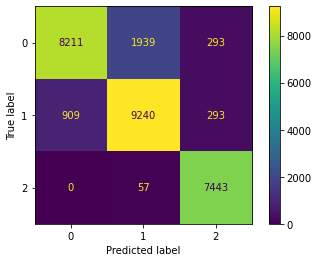

In [436]:
from sklearn.metrics import confusion_matrix,plot_confusion_matrix
plot_confusion_matrix(dt,X_test, y_test);

### XGBClassifier 

In [437]:
X_train=X_train.values
X_test=X_test.values

In [438]:
XGBM = XGBClassifier()
XGBM.fit(X_train, y_train)
print('Accuracy of XGBClassifier on training set: {:.4f}'.format(XGBM.score(X_train, y_train)))
print('Accuracy of XGBClassifier on test set: {:.4f}'.format(XGBM.score(X_test, y_test)))

Accuracy of XGBClassifier on training set: 0.7439
Accuracy of XGBClassifier on test set: 0.7158


In [439]:
y_pred_xgb = XGBM.predict(X_test)
print(classification_report(y_pred_xgb, y_test))

              precision    recall  f1-score   support

           0       0.67      0.74      0.70      9544
           1       0.60      0.70      0.64      8989
           2       0.94      0.71      0.81      9852

    accuracy                           0.72     28385
   macro avg       0.74      0.72      0.72     28385
weighted avg       0.74      0.72      0.72     28385



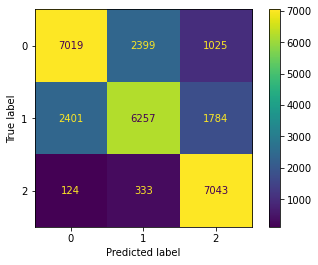

In [440]:
plot_confusion_matrix(XGBM,X_test, y_test);

### RandomForestClassifier

In [441]:
RFC = RandomForestClassifier()
RFC.fit(X_train, y_train)
print('Accuracy of RandomForestClassifier on training set: {:.4f}'.format(RFC.score(X_train, y_train)))
print('Accuracy of RandomForestClassifier on test set: {:.4f}'.format(RFC.score(X_test, y_test)))

Accuracy of RandomForestClassifier on training set: 0.9643
Accuracy of RandomForestClassifier on test set: 0.8886


In [442]:
y_pred_RF = RFC.predict(X_test)
print(classification_report(y_pred_RF, y_test))

              precision    recall  f1-score   support

           0       0.81      0.91      0.86      9291
           1       0.89      0.84      0.87     11120
           2       0.99      0.93      0.96      7974

    accuracy                           0.89     28385
   macro avg       0.90      0.89      0.89     28385
weighted avg       0.89      0.89      0.89     28385



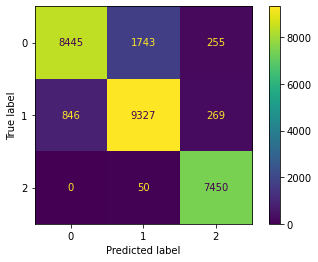

In [443]:
plot_confusion_matrix(RFC,X_test, y_test);

### LGBMClassifier

In [444]:
LGBM = LGBMClassifier()
LGBM.fit(X_train, y_train)
print('Accuracy of LGBMClassifier on training set: {:.4f}'.format(LGBM.score(X_train, y_train)))
print('Accuracy of LGBMClassifier on test set: {:.4f}'.format(LGBM.score(X_test, y_test)))

Accuracy of LGBMClassifier on training set: 0.6616
Accuracy of LGBMClassifier on test set: 0.6510


In [445]:
y_pred_lgbm = LGBM.predict(X_test)
print(classification_report(y_pred_lgbm, y_test))

              precision    recall  f1-score   support

           0       0.66      0.68      0.67     10098
           1       0.46      0.64      0.54      7463
           2       0.91      0.63      0.74     10824

    accuracy                           0.65     28385
   macro avg       0.68      0.65      0.65     28385
weighted avg       0.70      0.65      0.66     28385



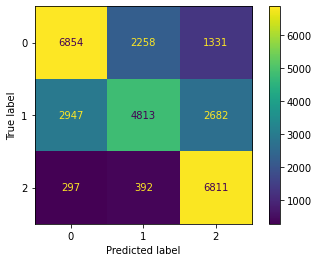

In [446]:
plot_confusion_matrix(LGBM,X_test, y_test);

### CatBoostClassifier

In [447]:
model = CatBoostClassifier()
model.fit(X_train, y_train)
print('Accuracy of CatBoostClassifier on training set: {:.4f}'.format(model.score(X_train, y_train)))
print('Accuracy of CatBoostClassifier on test set: {:.4f}'.format(model.score(X_test, y_test)))

Learning rate set to 0.097993
0:	learn: 1.0657862	total: 23.2ms	remaining: 23.1s
1:	learn: 1.0394691	total: 43.8ms	remaining: 21.9s
2:	learn: 1.0167458	total: 64.8ms	remaining: 21.5s
3:	learn: 0.9972993	total: 91ms	remaining: 22.6s
4:	learn: 0.9812731	total: 114ms	remaining: 22.6s
5:	learn: 0.9664619	total: 143ms	remaining: 23.8s
6:	learn: 0.9534875	total: 163ms	remaining: 23.2s
7:	learn: 0.9417977	total: 186ms	remaining: 23s
8:	learn: 0.9319978	total: 213ms	remaining: 23.5s
9:	learn: 0.9234309	total: 239ms	remaining: 23.7s
10:	learn: 0.9164391	total: 266ms	remaining: 23.9s
11:	learn: 0.9101448	total: 294ms	remaining: 24.2s
12:	learn: 0.9038153	total: 320ms	remaining: 24.3s
13:	learn: 0.8980746	total: 346ms	remaining: 24.4s
14:	learn: 0.8930282	total: 368ms	remaining: 24.1s
15:	learn: 0.8880960	total: 391ms	remaining: 24.1s
16:	learn: 0.8842736	total: 412ms	remaining: 23.8s
17:	learn: 0.8808018	total: 438ms	remaining: 23.9s
18:	learn: 0.8768971	total: 467ms	remaining: 24.1s
19:	learn: 

164:	learn: 0.7811874	total: 5.2s	remaining: 26.3s
165:	learn: 0.7807704	total: 5.23s	remaining: 26.3s
166:	learn: 0.7803646	total: 5.26s	remaining: 26.3s
167:	learn: 0.7796466	total: 5.31s	remaining: 26.3s
168:	learn: 0.7792494	total: 5.35s	remaining: 26.3s
169:	learn: 0.7789394	total: 5.38s	remaining: 26.3s
170:	learn: 0.7788060	total: 5.41s	remaining: 26.2s
171:	learn: 0.7782357	total: 5.45s	remaining: 26.3s
172:	learn: 0.7780146	total: 5.51s	remaining: 26.3s
173:	learn: 0.7778449	total: 5.54s	remaining: 26.3s
174:	learn: 0.7776239	total: 5.57s	remaining: 26.3s
175:	learn: 0.7771987	total: 5.6s	remaining: 26.2s
176:	learn: 0.7769406	total: 5.64s	remaining: 26.2s
177:	learn: 0.7764563	total: 5.68s	remaining: 26.2s
178:	learn: 0.7761526	total: 5.71s	remaining: 26.2s
179:	learn: 0.7756239	total: 5.75s	remaining: 26.2s
180:	learn: 0.7754199	total: 5.79s	remaining: 26.2s
181:	learn: 0.7750828	total: 5.83s	remaining: 26.2s
182:	learn: 0.7748063	total: 5.87s	remaining: 26.2s
183:	learn: 0.

323:	learn: 0.7317919	total: 10.9s	remaining: 22.8s
324:	learn: 0.7316515	total: 10.9s	remaining: 22.7s
325:	learn: 0.7315720	total: 11s	remaining: 22.7s
326:	learn: 0.7313710	total: 11s	remaining: 22.7s
327:	learn: 0.7311156	total: 11.1s	remaining: 22.7s
328:	learn: 0.7308910	total: 11.1s	remaining: 22.7s
329:	learn: 0.7305537	total: 11.2s	remaining: 22.7s
330:	learn: 0.7303533	total: 11.2s	remaining: 22.7s
331:	learn: 0.7300152	total: 11.3s	remaining: 22.7s
332:	learn: 0.7298568	total: 11.3s	remaining: 22.6s
333:	learn: 0.7297686	total: 11.3s	remaining: 22.6s
334:	learn: 0.7294629	total: 11.4s	remaining: 22.6s
335:	learn: 0.7293198	total: 11.4s	remaining: 22.5s
336:	learn: 0.7290157	total: 11.4s	remaining: 22.5s
337:	learn: 0.7288700	total: 11.5s	remaining: 22.5s
338:	learn: 0.7284488	total: 11.5s	remaining: 22.5s
339:	learn: 0.7282081	total: 11.6s	remaining: 22.4s
340:	learn: 0.7278985	total: 11.6s	remaining: 22.4s
341:	learn: 0.7274552	total: 11.6s	remaining: 22.4s
342:	learn: 0.72

485:	learn: 0.6968751	total: 16.9s	remaining: 17.9s
486:	learn: 0.6965126	total: 16.9s	remaining: 17.8s
487:	learn: 0.6962764	total: 17s	remaining: 17.8s
488:	learn: 0.6960466	total: 17s	remaining: 17.7s
489:	learn: 0.6956831	total: 17s	remaining: 17.7s
490:	learn: 0.6954526	total: 17.1s	remaining: 17.7s
491:	learn: 0.6952864	total: 17.1s	remaining: 17.7s
492:	learn: 0.6951573	total: 17.2s	remaining: 17.7s
493:	learn: 0.6949805	total: 17.2s	remaining: 17.6s
494:	learn: 0.6947910	total: 17.2s	remaining: 17.6s
495:	learn: 0.6946074	total: 17.3s	remaining: 17.6s
496:	learn: 0.6943096	total: 17.3s	remaining: 17.5s
497:	learn: 0.6941313	total: 17.3s	remaining: 17.5s
498:	learn: 0.6939979	total: 17.4s	remaining: 17.4s
499:	learn: 0.6938120	total: 17.4s	remaining: 17.4s
500:	learn: 0.6936257	total: 17.4s	remaining: 17.3s
501:	learn: 0.6934938	total: 17.4s	remaining: 17.3s
502:	learn: 0.6933830	total: 17.5s	remaining: 17.3s
503:	learn: 0.6931800	total: 17.5s	remaining: 17.2s
504:	learn: 0.6931

647:	learn: 0.6685131	total: 22.3s	remaining: 12.1s
648:	learn: 0.6683364	total: 22.4s	remaining: 12.1s
649:	learn: 0.6682380	total: 22.4s	remaining: 12.1s
650:	learn: 0.6680365	total: 22.5s	remaining: 12s
651:	learn: 0.6679219	total: 22.5s	remaining: 12s
652:	learn: 0.6677848	total: 22.5s	remaining: 12s
653:	learn: 0.6676888	total: 22.6s	remaining: 11.9s
654:	learn: 0.6676035	total: 22.6s	remaining: 11.9s
655:	learn: 0.6673939	total: 22.6s	remaining: 11.9s
656:	learn: 0.6672748	total: 22.7s	remaining: 11.8s
657:	learn: 0.6669540	total: 22.7s	remaining: 11.8s
658:	learn: 0.6668313	total: 22.8s	remaining: 11.8s
659:	learn: 0.6666248	total: 22.8s	remaining: 11.8s
660:	learn: 0.6664994	total: 22.9s	remaining: 11.7s
661:	learn: 0.6663368	total: 22.9s	remaining: 11.7s
662:	learn: 0.6661994	total: 22.9s	remaining: 11.7s
663:	learn: 0.6661012	total: 23s	remaining: 11.6s
664:	learn: 0.6658702	total: 23s	remaining: 11.6s
665:	learn: 0.6658121	total: 23.1s	remaining: 11.6s
666:	learn: 0.6657033	

806:	learn: 0.6452810	total: 28s	remaining: 6.69s
807:	learn: 0.6450784	total: 28s	remaining: 6.66s
808:	learn: 0.6448608	total: 28.1s	remaining: 6.63s
809:	learn: 0.6447019	total: 28.1s	remaining: 6.6s
810:	learn: 0.6444901	total: 28.2s	remaining: 6.57s
811:	learn: 0.6443955	total: 28.2s	remaining: 6.53s
812:	learn: 0.6442622	total: 28.3s	remaining: 6.5s
813:	learn: 0.6441246	total: 28.3s	remaining: 6.46s
814:	learn: 0.6440104	total: 28.3s	remaining: 6.43s
815:	learn: 0.6438555	total: 28.3s	remaining: 6.39s
816:	learn: 0.6435612	total: 28.4s	remaining: 6.36s
817:	learn: 0.6434348	total: 28.4s	remaining: 6.32s
818:	learn: 0.6433415	total: 28.4s	remaining: 6.28s
819:	learn: 0.6431980	total: 28.5s	remaining: 6.25s
820:	learn: 0.6431417	total: 28.5s	remaining: 6.21s
821:	learn: 0.6430356	total: 28.5s	remaining: 6.17s
822:	learn: 0.6429356	total: 28.5s	remaining: 6.14s
823:	learn: 0.6428712	total: 28.6s	remaining: 6.1s
824:	learn: 0.6427761	total: 28.6s	remaining: 6.07s
825:	learn: 0.64267

970:	learn: 0.6234769	total: 33.5s	remaining: 1s
971:	learn: 0.6233428	total: 33.6s	remaining: 967ms
972:	learn: 0.6231995	total: 33.6s	remaining: 932ms
973:	learn: 0.6231281	total: 33.6s	remaining: 898ms
974:	learn: 0.6229634	total: 33.7s	remaining: 863ms
975:	learn: 0.6228468	total: 33.7s	remaining: 828ms
976:	learn: 0.6227681	total: 33.7s	remaining: 794ms
977:	learn: 0.6225127	total: 33.8s	remaining: 760ms
978:	learn: 0.6224568	total: 33.8s	remaining: 725ms
979:	learn: 0.6223341	total: 33.8s	remaining: 691ms
980:	learn: 0.6222265	total: 33.9s	remaining: 657ms
981:	learn: 0.6220452	total: 33.9s	remaining: 622ms
982:	learn: 0.6219218	total: 34s	remaining: 588ms
983:	learn: 0.6217569	total: 34s	remaining: 553ms
984:	learn: 0.6216995	total: 34.1s	remaining: 519ms
985:	learn: 0.6215808	total: 34.1s	remaining: 484ms
986:	learn: 0.6214983	total: 34.2s	remaining: 450ms
987:	learn: 0.6213740	total: 34.2s	remaining: 415ms
988:	learn: 0.6212625	total: 34.2s	remaining: 381ms
989:	learn: 0.62112

In [448]:
y_pred_catb = model.predict(X_test)
print(classification_report(y_pred_catb, y_test))

              precision    recall  f1-score   support

           0       0.67      0.72      0.70      9698
           1       0.60      0.69      0.64      9082
           2       0.93      0.73      0.82      9605

    accuracy                           0.71     28385
   macro avg       0.74      0.71      0.72     28385
weighted avg       0.74      0.71      0.72     28385



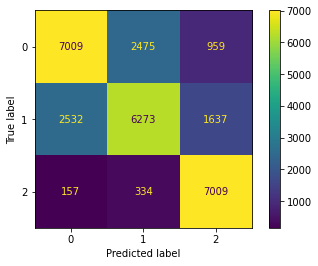

In [449]:
plot_confusion_matrix(model,X_test, y_test);

### Accuracy De chaque Modele

In [450]:
DT_accuracy_score=accuracy_score(y_test, y_pred_dt)
XGB_accuracy_score=accuracy_score(y_test, y_pred_xgb)
RF_accuracy_score=accuracy_score(y_test, y_pred_RF)
LGBM_accuracy_score=accuracy_score(y_test, y_pred_lgbm)
CATB_accuracy_score=accuracy_score(y_test, y_pred_catb)
data5 = {'ModelName': ["DecisionTreeClassifier","XGBClassifier" ,"RandomForestClassifier" ,"LGBMClassifier", "CatBoostClassifier"], 'Accuracy': [DT_accuracy_score, XGB_accuracy_score, RF_accuracy_score, LGBM_accuracy_score,CATB_accuracy_score]}    
# Create DataFrame  
df_Models5 = pd.DataFrame(data5)  
df_Models5

,ModelName,Accuracy
0,DecisionTreeClassifier,0.877013
1,XGBClassifier,0.715836
2,RandomForestClassifier,0.888568
3,LGBMClassifier,0.650978
4,CatBoostClassifier,0.714849


## Hyperparameter Tuning 

### DecisionTreeClassifier 

In [135]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [237]:
criterion = ['gini', 'entropy']
depth_range = range(10, 40)
leaf_range = range(1,15)
max_features=["auto", "sqrt", "log2"]
param_grid = dict(criterion=criterion,max_depth=depth_range, min_samples_leaf=leaf_range,max_features=max_features)

In [239]:
clf = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5)
clf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(10, 40),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': range(1, 15)})

In [240]:
print("best_score :",clf.best_score_)
print("best_params :",clf.best_params_)
print("best_estimator :",clf.best_estimator_)

best_score : 0.9446804787550489
best_params : {'criterion': 'entropy', 'max_depth': 22, 'max_features': 'auto', 'min_samples_leaf': 1}
best_estimator : DecisionTreeClassifier(criterion='entropy', max_depth=22, max_features='auto')


In [451]:
import time
dt = DecisionTreeClassifier(criterion='entropy',max_depth= 22,max_features='auto',min_samples_leaf= 1)
start_dt = time.time()
dt.fit(X_train, y_train)
end_dt = time.time()
print('Accuracy of DecisionTree on training set: {:.4f}'.format(dt.score(X_train, y_train)))
print('Accuracy of DecisionTree on test set: {:.4f}'.format(dt.score(X_test, y_test)))

Accuracy of DecisionTree on training set: 0.8852
Accuracy of DecisionTree on test set: 0.8149


In [453]:
time_dt=end_dt-start_dt

In [452]:
y_pred_dt = dt.predict(X_test)
print(classification_report(y_pred_dt, y_test))

              precision    recall  f1-score   support

           0       0.74      0.84      0.79      9185
           1       0.77      0.79      0.78     10210
           2       0.98      0.82      0.89      8990

    accuracy                           0.81     28385
   macro avg       0.83      0.82      0.82     28385
weighted avg       0.83      0.81      0.82     28385



## RandomForestClassifier

In [136]:
model_params = {
    'n_estimators': [50, 150, 250],
    'max_features': ['sqrt', 0.25, 0.5, 0.75, 1.0],
    'min_samples_split': [2, 4, 6],
    'criterion' : ['gini', 'entropy']
}

In [137]:
# create random forest classifier model
rf_model = RandomForestClassifier(random_state=1)

# set up grid search meta-estimator
clf = GridSearchCV(rf_model, model_params, cv=5)

In [138]:
# train the grid search meta-estimator to find the best model
RFmodel = clf.fit(X_train,y_train)

In [139]:
# print winning set of hyperparameters
from pprint import pprint
pprint(RFmodel.best_estimator_.get_params())

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 0.75,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 6,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 250,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 1,
 'verbose': 0,
 'warm_start': False}


In [454]:
RFC = RandomForestClassifier(bootstrap=True,ccp_alpha= 0.0,class_weight=None,
                             criterion= 'gini',max_depth= None,max_features=0.75,
                             max_leaf_nodes= None,max_samples = None,min_impurity_decrease=0.0,
                             min_impurity_split= None,min_samples_leaf=1,min_samples_split=6,
                             min_weight_fraction_leaf= 0.0,n_estimators= 250,n_jobs= None,
                             oob_score=False,random_state= 1,verbose= 0,warm_start=False)
start_rfc = time.time()
RFC.fit(X_train, y_train)
end_rfc = time.time()
print('Accuracy of RandomForestClassifier on training set: {:.4f}'.format(RFC.score(X_train, y_train)))
print('Accuracy of RandomForestClassifier on test set: {:.4f}'.format(RFC.score(X_test, y_test)))

Accuracy of RandomForestClassifier on training set: 0.9550
Accuracy of RandomForestClassifier on test set: 0.8812


In [455]:
time_rfc=end_rfc-start_rfc

In [456]:
y_pred_RF = RFC.predict(X_test)
print(classification_report(y_pred_RF, y_test))

              precision    recall  f1-score   support

           0       0.81      0.89      0.85      9546
           1       0.87      0.84      0.85     10861
           2       0.99      0.93      0.96      7978

    accuracy                           0.88     28385
   macro avg       0.89      0.89      0.89     28385
weighted avg       0.89      0.88      0.88     28385



- silght imporving in Accuracy

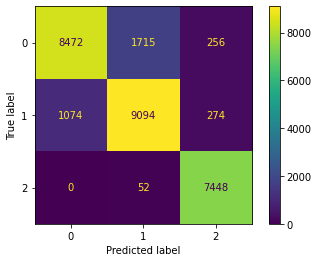

In [457]:
plot_confusion_matrix(RFC,X_test, y_test);

### XGBClassifier 

In [146]:
parameters = {
    'max_depth': range (2, 10, 1),
    'n_estimators': range(60, 220, 40),
    'learning_rate': [0.1, 0.01, 0.05]
}

In [149]:
grid_search = GridSearchCV(
    estimator=XGBClassifier(),
    param_grid=parameters,
    cv = 5)

In [150]:
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None,

In [152]:
print("best_score :",grid_search.best_score_)
print("best_params :",grid_search.best_params_)
print("best_estimator :",grid_search.best_estimator_)

best_score : 0.9726159873438831
best_params : {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 180}
best_estimator : XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=180, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [458]:
XGBM = XGBClassifier(learning_rate= 0.1, max_depth=6, n_estimators=180)
start_XGBM= time.time()
XGBM.fit(X_train, y_train)
end_XGBM = time.time()
print('Accuracy of XGBClassifier on training set: {:.4f}'.format(XGBM.score(X_train, y_train)))
print('Accuracy of XGBClassifier on test set: {:.4f}'.format(XGBM.score(X_test, y_test)))

Accuracy of XGBClassifier on training set: 0.6821
Accuracy of XGBClassifier on test set: 0.6641


In [459]:
time_XGBM=end_XGBM-start_XGBM

In [460]:
y_pred_xgb = XGBM.predict(X_test)
print(classification_report(y_pred_xgb, y_test))

              precision    recall  f1-score   support

           0       0.66      0.70      0.68      9893
           1       0.50      0.66      0.57      7939
           2       0.89      0.63      0.74     10553

    accuracy                           0.66     28385
   macro avg       0.69      0.66      0.66     28385
weighted avg       0.70      0.66      0.67     28385



### LGBMClassifier

In [159]:
param_grid = {
     'feature_fraction': [0.5,0.75, 1.0],
     'learning_rate' : [0.1,0.05,0.01],
     'boosting_type': ['gbdt', 'dart', 'goss'],
     'num_leaves':[50,100,150]
}

In [160]:
clf_lgbm = GridSearchCV(LGBMClassifier(), param_grid, cv=5)
clf_lgbm.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LGBMClassifier(),
             param_grid={'boosting_type': ['gbdt', 'dart', 'goss'],
                         'feature_fraction': [0.5, 0.75, 1.0],
                         'learning_rate': [0.1, 0.05, 0.01],
                         'num_leaves': [50, 100, 150]})

In [161]:
print("best_score :",clf_lgbm.best_score_)
print("best_params :",clf_lgbm.best_params_)
print("best_estimator :",clf_lgbm.best_estimator_)

best_score : 0.9724505689830384
best_params : {'boosting_type': 'dart', 'feature_fraction': 0.5, 'learning_rate': 0.1, 'num_leaves': 50}
best_estimator : LGBMClassifier(boosting_type='dart', feature_fraction=0.5, num_leaves=50)


In [461]:
LGBM = LGBMClassifier(boosting_type='dart',feature_fraction=0.5,learning_rate=0.1,num_leaves= 50)
start_lgbm = time.time()
LGBM.fit(X_train, y_train)
end_lgbm = time.time()
print('Accuracy of LGBMClassifier on training set: {:.4f}'.format(LGBM.score(X_train, y_train)))
print('Accuracy of LGBMClassifier on test set: {:.4f}'.format(LGBM.score(X_test, y_test)))

Accuracy of LGBMClassifier on training set: 0.6447
Accuracy of LGBMClassifier on test set: 0.6373


In [470]:
time_lgbm=end_lgbm-start_lgbm

In [462]:
y_pred_lgbm = LGBM.predict(X_test)
print(classification_report(y_pred_lgbm, y_test))

              precision    recall  f1-score   support

           0       0.66      0.66      0.66     10442
           1       0.45      0.63      0.52      7377
           2       0.87      0.62      0.72     10566

    accuracy                           0.64     28385
   macro avg       0.66      0.64      0.64     28385
weighted avg       0.68      0.64      0.65     28385



### CatBoostClassifier

In [193]:
params = {'iterations': [1000,1500,2000],
          'depth': [4, 5, 6],
          'learning_rate':[0.1,0.5,0.01]
         }


In [194]:
clf_catb = GridSearchCV(CatBoostClassifier(), params, cv=5)
clf_catb.fit(X_train, y_train)

0:	learn: 0.9485008	total: 23.5ms	remaining: 23.4s
1:	learn: 0.8319098	total: 35.7ms	remaining: 17.8s
2:	learn: 0.7399552	total: 46.5ms	remaining: 15.4s
3:	learn: 0.6658882	total: 58.3ms	remaining: 14.5s
4:	learn: 0.6039392	total: 68.6ms	remaining: 13.6s
5:	learn: 0.5520049	total: 81.1ms	remaining: 13.4s
6:	learn: 0.5087460	total: 93.7ms	remaining: 13.3s
7:	learn: 0.4708771	total: 106ms	remaining: 13.2s
8:	learn: 0.4384099	total: 118ms	remaining: 13s
9:	learn: 0.4096886	total: 134ms	remaining: 13.3s
10:	learn: 0.3840294	total: 146ms	remaining: 13.2s
11:	learn: 0.3610980	total: 159ms	remaining: 13.1s
12:	learn: 0.3413012	total: 169ms	remaining: 12.8s
13:	learn: 0.3229620	total: 181ms	remaining: 12.7s
14:	learn: 0.3072694	total: 193ms	remaining: 12.7s
15:	learn: 0.2935475	total: 206ms	remaining: 12.7s
16:	learn: 0.2803443	total: 217ms	remaining: 12.6s
17:	learn: 0.2693855	total: 231ms	remaining: 12.6s
18:	learn: 0.2590835	total: 245ms	remaining: 12.7s
19:	learn: 0.2494703	total: 259ms	re

169:	learn: 0.0979379	total: 2.77s	remaining: 13.5s
170:	learn: 0.0978132	total: 2.78s	remaining: 13.5s
171:	learn: 0.0977457	total: 2.79s	remaining: 13.5s
172:	learn: 0.0976212	total: 2.81s	remaining: 13.4s
173:	learn: 0.0972920	total: 2.82s	remaining: 13.4s
174:	learn: 0.0972314	total: 2.83s	remaining: 13.3s
175:	learn: 0.0969226	total: 2.84s	remaining: 13.3s
176:	learn: 0.0968025	total: 2.85s	remaining: 13.3s
177:	learn: 0.0964092	total: 2.86s	remaining: 13.2s
178:	learn: 0.0962038	total: 2.87s	remaining: 13.2s
179:	learn: 0.0957884	total: 2.88s	remaining: 13.1s
180:	learn: 0.0953304	total: 2.89s	remaining: 13.1s
181:	learn: 0.0952196	total: 2.9s	remaining: 13.1s
182:	learn: 0.0949896	total: 2.91s	remaining: 13s
183:	learn: 0.0948205	total: 2.92s	remaining: 13s
184:	learn: 0.0946900	total: 2.94s	remaining: 12.9s
185:	learn: 0.0945706	total: 2.95s	remaining: 12.9s
186:	learn: 0.0944180	total: 2.96s	remaining: 12.9s
187:	learn: 0.0943417	total: 2.97s	remaining: 12.8s
188:	learn: 0.093

328:	learn: 0.0764534	total: 5.07s	remaining: 10.3s
329:	learn: 0.0763936	total: 5.09s	remaining: 10.3s
330:	learn: 0.0763326	total: 5.1s	remaining: 10.3s
331:	learn: 0.0762582	total: 5.12s	remaining: 10.3s
332:	learn: 0.0762026	total: 5.13s	remaining: 10.3s
333:	learn: 0.0761436	total: 5.14s	remaining: 10.2s
334:	learn: 0.0760449	total: 5.15s	remaining: 10.2s
335:	learn: 0.0760037	total: 5.16s	remaining: 10.2s
336:	learn: 0.0759368	total: 5.17s	remaining: 10.2s
337:	learn: 0.0758777	total: 5.18s	remaining: 10.2s
338:	learn: 0.0758321	total: 5.2s	remaining: 10.1s
339:	learn: 0.0757519	total: 5.21s	remaining: 10.1s
340:	learn: 0.0756601	total: 5.22s	remaining: 10.1s
341:	learn: 0.0756208	total: 5.23s	remaining: 10.1s
342:	learn: 0.0755355	total: 5.24s	remaining: 10s
343:	learn: 0.0754614	total: 5.25s	remaining: 10s
344:	learn: 0.0754371	total: 5.26s	remaining: 9.98s
345:	learn: 0.0753809	total: 5.28s	remaining: 9.98s
346:	learn: 0.0753353	total: 5.29s	remaining: 9.96s
347:	learn: 0.0752

499:	learn: 0.0671865	total: 7.98s	remaining: 7.98s
500:	learn: 0.0671635	total: 8s	remaining: 7.96s
501:	learn: 0.0671353	total: 8.01s	remaining: 7.95s
502:	learn: 0.0670926	total: 8.03s	remaining: 7.93s
503:	learn: 0.0670613	total: 8.04s	remaining: 7.92s
504:	learn: 0.0670261	total: 8.06s	remaining: 7.9s
505:	learn: 0.0669873	total: 8.08s	remaining: 7.89s
506:	learn: 0.0669479	total: 8.1s	remaining: 7.87s
507:	learn: 0.0668774	total: 8.11s	remaining: 7.85s
508:	learn: 0.0668121	total: 8.12s	remaining: 7.83s
509:	learn: 0.0667834	total: 8.13s	remaining: 7.81s
510:	learn: 0.0667469	total: 8.14s	remaining: 7.79s
511:	learn: 0.0666934	total: 8.15s	remaining: 7.77s
512:	learn: 0.0666552	total: 8.16s	remaining: 7.75s
513:	learn: 0.0666387	total: 8.17s	remaining: 7.73s
514:	learn: 0.0666147	total: 8.18s	remaining: 7.71s
515:	learn: 0.0665876	total: 8.2s	remaining: 7.69s
516:	learn: 0.0665358	total: 8.21s	remaining: 7.67s
517:	learn: 0.0664984	total: 8.23s	remaining: 7.66s
518:	learn: 0.0664

663:	learn: 0.0624064	total: 10.3s	remaining: 5.19s
664:	learn: 0.0623901	total: 10.3s	remaining: 5.18s
665:	learn: 0.0623794	total: 10.3s	remaining: 5.17s
666:	learn: 0.0623616	total: 10.3s	remaining: 5.15s
667:	learn: 0.0623486	total: 10.3s	remaining: 5.13s
668:	learn: 0.0623244	total: 10.4s	remaining: 5.12s
669:	learn: 0.0623061	total: 10.4s	remaining: 5.11s
670:	learn: 0.0622974	total: 10.4s	remaining: 5.1s
671:	learn: 0.0622798	total: 10.4s	remaining: 5.08s
672:	learn: 0.0622080	total: 10.4s	remaining: 5.07s
673:	learn: 0.0621898	total: 10.4s	remaining: 5.05s
674:	learn: 0.0621729	total: 10.5s	remaining: 5.03s
675:	learn: 0.0620977	total: 10.5s	remaining: 5.02s
676:	learn: 0.0620863	total: 10.5s	remaining: 5s
677:	learn: 0.0620705	total: 10.5s	remaining: 4.98s
678:	learn: 0.0620364	total: 10.5s	remaining: 4.97s
679:	learn: 0.0620147	total: 10.5s	remaining: 4.95s
680:	learn: 0.0619993	total: 10.5s	remaining: 4.93s
681:	learn: 0.0619799	total: 10.5s	remaining: 4.92s
682:	learn: 0.06

832:	learn: 0.0589509	total: 12.8s	remaining: 2.56s
833:	learn: 0.0589426	total: 12.8s	remaining: 2.55s
834:	learn: 0.0589288	total: 12.8s	remaining: 2.53s
835:	learn: 0.0589018	total: 12.8s	remaining: 2.52s
836:	learn: 0.0588760	total: 12.8s	remaining: 2.5s
837:	learn: 0.0588555	total: 12.9s	remaining: 2.48s
838:	learn: 0.0588427	total: 12.9s	remaining: 2.47s
839:	learn: 0.0588276	total: 12.9s	remaining: 2.45s
840:	learn: 0.0588163	total: 12.9s	remaining: 2.44s
841:	learn: 0.0587811	total: 12.9s	remaining: 2.42s
842:	learn: 0.0587656	total: 12.9s	remaining: 2.4s
843:	learn: 0.0587474	total: 12.9s	remaining: 2.39s
844:	learn: 0.0587336	total: 12.9s	remaining: 2.37s
845:	learn: 0.0587190	total: 12.9s	remaining: 2.35s
846:	learn: 0.0587044	total: 12.9s	remaining: 2.34s
847:	learn: 0.0586912	total: 12.9s	remaining: 2.32s
848:	learn: 0.0586753	total: 13s	remaining: 2.31s
849:	learn: 0.0586620	total: 13s	remaining: 2.29s
850:	learn: 0.0586570	total: 13s	remaining: 2.27s
851:	learn: 0.058641

991:	learn: 0.0564986	total: 14.8s	remaining: 120ms
992:	learn: 0.0564847	total: 14.9s	remaining: 105ms
993:	learn: 0.0564740	total: 14.9s	remaining: 89.8ms
994:	learn: 0.0564605	total: 14.9s	remaining: 74.8ms
995:	learn: 0.0564509	total: 14.9s	remaining: 59.9ms
996:	learn: 0.0564301	total: 14.9s	remaining: 44.9ms
997:	learn: 0.0564231	total: 14.9s	remaining: 29.9ms
998:	learn: 0.0564176	total: 14.9s	remaining: 15ms
999:	learn: 0.0564048	total: 15s	remaining: 0us
0:	learn: 0.9506236	total: 28.6ms	remaining: 28.6s
1:	learn: 0.8336261	total: 43.9ms	remaining: 21.9s
2:	learn: 0.7414257	total: 58.4ms	remaining: 19.4s
3:	learn: 0.6669366	total: 75ms	remaining: 18.7s
4:	learn: 0.6048357	total: 88.7ms	remaining: 17.7s
5:	learn: 0.5543969	total: 104ms	remaining: 17.3s
6:	learn: 0.5109924	total: 119ms	remaining: 16.9s
7:	learn: 0.4729135	total: 134ms	remaining: 16.6s
8:	learn: 0.4403368	total: 146ms	remaining: 16.1s
9:	learn: 0.4109415	total: 159ms	remaining: 15.7s
10:	learn: 0.3853209	total: 1

154:	learn: 0.1008622	total: 2.13s	remaining: 11.6s
155:	learn: 0.1006528	total: 2.15s	remaining: 11.6s
156:	learn: 0.1002901	total: 2.16s	remaining: 11.6s
157:	learn: 0.1000573	total: 2.19s	remaining: 11.7s
158:	learn: 0.0999452	total: 2.21s	remaining: 11.7s
159:	learn: 0.0997758	total: 2.23s	remaining: 11.7s
160:	learn: 0.0996461	total: 2.25s	remaining: 11.7s
161:	learn: 0.0994328	total: 2.28s	remaining: 11.8s
162:	learn: 0.0993482	total: 2.3s	remaining: 11.8s
163:	learn: 0.0991822	total: 2.32s	remaining: 11.8s
164:	learn: 0.0989909	total: 2.36s	remaining: 11.9s
165:	learn: 0.0986114	total: 2.38s	remaining: 12s
166:	learn: 0.0984729	total: 2.4s	remaining: 12s
167:	learn: 0.0983686	total: 2.42s	remaining: 12s
168:	learn: 0.0980401	total: 2.44s	remaining: 12s
169:	learn: 0.0978255	total: 2.46s	remaining: 12s
170:	learn: 0.0976928	total: 2.48s	remaining: 12s
171:	learn: 0.0976153	total: 2.5s	remaining: 12s
172:	learn: 0.0972134	total: 2.52s	remaining: 12s
173:	learn: 0.0968164	total: 2.

315:	learn: 0.0780362	total: 4.88s	remaining: 10.6s
316:	learn: 0.0779924	total: 4.9s	remaining: 10.6s
317:	learn: 0.0779758	total: 4.92s	remaining: 10.6s
318:	learn: 0.0779025	total: 4.95s	remaining: 10.6s
319:	learn: 0.0778333	total: 4.97s	remaining: 10.6s
320:	learn: 0.0777498	total: 4.98s	remaining: 10.5s
321:	learn: 0.0776862	total: 5s	remaining: 10.5s
322:	learn: 0.0776483	total: 5s	remaining: 10.5s
323:	learn: 0.0776071	total: 5.02s	remaining: 10.5s
324:	learn: 0.0775392	total: 5.03s	remaining: 10.4s
325:	learn: 0.0774525	total: 5.04s	remaining: 10.4s
326:	learn: 0.0773906	total: 5.05s	remaining: 10.4s
327:	learn: 0.0773463	total: 5.06s	remaining: 10.4s
328:	learn: 0.0772170	total: 5.07s	remaining: 10.3s
329:	learn: 0.0771619	total: 5.08s	remaining: 10.3s
330:	learn: 0.0771186	total: 5.11s	remaining: 10.3s
331:	learn: 0.0770840	total: 5.14s	remaining: 10.3s
332:	learn: 0.0770340	total: 5.15s	remaining: 10.3s
333:	learn: 0.0769726	total: 5.17s	remaining: 10.3s
334:	learn: 0.07692

480:	learn: 0.0693868	total: 7.63s	remaining: 8.23s
481:	learn: 0.0693550	total: 7.64s	remaining: 8.21s
482:	learn: 0.0693493	total: 7.66s	remaining: 8.2s
483:	learn: 0.0693354	total: 7.67s	remaining: 8.18s
484:	learn: 0.0692889	total: 7.68s	remaining: 8.15s
485:	learn: 0.0692688	total: 7.69s	remaining: 8.13s
486:	learn: 0.0692359	total: 7.7s	remaining: 8.11s
487:	learn: 0.0692104	total: 7.71s	remaining: 8.09s
488:	learn: 0.0691645	total: 7.72s	remaining: 8.07s
489:	learn: 0.0690503	total: 7.73s	remaining: 8.04s
490:	learn: 0.0690317	total: 7.74s	remaining: 8.02s
491:	learn: 0.0690046	total: 7.75s	remaining: 8s
492:	learn: 0.0689065	total: 7.76s	remaining: 7.98s
493:	learn: 0.0688682	total: 7.77s	remaining: 7.96s
494:	learn: 0.0688468	total: 7.78s	remaining: 7.94s
495:	learn: 0.0688279	total: 7.79s	remaining: 7.92s
496:	learn: 0.0687989	total: 7.8s	remaining: 7.9s
497:	learn: 0.0687567	total: 7.81s	remaining: 7.88s
498:	learn: 0.0687464	total: 7.82s	remaining: 7.85s
499:	learn: 0.06873

647:	learn: 0.0643253	total: 9.7s	remaining: 5.27s
648:	learn: 0.0643172	total: 9.71s	remaining: 5.25s
649:	learn: 0.0642915	total: 9.73s	remaining: 5.24s
650:	learn: 0.0642792	total: 9.74s	remaining: 5.22s
651:	learn: 0.0642635	total: 9.75s	remaining: 5.21s
652:	learn: 0.0642552	total: 9.76s	remaining: 5.19s
653:	learn: 0.0642371	total: 9.77s	remaining: 5.17s
654:	learn: 0.0642016	total: 9.78s	remaining: 5.15s
655:	learn: 0.0641675	total: 9.8s	remaining: 5.14s
656:	learn: 0.0641377	total: 9.82s	remaining: 5.13s
657:	learn: 0.0641322	total: 9.83s	remaining: 5.11s
658:	learn: 0.0641014	total: 9.84s	remaining: 5.09s
659:	learn: 0.0640746	total: 9.85s	remaining: 5.08s
660:	learn: 0.0640450	total: 9.86s	remaining: 5.06s
661:	learn: 0.0639918	total: 9.87s	remaining: 5.04s
662:	learn: 0.0639754	total: 9.88s	remaining: 5.02s
663:	learn: 0.0639648	total: 9.89s	remaining: 5.01s
664:	learn: 0.0639089	total: 9.91s	remaining: 4.99s
665:	learn: 0.0638895	total: 9.92s	remaining: 4.97s
666:	learn: 0.

813:	learn: 0.0610014	total: 11.8s	remaining: 2.69s
814:	learn: 0.0609834	total: 11.8s	remaining: 2.67s
815:	learn: 0.0609748	total: 11.8s	remaining: 2.66s
816:	learn: 0.0609635	total: 11.8s	remaining: 2.65s
817:	learn: 0.0609542	total: 11.9s	remaining: 2.64s
818:	learn: 0.0609470	total: 11.9s	remaining: 2.63s
819:	learn: 0.0609290	total: 11.9s	remaining: 2.61s
820:	learn: 0.0609103	total: 11.9s	remaining: 2.6s
821:	learn: 0.0608854	total: 12s	remaining: 2.59s
822:	learn: 0.0608772	total: 12s	remaining: 2.58s
823:	learn: 0.0608640	total: 12s	remaining: 2.56s
824:	learn: 0.0608385	total: 12s	remaining: 2.55s
825:	learn: 0.0608285	total: 12.1s	remaining: 2.54s
826:	learn: 0.0608219	total: 12.1s	remaining: 2.53s
827:	learn: 0.0607691	total: 12.1s	remaining: 2.51s
828:	learn: 0.0607484	total: 12.1s	remaining: 2.5s
829:	learn: 0.0607229	total: 12.1s	remaining: 2.48s
830:	learn: 0.0607144	total: 12.1s	remaining: 2.47s
831:	learn: 0.0607028	total: 12.2s	remaining: 2.46s
832:	learn: 0.0606918	

979:	learn: 0.0586867	total: 14.9s	remaining: 305ms
980:	learn: 0.0586552	total: 15s	remaining: 290ms
981:	learn: 0.0586330	total: 15s	remaining: 275ms
982:	learn: 0.0586268	total: 15s	remaining: 260ms
983:	learn: 0.0586194	total: 15s	remaining: 244ms
984:	learn: 0.0586084	total: 15.1s	remaining: 229ms
985:	learn: 0.0586037	total: 15.1s	remaining: 214ms
986:	learn: 0.0585745	total: 15.1s	remaining: 199ms
987:	learn: 0.0585654	total: 15.1s	remaining: 184ms
988:	learn: 0.0585600	total: 15.2s	remaining: 169ms
989:	learn: 0.0585368	total: 15.2s	remaining: 153ms
990:	learn: 0.0585181	total: 15.2s	remaining: 138ms
991:	learn: 0.0585010	total: 15.2s	remaining: 123ms
992:	learn: 0.0584934	total: 15.2s	remaining: 107ms
993:	learn: 0.0584719	total: 15.2s	remaining: 91.9ms
994:	learn: 0.0584583	total: 15.2s	remaining: 76.6ms
995:	learn: 0.0584504	total: 15.3s	remaining: 61.3ms
996:	learn: 0.0584444	total: 15.3s	remaining: 46ms
997:	learn: 0.0584362	total: 15.3s	remaining: 30.7ms
998:	learn: 0.058

149:	learn: 0.1026317	total: 2.74s	remaining: 15.5s
150:	learn: 0.1023202	total: 2.76s	remaining: 15.5s
151:	learn: 0.1019486	total: 2.77s	remaining: 15.5s
152:	learn: 0.1018073	total: 2.79s	remaining: 15.4s
153:	learn: 0.1016476	total: 2.81s	remaining: 15.4s
154:	learn: 0.1012765	total: 2.82s	remaining: 15.4s
155:	learn: 0.1010828	total: 2.83s	remaining: 15.3s
156:	learn: 0.1009725	total: 2.84s	remaining: 15.3s
157:	learn: 0.1007641	total: 2.85s	remaining: 15.2s
158:	learn: 0.1005022	total: 2.86s	remaining: 15.1s
159:	learn: 0.0999940	total: 2.87s	remaining: 15.1s
160:	learn: 0.0996926	total: 2.88s	remaining: 15s
161:	learn: 0.0995059	total: 2.9s	remaining: 15s
162:	learn: 0.0993544	total: 2.91s	remaining: 14.9s
163:	learn: 0.0992914	total: 2.91s	remaining: 14.9s
164:	learn: 0.0988677	total: 2.92s	remaining: 14.8s
165:	learn: 0.0987570	total: 2.94s	remaining: 14.8s
166:	learn: 0.0985290	total: 2.95s	remaining: 14.7s
167:	learn: 0.0984192	total: 2.96s	remaining: 14.7s
168:	learn: 0.097

311:	learn: 0.0785907	total: 5.23s	remaining: 11.5s
312:	learn: 0.0785539	total: 5.24s	remaining: 11.5s
313:	learn: 0.0783461	total: 5.27s	remaining: 11.5s
314:	learn: 0.0782850	total: 5.29s	remaining: 11.5s
315:	learn: 0.0782537	total: 5.32s	remaining: 11.5s
316:	learn: 0.0781779	total: 5.34s	remaining: 11.5s
317:	learn: 0.0780327	total: 5.37s	remaining: 11.5s
318:	learn: 0.0780019	total: 5.38s	remaining: 11.5s
319:	learn: 0.0779577	total: 5.39s	remaining: 11.5s
320:	learn: 0.0778991	total: 5.4s	remaining: 11.4s
321:	learn: 0.0776948	total: 5.41s	remaining: 11.4s
322:	learn: 0.0776216	total: 5.43s	remaining: 11.4s
323:	learn: 0.0775670	total: 5.44s	remaining: 11.4s
324:	learn: 0.0774748	total: 5.46s	remaining: 11.3s
325:	learn: 0.0774394	total: 5.47s	remaining: 11.3s
326:	learn: 0.0773587	total: 5.49s	remaining: 11.3s
327:	learn: 0.0772826	total: 5.51s	remaining: 11.3s
328:	learn: 0.0772351	total: 5.53s	remaining: 11.3s
329:	learn: 0.0770528	total: 5.56s	remaining: 11.3s
330:	learn: 0

472:	learn: 0.0694741	total: 7.92s	remaining: 8.83s
473:	learn: 0.0694242	total: 7.94s	remaining: 8.82s
474:	learn: 0.0694120	total: 7.97s	remaining: 8.81s
475:	learn: 0.0693318	total: 8s	remaining: 8.8s
476:	learn: 0.0692995	total: 8.02s	remaining: 8.79s
477:	learn: 0.0692785	total: 8.03s	remaining: 8.77s
478:	learn: 0.0692467	total: 8.04s	remaining: 8.75s
479:	learn: 0.0692212	total: 8.05s	remaining: 8.72s
480:	learn: 0.0691993	total: 8.06s	remaining: 8.7s
481:	learn: 0.0691561	total: 8.07s	remaining: 8.67s
482:	learn: 0.0691424	total: 8.08s	remaining: 8.65s
483:	learn: 0.0691297	total: 8.09s	remaining: 8.63s
484:	learn: 0.0690933	total: 8.1s	remaining: 8.6s
485:	learn: 0.0690594	total: 8.11s	remaining: 8.58s
486:	learn: 0.0690292	total: 8.12s	remaining: 8.55s
487:	learn: 0.0690163	total: 8.13s	remaining: 8.53s
488:	learn: 0.0689756	total: 8.15s	remaining: 8.52s
489:	learn: 0.0689285	total: 8.16s	remaining: 8.49s
490:	learn: 0.0688920	total: 8.17s	remaining: 8.47s
491:	learn: 0.06883

641:	learn: 0.0638343	total: 10s	remaining: 5.58s
642:	learn: 0.0638283	total: 10s	remaining: 5.56s
643:	learn: 0.0638045	total: 10s	remaining: 5.54s
644:	learn: 0.0637778	total: 10s	remaining: 5.53s
645:	learn: 0.0637512	total: 10.1s	remaining: 5.51s
646:	learn: 0.0637435	total: 10.1s	remaining: 5.49s
647:	learn: 0.0637298	total: 10.1s	remaining: 5.48s
648:	learn: 0.0637070	total: 10.1s	remaining: 5.46s
649:	learn: 0.0636923	total: 10.1s	remaining: 5.44s
650:	learn: 0.0636766	total: 10.1s	remaining: 5.42s
651:	learn: 0.0636495	total: 10.1s	remaining: 5.41s
652:	learn: 0.0636210	total: 10.1s	remaining: 5.39s
653:	learn: 0.0636001	total: 10.2s	remaining: 5.37s
654:	learn: 0.0635925	total: 10.2s	remaining: 5.36s
655:	learn: 0.0635672	total: 10.2s	remaining: 5.34s
656:	learn: 0.0635556	total: 10.2s	remaining: 5.32s
657:	learn: 0.0635273	total: 10.2s	remaining: 5.31s
658:	learn: 0.0635124	total: 10.2s	remaining: 5.29s
659:	learn: 0.0634991	total: 10.2s	remaining: 5.28s
660:	learn: 0.063472

805:	learn: 0.0608579	total: 12.9s	remaining: 3.11s
806:	learn: 0.0608471	total: 12.9s	remaining: 3.09s
807:	learn: 0.0608329	total: 12.9s	remaining: 3.08s
808:	learn: 0.0608207	total: 13s	remaining: 3.06s
809:	learn: 0.0608033	total: 13s	remaining: 3.04s
810:	learn: 0.0607988	total: 13s	remaining: 3.02s
811:	learn: 0.0607752	total: 13s	remaining: 3.01s
812:	learn: 0.0607703	total: 13s	remaining: 2.99s
813:	learn: 0.0607472	total: 13s	remaining: 2.97s
814:	learn: 0.0607312	total: 13s	remaining: 2.96s
815:	learn: 0.0607156	total: 13s	remaining: 2.94s
816:	learn: 0.0606894	total: 13s	remaining: 2.92s
817:	learn: 0.0606639	total: 13.1s	remaining: 2.9s
818:	learn: 0.0606091	total: 13.1s	remaining: 2.89s
819:	learn: 0.0605886	total: 13.1s	remaining: 2.87s
820:	learn: 0.0605599	total: 13.1s	remaining: 2.85s
821:	learn: 0.0605538	total: 13.1s	remaining: 2.84s
822:	learn: 0.0605458	total: 13.1s	remaining: 2.82s
823:	learn: 0.0605370	total: 13.1s	remaining: 2.8s
824:	learn: 0.0605178	total: 13.

971:	learn: 0.0583413	total: 15s	remaining: 431ms
972:	learn: 0.0583282	total: 15s	remaining: 416ms
973:	learn: 0.0583153	total: 15s	remaining: 400ms
974:	learn: 0.0583093	total: 15s	remaining: 385ms
975:	learn: 0.0583035	total: 15s	remaining: 369ms
976:	learn: 0.0582985	total: 15s	remaining: 354ms
977:	learn: 0.0582815	total: 15s	remaining: 338ms
978:	learn: 0.0582716	total: 15.1s	remaining: 323ms
979:	learn: 0.0582518	total: 15.1s	remaining: 307ms
980:	learn: 0.0582484	total: 15.1s	remaining: 292ms
981:	learn: 0.0582239	total: 15.1s	remaining: 277ms
982:	learn: 0.0582089	total: 15.1s	remaining: 261ms
983:	learn: 0.0581847	total: 15.1s	remaining: 246ms
984:	learn: 0.0581616	total: 15.1s	remaining: 230ms
985:	learn: 0.0581567	total: 15.1s	remaining: 215ms
986:	learn: 0.0581455	total: 15.1s	remaining: 199ms
987:	learn: 0.0581348	total: 15.1s	remaining: 184ms
988:	learn: 0.0581261	total: 15.2s	remaining: 169ms
989:	learn: 0.0581186	total: 15.2s	remaining: 153ms
990:	learn: 0.0580973	tota

134:	learn: 0.1057536	total: 2.19s	remaining: 14.1s
135:	learn: 0.1054808	total: 2.2s	remaining: 14s
136:	learn: 0.1048834	total: 2.21s	remaining: 13.9s
137:	learn: 0.1046186	total: 2.22s	remaining: 13.9s
138:	learn: 0.1044518	total: 2.23s	remaining: 13.8s
139:	learn: 0.1041297	total: 2.24s	remaining: 13.8s
140:	learn: 0.1036961	total: 2.25s	remaining: 13.7s
141:	learn: 0.1033767	total: 2.26s	remaining: 13.7s
142:	learn: 0.1027918	total: 2.27s	remaining: 13.6s
143:	learn: 0.1024346	total: 2.29s	remaining: 13.6s
144:	learn: 0.1020564	total: 2.3s	remaining: 13.5s
145:	learn: 0.1016716	total: 2.31s	remaining: 13.5s
146:	learn: 0.1014021	total: 2.32s	remaining: 13.5s
147:	learn: 0.1010675	total: 2.33s	remaining: 13.4s
148:	learn: 0.1006843	total: 2.34s	remaining: 13.4s
149:	learn: 0.1004967	total: 2.36s	remaining: 13.4s
150:	learn: 0.1002886	total: 2.37s	remaining: 13.3s
151:	learn: 0.1000947	total: 2.38s	remaining: 13.3s
152:	learn: 0.0998051	total: 2.39s	remaining: 13.2s
153:	learn: 0.09

300:	learn: 0.0785273	total: 5.17s	remaining: 12s
301:	learn: 0.0784455	total: 5.18s	remaining: 12s
302:	learn: 0.0783630	total: 5.2s	remaining: 12s
303:	learn: 0.0782388	total: 5.21s	remaining: 11.9s
304:	learn: 0.0780385	total: 5.22s	remaining: 11.9s
305:	learn: 0.0779876	total: 5.23s	remaining: 11.9s
306:	learn: 0.0779214	total: 5.25s	remaining: 11.8s
307:	learn: 0.0778614	total: 5.26s	remaining: 11.8s
308:	learn: 0.0778220	total: 5.27s	remaining: 11.8s
309:	learn: 0.0777754	total: 5.28s	remaining: 11.8s
310:	learn: 0.0777230	total: 5.29s	remaining: 11.7s
311:	learn: 0.0776468	total: 5.3s	remaining: 11.7s
312:	learn: 0.0775906	total: 5.32s	remaining: 11.7s
313:	learn: 0.0773906	total: 5.33s	remaining: 11.6s
314:	learn: 0.0773288	total: 5.35s	remaining: 11.6s
315:	learn: 0.0772616	total: 5.37s	remaining: 11.6s
316:	learn: 0.0771502	total: 5.39s	remaining: 11.6s
317:	learn: 0.0770187	total: 5.41s	remaining: 11.6s
318:	learn: 0.0769611	total: 5.42s	remaining: 11.6s
319:	learn: 0.076894

474:	learn: 0.0688724	total: 7.21s	remaining: 7.97s
475:	learn: 0.0687988	total: 7.23s	remaining: 7.95s
476:	learn: 0.0687761	total: 7.24s	remaining: 7.94s
477:	learn: 0.0687386	total: 7.26s	remaining: 7.92s
478:	learn: 0.0687139	total: 7.27s	remaining: 7.9s
479:	learn: 0.0686875	total: 7.28s	remaining: 7.88s
480:	learn: 0.0686619	total: 7.29s	remaining: 7.86s
481:	learn: 0.0686213	total: 7.3s	remaining: 7.84s
482:	learn: 0.0685891	total: 7.31s	remaining: 7.82s
483:	learn: 0.0685789	total: 7.32s	remaining: 7.8s
484:	learn: 0.0685538	total: 7.33s	remaining: 7.78s
485:	learn: 0.0685190	total: 7.34s	remaining: 7.76s
486:	learn: 0.0685011	total: 7.35s	remaining: 7.74s
487:	learn: 0.0684579	total: 7.36s	remaining: 7.72s
488:	learn: 0.0684141	total: 7.37s	remaining: 7.7s
489:	learn: 0.0683775	total: 7.38s	remaining: 7.68s
490:	learn: 0.0683519	total: 7.39s	remaining: 7.66s
491:	learn: 0.0683093	total: 7.4s	remaining: 7.64s
492:	learn: 0.0682705	total: 7.41s	remaining: 7.62s
493:	learn: 0.068

636:	learn: 0.0643030	total: 9.07s	remaining: 5.17s
637:	learn: 0.0642839	total: 9.08s	remaining: 5.15s
638:	learn: 0.0642592	total: 9.1s	remaining: 5.14s
639:	learn: 0.0642391	total: 9.11s	remaining: 5.12s
640:	learn: 0.0642266	total: 9.12s	remaining: 5.11s
641:	learn: 0.0642113	total: 9.13s	remaining: 5.09s
642:	learn: 0.0641967	total: 9.14s	remaining: 5.07s
643:	learn: 0.0641774	total: 9.15s	remaining: 5.06s
644:	learn: 0.0641555	total: 9.16s	remaining: 5.04s
645:	learn: 0.0641338	total: 9.17s	remaining: 5.03s
646:	learn: 0.0641212	total: 9.18s	remaining: 5.01s
647:	learn: 0.0641152	total: 9.19s	remaining: 4.99s
648:	learn: 0.0640659	total: 9.2s	remaining: 4.98s
649:	learn: 0.0640533	total: 9.22s	remaining: 4.96s
650:	learn: 0.0640269	total: 9.23s	remaining: 4.95s
651:	learn: 0.0640171	total: 9.24s	remaining: 4.93s
652:	learn: 0.0640080	total: 9.25s	remaining: 4.92s
653:	learn: 0.0639870	total: 9.26s	remaining: 4.9s
654:	learn: 0.0639770	total: 9.28s	remaining: 4.88s
655:	learn: 0.0

803:	learn: 0.0611924	total: 10.9s	remaining: 2.66s
804:	learn: 0.0611813	total: 10.9s	remaining: 2.65s
805:	learn: 0.0611529	total: 11s	remaining: 2.64s
806:	learn: 0.0611272	total: 11s	remaining: 2.62s
807:	learn: 0.0611097	total: 11s	remaining: 2.61s
808:	learn: 0.0610987	total: 11s	remaining: 2.6s
809:	learn: 0.0610831	total: 11s	remaining: 2.58s
810:	learn: 0.0610750	total: 11s	remaining: 2.57s
811:	learn: 0.0610660	total: 11s	remaining: 2.55s
812:	learn: 0.0610560	total: 11s	remaining: 2.54s
813:	learn: 0.0610473	total: 11s	remaining: 2.52s
814:	learn: 0.0610377	total: 11.1s	remaining: 2.51s
815:	learn: 0.0610202	total: 11.1s	remaining: 2.5s
816:	learn: 0.0610057	total: 11.1s	remaining: 2.48s
817:	learn: 0.0609727	total: 11.1s	remaining: 2.47s
818:	learn: 0.0609608	total: 11.1s	remaining: 2.45s
819:	learn: 0.0609488	total: 11.1s	remaining: 2.44s
820:	learn: 0.0609358	total: 11.1s	remaining: 2.42s
821:	learn: 0.0609233	total: 11.1s	remaining: 2.41s
822:	learn: 0.0609093	total: 11.

963:	learn: 0.0587845	total: 13.1s	remaining: 488ms
964:	learn: 0.0587656	total: 13.1s	remaining: 475ms
965:	learn: 0.0587553	total: 13.1s	remaining: 462ms
966:	learn: 0.0587352	total: 13.1s	remaining: 448ms
967:	learn: 0.0587291	total: 13.2s	remaining: 435ms
968:	learn: 0.0587092	total: 13.2s	remaining: 422ms
969:	learn: 0.0586970	total: 13.2s	remaining: 408ms
970:	learn: 0.0586838	total: 13.2s	remaining: 395ms
971:	learn: 0.0586795	total: 13.2s	remaining: 381ms
972:	learn: 0.0586588	total: 13.3s	remaining: 368ms
973:	learn: 0.0586494	total: 13.3s	remaining: 354ms
974:	learn: 0.0586344	total: 13.3s	remaining: 341ms
975:	learn: 0.0586173	total: 13.3s	remaining: 327ms
976:	learn: 0.0586067	total: 13.3s	remaining: 314ms
977:	learn: 0.0585966	total: 13.3s	remaining: 300ms
978:	learn: 0.0585848	total: 13.4s	remaining: 287ms
979:	learn: 0.0585678	total: 13.4s	remaining: 273ms
980:	learn: 0.0585382	total: 13.4s	remaining: 259ms
981:	learn: 0.0585035	total: 13.4s	remaining: 246ms
982:	learn: 

138:	learn: 0.1067905	total: 2.71s	remaining: 16.8s
139:	learn: 0.1063894	total: 2.72s	remaining: 16.7s
140:	learn: 0.1062572	total: 2.73s	remaining: 16.7s
141:	learn: 0.1060586	total: 2.75s	remaining: 16.6s
142:	learn: 0.1058008	total: 2.76s	remaining: 16.6s
143:	learn: 0.1053422	total: 2.78s	remaining: 16.5s
144:	learn: 0.1051482	total: 2.79s	remaining: 16.4s
145:	learn: 0.1049604	total: 2.8s	remaining: 16.4s
146:	learn: 0.1048803	total: 2.81s	remaining: 16.3s
147:	learn: 0.1047129	total: 2.82s	remaining: 16.2s
148:	learn: 0.1044016	total: 2.83s	remaining: 16.2s
149:	learn: 0.1042040	total: 2.84s	remaining: 16.1s
150:	learn: 0.1037473	total: 2.85s	remaining: 16s
151:	learn: 0.1032568	total: 2.86s	remaining: 16s
152:	learn: 0.1030119	total: 2.87s	remaining: 15.9s
153:	learn: 0.1028986	total: 2.88s	remaining: 15.8s
154:	learn: 0.1025131	total: 2.89s	remaining: 15.8s
155:	learn: 0.1023926	total: 2.9s	remaining: 15.7s
156:	learn: 0.1020007	total: 2.91s	remaining: 15.6s
157:	learn: 0.1018

303:	learn: 0.0792009	total: 4.76s	remaining: 10.9s
304:	learn: 0.0790008	total: 4.78s	remaining: 10.9s
305:	learn: 0.0789287	total: 4.79s	remaining: 10.9s
306:	learn: 0.0788631	total: 4.8s	remaining: 10.8s
307:	learn: 0.0787922	total: 4.82s	remaining: 10.8s
308:	learn: 0.0787176	total: 4.83s	remaining: 10.8s
309:	learn: 0.0786697	total: 4.85s	remaining: 10.8s
310:	learn: 0.0786495	total: 4.86s	remaining: 10.8s
311:	learn: 0.0785439	total: 4.87s	remaining: 10.7s
312:	learn: 0.0783578	total: 4.9s	remaining: 10.8s
313:	learn: 0.0782493	total: 4.93s	remaining: 10.8s
314:	learn: 0.0781769	total: 4.95s	remaining: 10.8s
315:	learn: 0.0781118	total: 4.98s	remaining: 10.8s
316:	learn: 0.0780823	total: 5.01s	remaining: 10.8s
317:	learn: 0.0778871	total: 5.05s	remaining: 10.8s
318:	learn: 0.0778373	total: 5.08s	remaining: 10.8s
319:	learn: 0.0777892	total: 5.09s	remaining: 10.8s
320:	learn: 0.0777602	total: 5.1s	remaining: 10.8s
321:	learn: 0.0777126	total: 5.11s	remaining: 10.8s
322:	learn: 0.0

463:	learn: 0.0698436	total: 7.29s	remaining: 8.42s
464:	learn: 0.0698191	total: 7.3s	remaining: 8.4s
465:	learn: 0.0697881	total: 7.32s	remaining: 8.39s
466:	learn: 0.0697573	total: 7.33s	remaining: 8.37s
467:	learn: 0.0697176	total: 7.34s	remaining: 8.34s
468:	learn: 0.0696888	total: 7.35s	remaining: 8.32s
469:	learn: 0.0696557	total: 7.36s	remaining: 8.3s
470:	learn: 0.0696164	total: 7.37s	remaining: 8.28s
471:	learn: 0.0695786	total: 7.38s	remaining: 8.25s
472:	learn: 0.0695182	total: 7.39s	remaining: 8.23s
473:	learn: 0.0694857	total: 7.4s	remaining: 8.21s
474:	learn: 0.0694338	total: 7.41s	remaining: 8.19s
475:	learn: 0.0694024	total: 7.42s	remaining: 8.17s
476:	learn: 0.0693900	total: 7.43s	remaining: 8.15s
477:	learn: 0.0693454	total: 7.44s	remaining: 8.13s
478:	learn: 0.0692439	total: 7.46s	remaining: 8.12s
479:	learn: 0.0691876	total: 7.49s	remaining: 8.11s
480:	learn: 0.0691573	total: 7.51s	remaining: 8.1s
481:	learn: 0.0691234	total: 7.53s	remaining: 8.09s
482:	learn: 0.069

628:	learn: 0.0643679	total: 10.2s	remaining: 6.04s
629:	learn: 0.0643362	total: 10.3s	remaining: 6.02s
630:	learn: 0.0643082	total: 10.3s	remaining: 6.01s
631:	learn: 0.0642903	total: 10.3s	remaining: 5.99s
632:	learn: 0.0642815	total: 10.3s	remaining: 5.97s
633:	learn: 0.0642612	total: 10.3s	remaining: 5.95s
634:	learn: 0.0642525	total: 10.3s	remaining: 5.93s
635:	learn: 0.0642291	total: 10.3s	remaining: 5.91s
636:	learn: 0.0642180	total: 10.3s	remaining: 5.89s
637:	learn: 0.0642034	total: 10.3s	remaining: 5.87s
638:	learn: 0.0641839	total: 10.3s	remaining: 5.85s
639:	learn: 0.0641569	total: 10.4s	remaining: 5.83s
640:	learn: 0.0640541	total: 10.4s	remaining: 5.81s
641:	learn: 0.0640394	total: 10.4s	remaining: 5.79s
642:	learn: 0.0640247	total: 10.4s	remaining: 5.77s
643:	learn: 0.0640063	total: 10.4s	remaining: 5.75s
644:	learn: 0.0639922	total: 10.4s	remaining: 5.73s
645:	learn: 0.0639810	total: 10.4s	remaining: 5.71s
646:	learn: 0.0639624	total: 10.4s	remaining: 5.69s
647:	learn: 

793:	learn: 0.0608765	total: 13s	remaining: 3.37s
794:	learn: 0.0608536	total: 13s	remaining: 3.35s
795:	learn: 0.0608413	total: 13s	remaining: 3.33s
796:	learn: 0.0608303	total: 13s	remaining: 3.32s
797:	learn: 0.0608245	total: 13s	remaining: 3.3s
798:	learn: 0.0608023	total: 13.1s	remaining: 3.28s
799:	learn: 0.0607924	total: 13.1s	remaining: 3.27s
800:	learn: 0.0607875	total: 13.1s	remaining: 3.25s
801:	learn: 0.0607566	total: 13.1s	remaining: 3.23s
802:	learn: 0.0607386	total: 13.1s	remaining: 3.22s
803:	learn: 0.0607324	total: 13.1s	remaining: 3.2s
804:	learn: 0.0607087	total: 13.1s	remaining: 3.18s
805:	learn: 0.0606788	total: 13.2s	remaining: 3.17s
806:	learn: 0.0606684	total: 13.2s	remaining: 3.15s
807:	learn: 0.0606581	total: 13.2s	remaining: 3.13s
808:	learn: 0.0606524	total: 13.2s	remaining: 3.12s
809:	learn: 0.0606317	total: 13.2s	remaining: 3.1s
810:	learn: 0.0606107	total: 13.2s	remaining: 3.08s
811:	learn: 0.0606071	total: 13.3s	remaining: 3.07s
812:	learn: 0.0605696	tot

957:	learn: 0.0584048	total: 15.7s	remaining: 689ms
958:	learn: 0.0583966	total: 15.7s	remaining: 672ms
959:	learn: 0.0583842	total: 15.7s	remaining: 656ms
960:	learn: 0.0583789	total: 15.7s	remaining: 639ms
961:	learn: 0.0583713	total: 15.8s	remaining: 623ms
962:	learn: 0.0583645	total: 15.8s	remaining: 606ms
963:	learn: 0.0583439	total: 15.8s	remaining: 589ms
964:	learn: 0.0583307	total: 15.8s	remaining: 573ms
965:	learn: 0.0583226	total: 15.8s	remaining: 556ms
966:	learn: 0.0583031	total: 15.8s	remaining: 539ms
967:	learn: 0.0582907	total: 15.8s	remaining: 523ms
968:	learn: 0.0582751	total: 15.8s	remaining: 506ms
969:	learn: 0.0582627	total: 15.8s	remaining: 490ms
970:	learn: 0.0582544	total: 15.8s	remaining: 473ms
971:	learn: 0.0582317	total: 15.9s	remaining: 457ms
972:	learn: 0.0582249	total: 15.9s	remaining: 440ms
973:	learn: 0.0582053	total: 15.9s	remaining: 424ms
974:	learn: 0.0581992	total: 15.9s	remaining: 407ms
975:	learn: 0.0581841	total: 15.9s	remaining: 391ms
976:	learn: 

132:	learn: 0.0619400	total: 1.49s	remaining: 9.69s
133:	learn: 0.0618885	total: 1.5s	remaining: 9.69s
134:	learn: 0.0617354	total: 1.51s	remaining: 9.71s
135:	learn: 0.0616394	total: 1.52s	remaining: 9.69s
136:	learn: 0.0615478	total: 1.53s	remaining: 9.67s
137:	learn: 0.0614749	total: 1.54s	remaining: 9.64s
138:	learn: 0.0612565	total: 1.55s	remaining: 9.62s
139:	learn: 0.0611836	total: 1.56s	remaining: 9.61s
140:	learn: 0.0611292	total: 1.57s	remaining: 9.59s
141:	learn: 0.0610954	total: 1.58s	remaining: 9.57s
142:	learn: 0.0609598	total: 1.59s	remaining: 9.55s
143:	learn: 0.0608054	total: 1.6s	remaining: 9.53s
144:	learn: 0.0607112	total: 1.61s	remaining: 9.52s
145:	learn: 0.0605617	total: 1.62s	remaining: 9.5s
146:	learn: 0.0604096	total: 1.63s	remaining: 9.48s
147:	learn: 0.0602525	total: 1.64s	remaining: 9.45s
148:	learn: 0.0601546	total: 1.65s	remaining: 9.43s
149:	learn: 0.0600761	total: 1.66s	remaining: 9.42s
150:	learn: 0.0599834	total: 1.67s	remaining: 9.41s
151:	learn: 0.0

292:	learn: 0.0519291	total: 3.13s	remaining: 7.56s
293:	learn: 0.0519188	total: 3.15s	remaining: 7.55s
294:	learn: 0.0518996	total: 3.16s	remaining: 7.55s
295:	learn: 0.0518736	total: 3.17s	remaining: 7.54s
296:	learn: 0.0518601	total: 3.18s	remaining: 7.53s
297:	learn: 0.0518438	total: 3.19s	remaining: 7.52s
298:	learn: 0.0518043	total: 3.2s	remaining: 7.51s
299:	learn: 0.0517751	total: 3.21s	remaining: 7.5s
300:	learn: 0.0517258	total: 3.22s	remaining: 7.48s
301:	learn: 0.0517027	total: 3.23s	remaining: 7.47s
302:	learn: 0.0516824	total: 3.24s	remaining: 7.46s
303:	learn: 0.0516669	total: 3.25s	remaining: 7.44s
304:	learn: 0.0516415	total: 3.26s	remaining: 7.43s
305:	learn: 0.0516030	total: 3.27s	remaining: 7.42s
306:	learn: 0.0515664	total: 3.28s	remaining: 7.41s
307:	learn: 0.0514817	total: 3.29s	remaining: 7.4s
308:	learn: 0.0514738	total: 3.3s	remaining: 7.38s
309:	learn: 0.0514480	total: 3.31s	remaining: 7.37s
310:	learn: 0.0514327	total: 3.32s	remaining: 7.36s
311:	learn: 0.05

451:	learn: 0.0473176	total: 4.78s	remaining: 5.8s
452:	learn: 0.0473020	total: 4.8s	remaining: 5.79s
453:	learn: 0.0472761	total: 4.81s	remaining: 5.79s
454:	learn: 0.0472142	total: 4.82s	remaining: 5.78s
455:	learn: 0.0471980	total: 4.83s	remaining: 5.76s
456:	learn: 0.0471952	total: 4.84s	remaining: 5.75s
457:	learn: 0.0471856	total: 4.85s	remaining: 5.74s
458:	learn: 0.0471670	total: 4.86s	remaining: 5.73s
459:	learn: 0.0470924	total: 4.87s	remaining: 5.72s
460:	learn: 0.0470585	total: 4.88s	remaining: 5.71s
461:	learn: 0.0470346	total: 4.89s	remaining: 5.7s
462:	learn: 0.0469947	total: 4.9s	remaining: 5.69s
463:	learn: 0.0469581	total: 4.91s	remaining: 5.68s
464:	learn: 0.0469258	total: 4.92s	remaining: 5.67s
465:	learn: 0.0469085	total: 4.93s	remaining: 5.65s
466:	learn: 0.0468782	total: 4.94s	remaining: 5.64s
467:	learn: 0.0468722	total: 4.95s	remaining: 5.63s
468:	learn: 0.0468160	total: 4.96s	remaining: 5.62s
469:	learn: 0.0467778	total: 4.97s	remaining: 5.61s
470:	learn: 0.04

613:	learn: 0.0436903	total: 7.1s	remaining: 4.46s
614:	learn: 0.0436768	total: 7.11s	remaining: 4.45s
615:	learn: 0.0436234	total: 7.12s	remaining: 4.44s
616:	learn: 0.0436155	total: 7.13s	remaining: 4.43s
617:	learn: 0.0436071	total: 7.14s	remaining: 4.42s
618:	learn: 0.0436016	total: 7.15s	remaining: 4.4s
619:	learn: 0.0435742	total: 7.17s	remaining: 4.39s
620:	learn: 0.0435471	total: 7.17s	remaining: 4.38s
621:	learn: 0.0435329	total: 7.18s	remaining: 4.37s
622:	learn: 0.0435103	total: 7.2s	remaining: 4.35s
623:	learn: 0.0435058	total: 7.2s	remaining: 4.34s
624:	learn: 0.0434918	total: 7.21s	remaining: 4.33s
625:	learn: 0.0434663	total: 7.22s	remaining: 4.32s
626:	learn: 0.0434614	total: 7.24s	remaining: 4.3s
627:	learn: 0.0434508	total: 7.24s	remaining: 4.29s
628:	learn: 0.0434386	total: 7.25s	remaining: 4.28s
629:	learn: 0.0434216	total: 7.26s	remaining: 4.27s
630:	learn: 0.0433557	total: 7.27s	remaining: 4.25s
631:	learn: 0.0433396	total: 7.28s	remaining: 4.24s
632:	learn: 0.043

788:	learn: 0.0413008	total: 8.95s	remaining: 2.39s
789:	learn: 0.0412959	total: 8.96s	remaining: 2.38s
790:	learn: 0.0412742	total: 8.97s	remaining: 2.37s
791:	learn: 0.0412643	total: 8.99s	remaining: 2.36s
792:	learn: 0.0412466	total: 9.01s	remaining: 2.35s
793:	learn: 0.0412443	total: 9.04s	remaining: 2.34s
794:	learn: 0.0412392	total: 9.06s	remaining: 2.34s
795:	learn: 0.0412232	total: 9.09s	remaining: 2.33s
796:	learn: 0.0412051	total: 9.12s	remaining: 2.32s
797:	learn: 0.0412014	total: 9.14s	remaining: 2.31s
798:	learn: 0.0411975	total: 9.16s	remaining: 2.3s
799:	learn: 0.0411966	total: 9.18s	remaining: 2.3s
800:	learn: 0.0411929	total: 9.2s	remaining: 2.29s
801:	learn: 0.0411828	total: 9.23s	remaining: 2.28s
802:	learn: 0.0411621	total: 9.24s	remaining: 2.27s
803:	learn: 0.0411585	total: 9.28s	remaining: 2.26s
804:	learn: 0.0411558	total: 9.3s	remaining: 2.25s
805:	learn: 0.0411428	total: 9.32s	remaining: 2.24s
806:	learn: 0.0411294	total: 9.35s	remaining: 2.24s
807:	learn: 0.04

949:	learn: 0.0396699	total: 11s	remaining: 581ms
950:	learn: 0.0396615	total: 11.1s	remaining: 570ms
951:	learn: 0.0396490	total: 11.1s	remaining: 558ms
952:	learn: 0.0396400	total: 11.1s	remaining: 546ms
953:	learn: 0.0396199	total: 11.1s	remaining: 535ms
954:	learn: 0.0396166	total: 11.1s	remaining: 523ms
955:	learn: 0.0396042	total: 11.1s	remaining: 511ms
956:	learn: 0.0396015	total: 11.1s	remaining: 500ms
957:	learn: 0.0395916	total: 11.1s	remaining: 488ms
958:	learn: 0.0395855	total: 11.1s	remaining: 476ms
959:	learn: 0.0395581	total: 11.1s	remaining: 465ms
960:	learn: 0.0395557	total: 11.2s	remaining: 453ms
961:	learn: 0.0395525	total: 11.2s	remaining: 441ms
962:	learn: 0.0395479	total: 11.2s	remaining: 430ms
963:	learn: 0.0395442	total: 11.2s	remaining: 418ms
964:	learn: 0.0395240	total: 11.2s	remaining: 406ms
965:	learn: 0.0395195	total: 11.2s	remaining: 395ms
966:	learn: 0.0395116	total: 11.2s	remaining: 383ms
967:	learn: 0.0394981	total: 11.2s	remaining: 371ms
968:	learn: 0.

120:	learn: 0.0646839	total: 1.5s	remaining: 10.9s
121:	learn: 0.0645277	total: 1.51s	remaining: 10.9s
122:	learn: 0.0642871	total: 1.52s	remaining: 10.9s
123:	learn: 0.0641970	total: 1.54s	remaining: 10.9s
124:	learn: 0.0641254	total: 1.55s	remaining: 10.8s
125:	learn: 0.0639910	total: 1.56s	remaining: 10.8s
126:	learn: 0.0639512	total: 1.57s	remaining: 10.8s
127:	learn: 0.0638618	total: 1.58s	remaining: 10.7s
128:	learn: 0.0637159	total: 1.59s	remaining: 10.7s
129:	learn: 0.0635883	total: 1.6s	remaining: 10.7s
130:	learn: 0.0634512	total: 1.61s	remaining: 10.7s
131:	learn: 0.0632099	total: 1.62s	remaining: 10.6s
132:	learn: 0.0631559	total: 1.63s	remaining: 10.6s
133:	learn: 0.0630802	total: 1.64s	remaining: 10.6s
134:	learn: 0.0629442	total: 1.65s	remaining: 10.5s
135:	learn: 0.0628454	total: 1.66s	remaining: 10.5s
136:	learn: 0.0627582	total: 1.66s	remaining: 10.5s
137:	learn: 0.0626877	total: 1.68s	remaining: 10.5s
138:	learn: 0.0625957	total: 1.68s	remaining: 10.4s
139:	learn: 0.

287:	learn: 0.0535178	total: 3.35s	remaining: 8.28s
288:	learn: 0.0534916	total: 3.37s	remaining: 8.29s
289:	learn: 0.0534139	total: 3.41s	remaining: 8.34s
290:	learn: 0.0533767	total: 3.44s	remaining: 8.39s
291:	learn: 0.0533334	total: 3.46s	remaining: 8.4s
292:	learn: 0.0533073	total: 3.48s	remaining: 8.4s
293:	learn: 0.0532798	total: 3.51s	remaining: 8.43s
294:	learn: 0.0532712	total: 3.52s	remaining: 8.41s
295:	learn: 0.0532005	total: 3.53s	remaining: 8.4s
296:	learn: 0.0531670	total: 3.54s	remaining: 8.38s
297:	learn: 0.0531070	total: 3.55s	remaining: 8.37s
298:	learn: 0.0530954	total: 3.56s	remaining: 8.36s
299:	learn: 0.0530503	total: 3.58s	remaining: 8.35s
300:	learn: 0.0530346	total: 3.59s	remaining: 8.34s
301:	learn: 0.0530193	total: 3.6s	remaining: 8.32s
302:	learn: 0.0529813	total: 3.61s	remaining: 8.31s
303:	learn: 0.0529480	total: 3.62s	remaining: 8.29s
304:	learn: 0.0529147	total: 3.63s	remaining: 8.27s
305:	learn: 0.0528859	total: 3.64s	remaining: 8.26s
306:	learn: 0.05

455:	learn: 0.0486510	total: 5.19s	remaining: 6.19s
456:	learn: 0.0486369	total: 5.2s	remaining: 6.18s
457:	learn: 0.0486215	total: 5.21s	remaining: 6.17s
458:	learn: 0.0486144	total: 5.22s	remaining: 6.16s
459:	learn: 0.0485848	total: 5.24s	remaining: 6.15s
460:	learn: 0.0485592	total: 5.25s	remaining: 6.13s
461:	learn: 0.0485453	total: 5.26s	remaining: 6.12s
462:	learn: 0.0485197	total: 5.27s	remaining: 6.11s
463:	learn: 0.0485040	total: 5.28s	remaining: 6.1s
464:	learn: 0.0484846	total: 5.29s	remaining: 6.08s
465:	learn: 0.0484710	total: 5.3s	remaining: 6.07s
466:	learn: 0.0484538	total: 5.31s	remaining: 6.06s
467:	learn: 0.0484188	total: 5.32s	remaining: 6.04s
468:	learn: 0.0483795	total: 5.33s	remaining: 6.04s
469:	learn: 0.0483365	total: 5.34s	remaining: 6.03s
470:	learn: 0.0483228	total: 5.35s	remaining: 6.01s
471:	learn: 0.0482941	total: 5.36s	remaining: 6s
472:	learn: 0.0482752	total: 5.37s	remaining: 5.99s
473:	learn: 0.0482647	total: 5.38s	remaining: 5.97s
474:	learn: 0.0482

614:	learn: 0.0456361	total: 6.84s	remaining: 4.28s
615:	learn: 0.0456102	total: 6.85s	remaining: 4.27s
616:	learn: 0.0455997	total: 6.86s	remaining: 4.26s
617:	learn: 0.0455840	total: 6.88s	remaining: 4.25s
618:	learn: 0.0455768	total: 6.89s	remaining: 4.24s
619:	learn: 0.0455619	total: 6.9s	remaining: 4.23s
620:	learn: 0.0455432	total: 6.91s	remaining: 4.22s
621:	learn: 0.0455106	total: 6.92s	remaining: 4.2s
622:	learn: 0.0455067	total: 6.93s	remaining: 4.19s
623:	learn: 0.0454967	total: 6.94s	remaining: 4.18s
624:	learn: 0.0454881	total: 6.95s	remaining: 4.17s
625:	learn: 0.0454838	total: 6.95s	remaining: 4.16s
626:	learn: 0.0454742	total: 6.96s	remaining: 4.14s
627:	learn: 0.0454651	total: 6.97s	remaining: 4.13s
628:	learn: 0.0454523	total: 6.98s	remaining: 4.12s
629:	learn: 0.0454455	total: 6.99s	remaining: 4.11s
630:	learn: 0.0454330	total: 7s	remaining: 4.09s
631:	learn: 0.0454040	total: 7.01s	remaining: 4.08s
632:	learn: 0.0453994	total: 7.02s	remaining: 4.07s
633:	learn: 0.045

774:	learn: 0.0434894	total: 8.49s	remaining: 2.46s
775:	learn: 0.0434886	total: 8.5s	remaining: 2.45s
776:	learn: 0.0434852	total: 8.52s	remaining: 2.44s
777:	learn: 0.0434728	total: 8.53s	remaining: 2.43s
778:	learn: 0.0434706	total: 8.54s	remaining: 2.42s
779:	learn: 0.0434627	total: 8.54s	remaining: 2.41s
780:	learn: 0.0434456	total: 8.55s	remaining: 2.4s
781:	learn: 0.0434380	total: 8.56s	remaining: 2.39s
782:	learn: 0.0434317	total: 8.57s	remaining: 2.38s
783:	learn: 0.0434235	total: 8.58s	remaining: 2.36s
784:	learn: 0.0434197	total: 8.59s	remaining: 2.35s
785:	learn: 0.0434084	total: 8.6s	remaining: 2.34s
786:	learn: 0.0434059	total: 8.61s	remaining: 2.33s
787:	learn: 0.0434008	total: 8.62s	remaining: 2.32s
788:	learn: 0.0433785	total: 8.63s	remaining: 2.31s
789:	learn: 0.0433600	total: 8.64s	remaining: 2.3s
790:	learn: 0.0433494	total: 8.65s	remaining: 2.29s
791:	learn: 0.0433452	total: 8.66s	remaining: 2.27s
792:	learn: 0.0433433	total: 8.67s	remaining: 2.26s
793:	learn: 0.04

951:	learn: 0.0416508	total: 10.3s	remaining: 520ms
952:	learn: 0.0416427	total: 10.3s	remaining: 510ms
953:	learn: 0.0416219	total: 10.3s	remaining: 499ms
954:	learn: 0.0416066	total: 10.4s	remaining: 488ms
955:	learn: 0.0416008	total: 10.4s	remaining: 477ms
956:	learn: 0.0415877	total: 10.4s	remaining: 466ms
957:	learn: 0.0415847	total: 10.4s	remaining: 455ms
958:	learn: 0.0415836	total: 10.4s	remaining: 445ms
959:	learn: 0.0415594	total: 10.4s	remaining: 434ms
960:	learn: 0.0415500	total: 10.4s	remaining: 423ms
961:	learn: 0.0415395	total: 10.4s	remaining: 412ms
962:	learn: 0.0415291	total: 10.4s	remaining: 401ms
963:	learn: 0.0415148	total: 10.4s	remaining: 390ms
964:	learn: 0.0415064	total: 10.5s	remaining: 379ms
965:	learn: 0.0415039	total: 10.5s	remaining: 368ms
966:	learn: 0.0415007	total: 10.5s	remaining: 357ms
967:	learn: 0.0414762	total: 10.5s	remaining: 347ms
968:	learn: 0.0414688	total: 10.5s	remaining: 336ms
969:	learn: 0.0414678	total: 10.5s	remaining: 325ms
970:	learn: 

119:	learn: 0.0645860	total: 1.48s	remaining: 10.9s
120:	learn: 0.0644869	total: 1.5s	remaining: 10.9s
121:	learn: 0.0642875	total: 1.51s	remaining: 10.9s
122:	learn: 0.0640019	total: 1.52s	remaining: 10.9s
123:	learn: 0.0639181	total: 1.53s	remaining: 10.8s
124:	learn: 0.0637513	total: 1.54s	remaining: 10.8s
125:	learn: 0.0636477	total: 1.55s	remaining: 10.8s
126:	learn: 0.0635901	total: 1.56s	remaining: 10.7s
127:	learn: 0.0633781	total: 1.57s	remaining: 10.7s
128:	learn: 0.0631396	total: 1.58s	remaining: 10.7s
129:	learn: 0.0630306	total: 1.59s	remaining: 10.7s
130:	learn: 0.0629185	total: 1.6s	remaining: 10.6s
131:	learn: 0.0627803	total: 1.61s	remaining: 10.6s
132:	learn: 0.0627286	total: 1.62s	remaining: 10.6s
133:	learn: 0.0626544	total: 1.63s	remaining: 10.6s
134:	learn: 0.0625673	total: 1.64s	remaining: 10.5s
135:	learn: 0.0624414	total: 1.65s	remaining: 10.5s
136:	learn: 0.0624114	total: 1.66s	remaining: 10.5s
137:	learn: 0.0623226	total: 1.67s	remaining: 10.4s
138:	learn: 0.

297:	learn: 0.0531756	total: 3.34s	remaining: 7.86s
298:	learn: 0.0530843	total: 3.35s	remaining: 7.86s
299:	learn: 0.0530628	total: 3.37s	remaining: 7.85s
300:	learn: 0.0530498	total: 3.38s	remaining: 7.84s
301:	learn: 0.0529844	total: 3.39s	remaining: 7.83s
302:	learn: 0.0529428	total: 3.4s	remaining: 7.81s
303:	learn: 0.0529374	total: 3.4s	remaining: 7.79s
304:	learn: 0.0529175	total: 3.41s	remaining: 7.78s
305:	learn: 0.0528431	total: 3.42s	remaining: 7.76s
306:	learn: 0.0528200	total: 3.43s	remaining: 7.75s
307:	learn: 0.0527912	total: 3.44s	remaining: 7.74s
308:	learn: 0.0527598	total: 3.45s	remaining: 7.72s
309:	learn: 0.0527276	total: 3.46s	remaining: 7.7s
310:	learn: 0.0526491	total: 3.47s	remaining: 7.69s
311:	learn: 0.0525910	total: 3.48s	remaining: 7.68s
312:	learn: 0.0525708	total: 3.49s	remaining: 7.66s
313:	learn: 0.0525418	total: 3.5s	remaining: 7.65s
314:	learn: 0.0525132	total: 3.51s	remaining: 7.63s
315:	learn: 0.0524686	total: 3.52s	remaining: 7.62s
316:	learn: 0.05

456:	learn: 0.0484282	total: 4.98s	remaining: 5.92s
457:	learn: 0.0484141	total: 5s	remaining: 5.92s
458:	learn: 0.0483936	total: 5.01s	remaining: 5.91s
459:	learn: 0.0483451	total: 5.02s	remaining: 5.9s
460:	learn: 0.0483155	total: 5.03s	remaining: 5.88s
461:	learn: 0.0483083	total: 5.04s	remaining: 5.87s
462:	learn: 0.0482963	total: 5.05s	remaining: 5.86s
463:	learn: 0.0482773	total: 5.06s	remaining: 5.85s
464:	learn: 0.0482584	total: 5.07s	remaining: 5.84s
465:	learn: 0.0482278	total: 5.08s	remaining: 5.82s
466:	learn: 0.0482167	total: 5.09s	remaining: 5.81s
467:	learn: 0.0482158	total: 5.1s	remaining: 5.8s
468:	learn: 0.0481994	total: 5.11s	remaining: 5.79s
469:	learn: 0.0481862	total: 5.12s	remaining: 5.78s
470:	learn: 0.0481716	total: 5.13s	remaining: 5.76s
471:	learn: 0.0481603	total: 5.14s	remaining: 5.75s
472:	learn: 0.0481436	total: 5.15s	remaining: 5.74s
473:	learn: 0.0481257	total: 5.16s	remaining: 5.73s
474:	learn: 0.0481045	total: 5.17s	remaining: 5.72s
475:	learn: 0.0480

617:	learn: 0.0456109	total: 7.27s	remaining: 4.49s
618:	learn: 0.0455764	total: 7.29s	remaining: 4.49s
619:	learn: 0.0455722	total: 7.3s	remaining: 4.48s
620:	learn: 0.0455570	total: 7.32s	remaining: 4.47s
621:	learn: 0.0455474	total: 7.34s	remaining: 4.46s
622:	learn: 0.0455237	total: 7.37s	remaining: 4.46s
623:	learn: 0.0455065	total: 7.41s	remaining: 4.46s
624:	learn: 0.0454800	total: 7.43s	remaining: 4.46s
625:	learn: 0.0454614	total: 7.45s	remaining: 4.45s
626:	learn: 0.0454460	total: 7.49s	remaining: 4.45s
627:	learn: 0.0454430	total: 7.51s	remaining: 4.45s
628:	learn: 0.0454286	total: 7.53s	remaining: 4.44s
629:	learn: 0.0454069	total: 7.54s	remaining: 4.43s
630:	learn: 0.0453846	total: 7.56s	remaining: 4.42s
631:	learn: 0.0453811	total: 7.57s	remaining: 4.41s
632:	learn: 0.0453405	total: 7.58s	remaining: 4.4s
633:	learn: 0.0453327	total: 7.6s	remaining: 4.39s
634:	learn: 0.0453189	total: 7.61s	remaining: 4.38s
635:	learn: 0.0453066	total: 7.62s	remaining: 4.36s
636:	learn: 0.0

790:	learn: 0.0431567	total: 9.55s	remaining: 2.52s
791:	learn: 0.0431406	total: 9.56s	remaining: 2.51s
792:	learn: 0.0431061	total: 9.58s	remaining: 2.5s
793:	learn: 0.0430953	total: 9.6s	remaining: 2.49s
794:	learn: 0.0430823	total: 9.61s	remaining: 2.48s
795:	learn: 0.0430804	total: 9.63s	remaining: 2.47s
796:	learn: 0.0430637	total: 9.64s	remaining: 2.46s
797:	learn: 0.0430547	total: 9.65s	remaining: 2.44s
798:	learn: 0.0430518	total: 9.66s	remaining: 2.43s
799:	learn: 0.0430246	total: 9.68s	remaining: 2.42s
800:	learn: 0.0430025	total: 9.69s	remaining: 2.41s
801:	learn: 0.0429913	total: 9.7s	remaining: 2.39s
802:	learn: 0.0429739	total: 9.71s	remaining: 2.38s
803:	learn: 0.0429703	total: 9.72s	remaining: 2.37s
804:	learn: 0.0429606	total: 9.73s	remaining: 2.36s
805:	learn: 0.0429562	total: 9.74s	remaining: 2.35s
806:	learn: 0.0429279	total: 9.76s	remaining: 2.33s
807:	learn: 0.0429214	total: 9.76s	remaining: 2.32s
808:	learn: 0.0429189	total: 9.78s	remaining: 2.31s
809:	learn: 0.0

959:	learn: 0.0413090	total: 12.1s	remaining: 503ms
960:	learn: 0.0413016	total: 12.1s	remaining: 490ms
961:	learn: 0.0412884	total: 12.1s	remaining: 478ms
962:	learn: 0.0412799	total: 12.1s	remaining: 465ms
963:	learn: 0.0412783	total: 12.1s	remaining: 453ms
964:	learn: 0.0412702	total: 12.1s	remaining: 440ms
965:	learn: 0.0412679	total: 12.2s	remaining: 428ms
966:	learn: 0.0412642	total: 12.2s	remaining: 415ms
967:	learn: 0.0412615	total: 12.2s	remaining: 403ms
968:	learn: 0.0412534	total: 12.2s	remaining: 390ms
969:	learn: 0.0412328	total: 12.2s	remaining: 378ms
970:	learn: 0.0412241	total: 12.2s	remaining: 365ms
971:	learn: 0.0411985	total: 12.2s	remaining: 353ms
972:	learn: 0.0411828	total: 12.3s	remaining: 340ms
973:	learn: 0.0411762	total: 12.3s	remaining: 328ms
974:	learn: 0.0411705	total: 12.3s	remaining: 315ms
975:	learn: 0.0411695	total: 12.3s	remaining: 302ms
976:	learn: 0.0411636	total: 12.3s	remaining: 290ms
977:	learn: 0.0411458	total: 12.3s	remaining: 277ms
978:	learn: 

127:	learn: 0.0629511	total: 2.13s	remaining: 14.5s
128:	learn: 0.0627303	total: 2.15s	remaining: 14.5s
129:	learn: 0.0626318	total: 2.16s	remaining: 14.5s
130:	learn: 0.0625728	total: 2.18s	remaining: 14.5s
131:	learn: 0.0624415	total: 2.19s	remaining: 14.4s
132:	learn: 0.0622931	total: 2.2s	remaining: 14.3s
133:	learn: 0.0621783	total: 2.21s	remaining: 14.3s
134:	learn: 0.0619153	total: 2.22s	remaining: 14.2s
135:	learn: 0.0617732	total: 2.23s	remaining: 14.2s
136:	learn: 0.0617108	total: 2.24s	remaining: 14.1s
137:	learn: 0.0616314	total: 2.25s	remaining: 14.1s
138:	learn: 0.0615378	total: 2.27s	remaining: 14s
139:	learn: 0.0614065	total: 2.28s	remaining: 14s
140:	learn: 0.0613741	total: 2.31s	remaining: 14.1s
141:	learn: 0.0612895	total: 2.33s	remaining: 14.1s
142:	learn: 0.0611555	total: 2.35s	remaining: 14.1s
143:	learn: 0.0610282	total: 2.37s	remaining: 14.1s
144:	learn: 0.0609870	total: 2.4s	remaining: 14.2s
145:	learn: 0.0608968	total: 2.42s	remaining: 14.2s
146:	learn: 0.0608

290:	learn: 0.0531575	total: 4.42s	remaining: 10.8s
291:	learn: 0.0531161	total: 4.43s	remaining: 10.7s
292:	learn: 0.0530889	total: 4.45s	remaining: 10.7s
293:	learn: 0.0530612	total: 4.47s	remaining: 10.7s
294:	learn: 0.0530376	total: 4.48s	remaining: 10.7s
295:	learn: 0.0530043	total: 4.49s	remaining: 10.7s
296:	learn: 0.0529529	total: 4.51s	remaining: 10.7s
297:	learn: 0.0528255	total: 4.52s	remaining: 10.7s
298:	learn: 0.0528009	total: 4.53s	remaining: 10.6s
299:	learn: 0.0527680	total: 4.54s	remaining: 10.6s
300:	learn: 0.0527021	total: 4.56s	remaining: 10.6s
301:	learn: 0.0526224	total: 4.57s	remaining: 10.6s
302:	learn: 0.0525693	total: 4.58s	remaining: 10.5s
303:	learn: 0.0525600	total: 4.59s	remaining: 10.5s
304:	learn: 0.0525281	total: 4.6s	remaining: 10.5s
305:	learn: 0.0525140	total: 4.61s	remaining: 10.5s
306:	learn: 0.0524661	total: 4.63s	remaining: 10.4s
307:	learn: 0.0524501	total: 4.64s	remaining: 10.4s
308:	learn: 0.0524303	total: 4.65s	remaining: 10.4s
309:	learn: 0

461:	learn: 0.0484187	total: 6.7s	remaining: 7.8s
462:	learn: 0.0483614	total: 6.71s	remaining: 7.78s
463:	learn: 0.0483424	total: 6.72s	remaining: 7.77s
464:	learn: 0.0483232	total: 6.74s	remaining: 7.75s
465:	learn: 0.0483000	total: 6.75s	remaining: 7.73s
466:	learn: 0.0482875	total: 6.75s	remaining: 7.71s
467:	learn: 0.0482710	total: 6.76s	remaining: 7.69s
468:	learn: 0.0482679	total: 6.77s	remaining: 7.67s
469:	learn: 0.0482163	total: 6.78s	remaining: 7.65s
470:	learn: 0.0482009	total: 6.79s	remaining: 7.63s
471:	learn: 0.0481896	total: 6.8s	remaining: 7.61s
472:	learn: 0.0481612	total: 6.81s	remaining: 7.59s
473:	learn: 0.0481400	total: 6.82s	remaining: 7.57s
474:	learn: 0.0481198	total: 6.83s	remaining: 7.55s
475:	learn: 0.0481094	total: 6.84s	remaining: 7.54s
476:	learn: 0.0480830	total: 6.86s	remaining: 7.52s
477:	learn: 0.0480612	total: 6.87s	remaining: 7.5s
478:	learn: 0.0480497	total: 6.88s	remaining: 7.48s
479:	learn: 0.0480215	total: 6.89s	remaining: 7.46s
480:	learn: 0.04

638:	learn: 0.0452869	total: 8.54s	remaining: 4.83s
639:	learn: 0.0452795	total: 8.55s	remaining: 4.81s
640:	learn: 0.0452639	total: 8.57s	remaining: 4.8s
641:	learn: 0.0452055	total: 8.58s	remaining: 4.79s
642:	learn: 0.0451994	total: 8.59s	remaining: 4.77s
643:	learn: 0.0451925	total: 8.6s	remaining: 4.75s
644:	learn: 0.0451688	total: 8.61s	remaining: 4.74s
645:	learn: 0.0451614	total: 8.62s	remaining: 4.72s
646:	learn: 0.0451463	total: 8.63s	remaining: 4.71s
647:	learn: 0.0451430	total: 8.64s	remaining: 4.69s
648:	learn: 0.0451335	total: 8.65s	remaining: 4.68s
649:	learn: 0.0451137	total: 8.66s	remaining: 4.66s
650:	learn: 0.0450985	total: 8.67s	remaining: 4.65s
651:	learn: 0.0450811	total: 8.68s	remaining: 4.63s
652:	learn: 0.0450699	total: 8.69s	remaining: 4.62s
653:	learn: 0.0450650	total: 8.7s	remaining: 4.6s
654:	learn: 0.0450370	total: 8.74s	remaining: 4.6s
655:	learn: 0.0450340	total: 8.78s	remaining: 4.61s
656:	learn: 0.0450277	total: 8.8s	remaining: 4.59s
657:	learn: 0.0450

808:	learn: 0.0429861	total: 10.4s	remaining: 2.45s
809:	learn: 0.0429822	total: 10.4s	remaining: 2.44s
810:	learn: 0.0429798	total: 10.4s	remaining: 2.43s
811:	learn: 0.0429737	total: 10.4s	remaining: 2.41s
812:	learn: 0.0429684	total: 10.4s	remaining: 2.4s
813:	learn: 0.0429616	total: 10.4s	remaining: 2.39s
814:	learn: 0.0429517	total: 10.5s	remaining: 2.37s
815:	learn: 0.0429358	total: 10.5s	remaining: 2.36s
816:	learn: 0.0429308	total: 10.5s	remaining: 2.35s
817:	learn: 0.0429132	total: 10.5s	remaining: 2.33s
818:	learn: 0.0428929	total: 10.5s	remaining: 2.32s
819:	learn: 0.0428867	total: 10.5s	remaining: 2.31s
820:	learn: 0.0428794	total: 10.5s	remaining: 2.29s
821:	learn: 0.0428718	total: 10.5s	remaining: 2.28s
822:	learn: 0.0428661	total: 10.5s	remaining: 2.27s
823:	learn: 0.0428570	total: 10.5s	remaining: 2.25s
824:	learn: 0.0428457	total: 10.6s	remaining: 2.24s
825:	learn: 0.0428311	total: 10.6s	remaining: 2.23s
826:	learn: 0.0428284	total: 10.6s	remaining: 2.21s
827:	learn: 0

980:	learn: 0.0414505	total: 12.2s	remaining: 237ms
981:	learn: 0.0414469	total: 12.3s	remaining: 225ms
982:	learn: 0.0414398	total: 12.3s	remaining: 212ms
983:	learn: 0.0414351	total: 12.3s	remaining: 200ms
984:	learn: 0.0414182	total: 12.3s	remaining: 187ms
985:	learn: 0.0413992	total: 12.3s	remaining: 175ms
986:	learn: 0.0413855	total: 12.3s	remaining: 162ms
987:	learn: 0.0413828	total: 12.3s	remaining: 150ms
988:	learn: 0.0413735	total: 12.3s	remaining: 137ms
989:	learn: 0.0413685	total: 12.3s	remaining: 125ms
990:	learn: 0.0413633	total: 12.3s	remaining: 112ms
991:	learn: 0.0413532	total: 12.4s	remaining: 99.7ms
992:	learn: 0.0413484	total: 12.4s	remaining: 87.2ms
993:	learn: 0.0413452	total: 12.4s	remaining: 74.7ms
994:	learn: 0.0413339	total: 12.4s	remaining: 62.3ms
995:	learn: 0.0413230	total: 12.4s	remaining: 49.8ms
996:	learn: 0.0413189	total: 12.4s	remaining: 37.3ms
997:	learn: 0.0413116	total: 12.4s	remaining: 24.9ms
998:	learn: 0.0413098	total: 12.4s	remaining: 12.4ms
999:

144:	learn: 0.0613045	total: 1.7s	remaining: 10s
145:	learn: 0.0612054	total: 1.71s	remaining: 10s
146:	learn: 0.0610906	total: 1.72s	remaining: 10s
147:	learn: 0.0610298	total: 1.74s	remaining: 10s
148:	learn: 0.0609376	total: 1.75s	remaining: 9.98s
149:	learn: 0.0608521	total: 1.76s	remaining: 9.96s
150:	learn: 0.0607809	total: 1.77s	remaining: 9.94s
151:	learn: 0.0606920	total: 1.78s	remaining: 9.92s
152:	learn: 0.0606324	total: 1.79s	remaining: 9.89s
153:	learn: 0.0606113	total: 1.79s	remaining: 9.86s
154:	learn: 0.0605511	total: 1.8s	remaining: 9.84s
155:	learn: 0.0604922	total: 1.81s	remaining: 9.82s
156:	learn: 0.0604185	total: 1.82s	remaining: 9.79s
157:	learn: 0.0603790	total: 1.83s	remaining: 9.77s
158:	learn: 0.0603366	total: 1.84s	remaining: 9.74s
159:	learn: 0.0602738	total: 1.85s	remaining: 9.72s
160:	learn: 0.0601857	total: 1.86s	remaining: 9.7s
161:	learn: 0.0601339	total: 1.87s	remaining: 9.67s
162:	learn: 0.0600848	total: 1.88s	remaining: 9.64s
163:	learn: 0.0599394	t

321:	learn: 0.0520885	total: 3.53s	remaining: 7.44s
322:	learn: 0.0520183	total: 3.55s	remaining: 7.43s
323:	learn: 0.0519818	total: 3.56s	remaining: 7.43s
324:	learn: 0.0519271	total: 3.57s	remaining: 7.42s
325:	learn: 0.0518864	total: 3.58s	remaining: 7.41s
326:	learn: 0.0518459	total: 3.59s	remaining: 7.4s
327:	learn: 0.0517777	total: 3.6s	remaining: 7.38s
328:	learn: 0.0517626	total: 3.61s	remaining: 7.37s
329:	learn: 0.0517023	total: 3.62s	remaining: 7.36s
330:	learn: 0.0516934	total: 3.63s	remaining: 7.34s
331:	learn: 0.0516435	total: 3.64s	remaining: 7.33s
332:	learn: 0.0515778	total: 3.65s	remaining: 7.32s
333:	learn: 0.0515265	total: 3.66s	remaining: 7.3s
334:	learn: 0.0515038	total: 3.67s	remaining: 7.29s
335:	learn: 0.0514912	total: 3.68s	remaining: 7.27s
336:	learn: 0.0514548	total: 3.69s	remaining: 7.26s
337:	learn: 0.0514422	total: 3.7s	remaining: 7.25s
338:	learn: 0.0513676	total: 3.71s	remaining: 7.24s
339:	learn: 0.0513226	total: 3.72s	remaining: 7.22s
340:	learn: 0.05

489:	learn: 0.0475696	total: 5.36s	remaining: 5.58s
490:	learn: 0.0475200	total: 5.37s	remaining: 5.57s
491:	learn: 0.0475089	total: 5.38s	remaining: 5.56s
492:	learn: 0.0474722	total: 5.39s	remaining: 5.55s
493:	learn: 0.0474329	total: 5.41s	remaining: 5.54s
494:	learn: 0.0473994	total: 5.42s	remaining: 5.53s
495:	learn: 0.0473733	total: 5.43s	remaining: 5.51s
496:	learn: 0.0473235	total: 5.44s	remaining: 5.5s
497:	learn: 0.0472840	total: 5.45s	remaining: 5.49s
498:	learn: 0.0472755	total: 5.46s	remaining: 5.48s
499:	learn: 0.0472699	total: 5.47s	remaining: 5.47s
500:	learn: 0.0472582	total: 5.48s	remaining: 5.46s
501:	learn: 0.0472320	total: 5.49s	remaining: 5.44s
502:	learn: 0.0472237	total: 5.5s	remaining: 5.43s
503:	learn: 0.0471905	total: 5.51s	remaining: 5.42s
504:	learn: 0.0471759	total: 5.52s	remaining: 5.41s
505:	learn: 0.0471667	total: 5.53s	remaining: 5.39s
506:	learn: 0.0471402	total: 5.54s	remaining: 5.38s
507:	learn: 0.0471057	total: 5.55s	remaining: 5.37s
508:	learn: 0.

666:	learn: 0.0443506	total: 7.19s	remaining: 3.59s
667:	learn: 0.0443269	total: 7.21s	remaining: 3.58s
668:	learn: 0.0443170	total: 7.23s	remaining: 3.58s
669:	learn: 0.0443030	total: 7.24s	remaining: 3.56s
670:	learn: 0.0442924	total: 7.25s	remaining: 3.55s
671:	learn: 0.0442750	total: 7.26s	remaining: 3.54s
672:	learn: 0.0442695	total: 7.27s	remaining: 3.53s
673:	learn: 0.0442572	total: 7.28s	remaining: 3.52s
674:	learn: 0.0442568	total: 7.29s	remaining: 3.51s
675:	learn: 0.0442477	total: 7.3s	remaining: 3.5s
676:	learn: 0.0442395	total: 7.31s	remaining: 3.49s
677:	learn: 0.0442265	total: 7.32s	remaining: 3.47s
678:	learn: 0.0442067	total: 7.33s	remaining: 3.46s
679:	learn: 0.0441890	total: 7.34s	remaining: 3.45s
680:	learn: 0.0441542	total: 7.35s	remaining: 3.44s
681:	learn: 0.0441415	total: 7.36s	remaining: 3.43s
682:	learn: 0.0441317	total: 7.37s	remaining: 3.42s
683:	learn: 0.0440970	total: 7.38s	remaining: 3.41s
684:	learn: 0.0440942	total: 7.39s	remaining: 3.4s
685:	learn: 0.0

844:	learn: 0.0420642	total: 9.05s	remaining: 1.66s
845:	learn: 0.0420614	total: 9.06s	remaining: 1.65s
846:	learn: 0.0420451	total: 9.07s	remaining: 1.64s
847:	learn: 0.0420205	total: 9.09s	remaining: 1.63s
848:	learn: 0.0420144	total: 9.1s	remaining: 1.62s
849:	learn: 0.0420038	total: 9.11s	remaining: 1.61s
850:	learn: 0.0419955	total: 9.11s	remaining: 1.59s
851:	learn: 0.0419827	total: 9.12s	remaining: 1.58s
852:	learn: 0.0419701	total: 9.13s	remaining: 1.57s
853:	learn: 0.0419651	total: 9.14s	remaining: 1.56s
854:	learn: 0.0419518	total: 9.15s	remaining: 1.55s
855:	learn: 0.0419376	total: 9.16s	remaining: 1.54s
856:	learn: 0.0419306	total: 9.17s	remaining: 1.53s
857:	learn: 0.0419111	total: 9.18s	remaining: 1.52s
858:	learn: 0.0419066	total: 9.19s	remaining: 1.51s
859:	learn: 0.0418932	total: 9.2s	remaining: 1.5s
860:	learn: 0.0418707	total: 9.21s	remaining: 1.49s
861:	learn: 0.0418662	total: 9.22s	remaining: 1.48s
862:	learn: 0.0418638	total: 9.23s	remaining: 1.47s
863:	learn: 0.0

20:	learn: 0.8375121	total: 223ms	remaining: 10.4s
21:	learn: 0.8278661	total: 238ms	remaining: 10.6s
22:	learn: 0.8185816	total: 254ms	remaining: 10.8s
23:	learn: 0.8092357	total: 264ms	remaining: 10.8s
24:	learn: 0.8000907	total: 277ms	remaining: 10.8s
25:	learn: 0.7913025	total: 290ms	remaining: 10.9s
26:	learn: 0.7827769	total: 303ms	remaining: 10.9s
27:	learn: 0.7741316	total: 316ms	remaining: 11s
28:	learn: 0.7657856	total: 328ms	remaining: 11s
29:	learn: 0.7575084	total: 340ms	remaining: 11s
30:	learn: 0.7494386	total: 353ms	remaining: 11s
31:	learn: 0.7414379	total: 365ms	remaining: 11s
32:	learn: 0.7336759	total: 378ms	remaining: 11.1s
33:	learn: 0.7259601	total: 390ms	remaining: 11.1s
34:	learn: 0.7184049	total: 404ms	remaining: 11.1s
35:	learn: 0.7109767	total: 416ms	remaining: 11.2s
36:	learn: 0.7039944	total: 432ms	remaining: 11.2s
37:	learn: 0.6970482	total: 449ms	remaining: 11.4s
38:	learn: 0.6900987	total: 468ms	remaining: 11.5s
39:	learn: 0.6834179	total: 479ms	remaini

189:	learn: 0.2627526	total: 2.3s	remaining: 9.81s
190:	learn: 0.2617056	total: 2.32s	remaining: 9.82s
191:	learn: 0.2606696	total: 2.33s	remaining: 9.82s
192:	learn: 0.2596483	total: 2.35s	remaining: 9.82s
193:	learn: 0.2586369	total: 2.36s	remaining: 9.81s
194:	learn: 0.2576738	total: 2.37s	remaining: 9.79s
195:	learn: 0.2566084	total: 2.38s	remaining: 9.77s
196:	learn: 0.2556704	total: 2.39s	remaining: 9.75s
197:	learn: 0.2548032	total: 2.4s	remaining: 9.74s
198:	learn: 0.2538486	total: 2.41s	remaining: 9.71s
199:	learn: 0.2529074	total: 2.42s	remaining: 9.7s
200:	learn: 0.2519598	total: 2.44s	remaining: 9.69s
201:	learn: 0.2510167	total: 2.45s	remaining: 9.66s
202:	learn: 0.2500850	total: 2.46s	remaining: 9.65s
203:	learn: 0.2491401	total: 2.47s	remaining: 9.63s
204:	learn: 0.2482280	total: 2.48s	remaining: 9.61s
205:	learn: 0.2473855	total: 2.49s	remaining: 9.59s
206:	learn: 0.2465235	total: 2.5s	remaining: 9.57s
207:	learn: 0.2456411	total: 2.51s	remaining: 9.57s
208:	learn: 0.24

351:	learn: 0.1739901	total: 4.14s	remaining: 7.62s
352:	learn: 0.1737392	total: 4.15s	remaining: 7.61s
353:	learn: 0.1734828	total: 4.17s	remaining: 7.6s
354:	learn: 0.1732304	total: 4.18s	remaining: 7.59s
355:	learn: 0.1729781	total: 4.19s	remaining: 7.58s
356:	learn: 0.1726904	total: 4.2s	remaining: 7.56s
357:	learn: 0.1724369	total: 4.21s	remaining: 7.55s
358:	learn: 0.1721706	total: 4.22s	remaining: 7.53s
359:	learn: 0.1719060	total: 4.23s	remaining: 7.52s
360:	learn: 0.1716780	total: 4.24s	remaining: 7.5s
361:	learn: 0.1714499	total: 4.25s	remaining: 7.49s
362:	learn: 0.1711985	total: 4.26s	remaining: 7.47s
363:	learn: 0.1709672	total: 4.27s	remaining: 7.46s
364:	learn: 0.1707282	total: 4.28s	remaining: 7.45s
365:	learn: 0.1705993	total: 4.29s	remaining: 7.43s
366:	learn: 0.1703524	total: 4.3s	remaining: 7.42s
367:	learn: 0.1701276	total: 4.31s	remaining: 7.4s
368:	learn: 0.1699028	total: 4.32s	remaining: 7.38s
369:	learn: 0.1696846	total: 4.33s	remaining: 7.37s
370:	learn: 0.169

521:	learn: 0.1489720	total: 6s	remaining: 5.5s
522:	learn: 0.1488856	total: 6.01s	remaining: 5.49s
523:	learn: 0.1487892	total: 6.03s	remaining: 5.47s
524:	learn: 0.1486885	total: 6.04s	remaining: 5.46s
525:	learn: 0.1486197	total: 6.05s	remaining: 5.45s
526:	learn: 0.1485251	total: 6.06s	remaining: 5.44s
527:	learn: 0.1484161	total: 6.07s	remaining: 5.43s
528:	learn: 0.1483126	total: 6.08s	remaining: 5.41s
529:	learn: 0.1482335	total: 6.09s	remaining: 5.4s
530:	learn: 0.1481673	total: 6.1s	remaining: 5.39s
531:	learn: 0.1481071	total: 6.11s	remaining: 5.37s
532:	learn: 0.1480453	total: 6.12s	remaining: 5.36s
533:	learn: 0.1479308	total: 6.13s	remaining: 5.35s
534:	learn: 0.1478753	total: 6.14s	remaining: 5.33s
535:	learn: 0.1477947	total: 6.15s	remaining: 5.32s
536:	learn: 0.1476743	total: 6.16s	remaining: 5.31s
537:	learn: 0.1475906	total: 6.17s	remaining: 5.3s
538:	learn: 0.1474977	total: 6.18s	remaining: 5.28s
539:	learn: 0.1474052	total: 6.19s	remaining: 5.27s
540:	learn: 0.14724

691:	learn: 0.1360542	total: 7.85s	remaining: 3.49s
692:	learn: 0.1359908	total: 7.87s	remaining: 3.48s
693:	learn: 0.1359139	total: 7.88s	remaining: 3.47s
694:	learn: 0.1358732	total: 7.89s	remaining: 3.46s
695:	learn: 0.1358331	total: 7.9s	remaining: 3.45s
696:	learn: 0.1357682	total: 7.91s	remaining: 3.44s
697:	learn: 0.1356930	total: 7.92s	remaining: 3.43s
698:	learn: 0.1356554	total: 7.93s	remaining: 3.41s
699:	learn: 0.1356111	total: 7.94s	remaining: 3.4s
700:	learn: 0.1354914	total: 7.95s	remaining: 3.39s
701:	learn: 0.1354304	total: 7.96s	remaining: 3.38s
702:	learn: 0.1353777	total: 7.97s	remaining: 3.37s
703:	learn: 0.1353323	total: 7.98s	remaining: 3.35s
704:	learn: 0.1352288	total: 7.99s	remaining: 3.34s
705:	learn: 0.1351785	total: 8s	remaining: 3.33s
706:	learn: 0.1350754	total: 8.01s	remaining: 3.32s
707:	learn: 0.1350549	total: 8.02s	remaining: 3.31s
708:	learn: 0.1349677	total: 8.03s	remaining: 3.29s
709:	learn: 0.1348990	total: 8.04s	remaining: 3.28s
710:	learn: 0.134

862:	learn: 0.1266533	total: 9.67s	remaining: 1.53s
863:	learn: 0.1265836	total: 9.69s	remaining: 1.52s
864:	learn: 0.1265278	total: 9.7s	remaining: 1.51s
865:	learn: 0.1264803	total: 9.71s	remaining: 1.5s
866:	learn: 0.1264276	total: 9.72s	remaining: 1.49s
867:	learn: 0.1263933	total: 9.73s	remaining: 1.48s
868:	learn: 0.1263678	total: 9.74s	remaining: 1.47s
869:	learn: 0.1263354	total: 9.75s	remaining: 1.46s
870:	learn: 0.1262866	total: 9.76s	remaining: 1.45s
871:	learn: 0.1262435	total: 9.77s	remaining: 1.43s
872:	learn: 0.1261567	total: 9.78s	remaining: 1.42s
873:	learn: 0.1260818	total: 9.79s	remaining: 1.41s
874:	learn: 0.1260450	total: 9.8s	remaining: 1.4s
875:	learn: 0.1259823	total: 9.81s	remaining: 1.39s
876:	learn: 0.1259464	total: 9.82s	remaining: 1.38s
877:	learn: 0.1258921	total: 9.83s	remaining: 1.37s
878:	learn: 0.1258643	total: 9.84s	remaining: 1.35s
879:	learn: 0.1258118	total: 9.85s	remaining: 1.34s
880:	learn: 0.1257643	total: 9.86s	remaining: 1.33s
881:	learn: 0.12

35:	learn: 0.7114270	total: 443ms	remaining: 11.9s
36:	learn: 0.7044396	total: 461ms	remaining: 12s
37:	learn: 0.6976009	total: 474ms	remaining: 12s
38:	learn: 0.6906435	total: 486ms	remaining: 12s
39:	learn: 0.6837498	total: 498ms	remaining: 12s
40:	learn: 0.6769446	total: 511ms	remaining: 12s
41:	learn: 0.6704760	total: 524ms	remaining: 12s
42:	learn: 0.6641244	total: 538ms	remaining: 12s
43:	learn: 0.6578496	total: 550ms	remaining: 12s
44:	learn: 0.6516111	total: 563ms	remaining: 11.9s
45:	learn: 0.6453736	total: 579ms	remaining: 12s
46:	learn: 0.6392435	total: 590ms	remaining: 12s
47:	learn: 0.6332041	total: 601ms	remaining: 11.9s
48:	learn: 0.6272970	total: 615ms	remaining: 11.9s
49:	learn: 0.6215636	total: 627ms	remaining: 11.9s
50:	learn: 0.6158267	total: 639ms	remaining: 11.9s
51:	learn: 0.6102633	total: 653ms	remaining: 11.9s
52:	learn: 0.6046944	total: 674ms	remaining: 12s
53:	learn: 0.5992611	total: 690ms	remaining: 12.1s
54:	learn: 0.5938881	total: 704ms	remaining: 12.1s
55

210:	learn: 0.2433059	total: 2.53s	remaining: 9.45s
211:	learn: 0.2423754	total: 2.54s	remaining: 9.45s
212:	learn: 0.2415528	total: 2.56s	remaining: 9.44s
213:	learn: 0.2407335	total: 2.57s	remaining: 9.43s
214:	learn: 0.2399075	total: 2.58s	remaining: 9.42s
215:	learn: 0.2390931	total: 2.59s	remaining: 9.4s
216:	learn: 0.2383064	total: 2.6s	remaining: 9.38s
217:	learn: 0.2374972	total: 2.61s	remaining: 9.36s
218:	learn: 0.2367080	total: 2.62s	remaining: 9.35s
219:	learn: 0.2359564	total: 2.63s	remaining: 9.33s
220:	learn: 0.2352117	total: 2.64s	remaining: 9.31s
221:	learn: 0.2344182	total: 2.65s	remaining: 9.3s
222:	learn: 0.2336529	total: 2.66s	remaining: 9.28s
223:	learn: 0.2328929	total: 2.67s	remaining: 9.26s
224:	learn: 0.2321447	total: 2.68s	remaining: 9.24s
225:	learn: 0.2314250	total: 2.69s	remaining: 9.23s
226:	learn: 0.2307315	total: 2.71s	remaining: 9.21s
227:	learn: 0.2299968	total: 2.71s	remaining: 9.19s
228:	learn: 0.2292666	total: 2.73s	remaining: 9.18s
229:	learn: 0.2

379:	learn: 0.1672778	total: 4.4s	remaining: 7.18s
380:	learn: 0.1670553	total: 4.41s	remaining: 7.17s
381:	learn: 0.1668890	total: 4.43s	remaining: 7.17s
382:	learn: 0.1666548	total: 4.44s	remaining: 7.15s
383:	learn: 0.1664570	total: 4.45s	remaining: 7.14s
384:	learn: 0.1662487	total: 4.46s	remaining: 7.13s
385:	learn: 0.1660308	total: 4.47s	remaining: 7.11s
386:	learn: 0.1657650	total: 4.48s	remaining: 7.1s
387:	learn: 0.1655582	total: 4.49s	remaining: 7.09s
388:	learn: 0.1653424	total: 4.5s	remaining: 7.07s
389:	learn: 0.1651219	total: 4.51s	remaining: 7.06s
390:	learn: 0.1648979	total: 4.52s	remaining: 7.05s
391:	learn: 0.1647024	total: 4.53s	remaining: 7.03s
392:	learn: 0.1645713	total: 4.54s	remaining: 7.02s
393:	learn: 0.1643875	total: 4.55s	remaining: 7s
394:	learn: 0.1641968	total: 4.56s	remaining: 6.99s
395:	learn: 0.1640814	total: 4.57s	remaining: 6.97s
396:	learn: 0.1638871	total: 4.58s	remaining: 6.96s
397:	learn: 0.1636634	total: 4.59s	remaining: 6.94s
398:	learn: 0.1634

548:	learn: 0.1457489	total: 6.24s	remaining: 5.13s
549:	learn: 0.1456248	total: 6.26s	remaining: 5.12s
550:	learn: 0.1455210	total: 6.27s	remaining: 5.11s
551:	learn: 0.1454223	total: 6.29s	remaining: 5.1s
552:	learn: 0.1453576	total: 6.3s	remaining: 5.09s
553:	learn: 0.1452700	total: 6.31s	remaining: 5.08s
554:	learn: 0.1452032	total: 6.32s	remaining: 5.07s
555:	learn: 0.1451533	total: 6.33s	remaining: 5.05s
556:	learn: 0.1450550	total: 6.34s	remaining: 5.04s
557:	learn: 0.1449660	total: 6.35s	remaining: 5.03s
558:	learn: 0.1448383	total: 6.36s	remaining: 5.02s
559:	learn: 0.1446999	total: 6.37s	remaining: 5s
560:	learn: 0.1445618	total: 6.38s	remaining: 4.99s
561:	learn: 0.1444592	total: 6.39s	remaining: 4.98s
562:	learn: 0.1443595	total: 6.4s	remaining: 4.97s
563:	learn: 0.1442696	total: 6.41s	remaining: 4.96s
564:	learn: 0.1442022	total: 6.42s	remaining: 4.94s
565:	learn: 0.1441309	total: 6.43s	remaining: 4.93s
566:	learn: 0.1440567	total: 6.44s	remaining: 4.92s
567:	learn: 0.1439

722:	learn: 0.1336583	total: 8.12s	remaining: 3.11s
723:	learn: 0.1336114	total: 8.13s	remaining: 3.1s
724:	learn: 0.1335338	total: 8.14s	remaining: 3.09s
725:	learn: 0.1334415	total: 8.16s	remaining: 3.08s
726:	learn: 0.1333449	total: 8.17s	remaining: 3.07s
727:	learn: 0.1333039	total: 8.18s	remaining: 3.06s
728:	learn: 0.1332718	total: 8.19s	remaining: 3.04s
729:	learn: 0.1332205	total: 8.2s	remaining: 3.03s
730:	learn: 0.1331907	total: 8.21s	remaining: 3.02s
731:	learn: 0.1331142	total: 8.22s	remaining: 3.01s
732:	learn: 0.1329953	total: 8.23s	remaining: 3s
733:	learn: 0.1329574	total: 8.24s	remaining: 2.99s
734:	learn: 0.1329352	total: 8.25s	remaining: 2.97s
735:	learn: 0.1328946	total: 8.26s	remaining: 2.96s
736:	learn: 0.1328294	total: 8.27s	remaining: 2.95s
737:	learn: 0.1327595	total: 8.28s	remaining: 2.94s
738:	learn: 0.1327186	total: 8.29s	remaining: 2.93s
739:	learn: 0.1326365	total: 8.3s	remaining: 2.92s
740:	learn: 0.1325943	total: 8.31s	remaining: 2.9s
741:	learn: 0.13252

896:	learn: 0.1248735	total: 9.98s	remaining: 1.15s
897:	learn: 0.1248318	total: 10s	remaining: 1.14s
898:	learn: 0.1248118	total: 10s	remaining: 1.12s
899:	learn: 0.1247863	total: 10s	remaining: 1.11s
900:	learn: 0.1247399	total: 10s	remaining: 1.1s
901:	learn: 0.1247100	total: 10s	remaining: 1.09s
902:	learn: 0.1246908	total: 10.1s	remaining: 1.08s
903:	learn: 0.1246448	total: 10.1s	remaining: 1.07s
904:	learn: 0.1245830	total: 10.1s	remaining: 1.06s
905:	learn: 0.1245447	total: 10.1s	remaining: 1.05s
906:	learn: 0.1244751	total: 10.1s	remaining: 1.03s
907:	learn: 0.1244320	total: 10.1s	remaining: 1.02s
908:	learn: 0.1243754	total: 10.1s	remaining: 1.01s
909:	learn: 0.1243472	total: 10.1s	remaining: 1s
910:	learn: 0.1242933	total: 10.1s	remaining: 990ms
911:	learn: 0.1242040	total: 10.1s	remaining: 979ms
912:	learn: 0.1241528	total: 10.2s	remaining: 968ms
913:	learn: 0.1241203	total: 10.2s	remaining: 956ms
914:	learn: 0.1240952	total: 10.2s	remaining: 945ms
915:	learn: 0.1240141	tota

71:	learn: 0.5146341	total: 873ms	remaining: 11.2s
72:	learn: 0.5105435	total: 886ms	remaining: 11.3s
73:	learn: 0.5065072	total: 905ms	remaining: 11.3s
74:	learn: 0.5025203	total: 916ms	remaining: 11.3s
75:	learn: 0.4985755	total: 932ms	remaining: 11.3s
76:	learn: 0.4947033	total: 942ms	remaining: 11.3s
77:	learn: 0.4908493	total: 955ms	remaining: 11.3s
78:	learn: 0.4871184	total: 969ms	remaining: 11.3s
79:	learn: 0.4832962	total: 979ms	remaining: 11.3s
80:	learn: 0.4796358	total: 990ms	remaining: 11.2s
81:	learn: 0.4761477	total: 1s	remaining: 11.2s
82:	learn: 0.4725677	total: 1.01s	remaining: 11.2s
83:	learn: 0.4690451	total: 1.02s	remaining: 11.1s
84:	learn: 0.4656439	total: 1.03s	remaining: 11.1s
85:	learn: 0.4623412	total: 1.04s	remaining: 11.1s
86:	learn: 0.4590666	total: 1.05s	remaining: 11s
87:	learn: 0.4557671	total: 1.06s	remaining: 11s
88:	learn: 0.4525379	total: 1.08s	remaining: 11s
89:	learn: 0.4493282	total: 1.09s	remaining: 11s
90:	learn: 0.4461409	total: 1.1s	remaining

234:	learn: 0.2253644	total: 2.95s	remaining: 9.6s
235:	learn: 0.2246776	total: 2.96s	remaining: 9.59s
236:	learn: 0.2240466	total: 2.98s	remaining: 9.59s
237:	learn: 0.2233407	total: 2.99s	remaining: 9.57s
238:	learn: 0.2226881	total: 3s	remaining: 9.55s
239:	learn: 0.2220517	total: 3.01s	remaining: 9.53s
240:	learn: 0.2213898	total: 3.02s	remaining: 9.51s
241:	learn: 0.2207653	total: 3.03s	remaining: 9.5s
242:	learn: 0.2201649	total: 3.04s	remaining: 9.48s
243:	learn: 0.2195737	total: 3.05s	remaining: 9.46s
244:	learn: 0.2189192	total: 3.06s	remaining: 9.44s
245:	learn: 0.2183418	total: 3.07s	remaining: 9.42s
246:	learn: 0.2176885	total: 3.08s	remaining: 9.4s
247:	learn: 0.2171083	total: 3.1s	remaining: 9.38s
248:	learn: 0.2165239	total: 3.1s	remaining: 9.37s
249:	learn: 0.2159194	total: 3.12s	remaining: 9.35s
250:	learn: 0.2153171	total: 3.13s	remaining: 9.33s
251:	learn: 0.2147114	total: 3.14s	remaining: 9.31s
252:	learn: 0.2141491	total: 3.15s	remaining: 9.3s
253:	learn: 0.2135180

395:	learn: 0.1644917	total: 4.81s	remaining: 7.33s
396:	learn: 0.1643541	total: 4.84s	remaining: 7.34s
397:	learn: 0.1641629	total: 4.85s	remaining: 7.33s
398:	learn: 0.1640306	total: 4.86s	remaining: 7.32s
399:	learn: 0.1639064	total: 4.87s	remaining: 7.31s
400:	learn: 0.1637257	total: 4.88s	remaining: 7.29s
401:	learn: 0.1635499	total: 4.89s	remaining: 7.28s
402:	learn: 0.1633642	total: 4.9s	remaining: 7.26s
403:	learn: 0.1632463	total: 4.91s	remaining: 7.25s
404:	learn: 0.1630329	total: 4.92s	remaining: 7.23s
405:	learn: 0.1628620	total: 4.93s	remaining: 7.22s
406:	learn: 0.1626489	total: 4.94s	remaining: 7.2s
407:	learn: 0.1624841	total: 4.95s	remaining: 7.18s
408:	learn: 0.1623215	total: 4.96s	remaining: 7.17s
409:	learn: 0.1621625	total: 4.97s	remaining: 7.16s
410:	learn: 0.1620669	total: 4.98s	remaining: 7.14s
411:	learn: 0.1618752	total: 4.99s	remaining: 7.12s
412:	learn: 0.1616971	total: 5s	remaining: 7.11s
413:	learn: 0.1615368	total: 5.01s	remaining: 7.1s
414:	learn: 0.1614

569:	learn: 0.1444789	total: 6.66s	remaining: 5.03s
570:	learn: 0.1444146	total: 6.68s	remaining: 5.02s
571:	learn: 0.1443339	total: 6.69s	remaining: 5s
572:	learn: 0.1442105	total: 6.7s	remaining: 5s
573:	learn: 0.1441338	total: 6.71s	remaining: 4.98s
574:	learn: 0.1441051	total: 6.72s	remaining: 4.97s
575:	learn: 0.1440100	total: 6.73s	remaining: 4.96s
576:	learn: 0.1439655	total: 6.74s	remaining: 4.94s
577:	learn: 0.1439070	total: 6.75s	remaining: 4.93s
578:	learn: 0.1438457	total: 6.76s	remaining: 4.92s
579:	learn: 0.1438040	total: 6.77s	remaining: 4.9s
580:	learn: 0.1436982	total: 6.78s	remaining: 4.89s
581:	learn: 0.1436088	total: 6.79s	remaining: 4.88s
582:	learn: 0.1435465	total: 6.8s	remaining: 4.87s
583:	learn: 0.1434392	total: 6.81s	remaining: 4.85s
584:	learn: 0.1433817	total: 6.82s	remaining: 4.84s
585:	learn: 0.1432650	total: 6.84s	remaining: 4.83s
586:	learn: 0.1431929	total: 6.85s	remaining: 4.82s
587:	learn: 0.1431221	total: 6.86s	remaining: 4.8s
588:	learn: 0.1430373	

730:	learn: 0.1333345	total: 8.53s	remaining: 3.14s
731:	learn: 0.1333142	total: 8.54s	remaining: 3.13s
732:	learn: 0.1332488	total: 8.55s	remaining: 3.12s
733:	learn: 0.1331959	total: 8.57s	remaining: 3.1s
734:	learn: 0.1331723	total: 8.58s	remaining: 3.09s
735:	learn: 0.1330977	total: 8.59s	remaining: 3.08s
736:	learn: 0.1329942	total: 8.6s	remaining: 3.07s
737:	learn: 0.1329620	total: 8.61s	remaining: 3.06s
738:	learn: 0.1328838	total: 8.62s	remaining: 3.04s
739:	learn: 0.1328435	total: 8.63s	remaining: 3.03s
740:	learn: 0.1328093	total: 8.64s	remaining: 3.02s
741:	learn: 0.1327612	total: 8.65s	remaining: 3.01s
742:	learn: 0.1326824	total: 8.66s	remaining: 3s
743:	learn: 0.1326443	total: 8.67s	remaining: 2.98s
744:	learn: 0.1326113	total: 8.68s	remaining: 2.97s
745:	learn: 0.1325788	total: 8.69s	remaining: 2.96s
746:	learn: 0.1324885	total: 8.7s	remaining: 2.94s
747:	learn: 0.1324453	total: 8.71s	remaining: 2.93s
748:	learn: 0.1323746	total: 8.72s	remaining: 2.92s
749:	learn: 0.1323

903:	learn: 0.1250500	total: 10.4s	remaining: 1.1s
904:	learn: 0.1249789	total: 10.4s	remaining: 1.09s
905:	learn: 0.1249532	total: 10.4s	remaining: 1.08s
906:	learn: 0.1248812	total: 10.4s	remaining: 1.07s
907:	learn: 0.1248253	total: 10.4s	remaining: 1.06s
908:	learn: 0.1247989	total: 10.4s	remaining: 1.05s
909:	learn: 0.1247701	total: 10.5s	remaining: 1.03s
910:	learn: 0.1247282	total: 10.5s	remaining: 1.02s
911:	learn: 0.1246723	total: 10.5s	remaining: 1.01s
912:	learn: 0.1246349	total: 10.5s	remaining: 1000ms
913:	learn: 0.1245840	total: 10.5s	remaining: 988ms
914:	learn: 0.1244991	total: 10.5s	remaining: 976ms
915:	learn: 0.1244854	total: 10.5s	remaining: 965ms
916:	learn: 0.1244424	total: 10.5s	remaining: 953ms
917:	learn: 0.1243630	total: 10.5s	remaining: 942ms
918:	learn: 0.1243130	total: 10.6s	remaining: 930ms
919:	learn: 0.1242634	total: 10.6s	remaining: 918ms
920:	learn: 0.1241655	total: 10.6s	remaining: 907ms
921:	learn: 0.1241436	total: 10.6s	remaining: 895ms
922:	learn: 

66:	learn: 0.5359585	total: 859ms	remaining: 12s
67:	learn: 0.5316381	total: 876ms	remaining: 12s
68:	learn: 0.5274004	total: 894ms	remaining: 12.1s
69:	learn: 0.5232430	total: 907ms	remaining: 12s
70:	learn: 0.5189863	total: 922ms	remaining: 12.1s
71:	learn: 0.5148601	total: 935ms	remaining: 12s
72:	learn: 0.5106682	total: 947ms	remaining: 12s
73:	learn: 0.5066358	total: 959ms	remaining: 12s
74:	learn: 0.5026287	total: 969ms	remaining: 12s
75:	learn: 0.4987619	total: 981ms	remaining: 11.9s
76:	learn: 0.4948744	total: 993ms	remaining: 11.9s
77:	learn: 0.4910227	total: 1s	remaining: 11.9s
78:	learn: 0.4872486	total: 1.02s	remaining: 11.8s
79:	learn: 0.4835444	total: 1.03s	remaining: 11.8s
80:	learn: 0.4798791	total: 1.04s	remaining: 11.8s
81:	learn: 0.4763062	total: 1.05s	remaining: 11.7s
82:	learn: 0.4726632	total: 1.06s	remaining: 11.7s
83:	learn: 0.4691172	total: 1.07s	remaining: 11.7s
84:	learn: 0.4657154	total: 1.09s	remaining: 11.7s
85:	learn: 0.4624109	total: 1.1s	remaining: 11.7

226:	learn: 0.2309239	total: 2.69s	remaining: 9.16s
227:	learn: 0.2301897	total: 2.7s	remaining: 9.16s
228:	learn: 0.2294867	total: 2.72s	remaining: 9.16s
229:	learn: 0.2287711	total: 2.73s	remaining: 9.15s
230:	learn: 0.2280180	total: 2.74s	remaining: 9.14s
231:	learn: 0.2272794	total: 2.75s	remaining: 9.12s
232:	learn: 0.2265504	total: 2.76s	remaining: 9.1s
233:	learn: 0.2258839	total: 2.78s	remaining: 9.09s
234:	learn: 0.2251902	total: 2.79s	remaining: 9.07s
235:	learn: 0.2245005	total: 2.8s	remaining: 9.06s
236:	learn: 0.2238476	total: 2.81s	remaining: 9.04s
237:	learn: 0.2231361	total: 2.82s	remaining: 9.03s
238:	learn: 0.2224257	total: 2.83s	remaining: 9.01s
239:	learn: 0.2218339	total: 2.84s	remaining: 8.99s
240:	learn: 0.2212106	total: 2.85s	remaining: 8.98s
241:	learn: 0.2205664	total: 2.86s	remaining: 8.96s
242:	learn: 0.2199615	total: 2.87s	remaining: 8.95s
243:	learn: 0.2193282	total: 2.88s	remaining: 8.93s
244:	learn: 0.2187235	total: 2.9s	remaining: 8.93s
245:	learn: 0.21

394:	learn: 0.1649262	total: 4.54s	remaining: 6.95s
395:	learn: 0.1647216	total: 4.55s	remaining: 6.95s
396:	learn: 0.1645304	total: 4.57s	remaining: 6.95s
397:	learn: 0.1643601	total: 4.58s	remaining: 6.93s
398:	learn: 0.1641768	total: 4.59s	remaining: 6.92s
399:	learn: 0.1639976	total: 4.6s	remaining: 6.91s
400:	learn: 0.1638175	total: 4.62s	remaining: 6.9s
401:	learn: 0.1636418	total: 4.63s	remaining: 6.88s
402:	learn: 0.1634162	total: 4.64s	remaining: 6.87s
403:	learn: 0.1632947	total: 4.65s	remaining: 6.85s
404:	learn: 0.1630650	total: 4.66s	remaining: 6.84s
405:	learn: 0.1629482	total: 4.67s	remaining: 6.83s
406:	learn: 0.1627463	total: 4.68s	remaining: 6.82s
407:	learn: 0.1625234	total: 4.69s	remaining: 6.8s
408:	learn: 0.1623424	total: 4.7s	remaining: 6.79s
409:	learn: 0.1621783	total: 4.71s	remaining: 6.77s
410:	learn: 0.1619908	total: 4.72s	remaining: 6.76s
411:	learn: 0.1618036	total: 4.73s	remaining: 6.75s
412:	learn: 0.1616902	total: 4.74s	remaining: 6.73s
413:	learn: 0.16

570:	learn: 0.1451397	total: 6.39s	remaining: 4.8s
571:	learn: 0.1450499	total: 6.4s	remaining: 4.79s
572:	learn: 0.1449784	total: 6.41s	remaining: 4.78s
573:	learn: 0.1449026	total: 6.42s	remaining: 4.77s
574:	learn: 0.1448483	total: 6.44s	remaining: 4.76s
575:	learn: 0.1447672	total: 6.45s	remaining: 4.75s
576:	learn: 0.1447201	total: 6.46s	remaining: 4.73s
577:	learn: 0.1446391	total: 6.47s	remaining: 4.72s
578:	learn: 0.1445748	total: 6.47s	remaining: 4.71s
579:	learn: 0.1445347	total: 6.48s	remaining: 4.7s
580:	learn: 0.1444514	total: 6.5s	remaining: 4.68s
581:	learn: 0.1443622	total: 6.51s	remaining: 4.67s
582:	learn: 0.1442706	total: 6.52s	remaining: 4.66s
583:	learn: 0.1441856	total: 6.53s	remaining: 4.65s
584:	learn: 0.1441205	total: 6.54s	remaining: 4.64s
585:	learn: 0.1440384	total: 6.55s	remaining: 4.63s
586:	learn: 0.1439974	total: 6.55s	remaining: 4.61s
587:	learn: 0.1439258	total: 6.57s	remaining: 4.6s
588:	learn: 0.1438536	total: 6.58s	remaining: 4.59s
589:	learn: 0.143

745:	learn: 0.1333551	total: 8.25s	remaining: 2.81s
746:	learn: 0.1332964	total: 8.27s	remaining: 2.8s
747:	learn: 0.1332639	total: 8.29s	remaining: 2.79s
748:	learn: 0.1331942	total: 8.3s	remaining: 2.78s
749:	learn: 0.1331253	total: 8.31s	remaining: 2.77s
750:	learn: 0.1330274	total: 8.32s	remaining: 2.76s
751:	learn: 0.1329410	total: 8.33s	remaining: 2.75s
752:	learn: 0.1328575	total: 8.34s	remaining: 2.73s
753:	learn: 0.1328269	total: 8.35s	remaining: 2.72s
754:	learn: 0.1327929	total: 8.36s	remaining: 2.71s
755:	learn: 0.1327294	total: 8.37s	remaining: 2.7s
756:	learn: 0.1326246	total: 8.38s	remaining: 2.69s
757:	learn: 0.1325774	total: 8.39s	remaining: 2.68s
758:	learn: 0.1325052	total: 8.4s	remaining: 2.67s
759:	learn: 0.1324785	total: 8.4s	remaining: 2.65s
760:	learn: 0.1324319	total: 8.42s	remaining: 2.64s
761:	learn: 0.1323695	total: 8.43s	remaining: 2.63s
762:	learn: 0.1323014	total: 8.44s	remaining: 2.62s
763:	learn: 0.1322797	total: 8.45s	remaining: 2.61s
764:	learn: 0.132

916:	learn: 0.1246355	total: 10.1s	remaining: 913ms
917:	learn: 0.1246098	total: 10.1s	remaining: 902ms
918:	learn: 0.1245249	total: 10.1s	remaining: 892ms
919:	learn: 0.1244606	total: 10.1s	remaining: 881ms
920:	learn: 0.1243445	total: 10.1s	remaining: 870ms
921:	learn: 0.1243215	total: 10.1s	remaining: 858ms
922:	learn: 0.1242545	total: 10.2s	remaining: 847ms
923:	learn: 0.1241753	total: 10.2s	remaining: 836ms
924:	learn: 0.1241545	total: 10.2s	remaining: 825ms
925:	learn: 0.1241068	total: 10.2s	remaining: 814ms
926:	learn: 0.1240819	total: 10.2s	remaining: 803ms
927:	learn: 0.1240548	total: 10.2s	remaining: 792ms
928:	learn: 0.1240068	total: 10.2s	remaining: 781ms
929:	learn: 0.1239386	total: 10.2s	remaining: 770ms
930:	learn: 0.1239168	total: 10.2s	remaining: 759ms
931:	learn: 0.1238647	total: 10.2s	remaining: 748ms
932:	learn: 0.1238339	total: 10.3s	remaining: 737ms
933:	learn: 0.1237865	total: 10.3s	remaining: 726ms
934:	learn: 0.1237709	total: 10.3s	remaining: 715ms
935:	learn: 

86:	learn: 0.4595326	total: 1.03s	remaining: 10.9s
87:	learn: 0.4562014	total: 1.05s	remaining: 10.9s
88:	learn: 0.4529272	total: 1.06s	remaining: 10.9s
89:	learn: 0.4497077	total: 1.08s	remaining: 10.9s
90:	learn: 0.4465562	total: 1.09s	remaining: 10.9s
91:	learn: 0.4434402	total: 1.1s	remaining: 10.9s
92:	learn: 0.4402404	total: 1.11s	remaining: 10.9s
93:	learn: 0.4371926	total: 1.12s	remaining: 10.8s
94:	learn: 0.4341838	total: 1.13s	remaining: 10.8s
95:	learn: 0.4312162	total: 1.14s	remaining: 10.8s
96:	learn: 0.4282951	total: 1.16s	remaining: 10.8s
97:	learn: 0.4253002	total: 1.17s	remaining: 10.7s
98:	learn: 0.4223819	total: 1.18s	remaining: 10.7s
99:	learn: 0.4195340	total: 1.19s	remaining: 10.7s
100:	learn: 0.4167673	total: 1.2s	remaining: 10.6s
101:	learn: 0.4139794	total: 1.21s	remaining: 10.6s
102:	learn: 0.4111731	total: 1.22s	remaining: 10.6s
103:	learn: 0.4085291	total: 1.23s	remaining: 10.6s
104:	learn: 0.4059060	total: 1.24s	remaining: 10.6s
105:	learn: 0.4033024	total:

250:	learn: 0.2150376	total: 2.89s	remaining: 8.62s
251:	learn: 0.2144422	total: 2.9s	remaining: 8.62s
252:	learn: 0.2138275	total: 2.92s	remaining: 8.61s
253:	learn: 0.2132123	total: 2.93s	remaining: 8.61s
254:	learn: 0.2126431	total: 2.94s	remaining: 8.6s
255:	learn: 0.2121123	total: 2.95s	remaining: 8.58s
256:	learn: 0.2115419	total: 2.96s	remaining: 8.56s
257:	learn: 0.2109807	total: 2.97s	remaining: 8.55s
258:	learn: 0.2104275	total: 2.98s	remaining: 8.54s
259:	learn: 0.2098947	total: 2.99s	remaining: 8.52s
260:	learn: 0.2093432	total: 3s	remaining: 8.51s
261:	learn: 0.2087860	total: 3.01s	remaining: 8.49s
262:	learn: 0.2082248	total: 3.02s	remaining: 8.48s
263:	learn: 0.2076950	total: 3.04s	remaining: 8.47s
264:	learn: 0.2071453	total: 3.05s	remaining: 8.46s
265:	learn: 0.2066097	total: 3.06s	remaining: 8.45s
266:	learn: 0.2060837	total: 3.07s	remaining: 8.44s
267:	learn: 0.2055367	total: 3.08s	remaining: 8.42s
268:	learn: 0.2050585	total: 3.1s	remaining: 8.41s
269:	learn: 0.2045

420:	learn: 0.1604704	total: 4.75s	remaining: 6.53s
421:	learn: 0.1603532	total: 4.76s	remaining: 6.51s
422:	learn: 0.1601979	total: 4.77s	remaining: 6.51s
423:	learn: 0.1600590	total: 4.78s	remaining: 6.5s
424:	learn: 0.1599145	total: 4.79s	remaining: 6.49s
425:	learn: 0.1597680	total: 4.8s	remaining: 6.47s
426:	learn: 0.1596340	total: 4.81s	remaining: 6.46s
427:	learn: 0.1594935	total: 4.82s	remaining: 6.45s
428:	learn: 0.1593512	total: 4.83s	remaining: 6.43s
429:	learn: 0.1592235	total: 4.84s	remaining: 6.42s
430:	learn: 0.1590194	total: 4.85s	remaining: 6.41s
431:	learn: 0.1589253	total: 4.86s	remaining: 6.39s
432:	learn: 0.1587617	total: 4.87s	remaining: 6.38s
433:	learn: 0.1586482	total: 4.88s	remaining: 6.37s
434:	learn: 0.1585120	total: 4.89s	remaining: 6.35s
435:	learn: 0.1583668	total: 4.9s	remaining: 6.34s
436:	learn: 0.1582621	total: 4.91s	remaining: 6.32s
437:	learn: 0.1580954	total: 4.92s	remaining: 6.31s
438:	learn: 0.1579438	total: 4.93s	remaining: 6.3s
439:	learn: 0.15

594:	learn: 0.1424636	total: 6.59s	remaining: 4.48s
595:	learn: 0.1423708	total: 6.6s	remaining: 4.47s
596:	learn: 0.1422763	total: 6.62s	remaining: 4.47s
597:	learn: 0.1422063	total: 6.63s	remaining: 4.46s
598:	learn: 0.1421760	total: 6.64s	remaining: 4.44s
599:	learn: 0.1421156	total: 6.65s	remaining: 4.43s
600:	learn: 0.1420230	total: 6.66s	remaining: 4.42s
601:	learn: 0.1419425	total: 6.67s	remaining: 4.41s
602:	learn: 0.1418686	total: 6.68s	remaining: 4.4s
603:	learn: 0.1418099	total: 6.69s	remaining: 4.39s
604:	learn: 0.1417534	total: 6.7s	remaining: 4.38s
605:	learn: 0.1416847	total: 6.71s	remaining: 4.36s
606:	learn: 0.1415570	total: 6.72s	remaining: 4.35s
607:	learn: 0.1415123	total: 6.73s	remaining: 4.34s
608:	learn: 0.1414636	total: 6.74s	remaining: 4.33s
609:	learn: 0.1413995	total: 6.75s	remaining: 4.32s
610:	learn: 0.1413168	total: 6.76s	remaining: 4.3s
611:	learn: 0.1412435	total: 6.77s	remaining: 4.29s
612:	learn: 0.1411687	total: 6.78s	remaining: 4.28s
613:	learn: 0.14

770:	learn: 0.1318790	total: 8.46s	remaining: 2.51s
771:	learn: 0.1317943	total: 8.48s	remaining: 2.5s
772:	learn: 0.1317287	total: 8.49s	remaining: 2.49s
773:	learn: 0.1316805	total: 8.51s	remaining: 2.48s
774:	learn: 0.1316402	total: 8.52s	remaining: 2.47s
775:	learn: 0.1315968	total: 8.53s	remaining: 2.46s
776:	learn: 0.1315247	total: 8.54s	remaining: 2.45s
777:	learn: 0.1314550	total: 8.54s	remaining: 2.44s
778:	learn: 0.1314023	total: 8.55s	remaining: 2.43s
779:	learn: 0.1313547	total: 8.57s	remaining: 2.42s
780:	learn: 0.1312958	total: 8.57s	remaining: 2.4s
781:	learn: 0.1312613	total: 8.58s	remaining: 2.39s
782:	learn: 0.1312460	total: 8.59s	remaining: 2.38s
783:	learn: 0.1311925	total: 8.6s	remaining: 2.37s
784:	learn: 0.1311400	total: 8.61s	remaining: 2.36s
785:	learn: 0.1310768	total: 8.62s	remaining: 2.35s
786:	learn: 0.1310556	total: 8.63s	remaining: 2.34s
787:	learn: 0.1309786	total: 8.64s	remaining: 2.33s
788:	learn: 0.1309461	total: 8.65s	remaining: 2.31s
789:	learn: 0.1

937:	learn: 0.1236737	total: 10.5s	remaining: 695ms
938:	learn: 0.1236242	total: 10.5s	remaining: 684ms
939:	learn: 0.1235883	total: 10.5s	remaining: 673ms
940:	learn: 0.1235550	total: 10.6s	remaining: 662ms
941:	learn: 0.1234808	total: 10.6s	remaining: 651ms
942:	learn: 0.1234572	total: 10.6s	remaining: 639ms
943:	learn: 0.1234298	total: 10.6s	remaining: 628ms
944:	learn: 0.1234041	total: 10.6s	remaining: 617ms
945:	learn: 0.1233516	total: 10.6s	remaining: 605ms
946:	learn: 0.1233268	total: 10.6s	remaining: 594ms
947:	learn: 0.1232310	total: 10.6s	remaining: 583ms
948:	learn: 0.1231522	total: 10.6s	remaining: 572ms
949:	learn: 0.1231160	total: 10.6s	remaining: 560ms
950:	learn: 0.1230827	total: 10.7s	remaining: 549ms
951:	learn: 0.1230416	total: 10.7s	remaining: 538ms
952:	learn: 0.1229992	total: 10.7s	remaining: 527ms
953:	learn: 0.1229680	total: 10.7s	remaining: 515ms
954:	learn: 0.1229417	total: 10.7s	remaining: 504ms
955:	learn: 0.1228858	total: 10.7s	remaining: 493ms
956:	learn: 

107:	learn: 0.1170758	total: 1.24s	remaining: 16s
108:	learn: 0.1167996	total: 1.25s	remaining: 16s
109:	learn: 0.1159948	total: 1.27s	remaining: 16s
110:	learn: 0.1157093	total: 1.28s	remaining: 16s
111:	learn: 0.1152451	total: 1.29s	remaining: 16s
112:	learn: 0.1151076	total: 1.3s	remaining: 15.9s
113:	learn: 0.1148562	total: 1.31s	remaining: 15.9s
114:	learn: 0.1147061	total: 1.32s	remaining: 15.9s
115:	learn: 0.1145345	total: 1.33s	remaining: 15.9s
116:	learn: 0.1140839	total: 1.34s	remaining: 15.9s
117:	learn: 0.1137971	total: 1.35s	remaining: 15.8s
118:	learn: 0.1136235	total: 1.36s	remaining: 15.8s
119:	learn: 0.1132704	total: 1.37s	remaining: 15.8s
120:	learn: 0.1129990	total: 1.38s	remaining: 15.8s
121:	learn: 0.1126858	total: 1.39s	remaining: 15.7s
122:	learn: 0.1122431	total: 1.4s	remaining: 15.7s
123:	learn: 0.1119808	total: 1.41s	remaining: 15.7s
124:	learn: 0.1117244	total: 1.42s	remaining: 15.6s
125:	learn: 0.1110920	total: 1.43s	remaining: 15.6s
126:	learn: 0.1108342	to

280:	learn: 0.0807930	total: 3.07s	remaining: 13.3s
281:	learn: 0.0806416	total: 3.08s	remaining: 13.3s
282:	learn: 0.0806157	total: 3.1s	remaining: 13.3s
283:	learn: 0.0804204	total: 3.11s	remaining: 13.3s
284:	learn: 0.0802546	total: 3.12s	remaining: 13.3s
285:	learn: 0.0801633	total: 3.13s	remaining: 13.3s
286:	learn: 0.0799036	total: 3.15s	remaining: 13.3s
287:	learn: 0.0797979	total: 3.16s	remaining: 13.3s
288:	learn: 0.0797181	total: 3.17s	remaining: 13.3s
289:	learn: 0.0795292	total: 3.18s	remaining: 13.3s
290:	learn: 0.0794298	total: 3.19s	remaining: 13.2s
291:	learn: 0.0793664	total: 3.2s	remaining: 13.2s
292:	learn: 0.0791850	total: 3.21s	remaining: 13.2s
293:	learn: 0.0791353	total: 3.22s	remaining: 13.2s
294:	learn: 0.0789783	total: 3.23s	remaining: 13.2s
295:	learn: 0.0788999	total: 3.24s	remaining: 13.2s
296:	learn: 0.0788768	total: 3.25s	remaining: 13.2s
297:	learn: 0.0788364	total: 3.26s	remaining: 13.1s
298:	learn: 0.0787689	total: 3.27s	remaining: 13.1s
299:	learn: 0.

456:	learn: 0.0690227	total: 4.94s	remaining: 11.3s
457:	learn: 0.0689846	total: 4.95s	remaining: 11.3s
458:	learn: 0.0689536	total: 4.97s	remaining: 11.3s
459:	learn: 0.0688660	total: 4.98s	remaining: 11.3s
460:	learn: 0.0687811	total: 4.99s	remaining: 11.3s
461:	learn: 0.0687486	total: 5s	remaining: 11.2s
462:	learn: 0.0686794	total: 5.01s	remaining: 11.2s
463:	learn: 0.0686417	total: 5.02s	remaining: 11.2s
464:	learn: 0.0686120	total: 5.03s	remaining: 11.2s
465:	learn: 0.0685779	total: 5.04s	remaining: 11.2s
466:	learn: 0.0685648	total: 5.05s	remaining: 11.2s
467:	learn: 0.0685252	total: 5.06s	remaining: 11.2s
468:	learn: 0.0684797	total: 5.07s	remaining: 11.1s
469:	learn: 0.0683818	total: 5.08s	remaining: 11.1s
470:	learn: 0.0683500	total: 5.09s	remaining: 11.1s
471:	learn: 0.0683243	total: 5.1s	remaining: 11.1s
472:	learn: 0.0682770	total: 5.11s	remaining: 11.1s
473:	learn: 0.0682507	total: 5.12s	remaining: 11.1s
474:	learn: 0.0682266	total: 5.13s	remaining: 11.1s
475:	learn: 0.06

631:	learn: 0.0631244	total: 6.78s	remaining: 9.32s
632:	learn: 0.0631048	total: 6.8s	remaining: 9.31s
633:	learn: 0.0630821	total: 6.81s	remaining: 9.31s
634:	learn: 0.0630550	total: 6.82s	remaining: 9.3s
635:	learn: 0.0630322	total: 6.83s	remaining: 9.29s
636:	learn: 0.0630157	total: 6.85s	remaining: 9.27s
637:	learn: 0.0629994	total: 6.86s	remaining: 9.26s
638:	learn: 0.0629807	total: 6.87s	remaining: 9.25s
639:	learn: 0.0629345	total: 6.88s	remaining: 9.24s
640:	learn: 0.0628972	total: 6.88s	remaining: 9.23s
641:	learn: 0.0628873	total: 6.89s	remaining: 9.21s
642:	learn: 0.0628629	total: 6.9s	remaining: 9.2s
643:	learn: 0.0628303	total: 6.91s	remaining: 9.19s
644:	learn: 0.0628193	total: 6.92s	remaining: 9.18s
645:	learn: 0.0628012	total: 6.93s	remaining: 9.16s
646:	learn: 0.0627728	total: 6.94s	remaining: 9.15s
647:	learn: 0.0627591	total: 6.95s	remaining: 9.14s
648:	learn: 0.0627341	total: 6.96s	remaining: 9.13s
649:	learn: 0.0627224	total: 6.97s	remaining: 9.12s
650:	learn: 0.06

809:	learn: 0.0594367	total: 8.68s	remaining: 7.39s
810:	learn: 0.0594058	total: 8.69s	remaining: 7.38s
811:	learn: 0.0593772	total: 8.71s	remaining: 7.38s
812:	learn: 0.0593485	total: 8.72s	remaining: 7.37s
813:	learn: 0.0592955	total: 8.73s	remaining: 7.36s
814:	learn: 0.0592757	total: 8.74s	remaining: 7.34s
815:	learn: 0.0592497	total: 8.75s	remaining: 7.33s
816:	learn: 0.0592428	total: 8.76s	remaining: 7.32s
817:	learn: 0.0591902	total: 8.77s	remaining: 7.31s
818:	learn: 0.0591701	total: 8.78s	remaining: 7.3s
819:	learn: 0.0591602	total: 8.79s	remaining: 7.29s
820:	learn: 0.0591517	total: 8.8s	remaining: 7.28s
821:	learn: 0.0591258	total: 8.81s	remaining: 7.26s
822:	learn: 0.0591051	total: 8.82s	remaining: 7.25s
823:	learn: 0.0590725	total: 8.82s	remaining: 7.24s
824:	learn: 0.0590609	total: 8.84s	remaining: 7.23s
825:	learn: 0.0590443	total: 8.84s	remaining: 7.22s
826:	learn: 0.0590210	total: 8.86s	remaining: 7.21s
827:	learn: 0.0590061	total: 8.86s	remaining: 7.19s
828:	learn: 0.

986:	learn: 0.0565622	total: 10.6s	remaining: 5.49s
987:	learn: 0.0565534	total: 10.6s	remaining: 5.48s
988:	learn: 0.0565405	total: 10.6s	remaining: 5.47s
989:	learn: 0.0565266	total: 10.6s	remaining: 5.46s
990:	learn: 0.0565134	total: 10.6s	remaining: 5.45s
991:	learn: 0.0564986	total: 10.6s	remaining: 5.44s
992:	learn: 0.0564847	total: 10.6s	remaining: 5.43s
993:	learn: 0.0564740	total: 10.6s	remaining: 5.42s
994:	learn: 0.0564605	total: 10.6s	remaining: 5.41s
995:	learn: 0.0564509	total: 10.7s	remaining: 5.39s
996:	learn: 0.0564301	total: 10.7s	remaining: 5.38s
997:	learn: 0.0564231	total: 10.7s	remaining: 5.37s
998:	learn: 0.0564176	total: 10.7s	remaining: 5.36s
999:	learn: 0.0564048	total: 10.7s	remaining: 5.35s
1000:	learn: 0.0563986	total: 10.7s	remaining: 5.34s
1001:	learn: 0.0563814	total: 10.7s	remaining: 5.33s
1002:	learn: 0.0563235	total: 10.7s	remaining: 5.32s
1003:	learn: 0.0563159	total: 10.7s	remaining: 5.3s
1004:	learn: 0.0563101	total: 10.7s	remaining: 5.29s
1005:	le

1157:	learn: 0.0546154	total: 12.4s	remaining: 3.67s
1158:	learn: 0.0546108	total: 12.4s	remaining: 3.66s
1159:	learn: 0.0546042	total: 12.4s	remaining: 3.65s
1160:	learn: 0.0545881	total: 12.5s	remaining: 3.64s
1161:	learn: 0.0545778	total: 12.5s	remaining: 3.63s
1162:	learn: 0.0545699	total: 12.5s	remaining: 3.62s
1163:	learn: 0.0545584	total: 12.5s	remaining: 3.6s
1164:	learn: 0.0545398	total: 12.5s	remaining: 3.59s
1165:	learn: 0.0545234	total: 12.5s	remaining: 3.58s
1166:	learn: 0.0545206	total: 12.5s	remaining: 3.57s
1167:	learn: 0.0545085	total: 12.5s	remaining: 3.56s
1168:	learn: 0.0545005	total: 12.5s	remaining: 3.55s
1169:	learn: 0.0544929	total: 12.5s	remaining: 3.54s
1170:	learn: 0.0544825	total: 12.6s	remaining: 3.53s
1171:	learn: 0.0544756	total: 12.6s	remaining: 3.52s
1172:	learn: 0.0544611	total: 12.6s	remaining: 3.5s
1173:	learn: 0.0544518	total: 12.6s	remaining: 3.49s
1174:	learn: 0.0544387	total: 12.6s	remaining: 3.48s
1175:	learn: 0.0544333	total: 12.6s	remaining: 3

1314:	learn: 0.0531167	total: 14.1s	remaining: 1.98s
1315:	learn: 0.0531022	total: 14.1s	remaining: 1.97s
1316:	learn: 0.0530978	total: 14.1s	remaining: 1.96s
1317:	learn: 0.0530930	total: 14.1s	remaining: 1.95s
1318:	learn: 0.0530899	total: 14.1s	remaining: 1.94s
1319:	learn: 0.0530634	total: 14.1s	remaining: 1.93s
1320:	learn: 0.0530531	total: 14.1s	remaining: 1.92s
1321:	learn: 0.0530441	total: 14.1s	remaining: 1.9s
1322:	learn: 0.0530283	total: 14.2s	remaining: 1.89s
1323:	learn: 0.0530182	total: 14.2s	remaining: 1.88s
1324:	learn: 0.0530110	total: 14.2s	remaining: 1.87s
1325:	learn: 0.0530077	total: 14.2s	remaining: 1.86s
1326:	learn: 0.0530020	total: 14.2s	remaining: 1.85s
1327:	learn: 0.0529941	total: 14.2s	remaining: 1.84s
1328:	learn: 0.0529921	total: 14.2s	remaining: 1.83s
1329:	learn: 0.0529791	total: 14.2s	remaining: 1.82s
1330:	learn: 0.0529693	total: 14.2s	remaining: 1.81s
1331:	learn: 0.0529643	total: 14.2s	remaining: 1.8s
1332:	learn: 0.0529549	total: 14.2s	remaining: 1

1474:	learn: 0.0517322	total: 15.7s	remaining: 267ms
1475:	learn: 0.0517301	total: 15.7s	remaining: 256ms
1476:	learn: 0.0517191	total: 15.8s	remaining: 245ms
1477:	learn: 0.0517162	total: 15.8s	remaining: 235ms
1478:	learn: 0.0517111	total: 15.8s	remaining: 224ms
1479:	learn: 0.0517095	total: 15.8s	remaining: 213ms
1480:	learn: 0.0517055	total: 15.8s	remaining: 203ms
1481:	learn: 0.0516986	total: 15.8s	remaining: 192ms
1482:	learn: 0.0516936	total: 15.8s	remaining: 181ms
1483:	learn: 0.0516883	total: 15.8s	remaining: 171ms
1484:	learn: 0.0516780	total: 15.8s	remaining: 160ms
1485:	learn: 0.0516686	total: 15.8s	remaining: 149ms
1486:	learn: 0.0516622	total: 15.9s	remaining: 139ms
1487:	learn: 0.0516473	total: 15.9s	remaining: 128ms
1488:	learn: 0.0516329	total: 15.9s	remaining: 117ms
1489:	learn: 0.0516285	total: 15.9s	remaining: 107ms
1490:	learn: 0.0516219	total: 15.9s	remaining: 96ms
1491:	learn: 0.0516098	total: 15.9s	remaining: 85.3ms
1492:	learn: 0.0516027	total: 15.9s	remaining:

142:	learn: 0.1036251	total: 1.67s	remaining: 15.8s
143:	learn: 0.1033890	total: 1.68s	remaining: 15.8s
144:	learn: 0.1031934	total: 1.69s	remaining: 15.8s
145:	learn: 0.1027144	total: 1.71s	remaining: 15.8s
146:	learn: 0.1023536	total: 1.72s	remaining: 15.8s
147:	learn: 0.1022409	total: 1.73s	remaining: 15.8s
148:	learn: 0.1021041	total: 1.73s	remaining: 15.7s
149:	learn: 0.1020419	total: 1.74s	remaining: 15.7s
150:	learn: 0.1017294	total: 1.75s	remaining: 15.7s
151:	learn: 0.1012333	total: 1.76s	remaining: 15.6s
152:	learn: 0.1010912	total: 1.77s	remaining: 15.6s
153:	learn: 0.1009408	total: 1.79s	remaining: 15.6s
154:	learn: 0.1008622	total: 1.8s	remaining: 15.6s
155:	learn: 0.1006528	total: 1.81s	remaining: 15.6s
156:	learn: 0.1002901	total: 1.81s	remaining: 15.5s
157:	learn: 0.1000573	total: 1.83s	remaining: 15.5s
158:	learn: 0.0999452	total: 1.83s	remaining: 15.5s
159:	learn: 0.0997758	total: 1.84s	remaining: 15.5s
160:	learn: 0.0996461	total: 1.85s	remaining: 15.4s
161:	learn: 0

315:	learn: 0.0780362	total: 3.81s	remaining: 14.3s
316:	learn: 0.0779924	total: 3.83s	remaining: 14.3s
317:	learn: 0.0779758	total: 3.84s	remaining: 14.3s
318:	learn: 0.0779025	total: 3.86s	remaining: 14.3s
319:	learn: 0.0778333	total: 3.87s	remaining: 14.3s
320:	learn: 0.0777498	total: 3.88s	remaining: 14.2s
321:	learn: 0.0776862	total: 3.89s	remaining: 14.2s
322:	learn: 0.0776483	total: 3.9s	remaining: 14.2s
323:	learn: 0.0776071	total: 3.91s	remaining: 14.2s
324:	learn: 0.0775392	total: 3.92s	remaining: 14.2s
325:	learn: 0.0774525	total: 3.93s	remaining: 14.1s
326:	learn: 0.0773906	total: 3.94s	remaining: 14.1s
327:	learn: 0.0773463	total: 3.95s	remaining: 14.1s
328:	learn: 0.0772170	total: 3.96s	remaining: 14.1s
329:	learn: 0.0771619	total: 3.97s	remaining: 14.1s
330:	learn: 0.0771186	total: 3.98s	remaining: 14s
331:	learn: 0.0770840	total: 3.99s	remaining: 14s
332:	learn: 0.0770340	total: 4s	remaining: 14s
333:	learn: 0.0769726	total: 4.01s	remaining: 14s
334:	learn: 0.0769298	to

492:	learn: 0.0689065	total: 5.68s	remaining: 11.6s
493:	learn: 0.0688682	total: 5.7s	remaining: 11.6s
494:	learn: 0.0688468	total: 5.71s	remaining: 11.6s
495:	learn: 0.0688279	total: 5.72s	remaining: 11.6s
496:	learn: 0.0687989	total: 5.73s	remaining: 11.6s
497:	learn: 0.0687567	total: 5.74s	remaining: 11.5s
498:	learn: 0.0687464	total: 5.75s	remaining: 11.5s
499:	learn: 0.0687333	total: 5.76s	remaining: 11.5s
500:	learn: 0.0686994	total: 5.77s	remaining: 11.5s
501:	learn: 0.0686847	total: 5.78s	remaining: 11.5s
502:	learn: 0.0686671	total: 5.79s	remaining: 11.5s
503:	learn: 0.0686354	total: 5.79s	remaining: 11.5s
504:	learn: 0.0686084	total: 5.8s	remaining: 11.4s
505:	learn: 0.0685634	total: 5.82s	remaining: 11.4s
506:	learn: 0.0685433	total: 5.83s	remaining: 11.4s
507:	learn: 0.0684684	total: 5.84s	remaining: 11.4s
508:	learn: 0.0684470	total: 5.85s	remaining: 11.4s
509:	learn: 0.0684280	total: 5.86s	remaining: 11.4s
510:	learn: 0.0683335	total: 5.87s	remaining: 11.4s
511:	learn: 0.

663:	learn: 0.0639648	total: 7.52s	remaining: 9.47s
664:	learn: 0.0639089	total: 7.54s	remaining: 9.47s
665:	learn: 0.0638895	total: 7.55s	remaining: 9.46s
666:	learn: 0.0638734	total: 7.57s	remaining: 9.45s
667:	learn: 0.0638474	total: 7.58s	remaining: 9.44s
668:	learn: 0.0638219	total: 7.58s	remaining: 9.42s
669:	learn: 0.0637994	total: 7.59s	remaining: 9.41s
670:	learn: 0.0637758	total: 7.61s	remaining: 9.39s
671:	learn: 0.0637335	total: 7.61s	remaining: 9.38s
672:	learn: 0.0637122	total: 7.62s	remaining: 9.37s
673:	learn: 0.0636810	total: 7.63s	remaining: 9.36s
674:	learn: 0.0636485	total: 7.64s	remaining: 9.34s
675:	learn: 0.0636451	total: 7.65s	remaining: 9.33s
676:	learn: 0.0635877	total: 7.66s	remaining: 9.31s
677:	learn: 0.0635772	total: 7.67s	remaining: 9.3s
678:	learn: 0.0635588	total: 7.68s	remaining: 9.29s
679:	learn: 0.0635432	total: 7.69s	remaining: 9.28s
680:	learn: 0.0635295	total: 7.7s	remaining: 9.26s
681:	learn: 0.0635096	total: 7.71s	remaining: 9.25s
682:	learn: 0.

828:	learn: 0.0607484	total: 9.61s	remaining: 7.78s
829:	learn: 0.0607229	total: 9.63s	remaining: 7.77s
830:	learn: 0.0607144	total: 9.64s	remaining: 7.76s
831:	learn: 0.0607028	total: 9.65s	remaining: 7.75s
832:	learn: 0.0606918	total: 9.66s	remaining: 7.74s
833:	learn: 0.0606679	total: 9.67s	remaining: 7.72s
834:	learn: 0.0606565	total: 9.68s	remaining: 7.71s
835:	learn: 0.0606416	total: 9.69s	remaining: 7.7s
836:	learn: 0.0606378	total: 9.7s	remaining: 7.68s
837:	learn: 0.0606117	total: 9.71s	remaining: 7.67s
838:	learn: 0.0606020	total: 9.72s	remaining: 7.66s
839:	learn: 0.0605900	total: 9.73s	remaining: 7.65s
840:	learn: 0.0605806	total: 9.74s	remaining: 7.63s
841:	learn: 0.0605672	total: 9.76s	remaining: 7.63s
842:	learn: 0.0605568	total: 9.77s	remaining: 7.62s
843:	learn: 0.0605476	total: 9.78s	remaining: 7.6s
844:	learn: 0.0605387	total: 9.79s	remaining: 7.59s
845:	learn: 0.0605295	total: 9.8s	remaining: 7.58s
846:	learn: 0.0605242	total: 9.81s	remaining: 7.57s
847:	learn: 0.06

997:	learn: 0.0584362	total: 11.5s	remaining: 5.77s
998:	learn: 0.0584307	total: 11.5s	remaining: 5.76s
999:	learn: 0.0584174	total: 11.5s	remaining: 5.75s
1000:	learn: 0.0584029	total: 11.5s	remaining: 5.74s
1001:	learn: 0.0583656	total: 11.5s	remaining: 5.73s
1002:	learn: 0.0583524	total: 11.5s	remaining: 5.71s
1003:	learn: 0.0583336	total: 11.5s	remaining: 5.7s
1004:	learn: 0.0583218	total: 11.6s	remaining: 5.69s
1005:	learn: 0.0583163	total: 11.6s	remaining: 5.68s
1006:	learn: 0.0583076	total: 11.6s	remaining: 5.66s
1007:	learn: 0.0582971	total: 11.6s	remaining: 5.65s
1008:	learn: 0.0582831	total: 11.6s	remaining: 5.64s
1009:	learn: 0.0582577	total: 11.6s	remaining: 5.63s
1010:	learn: 0.0582540	total: 11.6s	remaining: 5.62s
1011:	learn: 0.0582412	total: 11.6s	remaining: 5.6s
1012:	learn: 0.0582307	total: 11.6s	remaining: 5.59s
1013:	learn: 0.0582175	total: 11.6s	remaining: 5.58s
1014:	learn: 0.0582118	total: 11.6s	remaining: 5.57s
1015:	learn: 0.0581798	total: 11.7s	remaining: 5.55

1170:	learn: 0.0565026	total: 13.3s	remaining: 3.74s
1171:	learn: 0.0564975	total: 13.3s	remaining: 3.73s
1172:	learn: 0.0564778	total: 13.4s	remaining: 3.72s
1173:	learn: 0.0564661	total: 13.4s	remaining: 3.71s
1174:	learn: 0.0564449	total: 13.4s	remaining: 3.7s
1175:	learn: 0.0564391	total: 13.4s	remaining: 3.69s
1176:	learn: 0.0564267	total: 13.4s	remaining: 3.68s
1177:	learn: 0.0564229	total: 13.4s	remaining: 3.67s
1178:	learn: 0.0564076	total: 13.4s	remaining: 3.65s
1179:	learn: 0.0563951	total: 13.4s	remaining: 3.64s
1180:	learn: 0.0563886	total: 13.4s	remaining: 3.63s
1181:	learn: 0.0563740	total: 13.4s	remaining: 3.62s
1182:	learn: 0.0563606	total: 13.5s	remaining: 3.61s
1183:	learn: 0.0563566	total: 13.5s	remaining: 3.59s
1184:	learn: 0.0563481	total: 13.5s	remaining: 3.58s
1185:	learn: 0.0563312	total: 13.5s	remaining: 3.57s
1186:	learn: 0.0563250	total: 13.5s	remaining: 3.56s
1187:	learn: 0.0563175	total: 13.5s	remaining: 3.55s
1188:	learn: 0.0563106	total: 13.5s	remaining: 

1328:	learn: 0.0549369	total: 15s	remaining: 1.93s
1329:	learn: 0.0549262	total: 15s	remaining: 1.92s
1330:	learn: 0.0549125	total: 15s	remaining: 1.91s
1331:	learn: 0.0549018	total: 15s	remaining: 1.9s
1332:	learn: 0.0548985	total: 15s	remaining: 1.88s
1333:	learn: 0.0548938	total: 15s	remaining: 1.87s
1334:	learn: 0.0548894	total: 15.1s	remaining: 1.86s
1335:	learn: 0.0548798	total: 15.1s	remaining: 1.85s
1336:	learn: 0.0548721	total: 15.1s	remaining: 1.84s
1337:	learn: 0.0548660	total: 15.1s	remaining: 1.83s
1338:	learn: 0.0548595	total: 15.1s	remaining: 1.81s
1339:	learn: 0.0548524	total: 15.1s	remaining: 1.8s
1340:	learn: 0.0548457	total: 15.1s	remaining: 1.79s
1341:	learn: 0.0548410	total: 15.1s	remaining: 1.78s
1342:	learn: 0.0548264	total: 15.1s	remaining: 1.77s
1343:	learn: 0.0548202	total: 15.1s	remaining: 1.76s
1344:	learn: 0.0548022	total: 15.2s	remaining: 1.75s
1345:	learn: 0.0547977	total: 15.2s	remaining: 1.74s
1346:	learn: 0.0547864	total: 15.2s	remaining: 1.72s
1347:	l

1488:	learn: 0.0535392	total: 16.7s	remaining: 123ms
1489:	learn: 0.0535304	total: 16.7s	remaining: 112ms
1490:	learn: 0.0535005	total: 16.7s	remaining: 101ms
1491:	learn: 0.0534960	total: 16.7s	remaining: 89.5ms
1492:	learn: 0.0534816	total: 16.7s	remaining: 78.3ms
1493:	learn: 0.0534653	total: 16.7s	remaining: 67.1ms
1494:	learn: 0.0534547	total: 16.7s	remaining: 55.9ms
1495:	learn: 0.0534311	total: 16.7s	remaining: 44.7ms
1496:	learn: 0.0534258	total: 16.7s	remaining: 33.6ms
1497:	learn: 0.0534173	total: 16.8s	remaining: 22.4ms
1498:	learn: 0.0534140	total: 16.8s	remaining: 11.2ms
1499:	learn: 0.0534045	total: 16.8s	remaining: 0us
0:	learn: 0.9503911	total: 10.7ms	remaining: 16.1s
1:	learn: 0.8333798	total: 21.8ms	remaining: 16.4s
2:	learn: 0.7407713	total: 31.6ms	remaining: 15.8s
3:	learn: 0.6663561	total: 42.1ms	remaining: 15.7s
4:	learn: 0.6042413	total: 52ms	remaining: 15.6s
5:	learn: 0.5524750	total: 62ms	remaining: 15.4s
6:	learn: 0.5090780	total: 72ms	remaining: 15.4s
7:	lear

160:	learn: 0.0996926	total: 1.86s	remaining: 15.5s
161:	learn: 0.0995059	total: 1.88s	remaining: 15.5s
162:	learn: 0.0993544	total: 1.89s	remaining: 15.5s
163:	learn: 0.0992914	total: 1.9s	remaining: 15.5s
164:	learn: 0.0988677	total: 1.91s	remaining: 15.5s
165:	learn: 0.0987570	total: 1.92s	remaining: 15.5s
166:	learn: 0.0985290	total: 1.94s	remaining: 15.4s
167:	learn: 0.0984192	total: 1.94s	remaining: 15.4s
168:	learn: 0.0979825	total: 1.95s	remaining: 15.4s
169:	learn: 0.0978637	total: 1.96s	remaining: 15.4s
170:	learn: 0.0976752	total: 1.98s	remaining: 15.3s
171:	learn: 0.0974949	total: 1.98s	remaining: 15.3s
172:	learn: 0.0973817	total: 1.99s	remaining: 15.3s
173:	learn: 0.0972309	total: 2s	remaining: 15.3s
174:	learn: 0.0970915	total: 2.01s	remaining: 15.2s
175:	learn: 0.0969439	total: 2.02s	remaining: 15.2s
176:	learn: 0.0965262	total: 2.03s	remaining: 15.2s
177:	learn: 0.0963173	total: 2.04s	remaining: 15.2s
178:	learn: 0.0961185	total: 2.06s	remaining: 15.2s
179:	learn: 0.09

332:	learn: 0.0767343	total: 3.71s	remaining: 13s
333:	learn: 0.0766890	total: 3.72s	remaining: 13s
334:	learn: 0.0766482	total: 3.73s	remaining: 13s
335:	learn: 0.0766144	total: 3.75s	remaining: 13s
336:	learn: 0.0765464	total: 3.76s	remaining: 13s
337:	learn: 0.0765128	total: 3.77s	remaining: 13s
338:	learn: 0.0764697	total: 3.78s	remaining: 12.9s
339:	learn: 0.0764127	total: 3.79s	remaining: 12.9s
340:	learn: 0.0763535	total: 3.8s	remaining: 12.9s
341:	learn: 0.0762739	total: 3.81s	remaining: 12.9s
342:	learn: 0.0762390	total: 3.82s	remaining: 12.9s
343:	learn: 0.0761987	total: 3.83s	remaining: 12.9s
344:	learn: 0.0761436	total: 3.83s	remaining: 12.8s
345:	learn: 0.0760746	total: 3.85s	remaining: 12.8s
346:	learn: 0.0760506	total: 3.85s	remaining: 12.8s
347:	learn: 0.0760137	total: 3.86s	remaining: 12.8s
348:	learn: 0.0759163	total: 3.87s	remaining: 12.8s
349:	learn: 0.0758368	total: 3.88s	remaining: 12.8s
350:	learn: 0.0757283	total: 3.89s	remaining: 12.7s
351:	learn: 0.0756344	tot

508:	learn: 0.0680594	total: 5.57s	remaining: 10.9s
509:	learn: 0.0679605	total: 5.59s	remaining: 10.8s
510:	learn: 0.0679070	total: 5.6s	remaining: 10.8s
511:	learn: 0.0678602	total: 5.62s	remaining: 10.8s
512:	learn: 0.0677916	total: 5.63s	remaining: 10.8s
513:	learn: 0.0677769	total: 5.64s	remaining: 10.8s
514:	learn: 0.0676756	total: 5.65s	remaining: 10.8s
515:	learn: 0.0676362	total: 5.66s	remaining: 10.8s
516:	learn: 0.0676194	total: 5.67s	remaining: 10.8s
517:	learn: 0.0676027	total: 5.67s	remaining: 10.8s
518:	learn: 0.0674958	total: 5.68s	remaining: 10.7s
519:	learn: 0.0674580	total: 5.69s	remaining: 10.7s
520:	learn: 0.0674190	total: 5.7s	remaining: 10.7s
521:	learn: 0.0673955	total: 5.71s	remaining: 10.7s
522:	learn: 0.0673692	total: 5.72s	remaining: 10.7s
523:	learn: 0.0673240	total: 5.73s	remaining: 10.7s
524:	learn: 0.0672892	total: 5.74s	remaining: 10.7s
525:	learn: 0.0672540	total: 5.75s	remaining: 10.7s
526:	learn: 0.0671802	total: 5.76s	remaining: 10.6s
527:	learn: 0.

684:	learn: 0.0629064	total: 7.42s	remaining: 8.83s
685:	learn: 0.0628964	total: 7.44s	remaining: 8.83s
686:	learn: 0.0628639	total: 7.45s	remaining: 8.82s
687:	learn: 0.0628565	total: 7.47s	remaining: 8.81s
688:	learn: 0.0628410	total: 7.48s	remaining: 8.8s
689:	learn: 0.0628192	total: 7.49s	remaining: 8.79s
690:	learn: 0.0628093	total: 7.5s	remaining: 8.78s
691:	learn: 0.0627813	total: 7.51s	remaining: 8.77s
692:	learn: 0.0627631	total: 7.52s	remaining: 8.76s
693:	learn: 0.0627385	total: 7.53s	remaining: 8.74s
694:	learn: 0.0627186	total: 7.54s	remaining: 8.73s
695:	learn: 0.0627039	total: 7.55s	remaining: 8.72s
696:	learn: 0.0626916	total: 7.56s	remaining: 8.71s
697:	learn: 0.0626591	total: 7.57s	remaining: 8.7s
698:	learn: 0.0626398	total: 7.58s	remaining: 8.68s
699:	learn: 0.0626183	total: 7.6s	remaining: 8.69s
700:	learn: 0.0625603	total: 7.62s	remaining: 8.68s
701:	learn: 0.0625326	total: 7.63s	remaining: 8.67s
702:	learn: 0.0625295	total: 7.64s	remaining: 8.66s
703:	learn: 0.06

859:	learn: 0.0599919	total: 9.27s	remaining: 6.89s
860:	learn: 0.0599767	total: 9.28s	remaining: 6.88s
861:	learn: 0.0599503	total: 9.29s	remaining: 6.88s
862:	learn: 0.0599314	total: 9.31s	remaining: 6.87s
863:	learn: 0.0599134	total: 9.31s	remaining: 6.86s
864:	learn: 0.0598812	total: 9.32s	remaining: 6.84s
865:	learn: 0.0598658	total: 9.34s	remaining: 6.83s
866:	learn: 0.0598602	total: 9.34s	remaining: 6.82s
867:	learn: 0.0598480	total: 9.35s	remaining: 6.81s
868:	learn: 0.0598326	total: 9.36s	remaining: 6.8s
869:	learn: 0.0598224	total: 9.37s	remaining: 6.79s
870:	learn: 0.0597988	total: 9.38s	remaining: 6.78s
871:	learn: 0.0597951	total: 9.39s	remaining: 6.76s
872:	learn: 0.0597863	total: 9.4s	remaining: 6.75s
873:	learn: 0.0597736	total: 9.41s	remaining: 6.74s
874:	learn: 0.0597615	total: 9.42s	remaining: 6.73s
875:	learn: 0.0597314	total: 9.43s	remaining: 6.72s
876:	learn: 0.0597158	total: 9.44s	remaining: 6.71s
877:	learn: 0.0597069	total: 9.45s	remaining: 6.69s
878:	learn: 0.

1031:	learn: 0.0576399	total: 11.1s	remaining: 5.05s
1032:	learn: 0.0576314	total: 11.1s	remaining: 5.04s
1033:	learn: 0.0576204	total: 11.2s	remaining: 5.03s
1034:	learn: 0.0576125	total: 11.2s	remaining: 5.02s
1035:	learn: 0.0575996	total: 11.2s	remaining: 5.01s
1036:	learn: 0.0575906	total: 11.2s	remaining: 5s
1037:	learn: 0.0575799	total: 11.2s	remaining: 4.98s
1038:	learn: 0.0575668	total: 11.2s	remaining: 4.97s
1039:	learn: 0.0575462	total: 11.2s	remaining: 4.96s
1040:	learn: 0.0575204	total: 11.2s	remaining: 4.95s
1041:	learn: 0.0575132	total: 11.2s	remaining: 4.94s
1042:	learn: 0.0575043	total: 11.2s	remaining: 4.93s
1043:	learn: 0.0574883	total: 11.3s	remaining: 4.92s
1044:	learn: 0.0574794	total: 11.3s	remaining: 4.91s
1045:	learn: 0.0574506	total: 11.3s	remaining: 4.89s
1046:	learn: 0.0574380	total: 11.3s	remaining: 4.88s
1047:	learn: 0.0574348	total: 11.3s	remaining: 4.87s
1048:	learn: 0.0574299	total: 11.3s	remaining: 4.86s
1049:	learn: 0.0574227	total: 11.3s	remaining: 4.

1204:	learn: 0.0556995	total: 13s	remaining: 3.18s
1205:	learn: 0.0556925	total: 13s	remaining: 3.17s
1206:	learn: 0.0556859	total: 13s	remaining: 3.16s
1207:	learn: 0.0556795	total: 13s	remaining: 3.15s
1208:	learn: 0.0556695	total: 13s	remaining: 3.14s
1209:	learn: 0.0556566	total: 13s	remaining: 3.13s
1210:	learn: 0.0556512	total: 13.1s	remaining: 3.12s
1211:	learn: 0.0556426	total: 13.1s	remaining: 3.1s
1212:	learn: 0.0556396	total: 13.1s	remaining: 3.09s
1213:	learn: 0.0556350	total: 13.1s	remaining: 3.08s
1214:	learn: 0.0556225	total: 13.1s	remaining: 3.07s
1215:	learn: 0.0555943	total: 13.1s	remaining: 3.06s
1216:	learn: 0.0555854	total: 13.1s	remaining: 3.05s
1217:	learn: 0.0555814	total: 13.1s	remaining: 3.04s
1218:	learn: 0.0555724	total: 13.1s	remaining: 3.03s
1219:	learn: 0.0555619	total: 13.1s	remaining: 3.02s
1220:	learn: 0.0555573	total: 13.2s	remaining: 3s
1221:	learn: 0.0555438	total: 13.2s	remaining: 2.99s
1222:	learn: 0.0555378	total: 13.2s	remaining: 2.98s
1223:	lea

1360:	learn: 0.0543088	total: 14.6s	remaining: 1.49s
1361:	learn: 0.0542996	total: 14.6s	remaining: 1.48s
1362:	learn: 0.0542917	total: 14.6s	remaining: 1.47s
1363:	learn: 0.0542724	total: 14.7s	remaining: 1.46s
1364:	learn: 0.0542623	total: 14.7s	remaining: 1.45s
1365:	learn: 0.0542572	total: 14.7s	remaining: 1.44s
1366:	learn: 0.0542418	total: 14.7s	remaining: 1.43s
1367:	learn: 0.0542340	total: 14.7s	remaining: 1.42s
1368:	learn: 0.0542319	total: 14.7s	remaining: 1.41s
1369:	learn: 0.0542274	total: 14.7s	remaining: 1.4s
1370:	learn: 0.0542216	total: 14.7s	remaining: 1.39s
1371:	learn: 0.0542110	total: 14.7s	remaining: 1.37s
1372:	learn: 0.0542077	total: 14.7s	remaining: 1.36s
1373:	learn: 0.0542004	total: 14.8s	remaining: 1.35s
1374:	learn: 0.0541926	total: 14.8s	remaining: 1.34s
1375:	learn: 0.0541866	total: 14.8s	remaining: 1.33s
1376:	learn: 0.0541819	total: 14.8s	remaining: 1.32s
1377:	learn: 0.0541730	total: 14.8s	remaining: 1.31s
1378:	learn: 0.0541525	total: 14.8s	remaining: 

19:	learn: 0.2498419	total: 218ms	remaining: 16.2s
20:	learn: 0.2412626	total: 233ms	remaining: 16.4s
21:	learn: 0.2333733	total: 248ms	remaining: 16.7s
22:	learn: 0.2260099	total: 266ms	remaining: 17.1s
23:	learn: 0.2195255	total: 280ms	remaining: 17.2s
24:	learn: 0.2131125	total: 294ms	remaining: 17.3s
25:	learn: 0.2071302	total: 309ms	remaining: 17.5s
26:	learn: 0.2014773	total: 320ms	remaining: 17.5s
27:	learn: 0.1969845	total: 333ms	remaining: 17.5s
28:	learn: 0.1924372	total: 345ms	remaining: 17.5s
29:	learn: 0.1884167	total: 357ms	remaining: 17.5s
30:	learn: 0.1851184	total: 370ms	remaining: 17.5s
31:	learn: 0.1820002	total: 382ms	remaining: 17.5s
32:	learn: 0.1787947	total: 394ms	remaining: 17.5s
33:	learn: 0.1762993	total: 407ms	remaining: 17.5s
34:	learn: 0.1740011	total: 421ms	remaining: 17.6s
35:	learn: 0.1711905	total: 443ms	remaining: 18s
36:	learn: 0.1685116	total: 462ms	remaining: 18.3s
37:	learn: 0.1661111	total: 474ms	remaining: 18.3s
38:	learn: 0.1639098	total: 486ms

180:	learn: 0.0936564	total: 2.08s	remaining: 15.2s
181:	learn: 0.0934329	total: 2.1s	remaining: 15.2s
182:	learn: 0.0930709	total: 2.11s	remaining: 15.2s
183:	learn: 0.0929488	total: 2.12s	remaining: 15.2s
184:	learn: 0.0926924	total: 2.14s	remaining: 15.2s
185:	learn: 0.0925519	total: 2.15s	remaining: 15.2s
186:	learn: 0.0924899	total: 2.15s	remaining: 15.1s
187:	learn: 0.0923801	total: 2.16s	remaining: 15.1s
188:	learn: 0.0922137	total: 2.17s	remaining: 15.1s
189:	learn: 0.0920270	total: 2.18s	remaining: 15.1s
190:	learn: 0.0916773	total: 2.19s	remaining: 15s
191:	learn: 0.0915060	total: 2.2s	remaining: 15s
192:	learn: 0.0914459	total: 2.21s	remaining: 15s
193:	learn: 0.0911301	total: 2.22s	remaining: 15s
194:	learn: 0.0910816	total: 2.23s	remaining: 14.9s
195:	learn: 0.0909354	total: 2.24s	remaining: 14.9s
196:	learn: 0.0908584	total: 2.25s	remaining: 14.9s
197:	learn: 0.0905579	total: 2.26s	remaining: 14.9s
198:	learn: 0.0904325	total: 2.27s	remaining: 14.8s
199:	learn: 0.0902492	

356:	learn: 0.0745611	total: 3.95s	remaining: 12.6s
357:	learn: 0.0744626	total: 3.96s	remaining: 12.6s
358:	learn: 0.0744304	total: 3.98s	remaining: 12.6s
359:	learn: 0.0743765	total: 3.99s	remaining: 12.6s
360:	learn: 0.0741994	total: 4s	remaining: 12.6s
361:	learn: 0.0740639	total: 4.01s	remaining: 12.6s
362:	learn: 0.0740388	total: 4.02s	remaining: 12.6s
363:	learn: 0.0739952	total: 4.03s	remaining: 12.6s
364:	learn: 0.0739252	total: 4.04s	remaining: 12.6s
365:	learn: 0.0737731	total: 4.05s	remaining: 12.5s
366:	learn: 0.0737367	total: 4.06s	remaining: 12.5s
367:	learn: 0.0736159	total: 4.07s	remaining: 12.5s
368:	learn: 0.0735658	total: 4.08s	remaining: 12.5s
369:	learn: 0.0735508	total: 4.09s	remaining: 12.5s
370:	learn: 0.0735006	total: 4.1s	remaining: 12.5s
371:	learn: 0.0734712	total: 4.11s	remaining: 12.5s
372:	learn: 0.0733764	total: 4.12s	remaining: 12.4s
373:	learn: 0.0733349	total: 4.13s	remaining: 12.4s
374:	learn: 0.0733185	total: 4.14s	remaining: 12.4s
375:	learn: 0.07

521:	learn: 0.0673038	total: 5.76s	remaining: 10.8s
522:	learn: 0.0672879	total: 5.78s	remaining: 10.8s
523:	learn: 0.0672703	total: 5.79s	remaining: 10.8s
524:	learn: 0.0672559	total: 5.8s	remaining: 10.8s
525:	learn: 0.0672399	total: 5.81s	remaining: 10.8s
526:	learn: 0.0672300	total: 5.82s	remaining: 10.8s
527:	learn: 0.0671785	total: 5.83s	remaining: 10.7s
528:	learn: 0.0671089	total: 5.84s	remaining: 10.7s
529:	learn: 0.0670534	total: 5.86s	remaining: 10.7s
530:	learn: 0.0670393	total: 5.86s	remaining: 10.7s
531:	learn: 0.0670051	total: 5.88s	remaining: 10.7s
532:	learn: 0.0669850	total: 5.88s	remaining: 10.7s
533:	learn: 0.0669544	total: 5.89s	remaining: 10.7s
534:	learn: 0.0669179	total: 5.91s	remaining: 10.7s
535:	learn: 0.0669019	total: 5.91s	remaining: 10.6s
536:	learn: 0.0668557	total: 5.92s	remaining: 10.6s
537:	learn: 0.0668318	total: 5.93s	remaining: 10.6s
538:	learn: 0.0668052	total: 5.94s	remaining: 10.6s
539:	learn: 0.0667948	total: 5.95s	remaining: 10.6s
540:	learn: 0

698:	learn: 0.0630855	total: 7.63s	remaining: 8.74s
699:	learn: 0.0630767	total: 7.65s	remaining: 8.74s
700:	learn: 0.0630625	total: 7.66s	remaining: 8.73s
701:	learn: 0.0630497	total: 7.67s	remaining: 8.72s
702:	learn: 0.0630264	total: 7.68s	remaining: 8.71s
703:	learn: 0.0629960	total: 7.7s	remaining: 8.7s
704:	learn: 0.0629851	total: 7.71s	remaining: 8.69s
705:	learn: 0.0629771	total: 7.71s	remaining: 8.68s
706:	learn: 0.0629481	total: 7.72s	remaining: 8.66s
707:	learn: 0.0629147	total: 7.74s	remaining: 8.65s
708:	learn: 0.0629030	total: 7.75s	remaining: 8.64s
709:	learn: 0.0628597	total: 7.76s	remaining: 8.63s
710:	learn: 0.0628385	total: 7.77s	remaining: 8.62s
711:	learn: 0.0628145	total: 7.78s	remaining: 8.61s
712:	learn: 0.0627901	total: 7.79s	remaining: 8.59s
713:	learn: 0.0627796	total: 7.79s	remaining: 8.58s
714:	learn: 0.0627693	total: 7.8s	remaining: 8.57s
715:	learn: 0.0627628	total: 7.81s	remaining: 8.55s
716:	learn: 0.0627549	total: 7.82s	remaining: 8.54s
717:	learn: 0.0

873:	learn: 0.0601185	total: 9.48s	remaining: 6.79s
874:	learn: 0.0601131	total: 9.49s	remaining: 6.78s
875:	learn: 0.0600873	total: 9.5s	remaining: 6.77s
876:	learn: 0.0600640	total: 9.52s	remaining: 6.76s
877:	learn: 0.0600338	total: 9.53s	remaining: 6.75s
878:	learn: 0.0600115	total: 9.54s	remaining: 6.74s
879:	learn: 0.0599960	total: 9.55s	remaining: 6.73s
880:	learn: 0.0599880	total: 9.56s	remaining: 6.72s
881:	learn: 0.0599759	total: 9.57s	remaining: 6.71s
882:	learn: 0.0599046	total: 9.58s	remaining: 6.7s
883:	learn: 0.0598636	total: 9.59s	remaining: 6.68s
884:	learn: 0.0598581	total: 9.6s	remaining: 6.67s
885:	learn: 0.0598387	total: 9.61s	remaining: 6.66s
886:	learn: 0.0598263	total: 9.62s	remaining: 6.65s
887:	learn: 0.0598188	total: 9.63s	remaining: 6.64s
888:	learn: 0.0598048	total: 9.64s	remaining: 6.62s
889:	learn: 0.0597646	total: 9.65s	remaining: 6.61s
890:	learn: 0.0597534	total: 9.66s	remaining: 6.6s
891:	learn: 0.0597435	total: 9.67s	remaining: 6.59s
892:	learn: 0.05

1051:	learn: 0.0576835	total: 11.3s	remaining: 4.83s
1052:	learn: 0.0576687	total: 11.4s	remaining: 4.82s
1053:	learn: 0.0576546	total: 11.4s	remaining: 4.81s
1054:	learn: 0.0576344	total: 11.4s	remaining: 4.8s
1055:	learn: 0.0576134	total: 11.4s	remaining: 4.79s
1056:	learn: 0.0576004	total: 11.4s	remaining: 4.78s
1057:	learn: 0.0575837	total: 11.4s	remaining: 4.77s
1058:	learn: 0.0575716	total: 11.4s	remaining: 4.76s
1059:	learn: 0.0575643	total: 11.4s	remaining: 4.75s
1060:	learn: 0.0575548	total: 11.4s	remaining: 4.73s
1061:	learn: 0.0575418	total: 11.4s	remaining: 4.72s
1062:	learn: 0.0575307	total: 11.5s	remaining: 4.71s
1063:	learn: 0.0575226	total: 11.5s	remaining: 4.7s
1064:	learn: 0.0575056	total: 11.5s	remaining: 4.69s
1065:	learn: 0.0574947	total: 11.5s	remaining: 4.68s
1066:	learn: 0.0574820	total: 11.5s	remaining: 4.67s
1067:	learn: 0.0574717	total: 11.5s	remaining: 4.66s
1068:	learn: 0.0574598	total: 11.5s	remaining: 4.64s
1069:	learn: 0.0574554	total: 11.5s	remaining: 4

1223:	learn: 0.0558879	total: 13.2s	remaining: 2.98s
1224:	learn: 0.0558832	total: 13.2s	remaining: 2.97s
1225:	learn: 0.0558767	total: 13.2s	remaining: 2.96s
1226:	learn: 0.0558677	total: 13.3s	remaining: 2.95s
1227:	learn: 0.0558630	total: 13.3s	remaining: 2.94s
1228:	learn: 0.0558504	total: 13.3s	remaining: 2.93s
1229:	learn: 0.0558412	total: 13.3s	remaining: 2.92s
1230:	learn: 0.0558293	total: 13.3s	remaining: 2.91s
1231:	learn: 0.0558196	total: 13.3s	remaining: 2.9s
1232:	learn: 0.0558110	total: 13.3s	remaining: 2.88s
1233:	learn: 0.0557994	total: 13.3s	remaining: 2.87s
1234:	learn: 0.0557898	total: 13.3s	remaining: 2.86s
1235:	learn: 0.0557810	total: 13.3s	remaining: 2.85s
1236:	learn: 0.0557668	total: 13.4s	remaining: 2.84s
1237:	learn: 0.0557549	total: 13.4s	remaining: 2.83s
1238:	learn: 0.0557408	total: 13.4s	remaining: 2.82s
1239:	learn: 0.0557367	total: 13.4s	remaining: 2.81s
1240:	learn: 0.0557238	total: 13.4s	remaining: 2.8s
1241:	learn: 0.0557178	total: 13.4s	remaining: 2

1379:	learn: 0.0545658	total: 14.9s	remaining: 1.29s
1380:	learn: 0.0545569	total: 14.9s	remaining: 1.28s
1381:	learn: 0.0545543	total: 14.9s	remaining: 1.27s
1382:	learn: 0.0545479	total: 14.9s	remaining: 1.26s
1383:	learn: 0.0545287	total: 14.9s	remaining: 1.25s
1384:	learn: 0.0545256	total: 14.9s	remaining: 1.24s
1385:	learn: 0.0545206	total: 14.9s	remaining: 1.23s
1386:	learn: 0.0545183	total: 15s	remaining: 1.22s
1387:	learn: 0.0545144	total: 15s	remaining: 1.21s
1388:	learn: 0.0545098	total: 15s	remaining: 1.2s
1389:	learn: 0.0545048	total: 15s	remaining: 1.19s
1390:	learn: 0.0544937	total: 15s	remaining: 1.18s
1391:	learn: 0.0544877	total: 15s	remaining: 1.16s
1392:	learn: 0.0544849	total: 15s	remaining: 1.15s
1393:	learn: 0.0544799	total: 15s	remaining: 1.14s
1394:	learn: 0.0544652	total: 15s	remaining: 1.13s
1395:	learn: 0.0544542	total: 15s	remaining: 1.12s
1396:	learn: 0.0544474	total: 15.1s	remaining: 1.11s
1397:	learn: 0.0544242	total: 15.1s	remaining: 1.1s
1398:	learn: 0.

51:	learn: 0.1483434	total: 661ms	remaining: 18.4s
52:	learn: 0.1475374	total: 675ms	remaining: 18.4s
53:	learn: 0.1466816	total: 689ms	remaining: 18.5s
54:	learn: 0.1460139	total: 704ms	remaining: 18.5s
55:	learn: 0.1456982	total: 716ms	remaining: 18.5s
56:	learn: 0.1447023	total: 728ms	remaining: 18.4s
57:	learn: 0.1441361	total: 739ms	remaining: 18.4s
58:	learn: 0.1436382	total: 750ms	remaining: 18.3s
59:	learn: 0.1427820	total: 763ms	remaining: 18.3s
60:	learn: 0.1422624	total: 774ms	remaining: 18.3s
61:	learn: 0.1414967	total: 786ms	remaining: 18.2s
62:	learn: 0.1407927	total: 798ms	remaining: 18.2s
63:	learn: 0.1399213	total: 812ms	remaining: 18.2s
64:	learn: 0.1396048	total: 823ms	remaining: 18.2s
65:	learn: 0.1390902	total: 834ms	remaining: 18.1s
66:	learn: 0.1381792	total: 846ms	remaining: 18.1s
67:	learn: 0.1372618	total: 860ms	remaining: 18.1s
68:	learn: 0.1363986	total: 877ms	remaining: 18.2s
69:	learn: 0.1354210	total: 893ms	remaining: 18.2s
70:	learn: 0.1346358	total: 911

218:	learn: 0.0889180	total: 2.52s	remaining: 14.7s
219:	learn: 0.0888276	total: 2.53s	remaining: 14.7s
220:	learn: 0.0887826	total: 2.54s	remaining: 14.7s
221:	learn: 0.0885077	total: 2.56s	remaining: 14.7s
222:	learn: 0.0882540	total: 2.57s	remaining: 14.7s
223:	learn: 0.0879614	total: 2.58s	remaining: 14.7s
224:	learn: 0.0878246	total: 2.59s	remaining: 14.7s
225:	learn: 0.0876737	total: 2.6s	remaining: 14.7s
226:	learn: 0.0875946	total: 2.61s	remaining: 14.6s
227:	learn: 0.0874416	total: 2.62s	remaining: 14.6s
228:	learn: 0.0874129	total: 2.63s	remaining: 14.6s
229:	learn: 0.0871658	total: 2.64s	remaining: 14.6s
230:	learn: 0.0871300	total: 2.65s	remaining: 14.6s
231:	learn: 0.0868677	total: 2.66s	remaining: 14.5s
232:	learn: 0.0868038	total: 2.67s	remaining: 14.5s
233:	learn: 0.0865726	total: 2.68s	remaining: 14.5s
234:	learn: 0.0864781	total: 2.69s	remaining: 14.5s
235:	learn: 0.0862815	total: 2.7s	remaining: 14.5s
236:	learn: 0.0861788	total: 2.71s	remaining: 14.4s
237:	learn: 0.

392:	learn: 0.0733621	total: 4.38s	remaining: 12.3s
393:	learn: 0.0733418	total: 4.4s	remaining: 12.3s
394:	learn: 0.0732966	total: 4.41s	remaining: 12.3s
395:	learn: 0.0732442	total: 4.42s	remaining: 12.3s
396:	learn: 0.0731567	total: 4.43s	remaining: 12.3s
397:	learn: 0.0730901	total: 4.45s	remaining: 12.3s
398:	learn: 0.0730468	total: 4.46s	remaining: 12.3s
399:	learn: 0.0729978	total: 4.47s	remaining: 12.3s
400:	learn: 0.0729693	total: 4.48s	remaining: 12.3s
401:	learn: 0.0729322	total: 4.49s	remaining: 12.3s
402:	learn: 0.0729026	total: 4.5s	remaining: 12.2s
403:	learn: 0.0728725	total: 4.5s	remaining: 12.2s
404:	learn: 0.0728376	total: 4.51s	remaining: 12.2s
405:	learn: 0.0727579	total: 4.53s	remaining: 12.2s
406:	learn: 0.0727324	total: 4.54s	remaining: 12.2s
407:	learn: 0.0726955	total: 4.54s	remaining: 12.2s
408:	learn: 0.0725707	total: 4.55s	remaining: 12.2s
409:	learn: 0.0725152	total: 4.57s	remaining: 12.1s
410:	learn: 0.0724617	total: 4.58s	remaining: 12.1s
411:	learn: 0.0

565:	learn: 0.0660069	total: 6.24s	remaining: 10.3s
566:	learn: 0.0659813	total: 6.25s	remaining: 10.3s
567:	learn: 0.0659643	total: 6.26s	remaining: 10.3s
568:	learn: 0.0659259	total: 6.28s	remaining: 10.3s
569:	learn: 0.0659028	total: 6.29s	remaining: 10.3s
570:	learn: 0.0657755	total: 6.3s	remaining: 10.2s
571:	learn: 0.0657531	total: 6.31s	remaining: 10.2s
572:	learn: 0.0657412	total: 6.32s	remaining: 10.2s
573:	learn: 0.0657327	total: 6.33s	remaining: 10.2s
574:	learn: 0.0657139	total: 6.33s	remaining: 10.2s
575:	learn: 0.0656859	total: 6.34s	remaining: 10.2s
576:	learn: 0.0656724	total: 6.35s	remaining: 10.2s
577:	learn: 0.0656528	total: 6.36s	remaining: 10.2s
578:	learn: 0.0656340	total: 6.37s	remaining: 10.1s
579:	learn: 0.0656223	total: 6.38s	remaining: 10.1s
580:	learn: 0.0655960	total: 6.39s	remaining: 10.1s
581:	learn: 0.0655720	total: 6.4s	remaining: 10.1s
582:	learn: 0.0655301	total: 6.41s	remaining: 10.1s
583:	learn: 0.0655068	total: 6.42s	remaining: 10.1s
584:	learn: 0.

741:	learn: 0.0618614	total: 8.09s	remaining: 8.27s
742:	learn: 0.0618438	total: 8.11s	remaining: 8.26s
743:	learn: 0.0618319	total: 8.12s	remaining: 8.25s
744:	learn: 0.0618182	total: 8.14s	remaining: 8.25s
745:	learn: 0.0617916	total: 8.15s	remaining: 8.24s
746:	learn: 0.0617672	total: 8.19s	remaining: 8.26s
747:	learn: 0.0617543	total: 8.22s	remaining: 8.26s
748:	learn: 0.0617326	total: 8.23s	remaining: 8.26s
749:	learn: 0.0617169	total: 8.25s	remaining: 8.25s
750:	learn: 0.0616981	total: 8.27s	remaining: 8.25s
751:	learn: 0.0616165	total: 8.3s	remaining: 8.25s
752:	learn: 0.0616059	total: 8.32s	remaining: 8.26s
753:	learn: 0.0615898	total: 8.35s	remaining: 8.26s
754:	learn: 0.0615702	total: 8.36s	remaining: 8.25s
755:	learn: 0.0615630	total: 8.37s	remaining: 8.24s
756:	learn: 0.0615412	total: 8.38s	remaining: 8.22s
757:	learn: 0.0615229	total: 8.39s	remaining: 8.21s
758:	learn: 0.0615162	total: 8.4s	remaining: 8.2s
759:	learn: 0.0615081	total: 8.4s	remaining: 8.18s
760:	learn: 0.06

910:	learn: 0.0590766	total: 10.2s	remaining: 6.57s
911:	learn: 0.0590556	total: 10.2s	remaining: 6.56s
912:	learn: 0.0590456	total: 10.2s	remaining: 6.55s
913:	learn: 0.0590315	total: 10.2s	remaining: 6.55s
914:	learn: 0.0589677	total: 10.2s	remaining: 6.54s
915:	learn: 0.0589452	total: 10.2s	remaining: 6.52s
916:	learn: 0.0589355	total: 10.2s	remaining: 6.51s
917:	learn: 0.0589237	total: 10.3s	remaining: 6.5s
918:	learn: 0.0589021	total: 10.3s	remaining: 6.49s
919:	learn: 0.0588955	total: 10.3s	remaining: 6.47s
920:	learn: 0.0588840	total: 10.3s	remaining: 6.46s
921:	learn: 0.0588763	total: 10.3s	remaining: 6.45s
922:	learn: 0.0588723	total: 10.3s	remaining: 6.44s
923:	learn: 0.0588555	total: 10.3s	remaining: 6.43s
924:	learn: 0.0588417	total: 10.3s	remaining: 6.41s
925:	learn: 0.0588334	total: 10.3s	remaining: 6.4s
926:	learn: 0.0588112	total: 10.3s	remaining: 6.39s
927:	learn: 0.0587988	total: 10.3s	remaining: 6.38s
928:	learn: 0.0587871	total: 10.4s	remaining: 6.37s
929:	learn: 0.

1077:	learn: 0.0568244	total: 12s	remaining: 4.71s
1078:	learn: 0.0568206	total: 12s	remaining: 4.7s
1079:	learn: 0.0568167	total: 12.1s	remaining: 4.69s
1080:	learn: 0.0567898	total: 12.1s	remaining: 4.68s
1081:	learn: 0.0567831	total: 12.1s	remaining: 4.67s
1082:	learn: 0.0567682	total: 12.1s	remaining: 4.66s
1083:	learn: 0.0567630	total: 12.1s	remaining: 4.65s
1084:	learn: 0.0567450	total: 12.1s	remaining: 4.64s
1085:	learn: 0.0567390	total: 12.1s	remaining: 4.63s
1086:	learn: 0.0567270	total: 12.2s	remaining: 4.62s
1087:	learn: 0.0567151	total: 12.2s	remaining: 4.61s
1088:	learn: 0.0567047	total: 12.2s	remaining: 4.59s
1089:	learn: 0.0566931	total: 12.2s	remaining: 4.58s
1090:	learn: 0.0566736	total: 12.2s	remaining: 4.57s
1091:	learn: 0.0566651	total: 12.2s	remaining: 4.56s
1092:	learn: 0.0566545	total: 12.2s	remaining: 4.55s
1093:	learn: 0.0566473	total: 12.2s	remaining: 4.54s
1094:	learn: 0.0566447	total: 12.2s	remaining: 4.53s
1095:	learn: 0.0566243	total: 12.3s	remaining: 4.52

1251:	learn: 0.0550173	total: 13.9s	remaining: 2.75s
1252:	learn: 0.0550122	total: 13.9s	remaining: 2.74s
1253:	learn: 0.0550023	total: 13.9s	remaining: 2.73s
1254:	learn: 0.0549940	total: 13.9s	remaining: 2.72s
1255:	learn: 0.0549825	total: 13.9s	remaining: 2.71s
1256:	learn: 0.0549720	total: 13.9s	remaining: 2.7s
1257:	learn: 0.0549574	total: 14s	remaining: 2.69s
1258:	learn: 0.0549470	total: 14s	remaining: 2.67s
1259:	learn: 0.0549298	total: 14s	remaining: 2.66s
1260:	learn: 0.0549190	total: 14s	remaining: 2.65s
1261:	learn: 0.0549129	total: 14s	remaining: 2.64s
1262:	learn: 0.0549003	total: 14s	remaining: 2.63s
1263:	learn: 0.0548867	total: 14s	remaining: 2.62s
1264:	learn: 0.0548751	total: 14s	remaining: 2.61s
1265:	learn: 0.0548698	total: 14s	remaining: 2.59s
1266:	learn: 0.0548593	total: 14s	remaining: 2.58s
1267:	learn: 0.0548502	total: 14.1s	remaining: 2.57s
1268:	learn: 0.0548450	total: 14.1s	remaining: 2.56s
1269:	learn: 0.0548389	total: 14.1s	remaining: 2.55s
1270:	learn: 0

1410:	learn: 0.0537885	total: 15.5s	remaining: 980ms
1411:	learn: 0.0537802	total: 15.6s	remaining: 969ms
1412:	learn: 0.0537724	total: 15.6s	remaining: 959ms
1413:	learn: 0.0537659	total: 15.6s	remaining: 948ms
1414:	learn: 0.0537583	total: 15.6s	remaining: 937ms
1415:	learn: 0.0537524	total: 15.6s	remaining: 926ms
1416:	learn: 0.0537460	total: 15.6s	remaining: 914ms
1417:	learn: 0.0537390	total: 15.6s	remaining: 903ms
1418:	learn: 0.0537318	total: 15.6s	remaining: 892ms
1419:	learn: 0.0537272	total: 15.6s	remaining: 881ms
1420:	learn: 0.0537197	total: 15.6s	remaining: 870ms
1421:	learn: 0.0537069	total: 15.7s	remaining: 859ms
1422:	learn: 0.0537023	total: 15.7s	remaining: 848ms
1423:	learn: 0.0536993	total: 15.7s	remaining: 837ms
1424:	learn: 0.0536941	total: 15.7s	remaining: 826ms
1425:	learn: 0.0536910	total: 15.7s	remaining: 814ms
1426:	learn: 0.0536866	total: 15.7s	remaining: 803ms
1427:	learn: 0.0536835	total: 15.7s	remaining: 792ms
1428:	learn: 0.0536705	total: 15.7s	remaining:

82:	learn: 0.0701237	total: 1.04s	remaining: 17.7s
83:	learn: 0.0700127	total: 1.05s	remaining: 17.7s
84:	learn: 0.0698295	total: 1.06s	remaining: 17.7s
85:	learn: 0.0696380	total: 1.08s	remaining: 17.7s
86:	learn: 0.0695243	total: 1.09s	remaining: 17.7s
87:	learn: 0.0693329	total: 1.1s	remaining: 17.6s
88:	learn: 0.0692857	total: 1.1s	remaining: 17.5s
89:	learn: 0.0691055	total: 1.11s	remaining: 17.5s
90:	learn: 0.0684566	total: 1.13s	remaining: 17.4s
91:	learn: 0.0682949	total: 1.14s	remaining: 17.4s
92:	learn: 0.0677830	total: 1.15s	remaining: 17.3s
93:	learn: 0.0676122	total: 1.16s	remaining: 17.3s
94:	learn: 0.0675009	total: 1.16s	remaining: 17.2s
95:	learn: 0.0674150	total: 1.17s	remaining: 17.1s
96:	learn: 0.0671761	total: 1.18s	remaining: 17.1s
97:	learn: 0.0671038	total: 1.19s	remaining: 17s
98:	learn: 0.0670038	total: 1.2s	remaining: 17s
99:	learn: 0.0665433	total: 1.21s	remaining: 17s
100:	learn: 0.0663876	total: 1.22s	remaining: 16.9s
101:	learn: 0.0659988	total: 1.23s	rema

260:	learn: 0.0531403	total: 2.9s	remaining: 13.8s
261:	learn: 0.0530974	total: 2.92s	remaining: 13.8s
262:	learn: 0.0530817	total: 2.93s	remaining: 13.8s
263:	learn: 0.0530568	total: 2.94s	remaining: 13.8s
264:	learn: 0.0530220	total: 2.95s	remaining: 13.8s
265:	learn: 0.0529656	total: 2.96s	remaining: 13.7s
266:	learn: 0.0529588	total: 2.97s	remaining: 13.7s
267:	learn: 0.0529174	total: 2.98s	remaining: 13.7s
268:	learn: 0.0528818	total: 2.99s	remaining: 13.7s
269:	learn: 0.0528331	total: 3s	remaining: 13.7s
270:	learn: 0.0527999	total: 3.01s	remaining: 13.7s
271:	learn: 0.0527643	total: 3.02s	remaining: 13.6s
272:	learn: 0.0527210	total: 3.03s	remaining: 13.6s
273:	learn: 0.0526467	total: 3.04s	remaining: 13.6s
274:	learn: 0.0525843	total: 3.05s	remaining: 13.6s
275:	learn: 0.0525414	total: 3.06s	remaining: 13.6s
276:	learn: 0.0525289	total: 3.07s	remaining: 13.5s
277:	learn: 0.0525080	total: 3.08s	remaining: 13.5s
278:	learn: 0.0524778	total: 3.09s	remaining: 13.5s
279:	learn: 0.05

435:	learn: 0.0476401	total: 4.76s	remaining: 11.6s
436:	learn: 0.0476334	total: 4.77s	remaining: 11.6s
437:	learn: 0.0476002	total: 4.79s	remaining: 11.6s
438:	learn: 0.0475919	total: 4.8s	remaining: 11.6s
439:	learn: 0.0475745	total: 4.81s	remaining: 11.6s
440:	learn: 0.0475353	total: 4.82s	remaining: 11.6s
441:	learn: 0.0475008	total: 4.83s	remaining: 11.6s
442:	learn: 0.0474869	total: 4.84s	remaining: 11.6s
443:	learn: 0.0474621	total: 4.85s	remaining: 11.5s
444:	learn: 0.0474032	total: 4.86s	remaining: 11.5s
445:	learn: 0.0473859	total: 4.87s	remaining: 11.5s
446:	learn: 0.0473685	total: 4.9s	remaining: 11.5s
447:	learn: 0.0473600	total: 4.92s	remaining: 11.6s
448:	learn: 0.0473446	total: 4.97s	remaining: 11.6s
449:	learn: 0.0473375	total: 5s	remaining: 11.7s
450:	learn: 0.0473218	total: 5.03s	remaining: 11.7s
451:	learn: 0.0473176	total: 5.06s	remaining: 11.7s
452:	learn: 0.0473020	total: 5.08s	remaining: 11.7s
453:	learn: 0.0472761	total: 5.11s	remaining: 11.8s
454:	learn: 0.047

606:	learn: 0.0437812	total: 7.23s	remaining: 10.6s
607:	learn: 0.0437679	total: 7.24s	remaining: 10.6s
608:	learn: 0.0437612	total: 7.25s	remaining: 10.6s
609:	learn: 0.0437480	total: 7.27s	remaining: 10.6s
610:	learn: 0.0437376	total: 7.28s	remaining: 10.6s
611:	learn: 0.0437221	total: 7.29s	remaining: 10.6s
612:	learn: 0.0436959	total: 7.3s	remaining: 10.6s
613:	learn: 0.0436903	total: 7.31s	remaining: 10.5s
614:	learn: 0.0436768	total: 7.32s	remaining: 10.5s
615:	learn: 0.0436234	total: 7.33s	remaining: 10.5s
616:	learn: 0.0436155	total: 7.34s	remaining: 10.5s
617:	learn: 0.0436071	total: 7.35s	remaining: 10.5s
618:	learn: 0.0436016	total: 7.36s	remaining: 10.5s
619:	learn: 0.0435742	total: 7.37s	remaining: 10.5s
620:	learn: 0.0435471	total: 7.38s	remaining: 10.4s
621:	learn: 0.0435329	total: 7.39s	remaining: 10.4s
622:	learn: 0.0435103	total: 7.4s	remaining: 10.4s
623:	learn: 0.0435058	total: 7.41s	remaining: 10.4s
624:	learn: 0.0434918	total: 7.42s	remaining: 10.4s
625:	learn: 0.

773:	learn: 0.0415057	total: 9.5s	remaining: 8.91s
774:	learn: 0.0414824	total: 9.53s	remaining: 8.92s
775:	learn: 0.0414769	total: 9.55s	remaining: 8.91s
776:	learn: 0.0414569	total: 9.57s	remaining: 8.9s
777:	learn: 0.0414493	total: 9.58s	remaining: 8.89s
778:	learn: 0.0414241	total: 9.6s	remaining: 8.88s
779:	learn: 0.0414164	total: 9.61s	remaining: 8.88s
780:	learn: 0.0413985	total: 9.63s	remaining: 8.87s
781:	learn: 0.0413879	total: 9.65s	remaining: 8.86s
782:	learn: 0.0413865	total: 9.66s	remaining: 8.85s
783:	learn: 0.0413710	total: 9.69s	remaining: 8.85s
784:	learn: 0.0413656	total: 9.7s	remaining: 8.83s
785:	learn: 0.0413629	total: 9.71s	remaining: 8.82s
786:	learn: 0.0413288	total: 9.73s	remaining: 8.82s
787:	learn: 0.0413203	total: 9.75s	remaining: 8.81s
788:	learn: 0.0413008	total: 9.77s	remaining: 8.81s
789:	learn: 0.0412959	total: 9.79s	remaining: 8.8s
790:	learn: 0.0412742	total: 9.81s	remaining: 8.79s
791:	learn: 0.0412643	total: 9.83s	remaining: 8.79s
792:	learn: 0.041

949:	learn: 0.0396699	total: 12s	remaining: 6.97s
950:	learn: 0.0396615	total: 12.1s	remaining: 6.96s
951:	learn: 0.0396490	total: 12.1s	remaining: 6.94s
952:	learn: 0.0396400	total: 12.1s	remaining: 6.93s
953:	learn: 0.0396199	total: 12.1s	remaining: 6.92s
954:	learn: 0.0396166	total: 12.1s	remaining: 6.92s
955:	learn: 0.0396042	total: 12.2s	remaining: 6.92s
956:	learn: 0.0396015	total: 12.2s	remaining: 6.91s
957:	learn: 0.0395916	total: 12.2s	remaining: 6.9s
958:	learn: 0.0395855	total: 12.2s	remaining: 6.89s
959:	learn: 0.0395581	total: 12.2s	remaining: 6.88s
960:	learn: 0.0395557	total: 12.3s	remaining: 6.88s
961:	learn: 0.0395525	total: 12.3s	remaining: 6.86s
962:	learn: 0.0395479	total: 12.3s	remaining: 6.86s
963:	learn: 0.0395442	total: 12.3s	remaining: 6.85s
964:	learn: 0.0395240	total: 12.4s	remaining: 6.85s
965:	learn: 0.0395195	total: 12.4s	remaining: 6.84s
966:	learn: 0.0395116	total: 12.4s	remaining: 6.83s
967:	learn: 0.0394981	total: 12.4s	remaining: 6.81s
968:	learn: 0.0

1107:	learn: 0.0383069	total: 14.5s	remaining: 5.14s
1108:	learn: 0.0382997	total: 14.6s	remaining: 5.13s
1109:	learn: 0.0382737	total: 14.6s	remaining: 5.12s
1110:	learn: 0.0382617	total: 14.6s	remaining: 5.11s
1111:	learn: 0.0382559	total: 14.6s	remaining: 5.09s
1112:	learn: 0.0382390	total: 14.6s	remaining: 5.08s
1113:	learn: 0.0382262	total: 14.6s	remaining: 5.07s
1114:	learn: 0.0382205	total: 14.7s	remaining: 5.06s
1115:	learn: 0.0382141	total: 14.7s	remaining: 5.05s
1116:	learn: 0.0382034	total: 14.7s	remaining: 5.03s
1117:	learn: 0.0381906	total: 14.7s	remaining: 5.02s
1118:	learn: 0.0381819	total: 14.7s	remaining: 5s
1119:	learn: 0.0381754	total: 14.7s	remaining: 4.99s
1120:	learn: 0.0381717	total: 14.7s	remaining: 4.97s
1121:	learn: 0.0381596	total: 14.7s	remaining: 4.96s
1122:	learn: 0.0381475	total: 14.7s	remaining: 4.95s
1123:	learn: 0.0381432	total: 14.8s	remaining: 4.94s
1124:	learn: 0.0381378	total: 14.8s	remaining: 4.92s
1125:	learn: 0.0381291	total: 14.8s	remaining: 4.

1276:	learn: 0.0370579	total: 16.8s	remaining: 2.94s
1277:	learn: 0.0370562	total: 16.8s	remaining: 2.92s
1278:	learn: 0.0370551	total: 16.9s	remaining: 2.91s
1279:	learn: 0.0370436	total: 16.9s	remaining: 2.9s
1280:	learn: 0.0370393	total: 16.9s	remaining: 2.89s
1281:	learn: 0.0370365	total: 16.9s	remaining: 2.88s
1282:	learn: 0.0370293	total: 17s	remaining: 2.87s
1283:	learn: 0.0370232	total: 17s	remaining: 2.86s
1284:	learn: 0.0370038	total: 17s	remaining: 2.85s
1285:	learn: 0.0369876	total: 17s	remaining: 2.83s
1286:	learn: 0.0369745	total: 17.1s	remaining: 2.82s
1287:	learn: 0.0369720	total: 17.1s	remaining: 2.81s
1288:	learn: 0.0369579	total: 17.1s	remaining: 2.8s
1289:	learn: 0.0369479	total: 17.1s	remaining: 2.78s
1290:	learn: 0.0369437	total: 17.1s	remaining: 2.77s
1291:	learn: 0.0369327	total: 17.1s	remaining: 2.76s
1292:	learn: 0.0369288	total: 17.1s	remaining: 2.74s
1293:	learn: 0.0369213	total: 17.1s	remaining: 2.73s
1294:	learn: 0.0369164	total: 17.1s	remaining: 2.71s
129

1436:	learn: 0.0361177	total: 19.1s	remaining: 839ms
1437:	learn: 0.0361138	total: 19.2s	remaining: 826ms
1438:	learn: 0.0360972	total: 19.2s	remaining: 813ms
1439:	learn: 0.0360967	total: 19.2s	remaining: 799ms
1440:	learn: 0.0360927	total: 19.2s	remaining: 786ms
1441:	learn: 0.0360918	total: 19.2s	remaining: 772ms
1442:	learn: 0.0360902	total: 19.2s	remaining: 759ms
1443:	learn: 0.0360853	total: 19.2s	remaining: 746ms
1444:	learn: 0.0360740	total: 19.2s	remaining: 732ms
1445:	learn: 0.0360731	total: 19.2s	remaining: 719ms
1446:	learn: 0.0360702	total: 19.3s	remaining: 705ms
1447:	learn: 0.0360680	total: 19.3s	remaining: 692ms
1448:	learn: 0.0360649	total: 19.3s	remaining: 679ms
1449:	learn: 0.0360637	total: 19.3s	remaining: 665ms
1450:	learn: 0.0360593	total: 19.3s	remaining: 652ms
1451:	learn: 0.0360513	total: 19.3s	remaining: 638ms
1452:	learn: 0.0360483	total: 19.3s	remaining: 625ms
1453:	learn: 0.0360450	total: 19.3s	remaining: 612ms
1454:	learn: 0.0360343	total: 19.3s	remaining:

102:	learn: 0.0671464	total: 1.69s	remaining: 22.9s
103:	learn: 0.0669884	total: 1.71s	remaining: 23s
104:	learn: 0.0668634	total: 1.73s	remaining: 22.9s
105:	learn: 0.0667924	total: 1.74s	remaining: 22.9s
106:	learn: 0.0666093	total: 1.75s	remaining: 22.8s
107:	learn: 0.0664068	total: 1.77s	remaining: 22.8s
108:	learn: 0.0663329	total: 1.78s	remaining: 22.8s
109:	learn: 0.0662576	total: 1.79s	remaining: 22.7s
110:	learn: 0.0662175	total: 1.8s	remaining: 22.6s
111:	learn: 0.0660310	total: 1.81s	remaining: 22.5s
112:	learn: 0.0659368	total: 1.82s	remaining: 22.4s
113:	learn: 0.0657851	total: 1.83s	remaining: 22.3s
114:	learn: 0.0656817	total: 1.84s	remaining: 22.2s
115:	learn: 0.0654632	total: 1.85s	remaining: 22.1s
116:	learn: 0.0653799	total: 1.86s	remaining: 22s
117:	learn: 0.0652447	total: 1.87s	remaining: 22s
118:	learn: 0.0651255	total: 1.88s	remaining: 21.9s
119:	learn: 0.0647870	total: 1.9s	remaining: 21.8s
120:	learn: 0.0646839	total: 1.91s	remaining: 21.8s
121:	learn: 0.064527

268:	learn: 0.0543417	total: 3.54s	remaining: 16.2s
269:	learn: 0.0542701	total: 3.56s	remaining: 16.2s
270:	learn: 0.0542412	total: 3.57s	remaining: 16.2s
271:	learn: 0.0542110	total: 3.58s	remaining: 16.2s
272:	learn: 0.0541887	total: 3.6s	remaining: 16.2s
273:	learn: 0.0541221	total: 3.61s	remaining: 16.1s
274:	learn: 0.0540972	total: 3.62s	remaining: 16.1s
275:	learn: 0.0540707	total: 3.63s	remaining: 16.1s
276:	learn: 0.0540486	total: 3.64s	remaining: 16.1s
277:	learn: 0.0540298	total: 3.65s	remaining: 16s
278:	learn: 0.0539805	total: 3.66s	remaining: 16s
279:	learn: 0.0539406	total: 3.67s	remaining: 16s
280:	learn: 0.0539218	total: 3.68s	remaining: 16s
281:	learn: 0.0538322	total: 3.69s	remaining: 15.9s
282:	learn: 0.0538227	total: 3.7s	remaining: 15.9s
283:	learn: 0.0537142	total: 3.71s	remaining: 15.9s
284:	learn: 0.0536210	total: 3.72s	remaining: 15.9s
285:	learn: 0.0535576	total: 3.73s	remaining: 15.9s
286:	learn: 0.0535434	total: 3.75s	remaining: 15.8s
287:	learn: 0.0535178	

441:	learn: 0.0489154	total: 5.4s	remaining: 12.9s
442:	learn: 0.0488770	total: 5.41s	remaining: 12.9s
443:	learn: 0.0488704	total: 5.43s	remaining: 12.9s
444:	learn: 0.0488608	total: 5.44s	remaining: 12.9s
445:	learn: 0.0488332	total: 5.45s	remaining: 12.9s
446:	learn: 0.0488074	total: 5.46s	remaining: 12.9s
447:	learn: 0.0487883	total: 5.47s	remaining: 12.8s
448:	learn: 0.0487848	total: 5.48s	remaining: 12.8s
449:	learn: 0.0487704	total: 5.49s	remaining: 12.8s
450:	learn: 0.0487403	total: 5.5s	remaining: 12.8s
451:	learn: 0.0487333	total: 5.51s	remaining: 12.8s
452:	learn: 0.0487311	total: 5.52s	remaining: 12.7s
453:	learn: 0.0487188	total: 5.53s	remaining: 12.7s
454:	learn: 0.0486787	total: 5.54s	remaining: 12.7s
455:	learn: 0.0486510	total: 5.54s	remaining: 12.7s
456:	learn: 0.0486369	total: 5.55s	remaining: 12.7s
457:	learn: 0.0486215	total: 5.56s	remaining: 12.7s
458:	learn: 0.0486144	total: 5.57s	remaining: 12.6s
459:	learn: 0.0485848	total: 5.58s	remaining: 12.6s
460:	learn: 0.

617:	learn: 0.0455840	total: 7.24s	remaining: 10.3s
618:	learn: 0.0455768	total: 7.26s	remaining: 10.3s
619:	learn: 0.0455619	total: 7.27s	remaining: 10.3s
620:	learn: 0.0455432	total: 7.29s	remaining: 10.3s
621:	learn: 0.0455106	total: 7.29s	remaining: 10.3s
622:	learn: 0.0455067	total: 7.3s	remaining: 10.3s
623:	learn: 0.0454967	total: 7.31s	remaining: 10.3s
624:	learn: 0.0454881	total: 7.32s	remaining: 10.3s
625:	learn: 0.0454838	total: 7.33s	remaining: 10.2s
626:	learn: 0.0454742	total: 7.34s	remaining: 10.2s
627:	learn: 0.0454651	total: 7.35s	remaining: 10.2s
628:	learn: 0.0454523	total: 7.36s	remaining: 10.2s
629:	learn: 0.0454455	total: 7.37s	remaining: 10.2s
630:	learn: 0.0454330	total: 7.38s	remaining: 10.2s
631:	learn: 0.0454040	total: 7.39s	remaining: 10.2s
632:	learn: 0.0453994	total: 7.4s	remaining: 10.1s
633:	learn: 0.0453811	total: 7.42s	remaining: 10.1s
634:	learn: 0.0453562	total: 7.43s	remaining: 10.1s
635:	learn: 0.0453430	total: 7.44s	remaining: 10.1s
636:	learn: 0.

784:	learn: 0.0434197	total: 9.1s	remaining: 8.29s
785:	learn: 0.0434084	total: 9.11s	remaining: 8.28s
786:	learn: 0.0434059	total: 9.13s	remaining: 8.27s
787:	learn: 0.0434008	total: 9.14s	remaining: 8.26s
788:	learn: 0.0433785	total: 9.15s	remaining: 8.25s
789:	learn: 0.0433600	total: 9.16s	remaining: 8.23s
790:	learn: 0.0433494	total: 9.17s	remaining: 8.22s
791:	learn: 0.0433452	total: 9.18s	remaining: 8.21s
792:	learn: 0.0433433	total: 9.2s	remaining: 8.2s
793:	learn: 0.0433274	total: 9.21s	remaining: 8.19s
794:	learn: 0.0433208	total: 9.21s	remaining: 8.17s
795:	learn: 0.0432918	total: 9.23s	remaining: 8.16s
796:	learn: 0.0432806	total: 9.24s	remaining: 8.15s
797:	learn: 0.0432779	total: 9.25s	remaining: 8.14s
798:	learn: 0.0432695	total: 9.26s	remaining: 8.13s
799:	learn: 0.0432672	total: 9.27s	remaining: 8.11s
800:	learn: 0.0432566	total: 9.28s	remaining: 8.1s
801:	learn: 0.0432532	total: 9.29s	remaining: 8.09s
802:	learn: 0.0432460	total: 9.3s	remaining: 8.07s
803:	learn: 0.043

956:	learn: 0.0415877	total: 11s	remaining: 6.22s
957:	learn: 0.0415847	total: 11s	remaining: 6.21s
958:	learn: 0.0415836	total: 11s	remaining: 6.2s
959:	learn: 0.0415594	total: 11s	remaining: 6.19s
960:	learn: 0.0415500	total: 11s	remaining: 6.18s
961:	learn: 0.0415395	total: 11s	remaining: 6.17s
962:	learn: 0.0415291	total: 11s	remaining: 6.15s
963:	learn: 0.0415148	total: 11s	remaining: 6.14s
964:	learn: 0.0415064	total: 11.1s	remaining: 6.13s
965:	learn: 0.0415039	total: 11.1s	remaining: 6.11s
966:	learn: 0.0415007	total: 11.1s	remaining: 6.1s
967:	learn: 0.0414762	total: 11.1s	remaining: 6.09s
968:	learn: 0.0414688	total: 11.1s	remaining: 6.08s
969:	learn: 0.0414678	total: 11.1s	remaining: 6.07s
970:	learn: 0.0414652	total: 11.1s	remaining: 6.05s
971:	learn: 0.0414547	total: 11.1s	remaining: 6.04s
972:	learn: 0.0414505	total: 11.1s	remaining: 6.03s
973:	learn: 0.0414410	total: 11.1s	remaining: 6.01s
974:	learn: 0.0414388	total: 11.1s	remaining: 6s
975:	learn: 0.0414297	total: 11.2

1114:	learn: 0.0402004	total: 12.6s	remaining: 4.36s
1115:	learn: 0.0401812	total: 12.6s	remaining: 4.35s
1116:	learn: 0.0401787	total: 12.6s	remaining: 4.34s
1117:	learn: 0.0401545	total: 12.7s	remaining: 4.33s
1118:	learn: 0.0401504	total: 12.7s	remaining: 4.31s
1119:	learn: 0.0401398	total: 12.7s	remaining: 4.3s
1120:	learn: 0.0401337	total: 12.7s	remaining: 4.29s
1121:	learn: 0.0401265	total: 12.7s	remaining: 4.28s
1122:	learn: 0.0401217	total: 12.7s	remaining: 4.27s
1123:	learn: 0.0401168	total: 12.7s	remaining: 4.25s
1124:	learn: 0.0401153	total: 12.7s	remaining: 4.24s
1125:	learn: 0.0400891	total: 12.7s	remaining: 4.23s
1126:	learn: 0.0400856	total: 12.7s	remaining: 4.22s
1127:	learn: 0.0400818	total: 12.8s	remaining: 4.21s
1128:	learn: 0.0400326	total: 12.8s	remaining: 4.2s
1129:	learn: 0.0400251	total: 12.8s	remaining: 4.18s
1130:	learn: 0.0400163	total: 12.8s	remaining: 4.17s
1131:	learn: 0.0400022	total: 12.8s	remaining: 4.16s
1132:	learn: 0.0400019	total: 12.8s	remaining: 4

1272:	learn: 0.0389916	total: 14.3s	remaining: 2.54s
1273:	learn: 0.0389868	total: 14.3s	remaining: 2.53s
1274:	learn: 0.0389835	total: 14.3s	remaining: 2.52s
1275:	learn: 0.0389825	total: 14.3s	remaining: 2.51s
1276:	learn: 0.0389658	total: 14.3s	remaining: 2.5s
1277:	learn: 0.0389640	total: 14.3s	remaining: 2.49s
1278:	learn: 0.0389622	total: 14.3s	remaining: 2.48s
1279:	learn: 0.0389554	total: 14.3s	remaining: 2.46s
1280:	learn: 0.0389416	total: 14.3s	remaining: 2.45s
1281:	learn: 0.0389324	total: 14.4s	remaining: 2.44s
1282:	learn: 0.0389261	total: 14.4s	remaining: 2.43s
1283:	learn: 0.0389245	total: 14.4s	remaining: 2.42s
1284:	learn: 0.0389163	total: 14.4s	remaining: 2.41s
1285:	learn: 0.0389104	total: 14.4s	remaining: 2.4s
1286:	learn: 0.0388931	total: 14.4s	remaining: 2.38s
1287:	learn: 0.0388859	total: 14.4s	remaining: 2.37s
1288:	learn: 0.0388655	total: 14.4s	remaining: 2.36s
1289:	learn: 0.0388622	total: 14.4s	remaining: 2.35s
1290:	learn: 0.0388518	total: 14.4s	remaining: 2

1428:	learn: 0.0378929	total: 15.9s	remaining: 790ms
1429:	learn: 0.0378913	total: 15.9s	remaining: 779ms
1430:	learn: 0.0378819	total: 15.9s	remaining: 768ms
1431:	learn: 0.0378763	total: 15.9s	remaining: 757ms
1432:	learn: 0.0378665	total: 15.9s	remaining: 746ms
1433:	learn: 0.0378651	total: 16s	remaining: 734ms
1434:	learn: 0.0378636	total: 16s	remaining: 723ms
1435:	learn: 0.0378584	total: 16s	remaining: 712ms
1436:	learn: 0.0378533	total: 16s	remaining: 701ms
1437:	learn: 0.0378502	total: 16s	remaining: 690ms
1438:	learn: 0.0378396	total: 16s	remaining: 678ms
1439:	learn: 0.0378385	total: 16s	remaining: 667ms
1440:	learn: 0.0378275	total: 16s	remaining: 656ms
1441:	learn: 0.0378257	total: 16s	remaining: 645ms
1442:	learn: 0.0378243	total: 16s	remaining: 634ms
1443:	learn: 0.0378199	total: 16.1s	remaining: 623ms
1444:	learn: 0.0378153	total: 16.1s	remaining: 611ms
1445:	learn: 0.0378070	total: 16.1s	remaining: 600ms
1446:	learn: 0.0378066	total: 16.1s	remaining: 589ms
1447:	learn: 

105:	learn: 0.0665755	total: 1.28s	remaining: 16.8s
106:	learn: 0.0664515	total: 1.29s	remaining: 16.8s
107:	learn: 0.0662884	total: 1.31s	remaining: 16.9s
108:	learn: 0.0662038	total: 1.32s	remaining: 16.8s
109:	learn: 0.0657658	total: 1.33s	remaining: 16.8s
110:	learn: 0.0656460	total: 1.34s	remaining: 16.8s
111:	learn: 0.0655857	total: 1.35s	remaining: 16.7s
112:	learn: 0.0654864	total: 1.36s	remaining: 16.7s
113:	learn: 0.0654078	total: 1.37s	remaining: 16.6s
114:	learn: 0.0653620	total: 1.38s	remaining: 16.6s
115:	learn: 0.0651911	total: 1.39s	remaining: 16.5s
116:	learn: 0.0650030	total: 1.4s	remaining: 16.5s
117:	learn: 0.0649169	total: 1.41s	remaining: 16.5s
118:	learn: 0.0646843	total: 1.42s	remaining: 16.4s
119:	learn: 0.0645860	total: 1.43s	remaining: 16.4s
120:	learn: 0.0644869	total: 1.44s	remaining: 16.4s
121:	learn: 0.0642875	total: 1.45s	remaining: 16.3s
122:	learn: 0.0640019	total: 1.46s	remaining: 16.3s
123:	learn: 0.0639181	total: 1.47s	remaining: 16.3s
124:	learn: 0

282:	learn: 0.0538781	total: 3.14s	remaining: 13.5s
283:	learn: 0.0538409	total: 3.15s	remaining: 13.5s
284:	learn: 0.0538106	total: 3.17s	remaining: 13.5s
285:	learn: 0.0537810	total: 3.18s	remaining: 13.5s
286:	learn: 0.0537501	total: 3.19s	remaining: 13.5s
287:	learn: 0.0537037	total: 3.2s	remaining: 13.5s
288:	learn: 0.0536740	total: 3.21s	remaining: 13.5s
289:	learn: 0.0536631	total: 3.22s	remaining: 13.4s
290:	learn: 0.0536362	total: 3.23s	remaining: 13.4s
291:	learn: 0.0535942	total: 3.24s	remaining: 13.4s
292:	learn: 0.0534405	total: 3.25s	remaining: 13.4s
293:	learn: 0.0534169	total: 3.26s	remaining: 13.4s
294:	learn: 0.0533828	total: 3.27s	remaining: 13.4s
295:	learn: 0.0533346	total: 3.28s	remaining: 13.3s
296:	learn: 0.0532157	total: 3.29s	remaining: 13.3s
297:	learn: 0.0531756	total: 3.3s	remaining: 13.3s
298:	learn: 0.0530843	total: 3.31s	remaining: 13.3s
299:	learn: 0.0530628	total: 3.32s	remaining: 13.3s
300:	learn: 0.0530498	total: 3.33s	remaining: 13.2s
301:	learn: 0.

441:	learn: 0.0487483	total: 4.8s	remaining: 11.5s
442:	learn: 0.0487354	total: 4.81s	remaining: 11.5s
443:	learn: 0.0487286	total: 4.82s	remaining: 11.5s
444:	learn: 0.0487147	total: 4.83s	remaining: 11.5s
445:	learn: 0.0487115	total: 4.84s	remaining: 11.4s
446:	learn: 0.0487054	total: 4.85s	remaining: 11.4s
447:	learn: 0.0486873	total: 4.86s	remaining: 11.4s
448:	learn: 0.0486218	total: 4.87s	remaining: 11.4s
449:	learn: 0.0485882	total: 4.88s	remaining: 11.4s
450:	learn: 0.0485820	total: 4.89s	remaining: 11.4s
451:	learn: 0.0485802	total: 4.9s	remaining: 11.4s
452:	learn: 0.0485591	total: 4.91s	remaining: 11.3s
453:	learn: 0.0484486	total: 4.92s	remaining: 11.3s
454:	learn: 0.0484442	total: 4.93s	remaining: 11.3s
455:	learn: 0.0484343	total: 4.94s	remaining: 11.3s
456:	learn: 0.0484282	total: 4.95s	remaining: 11.3s
457:	learn: 0.0484141	total: 4.96s	remaining: 11.3s
458:	learn: 0.0483936	total: 4.97s	remaining: 11.3s
459:	learn: 0.0483451	total: 4.98s	remaining: 11.3s
460:	learn: 0.

617:	learn: 0.0456109	total: 6.62s	remaining: 9.45s
618:	learn: 0.0455764	total: 6.63s	remaining: 9.44s
619:	learn: 0.0455722	total: 6.65s	remaining: 9.43s
620:	learn: 0.0455570	total: 6.66s	remaining: 9.43s
621:	learn: 0.0455474	total: 6.67s	remaining: 9.42s
622:	learn: 0.0455237	total: 6.68s	remaining: 9.4s
623:	learn: 0.0455065	total: 6.69s	remaining: 9.39s
624:	learn: 0.0454800	total: 6.7s	remaining: 9.38s
625:	learn: 0.0454614	total: 6.71s	remaining: 9.37s
626:	learn: 0.0454460	total: 6.72s	remaining: 9.36s
627:	learn: 0.0454430	total: 6.73s	remaining: 9.35s
628:	learn: 0.0454286	total: 6.74s	remaining: 9.34s
629:	learn: 0.0454069	total: 6.75s	remaining: 9.32s
630:	learn: 0.0453846	total: 6.76s	remaining: 9.31s
631:	learn: 0.0453811	total: 6.77s	remaining: 9.3s
632:	learn: 0.0453405	total: 6.78s	remaining: 9.29s
633:	learn: 0.0453327	total: 6.79s	remaining: 9.28s
634:	learn: 0.0453189	total: 6.8s	remaining: 9.27s
635:	learn: 0.0453066	total: 6.81s	remaining: 9.26s
636:	learn: 0.04

794:	learn: 0.0430823	total: 8.47s	remaining: 7.51s
795:	learn: 0.0430804	total: 8.48s	remaining: 7.5s
796:	learn: 0.0430637	total: 8.5s	remaining: 7.49s
797:	learn: 0.0430547	total: 8.51s	remaining: 7.49s
798:	learn: 0.0430518	total: 8.52s	remaining: 7.47s
799:	learn: 0.0430246	total: 8.53s	remaining: 7.46s
800:	learn: 0.0430025	total: 8.54s	remaining: 7.45s
801:	learn: 0.0429913	total: 8.55s	remaining: 7.44s
802:	learn: 0.0429739	total: 8.56s	remaining: 7.43s
803:	learn: 0.0429703	total: 8.57s	remaining: 7.42s
804:	learn: 0.0429606	total: 8.58s	remaining: 7.41s
805:	learn: 0.0429562	total: 8.59s	remaining: 7.4s
806:	learn: 0.0429279	total: 8.6s	remaining: 7.39s
807:	learn: 0.0429214	total: 8.61s	remaining: 7.37s
808:	learn: 0.0429189	total: 8.62s	remaining: 7.36s
809:	learn: 0.0429153	total: 8.63s	remaining: 7.35s
810:	learn: 0.0429096	total: 8.64s	remaining: 7.34s
811:	learn: 0.0429040	total: 8.65s	remaining: 7.33s
812:	learn: 0.0428907	total: 8.66s	remaining: 7.32s
813:	learn: 0.04

970:	learn: 0.0412241	total: 10.3s	remaining: 5.64s
971:	learn: 0.0411985	total: 10.4s	remaining: 5.63s
972:	learn: 0.0411828	total: 10.4s	remaining: 5.62s
973:	learn: 0.0411762	total: 10.4s	remaining: 5.61s
974:	learn: 0.0411705	total: 10.4s	remaining: 5.6s
975:	learn: 0.0411695	total: 10.4s	remaining: 5.59s
976:	learn: 0.0411636	total: 10.4s	remaining: 5.58s
977:	learn: 0.0411458	total: 10.4s	remaining: 5.57s
978:	learn: 0.0411364	total: 10.4s	remaining: 5.56s
979:	learn: 0.0411325	total: 10.5s	remaining: 5.55s
980:	learn: 0.0411263	total: 10.5s	remaining: 5.54s
981:	learn: 0.0411173	total: 10.5s	remaining: 5.52s
982:	learn: 0.0411122	total: 10.5s	remaining: 5.51s
983:	learn: 0.0411117	total: 10.5s	remaining: 5.5s
984:	learn: 0.0411082	total: 10.5s	remaining: 5.49s
985:	learn: 0.0411042	total: 10.5s	remaining: 5.48s
986:	learn: 0.0411021	total: 10.5s	remaining: 5.47s
987:	learn: 0.0411012	total: 10.5s	remaining: 5.46s
988:	learn: 0.0410961	total: 10.5s	remaining: 5.45s
989:	learn: 0.

1131:	learn: 0.0399369	total: 12.2s	remaining: 3.98s
1132:	learn: 0.0399122	total: 12.2s	remaining: 3.97s
1133:	learn: 0.0399080	total: 12.3s	remaining: 3.96s
1134:	learn: 0.0399060	total: 12.3s	remaining: 3.95s
1135:	learn: 0.0399032	total: 12.3s	remaining: 3.94s
1136:	learn: 0.0399024	total: 12.3s	remaining: 3.92s
1137:	learn: 0.0398903	total: 12.3s	remaining: 3.91s
1138:	learn: 0.0398878	total: 12.3s	remaining: 3.9s
1139:	learn: 0.0398772	total: 12.3s	remaining: 3.89s
1140:	learn: 0.0398733	total: 12.3s	remaining: 3.88s
1141:	learn: 0.0398663	total: 12.3s	remaining: 3.87s
1142:	learn: 0.0398630	total: 12.3s	remaining: 3.86s
1143:	learn: 0.0398504	total: 12.4s	remaining: 3.85s
1144:	learn: 0.0398486	total: 12.4s	remaining: 3.84s
1145:	learn: 0.0398378	total: 12.4s	remaining: 3.83s
1146:	learn: 0.0398219	total: 12.4s	remaining: 3.82s
1147:	learn: 0.0398166	total: 12.4s	remaining: 3.81s
1148:	learn: 0.0398129	total: 12.4s	remaining: 3.8s
1149:	learn: 0.0398053	total: 12.4s	remaining: 3

1303:	learn: 0.0388077	total: 14.1s	remaining: 2.12s
1304:	learn: 0.0387960	total: 14.1s	remaining: 2.11s
1305:	learn: 0.0387918	total: 14.1s	remaining: 2.1s
1306:	learn: 0.0387866	total: 14.1s	remaining: 2.09s
1307:	learn: 0.0387851	total: 14.1s	remaining: 2.08s
1308:	learn: 0.0387802	total: 14.1s	remaining: 2.06s
1309:	learn: 0.0387762	total: 14.2s	remaining: 2.05s
1310:	learn: 0.0387702	total: 14.2s	remaining: 2.04s
1311:	learn: 0.0387691	total: 14.2s	remaining: 2.03s
1312:	learn: 0.0387598	total: 14.2s	remaining: 2.02s
1313:	learn: 0.0387567	total: 14.2s	remaining: 2.01s
1314:	learn: 0.0387527	total: 14.2s	remaining: 2s
1315:	learn: 0.0387494	total: 14.2s	remaining: 1.99s
1316:	learn: 0.0387387	total: 14.2s	remaining: 1.98s
1317:	learn: 0.0387349	total: 14.2s	remaining: 1.97s
1318:	learn: 0.0387309	total: 14.2s	remaining: 1.95s
1319:	learn: 0.0387265	total: 14.3s	remaining: 1.94s
1320:	learn: 0.0387246	total: 14.3s	remaining: 1.93s
1321:	learn: 0.0387236	total: 14.3s	remaining: 1.9

1463:	learn: 0.0378705	total: 15.9s	remaining: 390ms
1464:	learn: 0.0378697	total: 15.9s	remaining: 379ms
1465:	learn: 0.0378672	total: 15.9s	remaining: 369ms
1466:	learn: 0.0378495	total: 15.9s	remaining: 358ms
1467:	learn: 0.0378408	total: 15.9s	remaining: 347ms
1468:	learn: 0.0378346	total: 15.9s	remaining: 336ms
1469:	learn: 0.0378324	total: 15.9s	remaining: 325ms
1470:	learn: 0.0378323	total: 15.9s	remaining: 314ms
1471:	learn: 0.0378313	total: 16s	remaining: 304ms
1472:	learn: 0.0378279	total: 16s	remaining: 293ms
1473:	learn: 0.0378250	total: 16s	remaining: 282ms
1474:	learn: 0.0378153	total: 16s	remaining: 271ms
1475:	learn: 0.0378097	total: 16s	remaining: 260ms
1476:	learn: 0.0378031	total: 16s	remaining: 249ms
1477:	learn: 0.0378020	total: 16s	remaining: 238ms
1478:	learn: 0.0377902	total: 16s	remaining: 228ms
1479:	learn: 0.0377839	total: 16s	remaining: 217ms
1480:	learn: 0.0377812	total: 16.1s	remaining: 206ms
1481:	learn: 0.0377789	total: 16.1s	remaining: 195ms
1482:	learn

126:	learn: 0.0631579	total: 1.46s	remaining: 15.8s
127:	learn: 0.0629511	total: 1.48s	remaining: 15.9s
128:	learn: 0.0627303	total: 1.49s	remaining: 15.9s
129:	learn: 0.0626318	total: 1.51s	remaining: 15.9s
130:	learn: 0.0625728	total: 1.52s	remaining: 15.9s
131:	learn: 0.0624415	total: 1.53s	remaining: 15.8s
132:	learn: 0.0622931	total: 1.54s	remaining: 15.8s
133:	learn: 0.0621783	total: 1.55s	remaining: 15.8s
134:	learn: 0.0619153	total: 1.56s	remaining: 15.8s
135:	learn: 0.0617732	total: 1.57s	remaining: 15.8s
136:	learn: 0.0617108	total: 1.58s	remaining: 15.7s
137:	learn: 0.0616314	total: 1.59s	remaining: 15.7s
138:	learn: 0.0615378	total: 1.6s	remaining: 15.7s
139:	learn: 0.0614065	total: 1.61s	remaining: 15.7s
140:	learn: 0.0613741	total: 1.62s	remaining: 15.6s
141:	learn: 0.0612895	total: 1.63s	remaining: 15.6s
142:	learn: 0.0611555	total: 1.64s	remaining: 15.6s
143:	learn: 0.0610282	total: 1.65s	remaining: 15.5s
144:	learn: 0.0609870	total: 1.66s	remaining: 15.5s
145:	learn: 0

285:	learn: 0.0533567	total: 3.12s	remaining: 13.3s
286:	learn: 0.0533462	total: 3.14s	remaining: 13.3s
287:	learn: 0.0532985	total: 3.15s	remaining: 13.3s
288:	learn: 0.0532222	total: 3.17s	remaining: 13.3s
289:	learn: 0.0531919	total: 3.18s	remaining: 13.3s
290:	learn: 0.0531575	total: 3.19s	remaining: 13.2s
291:	learn: 0.0531161	total: 3.2s	remaining: 13.2s
292:	learn: 0.0530889	total: 3.21s	remaining: 13.2s
293:	learn: 0.0530612	total: 3.21s	remaining: 13.2s
294:	learn: 0.0530376	total: 3.23s	remaining: 13.2s
295:	learn: 0.0530043	total: 3.23s	remaining: 13.2s
296:	learn: 0.0529529	total: 3.24s	remaining: 13.1s
297:	learn: 0.0528255	total: 3.25s	remaining: 13.1s
298:	learn: 0.0528009	total: 3.26s	remaining: 13.1s
299:	learn: 0.0527680	total: 3.27s	remaining: 13.1s
300:	learn: 0.0527021	total: 3.28s	remaining: 13.1s
301:	learn: 0.0526224	total: 3.29s	remaining: 13.1s
302:	learn: 0.0525693	total: 3.3s	remaining: 13s
303:	learn: 0.0525600	total: 3.31s	remaining: 13s
304:	learn: 0.0525

444:	learn: 0.0488180	total: 4.78s	remaining: 11.3s
445:	learn: 0.0488020	total: 4.79s	remaining: 11.3s
446:	learn: 0.0487699	total: 4.81s	remaining: 11.3s
447:	learn: 0.0487673	total: 4.82s	remaining: 11.3s
448:	learn: 0.0487267	total: 4.83s	remaining: 11.3s
449:	learn: 0.0486619	total: 4.84s	remaining: 11.3s
450:	learn: 0.0486529	total: 4.85s	remaining: 11.3s
451:	learn: 0.0486390	total: 4.86s	remaining: 11.3s
452:	learn: 0.0486128	total: 4.87s	remaining: 11.3s
453:	learn: 0.0486075	total: 4.88s	remaining: 11.2s
454:	learn: 0.0485833	total: 4.89s	remaining: 11.2s
455:	learn: 0.0485408	total: 4.9s	remaining: 11.2s
456:	learn: 0.0485221	total: 4.91s	remaining: 11.2s
457:	learn: 0.0484997	total: 4.92s	remaining: 11.2s
458:	learn: 0.0484624	total: 4.93s	remaining: 11.2s
459:	learn: 0.0484515	total: 4.94s	remaining: 11.2s
460:	learn: 0.0484275	total: 4.95s	remaining: 11.2s
461:	learn: 0.0484187	total: 4.96s	remaining: 11.1s
462:	learn: 0.0483614	total: 4.97s	remaining: 11.1s
463:	learn: 0

621:	learn: 0.0455022	total: 6.63s	remaining: 9.36s
622:	learn: 0.0454870	total: 6.64s	remaining: 9.35s
623:	learn: 0.0454761	total: 6.66s	remaining: 9.35s
624:	learn: 0.0454636	total: 6.67s	remaining: 9.34s
625:	learn: 0.0454471	total: 6.68s	remaining: 9.33s
626:	learn: 0.0454278	total: 6.69s	remaining: 9.32s
627:	learn: 0.0454200	total: 6.7s	remaining: 9.31s
628:	learn: 0.0454077	total: 6.71s	remaining: 9.29s
629:	learn: 0.0454046	total: 6.72s	remaining: 9.28s
630:	learn: 0.0453930	total: 6.73s	remaining: 9.27s
631:	learn: 0.0453802	total: 6.74s	remaining: 9.26s
632:	learn: 0.0453657	total: 6.75s	remaining: 9.24s
633:	learn: 0.0453592	total: 6.76s	remaining: 9.23s
634:	learn: 0.0453508	total: 6.77s	remaining: 9.22s
635:	learn: 0.0453406	total: 6.78s	remaining: 9.21s
636:	learn: 0.0453284	total: 6.79s	remaining: 9.2s
637:	learn: 0.0452951	total: 6.8s	remaining: 9.19s
638:	learn: 0.0452869	total: 6.81s	remaining: 9.17s
639:	learn: 0.0452795	total: 6.82s	remaining: 9.16s
640:	learn: 0.0

798:	learn: 0.0431004	total: 8.49s	remaining: 7.45s
799:	learn: 0.0430962	total: 8.5s	remaining: 7.44s
800:	learn: 0.0430756	total: 8.51s	remaining: 7.43s
801:	learn: 0.0430628	total: 8.53s	remaining: 7.42s
802:	learn: 0.0430452	total: 8.54s	remaining: 7.41s
803:	learn: 0.0430439	total: 8.55s	remaining: 7.4s
804:	learn: 0.0430311	total: 8.56s	remaining: 7.39s
805:	learn: 0.0430209	total: 8.57s	remaining: 7.38s
806:	learn: 0.0430147	total: 8.58s	remaining: 7.37s
807:	learn: 0.0429891	total: 8.59s	remaining: 7.36s
808:	learn: 0.0429861	total: 8.6s	remaining: 7.34s
809:	learn: 0.0429822	total: 8.61s	remaining: 7.33s
810:	learn: 0.0429798	total: 8.62s	remaining: 7.32s
811:	learn: 0.0429737	total: 8.63s	remaining: 7.31s
812:	learn: 0.0429684	total: 8.64s	remaining: 7.3s
813:	learn: 0.0429616	total: 8.65s	remaining: 7.29s
814:	learn: 0.0429517	total: 8.65s	remaining: 7.28s
815:	learn: 0.0429358	total: 8.67s	remaining: 7.26s
816:	learn: 0.0429308	total: 8.68s	remaining: 7.25s
817:	learn: 0.04

969:	learn: 0.0415242	total: 10.4s	remaining: 5.66s
970:	learn: 0.0415226	total: 10.4s	remaining: 5.65s
971:	learn: 0.0415192	total: 10.4s	remaining: 5.64s
972:	learn: 0.0415145	total: 10.4s	remaining: 5.63s
973:	learn: 0.0415017	total: 10.4s	remaining: 5.63s
974:	learn: 0.0415005	total: 10.4s	remaining: 5.61s
975:	learn: 0.0414965	total: 10.4s	remaining: 5.61s
976:	learn: 0.0414943	total: 10.5s	remaining: 5.6s
977:	learn: 0.0414842	total: 10.5s	remaining: 5.59s
978:	learn: 0.0414718	total: 10.5s	remaining: 5.58s
979:	learn: 0.0414570	total: 10.5s	remaining: 5.57s
980:	learn: 0.0414505	total: 10.5s	remaining: 5.55s
981:	learn: 0.0414469	total: 10.5s	remaining: 5.54s
982:	learn: 0.0414398	total: 10.5s	remaining: 5.53s
983:	learn: 0.0414351	total: 10.5s	remaining: 5.52s
984:	learn: 0.0414182	total: 10.5s	remaining: 5.51s
985:	learn: 0.0413992	total: 10.6s	remaining: 5.5s
986:	learn: 0.0413855	total: 10.6s	remaining: 5.5s
987:	learn: 0.0413828	total: 10.6s	remaining: 5.49s
988:	learn: 0.0

1139:	learn: 0.0401052	total: 12.2s	remaining: 3.86s
1140:	learn: 0.0401013	total: 12.2s	remaining: 3.85s
1141:	learn: 0.0400959	total: 12.2s	remaining: 3.83s
1142:	learn: 0.0400909	total: 12.3s	remaining: 3.83s
1143:	learn: 0.0400879	total: 12.3s	remaining: 3.81s
1144:	learn: 0.0400856	total: 12.3s	remaining: 3.8s
1145:	learn: 0.0400819	total: 12.3s	remaining: 3.79s
1146:	learn: 0.0400586	total: 12.3s	remaining: 3.78s
1147:	learn: 0.0400558	total: 12.3s	remaining: 3.77s
1148:	learn: 0.0400538	total: 12.3s	remaining: 3.76s
1149:	learn: 0.0400362	total: 12.3s	remaining: 3.75s
1150:	learn: 0.0400291	total: 12.3s	remaining: 3.74s
1151:	learn: 0.0400270	total: 12.3s	remaining: 3.73s
1152:	learn: 0.0400240	total: 12.3s	remaining: 3.71s
1153:	learn: 0.0400199	total: 12.4s	remaining: 3.7s
1154:	learn: 0.0400185	total: 12.4s	remaining: 3.69s
1155:	learn: 0.0400055	total: 12.4s	remaining: 3.68s
1156:	learn: 0.0400021	total: 12.4s	remaining: 3.67s
1157:	learn: 0.0399917	total: 12.4s	remaining: 3

1309:	learn: 0.0390330	total: 14.1s	remaining: 2.04s
1310:	learn: 0.0390152	total: 14.1s	remaining: 2.03s
1311:	learn: 0.0389984	total: 14.1s	remaining: 2.02s
1312:	learn: 0.0389810	total: 14.1s	remaining: 2.01s
1313:	learn: 0.0389797	total: 14.1s	remaining: 2s
1314:	learn: 0.0389778	total: 14.1s	remaining: 1.99s
1315:	learn: 0.0389613	total: 14.1s	remaining: 1.98s
1316:	learn: 0.0389577	total: 14.2s	remaining: 1.97s
1317:	learn: 0.0389545	total: 14.2s	remaining: 1.96s
1318:	learn: 0.0389420	total: 14.2s	remaining: 1.94s
1319:	learn: 0.0389412	total: 14.2s	remaining: 1.93s
1320:	learn: 0.0389295	total: 14.2s	remaining: 1.92s
1321:	learn: 0.0389289	total: 14.2s	remaining: 1.91s
1322:	learn: 0.0389274	total: 14.2s	remaining: 1.9s
1323:	learn: 0.0389130	total: 14.2s	remaining: 1.89s
1324:	learn: 0.0389107	total: 14.2s	remaining: 1.88s
1325:	learn: 0.0389005	total: 14.2s	remaining: 1.87s
1326:	learn: 0.0388965	total: 14.3s	remaining: 1.86s
1327:	learn: 0.0388917	total: 14.3s	remaining: 1.8

1468:	learn: 0.0381336	total: 15.8s	remaining: 333ms
1469:	learn: 0.0381283	total: 15.8s	remaining: 322ms
1470:	learn: 0.0381258	total: 15.8s	remaining: 311ms
1471:	learn: 0.0381241	total: 15.8s	remaining: 300ms
1472:	learn: 0.0381183	total: 15.8s	remaining: 290ms
1473:	learn: 0.0380996	total: 15.8s	remaining: 279ms
1474:	learn: 0.0380980	total: 15.8s	remaining: 268ms
1475:	learn: 0.0380934	total: 15.8s	remaining: 258ms
1476:	learn: 0.0380729	total: 15.8s	remaining: 247ms
1477:	learn: 0.0380712	total: 15.9s	remaining: 236ms
1478:	learn: 0.0380675	total: 15.9s	remaining: 225ms
1479:	learn: 0.0380672	total: 15.9s	remaining: 215ms
1480:	learn: 0.0380669	total: 15.9s	remaining: 204ms
1481:	learn: 0.0380657	total: 15.9s	remaining: 193ms
1482:	learn: 0.0380460	total: 15.9s	remaining: 182ms
1483:	learn: 0.0380458	total: 15.9s	remaining: 172ms
1484:	learn: 0.0380441	total: 15.9s	remaining: 161ms
1485:	learn: 0.0380399	total: 15.9s	remaining: 150ms
1486:	learn: 0.0380348	total: 15.9s	remaining:

128:	learn: 0.0632113	total: 1.48s	remaining: 15.7s
129:	learn: 0.0631255	total: 1.49s	remaining: 15.7s
130:	learn: 0.0629765	total: 1.51s	remaining: 15.7s
131:	learn: 0.0629158	total: 1.52s	remaining: 15.7s
132:	learn: 0.0626000	total: 1.53s	remaining: 15.7s
133:	learn: 0.0625388	total: 1.54s	remaining: 15.7s
134:	learn: 0.0624190	total: 1.55s	remaining: 15.6s
135:	learn: 0.0622432	total: 1.56s	remaining: 15.6s
136:	learn: 0.0621586	total: 1.57s	remaining: 15.6s
137:	learn: 0.0620643	total: 1.58s	remaining: 15.6s
138:	learn: 0.0620333	total: 1.59s	remaining: 15.5s
139:	learn: 0.0619652	total: 1.59s	remaining: 15.5s
140:	learn: 0.0618772	total: 1.6s	remaining: 15.5s
141:	learn: 0.0617143	total: 1.61s	remaining: 15.4s
142:	learn: 0.0615699	total: 1.62s	remaining: 15.4s
143:	learn: 0.0613852	total: 1.63s	remaining: 15.4s
144:	learn: 0.0613045	total: 1.64s	remaining: 15.3s
145:	learn: 0.0612054	total: 1.65s	remaining: 15.3s
146:	learn: 0.0610906	total: 1.66s	remaining: 15.3s
147:	learn: 0

306:	learn: 0.0525152	total: 3.34s	remaining: 13s
307:	learn: 0.0524830	total: 3.35s	remaining: 13s
308:	learn: 0.0524553	total: 3.36s	remaining: 13s
309:	learn: 0.0524070	total: 3.38s	remaining: 13s
310:	learn: 0.0523880	total: 3.39s	remaining: 12.9s
311:	learn: 0.0523643	total: 3.39s	remaining: 12.9s
312:	learn: 0.0523471	total: 3.4s	remaining: 12.9s
313:	learn: 0.0523059	total: 3.42s	remaining: 12.9s
314:	learn: 0.0522500	total: 3.42s	remaining: 12.9s
315:	learn: 0.0522327	total: 3.44s	remaining: 12.9s
316:	learn: 0.0522099	total: 3.44s	remaining: 12.9s
317:	learn: 0.0521790	total: 3.45s	remaining: 12.8s
318:	learn: 0.0521624	total: 3.46s	remaining: 12.8s
319:	learn: 0.0521246	total: 3.47s	remaining: 12.8s
320:	learn: 0.0521115	total: 3.48s	remaining: 12.8s
321:	learn: 0.0520885	total: 3.49s	remaining: 12.8s
322:	learn: 0.0520183	total: 3.5s	remaining: 12.8s
323:	learn: 0.0519818	total: 3.51s	remaining: 12.7s
324:	learn: 0.0519271	total: 3.52s	remaining: 12.7s
325:	learn: 0.0518864	

472:	learn: 0.0478798	total: 5.07s	remaining: 11s
473:	learn: 0.0478681	total: 5.09s	remaining: 11s
474:	learn: 0.0478592	total: 5.1s	remaining: 11s
475:	learn: 0.0478217	total: 5.11s	remaining: 11s
476:	learn: 0.0477899	total: 5.12s	remaining: 11s
477:	learn: 0.0477563	total: 5.13s	remaining: 11s
478:	learn: 0.0477301	total: 5.14s	remaining: 11s
479:	learn: 0.0477149	total: 5.15s	remaining: 10.9s
480:	learn: 0.0476921	total: 5.16s	remaining: 10.9s
481:	learn: 0.0476780	total: 5.17s	remaining: 10.9s
482:	learn: 0.0476694	total: 5.18s	remaining: 10.9s
483:	learn: 0.0476456	total: 5.19s	remaining: 10.9s
484:	learn: 0.0476344	total: 5.2s	remaining: 10.9s
485:	learn: 0.0476194	total: 5.21s	remaining: 10.9s
486:	learn: 0.0476013	total: 5.22s	remaining: 10.9s
487:	learn: 0.0475864	total: 5.23s	remaining: 10.8s
488:	learn: 0.0475813	total: 5.24s	remaining: 10.8s
489:	learn: 0.0475696	total: 5.25s	remaining: 10.8s
490:	learn: 0.0475200	total: 5.26s	remaining: 10.8s
491:	learn: 0.0475089	total:

650:	learn: 0.0445662	total: 6.91s	remaining: 9.02s
651:	learn: 0.0445609	total: 6.93s	remaining: 9.01s
652:	learn: 0.0445423	total: 6.94s	remaining: 9s
653:	learn: 0.0445255	total: 6.95s	remaining: 9s
654:	learn: 0.0445181	total: 6.96s	remaining: 8.98s
655:	learn: 0.0444950	total: 6.97s	remaining: 8.97s
656:	learn: 0.0444848	total: 6.98s	remaining: 8.96s
657:	learn: 0.0444696	total: 6.99s	remaining: 8.95s
658:	learn: 0.0444568	total: 7s	remaining: 8.94s
659:	learn: 0.0444502	total: 7.01s	remaining: 8.93s
660:	learn: 0.0444342	total: 7.02s	remaining: 8.91s
661:	learn: 0.0444076	total: 7.03s	remaining: 8.9s
662:	learn: 0.0444043	total: 7.04s	remaining: 8.89s
663:	learn: 0.0443865	total: 7.05s	remaining: 8.88s
664:	learn: 0.0443760	total: 7.06s	remaining: 8.87s
665:	learn: 0.0443673	total: 7.07s	remaining: 8.85s
666:	learn: 0.0443506	total: 7.08s	remaining: 8.84s
667:	learn: 0.0443269	total: 7.09s	remaining: 8.83s
668:	learn: 0.0443170	total: 7.1s	remaining: 8.82s
669:	learn: 0.0443030	t

810:	learn: 0.0424798	total: 8.57s	remaining: 7.28s
811:	learn: 0.0424730	total: 8.59s	remaining: 7.27s
812:	learn: 0.0424620	total: 8.6s	remaining: 7.27s
813:	learn: 0.0424557	total: 8.61s	remaining: 7.26s
814:	learn: 0.0424482	total: 8.62s	remaining: 7.25s
815:	learn: 0.0424318	total: 8.63s	remaining: 7.23s
816:	learn: 0.0424249	total: 8.64s	remaining: 7.22s
817:	learn: 0.0424189	total: 8.65s	remaining: 7.21s
818:	learn: 0.0424061	total: 8.66s	remaining: 7.2s
819:	learn: 0.0423830	total: 8.67s	remaining: 7.19s
820:	learn: 0.0423766	total: 8.68s	remaining: 7.18s
821:	learn: 0.0423730	total: 8.69s	remaining: 7.17s
822:	learn: 0.0423522	total: 8.7s	remaining: 7.16s
823:	learn: 0.0423422	total: 8.71s	remaining: 7.14s
824:	learn: 0.0423251	total: 8.72s	remaining: 7.13s
825:	learn: 0.0423181	total: 8.73s	remaining: 7.12s
826:	learn: 0.0423079	total: 8.74s	remaining: 7.11s
827:	learn: 0.0422876	total: 8.75s	remaining: 7.1s
828:	learn: 0.0422691	total: 8.76s	remaining: 7.09s
829:	learn: 0.04

979:	learn: 0.0405635	total: 10.4s	remaining: 5.53s
980:	learn: 0.0405295	total: 10.4s	remaining: 5.52s
981:	learn: 0.0405232	total: 10.5s	remaining: 5.51s
982:	learn: 0.0405161	total: 10.5s	remaining: 5.5s
983:	learn: 0.0405102	total: 10.5s	remaining: 5.49s
984:	learn: 0.0405003	total: 10.5s	remaining: 5.48s
985:	learn: 0.0404908	total: 10.5s	remaining: 5.47s
986:	learn: 0.0404870	total: 10.5s	remaining: 5.46s
987:	learn: 0.0404753	total: 10.5s	remaining: 5.45s
988:	learn: 0.0404674	total: 10.5s	remaining: 5.44s
989:	learn: 0.0404579	total: 10.5s	remaining: 5.43s
990:	learn: 0.0404464	total: 10.5s	remaining: 5.42s
991:	learn: 0.0404373	total: 10.6s	remaining: 5.41s
992:	learn: 0.0404334	total: 10.6s	remaining: 5.39s
993:	learn: 0.0404320	total: 10.6s	remaining: 5.38s
994:	learn: 0.0404288	total: 10.6s	remaining: 5.37s
995:	learn: 0.0404218	total: 10.6s	remaining: 5.36s
996:	learn: 0.0404143	total: 10.6s	remaining: 5.35s
997:	learn: 0.0404072	total: 10.6s	remaining: 5.34s
998:	learn: 0

1138:	learn: 0.0392991	total: 12.1s	remaining: 3.83s
1139:	learn: 0.0392898	total: 12.1s	remaining: 3.82s
1140:	learn: 0.0392872	total: 12.1s	remaining: 3.81s
1141:	learn: 0.0392795	total: 12.1s	remaining: 3.8s
1142:	learn: 0.0392764	total: 12.1s	remaining: 3.79s
1143:	learn: 0.0392676	total: 12.1s	remaining: 3.78s
1144:	learn: 0.0392634	total: 12.1s	remaining: 3.77s
1145:	learn: 0.0392527	total: 12.2s	remaining: 3.75s
1146:	learn: 0.0392469	total: 12.2s	remaining: 3.75s
1147:	learn: 0.0392458	total: 12.2s	remaining: 3.73s
1148:	learn: 0.0392430	total: 12.2s	remaining: 3.72s
1149:	learn: 0.0392326	total: 12.2s	remaining: 3.71s
1150:	learn: 0.0392236	total: 12.2s	remaining: 3.7s
1151:	learn: 0.0392198	total: 12.2s	remaining: 3.69s
1152:	learn: 0.0392122	total: 12.2s	remaining: 3.68s
1153:	learn: 0.0391947	total: 12.2s	remaining: 3.67s
1154:	learn: 0.0391843	total: 12.3s	remaining: 3.66s
1155:	learn: 0.0391821	total: 12.3s	remaining: 3.65s
1156:	learn: 0.0391744	total: 12.3s	remaining: 3

1294:	learn: 0.0381773	total: 13.7s	remaining: 2.17s
1295:	learn: 0.0381748	total: 13.7s	remaining: 2.16s
1296:	learn: 0.0381657	total: 13.7s	remaining: 2.15s
1297:	learn: 0.0381625	total: 13.8s	remaining: 2.14s
1298:	learn: 0.0381606	total: 13.8s	remaining: 2.13s
1299:	learn: 0.0381587	total: 13.8s	remaining: 2.12s
1300:	learn: 0.0381515	total: 13.8s	remaining: 2.11s
1301:	learn: 0.0381509	total: 13.8s	remaining: 2.1s
1302:	learn: 0.0381490	total: 13.8s	remaining: 2.09s
1303:	learn: 0.0381480	total: 13.8s	remaining: 2.08s
1304:	learn: 0.0381366	total: 13.8s	remaining: 2.06s
1305:	learn: 0.0381353	total: 13.8s	remaining: 2.05s
1306:	learn: 0.0381324	total: 13.8s	remaining: 2.04s
1307:	learn: 0.0381273	total: 13.9s	remaining: 2.03s
1308:	learn: 0.0381237	total: 13.9s	remaining: 2.02s
1309:	learn: 0.0381212	total: 13.9s	remaining: 2.01s
1310:	learn: 0.0381205	total: 13.9s	remaining: 2s
1311:	learn: 0.0381191	total: 13.9s	remaining: 1.99s
1312:	learn: 0.0381082	total: 13.9s	remaining: 1.9

1453:	learn: 0.0373231	total: 15.4s	remaining: 487ms
1454:	learn: 0.0373218	total: 15.4s	remaining: 476ms
1455:	learn: 0.0373170	total: 15.4s	remaining: 465ms
1456:	learn: 0.0372990	total: 15.4s	remaining: 455ms
1457:	learn: 0.0372979	total: 15.4s	remaining: 444ms
1458:	learn: 0.0372960	total: 15.4s	remaining: 434ms
1459:	learn: 0.0372719	total: 15.4s	remaining: 423ms
1460:	learn: 0.0372588	total: 15.5s	remaining: 413ms
1461:	learn: 0.0372528	total: 15.5s	remaining: 402ms
1462:	learn: 0.0372511	total: 15.5s	remaining: 391ms
1463:	learn: 0.0372320	total: 15.5s	remaining: 381ms
1464:	learn: 0.0372247	total: 15.5s	remaining: 370ms
1465:	learn: 0.0372192	total: 15.5s	remaining: 360ms
1466:	learn: 0.0372140	total: 15.5s	remaining: 349ms
1467:	learn: 0.0372114	total: 15.5s	remaining: 338ms
1468:	learn: 0.0371956	total: 15.5s	remaining: 328ms
1469:	learn: 0.0371928	total: 15.5s	remaining: 317ms
1470:	learn: 0.0371905	total: 15.6s	remaining: 307ms
1471:	learn: 0.0371896	total: 15.6s	remaining:

118:	learn: 0.3720026	total: 1.69s	remaining: 19.6s
119:	learn: 0.3698570	total: 1.71s	remaining: 19.6s
120:	learn: 0.3677167	total: 1.72s	remaining: 19.6s
121:	learn: 0.3655231	total: 1.73s	remaining: 19.6s
122:	learn: 0.3633647	total: 1.75s	remaining: 19.6s
123:	learn: 0.3612437	total: 1.76s	remaining: 19.5s
124:	learn: 0.3591754	total: 1.77s	remaining: 19.5s
125:	learn: 0.3571013	total: 1.78s	remaining: 19.4s
126:	learn: 0.3550647	total: 1.79s	remaining: 19.4s
127:	learn: 0.3530174	total: 1.8s	remaining: 19.3s
128:	learn: 0.3510004	total: 1.81s	remaining: 19.3s
129:	learn: 0.3490264	total: 1.82s	remaining: 19.2s
130:	learn: 0.3471315	total: 1.83s	remaining: 19.2s
131:	learn: 0.3451875	total: 1.84s	remaining: 19.1s
132:	learn: 0.3432364	total: 1.85s	remaining: 19.1s
133:	learn: 0.3413819	total: 1.86s	remaining: 19s
134:	learn: 0.3394819	total: 1.88s	remaining: 19s
135:	learn: 0.3376518	total: 1.89s	remaining: 18.9s
136:	learn: 0.3358243	total: 1.9s	remaining: 18.9s
137:	learn: 0.3339

289:	learn: 0.1949460	total: 3.75s	remaining: 15.7s
290:	learn: 0.1945490	total: 3.77s	remaining: 15.7s
291:	learn: 0.1941058	total: 3.78s	remaining: 15.6s
292:	learn: 0.1936995	total: 3.8s	remaining: 15.7s
293:	learn: 0.1932710	total: 3.81s	remaining: 15.6s
294:	learn: 0.1929002	total: 3.82s	remaining: 15.6s
295:	learn: 0.1924657	total: 3.83s	remaining: 15.6s
296:	learn: 0.1920443	total: 3.85s	remaining: 15.6s
297:	learn: 0.1916237	total: 3.85s	remaining: 15.6s
298:	learn: 0.1912108	total: 3.87s	remaining: 15.5s
299:	learn: 0.1908290	total: 3.88s	remaining: 15.5s
300:	learn: 0.1904123	total: 3.89s	remaining: 15.5s
301:	learn: 0.1900598	total: 3.9s	remaining: 15.5s
302:	learn: 0.1896651	total: 3.91s	remaining: 15.5s
303:	learn: 0.1892567	total: 3.92s	remaining: 15.4s
304:	learn: 0.1888996	total: 3.93s	remaining: 15.4s
305:	learn: 0.1885040	total: 3.94s	remaining: 15.4s
306:	learn: 0.1880897	total: 3.96s	remaining: 15.4s
307:	learn: 0.1877830	total: 3.97s	remaining: 15.4s
308:	learn: 0.

460:	learn: 0.1558427	total: 5.61s	remaining: 12.6s
461:	learn: 0.1557015	total: 5.62s	remaining: 12.6s
462:	learn: 0.1555796	total: 5.63s	remaining: 12.6s
463:	learn: 0.1554443	total: 5.65s	remaining: 12.6s
464:	learn: 0.1553157	total: 5.66s	remaining: 12.6s
465:	learn: 0.1552245	total: 5.67s	remaining: 12.6s
466:	learn: 0.1551030	total: 5.68s	remaining: 12.6s
467:	learn: 0.1549725	total: 5.69s	remaining: 12.6s
468:	learn: 0.1547865	total: 5.7s	remaining: 12.5s
469:	learn: 0.1546664	total: 5.71s	remaining: 12.5s
470:	learn: 0.1544959	total: 5.72s	remaining: 12.5s
471:	learn: 0.1543582	total: 5.73s	remaining: 12.5s
472:	learn: 0.1543068	total: 5.74s	remaining: 12.5s
473:	learn: 0.1541214	total: 5.75s	remaining: 12.5s
474:	learn: 0.1540059	total: 5.76s	remaining: 12.4s
475:	learn: 0.1538900	total: 5.77s	remaining: 12.4s
476:	learn: 0.1537836	total: 5.78s	remaining: 12.4s
477:	learn: 0.1536879	total: 5.79s	remaining: 12.4s
478:	learn: 0.1535776	total: 5.8s	remaining: 12.4s
479:	learn: 0.

633:	learn: 0.1397384	total: 7.47s	remaining: 10.2s
634:	learn: 0.1396804	total: 7.49s	remaining: 10.2s
635:	learn: 0.1396311	total: 7.5s	remaining: 10.2s
636:	learn: 0.1395518	total: 7.51s	remaining: 10.2s
637:	learn: 0.1394892	total: 7.53s	remaining: 10.2s
638:	learn: 0.1394587	total: 7.54s	remaining: 10.2s
639:	learn: 0.1393925	total: 7.55s	remaining: 10.1s
640:	learn: 0.1393046	total: 7.56s	remaining: 10.1s
641:	learn: 0.1392256	total: 7.57s	remaining: 10.1s
642:	learn: 0.1391469	total: 7.58s	remaining: 10.1s
643:	learn: 0.1390939	total: 7.59s	remaining: 10.1s
644:	learn: 0.1390143	total: 7.6s	remaining: 10.1s
645:	learn: 0.1389537	total: 7.61s	remaining: 10.1s
646:	learn: 0.1388693	total: 7.62s	remaining: 10s
647:	learn: 0.1388373	total: 7.63s	remaining: 10s
648:	learn: 0.1387178	total: 7.64s	remaining: 10s
649:	learn: 0.1386348	total: 7.65s	remaining: 10s
650:	learn: 0.1385438	total: 7.66s	remaining: 9.99s
651:	learn: 0.1385163	total: 7.67s	remaining: 9.97s
652:	learn: 0.1384390	

805:	learn: 0.1295790	total: 9.34s	remaining: 8.04s
806:	learn: 0.1295295	total: 9.35s	remaining: 8.03s
807:	learn: 0.1294899	total: 9.36s	remaining: 8.02s
808:	learn: 0.1294145	total: 9.38s	remaining: 8.01s
809:	learn: 0.1293082	total: 9.39s	remaining: 8s
810:	learn: 0.1292567	total: 9.4s	remaining: 7.99s
811:	learn: 0.1291590	total: 9.41s	remaining: 7.97s
812:	learn: 0.1291134	total: 9.42s	remaining: 7.96s
813:	learn: 0.1290296	total: 9.43s	remaining: 7.95s
814:	learn: 0.1289929	total: 9.44s	remaining: 7.93s
815:	learn: 0.1289166	total: 9.45s	remaining: 7.92s
816:	learn: 0.1288803	total: 9.46s	remaining: 7.91s
817:	learn: 0.1288400	total: 9.47s	remaining: 7.89s
818:	learn: 0.1288225	total: 9.48s	remaining: 7.88s
819:	learn: 0.1287440	total: 9.49s	remaining: 7.87s
820:	learn: 0.1286873	total: 9.5s	remaining: 7.86s
821:	learn: 0.1286072	total: 9.51s	remaining: 7.84s
822:	learn: 0.1285750	total: 9.52s	remaining: 7.83s
823:	learn: 0.1285325	total: 9.53s	remaining: 7.82s
824:	learn: 0.128

968:	learn: 0.1218274	total: 11.2s	remaining: 6.13s
969:	learn: 0.1217792	total: 11.2s	remaining: 6.12s
970:	learn: 0.1217731	total: 11.2s	remaining: 6.1s
971:	learn: 0.1217187	total: 11.2s	remaining: 6.09s
972:	learn: 0.1216429	total: 11.2s	remaining: 6.08s
973:	learn: 0.1215992	total: 11.2s	remaining: 6.07s
974:	learn: 0.1215666	total: 11.2s	remaining: 6.05s
975:	learn: 0.1215256	total: 11.3s	remaining: 6.04s
976:	learn: 0.1214665	total: 11.3s	remaining: 6.03s
977:	learn: 0.1213858	total: 11.3s	remaining: 6.02s
978:	learn: 0.1213630	total: 11.3s	remaining: 6s
979:	learn: 0.1213298	total: 11.3s	remaining: 5.99s
980:	learn: 0.1212566	total: 11.3s	remaining: 5.98s
981:	learn: 0.1211836	total: 11.3s	remaining: 5.97s
982:	learn: 0.1211517	total: 11.3s	remaining: 5.95s
983:	learn: 0.1210876	total: 11.3s	remaining: 5.94s
984:	learn: 0.1210441	total: 11.3s	remaining: 5.93s
985:	learn: 0.1209793	total: 11.4s	remaining: 5.92s
986:	learn: 0.1209136	total: 11.4s	remaining: 5.91s
987:	learn: 0.12

1131:	learn: 0.1148971	total: 13s	remaining: 4.24s
1132:	learn: 0.1148406	total: 13.1s	remaining: 4.23s
1133:	learn: 0.1147835	total: 13.1s	remaining: 4.22s
1134:	learn: 0.1147404	total: 13.1s	remaining: 4.21s
1135:	learn: 0.1146824	total: 13.1s	remaining: 4.2s
1136:	learn: 0.1146591	total: 13.1s	remaining: 4.19s
1137:	learn: 0.1146431	total: 13.1s	remaining: 4.17s
1138:	learn: 0.1145875	total: 13.1s	remaining: 4.16s
1139:	learn: 0.1145496	total: 13.1s	remaining: 4.15s
1140:	learn: 0.1145296	total: 13.2s	remaining: 4.14s
1141:	learn: 0.1144784	total: 13.2s	remaining: 4.13s
1142:	learn: 0.1144369	total: 13.2s	remaining: 4.11s
1143:	learn: 0.1144106	total: 13.2s	remaining: 4.1s
1144:	learn: 0.1143699	total: 13.2s	remaining: 4.09s
1145:	learn: 0.1143207	total: 13.2s	remaining: 4.08s
1146:	learn: 0.1143006	total: 13.2s	remaining: 4.07s
1147:	learn: 0.1142632	total: 13.2s	remaining: 4.05s
1148:	learn: 0.1142272	total: 13.2s	remaining: 4.04s
1149:	learn: 0.1142108	total: 13.2s	remaining: 4.0

1303:	learn: 0.1087182	total: 14.9s	remaining: 2.24s
1304:	learn: 0.1086683	total: 14.9s	remaining: 2.23s
1305:	learn: 0.1086470	total: 15s	remaining: 2.22s
1306:	learn: 0.1086281	total: 15s	remaining: 2.21s
1307:	learn: 0.1086158	total: 15s	remaining: 2.2s
1308:	learn: 0.1085933	total: 15s	remaining: 2.19s
1309:	learn: 0.1085618	total: 15s	remaining: 2.17s
1310:	learn: 0.1085409	total: 15s	remaining: 2.16s
1311:	learn: 0.1085100	total: 15s	remaining: 2.15s
1312:	learn: 0.1084616	total: 15s	remaining: 2.14s
1313:	learn: 0.1084528	total: 15s	remaining: 2.13s
1314:	learn: 0.1084088	total: 15.1s	remaining: 2.12s
1315:	learn: 0.1083944	total: 15.1s	remaining: 2.1s
1316:	learn: 0.1083516	total: 15.1s	remaining: 2.09s
1317:	learn: 0.1083040	total: 15.1s	remaining: 2.08s
1318:	learn: 0.1082757	total: 15.1s	remaining: 2.07s
1319:	learn: 0.1082382	total: 15.1s	remaining: 2.06s
1320:	learn: 0.1082103	total: 15.1s	remaining: 2.05s
1321:	learn: 0.1081779	total: 15.1s	remaining: 2.04s
1322:	learn: 

1471:	learn: 0.1034772	total: 16.8s	remaining: 320ms
1472:	learn: 0.1034575	total: 16.8s	remaining: 308ms
1473:	learn: 0.1034390	total: 16.8s	remaining: 297ms
1474:	learn: 0.1034085	total: 16.9s	remaining: 286ms
1475:	learn: 0.1033694	total: 16.9s	remaining: 274ms
1476:	learn: 0.1033486	total: 16.9s	remaining: 263ms
1477:	learn: 0.1033268	total: 16.9s	remaining: 251ms
1478:	learn: 0.1032979	total: 16.9s	remaining: 240ms
1479:	learn: 0.1032858	total: 16.9s	remaining: 228ms
1480:	learn: 0.1032323	total: 16.9s	remaining: 217ms
1481:	learn: 0.1032155	total: 16.9s	remaining: 206ms
1482:	learn: 0.1031983	total: 16.9s	remaining: 194ms
1483:	learn: 0.1031859	total: 16.9s	remaining: 183ms
1484:	learn: 0.1031649	total: 17s	remaining: 171ms
1485:	learn: 0.1031540	total: 17s	remaining: 160ms
1486:	learn: 0.1031106	total: 17s	remaining: 148ms
1487:	learn: 0.1030790	total: 17s	remaining: 137ms
1488:	learn: 0.1030688	total: 17s	remaining: 126ms
1489:	learn: 0.1030499	total: 17s	remaining: 114ms
1490:

136:	learn: 0.3358255	total: 1.67s	remaining: 16.6s
137:	learn: 0.3339871	total: 1.69s	remaining: 16.6s
138:	learn: 0.3322344	total: 1.7s	remaining: 16.6s
139:	learn: 0.3305268	total: 1.71s	remaining: 16.7s
140:	learn: 0.3287016	total: 1.73s	remaining: 16.6s
141:	learn: 0.3270099	total: 1.74s	remaining: 16.6s
142:	learn: 0.3253385	total: 1.75s	remaining: 16.6s
143:	learn: 0.3236229	total: 1.76s	remaining: 16.6s
144:	learn: 0.3219275	total: 1.77s	remaining: 16.5s
145:	learn: 0.3202444	total: 1.78s	remaining: 16.5s
146:	learn: 0.3185925	total: 1.79s	remaining: 16.5s
147:	learn: 0.3170189	total: 1.8s	remaining: 16.5s
148:	learn: 0.3153763	total: 1.81s	remaining: 16.4s
149:	learn: 0.3138784	total: 1.82s	remaining: 16.4s
150:	learn: 0.3123346	total: 1.83s	remaining: 16.4s
151:	learn: 0.3108123	total: 1.84s	remaining: 16.4s
152:	learn: 0.3093667	total: 1.85s	remaining: 16.3s
153:	learn: 0.3078491	total: 1.87s	remaining: 16.3s
154:	learn: 0.3063763	total: 1.88s	remaining: 16.3s
155:	learn: 0.

298:	learn: 0.1910731	total: 3.54s	remaining: 14.2s
299:	learn: 0.1907047	total: 3.56s	remaining: 14.2s
300:	learn: 0.1903130	total: 3.57s	remaining: 14.2s
301:	learn: 0.1899485	total: 3.59s	remaining: 14.2s
302:	learn: 0.1895728	total: 3.6s	remaining: 14.2s
303:	learn: 0.1891784	total: 3.61s	remaining: 14.2s
304:	learn: 0.1888242	total: 3.62s	remaining: 14.2s
305:	learn: 0.1884627	total: 3.63s	remaining: 14.2s
306:	learn: 0.1880869	total: 3.64s	remaining: 14.1s
307:	learn: 0.1876938	total: 3.65s	remaining: 14.1s
308:	learn: 0.1873078	total: 3.66s	remaining: 14.1s
309:	learn: 0.1869385	total: 3.67s	remaining: 14.1s
310:	learn: 0.1865710	total: 3.68s	remaining: 14.1s
311:	learn: 0.1862073	total: 3.69s	remaining: 14.1s
312:	learn: 0.1858555	total: 3.7s	remaining: 14s
313:	learn: 0.1854701	total: 3.71s	remaining: 14s
314:	learn: 0.1850869	total: 3.72s	remaining: 14s
315:	learn: 0.1847610	total: 3.73s	remaining: 14s
316:	learn: 0.1843730	total: 3.74s	remaining: 14s
317:	learn: 0.1840410	to

463:	learn: 0.1540104	total: 5.38s	remaining: 12s
464:	learn: 0.1539102	total: 5.4s	remaining: 12s
465:	learn: 0.1537789	total: 5.41s	remaining: 12s
466:	learn: 0.1536760	total: 5.43s	remaining: 12s
467:	learn: 0.1535820	total: 5.44s	remaining: 12s
468:	learn: 0.1535081	total: 5.45s	remaining: 12s
469:	learn: 0.1533875	total: 5.46s	remaining: 12s
470:	learn: 0.1533092	total: 5.47s	remaining: 11.9s
471:	learn: 0.1531385	total: 5.48s	remaining: 11.9s
472:	learn: 0.1530205	total: 5.49s	remaining: 11.9s
473:	learn: 0.1529608	total: 5.5s	remaining: 11.9s
474:	learn: 0.1528239	total: 5.5s	remaining: 11.9s
475:	learn: 0.1527472	total: 5.51s	remaining: 11.9s
476:	learn: 0.1526564	total: 5.52s	remaining: 11.8s
477:	learn: 0.1525899	total: 5.53s	remaining: 11.8s
478:	learn: 0.1524875	total: 5.54s	remaining: 11.8s
479:	learn: 0.1524243	total: 5.55s	remaining: 11.8s
480:	learn: 0.1523445	total: 5.56s	remaining: 11.8s
481:	learn: 0.1522168	total: 5.57s	remaining: 11.8s
482:	learn: 0.1521491	total: 

638:	learn: 0.1387878	total: 7.26s	remaining: 9.78s
639:	learn: 0.1387504	total: 7.27s	remaining: 9.77s
640:	learn: 0.1386434	total: 7.29s	remaining: 9.76s
641:	learn: 0.1385798	total: 7.3s	remaining: 9.76s
642:	learn: 0.1384739	total: 7.31s	remaining: 9.74s
643:	learn: 0.1383888	total: 7.32s	remaining: 9.73s
644:	learn: 0.1383573	total: 7.33s	remaining: 9.72s
645:	learn: 0.1382832	total: 7.34s	remaining: 9.71s
646:	learn: 0.1382450	total: 7.35s	remaining: 9.69s
647:	learn: 0.1382068	total: 7.36s	remaining: 9.68s
648:	learn: 0.1381366	total: 7.37s	remaining: 9.66s
649:	learn: 0.1380787	total: 7.38s	remaining: 9.65s
650:	learn: 0.1380073	total: 7.39s	remaining: 9.64s
651:	learn: 0.1379223	total: 7.4s	remaining: 9.63s
652:	learn: 0.1378806	total: 7.41s	remaining: 9.61s
653:	learn: 0.1377986	total: 7.42s	remaining: 9.6s
654:	learn: 0.1377373	total: 7.43s	remaining: 9.59s
655:	learn: 0.1376516	total: 7.44s	remaining: 9.57s
656:	learn: 0.1375966	total: 7.45s	remaining: 9.56s
657:	learn: 0.1

812:	learn: 0.1287355	total: 9.13s	remaining: 7.71s
813:	learn: 0.1286890	total: 9.14s	remaining: 7.71s
814:	learn: 0.1286570	total: 9.16s	remaining: 7.7s
815:	learn: 0.1286415	total: 9.17s	remaining: 7.69s
816:	learn: 0.1286060	total: 9.18s	remaining: 7.68s
817:	learn: 0.1285573	total: 9.19s	remaining: 7.67s
818:	learn: 0.1285318	total: 9.2s	remaining: 7.65s
819:	learn: 0.1284872	total: 9.21s	remaining: 7.64s
820:	learn: 0.1284349	total: 9.22s	remaining: 7.63s
821:	learn: 0.1283597	total: 9.23s	remaining: 7.62s
822:	learn: 0.1282623	total: 9.24s	remaining: 7.61s
823:	learn: 0.1282407	total: 9.25s	remaining: 7.59s
824:	learn: 0.1281665	total: 9.26s	remaining: 7.58s
825:	learn: 0.1281029	total: 9.27s	remaining: 7.57s
826:	learn: 0.1280673	total: 9.28s	remaining: 7.55s
827:	learn: 0.1280371	total: 9.3s	remaining: 7.54s
828:	learn: 0.1279966	total: 9.31s	remaining: 7.53s
829:	learn: 0.1279422	total: 9.32s	remaining: 7.52s
830:	learn: 0.1279004	total: 9.33s	remaining: 7.51s
831:	learn: 0.1

982:	learn: 0.1210708	total: 11s	remaining: 5.77s
983:	learn: 0.1210072	total: 11s	remaining: 5.76s
984:	learn: 0.1209607	total: 11s	remaining: 5.75s
985:	learn: 0.1209476	total: 11s	remaining: 5.74s
986:	learn: 0.1209175	total: 11s	remaining: 5.73s
987:	learn: 0.1208695	total: 11s	remaining: 5.71s
988:	learn: 0.1208358	total: 11s	remaining: 5.7s
989:	learn: 0.1207923	total: 11.1s	remaining: 5.69s
990:	learn: 0.1207599	total: 11.1s	remaining: 5.68s
991:	learn: 0.1207325	total: 11.1s	remaining: 5.67s
992:	learn: 0.1206824	total: 11.1s	remaining: 5.66s
993:	learn: 0.1206537	total: 11.1s	remaining: 5.65s
994:	learn: 0.1205978	total: 11.1s	remaining: 5.63s
995:	learn: 0.1205417	total: 11.1s	remaining: 5.62s
996:	learn: 0.1204771	total: 11.1s	remaining: 5.61s
997:	learn: 0.1204443	total: 11.1s	remaining: 5.6s
998:	learn: 0.1204271	total: 11.1s	remaining: 5.59s
999:	learn: 0.1204109	total: 11.2s	remaining: 5.58s
1000:	learn: 0.1203661	total: 11.2s	remaining: 5.56s
1001:	learn: 0.1203221	tota

1146:	learn: 0.1143560	total: 12.8s	remaining: 3.94s
1147:	learn: 0.1143183	total: 12.8s	remaining: 3.93s
1148:	learn: 0.1143056	total: 12.8s	remaining: 3.92s
1149:	learn: 0.1142772	total: 12.8s	remaining: 3.91s
1150:	learn: 0.1142498	total: 12.9s	remaining: 3.9s
1151:	learn: 0.1142267	total: 12.9s	remaining: 3.89s
1152:	learn: 0.1142016	total: 12.9s	remaining: 3.87s
1153:	learn: 0.1141807	total: 12.9s	remaining: 3.86s
1154:	learn: 0.1141655	total: 12.9s	remaining: 3.85s
1155:	learn: 0.1141154	total: 12.9s	remaining: 3.84s
1156:	learn: 0.1140947	total: 12.9s	remaining: 3.83s
1157:	learn: 0.1140628	total: 12.9s	remaining: 3.82s
1158:	learn: 0.1139972	total: 12.9s	remaining: 3.81s
1159:	learn: 0.1139685	total: 12.9s	remaining: 3.79s
1160:	learn: 0.1139438	total: 13s	remaining: 3.78s
1161:	learn: 0.1139174	total: 13s	remaining: 3.77s
1162:	learn: 0.1138492	total: 13s	remaining: 3.76s
1163:	learn: 0.1137978	total: 13s	remaining: 3.75s
1164:	learn: 0.1137675	total: 13s	remaining: 3.74s
1165

1303:	learn: 0.1091422	total: 14.5s	remaining: 2.17s
1304:	learn: 0.1091166	total: 14.5s	remaining: 2.16s
1305:	learn: 0.1090980	total: 14.5s	remaining: 2.15s
1306:	learn: 0.1090613	total: 14.5s	remaining: 2.14s
1307:	learn: 0.1090134	total: 14.5s	remaining: 2.13s
1308:	learn: 0.1089845	total: 14.5s	remaining: 2.12s
1309:	learn: 0.1089352	total: 14.5s	remaining: 2.11s
1310:	learn: 0.1088901	total: 14.6s	remaining: 2.1s
1311:	learn: 0.1088706	total: 14.6s	remaining: 2.09s
1312:	learn: 0.1088481	total: 14.6s	remaining: 2.08s
1313:	learn: 0.1088340	total: 14.6s	remaining: 2.06s
1314:	learn: 0.1088010	total: 14.6s	remaining: 2.05s
1315:	learn: 0.1087670	total: 14.6s	remaining: 2.04s
1316:	learn: 0.1087427	total: 14.6s	remaining: 2.03s
1317:	learn: 0.1086959	total: 14.6s	remaining: 2.02s
1318:	learn: 0.1086444	total: 14.6s	remaining: 2.01s
1319:	learn: 0.1086211	total: 14.6s	remaining: 2s
1320:	learn: 0.1085988	total: 14.7s	remaining: 1.99s
1321:	learn: 0.1085499	total: 14.7s	remaining: 1.9

1474:	learn: 0.1037370	total: 16.3s	remaining: 276ms
1475:	learn: 0.1037218	total: 16.3s	remaining: 265ms
1476:	learn: 0.1037055	total: 16.3s	remaining: 254ms
1477:	learn: 0.1036923	total: 16.3s	remaining: 243ms
1478:	learn: 0.1036527	total: 16.4s	remaining: 232ms
1479:	learn: 0.1036035	total: 16.4s	remaining: 221ms
1480:	learn: 0.1035803	total: 16.4s	remaining: 210ms
1481:	learn: 0.1035727	total: 16.4s	remaining: 199ms
1482:	learn: 0.1035635	total: 16.4s	remaining: 188ms
1483:	learn: 0.1035339	total: 16.4s	remaining: 177ms
1484:	learn: 0.1035027	total: 16.4s	remaining: 166ms
1485:	learn: 0.1034899	total: 16.4s	remaining: 155ms
1486:	learn: 0.1034407	total: 16.4s	remaining: 144ms
1487:	learn: 0.1034097	total: 16.4s	remaining: 133ms
1488:	learn: 0.1034044	total: 16.5s	remaining: 122ms
1489:	learn: 0.1033903	total: 16.5s	remaining: 111ms
1490:	learn: 0.1033750	total: 16.5s	remaining: 99.4ms
1491:	learn: 0.1033469	total: 16.5s	remaining: 88.4ms
1492:	learn: 0.1033276	total: 16.5s	remainin

141:	learn: 0.3274693	total: 1.66s	remaining: 15.9s
142:	learn: 0.3257545	total: 1.68s	remaining: 15.9s
143:	learn: 0.3240964	total: 1.69s	remaining: 15.9s
144:	learn: 0.3224566	total: 1.71s	remaining: 16s
145:	learn: 0.3207435	total: 1.72s	remaining: 15.9s
146:	learn: 0.3190833	total: 1.73s	remaining: 15.9s
147:	learn: 0.3175462	total: 1.74s	remaining: 15.9s
148:	learn: 0.3159128	total: 1.75s	remaining: 15.9s
149:	learn: 0.3143645	total: 1.76s	remaining: 15.8s
150:	learn: 0.3128627	total: 1.77s	remaining: 15.8s
151:	learn: 0.3112901	total: 1.78s	remaining: 15.8s
152:	learn: 0.3098447	total: 1.79s	remaining: 15.8s
153:	learn: 0.3083544	total: 1.8s	remaining: 15.8s
154:	learn: 0.3068772	total: 1.81s	remaining: 15.7s
155:	learn: 0.3054408	total: 1.82s	remaining: 15.7s
156:	learn: 0.3039732	total: 1.84s	remaining: 15.7s
157:	learn: 0.3025025	total: 1.85s	remaining: 15.7s
158:	learn: 0.3010568	total: 1.86s	remaining: 15.7s
159:	learn: 0.2996284	total: 1.87s	remaining: 15.7s
160:	learn: 0.2

302:	learn: 0.1900207	total: 3.52s	remaining: 13.9s
303:	learn: 0.1896239	total: 3.54s	remaining: 13.9s
304:	learn: 0.1892340	total: 3.56s	remaining: 13.9s
305:	learn: 0.1888173	total: 3.57s	remaining: 13.9s
306:	learn: 0.1884594	total: 3.58s	remaining: 13.9s
307:	learn: 0.1880638	total: 3.59s	remaining: 13.9s
308:	learn: 0.1877004	total: 3.6s	remaining: 13.9s
309:	learn: 0.1873177	total: 3.61s	remaining: 13.9s
310:	learn: 0.1869215	total: 3.63s	remaining: 13.9s
311:	learn: 0.1865410	total: 3.63s	remaining: 13.8s
312:	learn: 0.1861767	total: 3.65s	remaining: 13.8s
313:	learn: 0.1858504	total: 3.66s	remaining: 13.8s
314:	learn: 0.1855068	total: 3.67s	remaining: 13.8s
315:	learn: 0.1851541	total: 3.68s	remaining: 13.8s
316:	learn: 0.1848397	total: 3.69s	remaining: 13.8s
317:	learn: 0.1844782	total: 3.7s	remaining: 13.7s
318:	learn: 0.1841069	total: 3.71s	remaining: 13.7s
319:	learn: 0.1837333	total: 3.72s	remaining: 13.7s
320:	learn: 0.1833724	total: 3.73s	remaining: 13.7s
321:	learn: 0.

471:	learn: 0.1537959	total: 5.37s	remaining: 11.7s
472:	learn: 0.1536418	total: 5.38s	remaining: 11.7s
473:	learn: 0.1534925	total: 5.39s	remaining: 11.7s
474:	learn: 0.1533900	total: 5.41s	remaining: 11.7s
475:	learn: 0.1532387	total: 5.42s	remaining: 11.7s
476:	learn: 0.1530910	total: 5.43s	remaining: 11.7s
477:	learn: 0.1529522	total: 5.45s	remaining: 11.6s
478:	learn: 0.1528740	total: 5.46s	remaining: 11.6s
479:	learn: 0.1528144	total: 5.46s	remaining: 11.6s
480:	learn: 0.1527008	total: 5.47s	remaining: 11.6s
481:	learn: 0.1526314	total: 5.48s	remaining: 11.6s
482:	learn: 0.1525651	total: 5.49s	remaining: 11.6s
483:	learn: 0.1524387	total: 5.5s	remaining: 11.6s
484:	learn: 0.1523232	total: 5.51s	remaining: 11.5s
485:	learn: 0.1522068	total: 5.52s	remaining: 11.5s
486:	learn: 0.1521320	total: 5.53s	remaining: 11.5s
487:	learn: 0.1520179	total: 5.54s	remaining: 11.5s
488:	learn: 0.1518722	total: 5.55s	remaining: 11.5s
489:	learn: 0.1517716	total: 5.56s	remaining: 11.5s
490:	learn: 0

640:	learn: 0.1390086	total: 7.23s	remaining: 9.69s
641:	learn: 0.1389519	total: 7.24s	remaining: 9.68s
642:	learn: 0.1388545	total: 7.26s	remaining: 9.68s
643:	learn: 0.1388171	total: 7.27s	remaining: 9.67s
644:	learn: 0.1387275	total: 7.29s	remaining: 9.66s
645:	learn: 0.1386776	total: 7.3s	remaining: 9.65s
646:	learn: 0.1386493	total: 7.31s	remaining: 9.64s
647:	learn: 0.1386089	total: 7.32s	remaining: 9.63s
648:	learn: 0.1385679	total: 7.33s	remaining: 9.61s
649:	learn: 0.1384803	total: 7.34s	remaining: 9.6s
650:	learn: 0.1384400	total: 7.35s	remaining: 9.59s
651:	learn: 0.1383795	total: 7.36s	remaining: 9.57s
652:	learn: 0.1383497	total: 7.37s	remaining: 9.56s
653:	learn: 0.1382797	total: 7.38s	remaining: 9.55s
654:	learn: 0.1381707	total: 7.39s	remaining: 9.54s
655:	learn: 0.1380831	total: 7.4s	remaining: 9.52s
656:	learn: 0.1379868	total: 7.42s	remaining: 9.51s
657:	learn: 0.1379298	total: 7.44s	remaining: 9.52s
658:	learn: 0.1378811	total: 7.46s	remaining: 9.52s
659:	learn: 0.1

807:	learn: 0.1295471	total: 10.4s	remaining: 8.91s
808:	learn: 0.1294960	total: 10.4s	remaining: 8.91s
809:	learn: 0.1294603	total: 10.5s	remaining: 8.91s
810:	learn: 0.1294445	total: 10.5s	remaining: 8.9s
811:	learn: 0.1294195	total: 10.5s	remaining: 8.88s
812:	learn: 0.1293709	total: 10.5s	remaining: 8.88s
813:	learn: 0.1292857	total: 10.5s	remaining: 8.87s
814:	learn: 0.1291978	total: 10.6s	remaining: 8.88s
815:	learn: 0.1291107	total: 10.6s	remaining: 8.87s
816:	learn: 0.1290699	total: 10.6s	remaining: 8.86s
817:	learn: 0.1290312	total: 10.6s	remaining: 8.86s
818:	learn: 0.1289683	total: 10.7s	remaining: 8.86s
819:	learn: 0.1288940	total: 10.7s	remaining: 8.86s
820:	learn: 0.1288296	total: 10.7s	remaining: 8.86s
821:	learn: 0.1288053	total: 10.7s	remaining: 8.85s
822:	learn: 0.1287600	total: 10.7s	remaining: 8.83s
823:	learn: 0.1286990	total: 10.7s	remaining: 8.82s
824:	learn: 0.1286265	total: 10.8s	remaining: 8.8s
825:	learn: 0.1285760	total: 10.8s	remaining: 8.79s
826:	learn: 0.

974:	learn: 0.1219405	total: 13.1s	remaining: 7.07s
975:	learn: 0.1218714	total: 13.1s	remaining: 7.05s
976:	learn: 0.1218547	total: 13.2s	remaining: 7.04s
977:	learn: 0.1218363	total: 13.2s	remaining: 7.03s
978:	learn: 0.1218050	total: 13.2s	remaining: 7.02s
979:	learn: 0.1217365	total: 13.2s	remaining: 7s
980:	learn: 0.1217190	total: 13.2s	remaining: 6.99s
981:	learn: 0.1216967	total: 13.2s	remaining: 6.97s
982:	learn: 0.1216752	total: 13.2s	remaining: 6.96s
983:	learn: 0.1216092	total: 13.2s	remaining: 6.94s
984:	learn: 0.1215593	total: 13.3s	remaining: 6.93s
985:	learn: 0.1215316	total: 13.3s	remaining: 6.91s
986:	learn: 0.1215012	total: 13.3s	remaining: 6.9s
987:	learn: 0.1214813	total: 13.3s	remaining: 6.89s
988:	learn: 0.1214391	total: 13.3s	remaining: 6.87s
989:	learn: 0.1213973	total: 13.3s	remaining: 6.86s
990:	learn: 0.1213337	total: 13.3s	remaining: 6.84s
991:	learn: 0.1212455	total: 13.3s	remaining: 6.83s
992:	learn: 0.1212092	total: 13.3s	remaining: 6.82s
993:	learn: 0.12

1143:	learn: 0.1153279	total: 15.3s	remaining: 4.75s
1144:	learn: 0.1152604	total: 15.3s	remaining: 4.74s
1145:	learn: 0.1152404	total: 15.3s	remaining: 4.72s
1146:	learn: 0.1151866	total: 15.3s	remaining: 4.71s
1147:	learn: 0.1151639	total: 15.3s	remaining: 4.7s
1148:	learn: 0.1151508	total: 15.3s	remaining: 4.68s
1149:	learn: 0.1150978	total: 15.3s	remaining: 4.67s
1150:	learn: 0.1150580	total: 15.4s	remaining: 4.66s
1151:	learn: 0.1150043	total: 15.4s	remaining: 4.64s
1152:	learn: 0.1149850	total: 15.4s	remaining: 4.63s
1153:	learn: 0.1149603	total: 15.4s	remaining: 4.62s
1154:	learn: 0.1149129	total: 15.4s	remaining: 4.6s
1155:	learn: 0.1148776	total: 15.4s	remaining: 4.59s
1156:	learn: 0.1148620	total: 15.4s	remaining: 4.57s
1157:	learn: 0.1148466	total: 15.4s	remaining: 4.56s
1158:	learn: 0.1147857	total: 15.4s	remaining: 4.54s
1159:	learn: 0.1147544	total: 15.5s	remaining: 4.53s
1160:	learn: 0.1147448	total: 15.5s	remaining: 4.52s
1161:	learn: 0.1146915	total: 15.5s	remaining: 4

1307:	learn: 0.1090822	total: 17.8s	remaining: 2.6s
1308:	learn: 0.1090313	total: 17.8s	remaining: 2.59s
1309:	learn: 0.1089777	total: 17.8s	remaining: 2.58s
1310:	learn: 0.1089304	total: 17.8s	remaining: 2.57s
1311:	learn: 0.1089004	total: 17.8s	remaining: 2.55s
1312:	learn: 0.1088561	total: 17.8s	remaining: 2.54s
1313:	learn: 0.1088460	total: 17.8s	remaining: 2.52s
1314:	learn: 0.1088344	total: 17.9s	remaining: 2.51s
1315:	learn: 0.1087803	total: 17.9s	remaining: 2.5s
1316:	learn: 0.1087255	total: 17.9s	remaining: 2.48s
1317:	learn: 0.1087139	total: 17.9s	remaining: 2.47s
1318:	learn: 0.1087002	total: 17.9s	remaining: 2.46s
1319:	learn: 0.1086823	total: 17.9s	remaining: 2.44s
1320:	learn: 0.1086594	total: 17.9s	remaining: 2.43s
1321:	learn: 0.1086360	total: 17.9s	remaining: 2.41s
1322:	learn: 0.1086180	total: 17.9s	remaining: 2.4s
1323:	learn: 0.1085718	total: 17.9s	remaining: 2.38s
1324:	learn: 0.1085451	total: 18s	remaining: 2.37s
1325:	learn: 0.1085251	total: 18s	remaining: 2.36s


1470:	learn: 0.1041281	total: 20.3s	remaining: 401ms
1471:	learn: 0.1041176	total: 20.3s	remaining: 387ms
1472:	learn: 0.1040659	total: 20.3s	remaining: 373ms
1473:	learn: 0.1040314	total: 20.4s	remaining: 359ms
1474:	learn: 0.1039935	total: 20.4s	remaining: 346ms
1475:	learn: 0.1039571	total: 20.4s	remaining: 332ms
1476:	learn: 0.1039234	total: 20.4s	remaining: 318ms
1477:	learn: 0.1039096	total: 20.5s	remaining: 305ms
1478:	learn: 0.1038677	total: 20.5s	remaining: 291ms
1479:	learn: 0.1038360	total: 20.5s	remaining: 277ms
1480:	learn: 0.1038017	total: 20.5s	remaining: 263ms
1481:	learn: 0.1037685	total: 20.5s	remaining: 249ms
1482:	learn: 0.1037494	total: 20.5s	remaining: 235ms
1483:	learn: 0.1037294	total: 20.5s	remaining: 221ms
1484:	learn: 0.1036972	total: 20.5s	remaining: 207ms
1485:	learn: 0.1036911	total: 20.6s	remaining: 194ms
1486:	learn: 0.1036816	total: 20.6s	remaining: 180ms
1487:	learn: 0.1036616	total: 20.6s	remaining: 166ms
1488:	learn: 0.1036480	total: 20.6s	remaining:

132:	learn: 0.3433656	total: 2.35s	remaining: 24.2s
133:	learn: 0.3414887	total: 2.37s	remaining: 24.2s
134:	learn: 0.3396471	total: 2.39s	remaining: 24.2s
135:	learn: 0.3378385	total: 2.41s	remaining: 24.2s
136:	learn: 0.3359829	total: 2.44s	remaining: 24.3s
137:	learn: 0.3341359	total: 2.46s	remaining: 24.3s
138:	learn: 0.3323752	total: 2.49s	remaining: 24.4s
139:	learn: 0.3305742	total: 2.51s	remaining: 24.4s
140:	learn: 0.3287380	total: 2.55s	remaining: 24.6s
141:	learn: 0.3269963	total: 2.57s	remaining: 24.6s
142:	learn: 0.3253173	total: 2.59s	remaining: 24.6s
143:	learn: 0.3236443	total: 2.61s	remaining: 24.5s
144:	learn: 0.3219956	total: 2.63s	remaining: 24.6s
145:	learn: 0.3203665	total: 2.65s	remaining: 24.6s
146:	learn: 0.3186966	total: 2.67s	remaining: 24.6s
147:	learn: 0.3171368	total: 2.7s	remaining: 24.7s
148:	learn: 0.3155099	total: 2.73s	remaining: 24.8s
149:	learn: 0.3139381	total: 2.75s	remaining: 24.8s
150:	learn: 0.3124159	total: 2.78s	remaining: 24.8s
151:	learn: 0

302:	learn: 0.1900434	total: 4.65s	remaining: 18.4s
303:	learn: 0.1896423	total: 4.66s	remaining: 18.3s
304:	learn: 0.1892510	total: 4.68s	remaining: 18.3s
305:	learn: 0.1888297	total: 4.69s	remaining: 18.3s
306:	learn: 0.1884384	total: 4.71s	remaining: 18.3s
307:	learn: 0.1880410	total: 4.72s	remaining: 18.3s
308:	learn: 0.1876373	total: 4.73s	remaining: 18.2s
309:	learn: 0.1872642	total: 4.74s	remaining: 18.2s
310:	learn: 0.1868893	total: 4.75s	remaining: 18.1s
311:	learn: 0.1865647	total: 4.76s	remaining: 18.1s
312:	learn: 0.1862031	total: 4.77s	remaining: 18.1s
313:	learn: 0.1858572	total: 4.78s	remaining: 18s
314:	learn: 0.1855301	total: 4.79s	remaining: 18s
315:	learn: 0.1851728	total: 4.8s	remaining: 18s
316:	learn: 0.1848492	total: 4.81s	remaining: 17.9s
317:	learn: 0.1845185	total: 4.82s	remaining: 17.9s
318:	learn: 0.1842186	total: 4.83s	remaining: 17.9s
319:	learn: 0.1838657	total: 4.84s	remaining: 17.8s
320:	learn: 0.1835012	total: 4.85s	remaining: 17.8s
321:	learn: 0.18316

473:	learn: 0.1539496	total: 6.47s	remaining: 14s
474:	learn: 0.1538529	total: 6.48s	remaining: 14s
475:	learn: 0.1537402	total: 6.5s	remaining: 14s
476:	learn: 0.1536082	total: 6.51s	remaining: 14s
477:	learn: 0.1535020	total: 6.52s	remaining: 13.9s
478:	learn: 0.1533732	total: 6.53s	remaining: 13.9s
479:	learn: 0.1532915	total: 6.54s	remaining: 13.9s
480:	learn: 0.1532366	total: 6.55s	remaining: 13.9s
481:	learn: 0.1531689	total: 6.56s	remaining: 13.8s
482:	learn: 0.1530235	total: 6.57s	remaining: 13.8s
483:	learn: 0.1529600	total: 6.58s	remaining: 13.8s
484:	learn: 0.1528379	total: 6.59s	remaining: 13.8s
485:	learn: 0.1527264	total: 6.6s	remaining: 13.8s
486:	learn: 0.1526509	total: 6.61s	remaining: 13.7s
487:	learn: 0.1525674	total: 6.62s	remaining: 13.7s
488:	learn: 0.1524692	total: 6.63s	remaining: 13.7s
489:	learn: 0.1523466	total: 6.64s	remaining: 13.7s
490:	learn: 0.1522555	total: 6.65s	remaining: 13.7s
491:	learn: 0.1521387	total: 6.66s	remaining: 13.6s
492:	learn: 0.1520768	

649:	learn: 0.1390616	total: 8.35s	remaining: 10.9s
650:	learn: 0.1390295	total: 8.36s	remaining: 10.9s
651:	learn: 0.1389658	total: 8.37s	remaining: 10.9s
652:	learn: 0.1388893	total: 8.38s	remaining: 10.9s
653:	learn: 0.1388130	total: 8.4s	remaining: 10.9s
654:	learn: 0.1387152	total: 8.41s	remaining: 10.8s
655:	learn: 0.1386439	total: 8.42s	remaining: 10.8s
656:	learn: 0.1385616	total: 8.43s	remaining: 10.8s
657:	learn: 0.1384711	total: 8.44s	remaining: 10.8s
658:	learn: 0.1383907	total: 8.45s	remaining: 10.8s
659:	learn: 0.1383723	total: 8.46s	remaining: 10.8s
660:	learn: 0.1383448	total: 8.46s	remaining: 10.7s
661:	learn: 0.1383002	total: 8.47s	remaining: 10.7s
662:	learn: 0.1382509	total: 8.48s	remaining: 10.7s
663:	learn: 0.1382135	total: 8.49s	remaining: 10.7s
664:	learn: 0.1381546	total: 8.5s	remaining: 10.7s
665:	learn: 0.1380862	total: 8.51s	remaining: 10.7s
666:	learn: 0.1380023	total: 8.52s	remaining: 10.6s
667:	learn: 0.1379417	total: 8.53s	remaining: 10.6s
668:	learn: 0.

821:	learn: 0.1293830	total: 10.2s	remaining: 8.4s
822:	learn: 0.1293436	total: 10.2s	remaining: 8.39s
823:	learn: 0.1293146	total: 10.2s	remaining: 8.37s
824:	learn: 0.1292429	total: 10.2s	remaining: 8.36s
825:	learn: 0.1292098	total: 10.2s	remaining: 8.35s
826:	learn: 0.1291461	total: 10.2s	remaining: 8.34s
827:	learn: 0.1290815	total: 10.3s	remaining: 8.32s
828:	learn: 0.1290235	total: 10.3s	remaining: 8.31s
829:	learn: 0.1289620	total: 10.3s	remaining: 8.29s
830:	learn: 0.1289053	total: 10.3s	remaining: 8.28s
831:	learn: 0.1288566	total: 10.3s	remaining: 8.27s
832:	learn: 0.1288191	total: 10.3s	remaining: 8.25s
833:	learn: 0.1287712	total: 10.3s	remaining: 8.24s
834:	learn: 0.1286845	total: 10.3s	remaining: 8.22s
835:	learn: 0.1286396	total: 10.3s	remaining: 8.21s
836:	learn: 0.1285934	total: 10.3s	remaining: 8.2s
837:	learn: 0.1285375	total: 10.4s	remaining: 8.18s
838:	learn: 0.1284864	total: 10.4s	remaining: 8.17s
839:	learn: 0.1284363	total: 10.4s	remaining: 8.15s
840:	learn: 0.

992:	learn: 0.1211731	total: 12.1s	remaining: 6.15s
993:	learn: 0.1211256	total: 12.1s	remaining: 6.14s
994:	learn: 0.1210919	total: 12.1s	remaining: 6.13s
995:	learn: 0.1210352	total: 12.1s	remaining: 6.12s
996:	learn: 0.1210044	total: 12.1s	remaining: 6.11s
997:	learn: 0.1209792	total: 12.1s	remaining: 6.09s
998:	learn: 0.1209407	total: 12.1s	remaining: 6.08s
999:	learn: 0.1208986	total: 12.1s	remaining: 6.07s
1000:	learn: 0.1208813	total: 12.1s	remaining: 6.05s
1001:	learn: 0.1208495	total: 12.2s	remaining: 6.04s
1002:	learn: 0.1208085	total: 12.2s	remaining: 6.03s
1003:	learn: 0.1207730	total: 12.2s	remaining: 6.01s
1004:	learn: 0.1207164	total: 12.2s	remaining: 6s
1005:	learn: 0.1206740	total: 12.2s	remaining: 5.99s
1006:	learn: 0.1206193	total: 12.2s	remaining: 5.97s
1007:	learn: 0.1205689	total: 12.2s	remaining: 5.96s
1008:	learn: 0.1205210	total: 12.2s	remaining: 5.95s
1009:	learn: 0.1204937	total: 12.2s	remaining: 5.93s
1010:	learn: 0.1204718	total: 12.2s	remaining: 5.92s
1011

1163:	learn: 0.1142829	total: 14s	remaining: 4.05s
1164:	learn: 0.1142580	total: 14.1s	remaining: 4.04s
1165:	learn: 0.1142100	total: 14.1s	remaining: 4.03s
1166:	learn: 0.1141487	total: 14.1s	remaining: 4.02s
1167:	learn: 0.1140996	total: 14.1s	remaining: 4.01s
1168:	learn: 0.1140510	total: 14.1s	remaining: 3.99s
1169:	learn: 0.1139972	total: 14.1s	remaining: 3.98s
1170:	learn: 0.1139537	total: 14.1s	remaining: 3.97s
1171:	learn: 0.1139246	total: 14.1s	remaining: 3.96s
1172:	learn: 0.1139007	total: 14.1s	remaining: 3.94s
1173:	learn: 0.1138861	total: 14.2s	remaining: 3.93s
1174:	learn: 0.1138334	total: 14.2s	remaining: 3.92s
1175:	learn: 0.1137785	total: 14.2s	remaining: 3.9s
1176:	learn: 0.1137555	total: 14.2s	remaining: 3.89s
1177:	learn: 0.1137325	total: 14.2s	remaining: 3.88s
1178:	learn: 0.1137053	total: 14.2s	remaining: 3.87s
1179:	learn: 0.1136535	total: 14.2s	remaining: 3.85s
1180:	learn: 0.1136006	total: 14.2s	remaining: 3.84s
1181:	learn: 0.1135475	total: 14.2s	remaining: 3.

1334:	learn: 0.1080772	total: 15.9s	remaining: 1.96s
1335:	learn: 0.1080272	total: 15.9s	remaining: 1.95s
1336:	learn: 0.1079924	total: 15.9s	remaining: 1.94s
1337:	learn: 0.1079705	total: 15.9s	remaining: 1.93s
1338:	learn: 0.1079406	total: 15.9s	remaining: 1.91s
1339:	learn: 0.1078958	total: 15.9s	remaining: 1.9s
1340:	learn: 0.1078679	total: 15.9s	remaining: 1.89s
1341:	learn: 0.1078429	total: 15.9s	remaining: 1.88s
1342:	learn: 0.1078240	total: 16s	remaining: 1.86s
1343:	learn: 0.1077848	total: 16s	remaining: 1.85s
1344:	learn: 0.1077423	total: 16s	remaining: 1.84s
1345:	learn: 0.1076893	total: 16s	remaining: 1.83s
1346:	learn: 0.1076642	total: 16s	remaining: 1.82s
1347:	learn: 0.1076278	total: 16s	remaining: 1.8s
1348:	learn: 0.1075855	total: 16s	remaining: 1.79s
1349:	learn: 0.1075756	total: 16s	remaining: 1.78s
1350:	learn: 0.1075511	total: 16s	remaining: 1.77s
1351:	learn: 0.1075294	total: 16s	remaining: 1.76s
1352:	learn: 0.1075121	total: 16.1s	remaining: 1.74s
1353:	learn: 0.

0:	learn: 1.0830505	total: 11.4ms	remaining: 17.1s
1:	learn: 1.0676528	total: 22.5ms	remaining: 16.8s
2:	learn: 1.0523929	total: 33.3ms	remaining: 16.6s
3:	learn: 1.0377132	total: 44.4ms	remaining: 16.6s
4:	learn: 1.0232417	total: 54.6ms	remaining: 16.3s
5:	learn: 1.0092274	total: 64.8ms	remaining: 16.1s
6:	learn: 0.9958555	total: 74.8ms	remaining: 16s
7:	learn: 0.9826201	total: 85.3ms	remaining: 15.9s
8:	learn: 0.9700084	total: 95.6ms	remaining: 15.8s
9:	learn: 0.9573152	total: 106ms	remaining: 15.8s
10:	learn: 0.9450554	total: 116ms	remaining: 15.7s
11:	learn: 0.9331783	total: 127ms	remaining: 15.8s
12:	learn: 0.9216306	total: 137ms	remaining: 15.7s
13:	learn: 0.9103521	total: 147ms	remaining: 15.6s
14:	learn: 0.8992668	total: 158ms	remaining: 15.6s
15:	learn: 0.8885069	total: 171ms	remaining: 15.9s
16:	learn: 0.8780523	total: 185ms	remaining: 16.1s
17:	learn: 0.8677676	total: 197ms	remaining: 16.2s
18:	learn: 0.8574258	total: 209ms	remaining: 16.3s
19:	learn: 0.8475051	total: 230ms	

172:	learn: 0.2822446	total: 2.1s	remaining: 16.1s
173:	learn: 0.2809832	total: 2.12s	remaining: 16.1s
174:	learn: 0.2798364	total: 2.13s	remaining: 16.2s
175:	learn: 0.2786420	total: 2.14s	remaining: 16.1s
176:	learn: 0.2774318	total: 2.15s	remaining: 16.1s
177:	learn: 0.2762834	total: 2.17s	remaining: 16.1s
178:	learn: 0.2751181	total: 2.18s	remaining: 16.1s
179:	learn: 0.2739885	total: 2.19s	remaining: 16s
180:	learn: 0.2728284	total: 2.2s	remaining: 16s
181:	learn: 0.2716451	total: 2.21s	remaining: 16s
182:	learn: 0.2705163	total: 2.22s	remaining: 16s
183:	learn: 0.2694115	total: 2.23s	remaining: 15.9s
184:	learn: 0.2683180	total: 2.24s	remaining: 15.9s
185:	learn: 0.2672346	total: 2.25s	remaining: 15.9s
186:	learn: 0.2661359	total: 2.26s	remaining: 15.9s
187:	learn: 0.2650527	total: 2.27s	remaining: 15.8s
188:	learn: 0.2639967	total: 2.28s	remaining: 15.8s
189:	learn: 0.2629849	total: 2.29s	remaining: 15.8s
190:	learn: 0.2619392	total: 2.3s	remaining: 15.8s
191:	learn: 0.2609127	t

333:	learn: 0.1794547	total: 3.96s	remaining: 13.8s
334:	learn: 0.1791333	total: 3.98s	remaining: 13.8s
335:	learn: 0.1788282	total: 4s	remaining: 13.9s
336:	learn: 0.1785149	total: 4.02s	remaining: 13.9s
337:	learn: 0.1781836	total: 4.04s	remaining: 13.9s
338:	learn: 0.1778643	total: 4.05s	remaining: 13.9s
339:	learn: 0.1775577	total: 4.06s	remaining: 13.9s
340:	learn: 0.1772499	total: 4.08s	remaining: 13.9s
341:	learn: 0.1769502	total: 4.1s	remaining: 13.9s
342:	learn: 0.1766936	total: 4.12s	remaining: 13.9s
343:	learn: 0.1764375	total: 4.14s	remaining: 13.9s
344:	learn: 0.1761544	total: 4.15s	remaining: 13.9s
345:	learn: 0.1758775	total: 4.17s	remaining: 13.9s
346:	learn: 0.1755622	total: 4.18s	remaining: 13.9s
347:	learn: 0.1752962	total: 4.19s	remaining: 13.9s
348:	learn: 0.1750427	total: 4.21s	remaining: 13.9s
349:	learn: 0.1747805	total: 4.22s	remaining: 13.9s
350:	learn: 0.1745576	total: 4.23s	remaining: 13.8s
351:	learn: 0.1743801	total: 4.24s	remaining: 13.8s
352:	learn: 0.17

499:	learn: 0.1507774	total: 5.83s	remaining: 11.7s
500:	learn: 0.1506418	total: 5.84s	remaining: 11.6s
501:	learn: 0.1505463	total: 5.85s	remaining: 11.6s
502:	learn: 0.1504141	total: 5.87s	remaining: 11.6s
503:	learn: 0.1503215	total: 5.88s	remaining: 11.6s
504:	learn: 0.1502179	total: 5.89s	remaining: 11.6s
505:	learn: 0.1500977	total: 5.9s	remaining: 11.6s
506:	learn: 0.1499899	total: 5.91s	remaining: 11.6s
507:	learn: 0.1499027	total: 5.92s	remaining: 11.6s
508:	learn: 0.1497832	total: 5.93s	remaining: 11.5s
509:	learn: 0.1497060	total: 5.94s	remaining: 11.5s
510:	learn: 0.1495881	total: 5.95s	remaining: 11.5s
511:	learn: 0.1494956	total: 5.96s	remaining: 11.5s
512:	learn: 0.1493934	total: 5.97s	remaining: 11.5s
513:	learn: 0.1493353	total: 5.98s	remaining: 11.5s
514:	learn: 0.1492701	total: 5.99s	remaining: 11.5s
515:	learn: 0.1491709	total: 6s	remaining: 11.4s
516:	learn: 0.1490413	total: 6.01s	remaining: 11.4s
517:	learn: 0.1488825	total: 6.02s	remaining: 11.4s
518:	learn: 0.14

661:	learn: 0.1379725	total: 7.64s	remaining: 9.67s
662:	learn: 0.1379139	total: 7.65s	remaining: 9.66s
663:	learn: 0.1378442	total: 7.66s	remaining: 9.65s
664:	learn: 0.1377945	total: 7.68s	remaining: 9.64s
665:	learn: 0.1377261	total: 7.69s	remaining: 9.63s
666:	learn: 0.1376713	total: 7.7s	remaining: 9.61s
667:	learn: 0.1376129	total: 7.71s	remaining: 9.6s
668:	learn: 0.1375420	total: 7.72s	remaining: 9.59s
669:	learn: 0.1374858	total: 7.73s	remaining: 9.57s
670:	learn: 0.1374520	total: 7.74s	remaining: 9.56s
671:	learn: 0.1374073	total: 7.75s	remaining: 9.54s
672:	learn: 0.1373580	total: 7.75s	remaining: 9.53s
673:	learn: 0.1373018	total: 7.76s	remaining: 9.52s
674:	learn: 0.1372531	total: 7.77s	remaining: 9.5s
675:	learn: 0.1372279	total: 7.78s	remaining: 9.49s
676:	learn: 0.1371782	total: 7.79s	remaining: 9.47s
677:	learn: 0.1370979	total: 7.8s	remaining: 9.46s
678:	learn: 0.1370315	total: 7.81s	remaining: 9.45s
679:	learn: 0.1369780	total: 7.83s	remaining: 9.44s
680:	learn: 0.13

833:	learn: 0.1286347	total: 9.48s	remaining: 7.57s
834:	learn: 0.1285399	total: 9.49s	remaining: 7.56s
835:	learn: 0.1284798	total: 9.5s	remaining: 7.55s
836:	learn: 0.1284366	total: 9.52s	remaining: 7.54s
837:	learn: 0.1283764	total: 9.53s	remaining: 7.53s
838:	learn: 0.1283618	total: 9.54s	remaining: 7.52s
839:	learn: 0.1283060	total: 9.55s	remaining: 7.5s
840:	learn: 0.1282425	total: 9.56s	remaining: 7.49s
841:	learn: 0.1281592	total: 9.57s	remaining: 7.48s
842:	learn: 0.1281174	total: 9.58s	remaining: 7.47s
843:	learn: 0.1281015	total: 9.59s	remaining: 7.46s
844:	learn: 0.1280780	total: 9.6s	remaining: 7.44s
845:	learn: 0.1280389	total: 9.61s	remaining: 7.43s
846:	learn: 0.1279888	total: 9.62s	remaining: 7.42s
847:	learn: 0.1279744	total: 9.63s	remaining: 7.4s
848:	learn: 0.1279424	total: 9.64s	remaining: 7.39s
849:	learn: 0.1279111	total: 9.65s	remaining: 7.38s
850:	learn: 0.1278323	total: 9.66s	remaining: 7.37s
851:	learn: 0.1278016	total: 9.67s	remaining: 7.35s
852:	learn: 0.12

1006:	learn: 0.1208142	total: 11.4s	remaining: 5.56s
1007:	learn: 0.1207647	total: 11.4s	remaining: 5.55s
1008:	learn: 0.1207379	total: 11.4s	remaining: 5.54s
1009:	learn: 0.1207086	total: 11.4s	remaining: 5.53s
1010:	learn: 0.1206655	total: 11.4s	remaining: 5.52s
1011:	learn: 0.1206432	total: 11.4s	remaining: 5.5s
1012:	learn: 0.1205947	total: 11.4s	remaining: 5.49s
1013:	learn: 0.1205624	total: 11.4s	remaining: 5.48s
1014:	learn: 0.1205375	total: 11.4s	remaining: 5.47s
1015:	learn: 0.1205264	total: 11.5s	remaining: 5.46s
1016:	learn: 0.1204468	total: 11.5s	remaining: 5.45s
1017:	learn: 0.1204246	total: 11.5s	remaining: 5.44s
1018:	learn: 0.1203930	total: 11.5s	remaining: 5.43s
1019:	learn: 0.1203095	total: 11.5s	remaining: 5.42s
1020:	learn: 0.1202935	total: 11.5s	remaining: 5.41s
1021:	learn: 0.1202806	total: 11.5s	remaining: 5.39s
1022:	learn: 0.1202008	total: 11.5s	remaining: 5.38s
1023:	learn: 0.1201668	total: 11.6s	remaining: 5.38s
1024:	learn: 0.1201215	total: 11.6s	remaining: 

1174:	learn: 0.1141024	total: 13.2s	remaining: 3.65s
1175:	learn: 0.1140706	total: 13.2s	remaining: 3.64s
1176:	learn: 0.1140464	total: 13.2s	remaining: 3.63s
1177:	learn: 0.1140217	total: 13.2s	remaining: 3.62s
1178:	learn: 0.1139973	total: 13.3s	remaining: 3.61s
1179:	learn: 0.1139707	total: 13.3s	remaining: 3.6s
1180:	learn: 0.1139207	total: 13.3s	remaining: 3.59s
1181:	learn: 0.1138798	total: 13.3s	remaining: 3.58s
1182:	learn: 0.1138659	total: 13.3s	remaining: 3.56s
1183:	learn: 0.1138176	total: 13.3s	remaining: 3.55s
1184:	learn: 0.1137469	total: 13.3s	remaining: 3.54s
1185:	learn: 0.1137122	total: 13.3s	remaining: 3.53s
1186:	learn: 0.1136719	total: 13.3s	remaining: 3.52s
1187:	learn: 0.1136602	total: 13.3s	remaining: 3.5s
1188:	learn: 0.1136479	total: 13.4s	remaining: 3.49s
1189:	learn: 0.1136216	total: 13.4s	remaining: 3.48s
1190:	learn: 0.1135913	total: 13.4s	remaining: 3.47s
1191:	learn: 0.1135371	total: 13.4s	remaining: 3.46s
1192:	learn: 0.1134855	total: 13.4s	remaining: 3

1343:	learn: 0.1081371	total: 15.1s	remaining: 1.75s
1344:	learn: 0.1080995	total: 15.1s	remaining: 1.74s
1345:	learn: 0.1080560	total: 15.1s	remaining: 1.73s
1346:	learn: 0.1080131	total: 15.1s	remaining: 1.72s
1347:	learn: 0.1079919	total: 15.1s	remaining: 1.7s
1348:	learn: 0.1079511	total: 15.1s	remaining: 1.69s
1349:	learn: 0.1079338	total: 15.1s	remaining: 1.68s
1350:	learn: 0.1079122	total: 15.1s	remaining: 1.67s
1351:	learn: 0.1078906	total: 15.2s	remaining: 1.66s
1352:	learn: 0.1078391	total: 15.2s	remaining: 1.65s
1353:	learn: 0.1077960	total: 15.2s	remaining: 1.64s
1354:	learn: 0.1077772	total: 15.2s	remaining: 1.63s
1355:	learn: 0.1077264	total: 15.2s	remaining: 1.61s
1356:	learn: 0.1077139	total: 15.2s	remaining: 1.6s
1357:	learn: 0.1076703	total: 15.2s	remaining: 1.59s
1358:	learn: 0.1076368	total: 15.2s	remaining: 1.58s
1359:	learn: 0.1076229	total: 15.2s	remaining: 1.57s
1360:	learn: 0.1076072	total: 15.2s	remaining: 1.56s
1361:	learn: 0.1075851	total: 15.3s	remaining: 1

0:	learn: 0.9485008	total: 12.9ms	remaining: 25.8s
1:	learn: 0.8319098	total: 29.8ms	remaining: 29.8s
2:	learn: 0.7399552	total: 42.8ms	remaining: 28.5s
3:	learn: 0.6658882	total: 56.3ms	remaining: 28.1s
4:	learn: 0.6039392	total: 67ms	remaining: 26.7s
5:	learn: 0.5520049	total: 77.6ms	remaining: 25.8s
6:	learn: 0.5087460	total: 88ms	remaining: 25s
7:	learn: 0.4708771	total: 98.5ms	remaining: 24.5s
8:	learn: 0.4384099	total: 109ms	remaining: 24.1s
9:	learn: 0.4096886	total: 119ms	remaining: 23.6s
10:	learn: 0.3840294	total: 130ms	remaining: 23.4s
11:	learn: 0.3610980	total: 141ms	remaining: 23.3s
12:	learn: 0.3413012	total: 151ms	remaining: 23.2s
13:	learn: 0.3229620	total: 162ms	remaining: 23s
14:	learn: 0.3072694	total: 174ms	remaining: 23s
15:	learn: 0.2935475	total: 186ms	remaining: 23.1s
16:	learn: 0.2803443	total: 198ms	remaining: 23.1s
17:	learn: 0.2693855	total: 209ms	remaining: 23s
18:	learn: 0.2590835	total: 225ms	remaining: 23.4s
19:	learn: 0.2494703	total: 240ms	remaining: 

165:	learn: 0.0990928	total: 2.11s	remaining: 23.3s
166:	learn: 0.0986066	total: 2.13s	remaining: 23.3s
167:	learn: 0.0984267	total: 2.14s	remaining: 23.4s
168:	learn: 0.0980800	total: 2.16s	remaining: 23.4s
169:	learn: 0.0979379	total: 2.17s	remaining: 23.3s
170:	learn: 0.0978132	total: 2.18s	remaining: 23.3s
171:	learn: 0.0977457	total: 2.19s	remaining: 23.3s
172:	learn: 0.0976212	total: 2.2s	remaining: 23.2s
173:	learn: 0.0972920	total: 2.21s	remaining: 23.2s
174:	learn: 0.0972314	total: 2.22s	remaining: 23.1s
175:	learn: 0.0969226	total: 2.23s	remaining: 23.1s
176:	learn: 0.0968025	total: 2.24s	remaining: 23.1s
177:	learn: 0.0964092	total: 2.25s	remaining: 23s
178:	learn: 0.0962038	total: 2.26s	remaining: 23s
179:	learn: 0.0957884	total: 2.27s	remaining: 23s
180:	learn: 0.0953304	total: 2.28s	remaining: 22.9s
181:	learn: 0.0952196	total: 2.29s	remaining: 22.9s
182:	learn: 0.0949896	total: 2.3s	remaining: 22.9s
183:	learn: 0.0948205	total: 2.32s	remaining: 22.9s
184:	learn: 0.094690

334:	learn: 0.0760449	total: 3.97s	remaining: 19.7s
335:	learn: 0.0760037	total: 3.98s	remaining: 19.7s
336:	learn: 0.0759368	total: 4s	remaining: 19.7s
337:	learn: 0.0758777	total: 4.01s	remaining: 19.7s
338:	learn: 0.0758321	total: 4.02s	remaining: 19.7s
339:	learn: 0.0757519	total: 4.03s	remaining: 19.7s
340:	learn: 0.0756601	total: 4.04s	remaining: 19.7s
341:	learn: 0.0756208	total: 4.05s	remaining: 19.6s
342:	learn: 0.0755355	total: 4.06s	remaining: 19.6s
343:	learn: 0.0754614	total: 4.07s	remaining: 19.6s
344:	learn: 0.0754371	total: 4.08s	remaining: 19.6s
345:	learn: 0.0753809	total: 4.09s	remaining: 19.6s
346:	learn: 0.0753353	total: 4.1s	remaining: 19.5s
347:	learn: 0.0752960	total: 4.11s	remaining: 19.5s
348:	learn: 0.0752112	total: 4.12s	remaining: 19.5s
349:	learn: 0.0751478	total: 4.13s	remaining: 19.5s
350:	learn: 0.0751203	total: 4.14s	remaining: 19.5s
351:	learn: 0.0750760	total: 4.15s	remaining: 19.4s
352:	learn: 0.0750199	total: 4.16s	remaining: 19.4s
353:	learn: 0.07

510:	learn: 0.0667469	total: 5.83s	remaining: 17s
511:	learn: 0.0666934	total: 5.84s	remaining: 17s
512:	learn: 0.0666552	total: 5.86s	remaining: 17s
513:	learn: 0.0666387	total: 5.87s	remaining: 17s
514:	learn: 0.0666147	total: 5.88s	remaining: 17s
515:	learn: 0.0665876	total: 5.89s	remaining: 16.9s
516:	learn: 0.0665358	total: 5.9s	remaining: 16.9s
517:	learn: 0.0664984	total: 5.91s	remaining: 16.9s
518:	learn: 0.0664632	total: 5.92s	remaining: 16.9s
519:	learn: 0.0664531	total: 5.93s	remaining: 16.9s
520:	learn: 0.0664349	total: 5.94s	remaining: 16.9s
521:	learn: 0.0663898	total: 5.95s	remaining: 16.9s
522:	learn: 0.0662720	total: 5.96s	remaining: 16.8s
523:	learn: 0.0662128	total: 5.97s	remaining: 16.8s
524:	learn: 0.0661927	total: 5.98s	remaining: 16.8s
525:	learn: 0.0661540	total: 5.99s	remaining: 16.8s
526:	learn: 0.0661373	total: 6s	remaining: 16.8s
527:	learn: 0.0661165	total: 6.01s	remaining: 16.8s
528:	learn: 0.0660434	total: 6.02s	remaining: 16.8s
529:	learn: 0.0660124	tota

684:	learn: 0.0619404	total: 7.68s	remaining: 14.7s
685:	learn: 0.0619257	total: 7.7s	remaining: 14.7s
686:	learn: 0.0619013	total: 7.72s	remaining: 14.8s
687:	learn: 0.0618805	total: 7.74s	remaining: 14.8s
688:	learn: 0.0618691	total: 7.75s	remaining: 14.8s
689:	learn: 0.0618445	total: 7.77s	remaining: 14.8s
690:	learn: 0.0618152	total: 7.79s	remaining: 14.8s
691:	learn: 0.0617981	total: 7.81s	remaining: 14.8s
692:	learn: 0.0617812	total: 7.83s	remaining: 14.8s
693:	learn: 0.0617553	total: 7.87s	remaining: 14.8s
694:	learn: 0.0617364	total: 7.91s	remaining: 14.9s
695:	learn: 0.0617137	total: 7.95s	remaining: 14.9s
696:	learn: 0.0616919	total: 7.98s	remaining: 14.9s
697:	learn: 0.0616739	total: 8.01s	remaining: 14.9s
698:	learn: 0.0616636	total: 8.04s	remaining: 15s
699:	learn: 0.0616419	total: 8.08s	remaining: 15s
700:	learn: 0.0616301	total: 8.1s	remaining: 15s
701:	learn: 0.0616158	total: 8.13s	remaining: 15s
702:	learn: 0.0615843	total: 8.16s	remaining: 15.1s
703:	learn: 0.0615723	

848:	learn: 0.0586753	total: 9.98s	remaining: 13.5s
849:	learn: 0.0586620	total: 10s	remaining: 13.5s
850:	learn: 0.0586570	total: 10s	remaining: 13.5s
851:	learn: 0.0586418	total: 10s	remaining: 13.5s
852:	learn: 0.0586235	total: 10.1s	remaining: 13.5s
853:	learn: 0.0586142	total: 10.1s	remaining: 13.5s
854:	learn: 0.0585831	total: 10.1s	remaining: 13.5s
855:	learn: 0.0585538	total: 10.1s	remaining: 13.5s
856:	learn: 0.0585371	total: 10.1s	remaining: 13.5s
857:	learn: 0.0585188	total: 10.1s	remaining: 13.5s
858:	learn: 0.0584844	total: 10.1s	remaining: 13.5s
859:	learn: 0.0584753	total: 10.2s	remaining: 13.5s
860:	learn: 0.0584464	total: 10.2s	remaining: 13.4s
861:	learn: 0.0584286	total: 10.2s	remaining: 13.4s
862:	learn: 0.0584041	total: 10.2s	remaining: 13.4s
863:	learn: 0.0583912	total: 10.2s	remaining: 13.4s
864:	learn: 0.0583791	total: 10.2s	remaining: 13.4s
865:	learn: 0.0583597	total: 10.2s	remaining: 13.4s
866:	learn: 0.0583533	total: 10.2s	remaining: 13.4s
867:	learn: 0.0583

1012:	learn: 0.0562068	total: 11.9s	remaining: 11.6s
1013:	learn: 0.0562022	total: 11.9s	remaining: 11.5s
1014:	learn: 0.0561886	total: 11.9s	remaining: 11.5s
1015:	learn: 0.0561623	total: 11.9s	remaining: 11.5s
1016:	learn: 0.0561496	total: 11.9s	remaining: 11.5s
1017:	learn: 0.0561376	total: 11.9s	remaining: 11.5s
1018:	learn: 0.0561132	total: 11.9s	remaining: 11.5s
1019:	learn: 0.0561020	total: 12s	remaining: 11.5s
1020:	learn: 0.0560962	total: 12s	remaining: 11.5s
1021:	learn: 0.0560827	total: 12s	remaining: 11.5s
1022:	learn: 0.0560708	total: 12s	remaining: 11.4s
1023:	learn: 0.0560587	total: 12s	remaining: 11.4s
1024:	learn: 0.0560508	total: 12s	remaining: 11.4s
1025:	learn: 0.0560429	total: 12s	remaining: 11.4s
1026:	learn: 0.0560312	total: 12s	remaining: 11.4s
1027:	learn: 0.0560143	total: 12s	remaining: 11.4s
1028:	learn: 0.0560041	total: 12.1s	remaining: 11.4s
1029:	learn: 0.0559958	total: 12.1s	remaining: 11.4s
1030:	learn: 0.0559911	total: 12.1s	remaining: 11.4s
1031:	learn

1183:	learn: 0.0543446	total: 13.7s	remaining: 9.44s
1184:	learn: 0.0543385	total: 13.7s	remaining: 9.43s
1185:	learn: 0.0543234	total: 13.7s	remaining: 9.43s
1186:	learn: 0.0543125	total: 13.7s	remaining: 9.42s
1187:	learn: 0.0543074	total: 13.8s	remaining: 9.4s
1188:	learn: 0.0543004	total: 13.8s	remaining: 9.39s
1189:	learn: 0.0542925	total: 13.8s	remaining: 9.38s
1190:	learn: 0.0542832	total: 13.8s	remaining: 9.37s
1191:	learn: 0.0542797	total: 13.8s	remaining: 9.35s
1192:	learn: 0.0542734	total: 13.8s	remaining: 9.34s
1193:	learn: 0.0542658	total: 13.8s	remaining: 9.33s
1194:	learn: 0.0542541	total: 13.8s	remaining: 9.32s
1195:	learn: 0.0542510	total: 13.8s	remaining: 9.3s
1196:	learn: 0.0542416	total: 13.8s	remaining: 9.29s
1197:	learn: 0.0542340	total: 13.9s	remaining: 9.28s
1198:	learn: 0.0542257	total: 13.9s	remaining: 9.26s
1199:	learn: 0.0542132	total: 13.9s	remaining: 9.25s
1200:	learn: 0.0542059	total: 13.9s	remaining: 9.24s
1201:	learn: 0.0541887	total: 13.9s	remaining: 9

1356:	learn: 0.0527060	total: 15.5s	remaining: 7.36s
1357:	learn: 0.0527000	total: 15.5s	remaining: 7.35s
1358:	learn: 0.0526962	total: 15.6s	remaining: 7.34s
1359:	learn: 0.0526877	total: 15.6s	remaining: 7.33s
1360:	learn: 0.0526845	total: 15.6s	remaining: 7.32s
1361:	learn: 0.0526793	total: 15.6s	remaining: 7.3s
1362:	learn: 0.0526679	total: 15.6s	remaining: 7.29s
1363:	learn: 0.0526492	total: 15.6s	remaining: 7.28s
1364:	learn: 0.0526382	total: 15.6s	remaining: 7.27s
1365:	learn: 0.0526302	total: 15.6s	remaining: 7.25s
1366:	learn: 0.0526126	total: 15.6s	remaining: 7.24s
1367:	learn: 0.0526098	total: 15.7s	remaining: 7.23s
1368:	learn: 0.0526007	total: 15.7s	remaining: 7.22s
1369:	learn: 0.0525953	total: 15.7s	remaining: 7.21s
1370:	learn: 0.0525903	total: 15.7s	remaining: 7.2s
1371:	learn: 0.0525808	total: 15.7s	remaining: 7.18s
1372:	learn: 0.0525683	total: 15.7s	remaining: 7.17s
1373:	learn: 0.0525500	total: 15.7s	remaining: 7.16s
1374:	learn: 0.0525420	total: 15.7s	remaining: 7

1514:	learn: 0.0514166	total: 17.2s	remaining: 5.5s
1515:	learn: 0.0514101	total: 17.2s	remaining: 5.49s
1516:	learn: 0.0514060	total: 17.2s	remaining: 5.48s
1517:	learn: 0.0514006	total: 17.2s	remaining: 5.47s
1518:	learn: 0.0513913	total: 17.2s	remaining: 5.46s
1519:	learn: 0.0513849	total: 17.2s	remaining: 5.45s
1520:	learn: 0.0513796	total: 17.3s	remaining: 5.43s
1521:	learn: 0.0513714	total: 17.3s	remaining: 5.42s
1522:	learn: 0.0513653	total: 17.3s	remaining: 5.41s
1523:	learn: 0.0513573	total: 17.3s	remaining: 5.4s
1524:	learn: 0.0513467	total: 17.3s	remaining: 5.39s
1525:	learn: 0.0513315	total: 17.3s	remaining: 5.38s
1526:	learn: 0.0513223	total: 17.3s	remaining: 5.37s
1527:	learn: 0.0513176	total: 17.3s	remaining: 5.35s
1528:	learn: 0.0513026	total: 17.3s	remaining: 5.34s
1529:	learn: 0.0512939	total: 17.3s	remaining: 5.33s
1530:	learn: 0.0512880	total: 17.4s	remaining: 5.32s
1531:	learn: 0.0512856	total: 17.4s	remaining: 5.3s
1532:	learn: 0.0512833	total: 17.4s	remaining: 5.

1671:	learn: 0.0503168	total: 18.8s	remaining: 3.7s
1672:	learn: 0.0503051	total: 18.9s	remaining: 3.69s
1673:	learn: 0.0502986	total: 18.9s	remaining: 3.67s
1674:	learn: 0.0502914	total: 18.9s	remaining: 3.66s
1675:	learn: 0.0502855	total: 18.9s	remaining: 3.65s
1676:	learn: 0.0502820	total: 18.9s	remaining: 3.64s
1677:	learn: 0.0502680	total: 18.9s	remaining: 3.63s
1678:	learn: 0.0502634	total: 18.9s	remaining: 3.62s
1679:	learn: 0.0502554	total: 18.9s	remaining: 3.61s
1680:	learn: 0.0502514	total: 19s	remaining: 3.6s
1681:	learn: 0.0502471	total: 19s	remaining: 3.58s
1682:	learn: 0.0502373	total: 19s	remaining: 3.57s
1683:	learn: 0.0502214	total: 19s	remaining: 3.56s
1684:	learn: 0.0502076	total: 19s	remaining: 3.55s
1685:	learn: 0.0502055	total: 19s	remaining: 3.54s
1686:	learn: 0.0502022	total: 19s	remaining: 3.53s
1687:	learn: 0.0501992	total: 19s	remaining: 3.52s
1688:	learn: 0.0501913	total: 19s	remaining: 3.5s
1689:	learn: 0.0501878	total: 19s	remaining: 3.49s
1690:	learn: 0.0

1827:	learn: 0.0492614	total: 20.5s	remaining: 1.93s
1828:	learn: 0.0492585	total: 20.5s	remaining: 1.92s
1829:	learn: 0.0492565	total: 20.5s	remaining: 1.91s
1830:	learn: 0.0492505	total: 20.5s	remaining: 1.9s
1831:	learn: 0.0492457	total: 20.6s	remaining: 1.88s
1832:	learn: 0.0492426	total: 20.6s	remaining: 1.87s
1833:	learn: 0.0492402	total: 20.6s	remaining: 1.86s
1834:	learn: 0.0492392	total: 20.6s	remaining: 1.85s
1835:	learn: 0.0492354	total: 20.6s	remaining: 1.84s
1836:	learn: 0.0492276	total: 20.6s	remaining: 1.83s
1837:	learn: 0.0492196	total: 20.6s	remaining: 1.82s
1838:	learn: 0.0492075	total: 20.6s	remaining: 1.8s
1839:	learn: 0.0492042	total: 20.6s	remaining: 1.79s
1840:	learn: 0.0491928	total: 20.6s	remaining: 1.78s
1841:	learn: 0.0491902	total: 20.7s	remaining: 1.77s
1842:	learn: 0.0491871	total: 20.7s	remaining: 1.76s
1843:	learn: 0.0491774	total: 20.7s	remaining: 1.75s
1844:	learn: 0.0491721	total: 20.7s	remaining: 1.74s
1845:	learn: 0.0491678	total: 20.7s	remaining: 1

1993:	learn: 0.0483643	total: 22.3s	remaining: 67.1ms
1994:	learn: 0.0483616	total: 22.3s	remaining: 55.9ms
1995:	learn: 0.0483522	total: 22.3s	remaining: 44.8ms
1996:	learn: 0.0483483	total: 22.3s	remaining: 33.6ms
1997:	learn: 0.0483425	total: 22.4s	remaining: 22.4ms
1998:	learn: 0.0483389	total: 22.4s	remaining: 11.2ms
1999:	learn: 0.0483354	total: 22.4s	remaining: 0us
0:	learn: 0.9506236	total: 13ms	remaining: 26s
1:	learn: 0.8336261	total: 27ms	remaining: 27s
2:	learn: 0.7414257	total: 37.8ms	remaining: 25.2s
3:	learn: 0.6669366	total: 48.2ms	remaining: 24s
4:	learn: 0.6048357	total: 58.1ms	remaining: 23.2s
5:	learn: 0.5543969	total: 69.1ms	remaining: 23s
6:	learn: 0.5109924	total: 79.4ms	remaining: 22.6s
7:	learn: 0.4729135	total: 89.9ms	remaining: 22.4s
8:	learn: 0.4403368	total: 100ms	remaining: 22.2s
9:	learn: 0.4109415	total: 110ms	remaining: 21.8s
10:	learn: 0.3853209	total: 120ms	remaining: 21.7s
11:	learn: 0.3631709	total: 131ms	remaining: 21.7s
12:	learn: 0.3430260	total:

159:	learn: 0.0997758	total: 1.9s	remaining: 21.8s
160:	learn: 0.0996461	total: 1.91s	remaining: 21.8s
161:	learn: 0.0994328	total: 1.93s	remaining: 21.8s
162:	learn: 0.0993482	total: 1.94s	remaining: 21.8s
163:	learn: 0.0991822	total: 1.95s	remaining: 21.8s
164:	learn: 0.0989909	total: 1.96s	remaining: 21.8s
165:	learn: 0.0986114	total: 1.97s	remaining: 21.7s
166:	learn: 0.0984729	total: 1.98s	remaining: 21.7s
167:	learn: 0.0983686	total: 1.99s	remaining: 21.7s
168:	learn: 0.0980401	total: 2s	remaining: 21.6s
169:	learn: 0.0978255	total: 2s	remaining: 21.6s
170:	learn: 0.0976928	total: 2.02s	remaining: 21.6s
171:	learn: 0.0976153	total: 2.02s	remaining: 21.5s
172:	learn: 0.0972134	total: 2.04s	remaining: 21.5s
173:	learn: 0.0968164	total: 2.04s	remaining: 21.5s
174:	learn: 0.0965504	total: 2.06s	remaining: 21.4s
175:	learn: 0.0962692	total: 2.07s	remaining: 21.4s
176:	learn: 0.0960197	total: 2.08s	remaining: 21.4s
177:	learn: 0.0959497	total: 2.08s	remaining: 21.3s
178:	learn: 0.09571

332:	learn: 0.0770340	total: 3.74s	remaining: 18.7s
333:	learn: 0.0769726	total: 3.76s	remaining: 18.7s
334:	learn: 0.0769298	total: 3.77s	remaining: 18.7s
335:	learn: 0.0769081	total: 3.78s	remaining: 18.7s
336:	learn: 0.0768490	total: 3.79s	remaining: 18.7s
337:	learn: 0.0767590	total: 3.81s	remaining: 18.7s
338:	learn: 0.0767391	total: 3.81s	remaining: 18.7s
339:	learn: 0.0766647	total: 3.83s	remaining: 18.7s
340:	learn: 0.0765653	total: 3.83s	remaining: 18.7s
341:	learn: 0.0765411	total: 3.84s	remaining: 18.6s
342:	learn: 0.0764376	total: 3.85s	remaining: 18.6s
343:	learn: 0.0763940	total: 3.86s	remaining: 18.6s
344:	learn: 0.0762920	total: 3.87s	remaining: 18.6s
345:	learn: 0.0761501	total: 3.88s	remaining: 18.6s
346:	learn: 0.0761166	total: 3.89s	remaining: 18.5s
347:	learn: 0.0760611	total: 3.9s	remaining: 18.5s
348:	learn: 0.0759818	total: 3.91s	remaining: 18.5s
349:	learn: 0.0759263	total: 3.92s	remaining: 18.5s
350:	learn: 0.0758930	total: 3.93s	remaining: 18.5s
351:	learn: 0

502:	learn: 0.0686671	total: 5.56s	remaining: 16.6s
503:	learn: 0.0686354	total: 5.58s	remaining: 16.6s
504:	learn: 0.0686084	total: 5.59s	remaining: 16.6s
505:	learn: 0.0685634	total: 5.61s	remaining: 16.6s
506:	learn: 0.0685433	total: 5.62s	remaining: 16.5s
507:	learn: 0.0684684	total: 5.63s	remaining: 16.5s
508:	learn: 0.0684470	total: 5.64s	remaining: 16.5s
509:	learn: 0.0684280	total: 5.65s	remaining: 16.5s
510:	learn: 0.0683335	total: 5.66s	remaining: 16.5s
511:	learn: 0.0682896	total: 5.67s	remaining: 16.5s
512:	learn: 0.0682576	total: 5.67s	remaining: 16.5s
513:	learn: 0.0682451	total: 5.68s	remaining: 16.4s
514:	learn: 0.0681646	total: 5.7s	remaining: 16.4s
515:	learn: 0.0681227	total: 5.7s	remaining: 16.4s
516:	learn: 0.0680639	total: 5.71s	remaining: 16.4s
517:	learn: 0.0680231	total: 5.72s	remaining: 16.4s
518:	learn: 0.0679986	total: 5.73s	remaining: 16.4s
519:	learn: 0.0679724	total: 5.74s	remaining: 16.4s
520:	learn: 0.0679463	total: 5.75s	remaining: 16.3s
521:	learn: 0.

678:	learn: 0.0635588	total: 7.44s	remaining: 14.5s
679:	learn: 0.0635432	total: 7.46s	remaining: 14.5s
680:	learn: 0.0635295	total: 7.47s	remaining: 14.5s
681:	learn: 0.0635096	total: 7.48s	remaining: 14.5s
682:	learn: 0.0634944	total: 7.49s	remaining: 14.4s
683:	learn: 0.0634630	total: 7.5s	remaining: 14.4s
684:	learn: 0.0634496	total: 7.51s	remaining: 14.4s
685:	learn: 0.0634324	total: 7.52s	remaining: 14.4s
686:	learn: 0.0634082	total: 7.53s	remaining: 14.4s
687:	learn: 0.0633814	total: 7.54s	remaining: 14.4s
688:	learn: 0.0633554	total: 7.55s	remaining: 14.4s
689:	learn: 0.0633187	total: 7.56s	remaining: 14.3s
690:	learn: 0.0633118	total: 7.57s	remaining: 14.3s
691:	learn: 0.0632953	total: 7.58s	remaining: 14.3s
692:	learn: 0.0632709	total: 7.58s	remaining: 14.3s
693:	learn: 0.0632441	total: 7.6s	remaining: 14.3s
694:	learn: 0.0632349	total: 7.61s	remaining: 14.3s
695:	learn: 0.0632164	total: 7.62s	remaining: 14.3s
696:	learn: 0.0631824	total: 7.63s	remaining: 14.3s
697:	learn: 0.

837:	learn: 0.0606117	total: 9.1s	remaining: 12.6s
838:	learn: 0.0606020	total: 9.12s	remaining: 12.6s
839:	learn: 0.0605900	total: 9.13s	remaining: 12.6s
840:	learn: 0.0605806	total: 9.14s	remaining: 12.6s
841:	learn: 0.0605672	total: 9.15s	remaining: 12.6s
842:	learn: 0.0605568	total: 9.16s	remaining: 12.6s
843:	learn: 0.0605476	total: 9.18s	remaining: 12.6s
844:	learn: 0.0605387	total: 9.19s	remaining: 12.6s
845:	learn: 0.0605295	total: 9.19s	remaining: 12.5s
846:	learn: 0.0605242	total: 9.2s	remaining: 12.5s
847:	learn: 0.0605017	total: 9.21s	remaining: 12.5s
848:	learn: 0.0604955	total: 9.22s	remaining: 12.5s
849:	learn: 0.0604800	total: 9.23s	remaining: 12.5s
850:	learn: 0.0604627	total: 9.24s	remaining: 12.5s
851:	learn: 0.0604444	total: 9.25s	remaining: 12.5s
852:	learn: 0.0604275	total: 9.26s	remaining: 12.5s
853:	learn: 0.0604217	total: 9.27s	remaining: 12.4s
854:	learn: 0.0604113	total: 9.28s	remaining: 12.4s
855:	learn: 0.0603985	total: 9.29s	remaining: 12.4s
856:	learn: 0.

1000:	learn: 0.0584029	total: 11s	remaining: 11s
1001:	learn: 0.0583656	total: 11s	remaining: 11s
1002:	learn: 0.0583524	total: 11s	remaining: 11s
1003:	learn: 0.0583336	total: 11s	remaining: 11s
1004:	learn: 0.0583218	total: 11.1s	remaining: 10.9s
1005:	learn: 0.0583163	total: 11.1s	remaining: 10.9s
1006:	learn: 0.0583076	total: 11.1s	remaining: 10.9s
1007:	learn: 0.0582971	total: 11.1s	remaining: 10.9s
1008:	learn: 0.0582831	total: 11.1s	remaining: 10.9s
1009:	learn: 0.0582577	total: 11.1s	remaining: 10.9s
1010:	learn: 0.0582540	total: 11.2s	remaining: 10.9s
1011:	learn: 0.0582412	total: 11.2s	remaining: 10.9s
1012:	learn: 0.0582307	total: 11.2s	remaining: 10.9s
1013:	learn: 0.0582175	total: 11.2s	remaining: 10.9s
1014:	learn: 0.0582118	total: 11.2s	remaining: 10.9s
1015:	learn: 0.0581798	total: 11.3s	remaining: 10.9s
1016:	learn: 0.0581748	total: 11.3s	remaining: 10.9s
1017:	learn: 0.0581528	total: 11.3s	remaining: 10.9s
1018:	learn: 0.0581462	total: 11.3s	remaining: 10.9s
1019:	lea

1163:	learn: 0.0565828	total: 13.1s	remaining: 9.39s
1164:	learn: 0.0565552	total: 13.1s	remaining: 9.38s
1165:	learn: 0.0565371	total: 13.1s	remaining: 9.38s
1166:	learn: 0.0565333	total: 13.1s	remaining: 9.37s
1167:	learn: 0.0565249	total: 13.1s	remaining: 9.35s
1168:	learn: 0.0565166	total: 13.1s	remaining: 9.34s
1169:	learn: 0.0565103	total: 13.2s	remaining: 9.33s
1170:	learn: 0.0565026	total: 13.2s	remaining: 9.32s
1171:	learn: 0.0564975	total: 13.2s	remaining: 9.3s
1172:	learn: 0.0564778	total: 13.2s	remaining: 9.29s
1173:	learn: 0.0564661	total: 13.2s	remaining: 9.28s
1174:	learn: 0.0564449	total: 13.2s	remaining: 9.27s
1175:	learn: 0.0564391	total: 13.2s	remaining: 9.26s
1176:	learn: 0.0564267	total: 13.2s	remaining: 9.24s
1177:	learn: 0.0564229	total: 13.2s	remaining: 9.23s
1178:	learn: 0.0564076	total: 13.2s	remaining: 9.22s
1179:	learn: 0.0563951	total: 13.2s	remaining: 9.21s
1180:	learn: 0.0563886	total: 13.3s	remaining: 9.2s
1181:	learn: 0.0563740	total: 13.3s	remaining: 9

1330:	learn: 0.0549125	total: 14.9s	remaining: 7.5s
1331:	learn: 0.0549018	total: 14.9s	remaining: 7.49s
1332:	learn: 0.0548985	total: 14.9s	remaining: 7.48s
1333:	learn: 0.0548938	total: 15s	remaining: 7.47s
1334:	learn: 0.0548894	total: 15s	remaining: 7.46s
1335:	learn: 0.0548798	total: 15s	remaining: 7.45s
1336:	learn: 0.0548721	total: 15s	remaining: 7.44s
1337:	learn: 0.0548660	total: 15s	remaining: 7.42s
1338:	learn: 0.0548595	total: 15s	remaining: 7.41s
1339:	learn: 0.0548524	total: 15s	remaining: 7.4s
1340:	learn: 0.0548457	total: 15s	remaining: 7.39s
1341:	learn: 0.0548410	total: 15s	remaining: 7.38s
1342:	learn: 0.0548264	total: 15.1s	remaining: 7.37s
1343:	learn: 0.0548202	total: 15.1s	remaining: 7.35s
1344:	learn: 0.0548022	total: 15.1s	remaining: 7.34s
1345:	learn: 0.0547977	total: 15.1s	remaining: 7.33s
1346:	learn: 0.0547864	total: 15.1s	remaining: 7.32s
1347:	learn: 0.0547837	total: 15.1s	remaining: 7.3s
1348:	learn: 0.0547802	total: 15.1s	remaining: 7.29s
1349:	learn: 0

1504:	learn: 0.0533648	total: 16.8s	remaining: 5.51s
1505:	learn: 0.0533571	total: 16.8s	remaining: 5.5s
1506:	learn: 0.0533463	total: 16.8s	remaining: 5.49s
1507:	learn: 0.0533355	total: 16.8s	remaining: 5.48s
1508:	learn: 0.0533318	total: 16.8s	remaining: 5.47s
1509:	learn: 0.0533267	total: 16.8s	remaining: 5.46s
1510:	learn: 0.0533221	total: 16.8s	remaining: 5.45s
1511:	learn: 0.0533158	total: 16.8s	remaining: 5.44s
1512:	learn: 0.0533005	total: 16.9s	remaining: 5.42s
1513:	learn: 0.0532954	total: 16.9s	remaining: 5.41s
1514:	learn: 0.0532895	total: 16.9s	remaining: 5.4s
1515:	learn: 0.0532823	total: 16.9s	remaining: 5.39s
1516:	learn: 0.0532755	total: 16.9s	remaining: 5.38s
1517:	learn: 0.0532686	total: 16.9s	remaining: 5.37s
1518:	learn: 0.0532655	total: 16.9s	remaining: 5.35s
1519:	learn: 0.0532490	total: 16.9s	remaining: 5.34s
1520:	learn: 0.0532451	total: 16.9s	remaining: 5.33s
1521:	learn: 0.0532365	total: 16.9s	remaining: 5.32s
1522:	learn: 0.0532271	total: 16.9s	remaining: 5

1660:	learn: 0.0523195	total: 18.4s	remaining: 3.75s
1661:	learn: 0.0523104	total: 18.4s	remaining: 3.74s
1662:	learn: 0.0523075	total: 18.4s	remaining: 3.73s
1663:	learn: 0.0522981	total: 18.4s	remaining: 3.72s
1664:	learn: 0.0522927	total: 18.4s	remaining: 3.71s
1665:	learn: 0.0522855	total: 18.5s	remaining: 3.7s
1666:	learn: 0.0522777	total: 18.5s	remaining: 3.69s
1667:	learn: 0.0522739	total: 18.5s	remaining: 3.68s
1668:	learn: 0.0522681	total: 18.5s	remaining: 3.67s
1669:	learn: 0.0522644	total: 18.5s	remaining: 3.65s
1670:	learn: 0.0522604	total: 18.5s	remaining: 3.64s
1671:	learn: 0.0522550	total: 18.5s	remaining: 3.63s
1672:	learn: 0.0522471	total: 18.5s	remaining: 3.62s
1673:	learn: 0.0522417	total: 18.5s	remaining: 3.61s
1674:	learn: 0.0522396	total: 18.5s	remaining: 3.6s
1675:	learn: 0.0522321	total: 18.6s	remaining: 3.59s
1676:	learn: 0.0522195	total: 18.6s	remaining: 3.58s
1677:	learn: 0.0522115	total: 18.6s	remaining: 3.56s
1678:	learn: 0.0522091	total: 18.6s	remaining: 3

1821:	learn: 0.0513409	total: 20.2s	remaining: 1.97s
1822:	learn: 0.0513404	total: 20.2s	remaining: 1.96s
1823:	learn: 0.0513307	total: 20.2s	remaining: 1.95s
1824:	learn: 0.0513269	total: 20.2s	remaining: 1.94s
1825:	learn: 0.0513139	total: 20.3s	remaining: 1.93s
1826:	learn: 0.0513113	total: 20.3s	remaining: 1.92s
1827:	learn: 0.0513079	total: 20.3s	remaining: 1.91s
1828:	learn: 0.0513050	total: 20.3s	remaining: 1.9s
1829:	learn: 0.0512996	total: 20.3s	remaining: 1.89s
1830:	learn: 0.0512968	total: 20.3s	remaining: 1.87s
1831:	learn: 0.0512932	total: 20.3s	remaining: 1.86s
1832:	learn: 0.0512885	total: 20.3s	remaining: 1.85s
1833:	learn: 0.0512858	total: 20.3s	remaining: 1.84s
1834:	learn: 0.0512795	total: 20.3s	remaining: 1.83s
1835:	learn: 0.0512751	total: 20.4s	remaining: 1.82s
1836:	learn: 0.0512741	total: 20.4s	remaining: 1.81s
1837:	learn: 0.0512706	total: 20.4s	remaining: 1.8s
1838:	learn: 0.0512626	total: 20.4s	remaining: 1.78s
1839:	learn: 0.0512556	total: 20.4s	remaining: 1

1993:	learn: 0.0503609	total: 22s	remaining: 66.3ms
1994:	learn: 0.0503522	total: 22.1s	remaining: 55.3ms
1995:	learn: 0.0503488	total: 22.1s	remaining: 44.2ms
1996:	learn: 0.0503415	total: 22.1s	remaining: 33.2ms
1997:	learn: 0.0503352	total: 22.1s	remaining: 22.1ms
1998:	learn: 0.0503321	total: 22.1s	remaining: 11.1ms
1999:	learn: 0.0503292	total: 22.1s	remaining: 0us
0:	learn: 0.9503911	total: 11.9ms	remaining: 23.9s
1:	learn: 0.8333798	total: 23.7ms	remaining: 23.7s
2:	learn: 0.7407713	total: 35.6ms	remaining: 23.7s
3:	learn: 0.6663561	total: 47.9ms	remaining: 23.9s
4:	learn: 0.6042413	total: 61.2ms	remaining: 24.4s
5:	learn: 0.5524750	total: 75.1ms	remaining: 25s
6:	learn: 0.5090780	total: 88.2ms	remaining: 25.1s
7:	learn: 0.4710968	total: 105ms	remaining: 26.1s
8:	learn: 0.4390017	total: 117ms	remaining: 25.9s
9:	learn: 0.4103442	total: 129ms	remaining: 25.6s
10:	learn: 0.3852224	total: 142ms	remaining: 25.6s
11:	learn: 0.3623784	total: 155ms	remaining: 25.6s
12:	learn: 0.3420814

164:	learn: 0.0988677	total: 1.86s	remaining: 20.7s
165:	learn: 0.0987570	total: 1.88s	remaining: 20.7s
166:	learn: 0.0985290	total: 1.89s	remaining: 20.8s
167:	learn: 0.0984192	total: 1.9s	remaining: 20.8s
168:	learn: 0.0979825	total: 1.92s	remaining: 20.8s
169:	learn: 0.0978637	total: 1.92s	remaining: 20.7s
170:	learn: 0.0976752	total: 1.94s	remaining: 20.7s
171:	learn: 0.0974949	total: 1.95s	remaining: 20.7s
172:	learn: 0.0973817	total: 1.96s	remaining: 20.6s
173:	learn: 0.0972309	total: 1.96s	remaining: 20.6s
174:	learn: 0.0970915	total: 1.97s	remaining: 20.6s
175:	learn: 0.0969439	total: 1.98s	remaining: 20.6s
176:	learn: 0.0965262	total: 1.99s	remaining: 20.5s
177:	learn: 0.0963173	total: 2s	remaining: 20.5s
178:	learn: 0.0961185	total: 2.02s	remaining: 20.5s
179:	learn: 0.0958164	total: 2.02s	remaining: 20.5s
180:	learn: 0.0957021	total: 2.04s	remaining: 20.5s
181:	learn: 0.0954014	total: 2.05s	remaining: 20.4s
182:	learn: 0.0952392	total: 2.06s	remaining: 20.4s
183:	learn: 0.09

334:	learn: 0.0766482	total: 3.7s	remaining: 18.4s
335:	learn: 0.0766144	total: 3.71s	remaining: 18.4s
336:	learn: 0.0765464	total: 3.73s	remaining: 18.4s
337:	learn: 0.0765128	total: 3.74s	remaining: 18.4s
338:	learn: 0.0764697	total: 3.75s	remaining: 18.4s
339:	learn: 0.0764127	total: 3.76s	remaining: 18.3s
340:	learn: 0.0763535	total: 3.77s	remaining: 18.3s
341:	learn: 0.0762739	total: 3.78s	remaining: 18.3s
342:	learn: 0.0762390	total: 3.79s	remaining: 18.3s
343:	learn: 0.0761987	total: 3.8s	remaining: 18.3s
344:	learn: 0.0761436	total: 3.81s	remaining: 18.3s
345:	learn: 0.0760746	total: 3.82s	remaining: 18.2s
346:	learn: 0.0760506	total: 3.83s	remaining: 18.2s
347:	learn: 0.0760137	total: 3.83s	remaining: 18.2s
348:	learn: 0.0759163	total: 3.85s	remaining: 18.2s
349:	learn: 0.0758368	total: 3.85s	remaining: 18.2s
350:	learn: 0.0757283	total: 3.87s	remaining: 18.2s
351:	learn: 0.0756344	total: 3.88s	remaining: 18.1s
352:	learn: 0.0755784	total: 3.89s	remaining: 18.1s
353:	learn: 0.

504:	learn: 0.0681980	total: 5.63s	remaining: 16.7s
505:	learn: 0.0681672	total: 5.64s	remaining: 16.7s
506:	learn: 0.0681218	total: 5.66s	remaining: 16.7s
507:	learn: 0.0680896	total: 5.67s	remaining: 16.6s
508:	learn: 0.0680594	total: 5.68s	remaining: 16.6s
509:	learn: 0.0679605	total: 5.69s	remaining: 16.6s
510:	learn: 0.0679070	total: 5.71s	remaining: 16.6s
511:	learn: 0.0678602	total: 5.72s	remaining: 16.6s
512:	learn: 0.0677916	total: 5.73s	remaining: 16.6s
513:	learn: 0.0677769	total: 5.74s	remaining: 16.6s
514:	learn: 0.0676756	total: 5.75s	remaining: 16.6s
515:	learn: 0.0676362	total: 5.76s	remaining: 16.6s
516:	learn: 0.0676194	total: 5.77s	remaining: 16.6s
517:	learn: 0.0676027	total: 5.78s	remaining: 16.5s
518:	learn: 0.0674958	total: 5.79s	remaining: 16.5s
519:	learn: 0.0674580	total: 5.8s	remaining: 16.5s
520:	learn: 0.0674190	total: 5.81s	remaining: 16.5s
521:	learn: 0.0673955	total: 5.82s	remaining: 16.5s
522:	learn: 0.0673692	total: 5.83s	remaining: 16.5s
523:	learn: 0

677:	learn: 0.0630680	total: 7.47s	remaining: 14.6s
678:	learn: 0.0630440	total: 7.49s	remaining: 14.6s
679:	learn: 0.0630088	total: 7.5s	remaining: 14.6s
680:	learn: 0.0629817	total: 7.51s	remaining: 14.5s
681:	learn: 0.0629545	total: 7.52s	remaining: 14.5s
682:	learn: 0.0629357	total: 7.54s	remaining: 14.5s
683:	learn: 0.0629172	total: 7.55s	remaining: 14.5s
684:	learn: 0.0629064	total: 7.55s	remaining: 14.5s
685:	learn: 0.0628964	total: 7.57s	remaining: 14.5s
686:	learn: 0.0628639	total: 7.58s	remaining: 14.5s
687:	learn: 0.0628565	total: 7.59s	remaining: 14.5s
688:	learn: 0.0628410	total: 7.6s	remaining: 14.5s
689:	learn: 0.0628192	total: 7.61s	remaining: 14.4s
690:	learn: 0.0628093	total: 7.62s	remaining: 14.4s
691:	learn: 0.0627813	total: 7.63s	remaining: 14.4s
692:	learn: 0.0627631	total: 7.64s	remaining: 14.4s
693:	learn: 0.0627385	total: 7.65s	remaining: 14.4s
694:	learn: 0.0627186	total: 7.66s	remaining: 14.4s
695:	learn: 0.0627039	total: 7.67s	remaining: 14.4s
696:	learn: 0.

853:	learn: 0.0600619	total: 9.33s	remaining: 12.5s
854:	learn: 0.0600522	total: 9.34s	remaining: 12.5s
855:	learn: 0.0600325	total: 9.36s	remaining: 12.5s
856:	learn: 0.0600263	total: 9.37s	remaining: 12.5s
857:	learn: 0.0600202	total: 9.38s	remaining: 12.5s
858:	learn: 0.0600113	total: 9.39s	remaining: 12.5s
859:	learn: 0.0599919	total: 9.43s	remaining: 12.5s
860:	learn: 0.0599767	total: 9.45s	remaining: 12.5s
861:	learn: 0.0599503	total: 9.49s	remaining: 12.5s
862:	learn: 0.0599314	total: 9.52s	remaining: 12.5s
863:	learn: 0.0599134	total: 9.54s	remaining: 12.5s
864:	learn: 0.0598812	total: 9.55s	remaining: 12.5s
865:	learn: 0.0598658	total: 9.56s	remaining: 12.5s
866:	learn: 0.0598602	total: 9.57s	remaining: 12.5s
867:	learn: 0.0598480	total: 9.58s	remaining: 12.5s
868:	learn: 0.0598326	total: 9.59s	remaining: 12.5s
869:	learn: 0.0598224	total: 9.6s	remaining: 12.5s
870:	learn: 0.0597988	total: 9.61s	remaining: 12.5s
871:	learn: 0.0597951	total: 9.62s	remaining: 12.4s
872:	learn: 0

1029:	learn: 0.0576629	total: 11.4s	remaining: 10.7s
1030:	learn: 0.0576473	total: 11.4s	remaining: 10.7s
1031:	learn: 0.0576399	total: 11.4s	remaining: 10.7s
1032:	learn: 0.0576314	total: 11.4s	remaining: 10.7s
1033:	learn: 0.0576204	total: 11.4s	remaining: 10.7s
1034:	learn: 0.0576125	total: 11.4s	remaining: 10.7s
1035:	learn: 0.0575996	total: 11.4s	remaining: 10.6s
1036:	learn: 0.0575906	total: 11.4s	remaining: 10.6s
1037:	learn: 0.0575799	total: 11.5s	remaining: 10.6s
1038:	learn: 0.0575668	total: 11.5s	remaining: 10.6s
1039:	learn: 0.0575462	total: 11.5s	remaining: 10.6s
1040:	learn: 0.0575204	total: 11.5s	remaining: 10.6s
1041:	learn: 0.0575132	total: 11.5s	remaining: 10.6s
1042:	learn: 0.0575043	total: 11.5s	remaining: 10.6s
1043:	learn: 0.0574883	total: 11.5s	remaining: 10.5s
1044:	learn: 0.0574794	total: 11.5s	remaining: 10.5s
1045:	learn: 0.0574506	total: 11.5s	remaining: 10.5s
1046:	learn: 0.0574380	total: 11.5s	remaining: 10.5s
1047:	learn: 0.0574348	total: 11.5s	remaining:

1188:	learn: 0.0558767	total: 13s	remaining: 8.88s
1189:	learn: 0.0558537	total: 13s	remaining: 8.87s
1190:	learn: 0.0558488	total: 13s	remaining: 8.86s
1191:	learn: 0.0558380	total: 13.1s	remaining: 8.85s
1192:	learn: 0.0558318	total: 13.1s	remaining: 8.84s
1193:	learn: 0.0558045	total: 13.1s	remaining: 8.83s
1194:	learn: 0.0557968	total: 13.1s	remaining: 8.81s
1195:	learn: 0.0557895	total: 13.1s	remaining: 8.8s
1196:	learn: 0.0557845	total: 13.1s	remaining: 8.79s
1197:	learn: 0.0557822	total: 13.1s	remaining: 8.78s
1198:	learn: 0.0557794	total: 13.1s	remaining: 8.77s
1199:	learn: 0.0557664	total: 13.1s	remaining: 8.75s
1200:	learn: 0.0557508	total: 13.1s	remaining: 8.74s
1201:	learn: 0.0557348	total: 13.2s	remaining: 8.73s
1202:	learn: 0.0557234	total: 13.2s	remaining: 8.72s
1203:	learn: 0.0557154	total: 13.2s	remaining: 8.71s
1204:	learn: 0.0556995	total: 13.2s	remaining: 8.7s
1205:	learn: 0.0556925	total: 13.2s	remaining: 8.68s
1206:	learn: 0.0556859	total: 13.2s	remaining: 8.67s
1

1344:	learn: 0.0544365	total: 14.7s	remaining: 7.14s
1345:	learn: 0.0544275	total: 14.7s	remaining: 7.13s
1346:	learn: 0.0544220	total: 14.7s	remaining: 7.12s
1347:	learn: 0.0544157	total: 14.7s	remaining: 7.11s
1348:	learn: 0.0544097	total: 14.7s	remaining: 7.1s
1349:	learn: 0.0544079	total: 14.7s	remaining: 7.09s
1350:	learn: 0.0544051	total: 14.7s	remaining: 7.08s
1351:	learn: 0.0543975	total: 14.7s	remaining: 7.06s
1352:	learn: 0.0543852	total: 14.7s	remaining: 7.05s
1353:	learn: 0.0543620	total: 14.8s	remaining: 7.04s
1354:	learn: 0.0543539	total: 14.8s	remaining: 7.03s
1355:	learn: 0.0543424	total: 14.8s	remaining: 7.02s
1356:	learn: 0.0543294	total: 14.8s	remaining: 7.01s
1357:	learn: 0.0543239	total: 14.8s	remaining: 7s
1358:	learn: 0.0543217	total: 14.8s	remaining: 6.98s
1359:	learn: 0.0543155	total: 14.8s	remaining: 6.97s
1360:	learn: 0.0543088	total: 14.8s	remaining: 6.96s
1361:	learn: 0.0542996	total: 14.8s	remaining: 6.95s
1362:	learn: 0.0542917	total: 14.8s	remaining: 6.9

1503:	learn: 0.0532293	total: 16.3s	remaining: 5.38s
1504:	learn: 0.0532275	total: 16.3s	remaining: 5.37s
1505:	learn: 0.0532188	total: 16.4s	remaining: 5.36s
1506:	learn: 0.0531992	total: 16.4s	remaining: 5.35s
1507:	learn: 0.0531883	total: 16.4s	remaining: 5.34s
1508:	learn: 0.0531704	total: 16.4s	remaining: 5.33s
1509:	learn: 0.0531627	total: 16.4s	remaining: 5.32s
1510:	learn: 0.0531567	total: 16.4s	remaining: 5.31s
1511:	learn: 0.0531394	total: 16.4s	remaining: 5.3s
1512:	learn: 0.0531222	total: 16.4s	remaining: 5.29s
1513:	learn: 0.0531096	total: 16.4s	remaining: 5.28s
1514:	learn: 0.0531014	total: 16.4s	remaining: 5.26s
1515:	learn: 0.0530932	total: 16.5s	remaining: 5.25s
1516:	learn: 0.0530871	total: 16.5s	remaining: 5.24s
1517:	learn: 0.0530750	total: 16.5s	remaining: 5.23s
1518:	learn: 0.0530680	total: 16.5s	remaining: 5.22s
1519:	learn: 0.0530609	total: 16.5s	remaining: 5.21s
1520:	learn: 0.0530575	total: 16.5s	remaining: 5.2s
1521:	learn: 0.0530565	total: 16.5s	remaining: 5

1677:	learn: 0.0518940	total: 18.2s	remaining: 3.49s
1678:	learn: 0.0518902	total: 18.2s	remaining: 3.48s
1679:	learn: 0.0518883	total: 18.2s	remaining: 3.47s
1680:	learn: 0.0518810	total: 18.2s	remaining: 3.46s
1681:	learn: 0.0518788	total: 18.2s	remaining: 3.45s
1682:	learn: 0.0518708	total: 18.2s	remaining: 3.44s
1683:	learn: 0.0518670	total: 18.3s	remaining: 3.42s
1684:	learn: 0.0518594	total: 18.3s	remaining: 3.41s
1685:	learn: 0.0518494	total: 18.3s	remaining: 3.4s
1686:	learn: 0.0518362	total: 18.3s	remaining: 3.39s
1687:	learn: 0.0518336	total: 18.3s	remaining: 3.38s
1688:	learn: 0.0518193	total: 18.3s	remaining: 3.37s
1689:	learn: 0.0518085	total: 18.3s	remaining: 3.36s
1690:	learn: 0.0518042	total: 18.3s	remaining: 3.35s
1691:	learn: 0.0517967	total: 18.3s	remaining: 3.34s
1692:	learn: 0.0517873	total: 18.3s	remaining: 3.33s
1693:	learn: 0.0517776	total: 18.4s	remaining: 3.31s
1694:	learn: 0.0517723	total: 18.4s	remaining: 3.3s
1695:	learn: 0.0517619	total: 18.4s	remaining: 3

1833:	learn: 0.0509375	total: 19.8s	remaining: 1.79s
1834:	learn: 0.0509324	total: 19.9s	remaining: 1.78s
1835:	learn: 0.0509301	total: 19.9s	remaining: 1.77s
1836:	learn: 0.0509264	total: 19.9s	remaining: 1.76s
1837:	learn: 0.0509226	total: 19.9s	remaining: 1.75s
1838:	learn: 0.0509196	total: 19.9s	remaining: 1.74s
1839:	learn: 0.0509113	total: 19.9s	remaining: 1.73s
1840:	learn: 0.0509018	total: 19.9s	remaining: 1.72s
1841:	learn: 0.0508874	total: 19.9s	remaining: 1.71s
1842:	learn: 0.0508815	total: 19.9s	remaining: 1.7s
1843:	learn: 0.0508780	total: 19.9s	remaining: 1.69s
1844:	learn: 0.0508755	total: 20s	remaining: 1.68s
1845:	learn: 0.0508685	total: 20s	remaining: 1.67s
1846:	learn: 0.0508632	total: 20s	remaining: 1.65s
1847:	learn: 0.0508598	total: 20s	remaining: 1.64s
1848:	learn: 0.0508520	total: 20s	remaining: 1.63s
1849:	learn: 0.0508459	total: 20s	remaining: 1.62s
1850:	learn: 0.0508398	total: 20s	remaining: 1.61s
1851:	learn: 0.0508351	total: 20s	remaining: 1.6s
1852:	learn

1991:	learn: 0.0501220	total: 21.5s	remaining: 86.3ms
1992:	learn: 0.0501180	total: 21.5s	remaining: 75.5ms
1993:	learn: 0.0501127	total: 21.5s	remaining: 64.7ms
1994:	learn: 0.0501096	total: 21.5s	remaining: 53.9ms
1995:	learn: 0.0501071	total: 21.5s	remaining: 43.2ms
1996:	learn: 0.0501022	total: 21.5s	remaining: 32.4ms
1997:	learn: 0.0500959	total: 21.6s	remaining: 21.6ms
1998:	learn: 0.0500931	total: 21.6s	remaining: 10.8ms
1999:	learn: 0.0500855	total: 21.6s	remaining: 0us
0:	learn: 0.9502234	total: 29.7ms	remaining: 59.4s
1:	learn: 0.8333613	total: 42.4ms	remaining: 42.4s
2:	learn: 0.7409725	total: 52.5ms	remaining: 34.9s
3:	learn: 0.6660321	total: 62.3ms	remaining: 31.1s
4:	learn: 0.6042865	total: 72.4ms	remaining: 28.9s
5:	learn: 0.5527230	total: 82.7ms	remaining: 27.5s
6:	learn: 0.5093439	total: 93ms	remaining: 26.5s
7:	learn: 0.4713411	total: 104ms	remaining: 25.8s
8:	learn: 0.4388496	total: 114ms	remaining: 25.3s
9:	learn: 0.4098470	total: 124ms	remaining: 24.6s
10:	learn: 0

170:	learn: 0.0959884	total: 1.89s	remaining: 20.2s
171:	learn: 0.0957862	total: 1.9s	remaining: 20.2s
172:	learn: 0.0955253	total: 1.92s	remaining: 20.3s
173:	learn: 0.0952638	total: 1.93s	remaining: 20.3s
174:	learn: 0.0949914	total: 1.94s	remaining: 20.3s
175:	learn: 0.0948327	total: 1.95s	remaining: 20.2s
176:	learn: 0.0945767	total: 1.97s	remaining: 20.2s
177:	learn: 0.0943244	total: 1.98s	remaining: 20.2s
178:	learn: 0.0939459	total: 1.99s	remaining: 20.2s
179:	learn: 0.0937872	total: 2s	remaining: 20.2s
180:	learn: 0.0936564	total: 2.01s	remaining: 20.2s
181:	learn: 0.0934329	total: 2.02s	remaining: 20.2s
182:	learn: 0.0930709	total: 2.03s	remaining: 20.2s
183:	learn: 0.0929488	total: 2.04s	remaining: 20.1s
184:	learn: 0.0926924	total: 2.05s	remaining: 20.1s
185:	learn: 0.0925519	total: 2.06s	remaining: 20.1s
186:	learn: 0.0924899	total: 2.07s	remaining: 20s
187:	learn: 0.0923801	total: 2.08s	remaining: 20s
188:	learn: 0.0922137	total: 2.08s	remaining: 20s
189:	learn: 0.0920270	

342:	learn: 0.0752465	total: 3.74s	remaining: 18.1s
343:	learn: 0.0752230	total: 3.75s	remaining: 18.1s
344:	learn: 0.0751663	total: 3.77s	remaining: 18.1s
345:	learn: 0.0751016	total: 3.78s	remaining: 18.1s
346:	learn: 0.0750670	total: 3.79s	remaining: 18.1s
347:	learn: 0.0749496	total: 3.8s	remaining: 18s
348:	learn: 0.0748949	total: 3.81s	remaining: 18s
349:	learn: 0.0748489	total: 3.82s	remaining: 18s
350:	learn: 0.0748108	total: 3.83s	remaining: 18s
351:	learn: 0.0747655	total: 3.84s	remaining: 18s
352:	learn: 0.0747068	total: 3.85s	remaining: 18s
353:	learn: 0.0746687	total: 3.86s	remaining: 17.9s
354:	learn: 0.0746465	total: 3.87s	remaining: 17.9s
355:	learn: 0.0746197	total: 3.88s	remaining: 17.9s
356:	learn: 0.0745611	total: 3.89s	remaining: 17.9s
357:	learn: 0.0744626	total: 3.9s	remaining: 17.9s
358:	learn: 0.0744304	total: 3.91s	remaining: 17.9s
359:	learn: 0.0743765	total: 3.92s	remaining: 17.8s
360:	learn: 0.0741994	total: 3.93s	remaining: 17.8s
361:	learn: 0.0740639	tota

518:	learn: 0.0674051	total: 5.61s	remaining: 16s
519:	learn: 0.0673952	total: 5.62s	remaining: 16s
520:	learn: 0.0673886	total: 5.63s	remaining: 16s
521:	learn: 0.0673038	total: 5.65s	remaining: 16s
522:	learn: 0.0672879	total: 5.66s	remaining: 16s
523:	learn: 0.0672703	total: 5.67s	remaining: 16s
524:	learn: 0.0672559	total: 5.68s	remaining: 16s
525:	learn: 0.0672399	total: 5.69s	remaining: 15.9s
526:	learn: 0.0672300	total: 5.7s	remaining: 15.9s
527:	learn: 0.0671785	total: 5.71s	remaining: 15.9s
528:	learn: 0.0671089	total: 5.72s	remaining: 15.9s
529:	learn: 0.0670534	total: 5.73s	remaining: 15.9s
530:	learn: 0.0670393	total: 5.74s	remaining: 15.9s
531:	learn: 0.0670051	total: 5.75s	remaining: 15.9s
532:	learn: 0.0669850	total: 5.76s	remaining: 15.8s
533:	learn: 0.0669544	total: 5.77s	remaining: 15.8s
534:	learn: 0.0669179	total: 5.78s	remaining: 15.8s
535:	learn: 0.0669019	total: 5.79s	remaining: 15.8s
536:	learn: 0.0668557	total: 5.8s	remaining: 15.8s
537:	learn: 0.0668318	total:

692:	learn: 0.0631974	total: 7.45s	remaining: 14.1s
693:	learn: 0.0631766	total: 7.47s	remaining: 14.1s
694:	learn: 0.0631555	total: 7.48s	remaining: 14s
695:	learn: 0.0631265	total: 7.5s	remaining: 14.1s
696:	learn: 0.0631149	total: 7.51s	remaining: 14s
697:	learn: 0.0630943	total: 7.52s	remaining: 14s
698:	learn: 0.0630855	total: 7.53s	remaining: 14s
699:	learn: 0.0630767	total: 7.54s	remaining: 14s
700:	learn: 0.0630625	total: 7.55s	remaining: 14s
701:	learn: 0.0630497	total: 7.56s	remaining: 14s
702:	learn: 0.0630264	total: 7.57s	remaining: 14s
703:	learn: 0.0629960	total: 7.58s	remaining: 13.9s
704:	learn: 0.0629851	total: 7.59s	remaining: 13.9s
705:	learn: 0.0629771	total: 7.6s	remaining: 13.9s
706:	learn: 0.0629481	total: 7.61s	remaining: 13.9s
707:	learn: 0.0629147	total: 7.62s	remaining: 13.9s
708:	learn: 0.0629030	total: 7.63s	remaining: 13.9s
709:	learn: 0.0628597	total: 7.64s	remaining: 13.9s
710:	learn: 0.0628385	total: 7.65s	remaining: 13.9s
711:	learn: 0.0628145	total: 7

868:	learn: 0.0601670	total: 9.31s	remaining: 12.1s
869:	learn: 0.0601593	total: 9.33s	remaining: 12.1s
870:	learn: 0.0601421	total: 9.34s	remaining: 12.1s
871:	learn: 0.0601336	total: 9.35s	remaining: 12.1s
872:	learn: 0.0601248	total: 9.36s	remaining: 12.1s
873:	learn: 0.0601185	total: 9.37s	remaining: 12.1s
874:	learn: 0.0601131	total: 9.38s	remaining: 12.1s
875:	learn: 0.0600873	total: 9.39s	remaining: 12.1s
876:	learn: 0.0600640	total: 9.41s	remaining: 12s
877:	learn: 0.0600338	total: 9.42s	remaining: 12s
878:	learn: 0.0600115	total: 9.43s	remaining: 12s
879:	learn: 0.0599960	total: 9.44s	remaining: 12s
880:	learn: 0.0599880	total: 9.45s	remaining: 12s
881:	learn: 0.0599759	total: 9.46s	remaining: 12s
882:	learn: 0.0599046	total: 9.47s	remaining: 12s
883:	learn: 0.0598636	total: 9.48s	remaining: 12s
884:	learn: 0.0598581	total: 9.49s	remaining: 12s
885:	learn: 0.0598387	total: 9.5s	remaining: 11.9s
886:	learn: 0.0598263	total: 9.51s	remaining: 11.9s
887:	learn: 0.0598188	total: 9.

1044:	learn: 0.0577704	total: 11.2s	remaining: 10.2s
1045:	learn: 0.0577599	total: 11.2s	remaining: 10.2s
1046:	learn: 0.0577453	total: 11.2s	remaining: 10.2s
1047:	learn: 0.0577424	total: 11.2s	remaining: 10.2s
1048:	learn: 0.0577257	total: 11.2s	remaining: 10.2s
1049:	learn: 0.0577197	total: 11.2s	remaining: 10.2s
1050:	learn: 0.0577086	total: 11.2s	remaining: 10.2s
1051:	learn: 0.0576835	total: 11.3s	remaining: 10.1s
1052:	learn: 0.0576687	total: 11.3s	remaining: 10.1s
1053:	learn: 0.0576546	total: 11.3s	remaining: 10.1s
1054:	learn: 0.0576344	total: 11.3s	remaining: 10.1s
1055:	learn: 0.0576134	total: 11.3s	remaining: 10.1s
1056:	learn: 0.0576004	total: 11.3s	remaining: 10.1s
1057:	learn: 0.0575837	total: 11.3s	remaining: 10.1s
1058:	learn: 0.0575716	total: 11.3s	remaining: 10.1s
1059:	learn: 0.0575643	total: 11.3s	remaining: 10.1s
1060:	learn: 0.0575548	total: 11.3s	remaining: 10s
1061:	learn: 0.0575418	total: 11.4s	remaining: 10s
1062:	learn: 0.0575307	total: 11.4s	remaining: 10s

1211:	learn: 0.0560218	total: 13.1s	remaining: 8.49s
1212:	learn: 0.0560148	total: 13.1s	remaining: 8.48s
1213:	learn: 0.0560091	total: 13.1s	remaining: 8.48s
1214:	learn: 0.0560049	total: 13.1s	remaining: 8.47s
1215:	learn: 0.0559876	total: 13.1s	remaining: 8.46s
1216:	learn: 0.0559688	total: 13.1s	remaining: 8.45s
1217:	learn: 0.0559638	total: 13.1s	remaining: 8.44s
1218:	learn: 0.0559572	total: 13.2s	remaining: 8.43s
1219:	learn: 0.0559342	total: 13.2s	remaining: 8.41s
1220:	learn: 0.0559292	total: 13.2s	remaining: 8.4s
1221:	learn: 0.0559074	total: 13.2s	remaining: 8.39s
1222:	learn: 0.0558944	total: 13.2s	remaining: 8.38s
1223:	learn: 0.0558879	total: 13.2s	remaining: 8.37s
1224:	learn: 0.0558832	total: 13.2s	remaining: 8.36s
1225:	learn: 0.0558767	total: 13.2s	remaining: 8.35s
1226:	learn: 0.0558677	total: 13.2s	remaining: 8.34s
1227:	learn: 0.0558630	total: 13.2s	remaining: 8.33s
1228:	learn: 0.0558504	total: 13.3s	remaining: 8.32s
1229:	learn: 0.0558412	total: 13.3s	remaining: 

1375:	learn: 0.0545874	total: 14.9s	remaining: 6.76s
1376:	learn: 0.0545794	total: 14.9s	remaining: 6.75s
1377:	learn: 0.0545760	total: 14.9s	remaining: 6.74s
1378:	learn: 0.0545710	total: 15s	remaining: 6.73s
1379:	learn: 0.0545658	total: 15s	remaining: 6.72s
1380:	learn: 0.0545569	total: 15s	remaining: 6.71s
1381:	learn: 0.0545543	total: 15s	remaining: 6.7s
1382:	learn: 0.0545479	total: 15s	remaining: 6.69s
1383:	learn: 0.0545287	total: 15s	remaining: 6.68s
1384:	learn: 0.0545256	total: 15s	remaining: 6.67s
1385:	learn: 0.0545206	total: 15s	remaining: 6.65s
1386:	learn: 0.0545183	total: 15s	remaining: 6.64s
1387:	learn: 0.0545144	total: 15s	remaining: 6.63s
1388:	learn: 0.0545098	total: 15.1s	remaining: 6.62s
1389:	learn: 0.0545048	total: 15.1s	remaining: 6.61s
1390:	learn: 0.0544937	total: 15.1s	remaining: 6.6s
1391:	learn: 0.0544877	total: 15.1s	remaining: 6.59s
1392:	learn: 0.0544849	total: 15.1s	remaining: 6.58s
1393:	learn: 0.0544799	total: 15.1s	remaining: 6.56s
1394:	learn: 0.

1531:	learn: 0.0534464	total: 16.5s	remaining: 5.05s
1532:	learn: 0.0534377	total: 16.6s	remaining: 5.04s
1533:	learn: 0.0534338	total: 16.6s	remaining: 5.03s
1534:	learn: 0.0534284	total: 16.6s	remaining: 5.02s
1535:	learn: 0.0534080	total: 16.6s	remaining: 5.01s
1536:	learn: 0.0533988	total: 16.6s	remaining: 5s
1537:	learn: 0.0533923	total: 16.6s	remaining: 4.99s
1538:	learn: 0.0533889	total: 16.6s	remaining: 4.98s
1539:	learn: 0.0533756	total: 16.6s	remaining: 4.97s
1540:	learn: 0.0533611	total: 16.6s	remaining: 4.96s
1541:	learn: 0.0533572	total: 16.7s	remaining: 4.95s
1542:	learn: 0.0533330	total: 16.7s	remaining: 4.93s
1543:	learn: 0.0533289	total: 16.7s	remaining: 4.92s
1544:	learn: 0.0533173	total: 16.7s	remaining: 4.91s
1545:	learn: 0.0533127	total: 16.7s	remaining: 4.9s
1546:	learn: 0.0533068	total: 16.7s	remaining: 4.89s
1547:	learn: 0.0533038	total: 16.7s	remaining: 4.88s
1548:	learn: 0.0533010	total: 16.7s	remaining: 4.87s
1549:	learn: 0.0532957	total: 16.7s	remaining: 4.8

1688:	learn: 0.0522291	total: 18.2s	remaining: 3.35s
1689:	learn: 0.0522174	total: 18.2s	remaining: 3.34s
1690:	learn: 0.0522133	total: 18.2s	remaining: 3.33s
1691:	learn: 0.0522094	total: 18.2s	remaining: 3.32s
1692:	learn: 0.0522041	total: 18.2s	remaining: 3.31s
1693:	learn: 0.0522007	total: 18.3s	remaining: 3.3s
1694:	learn: 0.0521974	total: 18.3s	remaining: 3.29s
1695:	learn: 0.0521938	total: 18.3s	remaining: 3.28s
1696:	learn: 0.0521923	total: 18.3s	remaining: 3.27s
1697:	learn: 0.0521844	total: 18.3s	remaining: 3.25s
1698:	learn: 0.0521814	total: 18.3s	remaining: 3.24s
1699:	learn: 0.0521752	total: 18.3s	remaining: 3.23s
1700:	learn: 0.0521627	total: 18.3s	remaining: 3.22s
1701:	learn: 0.0521582	total: 18.3s	remaining: 3.21s
1702:	learn: 0.0521521	total: 18.3s	remaining: 3.2s
1703:	learn: 0.0521347	total: 18.4s	remaining: 3.19s
1704:	learn: 0.0521242	total: 18.4s	remaining: 3.18s
1705:	learn: 0.0521183	total: 18.4s	remaining: 3.17s
1706:	learn: 0.0521132	total: 18.4s	remaining: 3

1845:	learn: 0.0513008	total: 19.9s	remaining: 1.66s
1846:	learn: 0.0512994	total: 19.9s	remaining: 1.65s
1847:	learn: 0.0512969	total: 19.9s	remaining: 1.64s
1848:	learn: 0.0512846	total: 19.9s	remaining: 1.62s
1849:	learn: 0.0512801	total: 19.9s	remaining: 1.61s
1850:	learn: 0.0512772	total: 19.9s	remaining: 1.6s
1851:	learn: 0.0512716	total: 19.9s	remaining: 1.59s
1852:	learn: 0.0512601	total: 19.9s	remaining: 1.58s
1853:	learn: 0.0512545	total: 19.9s	remaining: 1.57s
1854:	learn: 0.0512506	total: 20s	remaining: 1.56s
1855:	learn: 0.0512499	total: 20s	remaining: 1.55s
1856:	learn: 0.0512453	total: 20s	remaining: 1.54s
1857:	learn: 0.0512392	total: 20s	remaining: 1.53s
1858:	learn: 0.0512360	total: 20s	remaining: 1.52s
1859:	learn: 0.0512292	total: 20s	remaining: 1.5s
1860:	learn: 0.0512247	total: 20s	remaining: 1.49s
1861:	learn: 0.0512197	total: 20s	remaining: 1.48s
1862:	learn: 0.0512165	total: 20s	remaining: 1.47s
1863:	learn: 0.0512144	total: 20s	remaining: 1.46s
1864:	learn: 0.

18:	learn: 0.2599868	total: 225ms	remaining: 23.4s
19:	learn: 0.2500501	total: 240ms	remaining: 23.8s
20:	learn: 0.2415715	total: 257ms	remaining: 24.2s
21:	learn: 0.2332811	total: 281ms	remaining: 25.3s
22:	learn: 0.2260170	total: 296ms	remaining: 25.4s
23:	learn: 0.2190012	total: 312ms	remaining: 25.7s
24:	learn: 0.2128595	total: 329ms	remaining: 26s
25:	learn: 0.2069021	total: 345ms	remaining: 26.2s
26:	learn: 0.2020475	total: 361ms	remaining: 26.4s
27:	learn: 0.1976197	total: 377ms	remaining: 26.6s
28:	learn: 0.1936654	total: 394ms	remaining: 26.8s
29:	learn: 0.1898551	total: 411ms	remaining: 27s
30:	learn: 0.1865517	total: 444ms	remaining: 28.2s
31:	learn: 0.1831667	total: 465ms	remaining: 28.6s
32:	learn: 0.1801531	total: 485ms	remaining: 28.9s
33:	learn: 0.1774531	total: 501ms	remaining: 29s
34:	learn: 0.1748739	total: 516ms	remaining: 29s
35:	learn: 0.1720278	total: 531ms	remaining: 29s
36:	learn: 0.1695242	total: 546ms	remaining: 29s
37:	learn: 0.1678005	total: 560ms	remaining

192:	learn: 0.0936466	total: 2.5s	remaining: 23.4s
193:	learn: 0.0934844	total: 2.51s	remaining: 23.4s
194:	learn: 0.0934207	total: 2.52s	remaining: 23.4s
195:	learn: 0.0932972	total: 2.54s	remaining: 23.4s
196:	learn: 0.0931802	total: 2.55s	remaining: 23.4s
197:	learn: 0.0929857	total: 2.56s	remaining: 23.3s
198:	learn: 0.0926173	total: 2.58s	remaining: 23.3s
199:	learn: 0.0923180	total: 2.59s	remaining: 23.3s
200:	learn: 0.0920140	total: 2.6s	remaining: 23.3s
201:	learn: 0.0916898	total: 2.61s	remaining: 23.2s
202:	learn: 0.0916497	total: 2.62s	remaining: 23.2s
203:	learn: 0.0914174	total: 2.63s	remaining: 23.2s
204:	learn: 0.0913628	total: 2.64s	remaining: 23.1s
205:	learn: 0.0911961	total: 2.65s	remaining: 23.1s
206:	learn: 0.0910670	total: 2.66s	remaining: 23s
207:	learn: 0.0909442	total: 2.67s	remaining: 23s
208:	learn: 0.0906960	total: 2.68s	remaining: 23s
209:	learn: 0.0904713	total: 2.69s	remaining: 22.9s
210:	learn: 0.0903088	total: 2.71s	remaining: 22.9s
211:	learn: 0.090038

358:	learn: 0.0752777	total: 4.35s	remaining: 19.9s
359:	learn: 0.0752399	total: 4.36s	remaining: 19.9s
360:	learn: 0.0751782	total: 4.38s	remaining: 19.9s
361:	learn: 0.0751049	total: 4.39s	remaining: 19.9s
362:	learn: 0.0750637	total: 4.41s	remaining: 19.9s
363:	learn: 0.0749140	total: 4.42s	remaining: 19.8s
364:	learn: 0.0748543	total: 4.42s	remaining: 19.8s
365:	learn: 0.0747591	total: 4.43s	remaining: 19.8s
366:	learn: 0.0747421	total: 4.44s	remaining: 19.8s
367:	learn: 0.0746721	total: 4.45s	remaining: 19.8s
368:	learn: 0.0746004	total: 4.46s	remaining: 19.7s
369:	learn: 0.0745683	total: 4.47s	remaining: 19.7s
370:	learn: 0.0744969	total: 4.48s	remaining: 19.7s
371:	learn: 0.0744752	total: 4.49s	remaining: 19.7s
372:	learn: 0.0744034	total: 4.5s	remaining: 19.6s
373:	learn: 0.0743025	total: 4.51s	remaining: 19.6s
374:	learn: 0.0742470	total: 4.52s	remaining: 19.6s
375:	learn: 0.0741834	total: 4.53s	remaining: 19.6s
376:	learn: 0.0741510	total: 4.54s	remaining: 19.6s
377:	learn: 0

531:	learn: 0.0671902	total: 6.2s	remaining: 17.1s
532:	learn: 0.0671553	total: 6.21s	remaining: 17.1s
533:	learn: 0.0670663	total: 6.23s	remaining: 17.1s
534:	learn: 0.0670284	total: 6.24s	remaining: 17.1s
535:	learn: 0.0669749	total: 6.26s	remaining: 17.1s
536:	learn: 0.0669658	total: 6.27s	remaining: 17.1s
537:	learn: 0.0669084	total: 6.28s	remaining: 17.1s
538:	learn: 0.0668802	total: 6.29s	remaining: 17s
539:	learn: 0.0668656	total: 6.3s	remaining: 17s
540:	learn: 0.0668313	total: 6.31s	remaining: 17s
541:	learn: 0.0667882	total: 6.32s	remaining: 17s
542:	learn: 0.0667765	total: 6.33s	remaining: 17s
543:	learn: 0.0667411	total: 6.34s	remaining: 17s
544:	learn: 0.0667214	total: 6.34s	remaining: 16.9s
545:	learn: 0.0666767	total: 6.36s	remaining: 16.9s
546:	learn: 0.0666246	total: 6.37s	remaining: 16.9s
547:	learn: 0.0666017	total: 6.38s	remaining: 16.9s
548:	learn: 0.0665763	total: 6.38s	remaining: 16.9s
549:	learn: 0.0665515	total: 6.39s	remaining: 16.9s
550:	learn: 0.0665341	tota

704:	learn: 0.0627004	total: 8.05s	remaining: 14.8s
705:	learn: 0.0626907	total: 8.07s	remaining: 14.8s
706:	learn: 0.0626764	total: 8.11s	remaining: 14.8s
707:	learn: 0.0626512	total: 8.12s	remaining: 14.8s
708:	learn: 0.0626129	total: 8.13s	remaining: 14.8s
709:	learn: 0.0625968	total: 8.15s	remaining: 14.8s
710:	learn: 0.0625710	total: 8.16s	remaining: 14.8s
711:	learn: 0.0625484	total: 8.18s	remaining: 14.8s
712:	learn: 0.0625110	total: 8.19s	remaining: 14.8s
713:	learn: 0.0624909	total: 8.2s	remaining: 14.8s
714:	learn: 0.0624668	total: 8.21s	remaining: 14.8s
715:	learn: 0.0624432	total: 8.22s	remaining: 14.7s
716:	learn: 0.0624236	total: 8.23s	remaining: 14.7s
717:	learn: 0.0624141	total: 8.24s	remaining: 14.7s
718:	learn: 0.0623970	total: 8.25s	remaining: 14.7s
719:	learn: 0.0623897	total: 8.26s	remaining: 14.7s
720:	learn: 0.0623537	total: 8.27s	remaining: 14.7s
721:	learn: 0.0623355	total: 8.28s	remaining: 14.7s
722:	learn: 0.0623175	total: 8.3s	remaining: 14.7s
723:	learn: 0.

869:	learn: 0.0597783	total: 9.88s	remaining: 12.8s
870:	learn: 0.0597582	total: 9.93s	remaining: 12.9s
871:	learn: 0.0597455	total: 9.96s	remaining: 12.9s
872:	learn: 0.0597332	total: 9.97s	remaining: 12.9s
873:	learn: 0.0597184	total: 9.98s	remaining: 12.9s
874:	learn: 0.0597149	total: 9.99s	remaining: 12.8s
875:	learn: 0.0596811	total: 10s	remaining: 12.8s
876:	learn: 0.0596643	total: 10s	remaining: 12.8s
877:	learn: 0.0596474	total: 10s	remaining: 12.8s
878:	learn: 0.0596343	total: 10s	remaining: 12.8s
879:	learn: 0.0596172	total: 10s	remaining: 12.8s
880:	learn: 0.0595731	total: 10s	remaining: 12.8s
881:	learn: 0.0595600	total: 10.1s	remaining: 12.8s
882:	learn: 0.0595507	total: 10.1s	remaining: 12.7s
883:	learn: 0.0595134	total: 10.1s	remaining: 12.7s
884:	learn: 0.0595039	total: 10.1s	remaining: 12.7s
885:	learn: 0.0594876	total: 10.1s	remaining: 12.7s
886:	learn: 0.0594799	total: 10.1s	remaining: 12.7s
887:	learn: 0.0594738	total: 10.1s	remaining: 12.7s
888:	learn: 0.0594664	to

1039:	learn: 0.0573552	total: 11.7s	remaining: 10.8s
1040:	learn: 0.0573479	total: 11.8s	remaining: 10.8s
1041:	learn: 0.0573330	total: 11.8s	remaining: 10.8s
1042:	learn: 0.0573114	total: 11.8s	remaining: 10.8s
1043:	learn: 0.0572910	total: 11.8s	remaining: 10.8s
1044:	learn: 0.0572427	total: 11.8s	remaining: 10.8s
1045:	learn: 0.0572350	total: 11.8s	remaining: 10.8s
1046:	learn: 0.0572116	total: 11.9s	remaining: 10.8s
1047:	learn: 0.0571994	total: 11.9s	remaining: 10.8s
1048:	learn: 0.0571807	total: 11.9s	remaining: 10.8s
1049:	learn: 0.0571724	total: 11.9s	remaining: 10.8s
1050:	learn: 0.0571608	total: 11.9s	remaining: 10.7s
1051:	learn: 0.0571495	total: 11.9s	remaining: 10.7s
1052:	learn: 0.0571385	total: 11.9s	remaining: 10.7s
1053:	learn: 0.0571263	total: 11.9s	remaining: 10.7s
1054:	learn: 0.0571148	total: 11.9s	remaining: 10.7s
1055:	learn: 0.0571056	total: 12s	remaining: 10.7s
1056:	learn: 0.0570940	total: 12s	remaining: 10.7s
1057:	learn: 0.0570912	total: 12s	remaining: 10.7s

1209:	learn: 0.0554525	total: 13.6s	remaining: 8.88s
1210:	learn: 0.0554441	total: 13.6s	remaining: 8.87s
1211:	learn: 0.0554345	total: 13.6s	remaining: 8.86s
1212:	learn: 0.0554243	total: 13.7s	remaining: 8.86s
1213:	learn: 0.0554194	total: 13.7s	remaining: 8.84s
1214:	learn: 0.0554057	total: 13.7s	remaining: 8.83s
1215:	learn: 0.0553940	total: 13.7s	remaining: 8.82s
1216:	learn: 0.0553809	total: 13.7s	remaining: 8.81s
1217:	learn: 0.0553685	total: 13.7s	remaining: 8.8s
1218:	learn: 0.0553487	total: 13.7s	remaining: 8.78s
1219:	learn: 0.0553275	total: 13.7s	remaining: 8.77s
1220:	learn: 0.0553196	total: 13.7s	remaining: 8.76s
1221:	learn: 0.0553045	total: 13.7s	remaining: 8.75s
1222:	learn: 0.0552722	total: 13.8s	remaining: 8.74s
1223:	learn: 0.0552593	total: 13.8s	remaining: 8.73s
1224:	learn: 0.0552571	total: 13.8s	remaining: 8.71s
1225:	learn: 0.0552436	total: 13.8s	remaining: 8.7s
1226:	learn: 0.0552344	total: 13.8s	remaining: 8.69s
1227:	learn: 0.0552301	total: 13.8s	remaining: 8

1367:	learn: 0.0541017	total: 15.3s	remaining: 7.05s
1368:	learn: 0.0540936	total: 15.3s	remaining: 7.04s
1369:	learn: 0.0540906	total: 15.3s	remaining: 7.03s
1370:	learn: 0.0540847	total: 15.3s	remaining: 7.02s
1371:	learn: 0.0540797	total: 15.3s	remaining: 7.01s
1372:	learn: 0.0540765	total: 15.3s	remaining: 7s
1373:	learn: 0.0540679	total: 15.3s	remaining: 6.99s
1374:	learn: 0.0540637	total: 15.3s	remaining: 6.97s
1375:	learn: 0.0540590	total: 15.4s	remaining: 6.96s
1376:	learn: 0.0540536	total: 15.4s	remaining: 6.95s
1377:	learn: 0.0540452	total: 15.4s	remaining: 6.94s
1378:	learn: 0.0540387	total: 15.4s	remaining: 6.93s
1379:	learn: 0.0540355	total: 15.4s	remaining: 6.91s
1380:	learn: 0.0540324	total: 15.4s	remaining: 6.9s
1381:	learn: 0.0540245	total: 15.4s	remaining: 6.89s
1382:	learn: 0.0540132	total: 15.4s	remaining: 6.88s
1383:	learn: 0.0540078	total: 15.4s	remaining: 6.87s
1384:	learn: 0.0540015	total: 15.4s	remaining: 6.86s
1385:	learn: 0.0539924	total: 15.4s	remaining: 6.8

1525:	learn: 0.0529428	total: 16.9s	remaining: 5.26s
1526:	learn: 0.0529399	total: 16.9s	remaining: 5.25s
1527:	learn: 0.0529337	total: 17s	remaining: 5.24s
1528:	learn: 0.0529288	total: 17s	remaining: 5.23s
1529:	learn: 0.0529237	total: 17s	remaining: 5.22s
1530:	learn: 0.0529189	total: 17s	remaining: 5.21s
1531:	learn: 0.0529165	total: 17s	remaining: 5.19s
1532:	learn: 0.0529098	total: 17s	remaining: 5.18s
1533:	learn: 0.0529033	total: 17s	remaining: 5.17s
1534:	learn: 0.0528964	total: 17s	remaining: 5.16s
1535:	learn: 0.0528920	total: 17s	remaining: 5.15s
1536:	learn: 0.0528880	total: 17s	remaining: 5.13s
1537:	learn: 0.0528841	total: 17.1s	remaining: 5.12s
1538:	learn: 0.0528750	total: 17.1s	remaining: 5.11s
1539:	learn: 0.0528615	total: 17.1s	remaining: 5.1s
1540:	learn: 0.0528503	total: 17.1s	remaining: 5.09s
1541:	learn: 0.0528428	total: 17.1s	remaining: 5.08s
1542:	learn: 0.0528359	total: 17.1s	remaining: 5.07s
1543:	learn: 0.0528311	total: 17.1s	remaining: 5.05s
1544:	learn: 0

1684:	learn: 0.0517877	total: 18.6s	remaining: 3.47s
1685:	learn: 0.0517743	total: 18.6s	remaining: 3.46s
1686:	learn: 0.0517709	total: 18.6s	remaining: 3.45s
1687:	learn: 0.0517559	total: 18.6s	remaining: 3.44s
1688:	learn: 0.0517455	total: 18.6s	remaining: 3.43s
1689:	learn: 0.0517385	total: 18.6s	remaining: 3.42s
1690:	learn: 0.0517340	total: 18.7s	remaining: 3.41s
1691:	learn: 0.0517302	total: 18.7s	remaining: 3.4s
1692:	learn: 0.0517226	total: 18.7s	remaining: 3.39s
1693:	learn: 0.0517156	total: 18.7s	remaining: 3.38s
1694:	learn: 0.0517086	total: 18.7s	remaining: 3.36s
1695:	learn: 0.0517075	total: 18.7s	remaining: 3.35s
1696:	learn: 0.0517034	total: 18.7s	remaining: 3.34s
1697:	learn: 0.0517000	total: 18.7s	remaining: 3.33s
1698:	learn: 0.0516917	total: 18.7s	remaining: 3.32s
1699:	learn: 0.0516797	total: 18.7s	remaining: 3.31s
1700:	learn: 0.0516762	total: 18.8s	remaining: 3.3s
1701:	learn: 0.0516690	total: 18.8s	remaining: 3.29s
1702:	learn: 0.0516619	total: 18.8s	remaining: 3

1840:	learn: 0.0508512	total: 20.2s	remaining: 1.75s
1841:	learn: 0.0508448	total: 20.2s	remaining: 1.74s
1842:	learn: 0.0508378	total: 20.2s	remaining: 1.72s
1843:	learn: 0.0508338	total: 20.3s	remaining: 1.71s
1844:	learn: 0.0508227	total: 20.3s	remaining: 1.7s
1845:	learn: 0.0508156	total: 20.3s	remaining: 1.69s
1846:	learn: 0.0508065	total: 20.3s	remaining: 1.68s
1847:	learn: 0.0508039	total: 20.3s	remaining: 1.67s
1848:	learn: 0.0507994	total: 20.3s	remaining: 1.66s
1849:	learn: 0.0507954	total: 20.3s	remaining: 1.65s
1850:	learn: 0.0507805	total: 20.3s	remaining: 1.64s
1851:	learn: 0.0507738	total: 20.4s	remaining: 1.63s
1852:	learn: 0.0507659	total: 20.4s	remaining: 1.61s
1853:	learn: 0.0507626	total: 20.4s	remaining: 1.6s
1854:	learn: 0.0507552	total: 20.4s	remaining: 1.59s
1855:	learn: 0.0507386	total: 20.4s	remaining: 1.58s
1856:	learn: 0.0507361	total: 20.4s	remaining: 1.57s
1857:	learn: 0.0507261	total: 20.4s	remaining: 1.56s
1858:	learn: 0.0507144	total: 20.4s	remaining: 1

0:	learn: 0.5182000	total: 30ms	remaining: 59.9s
1:	learn: 0.3613449	total: 44ms	remaining: 43.9s
2:	learn: 0.2744887	total: 53.5ms	remaining: 35.6s
3:	learn: 0.2266605	total: 63.7ms	remaining: 31.8s
4:	learn: 0.1968016	total: 73.5ms	remaining: 29.3s
5:	learn: 0.1777401	total: 84.3ms	remaining: 28s
6:	learn: 0.1659424	total: 94.7ms	remaining: 26.9s
7:	learn: 0.1574833	total: 105ms	remaining: 26.2s
8:	learn: 0.1528093	total: 114ms	remaining: 25.2s
9:	learn: 0.1472521	total: 125ms	remaining: 24.8s
10:	learn: 0.1449958	total: 134ms	remaining: 24.3s
11:	learn: 0.1407573	total: 144ms	remaining: 23.9s
12:	learn: 0.1372992	total: 154ms	remaining: 23.5s
13:	learn: 0.1351221	total: 163ms	remaining: 23.2s
14:	learn: 0.1295947	total: 174ms	remaining: 23s
15:	learn: 0.1262681	total: 183ms	remaining: 22.7s
16:	learn: 0.1232089	total: 195ms	remaining: 22.7s
17:	learn: 0.1212518	total: 204ms	remaining: 22.5s
18:	learn: 0.1186213	total: 214ms	remaining: 22.3s
19:	learn: 0.1181106	total: 222ms	remainin

174:	learn: 0.0583559	total: 1.88s	remaining: 19.6s
175:	learn: 0.0582916	total: 1.89s	remaining: 19.6s
176:	learn: 0.0581982	total: 1.91s	remaining: 19.7s
177:	learn: 0.0580079	total: 1.92s	remaining: 19.7s
178:	learn: 0.0579412	total: 1.93s	remaining: 19.7s
179:	learn: 0.0579064	total: 1.94s	remaining: 19.6s
180:	learn: 0.0578457	total: 1.95s	remaining: 19.6s
181:	learn: 0.0577625	total: 1.96s	remaining: 19.6s
182:	learn: 0.0577478	total: 1.97s	remaining: 19.6s
183:	learn: 0.0577087	total: 1.98s	remaining: 19.5s
184:	learn: 0.0576676	total: 1.99s	remaining: 19.5s
185:	learn: 0.0575413	total: 2s	remaining: 19.5s
186:	learn: 0.0574211	total: 2.01s	remaining: 19.5s
187:	learn: 0.0574025	total: 2.02s	remaining: 19.5s
188:	learn: 0.0573396	total: 2.03s	remaining: 19.4s
189:	learn: 0.0572533	total: 2.04s	remaining: 19.4s
190:	learn: 0.0571758	total: 2.05s	remaining: 19.4s
191:	learn: 0.0571513	total: 2.06s	remaining: 19.4s
192:	learn: 0.0570373	total: 2.07s	remaining: 19.4s
193:	learn: 0.0

349:	learn: 0.0502108	total: 3.73s	remaining: 17.6s
350:	learn: 0.0501735	total: 3.74s	remaining: 17.6s
351:	learn: 0.0501358	total: 3.76s	remaining: 17.6s
352:	learn: 0.0501074	total: 3.77s	remaining: 17.6s
353:	learn: 0.0500897	total: 3.78s	remaining: 17.6s
354:	learn: 0.0500575	total: 3.79s	remaining: 17.6s
355:	learn: 0.0500533	total: 3.81s	remaining: 17.6s
356:	learn: 0.0500431	total: 3.81s	remaining: 17.6s
357:	learn: 0.0499315	total: 3.82s	remaining: 17.5s
358:	learn: 0.0499195	total: 3.83s	remaining: 17.5s
359:	learn: 0.0498956	total: 3.85s	remaining: 17.5s
360:	learn: 0.0498733	total: 3.85s	remaining: 17.5s
361:	learn: 0.0498513	total: 3.86s	remaining: 17.5s
362:	learn: 0.0498441	total: 3.87s	remaining: 17.5s
363:	learn: 0.0498181	total: 3.88s	remaining: 17.4s
364:	learn: 0.0497319	total: 3.89s	remaining: 17.4s
365:	learn: 0.0496671	total: 3.9s	remaining: 17.4s
366:	learn: 0.0495804	total: 3.91s	remaining: 17.4s
367:	learn: 0.0495710	total: 3.92s	remaining: 17.4s
368:	learn: 0

522:	learn: 0.0455790	total: 5.56s	remaining: 15.7s
523:	learn: 0.0455514	total: 5.57s	remaining: 15.7s
524:	learn: 0.0455263	total: 5.58s	remaining: 15.7s
525:	learn: 0.0454972	total: 5.6s	remaining: 15.7s
526:	learn: 0.0454807	total: 5.61s	remaining: 15.7s
527:	learn: 0.0454400	total: 5.62s	remaining: 15.7s
528:	learn: 0.0454051	total: 5.63s	remaining: 15.7s
529:	learn: 0.0453608	total: 5.64s	remaining: 15.6s
530:	learn: 0.0453425	total: 5.65s	remaining: 15.6s
531:	learn: 0.0453118	total: 5.66s	remaining: 15.6s
532:	learn: 0.0452975	total: 5.67s	remaining: 15.6s
533:	learn: 0.0452852	total: 5.68s	remaining: 15.6s
534:	learn: 0.0452734	total: 5.68s	remaining: 15.6s
535:	learn: 0.0452468	total: 5.7s	remaining: 15.6s
536:	learn: 0.0452174	total: 5.71s	remaining: 15.6s
537:	learn: 0.0451805	total: 5.72s	remaining: 15.5s
538:	learn: 0.0451548	total: 5.73s	remaining: 15.5s
539:	learn: 0.0451254	total: 5.74s	remaining: 15.5s
540:	learn: 0.0450983	total: 5.75s	remaining: 15.5s
541:	learn: 0.

698:	learn: 0.0424141	total: 7.43s	remaining: 13.8s
699:	learn: 0.0423967	total: 7.45s	remaining: 13.8s
700:	learn: 0.0423841	total: 7.46s	remaining: 13.8s
701:	learn: 0.0423772	total: 7.47s	remaining: 13.8s
702:	learn: 0.0423688	total: 7.48s	remaining: 13.8s
703:	learn: 0.0423540	total: 7.49s	remaining: 13.8s
704:	learn: 0.0423089	total: 7.5s	remaining: 13.8s
705:	learn: 0.0422567	total: 7.51s	remaining: 13.8s
706:	learn: 0.0422420	total: 7.52s	remaining: 13.8s
707:	learn: 0.0422345	total: 7.53s	remaining: 13.7s
708:	learn: 0.0422310	total: 7.54s	remaining: 13.7s
709:	learn: 0.0422027	total: 7.55s	remaining: 13.7s
710:	learn: 0.0421973	total: 7.56s	remaining: 13.7s
711:	learn: 0.0421887	total: 7.57s	remaining: 13.7s
712:	learn: 0.0421721	total: 7.58s	remaining: 13.7s
713:	learn: 0.0421669	total: 7.58s	remaining: 13.7s
714:	learn: 0.0421535	total: 7.59s	remaining: 13.6s
715:	learn: 0.0421467	total: 7.6s	remaining: 13.6s
716:	learn: 0.0421370	total: 7.61s	remaining: 13.6s
717:	learn: 0.

872:	learn: 0.0404051	total: 9.28s	remaining: 12s
873:	learn: 0.0403848	total: 9.29s	remaining: 12s
874:	learn: 0.0403739	total: 9.3s	remaining: 12s
875:	learn: 0.0403692	total: 9.32s	remaining: 12s
876:	learn: 0.0403481	total: 9.33s	remaining: 11.9s
877:	learn: 0.0403373	total: 9.34s	remaining: 11.9s
878:	learn: 0.0403257	total: 9.35s	remaining: 11.9s
879:	learn: 0.0403072	total: 9.36s	remaining: 11.9s
880:	learn: 0.0403040	total: 9.37s	remaining: 11.9s
881:	learn: 0.0402844	total: 9.38s	remaining: 11.9s
882:	learn: 0.0402801	total: 9.39s	remaining: 11.9s
883:	learn: 0.0402759	total: 9.4s	remaining: 11.9s
884:	learn: 0.0402699	total: 9.41s	remaining: 11.9s
885:	learn: 0.0402662	total: 9.42s	remaining: 11.8s
886:	learn: 0.0402286	total: 9.43s	remaining: 11.8s
887:	learn: 0.0402243	total: 9.44s	remaining: 11.8s
888:	learn: 0.0402144	total: 9.45s	remaining: 11.8s
889:	learn: 0.0401945	total: 9.45s	remaining: 11.8s
890:	learn: 0.0401907	total: 9.46s	remaining: 11.8s
891:	learn: 0.0401838	

1041:	learn: 0.0388414	total: 11.1s	remaining: 10.2s
1042:	learn: 0.0388311	total: 11.2s	remaining: 10.2s
1043:	learn: 0.0388243	total: 11.2s	remaining: 10.2s
1044:	learn: 0.0388215	total: 11.2s	remaining: 10.2s
1045:	learn: 0.0388066	total: 11.2s	remaining: 10.2s
1046:	learn: 0.0388008	total: 11.2s	remaining: 10.2s
1047:	learn: 0.0387915	total: 11.2s	remaining: 10.2s
1048:	learn: 0.0387854	total: 11.2s	remaining: 10.2s
1049:	learn: 0.0387648	total: 11.2s	remaining: 10.2s
1050:	learn: 0.0387559	total: 11.2s	remaining: 10.2s
1051:	learn: 0.0387519	total: 11.3s	remaining: 10.1s
1052:	learn: 0.0387416	total: 11.3s	remaining: 10.1s
1053:	learn: 0.0387215	total: 11.3s	remaining: 10.1s
1054:	learn: 0.0386864	total: 11.3s	remaining: 10.1s
1055:	learn: 0.0386724	total: 11.3s	remaining: 10.1s
1056:	learn: 0.0386686	total: 11.3s	remaining: 10.1s
1057:	learn: 0.0386584	total: 11.3s	remaining: 10.1s
1058:	learn: 0.0386531	total: 11.3s	remaining: 10.1s
1059:	learn: 0.0386437	total: 11.3s	remaining:

1197:	learn: 0.0375573	total: 12.8s	remaining: 8.56s
1198:	learn: 0.0375513	total: 12.8s	remaining: 8.55s
1199:	learn: 0.0375475	total: 12.8s	remaining: 8.55s
1200:	learn: 0.0375257	total: 12.8s	remaining: 8.54s
1201:	learn: 0.0375161	total: 12.8s	remaining: 8.53s
1202:	learn: 0.0375115	total: 12.9s	remaining: 8.52s
1203:	learn: 0.0375081	total: 12.9s	remaining: 8.51s
1204:	learn: 0.0375072	total: 12.9s	remaining: 8.49s
1205:	learn: 0.0375014	total: 12.9s	remaining: 8.48s
1206:	learn: 0.0374943	total: 12.9s	remaining: 8.47s
1207:	learn: 0.0374872	total: 12.9s	remaining: 8.46s
1208:	learn: 0.0374837	total: 12.9s	remaining: 8.45s
1209:	learn: 0.0374812	total: 12.9s	remaining: 8.44s
1210:	learn: 0.0374753	total: 12.9s	remaining: 8.43s
1211:	learn: 0.0374722	total: 12.9s	remaining: 8.42s
1212:	learn: 0.0374662	total: 13s	remaining: 8.4s
1213:	learn: 0.0374584	total: 13s	remaining: 8.39s
1214:	learn: 0.0374538	total: 13s	remaining: 8.38s
1215:	learn: 0.0374501	total: 13s	remaining: 8.37s
12

1353:	learn: 0.0366053	total: 14.4s	remaining: 6.89s
1354:	learn: 0.0366024	total: 14.5s	remaining: 6.88s
1355:	learn: 0.0365971	total: 14.5s	remaining: 6.88s
1356:	learn: 0.0365923	total: 14.5s	remaining: 6.87s
1357:	learn: 0.0365908	total: 14.5s	remaining: 6.86s
1358:	learn: 0.0365879	total: 14.5s	remaining: 6.84s
1359:	learn: 0.0365841	total: 14.5s	remaining: 6.84s
1360:	learn: 0.0365778	total: 14.5s	remaining: 6.83s
1361:	learn: 0.0365692	total: 14.6s	remaining: 6.82s
1362:	learn: 0.0365563	total: 14.6s	remaining: 6.81s
1363:	learn: 0.0365539	total: 14.6s	remaining: 6.79s
1364:	learn: 0.0365475	total: 14.6s	remaining: 6.78s
1365:	learn: 0.0365428	total: 14.6s	remaining: 6.77s
1366:	learn: 0.0365344	total: 14.6s	remaining: 6.76s
1367:	learn: 0.0365332	total: 14.6s	remaining: 6.75s
1368:	learn: 0.0365238	total: 14.6s	remaining: 6.74s
1369:	learn: 0.0365184	total: 14.6s	remaining: 6.73s
1370:	learn: 0.0365123	total: 14.6s	remaining: 6.72s
1371:	learn: 0.0365024	total: 14.7s	remaining:

1525:	learn: 0.0357043	total: 16.3s	remaining: 5.06s
1526:	learn: 0.0356966	total: 16.3s	remaining: 5.05s
1527:	learn: 0.0356809	total: 16.3s	remaining: 5.04s
1528:	learn: 0.0356732	total: 16.3s	remaining: 5.03s
1529:	learn: 0.0356632	total: 16.3s	remaining: 5.02s
1530:	learn: 0.0356556	total: 16.4s	remaining: 5.01s
1531:	learn: 0.0356546	total: 16.4s	remaining: 5s
1532:	learn: 0.0356531	total: 16.4s	remaining: 4.99s
1533:	learn: 0.0356479	total: 16.4s	remaining: 4.98s
1534:	learn: 0.0356453	total: 16.4s	remaining: 4.97s
1535:	learn: 0.0356403	total: 16.4s	remaining: 4.96s
1536:	learn: 0.0356345	total: 16.4s	remaining: 4.94s
1537:	learn: 0.0356281	total: 16.4s	remaining: 4.93s
1538:	learn: 0.0356206	total: 16.4s	remaining: 4.92s
1539:	learn: 0.0356197	total: 16.4s	remaining: 4.91s
1540:	learn: 0.0356119	total: 16.5s	remaining: 4.9s
1541:	learn: 0.0356085	total: 16.5s	remaining: 4.89s
1542:	learn: 0.0355809	total: 16.5s	remaining: 4.88s
1543:	learn: 0.0355796	total: 16.5s	remaining: 4.8

1696:	learn: 0.0349335	total: 18.1s	remaining: 3.23s
1697:	learn: 0.0349182	total: 18.1s	remaining: 3.23s
1698:	learn: 0.0349164	total: 18.2s	remaining: 3.22s
1699:	learn: 0.0349146	total: 18.2s	remaining: 3.21s
1700:	learn: 0.0349124	total: 18.2s	remaining: 3.2s
1701:	learn: 0.0349113	total: 18.2s	remaining: 3.19s
1702:	learn: 0.0349083	total: 18.2s	remaining: 3.18s
1703:	learn: 0.0349058	total: 18.2s	remaining: 3.17s
1704:	learn: 0.0349031	total: 18.2s	remaining: 3.16s
1705:	learn: 0.0349019	total: 18.3s	remaining: 3.15s
1706:	learn: 0.0348920	total: 18.3s	remaining: 3.14s
1707:	learn: 0.0348888	total: 18.3s	remaining: 3.13s
1708:	learn: 0.0348842	total: 18.3s	remaining: 3.12s
1709:	learn: 0.0348813	total: 18.3s	remaining: 3.11s
1710:	learn: 0.0348700	total: 18.3s	remaining: 3.1s
1711:	learn: 0.0348690	total: 18.4s	remaining: 3.09s
1712:	learn: 0.0348519	total: 18.4s	remaining: 3.08s
1713:	learn: 0.0348489	total: 18.4s	remaining: 3.07s
1714:	learn: 0.0348455	total: 18.4s	remaining: 3

1859:	learn: 0.0341842	total: 20s	remaining: 1.5s
1860:	learn: 0.0341834	total: 20s	remaining: 1.49s
1861:	learn: 0.0341822	total: 20s	remaining: 1.48s
1862:	learn: 0.0341809	total: 20s	remaining: 1.47s
1863:	learn: 0.0341801	total: 20s	remaining: 1.46s
1864:	learn: 0.0341743	total: 20s	remaining: 1.45s
1865:	learn: 0.0341735	total: 20s	remaining: 1.44s
1866:	learn: 0.0341711	total: 20s	remaining: 1.43s
1867:	learn: 0.0341628	total: 20.1s	remaining: 1.42s
1868:	learn: 0.0341619	total: 20.1s	remaining: 1.41s
1869:	learn: 0.0341609	total: 20.1s	remaining: 1.4s
1870:	learn: 0.0341599	total: 20.1s	remaining: 1.38s
1871:	learn: 0.0341593	total: 20.1s	remaining: 1.37s
1872:	learn: 0.0341564	total: 20.1s	remaining: 1.36s
1873:	learn: 0.0341551	total: 20.1s	remaining: 1.35s
1874:	learn: 0.0341518	total: 20.1s	remaining: 1.34s
1875:	learn: 0.0341380	total: 20.1s	remaining: 1.33s
1876:	learn: 0.0341339	total: 20.1s	remaining: 1.32s
1877:	learn: 0.0341312	total: 20.2s	remaining: 1.31s
1878:	learn

18:	learn: 0.1245903	total: 214ms	remaining: 22.3s
19:	learn: 0.1226137	total: 227ms	remaining: 22.5s
20:	learn: 0.1186181	total: 242ms	remaining: 22.8s
21:	learn: 0.1177036	total: 254ms	remaining: 22.8s
22:	learn: 0.1172201	total: 268ms	remaining: 23s
23:	learn: 0.1149801	total: 278ms	remaining: 22.9s
24:	learn: 0.1136852	total: 290ms	remaining: 22.9s
25:	learn: 0.1119775	total: 300ms	remaining: 22.8s
26:	learn: 0.1110572	total: 309ms	remaining: 22.6s
27:	learn: 0.1088019	total: 319ms	remaining: 22.4s
28:	learn: 0.1068178	total: 329ms	remaining: 22.4s
29:	learn: 0.1055622	total: 339ms	remaining: 22.2s
30:	learn: 0.1037487	total: 349ms	remaining: 22.2s
31:	learn: 0.1011533	total: 359ms	remaining: 22.1s
32:	learn: 0.1001874	total: 370ms	remaining: 22s
33:	learn: 0.0977931	total: 393ms	remaining: 22.7s
34:	learn: 0.0957091	total: 408ms	remaining: 22.9s
35:	learn: 0.0947143	total: 424ms	remaining: 23.1s
36:	learn: 0.0942527	total: 440ms	remaining: 23.3s
37:	learn: 0.0935718	total: 455ms	r

180:	learn: 0.0591366	total: 2.08s	remaining: 20.9s
181:	learn: 0.0590931	total: 2.09s	remaining: 20.9s
182:	learn: 0.0590328	total: 2.11s	remaining: 20.9s
183:	learn: 0.0589878	total: 2.12s	remaining: 20.9s
184:	learn: 0.0589426	total: 2.13s	remaining: 20.9s
185:	learn: 0.0588297	total: 2.15s	remaining: 20.9s
186:	learn: 0.0587970	total: 2.15s	remaining: 20.9s
187:	learn: 0.0586712	total: 2.16s	remaining: 20.9s
188:	learn: 0.0586563	total: 2.17s	remaining: 20.8s
189:	learn: 0.0585694	total: 2.18s	remaining: 20.8s
190:	learn: 0.0585359	total: 2.19s	remaining: 20.8s
191:	learn: 0.0584090	total: 2.2s	remaining: 20.8s
192:	learn: 0.0583397	total: 2.21s	remaining: 20.7s
193:	learn: 0.0581892	total: 2.23s	remaining: 20.7s
194:	learn: 0.0581065	total: 2.23s	remaining: 20.7s
195:	learn: 0.0580725	total: 2.24s	remaining: 20.7s
196:	learn: 0.0579436	total: 2.25s	remaining: 20.6s
197:	learn: 0.0579034	total: 2.27s	remaining: 20.6s
198:	learn: 0.0578481	total: 2.27s	remaining: 20.6s
199:	learn: 0

356:	learn: 0.0512444	total: 3.96s	remaining: 18.2s
357:	learn: 0.0512176	total: 3.97s	remaining: 18.2s
358:	learn: 0.0512072	total: 3.99s	remaining: 18.2s
359:	learn: 0.0511699	total: 4s	remaining: 18.2s
360:	learn: 0.0511206	total: 4.01s	remaining: 18.2s
361:	learn: 0.0511020	total: 4.02s	remaining: 18.2s
362:	learn: 0.0510490	total: 4.03s	remaining: 18.2s
363:	learn: 0.0510285	total: 4.04s	remaining: 18.2s
364:	learn: 0.0510020	total: 4.05s	remaining: 18.2s
365:	learn: 0.0509680	total: 4.06s	remaining: 18.1s
366:	learn: 0.0509547	total: 4.07s	remaining: 18.1s
367:	learn: 0.0509098	total: 4.08s	remaining: 18.1s
368:	learn: 0.0508782	total: 4.09s	remaining: 18.1s
369:	learn: 0.0508252	total: 4.1s	remaining: 18.1s
370:	learn: 0.0507921	total: 4.11s	remaining: 18s
371:	learn: 0.0507796	total: 4.12s	remaining: 18s
372:	learn: 0.0507746	total: 4.13s	remaining: 18s
373:	learn: 0.0507505	total: 4.14s	remaining: 18s
374:	learn: 0.0507273	total: 4.15s	remaining: 18s
375:	learn: 0.0506838	tota

532:	learn: 0.0471166	total: 5.8s	remaining: 16s
533:	learn: 0.0471072	total: 5.82s	remaining: 16s
534:	learn: 0.0470924	total: 5.83s	remaining: 16s
535:	learn: 0.0470430	total: 5.85s	remaining: 16s
536:	learn: 0.0470300	total: 5.86s	remaining: 16s
537:	learn: 0.0470100	total: 5.87s	remaining: 15.9s
538:	learn: 0.0470015	total: 5.88s	remaining: 15.9s
539:	learn: 0.0469983	total: 5.89s	remaining: 15.9s
540:	learn: 0.0469814	total: 5.9s	remaining: 15.9s
541:	learn: 0.0469515	total: 5.91s	remaining: 15.9s
542:	learn: 0.0469470	total: 5.92s	remaining: 15.9s
543:	learn: 0.0469182	total: 5.92s	remaining: 15.9s
544:	learn: 0.0469070	total: 5.93s	remaining: 15.8s
545:	learn: 0.0468759	total: 5.94s	remaining: 15.8s
546:	learn: 0.0468642	total: 5.95s	remaining: 15.8s
547:	learn: 0.0468504	total: 5.96s	remaining: 15.8s
548:	learn: 0.0468409	total: 5.97s	remaining: 15.8s
549:	learn: 0.0468285	total: 5.98s	remaining: 15.8s
550:	learn: 0.0467950	total: 5.99s	remaining: 15.8s
551:	learn: 0.0467907	to

707:	learn: 0.0442100	total: 7.65s	remaining: 14s
708:	learn: 0.0441990	total: 7.66s	remaining: 14s
709:	learn: 0.0441857	total: 7.68s	remaining: 13.9s
710:	learn: 0.0441762	total: 7.69s	remaining: 13.9s
711:	learn: 0.0441706	total: 7.7s	remaining: 13.9s
712:	learn: 0.0441587	total: 7.71s	remaining: 13.9s
713:	learn: 0.0441461	total: 7.72s	remaining: 13.9s
714:	learn: 0.0441401	total: 7.73s	remaining: 13.9s
715:	learn: 0.0441306	total: 7.74s	remaining: 13.9s
716:	learn: 0.0441257	total: 7.75s	remaining: 13.9s
717:	learn: 0.0440981	total: 7.76s	remaining: 13.9s
718:	learn: 0.0440892	total: 7.77s	remaining: 13.8s
719:	learn: 0.0440831	total: 7.78s	remaining: 13.8s
720:	learn: 0.0440821	total: 7.79s	remaining: 13.8s
721:	learn: 0.0440761	total: 7.8s	remaining: 13.8s
722:	learn: 0.0440640	total: 7.81s	remaining: 13.8s
723:	learn: 0.0440628	total: 7.82s	remaining: 13.8s
724:	learn: 0.0440560	total: 7.83s	remaining: 13.8s
725:	learn: 0.0440455	total: 7.84s	remaining: 13.8s
726:	learn: 0.0440

885:	learn: 0.0422988	total: 9.52s	remaining: 12s
886:	learn: 0.0422856	total: 9.53s	remaining: 12s
887:	learn: 0.0422752	total: 9.54s	remaining: 12s
888:	learn: 0.0422660	total: 9.56s	remaining: 11.9s
889:	learn: 0.0422457	total: 9.57s	remaining: 11.9s
890:	learn: 0.0422398	total: 9.58s	remaining: 11.9s
891:	learn: 0.0422194	total: 9.59s	remaining: 11.9s
892:	learn: 0.0422108	total: 9.6s	remaining: 11.9s
893:	learn: 0.0421855	total: 9.61s	remaining: 11.9s
894:	learn: 0.0421737	total: 9.62s	remaining: 11.9s
895:	learn: 0.0421704	total: 9.63s	remaining: 11.9s
896:	learn: 0.0421648	total: 9.64s	remaining: 11.8s
897:	learn: 0.0421561	total: 9.65s	remaining: 11.8s
898:	learn: 0.0421417	total: 9.66s	remaining: 11.8s
899:	learn: 0.0421319	total: 9.67s	remaining: 11.8s
900:	learn: 0.0420982	total: 9.68s	remaining: 11.8s
901:	learn: 0.0420870	total: 9.69s	remaining: 11.8s
902:	learn: 0.0420797	total: 9.7s	remaining: 11.8s
903:	learn: 0.0420776	total: 9.71s	remaining: 11.8s
904:	learn: 0.042073

1058:	learn: 0.0407110	total: 11.3s	remaining: 10.1s
1059:	learn: 0.0407038	total: 11.4s	remaining: 10.1s
1060:	learn: 0.0406729	total: 11.4s	remaining: 10.1s
1061:	learn: 0.0406594	total: 11.4s	remaining: 10.1s
1062:	learn: 0.0406535	total: 11.4s	remaining: 10.1s
1063:	learn: 0.0406508	total: 11.4s	remaining: 10s
1064:	learn: 0.0406458	total: 11.4s	remaining: 10s
1065:	learn: 0.0406347	total: 11.4s	remaining: 10s
1066:	learn: 0.0406169	total: 11.4s	remaining: 10s
1067:	learn: 0.0406115	total: 11.5s	remaining: 9.99s
1068:	learn: 0.0405862	total: 11.5s	remaining: 9.98s
1069:	learn: 0.0405726	total: 11.5s	remaining: 9.97s
1070:	learn: 0.0405699	total: 11.5s	remaining: 9.96s
1071:	learn: 0.0405526	total: 11.5s	remaining: 9.95s
1072:	learn: 0.0405480	total: 11.5s	remaining: 9.94s
1073:	learn: 0.0405406	total: 11.5s	remaining: 9.93s
1074:	learn: 0.0405382	total: 11.5s	remaining: 9.91s
1075:	learn: 0.0405359	total: 11.5s	remaining: 9.9s
1076:	learn: 0.0405153	total: 11.5s	remaining: 9.89s
10

1217:	learn: 0.0393994	total: 13.2s	remaining: 8.47s
1218:	learn: 0.0393934	total: 13.2s	remaining: 8.46s
1219:	learn: 0.0393903	total: 13.2s	remaining: 8.45s
1220:	learn: 0.0393772	total: 13.2s	remaining: 8.44s
1221:	learn: 0.0393717	total: 13.2s	remaining: 8.42s
1222:	learn: 0.0393632	total: 13.2s	remaining: 8.41s
1223:	learn: 0.0393583	total: 13.3s	remaining: 8.4s
1224:	learn: 0.0393557	total: 13.3s	remaining: 8.39s
1225:	learn: 0.0393497	total: 13.3s	remaining: 8.38s
1226:	learn: 0.0393465	total: 13.3s	remaining: 8.37s
1227:	learn: 0.0393256	total: 13.3s	remaining: 8.36s
1228:	learn: 0.0393213	total: 13.3s	remaining: 8.34s
1229:	learn: 0.0392996	total: 13.3s	remaining: 8.33s
1230:	learn: 0.0392957	total: 13.3s	remaining: 8.32s
1231:	learn: 0.0392926	total: 13.3s	remaining: 8.31s
1232:	learn: 0.0392825	total: 13.3s	remaining: 8.3s
1233:	learn: 0.0392693	total: 13.3s	remaining: 8.29s
1234:	learn: 0.0392615	total: 13.4s	remaining: 8.27s
1235:	learn: 0.0392533	total: 13.4s	remaining: 8

1381:	learn: 0.0381970	total: 15.1s	remaining: 6.73s
1382:	learn: 0.0381921	total: 15.1s	remaining: 6.72s
1383:	learn: 0.0381677	total: 15.1s	remaining: 6.71s
1384:	learn: 0.0381545	total: 15.1s	remaining: 6.7s
1385:	learn: 0.0381473	total: 15.1s	remaining: 6.69s
1386:	learn: 0.0381443	total: 15.1s	remaining: 6.68s
1387:	learn: 0.0381428	total: 15.1s	remaining: 6.67s
1388:	learn: 0.0381330	total: 15.1s	remaining: 6.66s
1389:	learn: 0.0381293	total: 15.2s	remaining: 6.65s
1390:	learn: 0.0381203	total: 15.2s	remaining: 6.64s
1391:	learn: 0.0381056	total: 15.2s	remaining: 6.63s
1392:	learn: 0.0380950	total: 15.2s	remaining: 6.62s
1393:	learn: 0.0380916	total: 15.2s	remaining: 6.61s
1394:	learn: 0.0380812	total: 15.2s	remaining: 6.6s
1395:	learn: 0.0380786	total: 15.2s	remaining: 6.59s
1396:	learn: 0.0380748	total: 15.2s	remaining: 6.58s
1397:	learn: 0.0380681	total: 15.2s	remaining: 6.57s
1398:	learn: 0.0380649	total: 15.3s	remaining: 6.56s
1399:	learn: 0.0380614	total: 15.3s	remaining: 6

1549:	learn: 0.0372464	total: 16.9s	remaining: 4.92s
1550:	learn: 0.0372319	total: 16.9s	remaining: 4.91s
1551:	learn: 0.0372222	total: 17s	remaining: 4.9s
1552:	learn: 0.0372211	total: 17s	remaining: 4.88s
1553:	learn: 0.0372160	total: 17s	remaining: 4.87s
1554:	learn: 0.0372124	total: 17s	remaining: 4.86s
1555:	learn: 0.0372121	total: 17s	remaining: 4.85s
1556:	learn: 0.0372060	total: 17s	remaining: 4.84s
1557:	learn: 0.0372016	total: 17s	remaining: 4.83s
1558:	learn: 0.0371914	total: 17s	remaining: 4.82s
1559:	learn: 0.0371868	total: 17s	remaining: 4.81s
1560:	learn: 0.0371636	total: 17.1s	remaining: 4.79s
1561:	learn: 0.0371580	total: 17.1s	remaining: 4.78s
1562:	learn: 0.0371354	total: 17.1s	remaining: 4.77s
1563:	learn: 0.0371333	total: 17.1s	remaining: 4.76s
1564:	learn: 0.0371320	total: 17.1s	remaining: 4.75s
1565:	learn: 0.0371245	total: 17.1s	remaining: 4.74s
1566:	learn: 0.0371121	total: 17.1s	remaining: 4.73s
1567:	learn: 0.0371066	total: 17.1s	remaining: 4.72s
1568:	learn:

1707:	learn: 0.0364451	total: 18.6s	remaining: 3.18s
1708:	learn: 0.0364386	total: 18.6s	remaining: 3.17s
1709:	learn: 0.0364324	total: 18.6s	remaining: 3.16s
1710:	learn: 0.0364282	total: 18.6s	remaining: 3.15s
1711:	learn: 0.0363994	total: 18.6s	remaining: 3.14s
1712:	learn: 0.0363917	total: 18.7s	remaining: 3.13s
1713:	learn: 0.0363894	total: 18.7s	remaining: 3.11s
1714:	learn: 0.0363863	total: 18.7s	remaining: 3.1s
1715:	learn: 0.0363781	total: 18.7s	remaining: 3.09s
1716:	learn: 0.0363770	total: 18.7s	remaining: 3.08s
1717:	learn: 0.0363697	total: 18.7s	remaining: 3.07s
1718:	learn: 0.0363457	total: 18.7s	remaining: 3.06s
1719:	learn: 0.0363384	total: 18.7s	remaining: 3.05s
1720:	learn: 0.0363380	total: 18.7s	remaining: 3.04s
1721:	learn: 0.0363356	total: 18.7s	remaining: 3.02s
1722:	learn: 0.0363316	total: 18.8s	remaining: 3.01s
1723:	learn: 0.0363307	total: 18.8s	remaining: 3s
1724:	learn: 0.0363288	total: 18.8s	remaining: 2.99s
1725:	learn: 0.0363226	total: 18.8s	remaining: 2.9

1882:	learn: 0.0356548	total: 20.4s	remaining: 1.27s
1883:	learn: 0.0356508	total: 20.5s	remaining: 1.26s
1884:	learn: 0.0356500	total: 20.5s	remaining: 1.25s
1885:	learn: 0.0356476	total: 20.5s	remaining: 1.24s
1886:	learn: 0.0356465	total: 20.5s	remaining: 1.23s
1887:	learn: 0.0356462	total: 20.5s	remaining: 1.22s
1888:	learn: 0.0356452	total: 20.5s	remaining: 1.21s
1889:	learn: 0.0356413	total: 20.5s	remaining: 1.19s
1890:	learn: 0.0356383	total: 20.5s	remaining: 1.18s
1891:	learn: 0.0356355	total: 20.5s	remaining: 1.17s
1892:	learn: 0.0356296	total: 20.6s	remaining: 1.16s
1893:	learn: 0.0356277	total: 20.6s	remaining: 1.15s
1894:	learn: 0.0356191	total: 20.6s	remaining: 1.14s
1895:	learn: 0.0356176	total: 20.6s	remaining: 1.13s
1896:	learn: 0.0356055	total: 20.6s	remaining: 1.12s
1897:	learn: 0.0356038	total: 20.6s	remaining: 1.11s
1898:	learn: 0.0356009	total: 20.6s	remaining: 1.1s
1899:	learn: 0.0355957	total: 20.6s	remaining: 1.08s
1900:	learn: 0.0355910	total: 20.6s	remaining: 

51:	learn: 0.0818789	total: 646ms	remaining: 24.2s
52:	learn: 0.0811483	total: 663ms	remaining: 24.4s
53:	learn: 0.0808307	total: 678ms	remaining: 24.4s
54:	learn: 0.0804806	total: 699ms	remaining: 24.7s
55:	learn: 0.0803011	total: 711ms	remaining: 24.7s
56:	learn: 0.0799840	total: 723ms	remaining: 24.6s
57:	learn: 0.0793919	total: 735ms	remaining: 24.6s
58:	learn: 0.0787473	total: 746ms	remaining: 24.5s
59:	learn: 0.0777313	total: 756ms	remaining: 24.4s
60:	learn: 0.0775847	total: 767ms	remaining: 24.4s
61:	learn: 0.0773535	total: 777ms	remaining: 24.3s
62:	learn: 0.0772032	total: 786ms	remaining: 24.2s
63:	learn: 0.0768405	total: 799ms	remaining: 24.2s
64:	learn: 0.0766962	total: 814ms	remaining: 24.2s
65:	learn: 0.0760934	total: 828ms	remaining: 24.3s
66:	learn: 0.0757845	total: 842ms	remaining: 24.3s
67:	learn: 0.0757142	total: 855ms	remaining: 24.3s
68:	learn: 0.0753792	total: 869ms	remaining: 24.3s
69:	learn: 0.0749946	total: 883ms	remaining: 24.3s
70:	learn: 0.0748645	total: 899

218:	learn: 0.0569076	total: 2.48s	remaining: 20.1s
219:	learn: 0.0568763	total: 2.49s	remaining: 20.1s
220:	learn: 0.0568597	total: 2.5s	remaining: 20.1s
221:	learn: 0.0568163	total: 2.51s	remaining: 20.1s
222:	learn: 0.0567764	total: 2.53s	remaining: 20.2s
223:	learn: 0.0567375	total: 2.54s	remaining: 20.1s
224:	learn: 0.0567052	total: 2.55s	remaining: 20.1s
225:	learn: 0.0566906	total: 2.56s	remaining: 20.1s
226:	learn: 0.0566674	total: 2.57s	remaining: 20.1s
227:	learn: 0.0566321	total: 2.58s	remaining: 20s
228:	learn: 0.0565619	total: 2.59s	remaining: 20s
229:	learn: 0.0565433	total: 2.6s	remaining: 20s
230:	learn: 0.0564816	total: 2.61s	remaining: 20s
231:	learn: 0.0564786	total: 2.62s	remaining: 19.9s
232:	learn: 0.0563330	total: 2.63s	remaining: 19.9s
233:	learn: 0.0562016	total: 2.63s	remaining: 19.9s
234:	learn: 0.0561782	total: 2.65s	remaining: 19.9s
235:	learn: 0.0561052	total: 2.66s	remaining: 19.9s
236:	learn: 0.0560731	total: 2.67s	remaining: 19.8s
237:	learn: 0.0559456	

394:	learn: 0.0498996	total: 4.34s	remaining: 17.6s
395:	learn: 0.0498148	total: 4.36s	remaining: 17.6s
396:	learn: 0.0497446	total: 4.37s	remaining: 17.6s
397:	learn: 0.0497238	total: 4.38s	remaining: 17.6s
398:	learn: 0.0496944	total: 4.4s	remaining: 17.6s
399:	learn: 0.0496853	total: 4.41s	remaining: 17.6s
400:	learn: 0.0496319	total: 4.42s	remaining: 17.6s
401:	learn: 0.0496191	total: 4.42s	remaining: 17.6s
402:	learn: 0.0495933	total: 4.43s	remaining: 17.6s
403:	learn: 0.0495703	total: 4.45s	remaining: 17.6s
404:	learn: 0.0495242	total: 4.46s	remaining: 17.5s
405:	learn: 0.0495123	total: 4.46s	remaining: 17.5s
406:	learn: 0.0494909	total: 4.47s	remaining: 17.5s
407:	learn: 0.0494829	total: 4.48s	remaining: 17.5s
408:	learn: 0.0494716	total: 4.49s	remaining: 17.5s
409:	learn: 0.0494575	total: 4.5s	remaining: 17.5s
410:	learn: 0.0494313	total: 4.51s	remaining: 17.4s
411:	learn: 0.0493907	total: 4.52s	remaining: 17.4s
412:	learn: 0.0493783	total: 4.53s	remaining: 17.4s
413:	learn: 0.

567:	learn: 0.0464990	total: 6.17s	remaining: 15.6s
568:	learn: 0.0464786	total: 6.18s	remaining: 15.5s
569:	learn: 0.0464336	total: 6.2s	remaining: 15.5s
570:	learn: 0.0464036	total: 6.21s	remaining: 15.5s
571:	learn: 0.0463984	total: 6.22s	remaining: 15.5s
572:	learn: 0.0463895	total: 6.23s	remaining: 15.5s
573:	learn: 0.0463806	total: 6.24s	remaining: 15.5s
574:	learn: 0.0463584	total: 6.3s	remaining: 15.6s
575:	learn: 0.0463422	total: 6.32s	remaining: 15.6s
576:	learn: 0.0463382	total: 6.36s	remaining: 15.7s
577:	learn: 0.0463199	total: 6.37s	remaining: 15.7s
578:	learn: 0.0463117	total: 6.38s	remaining: 15.7s
579:	learn: 0.0462658	total: 6.4s	remaining: 15.7s
580:	learn: 0.0462315	total: 6.41s	remaining: 15.7s
581:	learn: 0.0462191	total: 6.42s	remaining: 15.7s
582:	learn: 0.0461925	total: 6.43s	remaining: 15.6s
583:	learn: 0.0461717	total: 6.44s	remaining: 15.6s
584:	learn: 0.0461499	total: 6.45s	remaining: 15.6s
585:	learn: 0.0461114	total: 6.46s	remaining: 15.6s
586:	learn: 0.0

744:	learn: 0.0438084	total: 8.23s	remaining: 13.9s
745:	learn: 0.0437837	total: 8.25s	remaining: 13.9s
746:	learn: 0.0437617	total: 8.26s	remaining: 13.9s
747:	learn: 0.0437455	total: 8.28s	remaining: 13.9s
748:	learn: 0.0437352	total: 8.29s	remaining: 13.8s
749:	learn: 0.0437321	total: 8.3s	remaining: 13.8s
750:	learn: 0.0437219	total: 8.31s	remaining: 13.8s
751:	learn: 0.0436798	total: 8.32s	remaining: 13.8s
752:	learn: 0.0436640	total: 8.33s	remaining: 13.8s
753:	learn: 0.0436599	total: 8.34s	remaining: 13.8s
754:	learn: 0.0436522	total: 8.34s	remaining: 13.8s
755:	learn: 0.0436502	total: 8.35s	remaining: 13.7s
756:	learn: 0.0436459	total: 8.37s	remaining: 13.7s
757:	learn: 0.0436209	total: 8.38s	remaining: 13.7s
758:	learn: 0.0436017	total: 8.39s	remaining: 13.7s
759:	learn: 0.0435858	total: 8.4s	remaining: 13.7s
760:	learn: 0.0435784	total: 8.41s	remaining: 13.7s
761:	learn: 0.0435372	total: 8.42s	remaining: 13.7s
762:	learn: 0.0435246	total: 8.43s	remaining: 13.7s
763:	learn: 0.

917:	learn: 0.0417128	total: 10.1s	remaining: 11.9s
918:	learn: 0.0417073	total: 10.1s	remaining: 11.9s
919:	learn: 0.0417062	total: 10.1s	remaining: 11.9s
920:	learn: 0.0417036	total: 10.1s	remaining: 11.9s
921:	learn: 0.0416739	total: 10.2s	remaining: 11.9s
922:	learn: 0.0416680	total: 10.2s	remaining: 11.9s
923:	learn: 0.0416559	total: 10.2s	remaining: 11.8s
924:	learn: 0.0416520	total: 10.2s	remaining: 11.8s
925:	learn: 0.0416456	total: 10.2s	remaining: 11.8s
926:	learn: 0.0416294	total: 10.2s	remaining: 11.8s
927:	learn: 0.0416140	total: 10.2s	remaining: 11.8s
928:	learn: 0.0416071	total: 10.2s	remaining: 11.8s
929:	learn: 0.0415915	total: 10.2s	remaining: 11.8s
930:	learn: 0.0415868	total: 10.2s	remaining: 11.8s
931:	learn: 0.0415842	total: 10.3s	remaining: 11.7s
932:	learn: 0.0415749	total: 10.3s	remaining: 11.7s
933:	learn: 0.0415727	total: 10.3s	remaining: 11.7s
934:	learn: 0.0415664	total: 10.3s	remaining: 11.7s
935:	learn: 0.0415614	total: 10.3s	remaining: 11.7s
936:	learn: 

1090:	learn: 0.0402663	total: 11.9s	remaining: 9.96s
1091:	learn: 0.0402606	total: 12s	remaining: 9.95s
1092:	learn: 0.0402549	total: 12s	remaining: 9.94s
1093:	learn: 0.0402448	total: 12s	remaining: 9.93s
1094:	learn: 0.0402400	total: 12s	remaining: 9.92s
1095:	learn: 0.0402387	total: 12s	remaining: 9.91s
1096:	learn: 0.0402300	total: 12s	remaining: 9.9s
1097:	learn: 0.0402275	total: 12s	remaining: 9.89s
1098:	learn: 0.0402139	total: 12s	remaining: 9.87s
1099:	learn: 0.0402070	total: 12.1s	remaining: 9.86s
1100:	learn: 0.0401938	total: 12.1s	remaining: 9.85s
1101:	learn: 0.0401848	total: 12.1s	remaining: 9.84s
1102:	learn: 0.0401804	total: 12.1s	remaining: 9.82s
1103:	learn: 0.0401707	total: 12.1s	remaining: 9.81s
1104:	learn: 0.0401646	total: 12.1s	remaining: 9.8s
1105:	learn: 0.0401614	total: 12.1s	remaining: 9.79s
1106:	learn: 0.0401490	total: 12.1s	remaining: 9.78s
1107:	learn: 0.0401369	total: 12.1s	remaining: 9.76s
1108:	learn: 0.0401247	total: 12.1s	remaining: 9.75s
1109:	learn

1260:	learn: 0.0390426	total: 13.8s	remaining: 8.09s
1261:	learn: 0.0390264	total: 13.8s	remaining: 8.08s
1262:	learn: 0.0390254	total: 13.8s	remaining: 8.07s
1263:	learn: 0.0390238	total: 13.8s	remaining: 8.06s
1264:	learn: 0.0390177	total: 13.9s	remaining: 8.05s
1265:	learn: 0.0390126	total: 13.9s	remaining: 8.04s
1266:	learn: 0.0390107	total: 13.9s	remaining: 8.03s
1267:	learn: 0.0390085	total: 13.9s	remaining: 8.02s
1268:	learn: 0.0390021	total: 13.9s	remaining: 8.01s
1269:	learn: 0.0389954	total: 13.9s	remaining: 7.99s
1270:	learn: 0.0389940	total: 13.9s	remaining: 7.98s
1271:	learn: 0.0389911	total: 13.9s	remaining: 7.97s
1272:	learn: 0.0389852	total: 13.9s	remaining: 7.96s
1273:	learn: 0.0389774	total: 13.9s	remaining: 7.95s
1274:	learn: 0.0389717	total: 14s	remaining: 7.93s
1275:	learn: 0.0389683	total: 14s	remaining: 7.92s
1276:	learn: 0.0389657	total: 14s	remaining: 7.91s
1277:	learn: 0.0389618	total: 14s	remaining: 7.9s
1278:	learn: 0.0389547	total: 14s	remaining: 7.89s
1279

1434:	learn: 0.0379746	total: 15.7s	remaining: 6.17s
1435:	learn: 0.0379742	total: 15.7s	remaining: 6.16s
1436:	learn: 0.0379708	total: 15.7s	remaining: 6.14s
1437:	learn: 0.0379678	total: 15.7s	remaining: 6.13s
1438:	learn: 0.0379619	total: 15.7s	remaining: 6.13s
1439:	learn: 0.0379616	total: 15.7s	remaining: 6.11s
1440:	learn: 0.0379612	total: 15.7s	remaining: 6.1s
1441:	learn: 0.0379592	total: 15.7s	remaining: 6.09s
1442:	learn: 0.0379520	total: 15.8s	remaining: 6.08s
1443:	learn: 0.0379426	total: 15.8s	remaining: 6.07s
1444:	learn: 0.0379401	total: 15.8s	remaining: 6.06s
1445:	learn: 0.0379397	total: 15.8s	remaining: 6.04s
1446:	learn: 0.0379377	total: 15.8s	remaining: 6.03s
1447:	learn: 0.0379318	total: 15.8s	remaining: 6.02s
1448:	learn: 0.0379305	total: 15.8s	remaining: 6.01s
1449:	learn: 0.0379298	total: 15.8s	remaining: 6s
1450:	learn: 0.0379209	total: 15.8s	remaining: 5.99s
1451:	learn: 0.0379202	total: 15.8s	remaining: 5.98s
1452:	learn: 0.0379161	total: 15.8s	remaining: 5.9

1608:	learn: 0.0371374	total: 17.5s	remaining: 4.26s
1609:	learn: 0.0371348	total: 17.5s	remaining: 4.25s
1610:	learn: 0.0371296	total: 17.5s	remaining: 4.24s
1611:	learn: 0.0371260	total: 17.6s	remaining: 4.23s
1612:	learn: 0.0371038	total: 17.6s	remaining: 4.22s
1613:	learn: 0.0370999	total: 17.6s	remaining: 4.2s
1614:	learn: 0.0370906	total: 17.6s	remaining: 4.19s
1615:	learn: 0.0370844	total: 17.6s	remaining: 4.18s
1616:	learn: 0.0370822	total: 17.6s	remaining: 4.17s
1617:	learn: 0.0370800	total: 17.6s	remaining: 4.16s
1618:	learn: 0.0370690	total: 17.6s	remaining: 4.15s
1619:	learn: 0.0370637	total: 17.6s	remaining: 4.14s
1620:	learn: 0.0370612	total: 17.6s	remaining: 4.13s
1621:	learn: 0.0370603	total: 17.7s	remaining: 4.12s
1622:	learn: 0.0370563	total: 17.7s	remaining: 4.1s
1623:	learn: 0.0370555	total: 17.7s	remaining: 4.09s
1624:	learn: 0.0370517	total: 17.7s	remaining: 4.08s
1625:	learn: 0.0370470	total: 17.7s	remaining: 4.07s
1626:	learn: 0.0370415	total: 17.7s	remaining: 4

1773:	learn: 0.0363984	total: 19.3s	remaining: 2.46s
1774:	learn: 0.0363965	total: 19.3s	remaining: 2.45s
1775:	learn: 0.0363935	total: 19.3s	remaining: 2.44s
1776:	learn: 0.0363904	total: 19.3s	remaining: 2.43s
1777:	learn: 0.0363893	total: 19.4s	remaining: 2.42s
1778:	learn: 0.0363881	total: 19.4s	remaining: 2.41s
1779:	learn: 0.0363687	total: 19.4s	remaining: 2.4s
1780:	learn: 0.0363625	total: 19.4s	remaining: 2.38s
1781:	learn: 0.0363517	total: 19.4s	remaining: 2.37s
1782:	learn: 0.0363499	total: 19.4s	remaining: 2.36s
1783:	learn: 0.0363433	total: 19.4s	remaining: 2.35s
1784:	learn: 0.0363431	total: 19.4s	remaining: 2.34s
1785:	learn: 0.0363375	total: 19.4s	remaining: 2.33s
1786:	learn: 0.0363289	total: 19.4s	remaining: 2.32s
1787:	learn: 0.0363273	total: 19.5s	remaining: 2.31s
1788:	learn: 0.0363260	total: 19.5s	remaining: 2.3s
1789:	learn: 0.0363250	total: 19.5s	remaining: 2.29s
1790:	learn: 0.0363229	total: 19.5s	remaining: 2.27s
1791:	learn: 0.0363226	total: 19.5s	remaining: 2

1948:	learn: 0.0356841	total: 21.2s	remaining: 554ms
1949:	learn: 0.0356798	total: 21.2s	remaining: 543ms
1950:	learn: 0.0356779	total: 21.2s	remaining: 532ms
1951:	learn: 0.0356670	total: 21.2s	remaining: 522ms
1952:	learn: 0.0356657	total: 21.2s	remaining: 511ms
1953:	learn: 0.0356631	total: 21.2s	remaining: 500ms
1954:	learn: 0.0356511	total: 21.2s	remaining: 489ms
1955:	learn: 0.0356480	total: 21.3s	remaining: 478ms
1956:	learn: 0.0356464	total: 21.3s	remaining: 467ms
1957:	learn: 0.0356440	total: 21.3s	remaining: 456ms
1958:	learn: 0.0356413	total: 21.3s	remaining: 446ms
1959:	learn: 0.0356387	total: 21.3s	remaining: 435ms
1960:	learn: 0.0356353	total: 21.3s	remaining: 424ms
1961:	learn: 0.0356315	total: 21.3s	remaining: 413ms
1962:	learn: 0.0356225	total: 21.3s	remaining: 402ms
1963:	learn: 0.0356215	total: 21.3s	remaining: 391ms
1964:	learn: 0.0356203	total: 21.3s	remaining: 380ms
1965:	learn: 0.0356172	total: 21.4s	remaining: 369ms
1966:	learn: 0.0356169	total: 21.4s	remaining:

121:	learn: 0.0637292	total: 1.46s	remaining: 22.5s
122:	learn: 0.0636427	total: 1.48s	remaining: 22.5s
123:	learn: 0.0634775	total: 1.49s	remaining: 22.5s
124:	learn: 0.0633787	total: 1.5s	remaining: 22.6s
125:	learn: 0.0632789	total: 1.52s	remaining: 22.6s
126:	learn: 0.0631579	total: 1.53s	remaining: 22.5s
127:	learn: 0.0629511	total: 1.54s	remaining: 22.5s
128:	learn: 0.0627303	total: 1.55s	remaining: 22.5s
129:	learn: 0.0626318	total: 1.56s	remaining: 22.4s
130:	learn: 0.0625728	total: 1.57s	remaining: 22.4s
131:	learn: 0.0624415	total: 1.58s	remaining: 22.3s
132:	learn: 0.0622931	total: 1.59s	remaining: 22.3s
133:	learn: 0.0621783	total: 1.6s	remaining: 22.3s
134:	learn: 0.0619153	total: 1.61s	remaining: 22.3s
135:	learn: 0.0617732	total: 1.62s	remaining: 22.3s
136:	learn: 0.0617108	total: 1.63s	remaining: 22.2s
137:	learn: 0.0616314	total: 1.64s	remaining: 22.2s
138:	learn: 0.0615378	total: 1.65s	remaining: 22.1s
139:	learn: 0.0614065	total: 1.67s	remaining: 22.1s
140:	learn: 0.

295:	learn: 0.0530043	total: 3.31s	remaining: 19.1s
296:	learn: 0.0529529	total: 3.33s	remaining: 19.1s
297:	learn: 0.0528255	total: 3.34s	remaining: 19.1s
298:	learn: 0.0528009	total: 3.35s	remaining: 19.1s
299:	learn: 0.0527680	total: 3.37s	remaining: 19.1s
300:	learn: 0.0527021	total: 3.38s	remaining: 19.1s
301:	learn: 0.0526224	total: 3.39s	remaining: 19s
302:	learn: 0.0525693	total: 3.39s	remaining: 19s
303:	learn: 0.0525600	total: 3.4s	remaining: 19s
304:	learn: 0.0525281	total: 3.41s	remaining: 19s
305:	learn: 0.0525140	total: 3.42s	remaining: 18.9s
306:	learn: 0.0524661	total: 3.43s	remaining: 18.9s
307:	learn: 0.0524501	total: 3.44s	remaining: 18.9s
308:	learn: 0.0524303	total: 3.45s	remaining: 18.9s
309:	learn: 0.0524169	total: 3.46s	remaining: 18.9s
310:	learn: 0.0523783	total: 3.47s	remaining: 18.9s
311:	learn: 0.0523615	total: 3.48s	remaining: 18.8s
312:	learn: 0.0523519	total: 3.49s	remaining: 18.8s
313:	learn: 0.0522679	total: 3.5s	remaining: 18.8s
314:	learn: 0.0522024	

470:	learn: 0.0482009	total: 5.17s	remaining: 16.8s
471:	learn: 0.0481896	total: 5.18s	remaining: 16.8s
472:	learn: 0.0481612	total: 5.2s	remaining: 16.8s
473:	learn: 0.0481400	total: 5.21s	remaining: 16.8s
474:	learn: 0.0481198	total: 5.22s	remaining: 16.8s
475:	learn: 0.0481094	total: 5.23s	remaining: 16.8s
476:	learn: 0.0480830	total: 5.24s	remaining: 16.7s
477:	learn: 0.0480612	total: 5.25s	remaining: 16.7s
478:	learn: 0.0480497	total: 5.26s	remaining: 16.7s
479:	learn: 0.0480215	total: 5.27s	remaining: 16.7s
480:	learn: 0.0480041	total: 5.28s	remaining: 16.7s
481:	learn: 0.0479921	total: 5.29s	remaining: 16.7s
482:	learn: 0.0479818	total: 5.3s	remaining: 16.7s
483:	learn: 0.0479695	total: 5.31s	remaining: 16.6s
484:	learn: 0.0479512	total: 5.32s	remaining: 16.6s
485:	learn: 0.0479291	total: 5.33s	remaining: 16.6s
486:	learn: 0.0479195	total: 5.34s	remaining: 16.6s
487:	learn: 0.0479099	total: 5.35s	remaining: 16.6s
488:	learn: 0.0478933	total: 5.36s	remaining: 16.6s
489:	learn: 0.

644:	learn: 0.0451688	total: 7.01s	remaining: 14.7s
645:	learn: 0.0451614	total: 7.03s	remaining: 14.7s
646:	learn: 0.0451463	total: 7.04s	remaining: 14.7s
647:	learn: 0.0451430	total: 7.05s	remaining: 14.7s
648:	learn: 0.0451335	total: 7.07s	remaining: 14.7s
649:	learn: 0.0451137	total: 7.08s	remaining: 14.7s
650:	learn: 0.0450985	total: 7.09s	remaining: 14.7s
651:	learn: 0.0450811	total: 7.1s	remaining: 14.7s
652:	learn: 0.0450699	total: 7.11s	remaining: 14.7s
653:	learn: 0.0450650	total: 7.12s	remaining: 14.7s
654:	learn: 0.0450370	total: 7.13s	remaining: 14.6s
655:	learn: 0.0450340	total: 7.14s	remaining: 14.6s
656:	learn: 0.0450277	total: 7.15s	remaining: 14.6s
657:	learn: 0.0450108	total: 7.16s	remaining: 14.6s
658:	learn: 0.0449649	total: 7.17s	remaining: 14.6s
659:	learn: 0.0449505	total: 7.18s	remaining: 14.6s
660:	learn: 0.0449421	total: 7.19s	remaining: 14.6s
661:	learn: 0.0449301	total: 7.2s	remaining: 14.5s
662:	learn: 0.0449236	total: 7.21s	remaining: 14.5s
663:	learn: 0.

819:	learn: 0.0428867	total: 8.89s	remaining: 12.8s
820:	learn: 0.0428794	total: 8.9s	remaining: 12.8s
821:	learn: 0.0428718	total: 8.92s	remaining: 12.8s
822:	learn: 0.0428661	total: 8.93s	remaining: 12.8s
823:	learn: 0.0428570	total: 8.94s	remaining: 12.8s
824:	learn: 0.0428457	total: 8.95s	remaining: 12.8s
825:	learn: 0.0428311	total: 8.96s	remaining: 12.7s
826:	learn: 0.0428284	total: 8.97s	remaining: 12.7s
827:	learn: 0.0428256	total: 8.98s	remaining: 12.7s
828:	learn: 0.0428120	total: 8.99s	remaining: 12.7s
829:	learn: 0.0428095	total: 9s	remaining: 12.7s
830:	learn: 0.0428087	total: 9.01s	remaining: 12.7s
831:	learn: 0.0427935	total: 9.02s	remaining: 12.7s
832:	learn: 0.0427823	total: 9.03s	remaining: 12.7s
833:	learn: 0.0427749	total: 9.04s	remaining: 12.6s
834:	learn: 0.0427705	total: 9.05s	remaining: 12.6s
835:	learn: 0.0427554	total: 9.06s	remaining: 12.6s
836:	learn: 0.0427478	total: 9.07s	remaining: 12.6s
837:	learn: 0.0427397	total: 9.08s	remaining: 12.6s
838:	learn: 0.04

993:	learn: 0.0413452	total: 10.7s	remaining: 10.9s
994:	learn: 0.0413339	total: 10.8s	remaining: 10.9s
995:	learn: 0.0413230	total: 10.8s	remaining: 10.9s
996:	learn: 0.0413189	total: 10.8s	remaining: 10.9s
997:	learn: 0.0413116	total: 10.8s	remaining: 10.8s
998:	learn: 0.0413098	total: 10.8s	remaining: 10.8s
999:	learn: 0.0412917	total: 10.8s	remaining: 10.8s
1000:	learn: 0.0412808	total: 10.8s	remaining: 10.8s
1001:	learn: 0.0412647	total: 10.8s	remaining: 10.8s
1002:	learn: 0.0412541	total: 10.8s	remaining: 10.8s
1003:	learn: 0.0412475	total: 10.9s	remaining: 10.8s
1004:	learn: 0.0412402	total: 10.9s	remaining: 10.8s
1005:	learn: 0.0412384	total: 10.9s	remaining: 10.7s
1006:	learn: 0.0412191	total: 10.9s	remaining: 10.7s
1007:	learn: 0.0412161	total: 10.9s	remaining: 10.7s
1008:	learn: 0.0411808	total: 10.9s	remaining: 10.7s
1009:	learn: 0.0411791	total: 10.9s	remaining: 10.7s
1010:	learn: 0.0411654	total: 10.9s	remaining: 10.7s
1011:	learn: 0.0411579	total: 10.9s	remaining: 10.7s


1162:	learn: 0.0399601	total: 12.6s	remaining: 9.08s
1163:	learn: 0.0399510	total: 12.6s	remaining: 9.07s
1164:	learn: 0.0399495	total: 12.7s	remaining: 9.07s
1165:	learn: 0.0399472	total: 12.7s	remaining: 9.06s
1166:	learn: 0.0399332	total: 12.7s	remaining: 9.05s
1167:	learn: 0.0399225	total: 12.7s	remaining: 9.04s
1168:	learn: 0.0399192	total: 12.7s	remaining: 9.03s
1169:	learn: 0.0398990	total: 12.7s	remaining: 9.02s
1170:	learn: 0.0398964	total: 12.7s	remaining: 9.01s
1171:	learn: 0.0398930	total: 12.7s	remaining: 8.99s
1172:	learn: 0.0398889	total: 12.7s	remaining: 8.98s
1173:	learn: 0.0398803	total: 12.7s	remaining: 8.97s
1174:	learn: 0.0398611	total: 12.8s	remaining: 8.96s
1175:	learn: 0.0398535	total: 12.8s	remaining: 8.95s
1176:	learn: 0.0398466	total: 12.8s	remaining: 8.94s
1177:	learn: 0.0398439	total: 12.8s	remaining: 8.92s
1178:	learn: 0.0398367	total: 12.8s	remaining: 8.91s
1179:	learn: 0.0398265	total: 12.8s	remaining: 8.9s
1180:	learn: 0.0398124	total: 12.8s	remaining: 

1334:	learn: 0.0388038	total: 14.5s	remaining: 7.21s
1335:	learn: 0.0388029	total: 14.5s	remaining: 7.2s
1336:	learn: 0.0387925	total: 14.5s	remaining: 7.19s
1337:	learn: 0.0387894	total: 14.5s	remaining: 7.18s
1338:	learn: 0.0387813	total: 14.5s	remaining: 7.17s
1339:	learn: 0.0387793	total: 14.5s	remaining: 7.16s
1340:	learn: 0.0387688	total: 14.5s	remaining: 7.14s
1341:	learn: 0.0387605	total: 14.5s	remaining: 7.13s
1342:	learn: 0.0387562	total: 14.6s	remaining: 7.12s
1343:	learn: 0.0387556	total: 14.6s	remaining: 7.11s
1344:	learn: 0.0387532	total: 14.6s	remaining: 7.1s
1345:	learn: 0.0387507	total: 14.6s	remaining: 7.09s
1346:	learn: 0.0387247	total: 14.6s	remaining: 7.08s
1347:	learn: 0.0387187	total: 14.6s	remaining: 7.06s
1348:	learn: 0.0387146	total: 14.6s	remaining: 7.05s
1349:	learn: 0.0387131	total: 14.6s	remaining: 7.04s
1350:	learn: 0.0387110	total: 14.6s	remaining: 7.03s
1351:	learn: 0.0387094	total: 14.6s	remaining: 7.02s
1352:	learn: 0.0387039	total: 14.7s	remaining: 7

1506:	learn: 0.0379145	total: 16.3s	remaining: 5.33s
1507:	learn: 0.0379138	total: 16.3s	remaining: 5.32s
1508:	learn: 0.0379084	total: 16.3s	remaining: 5.31s
1509:	learn: 0.0379021	total: 16.3s	remaining: 5.3s
1510:	learn: 0.0378969	total: 16.4s	remaining: 5.3s
1511:	learn: 0.0378927	total: 16.4s	remaining: 5.28s
1512:	learn: 0.0378903	total: 16.4s	remaining: 5.27s
1513:	learn: 0.0378741	total: 16.4s	remaining: 5.26s
1514:	learn: 0.0378416	total: 16.4s	remaining: 5.25s
1515:	learn: 0.0378378	total: 16.4s	remaining: 5.24s
1516:	learn: 0.0378358	total: 16.4s	remaining: 5.23s
1517:	learn: 0.0378338	total: 16.4s	remaining: 5.22s
1518:	learn: 0.0378220	total: 16.4s	remaining: 5.21s
1519:	learn: 0.0378209	total: 16.5s	remaining: 5.2s
1520:	learn: 0.0378134	total: 16.5s	remaining: 5.18s
1521:	learn: 0.0378131	total: 16.5s	remaining: 5.17s
1522:	learn: 0.0378116	total: 16.5s	remaining: 5.16s
1523:	learn: 0.0378091	total: 16.5s	remaining: 5.15s
1524:	learn: 0.0378044	total: 16.5s	remaining: 5.

1662:	learn: 0.0370614	total: 18s	remaining: 3.64s
1663:	learn: 0.0370583	total: 18s	remaining: 3.63s
1664:	learn: 0.0370502	total: 18s	remaining: 3.62s
1665:	learn: 0.0370493	total: 18s	remaining: 3.61s
1666:	learn: 0.0370397	total: 18s	remaining: 3.6s
1667:	learn: 0.0370388	total: 18s	remaining: 3.59s
1668:	learn: 0.0370323	total: 18.1s	remaining: 3.58s
1669:	learn: 0.0370201	total: 18.1s	remaining: 3.57s
1670:	learn: 0.0370188	total: 18.1s	remaining: 3.56s
1671:	learn: 0.0370183	total: 18.1s	remaining: 3.55s
1672:	learn: 0.0370124	total: 18.1s	remaining: 3.54s
1673:	learn: 0.0369989	total: 18.1s	remaining: 3.52s
1674:	learn: 0.0369981	total: 18.1s	remaining: 3.51s
1675:	learn: 0.0369935	total: 18.1s	remaining: 3.5s
1676:	learn: 0.0369916	total: 18.1s	remaining: 3.49s
1677:	learn: 0.0369898	total: 18.1s	remaining: 3.48s
1678:	learn: 0.0369768	total: 18.1s	remaining: 3.47s
1679:	learn: 0.0369761	total: 18.2s	remaining: 3.46s
1680:	learn: 0.0369730	total: 18.2s	remaining: 3.45s
1681:	l

1819:	learn: 0.0363643	total: 19.7s	remaining: 1.95s
1820:	learn: 0.0363579	total: 19.7s	remaining: 1.93s
1821:	learn: 0.0363544	total: 19.7s	remaining: 1.92s
1822:	learn: 0.0363502	total: 19.7s	remaining: 1.91s
1823:	learn: 0.0363490	total: 19.7s	remaining: 1.9s
1824:	learn: 0.0363470	total: 19.7s	remaining: 1.89s
1825:	learn: 0.0363431	total: 19.7s	remaining: 1.88s
1826:	learn: 0.0363414	total: 19.8s	remaining: 1.87s
1827:	learn: 0.0363340	total: 19.8s	remaining: 1.86s
1828:	learn: 0.0363317	total: 19.8s	remaining: 1.85s
1829:	learn: 0.0363290	total: 19.8s	remaining: 1.84s
1830:	learn: 0.0363281	total: 19.8s	remaining: 1.83s
1831:	learn: 0.0363266	total: 19.8s	remaining: 1.81s
1832:	learn: 0.0363254	total: 19.8s	remaining: 1.8s
1833:	learn: 0.0363232	total: 19.8s	remaining: 1.79s
1834:	learn: 0.0363203	total: 19.8s	remaining: 1.78s
1835:	learn: 0.0363184	total: 19.8s	remaining: 1.77s
1836:	learn: 0.0363151	total: 19.9s	remaining: 1.76s
1837:	learn: 0.0363141	total: 19.9s	remaining: 1

1991:	learn: 0.0356757	total: 21.5s	remaining: 86.4ms
1992:	learn: 0.0356742	total: 21.5s	remaining: 75.6ms
1993:	learn: 0.0356709	total: 21.5s	remaining: 64.8ms
1994:	learn: 0.0356689	total: 21.6s	remaining: 54ms
1995:	learn: 0.0356672	total: 21.6s	remaining: 43.2ms
1996:	learn: 0.0356628	total: 21.6s	remaining: 32.4ms
1997:	learn: 0.0356621	total: 21.6s	remaining: 21.6ms
1998:	learn: 0.0356599	total: 21.6s	remaining: 10.8ms
1999:	learn: 0.0356587	total: 21.6s	remaining: 0us
0:	learn: 0.5248455	total: 22.5ms	remaining: 44.9s
1:	learn: 0.3574171	total: 40.3ms	remaining: 40.2s
2:	learn: 0.2732578	total: 57.3ms	remaining: 38.2s
3:	learn: 0.2295953	total: 75.3ms	remaining: 37.6s
4:	learn: 0.1994580	total: 90.6ms	remaining: 36.1s
5:	learn: 0.1812451	total: 104ms	remaining: 34.6s
6:	learn: 0.1655040	total: 118ms	remaining: 33.6s
7:	learn: 0.1570837	total: 133ms	remaining: 33s
8:	learn: 0.1526789	total: 144ms	remaining: 31.8s
9:	learn: 0.1460535	total: 155ms	remaining: 30.9s
10:	learn: 0.142

162:	learn: 0.0600848	total: 2.31s	remaining: 26s
163:	learn: 0.0599394	total: 2.32s	remaining: 26s
164:	learn: 0.0598360	total: 2.34s	remaining: 26s
165:	learn: 0.0597302	total: 2.36s	remaining: 26s
166:	learn: 0.0596038	total: 2.37s	remaining: 26s
167:	learn: 0.0595459	total: 2.38s	remaining: 25.9s
168:	learn: 0.0594613	total: 2.39s	remaining: 25.9s
169:	learn: 0.0594041	total: 2.4s	remaining: 25.8s
170:	learn: 0.0593287	total: 2.41s	remaining: 25.8s
171:	learn: 0.0592518	total: 2.42s	remaining: 25.7s
172:	learn: 0.0592026	total: 2.43s	remaining: 25.7s
173:	learn: 0.0591199	total: 2.44s	remaining: 25.7s
174:	learn: 0.0590636	total: 2.46s	remaining: 25.6s
175:	learn: 0.0589953	total: 2.47s	remaining: 25.6s
176:	learn: 0.0589137	total: 2.48s	remaining: 25.5s
177:	learn: 0.0588518	total: 2.49s	remaining: 25.5s
178:	learn: 0.0587581	total: 2.5s	remaining: 25.5s
179:	learn: 0.0587369	total: 2.52s	remaining: 25.5s
180:	learn: 0.0586310	total: 2.53s	remaining: 25.5s
181:	learn: 0.0586094	to

325:	learn: 0.0518864	total: 4.79s	remaining: 24.6s
326:	learn: 0.0518459	total: 4.81s	remaining: 24.6s
327:	learn: 0.0517777	total: 4.82s	remaining: 24.6s
328:	learn: 0.0517626	total: 4.83s	remaining: 24.6s
329:	learn: 0.0517023	total: 4.85s	remaining: 24.5s
330:	learn: 0.0516934	total: 4.86s	remaining: 24.5s
331:	learn: 0.0516435	total: 4.87s	remaining: 24.5s
332:	learn: 0.0515778	total: 4.88s	remaining: 24.4s
333:	learn: 0.0515265	total: 4.89s	remaining: 24.4s
334:	learn: 0.0515038	total: 4.91s	remaining: 24.4s
335:	learn: 0.0514912	total: 4.93s	remaining: 24.4s
336:	learn: 0.0514548	total: 4.95s	remaining: 24.4s
337:	learn: 0.0514422	total: 4.97s	remaining: 24.5s
338:	learn: 0.0513676	total: 5s	remaining: 24.5s
339:	learn: 0.0513226	total: 5.02s	remaining: 24.5s
340:	learn: 0.0513117	total: 5.05s	remaining: 24.6s
341:	learn: 0.0512997	total: 5.07s	remaining: 24.6s
342:	learn: 0.0512527	total: 5.08s	remaining: 24.5s
343:	learn: 0.0512126	total: 5.11s	remaining: 24.6s
344:	learn: 0.0

487:	learn: 0.0475864	total: 7.31s	remaining: 22.7s
488:	learn: 0.0475813	total: 7.33s	remaining: 22.6s
489:	learn: 0.0475696	total: 7.35s	remaining: 22.6s
490:	learn: 0.0475200	total: 7.37s	remaining: 22.6s
491:	learn: 0.0475089	total: 7.38s	remaining: 22.6s
492:	learn: 0.0474722	total: 7.4s	remaining: 22.6s
493:	learn: 0.0474329	total: 7.42s	remaining: 22.6s
494:	learn: 0.0473994	total: 7.44s	remaining: 22.6s
495:	learn: 0.0473733	total: 7.46s	remaining: 22.6s
496:	learn: 0.0473235	total: 7.48s	remaining: 22.6s
497:	learn: 0.0472840	total: 7.5s	remaining: 22.6s
498:	learn: 0.0472755	total: 7.51s	remaining: 22.6s
499:	learn: 0.0472699	total: 7.53s	remaining: 22.6s
500:	learn: 0.0472582	total: 7.55s	remaining: 22.6s
501:	learn: 0.0472320	total: 7.57s	remaining: 22.6s
502:	learn: 0.0472237	total: 7.59s	remaining: 22.6s
503:	learn: 0.0471905	total: 7.6s	remaining: 22.6s
504:	learn: 0.0471759	total: 7.61s	remaining: 22.5s
505:	learn: 0.0471667	total: 7.62s	remaining: 22.5s
506:	learn: 0.0

653:	learn: 0.0445255	total: 9.61s	remaining: 19.8s
654:	learn: 0.0445181	total: 9.62s	remaining: 19.8s
655:	learn: 0.0444950	total: 9.64s	remaining: 19.7s
656:	learn: 0.0444848	total: 9.65s	remaining: 19.7s
657:	learn: 0.0444696	total: 9.67s	remaining: 19.7s
658:	learn: 0.0444568	total: 9.68s	remaining: 19.7s
659:	learn: 0.0444502	total: 9.69s	remaining: 19.7s
660:	learn: 0.0444342	total: 9.7s	remaining: 19.7s
661:	learn: 0.0444076	total: 9.71s	remaining: 19.6s
662:	learn: 0.0444043	total: 9.72s	remaining: 19.6s
663:	learn: 0.0443865	total: 9.73s	remaining: 19.6s
664:	learn: 0.0443760	total: 9.74s	remaining: 19.6s
665:	learn: 0.0443673	total: 9.75s	remaining: 19.5s
666:	learn: 0.0443506	total: 9.76s	remaining: 19.5s
667:	learn: 0.0443269	total: 9.77s	remaining: 19.5s
668:	learn: 0.0443170	total: 9.79s	remaining: 19.5s
669:	learn: 0.0443030	total: 9.8s	remaining: 19.5s
670:	learn: 0.0442924	total: 9.83s	remaining: 19.5s
671:	learn: 0.0442750	total: 9.85s	remaining: 19.5s
672:	learn: 0.

821:	learn: 0.0423730	total: 12.8s	remaining: 18.4s
822:	learn: 0.0423522	total: 12.8s	remaining: 18.3s
823:	learn: 0.0423422	total: 12.8s	remaining: 18.3s
824:	learn: 0.0423251	total: 12.9s	remaining: 18.3s
825:	learn: 0.0423181	total: 12.9s	remaining: 18.3s
826:	learn: 0.0423079	total: 12.9s	remaining: 18.3s
827:	learn: 0.0422876	total: 12.9s	remaining: 18.3s
828:	learn: 0.0422691	total: 12.9s	remaining: 18.2s
829:	learn: 0.0422524	total: 12.9s	remaining: 18.2s
830:	learn: 0.0422311	total: 12.9s	remaining: 18.2s
831:	learn: 0.0422237	total: 12.9s	remaining: 18.2s
832:	learn: 0.0422169	total: 13s	remaining: 18.2s
833:	learn: 0.0422125	total: 13s	remaining: 18.1s
834:	learn: 0.0421743	total: 13s	remaining: 18.1s
835:	learn: 0.0421638	total: 13s	remaining: 18.1s
836:	learn: 0.0421507	total: 13s	remaining: 18.1s
837:	learn: 0.0421460	total: 13s	remaining: 18s
838:	learn: 0.0421423	total: 13s	remaining: 18s
839:	learn: 0.0421324	total: 13s	remaining: 18s
840:	learn: 0.0421249	total: 13.1s

995:	learn: 0.0404218	total: 15.1s	remaining: 15.2s
996:	learn: 0.0404143	total: 15.1s	remaining: 15.2s
997:	learn: 0.0404072	total: 15.1s	remaining: 15.2s
998:	learn: 0.0403932	total: 15.2s	remaining: 15.2s
999:	learn: 0.0403771	total: 15.2s	remaining: 15.2s
1000:	learn: 0.0403714	total: 15.2s	remaining: 15.2s
1001:	learn: 0.0403642	total: 15.2s	remaining: 15.1s
1002:	learn: 0.0403578	total: 15.2s	remaining: 15.1s
1003:	learn: 0.0403527	total: 15.2s	remaining: 15.1s
1004:	learn: 0.0403303	total: 15.2s	remaining: 15.1s
1005:	learn: 0.0403274	total: 15.2s	remaining: 15.1s
1006:	learn: 0.0403166	total: 15.2s	remaining: 15s
1007:	learn: 0.0402978	total: 15.3s	remaining: 15s
1008:	learn: 0.0402946	total: 15.3s	remaining: 15s
1009:	learn: 0.0402869	total: 15.3s	remaining: 15s
1010:	learn: 0.0402824	total: 15.3s	remaining: 15s
1011:	learn: 0.0402756	total: 15.3s	remaining: 14.9s
1012:	learn: 0.0402685	total: 15.3s	remaining: 14.9s
1013:	learn: 0.0402670	total: 15.3s	remaining: 14.9s
1014:	le

1157:	learn: 0.0391725	total: 17.2s	remaining: 12.5s
1158:	learn: 0.0391693	total: 17.2s	remaining: 12.5s
1159:	learn: 0.0391648	total: 17.2s	remaining: 12.5s
1160:	learn: 0.0391614	total: 17.3s	remaining: 12.5s
1161:	learn: 0.0391498	total: 17.3s	remaining: 12.5s
1162:	learn: 0.0391486	total: 17.3s	remaining: 12.4s
1163:	learn: 0.0391424	total: 17.3s	remaining: 12.4s
1164:	learn: 0.0391369	total: 17.3s	remaining: 12.4s
1165:	learn: 0.0391255	total: 17.3s	remaining: 12.4s
1166:	learn: 0.0391229	total: 17.3s	remaining: 12.4s
1167:	learn: 0.0391207	total: 17.3s	remaining: 12.3s
1168:	learn: 0.0391078	total: 17.3s	remaining: 12.3s
1169:	learn: 0.0391011	total: 17.3s	remaining: 12.3s
1170:	learn: 0.0390963	total: 17.4s	remaining: 12.3s
1171:	learn: 0.0390878	total: 17.4s	remaining: 12.3s
1172:	learn: 0.0390848	total: 17.4s	remaining: 12.3s
1173:	learn: 0.0390740	total: 17.4s	remaining: 12.2s
1174:	learn: 0.0390649	total: 17.4s	remaining: 12.2s
1175:	learn: 0.0390610	total: 17.4s	remaining:

1314:	learn: 0.0380752	total: 19.3s	remaining: 10.1s
1315:	learn: 0.0380723	total: 19.3s	remaining: 10s
1316:	learn: 0.0380659	total: 19.3s	remaining: 10s
1317:	learn: 0.0380623	total: 19.3s	remaining: 10s
1318:	learn: 0.0380550	total: 19.4s	remaining: 9.99s
1319:	learn: 0.0380528	total: 19.4s	remaining: 9.98s
1320:	learn: 0.0380452	total: 19.4s	remaining: 9.96s
1321:	learn: 0.0380438	total: 19.4s	remaining: 9.94s
1322:	learn: 0.0380411	total: 19.4s	remaining: 9.93s
1323:	learn: 0.0380264	total: 19.4s	remaining: 9.91s
1324:	learn: 0.0380247	total: 19.4s	remaining: 9.89s
1325:	learn: 0.0380102	total: 19.4s	remaining: 9.88s
1326:	learn: 0.0379949	total: 19.4s	remaining: 9.86s
1327:	learn: 0.0379916	total: 19.5s	remaining: 9.84s
1328:	learn: 0.0379897	total: 19.5s	remaining: 9.83s
1329:	learn: 0.0379859	total: 19.5s	remaining: 9.81s
1330:	learn: 0.0379649	total: 19.5s	remaining: 9.79s
1331:	learn: 0.0379601	total: 19.5s	remaining: 9.78s
1332:	learn: 0.0379574	total: 19.5s	remaining: 9.76s

1484:	learn: 0.0371261	total: 21.8s	remaining: 7.57s
1485:	learn: 0.0371210	total: 21.8s	remaining: 7.55s
1486:	learn: 0.0371161	total: 21.9s	remaining: 7.54s
1487:	learn: 0.0371137	total: 21.9s	remaining: 7.52s
1488:	learn: 0.0371109	total: 21.9s	remaining: 7.51s
1489:	learn: 0.0371047	total: 21.9s	remaining: 7.49s
1490:	learn: 0.0370998	total: 21.9s	remaining: 7.48s
1491:	learn: 0.0370986	total: 21.9s	remaining: 7.46s
1492:	learn: 0.0370894	total: 21.9s	remaining: 7.45s
1493:	learn: 0.0370886	total: 21.9s	remaining: 7.43s
1494:	learn: 0.0370824	total: 22s	remaining: 7.42s
1495:	learn: 0.0370635	total: 22s	remaining: 7.4s
1496:	learn: 0.0370611	total: 22s	remaining: 7.39s
1497:	learn: 0.0370502	total: 22s	remaining: 7.37s
1498:	learn: 0.0370171	total: 22s	remaining: 7.36s
1499:	learn: 0.0370147	total: 22s	remaining: 7.34s
1500:	learn: 0.0369972	total: 22s	remaining: 7.32s
1501:	learn: 0.0369884	total: 22s	remaining: 7.31s
1502:	learn: 0.0369834	total: 22.1s	remaining: 7.29s
1503:	lear

1658:	learn: 0.0360681	total: 23.9s	remaining: 4.91s
1659:	learn: 0.0360658	total: 23.9s	remaining: 4.89s
1660:	learn: 0.0360629	total: 23.9s	remaining: 4.88s
1661:	learn: 0.0360594	total: 23.9s	remaining: 4.87s
1662:	learn: 0.0360584	total: 23.9s	remaining: 4.85s
1663:	learn: 0.0360555	total: 23.9s	remaining: 4.83s
1664:	learn: 0.0360543	total: 24s	remaining: 4.82s
1665:	learn: 0.0360525	total: 24s	remaining: 4.8s
1666:	learn: 0.0360508	total: 24s	remaining: 4.79s
1667:	learn: 0.0360470	total: 24s	remaining: 4.77s
1668:	learn: 0.0360424	total: 24s	remaining: 4.76s
1669:	learn: 0.0360399	total: 24s	remaining: 4.74s
1670:	learn: 0.0360381	total: 24s	remaining: 4.73s
1671:	learn: 0.0360347	total: 24s	remaining: 4.71s
1672:	learn: 0.0360332	total: 24s	remaining: 4.7s
1673:	learn: 0.0360287	total: 24s	remaining: 4.68s
1674:	learn: 0.0360272	total: 24s	remaining: 4.67s
1675:	learn: 0.0360246	total: 24.1s	remaining: 4.65s
1676:	learn: 0.0360238	total: 24.1s	remaining: 4.63s
1677:	learn: 0.03

1832:	learn: 0.0353137	total: 25.7s	remaining: 2.35s
1833:	learn: 0.0353126	total: 25.8s	remaining: 2.33s
1834:	learn: 0.0353110	total: 25.8s	remaining: 2.32s
1835:	learn: 0.0353071	total: 25.8s	remaining: 2.3s
1836:	learn: 0.0353048	total: 25.8s	remaining: 2.29s
1837:	learn: 0.0353041	total: 25.8s	remaining: 2.27s
1838:	learn: 0.0353016	total: 25.8s	remaining: 2.26s
1839:	learn: 0.0352970	total: 25.8s	remaining: 2.25s
1840:	learn: 0.0352951	total: 25.8s	remaining: 2.23s
1841:	learn: 0.0352886	total: 25.8s	remaining: 2.22s
1842:	learn: 0.0352875	total: 25.9s	remaining: 2.2s
1843:	learn: 0.0352866	total: 25.9s	remaining: 2.19s
1844:	learn: 0.0352649	total: 25.9s	remaining: 2.17s
1845:	learn: 0.0352634	total: 25.9s	remaining: 2.16s
1846:	learn: 0.0352580	total: 25.9s	remaining: 2.15s
1847:	learn: 0.0352522	total: 25.9s	remaining: 2.13s
1848:	learn: 0.0352502	total: 25.9s	remaining: 2.12s
1849:	learn: 0.0352495	total: 25.9s	remaining: 2.1s
1850:	learn: 0.0352368	total: 25.9s	remaining: 2.

0:	learn: 1.0828705	total: 13.2ms	remaining: 26.4s
1:	learn: 1.0674718	total: 26.8ms	remaining: 26.7s
2:	learn: 1.0521978	total: 40ms	remaining: 26.6s
3:	learn: 1.0375119	total: 53.2ms	remaining: 26.5s
4:	learn: 1.0230316	total: 66.3ms	remaining: 26.5s
5:	learn: 1.0094417	total: 79.9ms	remaining: 26.6s
6:	learn: 0.9960724	total: 89.8ms	remaining: 25.6s
7:	learn: 0.9828201	total: 100ms	remaining: 25s
8:	learn: 0.9702511	total: 111ms	remaining: 24.4s
9:	learn: 0.9576953	total: 120ms	remaining: 23.9s
10:	learn: 0.9454224	total: 130ms	remaining: 23.5s
11:	learn: 0.9332648	total: 141ms	remaining: 23.3s
12:	learn: 0.9216613	total: 150ms	remaining: 23s
13:	learn: 0.9102204	total: 160ms	remaining: 22.7s
14:	learn: 0.8991251	total: 170ms	remaining: 22.5s
15:	learn: 0.8883650	total: 181ms	remaining: 22.5s
16:	learn: 0.8779017	total: 192ms	remaining: 22.4s
17:	learn: 0.8676231	total: 202ms	remaining: 22.2s
18:	learn: 0.8572678	total: 212ms	remaining: 22.1s
19:	learn: 0.8471630	total: 227ms	remain

170:	learn: 0.2846358	total: 2.09s	remaining: 22.3s
171:	learn: 0.2833462	total: 2.1s	remaining: 22.3s
172:	learn: 0.2821212	total: 2.12s	remaining: 22.4s
173:	learn: 0.2808640	total: 2.13s	remaining: 22.4s
174:	learn: 0.2796863	total: 2.14s	remaining: 22.4s
175:	learn: 0.2784334	total: 2.15s	remaining: 22.3s
176:	learn: 0.2771774	total: 2.16s	remaining: 22.3s
177:	learn: 0.2760452	total: 2.17s	remaining: 22.2s
178:	learn: 0.2748259	total: 2.18s	remaining: 22.2s
179:	learn: 0.2736600	total: 2.19s	remaining: 22.2s
180:	learn: 0.2725119	total: 2.21s	remaining: 22.2s
181:	learn: 0.2714025	total: 2.21s	remaining: 22.1s
182:	learn: 0.2703013	total: 2.23s	remaining: 22.1s
183:	learn: 0.2691889	total: 2.24s	remaining: 22.1s
184:	learn: 0.2680870	total: 2.25s	remaining: 22.1s
185:	learn: 0.2669895	total: 2.26s	remaining: 22s
186:	learn: 0.2658964	total: 2.27s	remaining: 22s
187:	learn: 0.2648519	total: 2.28s	remaining: 22s
188:	learn: 0.2637780	total: 2.29s	remaining: 22s
189:	learn: 0.2627526

331:	learn: 0.1797506	total: 3.95s	remaining: 19.9s
332:	learn: 0.1794335	total: 3.97s	remaining: 19.9s
333:	learn: 0.1791151	total: 3.98s	remaining: 19.9s
334:	learn: 0.1788194	total: 4s	remaining: 19.9s
335:	learn: 0.1785134	total: 4.02s	remaining: 19.9s
336:	learn: 0.1782189	total: 4.04s	remaining: 19.9s
337:	learn: 0.1779465	total: 4.05s	remaining: 19.9s
338:	learn: 0.1776277	total: 4.07s	remaining: 20s
339:	learn: 0.1773195	total: 4.09s	remaining: 20s
340:	learn: 0.1769955	total: 4.11s	remaining: 20s
341:	learn: 0.1767013	total: 4.12s	remaining: 20s
342:	learn: 0.1764136	total: 4.13s	remaining: 20s
343:	learn: 0.1761210	total: 4.15s	remaining: 20s
344:	learn: 0.1758478	total: 4.17s	remaining: 20s
345:	learn: 0.1756148	total: 4.18s	remaining: 20s
346:	learn: 0.1752995	total: 4.2s	remaining: 20s
347:	learn: 0.1750108	total: 4.21s	remaining: 20s
348:	learn: 0.1747536	total: 4.23s	remaining: 20s
349:	learn: 0.1744742	total: 4.24s	remaining: 20s
350:	learn: 0.1742290	total: 4.25s	remai

497:	learn: 0.1512357	total: 5.83s	remaining: 17.6s
498:	learn: 0.1511275	total: 5.84s	remaining: 17.6s
499:	learn: 0.1510370	total: 5.85s	remaining: 17.6s
500:	learn: 0.1509403	total: 5.87s	remaining: 17.6s
501:	learn: 0.1508256	total: 5.88s	remaining: 17.6s
502:	learn: 0.1507580	total: 5.89s	remaining: 17.5s
503:	learn: 0.1506834	total: 5.9s	remaining: 17.5s
504:	learn: 0.1505449	total: 5.91s	remaining: 17.5s
505:	learn: 0.1504690	total: 5.92s	remaining: 17.5s
506:	learn: 0.1503901	total: 5.93s	remaining: 17.5s
507:	learn: 0.1503145	total: 5.94s	remaining: 17.5s
508:	learn: 0.1501793	total: 5.95s	remaining: 17.4s
509:	learn: 0.1500967	total: 5.96s	remaining: 17.4s
510:	learn: 0.1500290	total: 5.97s	remaining: 17.4s
511:	learn: 0.1499351	total: 5.98s	remaining: 17.4s
512:	learn: 0.1498365	total: 5.99s	remaining: 17.4s
513:	learn: 0.1497072	total: 6s	remaining: 17.3s
514:	learn: 0.1496224	total: 6.01s	remaining: 17.3s
515:	learn: 0.1495372	total: 6.02s	remaining: 17.3s
516:	learn: 0.14

669:	learn: 0.1373339	total: 7.7s	remaining: 15.3s
670:	learn: 0.1372631	total: 7.71s	remaining: 15.3s
671:	learn: 0.1372143	total: 7.72s	remaining: 15.3s
672:	learn: 0.1371916	total: 7.73s	remaining: 15.2s
673:	learn: 0.1371653	total: 7.75s	remaining: 15.2s
674:	learn: 0.1371359	total: 7.76s	remaining: 15.2s
675:	learn: 0.1370782	total: 7.77s	remaining: 15.2s
676:	learn: 0.1370041	total: 7.78s	remaining: 15.2s
677:	learn: 0.1369361	total: 7.79s	remaining: 15.2s
678:	learn: 0.1368554	total: 7.8s	remaining: 15.2s
679:	learn: 0.1368343	total: 7.81s	remaining: 15.2s
680:	learn: 0.1367604	total: 7.82s	remaining: 15.1s
681:	learn: 0.1366554	total: 7.83s	remaining: 15.1s
682:	learn: 0.1366057	total: 7.84s	remaining: 15.1s
683:	learn: 0.1365598	total: 7.85s	remaining: 15.1s
684:	learn: 0.1364771	total: 7.86s	remaining: 15.1s
685:	learn: 0.1364158	total: 7.87s	remaining: 15.1s
686:	learn: 0.1363392	total: 7.88s	remaining: 15.1s
687:	learn: 0.1362820	total: 7.89s	remaining: 15s
688:	learn: 0.13

842:	learn: 0.1275776	total: 9.58s	remaining: 13.1s
843:	learn: 0.1275394	total: 9.59s	remaining: 13.1s
844:	learn: 0.1274955	total: 9.61s	remaining: 13.1s
845:	learn: 0.1274643	total: 9.62s	remaining: 13.1s
846:	learn: 0.1274193	total: 9.63s	remaining: 13.1s
847:	learn: 0.1273821	total: 9.64s	remaining: 13.1s
848:	learn: 0.1273147	total: 9.65s	remaining: 13.1s
849:	learn: 0.1272726	total: 9.66s	remaining: 13.1s
850:	learn: 0.1272203	total: 9.67s	remaining: 13.1s
851:	learn: 0.1271380	total: 9.68s	remaining: 13s
852:	learn: 0.1270918	total: 9.69s	remaining: 13s
853:	learn: 0.1270113	total: 9.7s	remaining: 13s
854:	learn: 0.1269970	total: 9.71s	remaining: 13s
855:	learn: 0.1269637	total: 9.72s	remaining: 13s
856:	learn: 0.1269061	total: 9.73s	remaining: 13s
857:	learn: 0.1268411	total: 9.74s	remaining: 13s
858:	learn: 0.1267871	total: 9.75s	remaining: 13s
859:	learn: 0.1267773	total: 9.76s	remaining: 12.9s
860:	learn: 0.1267431	total: 9.77s	remaining: 12.9s
861:	learn: 0.1266915	total: 

1010:	learn: 0.1199059	total: 11.4s	remaining: 11.2s
1011:	learn: 0.1198706	total: 11.4s	remaining: 11.2s
1012:	learn: 0.1197933	total: 11.5s	remaining: 11.2s
1013:	learn: 0.1197278	total: 11.5s	remaining: 11.2s
1014:	learn: 0.1196635	total: 11.5s	remaining: 11.1s
1015:	learn: 0.1196189	total: 11.5s	remaining: 11.1s
1016:	learn: 0.1195986	total: 11.5s	remaining: 11.1s
1017:	learn: 0.1195590	total: 11.5s	remaining: 11.1s
1018:	learn: 0.1195231	total: 11.5s	remaining: 11.1s
1019:	learn: 0.1195116	total: 11.5s	remaining: 11.1s
1020:	learn: 0.1194363	total: 11.5s	remaining: 11.1s
1021:	learn: 0.1193738	total: 11.6s	remaining: 11.1s
1022:	learn: 0.1193610	total: 11.6s	remaining: 11s
1023:	learn: 0.1193186	total: 11.6s	remaining: 11s
1024:	learn: 0.1192734	total: 11.6s	remaining: 11s
1025:	learn: 0.1192081	total: 11.6s	remaining: 11s
1026:	learn: 0.1191903	total: 11.6s	remaining: 11s
1027:	learn: 0.1191585	total: 11.6s	remaining: 11s
1028:	learn: 0.1191365	total: 11.6s	remaining: 11s
1029:	l

1178:	learn: 0.1132582	total: 13.3s	remaining: 9.27s
1179:	learn: 0.1131899	total: 13.3s	remaining: 9.26s
1180:	learn: 0.1131170	total: 13.3s	remaining: 9.25s
1181:	learn: 0.1130772	total: 13.4s	remaining: 9.24s
1182:	learn: 0.1130514	total: 13.4s	remaining: 9.23s
1183:	learn: 0.1130037	total: 13.4s	remaining: 9.22s
1184:	learn: 0.1129827	total: 13.4s	remaining: 9.21s
1185:	learn: 0.1129682	total: 13.4s	remaining: 9.19s
1186:	learn: 0.1129458	total: 13.4s	remaining: 9.18s
1187:	learn: 0.1129025	total: 13.4s	remaining: 9.17s
1188:	learn: 0.1128486	total: 13.4s	remaining: 9.16s
1189:	learn: 0.1128009	total: 13.4s	remaining: 9.14s
1190:	learn: 0.1127493	total: 13.4s	remaining: 9.13s
1191:	learn: 0.1127292	total: 13.5s	remaining: 9.12s
1192:	learn: 0.1126812	total: 13.5s	remaining: 9.11s
1193:	learn: 0.1126545	total: 13.5s	remaining: 9.1s
1194:	learn: 0.1126132	total: 13.5s	remaining: 9.08s
1195:	learn: 0.1126010	total: 13.5s	remaining: 9.07s
1196:	learn: 0.1125815	total: 13.5s	remaining: 

1347:	learn: 0.1071835	total: 15.2s	remaining: 7.33s
1348:	learn: 0.1071741	total: 15.2s	remaining: 7.32s
1349:	learn: 0.1071488	total: 15.2s	remaining: 7.31s
1350:	learn: 0.1070989	total: 15.2s	remaining: 7.3s
1351:	learn: 0.1070369	total: 15.2s	remaining: 7.29s
1352:	learn: 0.1070112	total: 15.2s	remaining: 7.28s
1353:	learn: 0.1069980	total: 15.2s	remaining: 7.27s
1354:	learn: 0.1069495	total: 15.2s	remaining: 7.26s
1355:	learn: 0.1068990	total: 15.3s	remaining: 7.25s
1356:	learn: 0.1068764	total: 15.3s	remaining: 7.24s
1357:	learn: 0.1068595	total: 15.3s	remaining: 7.22s
1358:	learn: 0.1068326	total: 15.3s	remaining: 7.21s
1359:	learn: 0.1068094	total: 15.3s	remaining: 7.2s
1360:	learn: 0.1067668	total: 15.3s	remaining: 7.19s
1361:	learn: 0.1067314	total: 15.3s	remaining: 7.18s
1362:	learn: 0.1067191	total: 15.3s	remaining: 7.16s
1363:	learn: 0.1066667	total: 15.3s	remaining: 7.15s
1364:	learn: 0.1066113	total: 15.3s	remaining: 7.14s
1365:	learn: 0.1066002	total: 15.4s	remaining: 7

1517:	learn: 0.1021782	total: 17s	remaining: 5.4s
1518:	learn: 0.1021240	total: 17s	remaining: 5.39s
1519:	learn: 0.1020882	total: 17s	remaining: 5.38s
1520:	learn: 0.1020718	total: 17s	remaining: 5.37s
1521:	learn: 0.1020605	total: 17.1s	remaining: 5.36s
1522:	learn: 0.1020475	total: 17.1s	remaining: 5.34s
1523:	learn: 0.1020295	total: 17.1s	remaining: 5.33s
1524:	learn: 0.1020104	total: 17.1s	remaining: 5.32s
1525:	learn: 0.1020001	total: 17.1s	remaining: 5.31s
1526:	learn: 0.1019828	total: 17.1s	remaining: 5.3s
1527:	learn: 0.1019370	total: 17.1s	remaining: 5.29s
1528:	learn: 0.1019153	total: 17.1s	remaining: 5.27s
1529:	learn: 0.1018712	total: 17.1s	remaining: 5.26s
1530:	learn: 0.1018604	total: 17.1s	remaining: 5.25s
1531:	learn: 0.1018504	total: 17.2s	remaining: 5.24s
1532:	learn: 0.1018144	total: 17.2s	remaining: 5.23s
1533:	learn: 0.1018025	total: 17.2s	remaining: 5.22s
1534:	learn: 0.1017506	total: 17.2s	remaining: 5.2s
1535:	learn: 0.1017132	total: 17.2s	remaining: 5.19s
1536

1689:	learn: 0.0978695	total: 18.9s	remaining: 3.46s
1690:	learn: 0.0978437	total: 18.9s	remaining: 3.45s
1691:	learn: 0.0978075	total: 18.9s	remaining: 3.44s
1692:	learn: 0.0977894	total: 18.9s	remaining: 3.43s
1693:	learn: 0.0977538	total: 18.9s	remaining: 3.42s
1694:	learn: 0.0977380	total: 18.9s	remaining: 3.41s
1695:	learn: 0.0977255	total: 18.9s	remaining: 3.39s
1696:	learn: 0.0976891	total: 18.9s	remaining: 3.38s
1697:	learn: 0.0976841	total: 19s	remaining: 3.37s
1698:	learn: 0.0976619	total: 19s	remaining: 3.36s
1699:	learn: 0.0976452	total: 19s	remaining: 3.35s
1700:	learn: 0.0976287	total: 19s	remaining: 3.34s
1701:	learn: 0.0976078	total: 19s	remaining: 3.33s
1702:	learn: 0.0975884	total: 19s	remaining: 3.31s
1703:	learn: 0.0975723	total: 19s	remaining: 3.3s
1704:	learn: 0.0975402	total: 19s	remaining: 3.29s
1705:	learn: 0.0975256	total: 19s	remaining: 3.28s
1706:	learn: 0.0974982	total: 19s	remaining: 3.27s
1707:	learn: 0.0974841	total: 19.1s	remaining: 3.26s
1708:	learn: 0

1859:	learn: 0.0941724	total: 20.7s	remaining: 1.56s
1860:	learn: 0.0941391	total: 20.7s	remaining: 1.55s
1861:	learn: 0.0940988	total: 20.7s	remaining: 1.54s
1862:	learn: 0.0940577	total: 20.8s	remaining: 1.53s
1863:	learn: 0.0940473	total: 20.8s	remaining: 1.51s
1864:	learn: 0.0940286	total: 20.8s	remaining: 1.5s
1865:	learn: 0.0940142	total: 20.8s	remaining: 1.49s
1866:	learn: 0.0939834	total: 20.8s	remaining: 1.48s
1867:	learn: 0.0939716	total: 20.8s	remaining: 1.47s
1868:	learn: 0.0939488	total: 20.8s	remaining: 1.46s
1869:	learn: 0.0939311	total: 20.8s	remaining: 1.45s
1870:	learn: 0.0938944	total: 20.8s	remaining: 1.44s
1871:	learn: 0.0938649	total: 20.9s	remaining: 1.43s
1872:	learn: 0.0938550	total: 20.9s	remaining: 1.41s
1873:	learn: 0.0938258	total: 20.9s	remaining: 1.4s
1874:	learn: 0.0938063	total: 20.9s	remaining: 1.39s
1875:	learn: 0.0937915	total: 20.9s	remaining: 1.38s
1876:	learn: 0.0937746	total: 20.9s	remaining: 1.37s
1877:	learn: 0.0937308	total: 20.9s	remaining: 1

20:	learn: 0.8377047	total: 214ms	remaining: 20.2s
21:	learn: 0.8280325	total: 231ms	remaining: 20.8s
22:	learn: 0.8187547	total: 256ms	remaining: 22s
23:	learn: 0.8094074	total: 272ms	remaining: 22.4s
24:	learn: 0.8003414	total: 287ms	remaining: 22.7s
25:	learn: 0.7915683	total: 299ms	remaining: 22.7s
26:	learn: 0.7830385	total: 312ms	remaining: 22.8s
27:	learn: 0.7743852	total: 325ms	remaining: 22.9s
28:	learn: 0.7658999	total: 337ms	remaining: 22.9s
29:	learn: 0.7576185	total: 349ms	remaining: 22.9s
30:	learn: 0.7496669	total: 362ms	remaining: 23s
31:	learn: 0.7416600	total: 374ms	remaining: 23s
32:	learn: 0.7340457	total: 387ms	remaining: 23.1s
33:	learn: 0.7263156	total: 398ms	remaining: 23s
34:	learn: 0.7189534	total: 411ms	remaining: 23.1s
35:	learn: 0.7114270	total: 426ms	remaining: 23.3s
36:	learn: 0.7044396	total: 439ms	remaining: 23.3s
37:	learn: 0.6976009	total: 459ms	remaining: 23.7s
38:	learn: 0.6906435	total: 478ms	remaining: 24s
39:	learn: 0.6837498	total: 492ms	remaini

189:	learn: 0.2630816	total: 2.3s	remaining: 21.9s
190:	learn: 0.2620330	total: 2.31s	remaining: 21.9s
191:	learn: 0.2609587	total: 2.33s	remaining: 21.9s
192:	learn: 0.2600140	total: 2.34s	remaining: 21.9s
193:	learn: 0.2590065	total: 2.36s	remaining: 21.9s
194:	learn: 0.2579859	total: 2.37s	remaining: 21.9s
195:	learn: 0.2569993	total: 2.38s	remaining: 21.9s
196:	learn: 0.2560485	total: 2.4s	remaining: 21.9s
197:	learn: 0.2551014	total: 2.41s	remaining: 21.9s
198:	learn: 0.2541938	total: 2.42s	remaining: 21.9s
199:	learn: 0.2532276	total: 2.43s	remaining: 21.9s
200:	learn: 0.2522884	total: 2.44s	remaining: 21.8s
201:	learn: 0.2513530	total: 2.45s	remaining: 21.8s
202:	learn: 0.2504503	total: 2.46s	remaining: 21.8s
203:	learn: 0.2495439	total: 2.47s	remaining: 21.7s
204:	learn: 0.2486325	total: 2.48s	remaining: 21.7s
205:	learn: 0.2477200	total: 2.49s	remaining: 21.7s
206:	learn: 0.2467936	total: 2.5s	remaining: 21.7s
207:	learn: 0.2458937	total: 2.52s	remaining: 21.7s
208:	learn: 0.2

349:	learn: 0.1742688	total: 4.16s	remaining: 19.6s
350:	learn: 0.1739846	total: 4.17s	remaining: 19.6s
351:	learn: 0.1737291	total: 4.18s	remaining: 19.6s
352:	learn: 0.1734696	total: 4.2s	remaining: 19.6s
353:	learn: 0.1732102	total: 4.21s	remaining: 19.6s
354:	learn: 0.1729152	total: 4.22s	remaining: 19.6s
355:	learn: 0.1726987	total: 4.23s	remaining: 19.6s
356:	learn: 0.1724519	total: 4.24s	remaining: 19.5s
357:	learn: 0.1722065	total: 4.25s	remaining: 19.5s
358:	learn: 0.1719689	total: 4.26s	remaining: 19.5s
359:	learn: 0.1717072	total: 4.27s	remaining: 19.5s
360:	learn: 0.1714903	total: 4.28s	remaining: 19.4s
361:	learn: 0.1712559	total: 4.29s	remaining: 19.4s
362:	learn: 0.1710345	total: 4.3s	remaining: 19.4s
363:	learn: 0.1707705	total: 4.31s	remaining: 19.4s
364:	learn: 0.1704950	total: 4.32s	remaining: 19.4s
365:	learn: 0.1702535	total: 4.33s	remaining: 19.3s
366:	learn: 0.1700029	total: 4.34s	remaining: 19.3s
367:	learn: 0.1697865	total: 4.35s	remaining: 19.3s
368:	learn: 0.

522:	learn: 0.1480372	total: 6.02s	remaining: 17s
523:	learn: 0.1479663	total: 6.04s	remaining: 17s
524:	learn: 0.1478778	total: 6.05s	remaining: 17s
525:	learn: 0.1477658	total: 6.06s	remaining: 17s
526:	learn: 0.1476921	total: 6.08s	remaining: 17s
527:	learn: 0.1475641	total: 6.09s	remaining: 17s
528:	learn: 0.1474811	total: 6.1s	remaining: 17s
529:	learn: 0.1474002	total: 6.11s	remaining: 16.9s
530:	learn: 0.1473305	total: 6.12s	remaining: 16.9s
531:	learn: 0.1472485	total: 6.13s	remaining: 16.9s
532:	learn: 0.1471583	total: 6.14s	remaining: 16.9s
533:	learn: 0.1471076	total: 6.15s	remaining: 16.9s
534:	learn: 0.1470231	total: 6.16s	remaining: 16.9s
535:	learn: 0.1469324	total: 6.17s	remaining: 16.9s
536:	learn: 0.1468143	total: 6.18s	remaining: 16.8s
537:	learn: 0.1467578	total: 6.19s	remaining: 16.8s
538:	learn: 0.1466271	total: 6.2s	remaining: 16.8s
539:	learn: 0.1465216	total: 6.21s	remaining: 16.8s
540:	learn: 0.1464570	total: 6.22s	remaining: 16.8s
541:	learn: 0.1464225	total:

693:	learn: 0.1352260	total: 7.89s	remaining: 14.8s
694:	learn: 0.1351609	total: 7.9s	remaining: 14.8s
695:	learn: 0.1350619	total: 7.92s	remaining: 14.8s
696:	learn: 0.1349712	total: 7.93s	remaining: 14.8s
697:	learn: 0.1348659	total: 7.95s	remaining: 14.8s
698:	learn: 0.1348310	total: 7.96s	remaining: 14.8s
699:	learn: 0.1347697	total: 7.97s	remaining: 14.8s
700:	learn: 0.1347399	total: 7.97s	remaining: 14.8s
701:	learn: 0.1347116	total: 7.98s	remaining: 14.8s
702:	learn: 0.1346961	total: 7.99s	remaining: 14.7s
703:	learn: 0.1346458	total: 8s	remaining: 14.7s
704:	learn: 0.1346176	total: 8.01s	remaining: 14.7s
705:	learn: 0.1345289	total: 8.02s	remaining: 14.7s
706:	learn: 0.1344416	total: 8.03s	remaining: 14.7s
707:	learn: 0.1343788	total: 8.04s	remaining: 14.7s
708:	learn: 0.1343335	total: 8.05s	remaining: 14.7s
709:	learn: 0.1342868	total: 8.06s	remaining: 14.6s
710:	learn: 0.1342341	total: 8.07s	remaining: 14.6s
711:	learn: 0.1341849	total: 8.08s	remaining: 14.6s
712:	learn: 0.13

862:	learn: 0.1263379	total: 9.75s	remaining: 12.8s
863:	learn: 0.1262807	total: 9.76s	remaining: 12.8s
864:	learn: 0.1262361	total: 9.77s	remaining: 12.8s
865:	learn: 0.1262056	total: 9.78s	remaining: 12.8s
866:	learn: 0.1261742	total: 9.79s	remaining: 12.8s
867:	learn: 0.1261225	total: 9.81s	remaining: 12.8s
868:	learn: 0.1260929	total: 9.82s	remaining: 12.8s
869:	learn: 0.1260621	total: 9.83s	remaining: 12.8s
870:	learn: 0.1260220	total: 9.84s	remaining: 12.8s
871:	learn: 0.1259565	total: 9.85s	remaining: 12.7s
872:	learn: 0.1259293	total: 9.86s	remaining: 12.7s
873:	learn: 0.1258987	total: 9.87s	remaining: 12.7s
874:	learn: 0.1258313	total: 9.88s	remaining: 12.7s
875:	learn: 0.1257302	total: 9.89s	remaining: 12.7s
876:	learn: 0.1257010	total: 9.9s	remaining: 12.7s
877:	learn: 0.1256781	total: 9.91s	remaining: 12.7s
878:	learn: 0.1256175	total: 9.92s	remaining: 12.6s
879:	learn: 0.1255624	total: 9.93s	remaining: 12.6s
880:	learn: 0.1254975	total: 9.94s	remaining: 12.6s
881:	learn: 0

1030:	learn: 0.1191540	total: 11.6s	remaining: 10.9s
1031:	learn: 0.1190993	total: 11.6s	remaining: 10.9s
1032:	learn: 0.1190871	total: 11.6s	remaining: 10.9s
1033:	learn: 0.1190560	total: 11.6s	remaining: 10.9s
1034:	learn: 0.1190356	total: 11.7s	remaining: 10.9s
1035:	learn: 0.1190139	total: 11.7s	remaining: 10.9s
1036:	learn: 0.1189709	total: 11.7s	remaining: 10.8s
1037:	learn: 0.1189165	total: 11.7s	remaining: 10.8s
1038:	learn: 0.1188562	total: 11.7s	remaining: 10.8s
1039:	learn: 0.1187972	total: 11.7s	remaining: 10.8s
1040:	learn: 0.1187174	total: 11.7s	remaining: 10.8s
1041:	learn: 0.1186601	total: 11.7s	remaining: 10.8s
1042:	learn: 0.1186270	total: 11.7s	remaining: 10.8s
1043:	learn: 0.1185793	total: 11.7s	remaining: 10.8s
1044:	learn: 0.1185612	total: 11.8s	remaining: 10.7s
1045:	learn: 0.1185187	total: 11.8s	remaining: 10.7s
1046:	learn: 0.1184636	total: 11.8s	remaining: 10.7s
1047:	learn: 0.1184225	total: 11.8s	remaining: 10.7s
1048:	learn: 0.1183797	total: 11.8s	remaining:

1204:	learn: 0.1123884	total: 13.9s	remaining: 9.17s
1205:	learn: 0.1123356	total: 13.9s	remaining: 9.16s
1206:	learn: 0.1122996	total: 13.9s	remaining: 9.14s
1207:	learn: 0.1122732	total: 13.9s	remaining: 9.14s
1208:	learn: 0.1122466	total: 13.9s	remaining: 9.13s
1209:	learn: 0.1122265	total: 14s	remaining: 9.11s
1210:	learn: 0.1122003	total: 14s	remaining: 9.1s
1211:	learn: 0.1121796	total: 14s	remaining: 9.09s
1212:	learn: 0.1121555	total: 14s	remaining: 9.07s
1213:	learn: 0.1121334	total: 14s	remaining: 9.06s
1214:	learn: 0.1121182	total: 14s	remaining: 9.05s
1215:	learn: 0.1120975	total: 14s	remaining: 9.04s
1216:	learn: 0.1120602	total: 14s	remaining: 9.02s
1217:	learn: 0.1120337	total: 14s	remaining: 9.01s
1218:	learn: 0.1119889	total: 14s	remaining: 9s
1219:	learn: 0.1119633	total: 14.1s	remaining: 8.99s
1220:	learn: 0.1119373	total: 14.1s	remaining: 8.97s
1221:	learn: 0.1119125	total: 14.1s	remaining: 8.96s
1222:	learn: 0.1118795	total: 14.1s	remaining: 8.95s
1223:	learn: 0.11

1367:	learn: 0.1069843	total: 15.8s	remaining: 7.28s
1368:	learn: 0.1069254	total: 15.8s	remaining: 7.27s
1369:	learn: 0.1068824	total: 15.8s	remaining: 7.26s
1370:	learn: 0.1068622	total: 15.8s	remaining: 7.25s
1371:	learn: 0.1068023	total: 15.8s	remaining: 7.24s
1372:	learn: 0.1067592	total: 15.8s	remaining: 7.22s
1373:	learn: 0.1067075	total: 15.8s	remaining: 7.21s
1374:	learn: 0.1066917	total: 15.8s	remaining: 7.2s
1375:	learn: 0.1066481	total: 15.9s	remaining: 7.19s
1376:	learn: 0.1065775	total: 15.9s	remaining: 7.18s
1377:	learn: 0.1065613	total: 15.9s	remaining: 7.17s
1378:	learn: 0.1065152	total: 15.9s	remaining: 7.16s
1379:	learn: 0.1064960	total: 15.9s	remaining: 7.15s
1380:	learn: 0.1064754	total: 15.9s	remaining: 7.14s
1381:	learn: 0.1064454	total: 15.9s	remaining: 7.13s
1382:	learn: 0.1064274	total: 16s	remaining: 7.12s
1383:	learn: 0.1064052	total: 16s	remaining: 7.12s
1384:	learn: 0.1063591	total: 16s	remaining: 7.11s
1385:	learn: 0.1063382	total: 16s	remaining: 7.1s
138

1536:	learn: 0.1021978	total: 17.8s	remaining: 5.37s
1537:	learn: 0.1021442	total: 17.8s	remaining: 5.36s
1538:	learn: 0.1021082	total: 17.9s	remaining: 5.35s
1539:	learn: 0.1020637	total: 17.9s	remaining: 5.34s
1540:	learn: 0.1020357	total: 17.9s	remaining: 5.33s
1541:	learn: 0.1020038	total: 17.9s	remaining: 5.32s
1542:	learn: 0.1019689	total: 17.9s	remaining: 5.3s
1543:	learn: 0.1019514	total: 17.9s	remaining: 5.29s
1544:	learn: 0.1019257	total: 17.9s	remaining: 5.28s
1545:	learn: 0.1019086	total: 17.9s	remaining: 5.27s
1546:	learn: 0.1018740	total: 17.9s	remaining: 5.25s
1547:	learn: 0.1018571	total: 18s	remaining: 5.24s
1548:	learn: 0.1018400	total: 18s	remaining: 5.23s
1549:	learn: 0.1018021	total: 18s	remaining: 5.22s
1550:	learn: 0.1017716	total: 18s	remaining: 5.21s
1551:	learn: 0.1017417	total: 18s	remaining: 5.19s
1552:	learn: 0.1017039	total: 18s	remaining: 5.18s
1553:	learn: 0.1016907	total: 18s	remaining: 5.17s
1554:	learn: 0.1016753	total: 18s	remaining: 5.16s
1555:	lear

1701:	learn: 0.0978627	total: 19.7s	remaining: 3.44s
1702:	learn: 0.0978362	total: 19.7s	remaining: 3.43s
1703:	learn: 0.0978067	total: 19.7s	remaining: 3.42s
1704:	learn: 0.0977900	total: 19.7s	remaining: 3.41s
1705:	learn: 0.0977758	total: 19.7s	remaining: 3.4s
1706:	learn: 0.0977417	total: 19.7s	remaining: 3.38s
1707:	learn: 0.0977066	total: 19.7s	remaining: 3.37s
1708:	learn: 0.0976619	total: 19.7s	remaining: 3.36s
1709:	learn: 0.0976473	total: 19.8s	remaining: 3.35s
1710:	learn: 0.0976185	total: 19.8s	remaining: 3.34s
1711:	learn: 0.0975750	total: 19.8s	remaining: 3.33s
1712:	learn: 0.0975565	total: 19.8s	remaining: 3.31s
1713:	learn: 0.0975258	total: 19.8s	remaining: 3.3s
1714:	learn: 0.0974862	total: 19.8s	remaining: 3.29s
1715:	learn: 0.0974430	total: 19.8s	remaining: 3.28s
1716:	learn: 0.0974299	total: 19.8s	remaining: 3.27s
1717:	learn: 0.0973958	total: 19.8s	remaining: 3.25s
1718:	learn: 0.0973655	total: 19.8s	remaining: 3.24s
1719:	learn: 0.0973474	total: 19.9s	remaining: 3

1868:	learn: 0.0942223	total: 21.5s	remaining: 1.51s
1869:	learn: 0.0941986	total: 21.5s	remaining: 1.5s
1870:	learn: 0.0941799	total: 21.5s	remaining: 1.48s
1871:	learn: 0.0941495	total: 21.5s	remaining: 1.47s
1872:	learn: 0.0941100	total: 21.6s	remaining: 1.46s
1873:	learn: 0.0940935	total: 21.6s	remaining: 1.45s
1874:	learn: 0.0940786	total: 21.6s	remaining: 1.44s
1875:	learn: 0.0940585	total: 21.6s	remaining: 1.43s
1876:	learn: 0.0940429	total: 21.6s	remaining: 1.42s
1877:	learn: 0.0940135	total: 21.6s	remaining: 1.4s
1878:	learn: 0.0940066	total: 21.6s	remaining: 1.39s
1879:	learn: 0.0939851	total: 21.6s	remaining: 1.38s
1880:	learn: 0.0939586	total: 21.6s	remaining: 1.37s
1881:	learn: 0.0939521	total: 21.6s	remaining: 1.36s
1882:	learn: 0.0939373	total: 21.7s	remaining: 1.34s
1883:	learn: 0.0939017	total: 21.7s	remaining: 1.33s
1884:	learn: 0.0938927	total: 21.7s	remaining: 1.32s
1885:	learn: 0.0938566	total: 21.7s	remaining: 1.31s
1886:	learn: 0.0938296	total: 21.7s	remaining: 1

38:	learn: 0.6901064	total: 449ms	remaining: 22.6s
39:	learn: 0.6832184	total: 463ms	remaining: 22.7s
40:	learn: 0.6764221	total: 477ms	remaining: 22.8s
41:	learn: 0.6699523	total: 492ms	remaining: 22.9s
42:	learn: 0.6635600	total: 506ms	remaining: 23s
43:	learn: 0.6572860	total: 517ms	remaining: 23s
44:	learn: 0.6511478	total: 528ms	remaining: 22.9s
45:	learn: 0.6449486	total: 538ms	remaining: 22.9s
46:	learn: 0.6388221	total: 548ms	remaining: 22.8s
47:	learn: 0.6327721	total: 558ms	remaining: 22.7s
48:	learn: 0.6268806	total: 569ms	remaining: 22.7s
49:	learn: 0.6210473	total: 579ms	remaining: 22.6s
50:	learn: 0.6153523	total: 589ms	remaining: 22.5s
51:	learn: 0.6097650	total: 600ms	remaining: 22.5s
52:	learn: 0.6042048	total: 610ms	remaining: 22.4s
53:	learn: 0.5987813	total: 623ms	remaining: 22.4s
54:	learn: 0.5935659	total: 633ms	remaining: 22.4s
55:	learn: 0.5883757	total: 644ms	remaining: 22.3s
56:	learn: 0.5831881	total: 656ms	remaining: 22.4s
57:	learn: 0.5780900	total: 671ms	r

205:	learn: 0.2480889	total: 2.52s	remaining: 22s
206:	learn: 0.2471654	total: 2.54s	remaining: 22s
207:	learn: 0.2462702	total: 2.55s	remaining: 22s
208:	learn: 0.2453861	total: 2.56s	remaining: 22s
209:	learn: 0.2445875	total: 2.58s	remaining: 22s
210:	learn: 0.2437455	total: 2.59s	remaining: 22s
211:	learn: 0.2428859	total: 2.6s	remaining: 22s
212:	learn: 0.2420596	total: 2.62s	remaining: 22s
213:	learn: 0.2411910	total: 2.63s	remaining: 21.9s
214:	learn: 0.2403936	total: 2.64s	remaining: 21.9s
215:	learn: 0.2396056	total: 2.65s	remaining: 21.9s
216:	learn: 0.2387393	total: 2.66s	remaining: 21.9s
217:	learn: 0.2379533	total: 2.67s	remaining: 21.8s
218:	learn: 0.2371378	total: 2.68s	remaining: 21.8s
219:	learn: 0.2363356	total: 2.69s	remaining: 21.8s
220:	learn: 0.2355790	total: 2.7s	remaining: 21.8s
221:	learn: 0.2347968	total: 2.71s	remaining: 21.8s
222:	learn: 0.2340017	total: 2.73s	remaining: 21.7s
223:	learn: 0.2332508	total: 2.74s	remaining: 21.8s
224:	learn: 0.2324967	total: 2

379:	learn: 0.1676208	total: 4.57s	remaining: 19.5s
380:	learn: 0.1674064	total: 4.59s	remaining: 19.5s
381:	learn: 0.1672151	total: 4.6s	remaining: 19.5s
382:	learn: 0.1670169	total: 4.62s	remaining: 19.5s
383:	learn: 0.1667936	total: 4.63s	remaining: 19.5s
384:	learn: 0.1665871	total: 4.64s	remaining: 19.5s
385:	learn: 0.1663838	total: 4.65s	remaining: 19.4s
386:	learn: 0.1661957	total: 4.66s	remaining: 19.4s
387:	learn: 0.1660717	total: 4.67s	remaining: 19.4s
388:	learn: 0.1658688	total: 4.68s	remaining: 19.4s
389:	learn: 0.1656452	total: 4.69s	remaining: 19.4s
390:	learn: 0.1654010	total: 4.7s	remaining: 19.3s
391:	learn: 0.1652143	total: 4.71s	remaining: 19.3s
392:	learn: 0.1650214	total: 4.72s	remaining: 19.3s
393:	learn: 0.1648246	total: 4.73s	remaining: 19.3s
394:	learn: 0.1646789	total: 4.74s	remaining: 19.3s
395:	learn: 0.1644917	total: 4.75s	remaining: 19.2s
396:	learn: 0.1643541	total: 4.76s	remaining: 19.2s
397:	learn: 0.1641629	total: 4.77s	remaining: 19.2s
398:	learn: 0.

550:	learn: 0.1461009	total: 6.43s	remaining: 16.9s
551:	learn: 0.1460454	total: 6.44s	remaining: 16.9s
552:	learn: 0.1458981	total: 6.45s	remaining: 16.9s
553:	learn: 0.1457942	total: 6.47s	remaining: 16.9s
554:	learn: 0.1457051	total: 6.48s	remaining: 16.9s
555:	learn: 0.1456345	total: 6.49s	remaining: 16.9s
556:	learn: 0.1455758	total: 6.5s	remaining: 16.8s
557:	learn: 0.1454770	total: 6.51s	remaining: 16.8s
558:	learn: 0.1453820	total: 6.52s	remaining: 16.8s
559:	learn: 0.1452459	total: 6.54s	remaining: 16.8s
560:	learn: 0.1451915	total: 6.55s	remaining: 16.8s
561:	learn: 0.1451008	total: 6.56s	remaining: 16.8s
562:	learn: 0.1450028	total: 6.57s	remaining: 16.8s
563:	learn: 0.1449204	total: 6.58s	remaining: 16.8s
564:	learn: 0.1448640	total: 6.59s	remaining: 16.7s
565:	learn: 0.1447844	total: 6.6s	remaining: 16.7s
566:	learn: 0.1446884	total: 6.61s	remaining: 16.7s
567:	learn: 0.1445746	total: 6.62s	remaining: 16.7s
568:	learn: 0.1445406	total: 6.63s	remaining: 16.7s
569:	learn: 0.

718:	learn: 0.1339956	total: 8.27s	remaining: 14.7s
719:	learn: 0.1339605	total: 8.28s	remaining: 14.7s
720:	learn: 0.1339296	total: 8.29s	remaining: 14.7s
721:	learn: 0.1338541	total: 8.31s	remaining: 14.7s
722:	learn: 0.1338059	total: 8.32s	remaining: 14.7s
723:	learn: 0.1336855	total: 8.33s	remaining: 14.7s
724:	learn: 0.1336577	total: 8.34s	remaining: 14.7s
725:	learn: 0.1335871	total: 8.35s	remaining: 14.7s
726:	learn: 0.1335460	total: 8.36s	remaining: 14.6s
727:	learn: 0.1334896	total: 8.37s	remaining: 14.6s
728:	learn: 0.1334429	total: 8.38s	remaining: 14.6s
729:	learn: 0.1333821	total: 8.39s	remaining: 14.6s
730:	learn: 0.1333345	total: 8.4s	remaining: 14.6s
731:	learn: 0.1333142	total: 8.41s	remaining: 14.6s
732:	learn: 0.1332488	total: 8.42s	remaining: 14.6s
733:	learn: 0.1331959	total: 8.43s	remaining: 14.5s
734:	learn: 0.1331723	total: 8.44s	remaining: 14.5s
735:	learn: 0.1330977	total: 8.45s	remaining: 14.5s
736:	learn: 0.1329942	total: 8.46s	remaining: 14.5s
737:	learn: 0

895:	learn: 0.1254264	total: 10.4s	remaining: 12.8s
896:	learn: 0.1253583	total: 10.4s	remaining: 12.7s
897:	learn: 0.1252831	total: 10.4s	remaining: 12.7s
898:	learn: 0.1252509	total: 10.4s	remaining: 12.7s
899:	learn: 0.1251996	total: 10.4s	remaining: 12.7s
900:	learn: 0.1251430	total: 10.4s	remaining: 12.7s
901:	learn: 0.1251119	total: 10.4s	remaining: 12.7s
902:	learn: 0.1250840	total: 10.4s	remaining: 12.7s
903:	learn: 0.1250500	total: 10.4s	remaining: 12.7s
904:	learn: 0.1249789	total: 10.5s	remaining: 12.7s
905:	learn: 0.1249532	total: 10.5s	remaining: 12.7s
906:	learn: 0.1248812	total: 10.5s	remaining: 12.6s
907:	learn: 0.1248253	total: 10.5s	remaining: 12.6s
908:	learn: 0.1247989	total: 10.5s	remaining: 12.6s
909:	learn: 0.1247701	total: 10.5s	remaining: 12.6s
910:	learn: 0.1247282	total: 10.5s	remaining: 12.6s
911:	learn: 0.1246723	total: 10.5s	remaining: 12.6s
912:	learn: 0.1246349	total: 10.6s	remaining: 12.6s
913:	learn: 0.1245840	total: 10.6s	remaining: 12.6s
914:	learn: 

1062:	learn: 0.1181864	total: 12.3s	remaining: 10.8s
1063:	learn: 0.1181668	total: 12.3s	remaining: 10.8s
1064:	learn: 0.1181386	total: 12.3s	remaining: 10.8s
1065:	learn: 0.1181264	total: 12.3s	remaining: 10.8s
1066:	learn: 0.1181122	total: 12.3s	remaining: 10.8s
1067:	learn: 0.1180494	total: 12.3s	remaining: 10.8s
1068:	learn: 0.1179955	total: 12.3s	remaining: 10.7s
1069:	learn: 0.1179706	total: 12.3s	remaining: 10.7s
1070:	learn: 0.1179282	total: 12.3s	remaining: 10.7s
1071:	learn: 0.1178840	total: 12.4s	remaining: 10.7s
1072:	learn: 0.1178694	total: 12.4s	remaining: 10.7s
1073:	learn: 0.1178214	total: 12.4s	remaining: 10.7s
1074:	learn: 0.1177907	total: 12.4s	remaining: 10.7s
1075:	learn: 0.1177681	total: 12.4s	remaining: 10.6s
1076:	learn: 0.1177429	total: 12.4s	remaining: 10.6s
1077:	learn: 0.1177337	total: 12.4s	remaining: 10.6s
1078:	learn: 0.1177187	total: 12.4s	remaining: 10.6s
1079:	learn: 0.1176755	total: 12.4s	remaining: 10.6s
1080:	learn: 0.1176317	total: 12.4s	remaining:

1233:	learn: 0.1117365	total: 14.1s	remaining: 8.76s
1234:	learn: 0.1117211	total: 14.1s	remaining: 8.75s
1235:	learn: 0.1116783	total: 14.1s	remaining: 8.74s
1236:	learn: 0.1116589	total: 14.2s	remaining: 8.73s
1237:	learn: 0.1116328	total: 14.2s	remaining: 8.72s
1238:	learn: 0.1116066	total: 14.2s	remaining: 8.71s
1239:	learn: 0.1115683	total: 14.2s	remaining: 8.69s
1240:	learn: 0.1115256	total: 14.2s	remaining: 8.68s
1241:	learn: 0.1114594	total: 14.2s	remaining: 8.67s
1242:	learn: 0.1114247	total: 14.2s	remaining: 8.66s
1243:	learn: 0.1113798	total: 14.2s	remaining: 8.64s
1244:	learn: 0.1113366	total: 14.2s	remaining: 8.63s
1245:	learn: 0.1112890	total: 14.2s	remaining: 8.62s
1246:	learn: 0.1112499	total: 14.3s	remaining: 8.61s
1247:	learn: 0.1112033	total: 14.3s	remaining: 8.6s
1248:	learn: 0.1111908	total: 14.3s	remaining: 8.59s
1249:	learn: 0.1111757	total: 14.3s	remaining: 8.57s
1250:	learn: 0.1111581	total: 14.3s	remaining: 8.56s
1251:	learn: 0.1111010	total: 14.3s	remaining: 

1398:	learn: 0.1063534	total: 16s	remaining: 6.86s
1399:	learn: 0.1063430	total: 16s	remaining: 6.85s
1400:	learn: 0.1063041	total: 16s	remaining: 6.84s
1401:	learn: 0.1062679	total: 16s	remaining: 6.82s
1402:	learn: 0.1062457	total: 16s	remaining: 6.81s
1403:	learn: 0.1062325	total: 16s	remaining: 6.8s
1404:	learn: 0.1061862	total: 16s	remaining: 6.79s
1405:	learn: 0.1061639	total: 16s	remaining: 6.78s
1406:	learn: 0.1061160	total: 16.1s	remaining: 6.76s
1407:	learn: 0.1060915	total: 16.1s	remaining: 6.75s
1408:	learn: 0.1060684	total: 16.1s	remaining: 6.74s
1409:	learn: 0.1060169	total: 16.1s	remaining: 6.73s
1410:	learn: 0.1059615	total: 16.1s	remaining: 6.72s
1411:	learn: 0.1059444	total: 16.1s	remaining: 6.7s
1412:	learn: 0.1059141	total: 16.1s	remaining: 6.69s
1413:	learn: 0.1058643	total: 16.1s	remaining: 6.68s
1414:	learn: 0.1058451	total: 16.1s	remaining: 6.67s
1415:	learn: 0.1058154	total: 16.1s	remaining: 6.66s
1416:	learn: 0.1058046	total: 16.1s	remaining: 6.64s
1417:	learn

1567:	learn: 0.1014073	total: 17.8s	remaining: 4.91s
1568:	learn: 0.1013863	total: 17.8s	remaining: 4.9s
1569:	learn: 0.1013801	total: 17.8s	remaining: 4.88s
1570:	learn: 0.1013491	total: 17.9s	remaining: 4.88s
1571:	learn: 0.1013398	total: 17.9s	remaining: 4.86s
1572:	learn: 0.1013074	total: 17.9s	remaining: 4.85s
1573:	learn: 0.1012715	total: 17.9s	remaining: 4.84s
1574:	learn: 0.1012363	total: 17.9s	remaining: 4.83s
1575:	learn: 0.1012127	total: 17.9s	remaining: 4.82s
1576:	learn: 0.1012015	total: 17.9s	remaining: 4.8s
1577:	learn: 0.1011407	total: 17.9s	remaining: 4.79s
1578:	learn: 0.1011288	total: 17.9s	remaining: 4.78s
1579:	learn: 0.1010996	total: 17.9s	remaining: 4.77s
1580:	learn: 0.1010574	total: 18s	remaining: 4.76s
1581:	learn: 0.1010286	total: 18s	remaining: 4.75s
1582:	learn: 0.1010116	total: 18s	remaining: 4.74s
1583:	learn: 0.1009956	total: 18s	remaining: 4.72s
1584:	learn: 0.1009646	total: 18s	remaining: 4.71s
1585:	learn: 0.1009397	total: 18s	remaining: 4.7s
1586:	le

1737:	learn: 0.0971775	total: 19.7s	remaining: 2.96s
1738:	learn: 0.0971370	total: 19.7s	remaining: 2.95s
1739:	learn: 0.0971291	total: 19.7s	remaining: 2.94s
1740:	learn: 0.0971012	total: 19.7s	remaining: 2.93s
1741:	learn: 0.0970876	total: 19.7s	remaining: 2.92s
1742:	learn: 0.0970717	total: 19.7s	remaining: 2.91s
1743:	learn: 0.0970438	total: 19.7s	remaining: 2.9s
1744:	learn: 0.0970249	total: 19.7s	remaining: 2.88s
1745:	learn: 0.0970090	total: 19.8s	remaining: 2.87s
1746:	learn: 0.0969841	total: 19.8s	remaining: 2.86s
1747:	learn: 0.0969712	total: 19.8s	remaining: 2.85s
1748:	learn: 0.0969534	total: 19.8s	remaining: 2.84s
1749:	learn: 0.0969353	total: 19.8s	remaining: 2.83s
1750:	learn: 0.0968961	total: 19.8s	remaining: 2.81s
1751:	learn: 0.0968825	total: 19.8s	remaining: 2.8s
1752:	learn: 0.0968491	total: 19.8s	remaining: 2.79s
1753:	learn: 0.0968348	total: 19.8s	remaining: 2.78s
1754:	learn: 0.0968243	total: 19.8s	remaining: 2.77s
1755:	learn: 0.0968129	total: 19.8s	remaining: 2

1907:	learn: 0.0940103	total: 21.5s	remaining: 1.03s
1908:	learn: 0.0939981	total: 21.5s	remaining: 1.02s
1909:	learn: 0.0939836	total: 21.5s	remaining: 1.01s
1910:	learn: 0.0939738	total: 21.5s	remaining: 1s
1911:	learn: 0.0939672	total: 21.5s	remaining: 991ms
1912:	learn: 0.0939401	total: 21.5s	remaining: 980ms
1913:	learn: 0.0939229	total: 21.6s	remaining: 969ms
1914:	learn: 0.0939029	total: 21.6s	remaining: 957ms
1915:	learn: 0.0938952	total: 21.6s	remaining: 946ms
1916:	learn: 0.0938620	total: 21.6s	remaining: 935ms
1917:	learn: 0.0938270	total: 21.6s	remaining: 923ms
1918:	learn: 0.0938148	total: 21.6s	remaining: 912ms
1919:	learn: 0.0938046	total: 21.6s	remaining: 901ms
1920:	learn: 0.0937695	total: 21.6s	remaining: 889ms
1921:	learn: 0.0937533	total: 21.6s	remaining: 878ms
1922:	learn: 0.0937308	total: 21.6s	remaining: 867ms
1923:	learn: 0.0937099	total: 21.7s	remaining: 855ms
1924:	learn: 0.0936676	total: 21.7s	remaining: 844ms
1925:	learn: 0.0936414	total: 21.7s	remaining: 83

82:	learn: 0.4726632	total: 1.07s	remaining: 24.6s
83:	learn: 0.4691172	total: 1.08s	remaining: 24.6s
84:	learn: 0.4657154	total: 1.09s	remaining: 24.6s
85:	learn: 0.4624109	total: 1.11s	remaining: 24.7s
86:	learn: 0.4591368	total: 1.12s	remaining: 24.7s
87:	learn: 0.4557084	total: 1.13s	remaining: 24.6s
88:	learn: 0.4524296	total: 1.14s	remaining: 24.6s
89:	learn: 0.4491973	total: 1.15s	remaining: 24.5s
90:	learn: 0.4459951	total: 1.16s	remaining: 24.4s
91:	learn: 0.4428655	total: 1.17s	remaining: 24.4s
92:	learn: 0.4398139	total: 1.19s	remaining: 24.3s
93:	learn: 0.4366859	total: 1.2s	remaining: 24.2s
94:	learn: 0.4336909	total: 1.21s	remaining: 24.2s
95:	learn: 0.4308832	total: 1.22s	remaining: 24.1s
96:	learn: 0.4279653	total: 1.23s	remaining: 24.1s
97:	learn: 0.4250690	total: 1.24s	remaining: 24s
98:	learn: 0.4221953	total: 1.25s	remaining: 24s
99:	learn: 0.4194125	total: 1.26s	remaining: 23.9s
100:	learn: 0.4166335	total: 1.27s	remaining: 23.9s
101:	learn: 0.4139152	total: 1.28s	

242:	learn: 0.2199615	total: 3.1s	remaining: 22.4s
243:	learn: 0.2193282	total: 3.13s	remaining: 22.5s
244:	learn: 0.2187235	total: 3.14s	remaining: 22.5s
245:	learn: 0.2181471	total: 3.16s	remaining: 22.5s
246:	learn: 0.2174961	total: 3.17s	remaining: 22.5s
247:	learn: 0.2168467	total: 3.19s	remaining: 22.6s
248:	learn: 0.2162878	total: 3.21s	remaining: 22.6s
249:	learn: 0.2157109	total: 3.22s	remaining: 22.6s
250:	learn: 0.2151581	total: 3.23s	remaining: 22.5s
251:	learn: 0.2145927	total: 3.25s	remaining: 22.5s
252:	learn: 0.2140126	total: 3.26s	remaining: 22.5s
253:	learn: 0.2134213	total: 3.27s	remaining: 22.5s
254:	learn: 0.2129006	total: 3.28s	remaining: 22.5s
255:	learn: 0.2123215	total: 3.29s	remaining: 22.4s
256:	learn: 0.2117496	total: 3.31s	remaining: 22.4s
257:	learn: 0.2111723	total: 3.32s	remaining: 22.4s
258:	learn: 0.2106449	total: 3.34s	remaining: 22.4s
259:	learn: 0.2100863	total: 3.35s	remaining: 22.4s
260:	learn: 0.2094904	total: 3.37s	remaining: 22.5s
261:	learn: 0

413:	learn: 0.1615292	total: 5.18s	remaining: 19.9s
414:	learn: 0.1614095	total: 5.2s	remaining: 19.8s
415:	learn: 0.1612186	total: 5.21s	remaining: 19.8s
416:	learn: 0.1611165	total: 5.22s	remaining: 19.8s
417:	learn: 0.1609254	total: 5.24s	remaining: 19.8s
418:	learn: 0.1607950	total: 5.25s	remaining: 19.8s
419:	learn: 0.1606864	total: 5.26s	remaining: 19.8s
420:	learn: 0.1606114	total: 5.27s	remaining: 19.8s
421:	learn: 0.1604715	total: 5.29s	remaining: 19.8s
422:	learn: 0.1603933	total: 5.3s	remaining: 19.8s
423:	learn: 0.1602753	total: 5.31s	remaining: 19.7s
424:	learn: 0.1601825	total: 5.32s	remaining: 19.7s
425:	learn: 0.1600623	total: 5.33s	remaining: 19.7s
426:	learn: 0.1599730	total: 5.34s	remaining: 19.7s
427:	learn: 0.1598287	total: 5.35s	remaining: 19.7s
428:	learn: 0.1596730	total: 5.36s	remaining: 19.6s
429:	learn: 0.1594989	total: 5.37s	remaining: 19.6s
430:	learn: 0.1593917	total: 5.38s	remaining: 19.6s
431:	learn: 0.1591868	total: 5.4s	remaining: 19.6s
432:	learn: 0.1

580:	learn: 0.1444514	total: 7.02s	remaining: 17.1s
581:	learn: 0.1443622	total: 7.03s	remaining: 17.1s
582:	learn: 0.1442706	total: 7.04s	remaining: 17.1s
583:	learn: 0.1441856	total: 7.06s	remaining: 17.1s
584:	learn: 0.1441205	total: 7.07s	remaining: 17.1s
585:	learn: 0.1440384	total: 7.08s	remaining: 17.1s
586:	learn: 0.1439974	total: 7.09s	remaining: 17.1s
587:	learn: 0.1439258	total: 7.1s	remaining: 17.1s
588:	learn: 0.1438536	total: 7.11s	remaining: 17s
589:	learn: 0.1437020	total: 7.12s	remaining: 17s
590:	learn: 0.1436256	total: 7.13s	remaining: 17s
591:	learn: 0.1435965	total: 7.14s	remaining: 17s
592:	learn: 0.1435297	total: 7.15s	remaining: 17s
593:	learn: 0.1434458	total: 7.16s	remaining: 17s
594:	learn: 0.1433967	total: 7.17s	remaining: 16.9s
595:	learn: 0.1433111	total: 7.18s	remaining: 16.9s
596:	learn: 0.1432262	total: 7.19s	remaining: 16.9s
597:	learn: 0.1431553	total: 7.2s	remaining: 16.9s
598:	learn: 0.1430781	total: 7.21s	remaining: 16.9s
599:	learn: 0.1430332	tota

750:	learn: 0.1330274	total: 8.87s	remaining: 14.8s
751:	learn: 0.1329410	total: 8.89s	remaining: 14.8s
752:	learn: 0.1328575	total: 8.9s	remaining: 14.7s
753:	learn: 0.1328269	total: 8.91s	remaining: 14.7s
754:	learn: 0.1327929	total: 8.93s	remaining: 14.7s
755:	learn: 0.1327294	total: 8.94s	remaining: 14.7s
756:	learn: 0.1326246	total: 8.95s	remaining: 14.7s
757:	learn: 0.1325774	total: 8.96s	remaining: 14.7s
758:	learn: 0.1325052	total: 8.97s	remaining: 14.7s
759:	learn: 0.1324785	total: 8.98s	remaining: 14.6s
760:	learn: 0.1324319	total: 8.99s	remaining: 14.6s
761:	learn: 0.1323695	total: 9s	remaining: 14.6s
762:	learn: 0.1323014	total: 9.01s	remaining: 14.6s
763:	learn: 0.1322797	total: 9.02s	remaining: 14.6s
764:	learn: 0.1322433	total: 9.03s	remaining: 14.6s
765:	learn: 0.1322096	total: 9.03s	remaining: 14.6s
766:	learn: 0.1321634	total: 9.04s	remaining: 14.5s
767:	learn: 0.1320741	total: 9.05s	remaining: 14.5s
768:	learn: 0.1320031	total: 9.06s	remaining: 14.5s
769:	learn: 0.13

918:	learn: 0.1245249	total: 10.7s	remaining: 12.6s
919:	learn: 0.1244606	total: 10.7s	remaining: 12.6s
920:	learn: 0.1243445	total: 10.8s	remaining: 12.6s
921:	learn: 0.1243215	total: 10.8s	remaining: 12.6s
922:	learn: 0.1242545	total: 10.8s	remaining: 12.6s
923:	learn: 0.1241753	total: 10.8s	remaining: 12.6s
924:	learn: 0.1241545	total: 10.8s	remaining: 12.6s
925:	learn: 0.1241068	total: 10.8s	remaining: 12.5s
926:	learn: 0.1240819	total: 10.8s	remaining: 12.5s
927:	learn: 0.1240548	total: 10.8s	remaining: 12.5s
928:	learn: 0.1240068	total: 10.8s	remaining: 12.5s
929:	learn: 0.1239386	total: 10.9s	remaining: 12.5s
930:	learn: 0.1239168	total: 10.9s	remaining: 12.5s
931:	learn: 0.1238647	total: 10.9s	remaining: 12.5s
932:	learn: 0.1238339	total: 10.9s	remaining: 12.5s
933:	learn: 0.1237865	total: 10.9s	remaining: 12.4s
934:	learn: 0.1237709	total: 10.9s	remaining: 12.4s
935:	learn: 0.1237503	total: 10.9s	remaining: 12.4s
936:	learn: 0.1236914	total: 10.9s	remaining: 12.4s
937:	learn: 

1084:	learn: 0.1174305	total: 12.6s	remaining: 10.6s
1085:	learn: 0.1174037	total: 12.6s	remaining: 10.6s
1086:	learn: 0.1173872	total: 12.6s	remaining: 10.6s
1087:	learn: 0.1173619	total: 12.6s	remaining: 10.6s
1088:	learn: 0.1173195	total: 12.7s	remaining: 10.6s
1089:	learn: 0.1172587	total: 12.7s	remaining: 10.6s
1090:	learn: 0.1172289	total: 12.7s	remaining: 10.6s
1091:	learn: 0.1171730	total: 12.7s	remaining: 10.6s
1092:	learn: 0.1171583	total: 12.7s	remaining: 10.5s
1093:	learn: 0.1171177	total: 12.7s	remaining: 10.5s
1094:	learn: 0.1170948	total: 12.7s	remaining: 10.5s
1095:	learn: 0.1170767	total: 12.7s	remaining: 10.5s
1096:	learn: 0.1170199	total: 12.7s	remaining: 10.5s
1097:	learn: 0.1169395	total: 12.7s	remaining: 10.5s
1098:	learn: 0.1168847	total: 12.8s	remaining: 10.5s
1099:	learn: 0.1168363	total: 12.8s	remaining: 10.4s
1100:	learn: 0.1167605	total: 12.8s	remaining: 10.4s
1101:	learn: 0.1167288	total: 12.8s	remaining: 10.4s
1102:	learn: 0.1166891	total: 12.8s	remaining:

1252:	learn: 0.1108348	total: 14.5s	remaining: 8.62s
1253:	learn: 0.1107926	total: 14.5s	remaining: 8.6s
1254:	learn: 0.1107597	total: 14.5s	remaining: 8.59s
1255:	learn: 0.1107117	total: 14.5s	remaining: 8.58s
1256:	learn: 0.1106720	total: 14.5s	remaining: 8.57s
1257:	learn: 0.1106490	total: 14.5s	remaining: 8.56s
1258:	learn: 0.1105953	total: 14.5s	remaining: 8.55s
1259:	learn: 0.1105724	total: 14.5s	remaining: 8.54s
1260:	learn: 0.1105251	total: 14.5s	remaining: 8.52s
1261:	learn: 0.1104738	total: 14.6s	remaining: 8.51s
1262:	learn: 0.1104501	total: 14.6s	remaining: 8.5s
1263:	learn: 0.1104014	total: 14.6s	remaining: 8.49s
1264:	learn: 0.1103783	total: 14.6s	remaining: 8.47s
1265:	learn: 0.1103377	total: 14.6s	remaining: 8.46s
1266:	learn: 0.1103013	total: 14.6s	remaining: 8.45s
1267:	learn: 0.1102556	total: 14.6s	remaining: 8.44s
1268:	learn: 0.1102494	total: 14.6s	remaining: 8.43s
1269:	learn: 0.1102032	total: 14.6s	remaining: 8.41s
1270:	learn: 0.1101628	total: 14.6s	remaining: 8

1425:	learn: 0.1052518	total: 16.3s	remaining: 6.57s
1426:	learn: 0.1052399	total: 16.3s	remaining: 6.55s
1427:	learn: 0.1052103	total: 16.3s	remaining: 6.54s
1428:	learn: 0.1051782	total: 16.4s	remaining: 6.53s
1429:	learn: 0.1051623	total: 16.4s	remaining: 6.52s
1430:	learn: 0.1051337	total: 16.4s	remaining: 6.51s
1431:	learn: 0.1051147	total: 16.4s	remaining: 6.5s
1432:	learn: 0.1050991	total: 16.4s	remaining: 6.49s
1433:	learn: 0.1050622	total: 16.4s	remaining: 6.47s
1434:	learn: 0.1050423	total: 16.4s	remaining: 6.46s
1435:	learn: 0.1049976	total: 16.4s	remaining: 6.45s
1436:	learn: 0.1049793	total: 16.4s	remaining: 6.44s
1437:	learn: 0.1049669	total: 16.4s	remaining: 6.42s
1438:	learn: 0.1049581	total: 16.5s	remaining: 6.41s
1439:	learn: 0.1049366	total: 16.5s	remaining: 6.4s
1440:	learn: 0.1048862	total: 16.5s	remaining: 6.39s
1441:	learn: 0.1048468	total: 16.5s	remaining: 6.38s
1442:	learn: 0.1048167	total: 16.5s	remaining: 6.37s
1443:	learn: 0.1048056	total: 16.5s	remaining: 6

1596:	learn: 0.1004349	total: 18.2s	remaining: 4.58s
1597:	learn: 0.1003840	total: 18.2s	remaining: 4.57s
1598:	learn: 0.1003606	total: 18.2s	remaining: 4.56s
1599:	learn: 0.1003440	total: 18.2s	remaining: 4.55s
1600:	learn: 0.1003234	total: 18.2s	remaining: 4.54s
1601:	learn: 0.1003020	total: 18.2s	remaining: 4.53s
1602:	learn: 0.1002826	total: 18.2s	remaining: 4.52s
1603:	learn: 0.1002560	total: 18.3s	remaining: 4.51s
1604:	learn: 0.1002385	total: 18.3s	remaining: 4.5s
1605:	learn: 0.1001902	total: 18.3s	remaining: 4.48s
1606:	learn: 0.1001750	total: 18.3s	remaining: 4.47s
1607:	learn: 0.1001544	total: 18.3s	remaining: 4.46s
1608:	learn: 0.1001162	total: 18.3s	remaining: 4.45s
1609:	learn: 0.1000950	total: 18.3s	remaining: 4.44s
1610:	learn: 0.1000763	total: 18.3s	remaining: 4.42s
1611:	learn: 0.1000620	total: 18.3s	remaining: 4.41s
1612:	learn: 0.1000362	total: 18.3s	remaining: 4.4s
1613:	learn: 0.1000280	total: 18.4s	remaining: 4.39s
1614:	learn: 0.1000067	total: 18.4s	remaining: 4

1766:	learn: 0.0964428	total: 20s	remaining: 2.64s
1767:	learn: 0.0964317	total: 20s	remaining: 2.63s
1768:	learn: 0.0963882	total: 20.1s	remaining: 2.62s
1769:	learn: 0.0963558	total: 20.1s	remaining: 2.61s
1770:	learn: 0.0963262	total: 20.1s	remaining: 2.6s
1771:	learn: 0.0963111	total: 20.1s	remaining: 2.58s
1772:	learn: 0.0962802	total: 20.1s	remaining: 2.57s
1773:	learn: 0.0962716	total: 20.1s	remaining: 2.56s
1774:	learn: 0.0962278	total: 20.1s	remaining: 2.55s
1775:	learn: 0.0962132	total: 20.1s	remaining: 2.54s
1776:	learn: 0.0961746	total: 20.1s	remaining: 2.53s
1777:	learn: 0.0961615	total: 20.2s	remaining: 2.52s
1778:	learn: 0.0961424	total: 20.2s	remaining: 2.5s
1779:	learn: 0.0961243	total: 20.2s	remaining: 2.49s
1780:	learn: 0.0961086	total: 20.2s	remaining: 2.48s
1781:	learn: 0.0960794	total: 20.2s	remaining: 2.47s
1782:	learn: 0.0960461	total: 20.2s	remaining: 2.46s
1783:	learn: 0.0960207	total: 20.2s	remaining: 2.45s
1784:	learn: 0.0959860	total: 20.2s	remaining: 2.44s

1934:	learn: 0.0931171	total: 21.9s	remaining: 735ms
1935:	learn: 0.0931029	total: 21.9s	remaining: 724ms
1936:	learn: 0.0930908	total: 21.9s	remaining: 712ms
1937:	learn: 0.0930860	total: 21.9s	remaining: 701ms
1938:	learn: 0.0930610	total: 21.9s	remaining: 690ms
1939:	learn: 0.0930368	total: 21.9s	remaining: 679ms
1940:	learn: 0.0930294	total: 22s	remaining: 667ms
1941:	learn: 0.0930150	total: 22s	remaining: 656ms
1942:	learn: 0.0930050	total: 22s	remaining: 645ms
1943:	learn: 0.0929810	total: 22s	remaining: 633ms
1944:	learn: 0.0929646	total: 22s	remaining: 622ms
1945:	learn: 0.0929564	total: 22s	remaining: 611ms
1946:	learn: 0.0929462	total: 22s	remaining: 599ms
1947:	learn: 0.0929412	total: 22s	remaining: 588ms
1948:	learn: 0.0929150	total: 22s	remaining: 576ms
1949:	learn: 0.0928797	total: 22s	remaining: 565ms
1950:	learn: 0.0928480	total: 22s	remaining: 554ms
1951:	learn: 0.0928373	total: 22.1s	remaining: 542ms
1952:	learn: 0.0928072	total: 22.1s	remaining: 531ms
1953:	learn: 0.

98:	learn: 0.4223819	total: 1.26s	remaining: 24.2s
99:	learn: 0.4195340	total: 1.27s	remaining: 24.2s
100:	learn: 0.4167673	total: 1.29s	remaining: 24.2s
101:	learn: 0.4139794	total: 1.3s	remaining: 24.2s
102:	learn: 0.4111731	total: 1.32s	remaining: 24.2s
103:	learn: 0.4085291	total: 1.33s	remaining: 24.2s
104:	learn: 0.4059060	total: 1.34s	remaining: 24.1s
105:	learn: 0.4033024	total: 1.35s	remaining: 24.1s
106:	learn: 0.4008129	total: 1.36s	remaining: 24s
107:	learn: 0.3982683	total: 1.37s	remaining: 24s
108:	learn: 0.3957637	total: 1.38s	remaining: 23.9s
109:	learn: 0.3932239	total: 1.39s	remaining: 23.9s
110:	learn: 0.3907555	total: 1.4s	remaining: 23.8s
111:	learn: 0.3883753	total: 1.41s	remaining: 23.8s
112:	learn: 0.3858521	total: 1.42s	remaining: 23.7s
113:	learn: 0.3834954	total: 1.43s	remaining: 23.7s
114:	learn: 0.3811677	total: 1.44s	remaining: 23.7s
115:	learn: 0.3788844	total: 1.45s	remaining: 23.6s
116:	learn: 0.3765952	total: 1.47s	remaining: 23.7s
117:	learn: 0.374355

273:	learn: 0.2025605	total: 3.33s	remaining: 21s
274:	learn: 0.2020929	total: 3.35s	remaining: 21s
275:	learn: 0.2016530	total: 3.36s	remaining: 21s
276:	learn: 0.2011962	total: 3.38s	remaining: 21s
277:	learn: 0.2006854	total: 3.39s	remaining: 21s
278:	learn: 0.2002010	total: 3.4s	remaining: 21s
279:	learn: 0.1997446	total: 3.41s	remaining: 21s
280:	learn: 0.1992455	total: 3.42s	remaining: 20.9s
281:	learn: 0.1988323	total: 3.43s	remaining: 20.9s
282:	learn: 0.1984018	total: 3.44s	remaining: 20.9s
283:	learn: 0.1979638	total: 3.46s	remaining: 20.9s
284:	learn: 0.1975462	total: 3.46s	remaining: 20.9s
285:	learn: 0.1971521	total: 3.48s	remaining: 20.8s
286:	learn: 0.1967294	total: 3.49s	remaining: 20.8s
287:	learn: 0.1963191	total: 3.5s	remaining: 20.8s
288:	learn: 0.1958769	total: 3.51s	remaining: 20.8s
289:	learn: 0.1954601	total: 3.52s	remaining: 20.7s
290:	learn: 0.1950595	total: 3.53s	remaining: 20.7s
291:	learn: 0.1946298	total: 3.54s	remaining: 20.7s
292:	learn: 0.1941834	total:

440:	learn: 0.1575910	total: 5.19s	remaining: 18.3s
441:	learn: 0.1574840	total: 5.2s	remaining: 18.3s
442:	learn: 0.1573981	total: 5.21s	remaining: 18.3s
443:	learn: 0.1573071	total: 5.23s	remaining: 18.3s
444:	learn: 0.1571722	total: 5.24s	remaining: 18.3s
445:	learn: 0.1570387	total: 5.25s	remaining: 18.3s
446:	learn: 0.1568744	total: 5.26s	remaining: 18.3s
447:	learn: 0.1567343	total: 5.27s	remaining: 18.3s
448:	learn: 0.1566246	total: 5.28s	remaining: 18.2s
449:	learn: 0.1565331	total: 5.29s	remaining: 18.2s
450:	learn: 0.1563723	total: 5.3s	remaining: 18.2s
451:	learn: 0.1562474	total: 5.31s	remaining: 18.2s
452:	learn: 0.1560726	total: 5.32s	remaining: 18.2s
453:	learn: 0.1559418	total: 5.33s	remaining: 18.2s
454:	learn: 0.1558620	total: 5.34s	remaining: 18.1s
455:	learn: 0.1557238	total: 5.35s	remaining: 18.1s
456:	learn: 0.1555827	total: 5.36s	remaining: 18.1s
457:	learn: 0.1555091	total: 5.37s	remaining: 18.1s
458:	learn: 0.1554011	total: 5.38s	remaining: 18.1s
459:	learn: 0.

609:	learn: 0.1413995	total: 7.03s	remaining: 16s
610:	learn: 0.1413168	total: 7.05s	remaining: 16s
611:	learn: 0.1412435	total: 7.07s	remaining: 16s
612:	learn: 0.1411687	total: 7.08s	remaining: 16s
613:	learn: 0.1411091	total: 7.09s	remaining: 16s
614:	learn: 0.1410385	total: 7.1s	remaining: 16s
615:	learn: 0.1409996	total: 7.11s	remaining: 16s
616:	learn: 0.1408815	total: 7.12s	remaining: 16s
617:	learn: 0.1407943	total: 7.13s	remaining: 16s
618:	learn: 0.1407189	total: 7.14s	remaining: 15.9s
619:	learn: 0.1406016	total: 7.16s	remaining: 15.9s
620:	learn: 0.1405719	total: 7.17s	remaining: 15.9s
621:	learn: 0.1404870	total: 7.17s	remaining: 15.9s
622:	learn: 0.1404163	total: 7.19s	remaining: 15.9s
623:	learn: 0.1403763	total: 7.2s	remaining: 15.9s
624:	learn: 0.1402849	total: 7.21s	remaining: 15.9s
625:	learn: 0.1402357	total: 7.21s	remaining: 15.8s
626:	learn: 0.1401649	total: 7.22s	remaining: 15.8s
627:	learn: 0.1400830	total: 7.24s	remaining: 15.8s
628:	learn: 0.1400561	total: 7.2

776:	learn: 0.1315247	total: 8.88s	remaining: 14s
777:	learn: 0.1314550	total: 8.89s	remaining: 14s
778:	learn: 0.1314023	total: 8.91s	remaining: 14s
779:	learn: 0.1313547	total: 8.93s	remaining: 14s
780:	learn: 0.1312958	total: 8.94s	remaining: 14s
781:	learn: 0.1312613	total: 8.95s	remaining: 13.9s
782:	learn: 0.1312460	total: 8.96s	remaining: 13.9s
783:	learn: 0.1311925	total: 8.97s	remaining: 13.9s
784:	learn: 0.1311400	total: 8.98s	remaining: 13.9s
785:	learn: 0.1310768	total: 8.99s	remaining: 13.9s
786:	learn: 0.1310556	total: 9s	remaining: 13.9s
787:	learn: 0.1309786	total: 9.01s	remaining: 13.9s
788:	learn: 0.1309461	total: 9.02s	remaining: 13.8s
789:	learn: 0.1308955	total: 9.03s	remaining: 13.8s
790:	learn: 0.1308169	total: 9.04s	remaining: 13.8s
791:	learn: 0.1307560	total: 9.05s	remaining: 13.8s
792:	learn: 0.1307112	total: 9.06s	remaining: 13.8s
793:	learn: 0.1306642	total: 9.07s	remaining: 13.8s
794:	learn: 0.1306305	total: 9.09s	remaining: 13.8s
795:	learn: 0.1305622	tot

952:	learn: 0.1229992	total: 11.1s	remaining: 12.2s
953:	learn: 0.1229680	total: 11.1s	remaining: 12.2s
954:	learn: 0.1229417	total: 11.2s	remaining: 12.2s
955:	learn: 0.1228858	total: 11.2s	remaining: 12.2s
956:	learn: 0.1228410	total: 11.2s	remaining: 12.2s
957:	learn: 0.1228203	total: 11.2s	remaining: 12.2s
958:	learn: 0.1227881	total: 11.2s	remaining: 12.2s
959:	learn: 0.1227195	total: 11.2s	remaining: 12.1s
960:	learn: 0.1226642	total: 11.2s	remaining: 12.1s
961:	learn: 0.1226319	total: 11.2s	remaining: 12.1s
962:	learn: 0.1225754	total: 11.2s	remaining: 12.1s
963:	learn: 0.1225405	total: 11.3s	remaining: 12.1s
964:	learn: 0.1225180	total: 11.3s	remaining: 12.1s
965:	learn: 0.1224763	total: 11.3s	remaining: 12.1s
966:	learn: 0.1224240	total: 11.3s	remaining: 12.1s
967:	learn: 0.1223935	total: 11.3s	remaining: 12s
968:	learn: 0.1223767	total: 11.3s	remaining: 12s
969:	learn: 0.1223444	total: 11.3s	remaining: 12s
970:	learn: 0.1222538	total: 11.3s	remaining: 12s
971:	learn: 0.122219

1116:	learn: 0.1162582	total: 13s	remaining: 10.3s
1117:	learn: 0.1162449	total: 13s	remaining: 10.3s
1118:	learn: 0.1162040	total: 13s	remaining: 10.2s
1119:	learn: 0.1161570	total: 13s	remaining: 10.2s
1120:	learn: 0.1161391	total: 13s	remaining: 10.2s
1121:	learn: 0.1160880	total: 13.1s	remaining: 10.2s
1122:	learn: 0.1160329	total: 13.1s	remaining: 10.2s
1123:	learn: 0.1159673	total: 13.1s	remaining: 10.2s
1124:	learn: 0.1158997	total: 13.1s	remaining: 10.2s
1125:	learn: 0.1158421	total: 13.1s	remaining: 10.2s
1126:	learn: 0.1158289	total: 13.1s	remaining: 10.2s
1127:	learn: 0.1157739	total: 13.1s	remaining: 10.1s
1128:	learn: 0.1157212	total: 13.1s	remaining: 10.1s
1129:	learn: 0.1156919	total: 13.1s	remaining: 10.1s
1130:	learn: 0.1156683	total: 13.1s	remaining: 10.1s
1131:	learn: 0.1156577	total: 13.2s	remaining: 10.1s
1132:	learn: 0.1156396	total: 13.2s	remaining: 10.1s
1133:	learn: 0.1156241	total: 13.2s	remaining: 10.1s
1134:	learn: 0.1155939	total: 13.2s	remaining: 10s
1135:

1286:	learn: 0.1100124	total: 14.8s	remaining: 8.22s
1287:	learn: 0.1099896	total: 14.9s	remaining: 8.21s
1288:	learn: 0.1099806	total: 14.9s	remaining: 8.2s
1289:	learn: 0.1099256	total: 14.9s	remaining: 8.19s
1290:	learn: 0.1098637	total: 14.9s	remaining: 8.18s
1291:	learn: 0.1098213	total: 14.9s	remaining: 8.17s
1292:	learn: 0.1097669	total: 14.9s	remaining: 8.16s
1293:	learn: 0.1097586	total: 14.9s	remaining: 8.15s
1294:	learn: 0.1097429	total: 14.9s	remaining: 8.13s
1295:	learn: 0.1097278	total: 14.9s	remaining: 8.12s
1296:	learn: 0.1096828	total: 15s	remaining: 8.11s
1297:	learn: 0.1096380	total: 15s	remaining: 8.1s
1298:	learn: 0.1095776	total: 15s	remaining: 8.09s
1299:	learn: 0.1095520	total: 15s	remaining: 8.07s
1300:	learn: 0.1095248	total: 15s	remaining: 8.06s
1301:	learn: 0.1095058	total: 15s	remaining: 8.05s
1302:	learn: 0.1094817	total: 15s	remaining: 8.04s
1303:	learn: 0.1094358	total: 15s	remaining: 8.02s
1304:	learn: 0.1094015	total: 15s	remaining: 8.01s
1305:	learn: 

1452:	learn: 0.1047788	total: 16.7s	remaining: 6.28s
1453:	learn: 0.1047474	total: 16.7s	remaining: 6.27s
1454:	learn: 0.1047023	total: 16.7s	remaining: 6.26s
1455:	learn: 0.1046927	total: 16.7s	remaining: 6.25s
1456:	learn: 0.1046607	total: 16.7s	remaining: 6.24s
1457:	learn: 0.1046146	total: 16.7s	remaining: 6.22s
1458:	learn: 0.1045573	total: 16.8s	remaining: 6.21s
1459:	learn: 0.1045157	total: 16.8s	remaining: 6.2s
1460:	learn: 0.1044747	total: 16.8s	remaining: 6.19s
1461:	learn: 0.1044604	total: 16.8s	remaining: 6.18s
1462:	learn: 0.1044469	total: 16.8s	remaining: 6.16s
1463:	learn: 0.1044222	total: 16.8s	remaining: 6.15s
1464:	learn: 0.1043895	total: 16.8s	remaining: 6.14s
1465:	learn: 0.1043724	total: 16.8s	remaining: 6.13s
1466:	learn: 0.1043353	total: 16.8s	remaining: 6.12s
1467:	learn: 0.1043013	total: 16.8s	remaining: 6.11s
1468:	learn: 0.1042886	total: 16.9s	remaining: 6.09s
1469:	learn: 0.1042536	total: 16.9s	remaining: 6.08s
1470:	learn: 0.1042142	total: 16.9s	remaining: 

1623:	learn: 0.1002214	total: 18.6s	remaining: 4.29s
1624:	learn: 0.1001975	total: 18.6s	remaining: 4.28s
1625:	learn: 0.1001890	total: 18.6s	remaining: 4.27s
1626:	learn: 0.1001706	total: 18.6s	remaining: 4.26s
1627:	learn: 0.1001458	total: 18.6s	remaining: 4.25s
1628:	learn: 0.1001056	total: 18.6s	remaining: 4.24s
1629:	learn: 0.1000876	total: 18.6s	remaining: 4.23s
1630:	learn: 0.1000687	total: 18.6s	remaining: 4.22s
1631:	learn: 0.1000371	total: 18.6s	remaining: 4.2s
1632:	learn: 0.1000190	total: 18.7s	remaining: 4.19s
1633:	learn: 0.0999942	total: 18.7s	remaining: 4.18s
1634:	learn: 0.0999645	total: 18.7s	remaining: 4.17s
1635:	learn: 0.0999405	total: 18.7s	remaining: 4.16s
1636:	learn: 0.0999103	total: 18.7s	remaining: 4.14s
1637:	learn: 0.0998882	total: 18.7s	remaining: 4.13s
1638:	learn: 0.0998804	total: 18.7s	remaining: 4.12s
1639:	learn: 0.0998362	total: 18.7s	remaining: 4.11s
1640:	learn: 0.0998244	total: 18.7s	remaining: 4.1s
1641:	learn: 0.0998043	total: 18.7s	remaining: 4

1792:	learn: 0.0963527	total: 20.4s	remaining: 2.35s
1793:	learn: 0.0963292	total: 20.4s	remaining: 2.34s
1794:	learn: 0.0963156	total: 20.4s	remaining: 2.33s
1795:	learn: 0.0962782	total: 20.4s	remaining: 2.32s
1796:	learn: 0.0962366	total: 20.4s	remaining: 2.31s
1797:	learn: 0.0962076	total: 20.5s	remaining: 2.3s
1798:	learn: 0.0961652	total: 20.5s	remaining: 2.29s
1799:	learn: 0.0961533	total: 20.5s	remaining: 2.27s
1800:	learn: 0.0961419	total: 20.5s	remaining: 2.26s
1801:	learn: 0.0961298	total: 20.5s	remaining: 2.25s
1802:	learn: 0.0960989	total: 20.5s	remaining: 2.24s
1803:	learn: 0.0960914	total: 20.5s	remaining: 2.23s
1804:	learn: 0.0960767	total: 20.5s	remaining: 2.22s
1805:	learn: 0.0960448	total: 20.5s	remaining: 2.21s
1806:	learn: 0.0960223	total: 20.5s	remaining: 2.19s
1807:	learn: 0.0960140	total: 20.6s	remaining: 2.18s
1808:	learn: 0.0960023	total: 20.6s	remaining: 2.17s
1809:	learn: 0.0959955	total: 20.6s	remaining: 2.16s
1810:	learn: 0.0959771	total: 20.6s	remaining: 

1960:	learn: 0.0928734	total: 22.2s	remaining: 442ms
1961:	learn: 0.0928440	total: 22.3s	remaining: 431ms
1962:	learn: 0.0928159	total: 22.3s	remaining: 420ms
1963:	learn: 0.0927911	total: 22.3s	remaining: 409ms
1964:	learn: 0.0927737	total: 22.3s	remaining: 397ms
1965:	learn: 0.0927591	total: 22.3s	remaining: 386ms
1966:	learn: 0.0927515	total: 22.3s	remaining: 375ms
1967:	learn: 0.0927335	total: 22.3s	remaining: 363ms
1968:	learn: 0.0927198	total: 22.3s	remaining: 352ms
1969:	learn: 0.0926924	total: 22.4s	remaining: 340ms
1970:	learn: 0.0926737	total: 22.4s	remaining: 329ms
1971:	learn: 0.0926674	total: 22.4s	remaining: 318ms
1972:	learn: 0.0926522	total: 22.4s	remaining: 306ms
1973:	learn: 0.0926320	total: 22.4s	remaining: 295ms
1974:	learn: 0.0926152	total: 22.4s	remaining: 284ms
1975:	learn: 0.0926081	total: 22.4s	remaining: 272ms
1976:	learn: 0.0925979	total: 22.4s	remaining: 261ms
1977:	learn: 0.0925760	total: 22.4s	remaining: 249ms
1978:	learn: 0.0925684	total: 22.4s	remaining:

127:	learn: 0.0981719	total: 1.66s	remaining: 11.3s
128:	learn: 0.0976943	total: 1.68s	remaining: 11.4s
129:	learn: 0.0973129	total: 1.7s	remaining: 11.4s
130:	learn: 0.0971103	total: 1.71s	remaining: 11.4s
131:	learn: 0.0969551	total: 1.73s	remaining: 11.4s
132:	learn: 0.0966285	total: 1.74s	remaining: 11.4s
133:	learn: 0.0960887	total: 1.75s	remaining: 11.3s
134:	learn: 0.0959064	total: 1.76s	remaining: 11.3s
135:	learn: 0.0957416	total: 1.77s	remaining: 11.3s
136:	learn: 0.0953418	total: 1.79s	remaining: 11.3s
137:	learn: 0.0951621	total: 1.8s	remaining: 11.2s
138:	learn: 0.0949542	total: 1.81s	remaining: 11.2s
139:	learn: 0.0946073	total: 1.82s	remaining: 11.2s
140:	learn: 0.0944104	total: 1.83s	remaining: 11.2s
141:	learn: 0.0942120	total: 1.84s	remaining: 11.1s
142:	learn: 0.0939054	total: 1.85s	remaining: 11.1s
143:	learn: 0.0936891	total: 1.86s	remaining: 11.1s
144:	learn: 0.0935432	total: 1.88s	remaining: 11.1s
145:	learn: 0.0933790	total: 1.89s	remaining: 11.1s
146:	learn: 0.

293:	learn: 0.0710688	total: 3.72s	remaining: 8.94s
294:	learn: 0.0710122	total: 3.74s	remaining: 8.93s
295:	learn: 0.0709774	total: 3.75s	remaining: 8.92s
296:	learn: 0.0709240	total: 3.77s	remaining: 8.92s
297:	learn: 0.0708959	total: 3.78s	remaining: 8.91s
298:	learn: 0.0708116	total: 3.79s	remaining: 8.9s
299:	learn: 0.0706567	total: 3.81s	remaining: 8.89s
300:	learn: 0.0706146	total: 3.82s	remaining: 8.87s
301:	learn: 0.0704991	total: 3.83s	remaining: 8.86s
302:	learn: 0.0704499	total: 3.84s	remaining: 8.84s
303:	learn: 0.0703667	total: 3.86s	remaining: 8.83s
304:	learn: 0.0702991	total: 3.87s	remaining: 8.81s
305:	learn: 0.0702518	total: 3.88s	remaining: 8.8s
306:	learn: 0.0701575	total: 3.89s	remaining: 8.79s
307:	learn: 0.0701290	total: 3.9s	remaining: 8.77s
308:	learn: 0.0700946	total: 3.91s	remaining: 8.75s
309:	learn: 0.0700568	total: 3.92s	remaining: 8.74s
310:	learn: 0.0700422	total: 3.94s	remaining: 8.72s
311:	learn: 0.0699871	total: 3.95s	remaining: 8.72s
312:	learn: 0.0

453:	learn: 0.0622252	total: 5.78s	remaining: 6.95s
454:	learn: 0.0621779	total: 5.79s	remaining: 6.93s
455:	learn: 0.0621409	total: 5.81s	remaining: 6.93s
456:	learn: 0.0621137	total: 5.82s	remaining: 6.92s
457:	learn: 0.0620857	total: 5.84s	remaining: 6.91s
458:	learn: 0.0620379	total: 5.85s	remaining: 6.89s
459:	learn: 0.0620058	total: 5.86s	remaining: 6.88s
460:	learn: 0.0619568	total: 5.87s	remaining: 6.86s
461:	learn: 0.0619056	total: 5.88s	remaining: 6.85s
462:	learn: 0.0618788	total: 5.89s	remaining: 6.83s
463:	learn: 0.0618493	total: 5.9s	remaining: 6.82s
464:	learn: 0.0618220	total: 5.91s	remaining: 6.8s
465:	learn: 0.0617674	total: 5.92s	remaining: 6.79s
466:	learn: 0.0617040	total: 5.93s	remaining: 6.77s
467:	learn: 0.0616788	total: 5.95s	remaining: 6.76s
468:	learn: 0.0616390	total: 5.96s	remaining: 6.75s
469:	learn: 0.0615741	total: 5.97s	remaining: 6.73s
470:	learn: 0.0615458	total: 5.98s	remaining: 6.72s
471:	learn: 0.0614418	total: 6s	remaining: 6.71s
472:	learn: 0.061

621:	learn: 0.0574348	total: 7.82s	remaining: 4.75s
622:	learn: 0.0574266	total: 7.83s	remaining: 4.74s
623:	learn: 0.0573696	total: 7.85s	remaining: 4.73s
624:	learn: 0.0573448	total: 7.87s	remaining: 4.72s
625:	learn: 0.0573223	total: 7.88s	remaining: 4.71s
626:	learn: 0.0573082	total: 7.89s	remaining: 4.7s
627:	learn: 0.0572903	total: 7.9s	remaining: 4.68s
628:	learn: 0.0572690	total: 7.91s	remaining: 4.67s
629:	learn: 0.0572521	total: 7.93s	remaining: 4.66s
630:	learn: 0.0572217	total: 7.94s	remaining: 4.64s
631:	learn: 0.0572087	total: 7.95s	remaining: 4.63s
632:	learn: 0.0571969	total: 7.96s	remaining: 4.61s
633:	learn: 0.0571719	total: 7.97s	remaining: 4.6s
634:	learn: 0.0571545	total: 7.98s	remaining: 4.59s
635:	learn: 0.0571111	total: 7.99s	remaining: 4.57s
636:	learn: 0.0570925	total: 8s	remaining: 4.56s
637:	learn: 0.0570782	total: 8.02s	remaining: 4.55s
638:	learn: 0.0570507	total: 8.03s	remaining: 4.54s
639:	learn: 0.0570337	total: 8.05s	remaining: 4.53s
640:	learn: 0.0570

789:	learn: 0.0540241	total: 9.88s	remaining: 2.63s
790:	learn: 0.0540036	total: 9.9s	remaining: 2.62s
791:	learn: 0.0539746	total: 9.91s	remaining: 2.6s
792:	learn: 0.0539682	total: 9.93s	remaining: 2.59s
793:	learn: 0.0539623	total: 9.94s	remaining: 2.58s
794:	learn: 0.0539335	total: 9.96s	remaining: 2.57s
795:	learn: 0.0539088	total: 9.97s	remaining: 2.55s
796:	learn: 0.0538915	total: 9.98s	remaining: 2.54s
797:	learn: 0.0538589	total: 9.99s	remaining: 2.53s
798:	learn: 0.0538407	total: 10s	remaining: 2.52s
799:	learn: 0.0538295	total: 10s	remaining: 2.5s
800:	learn: 0.0538115	total: 10s	remaining: 2.49s
801:	learn: 0.0537884	total: 10s	remaining: 2.48s
802:	learn: 0.0537620	total: 10.1s	remaining: 2.46s
803:	learn: 0.0537315	total: 10.1s	remaining: 2.45s
804:	learn: 0.0537130	total: 10.1s	remaining: 2.44s
805:	learn: 0.0537075	total: 10.1s	remaining: 2.43s
806:	learn: 0.0536960	total: 10.1s	remaining: 2.42s
807:	learn: 0.0536748	total: 10.1s	remaining: 2.4s
808:	learn: 0.0536490	to

960:	learn: 0.0512633	total: 12s	remaining: 487ms
961:	learn: 0.0512487	total: 12s	remaining: 474ms
962:	learn: 0.0512154	total: 12s	remaining: 462ms
963:	learn: 0.0512012	total: 12s	remaining: 450ms
964:	learn: 0.0511909	total: 12.1s	remaining: 437ms
965:	learn: 0.0511798	total: 12.1s	remaining: 425ms
966:	learn: 0.0511730	total: 12.1s	remaining: 412ms
967:	learn: 0.0511659	total: 12.1s	remaining: 400ms
968:	learn: 0.0511593	total: 12.1s	remaining: 388ms
969:	learn: 0.0511506	total: 12.1s	remaining: 375ms
970:	learn: 0.0511435	total: 12.1s	remaining: 363ms
971:	learn: 0.0511325	total: 12.2s	remaining: 350ms
972:	learn: 0.0511232	total: 12.2s	remaining: 338ms
973:	learn: 0.0511056	total: 12.2s	remaining: 325ms
974:	learn: 0.0510882	total: 12.2s	remaining: 313ms
975:	learn: 0.0510673	total: 12.2s	remaining: 301ms
976:	learn: 0.0510581	total: 12.2s	remaining: 288ms
977:	learn: 0.0510404	total: 12.3s	remaining: 276ms
978:	learn: 0.0510267	total: 12.3s	remaining: 263ms
979:	learn: 0.051010

123:	learn: 0.0986941	total: 1.9s	remaining: 13.4s
124:	learn: 0.0985546	total: 1.91s	remaining: 13.4s
125:	learn: 0.0983274	total: 1.93s	remaining: 13.4s
126:	learn: 0.0981027	total: 1.95s	remaining: 13.4s
127:	learn: 0.0977077	total: 1.96s	remaining: 13.4s
128:	learn: 0.0972695	total: 1.97s	remaining: 13.3s
129:	learn: 0.0968395	total: 1.99s	remaining: 13.3s
130:	learn: 0.0962748	total: 2s	remaining: 13.2s
131:	learn: 0.0958358	total: 2.01s	remaining: 13.2s
132:	learn: 0.0956392	total: 2.02s	remaining: 13.2s
133:	learn: 0.0954642	total: 2.03s	remaining: 13.1s
134:	learn: 0.0950983	total: 2.04s	remaining: 13.1s
135:	learn: 0.0950093	total: 2.06s	remaining: 13.1s
136:	learn: 0.0946277	total: 2.07s	remaining: 13s
137:	learn: 0.0944175	total: 2.08s	remaining: 13s
138:	learn: 0.0940166	total: 2.09s	remaining: 13s
139:	learn: 0.0937762	total: 2.11s	remaining: 13s
140:	learn: 0.0935938	total: 2.12s	remaining: 12.9s
141:	learn: 0.0934453	total: 2.14s	remaining: 12.9s
142:	learn: 0.0931537	to

283:	learn: 0.0728434	total: 3.97s	remaining: 10s
284:	learn: 0.0728059	total: 3.98s	remaining: 9.99s
285:	learn: 0.0726519	total: 4s	remaining: 9.98s
286:	learn: 0.0726061	total: 4.01s	remaining: 9.96s
287:	learn: 0.0725384	total: 4.02s	remaining: 9.95s
288:	learn: 0.0724840	total: 4.04s	remaining: 9.93s
289:	learn: 0.0723896	total: 4.05s	remaining: 9.91s
290:	learn: 0.0723602	total: 4.06s	remaining: 9.89s
291:	learn: 0.0723372	total: 4.07s	remaining: 9.88s
292:	learn: 0.0722227	total: 4.09s	remaining: 9.87s
293:	learn: 0.0721937	total: 4.1s	remaining: 9.84s
294:	learn: 0.0721410	total: 4.11s	remaining: 9.82s
295:	learn: 0.0720991	total: 4.12s	remaining: 9.79s
296:	learn: 0.0720696	total: 4.13s	remaining: 9.77s
297:	learn: 0.0720110	total: 4.14s	remaining: 9.75s
298:	learn: 0.0719580	total: 4.15s	remaining: 9.73s
299:	learn: 0.0719145	total: 4.16s	remaining: 9.71s
300:	learn: 0.0718376	total: 4.18s	remaining: 9.71s
301:	learn: 0.0716492	total: 4.2s	remaining: 9.7s
302:	learn: 0.071595

453:	learn: 0.0637378	total: 6.04s	remaining: 7.26s
454:	learn: 0.0636728	total: 6.06s	remaining: 7.25s
455:	learn: 0.0636473	total: 6.07s	remaining: 7.24s
456:	learn: 0.0636247	total: 6.08s	remaining: 7.23s
457:	learn: 0.0635570	total: 6.1s	remaining: 7.22s
458:	learn: 0.0635269	total: 6.11s	remaining: 7.2s
459:	learn: 0.0634871	total: 6.12s	remaining: 7.19s
460:	learn: 0.0634707	total: 6.13s	remaining: 7.17s
461:	learn: 0.0634440	total: 6.14s	remaining: 7.15s
462:	learn: 0.0634094	total: 6.16s	remaining: 7.14s
463:	learn: 0.0633846	total: 6.17s	remaining: 7.12s
464:	learn: 0.0633695	total: 6.17s	remaining: 7.1s
465:	learn: 0.0633146	total: 6.19s	remaining: 7.09s
466:	learn: 0.0632826	total: 6.2s	remaining: 7.08s
467:	learn: 0.0632543	total: 6.21s	remaining: 7.06s
468:	learn: 0.0632246	total: 6.22s	remaining: 7.04s
469:	learn: 0.0631751	total: 6.23s	remaining: 7.03s
470:	learn: 0.0631404	total: 6.25s	remaining: 7.02s
471:	learn: 0.0631164	total: 6.27s	remaining: 7.01s
472:	learn: 0.06

620:	learn: 0.0588392	total: 8.1s	remaining: 4.95s
621:	learn: 0.0588253	total: 8.12s	remaining: 4.93s
622:	learn: 0.0587627	total: 8.13s	remaining: 4.92s
623:	learn: 0.0587441	total: 8.15s	remaining: 4.91s
624:	learn: 0.0587343	total: 8.16s	remaining: 4.9s
625:	learn: 0.0587136	total: 8.18s	remaining: 4.88s
626:	learn: 0.0587010	total: 8.19s	remaining: 4.87s
627:	learn: 0.0586892	total: 8.2s	remaining: 4.86s
628:	learn: 0.0586759	total: 8.21s	remaining: 4.84s
629:	learn: 0.0586655	total: 8.22s	remaining: 4.83s
630:	learn: 0.0586502	total: 8.23s	remaining: 4.81s
631:	learn: 0.0586351	total: 8.24s	remaining: 4.8s
632:	learn: 0.0586201	total: 8.25s	remaining: 4.78s
633:	learn: 0.0585999	total: 8.26s	remaining: 4.77s
634:	learn: 0.0585787	total: 8.27s	remaining: 4.75s
635:	learn: 0.0585472	total: 8.28s	remaining: 4.74s
636:	learn: 0.0585291	total: 8.29s	remaining: 4.73s
637:	learn: 0.0585112	total: 8.31s	remaining: 4.72s
638:	learn: 0.0584941	total: 8.33s	remaining: 4.71s
639:	learn: 0.05

791:	learn: 0.0555300	total: 10.2s	remaining: 2.67s
792:	learn: 0.0555202	total: 10.2s	remaining: 2.66s
793:	learn: 0.0555111	total: 10.2s	remaining: 2.65s
794:	learn: 0.0555003	total: 10.2s	remaining: 2.64s
795:	learn: 0.0554807	total: 10.2s	remaining: 2.62s
796:	learn: 0.0554643	total: 10.3s	remaining: 2.61s
797:	learn: 0.0554396	total: 10.3s	remaining: 2.6s
798:	learn: 0.0554280	total: 10.3s	remaining: 2.58s
799:	learn: 0.0554104	total: 10.3s	remaining: 2.57s
800:	learn: 0.0553816	total: 10.3s	remaining: 2.56s
801:	learn: 0.0553504	total: 10.3s	remaining: 2.54s
802:	learn: 0.0553276	total: 10.3s	remaining: 2.53s
803:	learn: 0.0553147	total: 10.3s	remaining: 2.52s
804:	learn: 0.0553009	total: 10.3s	remaining: 2.5s
805:	learn: 0.0552910	total: 10.4s	remaining: 2.49s
806:	learn: 0.0552800	total: 10.4s	remaining: 2.48s
807:	learn: 0.0552661	total: 10.4s	remaining: 2.46s
808:	learn: 0.0552454	total: 10.4s	remaining: 2.45s
809:	learn: 0.0552314	total: 10.4s	remaining: 2.44s
810:	learn: 0.

960:	learn: 0.0530221	total: 12.2s	remaining: 497ms
961:	learn: 0.0530087	total: 12.3s	remaining: 484ms
962:	learn: 0.0529954	total: 12.3s	remaining: 472ms
963:	learn: 0.0529668	total: 12.3s	remaining: 459ms
964:	learn: 0.0529418	total: 12.3s	remaining: 446ms
965:	learn: 0.0529368	total: 12.3s	remaining: 434ms
966:	learn: 0.0529284	total: 12.3s	remaining: 421ms
967:	learn: 0.0529077	total: 12.3s	remaining: 408ms
968:	learn: 0.0529001	total: 12.4s	remaining: 395ms
969:	learn: 0.0528920	total: 12.4s	remaining: 382ms
970:	learn: 0.0528831	total: 12.4s	remaining: 370ms
971:	learn: 0.0528741	total: 12.4s	remaining: 357ms
972:	learn: 0.0528644	total: 12.4s	remaining: 344ms
973:	learn: 0.0528487	total: 12.4s	remaining: 331ms
974:	learn: 0.0528175	total: 12.4s	remaining: 318ms
975:	learn: 0.0527956	total: 12.4s	remaining: 306ms
976:	learn: 0.0527673	total: 12.4s	remaining: 293ms
977:	learn: 0.0527478	total: 12.5s	remaining: 280ms
978:	learn: 0.0527403	total: 12.5s	remaining: 267ms
979:	learn: 

123:	learn: 0.1004746	total: 1.69s	remaining: 12s
124:	learn: 0.1001136	total: 1.71s	remaining: 12s
125:	learn: 0.0995217	total: 1.73s	remaining: 12s
126:	learn: 0.0993462	total: 1.74s	remaining: 11.9s
127:	learn: 0.0988686	total: 1.75s	remaining: 11.9s
128:	learn: 0.0986328	total: 1.77s	remaining: 11.9s
129:	learn: 0.0984832	total: 1.78s	remaining: 11.9s
130:	learn: 0.0983328	total: 1.79s	remaining: 11.9s
131:	learn: 0.0979448	total: 1.8s	remaining: 11.8s
132:	learn: 0.0977528	total: 1.81s	remaining: 11.8s
133:	learn: 0.0972685	total: 1.82s	remaining: 11.8s
134:	learn: 0.0969551	total: 1.84s	remaining: 11.8s
135:	learn: 0.0966897	total: 1.85s	remaining: 11.7s
136:	learn: 0.0962359	total: 1.86s	remaining: 11.7s
137:	learn: 0.0961041	total: 1.87s	remaining: 11.7s
138:	learn: 0.0958892	total: 1.88s	remaining: 11.7s
139:	learn: 0.0957038	total: 1.89s	remaining: 11.6s
140:	learn: 0.0954742	total: 1.91s	remaining: 11.6s
141:	learn: 0.0949240	total: 1.92s	remaining: 11.6s
142:	learn: 0.09448

288:	learn: 0.0734343	total: 3.81s	remaining: 9.37s
289:	learn: 0.0733965	total: 3.82s	remaining: 9.36s
290:	learn: 0.0733222	total: 3.84s	remaining: 9.35s
291:	learn: 0.0732982	total: 3.85s	remaining: 9.34s
292:	learn: 0.0732084	total: 3.87s	remaining: 9.34s
293:	learn: 0.0730798	total: 3.88s	remaining: 9.32s
294:	learn: 0.0730520	total: 3.89s	remaining: 9.3s
295:	learn: 0.0729952	total: 3.9s	remaining: 9.28s
296:	learn: 0.0729378	total: 3.92s	remaining: 9.27s
297:	learn: 0.0728266	total: 3.93s	remaining: 9.25s
298:	learn: 0.0727459	total: 3.94s	remaining: 9.23s
299:	learn: 0.0727018	total: 3.95s	remaining: 9.21s
300:	learn: 0.0726113	total: 3.96s	remaining: 9.2s
301:	learn: 0.0725485	total: 3.97s	remaining: 9.18s
302:	learn: 0.0724961	total: 3.98s	remaining: 9.16s
303:	learn: 0.0724519	total: 3.99s	remaining: 9.14s
304:	learn: 0.0723134	total: 4s	remaining: 9.12s
305:	learn: 0.0722948	total: 4.02s	remaining: 9.12s
306:	learn: 0.0722278	total: 4.03s	remaining: 9.11s
307:	learn: 0.0721

452:	learn: 0.0641290	total: 5.89s	remaining: 7.12s
453:	learn: 0.0640635	total: 5.91s	remaining: 7.11s
454:	learn: 0.0639896	total: 5.93s	remaining: 7.1s
455:	learn: 0.0639806	total: 5.94s	remaining: 7.09s
456:	learn: 0.0638967	total: 5.96s	remaining: 7.08s
457:	learn: 0.0638596	total: 5.97s	remaining: 7.06s
458:	learn: 0.0638414	total: 5.98s	remaining: 7.04s
459:	learn: 0.0638050	total: 5.99s	remaining: 7.03s
460:	learn: 0.0637601	total: 6s	remaining: 7.01s
461:	learn: 0.0637391	total: 6.01s	remaining: 7s
462:	learn: 0.0636961	total: 6.02s	remaining: 6.99s
463:	learn: 0.0636521	total: 6.03s	remaining: 6.97s
464:	learn: 0.0636396	total: 6.04s	remaining: 6.95s
465:	learn: 0.0636058	total: 6.05s	remaining: 6.94s
466:	learn: 0.0635685	total: 6.07s	remaining: 6.92s
467:	learn: 0.0635321	total: 6.08s	remaining: 6.91s
468:	learn: 0.0635121	total: 6.09s	remaining: 6.9s
469:	learn: 0.0635029	total: 6.11s	remaining: 6.89s
470:	learn: 0.0634893	total: 6.12s	remaining: 6.88s
471:	learn: 0.063451

621:	learn: 0.0592753	total: 8.21s	remaining: 4.99s
622:	learn: 0.0592458	total: 8.22s	remaining: 4.97s
623:	learn: 0.0592228	total: 8.23s	remaining: 4.96s
624:	learn: 0.0591867	total: 8.25s	remaining: 4.95s
625:	learn: 0.0591547	total: 8.26s	remaining: 4.93s
626:	learn: 0.0591405	total: 8.27s	remaining: 4.92s
627:	learn: 0.0591296	total: 8.28s	remaining: 4.91s
628:	learn: 0.0591029	total: 8.29s	remaining: 4.89s
629:	learn: 0.0590860	total: 8.3s	remaining: 4.88s
630:	learn: 0.0590665	total: 8.31s	remaining: 4.86s
631:	learn: 0.0590343	total: 8.33s	remaining: 4.85s
632:	learn: 0.0590205	total: 8.34s	remaining: 4.83s
633:	learn: 0.0589929	total: 8.35s	remaining: 4.82s
634:	learn: 0.0589175	total: 8.36s	remaining: 4.8s
635:	learn: 0.0588663	total: 8.37s	remaining: 4.79s
636:	learn: 0.0588491	total: 8.38s	remaining: 4.78s
637:	learn: 0.0588322	total: 8.39s	remaining: 4.76s
638:	learn: 0.0588064	total: 8.4s	remaining: 4.75s
639:	learn: 0.0587755	total: 8.42s	remaining: 4.73s
640:	learn: 0.0

787:	learn: 0.0557186	total: 10.2s	remaining: 2.75s
788:	learn: 0.0557050	total: 10.2s	remaining: 2.74s
789:	learn: 0.0556966	total: 10.3s	remaining: 2.73s
790:	learn: 0.0556803	total: 10.3s	remaining: 2.71s
791:	learn: 0.0556621	total: 10.3s	remaining: 2.7s
792:	learn: 0.0556555	total: 10.3s	remaining: 2.69s
793:	learn: 0.0556476	total: 10.3s	remaining: 2.68s
794:	learn: 0.0556286	total: 10.3s	remaining: 2.66s
795:	learn: 0.0556096	total: 10.3s	remaining: 2.65s
796:	learn: 0.0555799	total: 10.3s	remaining: 2.63s
797:	learn: 0.0555520	total: 10.4s	remaining: 2.62s
798:	learn: 0.0555256	total: 10.4s	remaining: 2.61s
799:	learn: 0.0555111	total: 10.4s	remaining: 2.6s
800:	learn: 0.0554903	total: 10.4s	remaining: 2.58s
801:	learn: 0.0554514	total: 10.4s	remaining: 2.57s
802:	learn: 0.0554343	total: 10.4s	remaining: 2.56s
803:	learn: 0.0554233	total: 10.4s	remaining: 2.54s
804:	learn: 0.0554100	total: 10.4s	remaining: 2.53s
805:	learn: 0.0553977	total: 10.5s	remaining: 2.52s
806:	learn: 0.

946:	learn: 0.0531886	total: 12.3s	remaining: 691ms
947:	learn: 0.0531692	total: 12.4s	remaining: 678ms
948:	learn: 0.0531632	total: 12.4s	remaining: 665ms
949:	learn: 0.0531381	total: 12.4s	remaining: 652ms
950:	learn: 0.0531282	total: 12.4s	remaining: 639ms
951:	learn: 0.0531182	total: 12.4s	remaining: 626ms
952:	learn: 0.0530925	total: 12.4s	remaining: 613ms
953:	learn: 0.0530653	total: 12.4s	remaining: 600ms
954:	learn: 0.0530566	total: 12.4s	remaining: 587ms
955:	learn: 0.0530501	total: 12.5s	remaining: 573ms
956:	learn: 0.0530406	total: 12.5s	remaining: 560ms
957:	learn: 0.0530344	total: 12.5s	remaining: 547ms
958:	learn: 0.0530058	total: 12.5s	remaining: 534ms
959:	learn: 0.0529953	total: 12.5s	remaining: 521ms
960:	learn: 0.0529771	total: 12.5s	remaining: 508ms
961:	learn: 0.0529622	total: 12.5s	remaining: 495ms
962:	learn: 0.0529495	total: 12.5s	remaining: 482ms
963:	learn: 0.0529409	total: 12.6s	remaining: 469ms
964:	learn: 0.0529269	total: 12.6s	remaining: 456ms
965:	learn: 

117:	learn: 0.1033292	total: 1.49s	remaining: 11.1s
118:	learn: 0.1027828	total: 1.5s	remaining: 11.1s
119:	learn: 0.1022470	total: 1.52s	remaining: 11.1s
120:	learn: 0.1018301	total: 1.53s	remaining: 11.1s
121:	learn: 0.1013800	total: 1.54s	remaining: 11.1s
122:	learn: 0.1009172	total: 1.55s	remaining: 11.1s
123:	learn: 0.1003903	total: 1.56s	remaining: 11s
124:	learn: 0.1000496	total: 1.57s	remaining: 11s
125:	learn: 0.0995913	total: 1.58s	remaining: 11s
126:	learn: 0.0994101	total: 1.59s	remaining: 11s
127:	learn: 0.0991901	total: 1.61s	remaining: 11s
128:	learn: 0.0988451	total: 1.62s	remaining: 11s
129:	learn: 0.0986531	total: 1.64s	remaining: 10.9s
130:	learn: 0.0984222	total: 1.65s	remaining: 10.9s
131:	learn: 0.0981375	total: 1.66s	remaining: 10.9s
132:	learn: 0.0979289	total: 1.68s	remaining: 10.9s
133:	learn: 0.0976179	total: 1.69s	remaining: 10.9s
134:	learn: 0.0971482	total: 1.7s	remaining: 10.9s
135:	learn: 0.0967449	total: 1.73s	remaining: 11s
136:	learn: 0.0965903	total:

285:	learn: 0.0736588	total: 3.55s	remaining: 8.87s
286:	learn: 0.0735444	total: 3.57s	remaining: 8.87s
287:	learn: 0.0734940	total: 3.58s	remaining: 8.86s
288:	learn: 0.0734303	total: 3.6s	remaining: 8.85s
289:	learn: 0.0733944	total: 3.61s	remaining: 8.84s
290:	learn: 0.0733431	total: 3.62s	remaining: 8.83s
291:	learn: 0.0732105	total: 3.64s	remaining: 8.82s
292:	learn: 0.0730855	total: 3.65s	remaining: 8.8s
293:	learn: 0.0729319	total: 3.66s	remaining: 8.79s
294:	learn: 0.0728713	total: 3.67s	remaining: 8.77s
295:	learn: 0.0727838	total: 3.68s	remaining: 8.76s
296:	learn: 0.0726429	total: 3.69s	remaining: 8.74s
297:	learn: 0.0725528	total: 3.71s	remaining: 8.73s
298:	learn: 0.0724599	total: 3.72s	remaining: 8.71s
299:	learn: 0.0723961	total: 3.73s	remaining: 8.7s
300:	learn: 0.0722447	total: 3.74s	remaining: 8.69s
301:	learn: 0.0721322	total: 3.75s	remaining: 8.67s
302:	learn: 0.0720060	total: 3.77s	remaining: 8.67s
303:	learn: 0.0719459	total: 3.78s	remaining: 8.66s
304:	learn: 0.0

455:	learn: 0.0642912	total: 5.66s	remaining: 6.75s
456:	learn: 0.0642666	total: 5.67s	remaining: 6.74s
457:	learn: 0.0642200	total: 5.69s	remaining: 6.73s
458:	learn: 0.0642046	total: 5.7s	remaining: 6.72s
459:	learn: 0.0641698	total: 5.72s	remaining: 6.71s
460:	learn: 0.0641260	total: 5.73s	remaining: 6.7s
461:	learn: 0.0640903	total: 5.74s	remaining: 6.68s
462:	learn: 0.0640784	total: 5.75s	remaining: 6.67s
463:	learn: 0.0640328	total: 5.76s	remaining: 6.65s
464:	learn: 0.0640102	total: 5.77s	remaining: 6.64s
465:	learn: 0.0639883	total: 5.78s	remaining: 6.62s
466:	learn: 0.0639465	total: 5.79s	remaining: 6.61s
467:	learn: 0.0639139	total: 5.8s	remaining: 6.6s
468:	learn: 0.0638966	total: 5.81s	remaining: 6.58s
469:	learn: 0.0638621	total: 5.82s	remaining: 6.57s
470:	learn: 0.0638466	total: 5.83s	remaining: 6.55s
471:	learn: 0.0638195	total: 5.84s	remaining: 6.54s
472:	learn: 0.0637396	total: 5.86s	remaining: 6.53s
473:	learn: 0.0637027	total: 5.87s	remaining: 6.52s
474:	learn: 0.06

625:	learn: 0.0592644	total: 7.75s	remaining: 4.63s
626:	learn: 0.0592466	total: 7.76s	remaining: 4.62s
627:	learn: 0.0592257	total: 7.77s	remaining: 4.61s
628:	learn: 0.0592077	total: 7.79s	remaining: 4.59s
629:	learn: 0.0591812	total: 7.8s	remaining: 4.58s
630:	learn: 0.0591129	total: 7.82s	remaining: 4.57s
631:	learn: 0.0590897	total: 7.83s	remaining: 4.56s
632:	learn: 0.0590629	total: 7.84s	remaining: 4.54s
633:	learn: 0.0590508	total: 7.85s	remaining: 4.53s
634:	learn: 0.0590226	total: 7.86s	remaining: 4.52s
635:	learn: 0.0589565	total: 7.87s	remaining: 4.51s
636:	learn: 0.0589335	total: 7.88s	remaining: 4.49s
637:	learn: 0.0589037	total: 7.9s	remaining: 4.48s
638:	learn: 0.0588737	total: 7.91s	remaining: 4.47s
639:	learn: 0.0588523	total: 7.92s	remaining: 4.45s
640:	learn: 0.0588204	total: 7.93s	remaining: 4.44s
641:	learn: 0.0588056	total: 7.94s	remaining: 4.43s
642:	learn: 0.0587781	total: 7.95s	remaining: 4.42s
643:	learn: 0.0587553	total: 7.97s	remaining: 4.41s
644:	learn: 0.

798:	learn: 0.0557030	total: 10s	remaining: 2.52s
799:	learn: 0.0556777	total: 10.1s	remaining: 2.51s
800:	learn: 0.0556512	total: 10.1s	remaining: 2.5s
801:	learn: 0.0556309	total: 10.1s	remaining: 2.49s
802:	learn: 0.0556155	total: 10.1s	remaining: 2.48s
803:	learn: 0.0555912	total: 10.1s	remaining: 2.46s
804:	learn: 0.0555646	total: 10.1s	remaining: 2.45s
805:	learn: 0.0555511	total: 10.1s	remaining: 2.44s
806:	learn: 0.0555249	total: 10.1s	remaining: 2.43s
807:	learn: 0.0555104	total: 10.2s	remaining: 2.41s
808:	learn: 0.0554992	total: 10.2s	remaining: 2.4s
809:	learn: 0.0554925	total: 10.2s	remaining: 2.39s
810:	learn: 0.0554658	total: 10.2s	remaining: 2.38s
811:	learn: 0.0554540	total: 10.2s	remaining: 2.36s
812:	learn: 0.0554414	total: 10.2s	remaining: 2.35s
813:	learn: 0.0554342	total: 10.2s	remaining: 2.34s
814:	learn: 0.0554181	total: 10.2s	remaining: 2.32s
815:	learn: 0.0554046	total: 10.3s	remaining: 2.31s
816:	learn: 0.0553780	total: 10.3s	remaining: 2.3s
817:	learn: 0.055

960:	learn: 0.0532945	total: 12.1s	remaining: 491ms
961:	learn: 0.0532701	total: 12.1s	remaining: 478ms
962:	learn: 0.0532529	total: 12.1s	remaining: 466ms
963:	learn: 0.0532341	total: 12.1s	remaining: 453ms
964:	learn: 0.0532152	total: 12.1s	remaining: 441ms
965:	learn: 0.0531967	total: 12.2s	remaining: 428ms
966:	learn: 0.0531795	total: 12.2s	remaining: 415ms
967:	learn: 0.0531516	total: 12.2s	remaining: 403ms
968:	learn: 0.0531412	total: 12.2s	remaining: 390ms
969:	learn: 0.0531237	total: 12.2s	remaining: 377ms
970:	learn: 0.0531037	total: 12.2s	remaining: 365ms
971:	learn: 0.0530944	total: 12.2s	remaining: 352ms
972:	learn: 0.0530850	total: 12.2s	remaining: 340ms
973:	learn: 0.0530788	total: 12.2s	remaining: 327ms
974:	learn: 0.0530659	total: 12.3s	remaining: 314ms
975:	learn: 0.0530543	total: 12.3s	remaining: 302ms
976:	learn: 0.0530328	total: 12.3s	remaining: 289ms
977:	learn: 0.0530262	total: 12.3s	remaining: 277ms
978:	learn: 0.0530139	total: 12.3s	remaining: 264ms
979:	learn: 

123:	learn: 0.0999375	total: 1.69s	remaining: 11.9s
124:	learn: 0.0997100	total: 1.7s	remaining: 11.9s
125:	learn: 0.0994857	total: 1.72s	remaining: 11.9s
126:	learn: 0.0993280	total: 1.73s	remaining: 11.9s
127:	learn: 0.0990524	total: 1.75s	remaining: 11.9s
128:	learn: 0.0987799	total: 1.76s	remaining: 11.9s
129:	learn: 0.0986672	total: 1.77s	remaining: 11.8s
130:	learn: 0.0979935	total: 1.78s	remaining: 11.8s
131:	learn: 0.0976735	total: 1.79s	remaining: 11.8s
132:	learn: 0.0975444	total: 1.8s	remaining: 11.8s
133:	learn: 0.0974564	total: 1.81s	remaining: 11.7s
134:	learn: 0.0973045	total: 1.82s	remaining: 11.7s
135:	learn: 0.0969097	total: 1.84s	remaining: 11.7s
136:	learn: 0.0963665	total: 1.85s	remaining: 11.7s
137:	learn: 0.0960332	total: 1.87s	remaining: 11.7s
138:	learn: 0.0958897	total: 1.88s	remaining: 11.6s
139:	learn: 0.0956625	total: 1.89s	remaining: 11.6s
140:	learn: 0.0952186	total: 1.91s	remaining: 11.6s
141:	learn: 0.0949081	total: 1.92s	remaining: 11.6s
142:	learn: 0.

287:	learn: 0.0726661	total: 3.73s	remaining: 9.23s
288:	learn: 0.0726436	total: 3.75s	remaining: 9.22s
289:	learn: 0.0725853	total: 3.76s	remaining: 9.21s
290:	learn: 0.0725531	total: 3.78s	remaining: 9.2s
291:	learn: 0.0725102	total: 3.79s	remaining: 9.2s
292:	learn: 0.0724438	total: 3.8s	remaining: 9.18s
293:	learn: 0.0723083	total: 3.81s	remaining: 9.16s
294:	learn: 0.0722304	total: 3.83s	remaining: 9.14s
295:	learn: 0.0720646	total: 3.84s	remaining: 9.13s
296:	learn: 0.0720199	total: 3.85s	remaining: 9.11s
297:	learn: 0.0718432	total: 3.86s	remaining: 9.1s
298:	learn: 0.0716392	total: 3.87s	remaining: 9.08s
299:	learn: 0.0715842	total: 3.88s	remaining: 9.06s
300:	learn: 0.0715367	total: 3.9s	remaining: 9.05s
301:	learn: 0.0714049	total: 3.91s	remaining: 9.03s
302:	learn: 0.0712813	total: 3.92s	remaining: 9.02s
303:	learn: 0.0712386	total: 3.93s	remaining: 9s
304:	learn: 0.0711846	total: 3.94s	remaining: 8.99s
305:	learn: 0.0710509	total: 3.96s	remaining: 8.98s
306:	learn: 0.071002

457:	learn: 0.0635599	total: 5.81s	remaining: 6.88s
458:	learn: 0.0634955	total: 5.83s	remaining: 6.87s
459:	learn: 0.0634519	total: 5.85s	remaining: 6.86s
460:	learn: 0.0634279	total: 5.86s	remaining: 6.85s
461:	learn: 0.0634098	total: 5.88s	remaining: 6.84s
462:	learn: 0.0633252	total: 5.89s	remaining: 6.83s
463:	learn: 0.0633035	total: 5.9s	remaining: 6.82s
464:	learn: 0.0632788	total: 5.91s	remaining: 6.8s
465:	learn: 0.0632331	total: 5.92s	remaining: 6.79s
466:	learn: 0.0632065	total: 5.94s	remaining: 6.78s
467:	learn: 0.0631693	total: 5.95s	remaining: 6.76s
468:	learn: 0.0631527	total: 5.96s	remaining: 6.75s
469:	learn: 0.0631132	total: 5.97s	remaining: 6.73s
470:	learn: 0.0630532	total: 5.98s	remaining: 6.72s
471:	learn: 0.0629971	total: 5.99s	remaining: 6.7s
472:	learn: 0.0629468	total: 6s	remaining: 6.69s
473:	learn: 0.0629213	total: 6.02s	remaining: 6.68s
474:	learn: 0.0628953	total: 6.04s	remaining: 6.67s
475:	learn: 0.0628666	total: 6.05s	remaining: 6.66s
476:	learn: 0.0628

622:	learn: 0.0587421	total: 7.88s	remaining: 4.77s
623:	learn: 0.0587202	total: 7.9s	remaining: 4.76s
624:	learn: 0.0587099	total: 7.91s	remaining: 4.75s
625:	learn: 0.0586916	total: 7.93s	remaining: 4.74s
626:	learn: 0.0586792	total: 7.94s	remaining: 4.72s
627:	learn: 0.0586468	total: 7.95s	remaining: 4.71s
628:	learn: 0.0586156	total: 7.96s	remaining: 4.7s
629:	learn: 0.0586059	total: 7.97s	remaining: 4.68s
630:	learn: 0.0585875	total: 7.98s	remaining: 4.67s
631:	learn: 0.0585650	total: 8s	remaining: 4.66s
632:	learn: 0.0585175	total: 8.01s	remaining: 4.64s
633:	learn: 0.0585001	total: 8.02s	remaining: 4.63s
634:	learn: 0.0584576	total: 8.03s	remaining: 4.62s
635:	learn: 0.0584407	total: 8.04s	remaining: 4.6s
636:	learn: 0.0584181	total: 8.05s	remaining: 4.59s
637:	learn: 0.0583991	total: 8.06s	remaining: 4.58s
638:	learn: 0.0583848	total: 8.07s	remaining: 4.56s
639:	learn: 0.0583642	total: 8.09s	remaining: 4.55s
640:	learn: 0.0583230	total: 8.11s	remaining: 4.54s
641:	learn: 0.0582

790:	learn: 0.0553252	total: 9.94s	remaining: 2.63s
791:	learn: 0.0553081	total: 9.95s	remaining: 2.61s
792:	learn: 0.0553012	total: 9.97s	remaining: 2.6s
793:	learn: 0.0552808	total: 9.98s	remaining: 2.59s
794:	learn: 0.0552636	total: 10s	remaining: 2.58s
795:	learn: 0.0552437	total: 10s	remaining: 2.56s
796:	learn: 0.0552224	total: 10s	remaining: 2.55s
797:	learn: 0.0551923	total: 10s	remaining: 2.54s
798:	learn: 0.0551686	total: 10s	remaining: 2.53s
799:	learn: 0.0551461	total: 10.1s	remaining: 2.51s
800:	learn: 0.0551289	total: 10.1s	remaining: 2.5s
801:	learn: 0.0551069	total: 10.1s	remaining: 2.49s
802:	learn: 0.0550766	total: 10.1s	remaining: 2.48s
803:	learn: 0.0550688	total: 10.1s	remaining: 2.46s
804:	learn: 0.0550645	total: 10.1s	remaining: 2.45s
805:	learn: 0.0550546	total: 10.1s	remaining: 2.44s
806:	learn: 0.0550445	total: 10.1s	remaining: 2.43s
807:	learn: 0.0550384	total: 10.2s	remaining: 2.41s
808:	learn: 0.0550324	total: 10.2s	remaining: 2.4s
809:	learn: 0.0550195	tot

958:	learn: 0.0525898	total: 12s	remaining: 514ms
959:	learn: 0.0525741	total: 12s	remaining: 502ms
960:	learn: 0.0525657	total: 12.1s	remaining: 489ms
961:	learn: 0.0525532	total: 12.1s	remaining: 477ms
962:	learn: 0.0525436	total: 12.1s	remaining: 464ms
963:	learn: 0.0525288	total: 12.1s	remaining: 452ms
964:	learn: 0.0525159	total: 12.1s	remaining: 439ms
965:	learn: 0.0524884	total: 12.1s	remaining: 427ms
966:	learn: 0.0524690	total: 12.1s	remaining: 414ms
967:	learn: 0.0524509	total: 12.2s	remaining: 402ms
968:	learn: 0.0524340	total: 12.2s	remaining: 389ms
969:	learn: 0.0524262	total: 12.2s	remaining: 377ms
970:	learn: 0.0523963	total: 12.2s	remaining: 364ms
971:	learn: 0.0523830	total: 12.2s	remaining: 352ms
972:	learn: 0.0523750	total: 12.2s	remaining: 339ms
973:	learn: 0.0523613	total: 12.2s	remaining: 327ms
974:	learn: 0.0523541	total: 12.3s	remaining: 314ms
975:	learn: 0.0523437	total: 12.3s	remaining: 302ms
976:	learn: 0.0523285	total: 12.3s	remaining: 289ms
977:	learn: 0.05

124:	learn: 0.0566923	total: 1.69s	remaining: 11.8s
125:	learn: 0.0565728	total: 1.7s	remaining: 11.8s
126:	learn: 0.0564446	total: 1.72s	remaining: 11.8s
127:	learn: 0.0561740	total: 1.74s	remaining: 11.8s
128:	learn: 0.0559633	total: 1.75s	remaining: 11.8s
129:	learn: 0.0558796	total: 1.76s	remaining: 11.8s
130:	learn: 0.0557624	total: 1.77s	remaining: 11.7s
131:	learn: 0.0556359	total: 1.78s	remaining: 11.7s
132:	learn: 0.0555633	total: 1.79s	remaining: 11.7s
133:	learn: 0.0553459	total: 1.8s	remaining: 11.7s
134:	learn: 0.0552620	total: 1.81s	remaining: 11.6s
135:	learn: 0.0551644	total: 1.82s	remaining: 11.6s
136:	learn: 0.0550293	total: 1.84s	remaining: 11.6s
137:	learn: 0.0549482	total: 1.85s	remaining: 11.6s
138:	learn: 0.0548318	total: 1.86s	remaining: 11.5s
139:	learn: 0.0547494	total: 1.87s	remaining: 11.5s
140:	learn: 0.0546568	total: 1.89s	remaining: 11.5s
141:	learn: 0.0545656	total: 1.9s	remaining: 11.5s
142:	learn: 0.0544494	total: 1.92s	remaining: 11.5s
143:	learn: 0.0

290:	learn: 0.0456482	total: 3.74s	remaining: 9.11s
291:	learn: 0.0456058	total: 3.75s	remaining: 9.09s
292:	learn: 0.0455612	total: 3.77s	remaining: 9.09s
293:	learn: 0.0454999	total: 3.78s	remaining: 9.08s
294:	learn: 0.0454895	total: 3.79s	remaining: 9.07s
295:	learn: 0.0454639	total: 3.81s	remaining: 9.06s
296:	learn: 0.0454341	total: 3.83s	remaining: 9.06s
297:	learn: 0.0453752	total: 3.84s	remaining: 9.04s
298:	learn: 0.0452473	total: 3.85s	remaining: 9.03s
299:	learn: 0.0451825	total: 3.87s	remaining: 9.02s
300:	learn: 0.0451451	total: 3.88s	remaining: 9s
301:	learn: 0.0451250	total: 3.89s	remaining: 8.98s
302:	learn: 0.0451046	total: 3.9s	remaining: 8.97s
303:	learn: 0.0450418	total: 3.91s	remaining: 8.95s
304:	learn: 0.0450002	total: 3.92s	remaining: 8.94s
305:	learn: 0.0449253	total: 3.93s	remaining: 8.92s
306:	learn: 0.0448821	total: 3.95s	remaining: 8.91s
307:	learn: 0.0448244	total: 3.96s	remaining: 8.9s
308:	learn: 0.0448050	total: 3.98s	remaining: 8.89s
309:	learn: 0.044

456:	learn: 0.0402174	total: 5.79s	remaining: 6.88s
457:	learn: 0.0401779	total: 5.8s	remaining: 6.87s
458:	learn: 0.0401578	total: 5.82s	remaining: 6.86s
459:	learn: 0.0401341	total: 5.84s	remaining: 6.85s
460:	learn: 0.0401254	total: 5.85s	remaining: 6.84s
461:	learn: 0.0401037	total: 5.86s	remaining: 6.83s
462:	learn: 0.0401002	total: 5.87s	remaining: 6.81s
463:	learn: 0.0400520	total: 5.88s	remaining: 6.8s
464:	learn: 0.0399967	total: 5.9s	remaining: 6.78s
465:	learn: 0.0399817	total: 5.91s	remaining: 6.77s
466:	learn: 0.0399410	total: 5.92s	remaining: 6.75s
467:	learn: 0.0399263	total: 5.93s	remaining: 6.74s
468:	learn: 0.0398919	total: 5.94s	remaining: 6.72s
469:	learn: 0.0398747	total: 5.95s	remaining: 6.71s
470:	learn: 0.0398525	total: 5.96s	remaining: 6.7s
471:	learn: 0.0398447	total: 5.97s	remaining: 6.68s
472:	learn: 0.0398294	total: 5.98s	remaining: 6.67s
473:	learn: 0.0397957	total: 6s	remaining: 6.66s
474:	learn: 0.0397594	total: 6.01s	remaining: 6.65s
475:	learn: 0.03973

623:	learn: 0.0368706	total: 7.86s	remaining: 4.74s
624:	learn: 0.0368452	total: 7.88s	remaining: 4.73s
625:	learn: 0.0368384	total: 7.89s	remaining: 4.71s
626:	learn: 0.0368294	total: 7.91s	remaining: 4.7s
627:	learn: 0.0368268	total: 7.92s	remaining: 4.69s
628:	learn: 0.0368187	total: 7.93s	remaining: 4.68s
629:	learn: 0.0368148	total: 7.94s	remaining: 4.67s
630:	learn: 0.0367992	total: 7.95s	remaining: 4.65s
631:	learn: 0.0367881	total: 7.96s	remaining: 4.64s
632:	learn: 0.0367745	total: 7.97s	remaining: 4.62s
633:	learn: 0.0367674	total: 7.99s	remaining: 4.61s
634:	learn: 0.0367581	total: 8s	remaining: 4.6s
635:	learn: 0.0367273	total: 8.01s	remaining: 4.58s
636:	learn: 0.0367167	total: 8.02s	remaining: 4.57s
637:	learn: 0.0367034	total: 8.03s	remaining: 4.56s
638:	learn: 0.0366921	total: 8.04s	remaining: 4.54s
639:	learn: 0.0366695	total: 8.05s	remaining: 4.53s
640:	learn: 0.0366409	total: 8.06s	remaining: 4.51s
641:	learn: 0.0366240	total: 8.07s	remaining: 4.5s
642:	learn: 0.0366

786:	learn: 0.0347425	total: 10.2s	remaining: 2.75s
787:	learn: 0.0347415	total: 10.2s	remaining: 2.73s
788:	learn: 0.0347265	total: 10.2s	remaining: 2.72s
789:	learn: 0.0347172	total: 10.2s	remaining: 2.71s
790:	learn: 0.0347128	total: 10.2s	remaining: 2.7s
791:	learn: 0.0346981	total: 10.2s	remaining: 2.69s
792:	learn: 0.0346860	total: 10.2s	remaining: 2.67s
793:	learn: 0.0346709	total: 10.2s	remaining: 2.66s
794:	learn: 0.0346647	total: 10.3s	remaining: 2.65s
795:	learn: 0.0346507	total: 10.3s	remaining: 2.63s
796:	learn: 0.0346298	total: 10.3s	remaining: 2.62s
797:	learn: 0.0346269	total: 10.3s	remaining: 2.6s
798:	learn: 0.0346190	total: 10.3s	remaining: 2.59s
799:	learn: 0.0346168	total: 10.3s	remaining: 2.58s
800:	learn: 0.0346112	total: 10.3s	remaining: 2.56s
801:	learn: 0.0345863	total: 10.3s	remaining: 2.55s
802:	learn: 0.0345810	total: 10.3s	remaining: 2.54s
803:	learn: 0.0345716	total: 10.4s	remaining: 2.52s
804:	learn: 0.0345569	total: 10.4s	remaining: 2.51s
805:	learn: 0.

949:	learn: 0.0328232	total: 12.2s	remaining: 644ms
950:	learn: 0.0328141	total: 12.2s	remaining: 631ms
951:	learn: 0.0327977	total: 12.3s	remaining: 618ms
952:	learn: 0.0327948	total: 12.3s	remaining: 605ms
953:	learn: 0.0327816	total: 12.3s	remaining: 593ms
954:	learn: 0.0327733	total: 12.3s	remaining: 580ms
955:	learn: 0.0327682	total: 12.3s	remaining: 567ms
956:	learn: 0.0327442	total: 12.3s	remaining: 554ms
957:	learn: 0.0327305	total: 12.3s	remaining: 541ms
958:	learn: 0.0327174	total: 12.3s	remaining: 528ms
959:	learn: 0.0327087	total: 12.4s	remaining: 515ms
960:	learn: 0.0326960	total: 12.4s	remaining: 502ms
961:	learn: 0.0326820	total: 12.4s	remaining: 489ms
962:	learn: 0.0326620	total: 12.4s	remaining: 476ms
963:	learn: 0.0326561	total: 12.4s	remaining: 463ms
964:	learn: 0.0326503	total: 12.4s	remaining: 450ms
965:	learn: 0.0326446	total: 12.4s	remaining: 437ms
966:	learn: 0.0326399	total: 12.4s	remaining: 425ms
967:	learn: 0.0326194	total: 12.5s	remaining: 412ms
968:	learn: 

121:	learn: 0.0590777	total: 1.67s	remaining: 12s
122:	learn: 0.0590279	total: 1.69s	remaining: 12s
123:	learn: 0.0588130	total: 1.7s	remaining: 12s
124:	learn: 0.0587081	total: 1.72s	remaining: 12s
125:	learn: 0.0585299	total: 1.73s	remaining: 12s
126:	learn: 0.0583605	total: 1.74s	remaining: 12s
127:	learn: 0.0579362	total: 1.75s	remaining: 11.9s
128:	learn: 0.0578119	total: 1.76s	remaining: 11.9s
129:	learn: 0.0577181	total: 1.77s	remaining: 11.9s
130:	learn: 0.0576614	total: 1.78s	remaining: 11.8s
131:	learn: 0.0575829	total: 1.79s	remaining: 11.8s
132:	learn: 0.0574828	total: 1.8s	remaining: 11.8s
133:	learn: 0.0573526	total: 1.82s	remaining: 11.7s
134:	learn: 0.0572368	total: 1.83s	remaining: 11.7s
135:	learn: 0.0571869	total: 1.84s	remaining: 11.7s
136:	learn: 0.0571552	total: 1.85s	remaining: 11.6s
137:	learn: 0.0570534	total: 1.86s	remaining: 11.6s
138:	learn: 0.0569260	total: 1.87s	remaining: 11.6s
139:	learn: 0.0568878	total: 1.88s	remaining: 11.6s
140:	learn: 0.0568410	tota

291:	learn: 0.0468488	total: 3.75s	remaining: 9.1s
292:	learn: 0.0468135	total: 3.76s	remaining: 9.08s
293:	learn: 0.0467926	total: 3.78s	remaining: 9.08s
294:	learn: 0.0467856	total: 3.79s	remaining: 9.07s
295:	learn: 0.0467455	total: 3.81s	remaining: 9.06s
296:	learn: 0.0467256	total: 3.82s	remaining: 9.04s
297:	learn: 0.0467022	total: 3.83s	remaining: 9.02s
298:	learn: 0.0466654	total: 3.84s	remaining: 9s
299:	learn: 0.0466319	total: 3.85s	remaining: 8.99s
300:	learn: 0.0466003	total: 3.86s	remaining: 8.97s
301:	learn: 0.0465919	total: 3.87s	remaining: 8.95s
302:	learn: 0.0465542	total: 3.88s	remaining: 8.93s
303:	learn: 0.0465052	total: 3.89s	remaining: 8.91s
304:	learn: 0.0464612	total: 3.9s	remaining: 8.9s
305:	learn: 0.0464359	total: 3.92s	remaining: 8.88s
306:	learn: 0.0463972	total: 3.93s	remaining: 8.87s
307:	learn: 0.0463414	total: 3.94s	remaining: 8.85s
308:	learn: 0.0463073	total: 3.95s	remaining: 8.83s
309:	learn: 0.0462506	total: 3.96s	remaining: 8.82s
310:	learn: 0.0462

463:	learn: 0.0415310	total: 5.84s	remaining: 6.75s
464:	learn: 0.0415148	total: 5.86s	remaining: 6.74s
465:	learn: 0.0415022	total: 5.87s	remaining: 6.73s
466:	learn: 0.0414976	total: 5.89s	remaining: 6.72s
467:	learn: 0.0414872	total: 5.9s	remaining: 6.71s
468:	learn: 0.0414758	total: 5.91s	remaining: 6.7s
469:	learn: 0.0414505	total: 5.93s	remaining: 6.68s
470:	learn: 0.0414277	total: 5.94s	remaining: 6.67s
471:	learn: 0.0414113	total: 5.95s	remaining: 6.65s
472:	learn: 0.0413814	total: 5.96s	remaining: 6.64s
473:	learn: 0.0413628	total: 5.97s	remaining: 6.63s
474:	learn: 0.0413479	total: 5.98s	remaining: 6.61s
475:	learn: 0.0413292	total: 6s	remaining: 6.6s
476:	learn: 0.0412851	total: 6.01s	remaining: 6.59s
477:	learn: 0.0412604	total: 6.02s	remaining: 6.57s
478:	learn: 0.0412471	total: 6.03s	remaining: 6.56s
479:	learn: 0.0412232	total: 6.04s	remaining: 6.54s
480:	learn: 0.0412157	total: 6.06s	remaining: 6.53s
481:	learn: 0.0412028	total: 6.07s	remaining: 6.53s
482:	learn: 0.0411

632:	learn: 0.0383301	total: 7.93s	remaining: 4.6s
633:	learn: 0.0382988	total: 7.94s	remaining: 4.58s
634:	learn: 0.0382670	total: 7.96s	remaining: 4.57s
635:	learn: 0.0382602	total: 7.97s	remaining: 4.56s
636:	learn: 0.0382495	total: 7.99s	remaining: 4.55s
637:	learn: 0.0382416	total: 8s	remaining: 4.54s
638:	learn: 0.0382155	total: 8.02s	remaining: 4.53s
639:	learn: 0.0381760	total: 8.03s	remaining: 4.51s
640:	learn: 0.0381661	total: 8.04s	remaining: 4.5s
641:	learn: 0.0381597	total: 8.05s	remaining: 4.49s
642:	learn: 0.0381454	total: 8.06s	remaining: 4.47s
643:	learn: 0.0381259	total: 8.07s	remaining: 4.46s
644:	learn: 0.0381163	total: 8.08s	remaining: 4.45s
645:	learn: 0.0380702	total: 8.09s	remaining: 4.43s
646:	learn: 0.0380653	total: 8.1s	remaining: 4.42s
647:	learn: 0.0380538	total: 8.11s	remaining: 4.41s
648:	learn: 0.0380317	total: 8.13s	remaining: 4.39s
649:	learn: 0.0380125	total: 8.14s	remaining: 4.38s
650:	learn: 0.0379769	total: 8.16s	remaining: 4.37s
651:	learn: 0.0379

791:	learn: 0.0360066	total: 9.94s	remaining: 2.61s
792:	learn: 0.0359994	total: 9.98s	remaining: 2.6s
793:	learn: 0.0359936	total: 10s	remaining: 2.59s
794:	learn: 0.0359863	total: 10s	remaining: 2.58s
795:	learn: 0.0359638	total: 10s	remaining: 2.57s
796:	learn: 0.0359586	total: 10s	remaining: 2.56s
797:	learn: 0.0359532	total: 10.1s	remaining: 2.54s
798:	learn: 0.0359471	total: 10.1s	remaining: 2.53s
799:	learn: 0.0359185	total: 10.1s	remaining: 2.52s
800:	learn: 0.0359103	total: 10.1s	remaining: 2.5s
801:	learn: 0.0358963	total: 10.1s	remaining: 2.49s
802:	learn: 0.0358842	total: 10.1s	remaining: 2.48s
803:	learn: 0.0358788	total: 10.1s	remaining: 2.46s
804:	learn: 0.0358721	total: 10.1s	remaining: 2.45s
805:	learn: 0.0358686	total: 10.1s	remaining: 2.44s
806:	learn: 0.0358590	total: 10.2s	remaining: 2.43s
807:	learn: 0.0358542	total: 10.2s	remaining: 2.42s
808:	learn: 0.0358461	total: 10.2s	remaining: 2.4s
809:	learn: 0.0358395	total: 10.2s	remaining: 2.39s
810:	learn: 0.0358243	t

953:	learn: 0.0342013	total: 12s	remaining: 578ms
954:	learn: 0.0341932	total: 12s	remaining: 565ms
955:	learn: 0.0341870	total: 12s	remaining: 553ms
956:	learn: 0.0341840	total: 12s	remaining: 541ms
957:	learn: 0.0341816	total: 12.1s	remaining: 528ms
958:	learn: 0.0341644	total: 12.1s	remaining: 516ms
959:	learn: 0.0341568	total: 12.1s	remaining: 503ms
960:	learn: 0.0341540	total: 12.1s	remaining: 491ms
961:	learn: 0.0341464	total: 12.1s	remaining: 478ms
962:	learn: 0.0341316	total: 12.1s	remaining: 466ms
963:	learn: 0.0341261	total: 12.1s	remaining: 453ms
964:	learn: 0.0341003	total: 12.1s	remaining: 441ms
965:	learn: 0.0340966	total: 12.2s	remaining: 428ms
966:	learn: 0.0340932	total: 12.2s	remaining: 416ms
967:	learn: 0.0340911	total: 12.2s	remaining: 403ms
968:	learn: 0.0340875	total: 12.2s	remaining: 391ms
969:	learn: 0.0340691	total: 12.2s	remaining: 378ms
970:	learn: 0.0340656	total: 12.2s	remaining: 366ms
971:	learn: 0.0340573	total: 12.3s	remaining: 353ms
972:	learn: 0.034055

123:	learn: 0.0579668	total: 1.7s	remaining: 12s
124:	learn: 0.0579110	total: 1.71s	remaining: 12s
125:	learn: 0.0578402	total: 1.73s	remaining: 12s
126:	learn: 0.0577429	total: 1.75s	remaining: 12s
127:	learn: 0.0576396	total: 1.76s	remaining: 12s
128:	learn: 0.0574880	total: 1.77s	remaining: 12s
129:	learn: 0.0574211	total: 1.78s	remaining: 11.9s
130:	learn: 0.0573482	total: 1.79s	remaining: 11.9s
131:	learn: 0.0572056	total: 1.81s	remaining: 11.9s
132:	learn: 0.0571476	total: 1.82s	remaining: 11.8s
133:	learn: 0.0570333	total: 1.83s	remaining: 11.8s
134:	learn: 0.0569635	total: 1.84s	remaining: 11.8s
135:	learn: 0.0568663	total: 1.85s	remaining: 11.8s
136:	learn: 0.0567349	total: 1.86s	remaining: 11.7s
137:	learn: 0.0566317	total: 1.87s	remaining: 11.7s
138:	learn: 0.0565378	total: 1.88s	remaining: 11.7s
139:	learn: 0.0564921	total: 1.9s	remaining: 11.6s
140:	learn: 0.0563616	total: 1.91s	remaining: 11.6s
141:	learn: 0.0562469	total: 1.93s	remaining: 11.6s
142:	learn: 0.0561650	tota

295:	learn: 0.0471942	total: 4s	remaining: 9.52s
296:	learn: 0.0471624	total: 4.02s	remaining: 9.51s
297:	learn: 0.0471214	total: 4.03s	remaining: 9.5s
298:	learn: 0.0470724	total: 4.05s	remaining: 9.49s
299:	learn: 0.0469914	total: 4.06s	remaining: 9.48s
300:	learn: 0.0469446	total: 4.08s	remaining: 9.46s
301:	learn: 0.0469326	total: 4.09s	remaining: 9.44s
302:	learn: 0.0469004	total: 4.1s	remaining: 9.42s
303:	learn: 0.0468098	total: 4.11s	remaining: 9.41s
304:	learn: 0.0467488	total: 4.12s	remaining: 9.39s
305:	learn: 0.0467302	total: 4.13s	remaining: 9.37s
306:	learn: 0.0467028	total: 4.14s	remaining: 9.35s
307:	learn: 0.0466764	total: 4.15s	remaining: 9.33s
308:	learn: 0.0466617	total: 4.16s	remaining: 9.31s
309:	learn: 0.0466257	total: 4.17s	remaining: 9.29s
310:	learn: 0.0465891	total: 4.18s	remaining: 9.27s
311:	learn: 0.0465094	total: 4.2s	remaining: 9.25s
312:	learn: 0.0464717	total: 4.21s	remaining: 9.24s
313:	learn: 0.0464136	total: 4.22s	remaining: 9.23s
314:	learn: 0.0463

464:	learn: 0.0418957	total: 6.06s	remaining: 6.97s
465:	learn: 0.0418578	total: 6.07s	remaining: 6.96s
466:	learn: 0.0418254	total: 6.09s	remaining: 6.95s
467:	learn: 0.0418107	total: 6.1s	remaining: 6.94s
468:	learn: 0.0417913	total: 6.12s	remaining: 6.93s
469:	learn: 0.0417702	total: 6.13s	remaining: 6.92s
470:	learn: 0.0417324	total: 6.14s	remaining: 6.9s
471:	learn: 0.0417248	total: 6.16s	remaining: 6.88s
472:	learn: 0.0417169	total: 6.17s	remaining: 6.87s
473:	learn: 0.0416650	total: 6.18s	remaining: 6.86s
474:	learn: 0.0416555	total: 6.19s	remaining: 6.84s
475:	learn: 0.0416185	total: 6.2s	remaining: 6.82s
476:	learn: 0.0416001	total: 6.21s	remaining: 6.81s
477:	learn: 0.0415751	total: 6.22s	remaining: 6.79s
478:	learn: 0.0415350	total: 6.23s	remaining: 6.78s
479:	learn: 0.0415207	total: 6.24s	remaining: 6.76s
480:	learn: 0.0414933	total: 6.25s	remaining: 6.75s
481:	learn: 0.0414684	total: 6.27s	remaining: 6.74s
482:	learn: 0.0414569	total: 6.28s	remaining: 6.72s
483:	learn: 0.0

631:	learn: 0.0385237	total: 8.11s	remaining: 4.72s
632:	learn: 0.0385006	total: 8.12s	remaining: 4.71s
633:	learn: 0.0384844	total: 8.14s	remaining: 4.7s
634:	learn: 0.0384725	total: 8.16s	remaining: 4.69s
635:	learn: 0.0384496	total: 8.17s	remaining: 4.68s
636:	learn: 0.0384425	total: 8.19s	remaining: 4.67s
637:	learn: 0.0384239	total: 8.2s	remaining: 4.65s
638:	learn: 0.0384050	total: 8.21s	remaining: 4.64s
639:	learn: 0.0383950	total: 8.22s	remaining: 4.62s
640:	learn: 0.0383884	total: 8.23s	remaining: 4.61s
641:	learn: 0.0383832	total: 8.24s	remaining: 4.59s
642:	learn: 0.0383583	total: 8.25s	remaining: 4.58s
643:	learn: 0.0383376	total: 8.26s	remaining: 4.57s
644:	learn: 0.0383309	total: 8.27s	remaining: 4.55s
645:	learn: 0.0382939	total: 8.29s	remaining: 4.54s
646:	learn: 0.0382865	total: 8.3s	remaining: 4.53s
647:	learn: 0.0382678	total: 8.31s	remaining: 4.51s
648:	learn: 0.0382531	total: 8.32s	remaining: 4.5s
649:	learn: 0.0382490	total: 8.34s	remaining: 4.49s
650:	learn: 0.03

800:	learn: 0.0361923	total: 10.2s	remaining: 2.53s
801:	learn: 0.0361770	total: 10.2s	remaining: 2.52s
802:	learn: 0.0361753	total: 10.2s	remaining: 2.51s
803:	learn: 0.0361607	total: 10.2s	remaining: 2.5s
804:	learn: 0.0361430	total: 10.3s	remaining: 2.48s
805:	learn: 0.0361295	total: 10.3s	remaining: 2.47s
806:	learn: 0.0361247	total: 10.3s	remaining: 2.46s
807:	learn: 0.0361208	total: 10.3s	remaining: 2.44s
808:	learn: 0.0361172	total: 10.3s	remaining: 2.43s
809:	learn: 0.0361127	total: 10.3s	remaining: 2.42s
810:	learn: 0.0360969	total: 10.3s	remaining: 2.4s
811:	learn: 0.0360889	total: 10.3s	remaining: 2.39s
812:	learn: 0.0360559	total: 10.3s	remaining: 2.38s
813:	learn: 0.0360408	total: 10.4s	remaining: 2.37s
814:	learn: 0.0360240	total: 10.4s	remaining: 2.35s
815:	learn: 0.0360221	total: 10.4s	remaining: 2.34s
816:	learn: 0.0360149	total: 10.4s	remaining: 2.33s
817:	learn: 0.0359908	total: 10.4s	remaining: 2.31s
818:	learn: 0.0359663	total: 10.4s	remaining: 2.3s
819:	learn: 0.0

967:	learn: 0.0343472	total: 12.3s	remaining: 405ms
968:	learn: 0.0343426	total: 12.3s	remaining: 393ms
969:	learn: 0.0343301	total: 12.3s	remaining: 380ms
970:	learn: 0.0343254	total: 12.3s	remaining: 367ms
971:	learn: 0.0343077	total: 12.3s	remaining: 355ms
972:	learn: 0.0342990	total: 12.3s	remaining: 342ms
973:	learn: 0.0342953	total: 12.3s	remaining: 330ms
974:	learn: 0.0342825	total: 12.4s	remaining: 317ms
975:	learn: 0.0342620	total: 12.4s	remaining: 304ms
976:	learn: 0.0342570	total: 12.4s	remaining: 291ms
977:	learn: 0.0342387	total: 12.4s	remaining: 279ms
978:	learn: 0.0342275	total: 12.4s	remaining: 266ms
979:	learn: 0.0342190	total: 12.4s	remaining: 253ms
980:	learn: 0.0342160	total: 12.4s	remaining: 241ms
981:	learn: 0.0342136	total: 12.4s	remaining: 228ms
982:	learn: 0.0342003	total: 12.4s	remaining: 215ms
983:	learn: 0.0341877	total: 12.5s	remaining: 203ms
984:	learn: 0.0341819	total: 12.5s	remaining: 190ms
985:	learn: 0.0341599	total: 12.5s	remaining: 177ms
986:	learn: 

138:	learn: 0.0570632	total: 1.87s	remaining: 11.6s
139:	learn: 0.0569863	total: 1.89s	remaining: 11.6s
140:	learn: 0.0568981	total: 1.91s	remaining: 11.6s
141:	learn: 0.0568057	total: 1.92s	remaining: 11.6s
142:	learn: 0.0567566	total: 1.94s	remaining: 11.6s
143:	learn: 0.0566742	total: 1.95s	remaining: 11.6s
144:	learn: 0.0566111	total: 1.96s	remaining: 11.6s
145:	learn: 0.0564365	total: 1.97s	remaining: 11.5s
146:	learn: 0.0563628	total: 1.98s	remaining: 11.5s
147:	learn: 0.0563223	total: 2s	remaining: 11.5s
148:	learn: 0.0562841	total: 2.01s	remaining: 11.5s
149:	learn: 0.0561936	total: 2.02s	remaining: 11.4s
150:	learn: 0.0560007	total: 2.03s	remaining: 11.4s
151:	learn: 0.0559423	total: 2.04s	remaining: 11.4s
152:	learn: 0.0558816	total: 2.05s	remaining: 11.4s
153:	learn: 0.0557974	total: 2.06s	remaining: 11.3s
154:	learn: 0.0557052	total: 2.07s	remaining: 11.3s
155:	learn: 0.0556113	total: 2.09s	remaining: 11.3s
156:	learn: 0.0555284	total: 2.1s	remaining: 11.3s
157:	learn: 0.05

305:	learn: 0.0474037	total: 3.92s	remaining: 8.88s
306:	learn: 0.0473595	total: 3.93s	remaining: 8.88s
307:	learn: 0.0472988	total: 3.95s	remaining: 8.87s
308:	learn: 0.0472409	total: 3.97s	remaining: 8.87s
309:	learn: 0.0472164	total: 3.98s	remaining: 8.86s
310:	learn: 0.0471631	total: 3.99s	remaining: 8.85s
311:	learn: 0.0471214	total: 4s	remaining: 8.83s
312:	learn: 0.0471017	total: 4.01s	remaining: 8.81s
313:	learn: 0.0470730	total: 4.02s	remaining: 8.79s
314:	learn: 0.0470397	total: 4.03s	remaining: 8.77s
315:	learn: 0.0470223	total: 4.04s	remaining: 8.75s
316:	learn: 0.0469498	total: 4.05s	remaining: 8.74s
317:	learn: 0.0469158	total: 4.07s	remaining: 8.72s
318:	learn: 0.0468755	total: 4.08s	remaining: 8.71s
319:	learn: 0.0468496	total: 4.09s	remaining: 8.69s
320:	learn: 0.0468295	total: 4.1s	remaining: 8.67s
321:	learn: 0.0467647	total: 4.11s	remaining: 8.66s
322:	learn: 0.0467287	total: 4.13s	remaining: 8.65s
323:	learn: 0.0466984	total: 4.14s	remaining: 8.65s
324:	learn: 0.04

474:	learn: 0.0422026	total: 5.98s	remaining: 6.61s
475:	learn: 0.0421822	total: 6s	remaining: 6.61s
476:	learn: 0.0420926	total: 6.02s	remaining: 6.6s
477:	learn: 0.0420676	total: 6.03s	remaining: 6.59s
478:	learn: 0.0420288	total: 6.05s	remaining: 6.58s
479:	learn: 0.0419936	total: 6.06s	remaining: 6.57s
480:	learn: 0.0419816	total: 6.07s	remaining: 6.55s
481:	learn: 0.0419425	total: 6.08s	remaining: 6.54s
482:	learn: 0.0418916	total: 6.1s	remaining: 6.53s
483:	learn: 0.0418814	total: 6.11s	remaining: 6.51s
484:	learn: 0.0418697	total: 6.12s	remaining: 6.5s
485:	learn: 0.0418308	total: 6.13s	remaining: 6.48s
486:	learn: 0.0418078	total: 6.14s	remaining: 6.47s
487:	learn: 0.0417909	total: 6.15s	remaining: 6.45s
488:	learn: 0.0417653	total: 6.16s	remaining: 6.44s
489:	learn: 0.0417473	total: 6.17s	remaining: 6.42s
490:	learn: 0.0417267	total: 6.18s	remaining: 6.41s
491:	learn: 0.0416895	total: 6.2s	remaining: 6.4s
492:	learn: 0.0416542	total: 6.21s	remaining: 6.39s
493:	learn: 0.041650

643:	learn: 0.0388318	total: 8.06s	remaining: 4.45s
644:	learn: 0.0388198	total: 8.08s	remaining: 4.45s
645:	learn: 0.0388101	total: 8.09s	remaining: 4.43s
646:	learn: 0.0387932	total: 8.11s	remaining: 4.42s
647:	learn: 0.0387860	total: 8.12s	remaining: 4.41s
648:	learn: 0.0387677	total: 8.14s	remaining: 4.4s
649:	learn: 0.0387585	total: 8.15s	remaining: 4.39s
650:	learn: 0.0387243	total: 8.16s	remaining: 4.37s
651:	learn: 0.0387007	total: 8.17s	remaining: 4.36s
652:	learn: 0.0386894	total: 8.18s	remaining: 4.35s
653:	learn: 0.0386828	total: 8.19s	remaining: 4.33s
654:	learn: 0.0386738	total: 8.2s	remaining: 4.32s
655:	learn: 0.0386305	total: 8.21s	remaining: 4.31s
656:	learn: 0.0385959	total: 8.22s	remaining: 4.29s
657:	learn: 0.0385895	total: 8.24s	remaining: 4.28s
658:	learn: 0.0385799	total: 8.25s	remaining: 4.27s
659:	learn: 0.0385588	total: 8.26s	remaining: 4.25s
660:	learn: 0.0385428	total: 8.28s	remaining: 4.24s
661:	learn: 0.0385326	total: 8.29s	remaining: 4.23s
662:	learn: 0.

808:	learn: 0.0366426	total: 10.1s	remaining: 2.39s
809:	learn: 0.0366245	total: 10.2s	remaining: 2.38s
810:	learn: 0.0366083	total: 10.2s	remaining: 2.37s
811:	learn: 0.0366042	total: 10.2s	remaining: 2.36s
812:	learn: 0.0365946	total: 10.2s	remaining: 2.35s
813:	learn: 0.0365930	total: 10.2s	remaining: 2.33s
814:	learn: 0.0365850	total: 10.2s	remaining: 2.32s
815:	learn: 0.0365795	total: 10.2s	remaining: 2.31s
816:	learn: 0.0365768	total: 10.2s	remaining: 2.29s
817:	learn: 0.0365672	total: 10.3s	remaining: 2.28s
818:	learn: 0.0365342	total: 10.3s	remaining: 2.27s
819:	learn: 0.0365273	total: 10.3s	remaining: 2.26s
820:	learn: 0.0365143	total: 10.3s	remaining: 2.24s
821:	learn: 0.0364967	total: 10.3s	remaining: 2.23s
822:	learn: 0.0364834	total: 10.3s	remaining: 2.22s
823:	learn: 0.0364776	total: 10.3s	remaining: 2.21s
824:	learn: 0.0364544	total: 10.3s	remaining: 2.19s
825:	learn: 0.0364399	total: 10.3s	remaining: 2.18s
826:	learn: 0.0364301	total: 10.4s	remaining: 2.17s
827:	learn: 

972:	learn: 0.0349370	total: 12.2s	remaining: 339ms
973:	learn: 0.0349333	total: 12.2s	remaining: 327ms
974:	learn: 0.0349246	total: 12.3s	remaining: 314ms
975:	learn: 0.0349213	total: 12.3s	remaining: 302ms
976:	learn: 0.0349120	total: 12.3s	remaining: 289ms
977:	learn: 0.0349108	total: 12.3s	remaining: 277ms
978:	learn: 0.0349067	total: 12.3s	remaining: 264ms
979:	learn: 0.0348979	total: 12.3s	remaining: 252ms
980:	learn: 0.0348837	total: 12.3s	remaining: 239ms
981:	learn: 0.0348797	total: 12.3s	remaining: 226ms
982:	learn: 0.0348773	total: 12.4s	remaining: 214ms
983:	learn: 0.0348601	total: 12.4s	remaining: 201ms
984:	learn: 0.0348540	total: 12.4s	remaining: 189ms
985:	learn: 0.0348373	total: 12.4s	remaining: 176ms
986:	learn: 0.0348241	total: 12.4s	remaining: 163ms
987:	learn: 0.0348132	total: 12.4s	remaining: 151ms
988:	learn: 0.0347972	total: 12.4s	remaining: 138ms
989:	learn: 0.0347840	total: 12.4s	remaining: 126ms
990:	learn: 0.0347813	total: 12.5s	remaining: 113ms
991:	learn: 

142:	learn: 0.0565592	total: 1.9s	remaining: 11.4s
143:	learn: 0.0563190	total: 1.91s	remaining: 11.4s
144:	learn: 0.0562011	total: 1.93s	remaining: 11.4s
145:	learn: 0.0561195	total: 1.94s	remaining: 11.4s
146:	learn: 0.0560404	total: 1.96s	remaining: 11.4s
147:	learn: 0.0559365	total: 1.97s	remaining: 11.3s
148:	learn: 0.0558410	total: 1.98s	remaining: 11.3s
149:	learn: 0.0557322	total: 1.99s	remaining: 11.3s
150:	learn: 0.0556821	total: 2s	remaining: 11.3s
151:	learn: 0.0555644	total: 2.01s	remaining: 11.2s
152:	learn: 0.0555128	total: 2.02s	remaining: 11.2s
153:	learn: 0.0554142	total: 2.04s	remaining: 11.2s
154:	learn: 0.0553320	total: 2.05s	remaining: 11.2s
155:	learn: 0.0552338	total: 2.06s	remaining: 11.1s
156:	learn: 0.0551719	total: 2.07s	remaining: 11.1s
157:	learn: 0.0550940	total: 2.08s	remaining: 11.1s
158:	learn: 0.0549904	total: 2.09s	remaining: 11.1s
159:	learn: 0.0549049	total: 2.1s	remaining: 11s
160:	learn: 0.0548108	total: 2.12s	remaining: 11.1s
161:	learn: 0.05472

311:	learn: 0.0464529	total: 3.95s	remaining: 8.72s
312:	learn: 0.0464256	total: 3.97s	remaining: 8.71s
313:	learn: 0.0463683	total: 3.98s	remaining: 8.7s
314:	learn: 0.0463473	total: 4s	remaining: 8.69s
315:	learn: 0.0463330	total: 4.01s	remaining: 8.68s
316:	learn: 0.0463091	total: 4.03s	remaining: 8.67s
317:	learn: 0.0462686	total: 4.04s	remaining: 8.66s
318:	learn: 0.0462150	total: 4.05s	remaining: 8.65s
319:	learn: 0.0461872	total: 4.06s	remaining: 8.63s
320:	learn: 0.0461492	total: 4.07s	remaining: 8.62s
321:	learn: 0.0461085	total: 4.08s	remaining: 8.6s
322:	learn: 0.0460681	total: 4.1s	remaining: 8.59s
323:	learn: 0.0460462	total: 4.11s	remaining: 8.57s
324:	learn: 0.0459937	total: 4.12s	remaining: 8.55s
325:	learn: 0.0459613	total: 4.13s	remaining: 8.53s
326:	learn: 0.0459313	total: 4.14s	remaining: 8.53s
327:	learn: 0.0458574	total: 4.16s	remaining: 8.52s
328:	learn: 0.0458271	total: 4.17s	remaining: 8.51s
329:	learn: 0.0457926	total: 4.19s	remaining: 8.5s
330:	learn: 0.04574

479:	learn: 0.0412092	total: 6.03s	remaining: 6.54s
480:	learn: 0.0411939	total: 6.05s	remaining: 6.53s
481:	learn: 0.0411684	total: 6.07s	remaining: 6.52s
482:	learn: 0.0411480	total: 6.08s	remaining: 6.51s
483:	learn: 0.0411248	total: 6.09s	remaining: 6.5s
484:	learn: 0.0411137	total: 6.11s	remaining: 6.48s
485:	learn: 0.0410999	total: 6.12s	remaining: 6.47s
486:	learn: 0.0410900	total: 6.13s	remaining: 6.45s
487:	learn: 0.0410724	total: 6.14s	remaining: 6.44s
488:	learn: 0.0410585	total: 6.15s	remaining: 6.43s
489:	learn: 0.0410398	total: 6.16s	remaining: 6.41s
490:	learn: 0.0409961	total: 6.17s	remaining: 6.4s
491:	learn: 0.0409747	total: 6.18s	remaining: 6.38s
492:	learn: 0.0409523	total: 6.19s	remaining: 6.37s
493:	learn: 0.0409330	total: 6.21s	remaining: 6.36s
494:	learn: 0.0408962	total: 6.22s	remaining: 6.34s
495:	learn: 0.0408892	total: 6.23s	remaining: 6.33s
496:	learn: 0.0408750	total: 6.24s	remaining: 6.32s
497:	learn: 0.0408628	total: 6.26s	remaining: 6.31s
498:	learn: 0.

647:	learn: 0.0378423	total: 8.1s	remaining: 4.4s
648:	learn: 0.0378313	total: 8.12s	remaining: 4.39s
649:	learn: 0.0378238	total: 8.13s	remaining: 4.38s
650:	learn: 0.0378205	total: 8.15s	remaining: 4.37s
651:	learn: 0.0378112	total: 8.16s	remaining: 4.36s
652:	learn: 0.0377968	total: 8.18s	remaining: 4.34s
653:	learn: 0.0377716	total: 8.19s	remaining: 4.33s
654:	learn: 0.0377553	total: 8.2s	remaining: 4.32s
655:	learn: 0.0377359	total: 8.21s	remaining: 4.3s
656:	learn: 0.0376929	total: 8.22s	remaining: 4.29s
657:	learn: 0.0376884	total: 8.23s	remaining: 4.28s
658:	learn: 0.0376787	total: 8.24s	remaining: 4.26s
659:	learn: 0.0376677	total: 8.25s	remaining: 4.25s
660:	learn: 0.0376558	total: 8.26s	remaining: 4.24s
661:	learn: 0.0376421	total: 8.27s	remaining: 4.22s
662:	learn: 0.0376174	total: 8.29s	remaining: 4.21s
663:	learn: 0.0375959	total: 8.3s	remaining: 4.2s
664:	learn: 0.0375777	total: 8.31s	remaining: 4.19s
665:	learn: 0.0375418	total: 8.32s	remaining: 4.17s
666:	learn: 0.0375

815:	learn: 0.0356573	total: 10.2s	remaining: 2.29s
816:	learn: 0.0356530	total: 10.2s	remaining: 2.28s
817:	learn: 0.0356361	total: 10.2s	remaining: 2.27s
818:	learn: 0.0356314	total: 10.2s	remaining: 2.26s
819:	learn: 0.0355968	total: 10.2s	remaining: 2.25s
820:	learn: 0.0355869	total: 10.2s	remaining: 2.23s
821:	learn: 0.0355404	total: 10.3s	remaining: 2.22s
822:	learn: 0.0355265	total: 10.3s	remaining: 2.21s
823:	learn: 0.0355082	total: 10.3s	remaining: 2.19s
824:	learn: 0.0354869	total: 10.3s	remaining: 2.18s
825:	learn: 0.0354815	total: 10.3s	remaining: 2.17s
826:	learn: 0.0354649	total: 10.3s	remaining: 2.16s
827:	learn: 0.0354460	total: 10.3s	remaining: 2.14s
828:	learn: 0.0354425	total: 10.3s	remaining: 2.13s
829:	learn: 0.0354397	total: 10.3s	remaining: 2.12s
830:	learn: 0.0354162	total: 10.4s	remaining: 2.11s
831:	learn: 0.0354074	total: 10.4s	remaining: 2.09s
832:	learn: 0.0353861	total: 10.4s	remaining: 2.08s
833:	learn: 0.0353560	total: 10.4s	remaining: 2.07s
834:	learn: 

977:	learn: 0.0336964	total: 12.3s	remaining: 276ms
978:	learn: 0.0336944	total: 12.3s	remaining: 263ms
979:	learn: 0.0336892	total: 12.3s	remaining: 251ms
980:	learn: 0.0336733	total: 12.3s	remaining: 238ms
981:	learn: 0.0336637	total: 12.3s	remaining: 226ms
982:	learn: 0.0336402	total: 12.3s	remaining: 213ms
983:	learn: 0.0336255	total: 12.3s	remaining: 201ms
984:	learn: 0.0336196	total: 12.3s	remaining: 188ms
985:	learn: 0.0336041	total: 12.4s	remaining: 176ms
986:	learn: 0.0335959	total: 12.4s	remaining: 163ms
987:	learn: 0.0335887	total: 12.4s	remaining: 150ms
988:	learn: 0.0335809	total: 12.4s	remaining: 138ms
989:	learn: 0.0335700	total: 12.4s	remaining: 125ms
990:	learn: 0.0335522	total: 12.4s	remaining: 113ms
991:	learn: 0.0335230	total: 12.4s	remaining: 100ms
992:	learn: 0.0335072	total: 12.4s	remaining: 87.7ms
993:	learn: 0.0334896	total: 12.5s	remaining: 75.2ms
994:	learn: 0.0334844	total: 12.5s	remaining: 62.6ms
995:	learn: 0.0334807	total: 12.5s	remaining: 50.1ms
996:	lea

145:	learn: 0.3161969	total: 2.11s	remaining: 12.4s
146:	learn: 0.3145156	total: 2.13s	remaining: 12.3s
147:	learn: 0.3129235	total: 2.14s	remaining: 12.3s
148:	learn: 0.3113010	total: 2.16s	remaining: 12.3s
149:	learn: 0.3096547	total: 2.18s	remaining: 12.3s
150:	learn: 0.3080691	total: 2.19s	remaining: 12.3s
151:	learn: 0.3065347	total: 2.2s	remaining: 12.3s
152:	learn: 0.3049768	total: 2.21s	remaining: 12.3s
153:	learn: 0.3034127	total: 2.23s	remaining: 12.2s
154:	learn: 0.3019036	total: 2.24s	remaining: 12.2s
155:	learn: 0.3004353	total: 2.25s	remaining: 12.2s
156:	learn: 0.2989262	total: 2.26s	remaining: 12.2s
157:	learn: 0.2974579	total: 2.28s	remaining: 12.2s
158:	learn: 0.2959289	total: 2.3s	remaining: 12.2s
159:	learn: 0.2945220	total: 2.32s	remaining: 12.2s
160:	learn: 0.2930687	total: 2.33s	remaining: 12.2s
161:	learn: 0.2916149	total: 2.35s	remaining: 12.2s
162:	learn: 0.2902336	total: 2.37s	remaining: 12.2s
163:	learn: 0.2888173	total: 2.38s	remaining: 12.2s
164:	learn: 0.

315:	learn: 0.1771418	total: 4.63s	remaining: 10s
316:	learn: 0.1767899	total: 4.65s	remaining: 10s
317:	learn: 0.1764194	total: 4.67s	remaining: 10s
318:	learn: 0.1760347	total: 4.69s	remaining: 10s
319:	learn: 0.1756754	total: 4.7s	remaining: 9.99s
320:	learn: 0.1753466	total: 4.71s	remaining: 9.97s
321:	learn: 0.1749858	total: 4.73s	remaining: 9.95s
322:	learn: 0.1746462	total: 4.74s	remaining: 9.93s
323:	learn: 0.1742833	total: 4.75s	remaining: 9.9s
324:	learn: 0.1738979	total: 4.76s	remaining: 9.89s
325:	learn: 0.1735485	total: 4.77s	remaining: 9.87s
326:	learn: 0.1732016	total: 4.78s	remaining: 9.85s
327:	learn: 0.1728372	total: 4.8s	remaining: 9.83s
328:	learn: 0.1724662	total: 4.81s	remaining: 9.8s
329:	learn: 0.1720601	total: 4.82s	remaining: 9.79s
330:	learn: 0.1717511	total: 4.83s	remaining: 9.77s
331:	learn: 0.1714222	total: 4.85s	remaining: 9.76s
332:	learn: 0.1711620	total: 4.87s	remaining: 9.74s
333:	learn: 0.1708526	total: 4.88s	remaining: 9.73s
334:	learn: 0.1704868	to

478:	learn: 0.1425308	total: 6.71s	remaining: 7.3s
479:	learn: 0.1424137	total: 6.72s	remaining: 7.29s
480:	learn: 0.1423064	total: 6.74s	remaining: 7.27s
481:	learn: 0.1421880	total: 6.76s	remaining: 7.26s
482:	learn: 0.1420526	total: 6.77s	remaining: 7.25s
483:	learn: 0.1419242	total: 6.79s	remaining: 7.23s
484:	learn: 0.1418166	total: 6.8s	remaining: 7.22s
485:	learn: 0.1417345	total: 6.81s	remaining: 7.2s
486:	learn: 0.1416162	total: 6.82s	remaining: 7.18s
487:	learn: 0.1414962	total: 6.83s	remaining: 7.16s
488:	learn: 0.1414110	total: 6.84s	remaining: 7.15s
489:	learn: 0.1412251	total: 6.85s	remaining: 7.13s
490:	learn: 0.1411471	total: 6.86s	remaining: 7.11s
491:	learn: 0.1410235	total: 6.87s	remaining: 7.1s
492:	learn: 0.1409029	total: 6.88s	remaining: 7.08s
493:	learn: 0.1407991	total: 6.9s	remaining: 7.07s
494:	learn: 0.1406159	total: 6.91s	remaining: 7.05s
495:	learn: 0.1405010	total: 6.92s	remaining: 7.04s
496:	learn: 0.1403957	total: 6.94s	remaining: 7.02s
497:	learn: 0.140

642:	learn: 0.1282788	total: 8.76s	remaining: 4.86s
643:	learn: 0.1282182	total: 8.78s	remaining: 4.85s
644:	learn: 0.1281364	total: 8.79s	remaining: 4.84s
645:	learn: 0.1280953	total: 8.81s	remaining: 4.83s
646:	learn: 0.1280656	total: 8.82s	remaining: 4.81s
647:	learn: 0.1280314	total: 8.83s	remaining: 4.8s
648:	learn: 0.1279129	total: 8.84s	remaining: 4.78s
649:	learn: 0.1278515	total: 8.86s	remaining: 4.77s
650:	learn: 0.1277589	total: 8.87s	remaining: 4.75s
651:	learn: 0.1277141	total: 8.88s	remaining: 4.74s
652:	learn: 0.1276636	total: 8.89s	remaining: 4.72s
653:	learn: 0.1276059	total: 8.9s	remaining: 4.71s
654:	learn: 0.1275837	total: 8.91s	remaining: 4.69s
655:	learn: 0.1275378	total: 8.92s	remaining: 4.68s
656:	learn: 0.1274866	total: 8.93s	remaining: 4.66s
657:	learn: 0.1274515	total: 8.94s	remaining: 4.65s
658:	learn: 0.1273466	total: 8.96s	remaining: 4.63s
659:	learn: 0.1272912	total: 8.97s	remaining: 4.62s
660:	learn: 0.1272226	total: 8.98s	remaining: 4.61s
661:	learn: 0.

806:	learn: 0.1186861	total: 10.8s	remaining: 2.59s
807:	learn: 0.1186416	total: 10.8s	remaining: 2.57s
808:	learn: 0.1186187	total: 10.8s	remaining: 2.56s
809:	learn: 0.1185448	total: 10.9s	remaining: 2.55s
810:	learn: 0.1185197	total: 10.9s	remaining: 2.53s
811:	learn: 0.1184950	total: 10.9s	remaining: 2.52s
812:	learn: 0.1184641	total: 10.9s	remaining: 2.51s
813:	learn: 0.1184294	total: 10.9s	remaining: 2.49s
814:	learn: 0.1183718	total: 10.9s	remaining: 2.48s
815:	learn: 0.1183325	total: 10.9s	remaining: 2.46s
816:	learn: 0.1183044	total: 10.9s	remaining: 2.45s
817:	learn: 0.1182522	total: 11s	remaining: 2.44s
818:	learn: 0.1182216	total: 11s	remaining: 2.42s
819:	learn: 0.1182025	total: 11s	remaining: 2.41s
820:	learn: 0.1181422	total: 11s	remaining: 2.4s
821:	learn: 0.1180514	total: 11s	remaining: 2.38s
822:	learn: 0.1179822	total: 11s	remaining: 2.37s
823:	learn: 0.1179105	total: 11s	remaining: 2.35s
824:	learn: 0.1178757	total: 11s	remaining: 2.34s
825:	learn: 0.1178187	total: 

969:	learn: 0.1117607	total: 12.9s	remaining: 399ms
970:	learn: 0.1117343	total: 12.9s	remaining: 386ms
971:	learn: 0.1116936	total: 12.9s	remaining: 373ms
972:	learn: 0.1116614	total: 13s	remaining: 360ms
973:	learn: 0.1116344	total: 13s	remaining: 346ms
974:	learn: 0.1115740	total: 13s	remaining: 333ms
975:	learn: 0.1114750	total: 13s	remaining: 320ms
976:	learn: 0.1114180	total: 13s	remaining: 306ms
977:	learn: 0.1113750	total: 13s	remaining: 293ms
978:	learn: 0.1113467	total: 13s	remaining: 280ms
979:	learn: 0.1113017	total: 13s	remaining: 266ms
980:	learn: 0.1112326	total: 13.1s	remaining: 253ms
981:	learn: 0.1111666	total: 13.1s	remaining: 240ms
982:	learn: 0.1111405	total: 13.1s	remaining: 226ms
983:	learn: 0.1111211	total: 13.1s	remaining: 213ms
984:	learn: 0.1110944	total: 13.1s	remaining: 200ms
985:	learn: 0.1110528	total: 13.1s	remaining: 186ms
986:	learn: 0.1110336	total: 13.1s	remaining: 173ms
987:	learn: 0.1109691	total: 13.1s	remaining: 160ms
988:	learn: 0.1109059	total:

134:	learn: 0.3350312	total: 2.18s	remaining: 14s
135:	learn: 0.3332151	total: 2.19s	remaining: 13.9s
136:	learn: 0.3313621	total: 2.21s	remaining: 13.9s
137:	learn: 0.3295608	total: 2.23s	remaining: 13.9s
138:	learn: 0.3277691	total: 2.24s	remaining: 13.9s
139:	learn: 0.3259826	total: 2.26s	remaining: 13.9s
140:	learn: 0.3242223	total: 2.27s	remaining: 13.8s
141:	learn: 0.3224826	total: 2.29s	remaining: 13.8s
142:	learn: 0.3208046	total: 2.3s	remaining: 13.8s
143:	learn: 0.3191535	total: 2.32s	remaining: 13.8s
144:	learn: 0.3175029	total: 2.33s	remaining: 13.8s
145:	learn: 0.3158019	total: 2.35s	remaining: 13.7s
146:	learn: 0.3141202	total: 2.37s	remaining: 13.8s
147:	learn: 0.3125280	total: 2.4s	remaining: 13.8s
148:	learn: 0.3108712	total: 2.42s	remaining: 13.8s
149:	learn: 0.3093234	total: 2.45s	remaining: 13.9s
150:	learn: 0.3077299	total: 2.48s	remaining: 14s
151:	learn: 0.3062044	total: 2.51s	remaining: 14s
152:	learn: 0.3046104	total: 2.54s	remaining: 14.1s
153:	learn: 0.303066

304:	learn: 0.1802213	total: 5.38s	remaining: 12.3s
305:	learn: 0.1798467	total: 5.4s	remaining: 12.3s
306:	learn: 0.1794075	total: 5.42s	remaining: 12.2s
307:	learn: 0.1790628	total: 5.44s	remaining: 12.2s
308:	learn: 0.1786597	total: 5.46s	remaining: 12.2s
309:	learn: 0.1782513	total: 5.47s	remaining: 12.2s
310:	learn: 0.1778657	total: 5.48s	remaining: 12.1s
311:	learn: 0.1774910	total: 5.49s	remaining: 12.1s
312:	learn: 0.1771135	total: 5.5s	remaining: 12.1s
313:	learn: 0.1767364	total: 5.51s	remaining: 12s
314:	learn: 0.1763853	total: 5.53s	remaining: 12s
315:	learn: 0.1760836	total: 5.54s	remaining: 12s
316:	learn: 0.1757525	total: 5.55s	remaining: 12s
317:	learn: 0.1753789	total: 5.57s	remaining: 11.9s
318:	learn: 0.1749963	total: 5.59s	remaining: 11.9s
319:	learn: 0.1746390	total: 5.62s	remaining: 11.9s
320:	learn: 0.1743103	total: 5.64s	remaining: 11.9s
321:	learn: 0.1739515	total: 5.66s	remaining: 11.9s
322:	learn: 0.1736406	total: 5.68s	remaining: 11.9s
323:	learn: 0.1732757	

465:	learn: 0.1429198	total: 7.66s	remaining: 8.78s
466:	learn: 0.1427774	total: 7.68s	remaining: 8.76s
467:	learn: 0.1427020	total: 7.69s	remaining: 8.75s
468:	learn: 0.1425542	total: 7.71s	remaining: 8.73s
469:	learn: 0.1424177	total: 7.72s	remaining: 8.71s
470:	learn: 0.1422345	total: 7.74s	remaining: 8.69s
471:	learn: 0.1421053	total: 7.75s	remaining: 8.67s
472:	learn: 0.1419879	total: 7.76s	remaining: 8.64s
473:	learn: 0.1418080	total: 7.77s	remaining: 8.62s
474:	learn: 0.1417303	total: 7.78s	remaining: 8.6s
475:	learn: 0.1415799	total: 7.79s	remaining: 8.58s
476:	learn: 0.1414705	total: 7.8s	remaining: 8.56s
477:	learn: 0.1413610	total: 7.82s	remaining: 8.54s
478:	learn: 0.1412437	total: 7.83s	remaining: 8.51s
479:	learn: 0.1411013	total: 7.84s	remaining: 8.49s
480:	learn: 0.1410298	total: 7.85s	remaining: 8.47s
481:	learn: 0.1409146	total: 7.87s	remaining: 8.45s
482:	learn: 0.1407608	total: 7.88s	remaining: 8.44s
483:	learn: 0.1406749	total: 7.9s	remaining: 8.42s
484:	learn: 0.1

626:	learn: 0.1279276	total: 9.71s	remaining: 5.78s
627:	learn: 0.1278319	total: 9.73s	remaining: 5.76s
628:	learn: 0.1277035	total: 9.74s	remaining: 5.75s
629:	learn: 0.1276734	total: 9.76s	remaining: 5.73s
630:	learn: 0.1276379	total: 9.77s	remaining: 5.71s
631:	learn: 0.1275689	total: 9.79s	remaining: 5.7s
632:	learn: 0.1275094	total: 9.8s	remaining: 5.68s
633:	learn: 0.1274549	total: 9.81s	remaining: 5.66s
634:	learn: 0.1273441	total: 9.82s	remaining: 5.64s
635:	learn: 0.1272991	total: 9.83s	remaining: 5.63s
636:	learn: 0.1272152	total: 9.84s	remaining: 5.61s
637:	learn: 0.1271596	total: 9.85s	remaining: 5.59s
638:	learn: 0.1270795	total: 9.87s	remaining: 5.57s
639:	learn: 0.1270161	total: 9.88s	remaining: 5.56s
640:	learn: 0.1269456	total: 9.89s	remaining: 5.54s
641:	learn: 0.1269031	total: 9.9s	remaining: 5.52s
642:	learn: 0.1268449	total: 9.93s	remaining: 5.51s
643:	learn: 0.1267273	total: 9.95s	remaining: 5.5s
644:	learn: 0.1266804	total: 9.97s	remaining: 5.49s
645:	learn: 0.12

795:	learn: 0.1181364	total: 12s	remaining: 3.08s
796:	learn: 0.1180998	total: 12.1s	remaining: 3.07s
797:	learn: 0.1180524	total: 12.1s	remaining: 3.06s
798:	learn: 0.1180079	total: 12.1s	remaining: 3.04s
799:	learn: 0.1179396	total: 12.1s	remaining: 3.02s
800:	learn: 0.1179200	total: 12.1s	remaining: 3.01s
801:	learn: 0.1178425	total: 12.1s	remaining: 2.99s
802:	learn: 0.1177227	total: 12.1s	remaining: 2.98s
803:	learn: 0.1176426	total: 12.2s	remaining: 2.96s
804:	learn: 0.1175774	total: 12.2s	remaining: 2.95s
805:	learn: 0.1175539	total: 12.2s	remaining: 2.93s
806:	learn: 0.1174690	total: 12.2s	remaining: 2.92s
807:	learn: 0.1174496	total: 12.2s	remaining: 2.9s
808:	learn: 0.1174083	total: 12.2s	remaining: 2.89s
809:	learn: 0.1173771	total: 12.3s	remaining: 2.87s
810:	learn: 0.1173449	total: 12.3s	remaining: 2.86s
811:	learn: 0.1173140	total: 12.3s	remaining: 2.84s
812:	learn: 0.1172935	total: 12.3s	remaining: 2.83s
813:	learn: 0.1172702	total: 12.3s	remaining: 2.81s
814:	learn: 0.1

955:	learn: 0.1109098	total: 14.5s	remaining: 669ms
956:	learn: 0.1108720	total: 14.6s	remaining: 654ms
957:	learn: 0.1107981	total: 14.6s	remaining: 639ms
958:	learn: 0.1107658	total: 14.6s	remaining: 624ms
959:	learn: 0.1107213	total: 14.6s	remaining: 609ms
960:	learn: 0.1106805	total: 14.6s	remaining: 593ms
961:	learn: 0.1106530	total: 14.6s	remaining: 578ms
962:	learn: 0.1105853	total: 14.6s	remaining: 563ms
963:	learn: 0.1105430	total: 14.7s	remaining: 547ms
964:	learn: 0.1105176	total: 14.7s	remaining: 532ms
965:	learn: 0.1104491	total: 14.7s	remaining: 517ms
966:	learn: 0.1104035	total: 14.7s	remaining: 502ms
967:	learn: 0.1103594	total: 14.7s	remaining: 486ms
968:	learn: 0.1102834	total: 14.7s	remaining: 471ms
969:	learn: 0.1102626	total: 14.7s	remaining: 456ms
970:	learn: 0.1102404	total: 14.8s	remaining: 441ms
971:	learn: 0.1102095	total: 14.8s	remaining: 425ms
972:	learn: 0.1101931	total: 14.8s	remaining: 410ms
973:	learn: 0.1101720	total: 14.8s	remaining: 395ms
974:	learn: 

124:	learn: 0.3545239	total: 1.89s	remaining: 13.3s
125:	learn: 0.3524020	total: 1.91s	remaining: 13.2s
126:	learn: 0.3503189	total: 1.93s	remaining: 13.2s
127:	learn: 0.3482982	total: 1.94s	remaining: 13.2s
128:	learn: 0.3462563	total: 1.96s	remaining: 13.2s
129:	learn: 0.3441860	total: 1.97s	remaining: 13.2s
130:	learn: 0.3421628	total: 1.98s	remaining: 13.1s
131:	learn: 0.3402441	total: 1.99s	remaining: 13.1s
132:	learn: 0.3383225	total: 2.01s	remaining: 13.1s
133:	learn: 0.3364258	total: 2.04s	remaining: 13.2s
134:	learn: 0.3345785	total: 2.08s	remaining: 13.3s
135:	learn: 0.3327238	total: 2.11s	remaining: 13.4s
136:	learn: 0.3309411	total: 2.13s	remaining: 13.4s
137:	learn: 0.3291238	total: 2.14s	remaining: 13.4s
138:	learn: 0.3273545	total: 2.16s	remaining: 13.4s
139:	learn: 0.3255607	total: 2.2s	remaining: 13.5s
140:	learn: 0.3238865	total: 2.22s	remaining: 13.5s
141:	learn: 0.3221515	total: 2.23s	remaining: 13.5s
142:	learn: 0.3205319	total: 2.24s	remaining: 13.4s
143:	learn: 0

284:	learn: 0.1888971	total: 4.18s	remaining: 10.5s
285:	learn: 0.1883460	total: 4.21s	remaining: 10.5s
286:	learn: 0.1879034	total: 4.22s	remaining: 10.5s
287:	learn: 0.1874936	total: 4.24s	remaining: 10.5s
288:	learn: 0.1870561	total: 4.26s	remaining: 10.5s
289:	learn: 0.1865187	total: 4.27s	remaining: 10.4s
290:	learn: 0.1860499	total: 4.28s	remaining: 10.4s
291:	learn: 0.1855900	total: 4.29s	remaining: 10.4s
292:	learn: 0.1851449	total: 4.3s	remaining: 10.4s
293:	learn: 0.1847382	total: 4.32s	remaining: 10.4s
294:	learn: 0.1842955	total: 4.33s	remaining: 10.3s
295:	learn: 0.1839148	total: 4.34s	remaining: 10.3s
296:	learn: 0.1835079	total: 4.36s	remaining: 10.3s
297:	learn: 0.1831420	total: 4.37s	remaining: 10.3s
298:	learn: 0.1826919	total: 4.38s	remaining: 10.3s
299:	learn: 0.1822678	total: 4.4s	remaining: 10.3s
300:	learn: 0.1818703	total: 4.41s	remaining: 10.3s
301:	learn: 0.1814763	total: 4.43s	remaining: 10.2s
302:	learn: 0.1810892	total: 4.45s	remaining: 10.2s
303:	learn: 0.

458:	learn: 0.1438782	total: 6.44s	remaining: 7.59s
459:	learn: 0.1437136	total: 6.46s	remaining: 7.58s
460:	learn: 0.1435996	total: 6.47s	remaining: 7.57s
461:	learn: 0.1434883	total: 6.49s	remaining: 7.55s
462:	learn: 0.1433614	total: 6.51s	remaining: 7.55s
463:	learn: 0.1432295	total: 6.52s	remaining: 7.53s
464:	learn: 0.1431081	total: 6.53s	remaining: 7.52s
465:	learn: 0.1429678	total: 6.54s	remaining: 7.5s
466:	learn: 0.1428018	total: 6.56s	remaining: 7.48s
467:	learn: 0.1426627	total: 6.57s	remaining: 7.47s
468:	learn: 0.1425289	total: 6.58s	remaining: 7.45s
469:	learn: 0.1424389	total: 6.59s	remaining: 7.43s
470:	learn: 0.1423818	total: 6.6s	remaining: 7.42s
471:	learn: 0.1422493	total: 6.61s	remaining: 7.4s
472:	learn: 0.1420968	total: 6.63s	remaining: 7.38s
473:	learn: 0.1420427	total: 6.64s	remaining: 7.37s
474:	learn: 0.1419184	total: 6.65s	remaining: 7.35s
475:	learn: 0.1418022	total: 6.67s	remaining: 7.34s
476:	learn: 0.1416974	total: 6.68s	remaining: 7.33s
477:	learn: 0.1

618:	learn: 0.1293703	total: 8.52s	remaining: 5.25s
619:	learn: 0.1292930	total: 8.54s	remaining: 5.23s
620:	learn: 0.1292386	total: 8.55s	remaining: 5.22s
621:	learn: 0.1292068	total: 8.57s	remaining: 5.21s
622:	learn: 0.1291591	total: 8.59s	remaining: 5.2s
623:	learn: 0.1290891	total: 8.6s	remaining: 5.18s
624:	learn: 0.1289737	total: 8.61s	remaining: 5.17s
625:	learn: 0.1288383	total: 8.63s	remaining: 5.15s
626:	learn: 0.1287619	total: 8.64s	remaining: 5.14s
627:	learn: 0.1287120	total: 8.66s	remaining: 5.13s
628:	learn: 0.1286657	total: 8.67s	remaining: 5.11s
629:	learn: 0.1286321	total: 8.68s	remaining: 5.1s
630:	learn: 0.1285548	total: 8.69s	remaining: 5.08s
631:	learn: 0.1285225	total: 8.7s	remaining: 5.07s
632:	learn: 0.1284383	total: 8.71s	remaining: 5.05s
633:	learn: 0.1283759	total: 8.73s	remaining: 5.04s
634:	learn: 0.1282455	total: 8.74s	remaining: 5.03s
635:	learn: 0.1281975	total: 8.76s	remaining: 5.01s
636:	learn: 0.1281474	total: 8.77s	remaining: 5s
637:	learn: 0.12805

778:	learn: 0.1195380	total: 10.6s	remaining: 3s
779:	learn: 0.1195223	total: 10.6s	remaining: 2.98s
780:	learn: 0.1194880	total: 10.6s	remaining: 2.97s
781:	learn: 0.1194354	total: 10.6s	remaining: 2.96s
782:	learn: 0.1193662	total: 10.6s	remaining: 2.95s
783:	learn: 0.1193097	total: 10.6s	remaining: 2.93s
784:	learn: 0.1192011	total: 10.7s	remaining: 2.92s
785:	learn: 0.1191561	total: 10.7s	remaining: 2.9s
786:	learn: 0.1191036	total: 10.7s	remaining: 2.89s
787:	learn: 0.1190578	total: 10.7s	remaining: 2.88s
788:	learn: 0.1190267	total: 10.7s	remaining: 2.86s
789:	learn: 0.1189787	total: 10.7s	remaining: 2.85s
790:	learn: 0.1189109	total: 10.7s	remaining: 2.83s
791:	learn: 0.1188664	total: 10.7s	remaining: 2.82s
792:	learn: 0.1188275	total: 10.7s	remaining: 2.81s
793:	learn: 0.1187827	total: 10.8s	remaining: 2.79s
794:	learn: 0.1187355	total: 10.8s	remaining: 2.78s
795:	learn: 0.1186885	total: 10.8s	remaining: 2.76s
796:	learn: 0.1186330	total: 10.8s	remaining: 2.75s
797:	learn: 0.11

938:	learn: 0.1124747	total: 12.6s	remaining: 820ms
939:	learn: 0.1124434	total: 12.6s	remaining: 807ms
940:	learn: 0.1123984	total: 12.7s	remaining: 794ms
941:	learn: 0.1123351	total: 12.7s	remaining: 781ms
942:	learn: 0.1123137	total: 12.7s	remaining: 768ms
943:	learn: 0.1122800	total: 12.7s	remaining: 754ms
944:	learn: 0.1122145	total: 12.7s	remaining: 741ms
945:	learn: 0.1121527	total: 12.7s	remaining: 727ms
946:	learn: 0.1121217	total: 12.8s	remaining: 714ms
947:	learn: 0.1121029	total: 12.8s	remaining: 700ms
948:	learn: 0.1120768	total: 12.8s	remaining: 687ms
949:	learn: 0.1120197	total: 12.8s	remaining: 673ms
950:	learn: 0.1119750	total: 12.8s	remaining: 660ms
951:	learn: 0.1119419	total: 12.8s	remaining: 646ms
952:	learn: 0.1119120	total: 12.8s	remaining: 632ms
953:	learn: 0.1118560	total: 12.8s	remaining: 619ms
954:	learn: 0.1118364	total: 12.9s	remaining: 606ms
955:	learn: 0.1117971	total: 12.9s	remaining: 592ms
956:	learn: 0.1117603	total: 12.9s	remaining: 579ms
957:	learn: 

108:	learn: 0.3922013	total: 1.49s	remaining: 12.2s
109:	learn: 0.3896744	total: 1.51s	remaining: 12.2s
110:	learn: 0.3872296	total: 1.52s	remaining: 12.2s
111:	learn: 0.3847905	total: 1.54s	remaining: 12.2s
112:	learn: 0.3823545	total: 1.56s	remaining: 12.2s
113:	learn: 0.3799914	total: 1.57s	remaining: 12.2s
114:	learn: 0.3775731	total: 1.59s	remaining: 12.2s
115:	learn: 0.3752482	total: 1.6s	remaining: 12.2s
116:	learn: 0.3729084	total: 1.61s	remaining: 12.2s
117:	learn: 0.3705414	total: 1.62s	remaining: 12.1s
118:	learn: 0.3682561	total: 1.63s	remaining: 12.1s
119:	learn: 0.3660679	total: 1.65s	remaining: 12.1s
120:	learn: 0.3638296	total: 1.66s	remaining: 12s
121:	learn: 0.3616652	total: 1.67s	remaining: 12s
122:	learn: 0.3594992	total: 1.68s	remaining: 12s
123:	learn: 0.3573403	total: 1.7s	remaining: 12s
124:	learn: 0.3552169	total: 1.71s	remaining: 12s
125:	learn: 0.3530666	total: 1.73s	remaining: 12s
126:	learn: 0.3509857	total: 1.74s	remaining: 12s
127:	learn: 0.3489151	total:

273:	learn: 0.1943870	total: 3.79s	remaining: 10s
274:	learn: 0.1938084	total: 3.81s	remaining: 10s
275:	learn: 0.1933257	total: 3.82s	remaining: 10s
276:	learn: 0.1928407	total: 3.84s	remaining: 10s
277:	learn: 0.1923955	total: 3.86s	remaining: 10s
278:	learn: 0.1919090	total: 3.87s	remaining: 10s
279:	learn: 0.1914449	total: 3.88s	remaining: 9.98s
280:	learn: 0.1909118	total: 3.9s	remaining: 9.97s
281:	learn: 0.1904574	total: 3.91s	remaining: 9.95s
282:	learn: 0.1900185	total: 3.92s	remaining: 9.93s
283:	learn: 0.1895341	total: 3.93s	remaining: 9.91s
284:	learn: 0.1890722	total: 3.94s	remaining: 9.89s
285:	learn: 0.1886152	total: 3.96s	remaining: 9.87s
286:	learn: 0.1881467	total: 3.97s	remaining: 9.86s
287:	learn: 0.1876805	total: 3.98s	remaining: 9.84s
288:	learn: 0.1871406	total: 3.99s	remaining: 9.82s
289:	learn: 0.1866049	total: 4.01s	remaining: 9.81s
290:	learn: 0.1862104	total: 4.02s	remaining: 9.8s
291:	learn: 0.1857095	total: 4.04s	remaining: 9.8s
292:	learn: 0.1852566	total

432:	learn: 0.1482721	total: 5.83s	remaining: 7.63s
433:	learn: 0.1480638	total: 5.85s	remaining: 7.62s
434:	learn: 0.1478858	total: 5.86s	remaining: 7.61s
435:	learn: 0.1478266	total: 5.88s	remaining: 7.6s
436:	learn: 0.1475927	total: 5.89s	remaining: 7.59s
437:	learn: 0.1474576	total: 5.9s	remaining: 7.58s
438:	learn: 0.1473125	total: 5.91s	remaining: 7.56s
439:	learn: 0.1471507	total: 5.93s	remaining: 7.54s
440:	learn: 0.1469923	total: 5.94s	remaining: 7.53s
441:	learn: 0.1468077	total: 5.95s	remaining: 7.51s
442:	learn: 0.1466640	total: 5.96s	remaining: 7.5s
443:	learn: 0.1465363	total: 5.97s	remaining: 7.48s
444:	learn: 0.1463282	total: 5.98s	remaining: 7.46s
445:	learn: 0.1461686	total: 5.99s	remaining: 7.45s
446:	learn: 0.1460679	total: 6s	remaining: 7.43s
447:	learn: 0.1459141	total: 6.01s	remaining: 7.41s
448:	learn: 0.1458043	total: 6.03s	remaining: 7.4s
449:	learn: 0.1456817	total: 6.04s	remaining: 7.39s
450:	learn: 0.1454964	total: 6.06s	remaining: 7.38s
451:	learn: 0.14536

596:	learn: 0.1310433	total: 7.88s	remaining: 5.32s
597:	learn: 0.1309734	total: 7.9s	remaining: 5.31s
598:	learn: 0.1308899	total: 7.92s	remaining: 5.3s
599:	learn: 0.1308157	total: 7.94s	remaining: 5.29s
600:	learn: 0.1307674	total: 7.95s	remaining: 5.28s
601:	learn: 0.1306392	total: 7.96s	remaining: 5.26s
602:	learn: 0.1305746	total: 7.97s	remaining: 5.25s
603:	learn: 0.1305024	total: 7.99s	remaining: 5.24s
604:	learn: 0.1303995	total: 8s	remaining: 5.22s
605:	learn: 0.1303112	total: 8.01s	remaining: 5.21s
606:	learn: 0.1302655	total: 8.02s	remaining: 5.19s
607:	learn: 0.1301514	total: 8.03s	remaining: 5.18s
608:	learn: 0.1301065	total: 8.04s	remaining: 5.16s
609:	learn: 0.1299930	total: 8.05s	remaining: 5.15s
610:	learn: 0.1299447	total: 8.06s	remaining: 5.13s
611:	learn: 0.1298216	total: 8.08s	remaining: 5.12s
612:	learn: 0.1297742	total: 8.09s	remaining: 5.11s
613:	learn: 0.1297140	total: 8.11s	remaining: 5.1s
614:	learn: 0.1296436	total: 8.12s	remaining: 5.08s
615:	learn: 0.1296

758:	learn: 0.1212253	total: 9.97s	remaining: 3.16s
759:	learn: 0.1211780	total: 9.98s	remaining: 3.15s
760:	learn: 0.1210848	total: 10s	remaining: 3.14s
761:	learn: 0.1210201	total: 10s	remaining: 3.13s
762:	learn: 0.1209571	total: 10s	remaining: 3.12s
763:	learn: 0.1209077	total: 10s	remaining: 3.1s
764:	learn: 0.1208759	total: 10.1s	remaining: 3.09s
765:	learn: 0.1208539	total: 10.1s	remaining: 3.08s
766:	learn: 0.1207969	total: 10.1s	remaining: 3.06s
767:	learn: 0.1207508	total: 10.1s	remaining: 3.05s
768:	learn: 0.1207013	total: 10.1s	remaining: 3.03s
769:	learn: 0.1206595	total: 10.1s	remaining: 3.02s
770:	learn: 0.1205736	total: 10.1s	remaining: 3.01s
771:	learn: 0.1205344	total: 10.1s	remaining: 2.99s
772:	learn: 0.1205148	total: 10.1s	remaining: 2.98s
773:	learn: 0.1204924	total: 10.2s	remaining: 2.96s
774:	learn: 0.1203992	total: 10.2s	remaining: 2.95s
775:	learn: 0.1203121	total: 10.2s	remaining: 2.94s
776:	learn: 0.1202490	total: 10.2s	remaining: 2.93s
777:	learn: 0.1202158

917:	learn: 0.1135360	total: 12s	remaining: 1.07s
918:	learn: 0.1135009	total: 12.1s	remaining: 1.06s
919:	learn: 0.1134744	total: 12.1s	remaining: 1.05s
920:	learn: 0.1134475	total: 12.1s	remaining: 1.04s
921:	learn: 0.1134149	total: 12.1s	remaining: 1.02s
922:	learn: 0.1133789	total: 12.1s	remaining: 1.01s
923:	learn: 0.1133216	total: 12.1s	remaining: 997ms
924:	learn: 0.1133007	total: 12.1s	remaining: 984ms
925:	learn: 0.1132339	total: 12.1s	remaining: 971ms
926:	learn: 0.1131363	total: 12.2s	remaining: 958ms
927:	learn: 0.1131188	total: 12.2s	remaining: 944ms
928:	learn: 0.1130745	total: 12.2s	remaining: 931ms
929:	learn: 0.1130392	total: 12.2s	remaining: 918ms
930:	learn: 0.1130023	total: 12.2s	remaining: 905ms
931:	learn: 0.1129658	total: 12.2s	remaining: 891ms
932:	learn: 0.1129083	total: 12.2s	remaining: 878ms
933:	learn: 0.1128650	total: 12.2s	remaining: 865ms
934:	learn: 0.1128470	total: 12.3s	remaining: 852ms
935:	learn: 0.1127712	total: 12.3s	remaining: 839ms
936:	learn: 0.

91:	learn: 0.4409529	total: 1.28s	remaining: 12.6s
92:	learn: 0.4377587	total: 1.29s	remaining: 12.6s
93:	learn: 0.4347517	total: 1.31s	remaining: 12.6s
94:	learn: 0.4316848	total: 1.33s	remaining: 12.6s
95:	learn: 0.4287714	total: 1.34s	remaining: 12.7s
96:	learn: 0.4258819	total: 1.36s	remaining: 12.6s
97:	learn: 0.4229391	total: 1.37s	remaining: 12.6s
98:	learn: 0.4199504	total: 1.38s	remaining: 12.6s
99:	learn: 0.4171698	total: 1.39s	remaining: 12.5s
100:	learn: 0.4142964	total: 1.4s	remaining: 12.5s
101:	learn: 0.4115313	total: 1.42s	remaining: 12.5s
102:	learn: 0.4088281	total: 1.43s	remaining: 12.4s
103:	learn: 0.4060612	total: 1.44s	remaining: 12.4s
104:	learn: 0.4033484	total: 1.45s	remaining: 12.4s
105:	learn: 0.4006201	total: 1.46s	remaining: 12.3s
106:	learn: 0.3979339	total: 1.47s	remaining: 12.3s
107:	learn: 0.3953625	total: 1.49s	remaining: 12.3s
108:	learn: 0.3929384	total: 1.5s	remaining: 12.3s
109:	learn: 0.3904832	total: 1.52s	remaining: 12.3s
110:	learn: 0.3880435	t

265:	learn: 0.1995973	total: 3.61s	remaining: 9.96s
266:	learn: 0.1990468	total: 3.63s	remaining: 9.96s
267:	learn: 0.1985715	total: 3.65s	remaining: 9.96s
268:	learn: 0.1980262	total: 3.66s	remaining: 9.95s
269:	learn: 0.1975466	total: 3.68s	remaining: 9.94s
270:	learn: 0.1970564	total: 3.69s	remaining: 9.92s
271:	learn: 0.1964796	total: 3.7s	remaining: 9.91s
272:	learn: 0.1959788	total: 3.71s	remaining: 9.89s
273:	learn: 0.1954969	total: 3.73s	remaining: 9.87s
274:	learn: 0.1949922	total: 3.74s	remaining: 9.85s
275:	learn: 0.1945502	total: 3.75s	remaining: 9.84s
276:	learn: 0.1940638	total: 3.76s	remaining: 9.81s
277:	learn: 0.1936178	total: 3.77s	remaining: 9.79s
278:	learn: 0.1931586	total: 3.78s	remaining: 9.77s
279:	learn: 0.1926475	total: 3.79s	remaining: 9.76s
280:	learn: 0.1921867	total: 3.81s	remaining: 9.74s
281:	learn: 0.1917275	total: 3.82s	remaining: 9.73s
282:	learn: 0.1912834	total: 3.84s	remaining: 9.72s
283:	learn: 0.1907989	total: 3.85s	remaining: 9.72s
284:	learn: 0

426:	learn: 0.1495343	total: 5.69s	remaining: 7.64s
427:	learn: 0.1494005	total: 5.7s	remaining: 7.62s
428:	learn: 0.1491999	total: 5.72s	remaining: 7.61s
429:	learn: 0.1490931	total: 5.74s	remaining: 7.6s
430:	learn: 0.1488987	total: 5.75s	remaining: 7.59s
431:	learn: 0.1487536	total: 5.76s	remaining: 7.58s
432:	learn: 0.1486614	total: 5.78s	remaining: 7.56s
433:	learn: 0.1485105	total: 5.79s	remaining: 7.55s
434:	learn: 0.1483390	total: 5.8s	remaining: 7.53s
435:	learn: 0.1481466	total: 5.81s	remaining: 7.52s
436:	learn: 0.1480269	total: 5.82s	remaining: 7.5s
437:	learn: 0.1478601	total: 5.83s	remaining: 7.48s
438:	learn: 0.1476681	total: 5.84s	remaining: 7.47s
439:	learn: 0.1475211	total: 5.86s	remaining: 7.45s
440:	learn: 0.1474205	total: 5.87s	remaining: 7.43s
441:	learn: 0.1472305	total: 5.88s	remaining: 7.42s
442:	learn: 0.1471002	total: 5.89s	remaining: 7.41s
443:	learn: 0.1469790	total: 5.91s	remaining: 7.39s
444:	learn: 0.1468704	total: 5.92s	remaining: 7.38s
445:	learn: 0.14

590:	learn: 0.1315683	total: 7.76s	remaining: 5.37s
591:	learn: 0.1314831	total: 7.77s	remaining: 5.36s
592:	learn: 0.1313651	total: 7.79s	remaining: 5.34s
593:	learn: 0.1313038	total: 7.8s	remaining: 5.33s
594:	learn: 0.1312526	total: 7.82s	remaining: 5.32s
595:	learn: 0.1311777	total: 7.83s	remaining: 5.31s
596:	learn: 0.1311511	total: 7.84s	remaining: 5.29s
597:	learn: 0.1310877	total: 7.86s	remaining: 5.28s
598:	learn: 0.1309927	total: 7.87s	remaining: 5.26s
599:	learn: 0.1309344	total: 7.88s	remaining: 5.25s
600:	learn: 0.1308803	total: 7.89s	remaining: 5.24s
601:	learn: 0.1308150	total: 7.9s	remaining: 5.22s
602:	learn: 0.1307289	total: 7.91s	remaining: 5.21s
603:	learn: 0.1306012	total: 7.92s	remaining: 5.19s
604:	learn: 0.1305079	total: 7.93s	remaining: 5.18s
605:	learn: 0.1303754	total: 7.94s	remaining: 5.16s
606:	learn: 0.1303432	total: 7.95s	remaining: 5.15s
607:	learn: 0.1302329	total: 7.97s	remaining: 5.14s
608:	learn: 0.1301928	total: 7.99s	remaining: 5.13s
609:	learn: 0.

757:	learn: 0.1213068	total: 9.85s	remaining: 3.14s
758:	learn: 0.1212439	total: 9.86s	remaining: 3.13s
759:	learn: 0.1212229	total: 9.88s	remaining: 3.12s
760:	learn: 0.1211515	total: 9.89s	remaining: 3.11s
761:	learn: 0.1210876	total: 9.9s	remaining: 3.09s
762:	learn: 0.1210180	total: 9.92s	remaining: 3.08s
763:	learn: 0.1209768	total: 9.93s	remaining: 3.07s
764:	learn: 0.1209337	total: 9.94s	remaining: 3.05s
765:	learn: 0.1208981	total: 9.95s	remaining: 3.04s
766:	learn: 0.1208437	total: 9.96s	remaining: 3.03s
767:	learn: 0.1208031	total: 9.97s	remaining: 3.01s
768:	learn: 0.1207445	total: 9.99s	remaining: 3s
769:	learn: 0.1206677	total: 10s	remaining: 2.99s
770:	learn: 0.1206426	total: 10s	remaining: 2.97s
771:	learn: 0.1205648	total: 10s	remaining: 2.96s
772:	learn: 0.1205258	total: 10s	remaining: 2.95s
773:	learn: 0.1204765	total: 10s	remaining: 2.93s
774:	learn: 0.1203943	total: 10.1s	remaining: 2.92s
775:	learn: 0.1203691	total: 10.1s	remaining: 2.91s
776:	learn: 0.1202620	tota

918:	learn: 0.1139482	total: 11.9s	remaining: 1.05s
919:	learn: 0.1138947	total: 11.9s	remaining: 1.04s
920:	learn: 0.1138722	total: 11.9s	remaining: 1.02s
921:	learn: 0.1138459	total: 11.9s	remaining: 1.01s
922:	learn: 0.1138155	total: 12s	remaining: 998ms
923:	learn: 0.1137558	total: 12s	remaining: 985ms
924:	learn: 0.1137156	total: 12s	remaining: 972ms
925:	learn: 0.1136590	total: 12s	remaining: 959ms
926:	learn: 0.1135643	total: 12s	remaining: 947ms
927:	learn: 0.1134852	total: 12s	remaining: 934ms
928:	learn: 0.1134200	total: 12s	remaining: 921ms
929:	learn: 0.1133895	total: 12.1s	remaining: 908ms
930:	learn: 0.1133420	total: 12.1s	remaining: 895ms
931:	learn: 0.1133103	total: 12.1s	remaining: 882ms
932:	learn: 0.1132188	total: 12.1s	remaining: 870ms
933:	learn: 0.1131883	total: 12.1s	remaining: 857ms
934:	learn: 0.1131406	total: 12.2s	remaining: 845ms
935:	learn: 0.1130721	total: 12.2s	remaining: 832ms
936:	learn: 0.1130283	total: 12.2s	remaining: 819ms
937:	learn: 0.1129798	tota

86:	learn: 0.1129061	total: 1.27s	remaining: 20.6s
87:	learn: 0.1126029	total: 1.28s	remaining: 20.6s
88:	learn: 0.1122843	total: 1.3s	remaining: 20.6s
89:	learn: 0.1120138	total: 1.31s	remaining: 20.5s
90:	learn: 0.1112281	total: 1.33s	remaining: 20.6s
91:	learn: 0.1107795	total: 1.34s	remaining: 20.6s
92:	learn: 0.1103419	total: 1.35s	remaining: 20.5s
93:	learn: 0.1098444	total: 1.37s	remaining: 20.5s
94:	learn: 0.1090870	total: 1.38s	remaining: 20.4s
95:	learn: 0.1083970	total: 1.39s	remaining: 20.3s
96:	learn: 0.1079328	total: 1.4s	remaining: 20.3s
97:	learn: 0.1075177	total: 1.41s	remaining: 20.2s
98:	learn: 0.1072226	total: 1.42s	remaining: 20.2s
99:	learn: 0.1066446	total: 1.44s	remaining: 20.1s
100:	learn: 0.1062463	total: 1.45s	remaining: 20.1s
101:	learn: 0.1060982	total: 1.46s	remaining: 20s
102:	learn: 0.1056108	total: 1.48s	remaining: 20.1s
103:	learn: 0.1053963	total: 1.49s	remaining: 20.1s
104:	learn: 0.1052087	total: 1.51s	remaining: 20.1s
105:	learn: 0.1048323	total: 1

250:	learn: 0.0750093	total: 3.32s	remaining: 16.5s
251:	learn: 0.0748069	total: 3.34s	remaining: 16.5s
252:	learn: 0.0747001	total: 3.35s	remaining: 16.5s
253:	learn: 0.0746308	total: 3.37s	remaining: 16.5s
254:	learn: 0.0745218	total: 3.38s	remaining: 16.5s
255:	learn: 0.0744107	total: 3.4s	remaining: 16.5s
256:	learn: 0.0743248	total: 3.41s	remaining: 16.5s
257:	learn: 0.0742096	total: 3.42s	remaining: 16.5s
258:	learn: 0.0741622	total: 3.43s	remaining: 16.4s
259:	learn: 0.0740915	total: 3.44s	remaining: 16.4s
260:	learn: 0.0738161	total: 3.45s	remaining: 16.4s
261:	learn: 0.0736429	total: 3.46s	remaining: 16.4s
262:	learn: 0.0734897	total: 3.48s	remaining: 16.4s
263:	learn: 0.0734532	total: 3.49s	remaining: 16.3s
264:	learn: 0.0733902	total: 3.5s	remaining: 16.3s
265:	learn: 0.0732614	total: 3.51s	remaining: 16.3s
266:	learn: 0.0731841	total: 3.53s	remaining: 16.3s
267:	learn: 0.0729903	total: 3.55s	remaining: 16.3s
268:	learn: 0.0729379	total: 3.56s	remaining: 16.3s
269:	learn: 0.

419:	learn: 0.0638886	total: 6.25s	remaining: 16.1s
420:	learn: 0.0638369	total: 6.26s	remaining: 16.1s
421:	learn: 0.0638019	total: 6.28s	remaining: 16s
422:	learn: 0.0637369	total: 6.3s	remaining: 16s
423:	learn: 0.0636754	total: 6.32s	remaining: 16s
424:	learn: 0.0636002	total: 6.33s	remaining: 16s
425:	learn: 0.0635745	total: 6.34s	remaining: 16s
426:	learn: 0.0634811	total: 6.35s	remaining: 16s
427:	learn: 0.0634226	total: 6.36s	remaining: 15.9s
428:	learn: 0.0633751	total: 6.38s	remaining: 15.9s
429:	learn: 0.0633363	total: 6.39s	remaining: 15.9s
430:	learn: 0.0632928	total: 6.4s	remaining: 15.9s
431:	learn: 0.0632269	total: 6.41s	remaining: 15.9s
432:	learn: 0.0631803	total: 6.42s	remaining: 15.8s
433:	learn: 0.0630958	total: 6.44s	remaining: 15.8s
434:	learn: 0.0630538	total: 6.45s	remaining: 15.8s
435:	learn: 0.0630063	total: 6.47s	remaining: 15.8s
436:	learn: 0.0629643	total: 6.49s	remaining: 15.8s
437:	learn: 0.0629298	total: 6.5s	remaining: 15.8s
438:	learn: 0.0628854	total

581:	learn: 0.0583777	total: 8.52s	remaining: 13.4s
582:	learn: 0.0583564	total: 8.53s	remaining: 13.4s
583:	learn: 0.0583307	total: 8.55s	remaining: 13.4s
584:	learn: 0.0583066	total: 8.56s	remaining: 13.4s
585:	learn: 0.0582959	total: 8.58s	remaining: 13.4s
586:	learn: 0.0582791	total: 8.6s	remaining: 13.4s
587:	learn: 0.0582444	total: 8.62s	remaining: 13.4s
588:	learn: 0.0582333	total: 8.63s	remaining: 13.3s
589:	learn: 0.0582138	total: 8.64s	remaining: 13.3s
590:	learn: 0.0581640	total: 8.65s	remaining: 13.3s
591:	learn: 0.0581280	total: 8.66s	remaining: 13.3s
592:	learn: 0.0580974	total: 8.68s	remaining: 13.3s
593:	learn: 0.0580828	total: 8.69s	remaining: 13.2s
594:	learn: 0.0580590	total: 8.7s	remaining: 13.2s
595:	learn: 0.0580466	total: 8.71s	remaining: 13.2s
596:	learn: 0.0580226	total: 8.72s	remaining: 13.2s
597:	learn: 0.0580086	total: 8.74s	remaining: 13.2s
598:	learn: 0.0579825	total: 8.76s	remaining: 13.2s
599:	learn: 0.0579540	total: 8.78s	remaining: 13.2s
600:	learn: 0.

745:	learn: 0.0547121	total: 10.6s	remaining: 10.7s
746:	learn: 0.0546835	total: 10.6s	remaining: 10.7s
747:	learn: 0.0546683	total: 10.7s	remaining: 10.7s
748:	learn: 0.0546574	total: 10.7s	remaining: 10.7s
749:	learn: 0.0546431	total: 10.7s	remaining: 10.7s
750:	learn: 0.0546308	total: 10.7s	remaining: 10.7s
751:	learn: 0.0546209	total: 10.7s	remaining: 10.6s
752:	learn: 0.0546009	total: 10.7s	remaining: 10.6s
753:	learn: 0.0545809	total: 10.7s	remaining: 10.6s
754:	learn: 0.0545662	total: 10.7s	remaining: 10.6s
755:	learn: 0.0545625	total: 10.8s	remaining: 10.6s
756:	learn: 0.0545398	total: 10.8s	remaining: 10.6s
757:	learn: 0.0545175	total: 10.8s	remaining: 10.5s
758:	learn: 0.0545055	total: 10.8s	remaining: 10.5s
759:	learn: 0.0544864	total: 10.8s	remaining: 10.5s
760:	learn: 0.0544730	total: 10.8s	remaining: 10.5s
761:	learn: 0.0544649	total: 10.8s	remaining: 10.5s
762:	learn: 0.0544507	total: 10.8s	remaining: 10.5s
763:	learn: 0.0544385	total: 10.8s	remaining: 10.4s
764:	learn: 

917:	learn: 0.0518480	total: 12.9s	remaining: 8.18s
918:	learn: 0.0518321	total: 12.9s	remaining: 8.17s
919:	learn: 0.0518217	total: 12.9s	remaining: 8.15s
920:	learn: 0.0518056	total: 13s	remaining: 8.14s
921:	learn: 0.0517960	total: 13s	remaining: 8.13s
922:	learn: 0.0517887	total: 13s	remaining: 8.11s
923:	learn: 0.0517757	total: 13s	remaining: 8.1s
924:	learn: 0.0517610	total: 13s	remaining: 8.08s
925:	learn: 0.0517480	total: 13s	remaining: 8.07s
926:	learn: 0.0517306	total: 13s	remaining: 8.05s
927:	learn: 0.0517193	total: 13s	remaining: 8.04s
928:	learn: 0.0517008	total: 13s	remaining: 8.02s
929:	learn: 0.0516795	total: 13.1s	remaining: 8s
930:	learn: 0.0516609	total: 13.1s	remaining: 7.99s
931:	learn: 0.0516418	total: 13.1s	remaining: 7.97s
932:	learn: 0.0516272	total: 13.1s	remaining: 7.96s
933:	learn: 0.0516219	total: 13.1s	remaining: 7.94s
934:	learn: 0.0516180	total: 13.1s	remaining: 7.93s
935:	learn: 0.0516090	total: 13.1s	remaining: 7.91s
936:	learn: 0.0515873	total: 13.1s

1091:	learn: 0.0496029	total: 15.2s	remaining: 5.68s
1092:	learn: 0.0495933	total: 15.2s	remaining: 5.66s
1093:	learn: 0.0495627	total: 15.2s	remaining: 5.65s
1094:	learn: 0.0495525	total: 15.2s	remaining: 5.64s
1095:	learn: 0.0495442	total: 15.3s	remaining: 5.62s
1096:	learn: 0.0495382	total: 15.3s	remaining: 5.61s
1097:	learn: 0.0495323	total: 15.3s	remaining: 5.59s
1098:	learn: 0.0495293	total: 15.3s	remaining: 5.58s
1099:	learn: 0.0495241	total: 15.3s	remaining: 5.57s
1100:	learn: 0.0495129	total: 15.3s	remaining: 5.55s
1101:	learn: 0.0495030	total: 15.3s	remaining: 5.54s
1102:	learn: 0.0494933	total: 15.3s	remaining: 5.52s
1103:	learn: 0.0494826	total: 15.4s	remaining: 5.51s
1104:	learn: 0.0494719	total: 15.4s	remaining: 5.49s
1105:	learn: 0.0494602	total: 15.4s	remaining: 5.48s
1106:	learn: 0.0494489	total: 15.4s	remaining: 5.46s
1107:	learn: 0.0494355	total: 15.4s	remaining: 5.45s
1108:	learn: 0.0494148	total: 15.4s	remaining: 5.44s
1109:	learn: 0.0494042	total: 15.4s	remaining:

1255:	learn: 0.0477277	total: 17.3s	remaining: 3.35s
1256:	learn: 0.0477242	total: 17.3s	remaining: 3.34s
1257:	learn: 0.0477126	total: 17.3s	remaining: 3.33s
1258:	learn: 0.0477043	total: 17.3s	remaining: 3.31s
1259:	learn: 0.0476881	total: 17.3s	remaining: 3.3s
1260:	learn: 0.0476727	total: 17.4s	remaining: 3.29s
1261:	learn: 0.0476576	total: 17.4s	remaining: 3.27s
1262:	learn: 0.0476416	total: 17.4s	remaining: 3.26s
1263:	learn: 0.0476357	total: 17.4s	remaining: 3.25s
1264:	learn: 0.0476315	total: 17.4s	remaining: 3.23s
1265:	learn: 0.0476240	total: 17.4s	remaining: 3.22s
1266:	learn: 0.0476172	total: 17.4s	remaining: 3.2s
1267:	learn: 0.0476137	total: 17.4s	remaining: 3.19s
1268:	learn: 0.0475994	total: 17.4s	remaining: 3.17s
1269:	learn: 0.0475880	total: 17.5s	remaining: 3.16s
1270:	learn: 0.0475822	total: 17.5s	remaining: 3.15s
1271:	learn: 0.0475776	total: 17.5s	remaining: 3.13s
1272:	learn: 0.0475733	total: 17.5s	remaining: 3.12s
1273:	learn: 0.0475646	total: 17.5s	remaining: 3

1422:	learn: 0.0462413	total: 19.4s	remaining: 1.05s
1423:	learn: 0.0462331	total: 19.4s	remaining: 1.03s
1424:	learn: 0.0462273	total: 19.4s	remaining: 1.02s
1425:	learn: 0.0462149	total: 19.4s	remaining: 1.01s
1426:	learn: 0.0462096	total: 19.4s	remaining: 993ms
1427:	learn: 0.0461994	total: 19.4s	remaining: 980ms
1428:	learn: 0.0461958	total: 19.4s	remaining: 966ms
1429:	learn: 0.0461897	total: 19.5s	remaining: 952ms
1430:	learn: 0.0461773	total: 19.5s	remaining: 939ms
1431:	learn: 0.0461670	total: 19.5s	remaining: 925ms
1432:	learn: 0.0461576	total: 19.5s	remaining: 911ms
1433:	learn: 0.0461515	total: 19.5s	remaining: 897ms
1434:	learn: 0.0461406	total: 19.5s	remaining: 884ms
1435:	learn: 0.0461334	total: 19.5s	remaining: 870ms
1436:	learn: 0.0461250	total: 19.5s	remaining: 856ms
1437:	learn: 0.0461102	total: 19.5s	remaining: 843ms
1438:	learn: 0.0461066	total: 19.6s	remaining: 829ms
1439:	learn: 0.0460973	total: 19.6s	remaining: 815ms
1440:	learn: 0.0460882	total: 19.6s	remaining:

83:	learn: 0.1150212	total: 1.26s	remaining: 21.3s
84:	learn: 0.1146862	total: 1.28s	remaining: 21.3s
85:	learn: 0.1143909	total: 1.3s	remaining: 21.3s
86:	learn: 0.1140163	total: 1.31s	remaining: 21.3s
87:	learn: 0.1137425	total: 1.33s	remaining: 21.4s
88:	learn: 0.1131184	total: 1.34s	remaining: 21.3s
89:	learn: 0.1127737	total: 1.35s	remaining: 21.2s
90:	learn: 0.1120670	total: 1.37s	remaining: 21.2s
91:	learn: 0.1114652	total: 1.38s	remaining: 21.1s
92:	learn: 0.1110680	total: 1.39s	remaining: 21s
93:	learn: 0.1106181	total: 1.4s	remaining: 21s
94:	learn: 0.1102514	total: 1.41s	remaining: 20.9s
95:	learn: 0.1098493	total: 1.42s	remaining: 20.8s
96:	learn: 0.1096394	total: 1.43s	remaining: 20.7s
97:	learn: 0.1091603	total: 1.44s	remaining: 20.7s
98:	learn: 0.1089608	total: 1.46s	remaining: 20.6s
99:	learn: 0.1082796	total: 1.47s	remaining: 20.6s
100:	learn: 0.1078968	total: 1.49s	remaining: 20.6s
101:	learn: 0.1075000	total: 1.5s	remaining: 20.6s
102:	learn: 0.1073408	total: 1.52s	r

246:	learn: 0.0765314	total: 3.32s	remaining: 16.8s
247:	learn: 0.0764313	total: 3.33s	remaining: 16.8s
248:	learn: 0.0763553	total: 3.35s	remaining: 16.8s
249:	learn: 0.0761774	total: 3.37s	remaining: 16.8s
250:	learn: 0.0761142	total: 3.38s	remaining: 16.8s
251:	learn: 0.0760399	total: 3.39s	remaining: 16.8s
252:	learn: 0.0759212	total: 3.4s	remaining: 16.8s
253:	learn: 0.0757398	total: 3.42s	remaining: 16.8s
254:	learn: 0.0756741	total: 3.43s	remaining: 16.7s
255:	learn: 0.0755822	total: 3.44s	remaining: 16.7s
256:	learn: 0.0754028	total: 3.45s	remaining: 16.7s
257:	learn: 0.0753327	total: 3.46s	remaining: 16.7s
258:	learn: 0.0752716	total: 3.47s	remaining: 16.6s
259:	learn: 0.0751594	total: 3.48s	remaining: 16.6s
260:	learn: 0.0751012	total: 3.49s	remaining: 16.6s
261:	learn: 0.0750154	total: 3.5s	remaining: 16.6s
262:	learn: 0.0748284	total: 3.52s	remaining: 16.5s
263:	learn: 0.0747919	total: 3.53s	remaining: 16.5s
264:	learn: 0.0747141	total: 3.54s	remaining: 16.5s
265:	learn: 0.

413:	learn: 0.0654154	total: 5.39s	remaining: 14.1s
414:	learn: 0.0653734	total: 5.41s	remaining: 14.1s
415:	learn: 0.0653304	total: 5.42s	remaining: 14.1s
416:	learn: 0.0652832	total: 5.44s	remaining: 14.1s
417:	learn: 0.0652674	total: 5.45s	remaining: 14.1s
418:	learn: 0.0651553	total: 5.47s	remaining: 14.1s
419:	learn: 0.0651206	total: 5.48s	remaining: 14.1s
420:	learn: 0.0651110	total: 5.49s	remaining: 14.1s
421:	learn: 0.0650507	total: 5.5s	remaining: 14.1s
422:	learn: 0.0650347	total: 5.51s	remaining: 14s
423:	learn: 0.0650111	total: 5.52s	remaining: 14s
424:	learn: 0.0649394	total: 5.54s	remaining: 14s
425:	learn: 0.0648992	total: 5.55s	remaining: 14s
426:	learn: 0.0648503	total: 5.56s	remaining: 14s
427:	learn: 0.0647980	total: 5.57s	remaining: 13.9s
428:	learn: 0.0647300	total: 5.58s	remaining: 13.9s
429:	learn: 0.0646752	total: 5.59s	remaining: 13.9s
430:	learn: 0.0646378	total: 5.61s	remaining: 13.9s
431:	learn: 0.0646103	total: 5.63s	remaining: 13.9s
432:	learn: 0.0645863	t

580:	learn: 0.0597751	total: 7.47s	remaining: 11.8s
581:	learn: 0.0597607	total: 7.48s	remaining: 11.8s
582:	learn: 0.0597259	total: 7.5s	remaining: 11.8s
583:	learn: 0.0596956	total: 7.51s	remaining: 11.8s
584:	learn: 0.0596759	total: 7.53s	remaining: 11.8s
585:	learn: 0.0596647	total: 7.54s	remaining: 11.8s
586:	learn: 0.0596445	total: 7.55s	remaining: 11.7s
587:	learn: 0.0595918	total: 7.56s	remaining: 11.7s
588:	learn: 0.0595701	total: 7.57s	remaining: 11.7s
589:	learn: 0.0595510	total: 7.58s	remaining: 11.7s
590:	learn: 0.0595306	total: 7.59s	remaining: 11.7s
591:	learn: 0.0595110	total: 7.6s	remaining: 11.7s
592:	learn: 0.0594923	total: 7.62s	remaining: 11.6s
593:	learn: 0.0594740	total: 7.63s	remaining: 11.6s
594:	learn: 0.0594384	total: 7.64s	remaining: 11.6s
595:	learn: 0.0594068	total: 7.65s	remaining: 11.6s
596:	learn: 0.0593827	total: 7.66s	remaining: 11.6s
597:	learn: 0.0593651	total: 7.67s	remaining: 11.6s
598:	learn: 0.0593483	total: 7.69s	remaining: 11.6s
599:	learn: 0.

748:	learn: 0.0562636	total: 9.53s	remaining: 9.56s
749:	learn: 0.0562510	total: 9.55s	remaining: 9.55s
750:	learn: 0.0562422	total: 9.56s	remaining: 9.54s
751:	learn: 0.0562191	total: 9.58s	remaining: 9.53s
752:	learn: 0.0562006	total: 9.59s	remaining: 9.52s
753:	learn: 0.0561856	total: 9.61s	remaining: 9.51s
754:	learn: 0.0561764	total: 9.62s	remaining: 9.49s
755:	learn: 0.0561603	total: 9.63s	remaining: 9.47s
756:	learn: 0.0561511	total: 9.64s	remaining: 9.46s
757:	learn: 0.0561187	total: 9.65s	remaining: 9.45s
758:	learn: 0.0561023	total: 9.66s	remaining: 9.43s
759:	learn: 0.0560881	total: 9.67s	remaining: 9.42s
760:	learn: 0.0560651	total: 9.68s	remaining: 9.4s
761:	learn: 0.0560390	total: 9.69s	remaining: 9.39s
762:	learn: 0.0560171	total: 9.71s	remaining: 9.38s
763:	learn: 0.0559957	total: 9.72s	remaining: 9.36s
764:	learn: 0.0559767	total: 9.73s	remaining: 9.35s
765:	learn: 0.0559635	total: 9.74s	remaining: 9.33s
766:	learn: 0.0559379	total: 9.76s	remaining: 9.33s
767:	learn: 0

915:	learn: 0.0536559	total: 11.6s	remaining: 7.39s
916:	learn: 0.0536459	total: 11.6s	remaining: 7.38s
917:	learn: 0.0536371	total: 11.6s	remaining: 7.37s
918:	learn: 0.0535848	total: 11.6s	remaining: 7.36s
919:	learn: 0.0535727	total: 11.7s	remaining: 7.36s
920:	learn: 0.0535597	total: 11.7s	remaining: 7.34s
921:	learn: 0.0535504	total: 11.7s	remaining: 7.33s
922:	learn: 0.0535338	total: 11.7s	remaining: 7.31s
923:	learn: 0.0535236	total: 11.7s	remaining: 7.3s
924:	learn: 0.0535077	total: 11.7s	remaining: 7.29s
925:	learn: 0.0534950	total: 11.7s	remaining: 7.27s
926:	learn: 0.0534813	total: 11.7s	remaining: 7.26s
927:	learn: 0.0534669	total: 11.8s	remaining: 7.25s
928:	learn: 0.0534551	total: 11.8s	remaining: 7.24s
929:	learn: 0.0534474	total: 11.8s	remaining: 7.22s
930:	learn: 0.0534315	total: 11.8s	remaining: 7.21s
931:	learn: 0.0534164	total: 11.8s	remaining: 7.2s
932:	learn: 0.0534054	total: 11.8s	remaining: 7.19s
933:	learn: 0.0533975	total: 11.8s	remaining: 7.18s
934:	learn: 0.

1076:	learn: 0.0515537	total: 13.7s	remaining: 5.36s
1077:	learn: 0.0515337	total: 13.7s	remaining: 5.35s
1078:	learn: 0.0515190	total: 13.7s	remaining: 5.34s
1079:	learn: 0.0515141	total: 13.7s	remaining: 5.33s
1080:	learn: 0.0514835	total: 13.7s	remaining: 5.32s
1081:	learn: 0.0514760	total: 13.7s	remaining: 5.3s
1082:	learn: 0.0514679	total: 13.7s	remaining: 5.29s
1083:	learn: 0.0514589	total: 13.8s	remaining: 5.28s
1084:	learn: 0.0514460	total: 13.8s	remaining: 5.26s
1085:	learn: 0.0514157	total: 13.8s	remaining: 5.25s
1086:	learn: 0.0513954	total: 13.8s	remaining: 5.24s
1087:	learn: 0.0513764	total: 13.8s	remaining: 5.23s
1088:	learn: 0.0513614	total: 13.8s	remaining: 5.21s
1089:	learn: 0.0513490	total: 13.8s	remaining: 5.2s
1090:	learn: 0.0513218	total: 13.8s	remaining: 5.19s
1091:	learn: 0.0513072	total: 13.8s	remaining: 5.17s
1092:	learn: 0.0512931	total: 13.9s	remaining: 5.16s
1093:	learn: 0.0512861	total: 13.9s	remaining: 5.15s
1094:	learn: 0.0512779	total: 13.9s	remaining: 5

1240:	learn: 0.0495644	total: 15.7s	remaining: 3.27s
1241:	learn: 0.0495491	total: 15.7s	remaining: 3.26s
1242:	learn: 0.0495271	total: 15.7s	remaining: 3.25s
1243:	learn: 0.0495086	total: 15.7s	remaining: 3.23s
1244:	learn: 0.0494967	total: 15.7s	remaining: 3.22s
1245:	learn: 0.0494856	total: 15.8s	remaining: 3.21s
1246:	learn: 0.0494761	total: 15.8s	remaining: 3.2s
1247:	learn: 0.0494723	total: 15.8s	remaining: 3.19s
1248:	learn: 0.0494634	total: 15.8s	remaining: 3.17s
1249:	learn: 0.0494415	total: 15.8s	remaining: 3.16s
1250:	learn: 0.0494222	total: 15.8s	remaining: 3.15s
1251:	learn: 0.0494120	total: 15.8s	remaining: 3.13s
1252:	learn: 0.0494032	total: 15.8s	remaining: 3.12s
1253:	learn: 0.0493903	total: 15.8s	remaining: 3.11s
1254:	learn: 0.0493837	total: 15.9s	remaining: 3.09s
1255:	learn: 0.0493756	total: 15.9s	remaining: 3.08s
1256:	learn: 0.0493646	total: 15.9s	remaining: 3.07s
1257:	learn: 0.0493525	total: 15.9s	remaining: 3.06s
1258:	learn: 0.0493440	total: 15.9s	remaining: 

1405:	learn: 0.0479769	total: 17.7s	remaining: 1.19s
1406:	learn: 0.0479735	total: 17.8s	remaining: 1.17s
1407:	learn: 0.0479708	total: 17.8s	remaining: 1.16s
1408:	learn: 0.0479639	total: 17.8s	remaining: 1.15s
1409:	learn: 0.0479494	total: 17.8s	remaining: 1.14s
1410:	learn: 0.0479375	total: 17.8s	remaining: 1.12s
1411:	learn: 0.0479284	total: 17.8s	remaining: 1.11s
1412:	learn: 0.0479206	total: 17.8s	remaining: 1.1s
1413:	learn: 0.0479167	total: 17.8s	remaining: 1.08s
1414:	learn: 0.0479099	total: 17.9s	remaining: 1.07s
1415:	learn: 0.0479041	total: 17.9s	remaining: 1.06s
1416:	learn: 0.0478953	total: 17.9s	remaining: 1.05s
1417:	learn: 0.0478867	total: 17.9s	remaining: 1.03s
1418:	learn: 0.0478824	total: 17.9s	remaining: 1.02s
1419:	learn: 0.0478745	total: 17.9s	remaining: 1.01s
1420:	learn: 0.0478676	total: 17.9s	remaining: 996ms
1421:	learn: 0.0478574	total: 17.9s	remaining: 983ms
1422:	learn: 0.0478419	total: 17.9s	remaining: 971ms
1423:	learn: 0.0478339	total: 18s	remaining: 95

76:	learn: 0.1193456	total: 1.28s	remaining: 23.8s
77:	learn: 0.1189737	total: 1.3s	remaining: 23.7s
78:	learn: 0.1186183	total: 1.32s	remaining: 23.7s
79:	learn: 0.1182534	total: 1.33s	remaining: 23.7s
80:	learn: 0.1179182	total: 1.35s	remaining: 23.7s
81:	learn: 0.1170526	total: 1.36s	remaining: 23.6s
82:	learn: 0.1163259	total: 1.38s	remaining: 23.5s
83:	learn: 0.1159465	total: 1.39s	remaining: 23.4s
84:	learn: 0.1154202	total: 1.4s	remaining: 23.3s
85:	learn: 0.1148727	total: 1.41s	remaining: 23.2s
86:	learn: 0.1147093	total: 1.42s	remaining: 23.1s
87:	learn: 0.1142357	total: 1.44s	remaining: 23s
88:	learn: 0.1140905	total: 1.45s	remaining: 22.9s
89:	learn: 0.1134562	total: 1.46s	remaining: 22.9s
90:	learn: 0.1126837	total: 1.48s	remaining: 22.9s
91:	learn: 0.1115863	total: 1.49s	remaining: 22.9s
92:	learn: 0.1108302	total: 1.51s	remaining: 22.9s
93:	learn: 0.1101202	total: 1.53s	remaining: 22.9s
94:	learn: 0.1098138	total: 1.55s	remaining: 22.9s
95:	learn: 0.1096299	total: 1.56s	r

245:	learn: 0.0772332	total: 3.55s	remaining: 18.1s
246:	learn: 0.0770685	total: 3.57s	remaining: 18.1s
247:	learn: 0.0769739	total: 3.58s	remaining: 18.1s
248:	learn: 0.0768682	total: 3.6s	remaining: 18.1s
249:	learn: 0.0766219	total: 3.62s	remaining: 18.1s
250:	learn: 0.0764968	total: 3.63s	remaining: 18.1s
251:	learn: 0.0764514	total: 3.64s	remaining: 18s
252:	learn: 0.0763578	total: 3.65s	remaining: 18s
253:	learn: 0.0763187	total: 3.66s	remaining: 18s
254:	learn: 0.0762212	total: 3.68s	remaining: 17.9s
255:	learn: 0.0761520	total: 3.69s	remaining: 17.9s
256:	learn: 0.0760098	total: 3.7s	remaining: 17.9s
257:	learn: 0.0759382	total: 3.71s	remaining: 17.9s
258:	learn: 0.0758863	total: 3.72s	remaining: 17.8s
259:	learn: 0.0758268	total: 3.73s	remaining: 17.8s
260:	learn: 0.0757869	total: 3.74s	remaining: 17.8s
261:	learn: 0.0757490	total: 3.75s	remaining: 17.7s
262:	learn: 0.0756369	total: 3.77s	remaining: 17.7s
263:	learn: 0.0755437	total: 3.78s	remaining: 17.7s
264:	learn: 0.075443

411:	learn: 0.0659251	total: 5.63s	remaining: 14.9s
412:	learn: 0.0658691	total: 5.64s	remaining: 14.9s
413:	learn: 0.0658290	total: 5.66s	remaining: 14.8s
414:	learn: 0.0657810	total: 5.67s	remaining: 14.8s
415:	learn: 0.0657588	total: 5.69s	remaining: 14.8s
416:	learn: 0.0657207	total: 5.7s	remaining: 14.8s
417:	learn: 0.0656913	total: 5.71s	remaining: 14.8s
418:	learn: 0.0656674	total: 5.72s	remaining: 14.8s
419:	learn: 0.0656226	total: 5.73s	remaining: 14.7s
420:	learn: 0.0656055	total: 5.74s	remaining: 14.7s
421:	learn: 0.0655861	total: 5.75s	remaining: 14.7s
422:	learn: 0.0655575	total: 5.76s	remaining: 14.7s
423:	learn: 0.0654462	total: 5.78s	remaining: 14.7s
424:	learn: 0.0653927	total: 5.79s	remaining: 14.6s
425:	learn: 0.0653628	total: 5.8s	remaining: 14.6s
426:	learn: 0.0652669	total: 5.81s	remaining: 14.6s
427:	learn: 0.0651962	total: 5.82s	remaining: 14.6s
428:	learn: 0.0651507	total: 5.84s	remaining: 14.6s
429:	learn: 0.0651210	total: 5.86s	remaining: 14.6s
430:	learn: 0.

577:	learn: 0.0603690	total: 7.71s	remaining: 12.3s
578:	learn: 0.0603439	total: 7.72s	remaining: 12.3s
579:	learn: 0.0603295	total: 7.73s	remaining: 12.3s
580:	learn: 0.0603217	total: 7.75s	remaining: 12.3s
581:	learn: 0.0602862	total: 7.76s	remaining: 12.2s
582:	learn: 0.0602695	total: 7.78s	remaining: 12.2s
583:	learn: 0.0602459	total: 7.79s	remaining: 12.2s
584:	learn: 0.0602249	total: 7.8s	remaining: 12.2s
585:	learn: 0.0602096	total: 7.81s	remaining: 12.2s
586:	learn: 0.0601659	total: 7.82s	remaining: 12.2s
587:	learn: 0.0601165	total: 7.83s	remaining: 12.1s
588:	learn: 0.0600959	total: 7.84s	remaining: 12.1s
589:	learn: 0.0600826	total: 7.85s	remaining: 12.1s
590:	learn: 0.0600628	total: 7.86s	remaining: 12.1s
591:	learn: 0.0600344	total: 7.87s	remaining: 12.1s
592:	learn: 0.0600179	total: 7.88s	remaining: 12.1s
593:	learn: 0.0599952	total: 7.89s	remaining: 12s
594:	learn: 0.0599622	total: 7.9s	remaining: 12s
595:	learn: 0.0599090	total: 7.92s	remaining: 12s
596:	learn: 0.059864

747:	learn: 0.0564499	total: 9.79s	remaining: 9.85s
748:	learn: 0.0564429	total: 9.8s	remaining: 9.83s
749:	learn: 0.0564209	total: 9.82s	remaining: 9.82s
750:	learn: 0.0564103	total: 9.83s	remaining: 9.81s
751:	learn: 0.0563923	total: 9.85s	remaining: 9.8s
752:	learn: 0.0563777	total: 9.86s	remaining: 9.78s
753:	learn: 0.0563676	total: 9.87s	remaining: 9.77s
754:	learn: 0.0563483	total: 9.88s	remaining: 9.75s
755:	learn: 0.0563261	total: 9.89s	remaining: 9.74s
756:	learn: 0.0563170	total: 9.91s	remaining: 9.72s
757:	learn: 0.0562835	total: 9.92s	remaining: 9.71s
758:	learn: 0.0562786	total: 9.93s	remaining: 9.69s
759:	learn: 0.0562406	total: 9.94s	remaining: 9.68s
760:	learn: 0.0562248	total: 9.95s	remaining: 9.66s
761:	learn: 0.0562099	total: 9.96s	remaining: 9.64s
762:	learn: 0.0561840	total: 9.97s	remaining: 9.63s
763:	learn: 0.0561797	total: 9.98s	remaining: 9.62s
764:	learn: 0.0561452	total: 9.99s	remaining: 9.6s
765:	learn: 0.0561215	total: 10s	remaining: 9.59s
766:	learn: 0.056

913:	learn: 0.0537445	total: 11.9s	remaining: 7.6s
914:	learn: 0.0537117	total: 11.9s	remaining: 7.59s
915:	learn: 0.0536754	total: 11.9s	remaining: 7.58s
916:	learn: 0.0536618	total: 11.9s	remaining: 7.57s
917:	learn: 0.0536340	total: 11.9s	remaining: 7.56s
918:	learn: 0.0536186	total: 11.9s	remaining: 7.54s
919:	learn: 0.0536111	total: 11.9s	remaining: 7.53s
920:	learn: 0.0536023	total: 12s	remaining: 7.52s
921:	learn: 0.0535836	total: 12s	remaining: 7.5s
922:	learn: 0.0535610	total: 12s	remaining: 7.49s
923:	learn: 0.0535538	total: 12s	remaining: 7.47s
924:	learn: 0.0535342	total: 12s	remaining: 7.46s
925:	learn: 0.0535275	total: 12s	remaining: 7.44s
926:	learn: 0.0535249	total: 12s	remaining: 7.43s
927:	learn: 0.0534937	total: 12s	remaining: 7.42s
928:	learn: 0.0534837	total: 12s	remaining: 7.4s
929:	learn: 0.0534582	total: 12.1s	remaining: 7.39s
930:	learn: 0.0534419	total: 12.1s	remaining: 7.38s
931:	learn: 0.0534162	total: 12.1s	remaining: 7.37s
932:	learn: 0.0533988	total: 12.1

1075:	learn: 0.0515117	total: 13.9s	remaining: 5.48s
1076:	learn: 0.0514965	total: 13.9s	remaining: 5.47s
1077:	learn: 0.0514801	total: 13.9s	remaining: 5.46s
1078:	learn: 0.0514695	total: 14s	remaining: 5.45s
1079:	learn: 0.0514473	total: 14s	remaining: 5.44s
1080:	learn: 0.0514338	total: 14s	remaining: 5.42s
1081:	learn: 0.0514179	total: 14s	remaining: 5.41s
1082:	learn: 0.0514119	total: 14s	remaining: 5.4s
1083:	learn: 0.0513960	total: 14s	remaining: 5.38s
1084:	learn: 0.0513883	total: 14s	remaining: 5.37s
1085:	learn: 0.0513819	total: 14s	remaining: 5.35s
1086:	learn: 0.0513695	total: 14.1s	remaining: 5.34s
1087:	learn: 0.0513582	total: 14.1s	remaining: 5.33s
1088:	learn: 0.0513444	total: 14.1s	remaining: 5.31s
1089:	learn: 0.0513387	total: 14.1s	remaining: 5.3s
1090:	learn: 0.0513292	total: 14.1s	remaining: 5.29s
1091:	learn: 0.0513171	total: 14.1s	remaining: 5.27s
1092:	learn: 0.0513017	total: 14.1s	remaining: 5.26s
1093:	learn: 0.0512896	total: 14.1s	remaining: 5.25s
1094:	learn

1244:	learn: 0.0497162	total: 16s	remaining: 3.28s
1245:	learn: 0.0497104	total: 16s	remaining: 3.26s
1246:	learn: 0.0496895	total: 16s	remaining: 3.25s
1247:	learn: 0.0496854	total: 16s	remaining: 3.24s
1248:	learn: 0.0496816	total: 16.1s	remaining: 3.23s
1249:	learn: 0.0496750	total: 16.1s	remaining: 3.21s
1250:	learn: 0.0496484	total: 16.1s	remaining: 3.2s
1251:	learn: 0.0496429	total: 16.1s	remaining: 3.19s
1252:	learn: 0.0496264	total: 16.1s	remaining: 3.17s
1253:	learn: 0.0496112	total: 16.1s	remaining: 3.16s
1254:	learn: 0.0496028	total: 16.1s	remaining: 3.15s
1255:	learn: 0.0495946	total: 16.1s	remaining: 3.13s
1256:	learn: 0.0495841	total: 16.1s	remaining: 3.12s
1257:	learn: 0.0495704	total: 16.2s	remaining: 3.11s
1258:	learn: 0.0495614	total: 16.2s	remaining: 3.09s
1259:	learn: 0.0495532	total: 16.2s	remaining: 3.08s
1260:	learn: 0.0495415	total: 16.2s	remaining: 3.07s
1261:	learn: 0.0495287	total: 16.2s	remaining: 3.06s
1262:	learn: 0.0495249	total: 16.2s	remaining: 3.04s
12

1410:	learn: 0.0481517	total: 18.3s	remaining: 1.15s
1411:	learn: 0.0481447	total: 18.3s	remaining: 1.14s
1412:	learn: 0.0481369	total: 18.3s	remaining: 1.13s
1413:	learn: 0.0481259	total: 18.3s	remaining: 1.11s
1414:	learn: 0.0481186	total: 18.3s	remaining: 1.1s
1415:	learn: 0.0481115	total: 18.3s	remaining: 1.09s
1416:	learn: 0.0480982	total: 18.3s	remaining: 1.07s
1417:	learn: 0.0480822	total: 18.4s	remaining: 1.06s
1418:	learn: 0.0480788	total: 18.4s	remaining: 1.05s
1419:	learn: 0.0480745	total: 18.4s	remaining: 1.03s
1420:	learn: 0.0480685	total: 18.4s	remaining: 1.02s
1421:	learn: 0.0480570	total: 18.4s	remaining: 1.01s
1422:	learn: 0.0480461	total: 18.4s	remaining: 997ms
1423:	learn: 0.0480364	total: 18.4s	remaining: 984ms
1424:	learn: 0.0480312	total: 18.5s	remaining: 972ms
1425:	learn: 0.0480280	total: 18.5s	remaining: 959ms
1426:	learn: 0.0480253	total: 18.5s	remaining: 946ms
1427:	learn: 0.0480130	total: 18.5s	remaining: 934ms
1428:	learn: 0.0480080	total: 18.5s	remaining: 

71:	learn: 0.1239440	total: 1.09s	remaining: 21.7s
72:	learn: 0.1235860	total: 1.11s	remaining: 21.7s
73:	learn: 0.1233083	total: 1.12s	remaining: 21.6s
74:	learn: 0.1227760	total: 1.14s	remaining: 21.6s
75:	learn: 0.1224325	total: 1.15s	remaining: 21.6s
76:	learn: 0.1218472	total: 1.19s	remaining: 22s
77:	learn: 0.1212269	total: 1.23s	remaining: 22.5s
78:	learn: 0.1207337	total: 1.27s	remaining: 22.8s
79:	learn: 0.1197925	total: 1.29s	remaining: 22.8s
80:	learn: 0.1194772	total: 1.3s	remaining: 22.8s
81:	learn: 0.1192113	total: 1.32s	remaining: 22.8s
82:	learn: 0.1186571	total: 1.33s	remaining: 22.7s
83:	learn: 0.1182192	total: 1.34s	remaining: 22.7s
84:	learn: 0.1175804	total: 1.35s	remaining: 22.6s
85:	learn: 0.1172769	total: 1.36s	remaining: 22.5s
86:	learn: 0.1166884	total: 1.38s	remaining: 22.4s
87:	learn: 0.1164198	total: 1.39s	remaining: 22.3s
88:	learn: 0.1160759	total: 1.4s	remaining: 22.2s
89:	learn: 0.1159782	total: 1.41s	remaining: 22.1s
90:	learn: 0.1156797	total: 1.42s	r

243:	learn: 0.0779564	total: 3.32s	remaining: 17.1s
244:	learn: 0.0778370	total: 3.34s	remaining: 17.1s
245:	learn: 0.0778114	total: 3.35s	remaining: 17.1s
246:	learn: 0.0777160	total: 3.36s	remaining: 17.1s
247:	learn: 0.0774774	total: 3.38s	remaining: 17.1s
248:	learn: 0.0773553	total: 3.4s	remaining: 17.1s
249:	learn: 0.0772902	total: 3.41s	remaining: 17s
250:	learn: 0.0771813	total: 3.42s	remaining: 17s
251:	learn: 0.0769757	total: 3.43s	remaining: 17s
252:	learn: 0.0769094	total: 3.44s	remaining: 17s
253:	learn: 0.0767853	total: 3.45s	remaining: 16.9s
254:	learn: 0.0766019	total: 3.46s	remaining: 16.9s
255:	learn: 0.0765437	total: 3.48s	remaining: 16.9s
256:	learn: 0.0763784	total: 3.49s	remaining: 16.9s
257:	learn: 0.0763009	total: 3.5s	remaining: 16.9s
258:	learn: 0.0762503	total: 3.51s	remaining: 16.8s
259:	learn: 0.0760829	total: 3.52s	remaining: 16.8s
260:	learn: 0.0759309	total: 3.54s	remaining: 16.8s
261:	learn: 0.0758684	total: 3.55s	remaining: 16.8s
262:	learn: 0.0757962	

410:	learn: 0.0660743	total: 5.4s	remaining: 14.3s
411:	learn: 0.0660484	total: 5.42s	remaining: 14.3s
412:	learn: 0.0660143	total: 5.43s	remaining: 14.3s
413:	learn: 0.0659845	total: 5.45s	remaining: 14.3s
414:	learn: 0.0659690	total: 5.47s	remaining: 14.3s
415:	learn: 0.0659478	total: 5.48s	remaining: 14.3s
416:	learn: 0.0659112	total: 5.49s	remaining: 14.3s
417:	learn: 0.0658735	total: 5.5s	remaining: 14.2s
418:	learn: 0.0657986	total: 5.51s	remaining: 14.2s
419:	learn: 0.0656871	total: 5.53s	remaining: 14.2s
420:	learn: 0.0656403	total: 5.54s	remaining: 14.2s
421:	learn: 0.0656181	total: 5.55s	remaining: 14.2s
422:	learn: 0.0655959	total: 5.56s	remaining: 14.2s
423:	learn: 0.0655057	total: 5.57s	remaining: 14.1s
424:	learn: 0.0654714	total: 5.58s	remaining: 14.1s
425:	learn: 0.0654268	total: 5.59s	remaining: 14.1s
426:	learn: 0.0653623	total: 5.61s	remaining: 14.1s
427:	learn: 0.0653169	total: 5.63s	remaining: 14.1s
428:	learn: 0.0652659	total: 5.64s	remaining: 14.1s
429:	learn: 0.

577:	learn: 0.0605663	total: 7.49s	remaining: 12s
578:	learn: 0.0605566	total: 7.51s	remaining: 11.9s
579:	learn: 0.0605368	total: 7.53s	remaining: 11.9s
580:	learn: 0.0604955	total: 7.54s	remaining: 11.9s
581:	learn: 0.0604729	total: 7.56s	remaining: 11.9s
582:	learn: 0.0604594	total: 7.57s	remaining: 11.9s
583:	learn: 0.0604398	total: 7.58s	remaining: 11.9s
584:	learn: 0.0604128	total: 7.59s	remaining: 11.9s
585:	learn: 0.0603860	total: 7.61s	remaining: 11.9s
586:	learn: 0.0603506	total: 7.62s	remaining: 11.8s
587:	learn: 0.0603269	total: 7.63s	remaining: 11.8s
588:	learn: 0.0603067	total: 7.64s	remaining: 11.8s
589:	learn: 0.0602810	total: 7.65s	remaining: 11.8s
590:	learn: 0.0602616	total: 7.66s	remaining: 11.8s
591:	learn: 0.0601576	total: 7.67s	remaining: 11.8s
592:	learn: 0.0601390	total: 7.68s	remaining: 11.8s
593:	learn: 0.0601186	total: 7.7s	remaining: 11.7s
594:	learn: 0.0600797	total: 7.71s	remaining: 11.7s
595:	learn: 0.0600552	total: 7.73s	remaining: 11.7s
596:	learn: 0.0

745:	learn: 0.0567178	total: 9.57s	remaining: 9.67s
746:	learn: 0.0567079	total: 9.58s	remaining: 9.66s
747:	learn: 0.0566902	total: 9.6s	remaining: 9.65s
748:	learn: 0.0566753	total: 9.61s	remaining: 9.64s
749:	learn: 0.0566522	total: 9.63s	remaining: 9.63s
750:	learn: 0.0566430	total: 9.64s	remaining: 9.61s
751:	learn: 0.0566288	total: 9.65s	remaining: 9.6s
752:	learn: 0.0566097	total: 9.66s	remaining: 9.58s
753:	learn: 0.0565985	total: 9.67s	remaining: 9.57s
754:	learn: 0.0565902	total: 9.68s	remaining: 9.55s
755:	learn: 0.0565702	total: 9.69s	remaining: 9.54s
756:	learn: 0.0565560	total: 9.7s	remaining: 9.52s
757:	learn: 0.0565363	total: 9.71s	remaining: 9.51s
758:	learn: 0.0565128	total: 9.72s	remaining: 9.49s
759:	learn: 0.0565011	total: 9.73s	remaining: 9.48s
760:	learn: 0.0564786	total: 9.74s	remaining: 9.46s
761:	learn: 0.0564512	total: 9.76s	remaining: 9.45s
762:	learn: 0.0563959	total: 9.77s	remaining: 9.44s
763:	learn: 0.0563693	total: 9.78s	remaining: 9.43s
764:	learn: 0.0

913:	learn: 0.0538714	total: 11.6s	remaining: 7.46s
914:	learn: 0.0538346	total: 11.7s	remaining: 7.45s
915:	learn: 0.0538313	total: 11.7s	remaining: 7.44s
916:	learn: 0.0538208	total: 11.7s	remaining: 7.43s
917:	learn: 0.0538051	total: 11.7s	remaining: 7.42s
918:	learn: 0.0537967	total: 11.7s	remaining: 7.4s
919:	learn: 0.0537850	total: 11.7s	remaining: 7.39s
920:	learn: 0.0537713	total: 11.7s	remaining: 7.37s
921:	learn: 0.0537608	total: 11.7s	remaining: 7.36s
922:	learn: 0.0537517	total: 11.7s	remaining: 7.34s
923:	learn: 0.0537406	total: 11.8s	remaining: 7.33s
924:	learn: 0.0537277	total: 11.8s	remaining: 7.32s
925:	learn: 0.0537206	total: 11.8s	remaining: 7.3s
926:	learn: 0.0537136	total: 11.8s	remaining: 7.29s
927:	learn: 0.0536980	total: 11.8s	remaining: 7.28s
928:	learn: 0.0536861	total: 11.8s	remaining: 7.26s
929:	learn: 0.0536793	total: 11.8s	remaining: 7.25s
930:	learn: 0.0536602	total: 11.8s	remaining: 7.24s
931:	learn: 0.0536532	total: 11.9s	remaining: 7.22s
932:	learn: 0.

1073:	learn: 0.0517319	total: 13.7s	remaining: 5.45s
1074:	learn: 0.0517094	total: 13.7s	remaining: 5.43s
1075:	learn: 0.0517044	total: 13.8s	remaining: 5.42s
1076:	learn: 0.0516915	total: 13.8s	remaining: 5.41s
1077:	learn: 0.0516805	total: 13.8s	remaining: 5.4s
1078:	learn: 0.0516699	total: 13.8s	remaining: 5.38s
1079:	learn: 0.0516588	total: 13.8s	remaining: 5.37s
1080:	learn: 0.0516452	total: 13.8s	remaining: 5.36s
1081:	learn: 0.0516410	total: 13.8s	remaining: 5.34s
1082:	learn: 0.0516351	total: 13.8s	remaining: 5.33s
1083:	learn: 0.0516274	total: 13.9s	remaining: 5.32s
1084:	learn: 0.0516115	total: 13.9s	remaining: 5.3s
1085:	learn: 0.0516042	total: 13.9s	remaining: 5.29s
1086:	learn: 0.0515916	total: 13.9s	remaining: 5.28s
1087:	learn: 0.0515829	total: 13.9s	remaining: 5.26s
1088:	learn: 0.0515655	total: 13.9s	remaining: 5.25s
1089:	learn: 0.0515531	total: 13.9s	remaining: 5.24s
1090:	learn: 0.0515322	total: 13.9s	remaining: 5.23s
1091:	learn: 0.0515236	total: 14s	remaining: 5.2

1242:	learn: 0.0499520	total: 15.8s	remaining: 3.27s
1243:	learn: 0.0499419	total: 15.8s	remaining: 3.26s
1244:	learn: 0.0499291	total: 15.8s	remaining: 3.24s
1245:	learn: 0.0499186	total: 15.9s	remaining: 3.23s
1246:	learn: 0.0499059	total: 15.9s	remaining: 3.22s
1247:	learn: 0.0498969	total: 15.9s	remaining: 3.21s
1248:	learn: 0.0498918	total: 15.9s	remaining: 3.19s
1249:	learn: 0.0498831	total: 15.9s	remaining: 3.18s
1250:	learn: 0.0498746	total: 15.9s	remaining: 3.17s
1251:	learn: 0.0498669	total: 15.9s	remaining: 3.15s
1252:	learn: 0.0498600	total: 15.9s	remaining: 3.14s
1253:	learn: 0.0498449	total: 15.9s	remaining: 3.13s
1254:	learn: 0.0498378	total: 16s	remaining: 3.12s
1255:	learn: 0.0498343	total: 16s	remaining: 3.1s
1256:	learn: 0.0498268	total: 16s	remaining: 3.09s
1257:	learn: 0.0498092	total: 16s	remaining: 3.08s
1258:	learn: 0.0498055	total: 16s	remaining: 3.06s
1259:	learn: 0.0497939	total: 16s	remaining: 3.05s
1260:	learn: 0.0497876	total: 16s	remaining: 3.04s
1261:	le

1412:	learn: 0.0484248	total: 17.9s	remaining: 1.1s
1413:	learn: 0.0484191	total: 17.9s	remaining: 1.09s
1414:	learn: 0.0484030	total: 17.9s	remaining: 1.08s
1415:	learn: 0.0483870	total: 17.9s	remaining: 1.06s
1416:	learn: 0.0483851	total: 18s	remaining: 1.05s
1417:	learn: 0.0483771	total: 18s	remaining: 1.04s
1418:	learn: 0.0483709	total: 18s	remaining: 1.03s
1419:	learn: 0.0483629	total: 18s	remaining: 1.01s
1420:	learn: 0.0483579	total: 18s	remaining: 1s
1421:	learn: 0.0483527	total: 18s	remaining: 988ms
1422:	learn: 0.0483485	total: 18s	remaining: 975ms
1423:	learn: 0.0483426	total: 18s	remaining: 963ms
1424:	learn: 0.0483385	total: 18s	remaining: 950ms
1425:	learn: 0.0483346	total: 18.1s	remaining: 937ms
1426:	learn: 0.0483274	total: 18.1s	remaining: 924ms
1427:	learn: 0.0483226	total: 18.1s	remaining: 912ms
1428:	learn: 0.0483162	total: 18.1s	remaining: 899ms
1429:	learn: 0.0483115	total: 18.1s	remaining: 886ms
1430:	learn: 0.0483017	total: 18.1s	remaining: 874ms
1431:	learn: 0.

70:	learn: 0.1245776	total: 1.04s	remaining: 20.9s
71:	learn: 0.1242171	total: 1.05s	remaining: 20.8s
72:	learn: 0.1235654	total: 1.06s	remaining: 20.8s
73:	learn: 0.1232653	total: 1.08s	remaining: 20.8s
74:	learn: 0.1226136	total: 1.09s	remaining: 20.8s
75:	learn: 0.1219007	total: 1.11s	remaining: 20.9s
76:	learn: 0.1216074	total: 1.12s	remaining: 20.8s
77:	learn: 0.1207632	total: 1.14s	remaining: 20.7s
78:	learn: 0.1204490	total: 1.15s	remaining: 20.6s
79:	learn: 0.1199871	total: 1.16s	remaining: 20.6s
80:	learn: 0.1195932	total: 1.17s	remaining: 20.5s
81:	learn: 0.1188314	total: 1.18s	remaining: 20.4s
82:	learn: 0.1184297	total: 1.19s	remaining: 20.4s
83:	learn: 0.1173953	total: 1.2s	remaining: 20.3s
84:	learn: 0.1172219	total: 1.22s	remaining: 20.2s
85:	learn: 0.1170462	total: 1.22s	remaining: 20.1s
86:	learn: 0.1165966	total: 1.24s	remaining: 20.1s
87:	learn: 0.1163338	total: 1.25s	remaining: 20.1s
88:	learn: 0.1161544	total: 1.26s	remaining: 20.1s
89:	learn: 0.1154704	total: 1.28

237:	learn: 0.0773455	total: 3.35s	remaining: 17.8s
238:	learn: 0.0772310	total: 3.37s	remaining: 17.8s
239:	learn: 0.0771487	total: 3.38s	remaining: 17.8s
240:	learn: 0.0769647	total: 3.4s	remaining: 17.8s
241:	learn: 0.0768214	total: 3.42s	remaining: 17.8s
242:	learn: 0.0766445	total: 3.43s	remaining: 17.7s
243:	learn: 0.0765372	total: 3.44s	remaining: 17.7s
244:	learn: 0.0764159	total: 3.46s	remaining: 17.7s
245:	learn: 0.0763505	total: 3.47s	remaining: 17.7s
246:	learn: 0.0762618	total: 3.49s	remaining: 17.7s
247:	learn: 0.0761968	total: 3.5s	remaining: 17.7s
248:	learn: 0.0760839	total: 3.52s	remaining: 17.7s
249:	learn: 0.0758906	total: 3.55s	remaining: 17.7s
250:	learn: 0.0758412	total: 3.57s	remaining: 17.7s
251:	learn: 0.0757513	total: 3.59s	remaining: 17.8s
252:	learn: 0.0757090	total: 3.62s	remaining: 17.8s
253:	learn: 0.0755565	total: 3.64s	remaining: 17.8s
254:	learn: 0.0754151	total: 3.67s	remaining: 17.9s
255:	learn: 0.0753268	total: 3.68s	remaining: 17.9s
256:	learn: 0.

410:	learn: 0.0653298	total: 6.08s	remaining: 16.1s
411:	learn: 0.0653002	total: 6.09s	remaining: 16.1s
412:	learn: 0.0652573	total: 6.11s	remaining: 16.1s
413:	learn: 0.0652311	total: 6.13s	remaining: 16.1s
414:	learn: 0.0652026	total: 6.14s	remaining: 16.1s
415:	learn: 0.0651521	total: 6.16s	remaining: 16s
416:	learn: 0.0651130	total: 6.17s	remaining: 16s
417:	learn: 0.0650648	total: 6.18s	remaining: 16s
418:	learn: 0.0650244	total: 6.19s	remaining: 16s
419:	learn: 0.0649754	total: 6.2s	remaining: 15.9s
420:	learn: 0.0649553	total: 6.21s	remaining: 15.9s
421:	learn: 0.0649041	total: 6.22s	remaining: 15.9s
422:	learn: 0.0648350	total: 6.24s	remaining: 15.9s
423:	learn: 0.0648101	total: 6.25s	remaining: 15.9s
424:	learn: 0.0647782	total: 6.26s	remaining: 15.8s
425:	learn: 0.0647232	total: 6.27s	remaining: 15.8s
426:	learn: 0.0646109	total: 6.28s	remaining: 15.8s
427:	learn: 0.0645848	total: 6.3s	remaining: 15.8s
428:	learn: 0.0645544	total: 6.31s	remaining: 15.8s
429:	learn: 0.0644901	

578:	learn: 0.0599087	total: 8.38s	remaining: 13.3s
579:	learn: 0.0598840	total: 8.39s	remaining: 13.3s
580:	learn: 0.0598661	total: 8.42s	remaining: 13.3s
581:	learn: 0.0598415	total: 8.43s	remaining: 13.3s
582:	learn: 0.0598058	total: 8.45s	remaining: 13.3s
583:	learn: 0.0597767	total: 8.47s	remaining: 13.3s
584:	learn: 0.0597388	total: 8.48s	remaining: 13.3s
585:	learn: 0.0597253	total: 8.5s	remaining: 13.3s
586:	learn: 0.0597070	total: 8.51s	remaining: 13.2s
587:	learn: 0.0596313	total: 8.52s	remaining: 13.2s
588:	learn: 0.0595942	total: 8.54s	remaining: 13.2s
589:	learn: 0.0595731	total: 8.55s	remaining: 13.2s
590:	learn: 0.0595536	total: 8.56s	remaining: 13.2s
591:	learn: 0.0595342	total: 8.57s	remaining: 13.1s
592:	learn: 0.0595230	total: 8.59s	remaining: 13.1s
593:	learn: 0.0595106	total: 8.6s	remaining: 13.1s
594:	learn: 0.0594967	total: 8.62s	remaining: 13.1s
595:	learn: 0.0594588	total: 8.64s	remaining: 13.1s
596:	learn: 0.0594313	total: 8.65s	remaining: 13.1s
597:	learn: 0.

739:	learn: 0.0562750	total: 10.4s	remaining: 10.7s
740:	learn: 0.0562610	total: 10.5s	remaining: 10.7s
741:	learn: 0.0562443	total: 10.5s	remaining: 10.7s
742:	learn: 0.0562258	total: 10.5s	remaining: 10.7s
743:	learn: 0.0562180	total: 10.5s	remaining: 10.7s
744:	learn: 0.0562083	total: 10.5s	remaining: 10.7s
745:	learn: 0.0561885	total: 10.5s	remaining: 10.6s
746:	learn: 0.0561810	total: 10.5s	remaining: 10.6s
747:	learn: 0.0561573	total: 10.6s	remaining: 10.6s
748:	learn: 0.0561397	total: 10.6s	remaining: 10.6s
749:	learn: 0.0561099	total: 10.6s	remaining: 10.6s
750:	learn: 0.0560992	total: 10.6s	remaining: 10.6s
751:	learn: 0.0560620	total: 10.6s	remaining: 10.5s
752:	learn: 0.0560428	total: 10.6s	remaining: 10.5s
753:	learn: 0.0560162	total: 10.6s	remaining: 10.5s
754:	learn: 0.0559890	total: 10.6s	remaining: 10.5s
755:	learn: 0.0559619	total: 10.7s	remaining: 10.5s
756:	learn: 0.0559273	total: 10.7s	remaining: 10.5s
757:	learn: 0.0558894	total: 10.7s	remaining: 10.5s
758:	learn: 

911:	learn: 0.0533477	total: 13.2s	remaining: 8.53s
912:	learn: 0.0533388	total: 13.2s	remaining: 8.51s
913:	learn: 0.0533235	total: 13.3s	remaining: 8.5s
914:	learn: 0.0533135	total: 13.3s	remaining: 8.49s
915:	learn: 0.0532959	total: 13.3s	remaining: 8.47s
916:	learn: 0.0532818	total: 13.3s	remaining: 8.46s
917:	learn: 0.0532574	total: 13.3s	remaining: 8.44s
918:	learn: 0.0532498	total: 13.3s	remaining: 8.42s
919:	learn: 0.0532383	total: 13.3s	remaining: 8.4s
920:	learn: 0.0532277	total: 13.3s	remaining: 8.39s
921:	learn: 0.0531993	total: 13.4s	remaining: 8.38s
922:	learn: 0.0531810	total: 13.4s	remaining: 8.36s
923:	learn: 0.0531624	total: 13.4s	remaining: 8.34s
924:	learn: 0.0531497	total: 13.4s	remaining: 8.32s
925:	learn: 0.0531409	total: 13.4s	remaining: 8.31s
926:	learn: 0.0531266	total: 13.4s	remaining: 8.29s
927:	learn: 0.0531050	total: 13.4s	remaining: 8.28s
928:	learn: 0.0530967	total: 13.5s	remaining: 8.27s
929:	learn: 0.0530814	total: 13.5s	remaining: 8.25s
930:	learn: 0.

1075:	learn: 0.0510051	total: 15.3s	remaining: 6.04s
1076:	learn: 0.0509991	total: 15.3s	remaining: 6.02s
1077:	learn: 0.0509847	total: 15.3s	remaining: 6.01s
1078:	learn: 0.0509716	total: 15.4s	remaining: 5.99s
1079:	learn: 0.0509586	total: 15.4s	remaining: 5.98s
1080:	learn: 0.0509383	total: 15.4s	remaining: 5.97s
1081:	learn: 0.0509229	total: 15.4s	remaining: 5.95s
1082:	learn: 0.0509136	total: 15.4s	remaining: 5.94s
1083:	learn: 0.0508972	total: 15.4s	remaining: 5.92s
1084:	learn: 0.0508875	total: 15.4s	remaining: 5.91s
1085:	learn: 0.0508814	total: 15.5s	remaining: 5.89s
1086:	learn: 0.0508641	total: 15.5s	remaining: 5.88s
1087:	learn: 0.0508582	total: 15.5s	remaining: 5.86s
1088:	learn: 0.0508487	total: 15.5s	remaining: 5.85s
1089:	learn: 0.0508261	total: 15.5s	remaining: 5.83s
1090:	learn: 0.0508108	total: 15.5s	remaining: 5.82s
1091:	learn: 0.0508016	total: 15.5s	remaining: 5.8s
1092:	learn: 0.0507827	total: 15.5s	remaining: 5.79s
1093:	learn: 0.0507687	total: 15.6s	remaining: 

1244:	learn: 0.0490427	total: 17.6s	remaining: 3.61s
1245:	learn: 0.0490299	total: 17.6s	remaining: 3.59s
1246:	learn: 0.0490148	total: 17.6s	remaining: 3.58s
1247:	learn: 0.0489989	total: 17.7s	remaining: 3.56s
1248:	learn: 0.0489939	total: 17.7s	remaining: 3.55s
1249:	learn: 0.0489916	total: 17.7s	remaining: 3.54s
1250:	learn: 0.0489741	total: 17.7s	remaining: 3.52s
1251:	learn: 0.0489649	total: 17.7s	remaining: 3.51s
1252:	learn: 0.0489434	total: 17.7s	remaining: 3.49s
1253:	learn: 0.0489336	total: 17.7s	remaining: 3.48s
1254:	learn: 0.0489261	total: 17.7s	remaining: 3.46s
1255:	learn: 0.0489170	total: 17.7s	remaining: 3.45s
1256:	learn: 0.0488973	total: 17.8s	remaining: 3.43s
1257:	learn: 0.0488780	total: 17.8s	remaining: 3.42s
1258:	learn: 0.0488689	total: 17.8s	remaining: 3.4s
1259:	learn: 0.0488644	total: 17.8s	remaining: 3.39s
1260:	learn: 0.0488518	total: 17.8s	remaining: 3.37s
1261:	learn: 0.0488390	total: 17.8s	remaining: 3.36s
1262:	learn: 0.0488342	total: 17.8s	remaining: 

1407:	learn: 0.0473801	total: 19.8s	remaining: 1.29s
1408:	learn: 0.0473689	total: 19.8s	remaining: 1.28s
1409:	learn: 0.0473621	total: 19.8s	remaining: 1.27s
1410:	learn: 0.0473585	total: 19.9s	remaining: 1.25s
1411:	learn: 0.0473516	total: 19.9s	remaining: 1.24s
1412:	learn: 0.0473420	total: 19.9s	remaining: 1.22s
1413:	learn: 0.0473363	total: 19.9s	remaining: 1.21s
1414:	learn: 0.0473312	total: 19.9s	remaining: 1.2s
1415:	learn: 0.0473272	total: 19.9s	remaining: 1.18s
1416:	learn: 0.0473199	total: 19.9s	remaining: 1.17s
1417:	learn: 0.0473108	total: 19.9s	remaining: 1.15s
1418:	learn: 0.0473074	total: 20s	remaining: 1.14s
1419:	learn: 0.0472982	total: 20s	remaining: 1.12s
1420:	learn: 0.0472968	total: 20s	remaining: 1.11s
1421:	learn: 0.0472925	total: 20s	remaining: 1.1s
1422:	learn: 0.0472846	total: 20s	remaining: 1.08s
1423:	learn: 0.0472786	total: 20s	remaining: 1.07s
1424:	learn: 0.0472665	total: 20s	remaining: 1.05s
1425:	learn: 0.0472585	total: 20s	remaining: 1.04s
1426:	learn

65:	learn: 0.0669157	total: 838ms	remaining: 18.2s
66:	learn: 0.0666910	total: 853ms	remaining: 18.3s
67:	learn: 0.0665198	total: 874ms	remaining: 18.4s
68:	learn: 0.0661095	total: 890ms	remaining: 18.5s
69:	learn: 0.0658629	total: 904ms	remaining: 18.5s
70:	learn: 0.0657286	total: 915ms	remaining: 18.4s
71:	learn: 0.0655140	total: 925ms	remaining: 18.3s
72:	learn: 0.0652315	total: 936ms	remaining: 18.3s
73:	learn: 0.0650376	total: 947ms	remaining: 18.2s
74:	learn: 0.0648524	total: 957ms	remaining: 18.2s
75:	learn: 0.0647434	total: 969ms	remaining: 18.1s
76:	learn: 0.0644774	total: 983ms	remaining: 18.2s
77:	learn: 0.0642452	total: 997ms	remaining: 18.2s
78:	learn: 0.0639994	total: 1.01s	remaining: 18.2s
79:	learn: 0.0636603	total: 1.02s	remaining: 18.1s
80:	learn: 0.0634787	total: 1.03s	remaining: 18.1s
81:	learn: 0.0633065	total: 1.04s	remaining: 18.1s
82:	learn: 0.0630509	total: 1.06s	remaining: 18.1s
83:	learn: 0.0628647	total: 1.08s	remaining: 18.2s
84:	learn: 0.0627075	total: 1.0

228:	learn: 0.0484197	total: 2.89s	remaining: 16s
229:	learn: 0.0483689	total: 2.9s	remaining: 16s
230:	learn: 0.0483301	total: 2.92s	remaining: 16s
231:	learn: 0.0482200	total: 2.94s	remaining: 16s
232:	learn: 0.0481916	total: 2.95s	remaining: 16s
233:	learn: 0.0481604	total: 2.96s	remaining: 16s
234:	learn: 0.0481213	total: 2.98s	remaining: 16s
235:	learn: 0.0480552	total: 2.99s	remaining: 16s
236:	learn: 0.0479752	total: 3s	remaining: 16s
237:	learn: 0.0478682	total: 3.01s	remaining: 16s
238:	learn: 0.0478192	total: 3.02s	remaining: 16s
239:	learn: 0.0477882	total: 3.04s	remaining: 15.9s
240:	learn: 0.0477646	total: 3.05s	remaining: 15.9s
241:	learn: 0.0477413	total: 3.06s	remaining: 15.9s
242:	learn: 0.0477193	total: 3.07s	remaining: 15.9s
243:	learn: 0.0476689	total: 3.08s	remaining: 15.8s
244:	learn: 0.0476477	total: 3.09s	remaining: 15.8s
245:	learn: 0.0476389	total: 3.11s	remaining: 15.8s
246:	learn: 0.0476127	total: 3.12s	remaining: 15.8s
247:	learn: 0.0475366	total: 3.14s	rem

392:	learn: 0.0419454	total: 4.95s	remaining: 14s
393:	learn: 0.0419048	total: 4.97s	remaining: 14s
394:	learn: 0.0418797	total: 4.98s	remaining: 13.9s
395:	learn: 0.0418469	total: 5s	remaining: 13.9s
396:	learn: 0.0417903	total: 5.01s	remaining: 13.9s
397:	learn: 0.0417715	total: 5.02s	remaining: 13.9s
398:	learn: 0.0417473	total: 5.03s	remaining: 13.9s
399:	learn: 0.0417051	total: 5.05s	remaining: 13.9s
400:	learn: 0.0416780	total: 5.06s	remaining: 13.9s
401:	learn: 0.0416275	total: 5.07s	remaining: 13.8s
402:	learn: 0.0416024	total: 5.08s	remaining: 13.8s
403:	learn: 0.0415887	total: 5.09s	remaining: 13.8s
404:	learn: 0.0415698	total: 5.1s	remaining: 13.8s
405:	learn: 0.0415335	total: 5.11s	remaining: 13.8s
406:	learn: 0.0415118	total: 5.12s	remaining: 13.8s
407:	learn: 0.0414998	total: 5.13s	remaining: 13.7s
408:	learn: 0.0414602	total: 5.14s	remaining: 13.7s
409:	learn: 0.0414434	total: 5.16s	remaining: 13.7s
410:	learn: 0.0414283	total: 5.17s	remaining: 13.7s
411:	learn: 0.041401

554:	learn: 0.0380208	total: 6.99s	remaining: 11.9s
555:	learn: 0.0380111	total: 7s	remaining: 11.9s
556:	learn: 0.0379967	total: 7.02s	remaining: 11.9s
557:	learn: 0.0379871	total: 7.04s	remaining: 11.9s
558:	learn: 0.0379714	total: 7.05s	remaining: 11.9s
559:	learn: 0.0379492	total: 7.06s	remaining: 11.9s
560:	learn: 0.0379259	total: 7.08s	remaining: 11.8s
561:	learn: 0.0379210	total: 7.09s	remaining: 11.8s
562:	learn: 0.0378965	total: 7.1s	remaining: 11.8s
563:	learn: 0.0378857	total: 7.11s	remaining: 11.8s
564:	learn: 0.0378675	total: 7.12s	remaining: 11.8s
565:	learn: 0.0378392	total: 7.13s	remaining: 11.8s
566:	learn: 0.0378287	total: 7.14s	remaining: 11.8s
567:	learn: 0.0378032	total: 7.15s	remaining: 11.7s
568:	learn: 0.0377839	total: 7.17s	remaining: 11.7s
569:	learn: 0.0377595	total: 7.18s	remaining: 11.7s
570:	learn: 0.0377500	total: 7.19s	remaining: 11.7s
571:	learn: 0.0377446	total: 7.2s	remaining: 11.7s
572:	learn: 0.0377330	total: 7.22s	remaining: 11.7s
573:	learn: 0.037

721:	learn: 0.0354485	total: 9.06s	remaining: 9.76s
722:	learn: 0.0354266	total: 9.08s	remaining: 9.75s
723:	learn: 0.0354257	total: 9.09s	remaining: 9.75s
724:	learn: 0.0354116	total: 9.11s	remaining: 9.74s
725:	learn: 0.0354030	total: 9.13s	remaining: 9.73s
726:	learn: 0.0353950	total: 9.14s	remaining: 9.72s
727:	learn: 0.0353825	total: 9.15s	remaining: 9.7s
728:	learn: 0.0353707	total: 9.16s	remaining: 9.69s
729:	learn: 0.0353502	total: 9.17s	remaining: 9.67s
730:	learn: 0.0353306	total: 9.18s	remaining: 9.66s
731:	learn: 0.0353159	total: 9.2s	remaining: 9.65s
732:	learn: 0.0353101	total: 9.21s	remaining: 9.63s
733:	learn: 0.0353028	total: 9.22s	remaining: 9.62s
734:	learn: 0.0352829	total: 9.23s	remaining: 9.6s
735:	learn: 0.0352717	total: 9.24s	remaining: 9.59s
736:	learn: 0.0352608	total: 9.25s	remaining: 9.58s
737:	learn: 0.0352516	total: 9.26s	remaining: 9.56s
738:	learn: 0.0352423	total: 9.28s	remaining: 9.56s
739:	learn: 0.0352365	total: 9.29s	remaining: 9.55s
740:	learn: 0.0

896:	learn: 0.0333864	total: 11.3s	remaining: 7.62s
897:	learn: 0.0333709	total: 11.3s	remaining: 7.6s
898:	learn: 0.0333672	total: 11.4s	remaining: 7.59s
899:	learn: 0.0333461	total: 11.4s	remaining: 7.58s
900:	learn: 0.0333351	total: 11.4s	remaining: 7.57s
901:	learn: 0.0333236	total: 11.4s	remaining: 7.56s
902:	learn: 0.0333208	total: 11.4s	remaining: 7.54s
903:	learn: 0.0333083	total: 11.4s	remaining: 7.53s
904:	learn: 0.0333045	total: 11.4s	remaining: 7.52s
905:	learn: 0.0333029	total: 11.4s	remaining: 7.5s
906:	learn: 0.0332951	total: 11.5s	remaining: 7.49s
907:	learn: 0.0332861	total: 11.5s	remaining: 7.48s
908:	learn: 0.0332745	total: 11.5s	remaining: 7.46s
909:	learn: 0.0332572	total: 11.5s	remaining: 7.45s
910:	learn: 0.0332363	total: 11.5s	remaining: 7.44s
911:	learn: 0.0332243	total: 11.5s	remaining: 7.42s
912:	learn: 0.0332184	total: 11.5s	remaining: 7.41s
913:	learn: 0.0332087	total: 11.5s	remaining: 7.4s
914:	learn: 0.0332049	total: 11.6s	remaining: 7.39s
915:	learn: 0.0

1063:	learn: 0.0318006	total: 13.4s	remaining: 5.49s
1064:	learn: 0.0317908	total: 13.4s	remaining: 5.48s
1065:	learn: 0.0317880	total: 13.4s	remaining: 5.47s
1066:	learn: 0.0317850	total: 13.5s	remaining: 5.46s
1067:	learn: 0.0317808	total: 13.5s	remaining: 5.45s
1068:	learn: 0.0317630	total: 13.5s	remaining: 5.44s
1069:	learn: 0.0317508	total: 13.5s	remaining: 5.42s
1070:	learn: 0.0317447	total: 13.5s	remaining: 5.41s
1071:	learn: 0.0317409	total: 13.5s	remaining: 5.4s
1072:	learn: 0.0317347	total: 13.5s	remaining: 5.39s
1073:	learn: 0.0317163	total: 13.6s	remaining: 5.38s
1074:	learn: 0.0317134	total: 13.6s	remaining: 5.36s
1075:	learn: 0.0317069	total: 13.6s	remaining: 5.35s
1076:	learn: 0.0317026	total: 13.6s	remaining: 5.34s
1077:	learn: 0.0316972	total: 13.6s	remaining: 5.32s
1078:	learn: 0.0316889	total: 13.6s	remaining: 5.31s
1079:	learn: 0.0316820	total: 13.6s	remaining: 5.3s
1080:	learn: 0.0316704	total: 13.6s	remaining: 5.29s
1081:	learn: 0.0316609	total: 13.7s	remaining: 5

1226:	learn: 0.0305751	total: 15.5s	remaining: 3.44s
1227:	learn: 0.0305725	total: 15.5s	remaining: 3.43s
1228:	learn: 0.0305651	total: 15.5s	remaining: 3.42s
1229:	learn: 0.0305526	total: 15.5s	remaining: 3.4s
1230:	learn: 0.0305489	total: 15.5s	remaining: 3.39s
1231:	learn: 0.0305426	total: 15.5s	remaining: 3.38s
1232:	learn: 0.0305365	total: 15.6s	remaining: 3.37s
1233:	learn: 0.0305297	total: 15.6s	remaining: 3.35s
1234:	learn: 0.0305203	total: 15.6s	remaining: 3.34s
1235:	learn: 0.0305165	total: 15.6s	remaining: 3.33s
1236:	learn: 0.0305076	total: 15.6s	remaining: 3.32s
1237:	learn: 0.0305046	total: 15.6s	remaining: 3.3s
1238:	learn: 0.0305025	total: 15.6s	remaining: 3.29s
1239:	learn: 0.0304988	total: 15.6s	remaining: 3.28s
1240:	learn: 0.0304938	total: 15.6s	remaining: 3.26s
1241:	learn: 0.0304829	total: 15.7s	remaining: 3.25s
1242:	learn: 0.0304676	total: 15.7s	remaining: 3.24s
1243:	learn: 0.0304462	total: 15.7s	remaining: 3.23s
1244:	learn: 0.0304424	total: 15.7s	remaining: 3

1385:	learn: 0.0295771	total: 18s	remaining: 1.48s
1386:	learn: 0.0295754	total: 18s	remaining: 1.47s
1387:	learn: 0.0295721	total: 18s	remaining: 1.45s
1388:	learn: 0.0295677	total: 18s	remaining: 1.44s
1389:	learn: 0.0295645	total: 18.1s	remaining: 1.43s
1390:	learn: 0.0295498	total: 18.1s	remaining: 1.42s
1391:	learn: 0.0295297	total: 18.1s	remaining: 1.4s
1392:	learn: 0.0295220	total: 18.1s	remaining: 1.39s
1393:	learn: 0.0295183	total: 18.1s	remaining: 1.38s
1394:	learn: 0.0295165	total: 18.1s	remaining: 1.36s
1395:	learn: 0.0295118	total: 18.1s	remaining: 1.35s
1396:	learn: 0.0295097	total: 18.1s	remaining: 1.34s
1397:	learn: 0.0295079	total: 18.2s	remaining: 1.32s
1398:	learn: 0.0294960	total: 18.2s	remaining: 1.31s
1399:	learn: 0.0294922	total: 18.2s	remaining: 1.3s
1400:	learn: 0.0294651	total: 18.2s	remaining: 1.28s
1401:	learn: 0.0294629	total: 18.2s	remaining: 1.27s
1402:	learn: 0.0294620	total: 18.2s	remaining: 1.26s
1403:	learn: 0.0294608	total: 18.2s	remaining: 1.25s
140

51:	learn: 0.0746651	total: 1.09s	remaining: 30.4s
52:	learn: 0.0740746	total: 1.11s	remaining: 30.2s
53:	learn: 0.0736196	total: 1.12s	remaining: 30.1s
54:	learn: 0.0733898	total: 1.14s	remaining: 29.9s
55:	learn: 0.0731388	total: 1.16s	remaining: 29.8s
56:	learn: 0.0725461	total: 1.17s	remaining: 29.6s
57:	learn: 0.0723865	total: 1.18s	remaining: 29.4s
58:	learn: 0.0720484	total: 1.19s	remaining: 29.1s
59:	learn: 0.0717814	total: 1.2s	remaining: 28.9s
60:	learn: 0.0715096	total: 1.21s	remaining: 28.6s
61:	learn: 0.0712694	total: 1.22s	remaining: 28.4s
62:	learn: 0.0708464	total: 1.23s	remaining: 28.2s
63:	learn: 0.0707234	total: 1.25s	remaining: 27.9s
64:	learn: 0.0705275	total: 1.26s	remaining: 27.7s
65:	learn: 0.0703717	total: 1.27s	remaining: 27.5s
66:	learn: 0.0699416	total: 1.28s	remaining: 27.4s
67:	learn: 0.0692136	total: 1.29s	remaining: 27.2s
68:	learn: 0.0689451	total: 1.31s	remaining: 27.1s
69:	learn: 0.0687486	total: 1.32s	remaining: 27s
70:	learn: 0.0684981	total: 1.34s	

215:	learn: 0.0507016	total: 3.17s	remaining: 18.9s
216:	learn: 0.0506117	total: 3.19s	remaining: 18.9s
217:	learn: 0.0504852	total: 3.21s	remaining: 18.9s
218:	learn: 0.0504171	total: 3.22s	remaining: 18.9s
219:	learn: 0.0503863	total: 3.24s	remaining: 18.8s
220:	learn: 0.0503134	total: 3.25s	remaining: 18.8s
221:	learn: 0.0502491	total: 3.26s	remaining: 18.8s
222:	learn: 0.0501937	total: 3.27s	remaining: 18.7s
223:	learn: 0.0501411	total: 3.29s	remaining: 18.7s
224:	learn: 0.0500818	total: 3.29s	remaining: 18.7s
225:	learn: 0.0499715	total: 3.31s	remaining: 18.6s
226:	learn: 0.0499256	total: 3.32s	remaining: 18.6s
227:	learn: 0.0499017	total: 3.33s	remaining: 18.6s
228:	learn: 0.0498112	total: 3.34s	remaining: 18.5s
229:	learn: 0.0497912	total: 3.36s	remaining: 18.5s
230:	learn: 0.0497508	total: 3.37s	remaining: 18.5s
231:	learn: 0.0497162	total: 3.38s	remaining: 18.5s
232:	learn: 0.0496348	total: 3.4s	remaining: 18.5s
233:	learn: 0.0495991	total: 3.42s	remaining: 18.5s
234:	learn: 0

389:	learn: 0.0436037	total: 5.46s	remaining: 15.5s
390:	learn: 0.0435887	total: 5.47s	remaining: 15.5s
391:	learn: 0.0435585	total: 5.49s	remaining: 15.5s
392:	learn: 0.0435377	total: 5.5s	remaining: 15.5s
393:	learn: 0.0434859	total: 5.52s	remaining: 15.5s
394:	learn: 0.0434674	total: 5.53s	remaining: 15.5s
395:	learn: 0.0434362	total: 5.54s	remaining: 15.4s
396:	learn: 0.0433828	total: 5.55s	remaining: 15.4s
397:	learn: 0.0433475	total: 5.57s	remaining: 15.4s
398:	learn: 0.0433253	total: 5.58s	remaining: 15.4s
399:	learn: 0.0433070	total: 5.59s	remaining: 15.4s
400:	learn: 0.0432804	total: 5.6s	remaining: 15.3s
401:	learn: 0.0432584	total: 5.61s	remaining: 15.3s
402:	learn: 0.0432363	total: 5.62s	remaining: 15.3s
403:	learn: 0.0432046	total: 5.63s	remaining: 15.3s
404:	learn: 0.0431860	total: 5.64s	remaining: 15.3s
405:	learn: 0.0431458	total: 5.65s	remaining: 15.2s
406:	learn: 0.0431161	total: 5.67s	remaining: 15.2s
407:	learn: 0.0430967	total: 5.68s	remaining: 15.2s
408:	learn: 0.

550:	learn: 0.0397697	total: 7.55s	remaining: 13s
551:	learn: 0.0397611	total: 7.57s	remaining: 13s
552:	learn: 0.0397200	total: 7.58s	remaining: 13s
553:	learn: 0.0397109	total: 7.59s	remaining: 13s
554:	learn: 0.0396845	total: 7.61s	remaining: 13s
555:	learn: 0.0396751	total: 7.62s	remaining: 12.9s
556:	learn: 0.0396736	total: 7.63s	remaining: 12.9s
557:	learn: 0.0396611	total: 7.65s	remaining: 12.9s
558:	learn: 0.0396425	total: 7.66s	remaining: 12.9s
559:	learn: 0.0396302	total: 7.67s	remaining: 12.9s
560:	learn: 0.0396003	total: 7.68s	remaining: 12.9s
561:	learn: 0.0395861	total: 7.7s	remaining: 12.8s
562:	learn: 0.0395680	total: 7.71s	remaining: 12.8s
563:	learn: 0.0395285	total: 7.72s	remaining: 12.8s
564:	learn: 0.0395062	total: 7.73s	remaining: 12.8s
565:	learn: 0.0394658	total: 7.74s	remaining: 12.8s
566:	learn: 0.0394302	total: 7.76s	remaining: 12.8s
567:	learn: 0.0394207	total: 7.78s	remaining: 12.8s
568:	learn: 0.0394069	total: 7.8s	remaining: 12.8s
569:	learn: 0.0393961	to

721:	learn: 0.0368991	total: 9.83s	remaining: 10.6s
722:	learn: 0.0368863	total: 9.85s	remaining: 10.6s
723:	learn: 0.0368781	total: 9.86s	remaining: 10.6s
724:	learn: 0.0368183	total: 9.88s	remaining: 10.6s
725:	learn: 0.0368149	total: 9.89s	remaining: 10.5s
726:	learn: 0.0368078	total: 9.9s	remaining: 10.5s
727:	learn: 0.0367993	total: 9.91s	remaining: 10.5s
728:	learn: 0.0367868	total: 9.93s	remaining: 10.5s
729:	learn: 0.0367568	total: 9.94s	remaining: 10.5s
730:	learn: 0.0367527	total: 9.95s	remaining: 10.5s
731:	learn: 0.0367377	total: 9.96s	remaining: 10.4s
732:	learn: 0.0367222	total: 9.97s	remaining: 10.4s
733:	learn: 0.0367043	total: 9.98s	remaining: 10.4s
734:	learn: 0.0366770	total: 9.99s	remaining: 10.4s
735:	learn: 0.0366717	total: 10s	remaining: 10.4s
736:	learn: 0.0366476	total: 10s	remaining: 10.4s
737:	learn: 0.0366254	total: 10s	remaining: 10.4s
738:	learn: 0.0366106	total: 10s	remaining: 10.3s
739:	learn: 0.0365842	total: 10.1s	remaining: 10.3s
740:	learn: 0.0365797

882:	learn: 0.0349242	total: 11.9s	remaining: 8.33s
883:	learn: 0.0349097	total: 11.9s	remaining: 8.32s
884:	learn: 0.0348971	total: 12s	remaining: 8.31s
885:	learn: 0.0348919	total: 12s	remaining: 8.3s
886:	learn: 0.0348824	total: 12s	remaining: 8.28s
887:	learn: 0.0348736	total: 12s	remaining: 8.27s
888:	learn: 0.0348611	total: 12s	remaining: 8.26s
889:	learn: 0.0348489	total: 12s	remaining: 8.24s
890:	learn: 0.0348427	total: 12s	remaining: 8.23s
891:	learn: 0.0348409	total: 12s	remaining: 8.21s
892:	learn: 0.0348284	total: 12.1s	remaining: 8.2s
893:	learn: 0.0348063	total: 12.1s	remaining: 8.18s
894:	learn: 0.0347903	total: 12.1s	remaining: 8.17s
895:	learn: 0.0347820	total: 12.1s	remaining: 8.15s
896:	learn: 0.0347716	total: 12.1s	remaining: 8.14s
897:	learn: 0.0347612	total: 12.1s	remaining: 8.12s
898:	learn: 0.0347573	total: 12.1s	remaining: 8.11s
899:	learn: 0.0347529	total: 12.1s	remaining: 8.1s
900:	learn: 0.0347447	total: 12.2s	remaining: 8.09s
901:	learn: 0.0347326	total: 12

1044:	learn: 0.0333956	total: 14s	remaining: 6.09s
1045:	learn: 0.0333900	total: 14s	remaining: 6.08s
1046:	learn: 0.0333825	total: 14s	remaining: 6.06s
1047:	learn: 0.0333754	total: 14s	remaining: 6.05s
1048:	learn: 0.0333632	total: 14s	remaining: 6.04s
1049:	learn: 0.0333521	total: 14.1s	remaining: 6.03s
1050:	learn: 0.0333474	total: 14.1s	remaining: 6.01s
1051:	learn: 0.0333376	total: 14.1s	remaining: 6s
1052:	learn: 0.0333342	total: 14.1s	remaining: 5.98s
1053:	learn: 0.0333273	total: 14.1s	remaining: 5.97s
1054:	learn: 0.0333202	total: 14.1s	remaining: 5.95s
1055:	learn: 0.0333103	total: 14.1s	remaining: 5.94s
1056:	learn: 0.0333015	total: 14.1s	remaining: 5.92s
1057:	learn: 0.0332818	total: 14.1s	remaining: 5.91s
1058:	learn: 0.0332615	total: 14.2s	remaining: 5.9s
1059:	learn: 0.0332532	total: 14.2s	remaining: 5.88s
1060:	learn: 0.0332415	total: 14.2s	remaining: 5.87s
1061:	learn: 0.0332353	total: 14.2s	remaining: 5.85s
1062:	learn: 0.0332315	total: 14.2s	remaining: 5.84s
1063:	l

1210:	learn: 0.0321286	total: 16.1s	remaining: 3.83s
1211:	learn: 0.0321233	total: 16.1s	remaining: 3.82s
1212:	learn: 0.0321159	total: 16.1s	remaining: 3.81s
1213:	learn: 0.0321123	total: 16.1s	remaining: 3.79s
1214:	learn: 0.0321075	total: 16.1s	remaining: 3.78s
1215:	learn: 0.0321038	total: 16.1s	remaining: 3.77s
1216:	learn: 0.0321007	total: 16.1s	remaining: 3.75s
1217:	learn: 0.0320894	total: 16.2s	remaining: 3.74s
1218:	learn: 0.0320837	total: 16.2s	remaining: 3.73s
1219:	learn: 0.0320751	total: 16.2s	remaining: 3.71s
1220:	learn: 0.0320711	total: 16.2s	remaining: 3.7s
1221:	learn: 0.0320661	total: 16.2s	remaining: 3.69s
1222:	learn: 0.0320578	total: 16.2s	remaining: 3.67s
1223:	learn: 0.0320480	total: 16.2s	remaining: 3.66s
1224:	learn: 0.0320361	total: 16.2s	remaining: 3.64s
1225:	learn: 0.0320343	total: 16.2s	remaining: 3.63s
1226:	learn: 0.0320233	total: 16.3s	remaining: 3.62s
1227:	learn: 0.0320179	total: 16.3s	remaining: 3.6s
1228:	learn: 0.0320097	total: 16.3s	remaining: 3

1371:	learn: 0.0309977	total: 18.4s	remaining: 1.71s
1372:	learn: 0.0309955	total: 18.4s	remaining: 1.7s
1373:	learn: 0.0309929	total: 18.4s	remaining: 1.69s
1374:	learn: 0.0309888	total: 18.4s	remaining: 1.67s
1375:	learn: 0.0309856	total: 18.4s	remaining: 1.66s
1376:	learn: 0.0309816	total: 18.4s	remaining: 1.65s
1377:	learn: 0.0309780	total: 18.5s	remaining: 1.63s
1378:	learn: 0.0309680	total: 18.5s	remaining: 1.62s
1379:	learn: 0.0309628	total: 18.5s	remaining: 1.61s
1380:	learn: 0.0309578	total: 18.5s	remaining: 1.59s
1381:	learn: 0.0309560	total: 18.5s	remaining: 1.58s
1382:	learn: 0.0309410	total: 18.5s	remaining: 1.57s
1383:	learn: 0.0309354	total: 18.5s	remaining: 1.55s
1384:	learn: 0.0309290	total: 18.5s	remaining: 1.54s
1385:	learn: 0.0309139	total: 18.6s	remaining: 1.53s
1386:	learn: 0.0309096	total: 18.6s	remaining: 1.51s
1387:	learn: 0.0309056	total: 18.6s	remaining: 1.5s
1388:	learn: 0.0308973	total: 18.6s	remaining: 1.49s
1389:	learn: 0.0308820	total: 18.6s	remaining: 1

32:	learn: 0.0847303	total: 434ms	remaining: 19.3s
33:	learn: 0.0837620	total: 448ms	remaining: 19.3s
34:	learn: 0.0825193	total: 464ms	remaining: 19.4s
35:	learn: 0.0822496	total: 478ms	remaining: 19.4s
36:	learn: 0.0817852	total: 492ms	remaining: 19.5s
37:	learn: 0.0811772	total: 510ms	remaining: 19.6s
38:	learn: 0.0804252	total: 521ms	remaining: 19.5s
39:	learn: 0.0800197	total: 532ms	remaining: 19.4s
40:	learn: 0.0792347	total: 543ms	remaining: 19.3s
41:	learn: 0.0785514	total: 554ms	remaining: 19.2s
42:	learn: 0.0781008	total: 564ms	remaining: 19.1s
43:	learn: 0.0772912	total: 576ms	remaining: 19.1s
44:	learn: 0.0765746	total: 589ms	remaining: 19s
45:	learn: 0.0764207	total: 599ms	remaining: 18.9s
46:	learn: 0.0753918	total: 611ms	remaining: 18.9s
47:	learn: 0.0746955	total: 622ms	remaining: 18.8s
48:	learn: 0.0741566	total: 637ms	remaining: 18.9s
49:	learn: 0.0739446	total: 650ms	remaining: 18.9s
50:	learn: 0.0737360	total: 666ms	remaining: 18.9s
51:	learn: 0.0734811	total: 682ms

196:	learn: 0.0521171	total: 2.5s	remaining: 16.6s
197:	learn: 0.0520904	total: 2.52s	remaining: 16.6s
198:	learn: 0.0520277	total: 2.54s	remaining: 16.6s
199:	learn: 0.0519968	total: 2.55s	remaining: 16.6s
200:	learn: 0.0519509	total: 2.57s	remaining: 16.6s
201:	learn: 0.0519266	total: 2.58s	remaining: 16.6s
202:	learn: 0.0519003	total: 2.59s	remaining: 16.6s
203:	learn: 0.0518049	total: 2.6s	remaining: 16.6s
204:	learn: 0.0517524	total: 2.62s	remaining: 16.5s
205:	learn: 0.0516704	total: 2.63s	remaining: 16.5s
206:	learn: 0.0516242	total: 2.64s	remaining: 16.5s
207:	learn: 0.0515593	total: 2.65s	remaining: 16.5s
208:	learn: 0.0515122	total: 2.66s	remaining: 16.4s
209:	learn: 0.0513088	total: 2.67s	remaining: 16.4s
210:	learn: 0.0511915	total: 2.68s	remaining: 16.4s
211:	learn: 0.0511595	total: 2.69s	remaining: 16.4s
212:	learn: 0.0511301	total: 2.7s	remaining: 16.3s
213:	learn: 0.0510866	total: 2.72s	remaining: 16.4s
214:	learn: 0.0510597	total: 2.73s	remaining: 16.3s
215:	learn: 0.0

365:	learn: 0.0446608	total: 4.6s	remaining: 14.2s
366:	learn: 0.0446216	total: 4.61s	remaining: 14.2s
367:	learn: 0.0445326	total: 4.63s	remaining: 14.2s
368:	learn: 0.0445119	total: 4.64s	remaining: 14.2s
369:	learn: 0.0444711	total: 4.66s	remaining: 14.2s
370:	learn: 0.0444589	total: 4.67s	remaining: 14.2s
371:	learn: 0.0443996	total: 4.68s	remaining: 14.2s
372:	learn: 0.0443937	total: 4.69s	remaining: 14.2s
373:	learn: 0.0443799	total: 4.7s	remaining: 14.2s
374:	learn: 0.0443487	total: 4.71s	remaining: 14.1s
375:	learn: 0.0443038	total: 4.72s	remaining: 14.1s
376:	learn: 0.0442936	total: 4.74s	remaining: 14.1s
377:	learn: 0.0442760	total: 4.75s	remaining: 14.1s
378:	learn: 0.0442459	total: 4.76s	remaining: 14.1s
379:	learn: 0.0442201	total: 4.77s	remaining: 14.1s
380:	learn: 0.0441850	total: 4.78s	remaining: 14s
381:	learn: 0.0441508	total: 4.79s	remaining: 14s
382:	learn: 0.0441258	total: 4.81s	remaining: 14s
383:	learn: 0.0441008	total: 4.83s	remaining: 14s
384:	learn: 0.0440397	

533:	learn: 0.0404477	total: 6.67s	remaining: 12.1s
534:	learn: 0.0404334	total: 6.69s	remaining: 12.1s
535:	learn: 0.0403924	total: 6.7s	remaining: 12.1s
536:	learn: 0.0403727	total: 6.72s	remaining: 12s
537:	learn: 0.0403497	total: 6.73s	remaining: 12s
538:	learn: 0.0403079	total: 6.75s	remaining: 12s
539:	learn: 0.0402944	total: 6.76s	remaining: 12s
540:	learn: 0.0402646	total: 6.77s	remaining: 12s
541:	learn: 0.0402540	total: 6.78s	remaining: 12s
542:	learn: 0.0401958	total: 6.79s	remaining: 12s
543:	learn: 0.0401649	total: 6.8s	remaining: 12s
544:	learn: 0.0401530	total: 6.81s	remaining: 11.9s
545:	learn: 0.0401380	total: 6.83s	remaining: 11.9s
546:	learn: 0.0401232	total: 6.84s	remaining: 11.9s
547:	learn: 0.0400847	total: 6.85s	remaining: 11.9s
548:	learn: 0.0400749	total: 6.86s	remaining: 11.9s
549:	learn: 0.0400587	total: 6.87s	remaining: 11.9s
550:	learn: 0.0400348	total: 6.88s	remaining: 11.9s
551:	learn: 0.0400102	total: 6.9s	remaining: 11.8s
552:	learn: 0.0400053	total: 6.

697:	learn: 0.0374732	total: 8.74s	remaining: 10s
698:	learn: 0.0374599	total: 8.76s	remaining: 10s
699:	learn: 0.0374549	total: 8.78s	remaining: 10s
700:	learn: 0.0374487	total: 8.79s	remaining: 10s
701:	learn: 0.0374441	total: 8.81s	remaining: 10s
702:	learn: 0.0374233	total: 8.82s	remaining: 10s
703:	learn: 0.0374172	total: 8.83s	remaining: 9.98s
704:	learn: 0.0374049	total: 8.84s	remaining: 9.97s
705:	learn: 0.0373911	total: 8.85s	remaining: 9.96s
706:	learn: 0.0373772	total: 8.87s	remaining: 9.94s
707:	learn: 0.0373665	total: 8.88s	remaining: 9.93s
708:	learn: 0.0373563	total: 8.89s	remaining: 9.91s
709:	learn: 0.0373458	total: 8.9s	remaining: 9.9s
710:	learn: 0.0373366	total: 8.91s	remaining: 9.89s
711:	learn: 0.0373324	total: 8.92s	remaining: 9.87s
712:	learn: 0.0373221	total: 8.93s	remaining: 9.86s
713:	learn: 0.0373147	total: 8.95s	remaining: 9.85s
714:	learn: 0.0372951	total: 8.96s	remaining: 9.84s
715:	learn: 0.0372891	total: 8.97s	remaining: 9.83s
716:	learn: 0.0372753	tota

862:	learn: 0.0354929	total: 10.8s	remaining: 7.99s
863:	learn: 0.0354780	total: 10.8s	remaining: 7.97s
864:	learn: 0.0354747	total: 10.8s	remaining: 7.96s
865:	learn: 0.0354576	total: 10.9s	remaining: 7.95s
866:	learn: 0.0354333	total: 10.9s	remaining: 7.95s
867:	learn: 0.0354289	total: 10.9s	remaining: 7.94s
868:	learn: 0.0354183	total: 10.9s	remaining: 7.93s
869:	learn: 0.0353994	total: 10.9s	remaining: 7.92s
870:	learn: 0.0353860	total: 10.9s	remaining: 7.91s
871:	learn: 0.0353672	total: 11s	remaining: 7.89s
872:	learn: 0.0353582	total: 11s	remaining: 7.88s
873:	learn: 0.0353507	total: 11s	remaining: 7.87s
874:	learn: 0.0353453	total: 11s	remaining: 7.86s
875:	learn: 0.0353397	total: 11s	remaining: 7.85s
876:	learn: 0.0353319	total: 11s	remaining: 7.84s
877:	learn: 0.0353201	total: 11.1s	remaining: 7.83s
878:	learn: 0.0353151	total: 11.1s	remaining: 7.82s
879:	learn: 0.0353017	total: 11.1s	remaining: 7.81s
880:	learn: 0.0352969	total: 11.1s	remaining: 7.8s
881:	learn: 0.0352853	tot

1023:	learn: 0.0338340	total: 12.9s	remaining: 5.99s
1024:	learn: 0.0338220	total: 12.9s	remaining: 5.98s
1025:	learn: 0.0338166	total: 12.9s	remaining: 5.97s
1026:	learn: 0.0338121	total: 12.9s	remaining: 5.96s
1027:	learn: 0.0338080	total: 13s	remaining: 5.95s
1028:	learn: 0.0338046	total: 13s	remaining: 5.94s
1029:	learn: 0.0337973	total: 13s	remaining: 5.92s
1030:	learn: 0.0337811	total: 13s	remaining: 5.91s
1031:	learn: 0.0337765	total: 13s	remaining: 5.9s
1032:	learn: 0.0337607	total: 13s	remaining: 5.88s
1033:	learn: 0.0337531	total: 13s	remaining: 5.87s
1034:	learn: 0.0337486	total: 13s	remaining: 5.86s
1035:	learn: 0.0337434	total: 13s	remaining: 5.84s
1036:	learn: 0.0337356	total: 13.1s	remaining: 5.83s
1037:	learn: 0.0337098	total: 13.1s	remaining: 5.82s
1038:	learn: 0.0336935	total: 13.1s	remaining: 5.8s
1039:	learn: 0.0336901	total: 13.1s	remaining: 5.79s
1040:	learn: 0.0336826	total: 13.1s	remaining: 5.78s
1041:	learn: 0.0336361	total: 13.1s	remaining: 5.77s
1042:	learn: 

1189:	learn: 0.0323744	total: 15s	remaining: 3.9s
1190:	learn: 0.0323722	total: 15s	remaining: 3.89s
1191:	learn: 0.0323665	total: 15s	remaining: 3.88s
1192:	learn: 0.0323646	total: 15s	remaining: 3.86s
1193:	learn: 0.0323616	total: 15s	remaining: 3.85s
1194:	learn: 0.0323512	total: 15s	remaining: 3.84s
1195:	learn: 0.0323472	total: 15.1s	remaining: 3.83s
1196:	learn: 0.0323315	total: 15.1s	remaining: 3.81s
1197:	learn: 0.0323256	total: 15.1s	remaining: 3.8s
1198:	learn: 0.0323024	total: 15.1s	remaining: 3.79s
1199:	learn: 0.0322870	total: 15.1s	remaining: 3.77s
1200:	learn: 0.0322804	total: 15.1s	remaining: 3.76s
1201:	learn: 0.0322743	total: 15.1s	remaining: 3.75s
1202:	learn: 0.0322703	total: 15.1s	remaining: 3.74s
1203:	learn: 0.0322595	total: 15.1s	remaining: 3.72s
1204:	learn: 0.0322575	total: 15.2s	remaining: 3.71s
1205:	learn: 0.0322538	total: 15.2s	remaining: 3.7s
1206:	learn: 0.0322407	total: 15.2s	remaining: 3.69s
1207:	learn: 0.0322303	total: 15.2s	remaining: 3.67s
1208:	le

1361:	learn: 0.0313067	total: 17.3s	remaining: 1.75s
1362:	learn: 0.0313023	total: 17.3s	remaining: 1.74s
1363:	learn: 0.0313002	total: 17.3s	remaining: 1.73s
1364:	learn: 0.0312960	total: 17.3s	remaining: 1.71s
1365:	learn: 0.0312950	total: 17.3s	remaining: 1.7s
1366:	learn: 0.0312896	total: 17.3s	remaining: 1.69s
1367:	learn: 0.0312883	total: 17.4s	remaining: 1.67s
1368:	learn: 0.0312824	total: 17.4s	remaining: 1.66s
1369:	learn: 0.0312805	total: 17.4s	remaining: 1.65s
1370:	learn: 0.0312768	total: 17.4s	remaining: 1.64s
1371:	learn: 0.0312755	total: 17.4s	remaining: 1.62s
1372:	learn: 0.0312624	total: 17.4s	remaining: 1.61s
1373:	learn: 0.0312616	total: 17.4s	remaining: 1.6s
1374:	learn: 0.0312571	total: 17.4s	remaining: 1.58s
1375:	learn: 0.0312523	total: 17.4s	remaining: 1.57s
1376:	learn: 0.0312463	total: 17.5s	remaining: 1.56s
1377:	learn: 0.0312446	total: 17.5s	remaining: 1.55s
1378:	learn: 0.0312408	total: 17.5s	remaining: 1.53s
1379:	learn: 0.0312387	total: 17.5s	remaining: 1

29:	learn: 0.0876924	total: 418ms	remaining: 20.5s
30:	learn: 0.0865193	total: 438ms	remaining: 20.8s
31:	learn: 0.0852145	total: 455ms	remaining: 20.9s
32:	learn: 0.0848668	total: 473ms	remaining: 21s
33:	learn: 0.0835299	total: 494ms	remaining: 21.3s
34:	learn: 0.0825504	total: 514ms	remaining: 21.5s
35:	learn: 0.0816558	total: 528ms	remaining: 21.5s
36:	learn: 0.0812882	total: 540ms	remaining: 21.3s
37:	learn: 0.0807468	total: 552ms	remaining: 21.2s
38:	learn: 0.0794794	total: 566ms	remaining: 21.2s
39:	learn: 0.0788621	total: 579ms	remaining: 21.1s
40:	learn: 0.0783992	total: 593ms	remaining: 21.1s
41:	learn: 0.0771350	total: 609ms	remaining: 21.1s
42:	learn: 0.0769798	total: 620ms	remaining: 21s
43:	learn: 0.0763284	total: 644ms	remaining: 21.3s
44:	learn: 0.0759567	total: 661ms	remaining: 21.4s
45:	learn: 0.0757706	total: 676ms	remaining: 21.4s
46:	learn: 0.0752750	total: 690ms	remaining: 21.3s
47:	learn: 0.0745668	total: 708ms	remaining: 21.4s
48:	learn: 0.0739624	total: 722ms	r

203:	learn: 0.0523009	total: 2.71s	remaining: 17.2s
204:	learn: 0.0522299	total: 2.73s	remaining: 17.2s
205:	learn: 0.0521822	total: 2.74s	remaining: 17.2s
206:	learn: 0.0521198	total: 2.76s	remaining: 17.2s
207:	learn: 0.0520588	total: 2.77s	remaining: 17.2s
208:	learn: 0.0520246	total: 2.79s	remaining: 17.2s
209:	learn: 0.0519810	total: 2.8s	remaining: 17.2s
210:	learn: 0.0519279	total: 2.81s	remaining: 17.2s
211:	learn: 0.0518854	total: 2.82s	remaining: 17.1s
212:	learn: 0.0518112	total: 2.83s	remaining: 17.1s
213:	learn: 0.0517145	total: 2.84s	remaining: 17.1s
214:	learn: 0.0516871	total: 2.85s	remaining: 17.1s
215:	learn: 0.0516459	total: 2.86s	remaining: 17s
216:	learn: 0.0515366	total: 2.88s	remaining: 17s
217:	learn: 0.0515099	total: 2.89s	remaining: 17s
218:	learn: 0.0514695	total: 2.9s	remaining: 16.9s
219:	learn: 0.0514116	total: 2.91s	remaining: 16.9s
220:	learn: 0.0513553	total: 2.93s	remaining: 16.9s
221:	learn: 0.0513115	total: 2.94s	remaining: 16.9s
222:	learn: 0.051267

371:	learn: 0.0449220	total: 4.81s	remaining: 14.6s
372:	learn: 0.0448790	total: 4.82s	remaining: 14.6s
373:	learn: 0.0448603	total: 4.84s	remaining: 14.6s
374:	learn: 0.0448370	total: 4.85s	remaining: 14.6s
375:	learn: 0.0447998	total: 4.87s	remaining: 14.6s
376:	learn: 0.0447729	total: 4.88s	remaining: 14.5s
377:	learn: 0.0447425	total: 4.89s	remaining: 14.5s
378:	learn: 0.0447313	total: 4.91s	remaining: 14.5s
379:	learn: 0.0446989	total: 4.92s	remaining: 14.5s
380:	learn: 0.0446747	total: 4.93s	remaining: 14.5s
381:	learn: 0.0446621	total: 4.94s	remaining: 14.5s
382:	learn: 0.0446389	total: 4.95s	remaining: 14.4s
383:	learn: 0.0446165	total: 4.96s	remaining: 14.4s
384:	learn: 0.0445803	total: 4.97s	remaining: 14.4s
385:	learn: 0.0445542	total: 4.98s	remaining: 14.4s
386:	learn: 0.0445444	total: 4.99s	remaining: 14.4s
387:	learn: 0.0445241	total: 5s	remaining: 14.3s
388:	learn: 0.0444818	total: 5.02s	remaining: 14.3s
389:	learn: 0.0444496	total: 5.04s	remaining: 14.3s
390:	learn: 0.0

537:	learn: 0.0407261	total: 6.9s	remaining: 12.3s
538:	learn: 0.0407010	total: 6.91s	remaining: 12.3s
539:	learn: 0.0406693	total: 6.93s	remaining: 12.3s
540:	learn: 0.0406357	total: 6.95s	remaining: 12.3s
541:	learn: 0.0406247	total: 6.96s	remaining: 12.3s
542:	learn: 0.0406145	total: 6.98s	remaining: 12.3s
543:	learn: 0.0406018	total: 6.99s	remaining: 12.3s
544:	learn: 0.0405834	total: 7s	remaining: 12.3s
545:	learn: 0.0405656	total: 7.01s	remaining: 12.2s
546:	learn: 0.0405461	total: 7.02s	remaining: 12.2s
547:	learn: 0.0405127	total: 7.03s	remaining: 12.2s
548:	learn: 0.0404985	total: 7.04s	remaining: 12.2s
549:	learn: 0.0404896	total: 7.05s	remaining: 12.2s
550:	learn: 0.0404816	total: 7.06s	remaining: 12.2s
551:	learn: 0.0404662	total: 7.07s	remaining: 12.2s
552:	learn: 0.0404387	total: 7.09s	remaining: 12.1s
553:	learn: 0.0404305	total: 7.1s	remaining: 12.1s
554:	learn: 0.0404216	total: 7.11s	remaining: 12.1s
555:	learn: 0.0403952	total: 7.13s	remaining: 12.1s
556:	learn: 0.040

700:	learn: 0.0380022	total: 9.17s	remaining: 10.4s
701:	learn: 0.0379882	total: 9.18s	remaining: 10.4s
702:	learn: 0.0379582	total: 9.2s	remaining: 10.4s
703:	learn: 0.0379480	total: 9.21s	remaining: 10.4s
704:	learn: 0.0379414	total: 9.23s	remaining: 10.4s
705:	learn: 0.0379208	total: 9.24s	remaining: 10.4s
706:	learn: 0.0378976	total: 9.26s	remaining: 10.4s
707:	learn: 0.0378921	total: 9.27s	remaining: 10.4s
708:	learn: 0.0378406	total: 9.28s	remaining: 10.4s
709:	learn: 0.0378203	total: 9.3s	remaining: 10.3s
710:	learn: 0.0377995	total: 9.31s	remaining: 10.3s
711:	learn: 0.0377917	total: 9.32s	remaining: 10.3s
712:	learn: 0.0377824	total: 9.34s	remaining: 10.3s
713:	learn: 0.0377782	total: 9.35s	remaining: 10.3s
714:	learn: 0.0377520	total: 9.37s	remaining: 10.3s
715:	learn: 0.0377457	total: 9.38s	remaining: 10.3s
716:	learn: 0.0377324	total: 9.4s	remaining: 10.3s
717:	learn: 0.0377225	total: 9.41s	remaining: 10.3s
718:	learn: 0.0376990	total: 9.42s	remaining: 10.2s
719:	learn: 0.0

862:	learn: 0.0360766	total: 11.4s	remaining: 8.43s
863:	learn: 0.0360613	total: 11.4s	remaining: 8.41s
864:	learn: 0.0360509	total: 11.4s	remaining: 8.4s
865:	learn: 0.0360118	total: 11.5s	remaining: 8.39s
866:	learn: 0.0359929	total: 11.5s	remaining: 8.38s
867:	learn: 0.0359774	total: 11.5s	remaining: 8.37s
868:	learn: 0.0359703	total: 11.5s	remaining: 8.35s
869:	learn: 0.0359598	total: 11.5s	remaining: 8.34s
870:	learn: 0.0359340	total: 11.5s	remaining: 8.32s
871:	learn: 0.0359281	total: 11.5s	remaining: 8.31s
872:	learn: 0.0359075	total: 11.5s	remaining: 8.29s
873:	learn: 0.0359004	total: 11.6s	remaining: 8.28s
874:	learn: 0.0358871	total: 11.6s	remaining: 8.27s
875:	learn: 0.0358838	total: 11.6s	remaining: 8.25s
876:	learn: 0.0358802	total: 11.6s	remaining: 8.23s
877:	learn: 0.0358612	total: 11.6s	remaining: 8.22s
878:	learn: 0.0358575	total: 11.6s	remaining: 8.21s
879:	learn: 0.0358417	total: 11.6s	remaining: 8.2s
880:	learn: 0.0358195	total: 11.6s	remaining: 8.18s
881:	learn: 0.

1036:	learn: 0.0343271	total: 13.7s	remaining: 6.12s
1037:	learn: 0.0343157	total: 13.7s	remaining: 6.11s
1038:	learn: 0.0343117	total: 13.7s	remaining: 6.09s
1039:	learn: 0.0343016	total: 13.8s	remaining: 6.08s
1040:	learn: 0.0342919	total: 13.8s	remaining: 6.07s
1041:	learn: 0.0342840	total: 13.8s	remaining: 6.06s
1042:	learn: 0.0342633	total: 13.8s	remaining: 6.04s
1043:	learn: 0.0342555	total: 13.8s	remaining: 6.03s
1044:	learn: 0.0342392	total: 13.8s	remaining: 6.02s
1045:	learn: 0.0342291	total: 13.8s	remaining: 6s
1046:	learn: 0.0342279	total: 13.8s	remaining: 5.99s
1047:	learn: 0.0342244	total: 13.8s	remaining: 5.97s
1048:	learn: 0.0342219	total: 13.9s	remaining: 5.96s
1049:	learn: 0.0342164	total: 13.9s	remaining: 5.95s
1050:	learn: 0.0342020	total: 13.9s	remaining: 5.93s
1051:	learn: 0.0341929	total: 13.9s	remaining: 5.92s
1052:	learn: 0.0341863	total: 13.9s	remaining: 5.91s
1053:	learn: 0.0341787	total: 13.9s	remaining: 5.89s
1054:	learn: 0.0341764	total: 13.9s	remaining: 5.

1199:	learn: 0.0330999	total: 15.8s	remaining: 3.94s
1200:	learn: 0.0330973	total: 15.8s	remaining: 3.93s
1201:	learn: 0.0330845	total: 15.8s	remaining: 3.92s
1202:	learn: 0.0330814	total: 15.8s	remaining: 3.91s
1203:	learn: 0.0330684	total: 15.8s	remaining: 3.9s
1204:	learn: 0.0330628	total: 15.9s	remaining: 3.88s
1205:	learn: 0.0330603	total: 15.9s	remaining: 3.87s
1206:	learn: 0.0330545	total: 15.9s	remaining: 3.85s
1207:	learn: 0.0330419	total: 15.9s	remaining: 3.84s
1208:	learn: 0.0330393	total: 15.9s	remaining: 3.83s
1209:	learn: 0.0330313	total: 15.9s	remaining: 3.81s
1210:	learn: 0.0330291	total: 15.9s	remaining: 3.8s
1211:	learn: 0.0330258	total: 15.9s	remaining: 3.79s
1212:	learn: 0.0330059	total: 15.9s	remaining: 3.77s
1213:	learn: 0.0330026	total: 16s	remaining: 3.76s
1214:	learn: 0.0329984	total: 16s	remaining: 3.75s
1215:	learn: 0.0329969	total: 16s	remaining: 3.73s
1216:	learn: 0.0329945	total: 16s	remaining: 3.72s
1217:	learn: 0.0329887	total: 16s	remaining: 3.71s
1218:

1365:	learn: 0.0320837	total: 17.9s	remaining: 1.75s
1366:	learn: 0.0320813	total: 17.9s	remaining: 1.74s
1367:	learn: 0.0320773	total: 17.9s	remaining: 1.73s
1368:	learn: 0.0320639	total: 17.9s	remaining: 1.71s
1369:	learn: 0.0320610	total: 17.9s	remaining: 1.7s
1370:	learn: 0.0320590	total: 17.9s	remaining: 1.69s
1371:	learn: 0.0320542	total: 18s	remaining: 1.68s
1372:	learn: 0.0320531	total: 18s	remaining: 1.66s
1373:	learn: 0.0320519	total: 18s	remaining: 1.65s
1374:	learn: 0.0320499	total: 18s	remaining: 1.64s
1375:	learn: 0.0320367	total: 18s	remaining: 1.62s
1376:	learn: 0.0320279	total: 18s	remaining: 1.61s
1377:	learn: 0.0320265	total: 18s	remaining: 1.6s
1378:	learn: 0.0320253	total: 18s	remaining: 1.58s
1379:	learn: 0.0320140	total: 18s	remaining: 1.57s
1380:	learn: 0.0320116	total: 18.1s	remaining: 1.56s
1381:	learn: 0.0320079	total: 18.1s	remaining: 1.54s
1382:	learn: 0.0319999	total: 18.1s	remaining: 1.53s
1383:	learn: 0.0319862	total: 18.1s	remaining: 1.52s
1384:	learn: 

32:	learn: 0.0899685	total: 438ms	remaining: 19.5s
33:	learn: 0.0879991	total: 473ms	remaining: 20.4s
34:	learn: 0.0873517	total: 496ms	remaining: 20.8s
35:	learn: 0.0865602	total: 513ms	remaining: 20.9s
36:	learn: 0.0861267	total: 526ms	remaining: 20.8s
37:	learn: 0.0848464	total: 543ms	remaining: 20.9s
38:	learn: 0.0840999	total: 558ms	remaining: 20.9s
39:	learn: 0.0831580	total: 574ms	remaining: 20.9s
40:	learn: 0.0819242	total: 592ms	remaining: 21.1s
41:	learn: 0.0816216	total: 608ms	remaining: 21.1s
42:	learn: 0.0813287	total: 625ms	remaining: 21.2s
43:	learn: 0.0806890	total: 639ms	remaining: 21.1s
44:	learn: 0.0798537	total: 655ms	remaining: 21.2s
45:	learn: 0.0790582	total: 671ms	remaining: 21.2s
46:	learn: 0.0787987	total: 687ms	remaining: 21.2s
47:	learn: 0.0778707	total: 708ms	remaining: 21.4s
48:	learn: 0.0775844	total: 724ms	remaining: 21.4s
49:	learn: 0.0773283	total: 740ms	remaining: 21.4s
50:	learn: 0.0769364	total: 752ms	remaining: 21.4s
51:	learn: 0.0763368	total: 768

203:	learn: 0.0518725	total: 2.69s	remaining: 17.1s
204:	learn: 0.0518402	total: 2.7s	remaining: 17.1s
205:	learn: 0.0517748	total: 2.72s	remaining: 17.1s
206:	learn: 0.0516162	total: 2.73s	remaining: 17.1s
207:	learn: 0.0514530	total: 2.75s	remaining: 17.1s
208:	learn: 0.0513633	total: 2.77s	remaining: 17.1s
209:	learn: 0.0513072	total: 2.78s	remaining: 17.1s
210:	learn: 0.0511869	total: 2.79s	remaining: 17s
211:	learn: 0.0511150	total: 2.8s	remaining: 17s
212:	learn: 0.0510140	total: 2.81s	remaining: 17s
213:	learn: 0.0509639	total: 2.82s	remaining: 17s
214:	learn: 0.0509395	total: 2.83s	remaining: 16.9s
215:	learn: 0.0508569	total: 2.85s	remaining: 16.9s
216:	learn: 0.0507715	total: 2.86s	remaining: 16.9s
217:	learn: 0.0507398	total: 2.87s	remaining: 16.9s
218:	learn: 0.0506832	total: 2.88s	remaining: 16.8s
219:	learn: 0.0505882	total: 2.89s	remaining: 16.8s
220:	learn: 0.0505613	total: 2.9s	remaining: 16.8s
221:	learn: 0.0504816	total: 2.92s	remaining: 16.8s
222:	learn: 0.0504305	t

370:	learn: 0.0441973	total: 4.77s	remaining: 14.5s
371:	learn: 0.0441689	total: 4.78s	remaining: 14.5s
372:	learn: 0.0441368	total: 4.79s	remaining: 14.5s
373:	learn: 0.0440837	total: 4.81s	remaining: 14.5s
374:	learn: 0.0440388	total: 4.83s	remaining: 14.5s
375:	learn: 0.0440167	total: 4.84s	remaining: 14.5s
376:	learn: 0.0439767	total: 4.85s	remaining: 14.5s
377:	learn: 0.0439449	total: 4.87s	remaining: 14.4s
378:	learn: 0.0439211	total: 4.88s	remaining: 14.4s
379:	learn: 0.0438992	total: 4.89s	remaining: 14.4s
380:	learn: 0.0438632	total: 4.9s	remaining: 14.4s
381:	learn: 0.0438197	total: 4.91s	remaining: 14.4s
382:	learn: 0.0438001	total: 4.92s	remaining: 14.4s
383:	learn: 0.0437867	total: 4.93s	remaining: 14.3s
384:	learn: 0.0437484	total: 4.95s	remaining: 14.3s
385:	learn: 0.0437087	total: 4.96s	remaining: 14.3s
386:	learn: 0.0436930	total: 4.97s	remaining: 14.3s
387:	learn: 0.0436514	total: 4.99s	remaining: 14.3s
388:	learn: 0.0436386	total: 5s	remaining: 14.3s
389:	learn: 0.04

535:	learn: 0.0400336	total: 6.84s	remaining: 12.3s
536:	learn: 0.0400101	total: 6.85s	remaining: 12.3s
537:	learn: 0.0399987	total: 6.87s	remaining: 12.3s
538:	learn: 0.0399714	total: 6.88s	remaining: 12.3s
539:	learn: 0.0399600	total: 6.9s	remaining: 12.3s
540:	learn: 0.0399257	total: 6.91s	remaining: 12.3s
541:	learn: 0.0399002	total: 6.92s	remaining: 12.2s
542:	learn: 0.0398850	total: 6.94s	remaining: 12.2s
543:	learn: 0.0398472	total: 6.95s	remaining: 12.2s
544:	learn: 0.0398343	total: 6.96s	remaining: 12.2s
545:	learn: 0.0398043	total: 6.97s	remaining: 12.2s
546:	learn: 0.0397982	total: 6.99s	remaining: 12.2s
547:	learn: 0.0397441	total: 7s	remaining: 12.2s
548:	learn: 0.0397223	total: 7.01s	remaining: 12.1s
549:	learn: 0.0397046	total: 7.02s	remaining: 12.1s
550:	learn: 0.0396758	total: 7.03s	remaining: 12.1s
551:	learn: 0.0396681	total: 7.04s	remaining: 12.1s
552:	learn: 0.0396252	total: 7.06s	remaining: 12.1s
553:	learn: 0.0396166	total: 7.07s	remaining: 12.1s
554:	learn: 0.03

700:	learn: 0.0370509	total: 8.91s	remaining: 10.2s
701:	learn: 0.0370332	total: 8.93s	remaining: 10.1s
702:	learn: 0.0370267	total: 8.94s	remaining: 10.1s
703:	learn: 0.0370104	total: 8.96s	remaining: 10.1s
704:	learn: 0.0370055	total: 8.97s	remaining: 10.1s
705:	learn: 0.0369879	total: 8.99s	remaining: 10.1s
706:	learn: 0.0369806	total: 9s	remaining: 10.1s
707:	learn: 0.0369725	total: 9.01s	remaining: 10.1s
708:	learn: 0.0369632	total: 9.02s	remaining: 10.1s
709:	learn: 0.0369565	total: 9.03s	remaining: 10s
710:	learn: 0.0369461	total: 9.04s	remaining: 10s
711:	learn: 0.0369232	total: 9.05s	remaining: 10s
712:	learn: 0.0369136	total: 9.06s	remaining: 10s
713:	learn: 0.0369083	total: 9.08s	remaining: 9.99s
714:	learn: 0.0368932	total: 9.09s	remaining: 9.98s
715:	learn: 0.0368898	total: 9.1s	remaining: 9.96s
716:	learn: 0.0368838	total: 9.11s	remaining: 9.95s
717:	learn: 0.0368714	total: 9.13s	remaining: 9.94s
718:	learn: 0.0368503	total: 9.14s	remaining: 9.93s
719:	learn: 0.0368377	to

863:	learn: 0.0350165	total: 11s	remaining: 8.09s
864:	learn: 0.0350110	total: 11s	remaining: 8.07s
865:	learn: 0.0349951	total: 11s	remaining: 8.06s
866:	learn: 0.0349780	total: 11s	remaining: 8.05s
867:	learn: 0.0349652	total: 11s	remaining: 8.04s
868:	learn: 0.0349604	total: 11.1s	remaining: 8.03s
869:	learn: 0.0349444	total: 11.1s	remaining: 8.02s
870:	learn: 0.0349271	total: 11.1s	remaining: 8s
871:	learn: 0.0349168	total: 11.1s	remaining: 7.99s
872:	learn: 0.0348665	total: 11.1s	remaining: 7.98s
873:	learn: 0.0348591	total: 11.1s	remaining: 7.96s
874:	learn: 0.0348520	total: 11.1s	remaining: 7.95s
875:	learn: 0.0348336	total: 11.1s	remaining: 7.93s
876:	learn: 0.0348278	total: 11.2s	remaining: 7.92s
877:	learn: 0.0348197	total: 11.2s	remaining: 7.91s
878:	learn: 0.0348138	total: 11.2s	remaining: 7.89s
879:	learn: 0.0348091	total: 11.2s	remaining: 7.88s
880:	learn: 0.0347953	total: 11.2s	remaining: 7.87s
881:	learn: 0.0347907	total: 11.2s	remaining: 7.86s
882:	learn: 0.0347813	tot

1023:	learn: 0.0332333	total: 13.3s	remaining: 6.17s
1024:	learn: 0.0332294	total: 13.3s	remaining: 6.16s
1025:	learn: 0.0332279	total: 13.3s	remaining: 6.15s
1026:	learn: 0.0332119	total: 13.3s	remaining: 6.14s
1027:	learn: 0.0332094	total: 13.3s	remaining: 6.12s
1028:	learn: 0.0332079	total: 13.4s	remaining: 6.11s
1029:	learn: 0.0332032	total: 13.4s	remaining: 6.1s
1030:	learn: 0.0331880	total: 13.4s	remaining: 6.08s
1031:	learn: 0.0331774	total: 13.4s	remaining: 6.07s
1032:	learn: 0.0331736	total: 13.4s	remaining: 6.06s
1033:	learn: 0.0331698	total: 13.4s	remaining: 6.04s
1034:	learn: 0.0331590	total: 13.4s	remaining: 6.03s
1035:	learn: 0.0331537	total: 13.4s	remaining: 6.01s
1036:	learn: 0.0331491	total: 13.4s	remaining: 6s
1037:	learn: 0.0331446	total: 13.5s	remaining: 5.99s
1038:	learn: 0.0331367	total: 13.5s	remaining: 5.98s
1039:	learn: 0.0331261	total: 13.5s	remaining: 5.97s
1040:	learn: 0.0331175	total: 13.5s	remaining: 5.96s
1041:	learn: 0.0331110	total: 13.5s	remaining: 5.9

1181:	learn: 0.0317538	total: 15.4s	remaining: 4.13s
1182:	learn: 0.0317495	total: 15.4s	remaining: 4.12s
1183:	learn: 0.0317451	total: 15.4s	remaining: 4.11s
1184:	learn: 0.0317374	total: 15.4s	remaining: 4.1s
1185:	learn: 0.0317296	total: 15.4s	remaining: 4.09s
1186:	learn: 0.0317148	total: 15.5s	remaining: 4.08s
1187:	learn: 0.0316950	total: 15.5s	remaining: 4.06s
1188:	learn: 0.0316925	total: 15.5s	remaining: 4.05s
1189:	learn: 0.0316844	total: 15.5s	remaining: 4.03s
1190:	learn: 0.0316746	total: 15.5s	remaining: 4.02s
1191:	learn: 0.0316673	total: 15.5s	remaining: 4.01s
1192:	learn: 0.0316552	total: 15.5s	remaining: 3.99s
1193:	learn: 0.0316526	total: 15.5s	remaining: 3.98s
1194:	learn: 0.0316491	total: 15.5s	remaining: 3.97s
1195:	learn: 0.0316408	total: 15.6s	remaining: 3.95s
1196:	learn: 0.0316374	total: 15.6s	remaining: 3.94s
1197:	learn: 0.0316288	total: 15.6s	remaining: 3.93s
1198:	learn: 0.0316257	total: 15.6s	remaining: 3.91s
1199:	learn: 0.0316201	total: 15.6s	remaining: 

1341:	learn: 0.0306527	total: 17.7s	remaining: 2.08s
1342:	learn: 0.0306481	total: 17.7s	remaining: 2.07s
1343:	learn: 0.0306402	total: 17.7s	remaining: 2.06s
1344:	learn: 0.0306371	total: 17.7s	remaining: 2.04s
1345:	learn: 0.0306351	total: 17.7s	remaining: 2.03s
1346:	learn: 0.0306288	total: 17.8s	remaining: 2.02s
1347:	learn: 0.0306249	total: 17.8s	remaining: 2s
1348:	learn: 0.0306177	total: 17.8s	remaining: 1.99s
1349:	learn: 0.0306145	total: 17.8s	remaining: 1.98s
1350:	learn: 0.0306059	total: 17.8s	remaining: 1.96s
1351:	learn: 0.0306013	total: 17.8s	remaining: 1.95s
1352:	learn: 0.0305790	total: 17.8s	remaining: 1.94s
1353:	learn: 0.0305617	total: 17.8s	remaining: 1.92s
1354:	learn: 0.0305572	total: 17.9s	remaining: 1.91s
1355:	learn: 0.0305522	total: 17.9s	remaining: 1.9s
1356:	learn: 0.0305487	total: 17.9s	remaining: 1.89s
1357:	learn: 0.0305415	total: 17.9s	remaining: 1.87s
1358:	learn: 0.0305393	total: 18s	remaining: 1.86s
1359:	learn: 0.0305351	total: 18s	remaining: 1.85s
1

0:	learn: 1.0828705	total: 14.3ms	remaining: 21.5s
1:	learn: 1.0675573	total: 28.6ms	remaining: 21.5s
2:	learn: 1.0521947	total: 43.8ms	remaining: 21.9s
3:	learn: 1.0373312	total: 57.8ms	remaining: 21.6s
4:	learn: 1.0228407	total: 69.6ms	remaining: 20.8s
5:	learn: 1.0087317	total: 81.3ms	remaining: 20.2s
6:	learn: 0.9951552	total: 92.9ms	remaining: 19.8s
7:	learn: 0.9818012	total: 105ms	remaining: 19.5s
8:	learn: 0.9687487	total: 117ms	remaining: 19.3s
9:	learn: 0.9562233	total: 129ms	remaining: 19.1s
10:	learn: 0.9441777	total: 141ms	remaining: 19.1s
11:	learn: 0.9323502	total: 153ms	remaining: 18.9s
12:	learn: 0.9208451	total: 165ms	remaining: 18.9s
13:	learn: 0.9094703	total: 178ms	remaining: 18.9s
14:	learn: 0.8981414	total: 190ms	remaining: 18.8s
15:	learn: 0.8870643	total: 201ms	remaining: 18.7s
16:	learn: 0.8765501	total: 213ms	remaining: 18.6s
17:	learn: 0.8661763	total: 230ms	remaining: 19s
18:	learn: 0.8558065	total: 246ms	remaining: 19.2s
19:	learn: 0.8457312	total: 264ms	re

173:	learn: 0.2756727	total: 2.54s	remaining: 19.3s
174:	learn: 0.2744897	total: 2.55s	remaining: 19.3s
175:	learn: 0.2732636	total: 2.57s	remaining: 19.3s
176:	learn: 0.2721679	total: 2.59s	remaining: 19.3s
177:	learn: 0.2709778	total: 2.6s	remaining: 19.3s
178:	learn: 0.2697410	total: 2.62s	remaining: 19.3s
179:	learn: 0.2685586	total: 2.63s	remaining: 19.3s
180:	learn: 0.2673672	total: 2.64s	remaining: 19.3s
181:	learn: 0.2662147	total: 2.65s	remaining: 19.2s
182:	learn: 0.2650182	total: 2.67s	remaining: 19.2s
183:	learn: 0.2638939	total: 2.68s	remaining: 19.2s
184:	learn: 0.2627710	total: 2.69s	remaining: 19.1s
185:	learn: 0.2616517	total: 2.7s	remaining: 19.1s
186:	learn: 0.2605381	total: 2.72s	remaining: 19.1s
187:	learn: 0.2595328	total: 2.73s	remaining: 19s
188:	learn: 0.2584593	total: 2.74s	remaining: 19s
189:	learn: 0.2574088	total: 2.76s	remaining: 19s
190:	learn: 0.2563698	total: 2.78s	remaining: 19s
191:	learn: 0.2553064	total: 2.79s	remaining: 19s
192:	learn: 0.2542629	to

339:	learn: 0.1687572	total: 5.32s	remaining: 18.1s
340:	learn: 0.1684557	total: 5.33s	remaining: 18.1s
341:	learn: 0.1681702	total: 5.35s	remaining: 18.1s
342:	learn: 0.1678060	total: 5.37s	remaining: 18.1s
343:	learn: 0.1674471	total: 5.38s	remaining: 18.1s
344:	learn: 0.1671678	total: 5.4s	remaining: 18.1s
345:	learn: 0.1668745	total: 5.41s	remaining: 18s
346:	learn: 0.1665889	total: 5.42s	remaining: 18s
347:	learn: 0.1662897	total: 5.43s	remaining: 18s
348:	learn: 0.1660312	total: 5.45s	remaining: 18s
349:	learn: 0.1657577	total: 5.46s	remaining: 17.9s
350:	learn: 0.1655030	total: 5.47s	remaining: 17.9s
351:	learn: 0.1652585	total: 5.48s	remaining: 17.9s
352:	learn: 0.1650342	total: 5.49s	remaining: 17.8s
353:	learn: 0.1647976	total: 5.5s	remaining: 17.8s
354:	learn: 0.1645360	total: 5.52s	remaining: 17.8s
355:	learn: 0.1642737	total: 5.53s	remaining: 17.8s
356:	learn: 0.1640009	total: 5.55s	remaining: 17.8s
357:	learn: 0.1637261	total: 5.56s	remaining: 17.7s
358:	learn: 0.1634767	

511:	learn: 0.1387293	total: 7.56s	remaining: 14.6s
512:	learn: 0.1386066	total: 7.58s	remaining: 14.6s
513:	learn: 0.1385147	total: 7.59s	remaining: 14.6s
514:	learn: 0.1383718	total: 7.61s	remaining: 14.6s
515:	learn: 0.1382337	total: 7.63s	remaining: 14.5s
516:	learn: 0.1381105	total: 7.64s	remaining: 14.5s
517:	learn: 0.1379971	total: 7.65s	remaining: 14.5s
518:	learn: 0.1378744	total: 7.66s	remaining: 14.5s
519:	learn: 0.1377635	total: 7.68s	remaining: 14.5s
520:	learn: 0.1376669	total: 7.69s	remaining: 14.4s
521:	learn: 0.1375525	total: 7.7s	remaining: 14.4s
522:	learn: 0.1374664	total: 7.71s	remaining: 14.4s
523:	learn: 0.1374145	total: 7.72s	remaining: 14.4s
524:	learn: 0.1373412	total: 7.73s	remaining: 14.4s
525:	learn: 0.1371769	total: 7.75s	remaining: 14.3s
526:	learn: 0.1370902	total: 7.76s	remaining: 14.3s
527:	learn: 0.1369779	total: 7.78s	remaining: 14.3s
528:	learn: 0.1369120	total: 7.79s	remaining: 14.3s
529:	learn: 0.1368472	total: 7.81s	remaining: 14.3s
530:	learn: 0

671:	learn: 0.1265991	total: 12s	remaining: 14.7s
672:	learn: 0.1265275	total: 12.1s	remaining: 14.9s
673:	learn: 0.1264459	total: 12.3s	remaining: 15.1s
674:	learn: 0.1263652	total: 12.5s	remaining: 15.3s
675:	learn: 0.1263002	total: 12.8s	remaining: 15.6s
676:	learn: 0.1262020	total: 13.1s	remaining: 15.9s
677:	learn: 0.1261572	total: 13.4s	remaining: 16.3s
678:	learn: 0.1261222	total: 13.7s	remaining: 16.5s
679:	learn: 0.1260689	total: 13.9s	remaining: 16.8s
680:	learn: 0.1260342	total: 14.3s	remaining: 17.1s
681:	learn: 0.1259399	total: 14.6s	remaining: 17.5s
682:	learn: 0.1258632	total: 14.9s	remaining: 17.9s
683:	learn: 0.1258205	total: 15.2s	remaining: 18.1s
684:	learn: 0.1257325	total: 15.4s	remaining: 18.3s
685:	learn: 0.1257049	total: 15.5s	remaining: 18.4s
686:	learn: 0.1256154	total: 15.8s	remaining: 18.7s
687:	learn: 0.1255390	total: 16s	remaining: 18.8s
688:	learn: 0.1254922	total: 16.1s	remaining: 19s
689:	learn: 0.1253920	total: 16.4s	remaining: 19.2s
690:	learn: 0.1253

830:	learn: 0.1175543	total: 43.4s	remaining: 35s
831:	learn: 0.1175289	total: 43.6s	remaining: 35s
832:	learn: 0.1174757	total: 43.7s	remaining: 35s
833:	learn: 0.1174391	total: 43.8s	remaining: 35s
834:	learn: 0.1174109	total: 43.9s	remaining: 35s
835:	learn: 0.1173780	total: 44.1s	remaining: 35s
836:	learn: 0.1173114	total: 44.2s	remaining: 35s
837:	learn: 0.1172808	total: 44.3s	remaining: 35s
838:	learn: 0.1172462	total: 44.5s	remaining: 35s
839:	learn: 0.1171903	total: 44.7s	remaining: 35.1s
840:	learn: 0.1171690	total: 44.9s	remaining: 35.2s
841:	learn: 0.1171365	total: 45.1s	remaining: 35.3s
842:	learn: 0.1171052	total: 45.3s	remaining: 35.3s
843:	learn: 0.1170733	total: 45.5s	remaining: 35.4s
844:	learn: 0.1170305	total: 45.7s	remaining: 35.4s
845:	learn: 0.1169978	total: 46s	remaining: 35.5s
846:	learn: 0.1169341	total: 46.3s	remaining: 35.7s
847:	learn: 0.1169136	total: 46.4s	remaining: 35.7s
848:	learn: 0.1168897	total: 46.7s	remaining: 35.8s
849:	learn: 0.1168702	total: 46.

1001:	learn: 0.1104176	total: 49.1s	remaining: 24.4s
1002:	learn: 0.1103813	total: 49.1s	remaining: 24.3s
1003:	learn: 0.1103430	total: 49.1s	remaining: 24.3s
1004:	learn: 0.1102847	total: 49.1s	remaining: 24.2s
1005:	learn: 0.1102522	total: 49.2s	remaining: 24.1s
1006:	learn: 0.1102142	total: 49.2s	remaining: 24.1s
1007:	learn: 0.1101473	total: 49.2s	remaining: 24s
1008:	learn: 0.1100953	total: 49.2s	remaining: 23.9s
1009:	learn: 0.1100318	total: 49.2s	remaining: 23.9s
1010:	learn: 0.1099703	total: 49.2s	remaining: 23.8s
1011:	learn: 0.1099442	total: 49.2s	remaining: 23.7s
1012:	learn: 0.1099270	total: 49.2s	remaining: 23.7s
1013:	learn: 0.1098610	total: 49.2s	remaining: 23.6s
1014:	learn: 0.1098023	total: 49.3s	remaining: 23.5s
1015:	learn: 0.1097764	total: 49.3s	remaining: 23.5s
1016:	learn: 0.1097572	total: 49.3s	remaining: 23.4s
1017:	learn: 0.1097295	total: 49.3s	remaining: 23.3s
1018:	learn: 0.1096910	total: 49.3s	remaining: 23.3s
1019:	learn: 0.1096489	total: 49.3s	remaining: 2

1165:	learn: 0.1037824	total: 51.6s	remaining: 14.8s
1166:	learn: 0.1037225	total: 51.6s	remaining: 14.7s
1167:	learn: 0.1036871	total: 51.6s	remaining: 14.7s
1168:	learn: 0.1036373	total: 51.6s	remaining: 14.6s
1169:	learn: 0.1036152	total: 51.7s	remaining: 14.6s
1170:	learn: 0.1035840	total: 51.7s	remaining: 14.5s
1171:	learn: 0.1035424	total: 51.7s	remaining: 14.5s
1172:	learn: 0.1035173	total: 51.7s	remaining: 14.4s
1173:	learn: 0.1034675	total: 51.7s	remaining: 14.4s
1174:	learn: 0.1034341	total: 51.7s	remaining: 14.3s
1175:	learn: 0.1033856	total: 51.7s	remaining: 14.3s
1176:	learn: 0.1033500	total: 51.7s	remaining: 14.2s
1177:	learn: 0.1033085	total: 51.8s	remaining: 14.1s
1178:	learn: 0.1032655	total: 51.8s	remaining: 14.1s
1179:	learn: 0.1032244	total: 51.8s	remaining: 14s
1180:	learn: 0.1031759	total: 51.8s	remaining: 14s
1181:	learn: 0.1031405	total: 51.8s	remaining: 13.9s
1182:	learn: 0.1031197	total: 51.8s	remaining: 13.9s
1183:	learn: 0.1030627	total: 51.8s	remaining: 13.

1332:	learn: 0.0976590	total: 53.9s	remaining: 6.75s
1333:	learn: 0.0975970	total: 53.9s	remaining: 6.71s
1334:	learn: 0.0975547	total: 53.9s	remaining: 6.66s
1335:	learn: 0.0975053	total: 53.9s	remaining: 6.62s
1336:	learn: 0.0974791	total: 53.9s	remaining: 6.58s
1337:	learn: 0.0974381	total: 54s	remaining: 6.53s
1338:	learn: 0.0974228	total: 54s	remaining: 6.49s
1339:	learn: 0.0974019	total: 54s	remaining: 6.44s
1340:	learn: 0.0973362	total: 54s	remaining: 6.4s
1341:	learn: 0.0973016	total: 54s	remaining: 6.36s
1342:	learn: 0.0972613	total: 54s	remaining: 6.31s
1343:	learn: 0.0972243	total: 54s	remaining: 6.27s
1344:	learn: 0.0972044	total: 54s	remaining: 6.23s
1345:	learn: 0.0971550	total: 54s	remaining: 6.18s
1346:	learn: 0.0971359	total: 54.1s	remaining: 6.14s
1347:	learn: 0.0971115	total: 54.1s	remaining: 6.1s
1348:	learn: 0.0970940	total: 54.1s	remaining: 6.05s
1349:	learn: 0.0970479	total: 54.1s	remaining: 6.01s
1350:	learn: 0.0970050	total: 54.1s	remaining: 5.97s
1351:	learn: 

1492:	learn: 0.0928811	total: 57.3s	remaining: 268ms
1493:	learn: 0.0928638	total: 57.3s	remaining: 230ms
1494:	learn: 0.0928287	total: 57.4s	remaining: 192ms
1495:	learn: 0.0928098	total: 57.4s	remaining: 153ms
1496:	learn: 0.0927976	total: 57.4s	remaining: 115ms
1497:	learn: 0.0927618	total: 57.5s	remaining: 76.8ms
1498:	learn: 0.0927236	total: 57.5s	remaining: 38.4ms
1499:	learn: 0.0926926	total: 57.6s	remaining: 0us
0:	learn: 1.0828901	total: 13.6ms	remaining: 20.4s
1:	learn: 1.0675998	total: 30.4ms	remaining: 22.8s
2:	learn: 1.0522324	total: 42.9ms	remaining: 21.4s
3:	learn: 1.0373439	total: 53.8ms	remaining: 20.1s
4:	learn: 1.0228568	total: 65.8ms	remaining: 19.7s
5:	learn: 1.0087458	total: 78.3ms	remaining: 19.5s
6:	learn: 0.9951292	total: 93.7ms	remaining: 20s
7:	learn: 0.9817716	total: 106ms	remaining: 19.7s
8:	learn: 0.9689064	total: 117ms	remaining: 19.5s
9:	learn: 0.9561785	total: 129ms	remaining: 19.2s
10:	learn: 0.9441893	total: 142ms	remaining: 19.2s
11:	learn: 0.9323555

161:	learn: 0.2912892	total: 2.32s	remaining: 19.2s
162:	learn: 0.2898425	total: 2.34s	remaining: 19.2s
163:	learn: 0.2884260	total: 2.36s	remaining: 19.2s
164:	learn: 0.2871213	total: 2.37s	remaining: 19.2s
165:	learn: 0.2857229	total: 2.39s	remaining: 19.2s
166:	learn: 0.2844623	total: 2.4s	remaining: 19.2s
167:	learn: 0.2831016	total: 2.42s	remaining: 19.2s
168:	learn: 0.2817789	total: 2.43s	remaining: 19.1s
169:	learn: 0.2803826	total: 2.44s	remaining: 19.1s
170:	learn: 0.2790439	total: 2.45s	remaining: 19.1s
171:	learn: 0.2778012	total: 2.46s	remaining: 19s
172:	learn: 0.2765568	total: 2.48s	remaining: 19s
173:	learn: 0.2752332	total: 2.49s	remaining: 19s
174:	learn: 0.2739747	total: 2.5s	remaining: 18.9s
175:	learn: 0.2727756	total: 2.51s	remaining: 18.9s
176:	learn: 0.2716288	total: 2.53s	remaining: 18.9s
177:	learn: 0.2704221	total: 2.54s	remaining: 18.9s
178:	learn: 0.2691810	total: 2.56s	remaining: 18.9s
179:	learn: 0.2680120	total: 2.58s	remaining: 18.9s
180:	learn: 0.266853

327:	learn: 0.1718541	total: 4.58s	remaining: 16.4s
328:	learn: 0.1715127	total: 4.6s	remaining: 16.4s
329:	learn: 0.1711120	total: 4.62s	remaining: 16.4s
330:	learn: 0.1708224	total: 4.63s	remaining: 16.4s
331:	learn: 0.1704922	total: 4.65s	remaining: 16.4s
332:	learn: 0.1701943	total: 4.66s	remaining: 16.3s
333:	learn: 0.1698157	total: 4.67s	remaining: 16.3s
334:	learn: 0.1694851	total: 4.69s	remaining: 16.3s
335:	learn: 0.1691264	total: 4.7s	remaining: 16.3s
336:	learn: 0.1688128	total: 4.72s	remaining: 16.3s
337:	learn: 0.1685012	total: 4.74s	remaining: 16.3s
338:	learn: 0.1681766	total: 4.75s	remaining: 16.3s
339:	learn: 0.1677979	total: 4.77s	remaining: 16.3s
340:	learn: 0.1674972	total: 4.79s	remaining: 16.3s
341:	learn: 0.1671946	total: 4.81s	remaining: 16.3s
342:	learn: 0.1668820	total: 4.82s	remaining: 16.3s
343:	learn: 0.1665641	total: 4.84s	remaining: 16.3s
344:	learn: 0.1662851	total: 4.86s	remaining: 16.3s
345:	learn: 0.1660024	total: 4.87s	remaining: 16.2s
346:	learn: 0.

495:	learn: 0.1393401	total: 7.05s	remaining: 14.3s
496:	learn: 0.1392553	total: 7.06s	remaining: 14.3s
497:	learn: 0.1391318	total: 7.08s	remaining: 14.2s
498:	learn: 0.1390702	total: 7.09s	remaining: 14.2s
499:	learn: 0.1389338	total: 7.11s	remaining: 14.2s
500:	learn: 0.1388133	total: 7.12s	remaining: 14.2s
501:	learn: 0.1387154	total: 7.13s	remaining: 14.2s
502:	learn: 0.1385791	total: 7.15s	remaining: 14.2s
503:	learn: 0.1384920	total: 7.16s	remaining: 14.1s
504:	learn: 0.1383959	total: 7.17s	remaining: 14.1s
505:	learn: 0.1383301	total: 7.18s	remaining: 14.1s
506:	learn: 0.1381732	total: 7.19s	remaining: 14.1s
507:	learn: 0.1380866	total: 7.2s	remaining: 14.1s
508:	learn: 0.1380032	total: 7.21s	remaining: 14s
509:	learn: 0.1378961	total: 7.23s	remaining: 14s
510:	learn: 0.1378092	total: 7.24s	remaining: 14s
511:	learn: 0.1376926	total: 7.26s	remaining: 14s
512:	learn: 0.1375141	total: 7.27s	remaining: 14s
513:	learn: 0.1373931	total: 7.29s	remaining: 14s
514:	learn: 0.1373010	tot

655:	learn: 0.1260493	total: 9.11s	remaining: 11.7s
656:	learn: 0.1259372	total: 9.13s	remaining: 11.7s
657:	learn: 0.1259170	total: 9.14s	remaining: 11.7s
658:	learn: 0.1258582	total: 9.15s	remaining: 11.7s
659:	learn: 0.1258029	total: 9.17s	remaining: 11.7s
660:	learn: 0.1257368	total: 9.19s	remaining: 11.7s
661:	learn: 0.1256922	total: 9.2s	remaining: 11.6s
662:	learn: 0.1256495	total: 9.21s	remaining: 11.6s
663:	learn: 0.1256048	total: 9.22s	remaining: 11.6s
664:	learn: 0.1254948	total: 9.23s	remaining: 11.6s
665:	learn: 0.1254506	total: 9.25s	remaining: 11.6s
666:	learn: 0.1253893	total: 9.26s	remaining: 11.6s
667:	learn: 0.1253152	total: 9.27s	remaining: 11.5s
668:	learn: 0.1252588	total: 9.28s	remaining: 11.5s
669:	learn: 0.1252071	total: 9.29s	remaining: 11.5s
670:	learn: 0.1251623	total: 9.3s	remaining: 11.5s
671:	learn: 0.1251129	total: 9.31s	remaining: 11.5s
672:	learn: 0.1250805	total: 9.32s	remaining: 11.5s
673:	learn: 0.1250352	total: 9.34s	remaining: 11.4s
674:	learn: 0.

815:	learn: 0.1172019	total: 11.2s	remaining: 9.39s
816:	learn: 0.1171835	total: 11.2s	remaining: 9.38s
817:	learn: 0.1171465	total: 11.2s	remaining: 9.37s
818:	learn: 0.1171090	total: 11.3s	remaining: 9.36s
819:	learn: 0.1170498	total: 11.3s	remaining: 9.35s
820:	learn: 0.1170248	total: 11.3s	remaining: 9.33s
821:	learn: 0.1169007	total: 11.3s	remaining: 9.31s
822:	learn: 0.1168258	total: 11.3s	remaining: 9.3s
823:	learn: 0.1167929	total: 11.3s	remaining: 9.28s
824:	learn: 0.1166769	total: 11.3s	remaining: 9.27s
825:	learn: 0.1166389	total: 11.3s	remaining: 9.25s
826:	learn: 0.1165985	total: 11.3s	remaining: 9.23s
827:	learn: 0.1165770	total: 11.4s	remaining: 9.22s
828:	learn: 0.1165184	total: 11.4s	remaining: 9.2s
829:	learn: 0.1164823	total: 11.4s	remaining: 9.19s
830:	learn: 0.1164093	total: 11.4s	remaining: 9.17s
831:	learn: 0.1163895	total: 11.4s	remaining: 9.15s
832:	learn: 0.1163582	total: 11.4s	remaining: 9.14s
833:	learn: 0.1163353	total: 11.4s	remaining: 9.13s
834:	learn: 0.

979:	learn: 0.1099879	total: 13.3s	remaining: 7.04s
980:	learn: 0.1099378	total: 13.3s	remaining: 7.03s
981:	learn: 0.1099199	total: 13.3s	remaining: 7.02s
982:	learn: 0.1098640	total: 13.3s	remaining: 7.01s
983:	learn: 0.1098449	total: 13.3s	remaining: 7s
984:	learn: 0.1098227	total: 13.4s	remaining: 6.98s
985:	learn: 0.1098050	total: 13.4s	remaining: 6.97s
986:	learn: 0.1097813	total: 13.4s	remaining: 6.95s
987:	learn: 0.1097595	total: 13.4s	remaining: 6.94s
988:	learn: 0.1097017	total: 13.4s	remaining: 6.92s
989:	learn: 0.1096659	total: 13.4s	remaining: 6.91s
990:	learn: 0.1096210	total: 13.4s	remaining: 6.89s
991:	learn: 0.1096009	total: 13.4s	remaining: 6.88s
992:	learn: 0.1095759	total: 13.4s	remaining: 6.86s
993:	learn: 0.1095545	total: 13.5s	remaining: 6.85s
994:	learn: 0.1095297	total: 13.5s	remaining: 6.83s
995:	learn: 0.1095089	total: 13.5s	remaining: 6.82s
996:	learn: 0.1094713	total: 13.5s	remaining: 6.81s
997:	learn: 0.1094270	total: 13.5s	remaining: 6.8s
998:	learn: 0.10

1138:	learn: 0.1039773	total: 15.3s	remaining: 4.86s
1139:	learn: 0.1039623	total: 15.4s	remaining: 4.85s
1140:	learn: 0.1039112	total: 15.4s	remaining: 4.84s
1141:	learn: 0.1038912	total: 15.4s	remaining: 4.83s
1142:	learn: 0.1038531	total: 15.4s	remaining: 4.81s
1143:	learn: 0.1038115	total: 15.4s	remaining: 4.8s
1144:	learn: 0.1037700	total: 15.4s	remaining: 4.79s
1145:	learn: 0.1037463	total: 15.4s	remaining: 4.77s
1146:	learn: 0.1037099	total: 15.5s	remaining: 4.76s
1147:	learn: 0.1036846	total: 15.5s	remaining: 4.74s
1148:	learn: 0.1036539	total: 15.5s	remaining: 4.73s
1149:	learn: 0.1035995	total: 15.5s	remaining: 4.71s
1150:	learn: 0.1035777	total: 15.5s	remaining: 4.7s
1151:	learn: 0.1035587	total: 15.5s	remaining: 4.69s
1152:	learn: 0.1035150	total: 15.5s	remaining: 4.67s
1153:	learn: 0.1035018	total: 15.5s	remaining: 4.66s
1154:	learn: 0.1034548	total: 15.5s	remaining: 4.64s
1155:	learn: 0.1034008	total: 15.6s	remaining: 4.63s
1156:	learn: 0.1033636	total: 15.6s	remaining: 4

1306:	learn: 0.0981301	total: 17.5s	remaining: 2.58s
1307:	learn: 0.0980845	total: 17.5s	remaining: 2.56s
1308:	learn: 0.0980461	total: 17.5s	remaining: 2.55s
1309:	learn: 0.0980047	total: 17.5s	remaining: 2.54s
1310:	learn: 0.0979319	total: 17.5s	remaining: 2.53s
1311:	learn: 0.0978923	total: 17.5s	remaining: 2.51s
1312:	learn: 0.0978466	total: 17.5s	remaining: 2.5s
1313:	learn: 0.0977990	total: 17.6s	remaining: 2.48s
1314:	learn: 0.0977688	total: 17.6s	remaining: 2.47s
1315:	learn: 0.0977461	total: 17.6s	remaining: 2.46s
1316:	learn: 0.0977054	total: 17.6s	remaining: 2.44s
1317:	learn: 0.0976590	total: 17.6s	remaining: 2.43s
1318:	learn: 0.0976285	total: 17.6s	remaining: 2.42s
1319:	learn: 0.0975909	total: 17.6s	remaining: 2.4s
1320:	learn: 0.0975444	total: 17.6s	remaining: 2.39s
1321:	learn: 0.0975208	total: 17.6s	remaining: 2.38s
1322:	learn: 0.0974914	total: 17.7s	remaining: 2.36s
1323:	learn: 0.0974539	total: 17.7s	remaining: 2.35s
1324:	learn: 0.0974116	total: 17.7s	remaining: 2

1465:	learn: 0.0932199	total: 19.5s	remaining: 453ms
1466:	learn: 0.0931625	total: 19.6s	remaining: 440ms
1467:	learn: 0.0931293	total: 19.6s	remaining: 427ms
1468:	learn: 0.0930998	total: 19.6s	remaining: 413ms
1469:	learn: 0.0930561	total: 19.6s	remaining: 400ms
1470:	learn: 0.0930421	total: 19.6s	remaining: 387ms
1471:	learn: 0.0930291	total: 19.6s	remaining: 373ms
1472:	learn: 0.0930026	total: 19.6s	remaining: 360ms
1473:	learn: 0.0929627	total: 19.7s	remaining: 347ms
1474:	learn: 0.0929228	total: 19.7s	remaining: 333ms
1475:	learn: 0.0928846	total: 19.7s	remaining: 320ms
1476:	learn: 0.0928668	total: 19.7s	remaining: 307ms
1477:	learn: 0.0928371	total: 19.7s	remaining: 293ms
1478:	learn: 0.0928291	total: 19.7s	remaining: 280ms
1479:	learn: 0.0928055	total: 19.7s	remaining: 266ms
1480:	learn: 0.0927825	total: 19.7s	remaining: 253ms
1481:	learn: 0.0927651	total: 19.7s	remaining: 240ms
1482:	learn: 0.0927485	total: 19.8s	remaining: 227ms
1483:	learn: 0.0927152	total: 19.8s	remaining:

134:	learn: 0.3345785	total: 1.65s	remaining: 16.7s
135:	learn: 0.3327238	total: 1.66s	remaining: 16.7s
136:	learn: 0.3309411	total: 1.68s	remaining: 16.7s
137:	learn: 0.3291238	total: 1.7s	remaining: 16.7s
138:	learn: 0.3273545	total: 1.71s	remaining: 16.8s
139:	learn: 0.3255607	total: 1.73s	remaining: 16.8s
140:	learn: 0.3238865	total: 1.74s	remaining: 16.8s
141:	learn: 0.3221515	total: 1.75s	remaining: 16.8s
142:	learn: 0.3205319	total: 1.76s	remaining: 16.7s
143:	learn: 0.3188079	total: 1.78s	remaining: 16.7s
144:	learn: 0.3171607	total: 1.79s	remaining: 16.7s
145:	learn: 0.3154954	total: 1.8s	remaining: 16.7s
146:	learn: 0.3139055	total: 1.81s	remaining: 16.7s
147:	learn: 0.3122529	total: 1.82s	remaining: 16.6s
148:	learn: 0.3107076	total: 1.83s	remaining: 16.6s
149:	learn: 0.3091865	total: 1.84s	remaining: 16.6s
150:	learn: 0.3076103	total: 1.86s	remaining: 16.6s
151:	learn: 0.3059933	total: 1.87s	remaining: 16.6s
152:	learn: 0.3044317	total: 1.89s	remaining: 16.6s
153:	learn: 0.

293:	learn: 0.1847382	total: 3.74s	remaining: 15.4s
294:	learn: 0.1842955	total: 3.76s	remaining: 15.4s
295:	learn: 0.1839148	total: 3.78s	remaining: 15.4s
296:	learn: 0.1835079	total: 3.79s	remaining: 15.4s
297:	learn: 0.1831420	total: 3.81s	remaining: 15.4s
298:	learn: 0.1826919	total: 3.82s	remaining: 15.4s
299:	learn: 0.1822678	total: 3.84s	remaining: 15.3s
300:	learn: 0.1818703	total: 3.85s	remaining: 15.3s
301:	learn: 0.1814763	total: 3.86s	remaining: 15.3s
302:	learn: 0.1810892	total: 3.87s	remaining: 15.3s
303:	learn: 0.1806371	total: 3.89s	remaining: 15.3s
304:	learn: 0.1802703	total: 3.9s	remaining: 15.3s
305:	learn: 0.1799031	total: 3.91s	remaining: 15.3s
306:	learn: 0.1794441	total: 3.92s	remaining: 15.2s
307:	learn: 0.1789926	total: 3.93s	remaining: 15.2s
308:	learn: 0.1786146	total: 3.96s	remaining: 15.2s
309:	learn: 0.1781865	total: 3.97s	remaining: 15.2s
310:	learn: 0.1778782	total: 3.98s	remaining: 15.2s
311:	learn: 0.1775733	total: 4s	remaining: 15.2s
312:	learn: 0.17

453:	learn: 0.1444219	total: 5.83s	remaining: 13.4s
454:	learn: 0.1443243	total: 5.84s	remaining: 13.4s
455:	learn: 0.1442028	total: 5.86s	remaining: 13.4s
456:	learn: 0.1440877	total: 5.87s	remaining: 13.4s
457:	learn: 0.1439830	total: 5.88s	remaining: 13.4s
458:	learn: 0.1438782	total: 5.9s	remaining: 13.4s
459:	learn: 0.1437136	total: 5.91s	remaining: 13.4s
460:	learn: 0.1435996	total: 5.92s	remaining: 13.3s
461:	learn: 0.1434883	total: 5.93s	remaining: 13.3s
462:	learn: 0.1433614	total: 5.94s	remaining: 13.3s
463:	learn: 0.1432295	total: 5.96s	remaining: 13.3s
464:	learn: 0.1431081	total: 5.97s	remaining: 13.3s
465:	learn: 0.1429678	total: 5.98s	remaining: 13.3s
466:	learn: 0.1428018	total: 5.99s	remaining: 13.3s
467:	learn: 0.1426627	total: 6s	remaining: 13.2s
468:	learn: 0.1425289	total: 6.01s	remaining: 13.2s
469:	learn: 0.1424389	total: 6.03s	remaining: 13.2s
470:	learn: 0.1423818	total: 6.04s	remaining: 13.2s
471:	learn: 0.1422493	total: 6.06s	remaining: 13.2s
472:	learn: 0.14

614:	learn: 0.1295864	total: 8.34s	remaining: 12s
615:	learn: 0.1295503	total: 8.35s	remaining: 12s
616:	learn: 0.1294863	total: 8.37s	remaining: 12s
617:	learn: 0.1293995	total: 8.38s	remaining: 12s
618:	learn: 0.1293703	total: 8.4s	remaining: 11.9s
619:	learn: 0.1292930	total: 8.41s	remaining: 11.9s
620:	learn: 0.1292386	total: 8.42s	remaining: 11.9s
621:	learn: 0.1292068	total: 8.44s	remaining: 11.9s
622:	learn: 0.1291591	total: 8.45s	remaining: 11.9s
623:	learn: 0.1290891	total: 8.46s	remaining: 11.9s
624:	learn: 0.1289737	total: 8.47s	remaining: 11.9s
625:	learn: 0.1288383	total: 8.48s	remaining: 11.8s
626:	learn: 0.1287619	total: 8.49s	remaining: 11.8s
627:	learn: 0.1287120	total: 8.51s	remaining: 11.8s
628:	learn: 0.1286657	total: 8.52s	remaining: 11.8s
629:	learn: 0.1286321	total: 8.53s	remaining: 11.8s
630:	learn: 0.1285548	total: 8.54s	remaining: 11.8s
631:	learn: 0.1285225	total: 8.56s	remaining: 11.8s
632:	learn: 0.1284383	total: 8.57s	remaining: 11.7s
633:	learn: 0.1283759

775:	learn: 0.1196435	total: 10.6s	remaining: 9.91s
776:	learn: 0.1195877	total: 10.6s	remaining: 9.9s
777:	learn: 0.1195745	total: 10.6s	remaining: 9.88s
778:	learn: 0.1195380	total: 10.7s	remaining: 9.87s
779:	learn: 0.1195223	total: 10.7s	remaining: 9.86s
780:	learn: 0.1194880	total: 10.7s	remaining: 9.85s
781:	learn: 0.1194354	total: 10.7s	remaining: 9.83s
782:	learn: 0.1193662	total: 10.7s	remaining: 9.81s
783:	learn: 0.1193097	total: 10.7s	remaining: 9.8s
784:	learn: 0.1192011	total: 10.7s	remaining: 9.78s
785:	learn: 0.1191561	total: 10.8s	remaining: 9.77s
786:	learn: 0.1191036	total: 10.8s	remaining: 9.75s
787:	learn: 0.1190578	total: 10.8s	remaining: 9.74s
788:	learn: 0.1190267	total: 10.8s	remaining: 9.72s
789:	learn: 0.1189787	total: 10.8s	remaining: 9.71s
790:	learn: 0.1189109	total: 10.8s	remaining: 9.69s
791:	learn: 0.1188664	total: 10.8s	remaining: 9.67s
792:	learn: 0.1188275	total: 10.8s	remaining: 9.66s
793:	learn: 0.1187827	total: 10.9s	remaining: 9.65s
794:	learn: 0.

935:	learn: 0.1126402	total: 12.7s	remaining: 7.62s
936:	learn: 0.1125863	total: 12.7s	remaining: 7.61s
937:	learn: 0.1125306	total: 12.7s	remaining: 7.6s
938:	learn: 0.1124747	total: 12.7s	remaining: 7.59s
939:	learn: 0.1124434	total: 12.7s	remaining: 7.58s
940:	learn: 0.1123984	total: 12.7s	remaining: 7.56s
941:	learn: 0.1123351	total: 12.7s	remaining: 7.55s
942:	learn: 0.1123137	total: 12.8s	remaining: 7.53s
943:	learn: 0.1122800	total: 12.8s	remaining: 7.52s
944:	learn: 0.1122145	total: 12.8s	remaining: 7.5s
945:	learn: 0.1121527	total: 12.8s	remaining: 7.49s
946:	learn: 0.1121217	total: 12.8s	remaining: 7.47s
947:	learn: 0.1121029	total: 12.8s	remaining: 7.46s
948:	learn: 0.1120768	total: 12.8s	remaining: 7.45s
949:	learn: 0.1120197	total: 12.8s	remaining: 7.44s
950:	learn: 0.1119750	total: 12.9s	remaining: 7.43s
951:	learn: 0.1119419	total: 12.9s	remaining: 7.41s
952:	learn: 0.1119120	total: 12.9s	remaining: 7.4s
953:	learn: 0.1118560	total: 12.9s	remaining: 7.39s
954:	learn: 0.1

1106:	learn: 0.1059643	total: 15s	remaining: 5.31s
1107:	learn: 0.1059161	total: 15s	remaining: 5.3s
1108:	learn: 0.1058662	total: 15s	remaining: 5.29s
1109:	learn: 0.1058140	total: 15s	remaining: 5.27s
1110:	learn: 0.1057746	total: 15s	remaining: 5.26s
1111:	learn: 0.1057526	total: 15s	remaining: 5.25s
1112:	learn: 0.1057244	total: 15s	remaining: 5.23s
1113:	learn: 0.1056749	total: 15.1s	remaining: 5.22s
1114:	learn: 0.1056288	total: 15.1s	remaining: 5.2s
1115:	learn: 0.1055874	total: 15.1s	remaining: 5.19s
1116:	learn: 0.1055587	total: 15.1s	remaining: 5.17s
1117:	learn: 0.1055156	total: 15.1s	remaining: 5.16s
1118:	learn: 0.1054611	total: 15.2s	remaining: 5.16s
1119:	learn: 0.1054393	total: 15.2s	remaining: 5.15s
1120:	learn: 0.1054076	total: 15.2s	remaining: 5.13s
1121:	learn: 0.1053871	total: 15.2s	remaining: 5.12s
1122:	learn: 0.1053367	total: 15.2s	remaining: 5.11s
1123:	learn: 0.1052954	total: 15.3s	remaining: 5.11s
1124:	learn: 0.1052528	total: 15.3s	remaining: 5.1s
1125:	lear

1273:	learn: 0.1001367	total: 17.2s	remaining: 3.05s
1274:	learn: 0.1000832	total: 17.2s	remaining: 3.04s
1275:	learn: 0.1000543	total: 17.3s	remaining: 3.03s
1276:	learn: 0.1000441	total: 17.3s	remaining: 3.02s
1277:	learn: 0.1000347	total: 17.3s	remaining: 3s
1278:	learn: 0.0999937	total: 17.3s	remaining: 2.99s
1279:	learn: 0.0999473	total: 17.3s	remaining: 2.97s
1280:	learn: 0.0999305	total: 17.3s	remaining: 2.96s
1281:	learn: 0.0998929	total: 17.3s	remaining: 2.95s
1282:	learn: 0.0998422	total: 17.3s	remaining: 2.93s
1283:	learn: 0.0998038	total: 17.3s	remaining: 2.92s
1284:	learn: 0.0997667	total: 17.4s	remaining: 2.9s
1285:	learn: 0.0997131	total: 17.4s	remaining: 2.89s
1286:	learn: 0.0996956	total: 17.4s	remaining: 2.88s
1287:	learn: 0.0996462	total: 17.4s	remaining: 2.86s
1288:	learn: 0.0996104	total: 17.4s	remaining: 2.85s
1289:	learn: 0.0995631	total: 17.4s	remaining: 2.83s
1290:	learn: 0.0995283	total: 17.4s	remaining: 2.82s
1291:	learn: 0.0994946	total: 17.4s	remaining: 2.8

1435:	learn: 0.0952430	total: 19.3s	remaining: 860ms
1436:	learn: 0.0952303	total: 19.3s	remaining: 847ms
1437:	learn: 0.0951954	total: 19.3s	remaining: 833ms
1438:	learn: 0.0951882	total: 19.3s	remaining: 820ms
1439:	learn: 0.0951680	total: 19.4s	remaining: 807ms
1440:	learn: 0.0951305	total: 19.4s	remaining: 793ms
1441:	learn: 0.0950930	total: 19.4s	remaining: 780ms
1442:	learn: 0.0950735	total: 19.4s	remaining: 766ms
1443:	learn: 0.0950563	total: 19.4s	remaining: 753ms
1444:	learn: 0.0950183	total: 19.4s	remaining: 739ms
1445:	learn: 0.0949806	total: 19.4s	remaining: 726ms
1446:	learn: 0.0949606	total: 19.4s	remaining: 712ms
1447:	learn: 0.0949158	total: 19.4s	remaining: 698ms
1448:	learn: 0.0948768	total: 19.5s	remaining: 685ms
1449:	learn: 0.0948443	total: 19.5s	remaining: 672ms
1450:	learn: 0.0947927	total: 19.5s	remaining: 658ms
1451:	learn: 0.0947710	total: 19.5s	remaining: 645ms
1452:	learn: 0.0947378	total: 19.5s	remaining: 631ms
1453:	learn: 0.0947178	total: 19.5s	remaining:

96:	learn: 0.4244910	total: 1.28s	remaining: 18.5s
97:	learn: 0.4215685	total: 1.3s	remaining: 18.6s
98:	learn: 0.4186997	total: 1.31s	remaining: 18.6s
99:	learn: 0.4159345	total: 1.33s	remaining: 18.6s
100:	learn: 0.4130614	total: 1.35s	remaining: 18.7s
101:	learn: 0.4103571	total: 1.36s	remaining: 18.6s
102:	learn: 0.4076915	total: 1.37s	remaining: 18.6s
103:	learn: 0.4049896	total: 1.38s	remaining: 18.5s
104:	learn: 0.4023950	total: 1.39s	remaining: 18.5s
105:	learn: 0.3998180	total: 1.4s	remaining: 18.4s
106:	learn: 0.3972482	total: 1.41s	remaining: 18.4s
107:	learn: 0.3947266	total: 1.42s	remaining: 18.4s
108:	learn: 0.3922013	total: 1.43s	remaining: 18.3s
109:	learn: 0.3896744	total: 1.45s	remaining: 18.3s
110:	learn: 0.3872296	total: 1.46s	remaining: 18.2s
111:	learn: 0.3847905	total: 1.47s	remaining: 18.2s
112:	learn: 0.3823545	total: 1.48s	remaining: 18.2s
113:	learn: 0.3799914	total: 1.49s	remaining: 18.2s
114:	learn: 0.3775731	total: 1.51s	remaining: 18.2s
115:	learn: 0.3752

264:	learn: 0.1989258	total: 3.78s	remaining: 17.6s
265:	learn: 0.1984230	total: 3.8s	remaining: 17.6s
266:	learn: 0.1978934	total: 3.82s	remaining: 17.6s
267:	learn: 0.1973664	total: 3.83s	remaining: 17.6s
268:	learn: 0.1968967	total: 3.85s	remaining: 17.6s
269:	learn: 0.1964179	total: 3.87s	remaining: 17.6s
270:	learn: 0.1959343	total: 3.88s	remaining: 17.6s
271:	learn: 0.1954082	total: 3.9s	remaining: 17.6s
272:	learn: 0.1948912	total: 3.91s	remaining: 17.6s
273:	learn: 0.1943870	total: 3.92s	remaining: 17.5s
274:	learn: 0.1938084	total: 3.93s	remaining: 17.5s
275:	learn: 0.1933257	total: 3.94s	remaining: 17.5s
276:	learn: 0.1928407	total: 3.96s	remaining: 17.5s
277:	learn: 0.1923955	total: 3.97s	remaining: 17.5s
278:	learn: 0.1919090	total: 3.99s	remaining: 17.5s
279:	learn: 0.1914449	total: 4.01s	remaining: 17.5s
280:	learn: 0.1909118	total: 4.03s	remaining: 17.5s
281:	learn: 0.1904574	total: 4.05s	remaining: 17.5s
282:	learn: 0.1900185	total: 4.06s	remaining: 17.5s
283:	learn: 0.

434:	learn: 0.1478858	total: 6.36s	remaining: 15.6s
435:	learn: 0.1478266	total: 6.37s	remaining: 15.6s
436:	learn: 0.1475927	total: 6.39s	remaining: 15.5s
437:	learn: 0.1474576	total: 6.4s	remaining: 15.5s
438:	learn: 0.1473125	total: 6.42s	remaining: 15.5s
439:	learn: 0.1471507	total: 6.43s	remaining: 15.5s
440:	learn: 0.1469923	total: 6.45s	remaining: 15.5s
441:	learn: 0.1468077	total: 6.46s	remaining: 15.5s
442:	learn: 0.1466640	total: 6.47s	remaining: 15.4s
443:	learn: 0.1465363	total: 6.48s	remaining: 15.4s
444:	learn: 0.1463282	total: 6.49s	remaining: 15.4s
445:	learn: 0.1461686	total: 6.5s	remaining: 15.4s
446:	learn: 0.1460679	total: 6.51s	remaining: 15.3s
447:	learn: 0.1459141	total: 6.53s	remaining: 15.3s
448:	learn: 0.1458043	total: 6.54s	remaining: 15.3s
449:	learn: 0.1456817	total: 6.55s	remaining: 15.3s
450:	learn: 0.1454964	total: 6.56s	remaining: 15.3s
451:	learn: 0.1453663	total: 6.58s	remaining: 15.3s
452:	learn: 0.1452562	total: 6.59s	remaining: 15.2s
453:	learn: 0.

597:	learn: 0.1309734	total: 8.43s	remaining: 12.7s
598:	learn: 0.1308899	total: 8.45s	remaining: 12.7s
599:	learn: 0.1308157	total: 8.46s	remaining: 12.7s
600:	learn: 0.1307674	total: 8.48s	remaining: 12.7s
601:	learn: 0.1306392	total: 8.49s	remaining: 12.7s
602:	learn: 0.1305746	total: 8.51s	remaining: 12.7s
603:	learn: 0.1305024	total: 8.52s	remaining: 12.6s
604:	learn: 0.1303995	total: 8.53s	remaining: 12.6s
605:	learn: 0.1303112	total: 8.54s	remaining: 12.6s
606:	learn: 0.1302655	total: 8.55s	remaining: 12.6s
607:	learn: 0.1301514	total: 8.57s	remaining: 12.6s
608:	learn: 0.1301065	total: 8.59s	remaining: 12.6s
609:	learn: 0.1299930	total: 8.6s	remaining: 12.6s
610:	learn: 0.1299447	total: 8.62s	remaining: 12.5s
611:	learn: 0.1298216	total: 8.65s	remaining: 12.5s
612:	learn: 0.1297742	total: 8.67s	remaining: 12.5s
613:	learn: 0.1297140	total: 8.68s	remaining: 12.5s
614:	learn: 0.1296436	total: 8.7s	remaining: 12.5s
615:	learn: 0.1296188	total: 8.71s	remaining: 12.5s
616:	learn: 0.

757:	learn: 0.1212501	total: 10.5s	remaining: 10.3s
758:	learn: 0.1212253	total: 10.6s	remaining: 10.3s
759:	learn: 0.1211780	total: 10.6s	remaining: 10.3s
760:	learn: 0.1210848	total: 10.6s	remaining: 10.3s
761:	learn: 0.1210201	total: 10.6s	remaining: 10.3s
762:	learn: 0.1209571	total: 10.6s	remaining: 10.3s
763:	learn: 0.1209077	total: 10.6s	remaining: 10.2s
764:	learn: 0.1208759	total: 10.6s	remaining: 10.2s
765:	learn: 0.1208539	total: 10.7s	remaining: 10.2s
766:	learn: 0.1207969	total: 10.7s	remaining: 10.2s
767:	learn: 0.1207508	total: 10.7s	remaining: 10.2s
768:	learn: 0.1207013	total: 10.7s	remaining: 10.2s
769:	learn: 0.1206595	total: 10.7s	remaining: 10.1s
770:	learn: 0.1205736	total: 10.7s	remaining: 10.1s
771:	learn: 0.1205344	total: 10.7s	remaining: 10.1s
772:	learn: 0.1205148	total: 10.7s	remaining: 10.1s
773:	learn: 0.1204924	total: 10.8s	remaining: 10.1s
774:	learn: 0.1203992	total: 10.8s	remaining: 10.1s
775:	learn: 0.1203121	total: 10.8s	remaining: 10.1s
776:	learn: 

920:	learn: 0.1134475	total: 12.6s	remaining: 7.92s
921:	learn: 0.1134149	total: 12.6s	remaining: 7.91s
922:	learn: 0.1133789	total: 12.6s	remaining: 7.89s
923:	learn: 0.1133216	total: 12.6s	remaining: 7.88s
924:	learn: 0.1133007	total: 12.7s	remaining: 7.87s
925:	learn: 0.1132339	total: 12.7s	remaining: 7.86s
926:	learn: 0.1131363	total: 12.7s	remaining: 7.84s
927:	learn: 0.1131188	total: 12.7s	remaining: 7.83s
928:	learn: 0.1130745	total: 12.7s	remaining: 7.82s
929:	learn: 0.1130392	total: 12.7s	remaining: 7.8s
930:	learn: 0.1130023	total: 12.7s	remaining: 7.79s
931:	learn: 0.1129658	total: 12.8s	remaining: 7.77s
932:	learn: 0.1129083	total: 12.8s	remaining: 7.76s
933:	learn: 0.1128650	total: 12.8s	remaining: 7.74s
934:	learn: 0.1128470	total: 12.8s	remaining: 7.73s
935:	learn: 0.1127712	total: 12.8s	remaining: 7.71s
936:	learn: 0.1127343	total: 12.8s	remaining: 7.7s
937:	learn: 0.1126887	total: 12.8s	remaining: 7.69s
938:	learn: 0.1126319	total: 12.8s	remaining: 7.67s
939:	learn: 0.

1092:	learn: 0.1062662	total: 15.3s	remaining: 5.71s
1093:	learn: 0.1062286	total: 15.3s	remaining: 5.69s
1094:	learn: 0.1061736	total: 15.4s	remaining: 5.68s
1095:	learn: 0.1061117	total: 15.4s	remaining: 5.67s
1096:	learn: 0.1060929	total: 15.4s	remaining: 5.65s
1097:	learn: 0.1060614	total: 15.4s	remaining: 5.64s
1098:	learn: 0.1060115	total: 15.4s	remaining: 5.62s
1099:	learn: 0.1059993	total: 15.4s	remaining: 5.61s
1100:	learn: 0.1059633	total: 15.4s	remaining: 5.59s
1101:	learn: 0.1059210	total: 15.4s	remaining: 5.58s
1102:	learn: 0.1058798	total: 15.5s	remaining: 5.56s
1103:	learn: 0.1058606	total: 15.5s	remaining: 5.55s
1104:	learn: 0.1058207	total: 15.5s	remaining: 5.54s
1105:	learn: 0.1057831	total: 15.5s	remaining: 5.52s
1106:	learn: 0.1057369	total: 15.5s	remaining: 5.5s
1107:	learn: 0.1057185	total: 15.5s	remaining: 5.49s
1108:	learn: 0.1056472	total: 15.5s	remaining: 5.48s
1109:	learn: 0.1056036	total: 15.5s	remaining: 5.46s
1110:	learn: 0.1055608	total: 15.6s	remaining: 

1257:	learn: 0.1001507	total: 17.4s	remaining: 3.35s
1258:	learn: 0.1001094	total: 17.4s	remaining: 3.34s
1259:	learn: 0.1000858	total: 17.5s	remaining: 3.33s
1260:	learn: 0.1000719	total: 17.5s	remaining: 3.31s
1261:	learn: 0.1000461	total: 17.5s	remaining: 3.3s
1262:	learn: 0.1000271	total: 17.5s	remaining: 3.28s
1263:	learn: 0.1000072	total: 17.5s	remaining: 3.27s
1264:	learn: 0.0999654	total: 17.5s	remaining: 3.26s
1265:	learn: 0.0999265	total: 17.5s	remaining: 3.24s
1266:	learn: 0.0998887	total: 17.6s	remaining: 3.23s
1267:	learn: 0.0998674	total: 17.6s	remaining: 3.21s
1268:	learn: 0.0998298	total: 17.6s	remaining: 3.2s
1269:	learn: 0.0998015	total: 17.6s	remaining: 3.18s
1270:	learn: 0.0997545	total: 17.6s	remaining: 3.17s
1271:	learn: 0.0997363	total: 17.6s	remaining: 3.16s
1272:	learn: 0.0997208	total: 17.6s	remaining: 3.14s
1273:	learn: 0.0997022	total: 17.6s	remaining: 3.13s
1274:	learn: 0.0996764	total: 17.6s	remaining: 3.11s
1275:	learn: 0.0996440	total: 17.7s	remaining: 3

1421:	learn: 0.0953717	total: 19.5s	remaining: 1.07s
1422:	learn: 0.0953285	total: 19.5s	remaining: 1.05s
1423:	learn: 0.0952860	total: 19.5s	remaining: 1.04s
1424:	learn: 0.0952531	total: 19.5s	remaining: 1.03s
1425:	learn: 0.0952142	total: 19.6s	remaining: 1.01s
1426:	learn: 0.0951972	total: 19.6s	remaining: 1s
1427:	learn: 0.0951738	total: 19.6s	remaining: 987ms
1428:	learn: 0.0951547	total: 19.6s	remaining: 973ms
1429:	learn: 0.0951173	total: 19.6s	remaining: 959ms
1430:	learn: 0.0950808	total: 19.6s	remaining: 945ms
1431:	learn: 0.0950343	total: 19.6s	remaining: 932ms
1432:	learn: 0.0949957	total: 19.6s	remaining: 918ms
1433:	learn: 0.0949739	total: 19.6s	remaining: 904ms
1434:	learn: 0.0949325	total: 19.7s	remaining: 890ms
1435:	learn: 0.0949217	total: 19.7s	remaining: 876ms
1436:	learn: 0.0949037	total: 19.7s	remaining: 863ms
1437:	learn: 0.0948703	total: 19.7s	remaining: 849ms
1438:	learn: 0.0948590	total: 19.7s	remaining: 835ms
1439:	learn: 0.0948327	total: 19.7s	remaining: 82

81:	learn: 0.4744308	total: 1.04s	remaining: 18s
82:	learn: 0.4708986	total: 1.06s	remaining: 18s
83:	learn: 0.4674058	total: 1.07s	remaining: 18.1s
84:	learn: 0.4639606	total: 1.09s	remaining: 18.1s
85:	learn: 0.4605647	total: 1.11s	remaining: 18.2s
86:	learn: 0.4571919	total: 1.12s	remaining: 18.2s
87:	learn: 0.4538714	total: 1.13s	remaining: 18.1s
88:	learn: 0.4507243	total: 1.14s	remaining: 18.1s
89:	learn: 0.4474328	total: 1.15s	remaining: 18.1s
90:	learn: 0.4441678	total: 1.17s	remaining: 18.1s
91:	learn: 0.4409529	total: 1.18s	remaining: 18s
92:	learn: 0.4377587	total: 1.19s	remaining: 18.1s
93:	learn: 0.4347517	total: 1.21s	remaining: 18.1s
94:	learn: 0.4316848	total: 1.22s	remaining: 18.1s
95:	learn: 0.4287714	total: 1.23s	remaining: 18.1s
96:	learn: 0.4258819	total: 1.25s	remaining: 18.1s
97:	learn: 0.4229391	total: 1.26s	remaining: 18.1s
98:	learn: 0.4199504	total: 1.28s	remaining: 18.1s
99:	learn: 0.4171698	total: 1.3s	remaining: 18.2s
100:	learn: 0.4142964	total: 1.32s	rem

246:	learn: 0.2110793	total: 3.32s	remaining: 16.8s
247:	learn: 0.2104384	total: 3.34s	remaining: 16.9s
248:	learn: 0.2098219	total: 3.35s	remaining: 16.9s
249:	learn: 0.2091092	total: 3.37s	remaining: 16.9s
250:	learn: 0.2085066	total: 3.39s	remaining: 16.9s
251:	learn: 0.2079075	total: 3.4s	remaining: 16.9s
252:	learn: 0.2072869	total: 3.42s	remaining: 16.8s
253:	learn: 0.2067370	total: 3.43s	remaining: 16.8s
254:	learn: 0.2061341	total: 3.44s	remaining: 16.8s
255:	learn: 0.2055476	total: 3.45s	remaining: 16.8s
256:	learn: 0.2049503	total: 3.47s	remaining: 16.8s
257:	learn: 0.2043363	total: 3.48s	remaining: 16.8s
258:	learn: 0.2038138	total: 3.49s	remaining: 16.7s
259:	learn: 0.2031665	total: 3.51s	remaining: 16.7s
260:	learn: 0.2025396	total: 3.52s	remaining: 16.7s
261:	learn: 0.2019703	total: 3.54s	remaining: 16.7s
262:	learn: 0.2013938	total: 3.55s	remaining: 16.7s
263:	learn: 0.2008224	total: 3.57s	remaining: 16.7s
264:	learn: 0.2001877	total: 3.58s	remaining: 16.7s
265:	learn: 0

416:	learn: 0.1513316	total: 5.59s	remaining: 14.5s
417:	learn: 0.1511537	total: 5.61s	remaining: 14.5s
418:	learn: 0.1509654	total: 5.62s	remaining: 14.5s
419:	learn: 0.1507806	total: 5.63s	remaining: 14.5s
420:	learn: 0.1505612	total: 5.65s	remaining: 14.5s
421:	learn: 0.1503308	total: 5.67s	remaining: 14.5s
422:	learn: 0.1501809	total: 5.68s	remaining: 14.5s
423:	learn: 0.1500244	total: 5.69s	remaining: 14.4s
424:	learn: 0.1498621	total: 5.7s	remaining: 14.4s
425:	learn: 0.1496938	total: 5.72s	remaining: 14.4s
426:	learn: 0.1495343	total: 5.73s	remaining: 14.4s
427:	learn: 0.1494005	total: 5.74s	remaining: 14.4s
428:	learn: 0.1491999	total: 5.75s	remaining: 14.4s
429:	learn: 0.1490931	total: 5.76s	remaining: 14.3s
430:	learn: 0.1488987	total: 5.77s	remaining: 14.3s
431:	learn: 0.1487536	total: 5.78s	remaining: 14.3s
432:	learn: 0.1486614	total: 5.8s	remaining: 14.3s
433:	learn: 0.1485105	total: 5.81s	remaining: 14.3s
434:	learn: 0.1483390	total: 5.83s	remaining: 14.3s
435:	learn: 0.

587:	learn: 0.1317913	total: 7.8s	remaining: 12.1s
588:	learn: 0.1317143	total: 7.82s	remaining: 12.1s
589:	learn: 0.1316415	total: 7.83s	remaining: 12.1s
590:	learn: 0.1315683	total: 7.85s	remaining: 12.1s
591:	learn: 0.1314831	total: 7.86s	remaining: 12.1s
592:	learn: 0.1313651	total: 7.88s	remaining: 12.1s
593:	learn: 0.1313038	total: 7.89s	remaining: 12s
594:	learn: 0.1312526	total: 7.9s	remaining: 12s
595:	learn: 0.1311777	total: 7.91s	remaining: 12s
596:	learn: 0.1311511	total: 7.92s	remaining: 12s
597:	learn: 0.1310877	total: 7.93s	remaining: 12s
598:	learn: 0.1309927	total: 7.95s	remaining: 12s
599:	learn: 0.1309344	total: 7.96s	remaining: 11.9s
600:	learn: 0.1308803	total: 7.97s	remaining: 11.9s
601:	learn: 0.1308150	total: 7.98s	remaining: 11.9s
602:	learn: 0.1307289	total: 7.99s	remaining: 11.9s
603:	learn: 0.1306012	total: 8s	remaining: 11.9s
604:	learn: 0.1305079	total: 8.02s	remaining: 11.9s
605:	learn: 0.1303754	total: 8.04s	remaining: 11.9s
606:	learn: 0.1303432	total: 

759:	learn: 0.1212229	total: 10.1s	remaining: 9.81s
760:	learn: 0.1211515	total: 10.1s	remaining: 9.8s
761:	learn: 0.1210876	total: 10.1s	remaining: 9.8s
762:	learn: 0.1210180	total: 10.1s	remaining: 9.79s
763:	learn: 0.1209768	total: 10.2s	remaining: 9.78s
764:	learn: 0.1209337	total: 10.2s	remaining: 9.77s
765:	learn: 0.1208981	total: 10.2s	remaining: 9.75s
766:	learn: 0.1208437	total: 10.2s	remaining: 9.74s
767:	learn: 0.1208031	total: 10.2s	remaining: 9.72s
768:	learn: 0.1207445	total: 10.2s	remaining: 9.71s
769:	learn: 0.1206677	total: 10.2s	remaining: 9.69s
770:	learn: 0.1206426	total: 10.2s	remaining: 9.68s
771:	learn: 0.1205648	total: 10.2s	remaining: 9.66s
772:	learn: 0.1205258	total: 10.3s	remaining: 9.65s
773:	learn: 0.1204765	total: 10.3s	remaining: 9.63s
774:	learn: 0.1203943	total: 10.3s	remaining: 9.62s
775:	learn: 0.1203691	total: 10.3s	remaining: 9.61s
776:	learn: 0.1202620	total: 10.3s	remaining: 9.6s
777:	learn: 0.1202224	total: 10.3s	remaining: 9.59s
778:	learn: 0.1

928:	learn: 0.1134200	total: 12.4s	remaining: 7.6s
929:	learn: 0.1133895	total: 12.4s	remaining: 7.59s
930:	learn: 0.1133420	total: 12.4s	remaining: 7.58s
931:	learn: 0.1133103	total: 12.4s	remaining: 7.57s
932:	learn: 0.1132188	total: 12.4s	remaining: 7.56s
933:	learn: 0.1131883	total: 12.4s	remaining: 7.54s
934:	learn: 0.1131406	total: 12.5s	remaining: 7.53s
935:	learn: 0.1130721	total: 12.5s	remaining: 7.51s
936:	learn: 0.1130283	total: 12.5s	remaining: 7.5s
937:	learn: 0.1129798	total: 12.5s	remaining: 7.49s
938:	learn: 0.1129357	total: 12.5s	remaining: 7.47s
939:	learn: 0.1128463	total: 12.5s	remaining: 7.46s
940:	learn: 0.1127853	total: 12.5s	remaining: 7.44s
941:	learn: 0.1127371	total: 12.5s	remaining: 7.43s
942:	learn: 0.1127116	total: 12.6s	remaining: 7.41s
943:	learn: 0.1126590	total: 12.6s	remaining: 7.4s
944:	learn: 0.1125968	total: 12.6s	remaining: 7.39s
945:	learn: 0.1125671	total: 12.6s	remaining: 7.37s
946:	learn: 0.1125286	total: 12.6s	remaining: 7.36s
947:	learn: 0.1

1087:	learn: 0.1068561	total: 14.7s	remaining: 5.55s
1088:	learn: 0.1068236	total: 14.7s	remaining: 5.54s
1089:	learn: 0.1067641	total: 14.7s	remaining: 5.53s
1090:	learn: 0.1067178	total: 14.7s	remaining: 5.51s
1091:	learn: 0.1066758	total: 14.7s	remaining: 5.5s
1092:	learn: 0.1066254	total: 14.7s	remaining: 5.49s
1093:	learn: 0.1065597	total: 14.8s	remaining: 5.47s
1094:	learn: 0.1065260	total: 14.8s	remaining: 5.46s
1095:	learn: 0.1065055	total: 14.8s	remaining: 5.45s
1096:	learn: 0.1064848	total: 14.8s	remaining: 5.43s
1097:	learn: 0.1064526	total: 14.8s	remaining: 5.42s
1098:	learn: 0.1064256	total: 14.8s	remaining: 5.4s
1099:	learn: 0.1063911	total: 14.8s	remaining: 5.39s
1100:	learn: 0.1063525	total: 14.8s	remaining: 5.37s
1101:	learn: 0.1062933	total: 14.8s	remaining: 5.36s
1102:	learn: 0.1062413	total: 14.9s	remaining: 5.35s
1103:	learn: 0.1062089	total: 14.9s	remaining: 5.33s
1104:	learn: 0.1061442	total: 14.9s	remaining: 5.32s
1105:	learn: 0.1060498	total: 14.9s	remaining: 5

1246:	learn: 0.1009089	total: 16.8s	remaining: 3.4s
1247:	learn: 0.1008763	total: 16.8s	remaining: 3.39s
1248:	learn: 0.1008373	total: 16.8s	remaining: 3.38s
1249:	learn: 0.1008288	total: 16.8s	remaining: 3.37s
1250:	learn: 0.1007892	total: 16.8s	remaining: 3.35s
1251:	learn: 0.1007308	total: 16.9s	remaining: 3.34s
1252:	learn: 0.1006995	total: 16.9s	remaining: 3.32s
1253:	learn: 0.1006808	total: 16.9s	remaining: 3.31s
1254:	learn: 0.1006552	total: 16.9s	remaining: 3.29s
1255:	learn: 0.1006292	total: 16.9s	remaining: 3.28s
1256:	learn: 0.1006081	total: 16.9s	remaining: 3.27s
1257:	learn: 0.1005766	total: 16.9s	remaining: 3.25s
1258:	learn: 0.1005350	total: 16.9s	remaining: 3.24s
1259:	learn: 0.1005146	total: 16.9s	remaining: 3.23s
1260:	learn: 0.1005012	total: 16.9s	remaining: 3.21s
1261:	learn: 0.1004842	total: 17s	remaining: 3.2s
1262:	learn: 0.1004299	total: 17s	remaining: 3.19s
1263:	learn: 0.1004067	total: 17s	remaining: 3.17s
1264:	learn: 0.1003586	total: 17s	remaining: 3.16s
126

1404:	learn: 0.0959517	total: 18.8s	remaining: 1.27s
1405:	learn: 0.0959383	total: 18.8s	remaining: 1.26s
1406:	learn: 0.0959024	total: 18.9s	remaining: 1.25s
1407:	learn: 0.0958583	total: 18.9s	remaining: 1.23s
1408:	learn: 0.0958310	total: 18.9s	remaining: 1.22s
1409:	learn: 0.0957756	total: 18.9s	remaining: 1.21s
1410:	learn: 0.0957604	total: 18.9s	remaining: 1.19s
1411:	learn: 0.0957334	total: 18.9s	remaining: 1.18s
1412:	learn: 0.0957124	total: 18.9s	remaining: 1.17s
1413:	learn: 0.0956858	total: 18.9s	remaining: 1.15s
1414:	learn: 0.0956745	total: 19s	remaining: 1.14s
1415:	learn: 0.0956578	total: 19s	remaining: 1.13s
1416:	learn: 0.0956251	total: 19s	remaining: 1.11s
1417:	learn: 0.0956102	total: 19s	remaining: 1.1s
1418:	learn: 0.0955687	total: 19s	remaining: 1.08s
1419:	learn: 0.0955143	total: 19s	remaining: 1.07s
1420:	learn: 0.0954951	total: 19s	remaining: 1.06s
1421:	learn: 0.0954465	total: 19s	remaining: 1.04s
1422:	learn: 0.0953841	total: 19.1s	remaining: 1.03s
1423:	lear

76:	learn: 0.1176906	total: 1.04s	remaining: 25.9s
77:	learn: 0.1169566	total: 1.05s	remaining: 26s
78:	learn: 0.1165537	total: 1.07s	remaining: 26.1s
79:	learn: 0.1158405	total: 1.09s	remaining: 26.2s
80:	learn: 0.1155078	total: 1.11s	remaining: 26.3s
81:	learn: 0.1149125	total: 1.12s	remaining: 26.3s
82:	learn: 0.1141440	total: 1.14s	remaining: 26.2s
83:	learn: 0.1136886	total: 1.15s	remaining: 26.2s
84:	learn: 0.1134027	total: 1.16s	remaining: 26.1s
85:	learn: 0.1131605	total: 1.17s	remaining: 26s
86:	learn: 0.1129061	total: 1.18s	remaining: 25.9s
87:	learn: 0.1126029	total: 1.19s	remaining: 25.9s
88:	learn: 0.1122843	total: 1.2s	remaining: 25.8s
89:	learn: 0.1120138	total: 1.21s	remaining: 25.7s
90:	learn: 0.1112281	total: 1.22s	remaining: 25.7s
91:	learn: 0.1107795	total: 1.24s	remaining: 25.6s
92:	learn: 0.1103419	total: 1.25s	remaining: 25.7s
93:	learn: 0.1098444	total: 1.27s	remaining: 25.8s
94:	learn: 0.1090870	total: 1.29s	remaining: 25.8s
95:	learn: 0.1083970	total: 1.3s	rem

236:	learn: 0.0769412	total: 3.09s	remaining: 23s
237:	learn: 0.0768097	total: 3.11s	remaining: 23s
238:	learn: 0.0767170	total: 3.12s	remaining: 23s
239:	learn: 0.0766534	total: 3.13s	remaining: 23s
240:	learn: 0.0765181	total: 3.15s	remaining: 23s
241:	learn: 0.0763222	total: 3.17s	remaining: 23s
242:	learn: 0.0762579	total: 3.18s	remaining: 23s
243:	learn: 0.0761905	total: 3.19s	remaining: 23s
244:	learn: 0.0761354	total: 3.2s	remaining: 22.9s
245:	learn: 0.0759193	total: 3.21s	remaining: 22.9s
246:	learn: 0.0758430	total: 3.22s	remaining: 22.9s
247:	learn: 0.0755684	total: 3.24s	remaining: 22.9s
248:	learn: 0.0753627	total: 3.25s	remaining: 22.8s
249:	learn: 0.0751106	total: 3.26s	remaining: 22.8s
250:	learn: 0.0750093	total: 3.27s	remaining: 22.8s
251:	learn: 0.0748069	total: 3.29s	remaining: 22.8s
252:	learn: 0.0747001	total: 3.3s	remaining: 22.8s
253:	learn: 0.0746308	total: 3.32s	remaining: 22.8s
254:	learn: 0.0745218	total: 3.33s	remaining: 22.8s
255:	learn: 0.0744107	total: 3

399:	learn: 0.0648268	total: 5.17s	remaining: 20.7s
400:	learn: 0.0647787	total: 5.19s	remaining: 20.7s
401:	learn: 0.0647234	total: 5.2s	remaining: 20.7s
402:	learn: 0.0646886	total: 5.21s	remaining: 20.7s
403:	learn: 0.0646467	total: 5.23s	remaining: 20.7s
404:	learn: 0.0646130	total: 5.25s	remaining: 20.7s
405:	learn: 0.0645774	total: 5.26s	remaining: 20.7s
406:	learn: 0.0645416	total: 5.27s	remaining: 20.6s
407:	learn: 0.0644432	total: 5.29s	remaining: 20.6s
408:	learn: 0.0643992	total: 5.3s	remaining: 20.6s
409:	learn: 0.0643422	total: 5.31s	remaining: 20.6s
410:	learn: 0.0643073	total: 5.32s	remaining: 20.6s
411:	learn: 0.0642835	total: 5.33s	remaining: 20.5s
412:	learn: 0.0642036	total: 5.34s	remaining: 20.5s
413:	learn: 0.0641912	total: 5.35s	remaining: 20.5s
414:	learn: 0.0641507	total: 5.36s	remaining: 20.5s
415:	learn: 0.0641147	total: 5.37s	remaining: 20.5s
416:	learn: 0.0640642	total: 5.39s	remaining: 20.5s
417:	learn: 0.0639941	total: 5.41s	remaining: 20.5s
418:	learn: 0.

559:	learn: 0.0589255	total: 7.21s	remaining: 18.5s
560:	learn: 0.0588974	total: 7.23s	remaining: 18.5s
561:	learn: 0.0588683	total: 7.24s	remaining: 18.5s
562:	learn: 0.0588503	total: 7.26s	remaining: 18.5s
563:	learn: 0.0588264	total: 7.27s	remaining: 18.5s
564:	learn: 0.0588027	total: 7.29s	remaining: 18.5s
565:	learn: 0.0587846	total: 7.3s	remaining: 18.5s
566:	learn: 0.0587571	total: 7.31s	remaining: 18.5s
567:	learn: 0.0587336	total: 7.32s	remaining: 18.5s
568:	learn: 0.0587121	total: 7.33s	remaining: 18.4s
569:	learn: 0.0586925	total: 7.34s	remaining: 18.4s
570:	learn: 0.0586772	total: 7.35s	remaining: 18.4s
571:	learn: 0.0586501	total: 7.36s	remaining: 18.4s
572:	learn: 0.0586201	total: 7.38s	remaining: 18.4s
573:	learn: 0.0585986	total: 7.39s	remaining: 18.4s
574:	learn: 0.0585776	total: 7.4s	remaining: 18.3s
575:	learn: 0.0585468	total: 7.41s	remaining: 18.3s
576:	learn: 0.0585121	total: 7.42s	remaining: 18.3s
577:	learn: 0.0584819	total: 7.44s	remaining: 18.3s
578:	learn: 0.

724:	learn: 0.0551505	total: 9.28s	remaining: 16.3s
725:	learn: 0.0551238	total: 9.3s	remaining: 16.3s
726:	learn: 0.0550983	total: 9.31s	remaining: 16.3s
727:	learn: 0.0550737	total: 9.33s	remaining: 16.3s
728:	learn: 0.0550653	total: 9.34s	remaining: 16.3s
729:	learn: 0.0550432	total: 9.36s	remaining: 16.3s
730:	learn: 0.0550249	total: 9.37s	remaining: 16.3s
731:	learn: 0.0550101	total: 9.38s	remaining: 16.3s
732:	learn: 0.0549825	total: 9.39s	remaining: 16.2s
733:	learn: 0.0549621	total: 9.4s	remaining: 16.2s
734:	learn: 0.0549301	total: 9.41s	remaining: 16.2s
735:	learn: 0.0549096	total: 9.43s	remaining: 16.2s
736:	learn: 0.0548885	total: 9.44s	remaining: 16.2s
737:	learn: 0.0548689	total: 9.45s	remaining: 16.2s
738:	learn: 0.0548127	total: 9.46s	remaining: 16.1s
739:	learn: 0.0547967	total: 9.47s	remaining: 16.1s
740:	learn: 0.0547874	total: 9.49s	remaining: 16.1s
741:	learn: 0.0547786	total: 9.5s	remaining: 16.1s
742:	learn: 0.0547699	total: 9.52s	remaining: 16.1s
743:	learn: 0.0

897:	learn: 0.0521776	total: 11.6s	remaining: 14.2s
898:	learn: 0.0521625	total: 11.6s	remaining: 14.2s
899:	learn: 0.0521405	total: 11.6s	remaining: 14.2s
900:	learn: 0.0521243	total: 11.6s	remaining: 14.1s
901:	learn: 0.0521070	total: 11.6s	remaining: 14.1s
902:	learn: 0.0520867	total: 11.6s	remaining: 14.1s
903:	learn: 0.0520786	total: 11.6s	remaining: 14.1s
904:	learn: 0.0520637	total: 11.7s	remaining: 14.1s
905:	learn: 0.0520505	total: 11.7s	remaining: 14.1s
906:	learn: 0.0520381	total: 11.7s	remaining: 14.1s
907:	learn: 0.0520259	total: 11.7s	remaining: 14.1s
908:	learn: 0.0519997	total: 11.7s	remaining: 14s
909:	learn: 0.0519728	total: 11.7s	remaining: 14s
910:	learn: 0.0519531	total: 11.7s	remaining: 14s
911:	learn: 0.0519431	total: 11.7s	remaining: 14s
912:	learn: 0.0519163	total: 11.7s	remaining: 14s
913:	learn: 0.0518996	total: 11.8s	remaining: 14s
914:	learn: 0.0518809	total: 11.8s	remaining: 14s
915:	learn: 0.0518736	total: 11.8s	remaining: 13.9s
916:	learn: 0.0518612	tota

1057:	learn: 0.0500004	total: 14.1s	remaining: 12.5s
1058:	learn: 0.0499888	total: 14.1s	remaining: 12.5s
1059:	learn: 0.0499719	total: 14.1s	remaining: 12.5s
1060:	learn: 0.0499665	total: 14.1s	remaining: 12.5s
1061:	learn: 0.0499557	total: 14.1s	remaining: 12.5s
1062:	learn: 0.0499509	total: 14.1s	remaining: 12.5s
1063:	learn: 0.0499393	total: 14.1s	remaining: 12.4s
1064:	learn: 0.0499296	total: 14.2s	remaining: 12.4s
1065:	learn: 0.0499235	total: 14.2s	remaining: 12.4s
1066:	learn: 0.0499141	total: 14.2s	remaining: 12.4s
1067:	learn: 0.0498995	total: 14.2s	remaining: 12.4s
1068:	learn: 0.0498898	total: 14.2s	remaining: 12.4s
1069:	learn: 0.0498867	total: 14.2s	remaining: 12.3s
1070:	learn: 0.0498754	total: 14.2s	remaining: 12.3s
1071:	learn: 0.0498589	total: 14.2s	remaining: 12.3s
1072:	learn: 0.0498505	total: 14.2s	remaining: 12.3s
1073:	learn: 0.0498363	total: 14.3s	remaining: 12.3s
1074:	learn: 0.0498299	total: 14.3s	remaining: 12.3s
1075:	learn: 0.0498005	total: 14.3s	remaining:

1225:	learn: 0.0479992	total: 16.1s	remaining: 10.2s
1226:	learn: 0.0479936	total: 16.2s	remaining: 10.2s
1227:	learn: 0.0479739	total: 16.2s	remaining: 10.2s
1228:	learn: 0.0479648	total: 16.2s	remaining: 10.2s
1229:	learn: 0.0479490	total: 16.2s	remaining: 10.1s
1230:	learn: 0.0479432	total: 16.2s	remaining: 10.1s
1231:	learn: 0.0479354	total: 16.2s	remaining: 10.1s
1232:	learn: 0.0479267	total: 16.2s	remaining: 10.1s
1233:	learn: 0.0479188	total: 16.2s	remaining: 10.1s
1234:	learn: 0.0479160	total: 16.3s	remaining: 10.1s
1235:	learn: 0.0479113	total: 16.3s	remaining: 10.1s
1236:	learn: 0.0479057	total: 16.3s	remaining: 10s
1237:	learn: 0.0478963	total: 16.3s	remaining: 10s
1238:	learn: 0.0478927	total: 16.3s	remaining: 10s
1239:	learn: 0.0478871	total: 16.3s	remaining: 9.99s
1240:	learn: 0.0478435	total: 16.3s	remaining: 9.98s
1241:	learn: 0.0478324	total: 16.3s	remaining: 9.97s
1242:	learn: 0.0478234	total: 16.3s	remaining: 9.95s
1243:	learn: 0.0478073	total: 16.4s	remaining: 9.94s

1393:	learn: 0.0465087	total: 18.2s	remaining: 7.92s
1394:	learn: 0.0464882	total: 18.2s	remaining: 7.91s
1395:	learn: 0.0464693	total: 18.3s	remaining: 7.9s
1396:	learn: 0.0464597	total: 18.3s	remaining: 7.88s
1397:	learn: 0.0464534	total: 18.3s	remaining: 7.87s
1398:	learn: 0.0464436	total: 18.3s	remaining: 7.86s
1399:	learn: 0.0464391	total: 18.3s	remaining: 7.84s
1400:	learn: 0.0464208	total: 18.3s	remaining: 7.83s
1401:	learn: 0.0464154	total: 18.3s	remaining: 7.82s
1402:	learn: 0.0464073	total: 18.3s	remaining: 7.8s
1403:	learn: 0.0464001	total: 18.3s	remaining: 7.79s
1404:	learn: 0.0463910	total: 18.4s	remaining: 7.77s
1405:	learn: 0.0463744	total: 18.4s	remaining: 7.76s
1406:	learn: 0.0463692	total: 18.4s	remaining: 7.75s
1407:	learn: 0.0463638	total: 18.4s	remaining: 7.73s
1408:	learn: 0.0463530	total: 18.4s	remaining: 7.72s
1409:	learn: 0.0463464	total: 18.4s	remaining: 7.71s
1410:	learn: 0.0463414	total: 18.4s	remaining: 7.69s
1411:	learn: 0.0463237	total: 18.4s	remaining: 7

1557:	learn: 0.0451055	total: 20.3s	remaining: 5.75s
1558:	learn: 0.0450974	total: 20.3s	remaining: 5.74s
1559:	learn: 0.0450843	total: 20.3s	remaining: 5.73s
1560:	learn: 0.0450787	total: 20.3s	remaining: 5.71s
1561:	learn: 0.0450731	total: 20.3s	remaining: 5.7s
1562:	learn: 0.0450625	total: 20.4s	remaining: 5.69s
1563:	learn: 0.0450567	total: 20.4s	remaining: 5.68s
1564:	learn: 0.0450480	total: 20.4s	remaining: 5.66s
1565:	learn: 0.0450371	total: 20.4s	remaining: 5.65s
1566:	learn: 0.0450312	total: 20.4s	remaining: 5.64s
1567:	learn: 0.0450204	total: 20.4s	remaining: 5.62s
1568:	learn: 0.0450184	total: 20.4s	remaining: 5.61s
1569:	learn: 0.0450083	total: 20.4s	remaining: 5.6s
1570:	learn: 0.0450027	total: 20.4s	remaining: 5.58s
1571:	learn: 0.0449974	total: 20.5s	remaining: 5.57s
1572:	learn: 0.0449823	total: 20.5s	remaining: 5.55s
1573:	learn: 0.0449743	total: 20.5s	remaining: 5.54s
1574:	learn: 0.0449683	total: 20.5s	remaining: 5.53s
1575:	learn: 0.0449640	total: 20.5s	remaining: 5

1721:	learn: 0.0439168	total: 22.3s	remaining: 3.61s
1722:	learn: 0.0439079	total: 22.4s	remaining: 3.6s
1723:	learn: 0.0439047	total: 22.4s	remaining: 3.58s
1724:	learn: 0.0438992	total: 22.4s	remaining: 3.57s
1725:	learn: 0.0438929	total: 22.4s	remaining: 3.56s
1726:	learn: 0.0438873	total: 22.4s	remaining: 3.54s
1727:	learn: 0.0438826	total: 22.4s	remaining: 3.53s
1728:	learn: 0.0438755	total: 22.4s	remaining: 3.52s
1729:	learn: 0.0438716	total: 22.5s	remaining: 3.51s
1730:	learn: 0.0438667	total: 22.5s	remaining: 3.49s
1731:	learn: 0.0438627	total: 22.5s	remaining: 3.48s
1732:	learn: 0.0438555	total: 22.5s	remaining: 3.47s
1733:	learn: 0.0438507	total: 22.5s	remaining: 3.45s
1734:	learn: 0.0438412	total: 22.5s	remaining: 3.44s
1735:	learn: 0.0438339	total: 22.5s	remaining: 3.43s
1736:	learn: 0.0438296	total: 22.5s	remaining: 3.41s
1737:	learn: 0.0438208	total: 22.6s	remaining: 3.4s
1738:	learn: 0.0438143	total: 22.6s	remaining: 3.39s
1739:	learn: 0.0438062	total: 22.6s	remaining: 3

1886:	learn: 0.0428921	total: 24.4s	remaining: 1.46s
1887:	learn: 0.0428846	total: 24.5s	remaining: 1.45s
1888:	learn: 0.0428823	total: 24.5s	remaining: 1.44s
1889:	learn: 0.0428760	total: 24.5s	remaining: 1.43s
1890:	learn: 0.0428670	total: 24.5s	remaining: 1.41s
1891:	learn: 0.0428643	total: 24.5s	remaining: 1.4s
1892:	learn: 0.0428602	total: 24.5s	remaining: 1.39s
1893:	learn: 0.0428563	total: 24.5s	remaining: 1.37s
1894:	learn: 0.0428525	total: 24.5s	remaining: 1.36s
1895:	learn: 0.0428445	total: 24.6s	remaining: 1.35s
1896:	learn: 0.0428341	total: 24.6s	remaining: 1.33s
1897:	learn: 0.0428276	total: 24.6s	remaining: 1.32s
1898:	learn: 0.0428227	total: 24.6s	remaining: 1.31s
1899:	learn: 0.0428207	total: 24.6s	remaining: 1.29s
1900:	learn: 0.0428169	total: 24.6s	remaining: 1.28s
1901:	learn: 0.0428127	total: 24.6s	remaining: 1.27s
1902:	learn: 0.0428050	total: 24.6s	remaining: 1.25s
1903:	learn: 0.0427967	total: 24.6s	remaining: 1.24s
1904:	learn: 0.0427882	total: 24.7s	remaining: 

49:	learn: 0.1380869	total: 642ms	remaining: 25.1s
50:	learn: 0.1369644	total: 658ms	remaining: 25.2s
51:	learn: 0.1359513	total: 674ms	remaining: 25.3s
52:	learn: 0.1351585	total: 689ms	remaining: 25.3s
53:	learn: 0.1343357	total: 706ms	remaining: 25.4s
54:	learn: 0.1335543	total: 720ms	remaining: 25.5s
55:	learn: 0.1328173	total: 731ms	remaining: 25.4s
56:	learn: 0.1324006	total: 741ms	remaining: 25.3s
57:	learn: 0.1315944	total: 753ms	remaining: 25.2s
58:	learn: 0.1309688	total: 765ms	remaining: 25.2s
59:	learn: 0.1301654	total: 776ms	remaining: 25.1s
60:	learn: 0.1296234	total: 787ms	remaining: 25s
61:	learn: 0.1289017	total: 797ms	remaining: 24.9s
62:	learn: 0.1275137	total: 810ms	remaining: 24.9s
63:	learn: 0.1265593	total: 821ms	remaining: 24.8s
64:	learn: 0.1259867	total: 832ms	remaining: 24.8s
65:	learn: 0.1253555	total: 845ms	remaining: 24.8s
66:	learn: 0.1250802	total: 858ms	remaining: 24.7s
67:	learn: 0.1245134	total: 871ms	remaining: 24.8s
68:	learn: 0.1237610	total: 886ms

225:	learn: 0.0788299	total: 2.94s	remaining: 23.1s
226:	learn: 0.0787380	total: 2.95s	remaining: 23.1s
227:	learn: 0.0786680	total: 2.97s	remaining: 23.1s
228:	learn: 0.0784716	total: 2.98s	remaining: 23.1s
229:	learn: 0.0784149	total: 3s	remaining: 23.1s
230:	learn: 0.0783653	total: 3.01s	remaining: 23.1s
231:	learn: 0.0781523	total: 3.03s	remaining: 23.1s
232:	learn: 0.0780613	total: 3.04s	remaining: 23s
233:	learn: 0.0780049	total: 3.05s	remaining: 23s
234:	learn: 0.0778741	total: 3.06s	remaining: 23s
235:	learn: 0.0775862	total: 3.07s	remaining: 23s
236:	learn: 0.0775203	total: 3.08s	remaining: 22.9s
237:	learn: 0.0774158	total: 3.1s	remaining: 22.9s
238:	learn: 0.0773510	total: 3.11s	remaining: 22.9s
239:	learn: 0.0772824	total: 3.12s	remaining: 22.9s
240:	learn: 0.0770940	total: 3.13s	remaining: 22.8s
241:	learn: 0.0769572	total: 3.14s	remaining: 22.8s
242:	learn: 0.0768360	total: 3.16s	remaining: 22.8s
243:	learn: 0.0767794	total: 3.17s	remaining: 22.8s
244:	learn: 0.0767176	to

395:	learn: 0.0662416	total: 5.43s	remaining: 22s
396:	learn: 0.0662092	total: 5.44s	remaining: 22s
397:	learn: 0.0661469	total: 5.46s	remaining: 22s
398:	learn: 0.0661155	total: 5.47s	remaining: 22s
399:	learn: 0.0660752	total: 5.49s	remaining: 22s
400:	learn: 0.0660391	total: 5.51s	remaining: 22s
401:	learn: 0.0659981	total: 5.52s	remaining: 21.9s
402:	learn: 0.0658759	total: 5.53s	remaining: 21.9s
403:	learn: 0.0658546	total: 5.54s	remaining: 21.9s
404:	learn: 0.0658225	total: 5.55s	remaining: 21.9s
405:	learn: 0.0658005	total: 5.56s	remaining: 21.8s
406:	learn: 0.0657409	total: 5.57s	remaining: 21.8s
407:	learn: 0.0656584	total: 5.58s	remaining: 21.8s
408:	learn: 0.0656167	total: 5.6s	remaining: 21.8s
409:	learn: 0.0655664	total: 5.61s	remaining: 21.7s
410:	learn: 0.0655226	total: 5.62s	remaining: 21.7s
411:	learn: 0.0654732	total: 5.65s	remaining: 21.8s
412:	learn: 0.0654450	total: 5.67s	remaining: 21.8s
413:	learn: 0.0654154	total: 5.68s	remaining: 21.8s
414:	learn: 0.0653734	tot

557:	learn: 0.0603490	total: 7.53s	remaining: 19.5s
558:	learn: 0.0603287	total: 7.55s	remaining: 19.5s
559:	learn: 0.0603103	total: 7.56s	remaining: 19.4s
560:	learn: 0.0602780	total: 7.58s	remaining: 19.4s
561:	learn: 0.0602557	total: 7.59s	remaining: 19.4s
562:	learn: 0.0602427	total: 7.61s	remaining: 19.4s
563:	learn: 0.0602090	total: 7.62s	remaining: 19.4s
564:	learn: 0.0601860	total: 7.63s	remaining: 19.4s
565:	learn: 0.0601505	total: 7.64s	remaining: 19.4s
566:	learn: 0.0601288	total: 7.65s	remaining: 19.3s
567:	learn: 0.0601068	total: 7.66s	remaining: 19.3s
568:	learn: 0.0600935	total: 7.67s	remaining: 19.3s
569:	learn: 0.0600616	total: 7.69s	remaining: 19.3s
570:	learn: 0.0600295	total: 7.7s	remaining: 19.3s
571:	learn: 0.0600211	total: 7.71s	remaining: 19.2s
572:	learn: 0.0599979	total: 7.72s	remaining: 19.2s
573:	learn: 0.0599584	total: 7.74s	remaining: 19.2s
574:	learn: 0.0599296	total: 7.75s	remaining: 19.2s
575:	learn: 0.0599095	total: 7.77s	remaining: 19.2s
576:	learn: 0

721:	learn: 0.0567996	total: 9.61s	remaining: 17s
722:	learn: 0.0567909	total: 9.62s	remaining: 17s
723:	learn: 0.0567730	total: 9.64s	remaining: 17s
724:	learn: 0.0567419	total: 9.65s	remaining: 17s
725:	learn: 0.0567165	total: 9.67s	remaining: 17s
726:	learn: 0.0566994	total: 9.69s	remaining: 17s
727:	learn: 0.0566813	total: 9.7s	remaining: 16.9s
728:	learn: 0.0566616	total: 9.71s	remaining: 16.9s
729:	learn: 0.0566306	total: 9.72s	remaining: 16.9s
730:	learn: 0.0566138	total: 9.73s	remaining: 16.9s
731:	learn: 0.0565829	total: 9.74s	remaining: 16.9s
732:	learn: 0.0565607	total: 9.75s	remaining: 16.9s
733:	learn: 0.0565473	total: 9.77s	remaining: 16.8s
734:	learn: 0.0565291	total: 9.78s	remaining: 16.8s
735:	learn: 0.0565189	total: 9.79s	remaining: 16.8s
736:	learn: 0.0564936	total: 9.8s	remaining: 16.8s
737:	learn: 0.0564845	total: 9.81s	remaining: 16.8s
738:	learn: 0.0564608	total: 9.83s	remaining: 16.8s
739:	learn: 0.0564410	total: 9.84s	remaining: 16.8s
740:	learn: 0.0564173	tota

895:	learn: 0.0539267	total: 11.9s	remaining: 14.6s
896:	learn: 0.0539179	total: 11.9s	remaining: 14.6s
897:	learn: 0.0539011	total: 11.9s	remaining: 14.6s
898:	learn: 0.0538832	total: 11.9s	remaining: 14.6s
899:	learn: 0.0538610	total: 11.9s	remaining: 14.6s
900:	learn: 0.0538512	total: 12s	remaining: 14.6s
901:	learn: 0.0538341	total: 12s	remaining: 14.6s
902:	learn: 0.0538247	total: 12s	remaining: 14.6s
903:	learn: 0.0538186	total: 12s	remaining: 14.5s
904:	learn: 0.0538098	total: 12s	remaining: 14.5s
905:	learn: 0.0537990	total: 12s	remaining: 14.5s
906:	learn: 0.0537830	total: 12s	remaining: 14.5s
907:	learn: 0.0537652	total: 12s	remaining: 14.5s
908:	learn: 0.0537474	total: 12s	remaining: 14.5s
909:	learn: 0.0537319	total: 12.1s	remaining: 14.4s
910:	learn: 0.0537088	total: 12.1s	remaining: 14.4s
911:	learn: 0.0536966	total: 12.1s	remaining: 14.4s
912:	learn: 0.0536835	total: 12.1s	remaining: 14.4s
913:	learn: 0.0536770	total: 12.1s	remaining: 14.4s
914:	learn: 0.0536670	total: 1

1058:	learn: 0.0517515	total: 13.9s	remaining: 12.4s
1059:	learn: 0.0517433	total: 13.9s	remaining: 12.4s
1060:	learn: 0.0517361	total: 14s	remaining: 12.3s
1061:	learn: 0.0517272	total: 14s	remaining: 12.3s
1062:	learn: 0.0517200	total: 14s	remaining: 12.3s
1063:	learn: 0.0517060	total: 14s	remaining: 12.3s
1064:	learn: 0.0516956	total: 14s	remaining: 12.3s
1065:	learn: 0.0516753	total: 14s	remaining: 12.3s
1066:	learn: 0.0516648	total: 14s	remaining: 12.3s
1067:	learn: 0.0516596	total: 14s	remaining: 12.3s
1068:	learn: 0.0516533	total: 14.1s	remaining: 12.2s
1069:	learn: 0.0516456	total: 14.1s	remaining: 12.2s
1070:	learn: 0.0516415	total: 14.1s	remaining: 12.2s
1071:	learn: 0.0516263	total: 14.1s	remaining: 12.2s
1072:	learn: 0.0516125	total: 14.1s	remaining: 12.2s
1073:	learn: 0.0515995	total: 14.1s	remaining: 12.2s
1074:	learn: 0.0515921	total: 14.1s	remaining: 12.2s
1075:	learn: 0.0515703	total: 14.1s	remaining: 12.1s
1076:	learn: 0.0515537	total: 14.2s	remaining: 12.1s
1077:	lea

1222:	learn: 0.0497464	total: 16s	remaining: 10.2s
1223:	learn: 0.0497283	total: 16s	remaining: 10.2s
1224:	learn: 0.0497237	total: 16s	remaining: 10.1s
1225:	learn: 0.0497094	total: 16s	remaining: 10.1s
1226:	learn: 0.0496916	total: 16.1s	remaining: 10.1s
1227:	learn: 0.0496840	total: 16.1s	remaining: 10.1s
1228:	learn: 0.0496777	total: 16.1s	remaining: 10.1s
1229:	learn: 0.0496729	total: 16.1s	remaining: 10.1s
1230:	learn: 0.0496598	total: 16.1s	remaining: 10.1s
1231:	learn: 0.0496558	total: 16.1s	remaining: 10s
1232:	learn: 0.0496438	total: 16.1s	remaining: 10s
1233:	learn: 0.0496169	total: 16.1s	remaining: 10s
1234:	learn: 0.0496108	total: 16.1s	remaining: 10s
1235:	learn: 0.0496025	total: 16.2s	remaining: 9.99s
1236:	learn: 0.0495942	total: 16.2s	remaining: 9.97s
1237:	learn: 0.0495915	total: 16.2s	remaining: 9.96s
1238:	learn: 0.0495858	total: 16.2s	remaining: 9.94s
1239:	learn: 0.0495716	total: 16.2s	remaining: 9.93s
1240:	learn: 0.0495644	total: 16.2s	remaining: 9.92s
1241:	lea

1389:	learn: 0.0481138	total: 18.1s	remaining: 7.94s
1390:	learn: 0.0481016	total: 18.1s	remaining: 7.92s
1391:	learn: 0.0480951	total: 18.1s	remaining: 7.91s
1392:	learn: 0.0480883	total: 18.1s	remaining: 7.9s
1393:	learn: 0.0480689	total: 18.1s	remaining: 7.89s
1394:	learn: 0.0480610	total: 18.2s	remaining: 7.88s
1395:	learn: 0.0480524	total: 18.2s	remaining: 7.86s
1396:	learn: 0.0480432	total: 18.2s	remaining: 7.85s
1397:	learn: 0.0480366	total: 18.2s	remaining: 7.83s
1398:	learn: 0.0480279	total: 18.2s	remaining: 7.82s
1399:	learn: 0.0480259	total: 18.2s	remaining: 7.81s
1400:	learn: 0.0480169	total: 18.2s	remaining: 7.79s
1401:	learn: 0.0480045	total: 18.2s	remaining: 7.78s
1402:	learn: 0.0480000	total: 18.3s	remaining: 7.77s
1403:	learn: 0.0479957	total: 18.3s	remaining: 7.75s
1404:	learn: 0.0479902	total: 18.3s	remaining: 7.74s
1405:	learn: 0.0479769	total: 18.3s	remaining: 7.72s
1406:	learn: 0.0479735	total: 18.3s	remaining: 7.71s
1407:	learn: 0.0479708	total: 18.3s	remaining: 

1555:	learn: 0.0467882	total: 20.2s	remaining: 5.76s
1556:	learn: 0.0467819	total: 20.2s	remaining: 5.74s
1557:	learn: 0.0467600	total: 20.2s	remaining: 5.73s
1558:	learn: 0.0467528	total: 20.2s	remaining: 5.72s
1559:	learn: 0.0467482	total: 20.2s	remaining: 5.71s
1560:	learn: 0.0467395	total: 20.3s	remaining: 5.7s
1561:	learn: 0.0467355	total: 20.3s	remaining: 5.68s
1562:	learn: 0.0467289	total: 20.3s	remaining: 5.67s
1563:	learn: 0.0466919	total: 20.3s	remaining: 5.66s
1564:	learn: 0.0466874	total: 20.3s	remaining: 5.64s
1565:	learn: 0.0466809	total: 20.3s	remaining: 5.63s
1566:	learn: 0.0466756	total: 20.3s	remaining: 5.62s
1567:	learn: 0.0466690	total: 20.3s	remaining: 5.6s
1568:	learn: 0.0466664	total: 20.3s	remaining: 5.59s
1569:	learn: 0.0466595	total: 20.4s	remaining: 5.58s
1570:	learn: 0.0466450	total: 20.4s	remaining: 5.56s
1571:	learn: 0.0466347	total: 20.4s	remaining: 5.55s
1572:	learn: 0.0466261	total: 20.4s	remaining: 5.54s
1573:	learn: 0.0466183	total: 20.4s	remaining: 5

1718:	learn: 0.0455273	total: 22.2s	remaining: 3.63s
1719:	learn: 0.0455209	total: 22.2s	remaining: 3.62s
1720:	learn: 0.0455148	total: 22.3s	remaining: 3.61s
1721:	learn: 0.0455057	total: 22.3s	remaining: 3.6s
1722:	learn: 0.0454980	total: 22.3s	remaining: 3.58s
1723:	learn: 0.0454934	total: 22.3s	remaining: 3.57s
1724:	learn: 0.0454834	total: 22.3s	remaining: 3.56s
1725:	learn: 0.0454745	total: 22.3s	remaining: 3.54s
1726:	learn: 0.0454692	total: 22.3s	remaining: 3.53s
1727:	learn: 0.0454652	total: 22.3s	remaining: 3.52s
1728:	learn: 0.0454601	total: 22.4s	remaining: 3.5s
1729:	learn: 0.0454536	total: 22.4s	remaining: 3.49s
1730:	learn: 0.0454453	total: 22.4s	remaining: 3.48s
1731:	learn: 0.0454428	total: 22.4s	remaining: 3.46s
1732:	learn: 0.0454364	total: 22.4s	remaining: 3.45s
1733:	learn: 0.0454317	total: 22.4s	remaining: 3.44s
1734:	learn: 0.0454217	total: 22.4s	remaining: 3.42s
1735:	learn: 0.0454151	total: 22.4s	remaining: 3.41s
1736:	learn: 0.0454028	total: 22.5s	remaining: 3

1876:	learn: 0.0444587	total: 24.3s	remaining: 1.59s
1877:	learn: 0.0444493	total: 24.3s	remaining: 1.58s
1878:	learn: 0.0444424	total: 24.3s	remaining: 1.57s
1879:	learn: 0.0444365	total: 24.4s	remaining: 1.55s
1880:	learn: 0.0444331	total: 24.4s	remaining: 1.54s
1881:	learn: 0.0444251	total: 24.4s	remaining: 1.53s
1882:	learn: 0.0444190	total: 24.4s	remaining: 1.51s
1883:	learn: 0.0444143	total: 24.4s	remaining: 1.5s
1884:	learn: 0.0444111	total: 24.4s	remaining: 1.49s
1885:	learn: 0.0444078	total: 24.4s	remaining: 1.48s
1886:	learn: 0.0443986	total: 24.4s	remaining: 1.46s
1887:	learn: 0.0443896	total: 24.5s	remaining: 1.45s
1888:	learn: 0.0443846	total: 24.5s	remaining: 1.44s
1889:	learn: 0.0443813	total: 24.5s	remaining: 1.42s
1890:	learn: 0.0443749	total: 24.5s	remaining: 1.41s
1891:	learn: 0.0443706	total: 24.5s	remaining: 1.4s
1892:	learn: 0.0443663	total: 24.5s	remaining: 1.39s
1893:	learn: 0.0443594	total: 24.5s	remaining: 1.37s
1894:	learn: 0.0443482	total: 24.5s	remaining: 1

33:	learn: 0.1677609	total: 430ms	remaining: 24.9s
34:	learn: 0.1647390	total: 451ms	remaining: 25.3s
35:	learn: 0.1619455	total: 472ms	remaining: 25.8s
36:	learn: 0.1595612	total: 489ms	remaining: 25.9s
37:	learn: 0.1573371	total: 515ms	remaining: 26.6s
38:	learn: 0.1555136	total: 538ms	remaining: 27s
39:	learn: 0.1535392	total: 556ms	remaining: 27.2s
40:	learn: 0.1518314	total: 572ms	remaining: 27.3s
41:	learn: 0.1502826	total: 584ms	remaining: 27.2s
42:	learn: 0.1485546	total: 596ms	remaining: 27.1s
43:	learn: 0.1470099	total: 608ms	remaining: 27s
44:	learn: 0.1461683	total: 620ms	remaining: 26.9s
45:	learn: 0.1446298	total: 634ms	remaining: 26.9s
46:	learn: 0.1434217	total: 650ms	remaining: 27s
47:	learn: 0.1416868	total: 668ms	remaining: 27.2s
48:	learn: 0.1404832	total: 684ms	remaining: 27.2s
49:	learn: 0.1392753	total: 702ms	remaining: 27.4s
50:	learn: 0.1377831	total: 719ms	remaining: 27.5s
51:	learn: 0.1368957	total: 731ms	remaining: 27.4s
52:	learn: 0.1360788	total: 743ms	rem

195:	learn: 0.0834586	total: 2.71s	remaining: 24.9s
196:	learn: 0.0833912	total: 2.72s	remaining: 24.9s
197:	learn: 0.0833379	total: 2.74s	remaining: 24.9s
198:	learn: 0.0832160	total: 2.76s	remaining: 24.9s
199:	learn: 0.0830552	total: 2.77s	remaining: 25s
200:	learn: 0.0829850	total: 2.79s	remaining: 25s
201:	learn: 0.0828854	total: 2.8s	remaining: 24.9s
202:	learn: 0.0826123	total: 2.81s	remaining: 24.9s
203:	learn: 0.0825225	total: 2.82s	remaining: 24.9s
204:	learn: 0.0822619	total: 2.84s	remaining: 24.8s
205:	learn: 0.0821917	total: 2.85s	remaining: 24.8s
206:	learn: 0.0821070	total: 2.86s	remaining: 24.8s
207:	learn: 0.0820271	total: 2.87s	remaining: 24.7s
208:	learn: 0.0818765	total: 2.88s	remaining: 24.7s
209:	learn: 0.0816081	total: 2.9s	remaining: 24.7s
210:	learn: 0.0815249	total: 2.91s	remaining: 24.7s
211:	learn: 0.0814699	total: 2.93s	remaining: 24.7s
212:	learn: 0.0812821	total: 2.95s	remaining: 24.7s
213:	learn: 0.0812003	total: 2.96s	remaining: 24.8s
214:	learn: 0.0811

356:	learn: 0.0686055	total: 5.26s	remaining: 24.2s
357:	learn: 0.0685335	total: 5.28s	remaining: 24.2s
358:	learn: 0.0684973	total: 5.3s	remaining: 24.2s
359:	learn: 0.0684684	total: 5.31s	remaining: 24.2s
360:	learn: 0.0684160	total: 5.33s	remaining: 24.2s
361:	learn: 0.0683821	total: 5.35s	remaining: 24.2s
362:	learn: 0.0683406	total: 5.36s	remaining: 24.2s
363:	learn: 0.0682811	total: 5.37s	remaining: 24.1s
364:	learn: 0.0682495	total: 5.38s	remaining: 24.1s
365:	learn: 0.0681837	total: 5.39s	remaining: 24.1s
366:	learn: 0.0681474	total: 5.41s	remaining: 24.1s
367:	learn: 0.0680709	total: 5.42s	remaining: 24s
368:	learn: 0.0680582	total: 5.43s	remaining: 24s
369:	learn: 0.0680032	total: 5.45s	remaining: 24s
370:	learn: 0.0679683	total: 5.46s	remaining: 24s
371:	learn: 0.0679389	total: 5.47s	remaining: 24s
372:	learn: 0.0678850	total: 5.49s	remaining: 23.9s
373:	learn: 0.0677902	total: 5.51s	remaining: 23.9s
374:	learn: 0.0677402	total: 5.52s	remaining: 23.9s
375:	learn: 0.0676890	t

530:	learn: 0.0616181	total: 7.74s	remaining: 21.4s
531:	learn: 0.0615985	total: 7.75s	remaining: 21.4s
532:	learn: 0.0615838	total: 7.76s	remaining: 21.4s
533:	learn: 0.0615585	total: 7.78s	remaining: 21.3s
534:	learn: 0.0615228	total: 7.79s	remaining: 21.3s
535:	learn: 0.0614935	total: 7.8s	remaining: 21.3s
536:	learn: 0.0614604	total: 7.81s	remaining: 21.3s
537:	learn: 0.0614192	total: 7.82s	remaining: 21.3s
538:	learn: 0.0613826	total: 7.84s	remaining: 21.2s
539:	learn: 0.0613636	total: 7.85s	remaining: 21.2s
540:	learn: 0.0613484	total: 7.87s	remaining: 21.2s
541:	learn: 0.0613146	total: 7.88s	remaining: 21.2s
542:	learn: 0.0612687	total: 7.89s	remaining: 21.2s
543:	learn: 0.0612495	total: 7.91s	remaining: 21.2s
544:	learn: 0.0612164	total: 7.92s	remaining: 21.2s
545:	learn: 0.0611866	total: 7.94s	remaining: 21.1s
546:	learn: 0.0611496	total: 7.96s	remaining: 21.1s
547:	learn: 0.0611249	total: 7.98s	remaining: 21.1s
548:	learn: 0.0610937	total: 8.01s	remaining: 21.2s
549:	learn: 0

693:	learn: 0.0575391	total: 10.1s	remaining: 18.9s
694:	learn: 0.0575175	total: 10.1s	remaining: 18.9s
695:	learn: 0.0574980	total: 10.1s	remaining: 18.9s
696:	learn: 0.0574733	total: 10.1s	remaining: 18.9s
697:	learn: 0.0574506	total: 10.1s	remaining: 18.9s
698:	learn: 0.0574155	total: 10.1s	remaining: 18.9s
699:	learn: 0.0573967	total: 10.2s	remaining: 18.9s
700:	learn: 0.0573840	total: 10.2s	remaining: 18.8s
701:	learn: 0.0573757	total: 10.2s	remaining: 18.8s
702:	learn: 0.0573567	total: 10.2s	remaining: 18.8s
703:	learn: 0.0573406	total: 10.2s	remaining: 18.8s
704:	learn: 0.0573227	total: 10.2s	remaining: 18.8s
705:	learn: 0.0573045	total: 10.2s	remaining: 18.7s
706:	learn: 0.0572827	total: 10.2s	remaining: 18.7s
707:	learn: 0.0572686	total: 10.2s	remaining: 18.7s
708:	learn: 0.0572504	total: 10.3s	remaining: 18.7s
709:	learn: 0.0572320	total: 10.3s	remaining: 18.7s
710:	learn: 0.0572209	total: 10.3s	remaining: 18.6s
711:	learn: 0.0571770	total: 10.3s	remaining: 18.6s
712:	learn: 

865:	learn: 0.0544564	total: 12.3s	remaining: 16.1s
866:	learn: 0.0544519	total: 12.3s	remaining: 16.1s
867:	learn: 0.0544478	total: 12.4s	remaining: 16.1s
868:	learn: 0.0544371	total: 12.4s	remaining: 16.1s
869:	learn: 0.0544276	total: 12.4s	remaining: 16.1s
870:	learn: 0.0544128	total: 12.4s	remaining: 16.1s
871:	learn: 0.0544009	total: 12.4s	remaining: 16.1s
872:	learn: 0.0543909	total: 12.5s	remaining: 16.1s
873:	learn: 0.0543811	total: 12.5s	remaining: 16.1s
874:	learn: 0.0543634	total: 12.5s	remaining: 16s
875:	learn: 0.0543365	total: 12.5s	remaining: 16s
876:	learn: 0.0543308	total: 12.5s	remaining: 16s
877:	learn: 0.0542968	total: 12.5s	remaining: 16s
878:	learn: 0.0542874	total: 12.5s	remaining: 16s
879:	learn: 0.0542504	total: 12.6s	remaining: 16s
880:	learn: 0.0542405	total: 12.6s	remaining: 16.1s
881:	learn: 0.0542295	total: 12.7s	remaining: 16.1s
882:	learn: 0.0542138	total: 12.7s	remaining: 16.1s
883:	learn: 0.0541935	total: 12.7s	remaining: 16s
884:	learn: 0.0541723	tota

1031:	learn: 0.0520598	total: 14.7s	remaining: 13.8s
1032:	learn: 0.0520383	total: 14.7s	remaining: 13.7s
1033:	learn: 0.0520263	total: 14.7s	remaining: 13.7s
1034:	learn: 0.0520176	total: 14.7s	remaining: 13.7s
1035:	learn: 0.0520116	total: 14.7s	remaining: 13.7s
1036:	learn: 0.0520042	total: 14.7s	remaining: 13.7s
1037:	learn: 0.0519969	total: 14.8s	remaining: 13.7s
1038:	learn: 0.0519803	total: 14.8s	remaining: 13.7s
1039:	learn: 0.0519720	total: 14.8s	remaining: 13.6s
1040:	learn: 0.0519620	total: 14.8s	remaining: 13.6s
1041:	learn: 0.0519442	total: 14.8s	remaining: 13.6s
1042:	learn: 0.0519321	total: 14.8s	remaining: 13.6s
1043:	learn: 0.0519111	total: 14.8s	remaining: 13.6s
1044:	learn: 0.0519039	total: 14.8s	remaining: 13.6s
1045:	learn: 0.0518973	total: 14.8s	remaining: 13.5s
1046:	learn: 0.0518867	total: 14.9s	remaining: 13.5s
1047:	learn: 0.0518738	total: 14.9s	remaining: 13.5s
1048:	learn: 0.0518520	total: 14.9s	remaining: 13.5s
1049:	learn: 0.0518419	total: 14.9s	remaining:

1197:	learn: 0.0502167	total: 16.8s	remaining: 11.2s
1198:	learn: 0.0501899	total: 16.8s	remaining: 11.2s
1199:	learn: 0.0501809	total: 16.8s	remaining: 11.2s
1200:	learn: 0.0501723	total: 16.8s	remaining: 11.2s
1201:	learn: 0.0501521	total: 16.8s	remaining: 11.2s
1202:	learn: 0.0501401	total: 16.8s	remaining: 11.1s
1203:	learn: 0.0501303	total: 16.8s	remaining: 11.1s
1204:	learn: 0.0501276	total: 16.9s	remaining: 11.1s
1205:	learn: 0.0501134	total: 16.9s	remaining: 11.1s
1206:	learn: 0.0500986	total: 16.9s	remaining: 11.1s
1207:	learn: 0.0500815	total: 16.9s	remaining: 11.1s
1208:	learn: 0.0500738	total: 16.9s	remaining: 11.1s
1209:	learn: 0.0500567	total: 16.9s	remaining: 11s
1210:	learn: 0.0500466	total: 16.9s	remaining: 11s
1211:	learn: 0.0500414	total: 16.9s	remaining: 11s
1212:	learn: 0.0500324	total: 16.9s	remaining: 11s
1213:	learn: 0.0500279	total: 16.9s	remaining: 11s
1214:	learn: 0.0500088	total: 17s	remaining: 11s
1215:	learn: 0.0500030	total: 17s	remaining: 10.9s
1216:	lea

1362:	learn: 0.0486104	total: 18.8s	remaining: 8.79s
1363:	learn: 0.0486026	total: 18.8s	remaining: 8.78s
1364:	learn: 0.0485957	total: 18.8s	remaining: 8.77s
1365:	learn: 0.0485841	total: 18.9s	remaining: 8.75s
1366:	learn: 0.0485755	total: 18.9s	remaining: 8.74s
1367:	learn: 0.0485690	total: 18.9s	remaining: 8.73s
1368:	learn: 0.0485557	total: 18.9s	remaining: 8.71s
1369:	learn: 0.0485513	total: 18.9s	remaining: 8.7s
1370:	learn: 0.0485348	total: 18.9s	remaining: 8.68s
1371:	learn: 0.0485306	total: 18.9s	remaining: 8.67s
1372:	learn: 0.0485241	total: 18.9s	remaining: 8.65s
1373:	learn: 0.0485110	total: 19s	remaining: 8.64s
1374:	learn: 0.0485067	total: 19s	remaining: 8.62s
1375:	learn: 0.0485032	total: 19s	remaining: 8.61s
1376:	learn: 0.0484990	total: 19s	remaining: 8.59s
1377:	learn: 0.0484977	total: 19s	remaining: 8.58s
1378:	learn: 0.0484852	total: 19s	remaining: 8.56s
1379:	learn: 0.0484716	total: 19s	remaining: 8.55s
1380:	learn: 0.0484648	total: 19s	remaining: 8.54s
1381:	lear

1525:	learn: 0.0471958	total: 20.9s	remaining: 6.48s
1526:	learn: 0.0471872	total: 20.9s	remaining: 6.47s
1527:	learn: 0.0471744	total: 20.9s	remaining: 6.46s
1528:	learn: 0.0471689	total: 20.9s	remaining: 6.44s
1529:	learn: 0.0471631	total: 20.9s	remaining: 6.43s
1530:	learn: 0.0471529	total: 20.9s	remaining: 6.42s
1531:	learn: 0.0471429	total: 21s	remaining: 6.4s
1532:	learn: 0.0471344	total: 21s	remaining: 6.39s
1533:	learn: 0.0471257	total: 21s	remaining: 6.37s
1534:	learn: 0.0471232	total: 21s	remaining: 6.36s
1535:	learn: 0.0471116	total: 21s	remaining: 6.34s
1536:	learn: 0.0471013	total: 21s	remaining: 6.33s
1537:	learn: 0.0470944	total: 21s	remaining: 6.32s
1538:	learn: 0.0470881	total: 21s	remaining: 6.3s
1539:	learn: 0.0470731	total: 21.1s	remaining: 6.29s
1540:	learn: 0.0470603	total: 21.1s	remaining: 6.27s
1541:	learn: 0.0470555	total: 21.1s	remaining: 6.26s
1542:	learn: 0.0470409	total: 21.1s	remaining: 6.25s
1543:	learn: 0.0470340	total: 21.1s	remaining: 6.23s
1544:	learn

1689:	learn: 0.0458628	total: 22.9s	remaining: 4.21s
1690:	learn: 0.0458539	total: 23s	remaining: 4.19s
1691:	learn: 0.0458444	total: 23s	remaining: 4.18s
1692:	learn: 0.0458389	total: 23s	remaining: 4.17s
1693:	learn: 0.0458287	total: 23s	remaining: 4.15s
1694:	learn: 0.0458254	total: 23s	remaining: 4.14s
1695:	learn: 0.0458188	total: 23s	remaining: 4.13s
1696:	learn: 0.0458093	total: 23s	remaining: 4.11s
1697:	learn: 0.0458049	total: 23.1s	remaining: 4.1s
1698:	learn: 0.0457948	total: 23.1s	remaining: 4.08s
1699:	learn: 0.0457891	total: 23.1s	remaining: 4.07s
1700:	learn: 0.0457848	total: 23.1s	remaining: 4.06s
1701:	learn: 0.0457796	total: 23.1s	remaining: 4.04s
1702:	learn: 0.0457744	total: 23.1s	remaining: 4.03s
1703:	learn: 0.0457708	total: 23.1s	remaining: 4.01s
1704:	learn: 0.0457665	total: 23.1s	remaining: 4s
1705:	learn: 0.0457591	total: 23.1s	remaining: 3.99s
1706:	learn: 0.0457486	total: 23.2s	remaining: 3.97s
1707:	learn: 0.0457366	total: 23.2s	remaining: 3.96s
1708:	learn

1849:	learn: 0.0447529	total: 25s	remaining: 2.03s
1850:	learn: 0.0447468	total: 25s	remaining: 2.02s
1851:	learn: 0.0447423	total: 25.1s	remaining: 2s
1852:	learn: 0.0447351	total: 25.1s	remaining: 1.99s
1853:	learn: 0.0447287	total: 25.1s	remaining: 1.98s
1854:	learn: 0.0447243	total: 25.1s	remaining: 1.96s
1855:	learn: 0.0447199	total: 25.1s	remaining: 1.95s
1856:	learn: 0.0447114	total: 25.1s	remaining: 1.94s
1857:	learn: 0.0447001	total: 25.1s	remaining: 1.92s
1858:	learn: 0.0446976	total: 25.2s	remaining: 1.91s
1859:	learn: 0.0446958	total: 25.2s	remaining: 1.89s
1860:	learn: 0.0446907	total: 25.2s	remaining: 1.88s
1861:	learn: 0.0446853	total: 25.2s	remaining: 1.87s
1862:	learn: 0.0446786	total: 25.2s	remaining: 1.85s
1863:	learn: 0.0446733	total: 25.2s	remaining: 1.84s
1864:	learn: 0.0446713	total: 25.2s	remaining: 1.82s
1865:	learn: 0.0446536	total: 25.2s	remaining: 1.81s
1866:	learn: 0.0446525	total: 25.3s	remaining: 1.8s
1867:	learn: 0.0446454	total: 25.3s	remaining: 1.78s
1

15:	learn: 0.2900565	total: 220ms	remaining: 27.3s
16:	learn: 0.2764700	total: 237ms	remaining: 27.7s
17:	learn: 0.2651806	total: 253ms	remaining: 27.9s
18:	learn: 0.2538970	total: 269ms	remaining: 28s
19:	learn: 0.2440822	total: 286ms	remaining: 28.3s
20:	learn: 0.2351350	total: 301ms	remaining: 28.4s
21:	learn: 0.2269966	total: 314ms	remaining: 28.2s
22:	learn: 0.2200080	total: 328ms	remaining: 28.2s
23:	learn: 0.2137244	total: 342ms	remaining: 28.1s
24:	learn: 0.2073969	total: 354ms	remaining: 28s
25:	learn: 0.2016378	total: 366ms	remaining: 27.8s
26:	learn: 0.1956852	total: 378ms	remaining: 27.6s
27:	learn: 0.1910758	total: 390ms	remaining: 27.5s
28:	learn: 0.1868768	total: 402ms	remaining: 27.3s
29:	learn: 0.1826029	total: 422ms	remaining: 27.7s
30:	learn: 0.1786222	total: 443ms	remaining: 28.1s
31:	learn: 0.1747399	total: 458ms	remaining: 28.2s
32:	learn: 0.1714701	total: 476ms	remaining: 28.4s
33:	learn: 0.1675353	total: 496ms	remaining: 28.7s
34:	learn: 0.1651312	total: 509ms	r

189:	learn: 0.0851092	total: 3.17s	remaining: 30.2s
190:	learn: 0.0850109	total: 3.19s	remaining: 30.2s
191:	learn: 0.0848622	total: 3.2s	remaining: 30.1s
192:	learn: 0.0846154	total: 3.22s	remaining: 30.1s
193:	learn: 0.0844994	total: 3.23s	remaining: 30.1s
194:	learn: 0.0843965	total: 3.26s	remaining: 30.2s
195:	learn: 0.0841720	total: 3.28s	remaining: 30.2s
196:	learn: 0.0839832	total: 3.31s	remaining: 30.2s
197:	learn: 0.0838926	total: 3.33s	remaining: 30.3s
198:	learn: 0.0835930	total: 3.36s	remaining: 30.4s
199:	learn: 0.0834158	total: 3.38s	remaining: 30.4s
200:	learn: 0.0833408	total: 3.4s	remaining: 30.4s
201:	learn: 0.0832691	total: 3.41s	remaining: 30.4s
202:	learn: 0.0831901	total: 3.43s	remaining: 30.3s
203:	learn: 0.0830732	total: 3.44s	remaining: 30.3s
204:	learn: 0.0829274	total: 3.46s	remaining: 30.3s
205:	learn: 0.0828127	total: 3.47s	remaining: 30.2s
206:	learn: 0.0825523	total: 3.48s	remaining: 30.2s
207:	learn: 0.0824933	total: 3.5s	remaining: 30.1s
208:	learn: 0.0

359:	learn: 0.0684404	total: 5.47s	remaining: 24.9s
360:	learn: 0.0683873	total: 5.48s	remaining: 24.9s
361:	learn: 0.0683331	total: 5.5s	remaining: 24.9s
362:	learn: 0.0682597	total: 5.51s	remaining: 24.9s
363:	learn: 0.0681972	total: 5.53s	remaining: 24.9s
364:	learn: 0.0681609	total: 5.55s	remaining: 24.8s
365:	learn: 0.0681239	total: 5.56s	remaining: 24.8s
366:	learn: 0.0679927	total: 5.57s	remaining: 24.8s
367:	learn: 0.0679585	total: 5.58s	remaining: 24.7s
368:	learn: 0.0678981	total: 5.59s	remaining: 24.7s
369:	learn: 0.0678686	total: 5.6s	remaining: 24.7s
370:	learn: 0.0678207	total: 5.61s	remaining: 24.6s
371:	learn: 0.0677829	total: 5.62s	remaining: 24.6s
372:	learn: 0.0677516	total: 5.63s	remaining: 24.6s
373:	learn: 0.0677349	total: 5.64s	remaining: 24.5s
374:	learn: 0.0676782	total: 5.66s	remaining: 24.5s
375:	learn: 0.0676308	total: 5.67s	remaining: 24.5s
376:	learn: 0.0675942	total: 5.69s	remaining: 24.5s
377:	learn: 0.0675583	total: 5.7s	remaining: 24.5s
378:	learn: 0.0

524:	learn: 0.0621437	total: 7.54s	remaining: 21.2s
525:	learn: 0.0621196	total: 7.56s	remaining: 21.2s
526:	learn: 0.0620964	total: 7.58s	remaining: 21.2s
527:	learn: 0.0620732	total: 7.59s	remaining: 21.2s
528:	learn: 0.0620058	total: 7.61s	remaining: 21.2s
529:	learn: 0.0619880	total: 7.62s	remaining: 21.1s
530:	learn: 0.0619626	total: 7.63s	remaining: 21.1s
531:	learn: 0.0619435	total: 7.65s	remaining: 21.1s
532:	learn: 0.0619102	total: 7.66s	remaining: 21.1s
533:	learn: 0.0618860	total: 7.67s	remaining: 21.1s
534:	learn: 0.0618052	total: 7.68s	remaining: 21s
535:	learn: 0.0617782	total: 7.69s	remaining: 21s
536:	learn: 0.0617161	total: 7.7s	remaining: 21s
537:	learn: 0.0616608	total: 7.71s	remaining: 21s
538:	learn: 0.0616199	total: 7.73s	remaining: 20.9s
539:	learn: 0.0615979	total: 7.74s	remaining: 20.9s
540:	learn: 0.0615510	total: 7.75s	remaining: 20.9s
541:	learn: 0.0615134	total: 7.77s	remaining: 20.9s
542:	learn: 0.0614960	total: 7.78s	remaining: 20.9s
543:	learn: 0.0614708

688:	learn: 0.0578677	total: 9.63s	remaining: 18.3s
689:	learn: 0.0578501	total: 9.65s	remaining: 18.3s
690:	learn: 0.0578394	total: 9.66s	remaining: 18.3s
691:	learn: 0.0578235	total: 9.68s	remaining: 18.3s
692:	learn: 0.0578073	total: 9.69s	remaining: 18.3s
693:	learn: 0.0577659	total: 9.71s	remaining: 18.3s
694:	learn: 0.0577193	total: 9.72s	remaining: 18.3s
695:	learn: 0.0577031	total: 9.73s	remaining: 18.2s
696:	learn: 0.0576770	total: 9.74s	remaining: 18.2s
697:	learn: 0.0576531	total: 9.75s	remaining: 18.2s
698:	learn: 0.0576326	total: 9.76s	remaining: 18.2s
699:	learn: 0.0576152	total: 9.78s	remaining: 18.2s
700:	learn: 0.0575948	total: 9.79s	remaining: 18.1s
701:	learn: 0.0575810	total: 9.8s	remaining: 18.1s
702:	learn: 0.0575522	total: 9.81s	remaining: 18.1s
703:	learn: 0.0575255	total: 9.82s	remaining: 18.1s
704:	learn: 0.0574968	total: 9.83s	remaining: 18.1s
705:	learn: 0.0574773	total: 9.85s	remaining: 18.1s
706:	learn: 0.0574550	total: 9.86s	remaining: 18s
707:	learn: 0.0

847:	learn: 0.0548360	total: 11.7s	remaining: 15.9s
848:	learn: 0.0548218	total: 11.7s	remaining: 15.9s
849:	learn: 0.0548126	total: 11.7s	remaining: 15.9s
850:	learn: 0.0547910	total: 11.7s	remaining: 15.9s
851:	learn: 0.0547710	total: 11.8s	remaining: 15.8s
852:	learn: 0.0547509	total: 11.8s	remaining: 15.8s
853:	learn: 0.0547331	total: 11.8s	remaining: 15.8s
854:	learn: 0.0547227	total: 11.8s	remaining: 15.8s
855:	learn: 0.0547042	total: 11.8s	remaining: 15.8s
856:	learn: 0.0546956	total: 11.8s	remaining: 15.8s
857:	learn: 0.0546704	total: 11.8s	remaining: 15.7s
858:	learn: 0.0546635	total: 11.8s	remaining: 15.7s
859:	learn: 0.0546379	total: 11.8s	remaining: 15.7s
860:	learn: 0.0546295	total: 11.9s	remaining: 15.7s
861:	learn: 0.0546197	total: 11.9s	remaining: 15.7s
862:	learn: 0.0546104	total: 11.9s	remaining: 15.6s
863:	learn: 0.0545959	total: 11.9s	remaining: 15.6s
864:	learn: 0.0545866	total: 11.9s	remaining: 15.6s
865:	learn: 0.0545725	total: 11.9s	remaining: 15.6s
866:	learn: 

1015:	learn: 0.0525107	total: 13.8s	remaining: 13.3s
1016:	learn: 0.0524942	total: 13.8s	remaining: 13.3s
1017:	learn: 0.0524782	total: 13.8s	remaining: 13.3s
1018:	learn: 0.0524663	total: 13.8s	remaining: 13.3s
1019:	learn: 0.0524602	total: 13.8s	remaining: 13.3s
1020:	learn: 0.0524469	total: 13.9s	remaining: 13.3s
1021:	learn: 0.0524411	total: 13.9s	remaining: 13.3s
1022:	learn: 0.0524270	total: 13.9s	remaining: 13.3s
1023:	learn: 0.0524133	total: 13.9s	remaining: 13.2s
1024:	learn: 0.0523932	total: 13.9s	remaining: 13.2s
1025:	learn: 0.0523817	total: 13.9s	remaining: 13.2s
1026:	learn: 0.0523699	total: 13.9s	remaining: 13.2s
1027:	learn: 0.0523530	total: 13.9s	remaining: 13.2s
1028:	learn: 0.0523447	total: 13.9s	remaining: 13.2s
1029:	learn: 0.0523342	total: 13.9s	remaining: 13.1s
1030:	learn: 0.0523172	total: 14s	remaining: 13.1s
1031:	learn: 0.0522939	total: 14s	remaining: 13.1s
1032:	learn: 0.0522793	total: 14s	remaining: 13.1s
1033:	learn: 0.0522754	total: 14s	remaining: 13.1s
1

1183:	learn: 0.0505067	total: 15.9s	remaining: 10.9s
1184:	learn: 0.0504984	total: 15.9s	remaining: 10.9s
1185:	learn: 0.0504878	total: 15.9s	remaining: 10.9s
1186:	learn: 0.0504765	total: 15.9s	remaining: 10.9s
1187:	learn: 0.0504709	total: 15.9s	remaining: 10.9s
1188:	learn: 0.0504618	total: 15.9s	remaining: 10.9s
1189:	learn: 0.0504488	total: 15.9s	remaining: 10.9s
1190:	learn: 0.0504415	total: 16s	remaining: 10.8s
1191:	learn: 0.0504282	total: 16s	remaining: 10.8s
1192:	learn: 0.0504191	total: 16s	remaining: 10.8s
1193:	learn: 0.0504170	total: 16s	remaining: 10.8s
1194:	learn: 0.0504061	total: 16s	remaining: 10.8s
1195:	learn: 0.0503984	total: 16s	remaining: 10.8s
1196:	learn: 0.0503927	total: 16s	remaining: 10.8s
1197:	learn: 0.0503875	total: 16s	remaining: 10.7s
1198:	learn: 0.0503815	total: 16s	remaining: 10.7s
1199:	learn: 0.0503721	total: 16.1s	remaining: 10.7s
1200:	learn: 0.0503633	total: 16.1s	remaining: 10.7s
1201:	learn: 0.0503539	total: 16.1s	remaining: 10.7s
1202:	learn

1354:	learn: 0.0489542	total: 18s	remaining: 8.55s
1355:	learn: 0.0489443	total: 18s	remaining: 8.54s
1356:	learn: 0.0489378	total: 18s	remaining: 8.52s
1357:	learn: 0.0489300	total: 18s	remaining: 8.51s
1358:	learn: 0.0489162	total: 18s	remaining: 8.5s
1359:	learn: 0.0489100	total: 18s	remaining: 8.48s
1360:	learn: 0.0489021	total: 18s	remaining: 8.47s
1361:	learn: 0.0489005	total: 18.1s	remaining: 8.46s
1362:	learn: 0.0488937	total: 18.1s	remaining: 8.44s
1363:	learn: 0.0488884	total: 18.1s	remaining: 8.43s
1364:	learn: 0.0488809	total: 18.1s	remaining: 8.41s
1365:	learn: 0.0488772	total: 18.1s	remaining: 8.4s
1366:	learn: 0.0488660	total: 18.1s	remaining: 8.38s
1367:	learn: 0.0488502	total: 18.1s	remaining: 8.37s
1368:	learn: 0.0488391	total: 18.1s	remaining: 8.36s
1369:	learn: 0.0488364	total: 18.1s	remaining: 8.34s
1370:	learn: 0.0488338	total: 18.1s	remaining: 8.33s
1371:	learn: 0.0488201	total: 18.2s	remaining: 8.31s
1372:	learn: 0.0488081	total: 18.2s	remaining: 8.3s
1373:	lear

1520:	learn: 0.0475427	total: 20s	remaining: 6.3s
1521:	learn: 0.0475297	total: 20s	remaining: 6.29s
1522:	learn: 0.0475195	total: 20.1s	remaining: 6.28s
1523:	learn: 0.0475136	total: 20.1s	remaining: 6.27s
1524:	learn: 0.0475038	total: 20.1s	remaining: 6.26s
1525:	learn: 0.0474906	total: 20.1s	remaining: 6.24s
1526:	learn: 0.0474767	total: 20.1s	remaining: 6.23s
1527:	learn: 0.0474730	total: 20.1s	remaining: 6.22s
1528:	learn: 0.0474602	total: 20.1s	remaining: 6.2s
1529:	learn: 0.0474517	total: 20.2s	remaining: 6.19s
1530:	learn: 0.0474458	total: 20.2s	remaining: 6.18s
1531:	learn: 0.0474358	total: 20.2s	remaining: 6.16s
1532:	learn: 0.0474283	total: 20.2s	remaining: 6.15s
1533:	learn: 0.0474133	total: 20.2s	remaining: 6.14s
1534:	learn: 0.0474072	total: 20.2s	remaining: 6.12s
1535:	learn: 0.0473976	total: 20.2s	remaining: 6.11s
1536:	learn: 0.0473924	total: 20.2s	remaining: 6.1s
1537:	learn: 0.0473800	total: 20.3s	remaining: 6.08s
1538:	learn: 0.0473679	total: 20.3s	remaining: 6.07s


1688:	learn: 0.0462261	total: 22.3s	remaining: 4.1s
1689:	learn: 0.0462034	total: 22.3s	remaining: 4.09s
1690:	learn: 0.0461981	total: 22.3s	remaining: 4.08s
1691:	learn: 0.0461863	total: 22.3s	remaining: 4.06s
1692:	learn: 0.0461817	total: 22.3s	remaining: 4.05s
1693:	learn: 0.0461743	total: 22.4s	remaining: 4.04s
1694:	learn: 0.0461662	total: 22.4s	remaining: 4.03s
1695:	learn: 0.0461585	total: 22.4s	remaining: 4.01s
1696:	learn: 0.0461539	total: 22.4s	remaining: 4s
1697:	learn: 0.0461452	total: 22.4s	remaining: 3.98s
1698:	learn: 0.0461404	total: 22.4s	remaining: 3.97s
1699:	learn: 0.0461380	total: 22.4s	remaining: 3.96s
1700:	learn: 0.0461324	total: 22.4s	remaining: 3.94s
1701:	learn: 0.0461244	total: 22.5s	remaining: 3.93s
1702:	learn: 0.0461165	total: 22.5s	remaining: 3.92s
1703:	learn: 0.0461137	total: 22.5s	remaining: 3.9s
1704:	learn: 0.0461057	total: 22.5s	remaining: 3.89s
1705:	learn: 0.0460993	total: 22.5s	remaining: 3.88s
1706:	learn: 0.0460957	total: 22.5s	remaining: 3.87

1857:	learn: 0.0450194	total: 24.5s	remaining: 1.88s
1858:	learn: 0.0450156	total: 24.6s	remaining: 1.86s
1859:	learn: 0.0450068	total: 24.6s	remaining: 1.85s
1860:	learn: 0.0450035	total: 24.6s	remaining: 1.84s
1861:	learn: 0.0449987	total: 24.6s	remaining: 1.82s
1862:	learn: 0.0449902	total: 24.6s	remaining: 1.81s
1863:	learn: 0.0449851	total: 24.6s	remaining: 1.8s
1864:	learn: 0.0449781	total: 24.6s	remaining: 1.78s
1865:	learn: 0.0449649	total: 24.7s	remaining: 1.77s
1866:	learn: 0.0449610	total: 24.7s	remaining: 1.76s
1867:	learn: 0.0449570	total: 24.7s	remaining: 1.74s
1868:	learn: 0.0449555	total: 24.7s	remaining: 1.73s
1869:	learn: 0.0449480	total: 24.7s	remaining: 1.72s
1870:	learn: 0.0449441	total: 24.7s	remaining: 1.7s
1871:	learn: 0.0449323	total: 24.7s	remaining: 1.69s
1872:	learn: 0.0449276	total: 24.7s	remaining: 1.68s
1873:	learn: 0.0449220	total: 24.8s	remaining: 1.66s
1874:	learn: 0.0449165	total: 24.8s	remaining: 1.65s
1875:	learn: 0.0449051	total: 24.8s	remaining: 1

16:	learn: 0.2764813	total: 223ms	remaining: 26s
17:	learn: 0.2649988	total: 237ms	remaining: 26.1s
18:	learn: 0.2537759	total: 251ms	remaining: 26.2s
19:	learn: 0.2438489	total: 268ms	remaining: 26.5s
20:	learn: 0.2354968	total: 283ms	remaining: 26.7s
21:	learn: 0.2274458	total: 301ms	remaining: 27s
22:	learn: 0.2202637	total: 312ms	remaining: 26.8s
23:	learn: 0.2137764	total: 324ms	remaining: 26.7s
24:	learn: 0.2074523	total: 335ms	remaining: 26.5s
25:	learn: 0.2018813	total: 346ms	remaining: 26.3s
26:	learn: 0.1962464	total: 358ms	remaining: 26.2s
27:	learn: 0.1915746	total: 371ms	remaining: 26.1s
28:	learn: 0.1865323	total: 382ms	remaining: 25.9s
29:	learn: 0.1828057	total: 394ms	remaining: 25.8s
30:	learn: 0.1789862	total: 406ms	remaining: 25.8s
31:	learn: 0.1752663	total: 417ms	remaining: 25.6s
32:	learn: 0.1718539	total: 435ms	remaining: 25.9s
33:	learn: 0.1688304	total: 449ms	remaining: 26s
34:	learn: 0.1660598	total: 465ms	remaining: 26.1s
35:	learn: 0.1637409	total: 480ms	rem

181:	learn: 0.0853922	total: 2.3s	remaining: 22.9s
182:	learn: 0.0850844	total: 2.31s	remaining: 23s
183:	learn: 0.0849720	total: 2.33s	remaining: 23s
184:	learn: 0.0848204	total: 2.34s	remaining: 23s
185:	learn: 0.0845564	total: 2.35s	remaining: 23s
186:	learn: 0.0844650	total: 2.37s	remaining: 23s
187:	learn: 0.0843362	total: 2.38s	remaining: 23s
188:	learn: 0.0842119	total: 2.39s	remaining: 22.9s
189:	learn: 0.0840792	total: 2.4s	remaining: 22.9s
190:	learn: 0.0839874	total: 2.42s	remaining: 22.9s
191:	learn: 0.0838105	total: 2.43s	remaining: 22.9s
192:	learn: 0.0837034	total: 2.44s	remaining: 22.8s
193:	learn: 0.0836001	total: 2.45s	remaining: 22.8s
194:	learn: 0.0833632	total: 2.46s	remaining: 22.8s
195:	learn: 0.0831395	total: 2.47s	remaining: 22.7s
196:	learn: 0.0830492	total: 2.48s	remaining: 22.7s
197:	learn: 0.0829315	total: 2.49s	remaining: 22.7s
198:	learn: 0.0826747	total: 2.51s	remaining: 22.7s
199:	learn: 0.0825926	total: 2.52s	remaining: 22.7s
200:	learn: 0.0825168	tota

343:	learn: 0.0686416	total: 4.36s	remaining: 21s
344:	learn: 0.0685742	total: 4.38s	remaining: 21s
345:	learn: 0.0684134	total: 4.39s	remaining: 21s
346:	learn: 0.0683686	total: 4.41s	remaining: 21s
347:	learn: 0.0683378	total: 4.43s	remaining: 21s
348:	learn: 0.0683050	total: 4.44s	remaining: 21s
349:	learn: 0.0682452	total: 4.45s	remaining: 21s
350:	learn: 0.0681716	total: 4.46s	remaining: 21s
351:	learn: 0.0681491	total: 4.47s	remaining: 21s
352:	learn: 0.0681029	total: 4.49s	remaining: 20.9s
353:	learn: 0.0680722	total: 4.5s	remaining: 20.9s
354:	learn: 0.0680174	total: 4.51s	remaining: 20.9s
355:	learn: 0.0679975	total: 4.52s	remaining: 20.9s
356:	learn: 0.0679669	total: 4.53s	remaining: 20.8s
357:	learn: 0.0679417	total: 4.54s	remaining: 20.8s
358:	learn: 0.0678798	total: 4.55s	remaining: 20.8s
359:	learn: 0.0678572	total: 4.56s	remaining: 20.8s
360:	learn: 0.0677918	total: 4.57s	remaining: 20.8s
361:	learn: 0.0677305	total: 4.59s	remaining: 20.8s
362:	learn: 0.0676951	total: 4.

506:	learn: 0.0619078	total: 6.43s	remaining: 18.9s
507:	learn: 0.0618657	total: 6.44s	remaining: 18.9s
508:	learn: 0.0618343	total: 6.46s	remaining: 18.9s
509:	learn: 0.0617962	total: 6.48s	remaining: 18.9s
510:	learn: 0.0617654	total: 6.49s	remaining: 18.9s
511:	learn: 0.0617412	total: 6.51s	remaining: 18.9s
512:	learn: 0.0617069	total: 6.52s	remaining: 18.9s
513:	learn: 0.0616793	total: 6.53s	remaining: 18.9s
514:	learn: 0.0616603	total: 6.54s	remaining: 18.9s
515:	learn: 0.0616262	total: 6.55s	remaining: 18.9s
516:	learn: 0.0615973	total: 6.56s	remaining: 18.8s
517:	learn: 0.0615146	total: 6.58s	remaining: 18.8s
518:	learn: 0.0614936	total: 6.59s	remaining: 18.8s
519:	learn: 0.0614750	total: 6.6s	remaining: 18.8s
520:	learn: 0.0614252	total: 6.61s	remaining: 18.8s
521:	learn: 0.0613923	total: 6.62s	remaining: 18.7s
522:	learn: 0.0613753	total: 6.63s	remaining: 18.7s
523:	learn: 0.0613567	total: 6.65s	remaining: 18.7s
524:	learn: 0.0613284	total: 6.66s	remaining: 18.7s
525:	learn: 0

667:	learn: 0.0577153	total: 8.48s	remaining: 16.9s
668:	learn: 0.0577048	total: 8.5s	remaining: 16.9s
669:	learn: 0.0576876	total: 8.51s	remaining: 16.9s
670:	learn: 0.0576612	total: 8.53s	remaining: 16.9s
671:	learn: 0.0576265	total: 8.54s	remaining: 16.9s
672:	learn: 0.0575983	total: 8.56s	remaining: 16.9s
673:	learn: 0.0575788	total: 8.57s	remaining: 16.9s
674:	learn: 0.0575499	total: 8.58s	remaining: 16.8s
675:	learn: 0.0575124	total: 8.59s	remaining: 16.8s
676:	learn: 0.0574906	total: 8.6s	remaining: 16.8s
677:	learn: 0.0574801	total: 8.61s	remaining: 16.8s
678:	learn: 0.0574694	total: 8.62s	remaining: 16.8s
679:	learn: 0.0574467	total: 8.63s	remaining: 16.8s
680:	learn: 0.0574049	total: 8.64s	remaining: 16.7s
681:	learn: 0.0573662	total: 8.66s	remaining: 16.7s
682:	learn: 0.0573552	total: 8.67s	remaining: 16.7s
683:	learn: 0.0573373	total: 8.68s	remaining: 16.7s
684:	learn: 0.0573179	total: 8.7s	remaining: 16.7s
685:	learn: 0.0573020	total: 8.71s	remaining: 16.7s
686:	learn: 0.0

832:	learn: 0.0545852	total: 10.6s	remaining: 14.8s
833:	learn: 0.0545669	total: 10.6s	remaining: 14.8s
834:	learn: 0.0545465	total: 10.6s	remaining: 14.8s
835:	learn: 0.0545334	total: 10.6s	remaining: 14.8s
836:	learn: 0.0545161	total: 10.6s	remaining: 14.8s
837:	learn: 0.0544981	total: 10.6s	remaining: 14.7s
838:	learn: 0.0544921	total: 10.6s	remaining: 14.7s
839:	learn: 0.0544801	total: 10.7s	remaining: 14.7s
840:	learn: 0.0544689	total: 10.7s	remaining: 14.7s
841:	learn: 0.0544571	total: 10.7s	remaining: 14.7s
842:	learn: 0.0544410	total: 10.7s	remaining: 14.7s
843:	learn: 0.0544284	total: 10.7s	remaining: 14.7s
844:	learn: 0.0544005	total: 10.7s	remaining: 14.6s
845:	learn: 0.0543767	total: 10.7s	remaining: 14.6s
846:	learn: 0.0543632	total: 10.7s	remaining: 14.6s
847:	learn: 0.0543551	total: 10.7s	remaining: 14.6s
848:	learn: 0.0543364	total: 10.8s	remaining: 14.6s
849:	learn: 0.0543221	total: 10.8s	remaining: 14.6s
850:	learn: 0.0542945	total: 10.8s	remaining: 14.6s
851:	learn: 

1000:	learn: 0.0520055	total: 12.8s	remaining: 12.8s
1001:	learn: 0.0519979	total: 12.8s	remaining: 12.8s
1002:	learn: 0.0519874	total: 12.9s	remaining: 12.8s
1003:	learn: 0.0519738	total: 12.9s	remaining: 12.8s
1004:	learn: 0.0519637	total: 12.9s	remaining: 12.8s
1005:	learn: 0.0519520	total: 12.9s	remaining: 12.8s
1006:	learn: 0.0519448	total: 12.9s	remaining: 12.7s
1007:	learn: 0.0519254	total: 12.9s	remaining: 12.7s
1008:	learn: 0.0519062	total: 12.9s	remaining: 12.7s
1009:	learn: 0.0518873	total: 13s	remaining: 12.7s
1010:	learn: 0.0518778	total: 13s	remaining: 12.7s
1011:	learn: 0.0518711	total: 13s	remaining: 12.7s
1012:	learn: 0.0518546	total: 13s	remaining: 12.7s
1013:	learn: 0.0518450	total: 13s	remaining: 12.6s
1014:	learn: 0.0518370	total: 13s	remaining: 12.6s
1015:	learn: 0.0518259	total: 13s	remaining: 12.6s
1016:	learn: 0.0518036	total: 13s	remaining: 12.6s
1017:	learn: 0.0517733	total: 13.1s	remaining: 12.6s
1018:	learn: 0.0517621	total: 13.1s	remaining: 12.6s
1019:	lea

1164:	learn: 0.0499172	total: 14.9s	remaining: 10.7s
1165:	learn: 0.0499036	total: 14.9s	remaining: 10.7s
1166:	learn: 0.0498932	total: 14.9s	remaining: 10.7s
1167:	learn: 0.0498865	total: 15s	remaining: 10.7s
1168:	learn: 0.0498810	total: 15s	remaining: 10.6s
1169:	learn: 0.0498586	total: 15s	remaining: 10.6s
1170:	learn: 0.0498516	total: 15s	remaining: 10.6s
1171:	learn: 0.0498461	total: 15.1s	remaining: 10.6s
1172:	learn: 0.0498301	total: 15.1s	remaining: 10.7s
1173:	learn: 0.0498225	total: 15.2s	remaining: 10.7s
1174:	learn: 0.0498109	total: 15.2s	remaining: 10.7s
1175:	learn: 0.0498018	total: 15.3s	remaining: 10.7s
1176:	learn: 0.0497986	total: 15.3s	remaining: 10.7s
1177:	learn: 0.0497919	total: 15.3s	remaining: 10.7s
1178:	learn: 0.0497801	total: 15.4s	remaining: 10.7s
1179:	learn: 0.0497665	total: 15.4s	remaining: 10.7s
1180:	learn: 0.0497605	total: 15.4s	remaining: 10.7s
1181:	learn: 0.0497425	total: 15.4s	remaining: 10.7s
1182:	learn: 0.0497312	total: 15.4s	remaining: 10.7s
1

1323:	learn: 0.0482758	total: 17.2s	remaining: 8.79s
1324:	learn: 0.0482687	total: 17.2s	remaining: 8.78s
1325:	learn: 0.0482592	total: 17.2s	remaining: 8.77s
1326:	learn: 0.0482495	total: 17.3s	remaining: 8.75s
1327:	learn: 0.0482422	total: 17.3s	remaining: 8.74s
1328:	learn: 0.0482377	total: 17.3s	remaining: 8.73s
1329:	learn: 0.0482320	total: 17.3s	remaining: 8.71s
1330:	learn: 0.0482136	total: 17.3s	remaining: 8.7s
1331:	learn: 0.0482014	total: 17.3s	remaining: 8.69s
1332:	learn: 0.0481927	total: 17.3s	remaining: 8.67s
1333:	learn: 0.0481818	total: 17.3s	remaining: 8.66s
1334:	learn: 0.0481695	total: 17.4s	remaining: 8.65s
1335:	learn: 0.0481586	total: 17.4s	remaining: 8.63s
1336:	learn: 0.0481440	total: 17.4s	remaining: 8.62s
1337:	learn: 0.0481372	total: 17.4s	remaining: 8.6s
1338:	learn: 0.0481285	total: 17.4s	remaining: 8.59s
1339:	learn: 0.0481153	total: 17.4s	remaining: 8.58s
1340:	learn: 0.0481020	total: 17.4s	remaining: 8.57s
1341:	learn: 0.0480769	total: 17.4s	remaining: 8

1480:	learn: 0.0468140	total: 19.3s	remaining: 6.76s
1481:	learn: 0.0468066	total: 19.3s	remaining: 6.74s
1482:	learn: 0.0468015	total: 19.3s	remaining: 6.73s
1483:	learn: 0.0467942	total: 19.3s	remaining: 6.72s
1484:	learn: 0.0467889	total: 19.3s	remaining: 6.71s
1485:	learn: 0.0467772	total: 19.4s	remaining: 6.69s
1486:	learn: 0.0467716	total: 19.4s	remaining: 6.68s
1487:	learn: 0.0467631	total: 19.4s	remaining: 6.67s
1488:	learn: 0.0467552	total: 19.4s	remaining: 6.65s
1489:	learn: 0.0467514	total: 19.4s	remaining: 6.64s
1490:	learn: 0.0467389	total: 19.4s	remaining: 6.63s
1491:	learn: 0.0467342	total: 19.4s	remaining: 6.61s
1492:	learn: 0.0467282	total: 19.4s	remaining: 6.6s
1493:	learn: 0.0467222	total: 19.4s	remaining: 6.58s
1494:	learn: 0.0467166	total: 19.5s	remaining: 6.57s
1495:	learn: 0.0467097	total: 19.5s	remaining: 6.56s
1496:	learn: 0.0467028	total: 19.5s	remaining: 6.54s
1497:	learn: 0.0466957	total: 19.5s	remaining: 6.53s
1498:	learn: 0.0466882	total: 19.5s	remaining: 

1644:	learn: 0.0454956	total: 21.4s	remaining: 4.61s
1645:	learn: 0.0454909	total: 21.4s	remaining: 4.6s
1646:	learn: 0.0454818	total: 21.4s	remaining: 4.58s
1647:	learn: 0.0454775	total: 21.4s	remaining: 4.57s
1648:	learn: 0.0454728	total: 21.4s	remaining: 4.56s
1649:	learn: 0.0454655	total: 21.4s	remaining: 4.55s
1650:	learn: 0.0454531	total: 21.4s	remaining: 4.53s
1651:	learn: 0.0454489	total: 21.5s	remaining: 4.52s
1652:	learn: 0.0454466	total: 21.5s	remaining: 4.51s
1653:	learn: 0.0454391	total: 21.5s	remaining: 4.49s
1654:	learn: 0.0454328	total: 21.5s	remaining: 4.48s
1655:	learn: 0.0454206	total: 21.5s	remaining: 4.47s
1656:	learn: 0.0454175	total: 21.5s	remaining: 4.45s
1657:	learn: 0.0454114	total: 21.5s	remaining: 4.44s
1658:	learn: 0.0453998	total: 21.5s	remaining: 4.43s
1659:	learn: 0.0453890	total: 21.5s	remaining: 4.41s
1660:	learn: 0.0453851	total: 21.6s	remaining: 4.4s
1661:	learn: 0.0453693	total: 21.6s	remaining: 4.39s
1662:	learn: 0.0453604	total: 21.6s	remaining: 4

1806:	learn: 0.0443887	total: 23.4s	remaining: 2.5s
1807:	learn: 0.0443762	total: 23.4s	remaining: 2.49s
1808:	learn: 0.0443685	total: 23.5s	remaining: 2.48s
1809:	learn: 0.0443635	total: 23.5s	remaining: 2.46s
1810:	learn: 0.0443525	total: 23.5s	remaining: 2.45s
1811:	learn: 0.0443474	total: 23.5s	remaining: 2.44s
1812:	learn: 0.0443361	total: 23.5s	remaining: 2.42s
1813:	learn: 0.0443321	total: 23.5s	remaining: 2.41s
1814:	learn: 0.0443165	total: 23.5s	remaining: 2.4s
1815:	learn: 0.0443140	total: 23.6s	remaining: 2.39s
1816:	learn: 0.0443080	total: 23.6s	remaining: 2.37s
1817:	learn: 0.0443022	total: 23.6s	remaining: 2.36s
1818:	learn: 0.0442987	total: 23.6s	remaining: 2.35s
1819:	learn: 0.0442884	total: 23.6s	remaining: 2.33s
1820:	learn: 0.0442816	total: 23.6s	remaining: 2.32s
1821:	learn: 0.0442766	total: 23.6s	remaining: 2.31s
1822:	learn: 0.0442723	total: 23.6s	remaining: 2.29s
1823:	learn: 0.0442688	total: 23.6s	remaining: 2.28s
1824:	learn: 0.0442651	total: 23.7s	remaining: 2

1970:	learn: 0.0433354	total: 25.5s	remaining: 375ms
1971:	learn: 0.0433267	total: 25.5s	remaining: 362ms
1972:	learn: 0.0433174	total: 25.5s	remaining: 349ms
1973:	learn: 0.0433102	total: 25.5s	remaining: 336ms
1974:	learn: 0.0433025	total: 25.6s	remaining: 324ms
1975:	learn: 0.0432961	total: 25.6s	remaining: 311ms
1976:	learn: 0.0432939	total: 25.6s	remaining: 298ms
1977:	learn: 0.0432836	total: 25.6s	remaining: 285ms
1978:	learn: 0.0432791	total: 25.6s	remaining: 272ms
1979:	learn: 0.0432767	total: 25.6s	remaining: 259ms
1980:	learn: 0.0432730	total: 25.6s	remaining: 246ms
1981:	learn: 0.0432714	total: 25.6s	remaining: 233ms
1982:	learn: 0.0432649	total: 25.7s	remaining: 220ms
1983:	learn: 0.0432618	total: 25.7s	remaining: 207ms
1984:	learn: 0.0432588	total: 25.7s	remaining: 194ms
1985:	learn: 0.0432574	total: 25.7s	remaining: 181ms
1986:	learn: 0.0432495	total: 25.7s	remaining: 168ms
1987:	learn: 0.0432447	total: 25.7s	remaining: 155ms
1988:	learn: 0.0432435	total: 25.7s	remaining:

133:	learn: 0.0553459	total: 1.88s	remaining: 26.2s
134:	learn: 0.0552620	total: 1.9s	remaining: 26.2s
135:	learn: 0.0551644	total: 1.91s	remaining: 26.2s
136:	learn: 0.0550293	total: 1.93s	remaining: 26.2s
137:	learn: 0.0549482	total: 1.95s	remaining: 26.3s
138:	learn: 0.0548318	total: 1.96s	remaining: 26.3s
139:	learn: 0.0547494	total: 1.98s	remaining: 26.2s
140:	learn: 0.0546568	total: 1.99s	remaining: 26.2s
141:	learn: 0.0545656	total: 2s	remaining: 26.2s
142:	learn: 0.0544494	total: 2.02s	remaining: 26.2s
143:	learn: 0.0543394	total: 2.03s	remaining: 26.1s
144:	learn: 0.0542423	total: 2.04s	remaining: 26.1s
145:	learn: 0.0541772	total: 2.05s	remaining: 26s
146:	learn: 0.0540629	total: 2.06s	remaining: 26s
147:	learn: 0.0538927	total: 2.07s	remaining: 26s
148:	learn: 0.0538300	total: 2.09s	remaining: 25.9s
149:	learn: 0.0536968	total: 2.1s	remaining: 25.9s
150:	learn: 0.0536380	total: 2.13s	remaining: 26s
151:	learn: 0.0535902	total: 2.14s	remaining: 26s
152:	learn: 0.0534886	total

303:	learn: 0.0450418	total: 4.16s	remaining: 23.2s
304:	learn: 0.0450002	total: 4.18s	remaining: 23.2s
305:	learn: 0.0449253	total: 4.2s	remaining: 23.2s
306:	learn: 0.0448821	total: 4.22s	remaining: 23.3s
307:	learn: 0.0448244	total: 4.24s	remaining: 23.3s
308:	learn: 0.0448050	total: 4.25s	remaining: 23.2s
309:	learn: 0.0447791	total: 4.26s	remaining: 23.2s
310:	learn: 0.0447614	total: 4.27s	remaining: 23.2s
311:	learn: 0.0446896	total: 4.28s	remaining: 23.2s
312:	learn: 0.0446421	total: 4.29s	remaining: 23.1s
313:	learn: 0.0446032	total: 4.3s	remaining: 23.1s
314:	learn: 0.0445371	total: 4.31s	remaining: 23.1s
315:	learn: 0.0445022	total: 4.32s	remaining: 23s
316:	learn: 0.0444714	total: 4.33s	remaining: 23s
317:	learn: 0.0444459	total: 4.34s	remaining: 23s
318:	learn: 0.0444123	total: 4.35s	remaining: 22.9s
319:	learn: 0.0443955	total: 4.37s	remaining: 22.9s
320:	learn: 0.0443221	total: 4.38s	remaining: 22.9s
321:	learn: 0.0442800	total: 4.4s	remaining: 22.9s
322:	learn: 0.0442644

467:	learn: 0.0399263	total: 6.24s	remaining: 20.4s
468:	learn: 0.0398919	total: 6.25s	remaining: 20.4s
469:	learn: 0.0398747	total: 6.27s	remaining: 20.4s
470:	learn: 0.0398525	total: 6.28s	remaining: 20.4s
471:	learn: 0.0398447	total: 6.3s	remaining: 20.4s
472:	learn: 0.0398294	total: 6.31s	remaining: 20.4s
473:	learn: 0.0397957	total: 6.32s	remaining: 20.4s
474:	learn: 0.0397594	total: 6.34s	remaining: 20.3s
475:	learn: 0.0397399	total: 6.35s	remaining: 20.3s
476:	learn: 0.0397288	total: 6.36s	remaining: 20.3s
477:	learn: 0.0397070	total: 6.37s	remaining: 20.3s
478:	learn: 0.0396869	total: 6.38s	remaining: 20.3s
479:	learn: 0.0396789	total: 6.39s	remaining: 20.2s
480:	learn: 0.0396737	total: 6.4s	remaining: 20.2s
481:	learn: 0.0396308	total: 6.41s	remaining: 20.2s
482:	learn: 0.0396221	total: 6.42s	remaining: 20.2s
483:	learn: 0.0396085	total: 6.43s	remaining: 20.2s
484:	learn: 0.0395743	total: 6.45s	remaining: 20.1s
485:	learn: 0.0395512	total: 6.46s	remaining: 20.1s
486:	learn: 0.

633:	learn: 0.0367674	total: 8.33s	remaining: 17.9s
634:	learn: 0.0367581	total: 8.34s	remaining: 17.9s
635:	learn: 0.0367273	total: 8.36s	remaining: 17.9s
636:	learn: 0.0367167	total: 8.37s	remaining: 17.9s
637:	learn: 0.0367034	total: 8.39s	remaining: 17.9s
638:	learn: 0.0366921	total: 8.4s	remaining: 17.9s
639:	learn: 0.0366695	total: 8.41s	remaining: 17.9s
640:	learn: 0.0366409	total: 8.42s	remaining: 17.9s
641:	learn: 0.0366240	total: 8.43s	remaining: 17.8s
642:	learn: 0.0366193	total: 8.44s	remaining: 17.8s
643:	learn: 0.0366110	total: 8.45s	remaining: 17.8s
644:	learn: 0.0365809	total: 8.46s	remaining: 17.8s
645:	learn: 0.0365580	total: 8.48s	remaining: 17.8s
646:	learn: 0.0365452	total: 8.49s	remaining: 17.7s
647:	learn: 0.0365331	total: 8.5s	remaining: 17.7s
648:	learn: 0.0365181	total: 8.51s	remaining: 17.7s
649:	learn: 0.0365098	total: 8.52s	remaining: 17.7s
650:	learn: 0.0364935	total: 8.53s	remaining: 17.7s
651:	learn: 0.0364821	total: 8.54s	remaining: 17.7s
652:	learn: 0.

794:	learn: 0.0346647	total: 10.4s	remaining: 15.7s
795:	learn: 0.0346507	total: 10.4s	remaining: 15.7s
796:	learn: 0.0346298	total: 10.4s	remaining: 15.7s
797:	learn: 0.0346269	total: 10.4s	remaining: 15.7s
798:	learn: 0.0346190	total: 10.4s	remaining: 15.7s
799:	learn: 0.0346168	total: 10.4s	remaining: 15.7s
800:	learn: 0.0346112	total: 10.5s	remaining: 15.7s
801:	learn: 0.0345863	total: 10.5s	remaining: 15.6s
802:	learn: 0.0345810	total: 10.5s	remaining: 15.6s
803:	learn: 0.0345716	total: 10.5s	remaining: 15.6s
804:	learn: 0.0345569	total: 10.5s	remaining: 15.6s
805:	learn: 0.0345505	total: 10.5s	remaining: 15.6s
806:	learn: 0.0345352	total: 10.5s	remaining: 15.6s
807:	learn: 0.0345302	total: 10.5s	remaining: 15.5s
808:	learn: 0.0345258	total: 10.6s	remaining: 15.5s
809:	learn: 0.0345029	total: 10.6s	remaining: 15.5s
810:	learn: 0.0344966	total: 10.6s	remaining: 15.5s
811:	learn: 0.0344926	total: 10.6s	remaining: 15.5s
812:	learn: 0.0344800	total: 10.6s	remaining: 15.5s
813:	learn: 

966:	learn: 0.0326399	total: 12.6s	remaining: 13.5s
967:	learn: 0.0326194	total: 12.7s	remaining: 13.5s
968:	learn: 0.0326158	total: 12.7s	remaining: 13.5s
969:	learn: 0.0326138	total: 12.7s	remaining: 13.5s
970:	learn: 0.0325942	total: 12.7s	remaining: 13.5s
971:	learn: 0.0325863	total: 12.8s	remaining: 13.5s
972:	learn: 0.0325841	total: 12.8s	remaining: 13.5s
973:	learn: 0.0325805	total: 12.8s	remaining: 13.5s
974:	learn: 0.0325624	total: 12.8s	remaining: 13.5s
975:	learn: 0.0325508	total: 12.8s	remaining: 13.5s
976:	learn: 0.0325402	total: 12.8s	remaining: 13.4s
977:	learn: 0.0325281	total: 12.8s	remaining: 13.4s
978:	learn: 0.0325201	total: 12.9s	remaining: 13.4s
979:	learn: 0.0325069	total: 12.9s	remaining: 13.4s
980:	learn: 0.0325030	total: 12.9s	remaining: 13.4s
981:	learn: 0.0324863	total: 12.9s	remaining: 13.4s
982:	learn: 0.0324684	total: 12.9s	remaining: 13.4s
983:	learn: 0.0324483	total: 12.9s	remaining: 13.4s
984:	learn: 0.0324204	total: 13s	remaining: 13.3s
985:	learn: 0.

1138:	learn: 0.0312253	total: 14.9s	remaining: 11.3s
1139:	learn: 0.0312216	total: 14.9s	remaining: 11.3s
1140:	learn: 0.0312079	total: 14.9s	remaining: 11.2s
1141:	learn: 0.0311948	total: 14.9s	remaining: 11.2s
1142:	learn: 0.0311742	total: 15s	remaining: 11.2s
1143:	learn: 0.0311683	total: 15s	remaining: 11.2s
1144:	learn: 0.0311616	total: 15s	remaining: 11.2s
1145:	learn: 0.0311584	total: 15s	remaining: 11.2s
1146:	learn: 0.0311553	total: 15s	remaining: 11.2s
1147:	learn: 0.0311439	total: 15s	remaining: 11.1s
1148:	learn: 0.0311404	total: 15s	remaining: 11.1s
1149:	learn: 0.0311305	total: 15s	remaining: 11.1s
1150:	learn: 0.0311261	total: 15.1s	remaining: 11.1s
1151:	learn: 0.0311182	total: 15.1s	remaining: 11.1s
1152:	learn: 0.0311136	total: 15.1s	remaining: 11.1s
1153:	learn: 0.0311070	total: 15.1s	remaining: 11.1s
1154:	learn: 0.0310920	total: 15.1s	remaining: 11.1s
1155:	learn: 0.0310844	total: 15.1s	remaining: 11s
1156:	learn: 0.0310713	total: 15.1s	remaining: 11s
1157:	learn: 

1298:	learn: 0.0300809	total: 17s	remaining: 9.16s
1299:	learn: 0.0300796	total: 17s	remaining: 9.15s
1300:	learn: 0.0300755	total: 17s	remaining: 9.14s
1301:	learn: 0.0300734	total: 17s	remaining: 9.13s
1302:	learn: 0.0300691	total: 17.1s	remaining: 9.12s
1303:	learn: 0.0300481	total: 17.1s	remaining: 9.11s
1304:	learn: 0.0300403	total: 17.1s	remaining: 9.09s
1305:	learn: 0.0300389	total: 17.1s	remaining: 9.08s
1306:	learn: 0.0300337	total: 17.1s	remaining: 9.06s
1307:	learn: 0.0300219	total: 17.1s	remaining: 9.05s
1308:	learn: 0.0300166	total: 17.1s	remaining: 9.04s
1309:	learn: 0.0300141	total: 17.1s	remaining: 9.02s
1310:	learn: 0.0300066	total: 17.1s	remaining: 9.01s
1311:	learn: 0.0300028	total: 17.2s	remaining: 8.99s
1312:	learn: 0.0300023	total: 17.2s	remaining: 8.98s
1313:	learn: 0.0300004	total: 17.2s	remaining: 8.96s
1314:	learn: 0.0299968	total: 17.2s	remaining: 8.95s
1315:	learn: 0.0299723	total: 17.2s	remaining: 8.94s
1316:	learn: 0.0299664	total: 17.2s	remaining: 8.93s
1

1457:	learn: 0.0291674	total: 19s	remaining: 7.07s
1458:	learn: 0.0291600	total: 19s	remaining: 7.05s
1459:	learn: 0.0291556	total: 19s	remaining: 7.04s
1460:	learn: 0.0291522	total: 19.1s	remaining: 7.03s
1461:	learn: 0.0291490	total: 19.1s	remaining: 7.02s
1462:	learn: 0.0291469	total: 19.1s	remaining: 7s
1463:	learn: 0.0291420	total: 19.1s	remaining: 6.99s
1464:	learn: 0.0291400	total: 19.1s	remaining: 6.98s
1465:	learn: 0.0291279	total: 19.1s	remaining: 6.96s
1466:	learn: 0.0291242	total: 19.1s	remaining: 6.95s
1467:	learn: 0.0291191	total: 19.1s	remaining: 6.94s
1468:	learn: 0.0291172	total: 19.2s	remaining: 6.92s
1469:	learn: 0.0291129	total: 19.2s	remaining: 6.91s
1470:	learn: 0.0291105	total: 19.2s	remaining: 6.89s
1471:	learn: 0.0291047	total: 19.2s	remaining: 6.88s
1472:	learn: 0.0291011	total: 19.2s	remaining: 6.87s
1473:	learn: 0.0290843	total: 19.2s	remaining: 6.86s
1474:	learn: 0.0290805	total: 19.2s	remaining: 6.84s
1475:	learn: 0.0290783	total: 19.2s	remaining: 6.83s
14

1617:	learn: 0.0284072	total: 21.1s	remaining: 4.97s
1618:	learn: 0.0284013	total: 21.1s	remaining: 4.96s
1619:	learn: 0.0283985	total: 21.1s	remaining: 4.95s
1620:	learn: 0.0283930	total: 21.1s	remaining: 4.93s
1621:	learn: 0.0283755	total: 21.1s	remaining: 4.92s
1622:	learn: 0.0283736	total: 21.1s	remaining: 4.91s
1623:	learn: 0.0283725	total: 21.1s	remaining: 4.9s
1624:	learn: 0.0283684	total: 21.2s	remaining: 4.88s
1625:	learn: 0.0283653	total: 21.2s	remaining: 4.87s
1626:	learn: 0.0283565	total: 21.2s	remaining: 4.86s
1627:	learn: 0.0283509	total: 21.2s	remaining: 4.84s
1628:	learn: 0.0283462	total: 21.2s	remaining: 4.83s
1629:	learn: 0.0283379	total: 21.2s	remaining: 4.82s
1630:	learn: 0.0283361	total: 21.2s	remaining: 4.8s
1631:	learn: 0.0283338	total: 21.2s	remaining: 4.79s
1632:	learn: 0.0283299	total: 21.2s	remaining: 4.78s
1633:	learn: 0.0283289	total: 21.3s	remaining: 4.76s
1634:	learn: 0.0283254	total: 21.3s	remaining: 4.75s
1635:	learn: 0.0283231	total: 21.3s	remaining: 4

1782:	learn: 0.0277315	total: 23.1s	remaining: 2.82s
1783:	learn: 0.0277309	total: 23.2s	remaining: 2.8s
1784:	learn: 0.0277282	total: 23.2s	remaining: 2.79s
1785:	learn: 0.0277183	total: 23.2s	remaining: 2.78s
1786:	learn: 0.0277084	total: 23.2s	remaining: 2.77s
1787:	learn: 0.0277049	total: 23.2s	remaining: 2.75s
1788:	learn: 0.0277027	total: 23.2s	remaining: 2.74s
1789:	learn: 0.0276991	total: 23.2s	remaining: 2.73s
1790:	learn: 0.0276934	total: 23.3s	remaining: 2.71s
1791:	learn: 0.0276916	total: 23.3s	remaining: 2.7s
1792:	learn: 0.0276889	total: 23.3s	remaining: 2.69s
1793:	learn: 0.0276870	total: 23.3s	remaining: 2.67s
1794:	learn: 0.0276862	total: 23.3s	remaining: 2.66s
1795:	learn: 0.0276841	total: 23.3s	remaining: 2.65s
1796:	learn: 0.0276822	total: 23.3s	remaining: 2.63s
1797:	learn: 0.0276809	total: 23.3s	remaining: 2.62s
1798:	learn: 0.0276769	total: 23.3s	remaining: 2.61s
1799:	learn: 0.0276721	total: 23.4s	remaining: 2.6s
1800:	learn: 0.0276698	total: 23.4s	remaining: 2.

1943:	learn: 0.0271310	total: 25.2s	remaining: 726ms
1944:	learn: 0.0271304	total: 25.2s	remaining: 713ms
1945:	learn: 0.0271288	total: 25.2s	remaining: 700ms
1946:	learn: 0.0271235	total: 25.2s	remaining: 687ms
1947:	learn: 0.0271109	total: 25.3s	remaining: 674ms
1948:	learn: 0.0271032	total: 25.3s	remaining: 661ms
1949:	learn: 0.0271011	total: 25.3s	remaining: 648ms
1950:	learn: 0.0270943	total: 25.3s	remaining: 635ms
1951:	learn: 0.0270918	total: 25.3s	remaining: 622ms
1952:	learn: 0.0270883	total: 25.3s	remaining: 609ms
1953:	learn: 0.0270875	total: 25.3s	remaining: 596ms
1954:	learn: 0.0270834	total: 25.3s	remaining: 583ms
1955:	learn: 0.0270817	total: 25.4s	remaining: 570ms
1956:	learn: 0.0270790	total: 25.4s	remaining: 557ms
1957:	learn: 0.0270727	total: 25.4s	remaining: 544ms
1958:	learn: 0.0270713	total: 25.4s	remaining: 531ms
1959:	learn: 0.0270670	total: 25.4s	remaining: 518ms
1960:	learn: 0.0270642	total: 25.4s	remaining: 506ms
1961:	learn: 0.0270590	total: 25.4s	remaining:

105:	learn: 0.0613391	total: 1.49s	remaining: 26.6s
106:	learn: 0.0612538	total: 1.5s	remaining: 26.6s
107:	learn: 0.0611024	total: 1.52s	remaining: 26.6s
108:	learn: 0.0610149	total: 1.53s	remaining: 26.6s
109:	learn: 0.0608247	total: 1.55s	remaining: 26.7s
110:	learn: 0.0607319	total: 1.57s	remaining: 26.7s
111:	learn: 0.0605749	total: 1.58s	remaining: 26.7s
112:	learn: 0.0604987	total: 1.59s	remaining: 26.6s
113:	learn: 0.0602380	total: 1.61s	remaining: 26.6s
114:	learn: 0.0600825	total: 1.62s	remaining: 26.5s
115:	learn: 0.0599028	total: 1.63s	remaining: 26.4s
116:	learn: 0.0597912	total: 1.64s	remaining: 26.4s
117:	learn: 0.0596863	total: 1.65s	remaining: 26.4s
118:	learn: 0.0596041	total: 1.66s	remaining: 26.3s
119:	learn: 0.0592998	total: 1.68s	remaining: 26.3s
120:	learn: 0.0591708	total: 1.69s	remaining: 26.3s
121:	learn: 0.0590777	total: 1.71s	remaining: 26.3s
122:	learn: 0.0590279	total: 1.73s	remaining: 26.3s
123:	learn: 0.0588130	total: 1.74s	remaining: 26.4s
124:	learn: 0

270:	learn: 0.0478001	total: 3.76s	remaining: 24s
271:	learn: 0.0477736	total: 3.78s	remaining: 24s
272:	learn: 0.0477315	total: 3.79s	remaining: 24s
273:	learn: 0.0476381	total: 3.81s	remaining: 24s
274:	learn: 0.0476163	total: 3.83s	remaining: 24s
275:	learn: 0.0475429	total: 3.84s	remaining: 24s
276:	learn: 0.0475101	total: 3.85s	remaining: 24s
277:	learn: 0.0474806	total: 3.87s	remaining: 24s
278:	learn: 0.0474400	total: 3.88s	remaining: 23.9s
279:	learn: 0.0474290	total: 3.89s	remaining: 23.9s
280:	learn: 0.0474063	total: 3.9s	remaining: 23.9s
281:	learn: 0.0473720	total: 3.92s	remaining: 23.9s
282:	learn: 0.0472764	total: 3.94s	remaining: 23.9s
283:	learn: 0.0472670	total: 3.95s	remaining: 23.8s
284:	learn: 0.0472399	total: 3.96s	remaining: 23.8s
285:	learn: 0.0471245	total: 3.98s	remaining: 23.8s
286:	learn: 0.0470709	total: 3.99s	remaining: 23.8s
287:	learn: 0.0470023	total: 4.01s	remaining: 23.8s
288:	learn: 0.0469489	total: 4.03s	remaining: 23.8s
289:	learn: 0.0469008	total: 

433:	learn: 0.0423534	total: 5.86s	remaining: 21.1s
434:	learn: 0.0423138	total: 5.87s	remaining: 21.1s
435:	learn: 0.0422545	total: 5.89s	remaining: 21.1s
436:	learn: 0.0422339	total: 5.9s	remaining: 21.1s
437:	learn: 0.0422116	total: 5.92s	remaining: 21.1s
438:	learn: 0.0422022	total: 5.93s	remaining: 21.1s
439:	learn: 0.0421912	total: 5.94s	remaining: 21.1s
440:	learn: 0.0421477	total: 5.95s	remaining: 21s
441:	learn: 0.0421234	total: 5.96s	remaining: 21s
442:	learn: 0.0420788	total: 5.97s	remaining: 21s
443:	learn: 0.0420353	total: 5.99s	remaining: 21s
444:	learn: 0.0420164	total: 6s	remaining: 21s
445:	learn: 0.0419835	total: 6.01s	remaining: 20.9s
446:	learn: 0.0419582	total: 6.02s	remaining: 20.9s
447:	learn: 0.0418970	total: 6.03s	remaining: 20.9s
448:	learn: 0.0418463	total: 6.04s	remaining: 20.9s
449:	learn: 0.0418077	total: 6.05s	remaining: 20.8s
450:	learn: 0.0417823	total: 6.07s	remaining: 20.8s
451:	learn: 0.0417559	total: 6.08s	remaining: 20.8s
452:	learn: 0.0417431	tota

599:	learn: 0.0389195	total: 7.93s	remaining: 18.5s
600:	learn: 0.0388896	total: 7.95s	remaining: 18.5s
601:	learn: 0.0388608	total: 7.96s	remaining: 18.5s
602:	learn: 0.0388442	total: 7.98s	remaining: 18.5s
603:	learn: 0.0388331	total: 8s	remaining: 18.5s
604:	learn: 0.0388109	total: 8.01s	remaining: 18.5s
605:	learn: 0.0387988	total: 8.02s	remaining: 18.5s
606:	learn: 0.0387897	total: 8.03s	remaining: 18.4s
607:	learn: 0.0387484	total: 8.04s	remaining: 18.4s
608:	learn: 0.0387189	total: 8.05s	remaining: 18.4s
609:	learn: 0.0387010	total: 8.07s	remaining: 18.4s
610:	learn: 0.0386728	total: 8.08s	remaining: 18.4s
611:	learn: 0.0386605	total: 8.09s	remaining: 18.4s
612:	learn: 0.0386523	total: 8.1s	remaining: 18.3s
613:	learn: 0.0386386	total: 8.11s	remaining: 18.3s
614:	learn: 0.0386329	total: 8.12s	remaining: 18.3s
615:	learn: 0.0386076	total: 8.13s	remaining: 18.3s
616:	learn: 0.0385885	total: 8.15s	remaining: 18.3s
617:	learn: 0.0385520	total: 8.17s	remaining: 18.3s
618:	learn: 0.03

760:	learn: 0.0363049	total: 10s	remaining: 16.3s
761:	learn: 0.0362984	total: 10s	remaining: 16.3s
762:	learn: 0.0362939	total: 10s	remaining: 16.3s
763:	learn: 0.0362764	total: 10.1s	remaining: 16.3s
764:	learn: 0.0362646	total: 10.1s	remaining: 16.3s
765:	learn: 0.0362544	total: 10.1s	remaining: 16.2s
766:	learn: 0.0362343	total: 10.1s	remaining: 16.2s
767:	learn: 0.0362298	total: 10.1s	remaining: 16.2s
768:	learn: 0.0362243	total: 10.1s	remaining: 16.2s
769:	learn: 0.0362205	total: 10.1s	remaining: 16.2s
770:	learn: 0.0362164	total: 10.1s	remaining: 16.2s
771:	learn: 0.0362095	total: 10.2s	remaining: 16.2s
772:	learn: 0.0362074	total: 10.2s	remaining: 16.1s
773:	learn: 0.0362052	total: 10.2s	remaining: 16.1s
774:	learn: 0.0361908	total: 10.2s	remaining: 16.1s
775:	learn: 0.0361744	total: 10.2s	remaining: 16.1s
776:	learn: 0.0361624	total: 10.2s	remaining: 16.1s
777:	learn: 0.0361486	total: 10.2s	remaining: 16.1s
778:	learn: 0.0361428	total: 10.2s	remaining: 16.1s
779:	learn: 0.0361

933:	learn: 0.0343786	total: 12.3s	remaining: 14s
934:	learn: 0.0343747	total: 12.3s	remaining: 14s
935:	learn: 0.0343711	total: 12.3s	remaining: 14s
936:	learn: 0.0343659	total: 12.3s	remaining: 14s
937:	learn: 0.0343598	total: 12.3s	remaining: 14s
938:	learn: 0.0343483	total: 12.3s	remaining: 14s
939:	learn: 0.0343401	total: 12.4s	remaining: 13.9s
940:	learn: 0.0343353	total: 12.4s	remaining: 13.9s
941:	learn: 0.0343286	total: 12.4s	remaining: 13.9s
942:	learn: 0.0343161	total: 12.4s	remaining: 13.9s
943:	learn: 0.0343065	total: 12.4s	remaining: 13.9s
944:	learn: 0.0343002	total: 12.4s	remaining: 13.9s
945:	learn: 0.0342880	total: 12.4s	remaining: 13.9s
946:	learn: 0.0342754	total: 12.5s	remaining: 13.8s
947:	learn: 0.0342663	total: 12.5s	remaining: 13.8s
948:	learn: 0.0342589	total: 12.5s	remaining: 13.8s
949:	learn: 0.0342533	total: 12.5s	remaining: 13.8s
950:	learn: 0.0342476	total: 12.5s	remaining: 13.8s
951:	learn: 0.0342393	total: 12.5s	remaining: 13.8s
952:	learn: 0.0342188	to

1096:	learn: 0.0329353	total: 14.6s	remaining: 12s
1097:	learn: 0.0329291	total: 14.6s	remaining: 12s
1098:	learn: 0.0329213	total: 14.6s	remaining: 11.9s
1099:	learn: 0.0329196	total: 14.6s	remaining: 11.9s
1100:	learn: 0.0329125	total: 14.6s	remaining: 11.9s
1101:	learn: 0.0329017	total: 14.6s	remaining: 11.9s
1102:	learn: 0.0328951	total: 14.6s	remaining: 11.9s
1103:	learn: 0.0328896	total: 14.6s	remaining: 11.9s
1104:	learn: 0.0328864	total: 14.7s	remaining: 11.9s
1105:	learn: 0.0328745	total: 14.7s	remaining: 11.9s
1106:	learn: 0.0328703	total: 14.7s	remaining: 11.8s
1107:	learn: 0.0328563	total: 14.7s	remaining: 11.8s
1108:	learn: 0.0328554	total: 14.7s	remaining: 11.8s
1109:	learn: 0.0328342	total: 14.7s	remaining: 11.8s
1110:	learn: 0.0328168	total: 14.7s	remaining: 11.8s
1111:	learn: 0.0328070	total: 14.8s	remaining: 11.8s
1112:	learn: 0.0328006	total: 14.8s	remaining: 11.8s
1113:	learn: 0.0327929	total: 14.8s	remaining: 11.8s
1114:	learn: 0.0327727	total: 14.8s	remaining: 11.

1266:	learn: 0.0317480	total: 17s	remaining: 9.86s
1267:	learn: 0.0317429	total: 17.1s	remaining: 9.85s
1268:	learn: 0.0317388	total: 17.1s	remaining: 9.84s
1269:	learn: 0.0317352	total: 17.1s	remaining: 9.82s
1270:	learn: 0.0317319	total: 17.1s	remaining: 9.81s
1271:	learn: 0.0317252	total: 17.1s	remaining: 9.8s
1272:	learn: 0.0317079	total: 17.1s	remaining: 9.79s
1273:	learn: 0.0316923	total: 17.2s	remaining: 9.77s
1274:	learn: 0.0316868	total: 17.2s	remaining: 9.76s
1275:	learn: 0.0316838	total: 17.2s	remaining: 9.74s
1276:	learn: 0.0316779	total: 17.2s	remaining: 9.73s
1277:	learn: 0.0316463	total: 17.2s	remaining: 9.72s
1278:	learn: 0.0316440	total: 17.2s	remaining: 9.7s
1279:	learn: 0.0316376	total: 17.2s	remaining: 9.69s
1280:	learn: 0.0316316	total: 17.2s	remaining: 9.67s
1281:	learn: 0.0316259	total: 17.2s	remaining: 9.66s
1282:	learn: 0.0316192	total: 17.3s	remaining: 9.64s
1283:	learn: 0.0316162	total: 17.3s	remaining: 9.63s
1284:	learn: 0.0316125	total: 17.3s	remaining: 9.6

1430:	learn: 0.0306229	total: 19.2s	remaining: 7.62s
1431:	learn: 0.0306116	total: 19.2s	remaining: 7.61s
1432:	learn: 0.0306088	total: 19.2s	remaining: 7.59s
1433:	learn: 0.0305929	total: 19.2s	remaining: 7.58s
1434:	learn: 0.0305903	total: 19.2s	remaining: 7.57s
1435:	learn: 0.0305834	total: 19.2s	remaining: 7.56s
1436:	learn: 0.0305763	total: 19.2s	remaining: 7.54s
1437:	learn: 0.0305727	total: 19.3s	remaining: 7.53s
1438:	learn: 0.0305699	total: 19.3s	remaining: 7.51s
1439:	learn: 0.0305678	total: 19.3s	remaining: 7.5s
1440:	learn: 0.0305632	total: 19.3s	remaining: 7.48s
1441:	learn: 0.0305605	total: 19.3s	remaining: 7.47s
1442:	learn: 0.0305576	total: 19.3s	remaining: 7.46s
1443:	learn: 0.0305538	total: 19.3s	remaining: 7.44s
1444:	learn: 0.0305458	total: 19.3s	remaining: 7.43s
1445:	learn: 0.0305442	total: 19.4s	remaining: 7.41s
1446:	learn: 0.0305397	total: 19.4s	remaining: 7.4s
1447:	learn: 0.0305313	total: 19.4s	remaining: 7.39s
1448:	learn: 0.0305286	total: 19.4s	remaining: 7

1589:	learn: 0.0297548	total: 21.2s	remaining: 5.47s
1590:	learn: 0.0297459	total: 21.2s	remaining: 5.46s
1591:	learn: 0.0297444	total: 21.2s	remaining: 5.44s
1592:	learn: 0.0297431	total: 21.3s	remaining: 5.43s
1593:	learn: 0.0297303	total: 21.3s	remaining: 5.42s
1594:	learn: 0.0297274	total: 21.3s	remaining: 5.4s
1595:	learn: 0.0297226	total: 21.3s	remaining: 5.39s
1596:	learn: 0.0297204	total: 21.3s	remaining: 5.38s
1597:	learn: 0.0297125	total: 21.3s	remaining: 5.36s
1598:	learn: 0.0297068	total: 21.3s	remaining: 5.35s
1599:	learn: 0.0296991	total: 21.3s	remaining: 5.34s
1600:	learn: 0.0296976	total: 21.4s	remaining: 5.32s
1601:	learn: 0.0296809	total: 21.4s	remaining: 5.31s
1602:	learn: 0.0296769	total: 21.4s	remaining: 5.29s
1603:	learn: 0.0296689	total: 21.4s	remaining: 5.28s
1604:	learn: 0.0296650	total: 21.4s	remaining: 5.27s
1605:	learn: 0.0296595	total: 21.4s	remaining: 5.25s
1606:	learn: 0.0296510	total: 21.4s	remaining: 5.24s
1607:	learn: 0.0296448	total: 21.4s	remaining: 

1750:	learn: 0.0290837	total: 23.3s	remaining: 3.31s
1751:	learn: 0.0290817	total: 23.3s	remaining: 3.29s
1752:	learn: 0.0290805	total: 23.3s	remaining: 3.28s
1753:	learn: 0.0290785	total: 23.3s	remaining: 3.27s
1754:	learn: 0.0290781	total: 23.3s	remaining: 3.25s
1755:	learn: 0.0290767	total: 23.3s	remaining: 3.24s
1756:	learn: 0.0290756	total: 23.3s	remaining: 3.23s
1757:	learn: 0.0290739	total: 23.4s	remaining: 3.21s
1758:	learn: 0.0290656	total: 23.4s	remaining: 3.2s
1759:	learn: 0.0290628	total: 23.4s	remaining: 3.19s
1760:	learn: 0.0290512	total: 23.4s	remaining: 3.17s
1761:	learn: 0.0290388	total: 23.4s	remaining: 3.16s
1762:	learn: 0.0290341	total: 23.4s	remaining: 3.15s
1763:	learn: 0.0290300	total: 23.4s	remaining: 3.13s
1764:	learn: 0.0290270	total: 23.4s	remaining: 3.12s
1765:	learn: 0.0290252	total: 23.4s	remaining: 3.11s
1766:	learn: 0.0290243	total: 23.5s	remaining: 3.09s
1767:	learn: 0.0290238	total: 23.5s	remaining: 3.08s
1768:	learn: 0.0290137	total: 23.5s	remaining: 

1909:	learn: 0.0284384	total: 25.3s	remaining: 1.19s
1910:	learn: 0.0284320	total: 25.3s	remaining: 1.18s
1911:	learn: 0.0284150	total: 25.3s	remaining: 1.17s
1912:	learn: 0.0284114	total: 25.3s	remaining: 1.15s
1913:	learn: 0.0284101	total: 25.4s	remaining: 1.14s
1914:	learn: 0.0284063	total: 25.4s	remaining: 1.13s
1915:	learn: 0.0284046	total: 25.4s	remaining: 1.11s
1916:	learn: 0.0284006	total: 25.4s	remaining: 1.1s
1917:	learn: 0.0283983	total: 25.4s	remaining: 1.09s
1918:	learn: 0.0283944	total: 25.4s	remaining: 1.07s
1919:	learn: 0.0283931	total: 25.4s	remaining: 1.06s
1920:	learn: 0.0283916	total: 25.4s	remaining: 1.05s
1921:	learn: 0.0283883	total: 25.4s	remaining: 1.03s
1922:	learn: 0.0283759	total: 25.5s	remaining: 1.02s
1923:	learn: 0.0283603	total: 25.5s	remaining: 1.01s
1924:	learn: 0.0283594	total: 25.5s	remaining: 993ms
1925:	learn: 0.0283565	total: 25.5s	remaining: 980ms
1926:	learn: 0.0283504	total: 25.5s	remaining: 966ms
1927:	learn: 0.0283491	total: 25.5s	remaining: 

67:	learn: 0.0673790	total: 865ms	remaining: 24.6s
68:	learn: 0.0669575	total: 881ms	remaining: 24.6s
69:	learn: 0.0668882	total: 896ms	remaining: 24.7s
70:	learn: 0.0668503	total: 908ms	remaining: 24.7s
71:	learn: 0.0666402	total: 923ms	remaining: 24.7s
72:	learn: 0.0664876	total: 937ms	remaining: 24.7s
73:	learn: 0.0663615	total: 947ms	remaining: 24.6s
74:	learn: 0.0661980	total: 958ms	remaining: 24.6s
75:	learn: 0.0660547	total: 969ms	remaining: 24.5s
76:	learn: 0.0658942	total: 979ms	remaining: 24.5s
77:	learn: 0.0657470	total: 989ms	remaining: 24.4s
78:	learn: 0.0655491	total: 1s	remaining: 24.3s
79:	learn: 0.0653190	total: 1.01s	remaining: 24.3s
80:	learn: 0.0651931	total: 1.02s	remaining: 24.2s
81:	learn: 0.0647685	total: 1.03s	remaining: 24.2s
82:	learn: 0.0646485	total: 1.04s	remaining: 24.1s
83:	learn: 0.0645294	total: 1.05s	remaining: 24.1s
84:	learn: 0.0644321	total: 1.07s	remaining: 24s
85:	learn: 0.0643370	total: 1.08s	remaining: 24s
86:	learn: 0.0638881	total: 1.1s	remai

232:	learn: 0.0499686	total: 2.93s	remaining: 22.2s
233:	learn: 0.0499101	total: 2.94s	remaining: 22.2s
234:	learn: 0.0498387	total: 2.96s	remaining: 22.2s
235:	learn: 0.0497141	total: 2.97s	remaining: 22.2s
236:	learn: 0.0496845	total: 2.99s	remaining: 22.2s
237:	learn: 0.0496282	total: 3.01s	remaining: 22.3s
238:	learn: 0.0495927	total: 3.02s	remaining: 22.2s
239:	learn: 0.0494845	total: 3.03s	remaining: 22.2s
240:	learn: 0.0494542	total: 3.04s	remaining: 22.2s
241:	learn: 0.0494173	total: 3.05s	remaining: 22.1s
242:	learn: 0.0493343	total: 3.06s	remaining: 22.1s
243:	learn: 0.0493074	total: 3.07s	remaining: 22.1s
244:	learn: 0.0492806	total: 3.08s	remaining: 22.1s
245:	learn: 0.0492531	total: 3.09s	remaining: 22s
246:	learn: 0.0492148	total: 3.1s	remaining: 22s
247:	learn: 0.0491557	total: 3.11s	remaining: 22s
248:	learn: 0.0491421	total: 3.12s	remaining: 22s
249:	learn: 0.0490894	total: 3.14s	remaining: 22s
250:	learn: 0.0490580	total: 3.16s	remaining: 22s
251:	learn: 0.0489918	tot

392:	learn: 0.0437740	total: 5.01s	remaining: 20.5s
393:	learn: 0.0437464	total: 5.03s	remaining: 20.5s
394:	learn: 0.0437225	total: 5.04s	remaining: 20.5s
395:	learn: 0.0437097	total: 5.06s	remaining: 20.5s
396:	learn: 0.0436800	total: 5.08s	remaining: 20.5s
397:	learn: 0.0436568	total: 5.09s	remaining: 20.5s
398:	learn: 0.0436251	total: 5.1s	remaining: 20.5s
399:	learn: 0.0436065	total: 5.11s	remaining: 20.4s
400:	learn: 0.0435824	total: 5.12s	remaining: 20.4s
401:	learn: 0.0435660	total: 5.13s	remaining: 20.4s
402:	learn: 0.0435361	total: 5.14s	remaining: 20.4s
403:	learn: 0.0435123	total: 5.15s	remaining: 20.4s
404:	learn: 0.0434930	total: 5.17s	remaining: 20.3s
405:	learn: 0.0434674	total: 5.18s	remaining: 20.3s
406:	learn: 0.0434491	total: 5.19s	remaining: 20.3s
407:	learn: 0.0433937	total: 5.2s	remaining: 20.3s
408:	learn: 0.0433648	total: 5.22s	remaining: 20.3s
409:	learn: 0.0433457	total: 5.23s	remaining: 20.3s
410:	learn: 0.0433071	total: 5.24s	remaining: 20.3s
411:	learn: 0.

552:	learn: 0.0400053	total: 7.08s	remaining: 18.5s
553:	learn: 0.0399969	total: 7.09s	remaining: 18.5s
554:	learn: 0.0399911	total: 7.11s	remaining: 18.5s
555:	learn: 0.0399774	total: 7.12s	remaining: 18.5s
556:	learn: 0.0399692	total: 7.14s	remaining: 18.5s
557:	learn: 0.0399524	total: 7.15s	remaining: 18.5s
558:	learn: 0.0399311	total: 7.16s	remaining: 18.5s
559:	learn: 0.0399212	total: 7.17s	remaining: 18.4s
560:	learn: 0.0399117	total: 7.19s	remaining: 18.4s
561:	learn: 0.0398747	total: 7.2s	remaining: 18.4s
562:	learn: 0.0398547	total: 7.21s	remaining: 18.4s
563:	learn: 0.0398286	total: 7.22s	remaining: 18.4s
564:	learn: 0.0398182	total: 7.24s	remaining: 18.4s
565:	learn: 0.0397912	total: 7.25s	remaining: 18.4s
566:	learn: 0.0397161	total: 7.26s	remaining: 18.3s
567:	learn: 0.0397063	total: 7.27s	remaining: 18.3s
568:	learn: 0.0396960	total: 7.29s	remaining: 18.3s
569:	learn: 0.0396738	total: 7.3s	remaining: 18.3s
570:	learn: 0.0396313	total: 7.32s	remaining: 18.3s
571:	learn: 0.

717:	learn: 0.0372678	total: 9.61s	remaining: 17.2s
718:	learn: 0.0372506	total: 9.63s	remaining: 17.2s
719:	learn: 0.0372457	total: 9.65s	remaining: 17.2s
720:	learn: 0.0372335	total: 9.7s	remaining: 17.2s
721:	learn: 0.0372289	total: 9.73s	remaining: 17.2s
722:	learn: 0.0372220	total: 9.74s	remaining: 17.2s
723:	learn: 0.0372064	total: 9.76s	remaining: 17.2s
724:	learn: 0.0372010	total: 9.78s	remaining: 17.2s
725:	learn: 0.0371961	total: 9.8s	remaining: 17.2s
726:	learn: 0.0371864	total: 9.82s	remaining: 17.2s
727:	learn: 0.0371759	total: 9.84s	remaining: 17.2s
728:	learn: 0.0371513	total: 9.87s	remaining: 17.2s
729:	learn: 0.0371373	total: 9.88s	remaining: 17.2s
730:	learn: 0.0371283	total: 9.9s	remaining: 17.2s
731:	learn: 0.0371256	total: 9.91s	remaining: 17.2s
732:	learn: 0.0371220	total: 9.92s	remaining: 17.1s
733:	learn: 0.0371077	total: 9.93s	remaining: 17.1s
734:	learn: 0.0370989	total: 9.95s	remaining: 17.1s
735:	learn: 0.0370799	total: 9.98s	remaining: 17.1s
736:	learn: 0.0

881:	learn: 0.0352853	total: 12.6s	remaining: 16s
882:	learn: 0.0352654	total: 12.6s	remaining: 15.9s
883:	learn: 0.0352533	total: 12.6s	remaining: 15.9s
884:	learn: 0.0352438	total: 12.6s	remaining: 15.9s
885:	learn: 0.0352344	total: 12.7s	remaining: 15.9s
886:	learn: 0.0352225	total: 12.7s	remaining: 15.9s
887:	learn: 0.0352155	total: 12.7s	remaining: 15.9s
888:	learn: 0.0352059	total: 12.7s	remaining: 15.9s
889:	learn: 0.0351918	total: 12.7s	remaining: 15.9s
890:	learn: 0.0351789	total: 12.7s	remaining: 15.8s
891:	learn: 0.0351705	total: 12.7s	remaining: 15.8s
892:	learn: 0.0351619	total: 12.7s	remaining: 15.8s
893:	learn: 0.0351574	total: 12.8s	remaining: 15.8s
894:	learn: 0.0351522	total: 12.8s	remaining: 15.8s
895:	learn: 0.0351298	total: 12.8s	remaining: 15.8s
896:	learn: 0.0351114	total: 12.8s	remaining: 15.7s
897:	learn: 0.0350946	total: 12.8s	remaining: 15.7s
898:	learn: 0.0350777	total: 12.8s	remaining: 15.7s
899:	learn: 0.0350357	total: 12.9s	remaining: 15.7s
900:	learn: 0.

1046:	learn: 0.0335680	total: 14.9s	remaining: 13.5s
1047:	learn: 0.0335592	total: 14.9s	remaining: 13.5s
1048:	learn: 0.0335574	total: 14.9s	remaining: 13.5s
1049:	learn: 0.0335485	total: 14.9s	remaining: 13.5s
1050:	learn: 0.0335429	total: 14.9s	remaining: 13.5s
1051:	learn: 0.0335378	total: 15s	remaining: 13.5s
1052:	learn: 0.0335211	total: 15s	remaining: 13.5s
1053:	learn: 0.0335083	total: 15s	remaining: 13.4s
1054:	learn: 0.0335023	total: 15s	remaining: 13.4s
1055:	learn: 0.0334970	total: 15s	remaining: 13.4s
1056:	learn: 0.0334951	total: 15s	remaining: 13.4s
1057:	learn: 0.0334881	total: 15s	remaining: 13.4s
1058:	learn: 0.0334807	total: 15s	remaining: 13.4s
1059:	learn: 0.0334757	total: 15s	remaining: 13.3s
1060:	learn: 0.0334694	total: 15.1s	remaining: 13.3s
1061:	learn: 0.0334607	total: 15.1s	remaining: 13.3s
1062:	learn: 0.0334465	total: 15.1s	remaining: 13.3s
1063:	learn: 0.0334412	total: 15.1s	remaining: 13.3s
1064:	learn: 0.0334382	total: 15.1s	remaining: 13.3s
1065:	learn

1205:	learn: 0.0322538	total: 17s	remaining: 11.2s
1206:	learn: 0.0322407	total: 17s	remaining: 11.2s
1207:	learn: 0.0322303	total: 17s	remaining: 11.1s
1208:	learn: 0.0322262	total: 17s	remaining: 11.1s
1209:	learn: 0.0322177	total: 17s	remaining: 11.1s
1210:	learn: 0.0321818	total: 17.1s	remaining: 11.1s
1211:	learn: 0.0321766	total: 17.1s	remaining: 11.1s
1212:	learn: 0.0321715	total: 17.1s	remaining: 11.1s
1213:	learn: 0.0321658	total: 17.1s	remaining: 11.1s
1214:	learn: 0.0321603	total: 17.1s	remaining: 11.1s
1215:	learn: 0.0321539	total: 17.1s	remaining: 11s
1216:	learn: 0.0321500	total: 17.1s	remaining: 11s
1217:	learn: 0.0321444	total: 17.1s	remaining: 11s
1218:	learn: 0.0321417	total: 17.2s	remaining: 11s
1219:	learn: 0.0321333	total: 17.2s	remaining: 11s
1220:	learn: 0.0321290	total: 17.2s	remaining: 11s
1221:	learn: 0.0321092	total: 17.2s	remaining: 11s
1222:	learn: 0.0321019	total: 17.2s	remaining: 10.9s
1223:	learn: 0.0320975	total: 17.2s	remaining: 10.9s
1224:	learn: 0.03

1369:	learn: 0.0312805	total: 19.5s	remaining: 8.96s
1370:	learn: 0.0312768	total: 19.5s	remaining: 8.95s
1371:	learn: 0.0312755	total: 19.5s	remaining: 8.93s
1372:	learn: 0.0312624	total: 19.5s	remaining: 8.92s
1373:	learn: 0.0312616	total: 19.6s	remaining: 8.92s
1374:	learn: 0.0312571	total: 19.6s	remaining: 8.93s
1375:	learn: 0.0312523	total: 19.7s	remaining: 8.93s
1376:	learn: 0.0312463	total: 19.8s	remaining: 8.94s
1377:	learn: 0.0312446	total: 19.8s	remaining: 8.94s
1378:	learn: 0.0312408	total: 19.9s	remaining: 8.94s
1379:	learn: 0.0312387	total: 19.9s	remaining: 8.94s
1380:	learn: 0.0312322	total: 20s	remaining: 8.94s
1381:	learn: 0.0312197	total: 20s	remaining: 8.94s
1382:	learn: 0.0312164	total: 20s	remaining: 8.92s
1383:	learn: 0.0312036	total: 20s	remaining: 8.91s
1384:	learn: 0.0311939	total: 20s	remaining: 8.9s
1385:	learn: 0.0311889	total: 20.1s	remaining: 8.89s
1386:	learn: 0.0311798	total: 20.1s	remaining: 8.88s
1387:	learn: 0.0311776	total: 20.1s	remaining: 8.86s
1388

1534:	learn: 0.0303507	total: 22.2s	remaining: 6.73s
1535:	learn: 0.0303492	total: 22.2s	remaining: 6.72s
1536:	learn: 0.0303473	total: 22.3s	remaining: 6.7s
1537:	learn: 0.0303459	total: 22.3s	remaining: 6.69s
1538:	learn: 0.0303441	total: 22.3s	remaining: 6.67s
1539:	learn: 0.0303313	total: 22.3s	remaining: 6.66s
1540:	learn: 0.0303285	total: 22.3s	remaining: 6.65s
1541:	learn: 0.0303262	total: 22.3s	remaining: 6.63s
1542:	learn: 0.0303227	total: 22.3s	remaining: 6.62s
1543:	learn: 0.0303182	total: 22.3s	remaining: 6.6s
1544:	learn: 0.0303121	total: 22.4s	remaining: 6.58s
1545:	learn: 0.0303071	total: 22.4s	remaining: 6.57s
1546:	learn: 0.0303058	total: 22.4s	remaining: 6.55s
1547:	learn: 0.0303019	total: 22.4s	remaining: 6.54s
1548:	learn: 0.0302962	total: 22.4s	remaining: 6.52s
1549:	learn: 0.0302920	total: 22.4s	remaining: 6.51s
1550:	learn: 0.0302855	total: 22.4s	remaining: 6.49s
1551:	learn: 0.0302772	total: 22.4s	remaining: 6.48s
1552:	learn: 0.0302711	total: 22.5s	remaining: 6

1693:	learn: 0.0296352	total: 24.3s	remaining: 4.39s
1694:	learn: 0.0296292	total: 24.3s	remaining: 4.38s
1695:	learn: 0.0296261	total: 24.3s	remaining: 4.36s
1696:	learn: 0.0296252	total: 24.3s	remaining: 4.35s
1697:	learn: 0.0296243	total: 24.4s	remaining: 4.33s
1698:	learn: 0.0296187	total: 24.4s	remaining: 4.32s
1699:	learn: 0.0296153	total: 24.4s	remaining: 4.3s
1700:	learn: 0.0296137	total: 24.4s	remaining: 4.29s
1701:	learn: 0.0296098	total: 24.4s	remaining: 4.28s
1702:	learn: 0.0296086	total: 24.4s	remaining: 4.26s
1703:	learn: 0.0296069	total: 24.4s	remaining: 4.25s
1704:	learn: 0.0296055	total: 24.5s	remaining: 4.23s
1705:	learn: 0.0296019	total: 24.5s	remaining: 4.22s
1706:	learn: 0.0295961	total: 24.5s	remaining: 4.2s
1707:	learn: 0.0295942	total: 24.5s	remaining: 4.19s
1708:	learn: 0.0295917	total: 24.5s	remaining: 4.17s
1709:	learn: 0.0295905	total: 24.5s	remaining: 4.16s
1710:	learn: 0.0295897	total: 24.5s	remaining: 4.14s
1711:	learn: 0.0295874	total: 24.5s	remaining: 4

1864:	learn: 0.0289043	total: 26.6s	remaining: 1.92s
1865:	learn: 0.0288919	total: 26.6s	remaining: 1.91s
1866:	learn: 0.0288885	total: 26.6s	remaining: 1.9s
1867:	learn: 0.0288786	total: 26.6s	remaining: 1.88s
1868:	learn: 0.0288770	total: 26.6s	remaining: 1.87s
1869:	learn: 0.0288702	total: 26.7s	remaining: 1.85s
1870:	learn: 0.0288671	total: 26.7s	remaining: 1.84s
1871:	learn: 0.0288608	total: 26.7s	remaining: 1.82s
1872:	learn: 0.0288570	total: 26.7s	remaining: 1.81s
1873:	learn: 0.0288551	total: 26.7s	remaining: 1.79s
1874:	learn: 0.0288470	total: 26.7s	remaining: 1.78s
1875:	learn: 0.0288385	total: 26.7s	remaining: 1.77s
1876:	learn: 0.0288355	total: 26.7s	remaining: 1.75s
1877:	learn: 0.0288342	total: 26.8s	remaining: 1.74s
1878:	learn: 0.0288319	total: 26.8s	remaining: 1.72s
1879:	learn: 0.0288304	total: 26.8s	remaining: 1.71s
1880:	learn: 0.0288229	total: 26.8s	remaining: 1.7s
1881:	learn: 0.0288204	total: 26.8s	remaining: 1.68s
1882:	learn: 0.0288147	total: 26.8s	remaining: 1

29:	learn: 0.0876924	total: 457ms	remaining: 30s
30:	learn: 0.0865193	total: 473ms	remaining: 30s
31:	learn: 0.0852145	total: 488ms	remaining: 30s
32:	learn: 0.0848668	total: 504ms	remaining: 30s
33:	learn: 0.0835299	total: 524ms	remaining: 30.3s
34:	learn: 0.0825504	total: 540ms	remaining: 30.3s
35:	learn: 0.0816558	total: 552ms	remaining: 30.1s
36:	learn: 0.0812882	total: 563ms	remaining: 29.9s
37:	learn: 0.0807468	total: 575ms	remaining: 29.7s
38:	learn: 0.0794794	total: 588ms	remaining: 29.6s
39:	learn: 0.0788621	total: 600ms	remaining: 29.4s
40:	learn: 0.0783992	total: 613ms	remaining: 29.3s
41:	learn: 0.0771350	total: 627ms	remaining: 29.2s
42:	learn: 0.0769798	total: 638ms	remaining: 29s
43:	learn: 0.0763284	total: 650ms	remaining: 28.9s
44:	learn: 0.0759567	total: 664ms	remaining: 28.8s
45:	learn: 0.0757706	total: 678ms	remaining: 28.8s
46:	learn: 0.0752750	total: 693ms	remaining: 28.8s
47:	learn: 0.0745668	total: 708ms	remaining: 28.8s
48:	learn: 0.0739624	total: 724ms	remaini

194:	learn: 0.0527536	total: 2.72s	remaining: 25.2s
195:	learn: 0.0527182	total: 2.73s	remaining: 25.2s
196:	learn: 0.0526822	total: 2.75s	remaining: 25.2s
197:	learn: 0.0526077	total: 2.77s	remaining: 25.2s
198:	learn: 0.0525482	total: 2.79s	remaining: 25.2s
199:	learn: 0.0524665	total: 2.8s	remaining: 25.2s
200:	learn: 0.0524145	total: 2.81s	remaining: 25.2s
201:	learn: 0.0523869	total: 2.83s	remaining: 25.2s
202:	learn: 0.0523479	total: 2.84s	remaining: 25.1s
203:	learn: 0.0523009	total: 2.85s	remaining: 25.1s
204:	learn: 0.0522299	total: 2.86s	remaining: 25.1s
205:	learn: 0.0521822	total: 2.88s	remaining: 25.1s
206:	learn: 0.0521198	total: 2.89s	remaining: 25s
207:	learn: 0.0520588	total: 2.9s	remaining: 25s
208:	learn: 0.0520246	total: 2.91s	remaining: 24.9s
209:	learn: 0.0519810	total: 2.93s	remaining: 25s
210:	learn: 0.0519279	total: 2.94s	remaining: 25s
211:	learn: 0.0518854	total: 2.96s	remaining: 25s
212:	learn: 0.0518112	total: 2.98s	remaining: 25s
213:	learn: 0.0517145	tota

368:	learn: 0.0449928	total: 5s	remaining: 22.1s
369:	learn: 0.0449615	total: 5.01s	remaining: 22.1s
370:	learn: 0.0449406	total: 5.03s	remaining: 22.1s
371:	learn: 0.0449220	total: 5.04s	remaining: 22.1s
372:	learn: 0.0448790	total: 5.06s	remaining: 22.1s
373:	learn: 0.0448603	total: 5.07s	remaining: 22.1s
374:	learn: 0.0448370	total: 5.08s	remaining: 22s
375:	learn: 0.0447998	total: 5.09s	remaining: 22s
376:	learn: 0.0447729	total: 5.11s	remaining: 22s
377:	learn: 0.0447425	total: 5.12s	remaining: 22s
378:	learn: 0.0447313	total: 5.14s	remaining: 22s
379:	learn: 0.0446989	total: 5.15s	remaining: 22s
380:	learn: 0.0446747	total: 5.17s	remaining: 22s
381:	learn: 0.0446621	total: 5.18s	remaining: 21.9s
382:	learn: 0.0446389	total: 5.19s	remaining: 21.9s
383:	learn: 0.0446165	total: 5.21s	remaining: 21.9s
384:	learn: 0.0445803	total: 5.22s	remaining: 21.9s
385:	learn: 0.0445542	total: 5.24s	remaining: 21.9s
386:	learn: 0.0445444	total: 5.25s	remaining: 21.9s
387:	learn: 0.0445241	total: 

530:	learn: 0.0409127	total: 7.06s	remaining: 19.5s
531:	learn: 0.0408639	total: 7.08s	remaining: 19.5s
532:	learn: 0.0408492	total: 7.09s	remaining: 19.5s
533:	learn: 0.0408359	total: 7.11s	remaining: 19.5s
534:	learn: 0.0408300	total: 7.13s	remaining: 19.5s
535:	learn: 0.0407990	total: 7.14s	remaining: 19.5s
536:	learn: 0.0407696	total: 7.16s	remaining: 19.5s
537:	learn: 0.0407261	total: 7.17s	remaining: 19.5s
538:	learn: 0.0407010	total: 7.18s	remaining: 19.5s
539:	learn: 0.0406693	total: 7.19s	remaining: 19.4s
540:	learn: 0.0406357	total: 7.2s	remaining: 19.4s
541:	learn: 0.0406247	total: 7.21s	remaining: 19.4s
542:	learn: 0.0406145	total: 7.22s	remaining: 19.4s
543:	learn: 0.0406018	total: 7.24s	remaining: 19.4s
544:	learn: 0.0405834	total: 7.25s	remaining: 19.3s
545:	learn: 0.0405656	total: 7.26s	remaining: 19.3s
546:	learn: 0.0405461	total: 7.27s	remaining: 19.3s
547:	learn: 0.0405127	total: 7.29s	remaining: 19.3s
548:	learn: 0.0404985	total: 7.3s	remaining: 19.3s
549:	learn: 0.

694:	learn: 0.0380506	total: 9.13s	remaining: 17.1s
695:	learn: 0.0380454	total: 9.14s	remaining: 17.1s
696:	learn: 0.0380397	total: 9.16s	remaining: 17.1s
697:	learn: 0.0380297	total: 9.17s	remaining: 17.1s
698:	learn: 0.0380205	total: 9.19s	remaining: 17.1s
699:	learn: 0.0380129	total: 9.21s	remaining: 17.1s
700:	learn: 0.0380022	total: 9.22s	remaining: 17.1s
701:	learn: 0.0379882	total: 9.23s	remaining: 17.1s
702:	learn: 0.0379582	total: 9.24s	remaining: 17.1s
703:	learn: 0.0379480	total: 9.26s	remaining: 17s
704:	learn: 0.0379414	total: 9.27s	remaining: 17s
705:	learn: 0.0379208	total: 9.28s	remaining: 17s
706:	learn: 0.0378976	total: 9.29s	remaining: 17s
707:	learn: 0.0378921	total: 9.3s	remaining: 17s
708:	learn: 0.0378406	total: 9.31s	remaining: 17s
709:	learn: 0.0378203	total: 9.33s	remaining: 16.9s
710:	learn: 0.0377995	total: 9.35s	remaining: 17s
711:	learn: 0.0377917	total: 9.37s	remaining: 16.9s
712:	learn: 0.0377824	total: 9.38s	remaining: 16.9s
713:	learn: 0.0377782	total

862:	learn: 0.0360766	total: 11.4s	remaining: 15s
863:	learn: 0.0360613	total: 11.4s	remaining: 15s
864:	learn: 0.0360509	total: 11.4s	remaining: 15s
865:	learn: 0.0360118	total: 11.4s	remaining: 15s
866:	learn: 0.0359929	total: 11.5s	remaining: 15s
867:	learn: 0.0359774	total: 11.5s	remaining: 15s
868:	learn: 0.0359703	total: 11.5s	remaining: 14.9s
869:	learn: 0.0359598	total: 11.5s	remaining: 14.9s
870:	learn: 0.0359340	total: 11.5s	remaining: 14.9s
871:	learn: 0.0359281	total: 11.5s	remaining: 14.9s
872:	learn: 0.0359075	total: 11.5s	remaining: 14.9s
873:	learn: 0.0359004	total: 11.5s	remaining: 14.9s
874:	learn: 0.0358871	total: 11.6s	remaining: 14.9s
875:	learn: 0.0358838	total: 11.6s	remaining: 14.8s
876:	learn: 0.0358802	total: 11.6s	remaining: 14.8s
877:	learn: 0.0358612	total: 11.6s	remaining: 14.8s
878:	learn: 0.0358575	total: 11.6s	remaining: 14.8s
879:	learn: 0.0358417	total: 11.6s	remaining: 14.8s
880:	learn: 0.0358195	total: 11.6s	remaining: 14.8s
881:	learn: 0.0358093	to

1022:	learn: 0.0344511	total: 13.4s	remaining: 12.8s
1023:	learn: 0.0344390	total: 13.5s	remaining: 12.8s
1024:	learn: 0.0344211	total: 13.5s	remaining: 12.8s
1025:	learn: 0.0344127	total: 13.5s	remaining: 12.8s
1026:	learn: 0.0344074	total: 13.5s	remaining: 12.8s
1027:	learn: 0.0344035	total: 13.5s	remaining: 12.8s
1028:	learn: 0.0343946	total: 13.5s	remaining: 12.8s
1029:	learn: 0.0343798	total: 13.5s	remaining: 12.8s
1030:	learn: 0.0343725	total: 13.6s	remaining: 12.7s
1031:	learn: 0.0343696	total: 13.6s	remaining: 12.7s
1032:	learn: 0.0343638	total: 13.6s	remaining: 12.7s
1033:	learn: 0.0343419	total: 13.6s	remaining: 12.7s
1034:	learn: 0.0343375	total: 13.6s	remaining: 12.7s
1035:	learn: 0.0343299	total: 13.6s	remaining: 12.7s
1036:	learn: 0.0343271	total: 13.6s	remaining: 12.7s
1037:	learn: 0.0343157	total: 13.6s	remaining: 12.6s
1038:	learn: 0.0343117	total: 13.7s	remaining: 12.6s
1039:	learn: 0.0343016	total: 13.7s	remaining: 12.6s
1040:	learn: 0.0342919	total: 13.7s	remaining:

1179:	learn: 0.0332429	total: 15.5s	remaining: 10.8s
1180:	learn: 0.0332305	total: 15.5s	remaining: 10.8s
1181:	learn: 0.0332117	total: 15.5s	remaining: 10.8s
1182:	learn: 0.0332009	total: 15.6s	remaining: 10.7s
1183:	learn: 0.0331987	total: 15.6s	remaining: 10.7s
1184:	learn: 0.0331934	total: 15.6s	remaining: 10.7s
1185:	learn: 0.0331749	total: 15.6s	remaining: 10.7s
1186:	learn: 0.0331723	total: 15.6s	remaining: 10.7s
1187:	learn: 0.0331652	total: 15.6s	remaining: 10.7s
1188:	learn: 0.0331472	total: 15.6s	remaining: 10.7s
1189:	learn: 0.0331444	total: 15.6s	remaining: 10.6s
1190:	learn: 0.0331385	total: 15.7s	remaining: 10.6s
1191:	learn: 0.0331287	total: 15.7s	remaining: 10.6s
1192:	learn: 0.0331248	total: 15.7s	remaining: 10.6s
1193:	learn: 0.0331218	total: 15.7s	remaining: 10.6s
1194:	learn: 0.0331184	total: 15.7s	remaining: 10.6s
1195:	learn: 0.0331149	total: 15.7s	remaining: 10.6s
1196:	learn: 0.0331115	total: 15.7s	remaining: 10.6s
1197:	learn: 0.0331090	total: 15.7s	remaining:

1340:	learn: 0.0322324	total: 17.6s	remaining: 8.64s
1341:	learn: 0.0322271	total: 17.6s	remaining: 8.63s
1342:	learn: 0.0322192	total: 17.6s	remaining: 8.62s
1343:	learn: 0.0322158	total: 17.6s	remaining: 8.6s
1344:	learn: 0.0322098	total: 17.6s	remaining: 8.59s
1345:	learn: 0.0321987	total: 17.7s	remaining: 8.58s
1346:	learn: 0.0321920	total: 17.7s	remaining: 8.57s
1347:	learn: 0.0321895	total: 17.7s	remaining: 8.55s
1348:	learn: 0.0321808	total: 17.7s	remaining: 8.54s
1349:	learn: 0.0321784	total: 17.7s	remaining: 8.53s
1350:	learn: 0.0321736	total: 17.7s	remaining: 8.51s
1351:	learn: 0.0321680	total: 17.7s	remaining: 8.5s
1352:	learn: 0.0321660	total: 17.7s	remaining: 8.48s
1353:	learn: 0.0321644	total: 17.8s	remaining: 8.47s
1354:	learn: 0.0321588	total: 17.8s	remaining: 8.46s
1355:	learn: 0.0321483	total: 17.8s	remaining: 8.44s
1356:	learn: 0.0321435	total: 17.8s	remaining: 8.43s
1357:	learn: 0.0321396	total: 17.8s	remaining: 8.42s
1358:	learn: 0.0321333	total: 17.8s	remaining: 8

1499:	learn: 0.0313312	total: 19.7s	remaining: 6.55s
1500:	learn: 0.0313258	total: 19.7s	remaining: 6.54s
1501:	learn: 0.0313222	total: 19.7s	remaining: 6.53s
1502:	learn: 0.0313200	total: 19.7s	remaining: 6.52s
1503:	learn: 0.0313189	total: 19.7s	remaining: 6.51s
1504:	learn: 0.0313132	total: 19.7s	remaining: 6.49s
1505:	learn: 0.0313108	total: 19.8s	remaining: 6.48s
1506:	learn: 0.0313053	total: 19.8s	remaining: 6.47s
1507:	learn: 0.0312998	total: 19.8s	remaining: 6.45s
1508:	learn: 0.0312964	total: 19.8s	remaining: 6.44s
1509:	learn: 0.0312940	total: 19.8s	remaining: 6.43s
1510:	learn: 0.0312899	total: 19.8s	remaining: 6.41s
1511:	learn: 0.0312883	total: 19.8s	remaining: 6.4s
1512:	learn: 0.0312854	total: 19.8s	remaining: 6.38s
1513:	learn: 0.0312641	total: 19.8s	remaining: 6.37s
1514:	learn: 0.0312621	total: 19.9s	remaining: 6.36s
1515:	learn: 0.0312529	total: 19.9s	remaining: 6.34s
1516:	learn: 0.0312507	total: 19.9s	remaining: 6.33s
1517:	learn: 0.0312469	total: 19.9s	remaining: 

1656:	learn: 0.0305527	total: 21.7s	remaining: 4.5s
1657:	learn: 0.0305505	total: 21.8s	remaining: 4.49s
1658:	learn: 0.0305481	total: 21.8s	remaining: 4.48s
1659:	learn: 0.0305399	total: 21.8s	remaining: 4.46s
1660:	learn: 0.0305349	total: 21.8s	remaining: 4.45s
1661:	learn: 0.0305318	total: 21.8s	remaining: 4.44s
1662:	learn: 0.0305297	total: 21.8s	remaining: 4.42s
1663:	learn: 0.0305268	total: 21.8s	remaining: 4.41s
1664:	learn: 0.0305232	total: 21.9s	remaining: 4.4s
1665:	learn: 0.0305222	total: 21.9s	remaining: 4.38s
1666:	learn: 0.0305177	total: 21.9s	remaining: 4.37s
1667:	learn: 0.0305041	total: 21.9s	remaining: 4.36s
1668:	learn: 0.0304974	total: 21.9s	remaining: 4.34s
1669:	learn: 0.0304940	total: 21.9s	remaining: 4.33s
1670:	learn: 0.0304907	total: 21.9s	remaining: 4.32s
1671:	learn: 0.0304857	total: 21.9s	remaining: 4.3s
1672:	learn: 0.0304816	total: 22s	remaining: 4.29s
1673:	learn: 0.0304759	total: 22s	remaining: 4.28s
1674:	learn: 0.0304742	total: 22s	remaining: 4.26s
16

1812:	learn: 0.0298664	total: 23.8s	remaining: 2.45s
1813:	learn: 0.0298571	total: 23.8s	remaining: 2.44s
1814:	learn: 0.0298483	total: 23.8s	remaining: 2.43s
1815:	learn: 0.0298358	total: 23.8s	remaining: 2.42s
1816:	learn: 0.0298330	total: 23.9s	remaining: 2.4s
1817:	learn: 0.0298292	total: 23.9s	remaining: 2.39s
1818:	learn: 0.0298259	total: 23.9s	remaining: 2.38s
1819:	learn: 0.0298246	total: 23.9s	remaining: 2.36s
1820:	learn: 0.0298212	total: 23.9s	remaining: 2.35s
1821:	learn: 0.0298200	total: 23.9s	remaining: 2.34s
1822:	learn: 0.0298152	total: 23.9s	remaining: 2.32s
1823:	learn: 0.0298129	total: 23.9s	remaining: 2.31s
1824:	learn: 0.0298104	total: 24s	remaining: 2.3s
1825:	learn: 0.0298057	total: 24s	remaining: 2.28s
1826:	learn: 0.0298017	total: 24s	remaining: 2.27s
1827:	learn: 0.0297926	total: 24s	remaining: 2.26s
1828:	learn: 0.0297877	total: 24s	remaining: 2.24s
1829:	learn: 0.0297853	total: 24s	remaining: 2.23s
1830:	learn: 0.0297844	total: 24s	remaining: 2.22s
1831:	lea

1969:	learn: 0.0292875	total: 25.9s	remaining: 394ms
1970:	learn: 0.0292850	total: 25.9s	remaining: 381ms
1971:	learn: 0.0292730	total: 25.9s	remaining: 368ms
1972:	learn: 0.0292723	total: 25.9s	remaining: 355ms
1973:	learn: 0.0292680	total: 25.9s	remaining: 342ms
1974:	learn: 0.0292623	total: 25.9s	remaining: 328ms
1975:	learn: 0.0292588	total: 26s	remaining: 315ms
1976:	learn: 0.0292510	total: 26s	remaining: 302ms
1977:	learn: 0.0292485	total: 26s	remaining: 289ms
1978:	learn: 0.0292478	total: 26s	remaining: 276ms
1979:	learn: 0.0292406	total: 26s	remaining: 263ms
1980:	learn: 0.0292326	total: 26s	remaining: 250ms
1981:	learn: 0.0292313	total: 26s	remaining: 236ms
1982:	learn: 0.0292295	total: 26s	remaining: 223ms
1983:	learn: 0.0292194	total: 26.1s	remaining: 210ms
1984:	learn: 0.0292163	total: 26.1s	remaining: 197ms
1985:	learn: 0.0292101	total: 26.1s	remaining: 184ms
1986:	learn: 0.0292028	total: 26.1s	remaining: 171ms
1987:	learn: 0.0291956	total: 26.1s	remaining: 158ms
1988:	lea

139:	learn: 0.0569032	total: 1.9s	remaining: 25.2s
140:	learn: 0.0568300	total: 1.91s	remaining: 25.2s
141:	learn: 0.0567391	total: 1.93s	remaining: 25.2s
142:	learn: 0.0565592	total: 1.94s	remaining: 25.2s
143:	learn: 0.0563190	total: 1.96s	remaining: 25.3s
144:	learn: 0.0562011	total: 1.98s	remaining: 25.3s
145:	learn: 0.0561195	total: 1.99s	remaining: 25.3s
146:	learn: 0.0560404	total: 2s	remaining: 25.2s
147:	learn: 0.0559365	total: 2.01s	remaining: 25.2s
148:	learn: 0.0558410	total: 2.03s	remaining: 25.2s
149:	learn: 0.0557322	total: 2.04s	remaining: 25.1s
150:	learn: 0.0556821	total: 2.05s	remaining: 25.1s
151:	learn: 0.0555644	total: 2.06s	remaining: 25s
152:	learn: 0.0555128	total: 2.07s	remaining: 25s
153:	learn: 0.0554142	total: 2.08s	remaining: 25s
154:	learn: 0.0553320	total: 2.1s	remaining: 25s
155:	learn: 0.0552338	total: 2.12s	remaining: 25s
156:	learn: 0.0551719	total: 2.13s	remaining: 25s
157:	learn: 0.0550940	total: 2.14s	remaining: 25s
158:	learn: 0.0549904	total: 2.

299:	learn: 0.0469277	total: 3.98s	remaining: 22.6s
300:	learn: 0.0468984	total: 4s	remaining: 22.6s
301:	learn: 0.0468328	total: 4.01s	remaining: 22.6s
302:	learn: 0.0468004	total: 4.03s	remaining: 22.6s
303:	learn: 0.0467686	total: 4.05s	remaining: 22.6s
304:	learn: 0.0467571	total: 4.06s	remaining: 22.6s
305:	learn: 0.0467450	total: 4.07s	remaining: 22.5s
306:	learn: 0.0467183	total: 4.08s	remaining: 22.5s
307:	learn: 0.0466634	total: 4.1s	remaining: 22.5s
308:	learn: 0.0466041	total: 4.11s	remaining: 22.5s
309:	learn: 0.0465747	total: 4.12s	remaining: 22.5s
310:	learn: 0.0465366	total: 4.13s	remaining: 22.4s
311:	learn: 0.0464529	total: 4.14s	remaining: 22.4s
312:	learn: 0.0464256	total: 4.15s	remaining: 22.4s
313:	learn: 0.0463683	total: 4.16s	remaining: 22.3s
314:	learn: 0.0463473	total: 4.17s	remaining: 22.3s
315:	learn: 0.0463330	total: 4.18s	remaining: 22.3s
316:	learn: 0.0463091	total: 4.2s	remaining: 22.3s
317:	learn: 0.0462686	total: 4.21s	remaining: 22.3s
318:	learn: 0.046

464:	learn: 0.0416391	total: 6.05s	remaining: 20s
465:	learn: 0.0415809	total: 6.06s	remaining: 20s
466:	learn: 0.0415351	total: 6.08s	remaining: 20s
467:	learn: 0.0415121	total: 6.09s	remaining: 19.9s
468:	learn: 0.0414743	total: 6.11s	remaining: 19.9s
469:	learn: 0.0414541	total: 6.13s	remaining: 19.9s
470:	learn: 0.0414272	total: 6.14s	remaining: 19.9s
471:	learn: 0.0414081	total: 6.15s	remaining: 19.9s
472:	learn: 0.0413644	total: 6.16s	remaining: 19.9s
473:	learn: 0.0413140	total: 6.17s	remaining: 19.9s
474:	learn: 0.0412991	total: 6.18s	remaining: 19.9s
475:	learn: 0.0412897	total: 6.2s	remaining: 19.8s
476:	learn: 0.0412630	total: 6.21s	remaining: 19.8s
477:	learn: 0.0412423	total: 6.22s	remaining: 19.8s
478:	learn: 0.0412248	total: 6.23s	remaining: 19.8s
479:	learn: 0.0412092	total: 6.24s	remaining: 19.8s
480:	learn: 0.0411939	total: 6.26s	remaining: 19.8s
481:	learn: 0.0411684	total: 6.27s	remaining: 19.8s
482:	learn: 0.0411480	total: 6.29s	remaining: 19.8s
483:	learn: 0.04112

624:	learn: 0.0382149	total: 8.08s	remaining: 17.8s
625:	learn: 0.0382023	total: 8.1s	remaining: 17.8s
626:	learn: 0.0381850	total: 8.12s	remaining: 17.8s
627:	learn: 0.0381668	total: 8.13s	remaining: 17.8s
628:	learn: 0.0381450	total: 8.14s	remaining: 17.8s
629:	learn: 0.0381389	total: 8.16s	remaining: 17.7s
630:	learn: 0.0381171	total: 8.17s	remaining: 17.7s
631:	learn: 0.0381006	total: 8.19s	remaining: 17.7s
632:	learn: 0.0380877	total: 8.2s	remaining: 17.7s
633:	learn: 0.0380691	total: 8.21s	remaining: 17.7s
634:	learn: 0.0380337	total: 8.22s	remaining: 17.7s
635:	learn: 0.0380179	total: 8.23s	remaining: 17.7s
636:	learn: 0.0380003	total: 8.24s	remaining: 17.6s
637:	learn: 0.0379815	total: 8.26s	remaining: 17.6s
638:	learn: 0.0379669	total: 8.27s	remaining: 17.6s
639:	learn: 0.0379345	total: 8.28s	remaining: 17.6s
640:	learn: 0.0379114	total: 8.29s	remaining: 17.6s
641:	learn: 0.0378977	total: 8.3s	remaining: 17.6s
642:	learn: 0.0378886	total: 8.32s	remaining: 17.6s
643:	learn: 0.0

784:	learn: 0.0360300	total: 10.2s	remaining: 15.8s
785:	learn: 0.0360123	total: 10.2s	remaining: 15.8s
786:	learn: 0.0360077	total: 10.2s	remaining: 15.8s
787:	learn: 0.0360008	total: 10.2s	remaining: 15.8s
788:	learn: 0.0359950	total: 10.3s	remaining: 15.8s
789:	learn: 0.0359838	total: 10.3s	remaining: 15.7s
790:	learn: 0.0359794	total: 10.3s	remaining: 15.7s
791:	learn: 0.0359672	total: 10.3s	remaining: 15.7s
792:	learn: 0.0359526	total: 10.3s	remaining: 15.7s
793:	learn: 0.0359414	total: 10.3s	remaining: 15.7s
794:	learn: 0.0359395	total: 10.3s	remaining: 15.7s
795:	learn: 0.0359346	total: 10.3s	remaining: 15.6s
796:	learn: 0.0359151	total: 10.4s	remaining: 15.6s
797:	learn: 0.0358799	total: 10.4s	remaining: 15.6s
798:	learn: 0.0358675	total: 10.4s	remaining: 15.6s
799:	learn: 0.0358486	total: 10.4s	remaining: 15.6s
800:	learn: 0.0358439	total: 10.4s	remaining: 15.6s
801:	learn: 0.0358385	total: 10.4s	remaining: 15.6s
802:	learn: 0.0358124	total: 10.4s	remaining: 15.6s
803:	learn: 

956:	learn: 0.0339257	total: 12.5s	remaining: 13.6s
957:	learn: 0.0339163	total: 12.5s	remaining: 13.6s
958:	learn: 0.0339096	total: 12.5s	remaining: 13.6s
959:	learn: 0.0339072	total: 12.5s	remaining: 13.6s
960:	learn: 0.0339004	total: 12.5s	remaining: 13.6s
961:	learn: 0.0338743	total: 12.6s	remaining: 13.6s
962:	learn: 0.0338642	total: 12.6s	remaining: 13.5s
963:	learn: 0.0338429	total: 12.6s	remaining: 13.5s
964:	learn: 0.0338302	total: 12.6s	remaining: 13.5s
965:	learn: 0.0338139	total: 12.6s	remaining: 13.5s
966:	learn: 0.0338074	total: 12.6s	remaining: 13.5s
967:	learn: 0.0338019	total: 12.7s	remaining: 13.5s
968:	learn: 0.0337950	total: 12.7s	remaining: 13.5s
969:	learn: 0.0337488	total: 12.7s	remaining: 13.5s
970:	learn: 0.0337440	total: 12.7s	remaining: 13.4s
971:	learn: 0.0337393	total: 12.7s	remaining: 13.4s
972:	learn: 0.0337380	total: 12.7s	remaining: 13.4s
973:	learn: 0.0337339	total: 12.7s	remaining: 13.4s
974:	learn: 0.0337256	total: 12.8s	remaining: 13.4s
975:	learn: 

1114:	learn: 0.0323612	total: 14.5s	remaining: 11.5s
1115:	learn: 0.0323551	total: 14.6s	remaining: 11.5s
1116:	learn: 0.0323528	total: 14.6s	remaining: 11.5s
1117:	learn: 0.0323320	total: 14.6s	remaining: 11.5s
1118:	learn: 0.0323288	total: 14.6s	remaining: 11.5s
1119:	learn: 0.0323244	total: 14.6s	remaining: 11.5s
1120:	learn: 0.0323167	total: 14.6s	remaining: 11.5s
1121:	learn: 0.0323108	total: 14.6s	remaining: 11.5s
1122:	learn: 0.0322963	total: 14.6s	remaining: 11.4s
1123:	learn: 0.0322780	total: 14.7s	remaining: 11.4s
1124:	learn: 0.0322748	total: 14.7s	remaining: 11.4s
1125:	learn: 0.0322616	total: 14.7s	remaining: 11.4s
1126:	learn: 0.0322595	total: 14.7s	remaining: 11.4s
1127:	learn: 0.0322503	total: 14.7s	remaining: 11.4s
1128:	learn: 0.0322342	total: 14.7s	remaining: 11.4s
1129:	learn: 0.0322240	total: 14.7s	remaining: 11.3s
1130:	learn: 0.0322208	total: 14.7s	remaining: 11.3s
1131:	learn: 0.0322109	total: 14.8s	remaining: 11.3s
1132:	learn: 0.0321972	total: 14.8s	remaining:

1277:	learn: 0.0310955	total: 16.6s	remaining: 9.38s
1278:	learn: 0.0310859	total: 16.6s	remaining: 9.37s
1279:	learn: 0.0310807	total: 16.6s	remaining: 9.36s
1280:	learn: 0.0310790	total: 16.6s	remaining: 9.35s
1281:	learn: 0.0310758	total: 16.7s	remaining: 9.33s
1282:	learn: 0.0310685	total: 16.7s	remaining: 9.32s
1283:	learn: 0.0310621	total: 16.7s	remaining: 9.31s
1284:	learn: 0.0310557	total: 16.7s	remaining: 9.29s
1285:	learn: 0.0310439	total: 16.7s	remaining: 9.28s
1286:	learn: 0.0310374	total: 16.7s	remaining: 9.27s
1287:	learn: 0.0310326	total: 16.7s	remaining: 9.25s
1288:	learn: 0.0310201	total: 16.7s	remaining: 9.24s
1289:	learn: 0.0310177	total: 16.8s	remaining: 9.22s
1290:	learn: 0.0310106	total: 16.8s	remaining: 9.21s
1291:	learn: 0.0310042	total: 16.8s	remaining: 9.2s
1292:	learn: 0.0309966	total: 16.8s	remaining: 9.18s
1293:	learn: 0.0309910	total: 16.8s	remaining: 9.17s
1294:	learn: 0.0309833	total: 16.8s	remaining: 9.16s
1295:	learn: 0.0309649	total: 16.8s	remaining: 

1440:	learn: 0.0300452	total: 18.7s	remaining: 7.25s
1441:	learn: 0.0300411	total: 18.7s	remaining: 7.24s
1442:	learn: 0.0300389	total: 18.7s	remaining: 7.22s
1443:	learn: 0.0300369	total: 18.7s	remaining: 7.21s
1444:	learn: 0.0300345	total: 18.7s	remaining: 7.2s
1445:	learn: 0.0300296	total: 18.8s	remaining: 7.19s
1446:	learn: 0.0300266	total: 18.8s	remaining: 7.17s
1447:	learn: 0.0300164	total: 18.8s	remaining: 7.16s
1448:	learn: 0.0300137	total: 18.8s	remaining: 7.15s
1449:	learn: 0.0300120	total: 18.8s	remaining: 7.13s
1450:	learn: 0.0300057	total: 18.8s	remaining: 7.12s
1451:	learn: 0.0300013	total: 18.8s	remaining: 7.11s
1452:	learn: 0.0300005	total: 18.8s	remaining: 7.09s
1453:	learn: 0.0299899	total: 18.9s	remaining: 7.08s
1454:	learn: 0.0299853	total: 18.9s	remaining: 7.07s
1455:	learn: 0.0299840	total: 18.9s	remaining: 7.05s
1456:	learn: 0.0299823	total: 18.9s	remaining: 7.04s
1457:	learn: 0.0299748	total: 18.9s	remaining: 7.03s
1458:	learn: 0.0299729	total: 18.9s	remaining: 

1601:	learn: 0.0291938	total: 20.8s	remaining: 5.16s
1602:	learn: 0.0291891	total: 20.8s	remaining: 5.14s
1603:	learn: 0.0291875	total: 20.8s	remaining: 5.13s
1604:	learn: 0.0291854	total: 20.8s	remaining: 5.12s
1605:	learn: 0.0291838	total: 20.8s	remaining: 5.11s
1606:	learn: 0.0291788	total: 20.8s	remaining: 5.1s
1607:	learn: 0.0291697	total: 20.9s	remaining: 5.08s
1608:	learn: 0.0291647	total: 20.9s	remaining: 5.07s
1609:	learn: 0.0291606	total: 20.9s	remaining: 5.06s
1610:	learn: 0.0291573	total: 20.9s	remaining: 5.04s
1611:	learn: 0.0291516	total: 20.9s	remaining: 5.03s
1612:	learn: 0.0291480	total: 20.9s	remaining: 5.02s
1613:	learn: 0.0291442	total: 20.9s	remaining: 5s
1614:	learn: 0.0291409	total: 20.9s	remaining: 4.99s
1615:	learn: 0.0291342	total: 20.9s	remaining: 4.98s
1616:	learn: 0.0291296	total: 21s	remaining: 4.96s
1617:	learn: 0.0291250	total: 21s	remaining: 4.95s
1618:	learn: 0.0291247	total: 21s	remaining: 4.94s
1619:	learn: 0.0291197	total: 21s	remaining: 4.92s
1620:

1760:	learn: 0.0285122	total: 22.8s	remaining: 3.09s
1761:	learn: 0.0285020	total: 22.8s	remaining: 3.08s
1762:	learn: 0.0284992	total: 22.8s	remaining: 3.07s
1763:	learn: 0.0284961	total: 22.9s	remaining: 3.06s
1764:	learn: 0.0284840	total: 22.9s	remaining: 3.04s
1765:	learn: 0.0284833	total: 22.9s	remaining: 3.03s
1766:	learn: 0.0284785	total: 22.9s	remaining: 3.02s
1767:	learn: 0.0284771	total: 22.9s	remaining: 3.01s
1768:	learn: 0.0284763	total: 22.9s	remaining: 2.99s
1769:	learn: 0.0284727	total: 22.9s	remaining: 2.98s
1770:	learn: 0.0284707	total: 22.9s	remaining: 2.97s
1771:	learn: 0.0284695	total: 23s	remaining: 2.95s
1772:	learn: 0.0284686	total: 23s	remaining: 2.94s
1773:	learn: 0.0284592	total: 23s	remaining: 2.93s
1774:	learn: 0.0284476	total: 23s	remaining: 2.91s
1775:	learn: 0.0284460	total: 23s	remaining: 2.9s
1776:	learn: 0.0284372	total: 23s	remaining: 2.89s
1777:	learn: 0.0284357	total: 23s	remaining: 2.88s
1778:	learn: 0.0284337	total: 23.1s	remaining: 2.86s
1779:	le

1922:	learn: 0.0278297	total: 24.9s	remaining: 996ms
1923:	learn: 0.0278286	total: 24.9s	remaining: 983ms
1924:	learn: 0.0278257	total: 24.9s	remaining: 970ms
1925:	learn: 0.0278232	total: 24.9s	remaining: 957ms
1926:	learn: 0.0278205	total: 24.9s	remaining: 945ms
1927:	learn: 0.0278171	total: 25s	remaining: 932ms
1928:	learn: 0.0278115	total: 25s	remaining: 919ms
1929:	learn: 0.0278091	total: 25s	remaining: 906ms
1930:	learn: 0.0278007	total: 25s	remaining: 893ms
1931:	learn: 0.0277983	total: 25s	remaining: 880ms
1932:	learn: 0.0277976	total: 25s	remaining: 867ms
1933:	learn: 0.0277958	total: 25s	remaining: 854ms
1934:	learn: 0.0277947	total: 25s	remaining: 841ms
1935:	learn: 0.0277922	total: 25s	remaining: 828ms
1936:	learn: 0.0277868	total: 25.1s	remaining: 815ms
1937:	learn: 0.0277806	total: 25.1s	remaining: 802ms
1938:	learn: 0.0277797	total: 25.1s	remaining: 789ms
1939:	learn: 0.0277773	total: 25.1s	remaining: 776ms
1940:	learn: 0.0277747	total: 25.1s	remaining: 763ms
1941:	learn

91:	learn: 0.4402321	total: 1.28s	remaining: 26.6s
92:	learn: 0.4370344	total: 1.3s	remaining: 26.7s
93:	learn: 0.4340314	total: 1.32s	remaining: 26.7s
94:	learn: 0.4310404	total: 1.34s	remaining: 26.8s
95:	learn: 0.4281302	total: 1.36s	remaining: 27.1s
96:	learn: 0.4252350	total: 1.38s	remaining: 27.1s
97:	learn: 0.4222878	total: 1.39s	remaining: 27s
98:	learn: 0.4193040	total: 1.4s	remaining: 27s
99:	learn: 0.4164894	total: 1.42s	remaining: 26.9s
100:	learn: 0.4136215	total: 1.43s	remaining: 26.9s
101:	learn: 0.4108753	total: 1.44s	remaining: 26.8s
102:	learn: 0.4080354	total: 1.46s	remaining: 26.8s
103:	learn: 0.4052723	total: 1.47s	remaining: 26.8s
104:	learn: 0.4025575	total: 1.48s	remaining: 26.7s
105:	learn: 0.3998842	total: 1.5s	remaining: 26.8s
106:	learn: 0.3972001	total: 1.52s	remaining: 26.9s
107:	learn: 0.3946302	total: 1.53s	remaining: 26.9s
108:	learn: 0.3920180	total: 1.55s	remaining: 27s
109:	learn: 0.3895581	total: 1.57s	remaining: 27s
110:	learn: 0.3871277	total: 1.5

262:	learn: 0.2010445	total: 3.82s	remaining: 25.2s
263:	learn: 0.2004410	total: 3.84s	remaining: 25.2s
264:	learn: 0.1998726	total: 3.85s	remaining: 25.2s
265:	learn: 0.1993594	total: 3.87s	remaining: 25.2s
266:	learn: 0.1988120	total: 3.88s	remaining: 25.2s
267:	learn: 0.1983723	total: 3.9s	remaining: 25.2s
268:	learn: 0.1978154	total: 3.91s	remaining: 25.2s
269:	learn: 0.1973438	total: 3.93s	remaining: 25.2s
270:	learn: 0.1967629	total: 3.94s	remaining: 25.1s
271:	learn: 0.1962714	total: 3.95s	remaining: 25.1s
272:	learn: 0.1957934	total: 3.96s	remaining: 25.1s
273:	learn: 0.1952694	total: 3.97s	remaining: 25s
274:	learn: 0.1947409	total: 3.99s	remaining: 25s
275:	learn: 0.1942494	total: 4s	remaining: 25s
276:	learn: 0.1937797	total: 4.01s	remaining: 24.9s
277:	learn: 0.1933010	total: 4.02s	remaining: 24.9s
278:	learn: 0.1928249	total: 4.04s	remaining: 24.9s
279:	learn: 0.1923447	total: 4.05s	remaining: 24.9s
280:	learn: 0.1918994	total: 4.07s	remaining: 24.9s
281:	learn: 0.1914501	

434:	learn: 0.1485945	total: 6.08s	remaining: 21.9s
435:	learn: 0.1484258	total: 6.09s	remaining: 21.8s
436:	learn: 0.1482240	total: 6.11s	remaining: 21.8s
437:	learn: 0.1479967	total: 6.12s	remaining: 21.8s
438:	learn: 0.1479007	total: 6.14s	remaining: 21.8s
439:	learn: 0.1477051	total: 6.16s	remaining: 21.8s
440:	learn: 0.1475846	total: 6.17s	remaining: 21.8s
441:	learn: 0.1474654	total: 6.18s	remaining: 21.8s
442:	learn: 0.1473144	total: 6.19s	remaining: 21.8s
443:	learn: 0.1471910	total: 6.2s	remaining: 21.7s
444:	learn: 0.1470543	total: 6.21s	remaining: 21.7s
445:	learn: 0.1468884	total: 6.22s	remaining: 21.7s
446:	learn: 0.1467451	total: 6.23s	remaining: 21.7s
447:	learn: 0.1465890	total: 6.25s	remaining: 21.6s
448:	learn: 0.1464642	total: 6.26s	remaining: 21.6s
449:	learn: 0.1463834	total: 6.27s	remaining: 21.6s
450:	learn: 0.1462578	total: 6.28s	remaining: 21.6s
451:	learn: 0.1460820	total: 6.3s	remaining: 21.6s
452:	learn: 0.1459607	total: 6.32s	remaining: 21.6s
453:	learn: 0.

596:	learn: 0.1312734	total: 8.15s	remaining: 19.2s
597:	learn: 0.1311910	total: 8.17s	remaining: 19.1s
598:	learn: 0.1311255	total: 8.18s	remaining: 19.1s
599:	learn: 0.1311001	total: 8.19s	remaining: 19.1s
600:	learn: 0.1310225	total: 8.21s	remaining: 19.1s
601:	learn: 0.1309645	total: 8.23s	remaining: 19.1s
602:	learn: 0.1309198	total: 8.24s	remaining: 19.1s
603:	learn: 0.1308797	total: 8.25s	remaining: 19.1s
604:	learn: 0.1307863	total: 8.26s	remaining: 19.1s
605:	learn: 0.1307201	total: 8.27s	remaining: 19s
606:	learn: 0.1305794	total: 8.29s	remaining: 19s
607:	learn: 0.1305212	total: 8.3s	remaining: 19s
608:	learn: 0.1304117	total: 8.31s	remaining: 19s
609:	learn: 0.1303051	total: 8.32s	remaining: 19s
610:	learn: 0.1302743	total: 8.33s	remaining: 18.9s
611:	learn: 0.1302264	total: 8.34s	remaining: 18.9s
612:	learn: 0.1301294	total: 8.35s	remaining: 18.9s
613:	learn: 0.1300725	total: 8.37s	remaining: 18.9s
614:	learn: 0.1299549	total: 8.38s	remaining: 18.9s
615:	learn: 0.1299086	t

759:	learn: 0.1211025	total: 10.2s	remaining: 16.7s
760:	learn: 0.1210196	total: 10.3s	remaining: 16.7s
761:	learn: 0.1209699	total: 10.3s	remaining: 16.7s
762:	learn: 0.1209140	total: 10.3s	remaining: 16.7s
763:	learn: 0.1208908	total: 10.3s	remaining: 16.7s
764:	learn: 0.1208603	total: 10.3s	remaining: 16.7s
765:	learn: 0.1207998	total: 10.3s	remaining: 16.6s
766:	learn: 0.1207262	total: 10.3s	remaining: 16.6s
767:	learn: 0.1206790	total: 10.4s	remaining: 16.6s
768:	learn: 0.1206213	total: 10.4s	remaining: 16.6s
769:	learn: 0.1205778	total: 10.4s	remaining: 16.6s
770:	learn: 0.1204907	total: 10.4s	remaining: 16.6s
771:	learn: 0.1204554	total: 10.4s	remaining: 16.5s
772:	learn: 0.1203842	total: 10.4s	remaining: 16.5s
773:	learn: 0.1203073	total: 10.4s	remaining: 16.5s
774:	learn: 0.1202208	total: 10.4s	remaining: 16.5s
775:	learn: 0.1201678	total: 10.4s	remaining: 16.5s
776:	learn: 0.1201099	total: 10.5s	remaining: 16.5s
777:	learn: 0.1200530	total: 10.5s	remaining: 16.5s
778:	learn: 

929:	learn: 0.1134091	total: 12.5s	remaining: 14.4s
930:	learn: 0.1133774	total: 12.5s	remaining: 14.4s
931:	learn: 0.1133464	total: 12.6s	remaining: 14.4s
932:	learn: 0.1133118	total: 12.6s	remaining: 14.4s
933:	learn: 0.1132762	total: 12.6s	remaining: 14.4s
934:	learn: 0.1132412	total: 12.6s	remaining: 14.3s
935:	learn: 0.1131837	total: 12.6s	remaining: 14.3s
936:	learn: 0.1131641	total: 12.6s	remaining: 14.3s
937:	learn: 0.1131438	total: 12.6s	remaining: 14.3s
938:	learn: 0.1130841	total: 12.6s	remaining: 14.3s
939:	learn: 0.1130477	total: 12.7s	remaining: 14.3s
940:	learn: 0.1130306	total: 12.7s	remaining: 14.3s
941:	learn: 0.1130039	total: 12.7s	remaining: 14.2s
942:	learn: 0.1129395	total: 12.7s	remaining: 14.2s
943:	learn: 0.1128464	total: 12.7s	remaining: 14.2s
944:	learn: 0.1127770	total: 12.7s	remaining: 14.2s
945:	learn: 0.1127515	total: 12.8s	remaining: 14.2s
946:	learn: 0.1126883	total: 12.8s	remaining: 14.2s
947:	learn: 0.1126496	total: 12.9s	remaining: 14.3s
948:	learn: 

1097:	learn: 0.1063591	total: 14.8s	remaining: 12.2s
1098:	learn: 0.1063388	total: 14.8s	remaining: 12.2s
1099:	learn: 0.1063162	total: 14.8s	remaining: 12.1s
1100:	learn: 0.1062834	total: 14.9s	remaining: 12.1s
1101:	learn: 0.1062288	total: 14.9s	remaining: 12.1s
1102:	learn: 0.1061836	total: 14.9s	remaining: 12.1s
1103:	learn: 0.1061281	total: 14.9s	remaining: 12.1s
1104:	learn: 0.1060674	total: 14.9s	remaining: 12.1s
1105:	learn: 0.1060417	total: 14.9s	remaining: 12.1s
1106:	learn: 0.1059945	total: 14.9s	remaining: 12.1s
1107:	learn: 0.1059649	total: 15s	remaining: 12s
1108:	learn: 0.1059289	total: 15s	remaining: 12s
1109:	learn: 0.1059150	total: 15s	remaining: 12s
1110:	learn: 0.1058945	total: 15s	remaining: 12s
1111:	learn: 0.1058622	total: 15s	remaining: 12s
1112:	learn: 0.1058094	total: 15s	remaining: 12s
1113:	learn: 0.1057741	total: 15s	remaining: 11.9s
1114:	learn: 0.1057318	total: 15s	remaining: 11.9s
1115:	learn: 0.1057034	total: 15.1s	remaining: 11.9s
1116:	learn: 0.105662

1256:	learn: 0.1002968	total: 16.9s	remaining: 9.98s
1257:	learn: 0.1002732	total: 16.9s	remaining: 9.97s
1258:	learn: 0.1002368	total: 16.9s	remaining: 9.96s
1259:	learn: 0.1001969	total: 16.9s	remaining: 9.95s
1260:	learn: 0.1001535	total: 17s	remaining: 9.94s
1261:	learn: 0.1001089	total: 17s	remaining: 9.92s
1262:	learn: 0.1000381	total: 17s	remaining: 9.91s
1263:	learn: 0.1000125	total: 17s	remaining: 9.9s
1264:	learn: 0.0999906	total: 17s	remaining: 9.88s
1265:	learn: 0.0999378	total: 17s	remaining: 9.87s
1266:	learn: 0.0998790	total: 17s	remaining: 9.85s
1267:	learn: 0.0998514	total: 17s	remaining: 9.84s
1268:	learn: 0.0998245	total: 17.1s	remaining: 9.82s
1269:	learn: 0.0997791	total: 17.1s	remaining: 9.81s
1270:	learn: 0.0997378	total: 17.1s	remaining: 9.79s
1271:	learn: 0.0997017	total: 17.1s	remaining: 9.78s
1272:	learn: 0.0996730	total: 17.1s	remaining: 9.77s
1273:	learn: 0.0996445	total: 17.1s	remaining: 9.76s
1274:	learn: 0.0996018	total: 17.1s	remaining: 9.74s
1275:	lear

1416:	learn: 0.0950374	total: 19s	remaining: 7.81s
1417:	learn: 0.0949859	total: 19s	remaining: 7.79s
1418:	learn: 0.0949462	total: 19s	remaining: 7.78s
1419:	learn: 0.0949192	total: 19s	remaining: 7.77s
1420:	learn: 0.0949057	total: 19s	remaining: 7.76s
1421:	learn: 0.0948567	total: 19.1s	remaining: 7.75s
1422:	learn: 0.0947933	total: 19.1s	remaining: 7.73s
1423:	learn: 0.0947684	total: 19.1s	remaining: 7.72s
1424:	learn: 0.0947610	total: 19.1s	remaining: 7.7s
1425:	learn: 0.0947239	total: 19.1s	remaining: 7.69s
1426:	learn: 0.0947044	total: 19.1s	remaining: 7.67s
1427:	learn: 0.0946911	total: 19.1s	remaining: 7.66s
1428:	learn: 0.0946578	total: 19.1s	remaining: 7.65s
1429:	learn: 0.0946259	total: 19.1s	remaining: 7.63s
1430:	learn: 0.0946168	total: 19.2s	remaining: 7.62s
1431:	learn: 0.0945885	total: 19.2s	remaining: 7.6s
1432:	learn: 0.0945560	total: 19.2s	remaining: 7.59s
1433:	learn: 0.0945405	total: 19.2s	remaining: 7.58s
1434:	learn: 0.0944760	total: 19.2s	remaining: 7.57s
1435:

1573:	learn: 0.0908147	total: 21s	remaining: 5.69s
1574:	learn: 0.0908028	total: 21s	remaining: 5.68s
1575:	learn: 0.0907937	total: 21.1s	remaining: 5.67s
1576:	learn: 0.0907712	total: 21.1s	remaining: 5.65s
1577:	learn: 0.0907567	total: 21.1s	remaining: 5.64s
1578:	learn: 0.0907210	total: 21.1s	remaining: 5.63s
1579:	learn: 0.0907039	total: 21.1s	remaining: 5.62s
1580:	learn: 0.0906558	total: 21.1s	remaining: 5.6s
1581:	learn: 0.0906271	total: 21.1s	remaining: 5.59s
1582:	learn: 0.0906070	total: 21.2s	remaining: 5.57s
1583:	learn: 0.0905594	total: 21.2s	remaining: 5.56s
1584:	learn: 0.0905272	total: 21.2s	remaining: 5.54s
1585:	learn: 0.0905045	total: 21.2s	remaining: 5.53s
1586:	learn: 0.0904808	total: 21.2s	remaining: 5.52s
1587:	learn: 0.0904556	total: 21.2s	remaining: 5.5s
1588:	learn: 0.0904316	total: 21.2s	remaining: 5.49s
1589:	learn: 0.0904120	total: 21.2s	remaining: 5.48s
1590:	learn: 0.0903774	total: 21.3s	remaining: 5.46s
1591:	learn: 0.0903583	total: 21.3s	remaining: 5.45s

1741:	learn: 0.0870111	total: 23.4s	remaining: 3.46s
1742:	learn: 0.0869985	total: 23.4s	remaining: 3.45s
1743:	learn: 0.0869731	total: 23.4s	remaining: 3.44s
1744:	learn: 0.0869599	total: 23.4s	remaining: 3.42s
1745:	learn: 0.0869344	total: 23.4s	remaining: 3.41s
1746:	learn: 0.0869039	total: 23.4s	remaining: 3.4s
1747:	learn: 0.0868796	total: 23.5s	remaining: 3.38s
1748:	learn: 0.0868505	total: 23.5s	remaining: 3.37s
1749:	learn: 0.0868388	total: 23.5s	remaining: 3.35s
1750:	learn: 0.0868228	total: 23.5s	remaining: 3.34s
1751:	learn: 0.0868030	total: 23.5s	remaining: 3.33s
1752:	learn: 0.0867900	total: 23.5s	remaining: 3.31s
1753:	learn: 0.0867781	total: 23.5s	remaining: 3.3s
1754:	learn: 0.0867645	total: 23.5s	remaining: 3.29s
1755:	learn: 0.0867513	total: 23.5s	remaining: 3.27s
1756:	learn: 0.0867341	total: 23.6s	remaining: 3.26s
1757:	learn: 0.0867178	total: 23.6s	remaining: 3.24s
1758:	learn: 0.0866920	total: 23.6s	remaining: 3.23s
1759:	learn: 0.0866795	total: 23.6s	remaining: 3

1897:	learn: 0.0840758	total: 25.3s	remaining: 1.36s
1898:	learn: 0.0840669	total: 25.3s	remaining: 1.34s
1899:	learn: 0.0840546	total: 25.3s	remaining: 1.33s
1900:	learn: 0.0840462	total: 25.3s	remaining: 1.32s
1901:	learn: 0.0840179	total: 25.3s	remaining: 1.3s
1902:	learn: 0.0839971	total: 25.3s	remaining: 1.29s
1903:	learn: 0.0839845	total: 25.3s	remaining: 1.28s
1904:	learn: 0.0839723	total: 25.3s	remaining: 1.26s
1905:	learn: 0.0839560	total: 25.3s	remaining: 1.25s
1906:	learn: 0.0839440	total: 25.3s	remaining: 1.24s
1907:	learn: 0.0838977	total: 25.4s	remaining: 1.22s
1908:	learn: 0.0838815	total: 25.4s	remaining: 1.21s
1909:	learn: 0.0838762	total: 25.4s	remaining: 1.2s
1910:	learn: 0.0838654	total: 25.4s	remaining: 1.18s
1911:	learn: 0.0838409	total: 25.4s	remaining: 1.17s
1912:	learn: 0.0838213	total: 25.4s	remaining: 1.16s
1913:	learn: 0.0838125	total: 25.4s	remaining: 1.14s
1914:	learn: 0.0837999	total: 25.4s	remaining: 1.13s
1915:	learn: 0.0837866	total: 25.4s	remaining: 1

65:	learn: 0.5378939	total: 848ms	remaining: 24.9s
66:	learn: 0.5334649	total: 865ms	remaining: 24.9s
67:	learn: 0.5290137	total: 880ms	remaining: 25s
68:	learn: 0.5246751	total: 895ms	remaining: 25.1s
69:	learn: 0.5202883	total: 912ms	remaining: 25.1s
70:	learn: 0.5161704	total: 929ms	remaining: 25.2s
71:	learn: 0.5121360	total: 941ms	remaining: 25.2s
72:	learn: 0.5080142	total: 954ms	remaining: 25.2s
73:	learn: 0.5038899	total: 965ms	remaining: 25.1s
74:	learn: 0.4999286	total: 977ms	remaining: 25.1s
75:	learn: 0.4960366	total: 988ms	remaining: 25s
76:	learn: 0.4921563	total: 1000ms	remaining: 25s
77:	learn: 0.4883307	total: 1.01s	remaining: 24.9s
78:	learn: 0.4844949	total: 1.02s	remaining: 24.8s
79:	learn: 0.4807102	total: 1.03s	remaining: 24.8s
80:	learn: 0.4770044	total: 1.04s	remaining: 24.7s
81:	learn: 0.4734329	total: 1.06s	remaining: 24.8s
82:	learn: 0.4698830	total: 1.07s	remaining: 24.8s
83:	learn: 0.4663946	total: 1.09s	remaining: 24.9s
84:	learn: 0.4629045	total: 1.11s	re

231:	learn: 0.2198892	total: 3.12s	remaining: 23.8s
232:	learn: 0.2191300	total: 3.14s	remaining: 23.8s
233:	learn: 0.2183998	total: 3.15s	remaining: 23.8s
234:	learn: 0.2176889	total: 3.17s	remaining: 23.8s
235:	learn: 0.2170188	total: 3.19s	remaining: 23.8s
236:	learn: 0.2162892	total: 3.2s	remaining: 23.8s
237:	learn: 0.2156099	total: 3.21s	remaining: 23.8s
238:	learn: 0.2150287	total: 3.23s	remaining: 23.8s
239:	learn: 0.2143565	total: 3.24s	remaining: 23.8s
240:	learn: 0.2137234	total: 3.25s	remaining: 23.7s
241:	learn: 0.2129888	total: 3.26s	remaining: 23.7s
242:	learn: 0.2123267	total: 3.27s	remaining: 23.7s
243:	learn: 0.2116197	total: 3.29s	remaining: 23.6s
244:	learn: 0.2109800	total: 3.3s	remaining: 23.6s
245:	learn: 0.2103358	total: 3.31s	remaining: 23.6s
246:	learn: 0.2097273	total: 3.32s	remaining: 23.6s
247:	learn: 0.2090742	total: 3.34s	remaining: 23.6s
248:	learn: 0.2084251	total: 3.35s	remaining: 23.6s
249:	learn: 0.2077386	total: 3.37s	remaining: 23.6s
250:	learn: 0.

399:	learn: 0.1530958	total: 5.37s	remaining: 21.5s
400:	learn: 0.1528985	total: 5.38s	remaining: 21.5s
401:	learn: 0.1527191	total: 5.4s	remaining: 21.5s
402:	learn: 0.1525718	total: 5.41s	remaining: 21.4s
403:	learn: 0.1524081	total: 5.43s	remaining: 21.4s
404:	learn: 0.1522163	total: 5.45s	remaining: 21.5s
405:	learn: 0.1520223	total: 5.46s	remaining: 21.4s
406:	learn: 0.1518709	total: 5.47s	remaining: 21.4s
407:	learn: 0.1517004	total: 5.48s	remaining: 21.4s
408:	learn: 0.1515550	total: 5.49s	remaining: 21.4s
409:	learn: 0.1513931	total: 5.5s	remaining: 21.4s
410:	learn: 0.1512073	total: 5.52s	remaining: 21.3s
411:	learn: 0.1510538	total: 5.53s	remaining: 21.3s
412:	learn: 0.1509225	total: 5.54s	remaining: 21.3s
413:	learn: 0.1507563	total: 5.55s	remaining: 21.3s
414:	learn: 0.1505632	total: 5.56s	remaining: 21.2s
415:	learn: 0.1503790	total: 5.58s	remaining: 21.2s
416:	learn: 0.1502227	total: 5.59s	remaining: 21.2s
417:	learn: 0.1500591	total: 5.61s	remaining: 21.2s
418:	learn: 0.

559:	learn: 0.1331204	total: 7.45s	remaining: 19.1s
560:	learn: 0.1330551	total: 7.46s	remaining: 19.1s
561:	learn: 0.1329185	total: 7.47s	remaining: 19.1s
562:	learn: 0.1328350	total: 7.49s	remaining: 19.1s
563:	learn: 0.1328023	total: 7.51s	remaining: 19.1s
564:	learn: 0.1327203	total: 7.52s	remaining: 19.1s
565:	learn: 0.1326055	total: 7.54s	remaining: 19.1s
566:	learn: 0.1325153	total: 7.55s	remaining: 19.1s
567:	learn: 0.1324616	total: 7.56s	remaining: 19.1s
568:	learn: 0.1323438	total: 7.57s	remaining: 19s
569:	learn: 0.1322825	total: 7.59s	remaining: 19s
570:	learn: 0.1322163	total: 7.6s	remaining: 19s
571:	learn: 0.1321785	total: 7.61s	remaining: 19s
572:	learn: 0.1321042	total: 7.62s	remaining: 19s
573:	learn: 0.1320251	total: 7.63s	remaining: 19s
574:	learn: 0.1319737	total: 7.64s	remaining: 18.9s
575:	learn: 0.1319409	total: 7.65s	remaining: 18.9s
576:	learn: 0.1318738	total: 7.67s	remaining: 18.9s
577:	learn: 0.1318139	total: 7.68s	remaining: 18.9s
578:	learn: 0.1317510	tot

723:	learn: 0.1221942	total: 9.68s	remaining: 17.1s
724:	learn: 0.1221179	total: 9.7s	remaining: 17.1s
725:	learn: 0.1220448	total: 9.71s	remaining: 17s
726:	learn: 0.1219817	total: 9.73s	remaining: 17s
727:	learn: 0.1219295	total: 9.74s	remaining: 17s
728:	learn: 0.1218729	total: 9.76s	remaining: 17s
729:	learn: 0.1217991	total: 9.78s	remaining: 17s
730:	learn: 0.1217688	total: 9.79s	remaining: 17s
731:	learn: 0.1217407	total: 9.8s	remaining: 17s
732:	learn: 0.1216369	total: 9.81s	remaining: 17s
733:	learn: 0.1216160	total: 9.82s	remaining: 16.9s
734:	learn: 0.1215739	total: 9.83s	remaining: 16.9s
735:	learn: 0.1215241	total: 9.84s	remaining: 16.9s
736:	learn: 0.1214764	total: 9.85s	remaining: 16.9s
737:	learn: 0.1214117	total: 9.86s	remaining: 16.9s
738:	learn: 0.1213607	total: 9.88s	remaining: 16.9s
739:	learn: 0.1213219	total: 9.89s	remaining: 16.8s
740:	learn: 0.1212665	total: 9.91s	remaining: 16.8s
741:	learn: 0.1211999	total: 9.93s	remaining: 16.8s
742:	learn: 0.1210631	total: 9

886:	learn: 0.1138448	total: 12s	remaining: 15s
887:	learn: 0.1138212	total: 12s	remaining: 15s
888:	learn: 0.1137729	total: 12s	remaining: 15s
889:	learn: 0.1137494	total: 12s	remaining: 15s
890:	learn: 0.1137110	total: 12s	remaining: 15s
891:	learn: 0.1136797	total: 12s	remaining: 15s
892:	learn: 0.1135984	total: 12.1s	remaining: 14.9s
893:	learn: 0.1135510	total: 12.1s	remaining: 14.9s
894:	learn: 0.1134690	total: 12.1s	remaining: 14.9s
895:	learn: 0.1134113	total: 12.1s	remaining: 14.9s
896:	learn: 0.1133900	total: 12.1s	remaining: 14.9s
897:	learn: 0.1133273	total: 12.1s	remaining: 14.9s
898:	learn: 0.1133028	total: 12.1s	remaining: 14.9s
899:	learn: 0.1132773	total: 12.1s	remaining: 14.8s
900:	learn: 0.1132492	total: 12.2s	remaining: 14.8s
901:	learn: 0.1132199	total: 12.2s	remaining: 14.8s
902:	learn: 0.1131764	total: 12.2s	remaining: 14.8s
903:	learn: 0.1131518	total: 12.2s	remaining: 14.8s
904:	learn: 0.1131301	total: 12.2s	remaining: 14.8s
905:	learn: 0.1130913	total: 12.2s	r

1060:	learn: 0.1069441	total: 14.2s	remaining: 12.6s
1061:	learn: 0.1068998	total: 14.2s	remaining: 12.6s
1062:	learn: 0.1068628	total: 14.2s	remaining: 12.6s
1063:	learn: 0.1068151	total: 14.3s	remaining: 12.5s
1064:	learn: 0.1067878	total: 14.3s	remaining: 12.5s
1065:	learn: 0.1067304	total: 14.3s	remaining: 12.5s
1066:	learn: 0.1067127	total: 14.3s	remaining: 12.5s
1067:	learn: 0.1066775	total: 14.3s	remaining: 12.5s
1068:	learn: 0.1066557	total: 14.3s	remaining: 12.5s
1069:	learn: 0.1066325	total: 14.3s	remaining: 12.5s
1070:	learn: 0.1066188	total: 14.4s	remaining: 12.4s
1071:	learn: 0.1065505	total: 14.4s	remaining: 12.4s
1072:	learn: 0.1065129	total: 14.4s	remaining: 12.4s
1073:	learn: 0.1064853	total: 14.4s	remaining: 12.4s
1074:	learn: 0.1064728	total: 14.4s	remaining: 12.4s
1075:	learn: 0.1064568	total: 14.4s	remaining: 12.4s
1076:	learn: 0.1064251	total: 14.4s	remaining: 12.4s
1077:	learn: 0.1063774	total: 14.4s	remaining: 12.3s
1078:	learn: 0.1063332	total: 14.5s	remaining:

1219:	learn: 0.1011892	total: 16.3s	remaining: 10.4s
1220:	learn: 0.1011267	total: 16.3s	remaining: 10.4s
1221:	learn: 0.1011099	total: 16.3s	remaining: 10.4s
1222:	learn: 0.1010644	total: 16.3s	remaining: 10.4s
1223:	learn: 0.1010181	total: 16.3s	remaining: 10.4s
1224:	learn: 0.1010002	total: 16.3s	remaining: 10.3s
1225:	learn: 0.1009698	total: 16.4s	remaining: 10.3s
1226:	learn: 0.1009292	total: 16.4s	remaining: 10.3s
1227:	learn: 0.1008799	total: 16.4s	remaining: 10.3s
1228:	learn: 0.1008333	total: 16.4s	remaining: 10.3s
1229:	learn: 0.1007803	total: 16.4s	remaining: 10.3s
1230:	learn: 0.1007263	total: 16.4s	remaining: 10.3s
1231:	learn: 0.1006664	total: 16.4s	remaining: 10.2s
1232:	learn: 0.1006385	total: 16.4s	remaining: 10.2s
1233:	learn: 0.1006041	total: 16.5s	remaining: 10.2s
1234:	learn: 0.1005411	total: 16.5s	remaining: 10.2s
1235:	learn: 0.1004972	total: 16.5s	remaining: 10.2s
1236:	learn: 0.1004629	total: 16.5s	remaining: 10.2s
1237:	learn: 0.1004247	total: 16.5s	remaining:

1376:	learn: 0.0957662	total: 18.3s	remaining: 8.3s
1377:	learn: 0.0957232	total: 18.4s	remaining: 8.29s
1378:	learn: 0.0957060	total: 18.4s	remaining: 8.27s
1379:	learn: 0.0956708	total: 18.4s	remaining: 8.26s
1380:	learn: 0.0956604	total: 18.4s	remaining: 8.25s
1381:	learn: 0.0956270	total: 18.4s	remaining: 8.23s
1382:	learn: 0.0955924	total: 18.4s	remaining: 8.22s
1383:	learn: 0.0955779	total: 18.4s	remaining: 8.21s
1384:	learn: 0.0955431	total: 18.5s	remaining: 8.19s
1385:	learn: 0.0955062	total: 18.5s	remaining: 8.18s
1386:	learn: 0.0954825	total: 18.5s	remaining: 8.17s
1387:	learn: 0.0954622	total: 18.5s	remaining: 8.15s
1388:	learn: 0.0954191	total: 18.5s	remaining: 8.14s
1389:	learn: 0.0953996	total: 18.5s	remaining: 8.12s
1390:	learn: 0.0953703	total: 18.5s	remaining: 8.11s
1391:	learn: 0.0953361	total: 18.5s	remaining: 8.1s
1392:	learn: 0.0952982	total: 18.5s	remaining: 8.08s
1393:	learn: 0.0952673	total: 18.6s	remaining: 8.07s
1394:	learn: 0.0952595	total: 18.6s	remaining: 8

1535:	learn: 0.0914009	total: 20.5s	remaining: 6.18s
1536:	learn: 0.0913594	total: 20.5s	remaining: 6.17s
1537:	learn: 0.0913237	total: 20.5s	remaining: 6.16s
1538:	learn: 0.0912883	total: 20.5s	remaining: 6.15s
1539:	learn: 0.0912517	total: 20.5s	remaining: 6.13s
1540:	learn: 0.0912329	total: 20.6s	remaining: 6.12s
1541:	learn: 0.0912049	total: 20.6s	remaining: 6.11s
1542:	learn: 0.0911872	total: 20.6s	remaining: 6.09s
1543:	learn: 0.0911579	total: 20.6s	remaining: 6.08s
1544:	learn: 0.0911282	total: 20.6s	remaining: 6.07s
1545:	learn: 0.0910999	total: 20.6s	remaining: 6.05s
1546:	learn: 0.0910705	total: 20.6s	remaining: 6.04s
1547:	learn: 0.0910527	total: 20.6s	remaining: 6.03s
1548:	learn: 0.0910443	total: 20.7s	remaining: 6.01s
1549:	learn: 0.0910322	total: 20.7s	remaining: 6s
1550:	learn: 0.0910201	total: 20.7s	remaining: 5.99s
1551:	learn: 0.0909972	total: 20.7s	remaining: 5.98s
1552:	learn: 0.0909888	total: 20.7s	remaining: 5.97s
1553:	learn: 0.0909644	total: 20.8s	remaining: 5.

1697:	learn: 0.0876947	total: 22.8s	remaining: 4.05s
1698:	learn: 0.0876787	total: 22.8s	remaining: 4.04s
1699:	learn: 0.0876676	total: 22.8s	remaining: 4.02s
1700:	learn: 0.0876437	total: 22.8s	remaining: 4.01s
1701:	learn: 0.0876093	total: 22.8s	remaining: 4s
1702:	learn: 0.0875971	total: 22.9s	remaining: 3.99s
1703:	learn: 0.0875904	total: 22.9s	remaining: 3.97s
1704:	learn: 0.0875829	total: 22.9s	remaining: 3.96s
1705:	learn: 0.0875777	total: 22.9s	remaining: 3.94s
1706:	learn: 0.0875635	total: 22.9s	remaining: 3.93s
1707:	learn: 0.0875389	total: 22.9s	remaining: 3.92s
1708:	learn: 0.0875255	total: 22.9s	remaining: 3.9s
1709:	learn: 0.0875094	total: 22.9s	remaining: 3.89s
1710:	learn: 0.0874900	total: 22.9s	remaining: 3.88s
1711:	learn: 0.0874610	total: 23s	remaining: 3.86s
1712:	learn: 0.0874389	total: 23s	remaining: 3.85s
1713:	learn: 0.0874177	total: 23s	remaining: 3.83s
1714:	learn: 0.0874026	total: 23s	remaining: 3.82s
1715:	learn: 0.0873857	total: 23s	remaining: 3.81s
1716:	l

1867:	learn: 0.0846386	total: 25.3s	remaining: 1.78s
1868:	learn: 0.0846274	total: 25.3s	remaining: 1.77s
1869:	learn: 0.0846227	total: 25.3s	remaining: 1.76s
1870:	learn: 0.0846042	total: 25.3s	remaining: 1.75s
1871:	learn: 0.0845861	total: 25.3s	remaining: 1.73s
1872:	learn: 0.0845687	total: 25.3s	remaining: 1.72s
1873:	learn: 0.0845536	total: 25.4s	remaining: 1.7s
1874:	learn: 0.0845293	total: 25.4s	remaining: 1.69s
1875:	learn: 0.0844854	total: 25.4s	remaining: 1.68s
1876:	learn: 0.0844808	total: 25.4s	remaining: 1.66s
1877:	learn: 0.0844692	total: 25.4s	remaining: 1.65s
1878:	learn: 0.0844561	total: 25.4s	remaining: 1.64s
1879:	learn: 0.0844402	total: 25.4s	remaining: 1.62s
1880:	learn: 0.0844251	total: 25.4s	remaining: 1.61s
1881:	learn: 0.0844113	total: 25.4s	remaining: 1.59s
1882:	learn: 0.0843971	total: 25.5s	remaining: 1.58s
1883:	learn: 0.0843740	total: 25.5s	remaining: 1.57s
1884:	learn: 0.0843693	total: 25.5s	remaining: 1.55s
1885:	learn: 0.0843604	total: 25.5s	remaining: 

34:	learn: 0.7169416	total: 420ms	remaining: 23.6s
35:	learn: 0.7097683	total: 436ms	remaining: 23.8s
36:	learn: 0.7024798	total: 451ms	remaining: 23.9s
37:	learn: 0.6951884	total: 465ms	remaining: 24s
38:	learn: 0.6883022	total: 481ms	remaining: 24.2s
39:	learn: 0.6814149	total: 498ms	remaining: 24.4s
40:	learn: 0.6747897	total: 510ms	remaining: 24.4s
41:	learn: 0.6683003	total: 522ms	remaining: 24.3s
42:	learn: 0.6616676	total: 534ms	remaining: 24.3s
43:	learn: 0.6554501	total: 545ms	remaining: 24.2s
44:	learn: 0.6492362	total: 555ms	remaining: 24.1s
45:	learn: 0.6430005	total: 566ms	remaining: 24s
46:	learn: 0.6369072	total: 577ms	remaining: 24s
47:	learn: 0.6307808	total: 588ms	remaining: 23.9s
48:	learn: 0.6249951	total: 599ms	remaining: 23.9s
49:	learn: 0.6191760	total: 611ms	remaining: 23.8s
50:	learn: 0.6134529	total: 627ms	remaining: 23.9s
51:	learn: 0.6078300	total: 641ms	remaining: 24s
52:	learn: 0.6023517	total: 656ms	remaining: 24.1s
53:	learn: 0.5969084	total: 671ms	remai

205:	learn: 0.2407003	total: 2.69s	remaining: 23.5s
206:	learn: 0.2397910	total: 2.71s	remaining: 23.5s
207:	learn: 0.2389631	total: 2.73s	remaining: 23.5s
208:	learn: 0.2380443	total: 2.75s	remaining: 23.6s
209:	learn: 0.2371455	total: 2.77s	remaining: 23.6s
210:	learn: 0.2362243	total: 2.78s	remaining: 23.6s
211:	learn: 0.2353721	total: 2.8s	remaining: 23.6s
212:	learn: 0.2345360	total: 2.81s	remaining: 23.6s
213:	learn: 0.2336939	total: 2.82s	remaining: 23.6s
214:	learn: 0.2328333	total: 2.84s	remaining: 23.6s
215:	learn: 0.2320400	total: 2.85s	remaining: 23.6s
216:	learn: 0.2312211	total: 2.87s	remaining: 23.5s
217:	learn: 0.2304494	total: 2.88s	remaining: 23.5s
218:	learn: 0.2296375	total: 2.89s	remaining: 23.5s
219:	learn: 0.2287928	total: 2.92s	remaining: 23.6s
220:	learn: 0.2279630	total: 2.94s	remaining: 23.6s
221:	learn: 0.2272012	total: 2.96s	remaining: 23.7s
222:	learn: 0.2263437	total: 2.98s	remaining: 23.7s
223:	learn: 0.2255366	total: 2.99s	remaining: 23.7s
224:	learn: 0

376:	learn: 0.1578089	total: 5.21s	remaining: 22.4s
377:	learn: 0.1575594	total: 5.23s	remaining: 22.4s
378:	learn: 0.1573416	total: 5.24s	remaining: 22.4s
379:	learn: 0.1570949	total: 5.26s	remaining: 22.4s
380:	learn: 0.1567970	total: 5.28s	remaining: 22.4s
381:	learn: 0.1565956	total: 5.29s	remaining: 22.4s
382:	learn: 0.1563939	total: 5.31s	remaining: 22.4s
383:	learn: 0.1561190	total: 5.32s	remaining: 22.4s
384:	learn: 0.1558714	total: 5.34s	remaining: 22.4s
385:	learn: 0.1556618	total: 5.35s	remaining: 22.4s
386:	learn: 0.1553679	total: 5.36s	remaining: 22.3s
387:	learn: 0.1551523	total: 5.37s	remaining: 22.3s
388:	learn: 0.1549678	total: 5.39s	remaining: 22.3s
389:	learn: 0.1547853	total: 5.4s	remaining: 22.3s
390:	learn: 0.1546006	total: 5.41s	remaining: 22.3s
391:	learn: 0.1544144	total: 5.43s	remaining: 22.3s
392:	learn: 0.1542198	total: 5.45s	remaining: 22.3s
393:	learn: 0.1540142	total: 5.46s	remaining: 22.3s
394:	learn: 0.1538089	total: 5.48s	remaining: 22.3s
395:	learn: 0

539:	learn: 0.1356334	total: 7.48s	remaining: 20.2s
540:	learn: 0.1355120	total: 7.5s	remaining: 20.2s
541:	learn: 0.1353899	total: 7.52s	remaining: 20.2s
542:	learn: 0.1353274	total: 7.54s	remaining: 20.2s
543:	learn: 0.1352621	total: 7.55s	remaining: 20.2s
544:	learn: 0.1351532	total: 7.57s	remaining: 20.2s
545:	learn: 0.1350429	total: 7.58s	remaining: 20.2s
546:	learn: 0.1349596	total: 7.59s	remaining: 20.2s
547:	learn: 0.1348431	total: 7.6s	remaining: 20.1s
548:	learn: 0.1347417	total: 7.61s	remaining: 20.1s
549:	learn: 0.1346377	total: 7.63s	remaining: 20.1s
550:	learn: 0.1344978	total: 7.64s	remaining: 20.1s
551:	learn: 0.1344090	total: 7.65s	remaining: 20.1s
552:	learn: 0.1342904	total: 7.66s	remaining: 20.1s
553:	learn: 0.1342096	total: 7.67s	remaining: 20s
554:	learn: 0.1341744	total: 7.69s	remaining: 20s
555:	learn: 0.1341218	total: 7.71s	remaining: 20s
556:	learn: 0.1339967	total: 7.72s	remaining: 20s
557:	learn: 0.1339016	total: 7.74s	remaining: 20s
558:	learn: 0.1337969	to

700:	learn: 0.1238334	total: 9.77s	remaining: 18.1s
701:	learn: 0.1237795	total: 9.79s	remaining: 18.1s
702:	learn: 0.1237449	total: 9.8s	remaining: 18.1s
703:	learn: 0.1236653	total: 9.82s	remaining: 18.1s
704:	learn: 0.1235144	total: 9.84s	remaining: 18.1s
705:	learn: 0.1234599	total: 9.86s	remaining: 18.1s
706:	learn: 0.1233584	total: 9.87s	remaining: 18.1s
707:	learn: 0.1233216	total: 9.88s	remaining: 18s
708:	learn: 0.1232781	total: 9.9s	remaining: 18s
709:	learn: 0.1232578	total: 9.91s	remaining: 18s
710:	learn: 0.1232032	total: 9.92s	remaining: 18s
711:	learn: 0.1231730	total: 9.93s	remaining: 18s
712:	learn: 0.1231366	total: 9.95s	remaining: 18s
713:	learn: 0.1230227	total: 9.96s	remaining: 17.9s
714:	learn: 0.1229474	total: 9.97s	remaining: 17.9s
715:	learn: 0.1228453	total: 9.99s	remaining: 17.9s
716:	learn: 0.1227851	total: 10s	remaining: 17.9s
717:	learn: 0.1227438	total: 10s	remaining: 17.9s
718:	learn: 0.1226853	total: 10s	remaining: 17.9s
719:	learn: 0.1226250	total: 10s

866:	learn: 0.1156223	total: 12.1s	remaining: 15.8s
867:	learn: 0.1155137	total: 12.1s	remaining: 15.8s
868:	learn: 0.1154708	total: 12.1s	remaining: 15.8s
869:	learn: 0.1153961	total: 12.1s	remaining: 15.8s
870:	learn: 0.1153552	total: 12.1s	remaining: 15.7s
871:	learn: 0.1153034	total: 12.2s	remaining: 15.7s
872:	learn: 0.1152600	total: 12.2s	remaining: 15.7s
873:	learn: 0.1152346	total: 12.2s	remaining: 15.7s
874:	learn: 0.1151867	total: 12.2s	remaining: 15.7s
875:	learn: 0.1151591	total: 12.2s	remaining: 15.7s
876:	learn: 0.1151320	total: 12.2s	remaining: 15.7s
877:	learn: 0.1150780	total: 12.2s	remaining: 15.6s
878:	learn: 0.1150119	total: 12.2s	remaining: 15.6s
879:	learn: 0.1149692	total: 12.3s	remaining: 15.6s
880:	learn: 0.1149038	total: 12.3s	remaining: 15.6s
881:	learn: 0.1148549	total: 12.3s	remaining: 15.6s
882:	learn: 0.1148209	total: 12.3s	remaining: 15.6s
883:	learn: 0.1147639	total: 12.3s	remaining: 15.5s
884:	learn: 0.1147365	total: 12.3s	remaining: 15.5s
885:	learn: 

1025:	learn: 0.1090991	total: 14.1s	remaining: 13.4s
1026:	learn: 0.1090434	total: 14.1s	remaining: 13.4s
1027:	learn: 0.1090245	total: 14.1s	remaining: 13.4s
1028:	learn: 0.1090081	total: 14.2s	remaining: 13.4s
1029:	learn: 0.1089296	total: 14.2s	remaining: 13.4s
1030:	learn: 0.1089072	total: 14.2s	remaining: 13.3s
1031:	learn: 0.1088658	total: 14.2s	remaining: 13.3s
1032:	learn: 0.1088243	total: 14.2s	remaining: 13.3s
1033:	learn: 0.1087606	total: 14.2s	remaining: 13.3s
1034:	learn: 0.1087129	total: 14.2s	remaining: 13.3s
1035:	learn: 0.1086888	total: 14.3s	remaining: 13.3s
1036:	learn: 0.1086671	total: 14.3s	remaining: 13.3s
1037:	learn: 0.1086426	total: 14.3s	remaining: 13.2s
1038:	learn: 0.1086167	total: 14.3s	remaining: 13.2s
1039:	learn: 0.1085614	total: 14.3s	remaining: 13.2s
1040:	learn: 0.1085046	total: 14.3s	remaining: 13.2s
1041:	learn: 0.1084658	total: 14.3s	remaining: 13.2s
1042:	learn: 0.1084380	total: 14.3s	remaining: 13.2s
1043:	learn: 0.1084066	total: 14.4s	remaining:

1183:	learn: 0.1031177	total: 16.1s	remaining: 11.1s
1184:	learn: 0.1030828	total: 16.1s	remaining: 11.1s
1185:	learn: 0.1030661	total: 16.2s	remaining: 11.1s
1186:	learn: 0.1030509	total: 16.2s	remaining: 11.1s
1187:	learn: 0.1030350	total: 16.2s	remaining: 11.1s
1188:	learn: 0.1030163	total: 16.2s	remaining: 11.1s
1189:	learn: 0.1029975	total: 16.2s	remaining: 11s
1190:	learn: 0.1029881	total: 16.2s	remaining: 11s
1191:	learn: 0.1029651	total: 16.2s	remaining: 11s
1192:	learn: 0.1029414	total: 16.3s	remaining: 11s
1193:	learn: 0.1028985	total: 16.3s	remaining: 11s
1194:	learn: 0.1028790	total: 16.3s	remaining: 11s
1195:	learn: 0.1028617	total: 16.3s	remaining: 10.9s
1196:	learn: 0.1028222	total: 16.3s	remaining: 10.9s
1197:	learn: 0.1027685	total: 16.3s	remaining: 10.9s
1198:	learn: 0.1027428	total: 16.3s	remaining: 10.9s
1199:	learn: 0.1027066	total: 16.3s	remaining: 10.9s
1200:	learn: 0.1026617	total: 16.4s	remaining: 10.9s
1201:	learn: 0.1026162	total: 16.4s	remaining: 10.9s
1202:

1347:	learn: 0.0977801	total: 18.2s	remaining: 8.82s
1348:	learn: 0.0977345	total: 18.2s	remaining: 8.8s
1349:	learn: 0.0977180	total: 18.3s	remaining: 8.79s
1350:	learn: 0.0976742	total: 18.3s	remaining: 8.78s
1351:	learn: 0.0976519	total: 18.3s	remaining: 8.77s
1352:	learn: 0.0976364	total: 18.3s	remaining: 8.75s
1353:	learn: 0.0976127	total: 18.3s	remaining: 8.74s
1354:	learn: 0.0975715	total: 18.3s	remaining: 8.72s
1355:	learn: 0.0975390	total: 18.3s	remaining: 8.71s
1356:	learn: 0.0974969	total: 18.4s	remaining: 8.69s
1357:	learn: 0.0974559	total: 18.4s	remaining: 8.68s
1358:	learn: 0.0974165	total: 18.4s	remaining: 8.67s
1359:	learn: 0.0974059	total: 18.4s	remaining: 8.65s
1360:	learn: 0.0973740	total: 18.4s	remaining: 8.64s
1361:	learn: 0.0973456	total: 18.4s	remaining: 8.62s
1362:	learn: 0.0973215	total: 18.4s	remaining: 8.61s
1363:	learn: 0.0973087	total: 18.4s	remaining: 8.59s
1364:	learn: 0.0972869	total: 18.4s	remaining: 8.58s
1365:	learn: 0.0972583	total: 18.5s	remaining: 

1510:	learn: 0.0931602	total: 20.3s	remaining: 6.58s
1511:	learn: 0.0931516	total: 20.3s	remaining: 6.57s
1512:	learn: 0.0931201	total: 20.4s	remaining: 6.55s
1513:	learn: 0.0931045	total: 20.4s	remaining: 6.54s
1514:	learn: 0.0930847	total: 20.4s	remaining: 6.53s
1515:	learn: 0.0930591	total: 20.4s	remaining: 6.52s
1516:	learn: 0.0930273	total: 20.4s	remaining: 6.5s
1517:	learn: 0.0930037	total: 20.4s	remaining: 6.49s
1518:	learn: 0.0929890	total: 20.4s	remaining: 6.47s
1519:	learn: 0.0929770	total: 20.5s	remaining: 6.46s
1520:	learn: 0.0929704	total: 20.5s	remaining: 6.44s
1521:	learn: 0.0929607	total: 20.5s	remaining: 6.43s
1522:	learn: 0.0929374	total: 20.5s	remaining: 6.42s
1523:	learn: 0.0929244	total: 20.5s	remaining: 6.4s
1524:	learn: 0.0929077	total: 20.5s	remaining: 6.39s
1525:	learn: 0.0928663	total: 20.5s	remaining: 6.37s
1526:	learn: 0.0928326	total: 20.5s	remaining: 6.36s
1527:	learn: 0.0928231	total: 20.6s	remaining: 6.35s
1528:	learn: 0.0928042	total: 20.6s	remaining: 6

1669:	learn: 0.0894291	total: 22.4s	remaining: 4.43s
1670:	learn: 0.0894107	total: 22.4s	remaining: 4.42s
1671:	learn: 0.0893790	total: 22.4s	remaining: 4.4s
1672:	learn: 0.0893524	total: 22.5s	remaining: 4.39s
1673:	learn: 0.0893212	total: 22.5s	remaining: 4.38s
1674:	learn: 0.0893096	total: 22.5s	remaining: 4.36s
1675:	learn: 0.0892991	total: 22.5s	remaining: 4.35s
1676:	learn: 0.0892831	total: 22.5s	remaining: 4.34s
1677:	learn: 0.0892697	total: 22.5s	remaining: 4.32s
1678:	learn: 0.0892446	total: 22.5s	remaining: 4.31s
1679:	learn: 0.0892153	total: 22.5s	remaining: 4.29s
1680:	learn: 0.0891806	total: 22.6s	remaining: 4.28s
1681:	learn: 0.0891528	total: 22.6s	remaining: 4.27s
1682:	learn: 0.0891232	total: 22.6s	remaining: 4.25s
1683:	learn: 0.0890881	total: 22.6s	remaining: 4.24s
1684:	learn: 0.0890534	total: 22.6s	remaining: 4.23s
1685:	learn: 0.0890311	total: 22.6s	remaining: 4.21s
1686:	learn: 0.0890207	total: 22.6s	remaining: 4.2s
1687:	learn: 0.0889898	total: 22.7s	remaining: 4

1828:	learn: 0.0861950	total: 24.5s	remaining: 2.29s
1829:	learn: 0.0861840	total: 24.5s	remaining: 2.28s
1830:	learn: 0.0861697	total: 24.5s	remaining: 2.26s
1831:	learn: 0.0861443	total: 24.5s	remaining: 2.25s
1832:	learn: 0.0861350	total: 24.6s	remaining: 2.24s
1833:	learn: 0.0861200	total: 24.6s	remaining: 2.22s
1834:	learn: 0.0861067	total: 24.6s	remaining: 2.21s
1835:	learn: 0.0860931	total: 24.6s	remaining: 2.2s
1836:	learn: 0.0860823	total: 24.6s	remaining: 2.18s
1837:	learn: 0.0860680	total: 24.6s	remaining: 2.17s
1838:	learn: 0.0860498	total: 24.6s	remaining: 2.15s
1839:	learn: 0.0860260	total: 24.6s	remaining: 2.14s
1840:	learn: 0.0860197	total: 24.6s	remaining: 2.13s
1841:	learn: 0.0859982	total: 24.7s	remaining: 2.11s
1842:	learn: 0.0859757	total: 24.7s	remaining: 2.1s
1843:	learn: 0.0859412	total: 24.7s	remaining: 2.09s
1844:	learn: 0.0859127	total: 24.7s	remaining: 2.07s
1845:	learn: 0.0858969	total: 24.7s	remaining: 2.06s
1846:	learn: 0.0858669	total: 24.7s	remaining: 2

1987:	learn: 0.0832612	total: 26.5s	remaining: 160ms
1988:	learn: 0.0832468	total: 26.6s	remaining: 147ms
1989:	learn: 0.0832333	total: 26.6s	remaining: 134ms
1990:	learn: 0.0832199	total: 26.6s	remaining: 120ms
1991:	learn: 0.0831986	total: 26.6s	remaining: 107ms
1992:	learn: 0.0831879	total: 26.6s	remaining: 93.5ms
1993:	learn: 0.0831711	total: 26.6s	remaining: 80.2ms
1994:	learn: 0.0831487	total: 26.6s	remaining: 66.8ms
1995:	learn: 0.0831312	total: 26.7s	remaining: 53.4ms
1996:	learn: 0.0831239	total: 26.7s	remaining: 40.1ms
1997:	learn: 0.0831178	total: 26.7s	remaining: 26.7ms
1998:	learn: 0.0830952	total: 26.7s	remaining: 13.4ms
1999:	learn: 0.0830813	total: 26.7s	remaining: 0us
0:	learn: 1.0828516	total: 31.9ms	remaining: 1m 3s
1:	learn: 1.0675359	total: 44.6ms	remaining: 44.6s
2:	learn: 1.0521981	total: 55ms	remaining: 36.6s
3:	learn: 1.0373246	total: 64.1ms	remaining: 32s
4:	learn: 1.0228479	total: 78.5ms	remaining: 31.3s
5:	learn: 1.0087736	total: 90.2ms	remaining: 30s
6:	lea

160:	learn: 0.2928286	total: 2.09s	remaining: 23.9s
161:	learn: 0.2913546	total: 2.11s	remaining: 23.9s
162:	learn: 0.2898980	total: 2.13s	remaining: 24s
163:	learn: 0.2884792	total: 2.16s	remaining: 24.1s
164:	learn: 0.2870551	total: 2.18s	remaining: 24.2s
165:	learn: 0.2857045	total: 2.2s	remaining: 24.3s
166:	learn: 0.2844529	total: 2.22s	remaining: 24.3s
167:	learn: 0.2831130	total: 2.25s	remaining: 24.5s
168:	learn: 0.2817953	total: 2.28s	remaining: 24.7s
169:	learn: 0.2805452	total: 2.3s	remaining: 24.8s
170:	learn: 0.2792305	total: 2.31s	remaining: 24.8s
171:	learn: 0.2779915	total: 2.33s	remaining: 24.8s
172:	learn: 0.2767648	total: 2.35s	remaining: 24.8s
173:	learn: 0.2754996	total: 2.37s	remaining: 24.8s
174:	learn: 0.2743023	total: 2.38s	remaining: 24.8s
175:	learn: 0.2731055	total: 2.39s	remaining: 24.8s
176:	learn: 0.2718434	total: 2.41s	remaining: 24.8s
177:	learn: 0.2706403	total: 2.42s	remaining: 24.8s
178:	learn: 0.2695101	total: 2.43s	remaining: 24.7s
179:	learn: 0.26

335:	learn: 0.1693587	total: 4.58s	remaining: 22.7s
336:	learn: 0.1690549	total: 4.59s	remaining: 22.7s
337:	learn: 0.1687428	total: 4.61s	remaining: 22.7s
338:	learn: 0.1684586	total: 4.63s	remaining: 22.7s
339:	learn: 0.1680783	total: 4.64s	remaining: 22.7s
340:	learn: 0.1678054	total: 4.66s	remaining: 22.7s
341:	learn: 0.1674874	total: 4.67s	remaining: 22.6s
342:	learn: 0.1671857	total: 4.68s	remaining: 22.6s
343:	learn: 0.1668785	total: 4.69s	remaining: 22.6s
344:	learn: 0.1665606	total: 4.7s	remaining: 22.6s
345:	learn: 0.1662889	total: 4.72s	remaining: 22.5s
346:	learn: 0.1660093	total: 4.73s	remaining: 22.5s
347:	learn: 0.1657247	total: 4.74s	remaining: 22.5s
348:	learn: 0.1654294	total: 4.75s	remaining: 22.5s
349:	learn: 0.1650675	total: 4.76s	remaining: 22.5s
350:	learn: 0.1648727	total: 4.77s	remaining: 22.4s
351:	learn: 0.1645472	total: 4.79s	remaining: 22.4s
352:	learn: 0.1642551	total: 4.81s	remaining: 22.4s
353:	learn: 0.1639136	total: 4.82s	remaining: 22.4s
354:	learn: 0

494:	learn: 0.1404000	total: 6.65s	remaining: 20.2s
495:	learn: 0.1402952	total: 6.66s	remaining: 20.2s
496:	learn: 0.1401830	total: 6.68s	remaining: 20.2s
497:	learn: 0.1400984	total: 6.7s	remaining: 20.2s
498:	learn: 0.1400004	total: 6.71s	remaining: 20.2s
499:	learn: 0.1398406	total: 6.73s	remaining: 20.2s
500:	learn: 0.1396880	total: 6.74s	remaining: 20.2s
501:	learn: 0.1395256	total: 6.75s	remaining: 20.2s
502:	learn: 0.1393722	total: 6.76s	remaining: 20.1s
503:	learn: 0.1392714	total: 6.78s	remaining: 20.1s
504:	learn: 0.1391741	total: 6.79s	remaining: 20.1s
505:	learn: 0.1390805	total: 6.8s	remaining: 20.1s
506:	learn: 0.1388946	total: 6.81s	remaining: 20.1s
507:	learn: 0.1388089	total: 6.82s	remaining: 20s
508:	learn: 0.1386873	total: 6.83s	remaining: 20s
509:	learn: 0.1385605	total: 6.85s	remaining: 20s
510:	learn: 0.1384338	total: 6.87s	remaining: 20s
511:	learn: 0.1382789	total: 6.88s	remaining: 20s
512:	learn: 0.1381937	total: 6.9s	remaining: 20s
513:	learn: 0.1380852	total

668:	learn: 0.1261796	total: 8.93s	remaining: 17.8s
669:	learn: 0.1261194	total: 8.94s	remaining: 17.8s
670:	learn: 0.1260773	total: 8.96s	remaining: 17.7s
671:	learn: 0.1260368	total: 8.97s	remaining: 17.7s
672:	learn: 0.1260006	total: 8.99s	remaining: 17.7s
673:	learn: 0.1259634	total: 9s	remaining: 17.7s
674:	learn: 0.1259091	total: 9.03s	remaining: 17.7s
675:	learn: 0.1258414	total: 9.04s	remaining: 17.7s
676:	learn: 0.1257916	total: 9.05s	remaining: 17.7s
677:	learn: 0.1257083	total: 9.06s	remaining: 17.7s
678:	learn: 0.1256289	total: 9.07s	remaining: 17.6s
679:	learn: 0.1255420	total: 9.08s	remaining: 17.6s
680:	learn: 0.1254901	total: 9.1s	remaining: 17.6s
681:	learn: 0.1253907	total: 9.11s	remaining: 17.6s
682:	learn: 0.1253322	total: 9.12s	remaining: 17.6s
683:	learn: 0.1252413	total: 9.13s	remaining: 17.6s
684:	learn: 0.1252152	total: 9.15s	remaining: 17.6s
685:	learn: 0.1251718	total: 9.16s	remaining: 17.5s
686:	learn: 0.1251207	total: 9.18s	remaining: 17.5s
687:	learn: 0.12

838:	learn: 0.1172116	total: 11.2s	remaining: 15.5s
839:	learn: 0.1171865	total: 11.2s	remaining: 15.5s
840:	learn: 0.1171608	total: 11.2s	remaining: 15.5s
841:	learn: 0.1171121	total: 11.3s	remaining: 15.5s
842:	learn: 0.1170386	total: 11.3s	remaining: 15.5s
843:	learn: 0.1169765	total: 11.3s	remaining: 15.5s
844:	learn: 0.1169175	total: 11.3s	remaining: 15.5s
845:	learn: 0.1168833	total: 11.3s	remaining: 15.4s
846:	learn: 0.1167977	total: 11.3s	remaining: 15.4s
847:	learn: 0.1167663	total: 11.3s	remaining: 15.4s
848:	learn: 0.1167493	total: 11.3s	remaining: 15.4s
849:	learn: 0.1166745	total: 11.4s	remaining: 15.4s
850:	learn: 0.1166339	total: 11.4s	remaining: 15.4s
851:	learn: 0.1165912	total: 11.4s	remaining: 15.3s
852:	learn: 0.1165570	total: 11.4s	remaining: 15.3s
853:	learn: 0.1164724	total: 11.4s	remaining: 15.3s
854:	learn: 0.1164310	total: 11.4s	remaining: 15.3s
855:	learn: 0.1163802	total: 11.4s	remaining: 15.3s
856:	learn: 0.1163035	total: 11.5s	remaining: 15.3s
857:	learn: 

1011:	learn: 0.1094175	total: 13.5s	remaining: 13.2s
1012:	learn: 0.1093964	total: 13.5s	remaining: 13.1s
1013:	learn: 0.1093770	total: 13.5s	remaining: 13.1s
1014:	learn: 0.1093491	total: 13.5s	remaining: 13.1s
1015:	learn: 0.1093220	total: 13.5s	remaining: 13.1s
1016:	learn: 0.1092697	total: 13.6s	remaining: 13.1s
1017:	learn: 0.1092110	total: 13.6s	remaining: 13.1s
1018:	learn: 0.1091874	total: 13.6s	remaining: 13.1s
1019:	learn: 0.1091575	total: 13.6s	remaining: 13.1s
1020:	learn: 0.1091175	total: 13.6s	remaining: 13s
1021:	learn: 0.1090889	total: 13.6s	remaining: 13s
1022:	learn: 0.1090650	total: 13.6s	remaining: 13s
1023:	learn: 0.1089934	total: 13.6s	remaining: 13s
1024:	learn: 0.1089765	total: 13.6s	remaining: 13s
1025:	learn: 0.1089481	total: 13.7s	remaining: 13s
1026:	learn: 0.1088880	total: 13.7s	remaining: 13s
1027:	learn: 0.1088668	total: 13.7s	remaining: 12.9s
1028:	learn: 0.1088511	total: 13.7s	remaining: 12.9s
1029:	learn: 0.1088311	total: 13.7s	remaining: 12.9s
1030:	l

1168:	learn: 0.1033412	total: 15.5s	remaining: 11s
1169:	learn: 0.1032899	total: 15.6s	remaining: 11s
1170:	learn: 0.1032734	total: 15.6s	remaining: 11s
1171:	learn: 0.1032315	total: 15.6s	remaining: 11s
1172:	learn: 0.1032105	total: 15.6s	remaining: 11s
1173:	learn: 0.1031851	total: 15.6s	remaining: 11s
1174:	learn: 0.1031621	total: 15.6s	remaining: 11s
1175:	learn: 0.1031085	total: 15.6s	remaining: 11s
1176:	learn: 0.1030573	total: 15.7s	remaining: 10.9s
1177:	learn: 0.1030135	total: 15.7s	remaining: 10.9s
1178:	learn: 0.1029867	total: 15.7s	remaining: 10.9s
1179:	learn: 0.1029547	total: 15.7s	remaining: 10.9s
1180:	learn: 0.1029293	total: 15.7s	remaining: 10.9s
1181:	learn: 0.1028830	total: 15.7s	remaining: 10.9s
1182:	learn: 0.1028631	total: 15.7s	remaining: 10.9s
1183:	learn: 0.1028191	total: 15.7s	remaining: 10.8s
1184:	learn: 0.1028023	total: 15.7s	remaining: 10.8s
1185:	learn: 0.1027855	total: 15.8s	remaining: 10.8s
1186:	learn: 0.1027532	total: 15.8s	remaining: 10.8s
1187:	lea

1329:	learn: 0.0979160	total: 17.7s	remaining: 8.92s
1330:	learn: 0.0978961	total: 17.7s	remaining: 8.91s
1331:	learn: 0.0978752	total: 17.7s	remaining: 8.9s
1332:	learn: 0.0978224	total: 17.8s	remaining: 8.89s
1333:	learn: 0.0977903	total: 17.8s	remaining: 8.88s
1334:	learn: 0.0977481	total: 17.8s	remaining: 8.86s
1335:	learn: 0.0977016	total: 17.8s	remaining: 8.85s
1336:	learn: 0.0976646	total: 17.8s	remaining: 8.83s
1337:	learn: 0.0976356	total: 17.8s	remaining: 8.82s
1338:	learn: 0.0976134	total: 17.8s	remaining: 8.81s
1339:	learn: 0.0975701	total: 17.9s	remaining: 8.79s
1340:	learn: 0.0975511	total: 17.9s	remaining: 8.78s
1341:	learn: 0.0975300	total: 17.9s	remaining: 8.76s
1342:	learn: 0.0975166	total: 17.9s	remaining: 8.75s
1343:	learn: 0.0974894	total: 17.9s	remaining: 8.73s
1344:	learn: 0.0974514	total: 17.9s	remaining: 8.72s
1345:	learn: 0.0974351	total: 17.9s	remaining: 8.71s
1346:	learn: 0.0974266	total: 17.9s	remaining: 8.7s
1347:	learn: 0.0974016	total: 18s	remaining: 8.6

1491:	learn: 0.0934971	total: 19.8s	remaining: 6.75s
1492:	learn: 0.0934809	total: 19.8s	remaining: 6.73s
1493:	learn: 0.0934680	total: 19.8s	remaining: 6.72s
1494:	learn: 0.0934320	total: 19.9s	remaining: 6.71s
1495:	learn: 0.0933920	total: 19.9s	remaining: 6.7s
1496:	learn: 0.0933541	total: 19.9s	remaining: 6.68s
1497:	learn: 0.0933134	total: 19.9s	remaining: 6.67s
1498:	learn: 0.0932955	total: 19.9s	remaining: 6.66s
1499:	learn: 0.0932487	total: 19.9s	remaining: 6.64s
1500:	learn: 0.0932348	total: 19.9s	remaining: 6.63s
1501:	learn: 0.0931988	total: 20s	remaining: 6.62s
1502:	learn: 0.0931861	total: 20s	remaining: 6.6s
1503:	learn: 0.0931460	total: 20s	remaining: 6.59s
1504:	learn: 0.0931322	total: 20s	remaining: 6.57s
1505:	learn: 0.0931158	total: 20s	remaining: 6.56s
1506:	learn: 0.0930852	total: 20s	remaining: 6.54s
1507:	learn: 0.0930757	total: 20s	remaining: 6.53s
1508:	learn: 0.0930552	total: 20s	remaining: 6.52s
1509:	learn: 0.0930220	total: 20.1s	remaining: 6.51s
1510:	learn

1648:	learn: 0.0897341	total: 21.9s	remaining: 4.65s
1649:	learn: 0.0897154	total: 21.9s	remaining: 4.64s
1650:	learn: 0.0896958	total: 21.9s	remaining: 4.63s
1651:	learn: 0.0896831	total: 21.9s	remaining: 4.62s
1652:	learn: 0.0896584	total: 21.9s	remaining: 4.6s
1653:	learn: 0.0896335	total: 21.9s	remaining: 4.59s
1654:	learn: 0.0896069	total: 22s	remaining: 4.58s
1655:	learn: 0.0895731	total: 22s	remaining: 4.56s
1656:	learn: 0.0895565	total: 22s	remaining: 4.55s
1657:	learn: 0.0895451	total: 22s	remaining: 4.54s
1658:	learn: 0.0895114	total: 22s	remaining: 4.52s
1659:	learn: 0.0894840	total: 22s	remaining: 4.51s
1660:	learn: 0.0894683	total: 22s	remaining: 4.5s
1661:	learn: 0.0894591	total: 22s	remaining: 4.48s
1662:	learn: 0.0894244	total: 22.1s	remaining: 4.47s
1663:	learn: 0.0894045	total: 22.1s	remaining: 4.46s
1664:	learn: 0.0893925	total: 22.1s	remaining: 4.44s
1665:	learn: 0.0893698	total: 22.1s	remaining: 4.43s
1666:	learn: 0.0893601	total: 22.1s	remaining: 4.42s
1667:	learn

1807:	learn: 0.0864195	total: 24s	remaining: 2.54s
1808:	learn: 0.0864052	total: 24s	remaining: 2.53s
1809:	learn: 0.0863928	total: 24s	remaining: 2.52s
1810:	learn: 0.0863673	total: 24s	remaining: 2.5s
1811:	learn: 0.0863520	total: 24s	remaining: 2.49s
1812:	learn: 0.0863399	total: 24s	remaining: 2.48s
1813:	learn: 0.0863262	total: 24s	remaining: 2.46s
1814:	learn: 0.0863061	total: 24.1s	remaining: 2.45s
1815:	learn: 0.0862906	total: 24.1s	remaining: 2.44s
1816:	learn: 0.0862772	total: 24.1s	remaining: 2.42s
1817:	learn: 0.0862618	total: 24.1s	remaining: 2.41s
1818:	learn: 0.0862372	total: 24.1s	remaining: 2.4s
1819:	learn: 0.0862235	total: 24.1s	remaining: 2.38s
1820:	learn: 0.0861973	total: 24.1s	remaining: 2.37s
1821:	learn: 0.0861666	total: 24.1s	remaining: 2.36s
1822:	learn: 0.0861387	total: 24.1s	remaining: 2.34s
1823:	learn: 0.0861269	total: 24.2s	remaining: 2.33s
1824:	learn: 0.0861110	total: 24.2s	remaining: 2.32s
1825:	learn: 0.0860981	total: 24.2s	remaining: 2.31s
1826:	lea

1965:	learn: 0.0835265	total: 26s	remaining: 450ms
1966:	learn: 0.0834889	total: 26s	remaining: 437ms
1967:	learn: 0.0834808	total: 26s	remaining: 424ms
1968:	learn: 0.0834315	total: 26.1s	remaining: 410ms
1969:	learn: 0.0834186	total: 26.1s	remaining: 397ms
1970:	learn: 0.0833927	total: 26.1s	remaining: 384ms
1971:	learn: 0.0833708	total: 26.1s	remaining: 371ms
1972:	learn: 0.0833517	total: 26.1s	remaining: 358ms
1973:	learn: 0.0833437	total: 26.1s	remaining: 344ms
1974:	learn: 0.0833305	total: 26.1s	remaining: 331ms
1975:	learn: 0.0833092	total: 26.2s	remaining: 318ms
1976:	learn: 0.0832979	total: 26.2s	remaining: 304ms
1977:	learn: 0.0832842	total: 26.2s	remaining: 291ms
1978:	learn: 0.0832764	total: 26.2s	remaining: 278ms
1979:	learn: 0.0832550	total: 26.2s	remaining: 265ms
1980:	learn: 0.0832418	total: 26.2s	remaining: 251ms
1981:	learn: 0.0832174	total: 26.2s	remaining: 238ms
1982:	learn: 0.0832038	total: 26.3s	remaining: 225ms
1983:	learn: 0.0831841	total: 26.3s	remaining: 212ms

132:	learn: 0.3400783	total: 1.68s	remaining: 23.6s
133:	learn: 0.3382131	total: 1.7s	remaining: 23.6s
134:	learn: 0.3362586	total: 1.71s	remaining: 23.7s
135:	learn: 0.3344353	total: 1.73s	remaining: 23.7s
136:	learn: 0.3325769	total: 1.75s	remaining: 23.8s
137:	learn: 0.3307945	total: 1.76s	remaining: 23.8s
138:	learn: 0.3289904	total: 1.77s	remaining: 23.8s
139:	learn: 0.3272025	total: 1.79s	remaining: 23.7s
140:	learn: 0.3254396	total: 1.8s	remaining: 23.7s
141:	learn: 0.3236964	total: 1.81s	remaining: 23.6s
142:	learn: 0.3219831	total: 1.82s	remaining: 23.6s
143:	learn: 0.3203251	total: 1.83s	remaining: 23.6s
144:	learn: 0.3186747	total: 1.84s	remaining: 23.6s
145:	learn: 0.3170510	total: 1.85s	remaining: 23.5s
146:	learn: 0.3153651	total: 1.86s	remaining: 23.5s
147:	learn: 0.3137698	total: 1.88s	remaining: 23.5s
148:	learn: 0.3121546	total: 1.89s	remaining: 23.5s
149:	learn: 0.3106089	total: 1.91s	remaining: 23.5s
150:	learn: 0.3089987	total: 1.93s	remaining: 23.6s
151:	learn: 0.

290:	learn: 0.1875487	total: 4s	remaining: 23.5s
291:	learn: 0.1870926	total: 4.02s	remaining: 23.5s
292:	learn: 0.1866143	total: 4.03s	remaining: 23.5s
293:	learn: 0.1862023	total: 4.05s	remaining: 23.5s
294:	learn: 0.1856800	total: 4.07s	remaining: 23.5s
295:	learn: 0.1852741	total: 4.09s	remaining: 23.5s
296:	learn: 0.1848760	total: 4.1s	remaining: 23.5s
297:	learn: 0.1843843	total: 4.11s	remaining: 23.5s
298:	learn: 0.1839782	total: 4.13s	remaining: 23.5s
299:	learn: 0.1835711	total: 4.14s	remaining: 23.5s
300:	learn: 0.1831353	total: 4.15s	remaining: 23.4s
301:	learn: 0.1827473	total: 4.17s	remaining: 23.4s
302:	learn: 0.1823860	total: 4.18s	remaining: 23.4s
303:	learn: 0.1819289	total: 4.19s	remaining: 23.4s
304:	learn: 0.1815565	total: 4.21s	remaining: 23.4s
305:	learn: 0.1811923	total: 4.22s	remaining: 23.4s
306:	learn: 0.1808110	total: 4.24s	remaining: 23.4s
307:	learn: 0.1804607	total: 4.26s	remaining: 23.4s
308:	learn: 0.1801287	total: 4.28s	remaining: 23.4s
309:	learn: 0.17

456:	learn: 0.1451277	total: 6.3s	remaining: 21.3s
457:	learn: 0.1450139	total: 6.31s	remaining: 21.3s
458:	learn: 0.1448865	total: 6.33s	remaining: 21.2s
459:	learn: 0.1447289	total: 6.34s	remaining: 21.2s
460:	learn: 0.1445964	total: 6.36s	remaining: 21.2s
461:	learn: 0.1444852	total: 6.37s	remaining: 21.2s
462:	learn: 0.1443250	total: 6.39s	remaining: 21.2s
463:	learn: 0.1441896	total: 6.4s	remaining: 21.2s
464:	learn: 0.1441151	total: 6.41s	remaining: 21.2s
465:	learn: 0.1439979	total: 6.42s	remaining: 21.1s
466:	learn: 0.1438617	total: 6.43s	remaining: 21.1s
467:	learn: 0.1437532	total: 6.44s	remaining: 21.1s
468:	learn: 0.1436014	total: 6.45s	remaining: 21.1s
469:	learn: 0.1433809	total: 6.46s	remaining: 21s
470:	learn: 0.1432719	total: 6.47s	remaining: 21s
471:	learn: 0.1431810	total: 6.49s	remaining: 21s
472:	learn: 0.1430719	total: 6.5s	remaining: 21s
473:	learn: 0.1428903	total: 6.51s	remaining: 21s
474:	learn: 0.1427771	total: 6.53s	remaining: 20.9s
475:	learn: 0.1426310	tot

617:	learn: 0.1295125	total: 8.36s	remaining: 18.7s
618:	learn: 0.1294724	total: 8.38s	remaining: 18.7s
619:	learn: 0.1293945	total: 8.39s	remaining: 18.7s
620:	learn: 0.1293463	total: 8.41s	remaining: 18.7s
621:	learn: 0.1292919	total: 8.42s	remaining: 18.7s
622:	learn: 0.1291648	total: 8.44s	remaining: 18.7s
623:	learn: 0.1291137	total: 8.46s	remaining: 18.6s
624:	learn: 0.1290689	total: 8.47s	remaining: 18.6s
625:	learn: 0.1290438	total: 8.48s	remaining: 18.6s
626:	learn: 0.1289628	total: 8.49s	remaining: 18.6s
627:	learn: 0.1288911	total: 8.5s	remaining: 18.6s
628:	learn: 0.1288533	total: 8.51s	remaining: 18.6s
629:	learn: 0.1288130	total: 8.52s	remaining: 18.5s
630:	learn: 0.1287455	total: 8.53s	remaining: 18.5s
631:	learn: 0.1286853	total: 8.54s	remaining: 18.5s
632:	learn: 0.1286246	total: 8.56s	remaining: 18.5s
633:	learn: 0.1285812	total: 8.57s	remaining: 18.5s
634:	learn: 0.1285064	total: 8.59s	remaining: 18.5s
635:	learn: 0.1284461	total: 8.6s	remaining: 18.4s
636:	learn: 0.

788:	learn: 0.1196644	total: 10.7s	remaining: 16.4s
789:	learn: 0.1195650	total: 10.7s	remaining: 16.3s
790:	learn: 0.1195241	total: 10.7s	remaining: 16.3s
791:	learn: 0.1194285	total: 10.7s	remaining: 16.3s
792:	learn: 0.1193968	total: 10.7s	remaining: 16.3s
793:	learn: 0.1193552	total: 10.7s	remaining: 16.3s
794:	learn: 0.1192805	total: 10.7s	remaining: 16.3s
795:	learn: 0.1192344	total: 10.8s	remaining: 16.3s
796:	learn: 0.1191905	total: 10.8s	remaining: 16.2s
797:	learn: 0.1191228	total: 10.8s	remaining: 16.2s
798:	learn: 0.1190689	total: 10.8s	remaining: 16.2s
799:	learn: 0.1190076	total: 10.8s	remaining: 16.2s
800:	learn: 0.1189687	total: 10.8s	remaining: 16.2s
801:	learn: 0.1189403	total: 10.8s	remaining: 16.2s
802:	learn: 0.1189104	total: 10.8s	remaining: 16.1s
803:	learn: 0.1188551	total: 10.8s	remaining: 16.1s
804:	learn: 0.1188016	total: 10.9s	remaining: 16.1s
805:	learn: 0.1187651	total: 10.9s	remaining: 16.1s
806:	learn: 0.1187270	total: 10.9s	remaining: 16.1s
807:	learn: 

952:	learn: 0.1122630	total: 12.7s	remaining: 14s
953:	learn: 0.1122446	total: 12.7s	remaining: 14s
954:	learn: 0.1121693	total: 12.8s	remaining: 14s
955:	learn: 0.1120940	total: 12.8s	remaining: 13.9s
956:	learn: 0.1120160	total: 12.8s	remaining: 13.9s
957:	learn: 0.1119503	total: 12.8s	remaining: 13.9s
958:	learn: 0.1119389	total: 12.8s	remaining: 13.9s
959:	learn: 0.1119066	total: 12.8s	remaining: 13.9s
960:	learn: 0.1118696	total: 12.8s	remaining: 13.9s
961:	learn: 0.1118108	total: 12.9s	remaining: 13.9s
962:	learn: 0.1117581	total: 12.9s	remaining: 13.9s
963:	learn: 0.1117201	total: 12.9s	remaining: 13.8s
964:	learn: 0.1116655	total: 12.9s	remaining: 13.8s
965:	learn: 0.1116191	total: 12.9s	remaining: 13.8s
966:	learn: 0.1115764	total: 12.9s	remaining: 13.8s
967:	learn: 0.1114932	total: 12.9s	remaining: 13.8s
968:	learn: 0.1114475	total: 12.9s	remaining: 13.8s
969:	learn: 0.1114179	total: 13s	remaining: 13.8s
970:	learn: 0.1113703	total: 13s	remaining: 13.7s
971:	learn: 0.1113301	

1112:	learn: 0.1058134	total: 14.8s	remaining: 11.8s
1113:	learn: 0.1057902	total: 14.8s	remaining: 11.8s
1114:	learn: 0.1057509	total: 14.9s	remaining: 11.8s
1115:	learn: 0.1057218	total: 14.9s	remaining: 11.8s
1116:	learn: 0.1056701	total: 14.9s	remaining: 11.8s
1117:	learn: 0.1056467	total: 14.9s	remaining: 11.8s
1118:	learn: 0.1055859	total: 14.9s	remaining: 11.7s
1119:	learn: 0.1055619	total: 14.9s	remaining: 11.7s
1120:	learn: 0.1055094	total: 14.9s	remaining: 11.7s
1121:	learn: 0.1054728	total: 15s	remaining: 11.7s
1122:	learn: 0.1054373	total: 15s	remaining: 11.7s
1123:	learn: 0.1053812	total: 15s	remaining: 11.7s
1124:	learn: 0.1053350	total: 15s	remaining: 11.7s
1125:	learn: 0.1053164	total: 15s	remaining: 11.6s
1126:	learn: 0.1052919	total: 15s	remaining: 11.6s
1127:	learn: 0.1052713	total: 15s	remaining: 11.6s
1128:	learn: 0.1052327	total: 15s	remaining: 11.6s
1129:	learn: 0.1052104	total: 15.1s	remaining: 11.6s
1130:	learn: 0.1051839	total: 15.1s	remaining: 11.6s
1131:	lea

1280:	learn: 0.0998284	total: 17.1s	remaining: 9.61s
1281:	learn: 0.0997866	total: 17.1s	remaining: 9.6s
1282:	learn: 0.0997366	total: 17.2s	remaining: 9.58s
1283:	learn: 0.0997003	total: 17.2s	remaining: 9.57s
1284:	learn: 0.0996780	total: 17.2s	remaining: 9.56s
1285:	learn: 0.0996548	total: 17.2s	remaining: 9.55s
1286:	learn: 0.0996180	total: 17.2s	remaining: 9.54s
1287:	learn: 0.0996014	total: 17.2s	remaining: 9.52s
1288:	learn: 0.0995743	total: 17.2s	remaining: 9.51s
1289:	learn: 0.0995545	total: 17.2s	remaining: 9.49s
1290:	learn: 0.0994999	total: 17.3s	remaining: 9.48s
1291:	learn: 0.0994512	total: 17.3s	remaining: 9.46s
1292:	learn: 0.0994109	total: 17.3s	remaining: 9.45s
1293:	learn: 0.0993743	total: 17.3s	remaining: 9.44s
1294:	learn: 0.0993308	total: 17.3s	remaining: 9.42s
1295:	learn: 0.0993049	total: 17.3s	remaining: 9.41s
1296:	learn: 0.0992833	total: 17.3s	remaining: 9.39s
1297:	learn: 0.0992659	total: 17.3s	remaining: 9.38s
1298:	learn: 0.0992306	total: 17.4s	remaining: 

1440:	learn: 0.0948983	total: 19.2s	remaining: 7.45s
1441:	learn: 0.0948675	total: 19.2s	remaining: 7.43s
1442:	learn: 0.0948419	total: 19.2s	remaining: 7.42s
1443:	learn: 0.0948139	total: 19.2s	remaining: 7.41s
1444:	learn: 0.0947882	total: 19.3s	remaining: 7.4s
1445:	learn: 0.0947531	total: 19.3s	remaining: 7.38s
1446:	learn: 0.0947389	total: 19.3s	remaining: 7.37s
1447:	learn: 0.0946954	total: 19.3s	remaining: 7.36s
1448:	learn: 0.0946820	total: 19.3s	remaining: 7.34s
1449:	learn: 0.0946616	total: 19.3s	remaining: 7.33s
1450:	learn: 0.0946524	total: 19.3s	remaining: 7.31s
1451:	learn: 0.0946221	total: 19.3s	remaining: 7.3s
1452:	learn: 0.0945991	total: 19.4s	remaining: 7.29s
1453:	learn: 0.0945670	total: 19.4s	remaining: 7.27s
1454:	learn: 0.0945373	total: 19.4s	remaining: 7.26s
1455:	learn: 0.0945014	total: 19.4s	remaining: 7.24s
1456:	learn: 0.0944620	total: 19.4s	remaining: 7.23s
1457:	learn: 0.0944472	total: 19.4s	remaining: 7.22s
1458:	learn: 0.0944291	total: 19.4s	remaining: 7

1609:	learn: 0.0906545	total: 21.7s	remaining: 5.27s
1610:	learn: 0.0906241	total: 21.8s	remaining: 5.25s
1611:	learn: 0.0905772	total: 21.8s	remaining: 5.24s
1612:	learn: 0.0905636	total: 21.8s	remaining: 5.23s
1613:	learn: 0.0905407	total: 21.8s	remaining: 5.21s
1614:	learn: 0.0905109	total: 21.8s	remaining: 5.2s
1615:	learn: 0.0904762	total: 21.8s	remaining: 5.19s
1616:	learn: 0.0904298	total: 21.9s	remaining: 5.17s
1617:	learn: 0.0903995	total: 21.9s	remaining: 5.16s
1618:	learn: 0.0903829	total: 21.9s	remaining: 5.15s
1619:	learn: 0.0903701	total: 21.9s	remaining: 5.13s
1620:	learn: 0.0903237	total: 21.9s	remaining: 5.12s
1621:	learn: 0.0903110	total: 21.9s	remaining: 5.11s
1622:	learn: 0.0902899	total: 21.9s	remaining: 5.09s
1623:	learn: 0.0902782	total: 21.9s	remaining: 5.08s
1624:	learn: 0.0902492	total: 21.9s	remaining: 5.06s
1625:	learn: 0.0902255	total: 22s	remaining: 5.05s
1626:	learn: 0.0901967	total: 22s	remaining: 5.04s
1627:	learn: 0.0901700	total: 22s	remaining: 5.03s


1768:	learn: 0.0871674	total: 23.8s	remaining: 3.11s
1769:	learn: 0.0871553	total: 23.8s	remaining: 3.1s
1770:	learn: 0.0871281	total: 23.9s	remaining: 3.08s
1771:	learn: 0.0871096	total: 23.9s	remaining: 3.07s
1772:	learn: 0.0870924	total: 23.9s	remaining: 3.06s
1773:	learn: 0.0870617	total: 23.9s	remaining: 3.04s
1774:	learn: 0.0870549	total: 23.9s	remaining: 3.03s
1775:	learn: 0.0870316	total: 23.9s	remaining: 3.02s
1776:	learn: 0.0870201	total: 23.9s	remaining: 3s
1777:	learn: 0.0870143	total: 23.9s	remaining: 2.99s
1778:	learn: 0.0870080	total: 24s	remaining: 2.98s
1779:	learn: 0.0869826	total: 24s	remaining: 2.96s
1780:	learn: 0.0869624	total: 24s	remaining: 2.95s
1781:	learn: 0.0869366	total: 24s	remaining: 2.94s
1782:	learn: 0.0869261	total: 24s	remaining: 2.92s
1783:	learn: 0.0869134	total: 24s	remaining: 2.91s
1784:	learn: 0.0868818	total: 24s	remaining: 2.89s
1785:	learn: 0.0868656	total: 24s	remaining: 2.88s
1786:	learn: 0.0868526	total: 24.1s	remaining: 2.87s
1787:	learn: 

1934:	learn: 0.0842314	total: 26.3s	remaining: 885ms
1935:	learn: 0.0842170	total: 26.4s	remaining: 871ms
1936:	learn: 0.0841929	total: 26.4s	remaining: 857ms
1937:	learn: 0.0841829	total: 26.4s	remaining: 844ms
1938:	learn: 0.0841349	total: 26.4s	remaining: 830ms
1939:	learn: 0.0841264	total: 26.4s	remaining: 817ms
1940:	learn: 0.0841215	total: 26.4s	remaining: 803ms
1941:	learn: 0.0841141	total: 26.4s	remaining: 790ms
1942:	learn: 0.0841058	total: 26.4s	remaining: 776ms
1943:	learn: 0.0840968	total: 26.5s	remaining: 762ms
1944:	learn: 0.0840734	total: 26.5s	remaining: 749ms
1945:	learn: 0.0840514	total: 26.5s	remaining: 735ms
1946:	learn: 0.0840354	total: 26.5s	remaining: 722ms
1947:	learn: 0.0840234	total: 26.5s	remaining: 708ms
1948:	learn: 0.0840060	total: 26.5s	remaining: 694ms
1949:	learn: 0.0839928	total: 26.5s	remaining: 681ms
1950:	learn: 0.0839845	total: 26.6s	remaining: 667ms
1951:	learn: 0.0839737	total: 26.6s	remaining: 654ms
1952:	learn: 0.0839590	total: 26.6s	remaining:

97:	learn: 0.1010100	total: 1.48s	remaining: 13.6s
98:	learn: 0.1007726	total: 1.5s	remaining: 13.6s
99:	learn: 0.1005117	total: 1.51s	remaining: 13.6s
100:	learn: 0.0998389	total: 1.53s	remaining: 13.6s
101:	learn: 0.0996819	total: 1.55s	remaining: 13.7s
102:	learn: 0.0993731	total: 1.56s	remaining: 13.6s
103:	learn: 0.0990656	total: 1.58s	remaining: 13.6s
104:	learn: 0.0987601	total: 1.59s	remaining: 13.6s
105:	learn: 0.0984084	total: 1.6s	remaining: 13.5s
106:	learn: 0.0980181	total: 1.61s	remaining: 13.5s
107:	learn: 0.0977872	total: 1.63s	remaining: 13.4s
108:	learn: 0.0975945	total: 1.64s	remaining: 13.4s
109:	learn: 0.0973357	total: 1.65s	remaining: 13.4s
110:	learn: 0.0971382	total: 1.66s	remaining: 13.3s
111:	learn: 0.0969570	total: 1.67s	remaining: 13.3s
112:	learn: 0.0967578	total: 1.69s	remaining: 13.3s
113:	learn: 0.0964338	total: 1.71s	remaining: 13.3s
114:	learn: 0.0959631	total: 1.73s	remaining: 13.3s
115:	learn: 0.0951771	total: 1.74s	remaining: 13.3s
116:	learn: 0.094

265:	learn: 0.0674109	total: 4.2s	remaining: 11.6s
266:	learn: 0.0673712	total: 4.22s	remaining: 11.6s
267:	learn: 0.0672796	total: 4.23s	remaining: 11.6s
268:	learn: 0.0672343	total: 4.26s	remaining: 11.6s
269:	learn: 0.0671449	total: 4.28s	remaining: 11.6s
270:	learn: 0.0671021	total: 4.3s	remaining: 11.6s
271:	learn: 0.0670364	total: 4.31s	remaining: 11.5s
272:	learn: 0.0669486	total: 4.33s	remaining: 11.5s
273:	learn: 0.0668724	total: 4.34s	remaining: 11.5s
274:	learn: 0.0667497	total: 4.35s	remaining: 11.5s
275:	learn: 0.0666541	total: 4.37s	remaining: 11.5s
276:	learn: 0.0665836	total: 4.38s	remaining: 11.4s
277:	learn: 0.0665076	total: 4.4s	remaining: 11.4s
278:	learn: 0.0664551	total: 4.42s	remaining: 11.4s
279:	learn: 0.0663863	total: 4.44s	remaining: 11.4s
280:	learn: 0.0663473	total: 4.45s	remaining: 11.4s
281:	learn: 0.0662995	total: 4.47s	remaining: 11.4s
282:	learn: 0.0662556	total: 4.49s	remaining: 11.4s
283:	learn: 0.0660724	total: 4.51s	remaining: 11.4s
284:	learn: 0.0

431:	learn: 0.0584819	total: 7.13s	remaining: 9.38s
432:	learn: 0.0584258	total: 7.15s	remaining: 9.37s
433:	learn: 0.0583966	total: 7.17s	remaining: 9.35s
434:	learn: 0.0583338	total: 7.19s	remaining: 9.34s
435:	learn: 0.0582936	total: 7.21s	remaining: 9.32s
436:	learn: 0.0582453	total: 7.22s	remaining: 9.31s
437:	learn: 0.0582112	total: 7.24s	remaining: 9.29s
438:	learn: 0.0582026	total: 7.25s	remaining: 9.26s
439:	learn: 0.0581351	total: 7.26s	remaining: 9.24s
440:	learn: 0.0581021	total: 7.27s	remaining: 9.22s
441:	learn: 0.0580732	total: 7.29s	remaining: 9.2s
442:	learn: 0.0580267	total: 7.3s	remaining: 9.18s
443:	learn: 0.0579643	total: 7.31s	remaining: 9.15s
444:	learn: 0.0579115	total: 7.32s	remaining: 9.13s
445:	learn: 0.0578774	total: 7.34s	remaining: 9.12s
446:	learn: 0.0578342	total: 7.36s	remaining: 9.11s
447:	learn: 0.0577975	total: 7.38s	remaining: 9.09s
448:	learn: 0.0577522	total: 7.4s	remaining: 9.08s
449:	learn: 0.0576936	total: 7.42s	remaining: 9.07s
450:	learn: 0.0

598:	learn: 0.0528662	total: 9.62s	remaining: 6.44s
599:	learn: 0.0528378	total: 9.64s	remaining: 6.43s
600:	learn: 0.0528228	total: 9.66s	remaining: 6.41s
601:	learn: 0.0528033	total: 9.68s	remaining: 6.4s
602:	learn: 0.0527694	total: 9.7s	remaining: 6.38s
603:	learn: 0.0527529	total: 9.71s	remaining: 6.37s
604:	learn: 0.0527318	total: 9.72s	remaining: 6.35s
605:	learn: 0.0526986	total: 9.74s	remaining: 6.33s
606:	learn: 0.0526679	total: 9.75s	remaining: 6.31s
607:	learn: 0.0526248	total: 9.77s	remaining: 6.3s
608:	learn: 0.0526063	total: 9.78s	remaining: 6.28s
609:	learn: 0.0525598	total: 9.79s	remaining: 6.26s
610:	learn: 0.0525475	total: 9.8s	remaining: 6.24s
611:	learn: 0.0525342	total: 9.81s	remaining: 6.22s
612:	learn: 0.0525185	total: 9.82s	remaining: 6.2s
613:	learn: 0.0524962	total: 9.84s	remaining: 6.19s
614:	learn: 0.0524513	total: 9.86s	remaining: 6.17s
615:	learn: 0.0524312	total: 9.87s	remaining: 6.16s
616:	learn: 0.0524136	total: 9.89s	remaining: 6.14s
617:	learn: 0.052

764:	learn: 0.0490969	total: 12.1s	remaining: 3.72s
765:	learn: 0.0490812	total: 12.1s	remaining: 3.71s
766:	learn: 0.0490703	total: 12.2s	remaining: 3.69s
767:	learn: 0.0490576	total: 12.2s	remaining: 3.68s
768:	learn: 0.0490463	total: 12.2s	remaining: 3.66s
769:	learn: 0.0490319	total: 12.2s	remaining: 3.65s
770:	learn: 0.0490248	total: 12.2s	remaining: 3.63s
771:	learn: 0.0490126	total: 12.2s	remaining: 3.61s
772:	learn: 0.0489876	total: 12.2s	remaining: 3.6s
773:	learn: 0.0489675	total: 12.3s	remaining: 3.58s
774:	learn: 0.0489462	total: 12.3s	remaining: 3.56s
775:	learn: 0.0489286	total: 12.3s	remaining: 3.55s
776:	learn: 0.0489182	total: 12.3s	remaining: 3.53s
777:	learn: 0.0489003	total: 12.3s	remaining: 3.51s
778:	learn: 0.0488766	total: 12.3s	remaining: 3.5s
779:	learn: 0.0488528	total: 12.3s	remaining: 3.48s
780:	learn: 0.0488362	total: 12.4s	remaining: 3.47s
781:	learn: 0.0488123	total: 12.4s	remaining: 3.45s
782:	learn: 0.0488014	total: 12.4s	remaining: 3.44s
783:	learn: 0.

934:	learn: 0.0461983	total: 14.6s	remaining: 1.02s
935:	learn: 0.0461912	total: 14.7s	remaining: 1s
936:	learn: 0.0461777	total: 14.7s	remaining: 986ms
937:	learn: 0.0461644	total: 14.7s	remaining: 971ms
938:	learn: 0.0461444	total: 14.7s	remaining: 955ms
939:	learn: 0.0461035	total: 14.7s	remaining: 940ms
940:	learn: 0.0460808	total: 14.7s	remaining: 924ms
941:	learn: 0.0460665	total: 14.8s	remaining: 908ms
942:	learn: 0.0460436	total: 14.8s	remaining: 893ms
943:	learn: 0.0460297	total: 14.8s	remaining: 877ms
944:	learn: 0.0460113	total: 14.8s	remaining: 861ms
945:	learn: 0.0459989	total: 14.8s	remaining: 845ms
946:	learn: 0.0459849	total: 14.8s	remaining: 829ms
947:	learn: 0.0459730	total: 14.8s	remaining: 814ms
948:	learn: 0.0459633	total: 14.9s	remaining: 798ms
949:	learn: 0.0459402	total: 14.9s	remaining: 783ms
950:	learn: 0.0459281	total: 14.9s	remaining: 767ms
951:	learn: 0.0459194	total: 14.9s	remaining: 751ms
952:	learn: 0.0458967	total: 14.9s	remaining: 736ms
953:	learn: 0.0

101:	learn: 0.1015087	total: 1.48s	remaining: 13.1s
102:	learn: 0.1010406	total: 1.5s	remaining: 13.1s
103:	learn: 0.1008103	total: 1.52s	remaining: 13.1s
104:	learn: 0.1002637	total: 1.54s	remaining: 13.1s
105:	learn: 0.0995196	total: 1.55s	remaining: 13.1s
106:	learn: 0.0993897	total: 1.57s	remaining: 13.1s
107:	learn: 0.0991253	total: 1.58s	remaining: 13.1s
108:	learn: 0.0988115	total: 1.6s	remaining: 13.1s
109:	learn: 0.0983251	total: 1.61s	remaining: 13s
110:	learn: 0.0980107	total: 1.62s	remaining: 13s
111:	learn: 0.0978222	total: 1.63s	remaining: 13s
112:	learn: 0.0976450	total: 1.65s	remaining: 12.9s
113:	learn: 0.0974430	total: 1.66s	remaining: 12.9s
114:	learn: 0.0973000	total: 1.67s	remaining: 12.8s
115:	learn: 0.0966034	total: 1.68s	remaining: 12.8s
116:	learn: 0.0962780	total: 1.7s	remaining: 12.8s
117:	learn: 0.0959098	total: 1.72s	remaining: 12.8s
118:	learn: 0.0957266	total: 1.73s	remaining: 12.8s
119:	learn: 0.0951282	total: 1.75s	remaining: 12.8s
120:	learn: 0.0948341

267:	learn: 0.0688644	total: 4.01s	remaining: 11s
268:	learn: 0.0687307	total: 4.03s	remaining: 11s
269:	learn: 0.0686919	total: 4.05s	remaining: 10.9s
270:	learn: 0.0686316	total: 4.07s	remaining: 10.9s
271:	learn: 0.0685454	total: 4.09s	remaining: 10.9s
272:	learn: 0.0684581	total: 4.11s	remaining: 10.9s
273:	learn: 0.0684006	total: 4.12s	remaining: 10.9s
274:	learn: 0.0683450	total: 4.14s	remaining: 10.9s
275:	learn: 0.0682875	total: 4.15s	remaining: 10.9s
276:	learn: 0.0682071	total: 4.16s	remaining: 10.9s
277:	learn: 0.0681564	total: 4.18s	remaining: 10.9s
278:	learn: 0.0680711	total: 4.19s	remaining: 10.8s
279:	learn: 0.0679341	total: 4.2s	remaining: 10.8s
280:	learn: 0.0678695	total: 4.23s	remaining: 10.8s
281:	learn: 0.0677286	total: 4.25s	remaining: 10.8s
282:	learn: 0.0676771	total: 4.26s	remaining: 10.8s
283:	learn: 0.0676391	total: 4.28s	remaining: 10.8s
284:	learn: 0.0675526	total: 4.3s	remaining: 10.8s
285:	learn: 0.0674945	total: 4.32s	remaining: 10.8s
286:	learn: 0.0673

439:	learn: 0.0596893	total: 6.76s	remaining: 8.61s
440:	learn: 0.0595999	total: 6.78s	remaining: 8.59s
441:	learn: 0.0595639	total: 6.8s	remaining: 8.58s
442:	learn: 0.0595400	total: 6.82s	remaining: 8.57s
443:	learn: 0.0595088	total: 6.83s	remaining: 8.56s
444:	learn: 0.0594763	total: 6.85s	remaining: 8.54s
445:	learn: 0.0594535	total: 6.86s	remaining: 8.52s
446:	learn: 0.0594243	total: 6.87s	remaining: 8.5s
447:	learn: 0.0593980	total: 6.88s	remaining: 8.48s
448:	learn: 0.0593502	total: 6.9s	remaining: 8.46s
449:	learn: 0.0593171	total: 6.91s	remaining: 8.45s
450:	learn: 0.0592906	total: 6.92s	remaining: 8.43s
451:	learn: 0.0592364	total: 6.94s	remaining: 8.41s
452:	learn: 0.0591848	total: 6.95s	remaining: 8.39s
453:	learn: 0.0591617	total: 6.97s	remaining: 8.38s
454:	learn: 0.0590890	total: 6.99s	remaining: 8.37s
455:	learn: 0.0590733	total: 7s	remaining: 8.36s
456:	learn: 0.0590263	total: 7.02s	remaining: 8.34s
457:	learn: 0.0590116	total: 7.04s	remaining: 8.33s
458:	learn: 0.0589

601:	learn: 0.0544973	total: 9.27s	remaining: 6.13s
602:	learn: 0.0544514	total: 9.29s	remaining: 6.11s
603:	learn: 0.0544217	total: 9.3s	remaining: 6.1s
604:	learn: 0.0544084	total: 9.32s	remaining: 6.09s
605:	learn: 0.0543892	total: 9.34s	remaining: 6.07s
606:	learn: 0.0543486	total: 9.4s	remaining: 6.09s
607:	learn: 0.0543246	total: 9.44s	remaining: 6.09s
608:	learn: 0.0543083	total: 9.46s	remaining: 6.08s
609:	learn: 0.0542514	total: 9.48s	remaining: 6.06s
610:	learn: 0.0542288	total: 9.5s	remaining: 6.04s
611:	learn: 0.0542101	total: 9.51s	remaining: 6.03s
612:	learn: 0.0541928	total: 9.53s	remaining: 6.02s
613:	learn: 0.0541695	total: 9.55s	remaining: 6s
614:	learn: 0.0541415	total: 9.57s	remaining: 5.99s
615:	learn: 0.0541252	total: 9.58s	remaining: 5.97s
616:	learn: 0.0541040	total: 9.59s	remaining: 5.96s
617:	learn: 0.0540867	total: 9.61s	remaining: 5.94s
618:	learn: 0.0540298	total: 9.62s	remaining: 5.92s
619:	learn: 0.0540043	total: 9.63s	remaining: 5.9s
620:	learn: 0.053986

769:	learn: 0.0508926	total: 12s	remaining: 3.58s
770:	learn: 0.0508790	total: 12s	remaining: 3.56s
771:	learn: 0.0508549	total: 12s	remaining: 3.55s
772:	learn: 0.0508384	total: 12s	remaining: 3.53s
773:	learn: 0.0508058	total: 12.1s	remaining: 3.52s
774:	learn: 0.0507786	total: 12.1s	remaining: 3.51s
775:	learn: 0.0507680	total: 12.1s	remaining: 3.49s
776:	learn: 0.0507567	total: 12.1s	remaining: 3.47s
777:	learn: 0.0507205	total: 12.1s	remaining: 3.46s
778:	learn: 0.0506995	total: 12.1s	remaining: 3.44s
779:	learn: 0.0506849	total: 12.1s	remaining: 3.42s
780:	learn: 0.0506687	total: 12.2s	remaining: 3.41s
781:	learn: 0.0506441	total: 12.2s	remaining: 3.39s
782:	learn: 0.0506318	total: 12.2s	remaining: 3.38s
783:	learn: 0.0506162	total: 12.2s	remaining: 3.36s
784:	learn: 0.0505877	total: 12.2s	remaining: 3.35s
785:	learn: 0.0505746	total: 12.2s	remaining: 3.33s
786:	learn: 0.0505552	total: 12.2s	remaining: 3.31s
787:	learn: 0.0505284	total: 12.3s	remaining: 3.3s
788:	learn: 0.0505108

937:	learn: 0.0480178	total: 14.5s	remaining: 957ms
938:	learn: 0.0480026	total: 14.5s	remaining: 942ms
939:	learn: 0.0479971	total: 14.5s	remaining: 927ms
940:	learn: 0.0479761	total: 14.5s	remaining: 911ms
941:	learn: 0.0479630	total: 14.6s	remaining: 896ms
942:	learn: 0.0479459	total: 14.6s	remaining: 881ms
943:	learn: 0.0479418	total: 14.6s	remaining: 865ms
944:	learn: 0.0479202	total: 14.6s	remaining: 850ms
945:	learn: 0.0479145	total: 14.6s	remaining: 834ms
946:	learn: 0.0479055	total: 14.6s	remaining: 818ms
947:	learn: 0.0478843	total: 14.6s	remaining: 803ms
948:	learn: 0.0478781	total: 14.6s	remaining: 787ms
949:	learn: 0.0478602	total: 14.7s	remaining: 772ms
950:	learn: 0.0478498	total: 14.7s	remaining: 756ms
951:	learn: 0.0478391	total: 14.7s	remaining: 741ms
952:	learn: 0.0478200	total: 14.7s	remaining: 725ms
953:	learn: 0.0477958	total: 14.7s	remaining: 710ms
954:	learn: 0.0477724	total: 14.7s	remaining: 695ms
955:	learn: 0.0477471	total: 14.8s	remaining: 680ms
956:	learn: 

111:	learn: 0.0968239	total: 1.68s	remaining: 13.3s
112:	learn: 0.0964847	total: 1.7s	remaining: 13.4s
113:	learn: 0.0957624	total: 1.72s	remaining: 13.4s
114:	learn: 0.0954656	total: 1.74s	remaining: 13.4s
115:	learn: 0.0947227	total: 1.76s	remaining: 13.4s
116:	learn: 0.0944859	total: 1.77s	remaining: 13.4s
117:	learn: 0.0942321	total: 1.79s	remaining: 13.4s
118:	learn: 0.0938735	total: 1.8s	remaining: 13.3s
119:	learn: 0.0933527	total: 1.82s	remaining: 13.3s
120:	learn: 0.0932056	total: 1.83s	remaining: 13.3s
121:	learn: 0.0929704	total: 1.84s	remaining: 13.3s
122:	learn: 0.0928497	total: 1.85s	remaining: 13.2s
123:	learn: 0.0922826	total: 1.87s	remaining: 13.2s
124:	learn: 0.0916876	total: 1.88s	remaining: 13.2s
125:	learn: 0.0911827	total: 1.9s	remaining: 13.2s
126:	learn: 0.0910326	total: 1.92s	remaining: 13.2s
127:	learn: 0.0909123	total: 1.94s	remaining: 13.2s
128:	learn: 0.0907303	total: 1.95s	remaining: 13.2s
129:	learn: 0.0905870	total: 1.97s	remaining: 13.2s
130:	learn: 0.0

279:	learn: 0.0681107	total: 4.19s	remaining: 10.8s
280:	learn: 0.0680543	total: 4.21s	remaining: 10.8s
281:	learn: 0.0678647	total: 4.23s	remaining: 10.8s
282:	learn: 0.0677757	total: 4.25s	remaining: 10.8s
283:	learn: 0.0675794	total: 4.27s	remaining: 10.8s
284:	learn: 0.0674779	total: 4.29s	remaining: 10.8s
285:	learn: 0.0674137	total: 4.3s	remaining: 10.7s
286:	learn: 0.0673650	total: 4.31s	remaining: 10.7s
287:	learn: 0.0673144	total: 4.33s	remaining: 10.7s
288:	learn: 0.0672518	total: 4.34s	remaining: 10.7s
289:	learn: 0.0672138	total: 4.35s	remaining: 10.6s
290:	learn: 0.0671487	total: 4.36s	remaining: 10.6s
291:	learn: 0.0670658	total: 4.38s	remaining: 10.6s
292:	learn: 0.0668374	total: 4.39s	remaining: 10.6s
293:	learn: 0.0667905	total: 4.41s	remaining: 10.6s
294:	learn: 0.0667530	total: 4.42s	remaining: 10.6s
295:	learn: 0.0666689	total: 4.44s	remaining: 10.6s
296:	learn: 0.0666061	total: 4.46s	remaining: 10.6s
297:	learn: 0.0665380	total: 4.48s	remaining: 10.6s
298:	learn: 0

447:	learn: 0.0589233	total: 6.7s	remaining: 8.25s
448:	learn: 0.0589040	total: 6.71s	remaining: 8.24s
449:	learn: 0.0588695	total: 6.73s	remaining: 8.23s
450:	learn: 0.0588520	total: 6.75s	remaining: 8.22s
451:	learn: 0.0588116	total: 6.77s	remaining: 8.21s
452:	learn: 0.0587920	total: 6.79s	remaining: 8.19s
453:	learn: 0.0587437	total: 6.8s	remaining: 8.18s
454:	learn: 0.0587052	total: 6.81s	remaining: 8.16s
455:	learn: 0.0586514	total: 6.83s	remaining: 8.14s
456:	learn: 0.0585693	total: 6.84s	remaining: 8.13s
457:	learn: 0.0585543	total: 6.85s	remaining: 8.11s
458:	learn: 0.0585339	total: 6.86s	remaining: 8.09s
459:	learn: 0.0585088	total: 6.88s	remaining: 8.07s
460:	learn: 0.0584770	total: 6.89s	remaining: 8.06s
461:	learn: 0.0584577	total: 6.91s	remaining: 8.05s
462:	learn: 0.0584180	total: 6.93s	remaining: 8.04s
463:	learn: 0.0583905	total: 6.95s	remaining: 8.02s
464:	learn: 0.0583550	total: 6.96s	remaining: 8.01s
465:	learn: 0.0583339	total: 6.98s	remaining: 8s
466:	learn: 0.058

618:	learn: 0.0537572	total: 9.24s	remaining: 5.69s
619:	learn: 0.0537212	total: 9.26s	remaining: 5.68s
620:	learn: 0.0536926	total: 9.28s	remaining: 5.66s
621:	learn: 0.0536767	total: 9.29s	remaining: 5.65s
622:	learn: 0.0536662	total: 9.31s	remaining: 5.64s
623:	learn: 0.0536305	total: 9.33s	remaining: 5.62s
624:	learn: 0.0536112	total: 9.34s	remaining: 5.61s
625:	learn: 0.0535735	total: 9.36s	remaining: 5.59s
626:	learn: 0.0535491	total: 9.37s	remaining: 5.57s
627:	learn: 0.0535272	total: 9.38s	remaining: 5.55s
628:	learn: 0.0535212	total: 9.39s	remaining: 5.54s
629:	learn: 0.0534839	total: 9.4s	remaining: 5.52s
630:	learn: 0.0534474	total: 9.41s	remaining: 5.5s
631:	learn: 0.0534194	total: 9.43s	remaining: 5.49s
632:	learn: 0.0534024	total: 9.45s	remaining: 5.48s
633:	learn: 0.0533703	total: 9.46s	remaining: 5.46s
634:	learn: 0.0533554	total: 9.48s	remaining: 5.45s
635:	learn: 0.0533431	total: 9.5s	remaining: 5.43s
636:	learn: 0.0533180	total: 9.52s	remaining: 5.42s
637:	learn: 0.0

781:	learn: 0.0503508	total: 11.8s	remaining: 3.28s
782:	learn: 0.0503428	total: 11.8s	remaining: 3.27s
783:	learn: 0.0503225	total: 11.8s	remaining: 3.25s
784:	learn: 0.0503063	total: 11.8s	remaining: 3.24s
785:	learn: 0.0502829	total: 11.8s	remaining: 3.22s
786:	learn: 0.0502631	total: 11.9s	remaining: 3.21s
787:	learn: 0.0502429	total: 11.9s	remaining: 3.19s
788:	learn: 0.0502133	total: 11.9s	remaining: 3.18s
789:	learn: 0.0501919	total: 11.9s	remaining: 3.16s
790:	learn: 0.0501797	total: 11.9s	remaining: 3.15s
791:	learn: 0.0501412	total: 11.9s	remaining: 3.13s
792:	learn: 0.0501186	total: 11.9s	remaining: 3.12s
793:	learn: 0.0501089	total: 12s	remaining: 3.1s
794:	learn: 0.0500971	total: 12s	remaining: 3.08s
795:	learn: 0.0500717	total: 12s	remaining: 3.07s
796:	learn: 0.0500583	total: 12s	remaining: 3.06s
797:	learn: 0.0500348	total: 12s	remaining: 3.04s
798:	learn: 0.0500031	total: 12s	remaining: 3.03s
799:	learn: 0.0499788	total: 12.1s	remaining: 3.01s
800:	learn: 0.0499690	tot

951:	learn: 0.0476270	total: 14.3s	remaining: 720ms
952:	learn: 0.0476210	total: 14.3s	remaining: 705ms
953:	learn: 0.0475997	total: 14.3s	remaining: 690ms
954:	learn: 0.0475897	total: 14.3s	remaining: 675ms
955:	learn: 0.0475787	total: 14.3s	remaining: 660ms
956:	learn: 0.0475511	total: 14.4s	remaining: 645ms
957:	learn: 0.0475367	total: 14.4s	remaining: 630ms
958:	learn: 0.0475245	total: 14.4s	remaining: 615ms
959:	learn: 0.0475063	total: 14.4s	remaining: 600ms
960:	learn: 0.0474917	total: 14.4s	remaining: 585ms
961:	learn: 0.0474783	total: 14.4s	remaining: 570ms
962:	learn: 0.0474665	total: 14.4s	remaining: 555ms
963:	learn: 0.0474500	total: 14.4s	remaining: 540ms
964:	learn: 0.0474392	total: 14.5s	remaining: 525ms
965:	learn: 0.0474198	total: 14.5s	remaining: 509ms
966:	learn: 0.0474149	total: 14.5s	remaining: 495ms
967:	learn: 0.0474067	total: 14.5s	remaining: 480ms
968:	learn: 0.0473960	total: 14.5s	remaining: 465ms
969:	learn: 0.0473780	total: 14.5s	remaining: 450ms
970:	learn: 

114:	learn: 0.0956782	total: 1.69s	remaining: 13s
115:	learn: 0.0954936	total: 1.71s	remaining: 13s
116:	learn: 0.0953792	total: 1.72s	remaining: 13s
117:	learn: 0.0948913	total: 1.74s	remaining: 13s
118:	learn: 0.0943935	total: 1.76s	remaining: 13s
119:	learn: 0.0940434	total: 1.77s	remaining: 13s
120:	learn: 0.0935853	total: 1.79s	remaining: 13s
121:	learn: 0.0933335	total: 1.8s	remaining: 12.9s
122:	learn: 0.0930979	total: 1.81s	remaining: 12.9s
123:	learn: 0.0929013	total: 1.82s	remaining: 12.9s
124:	learn: 0.0926310	total: 1.83s	remaining: 12.9s
125:	learn: 0.0922058	total: 1.85s	remaining: 12.8s
126:	learn: 0.0919513	total: 1.86s	remaining: 12.8s
127:	learn: 0.0913560	total: 1.89s	remaining: 12.8s
128:	learn: 0.0910390	total: 1.91s	remaining: 12.9s
129:	learn: 0.0908900	total: 1.94s	remaining: 13s
130:	learn: 0.0906865	total: 1.95s	remaining: 13s
131:	learn: 0.0905560	total: 1.97s	remaining: 13s
132:	learn: 0.0904140	total: 1.99s	remaining: 13s
133:	learn: 0.0901654	total: 2s	rem

281:	learn: 0.0680683	total: 4.19s	remaining: 10.7s
282:	learn: 0.0680187	total: 4.21s	remaining: 10.7s
283:	learn: 0.0679427	total: 4.22s	remaining: 10.7s
284:	learn: 0.0678638	total: 4.24s	remaining: 10.6s
285:	learn: 0.0678310	total: 4.26s	remaining: 10.6s
286:	learn: 0.0677707	total: 4.28s	remaining: 10.6s
287:	learn: 0.0677033	total: 4.29s	remaining: 10.6s
288:	learn: 0.0676230	total: 4.3s	remaining: 10.6s
289:	learn: 0.0675517	total: 4.32s	remaining: 10.6s
290:	learn: 0.0674865	total: 4.33s	remaining: 10.5s
291:	learn: 0.0674086	total: 4.34s	remaining: 10.5s
292:	learn: 0.0672471	total: 4.36s	remaining: 10.5s
293:	learn: 0.0671976	total: 4.37s	remaining: 10.5s
294:	learn: 0.0671228	total: 4.38s	remaining: 10.5s
295:	learn: 0.0670381	total: 4.4s	remaining: 10.5s
296:	learn: 0.0669780	total: 4.41s	remaining: 10.4s
297:	learn: 0.0668942	total: 4.43s	remaining: 10.4s
298:	learn: 0.0667956	total: 4.45s	remaining: 10.4s
299:	learn: 0.0667289	total: 4.46s	remaining: 10.4s
300:	learn: 0.

450:	learn: 0.0594470	total: 6.69s	remaining: 8.14s
451:	learn: 0.0593914	total: 6.7s	remaining: 8.13s
452:	learn: 0.0593560	total: 6.72s	remaining: 8.12s
453:	learn: 0.0593254	total: 6.74s	remaining: 8.1s
454:	learn: 0.0592493	total: 6.76s	remaining: 8.09s
455:	learn: 0.0592146	total: 6.77s	remaining: 8.08s
456:	learn: 0.0591412	total: 6.79s	remaining: 8.07s
457:	learn: 0.0590824	total: 6.8s	remaining: 8.05s
458:	learn: 0.0590692	total: 6.82s	remaining: 8.04s
459:	learn: 0.0590180	total: 6.83s	remaining: 8.02s
460:	learn: 0.0589704	total: 6.84s	remaining: 8s
461:	learn: 0.0589133	total: 6.86s	remaining: 7.99s
462:	learn: 0.0588823	total: 6.87s	remaining: 7.97s
463:	learn: 0.0588524	total: 6.88s	remaining: 7.95s
464:	learn: 0.0588192	total: 6.91s	remaining: 7.94s
465:	learn: 0.0587931	total: 6.92s	remaining: 7.93s
466:	learn: 0.0587371	total: 6.94s	remaining: 7.92s
467:	learn: 0.0586934	total: 6.96s	remaining: 7.91s
468:	learn: 0.0586719	total: 6.98s	remaining: 7.9s
469:	learn: 0.05864

618:	learn: 0.0542528	total: 9.2s	remaining: 5.66s
619:	learn: 0.0542239	total: 9.21s	remaining: 5.65s
620:	learn: 0.0541962	total: 9.23s	remaining: 5.63s
621:	learn: 0.0541810	total: 9.25s	remaining: 5.62s
622:	learn: 0.0541557	total: 9.27s	remaining: 5.61s
623:	learn: 0.0541332	total: 9.29s	remaining: 5.6s
624:	learn: 0.0541016	total: 9.3s	remaining: 5.58s
625:	learn: 0.0540684	total: 9.32s	remaining: 5.57s
626:	learn: 0.0540546	total: 9.34s	remaining: 5.56s
627:	learn: 0.0540339	total: 9.36s	remaining: 5.54s
628:	learn: 0.0540180	total: 9.37s	remaining: 5.53s
629:	learn: 0.0539759	total: 9.39s	remaining: 5.51s
630:	learn: 0.0539554	total: 9.4s	remaining: 5.5s
631:	learn: 0.0539311	total: 9.42s	remaining: 5.48s
632:	learn: 0.0539192	total: 9.43s	remaining: 5.47s
633:	learn: 0.0539025	total: 9.45s	remaining: 5.46s
634:	learn: 0.0538808	total: 9.47s	remaining: 5.44s
635:	learn: 0.0538575	total: 9.49s	remaining: 5.43s
636:	learn: 0.0538440	total: 9.51s	remaining: 5.42s
637:	learn: 0.053

777:	learn: 0.0509370	total: 11.7s	remaining: 3.33s
778:	learn: 0.0509044	total: 11.7s	remaining: 3.32s
779:	learn: 0.0508791	total: 11.7s	remaining: 3.31s
780:	learn: 0.0508475	total: 11.7s	remaining: 3.29s
781:	learn: 0.0508382	total: 11.8s	remaining: 3.28s
782:	learn: 0.0508274	total: 11.8s	remaining: 3.26s
783:	learn: 0.0508124	total: 11.8s	remaining: 3.25s
784:	learn: 0.0508009	total: 11.8s	remaining: 3.23s
785:	learn: 0.0507898	total: 11.8s	remaining: 3.22s
786:	learn: 0.0507728	total: 11.8s	remaining: 3.2s
787:	learn: 0.0507515	total: 11.8s	remaining: 3.19s
788:	learn: 0.0507320	total: 11.9s	remaining: 3.17s
789:	learn: 0.0507088	total: 11.9s	remaining: 3.15s
790:	learn: 0.0506890	total: 11.9s	remaining: 3.14s
791:	learn: 0.0506756	total: 11.9s	remaining: 3.12s
792:	learn: 0.0506623	total: 11.9s	remaining: 3.11s
793:	learn: 0.0506515	total: 11.9s	remaining: 3.1s
794:	learn: 0.0506423	total: 12s	remaining: 3.08s
795:	learn: 0.0506262	total: 12s	remaining: 3.07s
796:	learn: 0.0506

944:	learn: 0.0482581	total: 14.2s	remaining: 827ms
945:	learn: 0.0482470	total: 14.2s	remaining: 812ms
946:	learn: 0.0482153	total: 14.2s	remaining: 797ms
947:	learn: 0.0481990	total: 14.3s	remaining: 782ms
948:	learn: 0.0481888	total: 14.3s	remaining: 767ms
949:	learn: 0.0481650	total: 14.3s	remaining: 752ms
950:	learn: 0.0481529	total: 14.3s	remaining: 737ms
951:	learn: 0.0481324	total: 14.3s	remaining: 722ms
952:	learn: 0.0481136	total: 14.3s	remaining: 707ms
953:	learn: 0.0480936	total: 14.3s	remaining: 692ms
954:	learn: 0.0480833	total: 14.4s	remaining: 677ms
955:	learn: 0.0480744	total: 14.4s	remaining: 661ms
956:	learn: 0.0480650	total: 14.4s	remaining: 646ms
957:	learn: 0.0480395	total: 14.4s	remaining: 631ms
958:	learn: 0.0480287	total: 14.4s	remaining: 616ms
959:	learn: 0.0480056	total: 14.4s	remaining: 601ms
960:	learn: 0.0479969	total: 14.4s	remaining: 586ms
961:	learn: 0.0479596	total: 14.5s	remaining: 572ms
962:	learn: 0.0479532	total: 14.5s	remaining: 557ms
963:	learn: 

113:	learn: 0.0962344	total: 1.68s	remaining: 13s
114:	learn: 0.0957860	total: 1.69s	remaining: 13s
115:	learn: 0.0954156	total: 1.71s	remaining: 13s
116:	learn: 0.0951121	total: 1.73s	remaining: 13s
117:	learn: 0.0949146	total: 1.75s	remaining: 13s
118:	learn: 0.0944070	total: 1.76s	remaining: 13.1s
119:	learn: 0.0942361	total: 1.78s	remaining: 13s
120:	learn: 0.0934911	total: 1.79s	remaining: 13s
121:	learn: 0.0932295	total: 1.8s	remaining: 13s
122:	learn: 0.0930660	total: 1.82s	remaining: 13s
123:	learn: 0.0928717	total: 1.83s	remaining: 12.9s
124:	learn: 0.0926366	total: 1.84s	remaining: 12.9s
125:	learn: 0.0921565	total: 1.85s	remaining: 12.9s
126:	learn: 0.0919165	total: 1.87s	remaining: 12.8s
127:	learn: 0.0916924	total: 1.88s	remaining: 12.8s
128:	learn: 0.0913718	total: 1.9s	remaining: 12.8s
129:	learn: 0.0910328	total: 1.92s	remaining: 12.8s
130:	learn: 0.0905720	total: 1.94s	remaining: 12.9s
131:	learn: 0.0904480	total: 1.96s	remaining: 12.9s
132:	learn: 0.0901745	total: 1.9

281:	learn: 0.0678202	total: 4.17s	remaining: 10.6s
282:	learn: 0.0677510	total: 4.19s	remaining: 10.6s
283:	learn: 0.0676573	total: 4.21s	remaining: 10.6s
284:	learn: 0.0676049	total: 4.23s	remaining: 10.6s
285:	learn: 0.0674896	total: 4.25s	remaining: 10.6s
286:	learn: 0.0674395	total: 4.26s	remaining: 10.6s
287:	learn: 0.0673516	total: 4.28s	remaining: 10.6s
288:	learn: 0.0673010	total: 4.29s	remaining: 10.6s
289:	learn: 0.0672313	total: 4.3s	remaining: 10.5s
290:	learn: 0.0671875	total: 4.32s	remaining: 10.5s
291:	learn: 0.0671238	total: 4.33s	remaining: 10.5s
292:	learn: 0.0670543	total: 4.34s	remaining: 10.5s
293:	learn: 0.0669772	total: 4.36s	remaining: 10.5s
294:	learn: 0.0668680	total: 4.37s	remaining: 10.4s
295:	learn: 0.0667936	total: 4.39s	remaining: 10.4s
296:	learn: 0.0666410	total: 4.41s	remaining: 10.4s
297:	learn: 0.0665680	total: 4.43s	remaining: 10.4s
298:	learn: 0.0665026	total: 4.45s	remaining: 10.4s
299:	learn: 0.0664077	total: 4.46s	remaining: 10.4s
300:	learn: 0

445:	learn: 0.0590066	total: 6.66s	remaining: 8.27s
446:	learn: 0.0589806	total: 6.67s	remaining: 8.26s
447:	learn: 0.0589531	total: 6.69s	remaining: 8.24s
448:	learn: 0.0589156	total: 6.71s	remaining: 8.23s
449:	learn: 0.0588757	total: 6.73s	remaining: 8.22s
450:	learn: 0.0588477	total: 6.75s	remaining: 8.21s
451:	learn: 0.0587947	total: 6.76s	remaining: 8.2s
452:	learn: 0.0587415	total: 6.77s	remaining: 8.18s
453:	learn: 0.0587010	total: 6.79s	remaining: 8.16s
454:	learn: 0.0586492	total: 6.8s	remaining: 8.14s
455:	learn: 0.0586318	total: 6.81s	remaining: 8.12s
456:	learn: 0.0585671	total: 6.83s	remaining: 8.11s
457:	learn: 0.0585567	total: 6.84s	remaining: 8.09s
458:	learn: 0.0585336	total: 6.85s	remaining: 8.07s
459:	learn: 0.0584906	total: 6.87s	remaining: 8.06s
460:	learn: 0.0584559	total: 6.89s	remaining: 8.06s
461:	learn: 0.0584151	total: 6.91s	remaining: 8.05s
462:	learn: 0.0583880	total: 6.93s	remaining: 8.04s
463:	learn: 0.0583668	total: 6.95s	remaining: 8.03s
464:	learn: 0.

612:	learn: 0.0538158	total: 9.16s	remaining: 5.78s
613:	learn: 0.0537956	total: 9.18s	remaining: 5.77s
614:	learn: 0.0537744	total: 9.19s	remaining: 5.75s
615:	learn: 0.0537541	total: 9.21s	remaining: 5.74s
616:	learn: 0.0537386	total: 9.23s	remaining: 5.73s
617:	learn: 0.0537278	total: 9.25s	remaining: 5.72s
618:	learn: 0.0537169	total: 9.26s	remaining: 5.7s
619:	learn: 0.0537099	total: 9.27s	remaining: 5.68s
620:	learn: 0.0536914	total: 9.29s	remaining: 5.67s
621:	learn: 0.0536556	total: 9.3s	remaining: 5.65s
622:	learn: 0.0536353	total: 9.31s	remaining: 5.63s
623:	learn: 0.0535946	total: 9.32s	remaining: 5.62s
624:	learn: 0.0535731	total: 9.34s	remaining: 5.6s
625:	learn: 0.0535388	total: 9.35s	remaining: 5.59s
626:	learn: 0.0535241	total: 9.36s	remaining: 5.57s
627:	learn: 0.0534999	total: 9.38s	remaining: 5.56s
628:	learn: 0.0534799	total: 9.4s	remaining: 5.54s
629:	learn: 0.0534568	total: 9.41s	remaining: 5.53s
630:	learn: 0.0534335	total: 9.43s	remaining: 5.52s
631:	learn: 0.05

782:	learn: 0.0502623	total: 11.8s	remaining: 3.27s
783:	learn: 0.0502493	total: 11.8s	remaining: 3.25s
784:	learn: 0.0502318	total: 11.8s	remaining: 3.24s
785:	learn: 0.0502081	total: 11.8s	remaining: 3.22s
786:	learn: 0.0501868	total: 11.9s	remaining: 3.21s
787:	learn: 0.0501687	total: 11.9s	remaining: 3.2s
788:	learn: 0.0501452	total: 11.9s	remaining: 3.18s
789:	learn: 0.0501291	total: 11.9s	remaining: 3.16s
790:	learn: 0.0501065	total: 11.9s	remaining: 3.15s
791:	learn: 0.0500861	total: 11.9s	remaining: 3.13s
792:	learn: 0.0500676	total: 11.9s	remaining: 3.12s
793:	learn: 0.0500455	total: 12s	remaining: 3.1s
794:	learn: 0.0500355	total: 12s	remaining: 3.08s
795:	learn: 0.0500239	total: 12s	remaining: 3.07s
796:	learn: 0.0500047	total: 12s	remaining: 3.05s
797:	learn: 0.0499870	total: 12s	remaining: 3.04s
798:	learn: 0.0499710	total: 12s	remaining: 3.02s
799:	learn: 0.0499549	total: 12s	remaining: 3.01s
800:	learn: 0.0499174	total: 12.1s	remaining: 3s
801:	learn: 0.0498893	total: 12

943:	learn: 0.0475244	total: 14.3s	remaining: 849ms
944:	learn: 0.0475113	total: 14.3s	remaining: 834ms
945:	learn: 0.0474912	total: 14.3s	remaining: 819ms
946:	learn: 0.0474608	total: 14.4s	remaining: 804ms
947:	learn: 0.0474485	total: 14.4s	remaining: 789ms
948:	learn: 0.0474246	total: 14.4s	remaining: 774ms
949:	learn: 0.0474185	total: 14.4s	remaining: 759ms
950:	learn: 0.0474011	total: 14.4s	remaining: 744ms
951:	learn: 0.0473784	total: 14.5s	remaining: 729ms
952:	learn: 0.0473634	total: 14.5s	remaining: 713ms
953:	learn: 0.0473479	total: 14.5s	remaining: 698ms
954:	learn: 0.0473333	total: 14.5s	remaining: 683ms
955:	learn: 0.0473159	total: 14.5s	remaining: 668ms
956:	learn: 0.0473031	total: 14.5s	remaining: 653ms
957:	learn: 0.0472857	total: 14.6s	remaining: 638ms
958:	learn: 0.0472751	total: 14.6s	remaining: 623ms
959:	learn: 0.0472615	total: 14.6s	remaining: 608ms
960:	learn: 0.0472490	total: 14.6s	remaining: 593ms
961:	learn: 0.0472264	total: 14.6s	remaining: 578ms
962:	learn: 

107:	learn: 0.0550342	total: 1.92s	remaining: 15.9s
108:	learn: 0.0548877	total: 1.95s	remaining: 15.9s
109:	learn: 0.0547814	total: 1.96s	remaining: 15.9s
110:	learn: 0.0545966	total: 1.98s	remaining: 15.9s
111:	learn: 0.0543808	total: 2s	remaining: 15.9s
112:	learn: 0.0542881	total: 2.02s	remaining: 15.9s
113:	learn: 0.0541616	total: 2.03s	remaining: 15.8s
114:	learn: 0.0539871	total: 2.05s	remaining: 15.8s
115:	learn: 0.0539082	total: 2.07s	remaining: 15.7s
116:	learn: 0.0537651	total: 2.08s	remaining: 15.7s
117:	learn: 0.0535960	total: 2.1s	remaining: 15.7s
118:	learn: 0.0535006	total: 2.11s	remaining: 15.6s
119:	learn: 0.0533344	total: 2.13s	remaining: 15.6s
120:	learn: 0.0532319	total: 2.15s	remaining: 15.6s
121:	learn: 0.0531119	total: 2.17s	remaining: 15.6s
122:	learn: 0.0528293	total: 2.19s	remaining: 15.7s
123:	learn: 0.0527415	total: 2.22s	remaining: 15.7s
124:	learn: 0.0526581	total: 2.23s	remaining: 15.6s
125:	learn: 0.0525137	total: 2.25s	remaining: 15.6s
126:	learn: 0.05

277:	learn: 0.0410225	total: 4.68s	remaining: 12.1s
278:	learn: 0.0409599	total: 4.7s	remaining: 12.1s
279:	learn: 0.0409177	total: 4.71s	remaining: 12.1s
280:	learn: 0.0408560	total: 4.73s	remaining: 12.1s
281:	learn: 0.0407835	total: 4.75s	remaining: 12.1s
282:	learn: 0.0407345	total: 4.76s	remaining: 12.1s
283:	learn: 0.0407042	total: 4.78s	remaining: 12s
284:	learn: 0.0406457	total: 4.8s	remaining: 12s
285:	learn: 0.0406073	total: 4.81s	remaining: 12s
286:	learn: 0.0405670	total: 4.82s	remaining: 12s
287:	learn: 0.0405372	total: 4.83s	remaining: 12s
288:	learn: 0.0404751	total: 4.85s	remaining: 11.9s
289:	learn: 0.0404139	total: 4.86s	remaining: 11.9s
290:	learn: 0.0403708	total: 4.87s	remaining: 11.9s
291:	learn: 0.0403455	total: 4.9s	remaining: 11.9s
292:	learn: 0.0403161	total: 4.91s	remaining: 11.9s
293:	learn: 0.0402759	total: 4.93s	remaining: 11.8s
294:	learn: 0.0402552	total: 4.95s	remaining: 11.8s
295:	learn: 0.0401698	total: 4.97s	remaining: 11.8s
296:	learn: 0.0401302	tot

440:	learn: 0.0353761	total: 7.2s	remaining: 9.13s
441:	learn: 0.0353628	total: 7.22s	remaining: 9.12s
442:	learn: 0.0353376	total: 7.24s	remaining: 9.11s
443:	learn: 0.0353119	total: 7.27s	remaining: 9.1s
444:	learn: 0.0352802	total: 7.28s	remaining: 9.08s
445:	learn: 0.0352605	total: 7.3s	remaining: 9.07s
446:	learn: 0.0352381	total: 7.32s	remaining: 9.05s
447:	learn: 0.0352148	total: 7.33s	remaining: 9.03s
448:	learn: 0.0351971	total: 7.34s	remaining: 9.01s
449:	learn: 0.0351661	total: 7.36s	remaining: 8.99s
450:	learn: 0.0351577	total: 7.37s	remaining: 8.97s
451:	learn: 0.0351295	total: 7.38s	remaining: 8.95s
452:	learn: 0.0350909	total: 7.39s	remaining: 8.93s
453:	learn: 0.0350197	total: 7.41s	remaining: 8.91s
454:	learn: 0.0349704	total: 7.43s	remaining: 8.9s
455:	learn: 0.0349652	total: 7.44s	remaining: 8.88s
456:	learn: 0.0349435	total: 7.46s	remaining: 8.87s
457:	learn: 0.0349243	total: 7.48s	remaining: 8.85s
458:	learn: 0.0348959	total: 7.49s	remaining: 8.83s
459:	learn: 0.03

606:	learn: 0.0316564	total: 9.69s	remaining: 6.28s
607:	learn: 0.0316483	total: 9.71s	remaining: 6.26s
608:	learn: 0.0316429	total: 9.73s	remaining: 6.25s
609:	learn: 0.0316288	total: 9.74s	remaining: 6.23s
610:	learn: 0.0316159	total: 9.77s	remaining: 6.22s
611:	learn: 0.0316102	total: 9.78s	remaining: 6.2s
612:	learn: 0.0315976	total: 9.79s	remaining: 6.18s
613:	learn: 0.0315894	total: 9.8s	remaining: 6.16s
614:	learn: 0.0315772	total: 9.81s	remaining: 6.14s
615:	learn: 0.0315464	total: 9.83s	remaining: 6.13s
616:	learn: 0.0315260	total: 9.84s	remaining: 6.11s
617:	learn: 0.0315164	total: 9.86s	remaining: 6.09s
618:	learn: 0.0314918	total: 9.87s	remaining: 6.07s
619:	learn: 0.0314652	total: 9.88s	remaining: 6.06s
620:	learn: 0.0314422	total: 9.9s	remaining: 6.04s
621:	learn: 0.0314035	total: 9.92s	remaining: 6.03s
622:	learn: 0.0313855	total: 9.94s	remaining: 6.01s
623:	learn: 0.0313748	total: 9.95s	remaining: 6s
624:	learn: 0.0313460	total: 9.97s	remaining: 5.98s
625:	learn: 0.0313

767:	learn: 0.0292907	total: 12.2s	remaining: 3.69s
768:	learn: 0.0292758	total: 12.2s	remaining: 3.67s
769:	learn: 0.0292662	total: 12.2s	remaining: 3.66s
770:	learn: 0.0292451	total: 12.3s	remaining: 3.64s
771:	learn: 0.0292380	total: 12.3s	remaining: 3.63s
772:	learn: 0.0292265	total: 12.3s	remaining: 3.61s
773:	learn: 0.0292025	total: 12.3s	remaining: 3.6s
774:	learn: 0.0291840	total: 12.3s	remaining: 3.58s
775:	learn: 0.0291786	total: 12.3s	remaining: 3.56s
776:	learn: 0.0291704	total: 12.4s	remaining: 3.54s
777:	learn: 0.0291675	total: 12.4s	remaining: 3.53s
778:	learn: 0.0291616	total: 12.4s	remaining: 3.51s
779:	learn: 0.0291482	total: 12.4s	remaining: 3.5s
780:	learn: 0.0291337	total: 12.4s	remaining: 3.48s
781:	learn: 0.0291252	total: 12.4s	remaining: 3.46s
782:	learn: 0.0291165	total: 12.4s	remaining: 3.45s
783:	learn: 0.0291127	total: 12.5s	remaining: 3.43s
784:	learn: 0.0291054	total: 12.5s	remaining: 3.42s
785:	learn: 0.0290983	total: 12.5s	remaining: 3.4s
786:	learn: 0.0

937:	learn: 0.0275193	total: 14.7s	remaining: 974ms
938:	learn: 0.0275146	total: 14.8s	remaining: 959ms
939:	learn: 0.0275093	total: 14.8s	remaining: 943ms
940:	learn: 0.0274834	total: 14.8s	remaining: 927ms
941:	learn: 0.0274721	total: 14.8s	remaining: 912ms
942:	learn: 0.0274665	total: 14.8s	remaining: 896ms
943:	learn: 0.0274631	total: 14.8s	remaining: 880ms
944:	learn: 0.0274571	total: 14.8s	remaining: 864ms
945:	learn: 0.0274415	total: 14.9s	remaining: 848ms
946:	learn: 0.0274353	total: 14.9s	remaining: 833ms
947:	learn: 0.0274329	total: 14.9s	remaining: 817ms
948:	learn: 0.0274286	total: 14.9s	remaining: 801ms
949:	learn: 0.0274150	total: 14.9s	remaining: 785ms
950:	learn: 0.0274060	total: 14.9s	remaining: 769ms
951:	learn: 0.0274004	total: 14.9s	remaining: 753ms
952:	learn: 0.0273936	total: 15s	remaining: 738ms
953:	learn: 0.0273889	total: 15s	remaining: 722ms
954:	learn: 0.0273819	total: 15s	remaining: 707ms
955:	learn: 0.0273760	total: 15s	remaining: 691ms
956:	learn: 0.027372

99:	learn: 0.0565956	total: 1.51s	remaining: 13.6s
100:	learn: 0.0564200	total: 1.53s	remaining: 13.6s
101:	learn: 0.0562847	total: 1.54s	remaining: 13.6s
102:	learn: 0.0561287	total: 1.56s	remaining: 13.6s
103:	learn: 0.0560524	total: 1.58s	remaining: 13.6s
104:	learn: 0.0559365	total: 1.59s	remaining: 13.6s
105:	learn: 0.0558076	total: 1.6s	remaining: 13.5s
106:	learn: 0.0557135	total: 1.62s	remaining: 13.5s
107:	learn: 0.0555444	total: 1.63s	remaining: 13.5s
108:	learn: 0.0554282	total: 1.64s	remaining: 13.4s
109:	learn: 0.0553308	total: 1.66s	remaining: 13.4s
110:	learn: 0.0551045	total: 1.67s	remaining: 13.4s
111:	learn: 0.0550348	total: 1.68s	remaining: 13.3s
112:	learn: 0.0548999	total: 1.69s	remaining: 13.3s
113:	learn: 0.0546540	total: 1.7s	remaining: 13.2s
114:	learn: 0.0545646	total: 1.72s	remaining: 13.3s
115:	learn: 0.0544706	total: 1.74s	remaining: 13.3s
116:	learn: 0.0543128	total: 1.75s	remaining: 13.3s
117:	learn: 0.0541538	total: 1.78s	remaining: 13.3s
118:	learn: 0.0

259:	learn: 0.0429984	total: 3.82s	remaining: 10.9s
260:	learn: 0.0429524	total: 3.84s	remaining: 10.9s
261:	learn: 0.0429003	total: 3.86s	remaining: 10.9s
262:	learn: 0.0428733	total: 3.87s	remaining: 10.9s
263:	learn: 0.0428442	total: 3.89s	remaining: 10.9s
264:	learn: 0.0428202	total: 3.91s	remaining: 10.8s
265:	learn: 0.0427051	total: 3.92s	remaining: 10.8s
266:	learn: 0.0426481	total: 3.94s	remaining: 10.8s
267:	learn: 0.0425884	total: 3.95s	remaining: 10.8s
268:	learn: 0.0425644	total: 3.96s	remaining: 10.8s
269:	learn: 0.0425362	total: 3.97s	remaining: 10.7s
270:	learn: 0.0424847	total: 3.99s	remaining: 10.7s
271:	learn: 0.0424123	total: 4s	remaining: 10.7s
272:	learn: 0.0423887	total: 4.01s	remaining: 10.7s
273:	learn: 0.0423439	total: 4.03s	remaining: 10.7s
274:	learn: 0.0422406	total: 4.04s	remaining: 10.7s
275:	learn: 0.0422206	total: 4.06s	remaining: 10.7s
276:	learn: 0.0421549	total: 4.08s	remaining: 10.6s
277:	learn: 0.0421177	total: 4.09s	remaining: 10.6s
278:	learn: 0.0

430:	learn: 0.0364270	total: 6.32s	remaining: 8.35s
431:	learn: 0.0363955	total: 6.34s	remaining: 8.34s
432:	learn: 0.0363617	total: 6.36s	remaining: 8.33s
433:	learn: 0.0363305	total: 6.38s	remaining: 8.31s
434:	learn: 0.0362717	total: 6.39s	remaining: 8.3s
435:	learn: 0.0362534	total: 6.41s	remaining: 8.29s
436:	learn: 0.0362338	total: 6.42s	remaining: 8.27s
437:	learn: 0.0361883	total: 6.44s	remaining: 8.26s
438:	learn: 0.0361510	total: 6.45s	remaining: 8.24s
439:	learn: 0.0361132	total: 6.46s	remaining: 8.22s
440:	learn: 0.0360992	total: 6.47s	remaining: 8.21s
441:	learn: 0.0360906	total: 6.49s	remaining: 8.19s
442:	learn: 0.0360814	total: 6.5s	remaining: 8.17s
443:	learn: 0.0360602	total: 6.51s	remaining: 8.15s
444:	learn: 0.0360137	total: 6.53s	remaining: 8.14s
445:	learn: 0.0360035	total: 6.54s	remaining: 8.13s
446:	learn: 0.0359775	total: 6.57s	remaining: 8.12s
447:	learn: 0.0359596	total: 6.58s	remaining: 8.11s
448:	learn: 0.0359282	total: 6.6s	remaining: 8.1s
449:	learn: 0.03

594:	learn: 0.0329571	total: 8.83s	remaining: 6.01s
595:	learn: 0.0329485	total: 8.85s	remaining: 6s
596:	learn: 0.0329430	total: 8.86s	remaining: 5.98s
597:	learn: 0.0329190	total: 8.88s	remaining: 5.97s
598:	learn: 0.0329001	total: 8.9s	remaining: 5.96s
599:	learn: 0.0328590	total: 8.91s	remaining: 5.94s
600:	learn: 0.0328425	total: 8.93s	remaining: 5.92s
601:	learn: 0.0328342	total: 8.94s	remaining: 5.91s
602:	learn: 0.0328245	total: 8.95s	remaining: 5.89s
603:	learn: 0.0328146	total: 8.96s	remaining: 5.88s
604:	learn: 0.0327986	total: 8.98s	remaining: 5.86s
605:	learn: 0.0327876	total: 8.99s	remaining: 5.84s
606:	learn: 0.0327718	total: 9s	remaining: 5.83s
607:	learn: 0.0327417	total: 9.01s	remaining: 5.81s
608:	learn: 0.0327335	total: 9.03s	remaining: 5.79s
609:	learn: 0.0327214	total: 9.05s	remaining: 5.78s
610:	learn: 0.0327084	total: 9.06s	remaining: 5.77s
611:	learn: 0.0326826	total: 9.08s	remaining: 5.76s
612:	learn: 0.0326710	total: 9.1s	remaining: 5.74s
613:	learn: 0.032658

762:	learn: 0.0305886	total: 11.3s	remaining: 3.52s
763:	learn: 0.0305757	total: 11.3s	remaining: 3.5s
764:	learn: 0.0305683	total: 11.4s	remaining: 3.49s
765:	learn: 0.0305597	total: 11.4s	remaining: 3.47s
766:	learn: 0.0305411	total: 11.4s	remaining: 3.46s
767:	learn: 0.0305349	total: 11.4s	remaining: 3.45s
768:	learn: 0.0305289	total: 11.4s	remaining: 3.43s
769:	learn: 0.0305222	total: 11.4s	remaining: 3.42s
770:	learn: 0.0305070	total: 11.4s	remaining: 3.4s
771:	learn: 0.0305020	total: 11.5s	remaining: 3.38s
772:	learn: 0.0304899	total: 11.5s	remaining: 3.37s
773:	learn: 0.0304743	total: 11.5s	remaining: 3.35s
774:	learn: 0.0304630	total: 11.5s	remaining: 3.34s
775:	learn: 0.0304580	total: 11.5s	remaining: 3.32s
776:	learn: 0.0304491	total: 11.5s	remaining: 3.31s
777:	learn: 0.0304318	total: 11.5s	remaining: 3.29s
778:	learn: 0.0304210	total: 11.6s	remaining: 3.28s
779:	learn: 0.0304076	total: 11.6s	remaining: 3.27s
780:	learn: 0.0303946	total: 11.6s	remaining: 3.25s
781:	learn: 0.

930:	learn: 0.0288530	total: 14.1s	remaining: 1.04s
931:	learn: 0.0288389	total: 14.1s	remaining: 1.03s
932:	learn: 0.0288307	total: 14.1s	remaining: 1.01s
933:	learn: 0.0288239	total: 14.1s	remaining: 996ms
934:	learn: 0.0288209	total: 14.1s	remaining: 981ms
935:	learn: 0.0288192	total: 14.1s	remaining: 965ms
936:	learn: 0.0288069	total: 14.1s	remaining: 950ms
937:	learn: 0.0287898	total: 14.1s	remaining: 935ms
938:	learn: 0.0287865	total: 14.2s	remaining: 920ms
939:	learn: 0.0287759	total: 14.2s	remaining: 905ms
940:	learn: 0.0287591	total: 14.2s	remaining: 889ms
941:	learn: 0.0287446	total: 14.2s	remaining: 874ms
942:	learn: 0.0287378	total: 14.2s	remaining: 859ms
943:	learn: 0.0287194	total: 14.2s	remaining: 844ms
944:	learn: 0.0287038	total: 14.2s	remaining: 829ms
945:	learn: 0.0286953	total: 14.3s	remaining: 814ms
946:	learn: 0.0286918	total: 14.3s	remaining: 798ms
947:	learn: 0.0286873	total: 14.3s	remaining: 783ms
948:	learn: 0.0286741	total: 14.3s	remaining: 768ms
949:	learn: 

103:	learn: 0.0554818	total: 1.47s	remaining: 12.7s
104:	learn: 0.0553364	total: 1.49s	remaining: 12.7s
105:	learn: 0.0552892	total: 1.51s	remaining: 12.7s
106:	learn: 0.0551833	total: 1.53s	remaining: 12.8s
107:	learn: 0.0550352	total: 1.55s	remaining: 12.8s
108:	learn: 0.0548035	total: 1.57s	remaining: 12.8s
109:	learn: 0.0546420	total: 1.58s	remaining: 12.8s
110:	learn: 0.0545296	total: 1.59s	remaining: 12.8s
111:	learn: 0.0544418	total: 1.6s	remaining: 12.7s
112:	learn: 0.0543267	total: 1.62s	remaining: 12.7s
113:	learn: 0.0542331	total: 1.63s	remaining: 12.7s
114:	learn: 0.0541666	total: 1.64s	remaining: 12.6s
115:	learn: 0.0540988	total: 1.66s	remaining: 12.6s
116:	learn: 0.0539515	total: 1.67s	remaining: 12.6s
117:	learn: 0.0537764	total: 1.68s	remaining: 12.6s
118:	learn: 0.0536601	total: 1.7s	remaining: 12.6s
119:	learn: 0.0535814	total: 1.72s	remaining: 12.6s
120:	learn: 0.0534684	total: 1.74s	remaining: 12.6s
121:	learn: 0.0533843	total: 1.76s	remaining: 12.6s
122:	learn: 0.

269:	learn: 0.0426564	total: 3.99s	remaining: 10.8s
270:	learn: 0.0426162	total: 4.01s	remaining: 10.8s
271:	learn: 0.0425381	total: 4.03s	remaining: 10.8s
272:	learn: 0.0425047	total: 4.04s	remaining: 10.8s
273:	learn: 0.0424584	total: 4.06s	remaining: 10.8s
274:	learn: 0.0424219	total: 4.08s	remaining: 10.7s
275:	learn: 0.0423890	total: 4.09s	remaining: 10.7s
276:	learn: 0.0423547	total: 4.1s	remaining: 10.7s
277:	learn: 0.0423124	total: 4.12s	remaining: 10.7s
278:	learn: 0.0422722	total: 4.13s	remaining: 10.7s
279:	learn: 0.0422121	total: 4.14s	remaining: 10.7s
280:	learn: 0.0421774	total: 4.16s	remaining: 10.6s
281:	learn: 0.0421471	total: 4.17s	remaining: 10.6s
282:	learn: 0.0421290	total: 4.18s	remaining: 10.6s
283:	learn: 0.0419900	total: 4.2s	remaining: 10.6s
284:	learn: 0.0418892	total: 4.22s	remaining: 10.6s
285:	learn: 0.0418529	total: 4.24s	remaining: 10.6s
286:	learn: 0.0418255	total: 4.26s	remaining: 10.6s
287:	learn: 0.0418095	total: 4.28s	remaining: 10.6s
288:	learn: 0.

440:	learn: 0.0365171	total: 6.67s	remaining: 8.46s
441:	learn: 0.0364938	total: 6.7s	remaining: 8.45s
442:	learn: 0.0364763	total: 6.72s	remaining: 8.45s
443:	learn: 0.0364700	total: 6.74s	remaining: 8.44s
444:	learn: 0.0364564	total: 6.76s	remaining: 8.43s
445:	learn: 0.0364268	total: 6.77s	remaining: 8.41s
446:	learn: 0.0364080	total: 6.79s	remaining: 8.39s
447:	learn: 0.0363869	total: 6.8s	remaining: 8.38s
448:	learn: 0.0363524	total: 6.81s	remaining: 8.36s
449:	learn: 0.0363372	total: 6.82s	remaining: 8.34s
450:	learn: 0.0363011	total: 6.84s	remaining: 8.32s
451:	learn: 0.0362751	total: 6.85s	remaining: 8.3s
452:	learn: 0.0362435	total: 6.87s	remaining: 8.29s
453:	learn: 0.0362311	total: 6.88s	remaining: 8.28s
454:	learn: 0.0362204	total: 6.9s	remaining: 8.27s
455:	learn: 0.0361616	total: 6.92s	remaining: 8.26s
456:	learn: 0.0361317	total: 6.94s	remaining: 8.25s
457:	learn: 0.0360882	total: 6.96s	remaining: 8.24s
458:	learn: 0.0360698	total: 6.97s	remaining: 8.22s
459:	learn: 0.03

611:	learn: 0.0328565	total: 9.35s	remaining: 5.93s
612:	learn: 0.0328490	total: 9.37s	remaining: 5.92s
613:	learn: 0.0328264	total: 9.39s	remaining: 5.9s
614:	learn: 0.0327938	total: 9.41s	remaining: 5.89s
615:	learn: 0.0327809	total: 9.43s	remaining: 5.88s
616:	learn: 0.0327715	total: 9.44s	remaining: 5.86s
617:	learn: 0.0327385	total: 9.46s	remaining: 5.85s
618:	learn: 0.0327238	total: 9.47s	remaining: 5.83s
619:	learn: 0.0327078	total: 9.49s	remaining: 5.82s
620:	learn: 0.0326978	total: 9.5s	remaining: 5.8s
621:	learn: 0.0326884	total: 9.51s	remaining: 5.78s
622:	learn: 0.0326739	total: 9.53s	remaining: 5.76s
623:	learn: 0.0326579	total: 9.54s	remaining: 5.75s
624:	learn: 0.0326459	total: 9.56s	remaining: 5.74s
625:	learn: 0.0326286	total: 9.57s	remaining: 5.72s
626:	learn: 0.0326241	total: 9.59s	remaining: 5.71s
627:	learn: 0.0326201	total: 9.61s	remaining: 5.69s
628:	learn: 0.0326113	total: 9.63s	remaining: 5.68s
629:	learn: 0.0325953	total: 9.64s	remaining: 5.66s
630:	learn: 0.0

780:	learn: 0.0305085	total: 12.1s	remaining: 3.38s
781:	learn: 0.0305048	total: 12.1s	remaining: 3.37s
782:	learn: 0.0304978	total: 12.1s	remaining: 3.35s
783:	learn: 0.0304916	total: 12.1s	remaining: 3.34s
784:	learn: 0.0304804	total: 12.1s	remaining: 3.32s
785:	learn: 0.0304600	total: 12.2s	remaining: 3.31s
786:	learn: 0.0304475	total: 12.2s	remaining: 3.29s
787:	learn: 0.0304381	total: 12.2s	remaining: 3.28s
788:	learn: 0.0304311	total: 12.2s	remaining: 3.26s
789:	learn: 0.0304256	total: 12.2s	remaining: 3.25s
790:	learn: 0.0304091	total: 12.2s	remaining: 3.23s
791:	learn: 0.0303788	total: 12.2s	remaining: 3.21s
792:	learn: 0.0303426	total: 12.3s	remaining: 3.2s
793:	learn: 0.0303267	total: 12.3s	remaining: 3.18s
794:	learn: 0.0303153	total: 12.3s	remaining: 3.17s
795:	learn: 0.0303136	total: 12.3s	remaining: 3.15s
796:	learn: 0.0303018	total: 12.3s	remaining: 3.14s
797:	learn: 0.0302976	total: 12.3s	remaining: 3.12s
798:	learn: 0.0302934	total: 12.4s	remaining: 3.11s
799:	learn: 0

939:	learn: 0.0289054	total: 14.5s	remaining: 928ms
940:	learn: 0.0288879	total: 14.6s	remaining: 913ms
941:	learn: 0.0288793	total: 14.6s	remaining: 898ms
942:	learn: 0.0288614	total: 14.6s	remaining: 882ms
943:	learn: 0.0288247	total: 14.6s	remaining: 867ms
944:	learn: 0.0288195	total: 14.6s	remaining: 852ms
945:	learn: 0.0288153	total: 14.7s	remaining: 836ms
946:	learn: 0.0288044	total: 14.7s	remaining: 821ms
947:	learn: 0.0287959	total: 14.7s	remaining: 805ms
948:	learn: 0.0287927	total: 14.7s	remaining: 789ms
949:	learn: 0.0287826	total: 14.7s	remaining: 774ms
950:	learn: 0.0287773	total: 14.7s	remaining: 758ms
951:	learn: 0.0287620	total: 14.7s	remaining: 743ms
952:	learn: 0.0287578	total: 14.8s	remaining: 727ms
953:	learn: 0.0287527	total: 14.8s	remaining: 712ms
954:	learn: 0.0287491	total: 14.8s	remaining: 697ms
955:	learn: 0.0287455	total: 14.8s	remaining: 681ms
956:	learn: 0.0287429	total: 14.8s	remaining: 666ms
957:	learn: 0.0287280	total: 14.8s	remaining: 650ms
958:	learn: 

102:	learn: 0.0561213	total: 1.69s	remaining: 14.7s
103:	learn: 0.0559819	total: 1.71s	remaining: 14.8s
104:	learn: 0.0558431	total: 1.73s	remaining: 14.7s
105:	learn: 0.0557746	total: 1.75s	remaining: 14.7s
106:	learn: 0.0556110	total: 1.76s	remaining: 14.7s
107:	learn: 0.0555057	total: 1.78s	remaining: 14.7s
108:	learn: 0.0553600	total: 1.8s	remaining: 14.7s
109:	learn: 0.0552777	total: 1.81s	remaining: 14.7s
110:	learn: 0.0550653	total: 1.83s	remaining: 14.6s
111:	learn: 0.0548784	total: 1.84s	remaining: 14.6s
112:	learn: 0.0547519	total: 1.86s	remaining: 14.6s
113:	learn: 0.0545810	total: 1.87s	remaining: 14.5s
114:	learn: 0.0544424	total: 1.88s	remaining: 14.5s
115:	learn: 0.0543448	total: 1.9s	remaining: 14.5s
116:	learn: 0.0542531	total: 1.92s	remaining: 14.5s
117:	learn: 0.0541028	total: 1.94s	remaining: 14.5s
118:	learn: 0.0540273	total: 1.96s	remaining: 14.5s
119:	learn: 0.0539378	total: 1.98s	remaining: 14.5s
120:	learn: 0.0538346	total: 1.99s	remaining: 14.5s
121:	learn: 0.

267:	learn: 0.0428831	total: 4.18s	remaining: 11.4s
268:	learn: 0.0428639	total: 4.19s	remaining: 11.4s
269:	learn: 0.0428299	total: 4.21s	remaining: 11.4s
270:	learn: 0.0428142	total: 4.23s	remaining: 11.4s
271:	learn: 0.0427970	total: 4.24s	remaining: 11.4s
272:	learn: 0.0427333	total: 4.26s	remaining: 11.3s
273:	learn: 0.0426864	total: 4.27s	remaining: 11.3s
274:	learn: 0.0426620	total: 4.28s	remaining: 11.3s
275:	learn: 0.0426331	total: 4.29s	remaining: 11.3s
276:	learn: 0.0425889	total: 4.3s	remaining: 11.2s
277:	learn: 0.0425579	total: 4.32s	remaining: 11.2s
278:	learn: 0.0425328	total: 4.33s	remaining: 11.2s
279:	learn: 0.0425062	total: 4.34s	remaining: 11.2s
280:	learn: 0.0424543	total: 4.35s	remaining: 11.1s
281:	learn: 0.0423852	total: 4.37s	remaining: 11.1s
282:	learn: 0.0423484	total: 4.38s	remaining: 11.1s
283:	learn: 0.0423243	total: 4.4s	remaining: 11.1s
284:	learn: 0.0423050	total: 4.42s	remaining: 11.1s
285:	learn: 0.0422835	total: 4.44s	remaining: 11.1s
286:	learn: 0.

426:	learn: 0.0373545	total: 6.48s	remaining: 8.7s
427:	learn: 0.0373171	total: 6.5s	remaining: 8.69s
428:	learn: 0.0373054	total: 6.52s	remaining: 8.68s
429:	learn: 0.0372889	total: 6.54s	remaining: 8.66s
430:	learn: 0.0372744	total: 6.55s	remaining: 8.65s
431:	learn: 0.0372488	total: 6.57s	remaining: 8.63s
432:	learn: 0.0372055	total: 6.58s	remaining: 8.62s
433:	learn: 0.0371916	total: 6.59s	remaining: 8.6s
434:	learn: 0.0371704	total: 6.61s	remaining: 8.58s
435:	learn: 0.0371548	total: 6.62s	remaining: 8.56s
436:	learn: 0.0371278	total: 6.63s	remaining: 8.54s
437:	learn: 0.0371128	total: 6.64s	remaining: 8.53s
438:	learn: 0.0370647	total: 6.66s	remaining: 8.51s
439:	learn: 0.0370411	total: 6.67s	remaining: 8.49s
440:	learn: 0.0370167	total: 6.69s	remaining: 8.48s
441:	learn: 0.0369928	total: 6.71s	remaining: 8.47s
442:	learn: 0.0369706	total: 6.72s	remaining: 8.46s
443:	learn: 0.0369584	total: 6.74s	remaining: 8.44s
444:	learn: 0.0369266	total: 6.76s	remaining: 8.43s
445:	learn: 0.0

595:	learn: 0.0336879	total: 8.96s	remaining: 6.07s
596:	learn: 0.0336772	total: 8.98s	remaining: 6.06s
597:	learn: 0.0336634	total: 8.99s	remaining: 6.04s
598:	learn: 0.0336490	total: 9.01s	remaining: 6.03s
599:	learn: 0.0336445	total: 9.02s	remaining: 6.01s
600:	learn: 0.0336356	total: 9.04s	remaining: 6s
601:	learn: 0.0336274	total: 9.05s	remaining: 5.98s
602:	learn: 0.0336198	total: 9.06s	remaining: 5.97s
603:	learn: 0.0335859	total: 9.08s	remaining: 5.95s
604:	learn: 0.0335493	total: 9.09s	remaining: 5.94s
605:	learn: 0.0335346	total: 9.11s	remaining: 5.92s
606:	learn: 0.0335128	total: 9.12s	remaining: 5.9s
607:	learn: 0.0334991	total: 9.13s	remaining: 5.89s
608:	learn: 0.0334862	total: 9.14s	remaining: 5.87s
609:	learn: 0.0334663	total: 9.16s	remaining: 5.86s
610:	learn: 0.0334574	total: 9.18s	remaining: 5.84s
611:	learn: 0.0334442	total: 9.2s	remaining: 5.83s
612:	learn: 0.0334308	total: 9.21s	remaining: 5.82s
613:	learn: 0.0334228	total: 9.23s	remaining: 5.8s
614:	learn: 0.0334

763:	learn: 0.0313109	total: 11.7s	remaining: 3.62s
764:	learn: 0.0313036	total: 11.7s	remaining: 3.61s
765:	learn: 0.0312986	total: 11.8s	remaining: 3.59s
766:	learn: 0.0312699	total: 11.8s	remaining: 3.58s
767:	learn: 0.0312661	total: 11.8s	remaining: 3.56s
768:	learn: 0.0312625	total: 11.8s	remaining: 3.55s
769:	learn: 0.0312512	total: 11.8s	remaining: 3.53s
770:	learn: 0.0312425	total: 11.8s	remaining: 3.52s
771:	learn: 0.0312175	total: 11.8s	remaining: 3.5s
772:	learn: 0.0312003	total: 11.9s	remaining: 3.48s
773:	learn: 0.0311950	total: 11.9s	remaining: 3.47s
774:	learn: 0.0311855	total: 11.9s	remaining: 3.45s
775:	learn: 0.0311772	total: 11.9s	remaining: 3.43s
776:	learn: 0.0311681	total: 11.9s	remaining: 3.42s
777:	learn: 0.0311544	total: 11.9s	remaining: 3.4s
778:	learn: 0.0311452	total: 11.9s	remaining: 3.39s
779:	learn: 0.0311353	total: 12s	remaining: 3.37s
780:	learn: 0.0311212	total: 12s	remaining: 3.36s
781:	learn: 0.0311164	total: 12s	remaining: 3.35s
782:	learn: 0.031113

930:	learn: 0.0297069	total: 14.2s	remaining: 1.05s
931:	learn: 0.0297023	total: 14.2s	remaining: 1.04s
932:	learn: 0.0296993	total: 14.2s	remaining: 1.02s
933:	learn: 0.0296964	total: 14.2s	remaining: 1.01s
934:	learn: 0.0296945	total: 14.3s	remaining: 992ms
935:	learn: 0.0296836	total: 14.3s	remaining: 976ms
936:	learn: 0.0296690	total: 14.3s	remaining: 961ms
937:	learn: 0.0296521	total: 14.3s	remaining: 946ms
938:	learn: 0.0296415	total: 14.3s	remaining: 930ms
939:	learn: 0.0296394	total: 14.3s	remaining: 915ms
940:	learn: 0.0296343	total: 14.3s	remaining: 899ms
941:	learn: 0.0296283	total: 14.4s	remaining: 884ms
942:	learn: 0.0296226	total: 14.4s	remaining: 868ms
943:	learn: 0.0296195	total: 14.4s	remaining: 853ms
944:	learn: 0.0296164	total: 14.4s	remaining: 838ms
945:	learn: 0.0296092	total: 14.4s	remaining: 823ms
946:	learn: 0.0295989	total: 14.4s	remaining: 808ms
947:	learn: 0.0295777	total: 14.4s	remaining: 792ms
948:	learn: 0.0295741	total: 14.5s	remaining: 777ms
949:	learn: 

93:	learn: 0.0575333	total: 1.48s	remaining: 14.3s
94:	learn: 0.0570977	total: 1.5s	remaining: 14.3s
95:	learn: 0.0569012	total: 1.52s	remaining: 14.3s
96:	learn: 0.0567772	total: 1.54s	remaining: 14.3s
97:	learn: 0.0566294	total: 1.56s	remaining: 14.4s
98:	learn: 0.0565370	total: 1.57s	remaining: 14.3s
99:	learn: 0.0563902	total: 1.59s	remaining: 14.3s
100:	learn: 0.0563380	total: 1.6s	remaining: 14.2s
101:	learn: 0.0561872	total: 1.61s	remaining: 14.2s
102:	learn: 0.0560820	total: 1.63s	remaining: 14.2s
103:	learn: 0.0558655	total: 1.64s	remaining: 14.1s
104:	learn: 0.0557184	total: 1.65s	remaining: 14.1s
105:	learn: 0.0556265	total: 1.67s	remaining: 14.1s
106:	learn: 0.0554924	total: 1.68s	remaining: 14s
107:	learn: 0.0553931	total: 1.7s	remaining: 14s
108:	learn: 0.0551869	total: 1.72s	remaining: 14.1s
109:	learn: 0.0550974	total: 1.74s	remaining: 14.1s
110:	learn: 0.0550027	total: 1.75s	remaining: 14.1s
111:	learn: 0.0549278	total: 1.77s	remaining: 14.1s
112:	learn: 0.0548402	tota

255:	learn: 0.0435231	total: 3.99s	remaining: 11.6s
256:	learn: 0.0434697	total: 4.01s	remaining: 11.6s
257:	learn: 0.0434202	total: 4.03s	remaining: 11.6s
258:	learn: 0.0433680	total: 4.04s	remaining: 11.6s
259:	learn: 0.0433274	total: 4.06s	remaining: 11.6s
260:	learn: 0.0432249	total: 4.08s	remaining: 11.6s
261:	learn: 0.0431801	total: 4.09s	remaining: 11.5s
262:	learn: 0.0431515	total: 4.11s	remaining: 11.5s
263:	learn: 0.0430409	total: 4.12s	remaining: 11.5s
264:	learn: 0.0429541	total: 4.14s	remaining: 11.5s
265:	learn: 0.0429053	total: 4.15s	remaining: 11.5s
266:	learn: 0.0428607	total: 4.16s	remaining: 11.4s
267:	learn: 0.0427793	total: 4.18s	remaining: 11.4s
268:	learn: 0.0427490	total: 4.19s	remaining: 11.4s
269:	learn: 0.0427138	total: 4.21s	remaining: 11.4s
270:	learn: 0.0426309	total: 4.23s	remaining: 11.4s
271:	learn: 0.0425836	total: 4.25s	remaining: 11.4s
272:	learn: 0.0425172	total: 4.27s	remaining: 11.4s
273:	learn: 0.0424888	total: 4.28s	remaining: 11.3s
274:	learn: 

414:	learn: 0.0369811	total: 6.48s	remaining: 9.13s
415:	learn: 0.0369519	total: 6.5s	remaining: 9.13s
416:	learn: 0.0369409	total: 6.52s	remaining: 9.11s
417:	learn: 0.0368952	total: 6.54s	remaining: 9.1s
418:	learn: 0.0368787	total: 6.56s	remaining: 9.09s
419:	learn: 0.0368453	total: 6.58s	remaining: 9.08s
420:	learn: 0.0368157	total: 6.59s	remaining: 9.06s
421:	learn: 0.0367824	total: 6.6s	remaining: 9.05s
422:	learn: 0.0367595	total: 6.62s	remaining: 9.03s
423:	learn: 0.0367405	total: 6.63s	remaining: 9.01s
424:	learn: 0.0367253	total: 6.65s	remaining: 8.99s
425:	learn: 0.0367092	total: 6.66s	remaining: 8.98s
426:	learn: 0.0366793	total: 6.68s	remaining: 8.96s
427:	learn: 0.0366591	total: 6.7s	remaining: 8.95s
428:	learn: 0.0366253	total: 6.71s	remaining: 8.94s
429:	learn: 0.0365924	total: 6.73s	remaining: 8.93s
430:	learn: 0.0365597	total: 6.75s	remaining: 8.92s
431:	learn: 0.0365451	total: 6.77s	remaining: 8.91s
432:	learn: 0.0365177	total: 6.79s	remaining: 8.89s
433:	learn: 0.03

575:	learn: 0.0332557	total: 8.99s	remaining: 6.62s
576:	learn: 0.0332305	total: 9s	remaining: 6.6s
577:	learn: 0.0332127	total: 9.02s	remaining: 6.59s
578:	learn: 0.0331965	total: 9.04s	remaining: 6.57s
579:	learn: 0.0331674	total: 9.06s	remaining: 6.56s
580:	learn: 0.0331477	total: 9.08s	remaining: 6.55s
581:	learn: 0.0331357	total: 9.09s	remaining: 6.53s
582:	learn: 0.0331274	total: 9.11s	remaining: 6.51s
583:	learn: 0.0331061	total: 9.12s	remaining: 6.5s
584:	learn: 0.0330841	total: 9.13s	remaining: 6.48s
585:	learn: 0.0330681	total: 9.14s	remaining: 6.46s
586:	learn: 0.0330540	total: 9.15s	remaining: 6.44s
587:	learn: 0.0330478	total: 9.17s	remaining: 6.42s
588:	learn: 0.0330303	total: 9.18s	remaining: 6.4s
589:	learn: 0.0330078	total: 9.19s	remaining: 6.39s
590:	learn: 0.0329893	total: 9.21s	remaining: 6.37s
591:	learn: 0.0329509	total: 9.23s	remaining: 6.36s
592:	learn: 0.0329412	total: 9.24s	remaining: 6.34s
593:	learn: 0.0329192	total: 9.26s	remaining: 6.33s
594:	learn: 0.0328

740:	learn: 0.0306568	total: 11.5s	remaining: 4.02s
741:	learn: 0.0306192	total: 11.5s	remaining: 4.01s
742:	learn: 0.0305970	total: 11.6s	remaining: 4s
743:	learn: 0.0305864	total: 11.6s	remaining: 3.98s
744:	learn: 0.0305793	total: 11.6s	remaining: 3.97s
745:	learn: 0.0305561	total: 11.6s	remaining: 3.95s
746:	learn: 0.0305445	total: 11.6s	remaining: 3.94s
747:	learn: 0.0305331	total: 11.6s	remaining: 3.92s
748:	learn: 0.0305209	total: 11.6s	remaining: 3.9s
749:	learn: 0.0304956	total: 11.7s	remaining: 3.89s
750:	learn: 0.0304753	total: 11.7s	remaining: 3.87s
751:	learn: 0.0304667	total: 11.7s	remaining: 3.85s
752:	learn: 0.0304621	total: 11.7s	remaining: 3.84s
753:	learn: 0.0304506	total: 11.7s	remaining: 3.82s
754:	learn: 0.0304446	total: 11.7s	remaining: 3.81s
755:	learn: 0.0304294	total: 11.8s	remaining: 3.79s
756:	learn: 0.0304188	total: 11.8s	remaining: 3.78s
757:	learn: 0.0304038	total: 11.8s	remaining: 3.77s
758:	learn: 0.0303967	total: 11.8s	remaining: 3.75s
759:	learn: 0.03

909:	learn: 0.0287424	total: 14s	remaining: 1.38s
910:	learn: 0.0287367	total: 14s	remaining: 1.37s
911:	learn: 0.0287275	total: 14s	remaining: 1.35s
912:	learn: 0.0287204	total: 14.1s	remaining: 1.34s
913:	learn: 0.0287079	total: 14.1s	remaining: 1.32s
914:	learn: 0.0287051	total: 14.1s	remaining: 1.31s
915:	learn: 0.0286849	total: 14.1s	remaining: 1.29s
916:	learn: 0.0286830	total: 14.1s	remaining: 1.28s
917:	learn: 0.0286730	total: 14.1s	remaining: 1.26s
918:	learn: 0.0286592	total: 14.1s	remaining: 1.25s
919:	learn: 0.0286475	total: 14.1s	remaining: 1.23s
920:	learn: 0.0286453	total: 14.2s	remaining: 1.21s
921:	learn: 0.0286395	total: 14.2s	remaining: 1.2s
922:	learn: 0.0286310	total: 14.2s	remaining: 1.18s
923:	learn: 0.0286227	total: 14.2s	remaining: 1.17s
924:	learn: 0.0286167	total: 14.2s	remaining: 1.15s
925:	learn: 0.0286059	total: 14.2s	remaining: 1.14s
926:	learn: 0.0286035	total: 14.3s	remaining: 1.12s
927:	learn: 0.0285962	total: 14.3s	remaining: 1.11s
928:	learn: 0.02857

72:	learn: 0.5069900	total: 1.08s	remaining: 13.8s
73:	learn: 0.5030071	total: 1.11s	remaining: 13.9s
74:	learn: 0.4988948	total: 1.13s	remaining: 13.9s
75:	learn: 0.4950232	total: 1.14s	remaining: 13.9s
76:	learn: 0.4910994	total: 1.16s	remaining: 13.9s
77:	learn: 0.4871728	total: 1.18s	remaining: 13.9s
78:	learn: 0.4832920	total: 1.19s	remaining: 13.9s
79:	learn: 0.4796618	total: 1.2s	remaining: 13.9s
80:	learn: 0.4759943	total: 1.22s	remaining: 13.8s
81:	learn: 0.4724534	total: 1.23s	remaining: 13.8s
82:	learn: 0.4688373	total: 1.24s	remaining: 13.8s
83:	learn: 0.4653236	total: 1.26s	remaining: 13.7s
84:	learn: 0.4619152	total: 1.27s	remaining: 13.7s
85:	learn: 0.4584703	total: 1.28s	remaining: 13.7s
86:	learn: 0.4550334	total: 1.3s	remaining: 13.7s
87:	learn: 0.4516342	total: 1.32s	remaining: 13.7s
88:	learn: 0.4483765	total: 1.34s	remaining: 13.7s
89:	learn: 0.4452303	total: 1.35s	remaining: 13.7s
90:	learn: 0.4419842	total: 1.38s	remaining: 13.7s
91:	learn: 0.4388469	total: 1.39s

235:	learn: 0.2120531	total: 3.65s	remaining: 11.8s
236:	learn: 0.2113425	total: 3.67s	remaining: 11.8s
237:	learn: 0.2106604	total: 3.69s	remaining: 11.8s
238:	learn: 0.2099378	total: 3.71s	remaining: 11.8s
239:	learn: 0.2093036	total: 3.73s	remaining: 11.8s
240:	learn: 0.2085889	total: 3.74s	remaining: 11.8s
241:	learn: 0.2079085	total: 3.76s	remaining: 11.8s
242:	learn: 0.2072680	total: 3.77s	remaining: 11.8s
243:	learn: 0.2065381	total: 3.79s	remaining: 11.7s
244:	learn: 0.2058295	total: 3.81s	remaining: 11.7s
245:	learn: 0.2051260	total: 3.82s	remaining: 11.7s
246:	learn: 0.2045363	total: 3.83s	remaining: 11.7s
247:	learn: 0.2038500	total: 3.85s	remaining: 11.7s
248:	learn: 0.2032726	total: 3.87s	remaining: 11.7s
249:	learn: 0.2026139	total: 3.88s	remaining: 11.6s
250:	learn: 0.2020412	total: 3.9s	remaining: 11.6s
251:	learn: 0.2014311	total: 3.92s	remaining: 11.6s
252:	learn: 0.2008314	total: 3.94s	remaining: 11.6s
253:	learn: 0.2001347	total: 3.96s	remaining: 11.6s
254:	learn: 0

405:	learn: 0.1451359	total: 6.39s	remaining: 9.35s
406:	learn: 0.1450000	total: 6.41s	remaining: 9.34s
407:	learn: 0.1448066	total: 6.43s	remaining: 9.33s
408:	learn: 0.1445785	total: 6.45s	remaining: 9.32s
409:	learn: 0.1443997	total: 6.47s	remaining: 9.3s
410:	learn: 0.1442400	total: 6.48s	remaining: 9.29s
411:	learn: 0.1441219	total: 6.5s	remaining: 9.27s
412:	learn: 0.1438599	total: 6.51s	remaining: 9.25s
413:	learn: 0.1436798	total: 6.52s	remaining: 9.23s
414:	learn: 0.1434873	total: 6.53s	remaining: 9.21s
415:	learn: 0.1433274	total: 6.55s	remaining: 9.19s
416:	learn: 0.1431497	total: 6.56s	remaining: 9.17s
417:	learn: 0.1429423	total: 6.57s	remaining: 9.15s
418:	learn: 0.1427197	total: 6.58s	remaining: 9.13s
419:	learn: 0.1425264	total: 6.6s	remaining: 9.12s
420:	learn: 0.1423832	total: 6.62s	remaining: 9.1s
421:	learn: 0.1421871	total: 6.64s	remaining: 9.09s
422:	learn: 0.1420368	total: 6.66s	remaining: 9.08s
423:	learn: 0.1418574	total: 6.67s	remaining: 9.07s
424:	learn: 0.14

573:	learn: 0.1240627	total: 8.92s	remaining: 6.62s
574:	learn: 0.1239623	total: 8.94s	remaining: 6.61s
575:	learn: 0.1239193	total: 8.95s	remaining: 6.59s
576:	learn: 0.1238284	total: 8.97s	remaining: 6.58s
577:	learn: 0.1237530	total: 8.99s	remaining: 6.57s
578:	learn: 0.1237007	total: 9.01s	remaining: 6.55s
579:	learn: 0.1236423	total: 9.02s	remaining: 6.53s
580:	learn: 0.1235294	total: 9.03s	remaining: 6.51s
581:	learn: 0.1234442	total: 9.05s	remaining: 6.5s
582:	learn: 0.1233845	total: 9.06s	remaining: 6.48s
583:	learn: 0.1233235	total: 9.07s	remaining: 6.46s
584:	learn: 0.1232611	total: 9.09s	remaining: 6.45s
585:	learn: 0.1232031	total: 9.1s	remaining: 6.43s
586:	learn: 0.1231545	total: 9.11s	remaining: 6.41s
587:	learn: 0.1230018	total: 9.13s	remaining: 6.4s
588:	learn: 0.1229307	total: 9.15s	remaining: 6.38s
589:	learn: 0.1228698	total: 9.17s	remaining: 6.37s
590:	learn: 0.1227959	total: 9.18s	remaining: 6.36s
591:	learn: 0.1227138	total: 9.2s	remaining: 6.34s
592:	learn: 0.12

736:	learn: 0.1134963	total: 11.4s	remaining: 4.08s
737:	learn: 0.1134684	total: 11.4s	remaining: 4.06s
738:	learn: 0.1134287	total: 11.5s	remaining: 4.05s
739:	learn: 0.1133644	total: 11.5s	remaining: 4.03s
740:	learn: 0.1133095	total: 11.5s	remaining: 4.02s
741:	learn: 0.1132790	total: 11.5s	remaining: 4s
742:	learn: 0.1132193	total: 11.5s	remaining: 3.99s
743:	learn: 0.1131871	total: 11.5s	remaining: 3.97s
744:	learn: 0.1131566	total: 11.6s	remaining: 3.95s
745:	learn: 0.1131326	total: 11.6s	remaining: 3.94s
746:	learn: 0.1130285	total: 11.6s	remaining: 3.92s
747:	learn: 0.1129123	total: 11.6s	remaining: 3.9s
748:	learn: 0.1128545	total: 11.6s	remaining: 3.89s
749:	learn: 0.1128235	total: 11.6s	remaining: 3.87s
750:	learn: 0.1127761	total: 11.6s	remaining: 3.86s
751:	learn: 0.1127064	total: 11.7s	remaining: 3.85s
752:	learn: 0.1126682	total: 11.7s	remaining: 3.83s
753:	learn: 0.1126034	total: 11.7s	remaining: 3.82s
754:	learn: 0.1125719	total: 11.7s	remaining: 3.8s
755:	learn: 0.112

896:	learn: 0.1055935	total: 13.9s	remaining: 1.6s
897:	learn: 0.1055335	total: 13.9s	remaining: 1.58s
898:	learn: 0.1055082	total: 14s	remaining: 1.57s
899:	learn: 0.1054769	total: 14s	remaining: 1.55s
900:	learn: 0.1054558	total: 14s	remaining: 1.54s
901:	learn: 0.1054195	total: 14s	remaining: 1.52s
902:	learn: 0.1053941	total: 14s	remaining: 1.51s
903:	learn: 0.1053758	total: 14s	remaining: 1.49s
904:	learn: 0.1053407	total: 14.1s	remaining: 1.47s
905:	learn: 0.1052900	total: 14.1s	remaining: 1.46s
906:	learn: 0.1052664	total: 14.1s	remaining: 1.44s
907:	learn: 0.1052427	total: 14.1s	remaining: 1.43s
908:	learn: 0.1052149	total: 14.1s	remaining: 1.41s
909:	learn: 0.1051524	total: 14.1s	remaining: 1.4s
910:	learn: 0.1050744	total: 14.1s	remaining: 1.38s
911:	learn: 0.1049711	total: 14.2s	remaining: 1.36s
912:	learn: 0.1049165	total: 14.2s	remaining: 1.35s
913:	learn: 0.1048656	total: 14.2s	remaining: 1.33s
914:	learn: 0.1048251	total: 14.2s	remaining: 1.32s
915:	learn: 0.1047952	tota

68:	learn: 0.5240716	total: 1.08s	remaining: 14.6s
69:	learn: 0.5197027	total: 1.1s	remaining: 14.6s
70:	learn: 0.5154999	total: 1.12s	remaining: 14.6s
71:	learn: 0.5113329	total: 1.14s	remaining: 14.7s
72:	learn: 0.5072909	total: 1.16s	remaining: 14.7s
73:	learn: 0.5031040	total: 1.17s	remaining: 14.7s
74:	learn: 0.4992240	total: 1.19s	remaining: 14.7s
75:	learn: 0.4953189	total: 1.2s	remaining: 14.6s
76:	learn: 0.4912661	total: 1.22s	remaining: 14.6s
77:	learn: 0.4873655	total: 1.23s	remaining: 14.5s
78:	learn: 0.4836860	total: 1.24s	remaining: 14.5s
79:	learn: 0.4798997	total: 1.26s	remaining: 14.5s
80:	learn: 0.4762510	total: 1.27s	remaining: 14.4s
81:	learn: 0.4725737	total: 1.29s	remaining: 14.4s
82:	learn: 0.4690102	total: 1.31s	remaining: 14.4s
83:	learn: 0.4654855	total: 1.33s	remaining: 14.5s
84:	learn: 0.4619805	total: 1.34s	remaining: 14.5s
85:	learn: 0.4585190	total: 1.36s	remaining: 14.5s
86:	learn: 0.4550412	total: 1.38s	remaining: 14.5s
87:	learn: 0.4515827	total: 1.4s	

237:	learn: 0.2097857	total: 3.83s	remaining: 12.3s
238:	learn: 0.2090122	total: 3.85s	remaining: 12.3s
239:	learn: 0.2082646	total: 3.87s	remaining: 12.3s
240:	learn: 0.2075564	total: 3.89s	remaining: 12.3s
241:	learn: 0.2069172	total: 3.91s	remaining: 12.3s
242:	learn: 0.2062131	total: 3.93s	remaining: 12.2s
243:	learn: 0.2054856	total: 3.94s	remaining: 12.2s
244:	learn: 0.2047946	total: 3.96s	remaining: 12.2s
245:	learn: 0.2041351	total: 3.97s	remaining: 12.2s
246:	learn: 0.2034365	total: 3.98s	remaining: 12.1s
247:	learn: 0.2028388	total: 4s	remaining: 12.1s
248:	learn: 0.2021899	total: 4.01s	remaining: 12.1s
249:	learn: 0.2016172	total: 4.03s	remaining: 12.1s
250:	learn: 0.2010049	total: 4.04s	remaining: 12.1s
251:	learn: 0.2003158	total: 4.06s	remaining: 12.1s
252:	learn: 0.1997643	total: 4.08s	remaining: 12.1s
253:	learn: 0.1991016	total: 4.1s	remaining: 12s
254:	learn: 0.1984262	total: 4.12s	remaining: 12s
255:	learn: 0.1978330	total: 4.13s	remaining: 12s
256:	learn: 0.1972218	

408:	learn: 0.1436656	total: 6.58s	remaining: 9.51s
409:	learn: 0.1435023	total: 6.6s	remaining: 9.49s
410:	learn: 0.1432965	total: 6.62s	remaining: 9.48s
411:	learn: 0.1430931	total: 6.63s	remaining: 9.47s
412:	learn: 0.1429152	total: 6.66s	remaining: 9.46s
413:	learn: 0.1426754	total: 6.67s	remaining: 9.44s
414:	learn: 0.1425471	total: 6.68s	remaining: 9.42s
415:	learn: 0.1424238	total: 6.7s	remaining: 9.4s
416:	learn: 0.1423101	total: 6.71s	remaining: 9.38s
417:	learn: 0.1420924	total: 6.72s	remaining: 9.36s
418:	learn: 0.1418590	total: 6.74s	remaining: 9.34s
419:	learn: 0.1417084	total: 6.75s	remaining: 9.32s
420:	learn: 0.1415119	total: 6.76s	remaining: 9.3s
421:	learn: 0.1413257	total: 6.78s	remaining: 9.28s
422:	learn: 0.1411136	total: 6.79s	remaining: 9.27s
423:	learn: 0.1409577	total: 6.81s	remaining: 9.25s
424:	learn: 0.1407164	total: 6.83s	remaining: 9.24s
425:	learn: 0.1405474	total: 6.85s	remaining: 9.22s
426:	learn: 0.1403699	total: 6.86s	remaining: 9.21s
427:	learn: 0.14

572:	learn: 0.1237835	total: 9.1s	remaining: 6.78s
573:	learn: 0.1236631	total: 9.11s	remaining: 6.76s
574:	learn: 0.1235451	total: 9.13s	remaining: 6.75s
575:	learn: 0.1234325	total: 9.15s	remaining: 6.74s
576:	learn: 0.1233165	total: 9.17s	remaining: 6.72s
577:	learn: 0.1232574	total: 9.19s	remaining: 6.71s
578:	learn: 0.1232019	total: 9.2s	remaining: 6.69s
579:	learn: 0.1230854	total: 9.21s	remaining: 6.67s
580:	learn: 0.1229748	total: 9.22s	remaining: 6.65s
581:	learn: 0.1229216	total: 9.24s	remaining: 6.63s
582:	learn: 0.1228422	total: 9.25s	remaining: 6.62s
583:	learn: 0.1227668	total: 9.27s	remaining: 6.6s
584:	learn: 0.1226902	total: 9.28s	remaining: 6.58s
585:	learn: 0.1226388	total: 9.29s	remaining: 6.56s
586:	learn: 0.1224984	total: 9.31s	remaining: 6.55s
587:	learn: 0.1224521	total: 9.33s	remaining: 6.54s
588:	learn: 0.1223721	total: 9.35s	remaining: 6.52s
589:	learn: 0.1222720	total: 9.37s	remaining: 6.51s
590:	learn: 0.1222067	total: 9.38s	remaining: 6.49s
591:	learn: 0.1

735:	learn: 0.1129668	total: 11.7s	remaining: 4.18s
736:	learn: 0.1129268	total: 11.7s	remaining: 4.17s
737:	learn: 0.1128626	total: 11.7s	remaining: 4.15s
738:	learn: 0.1128324	total: 11.7s	remaining: 4.13s
739:	learn: 0.1127819	total: 11.7s	remaining: 4.12s
740:	learn: 0.1127587	total: 11.7s	remaining: 4.1s
741:	learn: 0.1126992	total: 11.8s	remaining: 4.09s
742:	learn: 0.1126753	total: 11.8s	remaining: 4.07s
743:	learn: 0.1126265	total: 11.8s	remaining: 4.06s
744:	learn: 0.1125956	total: 11.8s	remaining: 4.04s
745:	learn: 0.1125380	total: 11.8s	remaining: 4.02s
746:	learn: 0.1124723	total: 11.8s	remaining: 4.01s
747:	learn: 0.1124283	total: 11.8s	remaining: 3.99s
748:	learn: 0.1123915	total: 11.9s	remaining: 3.97s
749:	learn: 0.1123301	total: 11.9s	remaining: 3.96s
750:	learn: 0.1123073	total: 11.9s	remaining: 3.94s
751:	learn: 0.1122629	total: 11.9s	remaining: 3.93s
752:	learn: 0.1122197	total: 11.9s	remaining: 3.91s
753:	learn: 0.1121892	total: 11.9s	remaining: 3.9s
754:	learn: 0.

898:	learn: 0.1051276	total: 14.2s	remaining: 1.59s
899:	learn: 0.1051052	total: 14.2s	remaining: 1.57s
900:	learn: 0.1050228	total: 14.2s	remaining: 1.56s
901:	learn: 0.1049811	total: 14.2s	remaining: 1.54s
902:	learn: 0.1049539	total: 14.2s	remaining: 1.53s
903:	learn: 0.1049179	total: 14.2s	remaining: 1.51s
904:	learn: 0.1048764	total: 14.3s	remaining: 1.5s
905:	learn: 0.1048531	total: 14.3s	remaining: 1.48s
906:	learn: 0.1048061	total: 14.3s	remaining: 1.47s
907:	learn: 0.1047219	total: 14.3s	remaining: 1.45s
908:	learn: 0.1046763	total: 14.3s	remaining: 1.43s
909:	learn: 0.1046574	total: 14.3s	remaining: 1.42s
910:	learn: 0.1046039	total: 14.3s	remaining: 1.4s
911:	learn: 0.1045736	total: 14.4s	remaining: 1.39s
912:	learn: 0.1044824	total: 14.4s	remaining: 1.37s
913:	learn: 0.1044059	total: 14.4s	remaining: 1.35s
914:	learn: 0.1043752	total: 14.4s	remaining: 1.34s
915:	learn: 0.1043363	total: 14.4s	remaining: 1.32s
916:	learn: 0.1042884	total: 14.5s	remaining: 1.31s
917:	learn: 0.

65:	learn: 0.5377572	total: 1.07s	remaining: 15.2s
66:	learn: 0.5332449	total: 1.09s	remaining: 15.2s
67:	learn: 0.5288658	total: 1.11s	remaining: 15.3s
68:	learn: 0.5245021	total: 1.13s	remaining: 15.3s
69:	learn: 0.5201852	total: 1.15s	remaining: 15.3s
70:	learn: 0.5159116	total: 1.17s	remaining: 15.3s
71:	learn: 0.5116403	total: 1.19s	remaining: 15.3s
72:	learn: 0.5074777	total: 1.2s	remaining: 15.3s
73:	learn: 0.5034745	total: 1.22s	remaining: 15.2s
74:	learn: 0.4995386	total: 1.23s	remaining: 15.2s
75:	learn: 0.4956813	total: 1.25s	remaining: 15.1s
76:	learn: 0.4917616	total: 1.26s	remaining: 15.1s
77:	learn: 0.4879483	total: 1.28s	remaining: 15.1s
78:	learn: 0.4840953	total: 1.3s	remaining: 15.1s
79:	learn: 0.4803023	total: 1.31s	remaining: 15.1s
80:	learn: 0.4766980	total: 1.34s	remaining: 15.2s
81:	learn: 0.4730895	total: 1.36s	remaining: 15.2s
82:	learn: 0.4694834	total: 1.38s	remaining: 15.2s
83:	learn: 0.4660077	total: 1.39s	remaining: 15.2s
84:	learn: 0.4625358	total: 1.41s

238:	learn: 0.2092860	total: 3.98s	remaining: 12.7s
239:	learn: 0.2085729	total: 4s	remaining: 12.7s
240:	learn: 0.2078142	total: 4.01s	remaining: 12.6s
241:	learn: 0.2071223	total: 4.04s	remaining: 12.6s
242:	learn: 0.2064830	total: 4.06s	remaining: 12.6s
243:	learn: 0.2058674	total: 4.07s	remaining: 12.6s
244:	learn: 0.2052211	total: 4.08s	remaining: 12.6s
245:	learn: 0.2046410	total: 4.1s	remaining: 12.6s
246:	learn: 0.2040169	total: 4.11s	remaining: 12.5s
247:	learn: 0.2033824	total: 4.12s	remaining: 12.5s
248:	learn: 0.2027766	total: 4.14s	remaining: 12.5s
249:	learn: 0.2021495	total: 4.15s	remaining: 12.5s
250:	learn: 0.2015177	total: 4.17s	remaining: 12.4s
251:	learn: 0.2008848	total: 4.18s	remaining: 12.4s
252:	learn: 0.2002878	total: 4.2s	remaining: 12.4s
253:	learn: 0.1996306	total: 4.22s	remaining: 12.4s
254:	learn: 0.1991046	total: 4.24s	remaining: 12.4s
255:	learn: 0.1985154	total: 4.26s	remaining: 12.4s
256:	learn: 0.1979140	total: 4.27s	remaining: 12.4s
257:	learn: 0.197

397:	learn: 0.1461699	total: 6.47s	remaining: 9.78s
398:	learn: 0.1459782	total: 6.49s	remaining: 9.77s
399:	learn: 0.1457824	total: 6.5s	remaining: 9.75s
400:	learn: 0.1455548	total: 6.52s	remaining: 9.74s
401:	learn: 0.1453588	total: 6.54s	remaining: 9.73s
402:	learn: 0.1451982	total: 6.55s	remaining: 9.71s
403:	learn: 0.1450307	total: 6.56s	remaining: 9.68s
404:	learn: 0.1448576	total: 6.58s	remaining: 9.66s
405:	learn: 0.1447163	total: 6.59s	remaining: 9.64s
406:	learn: 0.1445628	total: 6.6s	remaining: 9.62s
407:	learn: 0.1443705	total: 6.62s	remaining: 9.6s
408:	learn: 0.1441962	total: 6.63s	remaining: 9.58s
409:	learn: 0.1439508	total: 6.64s	remaining: 9.56s
410:	learn: 0.1437553	total: 6.66s	remaining: 9.54s
411:	learn: 0.1435559	total: 6.67s	remaining: 9.52s
412:	learn: 0.1433303	total: 6.69s	remaining: 9.51s
413:	learn: 0.1431897	total: 6.7s	remaining: 9.49s
414:	learn: 0.1430362	total: 6.72s	remaining: 9.48s
415:	learn: 0.1427679	total: 6.75s	remaining: 9.47s
416:	learn: 0.14

565:	learn: 0.1244673	total: 8.97s	remaining: 6.88s
566:	learn: 0.1243876	total: 8.99s	remaining: 6.87s
567:	learn: 0.1243144	total: 9.01s	remaining: 6.85s
568:	learn: 0.1242493	total: 9.02s	remaining: 6.83s
569:	learn: 0.1241039	total: 9.04s	remaining: 6.82s
570:	learn: 0.1239897	total: 9.06s	remaining: 6.81s
571:	learn: 0.1239166	total: 9.07s	remaining: 6.79s
572:	learn: 0.1238575	total: 9.09s	remaining: 6.77s
573:	learn: 0.1237084	total: 9.1s	remaining: 6.75s
574:	learn: 0.1236101	total: 9.11s	remaining: 6.74s
575:	learn: 0.1235401	total: 9.13s	remaining: 6.72s
576:	learn: 0.1234570	total: 9.14s	remaining: 6.7s
577:	learn: 0.1233990	total: 9.15s	remaining: 6.68s
578:	learn: 0.1232678	total: 9.16s	remaining: 6.66s
579:	learn: 0.1231371	total: 9.18s	remaining: 6.65s
580:	learn: 0.1230221	total: 9.2s	remaining: 6.63s
581:	learn: 0.1229902	total: 9.22s	remaining: 6.62s
582:	learn: 0.1228946	total: 9.23s	remaining: 6.61s
583:	learn: 0.1227856	total: 9.25s	remaining: 6.59s
584:	learn: 0.1

727:	learn: 0.1132966	total: 11.5s	remaining: 4.29s
728:	learn: 0.1132346	total: 11.5s	remaining: 4.27s
729:	learn: 0.1131205	total: 11.5s	remaining: 4.26s
730:	learn: 0.1130923	total: 11.5s	remaining: 4.24s
731:	learn: 0.1130561	total: 11.5s	remaining: 4.23s
732:	learn: 0.1129963	total: 11.6s	remaining: 4.21s
733:	learn: 0.1129353	total: 11.6s	remaining: 4.2s
734:	learn: 0.1128831	total: 11.6s	remaining: 4.18s
735:	learn: 0.1128464	total: 11.6s	remaining: 4.16s
736:	learn: 0.1128187	total: 11.6s	remaining: 4.15s
737:	learn: 0.1127506	total: 11.6s	remaining: 4.13s
738:	learn: 0.1127247	total: 11.6s	remaining: 4.11s
739:	learn: 0.1126362	total: 11.7s	remaining: 4.1s
740:	learn: 0.1125998	total: 11.7s	remaining: 4.08s
741:	learn: 0.1125341	total: 11.7s	remaining: 4.07s
742:	learn: 0.1124626	total: 11.7s	remaining: 4.05s
743:	learn: 0.1124328	total: 11.7s	remaining: 4.04s
744:	learn: 0.1124078	total: 11.7s	remaining: 4.02s
745:	learn: 0.1123272	total: 11.8s	remaining: 4s
746:	learn: 0.112

896:	learn: 0.1056064	total: 14s	remaining: 1.6s
897:	learn: 0.1055530	total: 14s	remaining: 1.59s
898:	learn: 0.1055177	total: 14s	remaining: 1.57s
899:	learn: 0.1054839	total: 14s	remaining: 1.56s
900:	learn: 0.1054357	total: 14.1s	remaining: 1.54s
901:	learn: 0.1053904	total: 14.1s	remaining: 1.53s
902:	learn: 0.1053532	total: 14.1s	remaining: 1.51s
903:	learn: 0.1053378	total: 14.1s	remaining: 1.5s
904:	learn: 0.1053087	total: 14.1s	remaining: 1.48s
905:	learn: 0.1052597	total: 14.1s	remaining: 1.47s
906:	learn: 0.1052251	total: 14.1s	remaining: 1.45s
907:	learn: 0.1051740	total: 14.2s	remaining: 1.43s
908:	learn: 0.1051227	total: 14.2s	remaining: 1.42s
909:	learn: 0.1050634	total: 14.2s	remaining: 1.4s
910:	learn: 0.1050362	total: 14.2s	remaining: 1.39s
911:	learn: 0.1050197	total: 14.2s	remaining: 1.37s
912:	learn: 0.1049805	total: 14.2s	remaining: 1.36s
913:	learn: 0.1049288	total: 14.3s	remaining: 1.34s
914:	learn: 0.1049007	total: 14.3s	remaining: 1.32s
915:	learn: 0.1048440	t

58:	learn: 0.5702001	total: 870ms	remaining: 13.9s
59:	learn: 0.5652268	total: 888ms	remaining: 13.9s
60:	learn: 0.5604698	total: 905ms	remaining: 13.9s
61:	learn: 0.5556908	total: 922ms	remaining: 14s
62:	learn: 0.5508936	total: 942ms	remaining: 14s
63:	learn: 0.5461019	total: 957ms	remaining: 14s
64:	learn: 0.5416006	total: 971ms	remaining: 14s
65:	learn: 0.5370168	total: 985ms	remaining: 13.9s
66:	learn: 0.5325463	total: 998ms	remaining: 13.9s
67:	learn: 0.5282276	total: 1.01s	remaining: 13.8s
68:	learn: 0.5238744	total: 1.02s	remaining: 13.8s
69:	learn: 0.5195257	total: 1.04s	remaining: 13.8s
70:	learn: 0.5152855	total: 1.05s	remaining: 13.7s
71:	learn: 0.5110348	total: 1.06s	remaining: 13.7s
72:	learn: 0.5068466	total: 1.08s	remaining: 13.8s
73:	learn: 0.5028357	total: 1.1s	remaining: 13.8s
74:	learn: 0.4989362	total: 1.12s	remaining: 13.8s
75:	learn: 0.4950669	total: 1.14s	remaining: 13.8s
76:	learn: 0.4911564	total: 1.16s	remaining: 13.9s
77:	learn: 0.4873727	total: 1.17s	remain

219:	learn: 0.2244735	total: 3.38s	remaining: 12s
220:	learn: 0.2236443	total: 3.4s	remaining: 12s
221:	learn: 0.2227764	total: 3.42s	remaining: 12s
222:	learn: 0.2220058	total: 3.44s	remaining: 12s
223:	learn: 0.2211822	total: 3.46s	remaining: 12s
224:	learn: 0.2203998	total: 3.48s	remaining: 12s
225:	learn: 0.2195703	total: 3.49s	remaining: 12s
226:	learn: 0.2187571	total: 3.51s	remaining: 11.9s
227:	learn: 0.2180236	total: 3.52s	remaining: 11.9s
228:	learn: 0.2172135	total: 3.54s	remaining: 11.9s
229:	learn: 0.2163927	total: 3.55s	remaining: 11.9s
230:	learn: 0.2156345	total: 3.56s	remaining: 11.9s
231:	learn: 0.2148974	total: 3.58s	remaining: 11.9s
232:	learn: 0.2142025	total: 3.6s	remaining: 11.8s
233:	learn: 0.2133643	total: 3.62s	remaining: 11.8s
234:	learn: 0.2126868	total: 3.64s	remaining: 11.8s
235:	learn: 0.2118866	total: 3.66s	remaining: 11.8s
236:	learn: 0.2111597	total: 3.68s	remaining: 11.8s
237:	learn: 0.2104448	total: 3.69s	remaining: 11.8s
238:	learn: 0.2097368	total:

383:	learn: 0.1495038	total: 6.08s	remaining: 9.75s
384:	learn: 0.1492742	total: 6.1s	remaining: 9.74s
385:	learn: 0.1489969	total: 6.12s	remaining: 9.73s
386:	learn: 0.1487265	total: 6.14s	remaining: 9.72s
387:	learn: 0.1485250	total: 6.16s	remaining: 9.72s
388:	learn: 0.1483105	total: 6.17s	remaining: 9.7s
389:	learn: 0.1481263	total: 6.19s	remaining: 9.68s
390:	learn: 0.1479162	total: 6.2s	remaining: 9.66s
391:	learn: 0.1477097	total: 6.21s	remaining: 9.64s
392:	learn: 0.1475171	total: 6.23s	remaining: 9.62s
393:	learn: 0.1472614	total: 6.24s	remaining: 9.6s
394:	learn: 0.1470495	total: 6.25s	remaining: 9.58s
395:	learn: 0.1468419	total: 6.27s	remaining: 9.56s
396:	learn: 0.1466471	total: 6.29s	remaining: 9.55s
397:	learn: 0.1464361	total: 6.3s	remaining: 9.53s
398:	learn: 0.1462546	total: 6.32s	remaining: 9.52s
399:	learn: 0.1460851	total: 6.34s	remaining: 9.51s
400:	learn: 0.1458521	total: 6.36s	remaining: 9.5s
401:	learn: 0.1456467	total: 6.38s	remaining: 9.49s
402:	learn: 0.1454

544:	learn: 0.1269911	total: 8.6s	remaining: 7.18s
545:	learn: 0.1269130	total: 8.62s	remaining: 7.16s
546:	learn: 0.1268624	total: 8.64s	remaining: 7.15s
547:	learn: 0.1267379	total: 8.66s	remaining: 7.14s
548:	learn: 0.1266670	total: 8.67s	remaining: 7.13s
549:	learn: 0.1266013	total: 8.69s	remaining: 7.11s
550:	learn: 0.1265257	total: 8.71s	remaining: 7.09s
551:	learn: 0.1264527	total: 8.72s	remaining: 7.08s
552:	learn: 0.1263800	total: 8.73s	remaining: 7.06s
553:	learn: 0.1262550	total: 8.75s	remaining: 7.04s
554:	learn: 0.1262101	total: 8.76s	remaining: 7.02s
555:	learn: 0.1261576	total: 8.77s	remaining: 7s
556:	learn: 0.1261092	total: 8.79s	remaining: 6.99s
557:	learn: 0.1260377	total: 8.8s	remaining: 6.97s
558:	learn: 0.1259131	total: 8.82s	remaining: 6.96s
559:	learn: 0.1258305	total: 8.84s	remaining: 6.94s
560:	learn: 0.1257402	total: 8.86s	remaining: 6.93s
561:	learn: 0.1256975	total: 8.87s	remaining: 6.92s
562:	learn: 0.1256039	total: 8.89s	remaining: 6.9s
563:	learn: 0.1255

709:	learn: 0.1151993	total: 11.3s	remaining: 4.61s
710:	learn: 0.1151597	total: 11.3s	remaining: 4.59s
711:	learn: 0.1151110	total: 11.3s	remaining: 4.58s
712:	learn: 0.1150814	total: 11.3s	remaining: 4.57s
713:	learn: 0.1150444	total: 11.4s	remaining: 4.55s
714:	learn: 0.1150153	total: 11.4s	remaining: 4.54s
715:	learn: 0.1149734	total: 11.4s	remaining: 4.52s
716:	learn: 0.1149203	total: 11.4s	remaining: 4.5s
717:	learn: 0.1148286	total: 11.4s	remaining: 4.49s
718:	learn: 0.1147784	total: 11.4s	remaining: 4.47s
719:	learn: 0.1147355	total: 11.4s	remaining: 4.45s
720:	learn: 0.1146581	total: 11.5s	remaining: 4.43s
721:	learn: 0.1146131	total: 11.5s	remaining: 4.42s
722:	learn: 0.1145736	total: 11.5s	remaining: 4.4s
723:	learn: 0.1144593	total: 11.5s	remaining: 4.39s
724:	learn: 0.1144050	total: 11.5s	remaining: 4.37s
725:	learn: 0.1143454	total: 11.6s	remaining: 4.36s
726:	learn: 0.1143059	total: 11.6s	remaining: 4.34s
727:	learn: 0.1142362	total: 11.6s	remaining: 4.33s
728:	learn: 0.

877:	learn: 0.1074122	total: 14.2s	remaining: 1.98s
878:	learn: 0.1073812	total: 14.2s	remaining: 1.96s
879:	learn: 0.1073570	total: 14.3s	remaining: 1.94s
880:	learn: 0.1072675	total: 14.3s	remaining: 1.93s
881:	learn: 0.1072384	total: 14.3s	remaining: 1.91s
882:	learn: 0.1072201	total: 14.3s	remaining: 1.9s
883:	learn: 0.1071783	total: 14.3s	remaining: 1.88s
884:	learn: 0.1071453	total: 14.3s	remaining: 1.86s
885:	learn: 0.1071189	total: 14.4s	remaining: 1.85s
886:	learn: 0.1070755	total: 14.4s	remaining: 1.83s
887:	learn: 0.1070491	total: 14.4s	remaining: 1.82s
888:	learn: 0.1069868	total: 14.4s	remaining: 1.8s
889:	learn: 0.1069427	total: 14.4s	remaining: 1.78s
890:	learn: 0.1068888	total: 14.5s	remaining: 1.77s
891:	learn: 0.1068538	total: 14.5s	remaining: 1.75s
892:	learn: 0.1067825	total: 14.5s	remaining: 1.74s
893:	learn: 0.1067433	total: 14.5s	remaining: 1.72s
894:	learn: 0.1067009	total: 14.5s	remaining: 1.7s
895:	learn: 0.1066588	total: 14.5s	remaining: 1.69s
896:	learn: 0.1

38:	learn: 0.6879319	total: 633ms	remaining: 15.6s
39:	learn: 0.6810403	total: 652ms	remaining: 15.6s
40:	learn: 0.6744291	total: 669ms	remaining: 15.6s
41:	learn: 0.6678242	total: 687ms	remaining: 15.7s
42:	learn: 0.6612683	total: 707ms	remaining: 15.7s
43:	learn: 0.6548568	total: 725ms	remaining: 15.8s
44:	learn: 0.6484926	total: 740ms	remaining: 15.7s
45:	learn: 0.6422855	total: 755ms	remaining: 15.7s
46:	learn: 0.6362266	total: 769ms	remaining: 15.6s
47:	learn: 0.6303807	total: 782ms	remaining: 15.5s
48:	learn: 0.6246426	total: 795ms	remaining: 15.4s
49:	learn: 0.6187465	total: 812ms	remaining: 15.4s
50:	learn: 0.6131433	total: 828ms	remaining: 15.4s
51:	learn: 0.6075307	total: 846ms	remaining: 15.4s
52:	learn: 0.6020351	total: 867ms	remaining: 15.5s
53:	learn: 0.5965015	total: 885ms	remaining: 15.5s
54:	learn: 0.5912491	total: 906ms	remaining: 15.6s
55:	learn: 0.5859752	total: 925ms	remaining: 15.6s
56:	learn: 0.5809045	total: 940ms	remaining: 15.6s
57:	learn: 0.5758381	total: 954

204:	learn: 0.2381061	total: 3.35s	remaining: 13s
205:	learn: 0.2371748	total: 3.37s	remaining: 13s
206:	learn: 0.2362872	total: 3.38s	remaining: 13s
207:	learn: 0.2353444	total: 3.4s	remaining: 13s
208:	learn: 0.2344017	total: 3.42s	remaining: 13s
209:	learn: 0.2334546	total: 3.44s	remaining: 12.9s
210:	learn: 0.2325114	total: 3.45s	remaining: 12.9s
211:	learn: 0.2316838	total: 3.47s	remaining: 12.9s
212:	learn: 0.2308594	total: 3.48s	remaining: 12.9s
213:	learn: 0.2299734	total: 3.5s	remaining: 12.8s
214:	learn: 0.2290535	total: 3.51s	remaining: 12.8s
215:	learn: 0.2281632	total: 3.52s	remaining: 12.8s
216:	learn: 0.2273205	total: 3.54s	remaining: 12.8s
217:	learn: 0.2265083	total: 3.56s	remaining: 12.8s
218:	learn: 0.2256969	total: 3.58s	remaining: 12.8s
219:	learn: 0.2249149	total: 3.6s	remaining: 12.8s
220:	learn: 0.2240799	total: 3.62s	remaining: 12.8s
221:	learn: 0.2233074	total: 3.64s	remaining: 12.8s
222:	learn: 0.2225539	total: 3.65s	remaining: 12.7s
223:	learn: 0.2217729	tot

366:	learn: 0.1537984	total: 6.08s	remaining: 10.5s
367:	learn: 0.1535380	total: 6.1s	remaining: 10.5s
368:	learn: 0.1533240	total: 6.12s	remaining: 10.5s
369:	learn: 0.1530936	total: 6.14s	remaining: 10.5s
370:	learn: 0.1529091	total: 6.16s	remaining: 10.4s
371:	learn: 0.1526936	total: 6.17s	remaining: 10.4s
372:	learn: 0.1524781	total: 6.19s	remaining: 10.4s
373:	learn: 0.1522191	total: 6.2s	remaining: 10.4s
374:	learn: 0.1519948	total: 6.22s	remaining: 10.4s
375:	learn: 0.1517495	total: 6.23s	remaining: 10.3s
376:	learn: 0.1514697	total: 6.24s	remaining: 10.3s
377:	learn: 0.1512063	total: 6.26s	remaining: 10.3s
378:	learn: 0.1509460	total: 6.27s	remaining: 10.3s
379:	learn: 0.1507123	total: 6.29s	remaining: 10.3s
380:	learn: 0.1504720	total: 6.31s	remaining: 10.3s
381:	learn: 0.1502796	total: 6.33s	remaining: 10.2s
382:	learn: 0.1500402	total: 6.35s	remaining: 10.2s
383:	learn: 0.1498389	total: 6.37s	remaining: 10.2s
384:	learn: 0.1496334	total: 6.38s	remaining: 10.2s
385:	learn: 0.

525:	learn: 0.1286339	total: 8.58s	remaining: 7.73s
526:	learn: 0.1285460	total: 8.6s	remaining: 7.72s
527:	learn: 0.1284414	total: 8.62s	remaining: 7.71s
528:	learn: 0.1283305	total: 8.64s	remaining: 7.69s
529:	learn: 0.1281756	total: 8.66s	remaining: 7.68s
530:	learn: 0.1280511	total: 8.68s	remaining: 7.67s
531:	learn: 0.1279623	total: 8.69s	remaining: 7.65s
532:	learn: 0.1278048	total: 8.71s	remaining: 7.63s
533:	learn: 0.1276654	total: 8.72s	remaining: 7.61s
534:	learn: 0.1275387	total: 8.74s	remaining: 7.6s
535:	learn: 0.1274158	total: 8.75s	remaining: 7.58s
536:	learn: 0.1273033	total: 8.77s	remaining: 7.56s
537:	learn: 0.1271640	total: 8.79s	remaining: 7.54s
538:	learn: 0.1270860	total: 8.8s	remaining: 7.53s
539:	learn: 0.1269922	total: 8.82s	remaining: 7.52s
540:	learn: 0.1268999	total: 8.84s	remaining: 7.5s
541:	learn: 0.1267990	total: 8.86s	remaining: 7.49s
542:	learn: 0.1267466	total: 8.88s	remaining: 7.47s
543:	learn: 0.1266880	total: 8.89s	remaining: 7.45s
544:	learn: 0.12

694:	learn: 0.1158477	total: 11.3s	remaining: 4.97s
695:	learn: 0.1157310	total: 11.3s	remaining: 4.96s
696:	learn: 0.1157120	total: 11.4s	remaining: 4.94s
697:	learn: 0.1156338	total: 11.4s	remaining: 4.92s
698:	learn: 0.1155353	total: 11.4s	remaining: 4.91s
699:	learn: 0.1154128	total: 11.4s	remaining: 4.89s
700:	learn: 0.1153114	total: 11.4s	remaining: 4.88s
701:	learn: 0.1152528	total: 11.4s	remaining: 4.86s
702:	learn: 0.1151820	total: 11.5s	remaining: 4.84s
703:	learn: 0.1151523	total: 11.5s	remaining: 4.82s
704:	learn: 0.1150948	total: 11.5s	remaining: 4.81s
705:	learn: 0.1150073	total: 11.5s	remaining: 4.79s
706:	learn: 0.1149830	total: 11.5s	remaining: 4.77s
707:	learn: 0.1149543	total: 11.5s	remaining: 4.75s
708:	learn: 0.1148777	total: 11.5s	remaining: 4.74s
709:	learn: 0.1148227	total: 11.6s	remaining: 4.72s
710:	learn: 0.1147674	total: 11.6s	remaining: 4.71s
711:	learn: 0.1147286	total: 11.6s	remaining: 4.69s
712:	learn: 0.1146710	total: 11.6s	remaining: 4.68s
713:	learn: 

864:	learn: 0.1073221	total: 14s	remaining: 2.19s
865:	learn: 0.1072900	total: 14s	remaining: 2.17s
866:	learn: 0.1072612	total: 14s	remaining: 2.15s
867:	learn: 0.1072334	total: 14.1s	remaining: 2.14s
868:	learn: 0.1072052	total: 14.1s	remaining: 2.12s
869:	learn: 0.1071655	total: 14.1s	remaining: 2.11s
870:	learn: 0.1071352	total: 14.1s	remaining: 2.09s
871:	learn: 0.1070759	total: 14.1s	remaining: 2.07s
872:	learn: 0.1070466	total: 14.1s	remaining: 2.06s
873:	learn: 0.1069705	total: 14.2s	remaining: 2.04s
874:	learn: 0.1069220	total: 14.2s	remaining: 2.02s
875:	learn: 0.1068880	total: 14.2s	remaining: 2.01s
876:	learn: 0.1068476	total: 14.2s	remaining: 1.99s
877:	learn: 0.1068052	total: 14.2s	remaining: 1.97s
878:	learn: 0.1067622	total: 14.2s	remaining: 1.96s
879:	learn: 0.1067348	total: 14.2s	remaining: 1.94s
880:	learn: 0.1066953	total: 14.3s	remaining: 1.93s
881:	learn: 0.1066648	total: 14.3s	remaining: 1.91s
882:	learn: 0.1066463	total: 14.3s	remaining: 1.9s
883:	learn: 0.10656

30:	learn: 0.1718936	total: 434ms	remaining: 20.6s
31:	learn: 0.1674154	total: 461ms	remaining: 21.1s
32:	learn: 0.1641329	total: 478ms	remaining: 21.2s
33:	learn: 0.1604989	total: 498ms	remaining: 21.5s
34:	learn: 0.1568641	total: 516ms	remaining: 21.6s
35:	learn: 0.1535618	total: 529ms	remaining: 21.5s
36:	learn: 0.1503210	total: 544ms	remaining: 21.5s
37:	learn: 0.1485647	total: 556ms	remaining: 21.4s
38:	learn: 0.1461242	total: 569ms	remaining: 21.3s
39:	learn: 0.1442985	total: 581ms	remaining: 21.2s
40:	learn: 0.1426178	total: 594ms	remaining: 21.1s
41:	learn: 0.1411166	total: 606ms	remaining: 21s
42:	learn: 0.1397127	total: 618ms	remaining: 20.9s
43:	learn: 0.1385777	total: 630ms	remaining: 20.9s
44:	learn: 0.1366338	total: 648ms	remaining: 21s
45:	learn: 0.1350882	total: 665ms	remaining: 21s
46:	learn: 0.1336483	total: 682ms	remaining: 21.1s
47:	learn: 0.1317342	total: 702ms	remaining: 21.2s
48:	learn: 0.1305408	total: 720ms	remaining: 21.3s
49:	learn: 0.1297129	total: 734ms	rem

199:	learn: 0.0746526	total: 2.96s	remaining: 19.2s
200:	learn: 0.0744178	total: 2.98s	remaining: 19.2s
201:	learn: 0.0741656	total: 3s	remaining: 19.3s
202:	learn: 0.0740089	total: 3.01s	remaining: 19.3s
203:	learn: 0.0737677	total: 3.03s	remaining: 19.3s
204:	learn: 0.0736916	total: 3.05s	remaining: 19.2s
205:	learn: 0.0735988	total: 3.06s	remaining: 19.2s
206:	learn: 0.0734113	total: 3.07s	remaining: 19.2s
207:	learn: 0.0732490	total: 3.09s	remaining: 19.2s
208:	learn: 0.0731139	total: 3.1s	remaining: 19.2s
209:	learn: 0.0729392	total: 3.11s	remaining: 19.1s
210:	learn: 0.0728836	total: 3.12s	remaining: 19.1s
211:	learn: 0.0728158	total: 3.14s	remaining: 19.1s
212:	learn: 0.0727622	total: 3.15s	remaining: 19s
213:	learn: 0.0726955	total: 3.17s	remaining: 19s
214:	learn: 0.0724668	total: 3.18s	remaining: 19s
215:	learn: 0.0723021	total: 3.2s	remaining: 19s
216:	learn: 0.0721947	total: 3.22s	remaining: 19s
217:	learn: 0.0721309	total: 3.23s	remaining: 19s
218:	learn: 0.0720478	total: 

368:	learn: 0.0610707	total: 5.44s	remaining: 16.7s
369:	learn: 0.0610306	total: 5.46s	remaining: 16.7s
370:	learn: 0.0609710	total: 5.47s	remaining: 16.7s
371:	learn: 0.0609420	total: 5.49s	remaining: 16.6s
372:	learn: 0.0608476	total: 5.51s	remaining: 16.6s
373:	learn: 0.0608320	total: 5.52s	remaining: 16.6s
374:	learn: 0.0608005	total: 5.54s	remaining: 16.6s
375:	learn: 0.0607714	total: 5.55s	remaining: 16.6s
376:	learn: 0.0607063	total: 5.56s	remaining: 16.6s
377:	learn: 0.0606633	total: 5.57s	remaining: 16.5s
378:	learn: 0.0606450	total: 5.58s	remaining: 16.5s
379:	learn: 0.0606008	total: 5.6s	remaining: 16.5s
380:	learn: 0.0605446	total: 5.61s	remaining: 16.5s
381:	learn: 0.0605197	total: 5.62s	remaining: 16.5s
382:	learn: 0.0604619	total: 5.63s	remaining: 16.4s
383:	learn: 0.0604398	total: 5.65s	remaining: 16.4s
384:	learn: 0.0604024	total: 5.67s	remaining: 16.4s
385:	learn: 0.0603586	total: 5.69s	remaining: 16.4s
386:	learn: 0.0602607	total: 5.71s	remaining: 16.4s
387:	learn: 0

538:	learn: 0.0546158	total: 7.93s	remaining: 14.1s
539:	learn: 0.0545888	total: 7.95s	remaining: 14.1s
540:	learn: 0.0545531	total: 7.96s	remaining: 14.1s
541:	learn: 0.0545278	total: 7.98s	remaining: 14.1s
542:	learn: 0.0544791	total: 8s	remaining: 14.1s
543:	learn: 0.0544496	total: 8.02s	remaining: 14.1s
544:	learn: 0.0544084	total: 8.03s	remaining: 14.1s
545:	learn: 0.0543927	total: 8.05s	remaining: 14.1s
546:	learn: 0.0543616	total: 8.06s	remaining: 14s
547:	learn: 0.0543373	total: 8.07s	remaining: 14s
548:	learn: 0.0543140	total: 8.09s	remaining: 14s
549:	learn: 0.0542843	total: 8.1s	remaining: 14s
550:	learn: 0.0542603	total: 8.11s	remaining: 14s
551:	learn: 0.0542234	total: 8.13s	remaining: 14s
552:	learn: 0.0541894	total: 8.14s	remaining: 13.9s
553:	learn: 0.0541592	total: 8.16s	remaining: 13.9s
554:	learn: 0.0541346	total: 8.18s	remaining: 13.9s
555:	learn: 0.0541115	total: 8.19s	remaining: 13.9s
556:	learn: 0.0540903	total: 8.21s	remaining: 13.9s
557:	learn: 0.0540397	total:

706:	learn: 0.0502569	total: 10.4s	remaining: 11.7s
707:	learn: 0.0502465	total: 10.4s	remaining: 11.7s
708:	learn: 0.0502261	total: 10.5s	remaining: 11.7s
709:	learn: 0.0501849	total: 10.5s	remaining: 11.7s
710:	learn: 0.0501645	total: 10.5s	remaining: 11.6s
711:	learn: 0.0501449	total: 10.5s	remaining: 11.6s
712:	learn: 0.0501366	total: 10.5s	remaining: 11.6s
713:	learn: 0.0501215	total: 10.5s	remaining: 11.6s
714:	learn: 0.0500975	total: 10.5s	remaining: 11.6s
715:	learn: 0.0500810	total: 10.6s	remaining: 11.6s
716:	learn: 0.0500431	total: 10.6s	remaining: 11.5s
717:	learn: 0.0500229	total: 10.6s	remaining: 11.5s
718:	learn: 0.0499944	total: 10.6s	remaining: 11.5s
719:	learn: 0.0499648	total: 10.6s	remaining: 11.5s
720:	learn: 0.0499472	total: 10.6s	remaining: 11.5s
721:	learn: 0.0499311	total: 10.6s	remaining: 11.5s
722:	learn: 0.0499162	total: 10.7s	remaining: 11.5s
723:	learn: 0.0499047	total: 10.7s	remaining: 11.4s
724:	learn: 0.0498882	total: 10.7s	remaining: 11.4s
725:	learn: 

872:	learn: 0.0471640	total: 13.2s	remaining: 9.45s
873:	learn: 0.0471446	total: 13.2s	remaining: 9.44s
874:	learn: 0.0471381	total: 13.2s	remaining: 9.42s
875:	learn: 0.0471235	total: 13.2s	remaining: 9.41s
876:	learn: 0.0471132	total: 13.2s	remaining: 9.39s
877:	learn: 0.0471016	total: 13.2s	remaining: 9.38s
878:	learn: 0.0470855	total: 13.3s	remaining: 9.36s
879:	learn: 0.0470786	total: 13.3s	remaining: 9.35s
880:	learn: 0.0470581	total: 13.3s	remaining: 9.33s
881:	learn: 0.0470292	total: 13.3s	remaining: 9.32s
882:	learn: 0.0470128	total: 13.3s	remaining: 9.3s
883:	learn: 0.0469938	total: 13.3s	remaining: 9.28s
884:	learn: 0.0469842	total: 13.3s	remaining: 9.27s
885:	learn: 0.0469743	total: 13.3s	remaining: 9.25s
886:	learn: 0.0469584	total: 13.4s	remaining: 9.23s
887:	learn: 0.0469517	total: 13.4s	remaining: 9.22s
888:	learn: 0.0469436	total: 13.4s	remaining: 9.21s
889:	learn: 0.0469310	total: 13.4s	remaining: 9.19s
890:	learn: 0.0469026	total: 13.4s	remaining: 9.18s
891:	learn: 0

1041:	learn: 0.0446523	total: 15.7s	remaining: 6.89s
1042:	learn: 0.0446427	total: 15.7s	remaining: 6.87s
1043:	learn: 0.0446188	total: 15.7s	remaining: 6.86s
1044:	learn: 0.0446109	total: 15.7s	remaining: 6.85s
1045:	learn: 0.0446041	total: 15.7s	remaining: 6.83s
1046:	learn: 0.0445963	total: 15.8s	remaining: 6.82s
1047:	learn: 0.0445747	total: 15.8s	remaining: 6.8s
1048:	learn: 0.0445631	total: 15.8s	remaining: 6.79s
1049:	learn: 0.0445538	total: 15.8s	remaining: 6.77s
1050:	learn: 0.0445427	total: 15.8s	remaining: 6.76s
1051:	learn: 0.0445293	total: 15.8s	remaining: 6.74s
1052:	learn: 0.0445235	total: 15.8s	remaining: 6.72s
1053:	learn: 0.0445134	total: 15.9s	remaining: 6.71s
1054:	learn: 0.0444999	total: 15.9s	remaining: 6.69s
1055:	learn: 0.0444870	total: 15.9s	remaining: 6.68s
1056:	learn: 0.0444733	total: 15.9s	remaining: 6.66s
1057:	learn: 0.0444588	total: 15.9s	remaining: 6.65s
1058:	learn: 0.0444397	total: 15.9s	remaining: 6.64s
1059:	learn: 0.0444306	total: 16s	remaining: 6.

1209:	learn: 0.0427199	total: 18.2s	remaining: 4.35s
1210:	learn: 0.0427013	total: 18.2s	remaining: 4.34s
1211:	learn: 0.0426857	total: 18.2s	remaining: 4.32s
1212:	learn: 0.0426761	total: 18.2s	remaining: 4.31s
1213:	learn: 0.0426681	total: 18.2s	remaining: 4.3s
1214:	learn: 0.0426456	total: 18.3s	remaining: 4.28s
1215:	learn: 0.0426253	total: 18.3s	remaining: 4.27s
1216:	learn: 0.0426182	total: 18.3s	remaining: 4.25s
1217:	learn: 0.0426069	total: 18.3s	remaining: 4.24s
1218:	learn: 0.0426001	total: 18.3s	remaining: 4.22s
1219:	learn: 0.0425818	total: 18.3s	remaining: 4.21s
1220:	learn: 0.0425755	total: 18.3s	remaining: 4.19s
1221:	learn: 0.0425620	total: 18.3s	remaining: 4.17s
1222:	learn: 0.0425482	total: 18.4s	remaining: 4.16s
1223:	learn: 0.0425333	total: 18.4s	remaining: 4.14s
1224:	learn: 0.0425136	total: 18.4s	remaining: 4.13s
1225:	learn: 0.0425037	total: 18.4s	remaining: 4.12s
1226:	learn: 0.0424935	total: 18.4s	remaining: 4.1s
1227:	learn: 0.0424841	total: 18.5s	remaining: 4

1376:	learn: 0.0409371	total: 20.7s	remaining: 1.85s
1377:	learn: 0.0409295	total: 20.7s	remaining: 1.83s
1378:	learn: 0.0409213	total: 20.7s	remaining: 1.82s
1379:	learn: 0.0409102	total: 20.7s	remaining: 1.8s
1380:	learn: 0.0409022	total: 20.8s	remaining: 1.79s
1381:	learn: 0.0408856	total: 20.8s	remaining: 1.77s
1382:	learn: 0.0408738	total: 20.8s	remaining: 1.76s
1383:	learn: 0.0408662	total: 20.8s	remaining: 1.74s
1384:	learn: 0.0408600	total: 20.8s	remaining: 1.73s
1385:	learn: 0.0408546	total: 20.8s	remaining: 1.71s
1386:	learn: 0.0408499	total: 20.8s	remaining: 1.7s
1387:	learn: 0.0408430	total: 20.8s	remaining: 1.68s
1388:	learn: 0.0408373	total: 20.9s	remaining: 1.67s
1389:	learn: 0.0408315	total: 20.9s	remaining: 1.65s
1390:	learn: 0.0408243	total: 20.9s	remaining: 1.64s
1391:	learn: 0.0408168	total: 20.9s	remaining: 1.62s
1392:	learn: 0.0408082	total: 20.9s	remaining: 1.61s
1393:	learn: 0.0407979	total: 20.9s	remaining: 1.59s
1394:	learn: 0.0407901	total: 21s	remaining: 1.5

41:	learn: 0.1412317	total: 674ms	remaining: 23.4s
42:	learn: 0.1397906	total: 692ms	remaining: 23.5s
43:	learn: 0.1381297	total: 711ms	remaining: 23.5s
44:	learn: 0.1372762	total: 729ms	remaining: 23.6s
45:	learn: 0.1362508	total: 748ms	remaining: 23.7s
46:	learn: 0.1352078	total: 764ms	remaining: 23.6s
47:	learn: 0.1342167	total: 778ms	remaining: 23.5s
48:	learn: 0.1331667	total: 792ms	remaining: 23.5s
49:	learn: 0.1317646	total: 805ms	remaining: 23.4s
50:	learn: 0.1310049	total: 819ms	remaining: 23.3s
51:	learn: 0.1297314	total: 833ms	remaining: 23.2s
52:	learn: 0.1290498	total: 846ms	remaining: 23.1s
53:	learn: 0.1280350	total: 862ms	remaining: 23.1s
54:	learn: 0.1274600	total: 876ms	remaining: 23s
55:	learn: 0.1266988	total: 898ms	remaining: 23.2s
56:	learn: 0.1255443	total: 919ms	remaining: 23.3s
57:	learn: 0.1250594	total: 937ms	remaining: 23.3s
58:	learn: 0.1237811	total: 960ms	remaining: 23.4s
59:	learn: 0.1222751	total: 978ms	remaining: 23.5s
60:	learn: 0.1216156	total: 993ms

208:	learn: 0.0750994	total: 3.38s	remaining: 20.9s
209:	learn: 0.0750434	total: 3.4s	remaining: 20.9s
210:	learn: 0.0749668	total: 3.42s	remaining: 20.9s
211:	learn: 0.0747793	total: 3.44s	remaining: 20.9s
212:	learn: 0.0747137	total: 3.46s	remaining: 20.9s
213:	learn: 0.0743931	total: 3.48s	remaining: 20.9s
214:	learn: 0.0742005	total: 3.5s	remaining: 20.9s
215:	learn: 0.0741265	total: 3.51s	remaining: 20.9s
216:	learn: 0.0740247	total: 3.53s	remaining: 20.9s
217:	learn: 0.0738704	total: 3.54s	remaining: 20.8s
218:	learn: 0.0737193	total: 3.55s	remaining: 20.8s
219:	learn: 0.0735542	total: 3.57s	remaining: 20.8s
220:	learn: 0.0734543	total: 3.58s	remaining: 20.7s
221:	learn: 0.0733436	total: 3.6s	remaining: 20.7s
222:	learn: 0.0732529	total: 3.62s	remaining: 20.7s
223:	learn: 0.0732003	total: 3.64s	remaining: 20.7s
224:	learn: 0.0729472	total: 3.66s	remaining: 20.7s
225:	learn: 0.0727974	total: 3.68s	remaining: 20.8s
226:	learn: 0.0726057	total: 3.69s	remaining: 20.7s
227:	learn: 0.0

377:	learn: 0.0621670	total: 5.87s	remaining: 17.4s
378:	learn: 0.0621428	total: 5.89s	remaining: 17.4s
379:	learn: 0.0621205	total: 5.91s	remaining: 17.4s
380:	learn: 0.0620679	total: 5.93s	remaining: 17.4s
381:	learn: 0.0620273	total: 5.94s	remaining: 17.4s
382:	learn: 0.0620054	total: 5.96s	remaining: 17.4s
383:	learn: 0.0619650	total: 5.97s	remaining: 17.4s
384:	learn: 0.0619105	total: 5.99s	remaining: 17.3s
385:	learn: 0.0618618	total: 6s	remaining: 17.3s
386:	learn: 0.0618108	total: 6.01s	remaining: 17.3s
387:	learn: 0.0617783	total: 6.03s	remaining: 17.3s
388:	learn: 0.0617450	total: 6.04s	remaining: 17.3s
389:	learn: 0.0617073	total: 6.05s	remaining: 17.2s
390:	learn: 0.0616754	total: 6.07s	remaining: 17.2s
391:	learn: 0.0616097	total: 6.09s	remaining: 17.2s
392:	learn: 0.0615077	total: 6.11s	remaining: 17.2s
393:	learn: 0.0614640	total: 6.12s	remaining: 17.2s
394:	learn: 0.0614220	total: 6.14s	remaining: 17.2s
395:	learn: 0.0613827	total: 6.16s	remaining: 17.2s
396:	learn: 0.0

540:	learn: 0.0562396	total: 8.63s	remaining: 15.3s
541:	learn: 0.0562085	total: 8.65s	remaining: 15.3s
542:	learn: 0.0561882	total: 8.67s	remaining: 15.3s
543:	learn: 0.0561595	total: 8.68s	remaining: 15.3s
544:	learn: 0.0561030	total: 8.7s	remaining: 15.2s
545:	learn: 0.0560764	total: 8.72s	remaining: 15.2s
546:	learn: 0.0560434	total: 8.73s	remaining: 15.2s
547:	learn: 0.0560156	total: 8.74s	remaining: 15.2s
548:	learn: 0.0559754	total: 8.76s	remaining: 15.2s
549:	learn: 0.0559645	total: 8.77s	remaining: 15.1s
550:	learn: 0.0559364	total: 8.78s	remaining: 15.1s
551:	learn: 0.0558970	total: 8.79s	remaining: 15.1s
552:	learn: 0.0558742	total: 8.8s	remaining: 15.1s
553:	learn: 0.0558309	total: 8.82s	remaining: 15.1s
554:	learn: 0.0558083	total: 8.83s	remaining: 15s
555:	learn: 0.0557841	total: 8.85s	remaining: 15s
556:	learn: 0.0557428	total: 8.87s	remaining: 15s
557:	learn: 0.0557273	total: 8.88s	remaining: 15s
558:	learn: 0.0556976	total: 8.9s	remaining: 15s
559:	learn: 0.0556803	tot

710:	learn: 0.0520154	total: 11.2s	remaining: 12.4s
711:	learn: 0.0519899	total: 11.2s	remaining: 12.4s
712:	learn: 0.0519770	total: 11.2s	remaining: 12.4s
713:	learn: 0.0519543	total: 11.2s	remaining: 12.4s
714:	learn: 0.0519318	total: 11.3s	remaining: 12.4s
715:	learn: 0.0519209	total: 11.3s	remaining: 12.4s
716:	learn: 0.0518923	total: 11.3s	remaining: 12.3s
717:	learn: 0.0518719	total: 11.3s	remaining: 12.3s
718:	learn: 0.0518530	total: 11.3s	remaining: 12.3s
719:	learn: 0.0518299	total: 11.3s	remaining: 12.3s
720:	learn: 0.0518080	total: 11.3s	remaining: 12.3s
721:	learn: 0.0517859	total: 11.4s	remaining: 12.2s
722:	learn: 0.0517713	total: 11.4s	remaining: 12.2s
723:	learn: 0.0517560	total: 11.4s	remaining: 12.2s
724:	learn: 0.0517346	total: 11.4s	remaining: 12.2s
725:	learn: 0.0517113	total: 11.4s	remaining: 12.2s
726:	learn: 0.0516934	total: 11.4s	remaining: 12.2s
727:	learn: 0.0516648	total: 11.5s	remaining: 12.1s
728:	learn: 0.0516502	total: 11.5s	remaining: 12.1s
729:	learn: 

878:	learn: 0.0489529	total: 13.7s	remaining: 9.66s
879:	learn: 0.0489308	total: 13.7s	remaining: 9.65s
880:	learn: 0.0489087	total: 13.7s	remaining: 9.63s
881:	learn: 0.0488957	total: 13.7s	remaining: 9.62s
882:	learn: 0.0488786	total: 13.7s	remaining: 9.61s
883:	learn: 0.0488613	total: 13.8s	remaining: 9.59s
884:	learn: 0.0488221	total: 13.8s	remaining: 9.57s
885:	learn: 0.0488144	total: 13.8s	remaining: 9.56s
886:	learn: 0.0487946	total: 13.8s	remaining: 9.54s
887:	learn: 0.0487834	total: 13.8s	remaining: 9.52s
888:	learn: 0.0487631	total: 13.8s	remaining: 9.51s
889:	learn: 0.0487396	total: 13.8s	remaining: 9.49s
890:	learn: 0.0487346	total: 13.9s	remaining: 9.47s
891:	learn: 0.0487266	total: 13.9s	remaining: 9.45s
892:	learn: 0.0487089	total: 13.9s	remaining: 9.44s
893:	learn: 0.0486862	total: 13.9s	remaining: 9.43s
894:	learn: 0.0486735	total: 13.9s	remaining: 9.41s
895:	learn: 0.0486603	total: 13.9s	remaining: 9.4s
896:	learn: 0.0486456	total: 14s	remaining: 9.39s
897:	learn: 0.0

1046:	learn: 0.0464448	total: 16.1s	remaining: 6.98s
1047:	learn: 0.0464296	total: 16.2s	remaining: 6.97s
1048:	learn: 0.0464041	total: 16.2s	remaining: 6.95s
1049:	learn: 0.0463917	total: 16.2s	remaining: 6.94s
1050:	learn: 0.0463716	total: 16.2s	remaining: 6.92s
1051:	learn: 0.0463633	total: 16.2s	remaining: 6.91s
1052:	learn: 0.0463525	total: 16.2s	remaining: 6.89s
1053:	learn: 0.0463466	total: 16.3s	remaining: 6.88s
1054:	learn: 0.0463307	total: 16.3s	remaining: 6.86s
1055:	learn: 0.0463160	total: 16.3s	remaining: 6.84s
1056:	learn: 0.0462810	total: 16.3s	remaining: 6.83s
1057:	learn: 0.0462637	total: 16.3s	remaining: 6.81s
1058:	learn: 0.0462454	total: 16.3s	remaining: 6.79s
1059:	learn: 0.0462383	total: 16.3s	remaining: 6.78s
1060:	learn: 0.0462270	total: 16.3s	remaining: 6.76s
1061:	learn: 0.0462195	total: 16.4s	remaining: 6.75s
1062:	learn: 0.0462024	total: 16.4s	remaining: 6.73s
1063:	learn: 0.0461953	total: 16.4s	remaining: 6.72s
1064:	learn: 0.0461805	total: 16.4s	remaining:

1203:	learn: 0.0444139	total: 18.4s	remaining: 4.53s
1204:	learn: 0.0444088	total: 18.5s	remaining: 4.52s
1205:	learn: 0.0443902	total: 18.5s	remaining: 4.5s
1206:	learn: 0.0443790	total: 18.5s	remaining: 4.49s
1207:	learn: 0.0443700	total: 18.5s	remaining: 4.47s
1208:	learn: 0.0443612	total: 18.5s	remaining: 4.46s
1209:	learn: 0.0443529	total: 18.5s	remaining: 4.44s
1210:	learn: 0.0443436	total: 18.6s	remaining: 4.43s
1211:	learn: 0.0443367	total: 18.6s	remaining: 4.41s
1212:	learn: 0.0443244	total: 18.6s	remaining: 4.39s
1213:	learn: 0.0443185	total: 18.6s	remaining: 4.38s
1214:	learn: 0.0443090	total: 18.6s	remaining: 4.36s
1215:	learn: 0.0442998	total: 18.6s	remaining: 4.35s
1216:	learn: 0.0442838	total: 18.6s	remaining: 4.33s
1217:	learn: 0.0442745	total: 18.6s	remaining: 4.32s
1218:	learn: 0.0442626	total: 18.7s	remaining: 4.3s
1219:	learn: 0.0442446	total: 18.7s	remaining: 4.29s
1220:	learn: 0.0442388	total: 18.7s	remaining: 4.27s
1221:	learn: 0.0442290	total: 18.7s	remaining: 4

1371:	learn: 0.0426721	total: 20.9s	remaining: 1.95s
1372:	learn: 0.0426651	total: 20.9s	remaining: 1.94s
1373:	learn: 0.0426514	total: 21s	remaining: 1.92s
1374:	learn: 0.0426397	total: 21s	remaining: 1.91s
1375:	learn: 0.0426351	total: 21s	remaining: 1.89s
1376:	learn: 0.0426245	total: 21s	remaining: 1.88s
1377:	learn: 0.0426150	total: 21s	remaining: 1.86s
1378:	learn: 0.0426107	total: 21s	remaining: 1.84s
1379:	learn: 0.0425853	total: 21s	remaining: 1.83s
1380:	learn: 0.0425771	total: 21.1s	remaining: 1.81s
1381:	learn: 0.0425644	total: 21.1s	remaining: 1.8s
1382:	learn: 0.0425564	total: 21.1s	remaining: 1.78s
1383:	learn: 0.0425415	total: 21.1s	remaining: 1.77s
1384:	learn: 0.0425339	total: 21.1s	remaining: 1.75s
1385:	learn: 0.0425282	total: 21.1s	remaining: 1.74s
1386:	learn: 0.0425166	total: 21.1s	remaining: 1.72s
1387:	learn: 0.0425074	total: 21.2s	remaining: 1.71s
1388:	learn: 0.0425041	total: 21.2s	remaining: 1.69s
1389:	learn: 0.0424907	total: 21.2s	remaining: 1.68s
1390:	le

28:	learn: 0.1787435	total: 450ms	remaining: 22.8s
29:	learn: 0.1747986	total: 476ms	remaining: 23.3s
30:	learn: 0.1704135	total: 498ms	remaining: 23.6s
31:	learn: 0.1662325	total: 523ms	remaining: 24s
32:	learn: 0.1630321	total: 539ms	remaining: 24s
33:	learn: 0.1602460	total: 554ms	remaining: 23.9s
34:	learn: 0.1570508	total: 568ms	remaining: 23.8s
35:	learn: 0.1545394	total: 582ms	remaining: 23.7s
36:	learn: 0.1516202	total: 597ms	remaining: 23.6s
37:	learn: 0.1492751	total: 611ms	remaining: 23.5s
38:	learn: 0.1468271	total: 625ms	remaining: 23.4s
39:	learn: 0.1449820	total: 641ms	remaining: 23.4s
40:	learn: 0.1427198	total: 654ms	remaining: 23.3s
41:	learn: 0.1412581	total: 673ms	remaining: 23.3s
42:	learn: 0.1398556	total: 690ms	remaining: 23.4s
43:	learn: 0.1385590	total: 709ms	remaining: 23.4s
44:	learn: 0.1375656	total: 728ms	remaining: 23.5s
45:	learn: 0.1363273	total: 747ms	remaining: 23.6s
46:	learn: 0.1350347	total: 765ms	remaining: 23.6s
47:	learn: 0.1339506	total: 779ms	r

197:	learn: 0.0764031	total: 3.17s	remaining: 20.9s
198:	learn: 0.0762311	total: 3.19s	remaining: 20.9s
199:	learn: 0.0761059	total: 3.21s	remaining: 20.9s
200:	learn: 0.0760418	total: 3.23s	remaining: 20.9s
201:	learn: 0.0758956	total: 3.25s	remaining: 20.9s
202:	learn: 0.0758025	total: 3.27s	remaining: 20.9s
203:	learn: 0.0756741	total: 3.28s	remaining: 20.9s
204:	learn: 0.0755755	total: 3.3s	remaining: 20.9s
205:	learn: 0.0754585	total: 3.31s	remaining: 20.8s
206:	learn: 0.0753539	total: 3.33s	remaining: 20.8s
207:	learn: 0.0752246	total: 3.34s	remaining: 20.8s
208:	learn: 0.0751014	total: 3.36s	remaining: 20.7s
209:	learn: 0.0749928	total: 3.37s	remaining: 20.7s
210:	learn: 0.0748729	total: 3.39s	remaining: 20.7s
211:	learn: 0.0748210	total: 3.41s	remaining: 20.7s
212:	learn: 0.0747466	total: 3.43s	remaining: 20.7s
213:	learn: 0.0745629	total: 3.45s	remaining: 20.7s
214:	learn: 0.0743424	total: 3.47s	remaining: 20.7s
215:	learn: 0.0742659	total: 3.48s	remaining: 20.7s
216:	learn: 0

366:	learn: 0.0620573	total: 5.88s	remaining: 18.2s
367:	learn: 0.0620298	total: 5.9s	remaining: 18.1s
368:	learn: 0.0619993	total: 5.91s	remaining: 18.1s
369:	learn: 0.0619585	total: 5.93s	remaining: 18.1s
370:	learn: 0.0619185	total: 5.95s	remaining: 18.1s
371:	learn: 0.0618920	total: 5.97s	remaining: 18.1s
372:	learn: 0.0618496	total: 5.98s	remaining: 18.1s
373:	learn: 0.0618010	total: 6s	remaining: 18.1s
374:	learn: 0.0617243	total: 6.01s	remaining: 18s
375:	learn: 0.0616776	total: 6.02s	remaining: 18s
376:	learn: 0.0616433	total: 6.04s	remaining: 18s
377:	learn: 0.0615897	total: 6.05s	remaining: 18s
378:	learn: 0.0615492	total: 6.07s	remaining: 17.9s
379:	learn: 0.0614970	total: 6.08s	remaining: 17.9s
380:	learn: 0.0614652	total: 6.1s	remaining: 17.9s
381:	learn: 0.0614280	total: 6.12s	remaining: 17.9s
382:	learn: 0.0613880	total: 6.14s	remaining: 17.9s
383:	learn: 0.0613648	total: 6.16s	remaining: 17.9s
384:	learn: 0.0613135	total: 6.17s	remaining: 17.9s
385:	learn: 0.0612345	tot

538:	learn: 0.0559148	total: 8.56s	remaining: 15.3s
539:	learn: 0.0558947	total: 8.57s	remaining: 15.2s
540:	learn: 0.0558775	total: 8.59s	remaining: 15.2s
541:	learn: 0.0558642	total: 8.61s	remaining: 15.2s
542:	learn: 0.0558394	total: 8.62s	remaining: 15.2s
543:	learn: 0.0557933	total: 8.64s	remaining: 15.2s
544:	learn: 0.0557522	total: 8.65s	remaining: 15.2s
545:	learn: 0.0557357	total: 8.66s	remaining: 15.1s
546:	learn: 0.0557223	total: 8.68s	remaining: 15.1s
547:	learn: 0.0557077	total: 8.69s	remaining: 15.1s
548:	learn: 0.0556860	total: 8.7s	remaining: 15.1s
549:	learn: 0.0556685	total: 8.71s	remaining: 15.1s
550:	learn: 0.0556440	total: 8.73s	remaining: 15s
551:	learn: 0.0556171	total: 8.74s	remaining: 15s
552:	learn: 0.0555897	total: 8.75s	remaining: 15s
553:	learn: 0.0555736	total: 8.77s	remaining: 15s
554:	learn: 0.0555368	total: 8.79s	remaining: 15s
555:	learn: 0.0555154	total: 8.8s	remaining: 14.9s
556:	learn: 0.0554907	total: 8.82s	remaining: 14.9s
557:	learn: 0.0554595	to

708:	learn: 0.0517283	total: 11.1s	remaining: 12.3s
709:	learn: 0.0517033	total: 11.1s	remaining: 12.3s
710:	learn: 0.0516807	total: 11.1s	remaining: 12.3s
711:	learn: 0.0516520	total: 11.1s	remaining: 12.3s
712:	learn: 0.0516297	total: 11.1s	remaining: 12.3s
713:	learn: 0.0516090	total: 11.2s	remaining: 12.3s
714:	learn: 0.0515703	total: 11.2s	remaining: 12.3s
715:	learn: 0.0515511	total: 11.2s	remaining: 12.3s
716:	learn: 0.0515330	total: 11.2s	remaining: 12.2s
717:	learn: 0.0515108	total: 11.2s	remaining: 12.2s
718:	learn: 0.0514920	total: 11.2s	remaining: 12.2s
719:	learn: 0.0514817	total: 11.2s	remaining: 12.2s
720:	learn: 0.0514515	total: 11.3s	remaining: 12.2s
721:	learn: 0.0514191	total: 11.3s	remaining: 12.2s
722:	learn: 0.0514051	total: 11.3s	remaining: 12.2s
723:	learn: 0.0513876	total: 11.3s	remaining: 12.2s
724:	learn: 0.0513695	total: 11.4s	remaining: 12.1s
725:	learn: 0.0513574	total: 11.4s	remaining: 12.1s
726:	learn: 0.0513416	total: 11.4s	remaining: 12.1s
727:	learn: 

878:	learn: 0.0487232	total: 13.7s	remaining: 9.71s
879:	learn: 0.0486971	total: 13.8s	remaining: 9.69s
880:	learn: 0.0486847	total: 13.8s	remaining: 9.68s
881:	learn: 0.0486676	total: 13.8s	remaining: 9.67s
882:	learn: 0.0486454	total: 13.8s	remaining: 9.65s
883:	learn: 0.0486356	total: 13.8s	remaining: 9.64s
884:	learn: 0.0486194	total: 13.8s	remaining: 9.62s
885:	learn: 0.0486044	total: 13.9s	remaining: 9.61s
886:	learn: 0.0485905	total: 13.9s	remaining: 9.59s
887:	learn: 0.0485752	total: 13.9s	remaining: 9.57s
888:	learn: 0.0485653	total: 13.9s	remaining: 9.55s
889:	learn: 0.0485517	total: 13.9s	remaining: 9.54s
890:	learn: 0.0485384	total: 13.9s	remaining: 9.52s
891:	learn: 0.0485243	total: 13.9s	remaining: 9.5s
892:	learn: 0.0484995	total: 14s	remaining: 9.49s
893:	learn: 0.0484784	total: 14s	remaining: 9.48s
894:	learn: 0.0484573	total: 14s	remaining: 9.46s
895:	learn: 0.0484438	total: 14s	remaining: 9.45s
896:	learn: 0.0484269	total: 14s	remaining: 9.44s
897:	learn: 0.0484216	t

1043:	learn: 0.0462714	total: 16.3s	remaining: 7.1s
1044:	learn: 0.0462604	total: 16.3s	remaining: 7.09s
1045:	learn: 0.0462415	total: 16.3s	remaining: 7.07s
1046:	learn: 0.0462279	total: 16.3s	remaining: 7.06s
1047:	learn: 0.0462167	total: 16.3s	remaining: 7.04s
1048:	learn: 0.0462044	total: 16.4s	remaining: 7.03s
1049:	learn: 0.0461959	total: 16.4s	remaining: 7.01s
1050:	learn: 0.0461853	total: 16.4s	remaining: 7s
1051:	learn: 0.0461752	total: 16.4s	remaining: 6.98s
1052:	learn: 0.0461703	total: 16.4s	remaining: 6.96s
1053:	learn: 0.0461652	total: 16.4s	remaining: 6.95s
1054:	learn: 0.0461544	total: 16.4s	remaining: 6.93s
1055:	learn: 0.0461417	total: 16.4s	remaining: 6.91s
1056:	learn: 0.0461267	total: 16.5s	remaining: 6.89s
1057:	learn: 0.0461177	total: 16.5s	remaining: 6.88s
1058:	learn: 0.0461044	total: 16.5s	remaining: 6.87s
1059:	learn: 0.0460870	total: 16.5s	remaining: 6.85s
1060:	learn: 0.0460594	total: 16.5s	remaining: 6.84s
1061:	learn: 0.0460418	total: 16.5s	remaining: 6.8

1208:	learn: 0.0442642	total: 18.8s	remaining: 4.52s
1209:	learn: 0.0442556	total: 18.8s	remaining: 4.5s
1210:	learn: 0.0442508	total: 18.8s	remaining: 4.49s
1211:	learn: 0.0442407	total: 18.8s	remaining: 4.47s
1212:	learn: 0.0442317	total: 18.8s	remaining: 4.46s
1213:	learn: 0.0442247	total: 18.9s	remaining: 4.44s
1214:	learn: 0.0442190	total: 18.9s	remaining: 4.42s
1215:	learn: 0.0442132	total: 18.9s	remaining: 4.41s
1216:	learn: 0.0442042	total: 18.9s	remaining: 4.39s
1217:	learn: 0.0441933	total: 18.9s	remaining: 4.38s
1218:	learn: 0.0441846	total: 18.9s	remaining: 4.36s
1219:	learn: 0.0441661	total: 18.9s	remaining: 4.34s
1220:	learn: 0.0441464	total: 18.9s	remaining: 4.33s
1221:	learn: 0.0441402	total: 19s	remaining: 4.31s
1222:	learn: 0.0441304	total: 19s	remaining: 4.3s
1223:	learn: 0.0441255	total: 19s	remaining: 4.28s
1224:	learn: 0.0441182	total: 19s	remaining: 4.27s
1225:	learn: 0.0441136	total: 19s	remaining: 4.25s
1226:	learn: 0.0441038	total: 19s	remaining: 4.24s
1227:	l

1374:	learn: 0.0426438	total: 21.3s	remaining: 1.94s
1375:	learn: 0.0426367	total: 21.3s	remaining: 1.92s
1376:	learn: 0.0426228	total: 21.3s	remaining: 1.91s
1377:	learn: 0.0426161	total: 21.4s	remaining: 1.89s
1378:	learn: 0.0426086	total: 21.4s	remaining: 1.88s
1379:	learn: 0.0425971	total: 21.4s	remaining: 1.86s
1380:	learn: 0.0425824	total: 21.4s	remaining: 1.84s
1381:	learn: 0.0425745	total: 21.4s	remaining: 1.83s
1382:	learn: 0.0425692	total: 21.4s	remaining: 1.81s
1383:	learn: 0.0425573	total: 21.4s	remaining: 1.8s
1384:	learn: 0.0425472	total: 21.5s	remaining: 1.78s
1385:	learn: 0.0425400	total: 21.5s	remaining: 1.77s
1386:	learn: 0.0425311	total: 21.5s	remaining: 1.75s
1387:	learn: 0.0425236	total: 21.5s	remaining: 1.73s
1388:	learn: 0.0425135	total: 21.5s	remaining: 1.72s
1389:	learn: 0.0425037	total: 21.5s	remaining: 1.7s
1390:	learn: 0.0424882	total: 21.5s	remaining: 1.69s
1391:	learn: 0.0424589	total: 21.6s	remaining: 1.67s
1392:	learn: 0.0424449	total: 21.6s	remaining: 1

42:	learn: 0.1401173	total: 637ms	remaining: 21.6s
43:	learn: 0.1388813	total: 652ms	remaining: 21.6s
44:	learn: 0.1377395	total: 668ms	remaining: 21.6s
45:	learn: 0.1354525	total: 688ms	remaining: 21.8s
46:	learn: 0.1340760	total: 705ms	remaining: 21.8s
47:	learn: 0.1332020	total: 723ms	remaining: 21.9s
48:	learn: 0.1316281	total: 737ms	remaining: 21.8s
49:	learn: 0.1303381	total: 751ms	remaining: 21.8s
50:	learn: 0.1291160	total: 764ms	remaining: 21.7s
51:	learn: 0.1283988	total: 776ms	remaining: 21.6s
52:	learn: 0.1277865	total: 787ms	remaining: 21.5s
53:	learn: 0.1263313	total: 801ms	remaining: 21.5s
54:	learn: 0.1250080	total: 814ms	remaining: 21.4s
55:	learn: 0.1240925	total: 827ms	remaining: 21.3s
56:	learn: 0.1228620	total: 843ms	remaining: 21.3s
57:	learn: 0.1223947	total: 859ms	remaining: 21.4s
58:	learn: 0.1211364	total: 888ms	remaining: 21.7s
59:	learn: 0.1200590	total: 906ms	remaining: 21.8s
60:	learn: 0.1193979	total: 924ms	remaining: 21.8s
61:	learn: 0.1185554	total: 936

214:	learn: 0.0740906	total: 3.15s	remaining: 18.8s
215:	learn: 0.0739288	total: 3.16s	remaining: 18.8s
216:	learn: 0.0738196	total: 3.18s	remaining: 18.8s
217:	learn: 0.0737088	total: 3.2s	remaining: 18.8s
218:	learn: 0.0735988	total: 3.22s	remaining: 18.8s
219:	learn: 0.0734948	total: 3.23s	remaining: 18.8s
220:	learn: 0.0734168	total: 3.25s	remaining: 18.8s
221:	learn: 0.0732253	total: 3.26s	remaining: 18.8s
222:	learn: 0.0731232	total: 3.28s	remaining: 18.8s
223:	learn: 0.0730339	total: 3.29s	remaining: 18.7s
224:	learn: 0.0729650	total: 3.3s	remaining: 18.7s
225:	learn: 0.0728536	total: 3.31s	remaining: 18.7s
226:	learn: 0.0727702	total: 3.33s	remaining: 18.6s
227:	learn: 0.0727019	total: 3.34s	remaining: 18.6s
228:	learn: 0.0726095	total: 3.35s	remaining: 18.6s
229:	learn: 0.0725509	total: 3.37s	remaining: 18.6s
230:	learn: 0.0724966	total: 3.39s	remaining: 18.6s
231:	learn: 0.0724448	total: 3.4s	remaining: 18.6s
232:	learn: 0.0722084	total: 3.42s	remaining: 18.6s
233:	learn: 0.0

385:	learn: 0.0619835	total: 5.82s	remaining: 16.8s
386:	learn: 0.0619344	total: 5.84s	remaining: 16.8s
387:	learn: 0.0618870	total: 5.86s	remaining: 16.8s
388:	learn: 0.0618523	total: 5.88s	remaining: 16.8s
389:	learn: 0.0618142	total: 5.9s	remaining: 16.8s
390:	learn: 0.0617750	total: 5.91s	remaining: 16.8s
391:	learn: 0.0616925	total: 5.92s	remaining: 16.7s
392:	learn: 0.0616566	total: 5.94s	remaining: 16.7s
393:	learn: 0.0615956	total: 5.95s	remaining: 16.7s
394:	learn: 0.0615660	total: 5.96s	remaining: 16.7s
395:	learn: 0.0615302	total: 5.98s	remaining: 16.7s
396:	learn: 0.0614979	total: 5.99s	remaining: 16.6s
397:	learn: 0.0614378	total: 6s	remaining: 16.6s
398:	learn: 0.0614008	total: 6.01s	remaining: 16.6s
399:	learn: 0.0613784	total: 6.03s	remaining: 16.6s
400:	learn: 0.0613458	total: 6.04s	remaining: 16.6s
401:	learn: 0.0613106	total: 6.06s	remaining: 16.6s
402:	learn: 0.0612679	total: 6.08s	remaining: 16.6s
403:	learn: 0.0612212	total: 6.1s	remaining: 16.5s
404:	learn: 0.061

552:	learn: 0.0560002	total: 8.33s	remaining: 14.3s
553:	learn: 0.0559815	total: 8.34s	remaining: 14.2s
554:	learn: 0.0559545	total: 8.36s	remaining: 14.2s
555:	learn: 0.0559276	total: 8.38s	remaining: 14.2s
556:	learn: 0.0558827	total: 8.4s	remaining: 14.2s
557:	learn: 0.0558617	total: 8.41s	remaining: 14.2s
558:	learn: 0.0558373	total: 8.43s	remaining: 14.2s
559:	learn: 0.0558221	total: 8.44s	remaining: 14.2s
560:	learn: 0.0557931	total: 8.45s	remaining: 14.1s
561:	learn: 0.0557769	total: 8.47s	remaining: 14.1s
562:	learn: 0.0557527	total: 8.48s	remaining: 14.1s
563:	learn: 0.0557296	total: 8.49s	remaining: 14.1s
564:	learn: 0.0557046	total: 8.51s	remaining: 14.1s
565:	learn: 0.0556807	total: 8.52s	remaining: 14.1s
566:	learn: 0.0556632	total: 8.53s	remaining: 14s
567:	learn: 0.0556290	total: 8.55s	remaining: 14s
568:	learn: 0.0556061	total: 8.57s	remaining: 14s
569:	learn: 0.0555722	total: 8.59s	remaining: 14s
570:	learn: 0.0555541	total: 8.6s	remaining: 14s
571:	learn: 0.0555422	to

718:	learn: 0.0520791	total: 10.8s	remaining: 11.8s
719:	learn: 0.0520503	total: 10.8s	remaining: 11.7s
720:	learn: 0.0520350	total: 10.9s	remaining: 11.7s
721:	learn: 0.0520110	total: 10.9s	remaining: 11.7s
722:	learn: 0.0519905	total: 10.9s	remaining: 11.7s
723:	learn: 0.0519545	total: 10.9s	remaining: 11.7s
724:	learn: 0.0519192	total: 10.9s	remaining: 11.7s
725:	learn: 0.0519021	total: 10.9s	remaining: 11.7s
726:	learn: 0.0518853	total: 10.9s	remaining: 11.6s
727:	learn: 0.0518663	total: 11s	remaining: 11.6s
728:	learn: 0.0518528	total: 11s	remaining: 11.6s
729:	learn: 0.0518395	total: 11s	remaining: 11.6s
730:	learn: 0.0518290	total: 11s	remaining: 11.6s
731:	learn: 0.0518198	total: 11s	remaining: 11.6s
732:	learn: 0.0517950	total: 11s	remaining: 11.5s
733:	learn: 0.0517765	total: 11.1s	remaining: 11.5s
734:	learn: 0.0517556	total: 11.1s	remaining: 11.5s
735:	learn: 0.0517364	total: 11.1s	remaining: 11.5s
736:	learn: 0.0517241	total: 11.1s	remaining: 11.5s
737:	learn: 0.0517118	to

882:	learn: 0.0491446	total: 13.4s	remaining: 9.33s
883:	learn: 0.0491349	total: 13.4s	remaining: 9.32s
884:	learn: 0.0491077	total: 13.4s	remaining: 9.3s
885:	learn: 0.0490938	total: 13.4s	remaining: 9.29s
886:	learn: 0.0490740	total: 13.4s	remaining: 9.28s
887:	learn: 0.0490673	total: 13.4s	remaining: 9.26s
888:	learn: 0.0490482	total: 13.5s	remaining: 9.25s
889:	learn: 0.0490352	total: 13.5s	remaining: 9.23s
890:	learn: 0.0490273	total: 13.5s	remaining: 9.21s
891:	learn: 0.0490114	total: 13.5s	remaining: 9.2s
892:	learn: 0.0489985	total: 13.5s	remaining: 9.18s
893:	learn: 0.0489854	total: 13.5s	remaining: 9.16s
894:	learn: 0.0489637	total: 13.5s	remaining: 9.14s
895:	learn: 0.0489557	total: 13.5s	remaining: 9.13s
896:	learn: 0.0489454	total: 13.6s	remaining: 9.11s
897:	learn: 0.0489311	total: 13.6s	remaining: 9.1s
898:	learn: 0.0489027	total: 13.6s	remaining: 9.09s
899:	learn: 0.0488741	total: 13.6s	remaining: 9.07s
900:	learn: 0.0488608	total: 13.6s	remaining: 9.06s
901:	learn: 0.0

1049:	learn: 0.0467383	total: 15.9s	remaining: 6.79s
1050:	learn: 0.0467258	total: 15.9s	remaining: 6.78s
1051:	learn: 0.0467144	total: 15.9s	remaining: 6.76s
1052:	learn: 0.0467031	total: 15.9s	remaining: 6.75s
1053:	learn: 0.0466972	total: 15.9s	remaining: 6.74s
1054:	learn: 0.0466786	total: 15.9s	remaining: 6.72s
1055:	learn: 0.0466703	total: 16s	remaining: 6.71s
1056:	learn: 0.0466546	total: 16s	remaining: 6.69s
1057:	learn: 0.0466491	total: 16s	remaining: 6.68s
1058:	learn: 0.0466403	total: 16s	remaining: 6.66s
1059:	learn: 0.0466296	total: 16s	remaining: 6.64s
1060:	learn: 0.0466178	total: 16s	remaining: 6.63s
1061:	learn: 0.0466100	total: 16s	remaining: 6.61s
1062:	learn: 0.0465976	total: 16s	remaining: 6.59s
1063:	learn: 0.0465932	total: 16.1s	remaining: 6.58s
1064:	learn: 0.0465825	total: 16.1s	remaining: 6.57s
1065:	learn: 0.0465744	total: 16.1s	remaining: 6.55s
1066:	learn: 0.0465653	total: 16.1s	remaining: 6.54s
1067:	learn: 0.0465555	total: 16.1s	remaining: 6.52s
1068:	lea

1214:	learn: 0.0447657	total: 18.4s	remaining: 4.31s
1215:	learn: 0.0447461	total: 18.4s	remaining: 4.29s
1216:	learn: 0.0447325	total: 18.4s	remaining: 4.28s
1217:	learn: 0.0447269	total: 18.4s	remaining: 4.27s
1218:	learn: 0.0447133	total: 18.4s	remaining: 4.25s
1219:	learn: 0.0446931	total: 18.5s	remaining: 4.24s
1220:	learn: 0.0446836	total: 18.5s	remaining: 4.22s
1221:	learn: 0.0446738	total: 18.5s	remaining: 4.21s
1222:	learn: 0.0446652	total: 18.5s	remaining: 4.19s
1223:	learn: 0.0446569	total: 18.5s	remaining: 4.17s
1224:	learn: 0.0446462	total: 18.5s	remaining: 4.16s
1225:	learn: 0.0446334	total: 18.5s	remaining: 4.14s
1226:	learn: 0.0446253	total: 18.6s	remaining: 4.13s
1227:	learn: 0.0446193	total: 18.6s	remaining: 4.11s
1228:	learn: 0.0446085	total: 18.6s	remaining: 4.1s
1229:	learn: 0.0446039	total: 18.6s	remaining: 4.08s
1230:	learn: 0.0445969	total: 18.6s	remaining: 4.07s
1231:	learn: 0.0445900	total: 18.6s	remaining: 4.05s
1232:	learn: 0.0445840	total: 18.7s	remaining: 

1380:	learn: 0.0431528	total: 20.9s	remaining: 1.8s
1381:	learn: 0.0431455	total: 20.9s	remaining: 1.78s
1382:	learn: 0.0431408	total: 20.9s	remaining: 1.77s
1383:	learn: 0.0431332	total: 20.9s	remaining: 1.75s
1384:	learn: 0.0431228	total: 20.9s	remaining: 1.74s
1385:	learn: 0.0431185	total: 21s	remaining: 1.72s
1386:	learn: 0.0431080	total: 21s	remaining: 1.71s
1387:	learn: 0.0431009	total: 21s	remaining: 1.69s
1388:	learn: 0.0430885	total: 21s	remaining: 1.68s
1389:	learn: 0.0430815	total: 21s	remaining: 1.66s
1390:	learn: 0.0430746	total: 21s	remaining: 1.65s
1391:	learn: 0.0430641	total: 21s	remaining: 1.63s
1392:	learn: 0.0430521	total: 21.1s	remaining: 1.62s
1393:	learn: 0.0430493	total: 21.1s	remaining: 1.6s
1394:	learn: 0.0430374	total: 21.1s	remaining: 1.59s
1395:	learn: 0.0430284	total: 21.1s	remaining: 1.57s
1396:	learn: 0.0430211	total: 21.1s	remaining: 1.56s
1397:	learn: 0.0430070	total: 21.1s	remaining: 1.54s
1398:	learn: 0.0430008	total: 21.2s	remaining: 1.53s
1399:	lea

40:	learn: 0.1432187	total: 643ms	remaining: 22.9s
41:	learn: 0.1417311	total: 660ms	remaining: 22.9s
42:	learn: 0.1402834	total: 678ms	remaining: 23s
43:	learn: 0.1383318	total: 699ms	remaining: 23.1s
44:	learn: 0.1369345	total: 717ms	remaining: 23.2s
45:	learn: 0.1360346	total: 737ms	remaining: 23.3s
46:	learn: 0.1343999	total: 753ms	remaining: 23.3s
47:	learn: 0.1336496	total: 777ms	remaining: 23.5s
48:	learn: 0.1323951	total: 801ms	remaining: 23.7s
49:	learn: 0.1311571	total: 820ms	remaining: 23.8s
50:	learn: 0.1303047	total: 834ms	remaining: 23.7s
51:	learn: 0.1296407	total: 851ms	remaining: 23.7s
52:	learn: 0.1291454	total: 869ms	remaining: 23.7s
53:	learn: 0.1278148	total: 891ms	remaining: 23.8s
54:	learn: 0.1264379	total: 913ms	remaining: 24s
55:	learn: 0.1256706	total: 932ms	remaining: 24s
56:	learn: 0.1242563	total: 961ms	remaining: 24.3s
57:	learn: 0.1232749	total: 1.02s	remaining: 25.4s
58:	learn: 0.1226191	total: 1.06s	remaining: 25.9s
59:	learn: 0.1221777	total: 1.09s	rem

204:	learn: 0.0758630	total: 3.8s	remaining: 24s
205:	learn: 0.0756314	total: 3.82s	remaining: 24s
206:	learn: 0.0755547	total: 3.84s	remaining: 24s
207:	learn: 0.0753401	total: 3.85s	remaining: 23.9s
208:	learn: 0.0752693	total: 3.87s	remaining: 23.9s
209:	learn: 0.0750556	total: 3.9s	remaining: 23.9s
210:	learn: 0.0747921	total: 3.92s	remaining: 23.9s
211:	learn: 0.0746981	total: 3.93s	remaining: 23.9s
212:	learn: 0.0746099	total: 3.95s	remaining: 23.9s
213:	learn: 0.0744818	total: 3.97s	remaining: 23.8s
214:	learn: 0.0741439	total: 3.98s	remaining: 23.8s
215:	learn: 0.0740131	total: 4s	remaining: 23.8s
216:	learn: 0.0739559	total: 4.01s	remaining: 23.7s
217:	learn: 0.0738182	total: 4.03s	remaining: 23.7s
218:	learn: 0.0736127	total: 4.05s	remaining: 23.7s
219:	learn: 0.0735033	total: 4.07s	remaining: 23.7s
220:	learn: 0.0733900	total: 4.09s	remaining: 23.7s
221:	learn: 0.0732945	total: 4.1s	remaining: 23.6s
222:	learn: 0.0731870	total: 4.12s	remaining: 23.6s
223:	learn: 0.0730456	to

368:	learn: 0.0624387	total: 6.3s	remaining: 19.3s
369:	learn: 0.0623925	total: 6.32s	remaining: 19.3s
370:	learn: 0.0623750	total: 6.34s	remaining: 19.3s
371:	learn: 0.0623119	total: 6.36s	remaining: 19.3s
372:	learn: 0.0621877	total: 6.38s	remaining: 19.3s
373:	learn: 0.0621483	total: 6.39s	remaining: 19.3s
374:	learn: 0.0621184	total: 6.41s	remaining: 19.2s
375:	learn: 0.0620381	total: 6.42s	remaining: 19.2s
376:	learn: 0.0619631	total: 6.43s	remaining: 19.2s
377:	learn: 0.0619359	total: 6.45s	remaining: 19.1s
378:	learn: 0.0618999	total: 6.46s	remaining: 19.1s
379:	learn: 0.0618385	total: 6.47s	remaining: 19.1s
380:	learn: 0.0618171	total: 6.48s	remaining: 19s
381:	learn: 0.0617691	total: 6.5s	remaining: 19s
382:	learn: 0.0617164	total: 6.51s	remaining: 19s
383:	learn: 0.0616790	total: 6.53s	remaining: 19s
384:	learn: 0.0616474	total: 6.54s	remaining: 19s
385:	learn: 0.0615923	total: 6.56s	remaining: 18.9s
386:	learn: 0.0615385	total: 6.58s	remaining: 18.9s
387:	learn: 0.0614977	to

534:	learn: 0.0559838	total: 9.29s	remaining: 16.8s
535:	learn: 0.0559260	total: 9.32s	remaining: 16.8s
536:	learn: 0.0559030	total: 9.34s	remaining: 16.7s
537:	learn: 0.0558823	total: 9.36s	remaining: 16.7s
538:	learn: 0.0558070	total: 9.38s	remaining: 16.7s
539:	learn: 0.0557612	total: 9.4s	remaining: 16.7s
540:	learn: 0.0557374	total: 9.41s	remaining: 16.7s
541:	learn: 0.0557001	total: 9.42s	remaining: 16.7s
542:	learn: 0.0556623	total: 9.44s	remaining: 16.6s
543:	learn: 0.0556301	total: 9.45s	remaining: 16.6s
544:	learn: 0.0555820	total: 9.46s	remaining: 16.6s
545:	learn: 0.0555475	total: 9.48s	remaining: 16.6s
546:	learn: 0.0555175	total: 9.49s	remaining: 16.5s
547:	learn: 0.0554845	total: 9.51s	remaining: 16.5s
548:	learn: 0.0554541	total: 9.53s	remaining: 16.5s
549:	learn: 0.0554115	total: 9.55s	remaining: 16.5s
550:	learn: 0.0553813	total: 9.57s	remaining: 16.5s
551:	learn: 0.0553527	total: 9.59s	remaining: 16.5s
552:	learn: 0.0553259	total: 9.6s	remaining: 16.4s
553:	learn: 0.

703:	learn: 0.0518550	total: 12.3s	remaining: 13.9s
704:	learn: 0.0518234	total: 12.3s	remaining: 13.9s
705:	learn: 0.0518120	total: 12.4s	remaining: 13.9s
706:	learn: 0.0517884	total: 12.4s	remaining: 13.9s
707:	learn: 0.0517630	total: 12.4s	remaining: 13.9s
708:	learn: 0.0517482	total: 12.4s	remaining: 13.8s
709:	learn: 0.0517357	total: 12.4s	remaining: 13.8s
710:	learn: 0.0517125	total: 12.4s	remaining: 13.8s
711:	learn: 0.0516954	total: 12.4s	remaining: 13.8s
712:	learn: 0.0516732	total: 12.5s	remaining: 13.8s
713:	learn: 0.0516487	total: 12.5s	remaining: 13.7s
714:	learn: 0.0516368	total: 12.5s	remaining: 13.7s
715:	learn: 0.0516121	total: 12.5s	remaining: 13.7s
716:	learn: 0.0515963	total: 12.5s	remaining: 13.7s
717:	learn: 0.0515850	total: 12.5s	remaining: 13.6s
718:	learn: 0.0515717	total: 12.5s	remaining: 13.6s
719:	learn: 0.0515539	total: 12.6s	remaining: 13.6s
720:	learn: 0.0515309	total: 12.6s	remaining: 13.6s
721:	learn: 0.0515156	total: 12.6s	remaining: 13.6s
722:	learn: 

873:	learn: 0.0486282	total: 15s	remaining: 10.8s
874:	learn: 0.0486116	total: 15s	remaining: 10.7s
875:	learn: 0.0485911	total: 15.1s	remaining: 10.7s
876:	learn: 0.0485747	total: 15.1s	remaining: 10.7s
877:	learn: 0.0485638	total: 15.1s	remaining: 10.7s
878:	learn: 0.0485477	total: 15.1s	remaining: 10.7s
879:	learn: 0.0485375	total: 15.1s	remaining: 10.7s
880:	learn: 0.0485127	total: 15.1s	remaining: 10.6s
881:	learn: 0.0484970	total: 15.1s	remaining: 10.6s
882:	learn: 0.0484721	total: 15.2s	remaining: 10.6s
883:	learn: 0.0484563	total: 15.2s	remaining: 10.6s
884:	learn: 0.0484442	total: 15.2s	remaining: 10.6s
885:	learn: 0.0484310	total: 15.2s	remaining: 10.5s
886:	learn: 0.0484221	total: 15.2s	remaining: 10.5s
887:	learn: 0.0484104	total: 15.2s	remaining: 10.5s
888:	learn: 0.0483948	total: 15.2s	remaining: 10.5s
889:	learn: 0.0483877	total: 15.3s	remaining: 10.5s
890:	learn: 0.0483683	total: 15.3s	remaining: 10.4s
891:	learn: 0.0483526	total: 15.3s	remaining: 10.4s
892:	learn: 0.04

1032:	learn: 0.0461502	total: 17.5s	remaining: 7.93s
1033:	learn: 0.0461329	total: 17.6s	remaining: 7.91s
1034:	learn: 0.0461175	total: 17.6s	remaining: 7.9s
1035:	learn: 0.0461108	total: 17.6s	remaining: 7.88s
1036:	learn: 0.0461054	total: 17.6s	remaining: 7.86s
1037:	learn: 0.0460932	total: 17.6s	remaining: 7.85s
1038:	learn: 0.0460825	total: 17.6s	remaining: 7.83s
1039:	learn: 0.0460731	total: 17.7s	remaining: 7.81s
1040:	learn: 0.0460642	total: 17.7s	remaining: 7.79s
1041:	learn: 0.0460453	total: 17.7s	remaining: 7.77s
1042:	learn: 0.0460393	total: 17.7s	remaining: 7.75s
1043:	learn: 0.0460200	total: 17.7s	remaining: 7.73s
1044:	learn: 0.0459976	total: 17.7s	remaining: 7.71s
1045:	learn: 0.0459755	total: 17.7s	remaining: 7.7s
1046:	learn: 0.0459699	total: 17.8s	remaining: 7.68s
1047:	learn: 0.0459646	total: 17.8s	remaining: 7.67s
1048:	learn: 0.0459450	total: 17.8s	remaining: 7.65s
1049:	learn: 0.0459256	total: 17.8s	remaining: 7.63s
1050:	learn: 0.0459122	total: 17.8s	remaining: 7

1196:	learn: 0.0440210	total: 20.1s	remaining: 5.08s
1197:	learn: 0.0440086	total: 20.1s	remaining: 5.06s
1198:	learn: 0.0440021	total: 20.1s	remaining: 5.04s
1199:	learn: 0.0439832	total: 20.1s	remaining: 5.03s
1200:	learn: 0.0439740	total: 20.1s	remaining: 5.01s
1201:	learn: 0.0439677	total: 20.2s	remaining: 5s
1202:	learn: 0.0439477	total: 20.2s	remaining: 4.98s
1203:	learn: 0.0439350	total: 20.2s	remaining: 4.96s
1204:	learn: 0.0439223	total: 20.2s	remaining: 4.94s
1205:	learn: 0.0439166	total: 20.2s	remaining: 4.92s
1206:	learn: 0.0439109	total: 20.2s	remaining: 4.91s
1207:	learn: 0.0438974	total: 20.2s	remaining: 4.89s
1208:	learn: 0.0438822	total: 20.2s	remaining: 4.87s
1209:	learn: 0.0438781	total: 20.3s	remaining: 4.86s
1210:	learn: 0.0438746	total: 20.3s	remaining: 4.84s
1211:	learn: 0.0438658	total: 20.3s	remaining: 4.82s
1212:	learn: 0.0438555	total: 20.3s	remaining: 4.81s
1213:	learn: 0.0438517	total: 20.3s	remaining: 4.79s
1214:	learn: 0.0438345	total: 20.4s	remaining: 4.

1359:	learn: 0.0423393	total: 22.6s	remaining: 2.32s
1360:	learn: 0.0423182	total: 22.6s	remaining: 2.31s
1361:	learn: 0.0423034	total: 22.6s	remaining: 2.29s
1362:	learn: 0.0422931	total: 22.6s	remaining: 2.27s
1363:	learn: 0.0422835	total: 22.6s	remaining: 2.26s
1364:	learn: 0.0422764	total: 22.6s	remaining: 2.24s
1365:	learn: 0.0422686	total: 22.7s	remaining: 2.22s
1366:	learn: 0.0422610	total: 22.7s	remaining: 2.21s
1367:	learn: 0.0422554	total: 22.7s	remaining: 2.19s
1368:	learn: 0.0422476	total: 22.7s	remaining: 2.17s
1369:	learn: 0.0422420	total: 22.7s	remaining: 2.15s
1370:	learn: 0.0422319	total: 22.7s	remaining: 2.14s
1371:	learn: 0.0422192	total: 22.7s	remaining: 2.12s
1372:	learn: 0.0422122	total: 22.7s	remaining: 2.1s
1373:	learn: 0.0421993	total: 22.8s	remaining: 2.09s
1374:	learn: 0.0421911	total: 22.8s	remaining: 2.07s
1375:	learn: 0.0421825	total: 22.8s	remaining: 2.05s
1376:	learn: 0.0421691	total: 22.8s	remaining: 2.04s
1377:	learn: 0.0421617	total: 22.8s	remaining: 

15:	learn: 0.1118500	total: 223ms	remaining: 20.7s
16:	learn: 0.1082358	total: 245ms	remaining: 21.4s
17:	learn: 0.1074610	total: 263ms	remaining: 21.6s
18:	learn: 0.1050827	total: 282ms	remaining: 22s
19:	learn: 0.1035872	total: 305ms	remaining: 22.5s
20:	learn: 0.1008671	total: 318ms	remaining: 22.4s
21:	learn: 0.0976347	total: 330ms	remaining: 22.2s
22:	learn: 0.0949813	total: 343ms	remaining: 22s
23:	learn: 0.0924880	total: 357ms	remaining: 22s
24:	learn: 0.0909462	total: 369ms	remaining: 21.8s
25:	learn: 0.0895669	total: 382ms	remaining: 21.6s
26:	learn: 0.0878706	total: 399ms	remaining: 21.8s
27:	learn: 0.0862019	total: 413ms	remaining: 21.7s
28:	learn: 0.0852416	total: 428ms	remaining: 21.7s
29:	learn: 0.0846380	total: 445ms	remaining: 21.8s
30:	learn: 0.0837166	total: 463ms	remaining: 22s
31:	learn: 0.0830826	total: 483ms	remaining: 22.1s
32:	learn: 0.0825890	total: 501ms	remaining: 22.3s
33:	learn: 0.0810535	total: 521ms	remaining: 22.5s
34:	learn: 0.0804381	total: 535ms	remai

181:	learn: 0.0470801	total: 2.72s	remaining: 19.7s
182:	learn: 0.0469997	total: 2.74s	remaining: 19.7s
183:	learn: 0.0469329	total: 2.76s	remaining: 19.7s
184:	learn: 0.0468816	total: 2.77s	remaining: 19.7s
185:	learn: 0.0467651	total: 2.79s	remaining: 19.7s
186:	learn: 0.0465813	total: 2.81s	remaining: 19.7s
187:	learn: 0.0464452	total: 2.82s	remaining: 19.7s
188:	learn: 0.0463270	total: 2.84s	remaining: 19.7s
189:	learn: 0.0462440	total: 2.85s	remaining: 19.6s
190:	learn: 0.0461670	total: 2.86s	remaining: 19.6s
191:	learn: 0.0461133	total: 2.87s	remaining: 19.6s
192:	learn: 0.0460447	total: 2.89s	remaining: 19.5s
193:	learn: 0.0459999	total: 2.9s	remaining: 19.5s
194:	learn: 0.0459490	total: 2.91s	remaining: 19.5s
195:	learn: 0.0458859	total: 2.92s	remaining: 19.4s
196:	learn: 0.0458534	total: 2.94s	remaining: 19.5s
197:	learn: 0.0458104	total: 2.96s	remaining: 19.5s
198:	learn: 0.0457491	total: 2.98s	remaining: 19.5s
199:	learn: 0.0456861	total: 3s	remaining: 19.5s
200:	learn: 0.04

341:	learn: 0.0383877	total: 5.18s	remaining: 17.6s
342:	learn: 0.0383669	total: 5.2s	remaining: 17.5s
343:	learn: 0.0383522	total: 5.22s	remaining: 17.5s
344:	learn: 0.0383334	total: 5.24s	remaining: 17.5s
345:	learn: 0.0382977	total: 5.26s	remaining: 17.5s
346:	learn: 0.0382755	total: 5.27s	remaining: 17.5s
347:	learn: 0.0382426	total: 5.29s	remaining: 17.5s
348:	learn: 0.0382182	total: 5.3s	remaining: 17.5s
349:	learn: 0.0381936	total: 5.31s	remaining: 17.4s
350:	learn: 0.0381618	total: 5.32s	remaining: 17.4s
351:	learn: 0.0381491	total: 5.34s	remaining: 17.4s
352:	learn: 0.0381273	total: 5.35s	remaining: 17.4s
353:	learn: 0.0381013	total: 5.36s	remaining: 17.4s
354:	learn: 0.0380885	total: 5.38s	remaining: 17.3s
355:	learn: 0.0380610	total: 5.4s	remaining: 17.3s
356:	learn: 0.0380391	total: 5.41s	remaining: 17.3s
357:	learn: 0.0379999	total: 5.43s	remaining: 17.3s
358:	learn: 0.0379459	total: 5.45s	remaining: 17.3s
359:	learn: 0.0378921	total: 5.47s	remaining: 17.3s
360:	learn: 0.0

502:	learn: 0.0337189	total: 7.89s	remaining: 15.6s
503:	learn: 0.0336923	total: 7.92s	remaining: 15.7s
504:	learn: 0.0336777	total: 7.94s	remaining: 15.6s
505:	learn: 0.0336619	total: 7.96s	remaining: 15.6s
506:	learn: 0.0336262	total: 7.97s	remaining: 15.6s
507:	learn: 0.0336099	total: 7.99s	remaining: 15.6s
508:	learn: 0.0336024	total: 8s	remaining: 15.6s
509:	learn: 0.0335581	total: 8.02s	remaining: 15.6s
510:	learn: 0.0335472	total: 8.03s	remaining: 15.5s
511:	learn: 0.0335398	total: 8.04s	remaining: 15.5s
512:	learn: 0.0335258	total: 8.06s	remaining: 15.5s
513:	learn: 0.0335043	total: 8.07s	remaining: 15.5s
514:	learn: 0.0334697	total: 8.09s	remaining: 15.5s
515:	learn: 0.0334554	total: 8.1s	remaining: 15.4s
516:	learn: 0.0334146	total: 8.12s	remaining: 15.4s
517:	learn: 0.0333854	total: 8.14s	remaining: 15.4s
518:	learn: 0.0333285	total: 8.16s	remaining: 15.4s
519:	learn: 0.0333148	total: 8.18s	remaining: 15.4s
520:	learn: 0.0332484	total: 8.2s	remaining: 15.4s
521:	learn: 0.033

662:	learn: 0.0307150	total: 10.4s	remaining: 13.2s
663:	learn: 0.0307095	total: 10.4s	remaining: 13.2s
664:	learn: 0.0306824	total: 10.5s	remaining: 13.1s
665:	learn: 0.0306580	total: 10.5s	remaining: 13.1s
666:	learn: 0.0306345	total: 10.5s	remaining: 13.1s
667:	learn: 0.0306266	total: 10.5s	remaining: 13.1s
668:	learn: 0.0306205	total: 10.5s	remaining: 13.1s
669:	learn: 0.0305922	total: 10.5s	remaining: 13.1s
670:	learn: 0.0305850	total: 10.6s	remaining: 13s
671:	learn: 0.0305616	total: 10.6s	remaining: 13s
672:	learn: 0.0305485	total: 10.6s	remaining: 13s
673:	learn: 0.0305254	total: 10.6s	remaining: 13s
674:	learn: 0.0305082	total: 10.6s	remaining: 13s
675:	learn: 0.0304898	total: 10.6s	remaining: 13s
676:	learn: 0.0304790	total: 10.6s	remaining: 12.9s
677:	learn: 0.0304591	total: 10.7s	remaining: 12.9s
678:	learn: 0.0304495	total: 10.7s	remaining: 12.9s
679:	learn: 0.0304328	total: 10.7s	remaining: 12.9s
680:	learn: 0.0304064	total: 10.7s	remaining: 12.9s
681:	learn: 0.0303922	to

832:	learn: 0.0285908	total: 13.2s	remaining: 10.5s
833:	learn: 0.0285821	total: 13.2s	remaining: 10.5s
834:	learn: 0.0285495	total: 13.2s	remaining: 10.5s
835:	learn: 0.0285394	total: 13.2s	remaining: 10.5s
836:	learn: 0.0285304	total: 13.2s	remaining: 10.5s
837:	learn: 0.0285240	total: 13.3s	remaining: 10.5s
838:	learn: 0.0285051	total: 13.3s	remaining: 10.5s
839:	learn: 0.0284991	total: 13.3s	remaining: 10.4s
840:	learn: 0.0284902	total: 13.3s	remaining: 10.4s
841:	learn: 0.0284844	total: 13.3s	remaining: 10.4s
842:	learn: 0.0284729	total: 13.3s	remaining: 10.4s
843:	learn: 0.0284478	total: 13.3s	remaining: 10.4s
844:	learn: 0.0284414	total: 13.3s	remaining: 10.3s
845:	learn: 0.0284252	total: 13.4s	remaining: 10.3s
846:	learn: 0.0284054	total: 13.4s	remaining: 10.3s
847:	learn: 0.0284012	total: 13.4s	remaining: 10.3s
848:	learn: 0.0283985	total: 13.4s	remaining: 10.3s
849:	learn: 0.0283944	total: 13.4s	remaining: 10.3s
850:	learn: 0.0283746	total: 13.5s	remaining: 10.3s
851:	learn: 

1002:	learn: 0.0270205	total: 15.8s	remaining: 7.85s
1003:	learn: 0.0270180	total: 15.9s	remaining: 7.83s
1004:	learn: 0.0270127	total: 15.9s	remaining: 7.82s
1005:	learn: 0.0270011	total: 15.9s	remaining: 7.81s
1006:	learn: 0.0269864	total: 15.9s	remaining: 7.79s
1007:	learn: 0.0269836	total: 15.9s	remaining: 7.78s
1008:	learn: 0.0269682	total: 15.9s	remaining: 7.76s
1009:	learn: 0.0269633	total: 16s	remaining: 7.74s
1010:	learn: 0.0269600	total: 16s	remaining: 7.73s
1011:	learn: 0.0269573	total: 16s	remaining: 7.71s
1012:	learn: 0.0269537	total: 16s	remaining: 7.7s
1013:	learn: 0.0269401	total: 16s	remaining: 7.68s
1014:	learn: 0.0269231	total: 16s	remaining: 7.66s
1015:	learn: 0.0269128	total: 16.1s	remaining: 7.65s
1016:	learn: 0.0269047	total: 16.1s	remaining: 7.64s
1017:	learn: 0.0268984	total: 16.1s	remaining: 7.62s
1018:	learn: 0.0268952	total: 16.1s	remaining: 7.61s
1019:	learn: 0.0268896	total: 16.1s	remaining: 7.59s
1020:	learn: 0.0268834	total: 16.1s	remaining: 7.57s
1021:	

1164:	learn: 0.0258484	total: 18.4s	remaining: 5.28s
1165:	learn: 0.0258426	total: 18.4s	remaining: 5.26s
1166:	learn: 0.0258388	total: 18.4s	remaining: 5.25s
1167:	learn: 0.0258357	total: 18.4s	remaining: 5.24s
1168:	learn: 0.0258304	total: 18.4s	remaining: 5.22s
1169:	learn: 0.0258281	total: 18.5s	remaining: 5.2s
1170:	learn: 0.0258233	total: 18.5s	remaining: 5.19s
1171:	learn: 0.0258139	total: 18.5s	remaining: 5.17s
1172:	learn: 0.0258112	total: 18.5s	remaining: 5.16s
1173:	learn: 0.0258089	total: 18.5s	remaining: 5.14s
1174:	learn: 0.0258068	total: 18.5s	remaining: 5.12s
1175:	learn: 0.0258034	total: 18.5s	remaining: 5.11s
1176:	learn: 0.0257948	total: 18.5s	remaining: 5.09s
1177:	learn: 0.0257926	total: 18.6s	remaining: 5.07s
1178:	learn: 0.0257812	total: 18.6s	remaining: 5.06s
1179:	learn: 0.0257719	total: 18.6s	remaining: 5.04s
1180:	learn: 0.0257563	total: 18.6s	remaining: 5.03s
1181:	learn: 0.0257529	total: 18.6s	remaining: 5.01s
1182:	learn: 0.0257323	total: 18.7s	remaining: 

1326:	learn: 0.0248195	total: 20.9s	remaining: 2.72s
1327:	learn: 0.0248091	total: 20.9s	remaining: 2.71s
1328:	learn: 0.0248076	total: 20.9s	remaining: 2.69s
1329:	learn: 0.0248029	total: 20.9s	remaining: 2.68s
1330:	learn: 0.0248012	total: 21s	remaining: 2.66s
1331:	learn: 0.0247998	total: 21s	remaining: 2.65s
1332:	learn: 0.0247887	total: 21s	remaining: 2.63s
1333:	learn: 0.0247867	total: 21s	remaining: 2.61s
1334:	learn: 0.0247819	total: 21s	remaining: 2.6s
1335:	learn: 0.0247766	total: 21s	remaining: 2.58s
1336:	learn: 0.0247663	total: 21.1s	remaining: 2.57s
1337:	learn: 0.0247628	total: 21.1s	remaining: 2.55s
1338:	learn: 0.0247582	total: 21.1s	remaining: 2.53s
1339:	learn: 0.0247551	total: 21.1s	remaining: 2.52s
1340:	learn: 0.0247454	total: 21.1s	remaining: 2.5s
1341:	learn: 0.0247430	total: 21.1s	remaining: 2.49s
1342:	learn: 0.0247206	total: 21.2s	remaining: 2.47s
1343:	learn: 0.0247193	total: 21.2s	remaining: 2.46s
1344:	learn: 0.0247144	total: 21.2s	remaining: 2.44s
1345:	l

1485:	learn: 0.0240394	total: 23.4s	remaining: 220ms
1486:	learn: 0.0240378	total: 23.4s	remaining: 205ms
1487:	learn: 0.0240311	total: 23.4s	remaining: 189ms
1488:	learn: 0.0240300	total: 23.4s	remaining: 173ms
1489:	learn: 0.0240294	total: 23.5s	remaining: 157ms
1490:	learn: 0.0240288	total: 23.5s	remaining: 142ms
1491:	learn: 0.0240255	total: 23.5s	remaining: 126ms
1492:	learn: 0.0240224	total: 23.5s	remaining: 110ms
1493:	learn: 0.0240183	total: 23.5s	remaining: 94.5ms
1494:	learn: 0.0240102	total: 23.5s	remaining: 78.7ms
1495:	learn: 0.0240080	total: 23.5s	remaining: 63ms
1496:	learn: 0.0240064	total: 23.6s	remaining: 47.2ms
1497:	learn: 0.0240021	total: 23.6s	remaining: 31.5ms
1498:	learn: 0.0240008	total: 23.6s	remaining: 15.7ms
1499:	learn: 0.0239998	total: 23.6s	remaining: 0us
0:	learn: 0.5191744	total: 32.1ms	remaining: 48.1s
1:	learn: 0.3502787	total: 47.3ms	remaining: 35.4s
2:	learn: 0.2704321	total: 58.6ms	remaining: 29.2s
3:	learn: 0.2201860	total: 71.6ms	remaining: 26.8s

145:	learn: 0.0508281	total: 2.11s	remaining: 19.6s
146:	learn: 0.0507753	total: 2.13s	remaining: 19.6s
147:	learn: 0.0507262	total: 2.15s	remaining: 19.6s
148:	learn: 0.0506649	total: 2.17s	remaining: 19.6s
149:	learn: 0.0506027	total: 2.18s	remaining: 19.6s
150:	learn: 0.0505499	total: 2.2s	remaining: 19.6s
151:	learn: 0.0504359	total: 2.21s	remaining: 19.6s
152:	learn: 0.0503002	total: 2.22s	remaining: 19.6s
153:	learn: 0.0502051	total: 2.24s	remaining: 19.6s
154:	learn: 0.0501571	total: 2.25s	remaining: 19.5s
155:	learn: 0.0500641	total: 2.26s	remaining: 19.5s
156:	learn: 0.0500058	total: 2.28s	remaining: 19.5s
157:	learn: 0.0499021	total: 2.29s	remaining: 19.4s
158:	learn: 0.0497440	total: 2.3s	remaining: 19.4s
159:	learn: 0.0496262	total: 2.32s	remaining: 19.4s
160:	learn: 0.0495833	total: 2.33s	remaining: 19.4s
161:	learn: 0.0495267	total: 2.35s	remaining: 19.4s
162:	learn: 0.0494768	total: 2.37s	remaining: 19.4s
163:	learn: 0.0493722	total: 2.38s	remaining: 19.4s
164:	learn: 0.

307:	learn: 0.0407184	total: 4.61s	remaining: 17.8s
308:	learn: 0.0406635	total: 4.63s	remaining: 17.8s
309:	learn: 0.0406264	total: 4.65s	remaining: 17.8s
310:	learn: 0.0405718	total: 4.66s	remaining: 17.8s
311:	learn: 0.0405149	total: 4.68s	remaining: 17.8s
312:	learn: 0.0404945	total: 4.7s	remaining: 17.8s
313:	learn: 0.0404536	total: 4.72s	remaining: 17.8s
314:	learn: 0.0404083	total: 4.73s	remaining: 17.8s
315:	learn: 0.0403638	total: 4.74s	remaining: 17.8s
316:	learn: 0.0403539	total: 4.75s	remaining: 17.7s
317:	learn: 0.0403370	total: 4.77s	remaining: 17.7s
318:	learn: 0.0402620	total: 4.78s	remaining: 17.7s
319:	learn: 0.0402085	total: 4.79s	remaining: 17.7s
320:	learn: 0.0401519	total: 4.81s	remaining: 17.7s
321:	learn: 0.0400955	total: 4.83s	remaining: 17.7s
322:	learn: 0.0400346	total: 4.85s	remaining: 17.7s
323:	learn: 0.0399764	total: 4.87s	remaining: 17.7s
324:	learn: 0.0399286	total: 4.89s	remaining: 17.7s
325:	learn: 0.0399118	total: 4.91s	remaining: 17.7s
326:	learn: 0

467:	learn: 0.0354459	total: 7.12s	remaining: 15.7s
468:	learn: 0.0354278	total: 7.14s	remaining: 15.7s
469:	learn: 0.0354147	total: 7.16s	remaining: 15.7s
470:	learn: 0.0353860	total: 7.18s	remaining: 15.7s
471:	learn: 0.0353735	total: 7.2s	remaining: 15.7s
472:	learn: 0.0353560	total: 7.22s	remaining: 15.7s
473:	learn: 0.0353349	total: 7.23s	remaining: 15.7s
474:	learn: 0.0353175	total: 7.24s	remaining: 15.6s
475:	learn: 0.0353016	total: 7.26s	remaining: 15.6s
476:	learn: 0.0352719	total: 7.27s	remaining: 15.6s
477:	learn: 0.0352638	total: 7.28s	remaining: 15.6s
478:	learn: 0.0352303	total: 7.3s	remaining: 15.6s
479:	learn: 0.0352184	total: 7.31s	remaining: 15.5s
480:	learn: 0.0351846	total: 7.33s	remaining: 15.5s
481:	learn: 0.0351635	total: 7.35s	remaining: 15.5s
482:	learn: 0.0351377	total: 7.37s	remaining: 15.5s
483:	learn: 0.0351249	total: 7.38s	remaining: 15.5s
484:	learn: 0.0351080	total: 7.4s	remaining: 15.5s
485:	learn: 0.0350997	total: 7.42s	remaining: 15.5s
486:	learn: 0.0

635:	learn: 0.0323476	total: 9.83s	remaining: 13.4s
636:	learn: 0.0323358	total: 9.85s	remaining: 13.3s
637:	learn: 0.0323127	total: 9.88s	remaining: 13.3s
638:	learn: 0.0323026	total: 9.9s	remaining: 13.3s
639:	learn: 0.0322745	total: 9.92s	remaining: 13.3s
640:	learn: 0.0322642	total: 9.94s	remaining: 13.3s
641:	learn: 0.0322575	total: 9.96s	remaining: 13.3s
642:	learn: 0.0322335	total: 9.97s	remaining: 13.3s
643:	learn: 0.0322277	total: 9.99s	remaining: 13.3s
644:	learn: 0.0322211	total: 10s	remaining: 13.3s
645:	learn: 0.0322124	total: 10s	remaining: 13.3s
646:	learn: 0.0322013	total: 10.1s	remaining: 13.3s
647:	learn: 0.0321905	total: 10.1s	remaining: 13.3s
648:	learn: 0.0321741	total: 10.1s	remaining: 13.3s
649:	learn: 0.0321610	total: 10.1s	remaining: 13.3s
650:	learn: 0.0321366	total: 10.1s	remaining: 13.2s
651:	learn: 0.0321189	total: 10.2s	remaining: 13.2s
652:	learn: 0.0321039	total: 10.2s	remaining: 13.2s
653:	learn: 0.0320978	total: 10.2s	remaining: 13.2s
654:	learn: 0.032

803:	learn: 0.0301298	total: 12.6s	remaining: 10.9s
804:	learn: 0.0301243	total: 12.6s	remaining: 10.9s
805:	learn: 0.0301101	total: 12.6s	remaining: 10.9s
806:	learn: 0.0301029	total: 12.6s	remaining: 10.9s
807:	learn: 0.0301000	total: 12.7s	remaining: 10.8s
808:	learn: 0.0300684	total: 12.7s	remaining: 10.8s
809:	learn: 0.0300560	total: 12.7s	remaining: 10.8s
810:	learn: 0.0300530	total: 12.7s	remaining: 10.8s
811:	learn: 0.0300465	total: 12.7s	remaining: 10.8s
812:	learn: 0.0300443	total: 12.7s	remaining: 10.8s
813:	learn: 0.0300289	total: 12.8s	remaining: 10.7s
814:	learn: 0.0300245	total: 12.8s	remaining: 10.7s
815:	learn: 0.0300148	total: 12.8s	remaining: 10.7s
816:	learn: 0.0300081	total: 12.8s	remaining: 10.7s
817:	learn: 0.0299863	total: 12.9s	remaining: 10.7s
818:	learn: 0.0299681	total: 12.9s	remaining: 10.7s
819:	learn: 0.0299603	total: 12.9s	remaining: 10.7s
820:	learn: 0.0299554	total: 12.9s	remaining: 10.7s
821:	learn: 0.0299507	total: 12.9s	remaining: 10.7s
822:	learn: 

969:	learn: 0.0285030	total: 15.3s	remaining: 8.35s
970:	learn: 0.0284983	total: 15.3s	remaining: 8.33s
971:	learn: 0.0284889	total: 15.3s	remaining: 8.32s
972:	learn: 0.0284828	total: 15.3s	remaining: 8.3s
973:	learn: 0.0284787	total: 15.3s	remaining: 8.29s
974:	learn: 0.0284720	total: 15.4s	remaining: 8.28s
975:	learn: 0.0284691	total: 15.4s	remaining: 8.26s
976:	learn: 0.0284631	total: 15.4s	remaining: 8.24s
977:	learn: 0.0284301	total: 15.4s	remaining: 8.23s
978:	learn: 0.0284270	total: 15.4s	remaining: 8.21s
979:	learn: 0.0284201	total: 15.4s	remaining: 8.19s
980:	learn: 0.0284159	total: 15.5s	remaining: 8.17s
981:	learn: 0.0283950	total: 15.5s	remaining: 8.16s
982:	learn: 0.0283927	total: 15.5s	remaining: 8.14s
983:	learn: 0.0283883	total: 15.5s	remaining: 8.13s
984:	learn: 0.0283833	total: 15.5s	remaining: 8.11s
985:	learn: 0.0283749	total: 15.5s	remaining: 8.1s
986:	learn: 0.0283645	total: 15.6s	remaining: 8.09s
987:	learn: 0.0283606	total: 15.6s	remaining: 8.07s
988:	learn: 0.

1125:	learn: 0.0272352	total: 17.8s	remaining: 5.9s
1126:	learn: 0.0272330	total: 17.8s	remaining: 5.89s
1127:	learn: 0.0272239	total: 17.8s	remaining: 5.87s
1128:	learn: 0.0272180	total: 17.8s	remaining: 5.86s
1129:	learn: 0.0272049	total: 17.9s	remaining: 5.85s
1130:	learn: 0.0271955	total: 17.9s	remaining: 5.83s
1131:	learn: 0.0271936	total: 17.9s	remaining: 5.81s
1132:	learn: 0.0271894	total: 17.9s	remaining: 5.8s
1133:	learn: 0.0271745	total: 17.9s	remaining: 5.78s
1134:	learn: 0.0271662	total: 17.9s	remaining: 5.76s
1135:	learn: 0.0271543	total: 17.9s	remaining: 5.75s
1136:	learn: 0.0271375	total: 17.9s	remaining: 5.73s
1137:	learn: 0.0271273	total: 18s	remaining: 5.71s
1138:	learn: 0.0271163	total: 18s	remaining: 5.7s
1139:	learn: 0.0271064	total: 18s	remaining: 5.68s
1140:	learn: 0.0271002	total: 18s	remaining: 5.67s
1141:	learn: 0.0270958	total: 18s	remaining: 5.65s
1142:	learn: 0.0270874	total: 18.1s	remaining: 5.64s
1143:	learn: 0.0270856	total: 18.1s	remaining: 5.62s
1144:	

1287:	learn: 0.0261555	total: 20.3s	remaining: 3.34s
1288:	learn: 0.0261513	total: 20.3s	remaining: 3.33s
1289:	learn: 0.0261484	total: 20.3s	remaining: 3.31s
1290:	learn: 0.0261301	total: 20.4s	remaining: 3.29s
1291:	learn: 0.0261270	total: 20.4s	remaining: 3.28s
1292:	learn: 0.0261181	total: 20.4s	remaining: 3.27s
1293:	learn: 0.0261149	total: 20.4s	remaining: 3.25s
1294:	learn: 0.0261127	total: 20.4s	remaining: 3.23s
1295:	learn: 0.0260956	total: 20.4s	remaining: 3.22s
1296:	learn: 0.0260934	total: 20.4s	remaining: 3.2s
1297:	learn: 0.0260895	total: 20.5s	remaining: 3.18s
1298:	learn: 0.0260820	total: 20.5s	remaining: 3.17s
1299:	learn: 0.0260759	total: 20.5s	remaining: 3.15s
1300:	learn: 0.0260722	total: 20.5s	remaining: 3.13s
1301:	learn: 0.0260693	total: 20.5s	remaining: 3.12s
1302:	learn: 0.0260658	total: 20.5s	remaining: 3.1s
1303:	learn: 0.0260643	total: 20.6s	remaining: 3.09s
1304:	learn: 0.0260596	total: 20.6s	remaining: 3.07s
1305:	learn: 0.0260560	total: 20.6s	remaining: 3

1447:	learn: 0.0253171	total: 22.8s	remaining: 819ms
1448:	learn: 0.0253158	total: 22.8s	remaining: 804ms
1449:	learn: 0.0253100	total: 22.9s	remaining: 788ms
1450:	learn: 0.0253001	total: 22.9s	remaining: 773ms
1451:	learn: 0.0252924	total: 22.9s	remaining: 757ms
1452:	learn: 0.0252915	total: 22.9s	remaining: 741ms
1453:	learn: 0.0252876	total: 22.9s	remaining: 725ms
1454:	learn: 0.0252840	total: 22.9s	remaining: 710ms
1455:	learn: 0.0252795	total: 23s	remaining: 694ms
1456:	learn: 0.0252768	total: 23s	remaining: 678ms
1457:	learn: 0.0252748	total: 23s	remaining: 662ms
1458:	learn: 0.0252698	total: 23s	remaining: 646ms
1459:	learn: 0.0252677	total: 23s	remaining: 630ms
1460:	learn: 0.0252660	total: 23s	remaining: 615ms
1461:	learn: 0.0252644	total: 23s	remaining: 599ms
1462:	learn: 0.0252402	total: 23.1s	remaining: 583ms
1463:	learn: 0.0252344	total: 23.1s	remaining: 568ms
1464:	learn: 0.0252332	total: 23.1s	remaining: 552ms
1465:	learn: 0.0252287	total: 23.1s	remaining: 536ms
1466:	l

119:	learn: 0.0535814	total: 1.88s	remaining: 21.6s
120:	learn: 0.0534684	total: 1.9s	remaining: 21.6s
121:	learn: 0.0533843	total: 1.92s	remaining: 21.6s
122:	learn: 0.0533183	total: 1.93s	remaining: 21.7s
123:	learn: 0.0532202	total: 1.95s	remaining: 21.7s
124:	learn: 0.0531178	total: 1.97s	remaining: 21.7s
125:	learn: 0.0529587	total: 1.99s	remaining: 21.7s
126:	learn: 0.0529108	total: 2s	remaining: 21.6s
127:	learn: 0.0528403	total: 2.01s	remaining: 21.6s
128:	learn: 0.0527496	total: 2.02s	remaining: 21.5s
129:	learn: 0.0526898	total: 2.04s	remaining: 21.5s
130:	learn: 0.0524895	total: 2.05s	remaining: 21.4s
131:	learn: 0.0523567	total: 2.07s	remaining: 21.4s
132:	learn: 0.0522410	total: 2.08s	remaining: 21.4s
133:	learn: 0.0521403	total: 2.1s	remaining: 21.4s
134:	learn: 0.0520941	total: 2.12s	remaining: 21.4s
135:	learn: 0.0519810	total: 2.14s	remaining: 21.5s
136:	learn: 0.0518886	total: 2.16s	remaining: 21.5s
137:	learn: 0.0517760	total: 2.17s	remaining: 21.5s
138:	learn: 0.051

284:	learn: 0.0418892	total: 4.57s	remaining: 19.5s
285:	learn: 0.0418529	total: 4.59s	remaining: 19.5s
286:	learn: 0.0418255	total: 4.61s	remaining: 19.5s
287:	learn: 0.0418095	total: 4.63s	remaining: 19.5s
288:	learn: 0.0417523	total: 4.65s	remaining: 19.5s
289:	learn: 0.0417119	total: 4.67s	remaining: 19.5s
290:	learn: 0.0416560	total: 4.68s	remaining: 19.4s
291:	learn: 0.0416171	total: 4.69s	remaining: 19.4s
292:	learn: 0.0415610	total: 4.71s	remaining: 19.4s
293:	learn: 0.0415312	total: 4.72s	remaining: 19.4s
294:	learn: 0.0414804	total: 4.74s	remaining: 19.3s
295:	learn: 0.0414488	total: 4.75s	remaining: 19.3s
296:	learn: 0.0414176	total: 4.76s	remaining: 19.3s
297:	learn: 0.0413855	total: 4.78s	remaining: 19.3s
298:	learn: 0.0413300	total: 4.8s	remaining: 19.3s
299:	learn: 0.0412543	total: 4.82s	remaining: 19.3s
300:	learn: 0.0412234	total: 4.84s	remaining: 19.3s
301:	learn: 0.0411871	total: 4.87s	remaining: 19.3s
302:	learn: 0.0411573	total: 4.88s	remaining: 19.3s
303:	learn: 0

453:	learn: 0.0362311	total: 7.3s	remaining: 16.8s
454:	learn: 0.0362204	total: 7.32s	remaining: 16.8s
455:	learn: 0.0361616	total: 7.34s	remaining: 16.8s
456:	learn: 0.0361317	total: 7.36s	remaining: 16.8s
457:	learn: 0.0360882	total: 7.38s	remaining: 16.8s
458:	learn: 0.0360698	total: 7.39s	remaining: 16.8s
459:	learn: 0.0360528	total: 7.41s	remaining: 16.8s
460:	learn: 0.0360077	total: 7.43s	remaining: 16.7s
461:	learn: 0.0359744	total: 7.45s	remaining: 16.7s
462:	learn: 0.0359536	total: 7.47s	remaining: 16.7s
463:	learn: 0.0359402	total: 7.49s	remaining: 16.7s
464:	learn: 0.0358958	total: 7.52s	remaining: 16.7s
465:	learn: 0.0358856	total: 7.55s	remaining: 16.8s
466:	learn: 0.0358716	total: 7.58s	remaining: 16.8s
467:	learn: 0.0358158	total: 7.6s	remaining: 16.8s
468:	learn: 0.0357892	total: 7.63s	remaining: 16.8s
469:	learn: 0.0357757	total: 7.69s	remaining: 16.9s
470:	learn: 0.0357361	total: 7.77s	remaining: 17s
471:	learn: 0.0357191	total: 7.79s	remaining: 17s
472:	learn: 0.0357

619:	learn: 0.0327078	total: 10.3s	remaining: 14.6s
620:	learn: 0.0326978	total: 10.3s	remaining: 14.6s
621:	learn: 0.0326884	total: 10.3s	remaining: 14.6s
622:	learn: 0.0326739	total: 10.3s	remaining: 14.6s
623:	learn: 0.0326579	total: 10.4s	remaining: 14.5s
624:	learn: 0.0326459	total: 10.4s	remaining: 14.5s
625:	learn: 0.0326286	total: 10.4s	remaining: 14.5s
626:	learn: 0.0326241	total: 10.4s	remaining: 14.5s
627:	learn: 0.0326201	total: 10.4s	remaining: 14.5s
628:	learn: 0.0326113	total: 10.4s	remaining: 14.4s
629:	learn: 0.0325953	total: 10.4s	remaining: 14.4s
630:	learn: 0.0325830	total: 10.5s	remaining: 14.4s
631:	learn: 0.0325667	total: 10.5s	remaining: 14.4s
632:	learn: 0.0325624	total: 10.5s	remaining: 14.4s
633:	learn: 0.0325525	total: 10.5s	remaining: 14.3s
634:	learn: 0.0325155	total: 10.5s	remaining: 14.3s
635:	learn: 0.0324992	total: 10.5s	remaining: 14.3s
636:	learn: 0.0324708	total: 10.6s	remaining: 14.3s
637:	learn: 0.0324542	total: 10.6s	remaining: 14.3s
638:	learn: 

785:	learn: 0.0304600	total: 13s	remaining: 11.8s
786:	learn: 0.0304475	total: 13s	remaining: 11.8s
787:	learn: 0.0304381	total: 13s	remaining: 11.8s
788:	learn: 0.0304311	total: 13.1s	remaining: 11.8s
789:	learn: 0.0304256	total: 13.1s	remaining: 11.8s
790:	learn: 0.0304091	total: 13.1s	remaining: 11.7s
791:	learn: 0.0303788	total: 13.1s	remaining: 11.7s
792:	learn: 0.0303426	total: 13.1s	remaining: 11.7s
793:	learn: 0.0303267	total: 13.1s	remaining: 11.7s
794:	learn: 0.0303153	total: 13.1s	remaining: 11.7s
795:	learn: 0.0303136	total: 13.2s	remaining: 11.6s
796:	learn: 0.0303018	total: 13.2s	remaining: 11.6s
797:	learn: 0.0302976	total: 13.2s	remaining: 11.6s
798:	learn: 0.0302934	total: 13.2s	remaining: 11.6s
799:	learn: 0.0302797	total: 13.2s	remaining: 11.6s
800:	learn: 0.0302718	total: 13.2s	remaining: 11.6s
801:	learn: 0.0302623	total: 13.3s	remaining: 11.5s
802:	learn: 0.0302585	total: 13.3s	remaining: 11.5s
803:	learn: 0.0302470	total: 13.3s	remaining: 11.5s
804:	learn: 0.0302

946:	learn: 0.0288044	total: 15.5s	remaining: 9.07s
947:	learn: 0.0287959	total: 15.6s	remaining: 9.06s
948:	learn: 0.0287927	total: 15.6s	remaining: 9.04s
949:	learn: 0.0287826	total: 15.6s	remaining: 9.03s
950:	learn: 0.0287773	total: 15.6s	remaining: 9.01s
951:	learn: 0.0287620	total: 15.6s	remaining: 9s
952:	learn: 0.0287578	total: 15.6s	remaining: 8.98s
953:	learn: 0.0287527	total: 15.7s	remaining: 8.96s
954:	learn: 0.0287491	total: 15.7s	remaining: 8.95s
955:	learn: 0.0287455	total: 15.7s	remaining: 8.93s
956:	learn: 0.0287429	total: 15.7s	remaining: 8.91s
957:	learn: 0.0287280	total: 15.7s	remaining: 8.89s
958:	learn: 0.0287243	total: 15.7s	remaining: 8.87s
959:	learn: 0.0287166	total: 15.7s	remaining: 8.86s
960:	learn: 0.0287092	total: 15.8s	remaining: 8.84s
961:	learn: 0.0287047	total: 15.8s	remaining: 8.82s
962:	learn: 0.0286957	total: 15.8s	remaining: 8.81s
963:	learn: 0.0286711	total: 15.8s	remaining: 8.79s
964:	learn: 0.0286654	total: 15.8s	remaining: 8.78s
965:	learn: 0.0

1115:	learn: 0.0273517	total: 18.7s	remaining: 6.43s
1116:	learn: 0.0273363	total: 18.7s	remaining: 6.42s
1117:	learn: 0.0273314	total: 18.7s	remaining: 6.4s
1118:	learn: 0.0273255	total: 18.8s	remaining: 6.38s
1119:	learn: 0.0273215	total: 18.8s	remaining: 6.37s
1120:	learn: 0.0273185	total: 18.8s	remaining: 6.35s
1121:	learn: 0.0273119	total: 18.8s	remaining: 6.33s
1122:	learn: 0.0273070	total: 18.8s	remaining: 6.32s
1123:	learn: 0.0273019	total: 18.8s	remaining: 6.3s
1124:	learn: 0.0272966	total: 18.8s	remaining: 6.28s
1125:	learn: 0.0272854	total: 18.9s	remaining: 6.26s
1126:	learn: 0.0272833	total: 18.9s	remaining: 6.24s
1127:	learn: 0.0272755	total: 18.9s	remaining: 6.22s
1128:	learn: 0.0272714	total: 18.9s	remaining: 6.21s
1129:	learn: 0.0272659	total: 18.9s	remaining: 6.19s
1130:	learn: 0.0272583	total: 18.9s	remaining: 6.17s
1131:	learn: 0.0272534	total: 18.9s	remaining: 6.16s
1132:	learn: 0.0272485	total: 19s	remaining: 6.14s
1133:	learn: 0.0272355	total: 19s	remaining: 6.12s

1281:	learn: 0.0262438	total: 21.2s	remaining: 3.6s
1282:	learn: 0.0262367	total: 21.2s	remaining: 3.59s
1283:	learn: 0.0262343	total: 21.2s	remaining: 3.57s
1284:	learn: 0.0262194	total: 21.2s	remaining: 3.56s
1285:	learn: 0.0262141	total: 21.3s	remaining: 3.54s
1286:	learn: 0.0262086	total: 21.3s	remaining: 3.52s
1287:	learn: 0.0262023	total: 21.3s	remaining: 3.5s
1288:	learn: 0.0261991	total: 21.3s	remaining: 3.49s
1289:	learn: 0.0261954	total: 21.3s	remaining: 3.47s
1290:	learn: 0.0261917	total: 21.3s	remaining: 3.45s
1291:	learn: 0.0261874	total: 21.3s	remaining: 3.44s
1292:	learn: 0.0261842	total: 21.4s	remaining: 3.42s
1293:	learn: 0.0261823	total: 21.4s	remaining: 3.4s
1294:	learn: 0.0261811	total: 21.4s	remaining: 3.38s
1295:	learn: 0.0261770	total: 21.4s	remaining: 3.37s
1296:	learn: 0.0261647	total: 21.4s	remaining: 3.35s
1297:	learn: 0.0261597	total: 21.4s	remaining: 3.34s
1298:	learn: 0.0261455	total: 21.5s	remaining: 3.32s
1299:	learn: 0.0261433	total: 21.5s	remaining: 3.

1448:	learn: 0.0253862	total: 23.7s	remaining: 834ms
1449:	learn: 0.0253757	total: 23.7s	remaining: 818ms
1450:	learn: 0.0253692	total: 23.7s	remaining: 802ms
1451:	learn: 0.0253658	total: 23.8s	remaining: 786ms
1452:	learn: 0.0253595	total: 23.8s	remaining: 769ms
1453:	learn: 0.0253581	total: 23.8s	remaining: 753ms
1454:	learn: 0.0253539	total: 23.8s	remaining: 736ms
1455:	learn: 0.0253503	total: 23.8s	remaining: 720ms
1456:	learn: 0.0253451	total: 23.8s	remaining: 704ms
1457:	learn: 0.0253439	total: 23.9s	remaining: 687ms
1458:	learn: 0.0253274	total: 23.9s	remaining: 671ms
1459:	learn: 0.0253208	total: 23.9s	remaining: 654ms
1460:	learn: 0.0253200	total: 23.9s	remaining: 638ms
1461:	learn: 0.0253155	total: 23.9s	remaining: 621ms
1462:	learn: 0.0253132	total: 23.9s	remaining: 605ms
1463:	learn: 0.0253099	total: 23.9s	remaining: 589ms
1464:	learn: 0.0253085	total: 23.9s	remaining: 572ms
1465:	learn: 0.0253061	total: 24s	remaining: 556ms
1466:	learn: 0.0253050	total: 24s	remaining: 540

112:	learn: 0.0547519	total: 1.73s	remaining: 21.2s
113:	learn: 0.0545810	total: 1.75s	remaining: 21.2s
114:	learn: 0.0544424	total: 1.76s	remaining: 21.3s
115:	learn: 0.0543448	total: 1.78s	remaining: 21.3s
116:	learn: 0.0542531	total: 1.8s	remaining: 21.3s
117:	learn: 0.0541028	total: 1.81s	remaining: 21.3s
118:	learn: 0.0540273	total: 1.83s	remaining: 21.2s
119:	learn: 0.0539378	total: 1.84s	remaining: 21.2s
120:	learn: 0.0538346	total: 1.85s	remaining: 21.1s
121:	learn: 0.0535714	total: 1.87s	remaining: 21.1s
122:	learn: 0.0534314	total: 1.88s	remaining: 21.1s
123:	learn: 0.0532798	total: 1.89s	remaining: 21s
124:	learn: 0.0532008	total: 1.91s	remaining: 21s
125:	learn: 0.0531336	total: 1.93s	remaining: 21s
126:	learn: 0.0530792	total: 1.95s	remaining: 21s
127:	learn: 0.0529792	total: 1.96s	remaining: 21s
128:	learn: 0.0527576	total: 1.98s	remaining: 21s
129:	learn: 0.0526555	total: 1.99s	remaining: 21s
130:	learn: 0.0525609	total: 2.01s	remaining: 21s
131:	learn: 0.0524532	total: 

282:	learn: 0.0423484	total: 4.24s	remaining: 18.3s
283:	learn: 0.0423243	total: 4.26s	remaining: 18.2s
284:	learn: 0.0423050	total: 4.28s	remaining: 18.2s
285:	learn: 0.0422835	total: 4.29s	remaining: 18.2s
286:	learn: 0.0422620	total: 4.31s	remaining: 18.2s
287:	learn: 0.0422337	total: 4.33s	remaining: 18.2s
288:	learn: 0.0421749	total: 4.34s	remaining: 18.2s
289:	learn: 0.0421454	total: 4.35s	remaining: 18.2s
290:	learn: 0.0420786	total: 4.37s	remaining: 18.1s
291:	learn: 0.0420535	total: 4.38s	remaining: 18.1s
292:	learn: 0.0419760	total: 4.39s	remaining: 18.1s
293:	learn: 0.0419288	total: 4.41s	remaining: 18.1s
294:	learn: 0.0418807	total: 4.42s	remaining: 18.1s
295:	learn: 0.0418655	total: 4.43s	remaining: 18s
296:	learn: 0.0417685	total: 4.45s	remaining: 18s
297:	learn: 0.0417385	total: 4.47s	remaining: 18s
298:	learn: 0.0416870	total: 4.49s	remaining: 18s
299:	learn: 0.0416399	total: 4.51s	remaining: 18s
300:	learn: 0.0416076	total: 4.53s	remaining: 18s
301:	learn: 0.0415643	to

449:	learn: 0.0368494	total: 6.75s	remaining: 15.7s
450:	learn: 0.0368166	total: 6.76s	remaining: 15.7s
451:	learn: 0.0367834	total: 6.78s	remaining: 15.7s
452:	learn: 0.0367730	total: 6.8s	remaining: 15.7s
453:	learn: 0.0367611	total: 6.82s	remaining: 15.7s
454:	learn: 0.0367154	total: 6.84s	remaining: 15.7s
455:	learn: 0.0366837	total: 6.86s	remaining: 15.7s
456:	learn: 0.0366740	total: 6.87s	remaining: 15.7s
457:	learn: 0.0366484	total: 6.88s	remaining: 15.7s
458:	learn: 0.0366231	total: 6.89s	remaining: 15.6s
459:	learn: 0.0365860	total: 6.91s	remaining: 15.6s
460:	learn: 0.0365443	total: 6.92s	remaining: 15.6s
461:	learn: 0.0365220	total: 6.93s	remaining: 15.6s
462:	learn: 0.0365067	total: 6.94s	remaining: 15.6s
463:	learn: 0.0364928	total: 6.96s	remaining: 15.5s
464:	learn: 0.0364673	total: 6.98s	remaining: 15.5s
465:	learn: 0.0364486	total: 7s	remaining: 15.5s
466:	learn: 0.0363975	total: 7.02s	remaining: 15.5s
467:	learn: 0.0363679	total: 7.04s	remaining: 15.5s
468:	learn: 0.03

614:	learn: 0.0334134	total: 9.26s	remaining: 13.3s
615:	learn: 0.0333973	total: 9.28s	remaining: 13.3s
616:	learn: 0.0333814	total: 9.29s	remaining: 13.3s
617:	learn: 0.0333649	total: 9.31s	remaining: 13.3s
618:	learn: 0.0333499	total: 9.33s	remaining: 13.3s
619:	learn: 0.0333269	total: 9.35s	remaining: 13.3s
620:	learn: 0.0333154	total: 9.36s	remaining: 13.2s
621:	learn: 0.0333032	total: 9.37s	remaining: 13.2s
622:	learn: 0.0332769	total: 9.39s	remaining: 13.2s
623:	learn: 0.0332599	total: 9.4s	remaining: 13.2s
624:	learn: 0.0332429	total: 9.41s	remaining: 13.2s
625:	learn: 0.0332211	total: 9.42s	remaining: 13.2s
626:	learn: 0.0332057	total: 9.44s	remaining: 13.1s
627:	learn: 0.0331995	total: 9.45s	remaining: 13.1s
628:	learn: 0.0331919	total: 9.46s	remaining: 13.1s
629:	learn: 0.0331767	total: 9.48s	remaining: 13.1s
630:	learn: 0.0331627	total: 9.5s	remaining: 13.1s
631:	learn: 0.0331418	total: 9.52s	remaining: 13.1s
632:	learn: 0.0331340	total: 9.54s	remaining: 13.1s
633:	learn: 0.

775:	learn: 0.0311772	total: 11.8s	remaining: 11s
776:	learn: 0.0311681	total: 11.8s	remaining: 11s
777:	learn: 0.0311544	total: 11.8s	remaining: 11s
778:	learn: 0.0311452	total: 11.8s	remaining: 11s
779:	learn: 0.0311353	total: 11.9s	remaining: 10.9s
780:	learn: 0.0311212	total: 11.9s	remaining: 10.9s
781:	learn: 0.0311164	total: 11.9s	remaining: 10.9s
782:	learn: 0.0311138	total: 11.9s	remaining: 10.9s
783:	learn: 0.0311079	total: 11.9s	remaining: 10.9s
784:	learn: 0.0311036	total: 11.9s	remaining: 10.9s
785:	learn: 0.0310822	total: 11.9s	remaining: 10.8s
786:	learn: 0.0310705	total: 12s	remaining: 10.8s
787:	learn: 0.0310636	total: 12s	remaining: 10.8s
788:	learn: 0.0310544	total: 12s	remaining: 10.8s
789:	learn: 0.0310398	total: 12s	remaining: 10.8s
790:	learn: 0.0310366	total: 12s	remaining: 10.8s
791:	learn: 0.0310329	total: 12s	remaining: 10.8s
792:	learn: 0.0310304	total: 12.1s	remaining: 10.8s
793:	learn: 0.0310248	total: 12.1s	remaining: 10.7s
794:	learn: 0.0310193	total: 12.

939:	learn: 0.0296394	total: 14.3s	remaining: 8.51s
940:	learn: 0.0296343	total: 14.3s	remaining: 8.49s
941:	learn: 0.0296283	total: 14.3s	remaining: 8.48s
942:	learn: 0.0296226	total: 14.3s	remaining: 8.46s
943:	learn: 0.0296195	total: 14.3s	remaining: 8.45s
944:	learn: 0.0296164	total: 14.4s	remaining: 8.44s
945:	learn: 0.0296092	total: 14.4s	remaining: 8.42s
946:	learn: 0.0295989	total: 14.4s	remaining: 8.4s
947:	learn: 0.0295777	total: 14.4s	remaining: 8.39s
948:	learn: 0.0295741	total: 14.4s	remaining: 8.37s
949:	learn: 0.0295667	total: 14.4s	remaining: 8.35s
950:	learn: 0.0295643	total: 14.4s	remaining: 8.34s
951:	learn: 0.0295484	total: 14.5s	remaining: 8.32s
952:	learn: 0.0295449	total: 14.5s	remaining: 8.3s
953:	learn: 0.0295277	total: 14.5s	remaining: 8.29s
954:	learn: 0.0295244	total: 14.5s	remaining: 8.28s
955:	learn: 0.0295083	total: 14.5s	remaining: 8.26s
956:	learn: 0.0294998	total: 14.5s	remaining: 8.25s
957:	learn: 0.0294864	total: 14.6s	remaining: 8.24s
958:	learn: 0.

1107:	learn: 0.0283561	total: 16.8s	remaining: 5.94s
1108:	learn: 0.0283543	total: 16.8s	remaining: 5.93s
1109:	learn: 0.0283491	total: 16.8s	remaining: 5.91s
1110:	learn: 0.0283474	total: 16.8s	remaining: 5.9s
1111:	learn: 0.0283391	total: 16.9s	remaining: 5.88s
1112:	learn: 0.0283309	total: 16.9s	remaining: 5.87s
1113:	learn: 0.0283230	total: 16.9s	remaining: 5.86s
1114:	learn: 0.0283219	total: 16.9s	remaining: 5.84s
1115:	learn: 0.0283176	total: 16.9s	remaining: 5.82s
1116:	learn: 0.0283146	total: 16.9s	remaining: 5.81s
1117:	learn: 0.0283042	total: 17s	remaining: 5.79s
1118:	learn: 0.0283016	total: 17s	remaining: 5.78s
1119:	learn: 0.0282944	total: 17s	remaining: 5.76s
1120:	learn: 0.0282841	total: 17s	remaining: 5.75s
1121:	learn: 0.0282808	total: 17s	remaining: 5.73s
1122:	learn: 0.0282718	total: 17s	remaining: 5.72s
1123:	learn: 0.0282700	total: 17s	remaining: 5.7s
1124:	learn: 0.0282658	total: 17.1s	remaining: 5.69s
1125:	learn: 0.0282584	total: 17.1s	remaining: 5.67s
1126:	lea

1270:	learn: 0.0274395	total: 19.7s	remaining: 3.55s
1271:	learn: 0.0274342	total: 19.7s	remaining: 3.54s
1272:	learn: 0.0274325	total: 19.8s	remaining: 3.52s
1273:	learn: 0.0274277	total: 19.8s	remaining: 3.51s
1274:	learn: 0.0274174	total: 19.8s	remaining: 3.49s
1275:	learn: 0.0274117	total: 19.8s	remaining: 3.48s
1276:	learn: 0.0274012	total: 19.8s	remaining: 3.46s
1277:	learn: 0.0273993	total: 19.8s	remaining: 3.44s
1278:	learn: 0.0273979	total: 19.9s	remaining: 3.43s
1279:	learn: 0.0273943	total: 19.9s	remaining: 3.42s
1280:	learn: 0.0273928	total: 19.9s	remaining: 3.4s
1281:	learn: 0.0273789	total: 19.9s	remaining: 3.38s
1282:	learn: 0.0273770	total: 19.9s	remaining: 3.37s
1283:	learn: 0.0273671	total: 19.9s	remaining: 3.35s
1284:	learn: 0.0273618	total: 20s	remaining: 3.34s
1285:	learn: 0.0273597	total: 20s	remaining: 3.32s
1286:	learn: 0.0273570	total: 20s	remaining: 3.31s
1287:	learn: 0.0273502	total: 20s	remaining: 3.29s
1288:	learn: 0.0273476	total: 20s	remaining: 3.27s
1289

1435:	learn: 0.0265697	total: 22.4s	remaining: 1s
1436:	learn: 0.0265676	total: 22.5s	remaining: 985ms
1437:	learn: 0.0265659	total: 22.5s	remaining: 969ms
1438:	learn: 0.0265554	total: 22.5s	remaining: 954ms
1439:	learn: 0.0265457	total: 22.5s	remaining: 938ms
1440:	learn: 0.0265445	total: 22.5s	remaining: 923ms
1441:	learn: 0.0265418	total: 22.6s	remaining: 907ms
1442:	learn: 0.0265386	total: 22.6s	remaining: 891ms
1443:	learn: 0.0265319	total: 22.6s	remaining: 876ms
1444:	learn: 0.0265283	total: 22.6s	remaining: 860ms
1445:	learn: 0.0265218	total: 22.6s	remaining: 844ms
1446:	learn: 0.0265208	total: 22.6s	remaining: 828ms
1447:	learn: 0.0265118	total: 22.6s	remaining: 813ms
1448:	learn: 0.0265045	total: 22.6s	remaining: 797ms
1449:	learn: 0.0264986	total: 22.7s	remaining: 782ms
1450:	learn: 0.0264980	total: 22.7s	remaining: 766ms
1451:	learn: 0.0264949	total: 22.7s	remaining: 751ms
1452:	learn: 0.0264918	total: 22.7s	remaining: 735ms
1453:	learn: 0.0264851	total: 22.7s	remaining: 72

97:	learn: 0.0566294	total: 1.45s	remaining: 20.8s
98:	learn: 0.0565370	total: 1.47s	remaining: 20.8s
99:	learn: 0.0563902	total: 1.5s	remaining: 21s
100:	learn: 0.0563380	total: 1.52s	remaining: 21s
101:	learn: 0.0561872	total: 1.53s	remaining: 21s
102:	learn: 0.0560820	total: 1.55s	remaining: 21s
103:	learn: 0.0558655	total: 1.56s	remaining: 21s
104:	learn: 0.0557184	total: 1.57s	remaining: 20.9s
105:	learn: 0.0556265	total: 1.59s	remaining: 20.9s
106:	learn: 0.0554924	total: 1.6s	remaining: 20.8s
107:	learn: 0.0553931	total: 1.61s	remaining: 20.8s
108:	learn: 0.0551869	total: 1.63s	remaining: 20.7s
109:	learn: 0.0550974	total: 1.64s	remaining: 20.7s
110:	learn: 0.0550027	total: 1.65s	remaining: 20.6s
111:	learn: 0.0549278	total: 1.67s	remaining: 20.7s
112:	learn: 0.0548402	total: 1.69s	remaining: 20.7s
113:	learn: 0.0546986	total: 1.7s	remaining: 20.7s
114:	learn: 0.0545976	total: 1.72s	remaining: 20.7s
115:	learn: 0.0544954	total: 1.74s	remaining: 20.7s
116:	learn: 0.0544197	total:

263:	learn: 0.0430409	total: 3.92s	remaining: 18.4s
264:	learn: 0.0429541	total: 3.94s	remaining: 18.4s
265:	learn: 0.0429053	total: 3.96s	remaining: 18.4s
266:	learn: 0.0428607	total: 3.98s	remaining: 18.4s
267:	learn: 0.0427793	total: 4s	remaining: 18.4s
268:	learn: 0.0427490	total: 4.01s	remaining: 18.4s
269:	learn: 0.0427138	total: 4.03s	remaining: 18.4s
270:	learn: 0.0426309	total: 4.04s	remaining: 18.3s
271:	learn: 0.0425836	total: 4.05s	remaining: 18.3s
272:	learn: 0.0425172	total: 4.07s	remaining: 18.3s
273:	learn: 0.0424888	total: 4.08s	remaining: 18.2s
274:	learn: 0.0424562	total: 4.09s	remaining: 18.2s
275:	learn: 0.0424386	total: 4.1s	remaining: 18.2s
276:	learn: 0.0423385	total: 4.12s	remaining: 18.2s
277:	learn: 0.0422745	total: 4.13s	remaining: 18.2s
278:	learn: 0.0422276	total: 4.15s	remaining: 18.2s
279:	learn: 0.0421900	total: 4.17s	remaining: 18.2s
280:	learn: 0.0421610	total: 4.18s	remaining: 18.2s
281:	learn: 0.0420851	total: 4.2s	remaining: 18.1s
282:	learn: 0.042

429:	learn: 0.0365924	total: 6.44s	remaining: 16s
430:	learn: 0.0365597	total: 6.46s	remaining: 16s
431:	learn: 0.0365451	total: 6.47s	remaining: 16s
432:	learn: 0.0365177	total: 6.49s	remaining: 16s
433:	learn: 0.0365068	total: 6.51s	remaining: 16s
434:	learn: 0.0364671	total: 6.53s	remaining: 16s
435:	learn: 0.0364561	total: 6.54s	remaining: 16s
436:	learn: 0.0364294	total: 6.55s	remaining: 15.9s
437:	learn: 0.0364028	total: 6.57s	remaining: 15.9s
438:	learn: 0.0363551	total: 6.58s	remaining: 15.9s
439:	learn: 0.0363408	total: 6.59s	remaining: 15.9s
440:	learn: 0.0363302	total: 6.61s	remaining: 15.9s
441:	learn: 0.0363053	total: 6.62s	remaining: 15.9s
442:	learn: 0.0362762	total: 6.64s	remaining: 15.8s
443:	learn: 0.0362666	total: 6.66s	remaining: 15.8s
444:	learn: 0.0362573	total: 6.67s	remaining: 15.8s
445:	learn: 0.0362459	total: 6.69s	remaining: 15.8s
446:	learn: 0.0362349	total: 6.71s	remaining: 15.8s
447:	learn: 0.0362037	total: 6.72s	remaining: 15.8s
448:	learn: 0.0361937	tota

597:	learn: 0.0328354	total: 8.97s	remaining: 13.5s
598:	learn: 0.0328206	total: 8.98s	remaining: 13.5s
599:	learn: 0.0328072	total: 9s	remaining: 13.5s
600:	learn: 0.0327718	total: 9.02s	remaining: 13.5s
601:	learn: 0.0327611	total: 9.04s	remaining: 13.5s
602:	learn: 0.0327461	total: 9.05s	remaining: 13.5s
603:	learn: 0.0327310	total: 9.07s	remaining: 13.5s
604:	learn: 0.0327129	total: 9.08s	remaining: 13.4s
605:	learn: 0.0327075	total: 9.09s	remaining: 13.4s
606:	learn: 0.0327013	total: 9.11s	remaining: 13.4s
607:	learn: 0.0326813	total: 9.12s	remaining: 13.4s
608:	learn: 0.0326757	total: 9.13s	remaining: 13.4s
609:	learn: 0.0326626	total: 9.15s	remaining: 13.3s
610:	learn: 0.0326527	total: 9.16s	remaining: 13.3s
611:	learn: 0.0326220	total: 9.18s	remaining: 13.3s
612:	learn: 0.0326060	total: 9.19s	remaining: 13.3s
613:	learn: 0.0325923	total: 9.22s	remaining: 13.3s
614:	learn: 0.0325769	total: 9.23s	remaining: 13.3s
615:	learn: 0.0325558	total: 9.25s	remaining: 13.3s
616:	learn: 0.0

759:	learn: 0.0303887	total: 11.5s	remaining: 11.2s
760:	learn: 0.0303780	total: 11.5s	remaining: 11.2s
761:	learn: 0.0303326	total: 11.5s	remaining: 11.2s
762:	learn: 0.0303252	total: 11.5s	remaining: 11.1s
763:	learn: 0.0303217	total: 11.6s	remaining: 11.1s
764:	learn: 0.0303078	total: 11.6s	remaining: 11.1s
765:	learn: 0.0303037	total: 11.6s	remaining: 11.1s
766:	learn: 0.0302900	total: 11.6s	remaining: 11.1s
767:	learn: 0.0302879	total: 11.6s	remaining: 11.1s
768:	learn: 0.0302784	total: 11.6s	remaining: 11.1s
769:	learn: 0.0302610	total: 11.7s	remaining: 11.1s
770:	learn: 0.0302315	total: 11.7s	remaining: 11s
771:	learn: 0.0302146	total: 11.7s	remaining: 11s
772:	learn: 0.0301894	total: 11.7s	remaining: 11s
773:	learn: 0.0301825	total: 11.7s	remaining: 11s
774:	learn: 0.0301754	total: 11.7s	remaining: 11s
775:	learn: 0.0301650	total: 11.8s	remaining: 11s
776:	learn: 0.0301518	total: 11.8s	remaining: 11s
777:	learn: 0.0301327	total: 11.8s	remaining: 10.9s
778:	learn: 0.0301292	tota

923:	learn: 0.0286227	total: 14s	remaining: 8.72s
924:	learn: 0.0286167	total: 14s	remaining: 8.7s
925:	learn: 0.0286059	total: 14s	remaining: 8.69s
926:	learn: 0.0286035	total: 14s	remaining: 8.68s
927:	learn: 0.0285962	total: 14.1s	remaining: 8.66s
928:	learn: 0.0285743	total: 14.1s	remaining: 8.65s
929:	learn: 0.0285671	total: 14.1s	remaining: 8.63s
930:	learn: 0.0285536	total: 14.1s	remaining: 8.62s
931:	learn: 0.0285440	total: 14.1s	remaining: 8.6s
932:	learn: 0.0285393	total: 14.1s	remaining: 8.58s
933:	learn: 0.0285179	total: 14.1s	remaining: 8.57s
934:	learn: 0.0285023	total: 14.2s	remaining: 8.55s
935:	learn: 0.0284790	total: 14.2s	remaining: 8.54s
936:	learn: 0.0284702	total: 14.2s	remaining: 8.52s
937:	learn: 0.0284555	total: 14.2s	remaining: 8.51s
938:	learn: 0.0284444	total: 14.2s	remaining: 8.49s
939:	learn: 0.0284395	total: 14.2s	remaining: 8.48s
940:	learn: 0.0284333	total: 14.3s	remaining: 8.47s
941:	learn: 0.0284240	total: 14.3s	remaining: 8.45s
942:	learn: 0.0284044	

1089:	learn: 0.0270588	total: 16.6s	remaining: 6.24s
1090:	learn: 0.0270401	total: 16.6s	remaining: 6.23s
1091:	learn: 0.0270280	total: 16.6s	remaining: 6.21s
1092:	learn: 0.0270161	total: 16.7s	remaining: 6.2s
1093:	learn: 0.0270056	total: 16.7s	remaining: 6.19s
1094:	learn: 0.0270004	total: 16.7s	remaining: 6.17s
1095:	learn: 0.0269938	total: 16.7s	remaining: 6.16s
1096:	learn: 0.0269875	total: 16.7s	remaining: 6.14s
1097:	learn: 0.0269854	total: 16.7s	remaining: 6.13s
1098:	learn: 0.0269796	total: 16.7s	remaining: 6.11s
1099:	learn: 0.0269771	total: 16.8s	remaining: 6.09s
1100:	learn: 0.0269739	total: 16.8s	remaining: 6.08s
1101:	learn: 0.0269643	total: 16.8s	remaining: 6.06s
1102:	learn: 0.0269529	total: 16.8s	remaining: 6.05s
1103:	learn: 0.0269456	total: 16.8s	remaining: 6.03s
1104:	learn: 0.0269427	total: 16.8s	remaining: 6.02s
1105:	learn: 0.0269342	total: 16.9s	remaining: 6.01s
1106:	learn: 0.0269315	total: 16.9s	remaining: 5.99s
1107:	learn: 0.0269235	total: 16.9s	remaining: 

1246:	learn: 0.0260005	total: 19.1s	remaining: 3.88s
1247:	learn: 0.0259981	total: 19.1s	remaining: 3.86s
1248:	learn: 0.0259943	total: 19.1s	remaining: 3.85s
1249:	learn: 0.0259876	total: 19.2s	remaining: 3.83s
1250:	learn: 0.0259840	total: 19.2s	remaining: 3.82s
1251:	learn: 0.0259793	total: 19.2s	remaining: 3.8s
1252:	learn: 0.0259754	total: 19.2s	remaining: 3.79s
1253:	learn: 0.0259710	total: 19.2s	remaining: 3.77s
1254:	learn: 0.0259650	total: 19.2s	remaining: 3.75s
1255:	learn: 0.0259629	total: 19.3s	remaining: 3.74s
1256:	learn: 0.0259601	total: 19.3s	remaining: 3.72s
1257:	learn: 0.0259517	total: 19.3s	remaining: 3.71s
1258:	learn: 0.0259490	total: 19.3s	remaining: 3.69s
1259:	learn: 0.0259462	total: 19.3s	remaining: 3.68s
1260:	learn: 0.0259436	total: 19.3s	remaining: 3.66s
1261:	learn: 0.0259420	total: 19.3s	remaining: 3.65s
1262:	learn: 0.0259344	total: 19.4s	remaining: 3.63s
1263:	learn: 0.0259306	total: 19.4s	remaining: 3.62s
1264:	learn: 0.0259243	total: 19.4s	remaining: 

1402:	learn: 0.0251270	total: 21.6s	remaining: 1.49s
1403:	learn: 0.0251212	total: 21.6s	remaining: 1.48s
1404:	learn: 0.0251082	total: 21.6s	remaining: 1.46s
1405:	learn: 0.0251037	total: 21.7s	remaining: 1.45s
1406:	learn: 0.0251016	total: 21.7s	remaining: 1.43s
1407:	learn: 0.0250987	total: 21.7s	remaining: 1.42s
1408:	learn: 0.0250928	total: 21.7s	remaining: 1.4s
1409:	learn: 0.0250901	total: 21.7s	remaining: 1.39s
1410:	learn: 0.0250853	total: 21.7s	remaining: 1.37s
1411:	learn: 0.0250752	total: 21.7s	remaining: 1.35s
1412:	learn: 0.0250731	total: 21.8s	remaining: 1.34s
1413:	learn: 0.0250703	total: 21.8s	remaining: 1.32s
1414:	learn: 0.0250630	total: 21.8s	remaining: 1.31s
1415:	learn: 0.0250383	total: 21.8s	remaining: 1.29s
1416:	learn: 0.0250276	total: 21.8s	remaining: 1.28s
1417:	learn: 0.0250168	total: 21.8s	remaining: 1.26s
1418:	learn: 0.0250097	total: 21.9s	remaining: 1.25s
1419:	learn: 0.0250043	total: 21.9s	remaining: 1.23s
1420:	learn: 0.0249972	total: 21.9s	remaining: 

62:	learn: 0.5509939	total: 1.07s	remaining: 24.5s
63:	learn: 0.5463182	total: 1.09s	remaining: 24.5s
64:	learn: 0.5417155	total: 1.11s	remaining: 24.6s
65:	learn: 0.5372366	total: 1.13s	remaining: 24.6s
66:	learn: 0.5327726	total: 1.15s	remaining: 24.7s
67:	learn: 0.5281695	total: 1.17s	remaining: 24.7s
68:	learn: 0.5238360	total: 1.19s	remaining: 24.6s
69:	learn: 0.5195152	total: 1.2s	remaining: 24.6s
70:	learn: 0.5153232	total: 1.22s	remaining: 24.5s
71:	learn: 0.5110897	total: 1.23s	remaining: 24.4s
72:	learn: 0.5069900	total: 1.25s	remaining: 24.5s
73:	learn: 0.5030071	total: 1.27s	remaining: 24.5s
74:	learn: 0.4988948	total: 1.29s	remaining: 24.5s
75:	learn: 0.4950232	total: 1.31s	remaining: 24.5s
76:	learn: 0.4910994	total: 1.33s	remaining: 24.6s
77:	learn: 0.4871728	total: 1.35s	remaining: 24.6s
78:	learn: 0.4832920	total: 1.37s	remaining: 24.6s
79:	learn: 0.4796618	total: 1.38s	remaining: 24.6s
80:	learn: 0.4759943	total: 1.4s	remaining: 24.5s
81:	learn: 0.4724534	total: 1.41s

223:	learn: 0.2213169	total: 3.99s	remaining: 22.7s
224:	learn: 0.2205728	total: 4.01s	remaining: 22.7s
225:	learn: 0.2197702	total: 4.03s	remaining: 22.7s
226:	learn: 0.2189480	total: 4.05s	remaining: 22.7s
227:	learn: 0.2181303	total: 4.07s	remaining: 22.7s
228:	learn: 0.2173804	total: 4.09s	remaining: 22.7s
229:	learn: 0.2165953	total: 4.1s	remaining: 22.7s
230:	learn: 0.2158934	total: 4.12s	remaining: 22.6s
231:	learn: 0.2150664	total: 4.13s	remaining: 22.6s
232:	learn: 0.2143435	total: 4.14s	remaining: 22.5s
233:	learn: 0.2135627	total: 4.16s	remaining: 22.5s
234:	learn: 0.2128379	total: 4.17s	remaining: 22.4s
235:	learn: 0.2120531	total: 4.18s	remaining: 22.4s
236:	learn: 0.2113425	total: 4.2s	remaining: 22.4s
237:	learn: 0.2106604	total: 4.22s	remaining: 22.4s
238:	learn: 0.2099378	total: 4.24s	remaining: 22.4s
239:	learn: 0.2093036	total: 4.26s	remaining: 22.4s
240:	learn: 0.2085889	total: 4.28s	remaining: 22.4s
241:	learn: 0.2079085	total: 4.29s	remaining: 22.3s
242:	learn: 0.

384:	learn: 0.1494645	total: 6.7s	remaining: 19.4s
385:	learn: 0.1492674	total: 6.71s	remaining: 19.4s
386:	learn: 0.1490362	total: 6.74s	remaining: 19.4s
387:	learn: 0.1487593	total: 6.75s	remaining: 19.4s
388:	learn: 0.1485447	total: 6.77s	remaining: 19.3s
389:	learn: 0.1482902	total: 6.8s	remaining: 19.3s
390:	learn: 0.1481135	total: 6.81s	remaining: 19.3s
391:	learn: 0.1479073	total: 6.82s	remaining: 19.3s
392:	learn: 0.1477112	total: 6.84s	remaining: 19.3s
393:	learn: 0.1475221	total: 6.85s	remaining: 19.2s
394:	learn: 0.1472611	total: 6.86s	remaining: 19.2s
395:	learn: 0.1470338	total: 6.88s	remaining: 19.2s
396:	learn: 0.1468157	total: 6.89s	remaining: 19.1s
397:	learn: 0.1466309	total: 6.91s	remaining: 19.1s
398:	learn: 0.1464390	total: 6.93s	remaining: 19.1s
399:	learn: 0.1462770	total: 6.95s	remaining: 19.1s
400:	learn: 0.1461160	total: 6.97s	remaining: 19.1s
401:	learn: 0.1459232	total: 6.99s	remaining: 19.1s
402:	learn: 0.1457232	total: 7.01s	remaining: 19.1s
403:	learn: 0.

552:	learn: 0.1258138	total: 9.9s	remaining: 17s
553:	learn: 0.1257517	total: 9.92s	remaining: 16.9s
554:	learn: 0.1256012	total: 9.94s	remaining: 16.9s
555:	learn: 0.1255323	total: 9.96s	remaining: 16.9s
556:	learn: 0.1254459	total: 9.99s	remaining: 16.9s
557:	learn: 0.1253542	total: 10s	remaining: 16.9s
558:	learn: 0.1252969	total: 10s	remaining: 16.9s
559:	learn: 0.1251955	total: 10s	remaining: 16.8s
560:	learn: 0.1251194	total: 10s	remaining: 16.8s
561:	learn: 0.1250442	total: 10.1s	remaining: 16.8s
562:	learn: 0.1249218	total: 10.1s	remaining: 16.8s
563:	learn: 0.1248437	total: 10.1s	remaining: 16.7s
564:	learn: 0.1247822	total: 10.1s	remaining: 16.7s
565:	learn: 0.1246771	total: 10.1s	remaining: 16.7s
566:	learn: 0.1246049	total: 10.1s	remaining: 16.7s
567:	learn: 0.1245277	total: 10.2s	remaining: 16.7s
568:	learn: 0.1244742	total: 10.2s	remaining: 16.7s
569:	learn: 0.1244020	total: 10.2s	remaining: 16.7s
570:	learn: 0.1243106	total: 10.2s	remaining: 16.6s
571:	learn: 0.1242142	t

717:	learn: 0.1144267	total: 12.6s	remaining: 13.8s
718:	learn: 0.1143862	total: 12.7s	remaining: 13.7s
719:	learn: 0.1143471	total: 12.7s	remaining: 13.7s
720:	learn: 0.1142941	total: 12.7s	remaining: 13.7s
721:	learn: 0.1142296	total: 12.7s	remaining: 13.7s
722:	learn: 0.1141804	total: 12.7s	remaining: 13.7s
723:	learn: 0.1141384	total: 12.7s	remaining: 13.7s
724:	learn: 0.1140575	total: 12.8s	remaining: 13.6s
725:	learn: 0.1140195	total: 12.8s	remaining: 13.6s
726:	learn: 0.1139659	total: 12.8s	remaining: 13.6s
727:	learn: 0.1139307	total: 12.8s	remaining: 13.6s
728:	learn: 0.1138730	total: 12.8s	remaining: 13.5s
729:	learn: 0.1138440	total: 12.8s	remaining: 13.5s
730:	learn: 0.1138026	total: 12.8s	remaining: 13.5s
731:	learn: 0.1137300	total: 12.9s	remaining: 13.5s
732:	learn: 0.1137064	total: 12.9s	remaining: 13.5s
733:	learn: 0.1136541	total: 12.9s	remaining: 13.4s
734:	learn: 0.1136126	total: 12.9s	remaining: 13.4s
735:	learn: 0.1135511	total: 12.9s	remaining: 13.4s
736:	learn: 

887:	learn: 0.1061286	total: 15.3s	remaining: 10.6s
888:	learn: 0.1060363	total: 15.4s	remaining: 10.6s
889:	learn: 0.1059394	total: 15.4s	remaining: 10.5s
890:	learn: 0.1058518	total: 15.4s	remaining: 10.5s
891:	learn: 0.1058152	total: 15.4s	remaining: 10.5s
892:	learn: 0.1057858	total: 15.4s	remaining: 10.5s
893:	learn: 0.1057469	total: 15.5s	remaining: 10.5s
894:	learn: 0.1056995	total: 15.5s	remaining: 10.5s
895:	learn: 0.1056737	total: 15.5s	remaining: 10.4s
896:	learn: 0.1055935	total: 15.5s	remaining: 10.4s
897:	learn: 0.1055335	total: 15.5s	remaining: 10.4s
898:	learn: 0.1055082	total: 15.5s	remaining: 10.4s
899:	learn: 0.1054769	total: 15.5s	remaining: 10.4s
900:	learn: 0.1054558	total: 15.6s	remaining: 10.3s
901:	learn: 0.1054195	total: 15.6s	remaining: 10.3s
902:	learn: 0.1053941	total: 15.6s	remaining: 10.3s
903:	learn: 0.1053758	total: 15.6s	remaining: 10.3s
904:	learn: 0.1053407	total: 15.6s	remaining: 10.3s
905:	learn: 0.1052900	total: 15.7s	remaining: 10.3s
906:	learn: 

1057:	learn: 0.0992168	total: 18.1s	remaining: 7.55s
1058:	learn: 0.0991696	total: 18.1s	remaining: 7.53s
1059:	learn: 0.0990907	total: 18.1s	remaining: 7.52s
1060:	learn: 0.0990673	total: 18.1s	remaining: 7.5s
1061:	learn: 0.0990188	total: 18.1s	remaining: 7.48s
1062:	learn: 0.0989999	total: 18.2s	remaining: 7.46s
1063:	learn: 0.0989519	total: 18.2s	remaining: 7.45s
1064:	learn: 0.0989022	total: 18.2s	remaining: 7.43s
1065:	learn: 0.0988702	total: 18.2s	remaining: 7.41s
1066:	learn: 0.0988113	total: 18.2s	remaining: 7.39s
1067:	learn: 0.0987699	total: 18.2s	remaining: 7.38s
1068:	learn: 0.0987275	total: 18.2s	remaining: 7.36s
1069:	learn: 0.0987076	total: 18.3s	remaining: 7.34s
1070:	learn: 0.0986649	total: 18.3s	remaining: 7.32s
1071:	learn: 0.0986438	total: 18.3s	remaining: 7.3s
1072:	learn: 0.0986261	total: 18.3s	remaining: 7.28s
1073:	learn: 0.0986077	total: 18.3s	remaining: 7.27s
1074:	learn: 0.0985317	total: 18.3s	remaining: 7.25s
1075:	learn: 0.0984956	total: 18.4s	remaining: 7

1214:	learn: 0.0931830	total: 20.6s	remaining: 4.83s
1215:	learn: 0.0931410	total: 20.6s	remaining: 4.82s
1216:	learn: 0.0930962	total: 20.6s	remaining: 4.8s
1217:	learn: 0.0930555	total: 20.7s	remaining: 4.78s
1218:	learn: 0.0930334	total: 20.7s	remaining: 4.77s
1219:	learn: 0.0930124	total: 20.7s	remaining: 4.75s
1220:	learn: 0.0929773	total: 20.7s	remaining: 4.73s
1221:	learn: 0.0929342	total: 20.7s	remaining: 4.72s
1222:	learn: 0.0929021	total: 20.7s	remaining: 4.7s
1223:	learn: 0.0928452	total: 20.8s	remaining: 4.68s
1224:	learn: 0.0928038	total: 20.8s	remaining: 4.66s
1225:	learn: 0.0927621	total: 20.8s	remaining: 4.64s
1226:	learn: 0.0927064	total: 20.8s	remaining: 4.63s
1227:	learn: 0.0926804	total: 20.8s	remaining: 4.61s
1228:	learn: 0.0926607	total: 20.8s	remaining: 4.6s
1229:	learn: 0.0926276	total: 20.9s	remaining: 4.58s
1230:	learn: 0.0925683	total: 20.9s	remaining: 4.57s
1231:	learn: 0.0925382	total: 20.9s	remaining: 4.55s
1232:	learn: 0.0925010	total: 20.9s	remaining: 4.

1374:	learn: 0.0880122	total: 23.2s	remaining: 2.11s
1375:	learn: 0.0879941	total: 23.3s	remaining: 2.1s
1376:	learn: 0.0879789	total: 23.3s	remaining: 2.08s
1377:	learn: 0.0879533	total: 23.3s	remaining: 2.06s
1378:	learn: 0.0878994	total: 23.3s	remaining: 2.04s
1379:	learn: 0.0878628	total: 23.3s	remaining: 2.03s
1380:	learn: 0.0878430	total: 23.4s	remaining: 2.01s
1381:	learn: 0.0878073	total: 23.4s	remaining: 2s
1382:	learn: 0.0877880	total: 23.4s	remaining: 1.98s
1383:	learn: 0.0877522	total: 23.4s	remaining: 1.96s
1384:	learn: 0.0877127	total: 23.4s	remaining: 1.94s
1385:	learn: 0.0876884	total: 23.4s	remaining: 1.93s
1386:	learn: 0.0876720	total: 23.4s	remaining: 1.91s
1387:	learn: 0.0876327	total: 23.4s	remaining: 1.89s
1388:	learn: 0.0875994	total: 23.5s	remaining: 1.88s
1389:	learn: 0.0875668	total: 23.5s	remaining: 1.86s
1390:	learn: 0.0875525	total: 23.5s	remaining: 1.84s
1391:	learn: 0.0875353	total: 23.5s	remaining: 1.82s
1392:	learn: 0.0875180	total: 23.5s	remaining: 1.8

44:	learn: 0.6485584	total: 659ms	remaining: 21.3s
45:	learn: 0.6423723	total: 679ms	remaining: 21.5s
46:	learn: 0.6363023	total: 696ms	remaining: 21.5s
47:	learn: 0.6303095	total: 713ms	remaining: 21.6s
48:	learn: 0.6245700	total: 729ms	remaining: 21.6s
49:	learn: 0.6188572	total: 745ms	remaining: 21.6s
50:	learn: 0.6132520	total: 759ms	remaining: 21.6s
51:	learn: 0.6076340	total: 772ms	remaining: 21.5s
52:	learn: 0.6021773	total: 785ms	remaining: 21.4s
53:	learn: 0.5966466	total: 799ms	remaining: 21.4s
54:	learn: 0.5914037	total: 812ms	remaining: 21.3s
55:	learn: 0.5861012	total: 825ms	remaining: 21.3s
56:	learn: 0.5808450	total: 838ms	remaining: 21.2s
57:	learn: 0.5757432	total: 851ms	remaining: 21.1s
58:	learn: 0.5706521	total: 866ms	remaining: 21.2s
59:	learn: 0.5657225	total: 883ms	remaining: 21.2s
60:	learn: 0.5609770	total: 897ms	remaining: 21.2s
61:	learn: 0.5561400	total: 917ms	remaining: 21.3s
62:	learn: 0.5513861	total: 933ms	remaining: 21.3s
63:	learn: 0.5466998	total: 953

212:	learn: 0.2298789	total: 3.59s	remaining: 21.7s
213:	learn: 0.2288900	total: 3.61s	remaining: 21.7s
214:	learn: 0.2280169	total: 3.63s	remaining: 21.7s
215:	learn: 0.2271269	total: 3.65s	remaining: 21.7s
216:	learn: 0.2262584	total: 3.67s	remaining: 21.7s
217:	learn: 0.2253257	total: 3.69s	remaining: 21.7s
218:	learn: 0.2244333	total: 3.7s	remaining: 21.7s
219:	learn: 0.2236250	total: 3.72s	remaining: 21.6s
220:	learn: 0.2227973	total: 3.73s	remaining: 21.6s
221:	learn: 0.2220289	total: 3.75s	remaining: 21.6s
222:	learn: 0.2212249	total: 3.76s	remaining: 21.6s
223:	learn: 0.2204864	total: 3.78s	remaining: 21.5s
224:	learn: 0.2196709	total: 3.8s	remaining: 21.5s
225:	learn: 0.2189358	total: 3.82s	remaining: 21.5s
226:	learn: 0.2180907	total: 3.84s	remaining: 21.5s
227:	learn: 0.2172849	total: 3.86s	remaining: 21.5s
228:	learn: 0.2164482	total: 3.88s	remaining: 21.6s
229:	learn: 0.2156930	total: 3.9s	remaining: 21.5s
230:	learn: 0.2148696	total: 3.92s	remaining: 21.5s
231:	learn: 0.2

374:	learn: 0.1508553	total: 6.75s	remaining: 20.3s
375:	learn: 0.1505764	total: 6.77s	remaining: 20.2s
376:	learn: 0.1503903	total: 6.79s	remaining: 20.2s
377:	learn: 0.1501954	total: 6.81s	remaining: 20.2s
378:	learn: 0.1498779	total: 6.83s	remaining: 20.2s
379:	learn: 0.1496597	total: 6.85s	remaining: 20.2s
380:	learn: 0.1493928	total: 6.86s	remaining: 20.2s
381:	learn: 0.1491992	total: 6.88s	remaining: 20.1s
382:	learn: 0.1489312	total: 6.89s	remaining: 20.1s
383:	learn: 0.1487039	total: 6.91s	remaining: 20.1s
384:	learn: 0.1484942	total: 6.92s	remaining: 20s
385:	learn: 0.1481659	total: 6.93s	remaining: 20s
386:	learn: 0.1479740	total: 6.95s	remaining: 20s
387:	learn: 0.1477806	total: 6.97s	remaining: 20s
388:	learn: 0.1475209	total: 6.99s	remaining: 20s
389:	learn: 0.1472976	total: 7.01s	remaining: 19.9s
390:	learn: 0.1471287	total: 7.03s	remaining: 19.9s
391:	learn: 0.1469473	total: 7.06s	remaining: 20s
392:	learn: 0.1467669	total: 7.08s	remaining: 19.9s
393:	learn: 0.1465979	to

535:	learn: 0.1270046	total: 9.3s	remaining: 16.7s
536:	learn: 0.1269126	total: 9.32s	remaining: 16.7s
537:	learn: 0.1268369	total: 9.34s	remaining: 16.7s
538:	learn: 0.1267091	total: 9.36s	remaining: 16.7s
539:	learn: 0.1265749	total: 9.38s	remaining: 16.7s
540:	learn: 0.1264464	total: 9.39s	remaining: 16.7s
541:	learn: 0.1263958	total: 9.41s	remaining: 16.6s
542:	learn: 0.1262911	total: 9.42s	remaining: 16.6s
543:	learn: 0.1262104	total: 9.43s	remaining: 16.6s
544:	learn: 0.1261321	total: 9.45s	remaining: 16.6s
545:	learn: 0.1260524	total: 9.46s	remaining: 16.5s
546:	learn: 0.1259258	total: 9.47s	remaining: 16.5s
547:	learn: 0.1258493	total: 9.49s	remaining: 16.5s
548:	learn: 0.1257864	total: 9.5s	remaining: 16.5s
549:	learn: 0.1257193	total: 9.52s	remaining: 16.4s
550:	learn: 0.1256427	total: 9.54s	remaining: 16.4s
551:	learn: 0.1255814	total: 9.55s	remaining: 16.4s
552:	learn: 0.1254974	total: 9.57s	remaining: 16.4s
553:	learn: 0.1253494	total: 9.58s	remaining: 16.4s
554:	learn: 0.

694:	learn: 0.1153406	total: 11.8s	remaining: 13.7s
695:	learn: 0.1152838	total: 11.9s	remaining: 13.7s
696:	learn: 0.1152544	total: 11.9s	remaining: 13.7s
697:	learn: 0.1151682	total: 11.9s	remaining: 13.7s
698:	learn: 0.1151344	total: 11.9s	remaining: 13.6s
699:	learn: 0.1150952	total: 11.9s	remaining: 13.6s
700:	learn: 0.1150460	total: 11.9s	remaining: 13.6s
701:	learn: 0.1149868	total: 11.9s	remaining: 13.6s
702:	learn: 0.1149264	total: 12s	remaining: 13.6s
703:	learn: 0.1148737	total: 12s	remaining: 13.5s
704:	learn: 0.1147654	total: 12s	remaining: 13.5s
705:	learn: 0.1147328	total: 12s	remaining: 13.5s
706:	learn: 0.1146854	total: 12s	remaining: 13.5s
707:	learn: 0.1146246	total: 12s	remaining: 13.5s
708:	learn: 0.1145475	total: 12s	remaining: 13.4s
709:	learn: 0.1145091	total: 12.1s	remaining: 13.4s
710:	learn: 0.1144723	total: 12.1s	remaining: 13.4s
711:	learn: 0.1143958	total: 12.1s	remaining: 13.4s
712:	learn: 0.1143090	total: 12.1s	remaining: 13.4s
713:	learn: 0.1142419	tota

859:	learn: 0.1068798	total: 14.6s	remaining: 10.9s
860:	learn: 0.1068353	total: 14.6s	remaining: 10.8s
861:	learn: 0.1068160	total: 14.6s	remaining: 10.8s
862:	learn: 0.1067760	total: 14.6s	remaining: 10.8s
863:	learn: 0.1067539	total: 14.7s	remaining: 10.8s
864:	learn: 0.1067221	total: 14.7s	remaining: 10.8s
865:	learn: 0.1066939	total: 14.7s	remaining: 10.8s
866:	learn: 0.1066689	total: 14.7s	remaining: 10.7s
867:	learn: 0.1066081	total: 14.7s	remaining: 10.7s
868:	learn: 0.1065711	total: 14.7s	remaining: 10.7s
869:	learn: 0.1065488	total: 14.7s	remaining: 10.7s
870:	learn: 0.1065220	total: 14.8s	remaining: 10.7s
871:	learn: 0.1064754	total: 14.8s	remaining: 10.6s
872:	learn: 0.1064354	total: 14.8s	remaining: 10.6s
873:	learn: 0.1063888	total: 14.8s	remaining: 10.6s
874:	learn: 0.1063058	total: 14.8s	remaining: 10.6s
875:	learn: 0.1062498	total: 14.8s	remaining: 10.6s
876:	learn: 0.1061854	total: 14.9s	remaining: 10.6s
877:	learn: 0.1061401	total: 14.9s	remaining: 10.5s
878:	learn: 

1024:	learn: 0.1002964	total: 17.1s	remaining: 7.93s
1025:	learn: 0.1002770	total: 17.1s	remaining: 7.92s
1026:	learn: 0.1002521	total: 17.2s	remaining: 7.9s
1027:	learn: 0.1002124	total: 17.2s	remaining: 7.89s
1028:	learn: 0.1001770	total: 17.2s	remaining: 7.87s
1029:	learn: 0.1001577	total: 17.2s	remaining: 7.86s
1030:	learn: 0.1001345	total: 17.2s	remaining: 7.84s
1031:	learn: 0.1000941	total: 17.2s	remaining: 7.82s
1032:	learn: 0.1000218	total: 17.3s	remaining: 7.8s
1033:	learn: 0.0999647	total: 17.3s	remaining: 7.79s
1034:	learn: 0.0999263	total: 17.3s	remaining: 7.77s
1035:	learn: 0.0998536	total: 17.3s	remaining: 7.75s
1036:	learn: 0.0998236	total: 17.3s	remaining: 7.73s
1037:	learn: 0.0997979	total: 17.3s	remaining: 7.71s
1038:	learn: 0.0997465	total: 17.4s	remaining: 7.7s
1039:	learn: 0.0996660	total: 17.4s	remaining: 7.68s
1040:	learn: 0.0996459	total: 17.4s	remaining: 7.67s
1041:	learn: 0.0996074	total: 17.4s	remaining: 7.65s
1042:	learn: 0.0995816	total: 17.4s	remaining: 7.

1185:	learn: 0.0942802	total: 19.6s	remaining: 5.19s
1186:	learn: 0.0942648	total: 19.6s	remaining: 5.18s
1187:	learn: 0.0941980	total: 19.7s	remaining: 5.16s
1188:	learn: 0.0941637	total: 19.7s	remaining: 5.14s
1189:	learn: 0.0941406	total: 19.7s	remaining: 5.13s
1190:	learn: 0.0941034	total: 19.7s	remaining: 5.11s
1191:	learn: 0.0940660	total: 19.7s	remaining: 5.09s
1192:	learn: 0.0940424	total: 19.7s	remaining: 5.08s
1193:	learn: 0.0940230	total: 19.7s	remaining: 5.06s
1194:	learn: 0.0940007	total: 19.8s	remaining: 5.04s
1195:	learn: 0.0939631	total: 19.8s	remaining: 5.03s
1196:	learn: 0.0939334	total: 19.8s	remaining: 5.01s
1197:	learn: 0.0938846	total: 19.8s	remaining: 4.99s
1198:	learn: 0.0938364	total: 19.8s	remaining: 4.97s
1199:	learn: 0.0938223	total: 19.8s	remaining: 4.96s
1200:	learn: 0.0937747	total: 19.8s	remaining: 4.94s
1201:	learn: 0.0937380	total: 19.9s	remaining: 4.92s
1202:	learn: 0.0937178	total: 19.9s	remaining: 4.91s
1203:	learn: 0.0937080	total: 19.9s	remaining:

1348:	learn: 0.0888040	total: 22.1s	remaining: 2.48s
1349:	learn: 0.0887646	total: 22.2s	remaining: 2.46s
1350:	learn: 0.0887331	total: 22.2s	remaining: 2.44s
1351:	learn: 0.0887167	total: 22.2s	remaining: 2.43s
1352:	learn: 0.0886989	total: 22.2s	remaining: 2.41s
1353:	learn: 0.0886842	total: 22.2s	remaining: 2.4s
1354:	learn: 0.0886641	total: 22.2s	remaining: 2.38s
1355:	learn: 0.0886499	total: 22.3s	remaining: 2.36s
1356:	learn: 0.0886329	total: 22.3s	remaining: 2.35s
1357:	learn: 0.0886049	total: 22.3s	remaining: 2.33s
1358:	learn: 0.0885742	total: 22.3s	remaining: 2.31s
1359:	learn: 0.0885469	total: 22.3s	remaining: 2.3s
1360:	learn: 0.0885171	total: 22.3s	remaining: 2.28s
1361:	learn: 0.0884632	total: 22.3s	remaining: 2.26s
1362:	learn: 0.0884278	total: 22.4s	remaining: 2.25s
1363:	learn: 0.0883867	total: 22.4s	remaining: 2.23s
1364:	learn: 0.0883655	total: 22.4s	remaining: 2.21s
1365:	learn: 0.0883437	total: 22.4s	remaining: 2.2s
1366:	learn: 0.0883143	total: 22.4s	remaining: 2.

16:	learn: 0.8765923	total: 226ms	remaining: 19.7s
17:	learn: 0.8659842	total: 243ms	remaining: 20s
18:	learn: 0.8558095	total: 261ms	remaining: 20.4s
19:	learn: 0.8456300	total: 280ms	remaining: 20.7s
20:	learn: 0.8357324	total: 300ms	remaining: 21.1s
21:	learn: 0.8261076	total: 317ms	remaining: 21.3s
22:	learn: 0.8165545	total: 331ms	remaining: 21.2s
23:	learn: 0.8073622	total: 343ms	remaining: 21.1s
24:	learn: 0.7983997	total: 356ms	remaining: 21s
25:	learn: 0.7896517	total: 369ms	remaining: 20.9s
26:	learn: 0.7809225	total: 381ms	remaining: 20.8s
27:	learn: 0.7723380	total: 395ms	remaining: 20.8s
28:	learn: 0.7639562	total: 409ms	remaining: 20.7s
29:	learn: 0.7557426	total: 425ms	remaining: 20.8s
30:	learn: 0.7476058	total: 449ms	remaining: 21.3s
31:	learn: 0.7396670	total: 469ms	remaining: 21.5s
32:	learn: 0.7318906	total: 487ms	remaining: 21.6s
33:	learn: 0.7242111	total: 504ms	remaining: 21.7s
34:	learn: 0.7168257	total: 524ms	remaining: 21.9s
35:	learn: 0.7093114	total: 537ms	r

187:	learn: 0.2548557	total: 2.96s	remaining: 20.6s
188:	learn: 0.2537850	total: 2.98s	remaining: 20.6s
189:	learn: 0.2526923	total: 2.99s	remaining: 20.6s
190:	learn: 0.2516523	total: 3.01s	remaining: 20.7s
191:	learn: 0.2505450	total: 3.03s	remaining: 20.7s
192:	learn: 0.2494875	total: 3.05s	remaining: 20.6s
193:	learn: 0.2484285	total: 3.06s	remaining: 20.6s
194:	learn: 0.2473462	total: 3.08s	remaining: 20.6s
195:	learn: 0.2463363	total: 3.09s	remaining: 20.6s
196:	learn: 0.2453547	total: 3.1s	remaining: 20.5s
197:	learn: 0.2442467	total: 3.12s	remaining: 20.5s
198:	learn: 0.2432072	total: 3.13s	remaining: 20.5s
199:	learn: 0.2421409	total: 3.14s	remaining: 20.4s
200:	learn: 0.2411829	total: 3.16s	remaining: 20.4s
201:	learn: 0.2402438	total: 3.18s	remaining: 20.4s
202:	learn: 0.2392777	total: 3.2s	remaining: 20.4s
203:	learn: 0.2382977	total: 3.21s	remaining: 20.4s
204:	learn: 0.2373811	total: 3.23s	remaining: 20.4s
205:	learn: 0.2364676	total: 3.25s	remaining: 20.4s
206:	learn: 0.

349:	learn: 0.1582394	total: 5.69s	remaining: 18.7s
350:	learn: 0.1579583	total: 5.7s	remaining: 18.7s
351:	learn: 0.1577140	total: 5.72s	remaining: 18.7s
352:	learn: 0.1574408	total: 5.74s	remaining: 18.7s
353:	learn: 0.1570932	total: 5.76s	remaining: 18.7s
354:	learn: 0.1568002	total: 5.78s	remaining: 18.6s
355:	learn: 0.1564796	total: 5.79s	remaining: 18.6s
356:	learn: 0.1561772	total: 5.81s	remaining: 18.6s
357:	learn: 0.1559611	total: 5.82s	remaining: 18.6s
358:	learn: 0.1556898	total: 5.83s	remaining: 18.5s
359:	learn: 0.1554526	total: 5.85s	remaining: 18.5s
360:	learn: 0.1551859	total: 5.86s	remaining: 18.5s
361:	learn: 0.1549629	total: 5.88s	remaining: 18.5s
362:	learn: 0.1546232	total: 5.89s	remaining: 18.5s
363:	learn: 0.1543707	total: 5.91s	remaining: 18.4s
364:	learn: 0.1540924	total: 5.93s	remaining: 18.4s
365:	learn: 0.1538712	total: 5.95s	remaining: 18.4s
366:	learn: 0.1536278	total: 5.96s	remaining: 18.4s
367:	learn: 0.1533435	total: 5.98s	remaining: 18.4s
368:	learn: 0

509:	learn: 0.1295870	total: 8.24s	remaining: 16s
510:	learn: 0.1294671	total: 8.26s	remaining: 16s
511:	learn: 0.1293362	total: 8.28s	remaining: 16s
512:	learn: 0.1292035	total: 8.3s	remaining: 16s
513:	learn: 0.1290968	total: 8.32s	remaining: 16s
514:	learn: 0.1290362	total: 8.33s	remaining: 15.9s
515:	learn: 0.1289252	total: 8.34s	remaining: 15.9s
516:	learn: 0.1287981	total: 8.36s	remaining: 15.9s
517:	learn: 0.1286307	total: 8.37s	remaining: 15.9s
518:	learn: 0.1285073	total: 8.38s	remaining: 15.8s
519:	learn: 0.1284202	total: 8.4s	remaining: 15.8s
520:	learn: 0.1283539	total: 8.41s	remaining: 15.8s
521:	learn: 0.1282570	total: 8.42s	remaining: 15.8s
522:	learn: 0.1281718	total: 8.44s	remaining: 15.8s
523:	learn: 0.1281077	total: 8.46s	remaining: 15.8s
524:	learn: 0.1280275	total: 8.48s	remaining: 15.7s
525:	learn: 0.1279041	total: 8.5s	remaining: 15.7s
526:	learn: 0.1277819	total: 8.52s	remaining: 15.7s
527:	learn: 0.1277159	total: 8.54s	remaining: 15.7s
528:	learn: 0.1276539	tot

673:	learn: 0.1161104	total: 10.8s	remaining: 13.2s
674:	learn: 0.1160472	total: 10.8s	remaining: 13.2s
675:	learn: 0.1159857	total: 10.8s	remaining: 13.2s
676:	learn: 0.1159505	total: 10.9s	remaining: 13.2s
677:	learn: 0.1159229	total: 10.9s	remaining: 13.2s
678:	learn: 0.1158586	total: 10.9s	remaining: 13.2s
679:	learn: 0.1157740	total: 10.9s	remaining: 13.2s
680:	learn: 0.1156831	total: 10.9s	remaining: 13.2s
681:	learn: 0.1156168	total: 11s	remaining: 13.2s
682:	learn: 0.1155667	total: 11s	remaining: 13.1s
683:	learn: 0.1154793	total: 11s	remaining: 13.1s
684:	learn: 0.1153961	total: 11s	remaining: 13.1s
685:	learn: 0.1153524	total: 11s	remaining: 13.1s
686:	learn: 0.1153104	total: 11s	remaining: 13.1s
687:	learn: 0.1152577	total: 11.1s	remaining: 13s
688:	learn: 0.1151711	total: 11.1s	remaining: 13s
689:	learn: 0.1151421	total: 11.1s	remaining: 13s
690:	learn: 0.1150980	total: 11.1s	remaining: 13s
691:	learn: 0.1150646	total: 11.1s	remaining: 13s
692:	learn: 0.1150438	total: 11.1s

834:	learn: 0.1081169	total: 13.3s	remaining: 10.6s
835:	learn: 0.1080700	total: 13.3s	remaining: 10.6s
836:	learn: 0.1080038	total: 13.4s	remaining: 10.6s
837:	learn: 0.1079487	total: 13.4s	remaining: 10.6s
838:	learn: 0.1078980	total: 13.4s	remaining: 10.5s
839:	learn: 0.1078264	total: 13.4s	remaining: 10.5s
840:	learn: 0.1077973	total: 13.4s	remaining: 10.5s
841:	learn: 0.1077666	total: 13.5s	remaining: 10.5s
842:	learn: 0.1077412	total: 13.5s	remaining: 10.5s
843:	learn: 0.1077096	total: 13.5s	remaining: 10.5s
844:	learn: 0.1076749	total: 13.5s	remaining: 10.5s
845:	learn: 0.1075782	total: 13.6s	remaining: 10.5s
846:	learn: 0.1075341	total: 13.6s	remaining: 10.5s
847:	learn: 0.1074787	total: 13.7s	remaining: 10.5s
848:	learn: 0.1074441	total: 13.7s	remaining: 10.5s
849:	learn: 0.1073617	total: 13.7s	remaining: 10.5s
850:	learn: 0.1073233	total: 13.7s	remaining: 10.5s
851:	learn: 0.1072989	total: 13.8s	remaining: 10.5s
852:	learn: 0.1072581	total: 13.8s	remaining: 10.5s
853:	learn: 

994:	learn: 0.1016406	total: 16.1s	remaining: 8.15s
995:	learn: 0.1015989	total: 16.1s	remaining: 8.14s
996:	learn: 0.1015607	total: 16.1s	remaining: 8.12s
997:	learn: 0.1015109	total: 16.1s	remaining: 8.11s
998:	learn: 0.1014774	total: 16.1s	remaining: 8.09s
999:	learn: 0.1014289	total: 16.2s	remaining: 8.08s
1000:	learn: 0.1014003	total: 16.2s	remaining: 8.06s
1001:	learn: 0.1013584	total: 16.2s	remaining: 8.04s
1002:	learn: 0.1013240	total: 16.2s	remaining: 8.03s
1003:	learn: 0.1012746	total: 16.2s	remaining: 8.01s
1004:	learn: 0.1012223	total: 16.2s	remaining: 7.99s
1005:	learn: 0.1011695	total: 16.2s	remaining: 7.97s
1006:	learn: 0.1011494	total: 16.3s	remaining: 7.96s
1007:	learn: 0.1011317	total: 16.3s	remaining: 7.94s
1008:	learn: 0.1010933	total: 16.3s	remaining: 7.92s
1009:	learn: 0.1010598	total: 16.3s	remaining: 7.91s
1010:	learn: 0.1010256	total: 16.3s	remaining: 7.89s
1011:	learn: 0.1009977	total: 16.3s	remaining: 7.88s
1012:	learn: 0.1009763	total: 16.4s	remaining: 7.86s

1157:	learn: 0.0957550	total: 18.6s	remaining: 5.49s
1158:	learn: 0.0957393	total: 18.6s	remaining: 5.47s
1159:	learn: 0.0957236	total: 18.6s	remaining: 5.46s
1160:	learn: 0.0956936	total: 18.6s	remaining: 5.44s
1161:	learn: 0.0956605	total: 18.7s	remaining: 5.42s
1162:	learn: 0.0956293	total: 18.7s	remaining: 5.41s
1163:	learn: 0.0956112	total: 18.7s	remaining: 5.39s
1164:	learn: 0.0955785	total: 18.7s	remaining: 5.38s
1165:	learn: 0.0955412	total: 18.7s	remaining: 5.36s
1166:	learn: 0.0954892	total: 18.7s	remaining: 5.34s
1167:	learn: 0.0954638	total: 18.7s	remaining: 5.32s
1168:	learn: 0.0954339	total: 18.7s	remaining: 5.31s
1169:	learn: 0.0954146	total: 18.8s	remaining: 5.29s
1170:	learn: 0.0953865	total: 18.8s	remaining: 5.27s
1171:	learn: 0.0953553	total: 18.8s	remaining: 5.26s
1172:	learn: 0.0953376	total: 18.8s	remaining: 5.24s
1173:	learn: 0.0953245	total: 18.8s	remaining: 5.23s
1174:	learn: 0.0952595	total: 18.8s	remaining: 5.21s
1175:	learn: 0.0952346	total: 18.9s	remaining:

1322:	learn: 0.0903750	total: 21.1s	remaining: 2.82s
1323:	learn: 0.0903375	total: 21.1s	remaining: 2.81s
1324:	learn: 0.0903171	total: 21.1s	remaining: 2.79s
1325:	learn: 0.0902928	total: 21.2s	remaining: 2.78s
1326:	learn: 0.0902569	total: 21.2s	remaining: 2.76s
1327:	learn: 0.0902206	total: 21.2s	remaining: 2.75s
1328:	learn: 0.0902083	total: 21.2s	remaining: 2.73s
1329:	learn: 0.0901891	total: 21.2s	remaining: 2.71s
1330:	learn: 0.0901306	total: 21.2s	remaining: 2.7s
1331:	learn: 0.0901079	total: 21.3s	remaining: 2.68s
1332:	learn: 0.0900541	total: 21.3s	remaining: 2.66s
1333:	learn: 0.0900242	total: 21.3s	remaining: 2.65s
1334:	learn: 0.0899909	total: 21.3s	remaining: 2.63s
1335:	learn: 0.0899580	total: 21.3s	remaining: 2.62s
1336:	learn: 0.0899018	total: 21.3s	remaining: 2.6s
1337:	learn: 0.0898607	total: 21.4s	remaining: 2.58s
1338:	learn: 0.0898239	total: 21.4s	remaining: 2.57s
1339:	learn: 0.0897788	total: 21.4s	remaining: 2.55s
1340:	learn: 0.0897478	total: 21.4s	remaining: 2

1483:	learn: 0.0858267	total: 23.6s	remaining: 255ms
1484:	learn: 0.0858121	total: 23.6s	remaining: 239ms
1485:	learn: 0.0857785	total: 23.7s	remaining: 223ms
1486:	learn: 0.0857588	total: 23.7s	remaining: 207ms
1487:	learn: 0.0857075	total: 23.7s	remaining: 191ms
1488:	learn: 0.0856608	total: 23.7s	remaining: 175ms
1489:	learn: 0.0856511	total: 23.7s	remaining: 159ms
1490:	learn: 0.0856317	total: 23.7s	remaining: 143ms
1491:	learn: 0.0856112	total: 23.8s	remaining: 127ms
1492:	learn: 0.0855941	total: 23.8s	remaining: 111ms
1493:	learn: 0.0855685	total: 23.8s	remaining: 95.5ms
1494:	learn: 0.0855161	total: 23.8s	remaining: 79.6ms
1495:	learn: 0.0855039	total: 23.8s	remaining: 63.7ms
1496:	learn: 0.0854758	total: 23.8s	remaining: 47.8ms
1497:	learn: 0.0854651	total: 23.9s	remaining: 31.8ms
1498:	learn: 0.0854308	total: 23.9s	remaining: 15.9ms
1499:	learn: 0.0854084	total: 23.9s	remaining: 0us
0:	learn: 1.0828546	total: 34.9ms	remaining: 52.3s
1:	learn: 1.0671602	total: 49.2ms	remaining:

149:	learn: 0.3060381	total: 2.34s	remaining: 21s
150:	learn: 0.3044501	total: 2.36s	remaining: 21.1s
151:	learn: 0.3028065	total: 2.38s	remaining: 21.2s
152:	learn: 0.3011334	total: 2.41s	remaining: 21.2s
153:	learn: 0.2994712	total: 2.43s	remaining: 21.3s
154:	learn: 0.2979269	total: 2.45s	remaining: 21.3s
155:	learn: 0.2963993	total: 2.47s	remaining: 21.3s
156:	learn: 0.2949194	total: 2.48s	remaining: 21.2s
157:	learn: 0.2934234	total: 2.5s	remaining: 21.2s
158:	learn: 0.2918235	total: 2.52s	remaining: 21.2s
159:	learn: 0.2903658	total: 2.53s	remaining: 21.2s
160:	learn: 0.2888996	total: 2.55s	remaining: 21.2s
161:	learn: 0.2873221	total: 2.57s	remaining: 21.2s
162:	learn: 0.2858383	total: 2.59s	remaining: 21.3s
163:	learn: 0.2844284	total: 2.62s	remaining: 21.3s
164:	learn: 0.2830387	total: 2.64s	remaining: 21.3s
165:	learn: 0.2817343	total: 2.65s	remaining: 21.3s
166:	learn: 0.2804298	total: 2.67s	remaining: 21.3s
167:	learn: 0.2790782	total: 2.68s	remaining: 21.2s
168:	learn: 0.2

319:	learn: 0.1680928	total: 5.51s	remaining: 20.3s
320:	learn: 0.1677623	total: 5.53s	remaining: 20.3s
321:	learn: 0.1674125	total: 5.55s	remaining: 20.3s
322:	learn: 0.1670009	total: 5.57s	remaining: 20.3s
323:	learn: 0.1666717	total: 5.59s	remaining: 20.3s
324:	learn: 0.1662763	total: 5.61s	remaining: 20.3s
325:	learn: 0.1659624	total: 5.62s	remaining: 20.2s
326:	learn: 0.1656431	total: 5.63s	remaining: 20.2s
327:	learn: 0.1653543	total: 5.64s	remaining: 20.2s
328:	learn: 0.1649779	total: 5.66s	remaining: 20.1s
329:	learn: 0.1646556	total: 5.67s	remaining: 20.1s
330:	learn: 0.1642638	total: 5.69s	remaining: 20.1s
331:	learn: 0.1639319	total: 5.7s	remaining: 20.1s
332:	learn: 0.1636424	total: 5.71s	remaining: 20s
333:	learn: 0.1633342	total: 5.73s	remaining: 20s
334:	learn: 0.1630629	total: 5.75s	remaining: 20s
335:	learn: 0.1627467	total: 5.77s	remaining: 20s
336:	learn: 0.1624528	total: 5.79s	remaining: 20s
337:	learn: 0.1620783	total: 5.81s	remaining: 20s
338:	learn: 0.1616884	tot

485:	learn: 0.1332278	total: 8.02s	remaining: 16.7s
486:	learn: 0.1330350	total: 8.04s	remaining: 16.7s
487:	learn: 0.1329711	total: 8.06s	remaining: 16.7s
488:	learn: 0.1328308	total: 8.08s	remaining: 16.7s
489:	learn: 0.1327167	total: 8.1s	remaining: 16.7s
490:	learn: 0.1326125	total: 8.11s	remaining: 16.7s
491:	learn: 0.1324930	total: 8.13s	remaining: 16.7s
492:	learn: 0.1324174	total: 8.14s	remaining: 16.6s
493:	learn: 0.1323198	total: 8.15s	remaining: 16.6s
494:	learn: 0.1322607	total: 8.16s	remaining: 16.6s
495:	learn: 0.1322055	total: 8.18s	remaining: 16.6s
496:	learn: 0.1321106	total: 8.19s	remaining: 16.5s
497:	learn: 0.1320061	total: 8.2s	remaining: 16.5s
498:	learn: 0.1318920	total: 8.22s	remaining: 16.5s
499:	learn: 0.1318004	total: 8.24s	remaining: 16.5s
500:	learn: 0.1316699	total: 8.26s	remaining: 16.5s
501:	learn: 0.1315281	total: 8.27s	remaining: 16.4s
502:	learn: 0.1313911	total: 8.29s	remaining: 16.4s
503:	learn: 0.1312610	total: 8.31s	remaining: 16.4s
504:	learn: 0.

645:	learn: 0.1192276	total: 10.8s	remaining: 14.2s
646:	learn: 0.1191774	total: 10.8s	remaining: 14.2s
647:	learn: 0.1191221	total: 10.8s	remaining: 14.2s
648:	learn: 0.1190343	total: 10.8s	remaining: 14.2s
649:	learn: 0.1189069	total: 10.9s	remaining: 14.2s
650:	learn: 0.1188695	total: 10.9s	remaining: 14.2s
651:	learn: 0.1188231	total: 10.9s	remaining: 14.2s
652:	learn: 0.1187786	total: 10.9s	remaining: 14.1s
653:	learn: 0.1187234	total: 10.9s	remaining: 14.1s
654:	learn: 0.1186779	total: 10.9s	remaining: 14.1s
655:	learn: 0.1185543	total: 11s	remaining: 14.1s
656:	learn: 0.1185037	total: 11s	remaining: 14.1s
657:	learn: 0.1184238	total: 11s	remaining: 14.1s
658:	learn: 0.1183837	total: 11s	remaining: 14.1s
659:	learn: 0.1182911	total: 11s	remaining: 14.1s
660:	learn: 0.1182199	total: 11.1s	remaining: 14s
661:	learn: 0.1181449	total: 11.1s	remaining: 14s
662:	learn: 0.1181126	total: 11.1s	remaining: 14s
663:	learn: 0.1180526	total: 11.1s	remaining: 14s
664:	learn: 0.1179873	total: 1

813:	learn: 0.1100100	total: 13.5s	remaining: 11.4s
814:	learn: 0.1099976	total: 13.5s	remaining: 11.4s
815:	learn: 0.1099589	total: 13.5s	remaining: 11.4s
816:	learn: 0.1099034	total: 13.6s	remaining: 11.3s
817:	learn: 0.1098786	total: 13.6s	remaining: 11.3s
818:	learn: 0.1098542	total: 13.6s	remaining: 11.3s
819:	learn: 0.1097901	total: 13.6s	remaining: 11.3s
820:	learn: 0.1097555	total: 13.6s	remaining: 11.3s
821:	learn: 0.1097078	total: 13.6s	remaining: 11.3s
822:	learn: 0.1096780	total: 13.7s	remaining: 11.2s
823:	learn: 0.1096417	total: 13.7s	remaining: 11.2s
824:	learn: 0.1096223	total: 13.7s	remaining: 11.2s
825:	learn: 0.1095777	total: 13.7s	remaining: 11.2s
826:	learn: 0.1095494	total: 13.7s	remaining: 11.2s
827:	learn: 0.1095073	total: 13.7s	remaining: 11.1s
828:	learn: 0.1094640	total: 13.7s	remaining: 11.1s
829:	learn: 0.1094375	total: 13.8s	remaining: 11.1s
830:	learn: 0.1093999	total: 13.8s	remaining: 11.1s
831:	learn: 0.1093537	total: 13.8s	remaining: 11.1s
832:	learn: 

975:	learn: 0.1032528	total: 16s	remaining: 8.6s
976:	learn: 0.1032000	total: 16s	remaining: 8.58s
977:	learn: 0.1031820	total: 16.1s	remaining: 8.57s
978:	learn: 0.1031649	total: 16.1s	remaining: 8.55s
979:	learn: 0.1031398	total: 16.1s	remaining: 8.53s
980:	learn: 0.1031031	total: 16.1s	remaining: 8.52s
981:	learn: 0.1030513	total: 16.1s	remaining: 8.5s
982:	learn: 0.1030191	total: 16.1s	remaining: 8.48s
983:	learn: 0.1029897	total: 16.1s	remaining: 8.46s
984:	learn: 0.1029485	total: 16.2s	remaining: 8.45s
985:	learn: 0.1029099	total: 16.2s	remaining: 8.43s
986:	learn: 0.1028626	total: 16.2s	remaining: 8.41s
987:	learn: 0.1028015	total: 16.2s	remaining: 8.39s
988:	learn: 0.1027532	total: 16.2s	remaining: 8.37s
989:	learn: 0.1027332	total: 16.2s	remaining: 8.36s
990:	learn: 0.1026976	total: 16.2s	remaining: 8.34s
991:	learn: 0.1026727	total: 16.3s	remaining: 8.33s
992:	learn: 0.1026395	total: 16.3s	remaining: 8.31s
993:	learn: 0.1025928	total: 16.3s	remaining: 8.29s
994:	learn: 0.1025

1140:	learn: 0.0968693	total: 18.5s	remaining: 5.83s
1141:	learn: 0.0968320	total: 18.6s	remaining: 5.82s
1142:	learn: 0.0967873	total: 18.6s	remaining: 5.8s
1143:	learn: 0.0967621	total: 18.6s	remaining: 5.79s
1144:	learn: 0.0967179	total: 18.6s	remaining: 5.77s
1145:	learn: 0.0966706	total: 18.6s	remaining: 5.76s
1146:	learn: 0.0966484	total: 18.6s	remaining: 5.74s
1147:	learn: 0.0966317	total: 18.7s	remaining: 5.72s
1148:	learn: 0.0965858	total: 18.7s	remaining: 5.71s
1149:	learn: 0.0965489	total: 18.7s	remaining: 5.69s
1150:	learn: 0.0965239	total: 18.7s	remaining: 5.67s
1151:	learn: 0.0964708	total: 18.7s	remaining: 5.65s
1152:	learn: 0.0964412	total: 18.7s	remaining: 5.64s
1153:	learn: 0.0964192	total: 18.7s	remaining: 5.62s
1154:	learn: 0.0963894	total: 18.8s	remaining: 5.61s
1155:	learn: 0.0963357	total: 18.8s	remaining: 5.59s
1156:	learn: 0.0962992	total: 18.8s	remaining: 5.57s
1157:	learn: 0.0962386	total: 18.8s	remaining: 5.56s
1158:	learn: 0.0962008	total: 18.8s	remaining: 

1303:	learn: 0.0913471	total: 21s	remaining: 3.16s
1304:	learn: 0.0913252	total: 21.1s	remaining: 3.15s
1305:	learn: 0.0912824	total: 21.1s	remaining: 3.13s
1306:	learn: 0.0912516	total: 21.1s	remaining: 3.11s
1307:	learn: 0.0912169	total: 21.1s	remaining: 3.1s
1308:	learn: 0.0911823	total: 21.1s	remaining: 3.08s
1309:	learn: 0.0911309	total: 21.1s	remaining: 3.07s
1310:	learn: 0.0911118	total: 21.2s	remaining: 3.05s
1311:	learn: 0.0910680	total: 21.2s	remaining: 3.03s
1312:	learn: 0.0910394	total: 21.2s	remaining: 3.02s
1313:	learn: 0.0910174	total: 21.2s	remaining: 3s
1314:	learn: 0.0909895	total: 21.2s	remaining: 2.98s
1315:	learn: 0.0909549	total: 21.2s	remaining: 2.97s
1316:	learn: 0.0909167	total: 21.2s	remaining: 2.95s
1317:	learn: 0.0908823	total: 21.3s	remaining: 2.93s
1318:	learn: 0.0908327	total: 21.3s	remaining: 2.92s
1319:	learn: 0.0907644	total: 21.3s	remaining: 2.9s
1320:	learn: 0.0907471	total: 21.3s	remaining: 2.89s
1321:	learn: 0.0906953	total: 21.3s	remaining: 2.87s


1468:	learn: 0.0865933	total: 23.6s	remaining: 497ms
1469:	learn: 0.0865773	total: 23.6s	remaining: 481ms
1470:	learn: 0.0865419	total: 23.6s	remaining: 465ms
1471:	learn: 0.0865253	total: 23.6s	remaining: 449ms
1472:	learn: 0.0865019	total: 23.6s	remaining: 433ms
1473:	learn: 0.0864949	total: 23.7s	remaining: 417ms
1474:	learn: 0.0864668	total: 23.7s	remaining: 401ms
1475:	learn: 0.0864464	total: 23.7s	remaining: 385ms
1476:	learn: 0.0864005	total: 23.7s	remaining: 369ms
1477:	learn: 0.0863908	total: 23.7s	remaining: 353ms
1478:	learn: 0.0863675	total: 23.7s	remaining: 337ms
1479:	learn: 0.0863539	total: 23.7s	remaining: 321ms
1480:	learn: 0.0863310	total: 23.8s	remaining: 305ms
1481:	learn: 0.0863200	total: 23.8s	remaining: 289ms
1482:	learn: 0.0863090	total: 23.8s	remaining: 273ms
1483:	learn: 0.0862845	total: 23.8s	remaining: 257ms
1484:	learn: 0.0862612	total: 23.8s	remaining: 241ms
1485:	learn: 0.0862408	total: 23.8s	remaining: 225ms
1486:	learn: 0.0862238	total: 23.8s	remaining:

134:	learn: 0.3332138	total: 2.09s	remaining: 21.2s
135:	learn: 0.3312828	total: 2.11s	remaining: 21.2s
136:	learn: 0.3294083	total: 2.13s	remaining: 21.2s
137:	learn: 0.3275127	total: 2.15s	remaining: 21.2s
138:	learn: 0.3256310	total: 2.17s	remaining: 21.2s
139:	learn: 0.3238482	total: 2.19s	remaining: 21.2s
140:	learn: 0.3220388	total: 2.2s	remaining: 21.2s
141:	learn: 0.3203546	total: 2.21s	remaining: 21.2s
142:	learn: 0.3186098	total: 2.23s	remaining: 21.2s
143:	learn: 0.3168645	total: 2.24s	remaining: 21.1s
144:	learn: 0.3151058	total: 2.26s	remaining: 21.1s
145:	learn: 0.3134676	total: 2.27s	remaining: 21s
146:	learn: 0.3118139	total: 2.28s	remaining: 21s
147:	learn: 0.3100850	total: 2.3s	remaining: 21s
148:	learn: 0.3083129	total: 2.31s	remaining: 21s
149:	learn: 0.3067120	total: 2.33s	remaining: 21s
150:	learn: 0.3050783	total: 2.35s	remaining: 21s
151:	learn: 0.3034580	total: 2.37s	remaining: 21s
152:	learn: 0.3018158	total: 2.39s	remaining: 21.1s
153:	learn: 0.3002243	total:

300:	learn: 0.1757619	total: 4.81s	remaining: 19.2s
301:	learn: 0.1753998	total: 4.83s	remaining: 19.2s
302:	learn: 0.1749295	total: 4.85s	remaining: 19.2s
303:	learn: 0.1745801	total: 4.87s	remaining: 19.2s
304:	learn: 0.1741344	total: 4.89s	remaining: 19.2s
305:	learn: 0.1736885	total: 4.91s	remaining: 19.1s
306:	learn: 0.1732605	total: 4.92s	remaining: 19.1s
307:	learn: 0.1728195	total: 4.93s	remaining: 19.1s
308:	learn: 0.1724522	total: 4.95s	remaining: 19.1s
309:	learn: 0.1720071	total: 4.96s	remaining: 19s
310:	learn: 0.1716409	total: 4.97s	remaining: 19s
311:	learn: 0.1712968	total: 4.99s	remaining: 19s
312:	learn: 0.1709132	total: 5s	remaining: 19s
313:	learn: 0.1704950	total: 5.02s	remaining: 19s
314:	learn: 0.1701471	total: 5.04s	remaining: 18.9s
315:	learn: 0.1697564	total: 5.06s	remaining: 19s
316:	learn: 0.1693431	total: 5.08s	remaining: 18.9s
317:	learn: 0.1690135	total: 5.1s	remaining: 18.9s
318:	learn: 0.1686748	total: 5.11s	remaining: 18.9s
319:	learn: 0.1682472	total:

461:	learn: 0.1359046	total: 7.31s	remaining: 16.4s
462:	learn: 0.1357820	total: 7.33s	remaining: 16.4s
463:	learn: 0.1356475	total: 7.34s	remaining: 16.4s
464:	learn: 0.1355072	total: 7.36s	remaining: 16.4s
465:	learn: 0.1354019	total: 7.38s	remaining: 16.4s
466:	learn: 0.1353517	total: 7.39s	remaining: 16.4s
467:	learn: 0.1351836	total: 7.41s	remaining: 16.3s
468:	learn: 0.1350276	total: 7.42s	remaining: 16.3s
469:	learn: 0.1348876	total: 7.44s	remaining: 16.3s
470:	learn: 0.1347850	total: 7.45s	remaining: 16.3s
471:	learn: 0.1346019	total: 7.46s	remaining: 16.3s
472:	learn: 0.1344663	total: 7.47s	remaining: 16.2s
473:	learn: 0.1343033	total: 7.49s	remaining: 16.2s
474:	learn: 0.1341640	total: 7.5s	remaining: 16.2s
475:	learn: 0.1340468	total: 7.52s	remaining: 16.2s
476:	learn: 0.1338588	total: 7.54s	remaining: 16.2s
477:	learn: 0.1337313	total: 7.55s	remaining: 16.1s
478:	learn: 0.1336695	total: 7.57s	remaining: 16.1s
479:	learn: 0.1335707	total: 7.58s	remaining: 16.1s
480:	learn: 0

628:	learn: 0.1203334	total: 9.84s	remaining: 13.6s
629:	learn: 0.1202784	total: 9.86s	remaining: 13.6s
630:	learn: 0.1201892	total: 9.87s	remaining: 13.6s
631:	learn: 0.1201334	total: 9.9s	remaining: 13.6s
632:	learn: 0.1200793	total: 9.92s	remaining: 13.6s
633:	learn: 0.1200148	total: 9.93s	remaining: 13.6s
634:	learn: 0.1199613	total: 9.94s	remaining: 13.5s
635:	learn: 0.1198871	total: 9.96s	remaining: 13.5s
636:	learn: 0.1198373	total: 9.97s	remaining: 13.5s
637:	learn: 0.1197814	total: 9.98s	remaining: 13.5s
638:	learn: 0.1197367	total: 9.99s	remaining: 13.5s
639:	learn: 0.1196866	total: 10s	remaining: 13.4s
640:	learn: 0.1195992	total: 10s	remaining: 13.4s
641:	learn: 0.1195291	total: 10s	remaining: 13.4s
642:	learn: 0.1194554	total: 10s	remaining: 13.4s
643:	learn: 0.1194012	total: 10.1s	remaining: 13.4s
644:	learn: 0.1193032	total: 10.1s	remaining: 13.4s
645:	learn: 0.1192536	total: 10.1s	remaining: 13.4s
646:	learn: 0.1192084	total: 10.1s	remaining: 13.3s
647:	learn: 0.1191080

790:	learn: 0.1107937	total: 12.4s	remaining: 11.1s
791:	learn: 0.1107573	total: 12.4s	remaining: 11.1s
792:	learn: 0.1107365	total: 12.4s	remaining: 11.1s
793:	learn: 0.1107083	total: 12.4s	remaining: 11.1s
794:	learn: 0.1106156	total: 12.5s	remaining: 11s
795:	learn: 0.1105797	total: 12.5s	remaining: 11s
796:	learn: 0.1105292	total: 12.5s	remaining: 11s
797:	learn: 0.1104763	total: 12.5s	remaining: 11s
798:	learn: 0.1104493	total: 12.5s	remaining: 11s
799:	learn: 0.1103512	total: 12.5s	remaining: 11s
800:	learn: 0.1103170	total: 12.5s	remaining: 10.9s
801:	learn: 0.1102489	total: 12.6s	remaining: 10.9s
802:	learn: 0.1102150	total: 12.6s	remaining: 10.9s
803:	learn: 0.1101796	total: 12.6s	remaining: 10.9s
804:	learn: 0.1100961	total: 12.6s	remaining: 10.9s
805:	learn: 0.1100753	total: 12.6s	remaining: 10.9s
806:	learn: 0.1099710	total: 12.6s	remaining: 10.9s
807:	learn: 0.1098953	total: 12.7s	remaining: 10.8s
808:	learn: 0.1098175	total: 12.7s	remaining: 10.8s
809:	learn: 0.1097436	to

955:	learn: 0.1034352	total: 15.4s	remaining: 8.76s
956:	learn: 0.1033954	total: 15.4s	remaining: 8.74s
957:	learn: 0.1033728	total: 15.4s	remaining: 8.72s
958:	learn: 0.1033548	total: 15.4s	remaining: 8.71s
959:	learn: 0.1033024	total: 15.5s	remaining: 8.7s
960:	learn: 0.1032555	total: 15.5s	remaining: 8.68s
961:	learn: 0.1032015	total: 15.5s	remaining: 8.66s
962:	learn: 0.1031359	total: 15.5s	remaining: 8.65s
963:	learn: 0.1030971	total: 15.5s	remaining: 8.63s
964:	learn: 0.1030584	total: 15.5s	remaining: 8.61s
965:	learn: 0.1030364	total: 15.5s	remaining: 8.6s
966:	learn: 0.1029925	total: 15.6s	remaining: 8.58s
967:	learn: 0.1029552	total: 15.6s	remaining: 8.56s
968:	learn: 0.1029342	total: 15.6s	remaining: 8.54s
969:	learn: 0.1028875	total: 15.6s	remaining: 8.53s
970:	learn: 0.1028699	total: 15.6s	remaining: 8.51s
971:	learn: 0.1028476	total: 15.6s	remaining: 8.49s
972:	learn: 0.1028242	total: 15.7s	remaining: 8.48s
973:	learn: 0.1027744	total: 15.7s	remaining: 8.46s
974:	learn: 0.

1119:	learn: 0.0974456	total: 17.9s	remaining: 6.07s
1120:	learn: 0.0974276	total: 17.9s	remaining: 6.05s
1121:	learn: 0.0973790	total: 17.9s	remaining: 6.04s
1122:	learn: 0.0973628	total: 17.9s	remaining: 6.02s
1123:	learn: 0.0972901	total: 18s	remaining: 6.01s
1124:	learn: 0.0972606	total: 18s	remaining: 5.99s
1125:	learn: 0.0972379	total: 18s	remaining: 5.98s
1126:	learn: 0.0972279	total: 18s	remaining: 5.96s
1127:	learn: 0.0972023	total: 18s	remaining: 5.94s
1128:	learn: 0.0971764	total: 18s	remaining: 5.93s
1129:	learn: 0.0971393	total: 18s	remaining: 5.91s
1130:	learn: 0.0971175	total: 18.1s	remaining: 5.89s
1131:	learn: 0.0970460	total: 18.1s	remaining: 5.88s
1132:	learn: 0.0970070	total: 18.1s	remaining: 5.86s
1133:	learn: 0.0969792	total: 18.1s	remaining: 5.84s
1134:	learn: 0.0969587	total: 18.1s	remaining: 5.83s
1135:	learn: 0.0969213	total: 18.1s	remaining: 5.81s
1136:	learn: 0.0968679	total: 18.2s	remaining: 5.8s
1137:	learn: 0.0968136	total: 18.2s	remaining: 5.78s
1138:	le

1287:	learn: 0.0917489	total: 20.6s	remaining: 3.39s
1288:	learn: 0.0916959	total: 20.6s	remaining: 3.38s
1289:	learn: 0.0916356	total: 20.6s	remaining: 3.36s
1290:	learn: 0.0915967	total: 20.7s	remaining: 3.35s
1291:	learn: 0.0915643	total: 20.7s	remaining: 3.33s
1292:	learn: 0.0915436	total: 20.7s	remaining: 3.31s
1293:	learn: 0.0915265	total: 20.7s	remaining: 3.3s
1294:	learn: 0.0914932	total: 20.7s	remaining: 3.28s
1295:	learn: 0.0914714	total: 20.7s	remaining: 3.27s
1296:	learn: 0.0914578	total: 20.8s	remaining: 3.25s
1297:	learn: 0.0914277	total: 20.8s	remaining: 3.23s
1298:	learn: 0.0913825	total: 20.8s	remaining: 3.22s
1299:	learn: 0.0913637	total: 20.8s	remaining: 3.2s
1300:	learn: 0.0913238	total: 20.8s	remaining: 3.18s
1301:	learn: 0.0912999	total: 20.8s	remaining: 3.17s
1302:	learn: 0.0912740	total: 20.9s	remaining: 3.15s
1303:	learn: 0.0912524	total: 20.9s	remaining: 3.14s
1304:	learn: 0.0912298	total: 20.9s	remaining: 3.12s
1305:	learn: 0.0912059	total: 20.9s	remaining: 3

1449:	learn: 0.0870962	total: 23.5s	remaining: 811ms
1450:	learn: 0.0870700	total: 23.6s	remaining: 795ms
1451:	learn: 0.0870529	total: 23.6s	remaining: 779ms
1452:	learn: 0.0870221	total: 23.6s	remaining: 763ms
1453:	learn: 0.0869783	total: 23.6s	remaining: 747ms
1454:	learn: 0.0869501	total: 23.6s	remaining: 731ms
1455:	learn: 0.0869204	total: 23.6s	remaining: 715ms
1456:	learn: 0.0868857	total: 23.7s	remaining: 698ms
1457:	learn: 0.0868672	total: 23.7s	remaining: 682ms
1458:	learn: 0.0868400	total: 23.7s	remaining: 666ms
1459:	learn: 0.0868193	total: 23.7s	remaining: 650ms
1460:	learn: 0.0867875	total: 23.7s	remaining: 633ms
1461:	learn: 0.0867732	total: 23.7s	remaining: 617ms
1462:	learn: 0.0867589	total: 23.8s	remaining: 601ms
1463:	learn: 0.0867471	total: 23.8s	remaining: 585ms
1464:	learn: 0.0867053	total: 23.8s	remaining: 569ms
1465:	learn: 0.0866795	total: 23.8s	remaining: 552ms
1466:	learn: 0.0866636	total: 23.8s	remaining: 536ms
1467:	learn: 0.0866291	total: 23.9s	remaining:

109:	learn: 0.0973357	total: 1.94s	remaining: 33.3s
110:	learn: 0.0971382	total: 1.95s	remaining: 33.2s
111:	learn: 0.0969570	total: 1.97s	remaining: 33.2s
112:	learn: 0.0967578	total: 1.99s	remaining: 33.2s
113:	learn: 0.0964338	total: 2s	remaining: 33.2s
114:	learn: 0.0959631	total: 2.02s	remaining: 33.2s
115:	learn: 0.0951771	total: 2.04s	remaining: 33.1s
116:	learn: 0.0947667	total: 2.06s	remaining: 33.1s
117:	learn: 0.0945995	total: 2.07s	remaining: 33s
118:	learn: 0.0943235	total: 2.08s	remaining: 32.9s
119:	learn: 0.0939293	total: 2.1s	remaining: 32.8s
120:	learn: 0.0937061	total: 2.11s	remaining: 32.8s
121:	learn: 0.0931928	total: 2.12s	remaining: 32.7s
122:	learn: 0.0929115	total: 2.14s	remaining: 32.7s
123:	learn: 0.0921607	total: 2.16s	remaining: 32.7s
124:	learn: 0.0917874	total: 2.18s	remaining: 32.7s
125:	learn: 0.0915298	total: 2.2s	remaining: 32.7s
126:	learn: 0.0910136	total: 2.22s	remaining: 32.7s
127:	learn: 0.0906409	total: 2.23s	remaining: 32.7s
128:	learn: 0.09031

274:	learn: 0.0667497	total: 4.69s	remaining: 29.4s
275:	learn: 0.0666541	total: 4.71s	remaining: 29.4s
276:	learn: 0.0665836	total: 4.73s	remaining: 29.4s
277:	learn: 0.0665076	total: 4.75s	remaining: 29.4s
278:	learn: 0.0664551	total: 4.77s	remaining: 29.4s
279:	learn: 0.0663863	total: 4.79s	remaining: 29.4s
280:	learn: 0.0663473	total: 4.8s	remaining: 29.4s
281:	learn: 0.0662995	total: 4.81s	remaining: 29.3s
282:	learn: 0.0662556	total: 4.82s	remaining: 29.3s
283:	learn: 0.0660724	total: 4.84s	remaining: 29.2s
284:	learn: 0.0660018	total: 4.85s	remaining: 29.2s
285:	learn: 0.0659525	total: 4.86s	remaining: 29.2s
286:	learn: 0.0659006	total: 4.88s	remaining: 29.1s
287:	learn: 0.0658807	total: 4.89s	remaining: 29.1s
288:	learn: 0.0657989	total: 4.91s	remaining: 29.1s
289:	learn: 0.0657174	total: 4.93s	remaining: 29.1s
290:	learn: 0.0656878	total: 4.95s	remaining: 29s
291:	learn: 0.0656048	total: 4.96s	remaining: 29s
292:	learn: 0.0655711	total: 4.98s	remaining: 29s
293:	learn: 0.06553

444:	learn: 0.0579115	total: 7.43s	remaining: 26s
445:	learn: 0.0578774	total: 7.44s	remaining: 25.9s
446:	learn: 0.0578342	total: 7.47s	remaining: 25.9s
447:	learn: 0.0577975	total: 7.49s	remaining: 25.9s
448:	learn: 0.0577522	total: 7.51s	remaining: 25.9s
449:	learn: 0.0576936	total: 7.54s	remaining: 26s
450:	learn: 0.0576713	total: 7.55s	remaining: 25.9s
451:	learn: 0.0576463	total: 7.56s	remaining: 25.9s
452:	learn: 0.0576215	total: 7.58s	remaining: 25.9s
453:	learn: 0.0575974	total: 7.6s	remaining: 25.9s
454:	learn: 0.0575513	total: 7.61s	remaining: 25.9s
455:	learn: 0.0575297	total: 7.63s	remaining: 25.8s
456:	learn: 0.0574811	total: 7.65s	remaining: 25.8s
457:	learn: 0.0574506	total: 7.67s	remaining: 25.8s
458:	learn: 0.0574290	total: 7.69s	remaining: 25.8s
459:	learn: 0.0573395	total: 7.71s	remaining: 25.8s
460:	learn: 0.0573172	total: 7.73s	remaining: 25.8s
461:	learn: 0.0572844	total: 7.75s	remaining: 25.8s
462:	learn: 0.0572550	total: 7.76s	remaining: 25.8s
463:	learn: 0.057

605:	learn: 0.0526986	total: 10.4s	remaining: 23.8s
606:	learn: 0.0526679	total: 10.4s	remaining: 23.8s
607:	learn: 0.0526248	total: 10.4s	remaining: 23.8s
608:	learn: 0.0526063	total: 10.4s	remaining: 23.8s
609:	learn: 0.0525598	total: 10.4s	remaining: 23.8s
610:	learn: 0.0525475	total: 10.5s	remaining: 23.8s
611:	learn: 0.0525342	total: 10.5s	remaining: 23.7s
612:	learn: 0.0525185	total: 10.5s	remaining: 23.7s
613:	learn: 0.0524962	total: 10.5s	remaining: 23.7s
614:	learn: 0.0524513	total: 10.5s	remaining: 23.7s
615:	learn: 0.0524312	total: 10.5s	remaining: 23.6s
616:	learn: 0.0524136	total: 10.5s	remaining: 23.6s
617:	learn: 0.0523970	total: 10.5s	remaining: 23.6s
618:	learn: 0.0523668	total: 10.6s	remaining: 23.6s
619:	learn: 0.0523274	total: 10.6s	remaining: 23.6s
620:	learn: 0.0523110	total: 10.6s	remaining: 23.6s
621:	learn: 0.0522832	total: 10.6s	remaining: 23.5s
622:	learn: 0.0522547	total: 10.6s	remaining: 23.5s
623:	learn: 0.0522262	total: 10.7s	remaining: 23.5s
624:	learn: 

770:	learn: 0.0490248	total: 13.1s	remaining: 20.9s
771:	learn: 0.0490126	total: 13.1s	remaining: 20.9s
772:	learn: 0.0489876	total: 13.2s	remaining: 20.9s
773:	learn: 0.0489675	total: 13.2s	remaining: 20.9s
774:	learn: 0.0489462	total: 13.2s	remaining: 20.9s
775:	learn: 0.0489286	total: 13.2s	remaining: 20.9s
776:	learn: 0.0489182	total: 13.2s	remaining: 20.8s
777:	learn: 0.0489003	total: 13.3s	remaining: 20.8s
778:	learn: 0.0488766	total: 13.3s	remaining: 20.8s
779:	learn: 0.0488528	total: 13.3s	remaining: 20.8s
780:	learn: 0.0488362	total: 13.3s	remaining: 20.8s
781:	learn: 0.0488123	total: 13.3s	remaining: 20.7s
782:	learn: 0.0488014	total: 13.3s	remaining: 20.7s
783:	learn: 0.0487843	total: 13.4s	remaining: 20.7s
784:	learn: 0.0487714	total: 13.4s	remaining: 20.7s
785:	learn: 0.0487645	total: 13.4s	remaining: 20.7s
786:	learn: 0.0487474	total: 13.4s	remaining: 20.7s
787:	learn: 0.0487309	total: 13.4s	remaining: 20.7s
788:	learn: 0.0487209	total: 13.4s	remaining: 20.6s
789:	learn: 

942:	learn: 0.0460436	total: 15.9s	remaining: 17.8s
943:	learn: 0.0460297	total: 15.9s	remaining: 17.8s
944:	learn: 0.0460113	total: 15.9s	remaining: 17.8s
945:	learn: 0.0459989	total: 15.9s	remaining: 17.7s
946:	learn: 0.0459849	total: 15.9s	remaining: 17.7s
947:	learn: 0.0459730	total: 16s	remaining: 17.7s
948:	learn: 0.0459633	total: 16s	remaining: 17.7s
949:	learn: 0.0459402	total: 16s	remaining: 17.7s
950:	learn: 0.0459281	total: 16s	remaining: 17.6s
951:	learn: 0.0459194	total: 16s	remaining: 17.6s
952:	learn: 0.0458967	total: 16s	remaining: 17.6s
953:	learn: 0.0458885	total: 16s	remaining: 17.6s
954:	learn: 0.0458691	total: 16s	remaining: 17.6s
955:	learn: 0.0458515	total: 16.1s	remaining: 17.5s
956:	learn: 0.0458307	total: 16.1s	remaining: 17.5s
957:	learn: 0.0458071	total: 16.1s	remaining: 17.5s
958:	learn: 0.0457967	total: 16.1s	remaining: 17.5s
959:	learn: 0.0457742	total: 16.1s	remaining: 17.5s
960:	learn: 0.0457599	total: 16.2s	remaining: 17.5s
961:	learn: 0.0457503	total:

1103:	learn: 0.0438894	total: 18.4s	remaining: 14.9s
1104:	learn: 0.0438775	total: 18.4s	remaining: 14.9s
1105:	learn: 0.0438703	total: 18.4s	remaining: 14.9s
1106:	learn: 0.0438562	total: 18.4s	remaining: 14.9s
1107:	learn: 0.0438452	total: 18.5s	remaining: 14.9s
1108:	learn: 0.0438399	total: 18.5s	remaining: 14.8s
1109:	learn: 0.0438295	total: 18.5s	remaining: 14.8s
1110:	learn: 0.0438110	total: 18.5s	remaining: 14.8s
1111:	learn: 0.0437986	total: 18.5s	remaining: 14.8s
1112:	learn: 0.0437919	total: 18.5s	remaining: 14.8s
1113:	learn: 0.0437780	total: 18.5s	remaining: 14.8s
1114:	learn: 0.0437698	total: 18.6s	remaining: 14.7s
1115:	learn: 0.0437624	total: 18.6s	remaining: 14.7s
1116:	learn: 0.0437480	total: 18.6s	remaining: 14.7s
1117:	learn: 0.0437329	total: 18.6s	remaining: 14.7s
1118:	learn: 0.0437266	total: 18.6s	remaining: 14.7s
1119:	learn: 0.0437161	total: 18.6s	remaining: 14.6s
1120:	learn: 0.0437004	total: 18.7s	remaining: 14.6s
1121:	learn: 0.0436871	total: 18.7s	remaining:

1268:	learn: 0.0420406	total: 21.1s	remaining: 12.2s
1269:	learn: 0.0420327	total: 21.1s	remaining: 12.1s
1270:	learn: 0.0420231	total: 21.1s	remaining: 12.1s
1271:	learn: 0.0420054	total: 21.2s	remaining: 12.1s
1272:	learn: 0.0419945	total: 21.2s	remaining: 12.1s
1273:	learn: 0.0419831	total: 21.2s	remaining: 12.1s
1274:	learn: 0.0419724	total: 21.2s	remaining: 12.1s
1275:	learn: 0.0419572	total: 21.2s	remaining: 12s
1276:	learn: 0.0419500	total: 21.2s	remaining: 12s
1277:	learn: 0.0419393	total: 21.3s	remaining: 12s
1278:	learn: 0.0419296	total: 21.3s	remaining: 12s
1279:	learn: 0.0419091	total: 21.3s	remaining: 12s
1280:	learn: 0.0418833	total: 21.3s	remaining: 12s
1281:	learn: 0.0418765	total: 21.3s	remaining: 11.9s
1282:	learn: 0.0418653	total: 21.3s	remaining: 11.9s
1283:	learn: 0.0418537	total: 21.4s	remaining: 11.9s
1284:	learn: 0.0418474	total: 21.4s	remaining: 11.9s
1285:	learn: 0.0418350	total: 21.4s	remaining: 11.9s
1286:	learn: 0.0418270	total: 21.4s	remaining: 11.9s
1287:

1430:	learn: 0.0404976	total: 23.7s	remaining: 9.41s
1431:	learn: 0.0404902	total: 23.7s	remaining: 9.4s
1432:	learn: 0.0404832	total: 23.7s	remaining: 9.38s
1433:	learn: 0.0404761	total: 23.7s	remaining: 9.37s
1434:	learn: 0.0404738	total: 23.7s	remaining: 9.35s
1435:	learn: 0.0404658	total: 23.8s	remaining: 9.33s
1436:	learn: 0.0404592	total: 23.8s	remaining: 9.32s
1437:	learn: 0.0404511	total: 23.8s	remaining: 9.3s
1438:	learn: 0.0404417	total: 23.8s	remaining: 9.28s
1439:	learn: 0.0404275	total: 23.8s	remaining: 9.26s
1440:	learn: 0.0404134	total: 23.8s	remaining: 9.24s
1441:	learn: 0.0404038	total: 23.8s	remaining: 9.23s
1442:	learn: 0.0403929	total: 23.9s	remaining: 9.21s
1443:	learn: 0.0403858	total: 23.9s	remaining: 9.19s
1444:	learn: 0.0403805	total: 23.9s	remaining: 9.18s
1445:	learn: 0.0403742	total: 23.9s	remaining: 9.16s
1446:	learn: 0.0403679	total: 23.9s	remaining: 9.14s
1447:	learn: 0.0403614	total: 23.9s	remaining: 9.13s
1448:	learn: 0.0403504	total: 24s	remaining: 9.1

1591:	learn: 0.0391445	total: 26.5s	remaining: 6.78s
1592:	learn: 0.0391399	total: 26.5s	remaining: 6.76s
1593:	learn: 0.0391290	total: 26.5s	remaining: 6.75s
1594:	learn: 0.0391263	total: 26.5s	remaining: 6.73s
1595:	learn: 0.0391201	total: 26.5s	remaining: 6.71s
1596:	learn: 0.0391123	total: 26.5s	remaining: 6.7s
1597:	learn: 0.0391085	total: 26.6s	remaining: 6.68s
1598:	learn: 0.0391058	total: 26.6s	remaining: 6.66s
1599:	learn: 0.0391017	total: 26.6s	remaining: 6.65s
1600:	learn: 0.0390952	total: 26.6s	remaining: 6.63s
1601:	learn: 0.0390802	total: 26.6s	remaining: 6.61s
1602:	learn: 0.0390746	total: 26.6s	remaining: 6.59s
1603:	learn: 0.0390715	total: 26.6s	remaining: 6.58s
1604:	learn: 0.0390668	total: 26.7s	remaining: 6.56s
1605:	learn: 0.0390573	total: 26.7s	remaining: 6.54s
1606:	learn: 0.0390532	total: 26.7s	remaining: 6.53s
1607:	learn: 0.0390452	total: 26.7s	remaining: 6.51s
1608:	learn: 0.0390408	total: 26.7s	remaining: 6.49s
1609:	learn: 0.0390348	total: 26.7s	remaining: 

1752:	learn: 0.0379525	total: 29s	remaining: 4.08s
1753:	learn: 0.0379498	total: 29s	remaining: 4.07s
1754:	learn: 0.0379403	total: 29s	remaining: 4.05s
1755:	learn: 0.0379301	total: 29.1s	remaining: 4.04s
1756:	learn: 0.0379223	total: 29.1s	remaining: 4.02s
1757:	learn: 0.0379187	total: 29.1s	remaining: 4s
1758:	learn: 0.0379134	total: 29.1s	remaining: 3.99s
1759:	learn: 0.0378984	total: 29.1s	remaining: 3.97s
1760:	learn: 0.0378948	total: 29.1s	remaining: 3.95s
1761:	learn: 0.0378837	total: 29.1s	remaining: 3.94s
1762:	learn: 0.0378812	total: 29.2s	remaining: 3.92s
1763:	learn: 0.0378681	total: 29.2s	remaining: 3.9s
1764:	learn: 0.0378646	total: 29.2s	remaining: 3.89s
1765:	learn: 0.0378552	total: 29.2s	remaining: 3.87s
1766:	learn: 0.0378501	total: 29.2s	remaining: 3.85s
1767:	learn: 0.0378422	total: 29.2s	remaining: 3.84s
1768:	learn: 0.0378351	total: 29.3s	remaining: 3.82s
1769:	learn: 0.0378275	total: 29.3s	remaining: 3.8s
1770:	learn: 0.0378216	total: 29.3s	remaining: 3.79s
1771

1911:	learn: 0.0369255	total: 31.5s	remaining: 1.45s
1912:	learn: 0.0369213	total: 31.5s	remaining: 1.43s
1913:	learn: 0.0369187	total: 31.5s	remaining: 1.42s
1914:	learn: 0.0369065	total: 31.6s	remaining: 1.4s
1915:	learn: 0.0369028	total: 31.6s	remaining: 1.38s
1916:	learn: 0.0368994	total: 31.6s	remaining: 1.37s
1917:	learn: 0.0368978	total: 31.6s	remaining: 1.35s
1918:	learn: 0.0368889	total: 31.6s	remaining: 1.33s
1919:	learn: 0.0368765	total: 31.6s	remaining: 1.32s
1920:	learn: 0.0368700	total: 31.7s	remaining: 1.3s
1921:	learn: 0.0368674	total: 31.7s	remaining: 1.28s
1922:	learn: 0.0368611	total: 31.7s	remaining: 1.27s
1923:	learn: 0.0368572	total: 31.7s	remaining: 1.25s
1924:	learn: 0.0368538	total: 31.7s	remaining: 1.24s
1925:	learn: 0.0368500	total: 31.7s	remaining: 1.22s
1926:	learn: 0.0368452	total: 31.7s	remaining: 1.2s
1927:	learn: 0.0368393	total: 31.8s	remaining: 1.19s
1928:	learn: 0.0368329	total: 31.8s	remaining: 1.17s
1929:	learn: 0.0368287	total: 31.8s	remaining: 1.

77:	learn: 0.1103963	total: 1.25s	remaining: 30.9s
78:	learn: 0.1101868	total: 1.27s	remaining: 30.9s
79:	learn: 0.1096939	total: 1.29s	remaining: 31s
80:	learn: 0.1094812	total: 1.3s	remaining: 30.9s
81:	learn: 0.1085178	total: 1.32s	remaining: 31s
82:	learn: 0.1081699	total: 1.34s	remaining: 31.1s
83:	learn: 0.1076699	total: 1.36s	remaining: 31s
84:	learn: 0.1072745	total: 1.37s	remaining: 30.9s
85:	learn: 0.1066902	total: 1.39s	remaining: 30.9s
86:	learn: 0.1064952	total: 1.4s	remaining: 30.8s
87:	learn: 0.1061336	total: 1.41s	remaining: 30.7s
88:	learn: 0.1059807	total: 1.42s	remaining: 30.6s
89:	learn: 0.1055265	total: 1.44s	remaining: 30.5s
90:	learn: 0.1051727	total: 1.45s	remaining: 30.5s
91:	learn: 0.1049096	total: 1.47s	remaining: 30.5s
92:	learn: 0.1046231	total: 1.49s	remaining: 30.5s
93:	learn: 0.1040374	total: 1.5s	remaining: 30.5s
94:	learn: 0.1035374	total: 1.52s	remaining: 30.5s
95:	learn: 0.1033471	total: 1.54s	remaining: 30.5s
96:	learn: 0.1031242	total: 1.56s	remain

238:	learn: 0.0712281	total: 3.76s	remaining: 27.7s
239:	learn: 0.0710908	total: 3.78s	remaining: 27.7s
240:	learn: 0.0710084	total: 3.8s	remaining: 27.7s
241:	learn: 0.0709350	total: 3.82s	remaining: 27.7s
242:	learn: 0.0708275	total: 3.83s	remaining: 27.7s
243:	learn: 0.0706945	total: 3.85s	remaining: 27.7s
244:	learn: 0.0706256	total: 3.87s	remaining: 27.7s
245:	learn: 0.0705766	total: 3.88s	remaining: 27.7s
246:	learn: 0.0705181	total: 3.89s	remaining: 27.6s
247:	learn: 0.0704588	total: 3.9s	remaining: 27.6s
248:	learn: 0.0703564	total: 3.92s	remaining: 27.5s
249:	learn: 0.0703146	total: 3.93s	remaining: 27.5s
250:	learn: 0.0702505	total: 3.94s	remaining: 27.5s
251:	learn: 0.0702015	total: 3.95s	remaining: 27.4s
252:	learn: 0.0701352	total: 3.97s	remaining: 27.4s
253:	learn: 0.0700202	total: 3.99s	remaining: 27.4s
254:	learn: 0.0699362	total: 4.01s	remaining: 27.4s
255:	learn: 0.0698455	total: 4.03s	remaining: 27.4s
256:	learn: 0.0697518	total: 4.05s	remaining: 27.5s
257:	learn: 0.

400:	learn: 0.0611444	total: 6.24s	remaining: 24.9s
401:	learn: 0.0611115	total: 6.26s	remaining: 24.9s
402:	learn: 0.0610743	total: 6.27s	remaining: 24.9s
403:	learn: 0.0610400	total: 6.29s	remaining: 24.9s
404:	learn: 0.0610017	total: 6.31s	remaining: 24.8s
405:	learn: 0.0609760	total: 6.33s	remaining: 24.8s
406:	learn: 0.0609344	total: 6.34s	remaining: 24.8s
407:	learn: 0.0608317	total: 6.36s	remaining: 24.8s
408:	learn: 0.0607943	total: 6.38s	remaining: 24.8s
409:	learn: 0.0607519	total: 6.39s	remaining: 24.8s
410:	learn: 0.0606964	total: 6.41s	remaining: 24.8s
411:	learn: 0.0606593	total: 6.42s	remaining: 24.7s
412:	learn: 0.0606299	total: 6.43s	remaining: 24.7s
413:	learn: 0.0606024	total: 6.45s	remaining: 24.7s
414:	learn: 0.0605722	total: 6.47s	remaining: 24.7s
415:	learn: 0.0605431	total: 6.49s	remaining: 24.7s
416:	learn: 0.0604912	total: 6.5s	remaining: 24.7s
417:	learn: 0.0604638	total: 6.52s	remaining: 24.7s
418:	learn: 0.0604232	total: 6.54s	remaining: 24.7s
419:	learn: 0

566:	learn: 0.0555206	total: 8.76s	remaining: 22.1s
567:	learn: 0.0554916	total: 8.78s	remaining: 22.1s
568:	learn: 0.0554621	total: 8.79s	remaining: 22.1s
569:	learn: 0.0554360	total: 8.81s	remaining: 22.1s
570:	learn: 0.0554102	total: 8.83s	remaining: 22.1s
571:	learn: 0.0553740	total: 8.84s	remaining: 22.1s
572:	learn: 0.0553284	total: 8.86s	remaining: 22.1s
573:	learn: 0.0553011	total: 8.88s	remaining: 22.1s
574:	learn: 0.0552773	total: 8.89s	remaining: 22s
575:	learn: 0.0552595	total: 8.9s	remaining: 22s
576:	learn: 0.0552056	total: 8.92s	remaining: 22s
577:	learn: 0.0551869	total: 8.93s	remaining: 22s
578:	learn: 0.0551565	total: 8.94s	remaining: 22s
579:	learn: 0.0551365	total: 8.96s	remaining: 21.9s
580:	learn: 0.0551190	total: 8.98s	remaining: 21.9s
581:	learn: 0.0550760	total: 9s	remaining: 21.9s
582:	learn: 0.0550644	total: 9.02s	remaining: 21.9s
583:	learn: 0.0550410	total: 9.03s	remaining: 21.9s
584:	learn: 0.0550232	total: 9.05s	remaining: 21.9s
585:	learn: 0.0549700	tota

727:	learn: 0.0516648	total: 11.3s	remaining: 19.7s
728:	learn: 0.0516502	total: 11.3s	remaining: 19.7s
729:	learn: 0.0516175	total: 11.3s	remaining: 19.7s
730:	learn: 0.0515997	total: 11.3s	remaining: 19.7s
731:	learn: 0.0515766	total: 11.4s	remaining: 19.7s
732:	learn: 0.0515465	total: 11.4s	remaining: 19.7s
733:	learn: 0.0515290	total: 11.4s	remaining: 19.7s
734:	learn: 0.0515073	total: 11.4s	remaining: 19.6s
735:	learn: 0.0514893	total: 11.4s	remaining: 19.6s
736:	learn: 0.0514700	total: 11.4s	remaining: 19.6s
737:	learn: 0.0514524	total: 11.5s	remaining: 19.6s
738:	learn: 0.0514271	total: 11.5s	remaining: 19.6s
739:	learn: 0.0514122	total: 11.5s	remaining: 19.6s
740:	learn: 0.0514000	total: 11.5s	remaining: 19.6s
741:	learn: 0.0513849	total: 11.5s	remaining: 19.6s
742:	learn: 0.0513709	total: 11.5s	remaining: 19.5s
743:	learn: 0.0513602	total: 11.6s	remaining: 19.5s
744:	learn: 0.0513417	total: 11.6s	remaining: 19.5s
745:	learn: 0.0513247	total: 11.6s	remaining: 19.5s
746:	learn: 

893:	learn: 0.0486862	total: 13.8s	remaining: 17.1s
894:	learn: 0.0486735	total: 13.8s	remaining: 17.1s
895:	learn: 0.0486603	total: 13.9s	remaining: 17.1s
896:	learn: 0.0486456	total: 13.9s	remaining: 17.1s
897:	learn: 0.0486280	total: 13.9s	remaining: 17s
898:	learn: 0.0486035	total: 13.9s	remaining: 17s
899:	learn: 0.0485947	total: 13.9s	remaining: 17s
900:	learn: 0.0485775	total: 13.9s	remaining: 17s
901:	learn: 0.0485591	total: 13.9s	remaining: 17s
902:	learn: 0.0485485	total: 14s	remaining: 17s
903:	learn: 0.0485245	total: 14s	remaining: 16.9s
904:	learn: 0.0485123	total: 14s	remaining: 16.9s
905:	learn: 0.0485026	total: 14s	remaining: 16.9s
906:	learn: 0.0484852	total: 14s	remaining: 16.9s
907:	learn: 0.0484692	total: 14s	remaining: 16.9s
908:	learn: 0.0484620	total: 14s	remaining: 16.9s
909:	learn: 0.0484524	total: 14.1s	remaining: 16.8s
910:	learn: 0.0484259	total: 14.1s	remaining: 16.8s
911:	learn: 0.0484121	total: 14.1s	remaining: 16.8s
912:	learn: 0.0484049	total: 14.1s	rem

1058:	learn: 0.0462454	total: 16.3s	remaining: 14.5s
1059:	learn: 0.0462383	total: 16.3s	remaining: 14.5s
1060:	learn: 0.0462270	total: 16.4s	remaining: 14.5s
1061:	learn: 0.0462195	total: 16.4s	remaining: 14.5s
1062:	learn: 0.0462024	total: 16.4s	remaining: 14.5s
1063:	learn: 0.0461953	total: 16.4s	remaining: 14.4s
1064:	learn: 0.0461805	total: 16.4s	remaining: 14.4s
1065:	learn: 0.0461682	total: 16.5s	remaining: 14.4s
1066:	learn: 0.0461573	total: 16.5s	remaining: 14.4s
1067:	learn: 0.0461495	total: 16.5s	remaining: 14.4s
1068:	learn: 0.0461241	total: 16.5s	remaining: 14.4s
1069:	learn: 0.0461088	total: 16.5s	remaining: 14.3s
1070:	learn: 0.0461027	total: 16.5s	remaining: 14.3s
1071:	learn: 0.0460933	total: 16.5s	remaining: 14.3s
1072:	learn: 0.0460794	total: 16.5s	remaining: 14.3s
1073:	learn: 0.0460601	total: 16.6s	remaining: 14.3s
1074:	learn: 0.0460486	total: 16.6s	remaining: 14.3s
1075:	learn: 0.0460427	total: 16.6s	remaining: 14.3s
1076:	learn: 0.0460102	total: 16.6s	remaining:

1224:	learn: 0.0441842	total: 18.8s	remaining: 11.9s
1225:	learn: 0.0441650	total: 18.9s	remaining: 11.9s
1226:	learn: 0.0441543	total: 18.9s	remaining: 11.9s
1227:	learn: 0.0441448	total: 18.9s	remaining: 11.9s
1228:	learn: 0.0441390	total: 18.9s	remaining: 11.9s
1229:	learn: 0.0441348	total: 18.9s	remaining: 11.8s
1230:	learn: 0.0441273	total: 18.9s	remaining: 11.8s
1231:	learn: 0.0441063	total: 19s	remaining: 11.8s
1232:	learn: 0.0441012	total: 19s	remaining: 11.8s
1233:	learn: 0.0440779	total: 19s	remaining: 11.8s
1234:	learn: 0.0440648	total: 19s	remaining: 11.8s
1235:	learn: 0.0440529	total: 19s	remaining: 11.8s
1236:	learn: 0.0440432	total: 19s	remaining: 11.7s
1237:	learn: 0.0440208	total: 19s	remaining: 11.7s
1238:	learn: 0.0440072	total: 19.1s	remaining: 11.7s
1239:	learn: 0.0439958	total: 19.1s	remaining: 11.7s
1240:	learn: 0.0439827	total: 19.1s	remaining: 11.7s
1241:	learn: 0.0439718	total: 19.1s	remaining: 11.7s
1242:	learn: 0.0439633	total: 19.1s	remaining: 11.7s
1243:	l

1393:	learn: 0.0424585	total: 21.8s	remaining: 9.48s
1394:	learn: 0.0424520	total: 21.8s	remaining: 9.46s
1395:	learn: 0.0424451	total: 21.8s	remaining: 9.45s
1396:	learn: 0.0424361	total: 21.9s	remaining: 9.43s
1397:	learn: 0.0424244	total: 21.9s	remaining: 9.42s
1398:	learn: 0.0424017	total: 21.9s	remaining: 9.4s
1399:	learn: 0.0423922	total: 21.9s	remaining: 9.39s
1400:	learn: 0.0423808	total: 21.9s	remaining: 9.37s
1401:	learn: 0.0423692	total: 21.9s	remaining: 9.35s
1402:	learn: 0.0423605	total: 21.9s	remaining: 9.34s
1403:	learn: 0.0423522	total: 22s	remaining: 9.32s
1404:	learn: 0.0423434	total: 22s	remaining: 9.3s
1405:	learn: 0.0423346	total: 22s	remaining: 9.29s
1406:	learn: 0.0423260	total: 22s	remaining: 9.27s
1407:	learn: 0.0423151	total: 22s	remaining: 9.26s
1408:	learn: 0.0423078	total: 22s	remaining: 9.24s
1409:	learn: 0.0423009	total: 22.1s	remaining: 9.23s
1410:	learn: 0.0422849	total: 22.1s	remaining: 9.21s
1411:	learn: 0.0422721	total: 22.1s	remaining: 9.2s
1412:	le

1554:	learn: 0.0410531	total: 24.3s	remaining: 6.96s
1555:	learn: 0.0410473	total: 24.3s	remaining: 6.94s
1556:	learn: 0.0410398	total: 24.4s	remaining: 6.93s
1557:	learn: 0.0410328	total: 24.4s	remaining: 6.91s
1558:	learn: 0.0410290	total: 24.4s	remaining: 6.9s
1559:	learn: 0.0410239	total: 24.4s	remaining: 6.88s
1560:	learn: 0.0410155	total: 24.4s	remaining: 6.87s
1561:	learn: 0.0409994	total: 24.4s	remaining: 6.85s
1562:	learn: 0.0409937	total: 24.4s	remaining: 6.83s
1563:	learn: 0.0409868	total: 24.5s	remaining: 6.82s
1564:	learn: 0.0409809	total: 24.5s	remaining: 6.8s
1565:	learn: 0.0409766	total: 24.5s	remaining: 6.79s
1566:	learn: 0.0409717	total: 24.5s	remaining: 6.77s
1567:	learn: 0.0409666	total: 24.5s	remaining: 6.75s
1568:	learn: 0.0409633	total: 24.5s	remaining: 6.74s
1569:	learn: 0.0409549	total: 24.5s	remaining: 6.72s
1570:	learn: 0.0409489	total: 24.6s	remaining: 6.71s
1571:	learn: 0.0409417	total: 24.6s	remaining: 6.69s
1572:	learn: 0.0409294	total: 24.6s	remaining: 6

1720:	learn: 0.0397705	total: 26.8s	remaining: 4.35s
1721:	learn: 0.0397617	total: 26.9s	remaining: 4.33s
1722:	learn: 0.0397512	total: 26.9s	remaining: 4.32s
1723:	learn: 0.0397472	total: 26.9s	remaining: 4.3s
1724:	learn: 0.0397405	total: 26.9s	remaining: 4.29s
1725:	learn: 0.0397310	total: 26.9s	remaining: 4.28s
1726:	learn: 0.0397234	total: 26.9s	remaining: 4.26s
1727:	learn: 0.0397177	total: 27s	remaining: 4.24s
1728:	learn: 0.0397124	total: 27s	remaining: 4.23s
1729:	learn: 0.0397079	total: 27s	remaining: 4.21s
1730:	learn: 0.0396930	total: 27s	remaining: 4.2s
1731:	learn: 0.0396869	total: 27s	remaining: 4.18s
1732:	learn: 0.0396721	total: 27s	remaining: 4.16s
1733:	learn: 0.0396620	total: 27s	remaining: 4.15s
1734:	learn: 0.0396504	total: 27.1s	remaining: 4.13s
1735:	learn: 0.0396454	total: 27.1s	remaining: 4.12s
1736:	learn: 0.0396372	total: 27.1s	remaining: 4.1s
1737:	learn: 0.0396268	total: 27.1s	remaining: 4.09s
1738:	learn: 0.0396238	total: 27.1s	remaining: 4.07s
1739:	lear

1880:	learn: 0.0387028	total: 29.6s	remaining: 1.87s
1881:	learn: 0.0386968	total: 29.6s	remaining: 1.85s
1882:	learn: 0.0386903	total: 29.6s	remaining: 1.84s
1883:	learn: 0.0386878	total: 29.6s	remaining: 1.82s
1884:	learn: 0.0386834	total: 29.6s	remaining: 1.81s
1885:	learn: 0.0386757	total: 29.6s	remaining: 1.79s
1886:	learn: 0.0386705	total: 29.7s	remaining: 1.78s
1887:	learn: 0.0386654	total: 29.7s	remaining: 1.76s
1888:	learn: 0.0386609	total: 29.7s	remaining: 1.74s
1889:	learn: 0.0386529	total: 29.7s	remaining: 1.73s
1890:	learn: 0.0386397	total: 29.7s	remaining: 1.71s
1891:	learn: 0.0386331	total: 29.7s	remaining: 1.7s
1892:	learn: 0.0386297	total: 29.7s	remaining: 1.68s
1893:	learn: 0.0386192	total: 29.8s	remaining: 1.67s
1894:	learn: 0.0386071	total: 29.8s	remaining: 1.65s
1895:	learn: 0.0386015	total: 29.8s	remaining: 1.63s
1896:	learn: 0.0385983	total: 29.8s	remaining: 1.62s
1897:	learn: 0.0385890	total: 29.8s	remaining: 1.6s
1898:	learn: 0.0385764	total: 29.8s	remaining: 1

37:	learn: 0.1492751	total: 657ms	remaining: 33.9s
38:	learn: 0.1468271	total: 675ms	remaining: 34s
39:	learn: 0.1449820	total: 696ms	remaining: 34.1s
40:	learn: 0.1427198	total: 712ms	remaining: 34s
41:	learn: 0.1412581	total: 728ms	remaining: 34s
42:	learn: 0.1398556	total: 746ms	remaining: 34s
43:	learn: 0.1385590	total: 759ms	remaining: 33.7s
44:	learn: 0.1375656	total: 772ms	remaining: 33.6s
45:	learn: 0.1363273	total: 785ms	remaining: 33.4s
46:	learn: 0.1350347	total: 799ms	remaining: 33.2s
47:	learn: 0.1339506	total: 812ms	remaining: 33s
48:	learn: 0.1324707	total: 825ms	remaining: 32.9s
49:	learn: 0.1316724	total: 839ms	remaining: 32.7s
50:	learn: 0.1301691	total: 853ms	remaining: 32.6s
51:	learn: 0.1291470	total: 869ms	remaining: 32.6s
52:	learn: 0.1275842	total: 888ms	remaining: 32.6s
53:	learn: 0.1264013	total: 909ms	remaining: 32.7s
54:	learn: 0.1258416	total: 926ms	remaining: 32.7s
55:	learn: 0.1251485	total: 943ms	remaining: 32.7s
56:	learn: 0.1235984	total: 962ms	remaini

202:	learn: 0.0758025	total: 3.17s	remaining: 28s
203:	learn: 0.0756741	total: 3.19s	remaining: 28s
204:	learn: 0.0755755	total: 3.2s	remaining: 28s
205:	learn: 0.0754585	total: 3.22s	remaining: 28.1s
206:	learn: 0.0753539	total: 3.24s	remaining: 28.1s
207:	learn: 0.0752246	total: 3.26s	remaining: 28.1s
208:	learn: 0.0751014	total: 3.27s	remaining: 28s
209:	learn: 0.0749928	total: 3.28s	remaining: 28s
210:	learn: 0.0748729	total: 3.3s	remaining: 28s
211:	learn: 0.0748210	total: 3.31s	remaining: 27.9s
212:	learn: 0.0747466	total: 3.32s	remaining: 27.9s
213:	learn: 0.0745629	total: 3.33s	remaining: 27.8s
214:	learn: 0.0743424	total: 3.35s	remaining: 27.8s
215:	learn: 0.0742659	total: 3.36s	remaining: 27.7s
216:	learn: 0.0741674	total: 3.38s	remaining: 27.7s
217:	learn: 0.0739700	total: 3.4s	remaining: 27.8s
218:	learn: 0.0739116	total: 3.41s	remaining: 27.8s
219:	learn: 0.0738526	total: 3.43s	remaining: 27.8s
220:	learn: 0.0737609	total: 3.45s	remaining: 27.8s
221:	learn: 0.0736931	total

370:	learn: 0.0619185	total: 5.89s	remaining: 25.9s
371:	learn: 0.0618920	total: 5.91s	remaining: 25.9s
372:	learn: 0.0618496	total: 5.94s	remaining: 25.9s
373:	learn: 0.0618010	total: 5.96s	remaining: 25.9s
374:	learn: 0.0617243	total: 5.98s	remaining: 25.9s
375:	learn: 0.0616776	total: 6s	remaining: 25.9s
376:	learn: 0.0616433	total: 6.01s	remaining: 25.9s
377:	learn: 0.0615897	total: 6.02s	remaining: 25.9s
378:	learn: 0.0615492	total: 6.04s	remaining: 25.8s
379:	learn: 0.0614970	total: 6.05s	remaining: 25.8s
380:	learn: 0.0614652	total: 6.07s	remaining: 25.8s
381:	learn: 0.0614280	total: 6.08s	remaining: 25.7s
382:	learn: 0.0613880	total: 6.09s	remaining: 25.7s
383:	learn: 0.0613648	total: 6.11s	remaining: 25.7s
384:	learn: 0.0613135	total: 6.13s	remaining: 25.7s
385:	learn: 0.0612345	total: 6.15s	remaining: 25.7s
386:	learn: 0.0612143	total: 6.16s	remaining: 25.7s
387:	learn: 0.0611589	total: 6.18s	remaining: 25.7s
388:	learn: 0.0611212	total: 6.2s	remaining: 25.7s
389:	learn: 0.06

532:	learn: 0.0561279	total: 8.39s	remaining: 23.1s
533:	learn: 0.0560933	total: 8.41s	remaining: 23.1s
534:	learn: 0.0560729	total: 8.43s	remaining: 23.1s
535:	learn: 0.0560497	total: 8.45s	remaining: 23.1s
536:	learn: 0.0560167	total: 8.47s	remaining: 23.1s
537:	learn: 0.0559987	total: 8.49s	remaining: 23.1s
538:	learn: 0.0559148	total: 8.5s	remaining: 23.1s
539:	learn: 0.0558947	total: 8.52s	remaining: 23s
540:	learn: 0.0558775	total: 8.53s	remaining: 23s
541:	learn: 0.0558642	total: 8.54s	remaining: 23s
542:	learn: 0.0558394	total: 8.55s	remaining: 22.9s
543:	learn: 0.0557933	total: 8.56s	remaining: 22.9s
544:	learn: 0.0557522	total: 8.58s	remaining: 22.9s
545:	learn: 0.0557357	total: 8.59s	remaining: 22.9s
546:	learn: 0.0557223	total: 8.61s	remaining: 22.9s
547:	learn: 0.0557077	total: 8.62s	remaining: 22.8s
548:	learn: 0.0556860	total: 8.64s	remaining: 22.8s
549:	learn: 0.0556685	total: 8.66s	remaining: 22.8s
550:	learn: 0.0556440	total: 8.68s	remaining: 22.8s
551:	learn: 0.05561

696:	learn: 0.0519770	total: 10.9s	remaining: 20.4s
697:	learn: 0.0519610	total: 10.9s	remaining: 20.4s
698:	learn: 0.0519455	total: 10.9s	remaining: 20.4s
699:	learn: 0.0519308	total: 11s	remaining: 20.3s
700:	learn: 0.0519112	total: 11s	remaining: 20.3s
701:	learn: 0.0518891	total: 11s	remaining: 20.3s
702:	learn: 0.0518656	total: 11s	remaining: 20.3s
703:	learn: 0.0518466	total: 11s	remaining: 20.3s
704:	learn: 0.0518171	total: 11s	remaining: 20.3s
705:	learn: 0.0517930	total: 11.1s	remaining: 20.3s
706:	learn: 0.0517747	total: 11.1s	remaining: 20.2s
707:	learn: 0.0517456	total: 11.1s	remaining: 20.2s
708:	learn: 0.0517283	total: 11.1s	remaining: 20.2s
709:	learn: 0.0517033	total: 11.1s	remaining: 20.2s
710:	learn: 0.0516807	total: 11.1s	remaining: 20.2s
711:	learn: 0.0516520	total: 11.1s	remaining: 20.2s
712:	learn: 0.0516297	total: 11.2s	remaining: 20.2s
713:	learn: 0.0516090	total: 11.2s	remaining: 20.1s
714:	learn: 0.0515703	total: 11.2s	remaining: 20.1s
715:	learn: 0.0515511	to

857:	learn: 0.0490421	total: 13.9s	remaining: 18.5s
858:	learn: 0.0490279	total: 13.9s	remaining: 18.4s
859:	learn: 0.0490122	total: 13.9s	remaining: 18.4s
860:	learn: 0.0489988	total: 13.9s	remaining: 18.4s
861:	learn: 0.0489856	total: 13.9s	remaining: 18.4s
862:	learn: 0.0489691	total: 13.9s	remaining: 18.3s
863:	learn: 0.0489535	total: 13.9s	remaining: 18.3s
864:	learn: 0.0489418	total: 13.9s	remaining: 18.3s
865:	learn: 0.0489170	total: 14s	remaining: 18.3s
866:	learn: 0.0488983	total: 14s	remaining: 18.3s
867:	learn: 0.0488854	total: 14s	remaining: 18.2s
868:	learn: 0.0488711	total: 14s	remaining: 18.2s
869:	learn: 0.0488541	total: 14s	remaining: 18.2s
870:	learn: 0.0488477	total: 14s	remaining: 18.2s
871:	learn: 0.0488317	total: 14s	remaining: 18.2s
872:	learn: 0.0488126	total: 14s	remaining: 18.1s
873:	learn: 0.0488057	total: 14.1s	remaining: 18.1s
874:	learn: 0.0487980	total: 14.1s	remaining: 18.1s
875:	learn: 0.0487723	total: 14.1s	remaining: 18.1s
876:	learn: 0.0487554	total:

1026:	learn: 0.0465399	total: 16.6s	remaining: 15.7s
1027:	learn: 0.0465298	total: 16.6s	remaining: 15.7s
1028:	learn: 0.0465040	total: 16.6s	remaining: 15.7s
1029:	learn: 0.0464925	total: 16.6s	remaining: 15.7s
1030:	learn: 0.0464770	total: 16.7s	remaining: 15.7s
1031:	learn: 0.0464661	total: 16.7s	remaining: 15.7s
1032:	learn: 0.0464510	total: 16.7s	remaining: 15.7s
1033:	learn: 0.0464332	total: 16.7s	remaining: 15.6s
1034:	learn: 0.0464176	total: 16.8s	remaining: 15.6s
1035:	learn: 0.0464114	total: 16.8s	remaining: 15.6s
1036:	learn: 0.0464025	total: 16.8s	remaining: 15.6s
1037:	learn: 0.0463903	total: 16.8s	remaining: 15.6s
1038:	learn: 0.0463684	total: 16.8s	remaining: 15.6s
1039:	learn: 0.0463445	total: 16.8s	remaining: 15.6s
1040:	learn: 0.0463184	total: 16.9s	remaining: 15.5s
1041:	learn: 0.0462995	total: 16.9s	remaining: 15.5s
1042:	learn: 0.0462942	total: 16.9s	remaining: 15.5s
1043:	learn: 0.0462714	total: 16.9s	remaining: 15.5s
1044:	learn: 0.0462604	total: 16.9s	remaining:

1182:	learn: 0.0445346	total: 19.1s	remaining: 13.2s
1183:	learn: 0.0445232	total: 19.1s	remaining: 13.2s
1184:	learn: 0.0445118	total: 19.1s	remaining: 13.2s
1185:	learn: 0.0445048	total: 19.2s	remaining: 13.1s
1186:	learn: 0.0444914	total: 19.2s	remaining: 13.1s
1187:	learn: 0.0444795	total: 19.2s	remaining: 13.1s
1188:	learn: 0.0444708	total: 19.2s	remaining: 13.1s
1189:	learn: 0.0444619	total: 19.2s	remaining: 13.1s
1190:	learn: 0.0444541	total: 19.2s	remaining: 13.1s
1191:	learn: 0.0444492	total: 19.2s	remaining: 13s
1192:	learn: 0.0444307	total: 19.3s	remaining: 13s
1193:	learn: 0.0444221	total: 19.3s	remaining: 13s
1194:	learn: 0.0444161	total: 19.3s	remaining: 13s
1195:	learn: 0.0444071	total: 19.3s	remaining: 13s
1196:	learn: 0.0443975	total: 19.3s	remaining: 13s
1197:	learn: 0.0443875	total: 19.3s	remaining: 12.9s
1198:	learn: 0.0443774	total: 19.4s	remaining: 12.9s
1199:	learn: 0.0443645	total: 19.4s	remaining: 12.9s
1200:	learn: 0.0443606	total: 19.4s	remaining: 12.9s
1201:

1341:	learn: 0.0429441	total: 21.6s	remaining: 10.6s
1342:	learn: 0.0429390	total: 21.6s	remaining: 10.6s
1343:	learn: 0.0429238	total: 21.6s	remaining: 10.6s
1344:	learn: 0.0429107	total: 21.6s	remaining: 10.5s
1345:	learn: 0.0428963	total: 21.7s	remaining: 10.5s
1346:	learn: 0.0428837	total: 21.7s	remaining: 10.5s
1347:	learn: 0.0428710	total: 21.7s	remaining: 10.5s
1348:	learn: 0.0428608	total: 21.7s	remaining: 10.5s
1349:	learn: 0.0428490	total: 21.7s	remaining: 10.5s
1350:	learn: 0.0428424	total: 21.7s	remaining: 10.4s
1351:	learn: 0.0428356	total: 21.8s	remaining: 10.4s
1352:	learn: 0.0428261	total: 21.8s	remaining: 10.4s
1353:	learn: 0.0428201	total: 21.8s	remaining: 10.4s
1354:	learn: 0.0428055	total: 21.8s	remaining: 10.4s
1355:	learn: 0.0428009	total: 21.8s	remaining: 10.4s
1356:	learn: 0.0427971	total: 21.8s	remaining: 10.3s
1357:	learn: 0.0427884	total: 21.8s	remaining: 10.3s
1358:	learn: 0.0427789	total: 21.9s	remaining: 10.3s
1359:	learn: 0.0427745	total: 21.9s	remaining:

1500:	learn: 0.0414244	total: 24.5s	remaining: 8.15s
1501:	learn: 0.0414171	total: 24.5s	remaining: 8.13s
1502:	learn: 0.0414121	total: 24.6s	remaining: 8.12s
1503:	learn: 0.0414040	total: 24.6s	remaining: 8.1s
1504:	learn: 0.0413978	total: 24.6s	remaining: 8.09s
1505:	learn: 0.0413865	total: 24.6s	remaining: 8.07s
1506:	learn: 0.0413769	total: 24.6s	remaining: 8.05s
1507:	learn: 0.0413635	total: 24.6s	remaining: 8.04s
1508:	learn: 0.0413572	total: 24.6s	remaining: 8.02s
1509:	learn: 0.0413442	total: 24.7s	remaining: 8s
1510:	learn: 0.0413378	total: 24.7s	remaining: 7.98s
1511:	learn: 0.0413319	total: 24.7s	remaining: 7.97s
1512:	learn: 0.0413094	total: 24.7s	remaining: 7.95s
1513:	learn: 0.0412996	total: 24.7s	remaining: 7.93s
1514:	learn: 0.0412892	total: 24.7s	remaining: 7.92s
1515:	learn: 0.0412780	total: 24.7s	remaining: 7.9s
1516:	learn: 0.0412736	total: 24.8s	remaining: 7.88s
1517:	learn: 0.0412583	total: 24.8s	remaining: 7.87s
1518:	learn: 0.0412497	total: 24.8s	remaining: 7.85

1659:	learn: 0.0400529	total: 27.1s	remaining: 5.54s
1660:	learn: 0.0400422	total: 27.1s	remaining: 5.52s
1661:	learn: 0.0400379	total: 27.1s	remaining: 5.51s
1662:	learn: 0.0400349	total: 27.1s	remaining: 5.49s
1663:	learn: 0.0400160	total: 27.1s	remaining: 5.48s
1664:	learn: 0.0400121	total: 27.2s	remaining: 5.46s
1665:	learn: 0.0400036	total: 27.2s	remaining: 5.45s
1666:	learn: 0.0399968	total: 27.3s	remaining: 5.45s
1667:	learn: 0.0399834	total: 27.3s	remaining: 5.43s
1668:	learn: 0.0399719	total: 27.3s	remaining: 5.42s
1669:	learn: 0.0399643	total: 27.3s	remaining: 5.4s
1670:	learn: 0.0399532	total: 27.3s	remaining: 5.38s
1671:	learn: 0.0399511	total: 27.4s	remaining: 5.37s
1672:	learn: 0.0399457	total: 27.4s	remaining: 5.35s
1673:	learn: 0.0399424	total: 27.4s	remaining: 5.34s
1674:	learn: 0.0399304	total: 27.4s	remaining: 5.32s
1675:	learn: 0.0399222	total: 27.4s	remaining: 5.3s
1676:	learn: 0.0399174	total: 27.5s	remaining: 5.29s
1677:	learn: 0.0399057	total: 27.5s	remaining: 5

1824:	learn: 0.0388125	total: 30s	remaining: 2.88s
1825:	learn: 0.0388064	total: 30.1s	remaining: 2.87s
1826:	learn: 0.0388037	total: 30.1s	remaining: 2.85s
1827:	learn: 0.0387976	total: 30.1s	remaining: 2.83s
1828:	learn: 0.0387929	total: 30.1s	remaining: 2.82s
1829:	learn: 0.0387887	total: 30.2s	remaining: 2.8s
1830:	learn: 0.0387847	total: 30.2s	remaining: 2.78s
1831:	learn: 0.0387776	total: 30.2s	remaining: 2.77s
1832:	learn: 0.0387751	total: 30.2s	remaining: 2.75s
1833:	learn: 0.0387685	total: 30.2s	remaining: 2.73s
1834:	learn: 0.0387645	total: 30.2s	remaining: 2.72s
1835:	learn: 0.0387583	total: 30.2s	remaining: 2.7s
1836:	learn: 0.0387475	total: 30.3s	remaining: 2.69s
1837:	learn: 0.0387347	total: 30.3s	remaining: 2.67s
1838:	learn: 0.0387314	total: 30.3s	remaining: 2.65s
1839:	learn: 0.0387242	total: 30.3s	remaining: 2.64s
1840:	learn: 0.0387176	total: 30.4s	remaining: 2.62s
1841:	learn: 0.0387127	total: 30.4s	remaining: 2.61s
1842:	learn: 0.0387067	total: 30.4s	remaining: 2.5

1993:	learn: 0.0377158	total: 32.8s	remaining: 98.7ms
1994:	learn: 0.0377094	total: 32.8s	remaining: 82.2ms
1995:	learn: 0.0377038	total: 32.8s	remaining: 65.8ms
1996:	learn: 0.0376937	total: 32.9s	remaining: 49.4ms
1997:	learn: 0.0376826	total: 32.9s	remaining: 32.9ms
1998:	learn: 0.0376683	total: 32.9s	remaining: 16.5ms
1999:	learn: 0.0376636	total: 32.9s	remaining: 0us
0:	learn: 0.9483388	total: 59.1ms	remaining: 1m 58s
1:	learn: 0.8316236	total: 100ms	remaining: 1m 40s
2:	learn: 0.7390718	total: 131ms	remaining: 1m 27s
3:	learn: 0.6662989	total: 206ms	remaining: 1m 42s
4:	learn: 0.6040570	total: 241ms	remaining: 1m 36s
5:	learn: 0.5506470	total: 296ms	remaining: 1m 38s
6:	learn: 0.5060999	total: 385ms	remaining: 1m 49s
7:	learn: 0.4670613	total: 421ms	remaining: 1m 44s
8:	learn: 0.4332452	total: 480ms	remaining: 1m 46s
9:	learn: 0.4026886	total: 535ms	remaining: 1m 46s
10:	learn: 0.3764746	total: 584ms	remaining: 1m 45s
11:	learn: 0.3540690	total: 617ms	remaining: 1m 42s
12:	learn:

165:	learn: 0.0815694	total: 3.07s	remaining: 34s
166:	learn: 0.0813986	total: 3.1s	remaining: 34s
167:	learn: 0.0811649	total: 3.11s	remaining: 33.9s
168:	learn: 0.0809902	total: 3.13s	remaining: 33.9s
169:	learn: 0.0807753	total: 3.15s	remaining: 33.9s
170:	learn: 0.0803584	total: 3.17s	remaining: 33.9s
171:	learn: 0.0800480	total: 3.18s	remaining: 33.8s
172:	learn: 0.0799640	total: 3.19s	remaining: 33.7s
173:	learn: 0.0797892	total: 3.21s	remaining: 33.7s
174:	learn: 0.0796769	total: 3.22s	remaining: 33.6s
175:	learn: 0.0794392	total: 3.23s	remaining: 33.5s
176:	learn: 0.0793265	total: 3.25s	remaining: 33.4s
177:	learn: 0.0790949	total: 3.26s	remaining: 33.4s
178:	learn: 0.0789582	total: 3.27s	remaining: 33.3s
179:	learn: 0.0787750	total: 3.29s	remaining: 33.3s
180:	learn: 0.0786992	total: 3.31s	remaining: 33.2s
181:	learn: 0.0786013	total: 3.32s	remaining: 33.2s
182:	learn: 0.0783898	total: 3.34s	remaining: 33.2s
183:	learn: 0.0781079	total: 3.36s	remaining: 33.2s
184:	learn: 0.077

330:	learn: 0.0648350	total: 6.01s	remaining: 30.3s
331:	learn: 0.0647583	total: 6.03s	remaining: 30.3s
332:	learn: 0.0647172	total: 6.04s	remaining: 30.3s
333:	learn: 0.0646265	total: 6.06s	remaining: 30.3s
334:	learn: 0.0645103	total: 6.08s	remaining: 30.2s
335:	learn: 0.0644869	total: 6.1s	remaining: 30.2s
336:	learn: 0.0644496	total: 6.11s	remaining: 30.2s
337:	learn: 0.0643836	total: 6.13s	remaining: 30.1s
338:	learn: 0.0643494	total: 6.14s	remaining: 30.1s
339:	learn: 0.0643009	total: 6.15s	remaining: 30s
340:	learn: 0.0642426	total: 6.17s	remaining: 30s
341:	learn: 0.0641706	total: 6.18s	remaining: 30s
342:	learn: 0.0640990	total: 6.19s	remaining: 29.9s
343:	learn: 0.0640686	total: 6.2s	remaining: 29.9s
344:	learn: 0.0640378	total: 6.22s	remaining: 29.8s
345:	learn: 0.0639766	total: 6.24s	remaining: 29.8s
346:	learn: 0.0639210	total: 6.25s	remaining: 29.8s
347:	learn: 0.0638790	total: 6.27s	remaining: 29.8s
348:	learn: 0.0638452	total: 6.29s	remaining: 29.8s
349:	learn: 0.063726

491:	learn: 0.0579756	total: 8.55s	remaining: 26.2s
492:	learn: 0.0579443	total: 8.57s	remaining: 26.2s
493:	learn: 0.0579155	total: 8.59s	remaining: 26.2s
494:	learn: 0.0578736	total: 8.61s	remaining: 26.2s
495:	learn: 0.0578358	total: 8.63s	remaining: 26.2s
496:	learn: 0.0577971	total: 8.64s	remaining: 26.1s
497:	learn: 0.0577598	total: 8.65s	remaining: 26.1s
498:	learn: 0.0577209	total: 8.67s	remaining: 26.1s
499:	learn: 0.0576744	total: 8.68s	remaining: 26.1s
500:	learn: 0.0576366	total: 8.7s	remaining: 26s
501:	learn: 0.0576070	total: 8.71s	remaining: 26s
502:	learn: 0.0575877	total: 8.72s	remaining: 26s
503:	learn: 0.0575465	total: 8.74s	remaining: 25.9s
504:	learn: 0.0574992	total: 8.75s	remaining: 25.9s
505:	learn: 0.0574704	total: 8.77s	remaining: 25.9s
506:	learn: 0.0574429	total: 8.78s	remaining: 25.9s
507:	learn: 0.0574084	total: 8.8s	remaining: 25.9s
508:	learn: 0.0573910	total: 8.82s	remaining: 25.8s
509:	learn: 0.0573663	total: 8.84s	remaining: 25.8s
510:	learn: 0.057334

652:	learn: 0.0533517	total: 11.1s	remaining: 22.9s
653:	learn: 0.0533082	total: 11.1s	remaining: 22.9s
654:	learn: 0.0532913	total: 11.1s	remaining: 22.9s
655:	learn: 0.0532677	total: 11.2s	remaining: 22.8s
656:	learn: 0.0532554	total: 11.2s	remaining: 22.8s
657:	learn: 0.0532391	total: 11.2s	remaining: 22.8s
658:	learn: 0.0532172	total: 11.2s	remaining: 22.8s
659:	learn: 0.0532017	total: 11.2s	remaining: 22.8s
660:	learn: 0.0531838	total: 11.2s	remaining: 22.7s
661:	learn: 0.0531594	total: 11.2s	remaining: 22.7s
662:	learn: 0.0531406	total: 11.3s	remaining: 22.7s
663:	learn: 0.0531211	total: 11.3s	remaining: 22.7s
664:	learn: 0.0531024	total: 11.3s	remaining: 22.6s
665:	learn: 0.0530775	total: 11.3s	remaining: 22.6s
666:	learn: 0.0530549	total: 11.3s	remaining: 22.6s
667:	learn: 0.0530367	total: 11.3s	remaining: 22.6s
668:	learn: 0.0530076	total: 11.3s	remaining: 22.6s
669:	learn: 0.0529898	total: 11.4s	remaining: 22.6s
670:	learn: 0.0529570	total: 11.4s	remaining: 22.6s
671:	learn: 

822:	learn: 0.0501257	total: 14.3s	remaining: 20.4s
823:	learn: 0.0501092	total: 14.3s	remaining: 20.4s
824:	learn: 0.0500962	total: 14.3s	remaining: 20.3s
825:	learn: 0.0500841	total: 14.3s	remaining: 20.3s
826:	learn: 0.0500656	total: 14.3s	remaining: 20.3s
827:	learn: 0.0500418	total: 14.3s	remaining: 20.3s
828:	learn: 0.0500245	total: 14.4s	remaining: 20.3s
829:	learn: 0.0499984	total: 14.4s	remaining: 20.3s
830:	learn: 0.0499857	total: 14.4s	remaining: 20.2s
831:	learn: 0.0499658	total: 14.4s	remaining: 20.2s
832:	learn: 0.0499543	total: 14.4s	remaining: 20.2s
833:	learn: 0.0499433	total: 14.4s	remaining: 20.2s
834:	learn: 0.0499294	total: 14.4s	remaining: 20.1s
835:	learn: 0.0499141	total: 14.5s	remaining: 20.1s
836:	learn: 0.0498938	total: 14.5s	remaining: 20.1s
837:	learn: 0.0498732	total: 14.5s	remaining: 20.1s
838:	learn: 0.0498640	total: 14.5s	remaining: 20.1s
839:	learn: 0.0498530	total: 14.5s	remaining: 20.1s
840:	learn: 0.0498452	total: 14.5s	remaining: 20s
841:	learn: 0.

990:	learn: 0.0475259	total: 17s	remaining: 17.4s
991:	learn: 0.0475140	total: 17.1s	remaining: 17.3s
992:	learn: 0.0474920	total: 17.1s	remaining: 17.3s
993:	learn: 0.0474847	total: 17.1s	remaining: 17.3s
994:	learn: 0.0474722	total: 17.1s	remaining: 17.3s
995:	learn: 0.0474548	total: 17.1s	remaining: 17.3s
996:	learn: 0.0474406	total: 17.1s	remaining: 17.2s
997:	learn: 0.0474276	total: 17.2s	remaining: 17.2s
998:	learn: 0.0473943	total: 17.2s	remaining: 17.2s
999:	learn: 0.0473827	total: 17.2s	remaining: 17.2s
1000:	learn: 0.0473740	total: 17.2s	remaining: 17.2s
1001:	learn: 0.0473592	total: 17.2s	remaining: 17.1s
1002:	learn: 0.0473508	total: 17.2s	remaining: 17.1s
1003:	learn: 0.0473347	total: 17.2s	remaining: 17.1s
1004:	learn: 0.0473168	total: 17.3s	remaining: 17.1s
1005:	learn: 0.0473029	total: 17.3s	remaining: 17.1s
1006:	learn: 0.0472964	total: 17.3s	remaining: 17.1s
1007:	learn: 0.0472822	total: 17.3s	remaining: 17s
1008:	learn: 0.0472686	total: 17.3s	remaining: 17s
1009:	lea

1153:	learn: 0.0454238	total: 19.8s	remaining: 14.5s
1154:	learn: 0.0454126	total: 19.8s	remaining: 14.5s
1155:	learn: 0.0454042	total: 19.8s	remaining: 14.5s
1156:	learn: 0.0453929	total: 19.8s	remaining: 14.4s
1157:	learn: 0.0453865	total: 19.8s	remaining: 14.4s
1158:	learn: 0.0453809	total: 19.9s	remaining: 14.4s
1159:	learn: 0.0453729	total: 19.9s	remaining: 14.4s
1160:	learn: 0.0453522	total: 19.9s	remaining: 14.4s
1161:	learn: 0.0453417	total: 19.9s	remaining: 14.3s
1162:	learn: 0.0453331	total: 19.9s	remaining: 14.3s
1163:	learn: 0.0453083	total: 19.9s	remaining: 14.3s
1164:	learn: 0.0452966	total: 19.9s	remaining: 14.3s
1165:	learn: 0.0452831	total: 19.9s	remaining: 14.3s
1166:	learn: 0.0452753	total: 20s	remaining: 14.2s
1167:	learn: 0.0452614	total: 20s	remaining: 14.2s
1168:	learn: 0.0452503	total: 20s	remaining: 14.2s
1169:	learn: 0.0452381	total: 20s	remaining: 14.2s
1170:	learn: 0.0452156	total: 20s	remaining: 14.2s
1171:	learn: 0.0452079	total: 20.1s	remaining: 14.2s
117

1309:	learn: 0.0438070	total: 22.6s	remaining: 11.9s
1310:	learn: 0.0437947	total: 22.6s	remaining: 11.9s
1311:	learn: 0.0437866	total: 22.6s	remaining: 11.9s
1312:	learn: 0.0437677	total: 22.6s	remaining: 11.8s
1313:	learn: 0.0437583	total: 22.6s	remaining: 11.8s
1314:	learn: 0.0437500	total: 22.7s	remaining: 11.8s
1315:	learn: 0.0437460	total: 22.7s	remaining: 11.8s
1316:	learn: 0.0437386	total: 22.7s	remaining: 11.8s
1317:	learn: 0.0437311	total: 22.7s	remaining: 11.8s
1318:	learn: 0.0437258	total: 22.7s	remaining: 11.7s
1319:	learn: 0.0437162	total: 22.7s	remaining: 11.7s
1320:	learn: 0.0437096	total: 22.8s	remaining: 11.7s
1321:	learn: 0.0437008	total: 22.8s	remaining: 11.7s
1322:	learn: 0.0436924	total: 22.8s	remaining: 11.7s
1323:	learn: 0.0436853	total: 22.8s	remaining: 11.6s
1324:	learn: 0.0436782	total: 22.8s	remaining: 11.6s
1325:	learn: 0.0436722	total: 22.8s	remaining: 11.6s
1326:	learn: 0.0436660	total: 22.9s	remaining: 11.6s
1327:	learn: 0.0436548	total: 22.9s	remaining:

1473:	learn: 0.0422413	total: 25.3s	remaining: 9.04s
1474:	learn: 0.0422355	total: 25.3s	remaining: 9.02s
1475:	learn: 0.0422269	total: 25.4s	remaining: 9s
1476:	learn: 0.0422218	total: 25.4s	remaining: 8.99s
1477:	learn: 0.0422064	total: 25.4s	remaining: 8.97s
1478:	learn: 0.0421948	total: 25.4s	remaining: 8.96s
1479:	learn: 0.0421871	total: 25.4s	remaining: 8.94s
1480:	learn: 0.0421760	total: 25.5s	remaining: 8.92s
1481:	learn: 0.0421658	total: 25.5s	remaining: 8.9s
1482:	learn: 0.0421599	total: 25.5s	remaining: 8.88s
1483:	learn: 0.0421492	total: 25.5s	remaining: 8.86s
1484:	learn: 0.0421343	total: 25.5s	remaining: 8.85s
1485:	learn: 0.0421272	total: 25.5s	remaining: 8.83s
1486:	learn: 0.0421195	total: 25.5s	remaining: 8.81s
1487:	learn: 0.0421140	total: 25.6s	remaining: 8.79s
1488:	learn: 0.0421024	total: 25.6s	remaining: 8.78s
1489:	learn: 0.0420889	total: 25.6s	remaining: 8.76s
1490:	learn: 0.0420838	total: 25.6s	remaining: 8.74s
1491:	learn: 0.0420778	total: 25.6s	remaining: 8.7

1635:	learn: 0.0409460	total: 27.9s	remaining: 6.2s
1636:	learn: 0.0409333	total: 27.9s	remaining: 6.18s
1637:	learn: 0.0409275	total: 27.9s	remaining: 6.17s
1638:	learn: 0.0409190	total: 27.9s	remaining: 6.15s
1639:	learn: 0.0409062	total: 27.9s	remaining: 6.13s
1640:	learn: 0.0408982	total: 28s	remaining: 6.12s
1641:	learn: 0.0408902	total: 28s	remaining: 6.1s
1642:	learn: 0.0408839	total: 28s	remaining: 6.08s
1643:	learn: 0.0408755	total: 28s	remaining: 6.06s
1644:	learn: 0.0408719	total: 28s	remaining: 6.04s
1645:	learn: 0.0408622	total: 28s	remaining: 6.03s
1646:	learn: 0.0408519	total: 28s	remaining: 6.01s
1647:	learn: 0.0408463	total: 28s	remaining: 5.99s
1648:	learn: 0.0408425	total: 28.1s	remaining: 5.97s
1649:	learn: 0.0408316	total: 28.1s	remaining: 5.96s
1650:	learn: 0.0408229	total: 28.1s	remaining: 5.94s
1651:	learn: 0.0408101	total: 28.1s	remaining: 5.92s
1652:	learn: 0.0408043	total: 28.1s	remaining: 5.91s
1653:	learn: 0.0408007	total: 28.2s	remaining: 5.89s
1654:	learn

1792:	learn: 0.0398205	total: 30.6s	remaining: 3.53s
1793:	learn: 0.0398087	total: 30.6s	remaining: 3.52s
1794:	learn: 0.0398032	total: 30.6s	remaining: 3.5s
1795:	learn: 0.0397989	total: 30.7s	remaining: 3.48s
1796:	learn: 0.0397914	total: 30.7s	remaining: 3.47s
1797:	learn: 0.0397835	total: 30.7s	remaining: 3.45s
1798:	learn: 0.0397786	total: 30.7s	remaining: 3.43s
1799:	learn: 0.0397747	total: 30.7s	remaining: 3.42s
1800:	learn: 0.0397720	total: 30.8s	remaining: 3.4s
1801:	learn: 0.0397628	total: 30.8s	remaining: 3.38s
1802:	learn: 0.0397590	total: 30.8s	remaining: 3.36s
1803:	learn: 0.0397563	total: 30.8s	remaining: 3.35s
1804:	learn: 0.0397497	total: 30.8s	remaining: 3.33s
1805:	learn: 0.0397365	total: 30.8s	remaining: 3.31s
1806:	learn: 0.0397281	total: 30.8s	remaining: 3.29s
1807:	learn: 0.0397228	total: 30.9s	remaining: 3.28s
1808:	learn: 0.0397179	total: 30.9s	remaining: 3.26s
1809:	learn: 0.0397118	total: 30.9s	remaining: 3.24s
1810:	learn: 0.0397053	total: 30.9s	remaining: 3

1957:	learn: 0.0388209	total: 33.6s	remaining: 720ms
1958:	learn: 0.0388107	total: 33.6s	remaining: 703ms
1959:	learn: 0.0388053	total: 33.6s	remaining: 686ms
1960:	learn: 0.0388010	total: 33.7s	remaining: 669ms
1961:	learn: 0.0387949	total: 33.7s	remaining: 652ms
1962:	learn: 0.0387866	total: 33.7s	remaining: 635ms
1963:	learn: 0.0387799	total: 33.7s	remaining: 618ms
1964:	learn: 0.0387750	total: 33.7s	remaining: 601ms
1965:	learn: 0.0387636	total: 33.8s	remaining: 584ms
1966:	learn: 0.0387573	total: 33.8s	remaining: 567ms
1967:	learn: 0.0387521	total: 33.8s	remaining: 550ms
1968:	learn: 0.0387476	total: 33.8s	remaining: 532ms
1969:	learn: 0.0387449	total: 33.8s	remaining: 515ms
1970:	learn: 0.0387415	total: 33.9s	remaining: 498ms
1971:	learn: 0.0387382	total: 33.9s	remaining: 481ms
1972:	learn: 0.0387352	total: 33.9s	remaining: 464ms
1973:	learn: 0.0387321	total: 33.9s	remaining: 447ms
1974:	learn: 0.0387267	total: 33.9s	remaining: 430ms
1975:	learn: 0.0387236	total: 34s	remaining: 4

119:	learn: 0.0942361	total: 2.54s	remaining: 39.8s
120:	learn: 0.0934911	total: 2.56s	remaining: 39.8s
121:	learn: 0.0932295	total: 2.58s	remaining: 39.7s
122:	learn: 0.0930660	total: 2.6s	remaining: 39.7s
123:	learn: 0.0928717	total: 2.62s	remaining: 39.6s
124:	learn: 0.0926366	total: 2.64s	remaining: 39.5s
125:	learn: 0.0921565	total: 2.65s	remaining: 39.5s
126:	learn: 0.0919165	total: 2.67s	remaining: 39.3s
127:	learn: 0.0916924	total: 2.68s	remaining: 39.2s
128:	learn: 0.0913718	total: 2.69s	remaining: 39.1s
129:	learn: 0.0910328	total: 2.71s	remaining: 38.9s
130:	learn: 0.0905720	total: 2.72s	remaining: 38.8s
131:	learn: 0.0904480	total: 2.73s	remaining: 38.7s
132:	learn: 0.0901745	total: 2.75s	remaining: 38.6s
133:	learn: 0.0900093	total: 2.77s	remaining: 38.6s
134:	learn: 0.0897963	total: 2.79s	remaining: 38.5s
135:	learn: 0.0896526	total: 2.8s	remaining: 38.4s
136:	learn: 0.0894207	total: 2.82s	remaining: 38.4s
137:	learn: 0.0891306	total: 2.84s	remaining: 38.3s
138:	learn: 0.

289:	learn: 0.0672313	total: 5.28s	remaining: 31.1s
290:	learn: 0.0671875	total: 5.29s	remaining: 31.1s
291:	learn: 0.0671238	total: 5.31s	remaining: 31.1s
292:	learn: 0.0670543	total: 5.33s	remaining: 31.1s
293:	learn: 0.0669772	total: 5.35s	remaining: 31.1s
294:	learn: 0.0668680	total: 5.37s	remaining: 31s
295:	learn: 0.0667936	total: 5.39s	remaining: 31s
296:	learn: 0.0666410	total: 5.4s	remaining: 31s
297:	learn: 0.0665680	total: 5.42s	remaining: 30.9s
298:	learn: 0.0665026	total: 5.43s	remaining: 30.9s
299:	learn: 0.0664077	total: 5.44s	remaining: 30.8s
300:	learn: 0.0663588	total: 5.46s	remaining: 30.8s
301:	learn: 0.0662415	total: 5.47s	remaining: 30.8s
302:	learn: 0.0661608	total: 5.49s	remaining: 30.7s
303:	learn: 0.0660663	total: 5.51s	remaining: 30.7s
304:	learn: 0.0660230	total: 5.52s	remaining: 30.7s
305:	learn: 0.0659731	total: 5.54s	remaining: 30.7s
306:	learn: 0.0659246	total: 5.56s	remaining: 30.7s
307:	learn: 0.0658906	total: 5.58s	remaining: 30.6s
308:	learn: 0.06583

456:	learn: 0.0585671	total: 8.25s	remaining: 27.9s
457:	learn: 0.0585567	total: 8.27s	remaining: 27.8s
458:	learn: 0.0585336	total: 8.28s	remaining: 27.8s
459:	learn: 0.0584906	total: 8.3s	remaining: 27.8s
460:	learn: 0.0584559	total: 8.32s	remaining: 27.8s
461:	learn: 0.0584151	total: 8.34s	remaining: 27.8s
462:	learn: 0.0583880	total: 8.36s	remaining: 27.7s
463:	learn: 0.0583668	total: 8.37s	remaining: 27.7s
464:	learn: 0.0583424	total: 8.38s	remaining: 27.7s
465:	learn: 0.0583109	total: 8.4s	remaining: 27.6s
466:	learn: 0.0582745	total: 8.41s	remaining: 27.6s
467:	learn: 0.0582419	total: 8.42s	remaining: 27.6s
468:	learn: 0.0582139	total: 8.44s	remaining: 27.5s
469:	learn: 0.0581926	total: 8.45s	remaining: 27.5s
470:	learn: 0.0581622	total: 8.47s	remaining: 27.5s
471:	learn: 0.0580975	total: 8.49s	remaining: 27.5s
472:	learn: 0.0580676	total: 8.51s	remaining: 27.5s
473:	learn: 0.0580372	total: 8.53s	remaining: 27.5s
474:	learn: 0.0580209	total: 8.55s	remaining: 27.4s
475:	learn: 0.

622:	learn: 0.0536353	total: 11s	remaining: 24.3s
623:	learn: 0.0535946	total: 11s	remaining: 24.3s
624:	learn: 0.0535731	total: 11s	remaining: 24.3s
625:	learn: 0.0535388	total: 11.1s	remaining: 24.3s
626:	learn: 0.0535241	total: 11.1s	remaining: 24.3s
627:	learn: 0.0534999	total: 11.1s	remaining: 24.3s
628:	learn: 0.0534799	total: 11.1s	remaining: 24.3s
629:	learn: 0.0534568	total: 11.2s	remaining: 24.3s
630:	learn: 0.0534335	total: 11.2s	remaining: 24.3s
631:	learn: 0.0533914	total: 11.2s	remaining: 24.3s
632:	learn: 0.0533781	total: 11.2s	remaining: 24.2s
633:	learn: 0.0533499	total: 11.2s	remaining: 24.2s
634:	learn: 0.0533335	total: 11.3s	remaining: 24.2s
635:	learn: 0.0533210	total: 11.3s	remaining: 24.2s
636:	learn: 0.0533075	total: 11.3s	remaining: 24.2s
637:	learn: 0.0532928	total: 11.3s	remaining: 24.2s
638:	learn: 0.0532796	total: 11.4s	remaining: 24.2s
639:	learn: 0.0532537	total: 11.4s	remaining: 24.2s
640:	learn: 0.0532267	total: 11.4s	remaining: 24.1s
641:	learn: 0.0532

789:	learn: 0.0501291	total: 13.7s	remaining: 21s
790:	learn: 0.0501065	total: 13.7s	remaining: 21s
791:	learn: 0.0500861	total: 13.8s	remaining: 21s
792:	learn: 0.0500676	total: 13.8s	remaining: 21s
793:	learn: 0.0500455	total: 13.8s	remaining: 21s
794:	learn: 0.0500355	total: 13.8s	remaining: 20.9s
795:	learn: 0.0500239	total: 13.8s	remaining: 20.9s
796:	learn: 0.0500047	total: 13.8s	remaining: 20.9s
797:	learn: 0.0499870	total: 13.9s	remaining: 20.9s
798:	learn: 0.0499710	total: 13.9s	remaining: 20.8s
799:	learn: 0.0499549	total: 13.9s	remaining: 20.8s
800:	learn: 0.0499174	total: 13.9s	remaining: 20.8s
801:	learn: 0.0498893	total: 13.9s	remaining: 20.8s
802:	learn: 0.0498743	total: 13.9s	remaining: 20.8s
803:	learn: 0.0498580	total: 13.9s	remaining: 20.7s
804:	learn: 0.0498231	total: 14s	remaining: 20.7s
805:	learn: 0.0498095	total: 14s	remaining: 20.7s
806:	learn: 0.0497509	total: 14s	remaining: 20.7s
807:	learn: 0.0497200	total: 14s	remaining: 20.7s
808:	learn: 0.0497081	total: 1

949:	learn: 0.0474185	total: 16.2s	remaining: 17.9s
950:	learn: 0.0474011	total: 16.2s	remaining: 17.9s
951:	learn: 0.0473784	total: 16.2s	remaining: 17.9s
952:	learn: 0.0473634	total: 16.3s	remaining: 17.9s
953:	learn: 0.0473479	total: 16.3s	remaining: 17.8s
954:	learn: 0.0473333	total: 16.3s	remaining: 17.8s
955:	learn: 0.0473159	total: 16.3s	remaining: 17.8s
956:	learn: 0.0473031	total: 16.3s	remaining: 17.8s
957:	learn: 0.0472857	total: 16.3s	remaining: 17.8s
958:	learn: 0.0472751	total: 16.4s	remaining: 17.8s
959:	learn: 0.0472615	total: 16.4s	remaining: 17.7s
960:	learn: 0.0472490	total: 16.4s	remaining: 17.7s
961:	learn: 0.0472264	total: 16.4s	remaining: 17.7s
962:	learn: 0.0472153	total: 16.4s	remaining: 17.7s
963:	learn: 0.0472001	total: 16.4s	remaining: 17.7s
964:	learn: 0.0471895	total: 16.4s	remaining: 17.6s
965:	learn: 0.0471753	total: 16.5s	remaining: 17.6s
966:	learn: 0.0471564	total: 16.5s	remaining: 17.6s
967:	learn: 0.0471474	total: 16.5s	remaining: 17.6s
968:	learn: 

1107:	learn: 0.0451310	total: 18.7s	remaining: 15.1s
1108:	learn: 0.0451216	total: 18.7s	remaining: 15s
1109:	learn: 0.0451140	total: 18.7s	remaining: 15s
1110:	learn: 0.0450975	total: 18.8s	remaining: 15s
1111:	learn: 0.0450873	total: 18.8s	remaining: 15s
1112:	learn: 0.0450734	total: 18.8s	remaining: 15s
1113:	learn: 0.0450651	total: 18.8s	remaining: 15s
1114:	learn: 0.0450543	total: 18.8s	remaining: 14.9s
1115:	learn: 0.0450447	total: 18.8s	remaining: 14.9s
1116:	learn: 0.0450267	total: 18.9s	remaining: 14.9s
1117:	learn: 0.0450183	total: 18.9s	remaining: 14.9s
1118:	learn: 0.0450060	total: 18.9s	remaining: 14.9s
1119:	learn: 0.0449982	total: 18.9s	remaining: 14.8s
1120:	learn: 0.0449762	total: 18.9s	remaining: 14.8s
1121:	learn: 0.0449576	total: 18.9s	remaining: 14.8s
1122:	learn: 0.0449518	total: 18.9s	remaining: 14.8s
1123:	learn: 0.0449421	total: 19s	remaining: 14.8s
1124:	learn: 0.0449370	total: 19s	remaining: 14.8s
1125:	learn: 0.0449253	total: 19s	remaining: 14.7s
1126:	learn

1263:	learn: 0.0432843	total: 21.5s	remaining: 12.5s
1264:	learn: 0.0432770	total: 21.5s	remaining: 12.5s
1265:	learn: 0.0432718	total: 21.5s	remaining: 12.5s
1266:	learn: 0.0432612	total: 21.6s	remaining: 12.5s
1267:	learn: 0.0432457	total: 21.6s	remaining: 12.5s
1268:	learn: 0.0432386	total: 21.6s	remaining: 12.4s
1269:	learn: 0.0432213	total: 21.6s	remaining: 12.4s
1270:	learn: 0.0432038	total: 21.6s	remaining: 12.4s
1271:	learn: 0.0431973	total: 21.6s	remaining: 12.4s
1272:	learn: 0.0431858	total: 21.6s	remaining: 12.4s
1273:	learn: 0.0431708	total: 21.7s	remaining: 12.3s
1274:	learn: 0.0431656	total: 21.7s	remaining: 12.3s
1275:	learn: 0.0431483	total: 21.7s	remaining: 12.3s
1276:	learn: 0.0431337	total: 21.7s	remaining: 12.3s
1277:	learn: 0.0431236	total: 21.7s	remaining: 12.3s
1278:	learn: 0.0431152	total: 21.7s	remaining: 12.3s
1279:	learn: 0.0430982	total: 21.8s	remaining: 12.2s
1280:	learn: 0.0430929	total: 21.8s	remaining: 12.2s
1281:	learn: 0.0430737	total: 21.8s	remaining:

1421:	learn: 0.0417326	total: 24s	remaining: 9.76s
1422:	learn: 0.0417155	total: 24.1s	remaining: 9.75s
1423:	learn: 0.0417087	total: 24.1s	remaining: 9.74s
1424:	learn: 0.0417036	total: 24.1s	remaining: 9.72s
1425:	learn: 0.0416999	total: 24.1s	remaining: 9.7s
1426:	learn: 0.0416711	total: 24.1s	remaining: 9.69s
1427:	learn: 0.0416594	total: 24.1s	remaining: 9.67s
1428:	learn: 0.0416535	total: 24.1s	remaining: 9.65s
1429:	learn: 0.0416465	total: 24.2s	remaining: 9.63s
1430:	learn: 0.0416413	total: 24.2s	remaining: 9.61s
1431:	learn: 0.0416357	total: 24.2s	remaining: 9.59s
1432:	learn: 0.0416283	total: 24.2s	remaining: 9.58s
1433:	learn: 0.0416152	total: 24.2s	remaining: 9.56s
1434:	learn: 0.0416005	total: 24.2s	remaining: 9.54s
1435:	learn: 0.0415947	total: 24.3s	remaining: 9.53s
1436:	learn: 0.0415928	total: 24.3s	remaining: 9.51s
1437:	learn: 0.0415880	total: 24.3s	remaining: 9.5s
1438:	learn: 0.0415791	total: 24.3s	remaining: 9.48s
1439:	learn: 0.0415678	total: 24.3s	remaining: 9.4

1581:	learn: 0.0402934	total: 26.6s	remaining: 7.01s
1582:	learn: 0.0402897	total: 26.6s	remaining: 7s
1583:	learn: 0.0402836	total: 26.6s	remaining: 6.98s
1584:	learn: 0.0402746	total: 26.6s	remaining: 6.96s
1585:	learn: 0.0402672	total: 26.6s	remaining: 6.95s
1586:	learn: 0.0402619	total: 26.6s	remaining: 6.93s
1587:	learn: 0.0402524	total: 26.7s	remaining: 6.92s
1588:	learn: 0.0402367	total: 26.7s	remaining: 6.9s
1589:	learn: 0.0402192	total: 26.7s	remaining: 6.88s
1590:	learn: 0.0402093	total: 26.7s	remaining: 6.86s
1591:	learn: 0.0401996	total: 26.7s	remaining: 6.84s
1592:	learn: 0.0401866	total: 26.7s	remaining: 6.83s
1593:	learn: 0.0401827	total: 26.7s	remaining: 6.81s
1594:	learn: 0.0401757	total: 26.8s	remaining: 6.79s
1595:	learn: 0.0401588	total: 26.8s	remaining: 6.78s
1596:	learn: 0.0401549	total: 26.8s	remaining: 6.76s
1597:	learn: 0.0401459	total: 26.8s	remaining: 6.74s
1598:	learn: 0.0401396	total: 26.8s	remaining: 6.73s
1599:	learn: 0.0401176	total: 26.8s	remaining: 6.7

1741:	learn: 0.0390318	total: 29.1s	remaining: 4.31s
1742:	learn: 0.0390257	total: 29.1s	remaining: 4.29s
1743:	learn: 0.0390141	total: 29.1s	remaining: 4.27s
1744:	learn: 0.0390106	total: 29.1s	remaining: 4.26s
1745:	learn: 0.0390050	total: 29.1s	remaining: 4.24s
1746:	learn: 0.0389964	total: 29.2s	remaining: 4.22s
1747:	learn: 0.0389912	total: 29.2s	remaining: 4.21s
1748:	learn: 0.0389833	total: 29.2s	remaining: 4.19s
1749:	learn: 0.0389731	total: 29.2s	remaining: 4.17s
1750:	learn: 0.0389693	total: 29.2s	remaining: 4.16s
1751:	learn: 0.0389623	total: 29.2s	remaining: 4.14s
1752:	learn: 0.0389559	total: 29.3s	remaining: 4.12s
1753:	learn: 0.0389521	total: 29.3s	remaining: 4.1s
1754:	learn: 0.0389460	total: 29.3s	remaining: 4.09s
1755:	learn: 0.0389379	total: 29.3s	remaining: 4.07s
1756:	learn: 0.0389333	total: 29.3s	remaining: 4.05s
1757:	learn: 0.0389305	total: 29.3s	remaining: 4.04s
1758:	learn: 0.0389232	total: 29.4s	remaining: 4.02s
1759:	learn: 0.0389183	total: 29.4s	remaining: 

1897:	learn: 0.0379907	total: 31.5s	remaining: 1.69s
1898:	learn: 0.0379880	total: 31.6s	remaining: 1.68s
1899:	learn: 0.0379855	total: 31.6s	remaining: 1.66s
1900:	learn: 0.0379815	total: 31.6s	remaining: 1.65s
1901:	learn: 0.0379781	total: 31.6s	remaining: 1.63s
1902:	learn: 0.0379689	total: 31.6s	remaining: 1.61s
1903:	learn: 0.0379624	total: 31.6s	remaining: 1.59s
1904:	learn: 0.0379496	total: 31.7s	remaining: 1.58s
1905:	learn: 0.0379453	total: 31.7s	remaining: 1.56s
1906:	learn: 0.0379347	total: 31.7s	remaining: 1.54s
1907:	learn: 0.0379316	total: 31.7s	remaining: 1.53s
1908:	learn: 0.0379281	total: 31.7s	remaining: 1.51s
1909:	learn: 0.0379177	total: 31.7s	remaining: 1.5s
1910:	learn: 0.0379089	total: 31.7s	remaining: 1.48s
1911:	learn: 0.0379009	total: 31.8s	remaining: 1.46s
1912:	learn: 0.0378956	total: 31.8s	remaining: 1.45s
1913:	learn: 0.0378914	total: 31.8s	remaining: 1.43s
1914:	learn: 0.0378888	total: 31.8s	remaining: 1.41s
1915:	learn: 0.0378853	total: 31.8s	remaining: 

61:	learn: 0.0644539	total: 1.06s	remaining: 33.1s
62:	learn: 0.0642697	total: 1.08s	remaining: 33.1s
63:	learn: 0.0638399	total: 1.1s	remaining: 33.2s
64:	learn: 0.0636934	total: 1.11s	remaining: 33.2s
65:	learn: 0.0634696	total: 1.14s	remaining: 33.3s
66:	learn: 0.0631326	total: 1.16s	remaining: 33.4s
67:	learn: 0.0629191	total: 1.17s	remaining: 33.3s
68:	learn: 0.0626402	total: 1.18s	remaining: 33.1s
69:	learn: 0.0623302	total: 1.2s	remaining: 33s
70:	learn: 0.0620236	total: 1.21s	remaining: 32.9s
71:	learn: 0.0617999	total: 1.22s	remaining: 32.8s
72:	learn: 0.0616650	total: 1.24s	remaining: 32.6s
73:	learn: 0.0612634	total: 1.25s	remaining: 32.5s
74:	learn: 0.0610889	total: 1.26s	remaining: 32.5s
75:	learn: 0.0608920	total: 1.28s	remaining: 32.5s
76:	learn: 0.0605135	total: 1.3s	remaining: 32.5s
77:	learn: 0.0603726	total: 1.32s	remaining: 32.5s
78:	learn: 0.0601706	total: 1.34s	remaining: 32.6s
79:	learn: 0.0600232	total: 1.36s	remaining: 32.6s
80:	learn: 0.0599143	total: 1.41s	re

229:	learn: 0.0434624	total: 3.92s	remaining: 30.1s
230:	learn: 0.0434178	total: 3.93s	remaining: 30.1s
231:	learn: 0.0433387	total: 3.95s	remaining: 30.1s
232:	learn: 0.0432528	total: 3.97s	remaining: 30.1s
233:	learn: 0.0432320	total: 3.98s	remaining: 30.1s
234:	learn: 0.0431812	total: 4s	remaining: 30.1s
235:	learn: 0.0430993	total: 4.02s	remaining: 30s
236:	learn: 0.0430065	total: 4.03s	remaining: 30s
237:	learn: 0.0429533	total: 4.04s	remaining: 30s
238:	learn: 0.0429121	total: 4.06s	remaining: 29.9s
239:	learn: 0.0428614	total: 4.07s	remaining: 29.8s
240:	learn: 0.0428127	total: 4.09s	remaining: 29.9s
241:	learn: 0.0427392	total: 4.1s	remaining: 29.8s
242:	learn: 0.0427169	total: 4.12s	remaining: 29.8s
243:	learn: 0.0426792	total: 4.13s	remaining: 29.7s
244:	learn: 0.0425969	total: 4.15s	remaining: 29.7s
245:	learn: 0.0425632	total: 4.17s	remaining: 29.7s
246:	learn: 0.0425383	total: 4.19s	remaining: 29.7s
247:	learn: 0.0424630	total: 4.2s	remaining: 29.7s
248:	learn: 0.0423608	t

394:	learn: 0.0366922	total: 6.42s	remaining: 26.1s
395:	learn: 0.0366516	total: 6.45s	remaining: 26.1s
396:	learn: 0.0366298	total: 6.46s	remaining: 26.1s
397:	learn: 0.0366040	total: 6.48s	remaining: 26.1s
398:	learn: 0.0365522	total: 6.51s	remaining: 26.1s
399:	learn: 0.0365268	total: 6.53s	remaining: 26.1s
400:	learn: 0.0365097	total: 6.54s	remaining: 26.1s
401:	learn: 0.0364888	total: 6.55s	remaining: 26s
402:	learn: 0.0364409	total: 6.56s	remaining: 26s
403:	learn: 0.0364228	total: 6.58s	remaining: 26s
404:	learn: 0.0364025	total: 6.59s	remaining: 25.9s
405:	learn: 0.0363695	total: 6.6s	remaining: 25.9s
406:	learn: 0.0363514	total: 6.62s	remaining: 25.9s
407:	learn: 0.0363170	total: 6.63s	remaining: 25.9s
408:	learn: 0.0362816	total: 6.65s	remaining: 25.9s
409:	learn: 0.0362564	total: 6.67s	remaining: 25.9s
410:	learn: 0.0362393	total: 6.69s	remaining: 25.9s
411:	learn: 0.0361787	total: 6.7s	remaining: 25.8s
412:	learn: 0.0361461	total: 6.72s	remaining: 25.8s
413:	learn: 0.036135

564:	learn: 0.0324055	total: 9.13s	remaining: 23.2s
565:	learn: 0.0323930	total: 9.15s	remaining: 23.2s
566:	learn: 0.0323672	total: 9.17s	remaining: 23.2s
567:	learn: 0.0323589	total: 9.19s	remaining: 23.2s
568:	learn: 0.0323418	total: 9.2s	remaining: 23.1s
569:	learn: 0.0323222	total: 9.24s	remaining: 23.2s
570:	learn: 0.0322853	total: 9.26s	remaining: 23.2s
571:	learn: 0.0322567	total: 9.27s	remaining: 23.1s
572:	learn: 0.0322073	total: 9.28s	remaining: 23.1s
573:	learn: 0.0321939	total: 9.3s	remaining: 23.1s
574:	learn: 0.0321841	total: 9.31s	remaining: 23.1s
575:	learn: 0.0321794	total: 9.32s	remaining: 23s
576:	learn: 0.0321658	total: 9.34s	remaining: 23s
577:	learn: 0.0321564	total: 9.36s	remaining: 23s
578:	learn: 0.0321199	total: 9.38s	remaining: 23s
579:	learn: 0.0320940	total: 9.4s	remaining: 23s
580:	learn: 0.0320857	total: 9.42s	remaining: 23s
581:	learn: 0.0320745	total: 9.44s	remaining: 23s
582:	learn: 0.0320529	total: 9.46s	remaining: 23s
583:	learn: 0.0320360	total: 9.

726:	learn: 0.0297990	total: 11.8s	remaining: 20.7s
727:	learn: 0.0297902	total: 11.9s	remaining: 20.7s
728:	learn: 0.0297624	total: 11.9s	remaining: 20.7s
729:	learn: 0.0297319	total: 11.9s	remaining: 20.7s
730:	learn: 0.0297155	total: 11.9s	remaining: 20.7s
731:	learn: 0.0297046	total: 11.9s	remaining: 20.7s
732:	learn: 0.0296989	total: 11.9s	remaining: 20.6s
733:	learn: 0.0296904	total: 12s	remaining: 20.6s
734:	learn: 0.0296841	total: 12s	remaining: 20.6s
735:	learn: 0.0296625	total: 12s	remaining: 20.6s
736:	learn: 0.0296434	total: 12s	remaining: 20.6s
737:	learn: 0.0296293	total: 12s	remaining: 20.5s
738:	learn: 0.0296205	total: 12s	remaining: 20.5s
739:	learn: 0.0296065	total: 12s	remaining: 20.5s
740:	learn: 0.0295801	total: 12.1s	remaining: 20.5s
741:	learn: 0.0295638	total: 12.1s	remaining: 20.5s
742:	learn: 0.0295546	total: 12.1s	remaining: 20.4s
743:	learn: 0.0295519	total: 12.1s	remaining: 20.4s
744:	learn: 0.0295191	total: 12.1s	remaining: 20.4s
745:	learn: 0.0295159	tota

889:	learn: 0.0279765	total: 14.3s	remaining: 17.9s
890:	learn: 0.0279698	total: 14.4s	remaining: 17.9s
891:	learn: 0.0279634	total: 14.4s	remaining: 17.9s
892:	learn: 0.0279415	total: 14.4s	remaining: 17.9s
893:	learn: 0.0279373	total: 14.4s	remaining: 17.9s
894:	learn: 0.0279304	total: 14.4s	remaining: 17.8s
895:	learn: 0.0279195	total: 14.5s	remaining: 17.8s
896:	learn: 0.0279107	total: 14.5s	remaining: 17.8s
897:	learn: 0.0279046	total: 14.5s	remaining: 17.8s
898:	learn: 0.0278839	total: 14.5s	remaining: 17.8s
899:	learn: 0.0278801	total: 14.5s	remaining: 17.7s
900:	learn: 0.0278739	total: 14.5s	remaining: 17.7s
901:	learn: 0.0278632	total: 14.5s	remaining: 17.7s
902:	learn: 0.0278545	total: 14.6s	remaining: 17.7s
903:	learn: 0.0278475	total: 14.6s	remaining: 17.7s
904:	learn: 0.0278301	total: 14.6s	remaining: 17.7s
905:	learn: 0.0278225	total: 14.6s	remaining: 17.7s
906:	learn: 0.0278146	total: 14.6s	remaining: 17.6s
907:	learn: 0.0278068	total: 14.7s	remaining: 17.6s
908:	learn: 

1055:	learn: 0.0266403	total: 17.3s	remaining: 15.4s
1056:	learn: 0.0266317	total: 17.3s	remaining: 15.4s
1057:	learn: 0.0266203	total: 17.3s	remaining: 15.4s
1058:	learn: 0.0266129	total: 17.3s	remaining: 15.4s
1059:	learn: 0.0265995	total: 17.3s	remaining: 15.4s
1060:	learn: 0.0265937	total: 17.4s	remaining: 15.4s
1061:	learn: 0.0265898	total: 17.4s	remaining: 15.3s
1062:	learn: 0.0265861	total: 17.4s	remaining: 15.3s
1063:	learn: 0.0265797	total: 17.4s	remaining: 15.3s
1064:	learn: 0.0265559	total: 17.4s	remaining: 15.3s
1065:	learn: 0.0265493	total: 17.4s	remaining: 15.3s
1066:	learn: 0.0265402	total: 17.4s	remaining: 15.3s
1067:	learn: 0.0265319	total: 17.5s	remaining: 15.2s
1068:	learn: 0.0265161	total: 17.5s	remaining: 15.2s
1069:	learn: 0.0265038	total: 17.5s	remaining: 15.2s
1070:	learn: 0.0264976	total: 17.5s	remaining: 15.2s
1071:	learn: 0.0264965	total: 17.5s	remaining: 15.2s
1072:	learn: 0.0264926	total: 17.5s	remaining: 15.2s
1073:	learn: 0.0264861	total: 17.6s	remaining:

1216:	learn: 0.0255278	total: 19.8s	remaining: 12.7s
1217:	learn: 0.0255239	total: 19.8s	remaining: 12.7s
1218:	learn: 0.0255135	total: 19.8s	remaining: 12.7s
1219:	learn: 0.0254961	total: 19.8s	remaining: 12.7s
1220:	learn: 0.0254909	total: 19.9s	remaining: 12.7s
1221:	learn: 0.0254795	total: 19.9s	remaining: 12.7s
1222:	learn: 0.0254674	total: 19.9s	remaining: 12.6s
1223:	learn: 0.0254545	total: 19.9s	remaining: 12.6s
1224:	learn: 0.0254458	total: 19.9s	remaining: 12.6s
1225:	learn: 0.0254232	total: 19.9s	remaining: 12.6s
1226:	learn: 0.0254204	total: 20s	remaining: 12.6s
1227:	learn: 0.0254179	total: 20s	remaining: 12.6s
1228:	learn: 0.0254160	total: 20s	remaining: 12.5s
1229:	learn: 0.0254146	total: 20s	remaining: 12.5s
1230:	learn: 0.0254126	total: 20s	remaining: 12.5s
1231:	learn: 0.0254084	total: 20s	remaining: 12.5s
1232:	learn: 0.0254006	total: 20s	remaining: 12.5s
1233:	learn: 0.0253998	total: 20.1s	remaining: 12.5s
1234:	learn: 0.0253949	total: 20.1s	remaining: 12.4s
1235:	l

1384:	learn: 0.0245167	total: 22.5s	remaining: 9.99s
1385:	learn: 0.0245131	total: 22.5s	remaining: 9.97s
1386:	learn: 0.0245102	total: 22.5s	remaining: 9.96s
1387:	learn: 0.0245088	total: 22.6s	remaining: 9.95s
1388:	learn: 0.0245078	total: 22.6s	remaining: 9.93s
1389:	learn: 0.0245024	total: 22.6s	remaining: 9.91s
1390:	learn: 0.0244995	total: 22.6s	remaining: 9.9s
1391:	learn: 0.0244951	total: 22.6s	remaining: 9.88s
1392:	learn: 0.0244896	total: 22.6s	remaining: 9.86s
1393:	learn: 0.0244772	total: 22.6s	remaining: 9.85s
1394:	learn: 0.0244759	total: 22.7s	remaining: 9.83s
1395:	learn: 0.0244722	total: 22.7s	remaining: 9.81s
1396:	learn: 0.0244627	total: 22.7s	remaining: 9.79s
1397:	learn: 0.0244599	total: 22.7s	remaining: 9.78s
1398:	learn: 0.0244545	total: 22.7s	remaining: 9.76s
1399:	learn: 0.0244488	total: 22.7s	remaining: 9.75s
1400:	learn: 0.0244475	total: 22.8s	remaining: 9.73s
1401:	learn: 0.0244458	total: 22.8s	remaining: 9.71s
1402:	learn: 0.0244384	total: 22.8s	remaining: 

1551:	learn: 0.0237961	total: 25.2s	remaining: 7.27s
1552:	learn: 0.0237887	total: 25.2s	remaining: 7.25s
1553:	learn: 0.0237789	total: 25.2s	remaining: 7.24s
1554:	learn: 0.0237754	total: 25.2s	remaining: 7.22s
1555:	learn: 0.0237748	total: 25.2s	remaining: 7.2s
1556:	learn: 0.0237736	total: 25.3s	remaining: 7.19s
1557:	learn: 0.0237715	total: 25.3s	remaining: 7.17s
1558:	learn: 0.0237705	total: 25.3s	remaining: 7.16s
1559:	learn: 0.0237687	total: 25.3s	remaining: 7.14s
1560:	learn: 0.0237650	total: 25.3s	remaining: 7.12s
1561:	learn: 0.0237540	total: 25.3s	remaining: 7.1s
1562:	learn: 0.0237508	total: 25.3s	remaining: 7.09s
1563:	learn: 0.0237464	total: 25.4s	remaining: 7.07s
1564:	learn: 0.0237429	total: 25.4s	remaining: 7.05s
1565:	learn: 0.0237409	total: 25.4s	remaining: 7.04s
1566:	learn: 0.0237352	total: 25.4s	remaining: 7.02s
1567:	learn: 0.0237306	total: 25.4s	remaining: 7s
1568:	learn: 0.0237274	total: 25.4s	remaining: 6.99s
1569:	learn: 0.0237258	total: 25.5s	remaining: 6.97

1711:	learn: 0.0231736	total: 27.9s	remaining: 4.7s
1712:	learn: 0.0231677	total: 27.9s	remaining: 4.68s
1713:	learn: 0.0231598	total: 28s	remaining: 4.66s
1714:	learn: 0.0231580	total: 28s	remaining: 4.65s
1715:	learn: 0.0231486	total: 28s	remaining: 4.63s
1716:	learn: 0.0231455	total: 28s	remaining: 4.62s
1717:	learn: 0.0231422	total: 28s	remaining: 4.6s
1718:	learn: 0.0231402	total: 28s	remaining: 4.58s
1719:	learn: 0.0231357	total: 28.1s	remaining: 4.57s
1720:	learn: 0.0231327	total: 28.1s	remaining: 4.55s
1721:	learn: 0.0231259	total: 28.1s	remaining: 4.54s
1722:	learn: 0.0231244	total: 28.1s	remaining: 4.52s
1723:	learn: 0.0231236	total: 28.1s	remaining: 4.5s
1724:	learn: 0.0231198	total: 28.1s	remaining: 4.49s
1725:	learn: 0.0231055	total: 28.2s	remaining: 4.47s
1726:	learn: 0.0231026	total: 28.2s	remaining: 4.46s
1727:	learn: 0.0231013	total: 28.2s	remaining: 4.44s
1728:	learn: 0.0230966	total: 28.2s	remaining: 4.42s
1729:	learn: 0.0230961	total: 28.2s	remaining: 4.41s
1730:	le

1876:	learn: 0.0225758	total: 31.3s	remaining: 2.05s
1877:	learn: 0.0225748	total: 31.3s	remaining: 2.03s
1878:	learn: 0.0225733	total: 31.3s	remaining: 2.02s
1879:	learn: 0.0225694	total: 31.3s	remaining: 2s
1880:	learn: 0.0225662	total: 31.4s	remaining: 1.98s
1881:	learn: 0.0225598	total: 31.4s	remaining: 1.97s
1882:	learn: 0.0225585	total: 31.4s	remaining: 1.95s
1883:	learn: 0.0225551	total: 31.4s	remaining: 1.93s
1884:	learn: 0.0225447	total: 31.4s	remaining: 1.92s
1885:	learn: 0.0225399	total: 31.4s	remaining: 1.9s
1886:	learn: 0.0225387	total: 31.5s	remaining: 1.88s
1887:	learn: 0.0225362	total: 31.5s	remaining: 1.87s
1888:	learn: 0.0225325	total: 31.5s	remaining: 1.85s
1889:	learn: 0.0225313	total: 31.5s	remaining: 1.83s
1890:	learn: 0.0225301	total: 31.5s	remaining: 1.82s
1891:	learn: 0.0225255	total: 31.6s	remaining: 1.8s
1892:	learn: 0.0225183	total: 31.6s	remaining: 1.78s
1893:	learn: 0.0225090	total: 31.6s	remaining: 1.77s
1894:	learn: 0.0225082	total: 31.6s	remaining: 1.75

43:	learn: 0.0719321	total: 665ms	remaining: 29.6s
44:	learn: 0.0713430	total: 683ms	remaining: 29.7s
45:	learn: 0.0711426	total: 703ms	remaining: 29.9s
46:	learn: 0.0708261	total: 721ms	remaining: 30s
47:	learn: 0.0699982	total: 740ms	remaining: 30.1s
48:	learn: 0.0692547	total: 758ms	remaining: 30.2s
49:	learn: 0.0688703	total: 771ms	remaining: 30.1s
50:	learn: 0.0683455	total: 783ms	remaining: 29.9s
51:	learn: 0.0675711	total: 798ms	remaining: 29.9s
52:	learn: 0.0669383	total: 812ms	remaining: 29.8s
53:	learn: 0.0666398	total: 824ms	remaining: 29.7s
54:	learn: 0.0663517	total: 837ms	remaining: 29.6s
55:	learn: 0.0661082	total: 849ms	remaining: 29.5s
56:	learn: 0.0658290	total: 861ms	remaining: 29.3s
57:	learn: 0.0655039	total: 880ms	remaining: 29.5s
58:	learn: 0.0653167	total: 900ms	remaining: 29.6s
59:	learn: 0.0651131	total: 916ms	remaining: 29.6s
60:	learn: 0.0647839	total: 932ms	remaining: 29.6s
61:	learn: 0.0646012	total: 949ms	remaining: 29.7s
62:	learn: 0.0644275	total: 967ms

210:	learn: 0.0457304	total: 3.95s	remaining: 33.5s
211:	learn: 0.0456397	total: 3.97s	remaining: 33.5s
212:	learn: 0.0455624	total: 3.99s	remaining: 33.4s
213:	learn: 0.0455386	total: 4s	remaining: 33.4s
214:	learn: 0.0454993	total: 4.02s	remaining: 33.4s
215:	learn: 0.0454306	total: 4.04s	remaining: 33.4s
216:	learn: 0.0453466	total: 4.06s	remaining: 33.3s
217:	learn: 0.0452989	total: 4.07s	remaining: 33.3s
218:	learn: 0.0452263	total: 4.08s	remaining: 33.2s
219:	learn: 0.0451724	total: 4.11s	remaining: 33.3s
220:	learn: 0.0451491	total: 4.14s	remaining: 33.3s
221:	learn: 0.0451006	total: 4.21s	remaining: 33.7s
222:	learn: 0.0450271	total: 4.26s	remaining: 33.9s
223:	learn: 0.0449181	total: 4.33s	remaining: 34.3s
224:	learn: 0.0448805	total: 4.36s	remaining: 34.4s
225:	learn: 0.0448524	total: 4.39s	remaining: 34.5s
226:	learn: 0.0448028	total: 4.41s	remaining: 34.4s
227:	learn: 0.0446666	total: 4.43s	remaining: 34.4s
228:	learn: 0.0446056	total: 4.45s	remaining: 34.4s
229:	learn: 0.0

376:	learn: 0.0379125	total: 6.92s	remaining: 29.8s
377:	learn: 0.0378974	total: 6.94s	remaining: 29.8s
378:	learn: 0.0378725	total: 6.96s	remaining: 29.8s
379:	learn: 0.0378293	total: 6.98s	remaining: 29.7s
380:	learn: 0.0378103	total: 7s	remaining: 29.7s
381:	learn: 0.0377916	total: 7.02s	remaining: 29.7s
382:	learn: 0.0377618	total: 7.03s	remaining: 29.7s
383:	learn: 0.0377330	total: 7.05s	remaining: 29.7s
384:	learn: 0.0377179	total: 7.06s	remaining: 29.6s
385:	learn: 0.0376670	total: 7.07s	remaining: 29.6s
386:	learn: 0.0376479	total: 7.09s	remaining: 29.5s
387:	learn: 0.0376264	total: 7.1s	remaining: 29.5s
388:	learn: 0.0376056	total: 7.11s	remaining: 29.5s
389:	learn: 0.0375670	total: 7.13s	remaining: 29.4s
390:	learn: 0.0375399	total: 7.15s	remaining: 29.4s
391:	learn: 0.0374966	total: 7.17s	remaining: 29.4s
392:	learn: 0.0374667	total: 7.19s	remaining: 29.4s
393:	learn: 0.0374520	total: 7.2s	remaining: 29.4s
394:	learn: 0.0374303	total: 7.22s	remaining: 29.3s
395:	learn: 0.037

546:	learn: 0.0338636	total: 9.63s	remaining: 25.6s
547:	learn: 0.0338577	total: 9.65s	remaining: 25.6s
548:	learn: 0.0338426	total: 9.67s	remaining: 25.6s
549:	learn: 0.0338292	total: 9.69s	remaining: 25.6s
550:	learn: 0.0338016	total: 9.71s	remaining: 25.5s
551:	learn: 0.0337895	total: 9.73s	remaining: 25.5s
552:	learn: 0.0337786	total: 9.75s	remaining: 25.5s
553:	learn: 0.0337697	total: 9.76s	remaining: 25.5s
554:	learn: 0.0337497	total: 9.77s	remaining: 25.4s
555:	learn: 0.0337235	total: 9.79s	remaining: 25.4s
556:	learn: 0.0336904	total: 9.8s	remaining: 25.4s
557:	learn: 0.0336621	total: 9.81s	remaining: 25.4s
558:	learn: 0.0336286	total: 9.83s	remaining: 25.3s
559:	learn: 0.0335983	total: 9.85s	remaining: 25.3s
560:	learn: 0.0335824	total: 9.86s	remaining: 25.3s
561:	learn: 0.0335535	total: 9.88s	remaining: 25.3s
562:	learn: 0.0335437	total: 9.9s	remaining: 25.3s
563:	learn: 0.0335366	total: 9.91s	remaining: 25.2s
564:	learn: 0.0335166	total: 9.93s	remaining: 25.2s
565:	learn: 0.

705:	learn: 0.0313015	total: 12.6s	remaining: 23.1s
706:	learn: 0.0312930	total: 12.6s	remaining: 23.1s
707:	learn: 0.0312812	total: 12.6s	remaining: 23s
708:	learn: 0.0312671	total: 12.6s	remaining: 23s
709:	learn: 0.0312587	total: 12.7s	remaining: 23s
710:	learn: 0.0312407	total: 12.7s	remaining: 23s
711:	learn: 0.0312303	total: 12.7s	remaining: 23s
712:	learn: 0.0312230	total: 12.7s	remaining: 23s
713:	learn: 0.0311889	total: 12.7s	remaining: 22.9s
714:	learn: 0.0311810	total: 12.7s	remaining: 22.9s
715:	learn: 0.0311667	total: 12.8s	remaining: 22.9s
716:	learn: 0.0311525	total: 12.8s	remaining: 22.9s
717:	learn: 0.0311375	total: 12.8s	remaining: 22.8s
718:	learn: 0.0311294	total: 12.8s	remaining: 22.8s
719:	learn: 0.0311064	total: 12.8s	remaining: 22.8s
720:	learn: 0.0310948	total: 12.8s	remaining: 22.8s
721:	learn: 0.0310773	total: 12.9s	remaining: 22.8s
722:	learn: 0.0310743	total: 12.9s	remaining: 22.7s
723:	learn: 0.0310623	total: 12.9s	remaining: 22.7s
724:	learn: 0.0310495	to

872:	learn: 0.0293935	total: 15.3s	remaining: 19.8s
873:	learn: 0.0293839	total: 15.3s	remaining: 19.8s
874:	learn: 0.0293810	total: 15.4s	remaining: 19.7s
875:	learn: 0.0293763	total: 15.4s	remaining: 19.7s
876:	learn: 0.0293624	total: 15.4s	remaining: 19.7s
877:	learn: 0.0293567	total: 15.4s	remaining: 19.7s
878:	learn: 0.0293524	total: 15.5s	remaining: 19.7s
879:	learn: 0.0293444	total: 15.5s	remaining: 19.7s
880:	learn: 0.0293391	total: 15.6s	remaining: 19.8s
881:	learn: 0.0293350	total: 15.6s	remaining: 19.8s
882:	learn: 0.0293226	total: 15.6s	remaining: 19.7s
883:	learn: 0.0293037	total: 15.6s	remaining: 19.7s
884:	learn: 0.0292895	total: 15.6s	remaining: 19.7s
885:	learn: 0.0292800	total: 15.7s	remaining: 19.7s
886:	learn: 0.0292763	total: 15.7s	remaining: 19.7s
887:	learn: 0.0292688	total: 15.7s	remaining: 19.7s
888:	learn: 0.0292637	total: 15.7s	remaining: 19.6s
889:	learn: 0.0292553	total: 15.7s	remaining: 19.6s
890:	learn: 0.0292515	total: 15.7s	remaining: 19.6s
891:	learn: 

1036:	learn: 0.0279434	total: 18.3s	remaining: 17s
1037:	learn: 0.0279389	total: 18.3s	remaining: 16.9s
1038:	learn: 0.0279186	total: 18.3s	remaining: 16.9s
1039:	learn: 0.0279116	total: 18.3s	remaining: 16.9s
1040:	learn: 0.0278933	total: 18.3s	remaining: 16.9s
1041:	learn: 0.0278804	total: 18.4s	remaining: 16.9s
1042:	learn: 0.0278688	total: 18.4s	remaining: 16.9s
1043:	learn: 0.0278671	total: 18.4s	remaining: 16.8s
1044:	learn: 0.0278617	total: 18.4s	remaining: 16.8s
1045:	learn: 0.0278525	total: 18.4s	remaining: 16.8s
1046:	learn: 0.0278462	total: 18.4s	remaining: 16.8s
1047:	learn: 0.0278372	total: 18.4s	remaining: 16.7s
1048:	learn: 0.0278339	total: 18.4s	remaining: 16.7s
1049:	learn: 0.0278303	total: 18.5s	remaining: 16.7s
1050:	learn: 0.0278272	total: 18.5s	remaining: 16.7s
1051:	learn: 0.0278251	total: 18.5s	remaining: 16.7s
1052:	learn: 0.0278105	total: 18.5s	remaining: 16.7s
1053:	learn: 0.0277924	total: 18.6s	remaining: 16.6s
1054:	learn: 0.0277820	total: 18.6s	remaining: 1

1200:	learn: 0.0267178	total: 20.9s	remaining: 13.9s
1201:	learn: 0.0267149	total: 20.9s	remaining: 13.9s
1202:	learn: 0.0267124	total: 20.9s	remaining: 13.9s
1203:	learn: 0.0267052	total: 20.9s	remaining: 13.8s
1204:	learn: 0.0266960	total: 21s	remaining: 13.8s
1205:	learn: 0.0266768	total: 21s	remaining: 13.8s
1206:	learn: 0.0266662	total: 21s	remaining: 13.8s
1207:	learn: 0.0266562	total: 21s	remaining: 13.8s
1208:	learn: 0.0266535	total: 21s	remaining: 13.8s
1209:	learn: 0.0266396	total: 21s	remaining: 13.7s
1210:	learn: 0.0266384	total: 21s	remaining: 13.7s
1211:	learn: 0.0266355	total: 21.1s	remaining: 13.7s
1212:	learn: 0.0266338	total: 21.1s	remaining: 13.7s
1213:	learn: 0.0266296	total: 21.1s	remaining: 13.7s
1214:	learn: 0.0266219	total: 21.1s	remaining: 13.6s
1215:	learn: 0.0266131	total: 21.1s	remaining: 13.6s
1216:	learn: 0.0265898	total: 21.1s	remaining: 13.6s
1217:	learn: 0.0265859	total: 21.2s	remaining: 13.6s
1218:	learn: 0.0265827	total: 21.2s	remaining: 13.6s
1219:	l

1362:	learn: 0.0257468	total: 23.8s	remaining: 11.1s
1363:	learn: 0.0257435	total: 23.8s	remaining: 11.1s
1364:	learn: 0.0257310	total: 23.8s	remaining: 11.1s
1365:	learn: 0.0257250	total: 23.9s	remaining: 11.1s
1366:	learn: 0.0257217	total: 23.9s	remaining: 11.1s
1367:	learn: 0.0257021	total: 23.9s	remaining: 11s
1368:	learn: 0.0256976	total: 23.9s	remaining: 11s
1369:	learn: 0.0256886	total: 23.9s	remaining: 11s
1370:	learn: 0.0256846	total: 23.9s	remaining: 11s
1371:	learn: 0.0256766	total: 23.9s	remaining: 11s
1372:	learn: 0.0256730	total: 24s	remaining: 10.9s
1373:	learn: 0.0256703	total: 24s	remaining: 10.9s
1374:	learn: 0.0256678	total: 24s	remaining: 10.9s
1375:	learn: 0.0256613	total: 24s	remaining: 10.9s
1376:	learn: 0.0256576	total: 24s	remaining: 10.9s
1377:	learn: 0.0256529	total: 24s	remaining: 10.8s
1378:	learn: 0.0256514	total: 24.1s	remaining: 10.8s
1379:	learn: 0.0256476	total: 24.1s	remaining: 10.8s
1380:	learn: 0.0256441	total: 24.1s	remaining: 10.8s
1381:	learn: 0.

1520:	learn: 0.0249397	total: 26.4s	remaining: 8.32s
1521:	learn: 0.0249285	total: 26.4s	remaining: 8.3s
1522:	learn: 0.0249265	total: 26.4s	remaining: 8.28s
1523:	learn: 0.0249243	total: 26.5s	remaining: 8.27s
1524:	learn: 0.0249210	total: 26.5s	remaining: 8.25s
1525:	learn: 0.0249147	total: 26.5s	remaining: 8.23s
1526:	learn: 0.0249063	total: 26.5s	remaining: 8.22s
1527:	learn: 0.0249053	total: 26.5s	remaining: 8.2s
1528:	learn: 0.0249010	total: 26.6s	remaining: 8.18s
1529:	learn: 0.0248978	total: 26.6s	remaining: 8.16s
1530:	learn: 0.0248954	total: 26.6s	remaining: 8.14s
1531:	learn: 0.0248922	total: 26.6s	remaining: 8.13s
1532:	learn: 0.0248901	total: 26.6s	remaining: 8.11s
1533:	learn: 0.0248890	total: 26.6s	remaining: 8.09s
1534:	learn: 0.0248832	total: 26.7s	remaining: 8.08s
1535:	learn: 0.0248774	total: 26.7s	remaining: 8.06s
1536:	learn: 0.0248763	total: 26.7s	remaining: 8.04s
1537:	learn: 0.0248739	total: 26.7s	remaining: 8.03s
1538:	learn: 0.0248699	total: 26.7s	remaining: 8

1685:	learn: 0.0242612	total: 29.2s	remaining: 5.43s
1686:	learn: 0.0242599	total: 29.2s	remaining: 5.42s
1687:	learn: 0.0242579	total: 29.2s	remaining: 5.4s
1688:	learn: 0.0242553	total: 29.2s	remaining: 5.38s
1689:	learn: 0.0242517	total: 29.2s	remaining: 5.36s
1690:	learn: 0.0242510	total: 29.3s	remaining: 5.35s
1691:	learn: 0.0242499	total: 29.3s	remaining: 5.33s
1692:	learn: 0.0242477	total: 29.3s	remaining: 5.31s
1693:	learn: 0.0242466	total: 29.3s	remaining: 5.29s
1694:	learn: 0.0242445	total: 29.3s	remaining: 5.27s
1695:	learn: 0.0242390	total: 29.3s	remaining: 5.26s
1696:	learn: 0.0242379	total: 29.3s	remaining: 5.24s
1697:	learn: 0.0242356	total: 29.3s	remaining: 5.22s
1698:	learn: 0.0242320	total: 29.4s	remaining: 5.2s
1699:	learn: 0.0242308	total: 29.4s	remaining: 5.18s
1700:	learn: 0.0242264	total: 29.4s	remaining: 5.17s
1701:	learn: 0.0242217	total: 29.4s	remaining: 5.15s
1702:	learn: 0.0242174	total: 29.4s	remaining: 5.13s
1703:	learn: 0.0242157	total: 29.4s	remaining: 5

1848:	learn: 0.0237133	total: 31.7s	remaining: 2.59s
1849:	learn: 0.0237107	total: 31.7s	remaining: 2.57s
1850:	learn: 0.0237056	total: 31.7s	remaining: 2.55s
1851:	learn: 0.0237043	total: 31.7s	remaining: 2.53s
1852:	learn: 0.0237017	total: 31.7s	remaining: 2.52s
1853:	learn: 0.0236974	total: 31.8s	remaining: 2.5s
1854:	learn: 0.0236947	total: 31.8s	remaining: 2.48s
1855:	learn: 0.0236899	total: 31.8s	remaining: 2.47s
1856:	learn: 0.0236892	total: 31.8s	remaining: 2.45s
1857:	learn: 0.0236857	total: 31.8s	remaining: 2.43s
1858:	learn: 0.0236795	total: 31.8s	remaining: 2.41s
1859:	learn: 0.0236726	total: 31.8s	remaining: 2.4s
1860:	learn: 0.0236690	total: 31.9s	remaining: 2.38s
1861:	learn: 0.0236645	total: 31.9s	remaining: 2.36s
1862:	learn: 0.0236578	total: 31.9s	remaining: 2.34s
1863:	learn: 0.0236563	total: 31.9s	remaining: 2.33s
1864:	learn: 0.0236539	total: 31.9s	remaining: 2.31s
1865:	learn: 0.0236526	total: 31.9s	remaining: 2.29s
1866:	learn: 0.0236510	total: 32s	remaining: 2.2

13:	learn: 0.1099316	total: 229ms	remaining: 32.5s
14:	learn: 0.1080565	total: 247ms	remaining: 32.7s
15:	learn: 0.1068683	total: 266ms	remaining: 33s
16:	learn: 0.1055415	total: 287ms	remaining: 33.4s
17:	learn: 0.1046872	total: 306ms	remaining: 33.7s
18:	learn: 0.1017863	total: 329ms	remaining: 34.3s
19:	learn: 0.1005495	total: 348ms	remaining: 34.5s
20:	learn: 0.0989970	total: 365ms	remaining: 34.4s
21:	learn: 0.0976391	total: 380ms	remaining: 34.1s
22:	learn: 0.0962678	total: 393ms	remaining: 33.8s
23:	learn: 0.0942015	total: 410ms	remaining: 33.7s
24:	learn: 0.0918708	total: 424ms	remaining: 33.5s
25:	learn: 0.0902577	total: 444ms	remaining: 33.7s
26:	learn: 0.0893460	total: 463ms	remaining: 33.8s
27:	learn: 0.0885350	total: 480ms	remaining: 33.8s
28:	learn: 0.0877705	total: 498ms	remaining: 33.8s
29:	learn: 0.0858658	total: 520ms	remaining: 34.2s
30:	learn: 0.0850305	total: 540ms	remaining: 34.3s
31:	learn: 0.0839938	total: 556ms	remaining: 34.2s
32:	learn: 0.0827091	total: 572ms

178:	learn: 0.0480078	total: 3.2s	remaining: 32.6s
179:	learn: 0.0478783	total: 3.23s	remaining: 32.7s
180:	learn: 0.0478070	total: 3.25s	remaining: 32.7s
181:	learn: 0.0477622	total: 3.27s	remaining: 32.6s
182:	learn: 0.0476843	total: 3.28s	remaining: 32.6s
183:	learn: 0.0476353	total: 3.3s	remaining: 32.5s
184:	learn: 0.0475706	total: 3.31s	remaining: 32.5s
185:	learn: 0.0474550	total: 3.33s	remaining: 32.4s
186:	learn: 0.0473993	total: 3.34s	remaining: 32.4s
187:	learn: 0.0473144	total: 3.35s	remaining: 32.3s
188:	learn: 0.0472081	total: 3.36s	remaining: 32.2s
189:	learn: 0.0471463	total: 3.38s	remaining: 32.2s
190:	learn: 0.0470969	total: 3.39s	remaining: 32.1s
191:	learn: 0.0470254	total: 3.4s	remaining: 32s
192:	learn: 0.0469601	total: 3.42s	remaining: 32s
193:	learn: 0.0469120	total: 3.44s	remaining: 32s
194:	learn: 0.0468725	total: 3.46s	remaining: 32s
195:	learn: 0.0467866	total: 3.48s	remaining: 32s
196:	learn: 0.0466983	total: 3.49s	remaining: 32s
197:	learn: 0.0466141	total

342:	learn: 0.0395849	total: 5.71s	remaining: 27.6s
343:	learn: 0.0395551	total: 5.73s	remaining: 27.6s
344:	learn: 0.0395368	total: 5.75s	remaining: 27.6s
345:	learn: 0.0395176	total: 5.76s	remaining: 27.6s
346:	learn: 0.0394594	total: 5.78s	remaining: 27.5s
347:	learn: 0.0394149	total: 5.8s	remaining: 27.5s
348:	learn: 0.0394000	total: 5.81s	remaining: 27.5s
349:	learn: 0.0393792	total: 5.83s	remaining: 27.5s
350:	learn: 0.0393059	total: 5.84s	remaining: 27.4s
351:	learn: 0.0392945	total: 5.85s	remaining: 27.4s
352:	learn: 0.0392763	total: 5.87s	remaining: 27.4s
353:	learn: 0.0392582	total: 5.88s	remaining: 27.3s
354:	learn: 0.0392204	total: 5.89s	remaining: 27.3s
355:	learn: 0.0391931	total: 5.91s	remaining: 27.3s
356:	learn: 0.0391539	total: 5.93s	remaining: 27.3s
357:	learn: 0.0391169	total: 5.95s	remaining: 27.3s
358:	learn: 0.0391038	total: 5.96s	remaining: 27.3s
359:	learn: 0.0390873	total: 5.98s	remaining: 27.3s
360:	learn: 0.0390655	total: 6s	remaining: 27.2s
361:	learn: 0.03

505:	learn: 0.0349231	total: 8.19s	remaining: 24.2s
506:	learn: 0.0349011	total: 8.21s	remaining: 24.2s
507:	learn: 0.0348798	total: 8.23s	remaining: 24.2s
508:	learn: 0.0348605	total: 8.25s	remaining: 24.2s
509:	learn: 0.0348461	total: 8.27s	remaining: 24.2s
510:	learn: 0.0348226	total: 8.29s	remaining: 24.2s
511:	learn: 0.0347945	total: 8.3s	remaining: 24.1s
512:	learn: 0.0347677	total: 8.32s	remaining: 24.1s
513:	learn: 0.0347509	total: 8.33s	remaining: 24.1s
514:	learn: 0.0347380	total: 8.34s	remaining: 24.1s
515:	learn: 0.0347227	total: 8.36s	remaining: 24s
516:	learn: 0.0347045	total: 8.37s	remaining: 24s
517:	learn: 0.0346637	total: 8.38s	remaining: 24s
518:	learn: 0.0346326	total: 8.4s	remaining: 24s
519:	learn: 0.0346084	total: 8.41s	remaining: 23.9s
520:	learn: 0.0345905	total: 8.43s	remaining: 23.9s
521:	learn: 0.0345601	total: 8.45s	remaining: 23.9s
522:	learn: 0.0345405	total: 8.46s	remaining: 23.9s
523:	learn: 0.0345150	total: 8.48s	remaining: 23.9s
524:	learn: 0.0344553	

665:	learn: 0.0320762	total: 10.7s	remaining: 21.5s
666:	learn: 0.0320682	total: 10.7s	remaining: 21.5s
667:	learn: 0.0320547	total: 10.8s	remaining: 21.5s
668:	learn: 0.0320402	total: 10.8s	remaining: 21.4s
669:	learn: 0.0320248	total: 10.8s	remaining: 21.4s
670:	learn: 0.0320152	total: 10.8s	remaining: 21.4s
671:	learn: 0.0319942	total: 10.8s	remaining: 21.4s
672:	learn: 0.0319745	total: 10.9s	remaining: 21.4s
673:	learn: 0.0319562	total: 10.9s	remaining: 21.4s
674:	learn: 0.0319485	total: 10.9s	remaining: 21.4s
675:	learn: 0.0319353	total: 10.9s	remaining: 21.4s
676:	learn: 0.0319164	total: 11s	remaining: 21.5s
677:	learn: 0.0319031	total: 11s	remaining: 21.5s
678:	learn: 0.0318818	total: 11s	remaining: 21.5s
679:	learn: 0.0318571	total: 11.1s	remaining: 21.5s
680:	learn: 0.0318336	total: 11.1s	remaining: 21.5s
681:	learn: 0.0318279	total: 11.1s	remaining: 21.4s
682:	learn: 0.0318086	total: 11.1s	remaining: 21.4s
683:	learn: 0.0318038	total: 11.1s	remaining: 21.4s
684:	learn: 0.0317

827:	learn: 0.0299769	total: 13.8s	remaining: 19.5s
828:	learn: 0.0299665	total: 13.8s	remaining: 19.5s
829:	learn: 0.0299437	total: 13.8s	remaining: 19.5s
830:	learn: 0.0299354	total: 13.8s	remaining: 19.5s
831:	learn: 0.0299169	total: 13.9s	remaining: 19.4s
832:	learn: 0.0299054	total: 13.9s	remaining: 19.4s
833:	learn: 0.0299027	total: 13.9s	remaining: 19.4s
834:	learn: 0.0298965	total: 13.9s	remaining: 19.4s
835:	learn: 0.0298887	total: 13.9s	remaining: 19.4s
836:	learn: 0.0298756	total: 13.9s	remaining: 19.3s
837:	learn: 0.0298537	total: 13.9s	remaining: 19.3s
838:	learn: 0.0298297	total: 14s	remaining: 19.3s
839:	learn: 0.0298236	total: 14s	remaining: 19.3s
840:	learn: 0.0298154	total: 14s	remaining: 19.3s
841:	learn: 0.0298057	total: 14s	remaining: 19.3s
842:	learn: 0.0298016	total: 14s	remaining: 19.2s
843:	learn: 0.0297837	total: 14.1s	remaining: 19.2s
844:	learn: 0.0297814	total: 14.1s	remaining: 19.2s
845:	learn: 0.0297539	total: 14.1s	remaining: 19.2s
846:	learn: 0.0297443	

994:	learn: 0.0283003	total: 16.5s	remaining: 16.7s
995:	learn: 0.0282938	total: 16.5s	remaining: 16.7s
996:	learn: 0.0282780	total: 16.6s	remaining: 16.7s
997:	learn: 0.0282734	total: 16.6s	remaining: 16.7s
998:	learn: 0.0282485	total: 16.6s	remaining: 16.6s
999:	learn: 0.0282406	total: 16.6s	remaining: 16.6s
1000:	learn: 0.0282381	total: 16.6s	remaining: 16.6s
1001:	learn: 0.0282289	total: 16.7s	remaining: 16.6s
1002:	learn: 0.0282249	total: 16.7s	remaining: 16.6s
1003:	learn: 0.0282185	total: 16.7s	remaining: 16.5s
1004:	learn: 0.0282050	total: 16.7s	remaining: 16.5s
1005:	learn: 0.0281921	total: 16.7s	remaining: 16.5s
1006:	learn: 0.0281855	total: 16.7s	remaining: 16.5s
1007:	learn: 0.0281825	total: 16.7s	remaining: 16.5s
1008:	learn: 0.0281742	total: 16.8s	remaining: 16.5s
1009:	learn: 0.0281593	total: 16.8s	remaining: 16.4s
1010:	learn: 0.0281550	total: 16.8s	remaining: 16.4s
1011:	learn: 0.0281352	total: 16.8s	remaining: 16.4s
1012:	learn: 0.0281261	total: 16.8s	remaining: 16.4s

1151:	learn: 0.0270214	total: 19.1s	remaining: 14s
1152:	learn: 0.0270139	total: 19.1s	remaining: 14s
1153:	learn: 0.0270096	total: 19.2s	remaining: 14s
1154:	learn: 0.0270012	total: 19.2s	remaining: 14s
1155:	learn: 0.0269954	total: 19.2s	remaining: 14.1s
1156:	learn: 0.0269848	total: 19.3s	remaining: 14.1s
1157:	learn: 0.0269707	total: 19.3s	remaining: 14.1s
1158:	learn: 0.0269591	total: 19.4s	remaining: 14s
1159:	learn: 0.0269549	total: 19.4s	remaining: 14s
1160:	learn: 0.0269522	total: 19.4s	remaining: 14s
1161:	learn: 0.0269395	total: 19.4s	remaining: 14s
1162:	learn: 0.0269277	total: 19.4s	remaining: 14s
1163:	learn: 0.0269229	total: 19.4s	remaining: 14s
1164:	learn: 0.0269197	total: 19.4s	remaining: 13.9s
1165:	learn: 0.0269148	total: 19.5s	remaining: 13.9s
1166:	learn: 0.0269129	total: 19.5s	remaining: 13.9s
1167:	learn: 0.0269086	total: 19.5s	remaining: 13.9s
1168:	learn: 0.0269057	total: 19.5s	remaining: 13.9s
1169:	learn: 0.0268956	total: 19.5s	remaining: 13.8s
1170:	learn: 

1307:	learn: 0.0260978	total: 21.8s	remaining: 11.6s
1308:	learn: 0.0260960	total: 21.9s	remaining: 11.5s
1309:	learn: 0.0260921	total: 21.9s	remaining: 11.5s
1310:	learn: 0.0260904	total: 21.9s	remaining: 11.5s
1311:	learn: 0.0260880	total: 21.9s	remaining: 11.5s
1312:	learn: 0.0260819	total: 21.9s	remaining: 11.5s
1313:	learn: 0.0260808	total: 21.9s	remaining: 11.5s
1314:	learn: 0.0260790	total: 22s	remaining: 11.4s
1315:	learn: 0.0260758	total: 22s	remaining: 11.4s
1316:	learn: 0.0260686	total: 22s	remaining: 11.4s
1317:	learn: 0.0260559	total: 22s	remaining: 11.4s
1318:	learn: 0.0260527	total: 22s	remaining: 11.4s
1319:	learn: 0.0260416	total: 22s	remaining: 11.3s
1320:	learn: 0.0260353	total: 22s	remaining: 11.3s
1321:	learn: 0.0260343	total: 22.1s	remaining: 11.3s
1322:	learn: 0.0260318	total: 22.1s	remaining: 11.3s
1323:	learn: 0.0260235	total: 22.1s	remaining: 11.3s
1324:	learn: 0.0260211	total: 22.1s	remaining: 11.3s
1325:	learn: 0.0260181	total: 22.1s	remaining: 11.2s
1326:	l

1463:	learn: 0.0253099	total: 24.6s	remaining: 9.01s
1464:	learn: 0.0253085	total: 24.6s	remaining: 8.99s
1465:	learn: 0.0253061	total: 24.6s	remaining: 8.97s
1466:	learn: 0.0253050	total: 24.7s	remaining: 8.96s
1467:	learn: 0.0253027	total: 24.7s	remaining: 8.94s
1468:	learn: 0.0252985	total: 24.7s	remaining: 8.92s
1469:	learn: 0.0252948	total: 24.7s	remaining: 8.91s
1470:	learn: 0.0252919	total: 24.7s	remaining: 8.89s
1471:	learn: 0.0252895	total: 24.7s	remaining: 8.87s
1472:	learn: 0.0252803	total: 24.7s	remaining: 8.85s
1473:	learn: 0.0252783	total: 24.8s	remaining: 8.84s
1474:	learn: 0.0252697	total: 24.8s	remaining: 8.82s
1475:	learn: 0.0252680	total: 24.8s	remaining: 8.8s
1476:	learn: 0.0252607	total: 24.8s	remaining: 8.79s
1477:	learn: 0.0252495	total: 24.8s	remaining: 8.77s
1478:	learn: 0.0252471	total: 24.9s	remaining: 8.75s
1479:	learn: 0.0252362	total: 24.9s	remaining: 8.74s
1480:	learn: 0.0252294	total: 24.9s	remaining: 8.72s
1481:	learn: 0.0252240	total: 24.9s	remaining: 

1620:	learn: 0.0246852	total: 27.1s	remaining: 6.34s
1621:	learn: 0.0246832	total: 27.1s	remaining: 6.32s
1622:	learn: 0.0246822	total: 27.1s	remaining: 6.31s
1623:	learn: 0.0246728	total: 27.2s	remaining: 6.29s
1624:	learn: 0.0246718	total: 27.2s	remaining: 6.27s
1625:	learn: 0.0246675	total: 27.2s	remaining: 6.26s
1626:	learn: 0.0246595	total: 27.2s	remaining: 6.24s
1627:	learn: 0.0246588	total: 27.2s	remaining: 6.22s
1628:	learn: 0.0246553	total: 27.2s	remaining: 6.21s
1629:	learn: 0.0246523	total: 27.3s	remaining: 6.19s
1630:	learn: 0.0246514	total: 27.3s	remaining: 6.17s
1631:	learn: 0.0246494	total: 27.3s	remaining: 6.15s
1632:	learn: 0.0246474	total: 27.3s	remaining: 6.13s
1633:	learn: 0.0246467	total: 27.3s	remaining: 6.12s
1634:	learn: 0.0246452	total: 27.3s	remaining: 6.1s
1635:	learn: 0.0246422	total: 27.3s	remaining: 6.08s
1636:	learn: 0.0246409	total: 27.4s	remaining: 6.07s
1637:	learn: 0.0246387	total: 27.4s	remaining: 6.05s
1638:	learn: 0.0246341	total: 27.4s	remaining: 

1787:	learn: 0.0240721	total: 29.8s	remaining: 3.53s
1788:	learn: 0.0240692	total: 29.8s	remaining: 3.52s
1789:	learn: 0.0240672	total: 29.8s	remaining: 3.5s
1790:	learn: 0.0240662	total: 29.9s	remaining: 3.48s
1791:	learn: 0.0240574	total: 29.9s	remaining: 3.47s
1792:	learn: 0.0240555	total: 29.9s	remaining: 3.45s
1793:	learn: 0.0240548	total: 29.9s	remaining: 3.44s
1794:	learn: 0.0240524	total: 29.9s	remaining: 3.42s
1795:	learn: 0.0240510	total: 29.9s	remaining: 3.4s
1796:	learn: 0.0240502	total: 30s	remaining: 3.38s
1797:	learn: 0.0240497	total: 30s	remaining: 3.37s
1798:	learn: 0.0240465	total: 30s	remaining: 3.35s
1799:	learn: 0.0240448	total: 30s	remaining: 3.33s
1800:	learn: 0.0240433	total: 30s	remaining: 3.32s
1801:	learn: 0.0240423	total: 30s	remaining: 3.3s
1802:	learn: 0.0240378	total: 30.1s	remaining: 3.28s
1803:	learn: 0.0240353	total: 30.1s	remaining: 3.27s
1804:	learn: 0.0240288	total: 30.1s	remaining: 3.25s
1805:	learn: 0.0240228	total: 30.1s	remaining: 3.23s
1806:	le

1951:	learn: 0.0235733	total: 32.8s	remaining: 806ms
1952:	learn: 0.0235708	total: 32.8s	remaining: 789ms
1953:	learn: 0.0235663	total: 32.8s	remaining: 773ms
1954:	learn: 0.0235640	total: 32.8s	remaining: 756ms
1955:	learn: 0.0235628	total: 32.9s	remaining: 739ms
1956:	learn: 0.0235606	total: 32.9s	remaining: 722ms
1957:	learn: 0.0235601	total: 32.9s	remaining: 705ms
1958:	learn: 0.0235592	total: 32.9s	remaining: 689ms
1959:	learn: 0.0235546	total: 32.9s	remaining: 672ms
1960:	learn: 0.0235517	total: 32.9s	remaining: 655ms
1961:	learn: 0.0235514	total: 32.9s	remaining: 638ms
1962:	learn: 0.0235503	total: 33s	remaining: 621ms
1963:	learn: 0.0235437	total: 33s	remaining: 604ms
1964:	learn: 0.0235409	total: 33s	remaining: 587ms
1965:	learn: 0.0235335	total: 33s	remaining: 571ms
1966:	learn: 0.0235288	total: 33s	remaining: 554ms
1967:	learn: 0.0235277	total: 33s	remaining: 537ms
1968:	learn: 0.0235249	total: 33s	remaining: 520ms
1969:	learn: 0.0235243	total: 33.1s	remaining: 504ms
1970:	l

123:	learn: 0.0532798	total: 1.94s	remaining: 29.4s
124:	learn: 0.0532008	total: 1.96s	remaining: 29.4s
125:	learn: 0.0531336	total: 1.98s	remaining: 29.4s
126:	learn: 0.0530792	total: 2s	remaining: 29.4s
127:	learn: 0.0529792	total: 2.01s	remaining: 29.4s
128:	learn: 0.0527576	total: 2.03s	remaining: 29.4s
129:	learn: 0.0526555	total: 2.04s	remaining: 29.4s
130:	learn: 0.0525609	total: 2.06s	remaining: 29.3s
131:	learn: 0.0524532	total: 2.07s	remaining: 29.3s
132:	learn: 0.0523280	total: 2.08s	remaining: 29.2s
133:	learn: 0.0522646	total: 2.09s	remaining: 29.2s
134:	learn: 0.0521896	total: 2.1s	remaining: 29.1s
135:	learn: 0.0520189	total: 2.12s	remaining: 29s
136:	learn: 0.0519005	total: 2.13s	remaining: 29s
137:	learn: 0.0518329	total: 2.14s	remaining: 28.9s
138:	learn: 0.0517785	total: 2.16s	remaining: 28.9s
139:	learn: 0.0516759	total: 2.18s	remaining: 28.9s
140:	learn: 0.0516149	total: 2.19s	remaining: 28.9s
141:	learn: 0.0515077	total: 2.21s	remaining: 29s
142:	learn: 0.0514375	

290:	learn: 0.0420786	total: 4.45s	remaining: 26.1s
291:	learn: 0.0420535	total: 4.47s	remaining: 26.1s
292:	learn: 0.0419760	total: 4.49s	remaining: 26.1s
293:	learn: 0.0419288	total: 4.5s	remaining: 26.1s
294:	learn: 0.0418807	total: 4.52s	remaining: 26.1s
295:	learn: 0.0418655	total: 4.54s	remaining: 26.1s
296:	learn: 0.0417685	total: 4.56s	remaining: 26.1s
297:	learn: 0.0417385	total: 4.57s	remaining: 26.1s
298:	learn: 0.0416870	total: 4.59s	remaining: 26.1s
299:	learn: 0.0416399	total: 4.61s	remaining: 26.1s
300:	learn: 0.0416076	total: 4.62s	remaining: 26.1s
301:	learn: 0.0415643	total: 4.63s	remaining: 26.1s
302:	learn: 0.0415245	total: 4.65s	remaining: 26s
303:	learn: 0.0414920	total: 4.67s	remaining: 26s
304:	learn: 0.0414514	total: 4.68s	remaining: 26s
305:	learn: 0.0413840	total: 4.7s	remaining: 26s
306:	learn: 0.0413312	total: 4.72s	remaining: 26s
307:	learn: 0.0412995	total: 4.74s	remaining: 26s
308:	learn: 0.0412158	total: 4.76s	remaining: 26s
309:	learn: 0.0411581	total:

454:	learn: 0.0367154	total: 6.98s	remaining: 23.7s
455:	learn: 0.0366837	total: 7s	remaining: 23.7s
456:	learn: 0.0366740	total: 7.02s	remaining: 23.7s
457:	learn: 0.0366484	total: 7.04s	remaining: 23.7s
458:	learn: 0.0366231	total: 7.05s	remaining: 23.7s
459:	learn: 0.0365860	total: 7.07s	remaining: 23.7s
460:	learn: 0.0365443	total: 7.08s	remaining: 23.7s
461:	learn: 0.0365220	total: 7.1s	remaining: 23.6s
462:	learn: 0.0365067	total: 7.11s	remaining: 23.6s
463:	learn: 0.0364928	total: 7.12s	remaining: 23.6s
464:	learn: 0.0364673	total: 7.14s	remaining: 23.6s
465:	learn: 0.0364486	total: 7.15s	remaining: 23.5s
466:	learn: 0.0363975	total: 7.16s	remaining: 23.5s
467:	learn: 0.0363679	total: 7.18s	remaining: 23.5s
468:	learn: 0.0363367	total: 7.2s	remaining: 23.5s
469:	learn: 0.0362914	total: 7.21s	remaining: 23.5s
470:	learn: 0.0362703	total: 7.23s	remaining: 23.5s
471:	learn: 0.0362556	total: 7.25s	remaining: 23.5s
472:	learn: 0.0362435	total: 7.26s	remaining: 23.5s
473:	learn: 0.036

618:	learn: 0.0333499	total: 9.51s	remaining: 21.2s
619:	learn: 0.0333269	total: 9.53s	remaining: 21.2s
620:	learn: 0.0333154	total: 9.54s	remaining: 21.2s
621:	learn: 0.0333032	total: 9.56s	remaining: 21.2s
622:	learn: 0.0332769	total: 9.58s	remaining: 21.2s
623:	learn: 0.0332599	total: 9.6s	remaining: 21.2s
624:	learn: 0.0332429	total: 9.61s	remaining: 21.1s
625:	learn: 0.0332211	total: 9.63s	remaining: 21.1s
626:	learn: 0.0332057	total: 9.64s	remaining: 21.1s
627:	learn: 0.0331995	total: 9.65s	remaining: 21.1s
628:	learn: 0.0331919	total: 9.66s	remaining: 21.1s
629:	learn: 0.0331767	total: 9.68s	remaining: 21s
630:	learn: 0.0331627	total: 9.69s	remaining: 21s
631:	learn: 0.0331418	total: 9.71s	remaining: 21s
632:	learn: 0.0331340	total: 9.72s	remaining: 21s
633:	learn: 0.0331161	total: 9.74s	remaining: 21s
634:	learn: 0.0330923	total: 9.76s	remaining: 21s
635:	learn: 0.0330782	total: 9.78s	remaining: 21s
636:	learn: 0.0330720	total: 9.79s	remaining: 21s
637:	learn: 0.0330238	total: 

786:	learn: 0.0310705	total: 12.2s	remaining: 18.8s
787:	learn: 0.0310636	total: 12.2s	remaining: 18.8s
788:	learn: 0.0310544	total: 12.2s	remaining: 18.8s
789:	learn: 0.0310398	total: 12.2s	remaining: 18.8s
790:	learn: 0.0310366	total: 12.3s	remaining: 18.8s
791:	learn: 0.0310329	total: 12.3s	remaining: 18.8s
792:	learn: 0.0310304	total: 12.3s	remaining: 18.7s
793:	learn: 0.0310248	total: 12.3s	remaining: 18.7s
794:	learn: 0.0310193	total: 12.3s	remaining: 18.7s
795:	learn: 0.0310149	total: 12.3s	remaining: 18.7s
796:	learn: 0.0310027	total: 12.4s	remaining: 18.7s
797:	learn: 0.0309882	total: 12.4s	remaining: 18.6s
798:	learn: 0.0309808	total: 12.4s	remaining: 18.6s
799:	learn: 0.0309656	total: 12.4s	remaining: 18.6s
800:	learn: 0.0309495	total: 12.4s	remaining: 18.6s
801:	learn: 0.0309288	total: 12.4s	remaining: 18.6s
802:	learn: 0.0309231	total: 12.5s	remaining: 18.6s
803:	learn: 0.0309200	total: 12.5s	remaining: 18.6s
804:	learn: 0.0309038	total: 12.5s	remaining: 18.6s
805:	learn: 

950:	learn: 0.0295643	total: 14.7s	remaining: 16.2s
951:	learn: 0.0295484	total: 14.7s	remaining: 16.2s
952:	learn: 0.0295449	total: 14.7s	remaining: 16.2s
953:	learn: 0.0295277	total: 14.8s	remaining: 16.2s
954:	learn: 0.0295244	total: 14.8s	remaining: 16.2s
955:	learn: 0.0295083	total: 14.8s	remaining: 16.2s
956:	learn: 0.0294998	total: 14.8s	remaining: 16.2s
957:	learn: 0.0294864	total: 14.8s	remaining: 16.1s
958:	learn: 0.0294778	total: 14.8s	remaining: 16.1s
959:	learn: 0.0294640	total: 14.9s	remaining: 16.1s
960:	learn: 0.0294573	total: 14.9s	remaining: 16.1s
961:	learn: 0.0294494	total: 14.9s	remaining: 16.1s
962:	learn: 0.0294453	total: 14.9s	remaining: 16s
963:	learn: 0.0294427	total: 14.9s	remaining: 16s
964:	learn: 0.0294198	total: 14.9s	remaining: 16s
965:	learn: 0.0294055	total: 15s	remaining: 16s
966:	learn: 0.0294017	total: 15s	remaining: 16s
967:	learn: 0.0293989	total: 15s	remaining: 16s
968:	learn: 0.0293825	total: 15s	remaining: 16s
969:	learn: 0.0293701	total: 15s	r

1111:	learn: 0.0283391	total: 17.2s	remaining: 13.7s
1112:	learn: 0.0283309	total: 17.2s	remaining: 13.7s
1113:	learn: 0.0283230	total: 17.2s	remaining: 13.7s
1114:	learn: 0.0283219	total: 17.3s	remaining: 13.7s
1115:	learn: 0.0283176	total: 17.3s	remaining: 13.7s
1116:	learn: 0.0283146	total: 17.3s	remaining: 13.7s
1117:	learn: 0.0283042	total: 17.3s	remaining: 13.7s
1118:	learn: 0.0283016	total: 17.3s	remaining: 13.6s
1119:	learn: 0.0282944	total: 17.3s	remaining: 13.6s
1120:	learn: 0.0282841	total: 17.3s	remaining: 13.6s
1121:	learn: 0.0282808	total: 17.4s	remaining: 13.6s
1122:	learn: 0.0282718	total: 17.4s	remaining: 13.6s
1123:	learn: 0.0282700	total: 17.4s	remaining: 13.6s
1124:	learn: 0.0282658	total: 17.4s	remaining: 13.5s
1125:	learn: 0.0282584	total: 17.4s	remaining: 13.5s
1126:	learn: 0.0282491	total: 17.4s	remaining: 13.5s
1127:	learn: 0.0282475	total: 17.5s	remaining: 13.5s
1128:	learn: 0.0282439	total: 17.5s	remaining: 13.5s
1129:	learn: 0.0282329	total: 17.5s	remaining:

1278:	learn: 0.0273979	total: 19.8s	remaining: 11.1s
1279:	learn: 0.0273943	total: 19.8s	remaining: 11.1s
1280:	learn: 0.0273928	total: 19.8s	remaining: 11.1s
1281:	learn: 0.0273789	total: 19.8s	remaining: 11.1s
1282:	learn: 0.0273770	total: 19.8s	remaining: 11.1s
1283:	learn: 0.0273671	total: 19.8s	remaining: 11.1s
1284:	learn: 0.0273618	total: 19.9s	remaining: 11s
1285:	learn: 0.0273597	total: 19.9s	remaining: 11s
1286:	learn: 0.0273570	total: 19.9s	remaining: 11s
1287:	learn: 0.0273502	total: 19.9s	remaining: 11s
1288:	learn: 0.0273476	total: 19.9s	remaining: 11s
1289:	learn: 0.0273337	total: 19.9s	remaining: 11s
1290:	learn: 0.0273312	total: 19.9s	remaining: 11s
1291:	learn: 0.0273292	total: 20s	remaining: 10.9s
1292:	learn: 0.0273284	total: 20s	remaining: 10.9s
1293:	learn: 0.0273268	total: 20s	remaining: 10.9s
1294:	learn: 0.0273256	total: 20s	remaining: 10.9s
1295:	learn: 0.0273232	total: 20.1s	remaining: 10.9s
1296:	learn: 0.0273220	total: 20.1s	remaining: 10.9s
1297:	learn: 0.

1434:	learn: 0.0265714	total: 22.3s	remaining: 8.77s
1435:	learn: 0.0265697	total: 22.3s	remaining: 8.76s
1436:	learn: 0.0265676	total: 22.3s	remaining: 8.74s
1437:	learn: 0.0265659	total: 22.3s	remaining: 8.73s
1438:	learn: 0.0265554	total: 22.4s	remaining: 8.71s
1439:	learn: 0.0265457	total: 22.4s	remaining: 8.7s
1440:	learn: 0.0265445	total: 22.4s	remaining: 8.69s
1441:	learn: 0.0265418	total: 22.4s	remaining: 8.67s
1442:	learn: 0.0265386	total: 22.4s	remaining: 8.65s
1443:	learn: 0.0265319	total: 22.4s	remaining: 8.64s
1444:	learn: 0.0265283	total: 22.4s	remaining: 8.62s
1445:	learn: 0.0265218	total: 22.5s	remaining: 8.61s
1446:	learn: 0.0265208	total: 22.5s	remaining: 8.59s
1447:	learn: 0.0265118	total: 22.5s	remaining: 8.57s
1448:	learn: 0.0265045	total: 22.5s	remaining: 8.56s
1449:	learn: 0.0264986	total: 22.5s	remaining: 8.54s
1450:	learn: 0.0264980	total: 22.5s	remaining: 8.53s
1451:	learn: 0.0264949	total: 22.6s	remaining: 8.52s
1452:	learn: 0.0264918	total: 22.6s	remaining: 

1593:	learn: 0.0258807	total: 24.8s	remaining: 6.31s
1594:	learn: 0.0258784	total: 24.8s	remaining: 6.3s
1595:	learn: 0.0258761	total: 24.8s	remaining: 6.28s
1596:	learn: 0.0258737	total: 24.8s	remaining: 6.27s
1597:	learn: 0.0258693	total: 24.9s	remaining: 6.25s
1598:	learn: 0.0258682	total: 24.9s	remaining: 6.24s
1599:	learn: 0.0258610	total: 24.9s	remaining: 6.22s
1600:	learn: 0.0258592	total: 24.9s	remaining: 6.21s
1601:	learn: 0.0258535	total: 24.9s	remaining: 6.19s
1602:	learn: 0.0258531	total: 24.9s	remaining: 6.17s
1603:	learn: 0.0258514	total: 24.9s	remaining: 6.16s
1604:	learn: 0.0258391	total: 25s	remaining: 6.14s
1605:	learn: 0.0258374	total: 25s	remaining: 6.13s
1606:	learn: 0.0258266	total: 25s	remaining: 6.11s
1607:	learn: 0.0258192	total: 25s	remaining: 6.1s
1608:	learn: 0.0258168	total: 25s	remaining: 6.08s
1609:	learn: 0.0258141	total: 25s	remaining: 6.07s
1610:	learn: 0.0258133	total: 25.1s	remaining: 6.05s
1611:	learn: 0.0258122	total: 25.1s	remaining: 6.04s
1612:	l

1753:	learn: 0.0252734	total: 27.3s	remaining: 3.83s
1754:	learn: 0.0252726	total: 27.3s	remaining: 3.81s
1755:	learn: 0.0252670	total: 27.3s	remaining: 3.79s
1756:	learn: 0.0252609	total: 27.3s	remaining: 3.78s
1757:	learn: 0.0252599	total: 27.3s	remaining: 3.76s
1758:	learn: 0.0252476	total: 27.4s	remaining: 3.75s
1759:	learn: 0.0252343	total: 27.4s	remaining: 3.73s
1760:	learn: 0.0252294	total: 27.4s	remaining: 3.72s
1761:	learn: 0.0252279	total: 27.4s	remaining: 3.7s
1762:	learn: 0.0252255	total: 27.4s	remaining: 3.69s
1763:	learn: 0.0252248	total: 27.4s	remaining: 3.67s
1764:	learn: 0.0252232	total: 27.4s	remaining: 3.65s
1765:	learn: 0.0252222	total: 27.5s	remaining: 3.64s
1766:	learn: 0.0252176	total: 27.5s	remaining: 3.62s
1767:	learn: 0.0252169	total: 27.5s	remaining: 3.61s
1768:	learn: 0.0252140	total: 27.5s	remaining: 3.59s
1769:	learn: 0.0252067	total: 27.5s	remaining: 3.58s
1770:	learn: 0.0252000	total: 27.5s	remaining: 3.56s
1771:	learn: 0.0251984	total: 27.6s	remaining: 

1914:	learn: 0.0247416	total: 29.8s	remaining: 1.32s
1915:	learn: 0.0247405	total: 29.8s	remaining: 1.31s
1916:	learn: 0.0247369	total: 29.8s	remaining: 1.29s
1917:	learn: 0.0247349	total: 29.9s	remaining: 1.28s
1918:	learn: 0.0247319	total: 29.9s	remaining: 1.26s
1919:	learn: 0.0247300	total: 29.9s	remaining: 1.25s
1920:	learn: 0.0247291	total: 29.9s	remaining: 1.23s
1921:	learn: 0.0247276	total: 29.9s	remaining: 1.21s
1922:	learn: 0.0247269	total: 29.9s	remaining: 1.2s
1923:	learn: 0.0247248	total: 30s	remaining: 1.18s
1924:	learn: 0.0247227	total: 30s	remaining: 1.17s
1925:	learn: 0.0247219	total: 30s	remaining: 1.15s
1926:	learn: 0.0247195	total: 30s	remaining: 1.14s
1927:	learn: 0.0247157	total: 30s	remaining: 1.12s
1928:	learn: 0.0247140	total: 30s	remaining: 1.1s
1929:	learn: 0.0247072	total: 30s	remaining: 1.09s
1930:	learn: 0.0247051	total: 30.1s	remaining: 1.07s
1931:	learn: 0.0247046	total: 30.1s	remaining: 1.06s
1932:	learn: 0.0247039	total: 30.1s	remaining: 1.04s
1933:	lea

75:	learn: 0.0612675	total: 1.1s	remaining: 27.8s
76:	learn: 0.0610294	total: 1.11s	remaining: 27.8s
77:	learn: 0.0607064	total: 1.13s	remaining: 27.9s
78:	learn: 0.0605089	total: 1.15s	remaining: 27.9s
79:	learn: 0.0601749	total: 1.17s	remaining: 28s
80:	learn: 0.0599492	total: 1.19s	remaining: 28.1s
81:	learn: 0.0598227	total: 1.2s	remaining: 28s
82:	learn: 0.0596542	total: 1.21s	remaining: 28s
83:	learn: 0.0594795	total: 1.22s	remaining: 27.9s
84:	learn: 0.0591570	total: 1.24s	remaining: 27.8s
85:	learn: 0.0589694	total: 1.25s	remaining: 27.8s
86:	learn: 0.0587771	total: 1.26s	remaining: 27.7s
87:	learn: 0.0584590	total: 1.27s	remaining: 27.7s
88:	learn: 0.0583958	total: 1.28s	remaining: 27.6s
89:	learn: 0.0581782	total: 1.3s	remaining: 27.5s
90:	learn: 0.0579710	total: 1.31s	remaining: 27.6s
91:	learn: 0.0578606	total: 1.33s	remaining: 27.6s
92:	learn: 0.0576462	total: 1.35s	remaining: 27.7s
93:	learn: 0.0575333	total: 1.36s	remaining: 27.6s
94:	learn: 0.0570977	total: 1.38s	remain

239:	learn: 0.0443235	total: 3.81s	remaining: 27.9s
240:	learn: 0.0442558	total: 3.83s	remaining: 28s
241:	learn: 0.0442069	total: 3.85s	remaining: 28s
242:	learn: 0.0441570	total: 3.87s	remaining: 28s
243:	learn: 0.0441233	total: 3.89s	remaining: 28s
244:	learn: 0.0440873	total: 3.91s	remaining: 28s
245:	learn: 0.0440437	total: 3.92s	remaining: 28s
246:	learn: 0.0439451	total: 3.94s	remaining: 27.9s
247:	learn: 0.0438973	total: 3.95s	remaining: 27.9s
248:	learn: 0.0438732	total: 3.96s	remaining: 27.9s
249:	learn: 0.0438595	total: 3.97s	remaining: 27.8s
250:	learn: 0.0438218	total: 3.99s	remaining: 27.8s
251:	learn: 0.0436993	total: 4s	remaining: 27.8s
252:	learn: 0.0436344	total: 4.02s	remaining: 27.8s
253:	learn: 0.0436004	total: 4.04s	remaining: 27.8s
254:	learn: 0.0435707	total: 4.06s	remaining: 27.8s
255:	learn: 0.0435231	total: 4.07s	remaining: 27.8s
256:	learn: 0.0434697	total: 4.09s	remaining: 27.8s
257:	learn: 0.0434202	total: 4.11s	remaining: 27.8s
258:	learn: 0.0433680	total

407:	learn: 0.0372395	total: 7.25s	remaining: 28.3s
408:	learn: 0.0371977	total: 7.27s	remaining: 28.3s
409:	learn: 0.0371761	total: 7.28s	remaining: 28.2s
410:	learn: 0.0371605	total: 7.3s	remaining: 28.2s
411:	learn: 0.0371197	total: 7.31s	remaining: 28.2s
412:	learn: 0.0370902	total: 7.33s	remaining: 28.2s
413:	learn: 0.0370449	total: 7.34s	remaining: 28.1s
414:	learn: 0.0369811	total: 7.36s	remaining: 28.1s
415:	learn: 0.0369519	total: 7.38s	remaining: 28.1s
416:	learn: 0.0369409	total: 7.4s	remaining: 28.1s
417:	learn: 0.0368952	total: 7.41s	remaining: 28.1s
418:	learn: 0.0368787	total: 7.43s	remaining: 28s
419:	learn: 0.0368453	total: 7.45s	remaining: 28s
420:	learn: 0.0368157	total: 7.46s	remaining: 28s
421:	learn: 0.0367824	total: 7.48s	remaining: 28s
422:	learn: 0.0367595	total: 7.5s	remaining: 28s
423:	learn: 0.0367405	total: 7.52s	remaining: 27.9s
424:	learn: 0.0367253	total: 7.54s	remaining: 27.9s
425:	learn: 0.0367092	total: 7.55s	remaining: 27.9s
426:	learn: 0.0366793	tot

571:	learn: 0.0333072	total: 9.96s	remaining: 24.9s
572:	learn: 0.0332947	total: 9.98s	remaining: 24.8s
573:	learn: 0.0332829	total: 9.99s	remaining: 24.8s
574:	learn: 0.0332680	total: 10s	remaining: 24.8s
575:	learn: 0.0332557	total: 10s	remaining: 24.8s
576:	learn: 0.0332305	total: 10s	remaining: 24.8s
577:	learn: 0.0332127	total: 10.1s	remaining: 24.8s
578:	learn: 0.0331965	total: 10.1s	remaining: 24.8s
579:	learn: 0.0331674	total: 10.1s	remaining: 24.8s
580:	learn: 0.0331477	total: 10.1s	remaining: 24.8s
581:	learn: 0.0331357	total: 10.2s	remaining: 24.8s
582:	learn: 0.0331274	total: 10.2s	remaining: 24.8s
583:	learn: 0.0331061	total: 10.2s	remaining: 24.8s
584:	learn: 0.0330841	total: 10.2s	remaining: 24.8s
585:	learn: 0.0330681	total: 10.3s	remaining: 24.8s
586:	learn: 0.0330540	total: 10.3s	remaining: 24.8s
587:	learn: 0.0330478	total: 10.3s	remaining: 24.8s
588:	learn: 0.0330303	total: 10.3s	remaining: 24.8s
589:	learn: 0.0330078	total: 10.4s	remaining: 24.8s
590:	learn: 0.0329

740:	learn: 0.0306568	total: 12.7s	remaining: 21.6s
741:	learn: 0.0306192	total: 12.7s	remaining: 21.6s
742:	learn: 0.0305970	total: 12.8s	remaining: 21.6s
743:	learn: 0.0305864	total: 12.8s	remaining: 21.6s
744:	learn: 0.0305793	total: 12.8s	remaining: 21.5s
745:	learn: 0.0305561	total: 12.8s	remaining: 21.5s
746:	learn: 0.0305445	total: 12.8s	remaining: 21.5s
747:	learn: 0.0305331	total: 12.8s	remaining: 21.5s
748:	learn: 0.0305209	total: 12.8s	remaining: 21.5s
749:	learn: 0.0304956	total: 12.9s	remaining: 21.4s
750:	learn: 0.0304753	total: 12.9s	remaining: 21.4s
751:	learn: 0.0304667	total: 12.9s	remaining: 21.4s
752:	learn: 0.0304621	total: 12.9s	remaining: 21.4s
753:	learn: 0.0304506	total: 12.9s	remaining: 21.3s
754:	learn: 0.0304446	total: 12.9s	remaining: 21.3s
755:	learn: 0.0304294	total: 12.9s	remaining: 21.3s
756:	learn: 0.0304188	total: 13s	remaining: 21.3s
757:	learn: 0.0304038	total: 13s	remaining: 21.3s
758:	learn: 0.0303967	total: 13s	remaining: 21.3s
759:	learn: 0.0303

904:	learn: 0.0287863	total: 15.2s	remaining: 18.4s
905:	learn: 0.0287794	total: 15.2s	remaining: 18.4s
906:	learn: 0.0287712	total: 15.2s	remaining: 18.4s
907:	learn: 0.0287593	total: 15.3s	remaining: 18.4s
908:	learn: 0.0287523	total: 15.3s	remaining: 18.3s
909:	learn: 0.0287424	total: 15.3s	remaining: 18.3s
910:	learn: 0.0287367	total: 15.3s	remaining: 18.3s
911:	learn: 0.0287275	total: 15.3s	remaining: 18.3s
912:	learn: 0.0287204	total: 15.3s	remaining: 18.3s
913:	learn: 0.0287079	total: 15.4s	remaining: 18.3s
914:	learn: 0.0287051	total: 15.4s	remaining: 18.2s
915:	learn: 0.0286849	total: 15.4s	remaining: 18.2s
916:	learn: 0.0286830	total: 15.4s	remaining: 18.2s
917:	learn: 0.0286730	total: 15.4s	remaining: 18.2s
918:	learn: 0.0286592	total: 15.4s	remaining: 18.2s
919:	learn: 0.0286475	total: 15.5s	remaining: 18.1s
920:	learn: 0.0286453	total: 15.5s	remaining: 18.1s
921:	learn: 0.0286395	total: 15.5s	remaining: 18.1s
922:	learn: 0.0286310	total: 15.5s	remaining: 18.1s
923:	learn: 

1064:	learn: 0.0272539	total: 17.7s	remaining: 15.5s
1065:	learn: 0.0272350	total: 17.7s	remaining: 15.5s
1066:	learn: 0.0272274	total: 17.7s	remaining: 15.5s
1067:	learn: 0.0272132	total: 17.7s	remaining: 15.5s
1068:	learn: 0.0271981	total: 17.8s	remaining: 15.5s
1069:	learn: 0.0271918	total: 17.8s	remaining: 15.4s
1070:	learn: 0.0271893	total: 17.8s	remaining: 15.4s
1071:	learn: 0.0271816	total: 17.8s	remaining: 15.4s
1072:	learn: 0.0271796	total: 17.8s	remaining: 15.4s
1073:	learn: 0.0271725	total: 17.8s	remaining: 15.4s
1074:	learn: 0.0271688	total: 17.8s	remaining: 15.4s
1075:	learn: 0.0271665	total: 17.9s	remaining: 15.3s
1076:	learn: 0.0271631	total: 17.9s	remaining: 15.3s
1077:	learn: 0.0271550	total: 17.9s	remaining: 15.3s
1078:	learn: 0.0271484	total: 17.9s	remaining: 15.3s
1079:	learn: 0.0271440	total: 17.9s	remaining: 15.3s
1080:	learn: 0.0271349	total: 17.9s	remaining: 15.3s
1081:	learn: 0.0271208	total: 18s	remaining: 15.2s
1082:	learn: 0.0271041	total: 18s	remaining: 15.

1229:	learn: 0.0261189	total: 20.2s	remaining: 12.7s
1230:	learn: 0.0261153	total: 20.2s	remaining: 12.6s
1231:	learn: 0.0261078	total: 20.3s	remaining: 12.6s
1232:	learn: 0.0260871	total: 20.3s	remaining: 12.6s
1233:	learn: 0.0260836	total: 20.3s	remaining: 12.6s
1234:	learn: 0.0260777	total: 20.3s	remaining: 12.6s
1235:	learn: 0.0260621	total: 20.3s	remaining: 12.6s
1236:	learn: 0.0260576	total: 20.4s	remaining: 12.6s
1237:	learn: 0.0260497	total: 20.4s	remaining: 12.5s
1238:	learn: 0.0260456	total: 20.4s	remaining: 12.5s
1239:	learn: 0.0260419	total: 20.4s	remaining: 12.5s
1240:	learn: 0.0260388	total: 20.4s	remaining: 12.5s
1241:	learn: 0.0260340	total: 20.4s	remaining: 12.5s
1242:	learn: 0.0260307	total: 20.4s	remaining: 12.4s
1243:	learn: 0.0260247	total: 20.5s	remaining: 12.4s
1244:	learn: 0.0260130	total: 20.5s	remaining: 12.4s
1245:	learn: 0.0260105	total: 20.5s	remaining: 12.4s
1246:	learn: 0.0260005	total: 20.5s	remaining: 12.4s
1247:	learn: 0.0259981	total: 20.5s	remaining:

1391:	learn: 0.0251825	total: 22.7s	remaining: 9.93s
1392:	learn: 0.0251809	total: 22.7s	remaining: 9.91s
1393:	learn: 0.0251764	total: 22.8s	remaining: 9.89s
1394:	learn: 0.0251666	total: 22.8s	remaining: 9.88s
1395:	learn: 0.0251647	total: 22.8s	remaining: 9.86s
1396:	learn: 0.0251629	total: 22.8s	remaining: 9.85s
1397:	learn: 0.0251584	total: 22.8s	remaining: 9.83s
1398:	learn: 0.0251464	total: 22.8s	remaining: 9.81s
1399:	learn: 0.0251413	total: 22.9s	remaining: 9.79s
1400:	learn: 0.0251375	total: 22.9s	remaining: 9.78s
1401:	learn: 0.0251286	total: 22.9s	remaining: 9.76s
1402:	learn: 0.0251270	total: 22.9s	remaining: 9.74s
1403:	learn: 0.0251212	total: 22.9s	remaining: 9.72s
1404:	learn: 0.0251082	total: 22.9s	remaining: 9.71s
1405:	learn: 0.0251037	total: 22.9s	remaining: 9.69s
1406:	learn: 0.0251016	total: 23s	remaining: 9.68s
1407:	learn: 0.0250987	total: 23s	remaining: 9.66s
1408:	learn: 0.0250928	total: 23s	remaining: 9.64s
1409:	learn: 0.0250901	total: 23s	remaining: 9.63s
1

1554:	learn: 0.0243315	total: 25.2s	remaining: 7.22s
1555:	learn: 0.0243300	total: 25.3s	remaining: 7.21s
1556:	learn: 0.0243275	total: 25.3s	remaining: 7.19s
1557:	learn: 0.0243190	total: 25.3s	remaining: 7.18s
1558:	learn: 0.0243145	total: 25.3s	remaining: 7.16s
1559:	learn: 0.0243131	total: 25.3s	remaining: 7.15s
1560:	learn: 0.0243112	total: 25.4s	remaining: 7.13s
1561:	learn: 0.0243073	total: 25.4s	remaining: 7.11s
1562:	learn: 0.0243064	total: 25.4s	remaining: 7.09s
1563:	learn: 0.0243051	total: 25.4s	remaining: 7.08s
1564:	learn: 0.0243026	total: 25.4s	remaining: 7.06s
1565:	learn: 0.0242998	total: 25.4s	remaining: 7.04s
1566:	learn: 0.0242984	total: 25.4s	remaining: 7.03s
1567:	learn: 0.0242962	total: 25.4s	remaining: 7.01s
1568:	learn: 0.0242924	total: 25.5s	remaining: 6.99s
1569:	learn: 0.0242817	total: 25.5s	remaining: 6.98s
1570:	learn: 0.0242798	total: 25.5s	remaining: 6.96s
1571:	learn: 0.0242760	total: 25.5s	remaining: 6.95s
1572:	learn: 0.0242726	total: 25.5s	remaining:

1714:	learn: 0.0236152	total: 27.7s	remaining: 4.61s
1715:	learn: 0.0236130	total: 27.7s	remaining: 4.59s
1716:	learn: 0.0236103	total: 27.8s	remaining: 4.58s
1717:	learn: 0.0235988	total: 27.8s	remaining: 4.56s
1718:	learn: 0.0235970	total: 27.8s	remaining: 4.54s
1719:	learn: 0.0235966	total: 27.8s	remaining: 4.53s
1720:	learn: 0.0235879	total: 27.8s	remaining: 4.51s
1721:	learn: 0.0235840	total: 27.9s	remaining: 4.5s
1722:	learn: 0.0235819	total: 27.9s	remaining: 4.48s
1723:	learn: 0.0235807	total: 27.9s	remaining: 4.46s
1724:	learn: 0.0235729	total: 27.9s	remaining: 4.45s
1725:	learn: 0.0235682	total: 27.9s	remaining: 4.43s
1726:	learn: 0.0235662	total: 27.9s	remaining: 4.41s
1727:	learn: 0.0235594	total: 27.9s	remaining: 4.4s
1728:	learn: 0.0235566	total: 28s	remaining: 4.38s
1729:	learn: 0.0235546	total: 28s	remaining: 4.37s
1730:	learn: 0.0235511	total: 28s	remaining: 4.35s
1731:	learn: 0.0235439	total: 28s	remaining: 4.33s
1732:	learn: 0.0235381	total: 28s	remaining: 4.32s
1733:

1871:	learn: 0.0230717	total: 30.3s	remaining: 2.07s
1872:	learn: 0.0230643	total: 30.3s	remaining: 2.05s
1873:	learn: 0.0230634	total: 30.3s	remaining: 2.04s
1874:	learn: 0.0230620	total: 30.3s	remaining: 2.02s
1875:	learn: 0.0230591	total: 30.3s	remaining: 2s
1876:	learn: 0.0230563	total: 30.3s	remaining: 1.99s
1877:	learn: 0.0230553	total: 30.4s	remaining: 1.97s
1878:	learn: 0.0230492	total: 30.4s	remaining: 1.96s
1879:	learn: 0.0230451	total: 30.4s	remaining: 1.94s
1880:	learn: 0.0230390	total: 30.4s	remaining: 1.92s
1881:	learn: 0.0230369	total: 30.4s	remaining: 1.91s
1882:	learn: 0.0230313	total: 30.4s	remaining: 1.89s
1883:	learn: 0.0230296	total: 30.4s	remaining: 1.87s
1884:	learn: 0.0230260	total: 30.5s	remaining: 1.86s
1885:	learn: 0.0230208	total: 30.5s	remaining: 1.84s
1886:	learn: 0.0230156	total: 30.5s	remaining: 1.82s
1887:	learn: 0.0230144	total: 30.5s	remaining: 1.81s
1888:	learn: 0.0230134	total: 30.5s	remaining: 1.79s
1889:	learn: 0.0230111	total: 30.5s	remaining: 1.

28:	learn: 0.7640031	total: 437ms	remaining: 29.7s
29:	learn: 0.7557136	total: 456ms	remaining: 30s
30:	learn: 0.7476982	total: 474ms	remaining: 30.1s
31:	learn: 0.7397561	total: 492ms	remaining: 30.2s
32:	learn: 0.7319800	total: 511ms	remaining: 30.4s
33:	learn: 0.7243230	total: 530ms	remaining: 30.7s
34:	learn: 0.7168378	total: 547ms	remaining: 30.7s
35:	learn: 0.7096454	total: 561ms	remaining: 30.6s
36:	learn: 0.7023767	total: 575ms	remaining: 30.5s
37:	learn: 0.6952086	total: 590ms	remaining: 30.5s
38:	learn: 0.6882007	total: 606ms	remaining: 30.4s
39:	learn: 0.6814602	total: 620ms	remaining: 30.4s
40:	learn: 0.6747093	total: 635ms	remaining: 30.3s
41:	learn: 0.6680609	total: 655ms	remaining: 30.5s
42:	learn: 0.6615607	total: 674ms	remaining: 30.7s
43:	learn: 0.6551407	total: 695ms	remaining: 30.9s
44:	learn: 0.6488202	total: 716ms	remaining: 31.1s
45:	learn: 0.6425550	total: 738ms	remaining: 31.4s
46:	learn: 0.6366592	total: 760ms	remaining: 31.6s
47:	learn: 0.6306276	total: 774ms

191:	learn: 0.2513350	total: 3.41s	remaining: 32.1s
192:	learn: 0.2502806	total: 3.43s	remaining: 32.1s
193:	learn: 0.2491234	total: 3.45s	remaining: 32.1s
194:	learn: 0.2480734	total: 3.47s	remaining: 32.1s
195:	learn: 0.2471244	total: 3.49s	remaining: 32.1s
196:	learn: 0.2460755	total: 3.51s	remaining: 32.1s
197:	learn: 0.2450392	total: 3.53s	remaining: 32.1s
198:	learn: 0.2441267	total: 3.54s	remaining: 32.1s
199:	learn: 0.2431976	total: 3.56s	remaining: 32s
200:	learn: 0.2422514	total: 3.57s	remaining: 32s
201:	learn: 0.2412772	total: 3.58s	remaining: 31.9s
202:	learn: 0.2402132	total: 3.6s	remaining: 31.9s
203:	learn: 0.2391590	total: 3.62s	remaining: 31.9s
204:	learn: 0.2382077	total: 3.64s	remaining: 31.9s
205:	learn: 0.2372841	total: 3.66s	remaining: 31.9s
206:	learn: 0.2363624	total: 3.68s	remaining: 31.9s
207:	learn: 0.2354393	total: 3.7s	remaining: 31.9s
208:	learn: 0.2345381	total: 3.72s	remaining: 31.9s
209:	learn: 0.2336407	total: 3.74s	remaining: 31.9s
210:	learn: 0.2327

358:	learn: 0.1560020	total: 6.15s	remaining: 28.1s
359:	learn: 0.1556969	total: 6.17s	remaining: 28.1s
360:	learn: 0.1553897	total: 6.19s	remaining: 28.1s
361:	learn: 0.1551171	total: 6.21s	remaining: 28.1s
362:	learn: 0.1548926	total: 6.22s	remaining: 28.1s
363:	learn: 0.1546647	total: 6.24s	remaining: 28s
364:	learn: 0.1543560	total: 6.25s	remaining: 28s
365:	learn: 0.1541318	total: 6.27s	remaining: 28s
366:	learn: 0.1538813	total: 6.28s	remaining: 27.9s
367:	learn: 0.1536494	total: 6.29s	remaining: 27.9s
368:	learn: 0.1533771	total: 6.31s	remaining: 27.9s
369:	learn: 0.1531010	total: 6.32s	remaining: 27.8s
370:	learn: 0.1528823	total: 6.33s	remaining: 27.8s
371:	learn: 0.1526275	total: 6.35s	remaining: 27.8s
372:	learn: 0.1523980	total: 6.37s	remaining: 27.8s
373:	learn: 0.1521059	total: 6.39s	remaining: 27.8s
374:	learn: 0.1518975	total: 6.41s	remaining: 27.8s
375:	learn: 0.1516278	total: 6.43s	remaining: 27.8s
376:	learn: 0.1513508	total: 6.45s	remaining: 27.8s
377:	learn: 0.1511

521:	learn: 0.1288992	total: 8.68s	remaining: 24.6s
522:	learn: 0.1287877	total: 8.7s	remaining: 24.6s
523:	learn: 0.1286209	total: 8.72s	remaining: 24.6s
524:	learn: 0.1285355	total: 8.74s	remaining: 24.5s
525:	learn: 0.1284090	total: 8.75s	remaining: 24.5s
526:	learn: 0.1283105	total: 8.77s	remaining: 24.5s
527:	learn: 0.1282210	total: 8.78s	remaining: 24.5s
528:	learn: 0.1281213	total: 8.79s	remaining: 24.4s
529:	learn: 0.1280164	total: 8.8s	remaining: 24.4s
530:	learn: 0.1279584	total: 8.82s	remaining: 24.4s
531:	learn: 0.1278740	total: 8.83s	remaining: 24.4s
532:	learn: 0.1277605	total: 8.85s	remaining: 24.3s
533:	learn: 0.1276383	total: 8.86s	remaining: 24.3s
534:	learn: 0.1275345	total: 8.88s	remaining: 24.3s
535:	learn: 0.1274615	total: 8.89s	remaining: 24.3s
536:	learn: 0.1273785	total: 8.91s	remaining: 24.3s
537:	learn: 0.1272964	total: 8.93s	remaining: 24.3s
538:	learn: 0.1272464	total: 8.95s	remaining: 24.2s
539:	learn: 0.1271915	total: 8.96s	remaining: 24.2s
540:	learn: 0.

680:	learn: 0.1167624	total: 11.2s	remaining: 21.7s
681:	learn: 0.1166816	total: 11.2s	remaining: 21.7s
682:	learn: 0.1166150	total: 11.2s	remaining: 21.7s
683:	learn: 0.1165572	total: 11.3s	remaining: 21.7s
684:	learn: 0.1165279	total: 11.3s	remaining: 21.7s
685:	learn: 0.1164680	total: 11.3s	remaining: 21.7s
686:	learn: 0.1163808	total: 11.3s	remaining: 21.6s
687:	learn: 0.1163477	total: 11.3s	remaining: 21.6s
688:	learn: 0.1163002	total: 11.4s	remaining: 21.6s
689:	learn: 0.1162582	total: 11.4s	remaining: 21.6s
690:	learn: 0.1161315	total: 11.4s	remaining: 21.6s
691:	learn: 0.1160999	total: 11.4s	remaining: 21.5s
692:	learn: 0.1160086	total: 11.4s	remaining: 21.5s
693:	learn: 0.1159334	total: 11.4s	remaining: 21.5s
694:	learn: 0.1158872	total: 11.5s	remaining: 21.5s
695:	learn: 0.1158149	total: 11.5s	remaining: 21.5s
696:	learn: 0.1157486	total: 11.5s	remaining: 21.5s
697:	learn: 0.1157179	total: 11.5s	remaining: 21.5s
698:	learn: 0.1156459	total: 11.5s	remaining: 21.4s
699:	learn: 

845:	learn: 0.1079755	total: 14.4s	remaining: 19.6s
846:	learn: 0.1079099	total: 14.4s	remaining: 19.6s
847:	learn: 0.1078455	total: 14.4s	remaining: 19.6s
848:	learn: 0.1077864	total: 14.5s	remaining: 19.6s
849:	learn: 0.1077564	total: 14.5s	remaining: 19.6s
850:	learn: 0.1077069	total: 14.5s	remaining: 19.6s
851:	learn: 0.1076899	total: 14.5s	remaining: 19.6s
852:	learn: 0.1076227	total: 14.5s	remaining: 19.5s
853:	learn: 0.1075494	total: 14.5s	remaining: 19.5s
854:	learn: 0.1075227	total: 14.6s	remaining: 19.5s
855:	learn: 0.1074931	total: 14.6s	remaining: 19.5s
856:	learn: 0.1074554	total: 14.6s	remaining: 19.4s
857:	learn: 0.1073740	total: 14.6s	remaining: 19.4s
858:	learn: 0.1073478	total: 14.6s	remaining: 19.4s
859:	learn: 0.1073091	total: 14.6s	remaining: 19.4s
860:	learn: 0.1072806	total: 14.6s	remaining: 19.4s
861:	learn: 0.1072436	total: 14.7s	remaining: 19.4s
862:	learn: 0.1071944	total: 14.7s	remaining: 19.3s
863:	learn: 0.1071427	total: 14.7s	remaining: 19.3s
864:	learn: 

1010:	learn: 0.1010402	total: 17.1s	remaining: 16.8s
1011:	learn: 0.1010075	total: 17.2s	remaining: 16.8s
1012:	learn: 0.1009833	total: 17.2s	remaining: 16.7s
1013:	learn: 0.1009592	total: 17.2s	remaining: 16.7s
1014:	learn: 0.1009022	total: 17.2s	remaining: 16.7s
1015:	learn: 0.1008524	total: 17.2s	remaining: 16.7s
1016:	learn: 0.1008233	total: 17.3s	remaining: 16.7s
1017:	learn: 0.1007641	total: 17.3s	remaining: 16.7s
1018:	learn: 0.1007337	total: 17.3s	remaining: 16.6s
1019:	learn: 0.1006867	total: 17.3s	remaining: 16.6s
1020:	learn: 0.1006506	total: 17.3s	remaining: 16.6s
1021:	learn: 0.1006056	total: 17.3s	remaining: 16.6s
1022:	learn: 0.1005740	total: 17.3s	remaining: 16.6s
1023:	learn: 0.1005310	total: 17.3s	remaining: 16.5s
1024:	learn: 0.1004896	total: 17.4s	remaining: 16.5s
1025:	learn: 0.1004658	total: 17.4s	remaining: 16.5s
1026:	learn: 0.1004258	total: 17.4s	remaining: 16.5s
1027:	learn: 0.1004006	total: 17.4s	remaining: 16.5s
1028:	learn: 0.1003867	total: 17.4s	remaining:

1166:	learn: 0.0950178	total: 19.9s	remaining: 14.2s
1167:	learn: 0.0949851	total: 19.9s	remaining: 14.2s
1168:	learn: 0.0949588	total: 20s	remaining: 14.2s
1169:	learn: 0.0949017	total: 20s	remaining: 14.2s
1170:	learn: 0.0948762	total: 20s	remaining: 14.2s
1171:	learn: 0.0948032	total: 20s	remaining: 14.2s
1172:	learn: 0.0947864	total: 20s	remaining: 14.1s
1173:	learn: 0.0947660	total: 20.1s	remaining: 14.1s
1174:	learn: 0.0947398	total: 20.1s	remaining: 14.1s
1175:	learn: 0.0946892	total: 20.1s	remaining: 14.1s
1176:	learn: 0.0946682	total: 20.1s	remaining: 14.1s
1177:	learn: 0.0946293	total: 20.1s	remaining: 14s
1178:	learn: 0.0946083	total: 20.1s	remaining: 14s
1179:	learn: 0.0945797	total: 20.1s	remaining: 14s
1180:	learn: 0.0945589	total: 20.2s	remaining: 14s
1181:	learn: 0.0944930	total: 20.2s	remaining: 14s
1182:	learn: 0.0944797	total: 20.2s	remaining: 14s
1183:	learn: 0.0944604	total: 20.2s	remaining: 13.9s
1184:	learn: 0.0944253	total: 20.2s	remaining: 13.9s
1185:	learn: 0.

1333:	learn: 0.0892054	total: 22.7s	remaining: 11.3s
1334:	learn: 0.0891779	total: 22.7s	remaining: 11.3s
1335:	learn: 0.0891561	total: 22.8s	remaining: 11.3s
1336:	learn: 0.0891335	total: 22.8s	remaining: 11.3s
1337:	learn: 0.0891155	total: 22.8s	remaining: 11.3s
1338:	learn: 0.0890923	total: 22.8s	remaining: 11.3s
1339:	learn: 0.0890360	total: 22.8s	remaining: 11.2s
1340:	learn: 0.0889761	total: 22.8s	remaining: 11.2s
1341:	learn: 0.0889592	total: 22.8s	remaining: 11.2s
1342:	learn: 0.0889361	total: 22.9s	remaining: 11.2s
1343:	learn: 0.0888961	total: 22.9s	remaining: 11.2s
1344:	learn: 0.0888625	total: 22.9s	remaining: 11.1s
1345:	learn: 0.0888426	total: 22.9s	remaining: 11.1s
1346:	learn: 0.0887866	total: 22.9s	remaining: 11.1s
1347:	learn: 0.0887625	total: 22.9s	remaining: 11.1s
1348:	learn: 0.0887413	total: 23s	remaining: 11.1s
1349:	learn: 0.0887169	total: 23s	remaining: 11.1s
1350:	learn: 0.0886792	total: 23s	remaining: 11s
1351:	learn: 0.0886706	total: 23s	remaining: 11s
1352:

1502:	learn: 0.0846685	total: 25.4s	remaining: 8.41s
1503:	learn: 0.0846541	total: 25.5s	remaining: 8.4s
1504:	learn: 0.0846150	total: 25.5s	remaining: 8.38s
1505:	learn: 0.0845824	total: 25.5s	remaining: 8.36s
1506:	learn: 0.0845573	total: 25.5s	remaining: 8.35s
1507:	learn: 0.0845467	total: 25.5s	remaining: 8.33s
1508:	learn: 0.0845187	total: 25.5s	remaining: 8.31s
1509:	learn: 0.0844945	total: 25.6s	remaining: 8.29s
1510:	learn: 0.0844807	total: 25.6s	remaining: 8.28s
1511:	learn: 0.0844587	total: 25.6s	remaining: 8.26s
1512:	learn: 0.0844362	total: 25.6s	remaining: 8.24s
1513:	learn: 0.0844102	total: 25.6s	remaining: 8.22s
1514:	learn: 0.0843617	total: 25.6s	remaining: 8.2s
1515:	learn: 0.0843368	total: 25.6s	remaining: 8.19s
1516:	learn: 0.0843072	total: 25.7s	remaining: 8.17s
1517:	learn: 0.0842883	total: 25.7s	remaining: 8.15s
1518:	learn: 0.0842601	total: 25.7s	remaining: 8.14s
1519:	learn: 0.0842428	total: 25.7s	remaining: 8.12s
1520:	learn: 0.0842128	total: 25.7s	remaining: 8

1662:	learn: 0.0811137	total: 28s	remaining: 5.66s
1663:	learn: 0.0810968	total: 28s	remaining: 5.65s
1664:	learn: 0.0810828	total: 28s	remaining: 5.63s
1665:	learn: 0.0810411	total: 28s	remaining: 5.62s
1666:	learn: 0.0810236	total: 28s	remaining: 5.6s
1667:	learn: 0.0809831	total: 28.1s	remaining: 5.58s
1668:	learn: 0.0809499	total: 28.1s	remaining: 5.57s
1669:	learn: 0.0809314	total: 28.1s	remaining: 5.55s
1670:	learn: 0.0809199	total: 28.1s	remaining: 5.53s
1671:	learn: 0.0808778	total: 28.1s	remaining: 5.51s
1672:	learn: 0.0808536	total: 28.1s	remaining: 5.5s
1673:	learn: 0.0808427	total: 28.1s	remaining: 5.48s
1674:	learn: 0.0808199	total: 28.1s	remaining: 5.46s
1675:	learn: 0.0807917	total: 28.2s	remaining: 5.44s
1676:	learn: 0.0807666	total: 28.2s	remaining: 5.43s
1677:	learn: 0.0807407	total: 28.2s	remaining: 5.41s
1678:	learn: 0.0807146	total: 28.2s	remaining: 5.39s
1679:	learn: 0.0806983	total: 28.2s	remaining: 5.38s
1680:	learn: 0.0806809	total: 28.2s	remaining: 5.36s
1681:

1823:	learn: 0.0781873	total: 30.5s	remaining: 2.94s
1824:	learn: 0.0781609	total: 30.5s	remaining: 2.92s
1825:	learn: 0.0781396	total: 30.5s	remaining: 2.91s
1826:	learn: 0.0781303	total: 30.5s	remaining: 2.89s
1827:	learn: 0.0781060	total: 30.5s	remaining: 2.87s
1828:	learn: 0.0780989	total: 30.6s	remaining: 2.86s
1829:	learn: 0.0780775	total: 30.6s	remaining: 2.84s
1830:	learn: 0.0780625	total: 30.6s	remaining: 2.82s
1831:	learn: 0.0780406	total: 30.6s	remaining: 2.81s
1832:	learn: 0.0780285	total: 30.6s	remaining: 2.79s
1833:	learn: 0.0780174	total: 30.6s	remaining: 2.77s
1834:	learn: 0.0780080	total: 30.6s	remaining: 2.75s
1835:	learn: 0.0779960	total: 30.7s	remaining: 2.74s
1836:	learn: 0.0779848	total: 30.7s	remaining: 2.72s
1837:	learn: 0.0779758	total: 30.7s	remaining: 2.7s
1838:	learn: 0.0779642	total: 30.7s	remaining: 2.69s
1839:	learn: 0.0779485	total: 30.7s	remaining: 2.67s
1840:	learn: 0.0779332	total: 30.7s	remaining: 2.65s
1841:	learn: 0.0779238	total: 30.8s	remaining: 

1983:	learn: 0.0757294	total: 33s	remaining: 266ms
1984:	learn: 0.0757190	total: 33s	remaining: 249ms
1985:	learn: 0.0757000	total: 33s	remaining: 233ms
1986:	learn: 0.0756903	total: 33s	remaining: 216ms
1987:	learn: 0.0756814	total: 33s	remaining: 199ms
1988:	learn: 0.0756727	total: 33.1s	remaining: 183ms
1989:	learn: 0.0756602	total: 33.1s	remaining: 166ms
1990:	learn: 0.0756521	total: 33.1s	remaining: 150ms
1991:	learn: 0.0756451	total: 33.1s	remaining: 133ms
1992:	learn: 0.0756364	total: 33.1s	remaining: 116ms
1993:	learn: 0.0756191	total: 33.1s	remaining: 99.7ms
1994:	learn: 0.0756116	total: 33.1s	remaining: 83.1ms
1995:	learn: 0.0755828	total: 33.2s	remaining: 66.5ms
1996:	learn: 0.0755712	total: 33.2s	remaining: 49.8ms
1997:	learn: 0.0755567	total: 33.2s	remaining: 33.2ms
1998:	learn: 0.0755432	total: 33.2s	remaining: 16.6ms
1999:	learn: 0.0755289	total: 33.2s	remaining: 0us
0:	learn: 1.0828993	total: 12.6ms	remaining: 25.2s
1:	learn: 1.0672161	total: 33.5ms	remaining: 33.4s
2:	

154:	learn: 0.2979420	total: 2.76s	remaining: 32.8s
155:	learn: 0.2963046	total: 2.78s	remaining: 32.8s
156:	learn: 0.2948334	total: 2.83s	remaining: 33.2s
157:	learn: 0.2933539	total: 2.87s	remaining: 33.4s
158:	learn: 0.2918161	total: 2.89s	remaining: 33.5s
159:	learn: 0.2903813	total: 2.9s	remaining: 33.4s
160:	learn: 0.2888821	total: 2.92s	remaining: 33.4s
161:	learn: 0.2873602	total: 2.94s	remaining: 33.3s
162:	learn: 0.2859077	total: 2.95s	remaining: 33.3s
163:	learn: 0.2844551	total: 2.98s	remaining: 33.3s
164:	learn: 0.2830165	total: 3s	remaining: 33.4s
165:	learn: 0.2817095	total: 3.02s	remaining: 33.4s
166:	learn: 0.2803923	total: 3.05s	remaining: 33.4s
167:	learn: 0.2790585	total: 3.07s	remaining: 33.5s
168:	learn: 0.2777718	total: 3.08s	remaining: 33.4s
169:	learn: 0.2764217	total: 3.1s	remaining: 33.4s
170:	learn: 0.2750418	total: 3.12s	remaining: 33.3s
171:	learn: 0.2737345	total: 3.13s	remaining: 33.3s
172:	learn: 0.2723098	total: 3.15s	remaining: 33.2s
173:	learn: 0.271

314:	learn: 0.1692924	total: 6s	remaining: 32.1s
315:	learn: 0.1689735	total: 6.02s	remaining: 32.1s
316:	learn: 0.1686733	total: 6.04s	remaining: 32.1s
317:	learn: 0.1682493	total: 6.06s	remaining: 32.1s
318:	learn: 0.1678340	total: 6.08s	remaining: 32s
319:	learn: 0.1674157	total: 6.1s	remaining: 32s
320:	learn: 0.1669933	total: 6.11s	remaining: 32s
321:	learn: 0.1666572	total: 6.12s	remaining: 31.9s
322:	learn: 0.1662903	total: 6.14s	remaining: 31.9s
323:	learn: 0.1659244	total: 6.15s	remaining: 31.8s
324:	learn: 0.1655603	total: 6.17s	remaining: 31.8s
325:	learn: 0.1652245	total: 6.18s	remaining: 31.7s
326:	learn: 0.1648832	total: 6.19s	remaining: 31.7s
327:	learn: 0.1645788	total: 6.21s	remaining: 31.7s
328:	learn: 0.1642445	total: 6.23s	remaining: 31.7s
329:	learn: 0.1638837	total: 6.25s	remaining: 31.6s
330:	learn: 0.1635370	total: 6.27s	remaining: 31.6s
331:	learn: 0.1632351	total: 6.29s	remaining: 31.6s
332:	learn: 0.1629117	total: 6.31s	remaining: 31.6s
333:	learn: 0.1625717	

473:	learn: 0.1337535	total: 8.5s	remaining: 27.4s
474:	learn: 0.1336328	total: 8.51s	remaining: 27.3s
475:	learn: 0.1334372	total: 8.53s	remaining: 27.3s
476:	learn: 0.1333281	total: 8.55s	remaining: 27.3s
477:	learn: 0.1332148	total: 8.57s	remaining: 27.3s
478:	learn: 0.1330429	total: 8.59s	remaining: 27.3s
479:	learn: 0.1329286	total: 8.6s	remaining: 27.2s
480:	learn: 0.1328467	total: 8.61s	remaining: 27.2s
481:	learn: 0.1326964	total: 8.63s	remaining: 27.2s
482:	learn: 0.1325715	total: 8.64s	remaining: 27.1s
483:	learn: 0.1324296	total: 8.65s	remaining: 27.1s
484:	learn: 0.1323253	total: 8.66s	remaining: 27.1s
485:	learn: 0.1321823	total: 8.68s	remaining: 27s
486:	learn: 0.1320874	total: 8.69s	remaining: 27s
487:	learn: 0.1320256	total: 8.7s	remaining: 27s
488:	learn: 0.1318673	total: 8.73s	remaining: 27s
489:	learn: 0.1317249	total: 8.75s	remaining: 27s
490:	learn: 0.1315645	total: 8.77s	remaining: 26.9s
491:	learn: 0.1314508	total: 8.79s	remaining: 26.9s
492:	learn: 0.1313469	tot

641:	learn: 0.1184977	total: 11.2s	remaining: 23.7s
642:	learn: 0.1184400	total: 11.2s	remaining: 23.7s
643:	learn: 0.1183881	total: 11.2s	remaining: 23.7s
644:	learn: 0.1183085	total: 11.3s	remaining: 23.7s
645:	learn: 0.1182713	total: 11.3s	remaining: 23.6s
646:	learn: 0.1181530	total: 11.3s	remaining: 23.6s
647:	learn: 0.1181057	total: 11.3s	remaining: 23.6s
648:	learn: 0.1180488	total: 11.3s	remaining: 23.6s
649:	learn: 0.1179685	total: 11.3s	remaining: 23.6s
650:	learn: 0.1179213	total: 11.4s	remaining: 23.5s
651:	learn: 0.1178823	total: 11.4s	remaining: 23.5s
652:	learn: 0.1178336	total: 11.4s	remaining: 23.5s
653:	learn: 0.1177157	total: 11.4s	remaining: 23.5s
654:	learn: 0.1176734	total: 11.4s	remaining: 23.4s
655:	learn: 0.1176269	total: 11.4s	remaining: 23.4s
656:	learn: 0.1175559	total: 11.4s	remaining: 23.4s
657:	learn: 0.1174686	total: 11.5s	remaining: 23.4s
658:	learn: 0.1174069	total: 11.5s	remaining: 23.4s
659:	learn: 0.1173784	total: 11.5s	remaining: 23.3s
660:	learn: 

805:	learn: 0.1094858	total: 14.3s	remaining: 21.1s
806:	learn: 0.1093894	total: 14.3s	remaining: 21.1s
807:	learn: 0.1093285	total: 14.3s	remaining: 21.1s
808:	learn: 0.1092650	total: 14.3s	remaining: 21.1s
809:	learn: 0.1092011	total: 14.3s	remaining: 21.1s
810:	learn: 0.1091688	total: 14.3s	remaining: 21s
811:	learn: 0.1091268	total: 14.4s	remaining: 21s
812:	learn: 0.1090731	total: 14.4s	remaining: 21s
813:	learn: 0.1089908	total: 14.4s	remaining: 21s
814:	learn: 0.1089637	total: 14.4s	remaining: 20.9s
815:	learn: 0.1089319	total: 14.4s	remaining: 20.9s
816:	learn: 0.1088385	total: 14.4s	remaining: 20.9s
817:	learn: 0.1087865	total: 14.4s	remaining: 20.9s
818:	learn: 0.1086867	total: 14.5s	remaining: 20.8s
819:	learn: 0.1086514	total: 14.5s	remaining: 20.8s
820:	learn: 0.1086266	total: 14.5s	remaining: 20.8s
821:	learn: 0.1085754	total: 14.5s	remaining: 20.8s
822:	learn: 0.1085501	total: 14.5s	remaining: 20.8s
823:	learn: 0.1084993	total: 14.5s	remaining: 20.8s
824:	learn: 0.108445

971:	learn: 0.1022362	total: 17.2s	remaining: 18.2s
972:	learn: 0.1022085	total: 17.2s	remaining: 18.2s
973:	learn: 0.1021689	total: 17.3s	remaining: 18.2s
974:	learn: 0.1021178	total: 17.3s	remaining: 18.2s
975:	learn: 0.1020662	total: 17.3s	remaining: 18.1s
976:	learn: 0.1020243	total: 17.3s	remaining: 18.1s
977:	learn: 0.1019792	total: 17.3s	remaining: 18.1s
978:	learn: 0.1019386	total: 17.3s	remaining: 18.1s
979:	learn: 0.1019051	total: 17.4s	remaining: 18.1s
980:	learn: 0.1018563	total: 17.4s	remaining: 18s
981:	learn: 0.1018263	total: 17.4s	remaining: 18s
982:	learn: 0.1018042	total: 17.4s	remaining: 18s
983:	learn: 0.1017572	total: 17.4s	remaining: 18s
984:	learn: 0.1017200	total: 17.4s	remaining: 18s
985:	learn: 0.1016964	total: 17.4s	remaining: 17.9s
986:	learn: 0.1016424	total: 17.5s	remaining: 17.9s
987:	learn: 0.1015871	total: 17.5s	remaining: 17.9s
988:	learn: 0.1015451	total: 17.5s	remaining: 17.9s
989:	learn: 0.1015025	total: 17.5s	remaining: 17.9s
990:	learn: 0.1014722	

1128:	learn: 0.0961637	total: 19.8s	remaining: 15.3s
1129:	learn: 0.0961457	total: 19.8s	remaining: 15.2s
1130:	learn: 0.0960807	total: 19.8s	remaining: 15.2s
1131:	learn: 0.0960623	total: 19.8s	remaining: 15.2s
1132:	learn: 0.0960269	total: 19.9s	remaining: 15.2s
1133:	learn: 0.0960021	total: 19.9s	remaining: 15.2s
1134:	learn: 0.0959519	total: 19.9s	remaining: 15.2s
1135:	learn: 0.0959138	total: 19.9s	remaining: 15.2s
1136:	learn: 0.0958464	total: 19.9s	remaining: 15.1s
1137:	learn: 0.0958141	total: 20s	remaining: 15.1s
1138:	learn: 0.0957732	total: 20s	remaining: 15.1s
1139:	learn: 0.0957053	total: 20s	remaining: 15.1s
1140:	learn: 0.0956555	total: 20s	remaining: 15.1s
1141:	learn: 0.0956364	total: 20s	remaining: 15s
1142:	learn: 0.0955885	total: 20s	remaining: 15s
1143:	learn: 0.0955383	total: 20.1s	remaining: 15s
1144:	learn: 0.0955175	total: 20.1s	remaining: 15s
1145:	learn: 0.0954843	total: 20.1s	remaining: 15s
1146:	learn: 0.0954522	total: 20.1s	remaining: 15s
1147:	learn: 0.09

1286:	learn: 0.0908977	total: 22.3s	remaining: 12.3s
1287:	learn: 0.0908622	total: 22.3s	remaining: 12.3s
1288:	learn: 0.0908278	total: 22.3s	remaining: 12.3s
1289:	learn: 0.0908165	total: 22.3s	remaining: 12.3s
1290:	learn: 0.0907825	total: 22.4s	remaining: 12.3s
1291:	learn: 0.0907502	total: 22.4s	remaining: 12.3s
1292:	learn: 0.0907005	total: 22.4s	remaining: 12.2s
1293:	learn: 0.0906858	total: 22.4s	remaining: 12.2s
1294:	learn: 0.0906597	total: 22.4s	remaining: 12.2s
1295:	learn: 0.0906164	total: 22.4s	remaining: 12.2s
1296:	learn: 0.0905553	total: 22.4s	remaining: 12.2s
1297:	learn: 0.0904942	total: 22.5s	remaining: 12.1s
1298:	learn: 0.0904524	total: 22.5s	remaining: 12.1s
1299:	learn: 0.0904320	total: 22.5s	remaining: 12.1s
1300:	learn: 0.0904024	total: 22.5s	remaining: 12.1s
1301:	learn: 0.0903818	total: 22.5s	remaining: 12.1s
1302:	learn: 0.0903605	total: 22.5s	remaining: 12.1s
1303:	learn: 0.0903305	total: 22.6s	remaining: 12s
1304:	learn: 0.0902774	total: 22.6s	remaining: 1

1454:	learn: 0.0859210	total: 25s	remaining: 9.37s
1455:	learn: 0.0858904	total: 25s	remaining: 9.35s
1456:	learn: 0.0858693	total: 25.1s	remaining: 9.34s
1457:	learn: 0.0858608	total: 25.1s	remaining: 9.32s
1458:	learn: 0.0858392	total: 25.1s	remaining: 9.3s
1459:	learn: 0.0858066	total: 25.1s	remaining: 9.29s
1460:	learn: 0.0857838	total: 25.1s	remaining: 9.27s
1461:	learn: 0.0857324	total: 25.1s	remaining: 9.25s
1462:	learn: 0.0857074	total: 25.2s	remaining: 9.23s
1463:	learn: 0.0856856	total: 25.2s	remaining: 9.21s
1464:	learn: 0.0856520	total: 25.2s	remaining: 9.2s
1465:	learn: 0.0856261	total: 25.2s	remaining: 9.18s
1466:	learn: 0.0856110	total: 25.2s	remaining: 9.16s
1467:	learn: 0.0855818	total: 25.2s	remaining: 9.14s
1468:	learn: 0.0855648	total: 25.2s	remaining: 9.12s
1469:	learn: 0.0855332	total: 25.3s	remaining: 9.11s
1470:	learn: 0.0854988	total: 25.3s	remaining: 9.09s
1471:	learn: 0.0854878	total: 25.3s	remaining: 9.07s
1472:	learn: 0.0854594	total: 25.3s	remaining: 9.05s

1618:	learn: 0.0822729	total: 28s	remaining: 6.59s
1619:	learn: 0.0822652	total: 28s	remaining: 6.57s
1620:	learn: 0.0822547	total: 28s	remaining: 6.55s
1621:	learn: 0.0822404	total: 28s	remaining: 6.53s
1622:	learn: 0.0822063	total: 28.1s	remaining: 6.52s
1623:	learn: 0.0821843	total: 28.1s	remaining: 6.5s
1624:	learn: 0.0821580	total: 28.1s	remaining: 6.48s
1625:	learn: 0.0821457	total: 28.1s	remaining: 6.46s
1626:	learn: 0.0821329	total: 28.1s	remaining: 6.45s
1627:	learn: 0.0821193	total: 28.1s	remaining: 6.43s
1628:	learn: 0.0821088	total: 28.1s	remaining: 6.41s
1629:	learn: 0.0820804	total: 28.2s	remaining: 6.39s
1630:	learn: 0.0820683	total: 28.2s	remaining: 6.37s
1631:	learn: 0.0820539	total: 28.2s	remaining: 6.35s
1632:	learn: 0.0820435	total: 28.2s	remaining: 6.34s
1633:	learn: 0.0819994	total: 28.2s	remaining: 6.32s
1634:	learn: 0.0819798	total: 28.2s	remaining: 6.3s
1635:	learn: 0.0819627	total: 28.3s	remaining: 6.29s
1636:	learn: 0.0819409	total: 28.3s	remaining: 6.27s
163

1779:	learn: 0.0794349	total: 30.5s	remaining: 3.77s
1780:	learn: 0.0794166	total: 30.5s	remaining: 3.75s
1781:	learn: 0.0794096	total: 30.5s	remaining: 3.73s
1782:	learn: 0.0793741	total: 30.5s	remaining: 3.72s
1783:	learn: 0.0793605	total: 30.6s	remaining: 3.7s
1784:	learn: 0.0793383	total: 30.6s	remaining: 3.68s
1785:	learn: 0.0793176	total: 30.6s	remaining: 3.67s
1786:	learn: 0.0793010	total: 30.6s	remaining: 3.65s
1787:	learn: 0.0792614	total: 30.6s	remaining: 3.63s
1788:	learn: 0.0792555	total: 30.6s	remaining: 3.61s
1789:	learn: 0.0792416	total: 30.6s	remaining: 3.59s
1790:	learn: 0.0792274	total: 30.7s	remaining: 3.58s
1791:	learn: 0.0792218	total: 30.7s	remaining: 3.56s
1792:	learn: 0.0792047	total: 30.7s	remaining: 3.54s
1793:	learn: 0.0791825	total: 30.7s	remaining: 3.52s
1794:	learn: 0.0791655	total: 30.7s	remaining: 3.51s
1795:	learn: 0.0791577	total: 30.7s	remaining: 3.49s
1796:	learn: 0.0791346	total: 30.8s	remaining: 3.47s
1797:	learn: 0.0791234	total: 30.8s	remaining: 

1937:	learn: 0.0769339	total: 33s	remaining: 1.06s
1938:	learn: 0.0769236	total: 33s	remaining: 1.04s
1939:	learn: 0.0768988	total: 33.1s	remaining: 1.02s
1940:	learn: 0.0768863	total: 33.1s	remaining: 1s
1941:	learn: 0.0768735	total: 33.1s	remaining: 988ms
1942:	learn: 0.0768579	total: 33.1s	remaining: 971ms
1943:	learn: 0.0768529	total: 33.1s	remaining: 954ms
1944:	learn: 0.0768177	total: 33.1s	remaining: 937ms
1945:	learn: 0.0768093	total: 33.1s	remaining: 920ms
1946:	learn: 0.0767741	total: 33.2s	remaining: 903ms
1947:	learn: 0.0767648	total: 33.2s	remaining: 886ms
1948:	learn: 0.0767577	total: 33.2s	remaining: 868ms
1949:	learn: 0.0767342	total: 33.2s	remaining: 851ms
1950:	learn: 0.0767141	total: 33.2s	remaining: 834ms
1951:	learn: 0.0766947	total: 33.2s	remaining: 817ms
1952:	learn: 0.0766896	total: 33.2s	remaining: 800ms
1953:	learn: 0.0766817	total: 33.3s	remaining: 783ms
1954:	learn: 0.0766743	total: 33.3s	remaining: 766ms
1955:	learn: 0.0766623	total: 33.3s	remaining: 749ms


103:	learn: 0.4035822	total: 1.68s	remaining: 30.7s
104:	learn: 0.4008421	total: 1.7s	remaining: 30.7s
105:	learn: 0.3981623	total: 1.72s	remaining: 30.7s
106:	learn: 0.3954102	total: 1.74s	remaining: 30.7s
107:	learn: 0.3927263	total: 1.76s	remaining: 30.8s
108:	learn: 0.3901016	total: 1.77s	remaining: 30.8s
109:	learn: 0.3876315	total: 1.79s	remaining: 30.8s
110:	learn: 0.3850750	total: 1.8s	remaining: 30.7s
111:	learn: 0.3825571	total: 1.82s	remaining: 30.7s
112:	learn: 0.3801836	total: 1.83s	remaining: 30.6s
113:	learn: 0.3777781	total: 1.85s	remaining: 30.5s
114:	learn: 0.3753660	total: 1.86s	remaining: 30.5s
115:	learn: 0.3729743	total: 1.87s	remaining: 30.4s
116:	learn: 0.3705596	total: 1.89s	remaining: 30.4s
117:	learn: 0.3681963	total: 1.91s	remaining: 30.5s
118:	learn: 0.3658465	total: 1.93s	remaining: 30.5s
119:	learn: 0.3635490	total: 1.95s	remaining: 30.5s
120:	learn: 0.3612972	total: 1.97s	remaining: 30.5s
121:	learn: 0.3591188	total: 1.99s	remaining: 30.6s
122:	learn: 0.

272:	learn: 0.1889613	total: 4.84s	remaining: 30.7s
273:	learn: 0.1883856	total: 4.86s	remaining: 30.6s
274:	learn: 0.1878795	total: 4.88s	remaining: 30.6s
275:	learn: 0.1873004	total: 4.9s	remaining: 30.6s
276:	learn: 0.1868274	total: 4.92s	remaining: 30.6s
277:	learn: 0.1863317	total: 4.94s	remaining: 30.6s
278:	learn: 0.1858323	total: 4.95s	remaining: 30.5s
279:	learn: 0.1853475	total: 4.96s	remaining: 30.5s
280:	learn: 0.1848799	total: 4.98s	remaining: 30.5s
281:	learn: 0.1843728	total: 4.99s	remaining: 30.4s
282:	learn: 0.1839233	total: 5.01s	remaining: 30.4s
283:	learn: 0.1834602	total: 5.02s	remaining: 30.4s
284:	learn: 0.1830384	total: 5.04s	remaining: 30.3s
285:	learn: 0.1825103	total: 5.07s	remaining: 30.4s
286:	learn: 0.1820367	total: 5.09s	remaining: 30.4s
287:	learn: 0.1815837	total: 5.11s	remaining: 30.4s
288:	learn: 0.1810556	total: 5.13s	remaining: 30.4s
289:	learn: 0.1806225	total: 5.15s	remaining: 30.4s
290:	learn: 0.1801485	total: 5.17s	remaining: 30.3s
291:	learn: 0

441:	learn: 0.1383944	total: 7.59s	remaining: 26.8s
442:	learn: 0.1382113	total: 7.61s	remaining: 26.8s
443:	learn: 0.1380722	total: 7.63s	remaining: 26.8s
444:	learn: 0.1379453	total: 7.65s	remaining: 26.7s
445:	learn: 0.1378355	total: 7.67s	remaining: 26.7s
446:	learn: 0.1376652	total: 7.68s	remaining: 26.7s
447:	learn: 0.1374856	total: 7.7s	remaining: 26.7s
448:	learn: 0.1372975	total: 7.72s	remaining: 26.7s
449:	learn: 0.1371441	total: 7.73s	remaining: 26.6s
450:	learn: 0.1369749	total: 7.74s	remaining: 26.6s
451:	learn: 0.1368864	total: 7.76s	remaining: 26.6s
452:	learn: 0.1367647	total: 7.77s	remaining: 26.5s
453:	learn: 0.1366447	total: 7.78s	remaining: 26.5s
454:	learn: 0.1365195	total: 7.8s	remaining: 26.5s
455:	learn: 0.1363194	total: 7.82s	remaining: 26.5s
456:	learn: 0.1361203	total: 7.83s	remaining: 26.5s
457:	learn: 0.1359903	total: 7.85s	remaining: 26.4s
458:	learn: 0.1358483	total: 7.87s	remaining: 26.4s
459:	learn: 0.1356914	total: 7.89s	remaining: 26.4s
460:	learn: 0.

602:	learn: 0.1212178	total: 10.1s	remaining: 23.4s
603:	learn: 0.1211752	total: 10.1s	remaining: 23.4s
604:	learn: 0.1210669	total: 10.2s	remaining: 23.4s
605:	learn: 0.1210089	total: 10.2s	remaining: 23.4s
606:	learn: 0.1209588	total: 10.2s	remaining: 23.4s
607:	learn: 0.1208852	total: 10.2s	remaining: 23.4s
608:	learn: 0.1208345	total: 10.2s	remaining: 23.4s
609:	learn: 0.1207541	total: 10.2s	remaining: 23.3s
610:	learn: 0.1206942	total: 10.3s	remaining: 23.3s
611:	learn: 0.1206366	total: 10.3s	remaining: 23.3s
612:	learn: 0.1205652	total: 10.3s	remaining: 23.3s
613:	learn: 0.1204278	total: 10.3s	remaining: 23.2s
614:	learn: 0.1202905	total: 10.3s	remaining: 23.2s
615:	learn: 0.1202039	total: 10.3s	remaining: 23.2s
616:	learn: 0.1201471	total: 10.4s	remaining: 23.2s
617:	learn: 0.1200851	total: 10.4s	remaining: 23.2s
618:	learn: 0.1199666	total: 10.4s	remaining: 23.2s
619:	learn: 0.1198760	total: 10.4s	remaining: 23.2s
620:	learn: 0.1198073	total: 10.4s	remaining: 23.2s
621:	learn: 

770:	learn: 0.1111714	total: 13.4s	remaining: 21.3s
771:	learn: 0.1111084	total: 13.4s	remaining: 21.3s
772:	learn: 0.1110796	total: 13.4s	remaining: 21.3s
773:	learn: 0.1110560	total: 13.4s	remaining: 21.3s
774:	learn: 0.1109981	total: 13.4s	remaining: 21.3s
775:	learn: 0.1109284	total: 13.5s	remaining: 21.2s
776:	learn: 0.1109017	total: 13.5s	remaining: 21.2s
777:	learn: 0.1108303	total: 13.5s	remaining: 21.2s
778:	learn: 0.1108106	total: 13.5s	remaining: 21.2s
779:	learn: 0.1107948	total: 13.5s	remaining: 21.1s
780:	learn: 0.1107659	total: 13.5s	remaining: 21.1s
781:	learn: 0.1107385	total: 13.5s	remaining: 21.1s
782:	learn: 0.1107005	total: 13.6s	remaining: 21.1s
783:	learn: 0.1106596	total: 13.6s	remaining: 21s
784:	learn: 0.1106013	total: 13.6s	remaining: 21s
785:	learn: 0.1105584	total: 13.6s	remaining: 21s
786:	learn: 0.1105015	total: 13.6s	remaining: 21s
787:	learn: 0.1104588	total: 13.6s	remaining: 21s
788:	learn: 0.1103750	total: 13.7s	remaining: 21s
789:	learn: 0.1103305	to

933:	learn: 0.1041450	total: 15.9s	remaining: 18.1s
934:	learn: 0.1041290	total: 15.9s	remaining: 18.1s
935:	learn: 0.1041080	total: 15.9s	remaining: 18.1s
936:	learn: 0.1040809	total: 15.9s	remaining: 18.1s
937:	learn: 0.1039964	total: 16s	remaining: 18.1s
938:	learn: 0.1039483	total: 16s	remaining: 18.1s
939:	learn: 0.1039238	total: 16s	remaining: 18s
940:	learn: 0.1038676	total: 16s	remaining: 18s
941:	learn: 0.1038361	total: 16s	remaining: 18s
942:	learn: 0.1038137	total: 16s	remaining: 18s
943:	learn: 0.1037751	total: 16s	remaining: 18s
944:	learn: 0.1037480	total: 16.1s	remaining: 17.9s
945:	learn: 0.1037258	total: 16.1s	remaining: 17.9s
946:	learn: 0.1036916	total: 16.1s	remaining: 17.9s
947:	learn: 0.1036658	total: 16.1s	remaining: 17.9s
948:	learn: 0.1036313	total: 16.1s	remaining: 17.9s
949:	learn: 0.1035915	total: 16.1s	remaining: 17.8s
950:	learn: 0.1035368	total: 16.2s	remaining: 17.8s
951:	learn: 0.1034795	total: 16.2s	remaining: 17.8s
952:	learn: 0.1034037	total: 16.2s	r

1100:	learn: 0.0977042	total: 18.6s	remaining: 15.2s
1101:	learn: 0.0976456	total: 18.7s	remaining: 15.2s
1102:	learn: 0.0976097	total: 18.7s	remaining: 15.2s
1103:	learn: 0.0975892	total: 18.7s	remaining: 15.2s
1104:	learn: 0.0975773	total: 18.7s	remaining: 15.2s
1105:	learn: 0.0975645	total: 18.7s	remaining: 15.1s
1106:	learn: 0.0974893	total: 18.7s	remaining: 15.1s
1107:	learn: 0.0974537	total: 18.8s	remaining: 15.1s
1108:	learn: 0.0974285	total: 18.8s	remaining: 15.1s
1109:	learn: 0.0973935	total: 18.8s	remaining: 15.1s
1110:	learn: 0.0973548	total: 18.8s	remaining: 15s
1111:	learn: 0.0973234	total: 18.8s	remaining: 15s
1112:	learn: 0.0972636	total: 18.8s	remaining: 15s
1113:	learn: 0.0972307	total: 18.8s	remaining: 15s
1114:	learn: 0.0971527	total: 18.9s	remaining: 15s
1115:	learn: 0.0971110	total: 18.9s	remaining: 15s
1116:	learn: 0.0970879	total: 18.9s	remaining: 14.9s
1117:	learn: 0.0970727	total: 18.9s	remaining: 14.9s
1118:	learn: 0.0970306	total: 18.9s	remaining: 14.9s
1119:

1262:	learn: 0.0924576	total: 21.2s	remaining: 12.4s
1263:	learn: 0.0924295	total: 21.2s	remaining: 12.4s
1264:	learn: 0.0924050	total: 21.2s	remaining: 12.3s
1265:	learn: 0.0923647	total: 21.2s	remaining: 12.3s
1266:	learn: 0.0923297	total: 21.3s	remaining: 12.3s
1267:	learn: 0.0922765	total: 21.3s	remaining: 12.3s
1268:	learn: 0.0922349	total: 21.3s	remaining: 12.3s
1269:	learn: 0.0922109	total: 21.3s	remaining: 12.2s
1270:	learn: 0.0921958	total: 21.3s	remaining: 12.2s
1271:	learn: 0.0921738	total: 21.3s	remaining: 12.2s
1272:	learn: 0.0921473	total: 21.3s	remaining: 12.2s
1273:	learn: 0.0921235	total: 21.4s	remaining: 12.2s
1274:	learn: 0.0920867	total: 21.4s	remaining: 12.2s
1275:	learn: 0.0920263	total: 21.4s	remaining: 12.1s
1276:	learn: 0.0919678	total: 21.4s	remaining: 12.1s
1277:	learn: 0.0919527	total: 21.4s	remaining: 12.1s
1278:	learn: 0.0919222	total: 21.4s	remaining: 12.1s
1279:	learn: 0.0918804	total: 21.5s	remaining: 12.1s
1280:	learn: 0.0918615	total: 21.5s	remaining:

1425:	learn: 0.0872527	total: 24.2s	remaining: 9.73s
1426:	learn: 0.0872433	total: 24.2s	remaining: 9.71s
1427:	learn: 0.0872216	total: 24.2s	remaining: 9.7s
1428:	learn: 0.0872093	total: 24.2s	remaining: 9.68s
1429:	learn: 0.0871819	total: 24.2s	remaining: 9.66s
1430:	learn: 0.0871550	total: 24.3s	remaining: 9.64s
1431:	learn: 0.0871375	total: 24.3s	remaining: 9.63s
1432:	learn: 0.0871269	total: 24.3s	remaining: 9.61s
1433:	learn: 0.0871002	total: 24.3s	remaining: 9.59s
1434:	learn: 0.0870783	total: 24.3s	remaining: 9.57s
1435:	learn: 0.0870508	total: 24.3s	remaining: 9.55s
1436:	learn: 0.0870215	total: 24.3s	remaining: 9.53s
1437:	learn: 0.0870117	total: 24.3s	remaining: 9.52s
1438:	learn: 0.0869839	total: 24.4s	remaining: 9.5s
1439:	learn: 0.0869629	total: 24.4s	remaining: 9.48s
1440:	learn: 0.0869409	total: 24.4s	remaining: 9.46s
1441:	learn: 0.0869266	total: 24.4s	remaining: 9.44s
1442:	learn: 0.0868895	total: 24.4s	remaining: 9.42s
1443:	learn: 0.0868573	total: 24.4s	remaining: 9

1589:	learn: 0.0831907	total: 26.8s	remaining: 6.92s
1590:	learn: 0.0831764	total: 26.9s	remaining: 6.91s
1591:	learn: 0.0831640	total: 26.9s	remaining: 6.89s
1592:	learn: 0.0831504	total: 26.9s	remaining: 6.87s
1593:	learn: 0.0831308	total: 26.9s	remaining: 6.86s
1594:	learn: 0.0831133	total: 26.9s	remaining: 6.84s
1595:	learn: 0.0830819	total: 26.9s	remaining: 6.82s
1596:	learn: 0.0830467	total: 27s	remaining: 6.8s
1597:	learn: 0.0830117	total: 27s	remaining: 6.79s
1598:	learn: 0.0829681	total: 27s	remaining: 6.77s
1599:	learn: 0.0829563	total: 27s	remaining: 6.76s
1600:	learn: 0.0829318	total: 27s	remaining: 6.74s
1601:	learn: 0.0829192	total: 27.1s	remaining: 6.72s
1602:	learn: 0.0828772	total: 27.1s	remaining: 6.71s
1603:	learn: 0.0828542	total: 27.1s	remaining: 6.69s
1604:	learn: 0.0828214	total: 27.1s	remaining: 6.67s
1605:	learn: 0.0828091	total: 27.1s	remaining: 6.66s
1606:	learn: 0.0827979	total: 27.2s	remaining: 6.64s
1607:	learn: 0.0827760	total: 27.2s	remaining: 6.63s
1608

1745:	learn: 0.0800194	total: 29.3s	remaining: 4.27s
1746:	learn: 0.0800045	total: 29.4s	remaining: 4.25s
1747:	learn: 0.0799918	total: 29.4s	remaining: 4.24s
1748:	learn: 0.0799427	total: 29.4s	remaining: 4.22s
1749:	learn: 0.0799201	total: 29.4s	remaining: 4.2s
1750:	learn: 0.0798996	total: 29.4s	remaining: 4.18s
1751:	learn: 0.0798903	total: 29.5s	remaining: 4.17s
1752:	learn: 0.0798458	total: 29.5s	remaining: 4.15s
1753:	learn: 0.0798378	total: 29.5s	remaining: 4.13s
1754:	learn: 0.0798164	total: 29.5s	remaining: 4.12s
1755:	learn: 0.0797966	total: 29.5s	remaining: 4.1s
1756:	learn: 0.0797554	total: 29.5s	remaining: 4.08s
1757:	learn: 0.0797394	total: 29.5s	remaining: 4.07s
1758:	learn: 0.0797275	total: 29.6s	remaining: 4.05s
1759:	learn: 0.0797179	total: 29.6s	remaining: 4.03s
1760:	learn: 0.0797046	total: 29.6s	remaining: 4.02s
1761:	learn: 0.0796882	total: 29.6s	remaining: 4s
1762:	learn: 0.0796634	total: 29.6s	remaining: 3.98s
1763:	learn: 0.0796470	total: 29.6s	remaining: 3.97

1904:	learn: 0.0774426	total: 31.9s	remaining: 1.59s
1905:	learn: 0.0774279	total: 31.9s	remaining: 1.57s
1906:	learn: 0.0774196	total: 31.9s	remaining: 1.56s
1907:	learn: 0.0774070	total: 31.9s	remaining: 1.54s
1908:	learn: 0.0773959	total: 31.9s	remaining: 1.52s
1909:	learn: 0.0773736	total: 32s	remaining: 1.51s
1910:	learn: 0.0773608	total: 32s	remaining: 1.49s
1911:	learn: 0.0773395	total: 32s	remaining: 1.47s
1912:	learn: 0.0773276	total: 32s	remaining: 1.46s
1913:	learn: 0.0773183	total: 32s	remaining: 1.44s
1914:	learn: 0.0773108	total: 32s	remaining: 1.42s
1915:	learn: 0.0772966	total: 32s	remaining: 1.4s
1916:	learn: 0.0772866	total: 32.1s	remaining: 1.39s
1917:	learn: 0.0772704	total: 32.1s	remaining: 1.37s
1918:	learn: 0.0772337	total: 32.1s	remaining: 1.35s
1919:	learn: 0.0772199	total: 32.1s	remaining: 1.34s
1920:	learn: 0.0772055	total: 32.1s	remaining: 1.32s
1921:	learn: 0.0771849	total: 32.1s	remaining: 1.3s
1922:	learn: 0.0771665	total: 32.2s	remaining: 1.29s
1923:	lea

71:	learn: 0.5110348	total: 1.31s	remaining: 35s
72:	learn: 0.5068466	total: 1.33s	remaining: 35s
73:	learn: 0.5028357	total: 1.35s	remaining: 35.1s
74:	learn: 0.4989362	total: 1.36s	remaining: 35s
75:	learn: 0.4950669	total: 1.38s	remaining: 35s
76:	learn: 0.4911564	total: 1.4s	remaining: 35s
77:	learn: 0.4873727	total: 1.43s	remaining: 35.1s
78:	learn: 0.4835082	total: 1.44s	remaining: 35s
79:	learn: 0.4797112	total: 1.45s	remaining: 34.9s
80:	learn: 0.4761170	total: 1.47s	remaining: 34.8s
81:	learn: 0.4725184	total: 1.48s	remaining: 34.6s
82:	learn: 0.4688559	total: 1.49s	remaining: 34.5s
83:	learn: 0.4654193	total: 1.51s	remaining: 34.5s
84:	learn: 0.4618615	total: 1.53s	remaining: 34.5s
85:	learn: 0.4584296	total: 1.55s	remaining: 34.5s
86:	learn: 0.4550738	total: 1.57s	remaining: 34.5s
87:	learn: 0.4516426	total: 1.59s	remaining: 34.6s
88:	learn: 0.4483023	total: 1.61s	remaining: 34.7s
89:	learn: 0.4449893	total: 1.63s	remaining: 34.6s
90:	learn: 0.4417366	total: 1.64s	remaining:

230:	learn: 0.2156345	total: 4s	remaining: 30.7s
231:	learn: 0.2148974	total: 4.02s	remaining: 30.7s
232:	learn: 0.2142025	total: 4.04s	remaining: 30.7s
233:	learn: 0.2133643	total: 4.06s	remaining: 30.7s
234:	learn: 0.2126868	total: 4.08s	remaining: 30.7s
235:	learn: 0.2118866	total: 4.1s	remaining: 30.7s
236:	learn: 0.2111597	total: 4.12s	remaining: 30.6s
237:	learn: 0.2104448	total: 4.13s	remaining: 30.6s
238:	learn: 0.2097368	total: 4.15s	remaining: 30.6s
239:	learn: 0.2090206	total: 4.16s	remaining: 30.5s
240:	learn: 0.2082580	total: 4.17s	remaining: 30.5s
241:	learn: 0.2075862	total: 4.19s	remaining: 30.4s
242:	learn: 0.2068873	total: 4.22s	remaining: 30.5s
243:	learn: 0.2062730	total: 4.25s	remaining: 30.6s
244:	learn: 0.2056128	total: 4.26s	remaining: 30.5s
245:	learn: 0.2050225	total: 4.28s	remaining: 30.5s
246:	learn: 0.2042915	total: 4.3s	remaining: 30.5s
247:	learn: 0.2036432	total: 4.32s	remaining: 30.5s
248:	learn: 0.2030266	total: 4.33s	remaining: 30.5s
249:	learn: 0.202

395:	learn: 0.1468419	total: 6.74s	remaining: 27.3s
396:	learn: 0.1466471	total: 6.76s	remaining: 27.3s
397:	learn: 0.1464361	total: 6.78s	remaining: 27.3s
398:	learn: 0.1462546	total: 6.79s	remaining: 27.3s
399:	learn: 0.1460851	total: 6.81s	remaining: 27.2s
400:	learn: 0.1458521	total: 6.83s	remaining: 27.2s
401:	learn: 0.1456467	total: 6.85s	remaining: 27.2s
402:	learn: 0.1454797	total: 6.86s	remaining: 27.2s
403:	learn: 0.1453032	total: 6.88s	remaining: 27.2s
404:	learn: 0.1450845	total: 6.89s	remaining: 27.1s
405:	learn: 0.1449346	total: 6.9s	remaining: 27.1s
406:	learn: 0.1447793	total: 6.91s	remaining: 27.1s
407:	learn: 0.1445837	total: 6.93s	remaining: 27s
408:	learn: 0.1444003	total: 6.94s	remaining: 27s
409:	learn: 0.1442352	total: 6.96s	remaining: 27s
410:	learn: 0.1440804	total: 6.97s	remaining: 27s
411:	learn: 0.1438791	total: 6.99s	remaining: 27s
412:	learn: 0.1436986	total: 7.01s	remaining: 27s
413:	learn: 0.1435243	total: 7.03s	remaining: 26.9s
414:	learn: 0.1433412	tot

563:	learn: 0.1255574	total: 9.51s	remaining: 24.2s
564:	learn: 0.1254868	total: 9.53s	remaining: 24.2s
565:	learn: 0.1254039	total: 9.56s	remaining: 24.2s
566:	learn: 0.1253006	total: 9.59s	remaining: 24.2s
567:	learn: 0.1252315	total: 9.6s	remaining: 24.2s
568:	learn: 0.1250859	total: 9.62s	remaining: 24.2s
569:	learn: 0.1249981	total: 9.63s	remaining: 24.2s
570:	learn: 0.1249251	total: 9.64s	remaining: 24.1s
571:	learn: 0.1248153	total: 9.66s	remaining: 24.1s
572:	learn: 0.1247584	total: 9.67s	remaining: 24.1s
573:	learn: 0.1246839	total: 9.69s	remaining: 24.1s
574:	learn: 0.1246137	total: 9.7s	remaining: 24s
575:	learn: 0.1245578	total: 9.71s	remaining: 24s
576:	learn: 0.1244355	total: 9.73s	remaining: 24s
577:	learn: 0.1243493	total: 9.75s	remaining: 24s
578:	learn: 0.1242168	total: 9.77s	remaining: 24s
579:	learn: 0.1240868	total: 9.78s	remaining: 24s
580:	learn: 0.1239498	total: 9.8s	remaining: 23.9s
581:	learn: 0.1238857	total: 9.82s	remaining: 23.9s
582:	learn: 0.1238087	total

731:	learn: 0.1140071	total: 12.2s	remaining: 21.2s
732:	learn: 0.1139478	total: 12.3s	remaining: 21.2s
733:	learn: 0.1138353	total: 12.3s	remaining: 21.2s
734:	learn: 0.1137841	total: 12.3s	remaining: 21.2s
735:	learn: 0.1137527	total: 12.3s	remaining: 21.2s
736:	learn: 0.1136945	total: 12.3s	remaining: 21.2s
737:	learn: 0.1136441	total: 12.4s	remaining: 21.1s
738:	learn: 0.1136001	total: 12.4s	remaining: 21.1s
739:	learn: 0.1135086	total: 12.4s	remaining: 21.1s
740:	learn: 0.1134709	total: 12.4s	remaining: 21.1s
741:	learn: 0.1134379	total: 12.4s	remaining: 21.1s
742:	learn: 0.1134093	total: 12.4s	remaining: 21s
743:	learn: 0.1133322	total: 12.4s	remaining: 21s
744:	learn: 0.1133053	total: 12.5s	remaining: 21s
745:	learn: 0.1132736	total: 12.5s	remaining: 21s
746:	learn: 0.1131848	total: 12.5s	remaining: 21s
747:	learn: 0.1131392	total: 12.5s	remaining: 20.9s
748:	learn: 0.1130902	total: 12.5s	remaining: 20.9s
749:	learn: 0.1130435	total: 12.5s	remaining: 20.9s
750:	learn: 0.1129431	

896:	learn: 0.1066087	total: 14.8s	remaining: 18.2s
897:	learn: 0.1065449	total: 14.8s	remaining: 18.2s
898:	learn: 0.1065175	total: 14.9s	remaining: 18.2s
899:	learn: 0.1064848	total: 14.9s	remaining: 18.2s
900:	learn: 0.1064310	total: 14.9s	remaining: 18.2s
901:	learn: 0.1063439	total: 14.9s	remaining: 18.2s
902:	learn: 0.1062687	total: 14.9s	remaining: 18.1s
903:	learn: 0.1062375	total: 14.9s	remaining: 18.1s
904:	learn: 0.1062185	total: 15s	remaining: 18.1s
905:	learn: 0.1061544	total: 15s	remaining: 18.1s
906:	learn: 0.1060938	total: 15s	remaining: 18.1s
907:	learn: 0.1060546	total: 15s	remaining: 18s
908:	learn: 0.1060234	total: 15s	remaining: 18s
909:	learn: 0.1060044	total: 15s	remaining: 18s
910:	learn: 0.1059495	total: 15.1s	remaining: 18s
911:	learn: 0.1059078	total: 15.1s	remaining: 18s
912:	learn: 0.1058836	total: 15.1s	remaining: 18s
913:	learn: 0.1058581	total: 15.1s	remaining: 17.9s
914:	learn: 0.1057977	total: 15.1s	remaining: 17.9s
915:	learn: 0.1057607	total: 15.1s	r

1054:	learn: 0.1002049	total: 17.3s	remaining: 15.5s
1055:	learn: 0.1001517	total: 17.3s	remaining: 15.5s
1056:	learn: 0.1000923	total: 17.4s	remaining: 15.5s
1057:	learn: 0.1000504	total: 17.4s	remaining: 15.5s
1058:	learn: 0.1000138	total: 17.4s	remaining: 15.5s
1059:	learn: 0.0999736	total: 17.4s	remaining: 15.4s
1060:	learn: 0.0999529	total: 17.4s	remaining: 15.4s
1061:	learn: 0.0999329	total: 17.4s	remaining: 15.4s
1062:	learn: 0.0998746	total: 17.5s	remaining: 15.4s
1063:	learn: 0.0998308	total: 17.5s	remaining: 15.4s
1064:	learn: 0.0997928	total: 17.5s	remaining: 15.3s
1065:	learn: 0.0997823	total: 17.5s	remaining: 15.3s
1066:	learn: 0.0997648	total: 17.5s	remaining: 15.3s
1067:	learn: 0.0997282	total: 17.5s	remaining: 15.3s
1068:	learn: 0.0997092	total: 17.5s	remaining: 15.3s
1069:	learn: 0.0996803	total: 17.6s	remaining: 15.3s
1070:	learn: 0.0996188	total: 17.6s	remaining: 15.2s
1071:	learn: 0.0995810	total: 17.6s	remaining: 15.2s
1072:	learn: 0.0995169	total: 17.6s	remaining:

1216:	learn: 0.0942466	total: 20s	remaining: 12.9s
1217:	learn: 0.0942229	total: 20.1s	remaining: 12.9s
1218:	learn: 0.0941728	total: 20.1s	remaining: 12.9s
1219:	learn: 0.0941010	total: 20.1s	remaining: 12.9s
1220:	learn: 0.0940549	total: 20.2s	remaining: 12.9s
1221:	learn: 0.0940261	total: 20.2s	remaining: 12.8s
1222:	learn: 0.0940072	total: 20.2s	remaining: 12.8s
1223:	learn: 0.0939649	total: 20.2s	remaining: 12.8s
1224:	learn: 0.0939124	total: 20.2s	remaining: 12.8s
1225:	learn: 0.0938664	total: 20.2s	remaining: 12.8s
1226:	learn: 0.0938312	total: 20.3s	remaining: 12.8s
1227:	learn: 0.0938023	total: 20.3s	remaining: 12.7s
1228:	learn: 0.0937851	total: 20.3s	remaining: 12.7s
1229:	learn: 0.0937438	total: 20.3s	remaining: 12.7s
1230:	learn: 0.0936961	total: 20.3s	remaining: 12.7s
1231:	learn: 0.0936464	total: 20.3s	remaining: 12.7s
1232:	learn: 0.0936019	total: 20.4s	remaining: 12.7s
1233:	learn: 0.0935677	total: 20.4s	remaining: 12.6s
1234:	learn: 0.0935465	total: 20.4s	remaining: 1

1381:	learn: 0.0889690	total: 22.8s	remaining: 10.2s
1382:	learn: 0.0889517	total: 22.8s	remaining: 10.2s
1383:	learn: 0.0888985	total: 22.8s	remaining: 10.2s
1384:	learn: 0.0888685	total: 22.8s	remaining: 10.1s
1385:	learn: 0.0888322	total: 22.9s	remaining: 10.1s
1386:	learn: 0.0887902	total: 22.9s	remaining: 10.1s
1387:	learn: 0.0887744	total: 22.9s	remaining: 10.1s
1388:	learn: 0.0887496	total: 22.9s	remaining: 10.1s
1389:	learn: 0.0887060	total: 22.9s	remaining: 10.1s
1390:	learn: 0.0886754	total: 22.9s	remaining: 10s
1391:	learn: 0.0886613	total: 22.9s	remaining: 10s
1392:	learn: 0.0886306	total: 23s	remaining: 10s
1393:	learn: 0.0885719	total: 23s	remaining: 9.98s
1394:	learn: 0.0885239	total: 23s	remaining: 9.97s
1395:	learn: 0.0884721	total: 23s	remaining: 9.95s
1396:	learn: 0.0884500	total: 23s	remaining: 9.94s
1397:	learn: 0.0884102	total: 23s	remaining: 9.92s
1398:	learn: 0.0883589	total: 23.1s	remaining: 9.91s
1399:	learn: 0.0883359	total: 23.1s	remaining: 9.89s
1400:	learn

1541:	learn: 0.0848041	total: 25.7s	remaining: 7.64s
1542:	learn: 0.0847784	total: 25.7s	remaining: 7.62s
1543:	learn: 0.0847655	total: 25.8s	remaining: 7.61s
1544:	learn: 0.0847358	total: 25.8s	remaining: 7.59s
1545:	learn: 0.0847060	total: 25.8s	remaining: 7.57s
1546:	learn: 0.0846811	total: 25.8s	remaining: 7.55s
1547:	learn: 0.0846487	total: 25.8s	remaining: 7.54s
1548:	learn: 0.0846304	total: 25.8s	remaining: 7.52s
1549:	learn: 0.0846037	total: 25.8s	remaining: 7.5s
1550:	learn: 0.0845754	total: 25.9s	remaining: 7.49s
1551:	learn: 0.0845559	total: 25.9s	remaining: 7.47s
1552:	learn: 0.0845424	total: 25.9s	remaining: 7.45s
1553:	learn: 0.0845283	total: 25.9s	remaining: 7.43s
1554:	learn: 0.0845033	total: 25.9s	remaining: 7.42s
1555:	learn: 0.0844880	total: 26s	remaining: 7.41s
1556:	learn: 0.0844674	total: 26s	remaining: 7.39s
1557:	learn: 0.0844561	total: 26s	remaining: 7.37s
1558:	learn: 0.0844219	total: 26s	remaining: 7.36s
1559:	learn: 0.0843886	total: 26s	remaining: 7.34s
1560

1705:	learn: 0.0811749	total: 28.4s	remaining: 4.9s
1706:	learn: 0.0811670	total: 28.4s	remaining: 4.88s
1707:	learn: 0.0811277	total: 28.5s	remaining: 4.87s
1708:	learn: 0.0811022	total: 28.5s	remaining: 4.85s
1709:	learn: 0.0810800	total: 28.5s	remaining: 4.83s
1710:	learn: 0.0810609	total: 28.5s	remaining: 4.82s
1711:	learn: 0.0810512	total: 28.5s	remaining: 4.8s
1712:	learn: 0.0810265	total: 28.6s	remaining: 4.78s
1713:	learn: 0.0810065	total: 28.6s	remaining: 4.77s
1714:	learn: 0.0809848	total: 28.6s	remaining: 4.75s
1715:	learn: 0.0809724	total: 28.6s	remaining: 4.73s
1716:	learn: 0.0809590	total: 28.6s	remaining: 4.71s
1717:	learn: 0.0809179	total: 28.6s	remaining: 4.7s
1718:	learn: 0.0809088	total: 28.6s	remaining: 4.68s
1719:	learn: 0.0808986	total: 28.7s	remaining: 4.66s
1720:	learn: 0.0808820	total: 28.7s	remaining: 4.65s
1721:	learn: 0.0808660	total: 28.7s	remaining: 4.63s
1722:	learn: 0.0808530	total: 28.7s	remaining: 4.61s
1723:	learn: 0.0808390	total: 28.7s	remaining: 4.

1868:	learn: 0.0784646	total: 31.1s	remaining: 2.18s
1869:	learn: 0.0784414	total: 31.2s	remaining: 2.17s
1870:	learn: 0.0784164	total: 31.2s	remaining: 2.15s
1871:	learn: 0.0784078	total: 31.2s	remaining: 2.13s
1872:	learn: 0.0783945	total: 31.2s	remaining: 2.12s
1873:	learn: 0.0783784	total: 31.2s	remaining: 2.1s
1874:	learn: 0.0783597	total: 31.3s	remaining: 2.08s
1875:	learn: 0.0783497	total: 31.3s	remaining: 2.07s
1876:	learn: 0.0783268	total: 31.3s	remaining: 2.05s
1877:	learn: 0.0783164	total: 31.3s	remaining: 2.03s
1878:	learn: 0.0782929	total: 31.3s	remaining: 2.02s
1879:	learn: 0.0782770	total: 31.3s	remaining: 2s
1880:	learn: 0.0782687	total: 31.3s	remaining: 1.98s
1881:	learn: 0.0782467	total: 31.4s	remaining: 1.97s
1882:	learn: 0.0782267	total: 31.4s	remaining: 1.95s
1883:	learn: 0.0782075	total: 31.4s	remaining: 1.93s
1884:	learn: 0.0781980	total: 31.4s	remaining: 1.92s
1885:	learn: 0.0781788	total: 31.4s	remaining: 1.9s
1886:	learn: 0.0781670	total: 31.5s	remaining: 1.89

32:	learn: 0.7321393	total: 1.17s	remaining: 1m 9s
33:	learn: 0.7244555	total: 1.2s	remaining: 1m 9s
34:	learn: 0.7168382	total: 1.23s	remaining: 1m 8s
35:	learn: 0.7093588	total: 1.25s	remaining: 1m 8s
36:	learn: 0.7022202	total: 1.28s	remaining: 1m 7s
37:	learn: 0.6950341	total: 1.29s	remaining: 1m 6s
38:	learn: 0.6879319	total: 1.31s	remaining: 1m 6s
39:	learn: 0.6810403	total: 1.33s	remaining: 1m 5s
40:	learn: 0.6744291	total: 1.35s	remaining: 1m 4s
41:	learn: 0.6678242	total: 1.36s	remaining: 1m 3s
42:	learn: 0.6612683	total: 1.39s	remaining: 1m 3s
43:	learn: 0.6548568	total: 1.41s	remaining: 1m 2s
44:	learn: 0.6484926	total: 1.45s	remaining: 1m 2s
45:	learn: 0.6422855	total: 1.48s	remaining: 1m 2s
46:	learn: 0.6362266	total: 1.5s	remaining: 1m 2s
47:	learn: 0.6303807	total: 1.51s	remaining: 1m 1s
48:	learn: 0.6246426	total: 1.53s	remaining: 1m
49:	learn: 0.6187465	total: 1.54s	remaining: 1m
50:	learn: 0.6131433	total: 1.56s	remaining: 59.7s
51:	learn: 0.6075307	total: 1.58s	remai

202:	learn: 0.2399430	total: 4.28s	remaining: 37.8s
203:	learn: 0.2389453	total: 4.29s	remaining: 37.8s
204:	learn: 0.2381061	total: 4.31s	remaining: 37.8s
205:	learn: 0.2371748	total: 4.33s	remaining: 37.8s
206:	learn: 0.2362872	total: 4.36s	remaining: 37.7s
207:	learn: 0.2353444	total: 4.38s	remaining: 37.8s
208:	learn: 0.2344017	total: 4.41s	remaining: 37.8s
209:	learn: 0.2334546	total: 4.44s	remaining: 37.9s
210:	learn: 0.2325114	total: 4.48s	remaining: 38s
211:	learn: 0.2316838	total: 4.51s	remaining: 38.1s
212:	learn: 0.2308594	total: 4.53s	remaining: 38s
213:	learn: 0.2299734	total: 4.55s	remaining: 38s
214:	learn: 0.2290535	total: 4.58s	remaining: 38s
215:	learn: 0.2281632	total: 4.6s	remaining: 38s
216:	learn: 0.2273205	total: 4.62s	remaining: 38s
217:	learn: 0.2265083	total: 4.65s	remaining: 38s
218:	learn: 0.2256969	total: 4.68s	remaining: 38.1s
219:	learn: 0.2249149	total: 4.71s	remaining: 38.1s
220:	learn: 0.2240799	total: 4.72s	remaining: 38s
221:	learn: 0.2233074	total: 

361:	learn: 0.1549553	total: 7.62s	remaining: 34.5s
362:	learn: 0.1547365	total: 7.64s	remaining: 34.5s
363:	learn: 0.1544846	total: 7.66s	remaining: 34.4s
364:	learn: 0.1542648	total: 7.68s	remaining: 34.4s
365:	learn: 0.1540187	total: 7.7s	remaining: 34.4s
366:	learn: 0.1537984	total: 7.72s	remaining: 34.4s
367:	learn: 0.1535380	total: 7.74s	remaining: 34.3s
368:	learn: 0.1533240	total: 7.76s	remaining: 34.3s
369:	learn: 0.1530936	total: 7.77s	remaining: 34.2s
370:	learn: 0.1529091	total: 7.79s	remaining: 34.2s
371:	learn: 0.1526936	total: 7.81s	remaining: 34.2s
372:	learn: 0.1524781	total: 7.83s	remaining: 34.1s
373:	learn: 0.1522191	total: 7.84s	remaining: 34.1s
374:	learn: 0.1519948	total: 7.86s	remaining: 34.1s
375:	learn: 0.1517495	total: 7.88s	remaining: 34s
376:	learn: 0.1514697	total: 7.9s	remaining: 34s
377:	learn: 0.1512063	total: 7.92s	remaining: 34s
378:	learn: 0.1509460	total: 7.94s	remaining: 34s
379:	learn: 0.1507123	total: 7.97s	remaining: 34s
380:	learn: 0.1504720	to

521:	learn: 0.1290286	total: 11s	remaining: 31.3s
522:	learn: 0.1288862	total: 11.1s	remaining: 31.3s
523:	learn: 0.1287732	total: 11.1s	remaining: 31.3s
524:	learn: 0.1286942	total: 11.1s	remaining: 31.2s
525:	learn: 0.1286339	total: 11.1s	remaining: 31.2s
526:	learn: 0.1285460	total: 11.2s	remaining: 31.2s
527:	learn: 0.1284414	total: 11.2s	remaining: 31.1s
528:	learn: 0.1283305	total: 11.2s	remaining: 31.1s
529:	learn: 0.1281756	total: 11.2s	remaining: 31.1s
530:	learn: 0.1280511	total: 11.2s	remaining: 31.1s
531:	learn: 0.1279623	total: 11.2s	remaining: 31s
532:	learn: 0.1278048	total: 11.3s	remaining: 31s
533:	learn: 0.1276654	total: 11.3s	remaining: 31s
534:	learn: 0.1275387	total: 11.3s	remaining: 30.9s
535:	learn: 0.1274158	total: 11.3s	remaining: 30.9s
536:	learn: 0.1273033	total: 11.3s	remaining: 30.9s
537:	learn: 0.1271640	total: 11.4s	remaining: 30.9s
538:	learn: 0.1270860	total: 11.4s	remaining: 30.9s
539:	learn: 0.1269922	total: 11.5s	remaining: 31s
540:	learn: 0.1268999	

680:	learn: 0.1168110	total: 14.5s	remaining: 28.1s
681:	learn: 0.1166967	total: 14.5s	remaining: 28.1s
682:	learn: 0.1166422	total: 14.5s	remaining: 28s
683:	learn: 0.1166052	total: 14.6s	remaining: 28s
684:	learn: 0.1165575	total: 14.6s	remaining: 28s
685:	learn: 0.1164795	total: 14.6s	remaining: 28s
686:	learn: 0.1164224	total: 14.6s	remaining: 27.9s
687:	learn: 0.1163140	total: 14.7s	remaining: 28s
688:	learn: 0.1162791	total: 14.7s	remaining: 27.9s
689:	learn: 0.1162171	total: 14.7s	remaining: 27.9s
690:	learn: 0.1161205	total: 14.7s	remaining: 27.9s
691:	learn: 0.1160940	total: 14.8s	remaining: 27.9s
692:	learn: 0.1159650	total: 14.8s	remaining: 27.9s
693:	learn: 0.1158993	total: 14.8s	remaining: 27.9s
694:	learn: 0.1158477	total: 14.8s	remaining: 27.9s
695:	learn: 0.1157310	total: 14.9s	remaining: 27.9s
696:	learn: 0.1157120	total: 14.9s	remaining: 27.8s
697:	learn: 0.1156338	total: 14.9s	remaining: 27.8s
698:	learn: 0.1155353	total: 14.9s	remaining: 27.8s
699:	learn: 0.1154128	

843:	learn: 0.1081122	total: 17.7s	remaining: 24.2s
844:	learn: 0.1080812	total: 17.7s	remaining: 24.2s
845:	learn: 0.1080315	total: 17.7s	remaining: 24.2s
846:	learn: 0.1080155	total: 17.7s	remaining: 24.1s
847:	learn: 0.1079616	total: 17.8s	remaining: 24.1s
848:	learn: 0.1079115	total: 17.8s	remaining: 24.1s
849:	learn: 0.1078852	total: 17.8s	remaining: 24.1s
850:	learn: 0.1078630	total: 17.9s	remaining: 24.1s
851:	learn: 0.1078350	total: 17.9s	remaining: 24.1s
852:	learn: 0.1078097	total: 17.9s	remaining: 24.1s
853:	learn: 0.1077566	total: 17.9s	remaining: 24s
854:	learn: 0.1077138	total: 17.9s	remaining: 24s
855:	learn: 0.1076681	total: 18s	remaining: 24s
856:	learn: 0.1076486	total: 18s	remaining: 24s
857:	learn: 0.1075854	total: 18s	remaining: 23.9s
858:	learn: 0.1075218	total: 18s	remaining: 23.9s
859:	learn: 0.1074879	total: 18.1s	remaining: 23.9s
860:	learn: 0.1074637	total: 18.1s	remaining: 23.9s
861:	learn: 0.1074432	total: 18.1s	remaining: 23.9s
862:	learn: 0.1073941	total:

1004:	learn: 0.1016669	total: 21.1s	remaining: 20.9s
1005:	learn: 0.1016180	total: 21.1s	remaining: 20.8s
1006:	learn: 0.1015639	total: 21.1s	remaining: 20.8s
1007:	learn: 0.1015410	total: 21.1s	remaining: 20.8s
1008:	learn: 0.1015062	total: 21.2s	remaining: 20.8s
1009:	learn: 0.1014751	total: 21.2s	remaining: 20.7s
1010:	learn: 0.1014293	total: 21.2s	remaining: 20.7s
1011:	learn: 0.1013708	total: 21.2s	remaining: 20.7s
1012:	learn: 0.1013471	total: 21.2s	remaining: 20.7s
1013:	learn: 0.1012968	total: 21.2s	remaining: 20.6s
1014:	learn: 0.1012152	total: 21.2s	remaining: 20.6s
1015:	learn: 0.1011922	total: 21.3s	remaining: 20.6s
1016:	learn: 0.1011354	total: 21.3s	remaining: 20.6s
1017:	learn: 0.1011055	total: 21.3s	remaining: 20.5s
1018:	learn: 0.1010708	total: 21.3s	remaining: 20.5s
1019:	learn: 0.1010438	total: 21.3s	remaining: 20.5s
1020:	learn: 0.1009817	total: 21.3s	remaining: 20.5s
1021:	learn: 0.1009417	total: 21.4s	remaining: 20.4s
1022:	learn: 0.1009221	total: 21.4s	remaining:

1168:	learn: 0.0957949	total: 24.1s	remaining: 17.1s
1169:	learn: 0.0957478	total: 24.1s	remaining: 17.1s
1170:	learn: 0.0956964	total: 24.1s	remaining: 17.1s
1171:	learn: 0.0956540	total: 24.2s	remaining: 17.1s
1172:	learn: 0.0956194	total: 24.2s	remaining: 17.1s
1173:	learn: 0.0955946	total: 24.2s	remaining: 17s
1174:	learn: 0.0955724	total: 24.2s	remaining: 17s
1175:	learn: 0.0955611	total: 24.2s	remaining: 17s
1176:	learn: 0.0955457	total: 24.2s	remaining: 16.9s
1177:	learn: 0.0955148	total: 24.3s	remaining: 16.9s
1178:	learn: 0.0954854	total: 24.3s	remaining: 16.9s
1179:	learn: 0.0954563	total: 24.3s	remaining: 16.9s
1180:	learn: 0.0954180	total: 24.3s	remaining: 16.8s
1181:	learn: 0.0953630	total: 24.3s	remaining: 16.8s
1182:	learn: 0.0953475	total: 24.3s	remaining: 16.8s
1183:	learn: 0.0952927	total: 24.3s	remaining: 16.8s
1184:	learn: 0.0952462	total: 24.4s	remaining: 16.8s
1185:	learn: 0.0951798	total: 24.4s	remaining: 16.7s
1186:	learn: 0.0951421	total: 24.4s	remaining: 16.7s

1324:	learn: 0.0905511	total: 26.6s	remaining: 13.6s
1325:	learn: 0.0905289	total: 26.7s	remaining: 13.6s
1326:	learn: 0.0905133	total: 26.7s	remaining: 13.5s
1327:	learn: 0.0904490	total: 26.7s	remaining: 13.5s
1328:	learn: 0.0904165	total: 26.7s	remaining: 13.5s
1329:	learn: 0.0903883	total: 26.7s	remaining: 13.5s
1330:	learn: 0.0903579	total: 26.8s	remaining: 13.4s
1331:	learn: 0.0903489	total: 26.8s	remaining: 13.4s
1332:	learn: 0.0903340	total: 26.8s	remaining: 13.4s
1333:	learn: 0.0903068	total: 26.8s	remaining: 13.4s
1334:	learn: 0.0902854	total: 26.8s	remaining: 13.4s
1335:	learn: 0.0902450	total: 26.8s	remaining: 13.3s
1336:	learn: 0.0902064	total: 26.8s	remaining: 13.3s
1337:	learn: 0.0901923	total: 26.9s	remaining: 13.3s
1338:	learn: 0.0901668	total: 26.9s	remaining: 13.3s
1339:	learn: 0.0901477	total: 26.9s	remaining: 13.2s
1340:	learn: 0.0901292	total: 26.9s	remaining: 13.2s
1341:	learn: 0.0901098	total: 26.9s	remaining: 13.2s
1342:	learn: 0.0900778	total: 26.9s	remaining:

1488:	learn: 0.0861135	total: 29.6s	remaining: 10.1s
1489:	learn: 0.0861009	total: 29.6s	remaining: 10.1s
1490:	learn: 0.0860864	total: 29.6s	remaining: 10.1s
1491:	learn: 0.0860715	total: 29.6s	remaining: 10.1s
1492:	learn: 0.0860529	total: 29.6s	remaining: 10.1s
1493:	learn: 0.0860314	total: 29.6s	remaining: 10s
1494:	learn: 0.0860132	total: 29.7s	remaining: 10s
1495:	learn: 0.0859656	total: 29.7s	remaining: 10s
1496:	learn: 0.0859383	total: 29.7s	remaining: 9.98s
1497:	learn: 0.0859153	total: 29.7s	remaining: 9.96s
1498:	learn: 0.0858658	total: 29.7s	remaining: 9.93s
1499:	learn: 0.0858339	total: 29.7s	remaining: 9.91s
1500:	learn: 0.0858178	total: 29.7s	remaining: 9.89s
1501:	learn: 0.0858003	total: 29.8s	remaining: 9.87s
1502:	learn: 0.0857729	total: 29.8s	remaining: 9.85s
1503:	learn: 0.0857550	total: 29.8s	remaining: 9.82s
1504:	learn: 0.0857245	total: 29.8s	remaining: 9.81s
1505:	learn: 0.0856704	total: 29.8s	remaining: 9.79s
1506:	learn: 0.0856483	total: 29.9s	remaining: 9.77s

1647:	learn: 0.0825922	total: 32.1s	remaining: 6.85s
1648:	learn: 0.0825596	total: 32.1s	remaining: 6.83s
1649:	learn: 0.0825405	total: 32.1s	remaining: 6.81s
1650:	learn: 0.0825118	total: 32.1s	remaining: 6.79s
1651:	learn: 0.0824786	total: 32.1s	remaining: 6.77s
1652:	learn: 0.0824634	total: 32.2s	remaining: 6.75s
1653:	learn: 0.0824551	total: 32.2s	remaining: 6.73s
1654:	learn: 0.0824376	total: 32.2s	remaining: 6.71s
1655:	learn: 0.0824063	total: 32.2s	remaining: 6.69s
1656:	learn: 0.0823940	total: 32.2s	remaining: 6.67s
1657:	learn: 0.0823837	total: 32.2s	remaining: 6.65s
1658:	learn: 0.0823656	total: 32.3s	remaining: 6.63s
1659:	learn: 0.0823491	total: 32.3s	remaining: 6.61s
1660:	learn: 0.0823286	total: 32.3s	remaining: 6.59s
1661:	learn: 0.0823092	total: 32.3s	remaining: 6.57s
1662:	learn: 0.0822611	total: 32.3s	remaining: 6.55s
1663:	learn: 0.0822442	total: 32.4s	remaining: 6.53s
1664:	learn: 0.0822230	total: 32.4s	remaining: 6.51s
1665:	learn: 0.0821917	total: 32.4s	remaining:

1815:	learn: 0.0793648	total: 34.8s	remaining: 3.52s
1816:	learn: 0.0793328	total: 34.8s	remaining: 3.5s
1817:	learn: 0.0792949	total: 34.8s	remaining: 3.48s
1818:	learn: 0.0792831	total: 34.8s	remaining: 3.46s
1819:	learn: 0.0792540	total: 34.8s	remaining: 3.44s
1820:	learn: 0.0792380	total: 34.9s	remaining: 3.43s
1821:	learn: 0.0792162	total: 34.9s	remaining: 3.41s
1822:	learn: 0.0792089	total: 34.9s	remaining: 3.39s
1823:	learn: 0.0791944	total: 34.9s	remaining: 3.37s
1824:	learn: 0.0791810	total: 34.9s	remaining: 3.35s
1825:	learn: 0.0791711	total: 34.9s	remaining: 3.33s
1826:	learn: 0.0791594	total: 34.9s	remaining: 3.31s
1827:	learn: 0.0791466	total: 34.9s	remaining: 3.29s
1828:	learn: 0.0791247	total: 35s	remaining: 3.27s
1829:	learn: 0.0791134	total: 35s	remaining: 3.25s
1830:	learn: 0.0790892	total: 35s	remaining: 3.23s
1831:	learn: 0.0790779	total: 35s	remaining: 3.21s
1832:	learn: 0.0790660	total: 35s	remaining: 3.19s
1833:	learn: 0.0790600	total: 35.1s	remaining: 3.17s
1834

1977:	learn: 0.0768903	total: 37.3s	remaining: 415ms
1978:	learn: 0.0768728	total: 37.3s	remaining: 396ms
1979:	learn: 0.0768625	total: 37.3s	remaining: 377ms
1980:	learn: 0.0768507	total: 37.4s	remaining: 358ms
1981:	learn: 0.0768383	total: 37.4s	remaining: 340ms
1982:	learn: 0.0768201	total: 37.4s	remaining: 321ms
1983:	learn: 0.0768121	total: 37.4s	remaining: 302ms
1984:	learn: 0.0768022	total: 37.4s	remaining: 283ms
1985:	learn: 0.0767839	total: 37.5s	remaining: 264ms
1986:	learn: 0.0767718	total: 37.5s	remaining: 245ms
1987:	learn: 0.0767657	total: 37.5s	remaining: 226ms
1988:	learn: 0.0767545	total: 37.5s	remaining: 207ms
1989:	learn: 0.0767452	total: 37.5s	remaining: 188ms
1990:	learn: 0.0767203	total: 37.5s	remaining: 170ms
1991:	learn: 0.0767073	total: 37.5s	remaining: 151ms
1992:	learn: 0.0766988	total: 37.6s	remaining: 132ms
1993:	learn: 0.0766872	total: 37.6s	remaining: 113ms
1994:	learn: 0.0766796	total: 37.6s	remaining: 94.2ms
1995:	learn: 0.0766624	total: 37.6s	remaining

138:	learn: 0.1052973	total: 2.12s	remaining: 28.4s
139:	learn: 0.1050344	total: 2.13s	remaining: 28.4s
140:	learn: 0.1048863	total: 2.15s	remaining: 28.3s
141:	learn: 0.1046134	total: 2.16s	remaining: 28.3s
142:	learn: 0.1041111	total: 2.18s	remaining: 28.4s
143:	learn: 0.1039048	total: 2.2s	remaining: 28.4s
144:	learn: 0.1036598	total: 2.22s	remaining: 28.4s
145:	learn: 0.1032330	total: 2.24s	remaining: 28.4s
146:	learn: 0.1030321	total: 2.25s	remaining: 28.3s
147:	learn: 0.1026146	total: 2.27s	remaining: 28.4s
148:	learn: 0.1024230	total: 2.28s	remaining: 28.3s
149:	learn: 0.1021798	total: 2.29s	remaining: 28.3s
150:	learn: 0.1019841	total: 2.31s	remaining: 28.2s
151:	learn: 0.1018307	total: 2.32s	remaining: 28.2s
152:	learn: 0.1016468	total: 2.33s	remaining: 28.2s
153:	learn: 0.1015169	total: 2.35s	remaining: 28.2s
154:	learn: 0.1012169	total: 2.37s	remaining: 28.2s
155:	learn: 0.1007295	total: 2.39s	remaining: 28.2s
156:	learn: 0.1004282	total: 2.4s	remaining: 28.2s
157:	learn: 0.

305:	learn: 0.0776773	total: 4.59s	remaining: 25.4s
306:	learn: 0.0776228	total: 4.61s	remaining: 25.4s
307:	learn: 0.0775985	total: 4.62s	remaining: 25.4s
308:	learn: 0.0775811	total: 4.64s	remaining: 25.4s
309:	learn: 0.0774483	total: 4.66s	remaining: 25.4s
310:	learn: 0.0774153	total: 4.67s	remaining: 25.4s
311:	learn: 0.0773140	total: 4.69s	remaining: 25.4s
312:	learn: 0.0772617	total: 4.71s	remaining: 25.4s
313:	learn: 0.0771518	total: 4.72s	remaining: 25.3s
314:	learn: 0.0771120	total: 4.73s	remaining: 25.3s
315:	learn: 0.0770464	total: 4.74s	remaining: 25.3s
316:	learn: 0.0770215	total: 4.75s	remaining: 25.2s
317:	learn: 0.0768175	total: 4.77s	remaining: 25.2s
318:	learn: 0.0767791	total: 4.78s	remaining: 25.2s
319:	learn: 0.0767555	total: 4.79s	remaining: 25.2s
320:	learn: 0.0767017	total: 4.81s	remaining: 25.1s
321:	learn: 0.0766715	total: 4.82s	remaining: 25.1s
322:	learn: 0.0765407	total: 4.84s	remaining: 25.1s
323:	learn: 0.0764913	total: 4.86s	remaining: 25.1s
324:	learn: 

466:	learn: 0.0686107	total: 7.83s	remaining: 25.7s
467:	learn: 0.0685924	total: 7.84s	remaining: 25.7s
468:	learn: 0.0685786	total: 7.86s	remaining: 25.7s
469:	learn: 0.0685536	total: 7.88s	remaining: 25.6s
470:	learn: 0.0685036	total: 7.89s	remaining: 25.6s
471:	learn: 0.0684770	total: 7.91s	remaining: 25.6s
472:	learn: 0.0684483	total: 7.93s	remaining: 25.6s
473:	learn: 0.0684249	total: 7.95s	remaining: 25.6s
474:	learn: 0.0683798	total: 7.96s	remaining: 25.5s
475:	learn: 0.0682808	total: 7.97s	remaining: 25.5s
476:	learn: 0.0682303	total: 7.98s	remaining: 25.5s
477:	learn: 0.0681803	total: 8s	remaining: 25.5s
478:	learn: 0.0681650	total: 8.01s	remaining: 25.4s
479:	learn: 0.0681132	total: 8.02s	remaining: 25.4s
480:	learn: 0.0680914	total: 8.04s	remaining: 25.4s
481:	learn: 0.0680251	total: 8.06s	remaining: 25.4s
482:	learn: 0.0679947	total: 8.07s	remaining: 25.4s
483:	learn: 0.0679825	total: 8.09s	remaining: 25.3s
484:	learn: 0.0679276	total: 8.11s	remaining: 25.3s
485:	learn: 0.0

633:	learn: 0.0635792	total: 10.5s	remaining: 22.7s
634:	learn: 0.0635537	total: 10.6s	remaining: 22.7s
635:	learn: 0.0635427	total: 10.6s	remaining: 22.7s
636:	learn: 0.0635316	total: 10.6s	remaining: 22.7s
637:	learn: 0.0635060	total: 10.6s	remaining: 22.7s
638:	learn: 0.0634986	total: 10.6s	remaining: 22.6s
639:	learn: 0.0634747	total: 10.7s	remaining: 22.6s
640:	learn: 0.0634532	total: 10.7s	remaining: 22.6s
641:	learn: 0.0634277	total: 10.7s	remaining: 22.6s
642:	learn: 0.0634110	total: 10.7s	remaining: 22.6s
643:	learn: 0.0634014	total: 10.7s	remaining: 22.5s
644:	learn: 0.0633771	total: 10.7s	remaining: 22.5s
645:	learn: 0.0633597	total: 10.7s	remaining: 22.5s
646:	learn: 0.0633390	total: 10.7s	remaining: 22.4s
647:	learn: 0.0633108	total: 10.8s	remaining: 22.4s
648:	learn: 0.0632801	total: 10.8s	remaining: 22.4s
649:	learn: 0.0632600	total: 10.8s	remaining: 22.4s
650:	learn: 0.0632377	total: 10.8s	remaining: 22.4s
651:	learn: 0.0632235	total: 10.8s	remaining: 22.4s
652:	learn: 

801:	learn: 0.0606284	total: 13s	remaining: 19.5s
802:	learn: 0.0606135	total: 13.1s	remaining: 19.5s
803:	learn: 0.0606094	total: 13.1s	remaining: 19.5s
804:	learn: 0.0605937	total: 13.1s	remaining: 19.4s
805:	learn: 0.0605250	total: 13.1s	remaining: 19.4s
806:	learn: 0.0605146	total: 13.1s	remaining: 19.4s
807:	learn: 0.0605073	total: 13.2s	remaining: 19.4s
808:	learn: 0.0604856	total: 13.2s	remaining: 19.4s
809:	learn: 0.0604739	total: 13.2s	remaining: 19.4s
810:	learn: 0.0604606	total: 13.2s	remaining: 19.3s
811:	learn: 0.0604525	total: 13.2s	remaining: 19.3s
812:	learn: 0.0604328	total: 13.2s	remaining: 19.3s
813:	learn: 0.0604221	total: 13.2s	remaining: 19.3s
814:	learn: 0.0603994	total: 13.2s	remaining: 19.3s
815:	learn: 0.0603801	total: 13.3s	remaining: 19.2s
816:	learn: 0.0603706	total: 13.3s	remaining: 19.2s
817:	learn: 0.0603508	total: 13.3s	remaining: 19.2s
818:	learn: 0.0603223	total: 13.3s	remaining: 19.2s
819:	learn: 0.0603040	total: 13.3s	remaining: 19.2s
820:	learn: 0.

971:	learn: 0.0582266	total: 15.5s	remaining: 16.4s
972:	learn: 0.0582132	total: 15.5s	remaining: 16.4s
973:	learn: 0.0582049	total: 15.6s	remaining: 16.4s
974:	learn: 0.0581999	total: 15.6s	remaining: 16.4s
975:	learn: 0.0581837	total: 15.6s	remaining: 16.4s
976:	learn: 0.0581770	total: 15.6s	remaining: 16.3s
977:	learn: 0.0581652	total: 15.6s	remaining: 16.3s
978:	learn: 0.0581616	total: 15.6s	remaining: 16.3s
979:	learn: 0.0581500	total: 15.7s	remaining: 16.3s
980:	learn: 0.0581379	total: 15.7s	remaining: 16.3s
981:	learn: 0.0581249	total: 15.7s	remaining: 16.3s
982:	learn: 0.0581083	total: 15.7s	remaining: 16.2s
983:	learn: 0.0581032	total: 15.7s	remaining: 16.2s
984:	learn: 0.0580769	total: 15.7s	remaining: 16.2s
985:	learn: 0.0580738	total: 15.7s	remaining: 16.2s
986:	learn: 0.0580567	total: 15.7s	remaining: 16.2s
987:	learn: 0.0580427	total: 15.8s	remaining: 16.1s
988:	learn: 0.0580382	total: 15.8s	remaining: 16.1s
989:	learn: 0.0580289	total: 15.8s	remaining: 16.1s
990:	learn: 

1133:	learn: 0.0564660	total: 18.5s	remaining: 14.2s
1134:	learn: 0.0564607	total: 18.6s	remaining: 14.1s
1135:	learn: 0.0564480	total: 18.6s	remaining: 14.1s
1136:	learn: 0.0564406	total: 18.6s	remaining: 14.1s
1137:	learn: 0.0564330	total: 18.6s	remaining: 14.1s
1138:	learn: 0.0564167	total: 18.6s	remaining: 14.1s
1139:	learn: 0.0564066	total: 18.7s	remaining: 14.1s
1140:	learn: 0.0563882	total: 18.7s	remaining: 14.1s
1141:	learn: 0.0563838	total: 18.7s	remaining: 14.1s
1142:	learn: 0.0563738	total: 18.7s	remaining: 14.1s
1143:	learn: 0.0563635	total: 18.8s	remaining: 14s
1144:	learn: 0.0563541	total: 18.8s	remaining: 14s
1145:	learn: 0.0563508	total: 18.8s	remaining: 14s
1146:	learn: 0.0563445	total: 18.8s	remaining: 14s
1147:	learn: 0.0563378	total: 18.8s	remaining: 14s
1148:	learn: 0.0563243	total: 18.8s	remaining: 14s
1149:	learn: 0.0562923	total: 18.9s	remaining: 13.9s
1150:	learn: 0.0562907	total: 18.9s	remaining: 13.9s
1151:	learn: 0.0562873	total: 18.9s	remaining: 13.9s
1152:

1296:	learn: 0.0551291	total: 21.3s	remaining: 11.5s
1297:	learn: 0.0551237	total: 21.3s	remaining: 11.5s
1298:	learn: 0.0551176	total: 21.3s	remaining: 11.5s
1299:	learn: 0.0551138	total: 21.3s	remaining: 11.5s
1300:	learn: 0.0551087	total: 21.3s	remaining: 11.5s
1301:	learn: 0.0551003	total: 21.4s	remaining: 11.5s
1302:	learn: 0.0550975	total: 21.4s	remaining: 11.4s
1303:	learn: 0.0550868	total: 21.4s	remaining: 11.4s
1304:	learn: 0.0550780	total: 21.4s	remaining: 11.4s
1305:	learn: 0.0550718	total: 21.4s	remaining: 11.4s
1306:	learn: 0.0550636	total: 21.4s	remaining: 11.4s
1307:	learn: 0.0550562	total: 21.5s	remaining: 11.3s
1308:	learn: 0.0550499	total: 21.5s	remaining: 11.3s
1309:	learn: 0.0550469	total: 21.5s	remaining: 11.3s
1310:	learn: 0.0550363	total: 21.5s	remaining: 11.3s
1311:	learn: 0.0550293	total: 21.5s	remaining: 11.3s
1312:	learn: 0.0550161	total: 21.5s	remaining: 11.3s
1313:	learn: 0.0550113	total: 21.6s	remaining: 11.3s
1314:	learn: 0.0550080	total: 21.6s	remaining:

1463:	learn: 0.0538540	total: 24s	remaining: 8.79s
1464:	learn: 0.0538417	total: 24s	remaining: 8.78s
1465:	learn: 0.0538346	total: 24.1s	remaining: 8.76s
1466:	learn: 0.0538257	total: 24.1s	remaining: 8.74s
1467:	learn: 0.0538094	total: 24.1s	remaining: 8.73s
1468:	learn: 0.0538006	total: 24.1s	remaining: 8.71s
1469:	learn: 0.0537979	total: 24.1s	remaining: 8.7s
1470:	learn: 0.0537787	total: 24.1s	remaining: 8.68s
1471:	learn: 0.0537646	total: 24.2s	remaining: 8.66s
1472:	learn: 0.0537489	total: 24.2s	remaining: 8.64s
1473:	learn: 0.0537468	total: 24.2s	remaining: 8.63s
1474:	learn: 0.0537428	total: 24.2s	remaining: 8.61s
1475:	learn: 0.0537363	total: 24.2s	remaining: 8.59s
1476:	learn: 0.0537306	total: 24.2s	remaining: 8.57s
1477:	learn: 0.0537273	total: 24.2s	remaining: 8.56s
1478:	learn: 0.0537226	total: 24.2s	remaining: 8.54s
1479:	learn: 0.0537187	total: 24.3s	remaining: 8.52s
1480:	learn: 0.0537130	total: 24.3s	remaining: 8.51s
1481:	learn: 0.0537060	total: 24.3s	remaining: 8.49

1619:	learn: 0.0527468	total: 26.3s	remaining: 6.18s
1620:	learn: 0.0527436	total: 26.4s	remaining: 6.16s
1621:	learn: 0.0527386	total: 26.4s	remaining: 6.15s
1622:	learn: 0.0527341	total: 26.4s	remaining: 6.13s
1623:	learn: 0.0527262	total: 26.4s	remaining: 6.12s
1624:	learn: 0.0527117	total: 26.4s	remaining: 6.1s
1625:	learn: 0.0527030	total: 26.4s	remaining: 6.08s
1626:	learn: 0.0526998	total: 26.5s	remaining: 6.07s
1627:	learn: 0.0526971	total: 26.5s	remaining: 6.05s
1628:	learn: 0.0526914	total: 26.5s	remaining: 6.03s
1629:	learn: 0.0526877	total: 26.5s	remaining: 6.02s
1630:	learn: 0.0526838	total: 26.5s	remaining: 6s
1631:	learn: 0.0526749	total: 26.5s	remaining: 5.98s
1632:	learn: 0.0526721	total: 26.5s	remaining: 5.96s
1633:	learn: 0.0526613	total: 26.6s	remaining: 5.95s
1634:	learn: 0.0526544	total: 26.6s	remaining: 5.93s
1635:	learn: 0.0526513	total: 26.6s	remaining: 5.92s
1636:	learn: 0.0526438	total: 26.6s	remaining: 5.9s
1637:	learn: 0.0526409	total: 26.6s	remaining: 5.88

1782:	learn: 0.0518221	total: 28.8s	remaining: 3.51s
1783:	learn: 0.0518060	total: 28.9s	remaining: 3.49s
1784:	learn: 0.0518007	total: 28.9s	remaining: 3.48s
1785:	learn: 0.0517933	total: 28.9s	remaining: 3.46s
1786:	learn: 0.0517784	total: 28.9s	remaining: 3.44s
1787:	learn: 0.0517753	total: 28.9s	remaining: 3.43s
1788:	learn: 0.0517716	total: 28.9s	remaining: 3.41s
1789:	learn: 0.0517665	total: 29s	remaining: 3.4s
1790:	learn: 0.0517624	total: 29s	remaining: 3.38s
1791:	learn: 0.0517591	total: 29s	remaining: 3.36s
1792:	learn: 0.0517514	total: 29s	remaining: 3.35s
1793:	learn: 0.0517467	total: 29s	remaining: 3.33s
1794:	learn: 0.0517452	total: 29s	remaining: 3.31s
1795:	learn: 0.0517398	total: 29s	remaining: 3.3s
1796:	learn: 0.0517378	total: 29.1s	remaining: 3.28s
1797:	learn: 0.0517288	total: 29.1s	remaining: 3.27s
1798:	learn: 0.0517261	total: 29.1s	remaining: 3.25s
1799:	learn: 0.0517236	total: 29.1s	remaining: 3.23s
1800:	learn: 0.0517212	total: 29.1s	remaining: 3.22s
1801:	lea

1938:	learn: 0.0509694	total: 31.5s	remaining: 992ms
1939:	learn: 0.0509661	total: 31.6s	remaining: 977ms
1940:	learn: 0.0509638	total: 31.6s	remaining: 961ms
1941:	learn: 0.0509551	total: 31.6s	remaining: 945ms
1942:	learn: 0.0509520	total: 31.7s	remaining: 929ms
1943:	learn: 0.0509454	total: 31.7s	remaining: 913ms
1944:	learn: 0.0509326	total: 31.7s	remaining: 897ms
1945:	learn: 0.0509295	total: 31.7s	remaining: 881ms
1946:	learn: 0.0509270	total: 31.8s	remaining: 865ms
1947:	learn: 0.0509223	total: 31.8s	remaining: 848ms
1948:	learn: 0.0509184	total: 31.8s	remaining: 832ms
1949:	learn: 0.0509137	total: 31.8s	remaining: 816ms
1950:	learn: 0.0509085	total: 31.8s	remaining: 800ms
1951:	learn: 0.0508996	total: 31.9s	remaining: 784ms
1952:	learn: 0.0508967	total: 31.9s	remaining: 767ms
1953:	learn: 0.0508926	total: 31.9s	remaining: 751ms
1954:	learn: 0.0508869	total: 31.9s	remaining: 735ms
1955:	learn: 0.0508864	total: 32s	remaining: 719ms
1956:	learn: 0.0508806	total: 32s	remaining: 703

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x7f100f8d01d0>,
             param_grid={'depth': [4, 5, 6], 'iterations': [1000, 1500, 2000],
                         'learning_rate': [0.1, 0.5, 0.01]})

In [195]:
print("best_score :",clf_catb.best_score_)
print("best_params :",clf_catb.best_params_)
print("best_estimator :",clf_catb.best_estimator_)

best_score : 0.9713199148664277
best_params : {'depth': 4, 'iterations': 2000, 'learning_rate': 0.1}
best_estimator : <catboost.core.CatBoostClassifier object at 0x7f10128271d0>


In [463]:
model = CatBoostClassifier(depth=4,iterations=2000,learning_rate=0.1)
start_catb = time.time()
model.fit(X_train, y_train)
end_catb= time.time()

print('Accuracy of CatBoostClassifier on training set: {:.4f}'.format(model.score(X_train, y_train)))
print('Accuracy of CatBoostClassifier on test set: {:.4f}'.format(model.score(X_test, y_test)))

0:	learn: 1.0663028	total: 53.1ms	remaining: 1m 46s
1:	learn: 1.0405409	total: 82.5ms	remaining: 1m 22s
2:	learn: 1.0185551	total: 104ms	remaining: 1m 9s
3:	learn: 1.0003290	total: 127ms	remaining: 1m 3s
4:	learn: 0.9846881	total: 150ms	remaining: 60s
5:	learn: 0.9712149	total: 173ms	remaining: 57.3s
6:	learn: 0.9593299	total: 195ms	remaining: 55.6s
7:	learn: 0.9487782	total: 222ms	remaining: 55.2s
8:	learn: 0.9401732	total: 245ms	remaining: 54.2s
9:	learn: 0.9321125	total: 278ms	remaining: 55.3s
10:	learn: 0.9250512	total: 301ms	remaining: 54.4s
11:	learn: 0.9192303	total: 325ms	remaining: 53.8s
12:	learn: 0.9134100	total: 348ms	remaining: 53.3s
13:	learn: 0.9078881	total: 366ms	remaining: 51.9s
14:	learn: 0.9033899	total: 383ms	remaining: 50.7s
15:	learn: 0.8994101	total: 401ms	remaining: 49.7s
16:	learn: 0.8962904	total: 418ms	remaining: 48.8s
17:	learn: 0.8927028	total: 437ms	remaining: 48.1s
18:	learn: 0.8893293	total: 454ms	remaining: 47.3s
19:	learn: 0.8862536	total: 482ms	remai

161:	learn: 0.8182319	total: 4.38s	remaining: 49.7s
162:	learn: 0.8179987	total: 4.41s	remaining: 49.7s
163:	learn: 0.8177703	total: 4.45s	remaining: 49.9s
164:	learn: 0.8175301	total: 4.48s	remaining: 49.8s
165:	learn: 0.8172109	total: 4.51s	remaining: 49.8s
166:	learn: 0.8171492	total: 4.54s	remaining: 49.8s
167:	learn: 0.8169521	total: 4.57s	remaining: 49.9s
168:	learn: 0.8167391	total: 4.62s	remaining: 50s
169:	learn: 0.8165509	total: 4.67s	remaining: 50.2s
170:	learn: 0.8163727	total: 4.71s	remaining: 50.4s
171:	learn: 0.8162716	total: 4.74s	remaining: 50.4s
172:	learn: 0.8160226	total: 4.77s	remaining: 50.4s
173:	learn: 0.8159059	total: 4.8s	remaining: 50.4s
174:	learn: 0.8157267	total: 4.85s	remaining: 50.6s
175:	learn: 0.8155887	total: 4.88s	remaining: 50.6s
176:	learn: 0.8155103	total: 4.91s	remaining: 50.6s
177:	learn: 0.8153150	total: 4.94s	remaining: 50.6s
178:	learn: 0.8151578	total: 4.97s	remaining: 50.6s
179:	learn: 0.8147178	total: 5s	remaining: 50.6s
180:	learn: 0.8145

320:	learn: 0.7893861	total: 8.92s	remaining: 46.7s
321:	learn: 0.7891624	total: 8.95s	remaining: 46.6s
322:	learn: 0.7890350	total: 8.97s	remaining: 46.6s
323:	learn: 0.7889164	total: 9s	remaining: 46.6s
324:	learn: 0.7887020	total: 9.03s	remaining: 46.5s
325:	learn: 0.7886015	total: 9.05s	remaining: 46.5s
326:	learn: 0.7885358	total: 9.07s	remaining: 46.4s
327:	learn: 0.7883340	total: 9.09s	remaining: 46.3s
328:	learn: 0.7882165	total: 9.11s	remaining: 46.2s
329:	learn: 0.7880425	total: 9.13s	remaining: 46.2s
330:	learn: 0.7879886	total: 9.15s	remaining: 46.2s
331:	learn: 0.7879333	total: 9.17s	remaining: 46.1s
332:	learn: 0.7877845	total: 9.19s	remaining: 46s
333:	learn: 0.7876865	total: 9.22s	remaining: 46s
334:	learn: 0.7875283	total: 9.23s	remaining: 45.9s
335:	learn: 0.7874243	total: 9.25s	remaining: 45.8s
336:	learn: 0.7872779	total: 9.28s	remaining: 45.8s
337:	learn: 0.7871401	total: 9.3s	remaining: 45.7s
338:	learn: 0.7869963	total: 9.32s	remaining: 45.7s
339:	learn: 0.786883

482:	learn: 0.7686962	total: 12.7s	remaining: 39.9s
483:	learn: 0.7685552	total: 12.7s	remaining: 39.9s
484:	learn: 0.7684643	total: 12.8s	remaining: 39.9s
485:	learn: 0.7683326	total: 12.8s	remaining: 39.8s
486:	learn: 0.7681626	total: 12.8s	remaining: 39.8s
487:	learn: 0.7680636	total: 12.8s	remaining: 39.7s
488:	learn: 0.7679605	total: 12.8s	remaining: 39.7s
489:	learn: 0.7678950	total: 12.9s	remaining: 39.6s
490:	learn: 0.7678039	total: 12.9s	remaining: 39.6s
491:	learn: 0.7676770	total: 12.9s	remaining: 39.5s
492:	learn: 0.7675027	total: 12.9s	remaining: 39.5s
493:	learn: 0.7673113	total: 12.9s	remaining: 39.5s
494:	learn: 0.7672435	total: 13s	remaining: 39.5s
495:	learn: 0.7671207	total: 13s	remaining: 39.5s
496:	learn: 0.7670856	total: 13s	remaining: 39.4s
497:	learn: 0.7670299	total: 13.1s	remaining: 39.4s
498:	learn: 0.7669604	total: 13.1s	remaining: 39.4s
499:	learn: 0.7669020	total: 13.1s	remaining: 39.4s
500:	learn: 0.7667697	total: 13.2s	remaining: 39.5s
501:	learn: 0.7666

650:	learn: 0.7513858	total: 16.6s	remaining: 34.4s
651:	learn: 0.7513129	total: 16.6s	remaining: 34.4s
652:	learn: 0.7512796	total: 16.6s	remaining: 34.3s
653:	learn: 0.7511485	total: 16.7s	remaining: 34.3s
654:	learn: 0.7510983	total: 16.7s	remaining: 34.2s
655:	learn: 0.7510061	total: 16.7s	remaining: 34.2s
656:	learn: 0.7509658	total: 16.7s	remaining: 34.1s
657:	learn: 0.7509166	total: 16.7s	remaining: 34.1s
658:	learn: 0.7508479	total: 16.8s	remaining: 34.1s
659:	learn: 0.7507764	total: 16.8s	remaining: 34.1s
660:	learn: 0.7505696	total: 16.8s	remaining: 34s
661:	learn: 0.7504467	total: 16.8s	remaining: 34s
662:	learn: 0.7502600	total: 16.8s	remaining: 34s
663:	learn: 0.7501885	total: 16.9s	remaining: 33.9s
664:	learn: 0.7500249	total: 16.9s	remaining: 33.9s
665:	learn: 0.7498926	total: 16.9s	remaining: 33.8s
666:	learn: 0.7498303	total: 16.9s	remaining: 33.8s
667:	learn: 0.7496283	total: 16.9s	remaining: 33.8s
668:	learn: 0.7494937	total: 17s	remaining: 33.7s
669:	learn: 0.749380

814:	learn: 0.7367653	total: 20s	remaining: 29s
815:	learn: 0.7367085	total: 20s	remaining: 29s
816:	learn: 0.7366201	total: 20s	remaining: 29s
817:	learn: 0.7365537	total: 20s	remaining: 28.9s
818:	learn: 0.7365185	total: 20.1s	remaining: 28.9s
819:	learn: 0.7364747	total: 20.1s	remaining: 28.9s
820:	learn: 0.7364207	total: 20.1s	remaining: 28.8s
821:	learn: 0.7363771	total: 20.1s	remaining: 28.8s
822:	learn: 0.7362764	total: 20.1s	remaining: 28.8s
823:	learn: 0.7362418	total: 20.2s	remaining: 28.8s
824:	learn: 0.7362087	total: 20.2s	remaining: 28.7s
825:	learn: 0.7361620	total: 20.2s	remaining: 28.7s
826:	learn: 0.7359815	total: 20.2s	remaining: 28.7s
827:	learn: 0.7358769	total: 20.2s	remaining: 28.6s
828:	learn: 0.7357854	total: 20.3s	remaining: 28.6s
829:	learn: 0.7356799	total: 20.3s	remaining: 28.6s
830:	learn: 0.7356162	total: 20.3s	remaining: 28.5s
831:	learn: 0.7353792	total: 20.3s	remaining: 28.5s
832:	learn: 0.7352567	total: 20.3s	remaining: 28.5s
833:	learn: 0.7352120	tota

978:	learn: 0.7251643	total: 23.4s	remaining: 24.4s
979:	learn: 0.7250953	total: 23.4s	remaining: 24.4s
980:	learn: 0.7250375	total: 23.5s	remaining: 24.4s
981:	learn: 0.7249854	total: 23.5s	remaining: 24.3s
982:	learn: 0.7249429	total: 23.5s	remaining: 24.3s
983:	learn: 0.7248468	total: 23.5s	remaining: 24.3s
984:	learn: 0.7246950	total: 23.5s	remaining: 24.3s
985:	learn: 0.7246027	total: 23.6s	remaining: 24.2s
986:	learn: 0.7245105	total: 23.6s	remaining: 24.2s
987:	learn: 0.7243700	total: 23.6s	remaining: 24.2s
988:	learn: 0.7242584	total: 23.6s	remaining: 24.1s
989:	learn: 0.7242518	total: 23.6s	remaining: 24.1s
990:	learn: 0.7241314	total: 23.7s	remaining: 24.1s
991:	learn: 0.7240194	total: 23.7s	remaining: 24.1s
992:	learn: 0.7239915	total: 23.7s	remaining: 24s
993:	learn: 0.7239075	total: 23.7s	remaining: 24s
994:	learn: 0.7238503	total: 23.8s	remaining: 24s
995:	learn: 0.7237325	total: 23.8s	remaining: 24s
996:	learn: 0.7236936	total: 23.8s	remaining: 23.9s
997:	learn: 0.723610

1137:	learn: 0.7145335	total: 26.7s	remaining: 20.2s
1138:	learn: 0.7144785	total: 26.7s	remaining: 20.2s
1139:	learn: 0.7144220	total: 26.7s	remaining: 20.1s
1140:	learn: 0.7143863	total: 26.7s	remaining: 20.1s
1141:	learn: 0.7143133	total: 26.7s	remaining: 20.1s
1142:	learn: 0.7142206	total: 26.8s	remaining: 20.1s
1143:	learn: 0.7142145	total: 26.8s	remaining: 20s
1144:	learn: 0.7141935	total: 26.8s	remaining: 20s
1145:	learn: 0.7141274	total: 26.8s	remaining: 20s
1146:	learn: 0.7140526	total: 26.8s	remaining: 20s
1147:	learn: 0.7139378	total: 26.9s	remaining: 19.9s
1148:	learn: 0.7139205	total: 26.9s	remaining: 19.9s
1149:	learn: 0.7138692	total: 26.9s	remaining: 19.9s
1150:	learn: 0.7137872	total: 26.9s	remaining: 19.9s
1151:	learn: 0.7137373	total: 26.9s	remaining: 19.8s
1152:	learn: 0.7136832	total: 27s	remaining: 19.8s
1153:	learn: 0.7136337	total: 27s	remaining: 19.8s
1154:	learn: 0.7135704	total: 27s	remaining: 19.8s
1155:	learn: 0.7135256	total: 27s	remaining: 19.7s
1156:	lea

1294:	learn: 0.7046215	total: 29.9s	remaining: 16.3s
1295:	learn: 0.7046072	total: 29.9s	remaining: 16.3s
1296:	learn: 0.7045792	total: 29.9s	remaining: 16.2s
1297:	learn: 0.7044674	total: 30s	remaining: 16.2s
1298:	learn: 0.7043980	total: 30.1s	remaining: 16.2s
1299:	learn: 0.7043430	total: 30.1s	remaining: 16.2s
1300:	learn: 0.7042219	total: 30.1s	remaining: 16.2s
1301:	learn: 0.7041058	total: 30.1s	remaining: 16.1s
1302:	learn: 0.7040593	total: 30.1s	remaining: 16.1s
1303:	learn: 0.7040324	total: 30.2s	remaining: 16.1s
1304:	learn: 0.7039751	total: 30.2s	remaining: 16.1s
1305:	learn: 0.7039244	total: 30.2s	remaining: 16s
1306:	learn: 0.7039004	total: 30.2s	remaining: 16s
1307:	learn: 0.7038187	total: 30.2s	remaining: 16s
1308:	learn: 0.7037457	total: 30.3s	remaining: 16s
1309:	learn: 0.7036784	total: 30.3s	remaining: 15.9s
1310:	learn: 0.7036602	total: 30.3s	remaining: 15.9s
1311:	learn: 0.7036279	total: 30.3s	remaining: 15.9s
1312:	learn: 0.7035486	total: 30.3s	remaining: 15.9s
131

1451:	learn: 0.6960581	total: 33.2s	remaining: 12.5s
1452:	learn: 0.6960480	total: 33.2s	remaining: 12.5s
1453:	learn: 0.6959774	total: 33.3s	remaining: 12.5s
1454:	learn: 0.6958677	total: 33.3s	remaining: 12.5s
1455:	learn: 0.6958434	total: 33.3s	remaining: 12.4s
1456:	learn: 0.6957784	total: 33.3s	remaining: 12.4s
1457:	learn: 0.6956921	total: 33.4s	remaining: 12.4s
1458:	learn: 0.6956484	total: 33.4s	remaining: 12.4s
1459:	learn: 0.6956073	total: 33.4s	remaining: 12.4s
1460:	learn: 0.6955132	total: 33.4s	remaining: 12.3s
1461:	learn: 0.6954689	total: 33.4s	remaining: 12.3s
1462:	learn: 0.6954243	total: 33.5s	remaining: 12.3s
1463:	learn: 0.6953852	total: 33.5s	remaining: 12.3s
1464:	learn: 0.6953779	total: 33.5s	remaining: 12.2s
1465:	learn: 0.6952616	total: 33.5s	remaining: 12.2s
1466:	learn: 0.6952041	total: 33.5s	remaining: 12.2s
1467:	learn: 0.6951315	total: 33.6s	remaining: 12.2s
1468:	learn: 0.6950817	total: 33.6s	remaining: 12.1s
1469:	learn: 0.6949830	total: 33.6s	remaining:

1609:	learn: 0.6875775	total: 36.6s	remaining: 8.86s
1610:	learn: 0.6874832	total: 36.6s	remaining: 8.84s
1611:	learn: 0.6874320	total: 36.6s	remaining: 8.82s
1612:	learn: 0.6873966	total: 36.7s	remaining: 8.8s
1613:	learn: 0.6873520	total: 36.7s	remaining: 8.77s
1614:	learn: 0.6872654	total: 36.7s	remaining: 8.75s
1615:	learn: 0.6872059	total: 36.7s	remaining: 8.72s
1616:	learn: 0.6871196	total: 36.7s	remaining: 8.7s
1617:	learn: 0.6871007	total: 36.8s	remaining: 8.68s
1618:	learn: 0.6870466	total: 36.8s	remaining: 8.65s
1619:	learn: 0.6869187	total: 36.8s	remaining: 8.63s
1620:	learn: 0.6868870	total: 36.8s	remaining: 8.61s
1621:	learn: 0.6868566	total: 36.8s	remaining: 8.59s
1622:	learn: 0.6868263	total: 36.9s	remaining: 8.56s
1623:	learn: 0.6867710	total: 36.9s	remaining: 8.54s
1624:	learn: 0.6867385	total: 36.9s	remaining: 8.52s
1625:	learn: 0.6866583	total: 36.9s	remaining: 8.49s
1626:	learn: 0.6865917	total: 36.9s	remaining: 8.47s
1627:	learn: 0.6865430	total: 37s	remaining: 8.4

1768:	learn: 0.6795090	total: 39.9s	remaining: 5.21s
1769:	learn: 0.6794628	total: 40s	remaining: 5.19s
1770:	learn: 0.6794461	total: 40s	remaining: 5.17s
1771:	learn: 0.6794203	total: 40s	remaining: 5.15s
1772:	learn: 0.6794037	total: 40s	remaining: 5.12s
1773:	learn: 0.6793587	total: 40s	remaining: 5.1s
1774:	learn: 0.6793026	total: 40.1s	remaining: 5.08s
1775:	learn: 0.6792301	total: 40.1s	remaining: 5.05s
1776:	learn: 0.6792034	total: 40.1s	remaining: 5.03s
1777:	learn: 0.6791806	total: 40.1s	remaining: 5.01s
1778:	learn: 0.6791342	total: 40.1s	remaining: 4.99s
1779:	learn: 0.6791095	total: 40.2s	remaining: 4.96s
1780:	learn: 0.6790559	total: 40.2s	remaining: 4.94s
1781:	learn: 0.6790207	total: 40.2s	remaining: 4.92s
1782:	learn: 0.6790060	total: 40.2s	remaining: 4.9s
1783:	learn: 0.6789374	total: 40.2s	remaining: 4.87s
1784:	learn: 0.6788161	total: 40.3s	remaining: 4.85s
1785:	learn: 0.6787218	total: 40.3s	remaining: 4.83s
1786:	learn: 0.6787066	total: 40.3s	remaining: 4.8s
1787:	

1927:	learn: 0.6720298	total: 44.1s	remaining: 1.65s
1928:	learn: 0.6720233	total: 44.1s	remaining: 1.62s
1929:	learn: 0.6719941	total: 44.2s	remaining: 1.6s
1930:	learn: 0.6719820	total: 44.2s	remaining: 1.58s
1931:	learn: 0.6719515	total: 44.2s	remaining: 1.56s
1932:	learn: 0.6719291	total: 44.2s	remaining: 1.53s
1933:	learn: 0.6718833	total: 44.3s	remaining: 1.51s
1934:	learn: 0.6718430	total: 44.3s	remaining: 1.49s
1935:	learn: 0.6717870	total: 44.3s	remaining: 1.46s
1936:	learn: 0.6717480	total: 44.3s	remaining: 1.44s
1937:	learn: 0.6716920	total: 44.4s	remaining: 1.42s
1938:	learn: 0.6716297	total: 44.4s	remaining: 1.4s
1939:	learn: 0.6715631	total: 44.5s	remaining: 1.37s
1940:	learn: 0.6715151	total: 44.5s	remaining: 1.35s
1941:	learn: 0.6714651	total: 44.5s	remaining: 1.33s
1942:	learn: 0.6714279	total: 44.5s	remaining: 1.31s
1943:	learn: 0.6713926	total: 44.6s	remaining: 1.28s
1944:	learn: 0.6713815	total: 44.6s	remaining: 1.26s
1945:	learn: 0.6713549	total: 44.6s	remaining: 1

In [467]:
time_catb=end_catb-start_catb

In [468]:
y_pred_catb = model.predict(X_test)
print(classification_report(y_pred_catb, y_test))

              precision    recall  f1-score   support

           0       0.66      0.70      0.68      9797
           1       0.56      0.66      0.60      8826
           2       0.90      0.69      0.78      9762

    accuracy                           0.68     28385
   macro avg       0.70      0.68      0.69     28385
weighted avg       0.71      0.68      0.69     28385



### Accuracy De chaque Modele

In [471]:

DT_accuracy_score=accuracy_score(y_test, y_pred_dt)
XGB_accuracy_score=accuracy_score(y_test, y_pred_xgb)
RF_accuracy_score=accuracy_score(y_test, y_pred_RF)
LGBM_accuracy_score=accuracy_score(y_test, y_pred_lgbm)
CATB_accuracy_score=accuracy_score(y_test, y_pred_catb)
data6 = {'ModelName': ["DecisionTreeClassifier","XGBClassifier" ,"RandomForestClassifier" ,"LGBMClassifier", "CatBoostClassifier"], 'Accuracy': [DT_accuracy_score, XGB_accuracy_score, RF_accuracy_score, LGBM_accuracy_score,CATB_accuracy_score]
        ,'Execution Time': [time_dt, time_rfc, time_XGBM, time_lgbm,time_catb]}  
           
# Create DataFrame  
df_Models6 = pd.DataFrame(data6)  
df_Models6

,ModelName,Accuracy,Execution Time
0,DecisionTreeClassifier,0.814937,0.122716
1,XGBClassifier,0.664118,28.899746
2,RandomForestClassifier,0.881240,28.955833
3,LGBMClassifier,0.637344,10.802594
4,CatBoostClassifier,0.684693,48.579087


         ********************** BEST MODEL: RandomForestClassifier ********************

### classification_report : RandomForestClassifier

In [472]:
y_pred_RFC = RFC.predict(X_test)
print(classification_report(y_pred_RFC, y_test))

              precision    recall  f1-score   support

           0       0.81      0.89      0.85      9546
           1       0.87      0.84      0.85     10861
           2       0.99      0.93      0.96      7978

    accuracy                           0.88     28385
   macro avg       0.89      0.89      0.89     28385
weighted avg       0.89      0.88      0.88     28385



### confusion_matrix : RandomForestClassifier

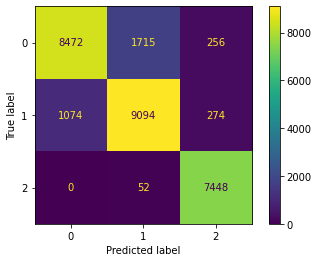

In [473]:
plot_confusion_matrix(RFC,X_test, y_test);

In [474]:
# Sauvegarder RandomForestClassifier pour la partie du Dépolioment
is

['model.sav']